## Install Modules

In [ ]:
!pip install -q pathway bokeh

## Import Libraries

In [ ]:
#Import the required libraries for the data handling and for the visualizations
import numpy as np
import pandas as pd
import itertools, datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
from bokeh.io import output_notebook, show
from bokeh.layouts import gridplot
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, ColorBar, LinearColorMapper
# Make sure inline plots display
%matplotlib inline
sns.set(style="whitegrid")
output_notebook()
# Import Pathway for streaming logic
import pathway as pw
import warnings
warnings.filterwarnings('ignore')

## Load the dataset

In [ ]:
DATA_PATH = '/content/dataset.csv'
df = pd.read_csv(DATA_PATH)
print("Shape of dataframe:", df.shape)
df.head()

Shape of dataframe: (18368, 12)


,ID,SystemCodeNumber,Capacity,Latitude,Longitude,Occupancy,VehicleType,TrafficConditionNearby,QueueLength,IsSpecialDay,LastUpdatedDate,LastUpdatedTime
0,0,BHMBCCMKT01,577,26.144536,91.736172,61,car,low,1,0,04-10-2016,07:59:00
1,1,BHMBCCMKT01,577,26.144536,91.736172,64,car,low,1,0,04-10-2016,08:25:00
2,2,BHMBCCMKT01,577,26.144536,91.736172,80,car,low,2,0,04-10-2016,08:59:00
3,3,BHMBCCMKT01,577,26.144536,91.736172,107,car,low,2,0,04-10-2016,09:32:00
4,4,BHMBCCMKT01,577,26.144536,91.736172,150,bike,low,2,0,04-10-2016,09:59:00


## Basic Statistics

In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18368 entries, 0 to 18367
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      18368 non-null  int64  
 1   SystemCodeNumber        18368 non-null  object 
 2   Capacity                18368 non-null  int64  
 3   Latitude                18368 non-null  float64
 4   Longitude               18368 non-null  float64
 5   Occupancy               18368 non-null  int64  
 6   VehicleType             18368 non-null  object 
 7   TrafficConditionNearby  18368 non-null  object 
 8   QueueLength             18368 non-null  int64  
 9   IsSpecialDay            18368 non-null  int64  
 10  LastUpdatedDate         18368 non-null  object 
 11  LastUpdatedTime         18368 non-null  object 
dtypes: float64(2), int64(5), object(5)
memory usage: 1.7+ MB
None


In [ ]:
df.describe(include="all")

,ID,SystemCodeNumber,Capacity,Latitude,Longitude,Occupancy,VehicleType,TrafficConditionNearby,QueueLength,IsSpecialDay,LastUpdatedDate,LastUpdatedTime
count,18368.000000,18368,18368.000000,18368.000000,18368.000000,18368.000000,18368,18368,18368.000000,18368.000000,18368,18368
unique,NaN,14,NaN,NaN,NaN,NaN,4,3,NaN,NaN,73,275
top,NaN,BHMBCCMKT01,NaN,NaN,NaN,NaN,car,low,NaN,NaN,04-10-2016,15:00:00
freq,NaN,1312,NaN,NaN,NaN,NaN,11166,7793,NaN,NaN,252,251
mean,9183.500000,NaN,1605.214286,25.706547,90.751170,731.084059,NaN,NaN,4.587925,0.150915,NaN,NaN
std,5302.529208,NaN,1131.153886,1.582749,3.536636,621.164982,NaN,NaN,2.580062,0.357975,NaN,NaN
min,0.000000,NaN,387.000000,20.000035,78.000003,2.000000,NaN,NaN,0.000000,0.000000,NaN,NaN
25%,4591.750000,NaN,577.000000,26.140048,91.727995,322.000000,NaN,NaN,2.000000,0.000000,NaN,NaN
50%,9183.500000,NaN,1261.000000,26.147482,91.729511,568.000000,NaN,NaN,4.000000,0.000000,NaN,NaN
75%,13775.250000,NaN,2803.000000,26.147541,91.736172,976.000000,NaN,NaN,6.000000,0.000000,NaN,NaN


## Visualizations

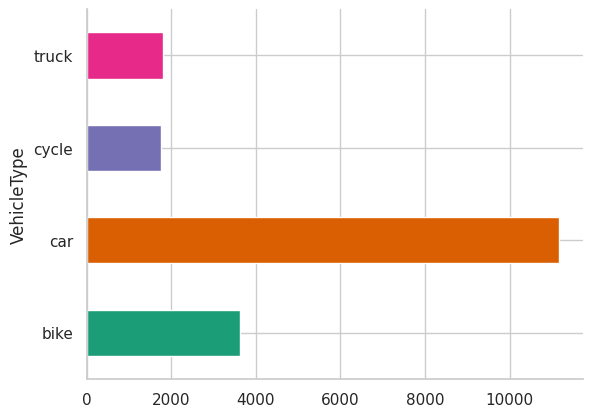

In [ ]:
df.groupby('VehicleType').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

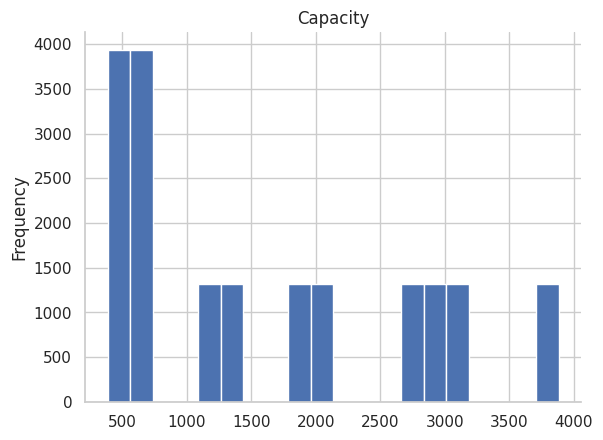

In [ ]:
df['Capacity'].plot(kind='hist', bins=20, title='Capacity')
plt.gca().spines[['top', 'right',]].set_visible(False)

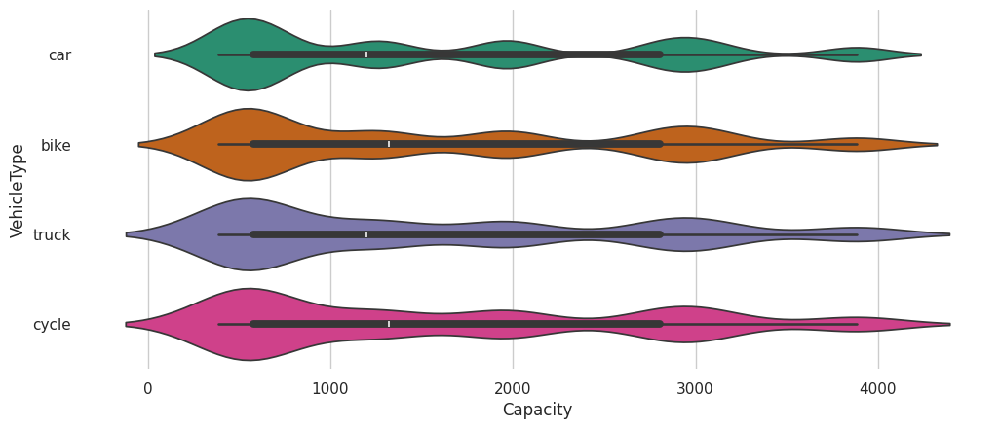

In [ ]:
figsize = (12, 1.2 * len(df['VehicleType'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df, x='Capacity', y='VehicleType', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

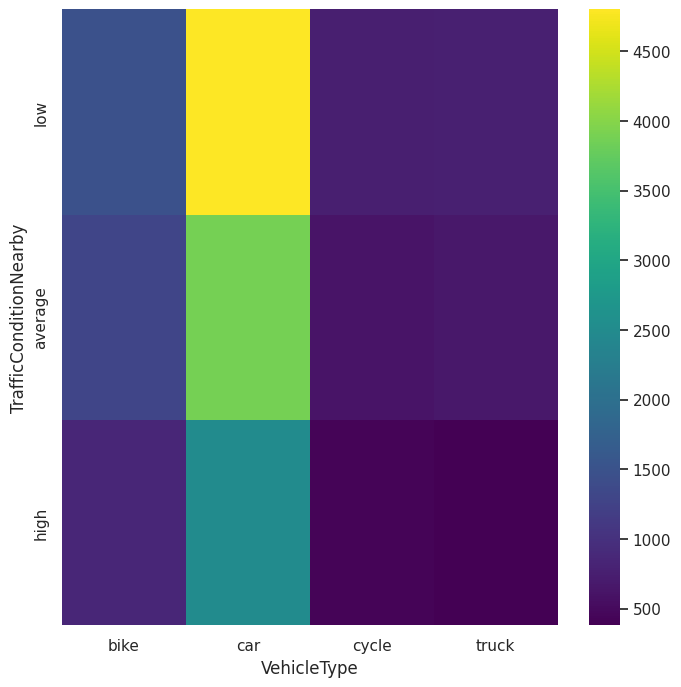

In [ ]:
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['TrafficConditionNearby'].value_counts()
    for x_label, grp in df.groupby('VehicleType')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('VehicleType')
_ = plt.ylabel('TrafficConditionNearby')

## Exploratory Data Analysis

In [ ]:
print("Missing values per column:\n", df.isna().sum())

Missing values per column:
 ID                        0
SystemCodeNumber          0
Capacity                  0
Latitude                  0
Longitude                 0
Occupancy                 0
VehicleType               0
TrafficConditionNearby    0
QueueLength               0
IsSpecialDay              0
LastUpdatedDate           0
LastUpdatedTime           0
dtype: int64


In [ ]:
print("Duplicate rows:", df.duplicated().sum())

Duplicate rows: 0


In [ ]:
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = [c for c in df.columns if c not in num_cols]

In [ ]:
bokeh_figs = []
for col in num_cols:
    hist, edges = np.histogram(df[col], bins=30)
    p = figure(title=col, width=280, height=220)
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:])
    bokeh_figs.append(p)
for col in cat_cols:
    vc = df[col].value_counts().reset_index(); vc.columns=[col,'count']
    src = ColumnDataSource(vc)
    p = figure(title=col, x_range=vc[col].astype(str).tolist(), width=280, height=220)
    p.vbar(x=col, top='count', source=src, width=0.9)
    p.xaxis.major_label_orientation = "vertical"
    bokeh_figs.append(p)
show(gridplot(bokeh_figs, ncols=3))

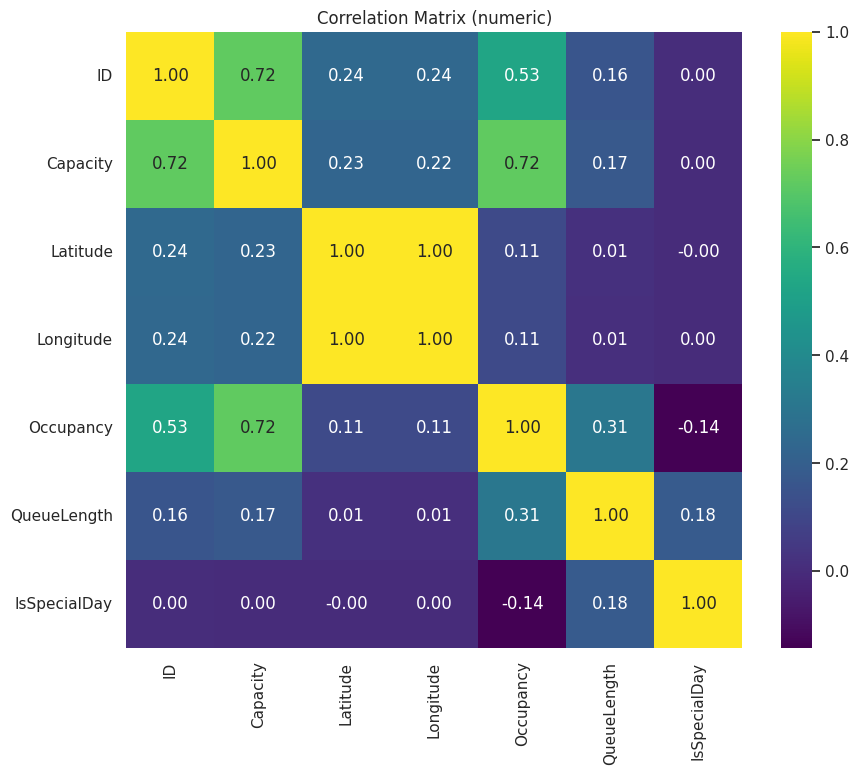

In [ ]:
num_corr = df[num_cols].corr()
plt.figure(figsize=(10,8))
sns.heatmap(num_corr, annot=True, fmt=".2f", cmap="viridis", square=True)
plt.title("Correlation Matrix (numeric)")
plt.show()

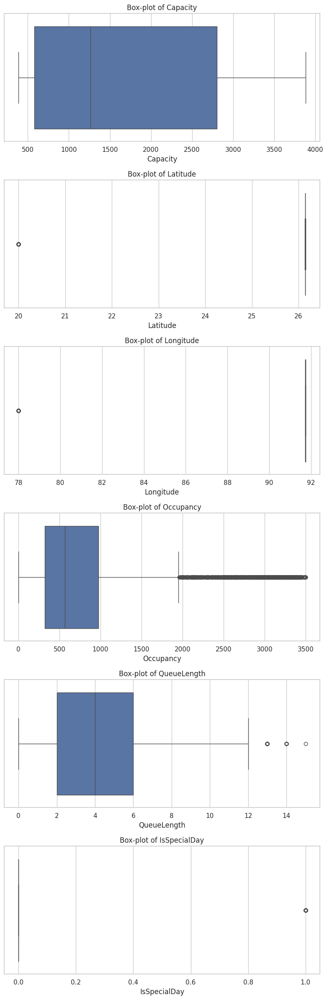

Outliers treated using winsorisation (1st–99th percentile)


In [ ]:
clean = df.copy()
# Exclude identifier-like numeric columns from box‑plot/outlier check
id_like = [c for c in num_cols if 'id' in c.lower() or 'code' in c.lower()]
outlier_cols = [c for c in num_cols if c not in id_like]

plt.figure(figsize=(8,4*len(outlier_cols)))
for i, col in enumerate(outlier_cols, 1):
    plt.subplot(len(outlier_cols),1,i)
    sns.boxplot(x=clean[col])
    plt.title(f"Box‑plot of {col}")
    q1,q3 = clean[col].quantile([0.25,0.75]); iqr=q3-q1; lo,hi=q1-1.5*iqr,q3+1.5*iqr
    low_clip, high_clip = clean[col].quantile([0.01,0.99])
    clean[col] = clean[col].clip(low_clip, high_clip)
plt.tight_layout(); plt.show()
print("Outliers treated using winsorisation (1st–99th percentile)")

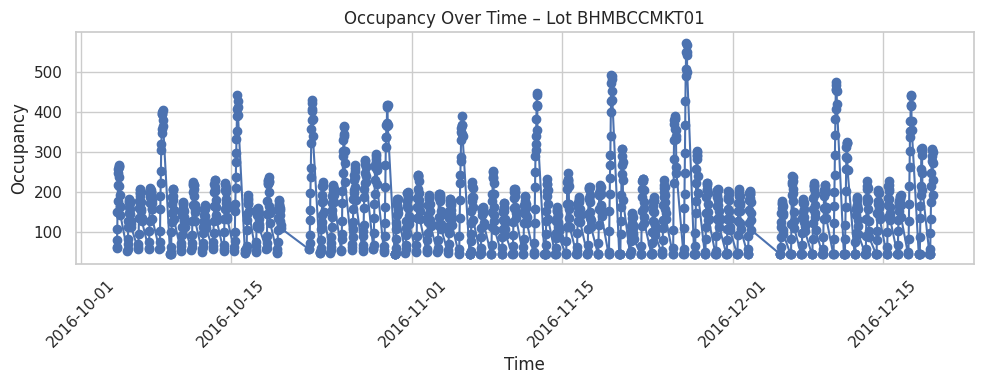

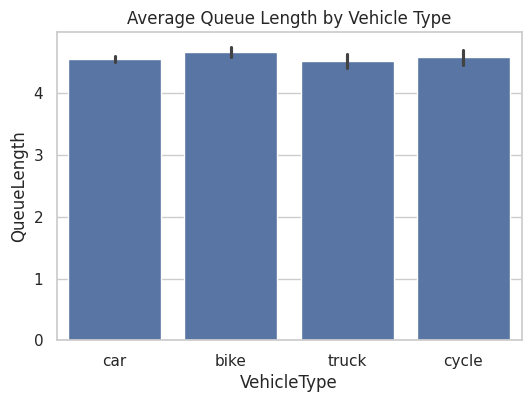

In [ ]:
clean["Timestamp"] = pd.to_datetime(clean["LastUpdatedDate"]+" "+clean["LastUpdatedTime"], format="%d-%m-%Y %H:%M:%S")
lot_id = clean["SystemCodeNumber"].iloc[0]
lot_df = clean[clean["SystemCodeNumber"]==lot_id].sort_values("Timestamp")
plt.figure(figsize=(10,4))
plt.plot(lot_df["Timestamp"], lot_df["Occupancy"], marker="o")
plt.title(f"Occupancy Over Time – Lot {lot_id}")
plt.xlabel("Time"); plt.ylabel("Occupancy"); plt.xticks(rotation=45)
plt.tight_layout(); plt.show()

plt.figure(figsize=(6,4))
sns.barplot(x="VehicleType", y="QueueLength", data=clean, estimator=np.mean)
plt.title("Average Queue Length by Vehicle Type")
plt.show()

## Feature Engineering

In [ ]:
clean["OccupancyRate"] = clean["Occupancy"] / clean["Capacity"]
clean["IsSpecialDay"] = clean["IsSpecialDay"].astype(int)
clean["Hour"] = pd.to_datetime(clean["LastUpdatedTime"], format="%H:%M:%S").dt.hour
clean["IsPeakHour"] = ((clean["Hour"] >= 9) & (clean["Hour"] <= 12)).astype(int)
clean["LatRound"] = clean["Latitude"].round(3)
clean["LongRound"] = clean["Longitude"].round(3)
print("Feature engineering completed")

Feature engineering completed


## Price Models

In [ ]:
BASE_PRICE = 10

class BaseModel:
    """Shared utilities – bounds"""
    def _bound(self, raw_price):
        return np.clip(raw_price, BASE_PRICE*0.5, BASE_PRICE*2)


class Model1Linear(BaseModel):
    def predict_price(self, row):
        step = BASE_PRICE * 0.5 * row["OccupancyRate"]
        return self._bound(BASE_PRICE + step)


class Model2Demand(BaseModel):
    def predict_price(self, row):
        demand_score = (
            0.6 * row["OccupancyRate"] +
            0.2 * row["QueueLength"] -
            0.1 * (0 if row["TrafficConditionNearby"] == "low" else 1) +
            0.1 * row["IsSpecialDay"]
        )
        return self._bound(BASE_PRICE * (1 + np.tanh(demand_score)))

class Model3Competitive(BaseModel):
    def __init__(self, reference_df):
        self.reference_df = reference_df
    def predict_price(self, row):
        base_price = Model2Demand().predict_price(row)
        mask = (self.reference_df["LatRound"] == row["LatRound"]) & (self.reference_df["LongRound"] == row["LongRound"])
        competitor_avg = BASE_PRICE if mask.sum() == 0 else base_price # This logic needs careful review for correctness with streaming data
        if row["Occupancy"] >= row["Capacity"] and competitor_avg < base_price:
            proposed = competitor_avg
        elif competitor_avg > base_price * 1.2:
            proposed = base_price * 1.1
        else:
            proposed = base_price
        return self._bound(proposed)

## Pathway Streaming

In [ ]:
# --- Pathway streaming for Model 1 -----------------------------------
source_tbl = pw.debug.table_from_pandas(clean)

BASE_PRICE = 10  # local constant for the UDF

@pw.udf
def price_udf(Occ, OccRate):
    """Model 1 linear price inside UDF (stateless)."""
    raw_price = BASE_PRICE + BASE_PRICE * 0.5 * OccRate
    return np.clip(raw_price, BASE_PRICE*0.5, BASE_PRICE*2)

priced_tbl = source_tbl.select(
    Timestamp       = source_tbl.Timestamp,
    SystemCodeNumber= source_tbl.SystemCodeNumber,
    Price           = price_udf(source_tbl.Occupancy, source_tbl.OccupancyRate)
)

def print_row(key, row, time, is_addition):
    if is_addition:  # Optional: only print new rows
        print(row["Timestamp"], row["SystemCodeNumber"], row["Price"])

pw.io.subscribe(priced_tbl, print_row)
pw.run()

Output()

2016-10-11 14:04:00 BHMBCCTHL01 14.431524547803617

2016-10-26 07:59:00 BHMNCPNST01 12.670103092783505

2016-11-12 09:00:00 BHMNCPHST01 10.566666666666666

2016-11-20 08:27:00 Others-CCCPS135a 10.84985835694051

2016-11-24 11:00:00 Others-CCCPS8 12.537821482602117

2016-12-13 11:02:00 Others-CCCPS105a 13.188153310104529

2016-11-12 10:00:00 Broad Street 10.731884057971014

2016-10-12 11:31:00 BHMBCCTHL01 14.418604651162791

2016-11-05 16:00:00 BHMBCCMKT01 13.188908145580589

2016-11-24 15:31:00 Others-CCCPS98 11.603287141475992

2016-10-04 14:57:00 BHMBCCMKT01 11.663778162911612

2016-12-01 15:25:00 BHMEURBRD01 14.617021276595745

2016-12-06 08:29:00 Others-CCCPS135a 12.7440123615761

2016-11-24 12:30:00 Others-CCCPS135a 14.163018284831317

2016-12-01 15:25:00 Others-CCCPS202 12.344228804902961

2016-11-05 08:59:00 BHMEURBRD01 11.127659574468085

2016-11-10 11:27:00 Others-CCCPS8 12.810136157337368

2016-10-18 08:01:00 Others-CCCPS98 11.102159200773444

2016-10-16 08:27:00 BHMMBMMBX01 11.928675400291121

2016-10-24 09:55:00 BHMEURBRD01 13.585106382978722

2016-10-04 14:57:00 BHMMBMMBX01 14.315866084425036

2016-10-17 14:04:00 Others-CCCPS98 11.941669352239767

2016-12-19 11:30:00 Others-CCCPS98 12.689332903641636

2016-10-07 09:57:00 Broad Street 13.492753623188406

2016-10-08 10:04:00 BHMBCCTHL01 12.196382428940568

2016-11-03 13:59:00 Others-CCCPS98 11.76764421527554

2016-12-15 07:57:00 Others-CCCPS202 10.90228123935989

2016-11-08 07:59:00 Others-CCCPS202 10.956758597208035

2016-11-03 12:00:00 BHMMBMMBX01 14.708879184861718

2016-11-11 13:34:00 BHMBCCMKT01 11.43847487001733

2016-11-12 11:34:00 BHMEURBRD01 11.148936170212766

2016-12-18 12:30:00 Shopping 12.083333333333334

2016-11-12 14:27:00 Others-CCCPS135a 12.169714138552665

2016-11-21 16:31:00 BHMBCCMKT01 10.719237435008665

2016-11-07 11:26:00 Shopping 13.565104166666666

2016-11-14 16:27:00 Shopping 12.875

2016-11-21 13:31:00 Shopping 13.815104166666668

2016-12-09 09:55:00 Others-CCCPS105a 12.827277252364361

2016-10-28 08:16:00 Others-CCCPS105a 11.801891488302639

2016-11-10 13:34:00 BHMNCPNST01 13.896907216494846

2016-11-29 08:28:00 BHMMBMMBX01 12.03056768558952

2016-11-07 10:26:00 Others-CCCPS105a 12.64808362369338

2016-10-09 10:30:00 BHMNCPNST01 12.329896907216495

2016-11-23 15:31:00 Broad Street 14.31159420289855

2016-12-17 15:03:00 Others-CCCPS98 12.864969384466646

2016-11-16 10:00:00 BHMBCCTHL01 14.1343669250646

2016-10-25 13:29:00 Others-CCCPS119a 11.209418480199787

2016-11-03 12:00:00 Others-CCCPS105a 13.41712294673967

2016-12-01 15:58:00 Shopping 13.421875

2016-10-22 10:26:00 Shopping 11.291666666666666

2016-12-14 15:56:00 BHMNCPNST01 12.876288659793815

2016-12-12 14:55:00 BHMBCCMKT01 11.377816291161178

2016-10-18 16:27:00 BHMEURBRD01 13.819148936170214

2016-10-30 13:06:00 BHMNCPNST01 12.577319587628866

2016-10-07 13:04:00 BHMBCCMKT01 11.733102253032929

2016-10-27 14:59:00 BHMBCCTHL01 14.45736434108527

2016-11-05 15:26:00 Others-CCCPS202 11.595165134490976

2016-10-28 16:29:00 Others-CCCPS98 12.34933934901708

2016-10-06 08:30:00 BHMNCPNST01 12.855670103092784

2016-12-16 09:03:00 BHMNCPNST01 12.927835051546392

2016-11-19 13:04:00 BHMBCCTHL01 15.155038759689923

2016-11-16 11:00:00 Others-CCCPS119a 11.06136282554406

2016-12-15 09:03:00 BHMBCCTHL01 12.674418604651162

2016-12-18 15:30:00 BHMNCPHST01 12.270833333333334

2016-10-13 14:31:00 Others-CCCPS135a 13.933814061292814

2016-10-28 09:29:00 BHMNCPHST01 11.6375

2016-12-05 11:29:00 Others-CCCPS119a 11.07563325008919

2016-11-30 13:28:00 BHMNCPHST01 13.733333333333334

2016-12-02 10:28:00 Others-CCCPS119a 10.833036032821976

2016-12-06 11:29:00 Others-CCCPS135a 14.163018284831317

2016-12-18 16:03:00 Others-CCCPS98 12.63938124395746

2016-12-02 09:28:00 BHMNCPHST01 12.229166666666668

2016-11-27 09:02:00 BHMEURBRD01 10.48936170212766

2016-11-01 16:33:00 BHMNCPHST01 12.35

2016-10-10 10:57:00 BHMEURBRD01 14.042553191489361

2016-11-09 10:27:00 Others-CCCPS202 11.78072863466122

2016-11-13 10:00:00 BHMBCCTHL01 12.093023255813954

2016-11-13 09:34:00 BHMBCCMKT01 10.398613518197573

2016-11-30 09:28:00 BHMMBMMBX01 12.758369723435226

2016-10-16 08:04:00 Broad Street 10.53623188405797

2016-10-13 08:31:00 BHMEURBRD01 12.319148936170212

2016-10-29 14:26:00 Others-CCCPS135a 11.845222765902653

2016-12-19 09:30:00 Broad Street 13.210144927536232

2016-11-18 08:01:00 Others-CCCPS119a 10.351409204423831

2016-10-26 09:59:00 Others-CCCPS202 11.918624446714334

2016-11-08 16:34:00 Shopping 12.671875

2016-10-24 14:30:00 BHMNCPNST01 13.329896907216494

2016-10-04 14:29:00 Others-CCCPS98 11.994843699645504

2016-10-15 11:27:00 Others-CCCPS105a 12.488800398208063

2016-10-27 09:32:00 BHMEURBRD01 13.340425531914892

2016-11-16 09:00:00 BHMNCPNST01 13.11340206185567

2016-10-30 11:59:00 BHMEURBRD01 11.085106382978724

2016-11-20 11:27:00 BHMNCPNST01 12.268041237113401

2016-10-08 15:30:00 Broad Street 11.340579710144928

2016-12-08 15:59:00 BHMNCPNST01 13.010309278350515

2016-10-06 15:04:00 Broad Street 14.557971014492754

2016-11-11 09:00:00 Broad Street 12.847826086956522

2016-11-20 12:01:00 BHMNCPNST01 12.350515463917526

2016-10-24 08:29:00 Others-CCCPS202 11.086142322097379

2016-10-15 09:27:00 Others-CCCPS119a 10.36211202283268

2016-10-17 12:31:00 BHMEURBRD01 14.797872340425531

2016-11-16 09:27:00 Shopping 13.046875

2016-12-18 14:30:00 Others-CCCPS105a 13.618715778994524

2016-10-31 16:00:00 BHMEURBRD01 14.063829787234042

2016-10-10 08:30:00 Others-CCCPS135a 11.83363378830801

2016-11-26 11:28:00 Others-CCCPS8 13.177004538577911

2016-12-07 08:26:00 BHMMBMMBX01 12.132459970887918

2016-10-08 09:30:00 Broad Street 10.659420289855072

2016-12-05 14:29:00 BHMNCPNST01 12.31958762886598

2016-12-15 11:26:00 Broad Street 14.347826086956522

2016-11-22 13:31:00 Others-CCCPS105a 13.399701343952215

2016-10-25 09:19:00 Others-CCCPS98 11.45343216242346

2016-10-16 11:01:00 BHMEURBRD01 11.457446808510639

2016-11-12 13:00:00 BHMMBMMBX01 13.209606986899564

2016-11-29 11:55:00 BHMNCPNST01 13.288659793814432

2016-11-24 14:30:00 BHMBCCTHL01 15.116279069767442

2016-11-29 09:28:00 BHMBCCTHL01 14.082687338501291

2016-12-13 14:56:00 Others-CCCPS202 12.153558052434457

2016-11-19 08:57:00 Others-CCCPS119a 10.290759900107028

2016-12-12 10:02:00 BHMEURBRD01 13.670212765957448

2016-12-15 10:30:00 Others-CCCPS105a 13.003982080637133

2016-11-25 09:27:00 BHMBCCTHL01 13.152454780361758

2016-11-25 15:00:00 BHMBCCMKT01 12.954939341421143

2016-10-24 16:00:00 Shopping 12.893229166666666

2016-10-16 12:01:00 Others-CCCPS135a 12.303631212979655

2016-10-28 16:02:00 Others-CCCPS119a 11.824830538708527

2016-11-03 16:03:00 Others-CCCPS8 12.39409984871407

2016-10-18 08:28:00 Broad Street 12.13768115942029

2016-10-26 14:59:00 BHMBCCMKT01 12.18370883882149

2016-10-17 09:01:00 BHMBCCTHL01 11.718346253229974

2016-10-25 12:02:00 BHMNCPNST01 13.824742268041238

2016-12-08 09:26:00 BHMBCCMKT01 10.398613518197573

2016-12-06 11:56:00 Others-CCCPS135a 14.163018284831317

2016-10-14 16:34:00 Others-CCCPS8 12.133131618759455

2016-10-12 10:31:00 BHMNCPNST01 13.329896907216494

2016-10-09 16:03:00 Others-CCCPS202 11.111678583588695

2016-12-09 14:02:00 BHMMBMMBX01 14.526928675400292

2016-11-11 11:27:00 Broad Street 13.91304347826087

2016-11-05 09:59:00 BHMNCPNST01 11.824742268041238

2016-11-11 10:27:00 Others-CCCPS105a 12.356893977103036

2016-10-23 10:59:00 Others-CCCPS8 11.970499243570348

2016-11-27 15:32:00 Others-CCCPS8 13.608169440242058

2016-10-29 09:59:00 BHMMBMMBX01 12.714701601164483

2016-11-26 16:01:00 Others-CCCPS202 11.979911474293496

2016-11-11 10:00:00 BHMBCCTHL01 12.364341085271318

2016-12-18 14:03:00 Others-CCCPS135a 12.40020602626835

2016-12-01 09:25:00 Others-CCCPS119a 10.8383874420264

2016-10-24 07:56:00 Others-CCCPS135a 11.295390162245686

2016-12-05 15:02:00 BHMEURBRD01 14.457446808510639

2016-11-14 16:00:00 BHMNCPNST01 12.649484536082474

2016-12-12 14:29:00 Others-CCCPS119a 11.080984659293614

2016-12-08 08:59:00 Others-CCCPS135a 12.780066958537214

2016-11-02 09:56:00 BHMNCPNST01 12.927835051546392

2016-11-22 12:57:00 Shopping 13.950520833333334

2016-11-18 14:01:00 Broad Street 14.27536231884058

2016-10-13 13:31:00 BHMNCPNST01 13.701030927835053

2016-11-20 10:27:00 BHMEURBRD01 10.712765957446809

2016-10-11 12:30:00 Others-CCCPS119a 10.995362112022832

2016-11-16 08:27:00 BHMNCPNST01 12.855670103092784

2016-10-31 10:26:00 BHMMBMMBX01 13.770014556040756

2016-12-14 13:29:00 Others-CCCPS105a 13.715778994524639

2016-11-08 12:27:00 BHMEURBRD01 14.946808510638299

2016-11-12 11:00:00 BHMBCCTHL01 12.958656330749355

2016-11-14 15:27:00 Others-CCCPS105a 12.444001991040318

2016-11-13 08:27:00 Others-CCCPS8 11.403177004538579

2016-11-09 09:00:00 BHMBCCMKT01 10.398613518197573

2016-10-26 16:32:00 BHMEURBRD01 13.914893617021278

2016-10-13 15:31:00 BHMNCPNST01 13.556701030927835

2016-11-12 10:27:00 Shopping 11.5859375

2016-12-14 14:30:00 BHMBCCTHL01 15.090439276485789

2016-10-05 11:30:00 Others-CCCPS8 13.010590015128592

2016-11-21 09:31:00 BHMBCCTHL01 12.777777777777779

2016-11-05 15:00:00 Others-CCCPS119a 10.781305743845879

2016-12-11 13:59:00 Others-CCCPS202 11.532175689479061

2016-10-23 15:59:00 Others-CCCPS119a 10.777738137709598

2016-11-19 11:31:00 BHMBCCMKT01 12.331022530329289

2016-11-10 16:27:00 Others-CCCPS119a 10.729575454869781

2016-12-09 13:29:00 Others-CCCPS135a 13.87715683749678

2016-11-12 10:00:00 Others-CCCPS135a 11.198815348956993

2016-11-21 12:31:00 BHMEURBRD01 14.297872340425531

2016-12-05 10:29:00 BHMEURBRD01 13.936170212765958

2016-11-05 16:00:00 BHMEURBRD01 12.351063829787234

2016-11-15 15:03:00 Others-CCCPS98 11.732194650338382

2016-12-10 14:59:00 BHMNCPNST01 13.783505154639176

2016-12-09 11:29:00 BHMNCPNST01 12.835051546391753

2016-10-18 15:55:00 BHMEURBRD01 14.24468085106383

2016-11-27 13:32:00 Shopping 12.729166666666666

2016-11-07 09:59:00 Others-CCCPS202 11.610486891385769

2016-12-02 11:28:00 Others-CCCPS105a 13.245395719263314

2016-10-15 15:01:00 Shopping 12.356770833333334

2016-12-14 14:30:00 BHMBCCMKT01 11.499133448873483

2016-11-16 13:27:00 Shopping 14.036458333333332

2016-12-12 11:02:00 BHMEURBRD01 13.851063829787234

2016-11-19 13:04:00 Others-CCCPS119a 10.973956475205137

2016-10-19 11:59:00 BHMBCCMKT01 11.568457538994801

2016-11-12 14:00:00 BHMNCPHST01 12.175

2016-11-21 14:31:00 Broad Street 14.289855072463768

2016-10-17 14:31:00 Others-CCCPS8 12.60590015128593

2016-11-18 15:28:00 BHMEURBRD01 14.117021276595745

2016-11-28 10:32:00 Broad Street 14.304347826086957

2016-11-26 13:01:00 Shopping 13.322916666666666

2016-10-07 15:04:00 Others-CCCPS202 11.773918964930202

2016-12-11 13:59:00 BHMMBMMBX01 13.973799126637555

2016-10-16 09:01:00 Others-CCCPS105a 12.344449975111996

2016-12-16 07:59:00 Others-CCCPS8 11.751134644478064

2016-12-01 15:58:00 Broad Street 14.39855072463768

2016-10-28 10:29:00 BHMBCCMKT01 11.481802426343155

2016-11-18 08:01:00 Others-CCCPS8 11.293494704992435

2016-10-23 11:26:00 Others-CCCPS98 11.076377699000966

2016-11-28 12:01:00 Shopping 14.153645833333332

2016-11-06 11:26:00 Broad Street 10.797101449275363

2016-10-09 09:04:00 Others-CCCPS119a 10.231894398858365

2016-11-15 08:30:00 Others-CCCPS119a 10.554762754191938

2016-11-02 16:30:00 Broad Street 13.971014492753623

2016-10-29 08:59:00 Others-CCCPS8 11.467473524962179

2016-12-11 14:59:00 Others-CCCPS8 13.876701966717096

2016-10-27 15:59:00 BHMNCPHST01 12.529166666666667

2016-12-08 09:59:00 BHMNCPNST01 12.8659793814433

2016-11-13 12:27:00 Broad Street 10.63768115942029

2016-12-01 14:58:00 Others-CCCPS135a 14.163018284831317

2016-12-13 08:02:00 BHMNCPNST01 11.989690721649485

2016-12-16 16:03:00 BHMBCCTHL01 15.025839793281653

2016-10-27 07:59:00 BHMMBMMBX01 12.678311499272198

2016-10-22 08:59:00 Others-CCCPS105a 11.498257839721255

2016-11-06 11:26:00 Others-CCCPS119a 10.52978951123796

2016-11-18 12:27:00 BHMMBMMBX01 13.391557496360988

2016-12-08 09:26:00 Others-CCCPS119a 10.722440242597218

2016-12-16 15:30:00 BHMNCPHST01 12.758333333333333

2016-12-16 10:29:00 BHMEURBRD01 13.414893617021278

2016-11-11 11:27:00 Others-CCCPS135a 13.640226628895185

2016-11-13 12:00:00 Others-CCCPS202 11.084439904664624

2016-11-27 10:32:00 Shopping 11.140625

2016-11-28 15:41:00 BHMMBMMBX01 12.234352256186318

2016-10-07 12:30:00 BHMBCCTHL01 13.540051679586563

2016-11-16 15:00:00 Others-CCCPS135a 13.896471800154519

2016-10-31 08:26:00 BHMNCPHST01 11.2625

2016-12-05 11:02:00 BHMBCCMKT01 10.979202772963605

2016-10-22 09:59:00 BHMMBMMBX01 12.307132459970887

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-12-09 08:02:00 BHMBCCMKT01 10.398613518197573

2016-12-17 15:57:00 BHMBCCTHL01 15.193798449612403

2016-10-26 15:59:00 Others-CCCPS8 12.768532526475038

2016-10-10 16:30:00 Others-CCCPS98 11.355140186915888

2016-11-19 07:57:00 BHMEURBRD01 10.53191489361702

2016-11-24 10:01:00 BHMNCPNST01 12.515463917525773

2016-10-26 15:26:00 Others-CCCPS135a 13.293844965233067

2016-11-05 13:59:00 Others-CCCPS105a 13.20059731209557

2016-11-02 14:30:00 BHMBCCTHL01 13.92764857881137

2016-11-17 09:57:00 Others-CCCPS98 11.575894295842733

2016-11-02 09:56:00 Others-CCCPS98 11.59845310989365

2016-11-10 13:00:00 Others-CCCPS98 11.835320657428294

2016-11-26 10:01:00 BHMBCCTHL01 13.850129198966409

2016-11-26 08:01:00 Others-CCCPS105a 11.548033847685415

2016-11-07 15:33:00 Others-CCCPS8 12.14069591527988

2016-11-06 13:59:00 Others-CCCPS105a 12.770034843205575

2016-11-24 13:57:00 Others-CCCPS98 11.814373187238157

2016-11-20 15:27:00 BHMEURBRD01 13.095744680851062

2016-10-16 08:04:00 Others-CCCPS105a 11.714783474365356

2016-11-06 09:00:00 BHMBCCTHL01 10.723514211886306

2016-12-18 15:30:00 BHMNCPNST01 12.45360824742268

2016-10-18 10:28:00 Others-CCCPS202 12.257405515832481

2016-12-06 12:56:00 Others-CCCPS202 12.277834525025536

2016-10-22 10:59:00 BHMMBMMBX01 12.54730713245997

2016-10-14 16:01:00 BHMNCPHST01 12.258333333333333

2016-11-01 16:33:00 BHMBCCTHL01 12.829457364341085

2016-11-20 13:27:00 BHMEURBRD01 11.819148936170214

2016-11-09 10:27:00 BHMNCPHST01 12.795833333333334

2016-11-10 14:27:00 Others-CCCPS98 11.754753464389301

2016-10-22 11:32:00 Others-CCCPS135a 11.35719804275045

2016-12-10 12:29:00 Broad Street 10.94927536231884

2016-10-13 13:31:00 Broad Street 14.41304347826087

2016-11-30 10:55:00 BHMMBMMBX01 13.820960698689957

2016-11-09 09:34:00 BHMEURBRD01 13.957446808510639

2016-12-02 12:28:00 BHMBCCMKT01 11.69844020797227

2016-12-17 11:00:00 BHMNCPHST01 11.691666666666666

2016-12-06 11:29:00 Others-CCCPS98 11.738640025781502

2016-12-17 16:30:00 BHMBCCTHL01 15.180878552971576

2016-10-28 10:56:00 Shopping 12.640625

2016-10-16 13:27:00 Shopping 12.421875

2016-12-18 11:03:00 Others-CCCPS98 12.21559780857235

2016-11-12 08:00:00 Others-CCCPS202 10.599250936329588

2016-10-19 12:25:00 Others-CCCPS119a 11.377095968605065

2016-11-12 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-06 16:04:00 BHMNCPNST01 13.072164948453608

2016-11-26 08:01:00 Others-CCCPS202 10.759278175008513

2016-11-27 11:31:00 Shopping 11.651041666666666

2016-10-17 08:01:00 Broad Street 11.23913043478261

2016-11-06 09:00:00 BHMMBMMBX01 12.409024745269287

2016-10-23 09:59:00 BHMNCPNST01 12.75257731958763

2016-11-28 09:28:00 Others-CCCPS105a 12.105525136884022

2016-10-23 16:26:00 BHMNCPHST01 10.945833333333333

2016-11-03 16:30:00 Others-CCCPS119a 10.779521940777737

2016-10-27 16:26:00 BHMMBMMBX01 13.850072780203785

2016-11-30 08:28:00 Shopping 11.9921875

2016-10-08 11:30:00 Others-CCCPS8 12.004538577912253

2016-10-04 14:02:00 Others-CCCPS98 12.03351595230422

2016-10-18 15:01:00 Broad Street 14.579710144927535

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-10-23 10:26:00 BHMBCCTHL01 12.015503875968992

2016-11-28 08:32:00 Others-CCCPS8 11.493948562783661

2016-12-07 14:26:00 BHMMBMMBX01 14.57787481804949

2016-10-27 11:59:00 BHMNCPHST01 12.6625

2016-10-31 13:00:00 Others-CCCPS8 12.492435703479575

2016-10-19 08:05:00 Others-CCCPS202 11.106571331290432

2016-11-29 09:28:00 Shopping 12.9609375

2016-11-20 15:27:00 Others-CCCPS202 11.670071501532176

2016-11-23 16:04:00 Others-CCCPS202 12.076949267960504

2016-11-17 16:31:00 Others-CCCPS202 11.98842356145727

2016-10-10 09:30:00 BHMNCPNST01 12.845360824742269

2016-11-22 11:04:00 BHMNCPHST01 13.279166666666667

2016-12-09 10:29:00 BHMBCCTHL01 14.302325581395348

2016-10-11 16:01:00 Others-CCCPS98 11.638736706413148

2016-11-09 08:27:00 BHMEURBRD01 12.202127659574469

2016-10-19 14:32:00 BHMMBMMBX01 14.490538573508005

2016-10-07 13:04:00 BHMBCCTHL01 13.695090439276486

2016-11-15 09:30:00 Others-CCCPS8 11.985627836611195

2016-11-12 08:00:00 Shopping 10.770833333333334

2016-10-10 10:03:00 Others-CCCPS98 11.522719948436997

2016-12-08 13:59:00 Others-CCCPS135a 14.163018284831317

2016-10-15 13:34:00 Others-CCCPS119a 10.972172672136995

2016-10-12 08:04:00 BHMEURBRD01 11.436170212765958

2016-11-03 09:26:00 Others-CCCPS105a 12.526132404181185

2016-11-23 16:04:00 BHMEURBRD01 14.0

2016-10-25 10:29:00 Others-CCCPS202 12.054817841334696

2016-12-16 07:59:00 Others-CCCPS98 11.013535288430552

2016-12-16 16:03:00 BHMNCPHST01 12.666666666666666

2016-11-01 14:26:00 BHMMBMMBX01 14.425036390101893

2016-11-16 16:33:00 Others-CCCPS135a 12.961627607519958

2016-11-27 12:01:00 BHMEURBRD01 10.925531914893616

2016-11-20 11:01:00 BHMMBMMBX01 11.85589519650655

2016-11-19 13:31:00 BHMNCPHST01 12.279166666666667

2016-11-12 10:27:00 BHMBCCMKT01 11.377816291161178

2016-11-20 16:01:00 Broad Street 12.456521739130434

2016-10-23 12:26:00 Others-CCCPS202 11.205311542390195

2016-11-30 16:28:00 Broad Street 13.731884057971016

2016-10-07 12:03:00 BHMBCCMKT01 11.819757365684575

2016-11-28 16:28:00 Broad Street 13.630434782608695

2016-12-16 13:30:00 BHMNCPHST01 13.175

2016-11-09 12:27:00 Others-CCCPS8 13.078668683812406

2016-12-12 10:29:00 Broad Street 14.007246376811594

2016-12-07 10:26:00 Others-CCCPS135a 13.969868658253928

2016-10-29 09:59:00 Shopping 11.145833333333334

2016-12-05 11:29:00 BHMBCCTHL01 14.638242894056848

2016-10-12 11:04:00 Broad Street 14.77536231884058

2016-11-04 08:26:00 Others-CCCPS8 11.285930408472012

2016-10-23 08:26:00 Others-CCCPS202 10.715015321756894

2016-11-20 09:01:00 Others-CCCPS105a 11.445993031358885

2016-11-17 14:04:00 Others-CCCPS202 12.448076268300987

2016-12-19 11:03:00 Others-CCCPS8 12.58698940998487

2016-11-21 15:31:00 Shopping 13.416666666666668

2016-10-23 13:06:00 Shopping 11.3671875

2016-10-31 12:00:00 BHMEURBRD01 14.414893617021278

2016-10-31 10:26:00 Others-CCCPS105a 12.705326032852165

2016-11-01 13:26:00 BHMNCPHST01 13.195833333333333

2016-10-09 09:57:00 Broad Street 10.514492753623188

2016-11-18 16:28:00 Others-CCCPS8 12.174735249621785

2016-10-09 09:24:00 BHMNCPNST01 12.350515463917526

2016-10-13 09:31:00 Others-CCCPS105a 12.319561971129914

2016-10-07 15:30:00 BHMBCCTHL01 13.268733850129198

2016-11-15 15:57:00 Broad Street 14.181159420289855

2016-10-11 15:00:00 BHMNCPNST01 13.793814432989691

2016-10-23 10:26:00 Others-CCCPS119a 10.429896539422048

2016-10-13 10:31:00 BHMBCCMKT01 11.43847487001733

2016-10-07 08:03:00 BHMNCPNST01 12.474226804123711

2016-11-06 15:26:00 BHMEURBRD01 12.627659574468085

2016-12-01 14:58:00 BHMEURBRD01 14.75531914893617

2016-11-20 16:01:00 BHMBCCMKT01 12.001733102253032

2016-12-15 13:00:00 Others-CCCPS119a 11.218337495540492

2016-11-05 12:26:00 BHMBCCTHL01 13.643410852713178

2016-10-11 11:30:00 Others-CCCPS119a 10.973956475205137

2016-11-04 12:33:00 Broad Street 14.731884057971016

2016-10-31 10:00:00 Others-CCCPS105a 12.565953210552514

2016-10-04 16:31:00 Others-CCCPS202 11.72795369424583

2016-10-15 12:01:00 BHMBCCMKT01 12.391681109185441

2016-10-09 11:30:00 BHMBCCTHL01 12.868217054263566

2016-12-06 13:29:00 Shopping 13.984375

2016-10-12 11:04:00 Others-CCCPS202 12.242083758937692

2016-10-17 08:01:00 Shopping 11.393229166666666

2016-11-23 14:30:00 Others-CCCPS135a 14.163018284831317

2016-10-11 12:30:00 BHMMBMMBX01 14.570596797671033

2016-11-20 09:01:00 Shopping 10.78125

2016-11-07 16:00:00 BHMBCCTHL01 13.217054263565892

2016-11-26 12:01:00 BHMBCCMKT01 13.188908145580589

2016-12-01 15:58:00 Others-CCCPS105a 13.474365355898456

2016-10-06 12:57:00 Others-CCCPS105a 13.446988551518167

2016-12-07 10:26:00 Others-CCCPS119a 11.084552265429897

2016-10-11 12:03:00 Others-CCCPS98 12.028681920721882

2016-10-12 11:04:00 BHMMBMMBX01 14.221251819505095

2016-11-05 15:26:00 Others-CCCPS135a 11.693278392995106

2016-12-17 16:30:00 Others-CCCPS98 12.955204640670319

2016-10-26 11:26:00 BHMBCCMKT01 11.577123050259965

2016-12-19 16:03:00 Others-CCCPS8 13.290468986384266

2016-11-27 11:55:00 BHMNCPNST01 12.804123711340207

2016-12-10 13:56:00 Others-CCCPS105a 13.792931806869088

2016-11-22 10:31:00 BHMNCPNST01 12.494845360824742

2016-11-25 15:00:00 Shopping 13.510416666666666

2016-11-04 13:59:00 Others-CCCPS202 12.03779366700715

2016-11-22 14:57:00 Others-CCCPS135a 14.163018284831317

2016-10-24 11:29:00 Others-CCCPS135a 13.275817666752511

2016-12-01 08:05:00 Others-CCCPS135a 11.72031934071594

2016-10-24 10:30:00 Others-CCCPS202 11.741573033707866

2016-10-06 07:57:00 BHMNCPHST01 10.9375

2016-11-03 15:00:00 BHMBCCTHL01 13.863049095607234

2016-10-15 11:27:00 Others-CCCPS98 11.218175958749597

2016-10-08 15:30:00 BHMNCPHST01 12.1375

2016-11-22 16:30:00 BHMEURBRD01 14.117021276595745

2016-12-14 12:02:00 Others-CCCPS119a 11.146985372814841

2016-12-10 16:25:00 Others-CCCPS105a 13.837730214036835

2016-12-07 14:26:00 Others-CCCPS135a 14.163018284831317

2016-12-14 14:56:00 BHMNCPNST01 13.123711340206185

2016-11-07 11:59:00 Others-CCCPS98 11.828875281985177

2016-11-06 10:00:00 BHMNCPHST01 10.691666666666666

2016-10-27 11:59:00 Others-CCCPS119a 12.028184088476632

2016-12-15 13:26:00 BHMNCPHST01 13.508333333333333

2016-10-11 14:30:00 BHMMBMMBX01 14.446870451237263

2016-10-14 12:01:00 Others-CCCPS105a 13.048780487804878

2016-12-01 13:58:00 BHMBCCTHL01 15.193798449612403

2016-11-30 08:28:00 Others-CCCPS105a 11.8516674962668

2016-12-18 16:30:00 Others-CCCPS98 12.568482114083146

2016-12-05 12:29:00 BHMMBMMBX01 14.18486171761281

2016-10-14 16:01:00 Others-CCCPS119a 10.78308954691402

2016-11-14 09:00:00 Others-CCCPS105a 11.520657043305127

2016-10-19 10:25:00 BHMEURBRD01 14.53191489361702

2016-10-31 13:59:00 Broad Street 14.58695652173913

2016-10-28 09:29:00 Others-CCCPS135a 12.395055369559618

2016-10-28 12:29:00 BHMBCCMKT01 12.331022530329289

2016-11-28 16:28:00 Others-CCCPS98 11.048984853367708

2016-12-12 16:29:00 BHMBCCMKT01 10.823223570190642

2016-10-04 15:30:00 BHMBCCTHL01 13.7984496124031

2016-10-11 11:30:00 BHMMBMMBX01 14.38136826783115

2016-10-06 07:57:00 BHMMBMMBX01 12.590975254730713

2016-12-17 15:57:00 Others-CCCPS135a 12.576616018542364

2016-11-05 15:26:00 Others-CCCPS105a 13.34245893479343

2016-12-07 08:26:00 BHMBCCTHL01 12.919896640826874

2016-10-15 16:01:00 Others-CCCPS8 13.42284417549168

2016-11-23 13:57:00 Shopping 13.9609375

2016-12-19 08:03:00 Broad Street 11.355072463768117

2016-10-06 10:03:00 Others-CCCPS8 12.348714069591528

2016-11-22 13:57:00 Others-CCCPS105a 13.44449975111996

2016-12-14 10:30:00 BHMEURBRD01 14.627659574468085

2016-10-30 13:59:00 BHMNCPNST01 12.56701030927835

2016-10-28 16:29:00 BHMBCCMKT01 11.906412478336222

2016-11-05 08:26:00 Broad Street 11.115942028985508

2016-12-11 09:26:00 BHMBCCTHL01 11.950904392764858

2016-10-12 16:31:00 BHMBCCMKT01 10.961871750433275

2016-12-10 12:29:00 Others-CCCPS119a 11.095255083838744

2016-12-14 14:56:00 BHMEURBRD01 14.542553191489361

2016-12-19 11:03:00 BHMBCCMKT01 11.161178509532062

2016-11-03 14:26:00 Others-CCCPS8 12.847957639939485

2016-11-23 16:30:00 Others-CCCPS98 11.377699000966807

2016-10-11 16:26:00 BHMBCCMKT01 11.10051993067591

2016-10-29 13:26:00 BHMNCPHST01 11.645833333333334

2016-10-18 13:28:00 Others-CCCPS202 12.391896493020088

2016-12-10 08:29:00 BHMBCCTHL01 12.196382428940568

2016-10-24 12:30:00 BHMNCPHST01 12.7375

2016-11-20 08:01:00 Others-CCCPS105a 11.421105027376804

2016-11-13 11:00:00 BHMBCCTHL01 13.320413436692506

2016-10-18 12:27:00 Others-CCCPS98 12.131807927811796

2016-10-12 14:34:00 BHMNCPHST01 13.020833333333332

2016-11-12 14:27:00 BHMNCPNST01 13.154639175257731

2016-12-02 12:58:00 Others-CCCPS105a 13.693379790940767

2016-10-19 11:59:00 Others-CCCPS105a 13.45943255350921

2016-10-07 15:57:00 Others-CCCPS8 12.133131618759455

2016-11-23 11:04:00 BHMNCPHST01 13.341666666666667

2016-10-15 16:27:00 BHMBCCMKT01 13.405545927209705

2016-10-17 09:01:00 BHMNCPHST01 11.458333333333334

2016-10-30 08:25:00 Others-CCCPS202 10.759278175008513

2016-12-18 14:30:00 Broad Street 11.884057971014492

2016-12-09 12:29:00 Shopping 13.700520833333334

2016-11-04 14:26:00 Others-CCCPS202 11.983316309159006

2016-10-10 10:57:00 BHMNCPHST01 12.845833333333333

2016-11-16 14:00:00 BHMNCPNST01 13.783505154639176

2016-11-20 10:27:00 Others-CCCPS8 11.864599092284418

2016-11-09 10:00:00 Others-CCCPS119a 10.820549411344988

2016-10-27 15:59:00 BHMNCPNST01 13.505154639175258

2016-10-08 16:04:00 Others-CCCPS135a 11.885140355395313

2016-11-11 12:27:00 Others-CCCPS202 11.986721144024514

2016-11-01 11:00:00 BHMMBMMBX01 14.38136826783115

2016-12-01 14:25:00 BHMNCPHST01 13.5625

2016-12-05 09:02:00 Others-CCCPS98 11.058652916532388

2016-11-21 09:04:00 BHMEURBRD01 12.936170212765958

2016-11-03 16:30:00 Others-CCCPS202 11.756894790602656

2016-11-26 09:01:00 BHMMBMMBX01 11.943231441048034

2016-11-23 13:51:00 BHMNCPNST01 13.525773195876289

2016-11-05 10:33:00 BHMBCCTHL01 12.48062015503876

2016-12-11 08:02:00 Others-CCCPS202 10.749063670411985

2016-11-10 11:27:00 BHMBCCTHL01 13.88888888888889

2016-11-29 09:28:00 Broad Street 13.717391304347826

2016-12-13 09:55:00 BHMEURBRD01 13.957446808510639

2016-10-11 16:26:00 BHMBCCTHL01 13.772609819121447

2016-10-12 08:04:00 Others-CCCPS202 11.046986721144025

2016-10-07 15:30:00 BHMMBMMBX01 14.235807860262009

2016-11-10 09:27:00 BHMEURBRD01 13.638297872340425

2016-10-25 15:56:00 Others-CCCPS8 12.708018154311649

2016-12-01 14:25:00 BHMBCCTHL01 15.116279069767442

2016-11-03 12:26:00 Others-CCCPS105a 13.494275759084122

2016-11-10 16:00:00 BHMEURBRD01 14.085106382978722

2016-10-26 13:26:00 Broad Street 14.782608695652174

2016-10-23 09:59:00 BHMBCCTHL01 11.627906976744185

2016-11-21 10:04:00 Others-CCCPS8 11.936459909228441

2016-11-09 14:27:00 Broad Street 13.471014492753623

2016-11-12 11:34:00 BHMNCPNST01 12.515463917525773

2016-11-28 11:32:00 Others-CCCPS202 12.219952332311882

2016-10-07 14:30:00 BHMNCPHST01 12.725

2016-10-24 12:56:00 Others-CCCPS135a 13.413597733711047

2016-10-27 12:59:00 BHMBCCMKT01 12.140381282495667

2016-11-02 14:30:00 Others-CCCPS135a 13.823074942055111

2016-12-19 16:03:00 BHMEURBRD01 14.308510638297872

2016-11-02 11:56:00 BHMBCCMKT01 11.464471403812825

2016-12-13 09:55:00 Others-CCCPS98 11.688688366097326

2016-12-07 13:26:00 BHMNCPNST01 13.43298969072165

2016-10-22 08:26:00 BHMBCCTHL01 10.736434108527131

2016-10-07 13:04:00 BHMEURBRD01 13.829787234042552

2016-11-06 10:26:00 Others-CCCPS105a 11.637630662020905

2016-11-08 15:33:00 Others-CCCPS119a 10.973956475205137

2016-11-16 15:00:00 Others-CCCPS105a 13.205574912891986

2016-12-14 14:56:00 Others-CCCPS98 11.878826941669352

2016-11-08 16:01:00 BHMBCCMKT01 11.10051993067591

2016-10-28 15:02:00 Others-CCCPS98 12.763454721237512

2016-10-04 08:25:00 BHMEURBRD01 11.851063829787234

2016-10-22 11:32:00 Broad Street 10.985507246376812

2016-12-09 09:55:00 Shopping 13.205729166666666

2016-12-12 11:02:00 Broad Street 14.08695652173913

2016-11-27 16:32:00 Others-CCCPS98 12.321946503383822

2016-10-29 08:26:00 BHMNCPHST01 10.45

2016-12-02 10:02:00 BHMBCCTHL01 13.217054263565892

2016-11-12 12:27:00 BHMEURBRD01 11.27659574468085

2016-11-13 10:00:00 Others-CCCPS202 10.812053115423902

2016-12-11 13:59:00 Broad Street 11.166666666666666

2016-10-04 08:25:00 BHMBCCMKT01 10.554592720970538

2016-12-12 11:29:00 Others-CCCPS135a 14.163018284831317

2016-10-11 16:01:00 BHMNCPNST01 13.381443298969073

2016-11-22 13:31:00 BHMNCPHST01 13.358333333333334

2016-11-12 16:00:00 Others-CCCPS119a 10.802711380663574

2016-10-19 15:59:00 Broad Street 13.934782608695652

2016-10-04 10:59:00 Others-CCCPS202 12.305073203949608

2016-10-27 12:26:00 BHMNCPNST01 13.721649484536083

2016-12-06 12:56:00 Others-CCCPS98 11.886883660973252

2016-10-12 14:34:00 Others-CCCPS119a 11.016767748840529

2016-11-09 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-14 12:27:00 BHMBCCMKT01 11.84575389948007

2016-11-17 14:30:00 Shopping 13.807291666666668

2016-10-30 15:00:00 Others-CCCPS8 12.666414523449319

2016-11-22 11:04:00 Others-CCCPS105a 13.016426082628172

2016-11-06 11:59:00 Others-CCCPS202 10.955056179775282

2016-12-07 15:32:00 BHMBCCMKT01 11.08318890814558

2016-11-22 12:04:00 BHMNCPNST01 12.88659793814433

2016-11-30 12:01:00 Others-CCCPS8 13.19213313161876

2016-10-16 09:27:00 Broad Street 11.028985507246377

2016-10-15 16:27:00 Others-CCCPS98 11.637125362552368

2016-10-16 15:31:00 Others-CCCPS98 11.377699000966807

2016-11-05 08:26:00 BHMMBMMBX01 11.863173216885007

2016-11-22 07:57:00 BHMMBMMBX01 11.542940320232898

2016-11-22 10:04:00 BHMEURBRD01 14.51063829787234

2016-11-21 15:57:00 Broad Street 13.804347826086957

2016-11-09 11:27:00 BHMNCPHST01 12.9625

2016-11-06 10:59:00 Others-CCCPS119a 10.442383160899038

2016-12-17 15:57:00 BHMBCCMKT01 13.2842287694974

2016-12-17 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-13 13:55:00 BHMMBMMBX01 14.803493449781659

2016-11-21 11:04:00 Others-CCCPS98 11.617789236223011

2016-12-12 12:56:00 Others-CCCPS105a 13.710801393728223

2016-10-11 08:30:00 Broad Street 12.028985507246377

2016-11-25 13:00:00 BHMNCPNST01 13.288659793814432

2016-11-10 12:00:00 Others-CCCPS8 12.931164901664145

2016-12-07 07:59:00 BHMBCCTHL01 12.764857881136951

2016-10-14 12:27:00 BHMNCPNST01 13.360824742268042

2016-10-19 10:25:00 Others-CCCPS98 12.06252014179826

2016-11-02 13:30:00 Others-CCCPS105a 13.344947735191639

2016-12-17 10:33:00 Shopping 11.747395833333334

2016-10-10 09:30:00 Others-CCCPS119a 10.561897966464503

2016-12-16 14:30:00 Shopping 13.283854166666666

2016-11-20 08:01:00 BHMMBMMBX01 11.688500727802039

2016-11-24 13:30:00 Others-CCCPS105a 13.581383773021404

2016-10-06 08:57:00 Others-CCCPS202 11.460674157303371

2016-11-19 09:31:00 Others-CCCPS119a 10.385301462718516

2016-10-24 11:29:00 Others-CCCPS202 11.899897854954034

2016-10-22 10:59:00 BHMBCCTHL01 12.299741602067183

2016-11-01 09:00:00 Broad Street 13.094202898550725

2016-11-29 14:28:00 Others-CCCPS202 12.276132107592781

2016-12-06 08:29:00 BHMNCPNST01 11.731958762886599

2016-12-11 09:59:00 Others-CCCPS202 10.89036431733061

2016-11-21 11:57:00 Shopping 13.848958333333332

2016-11-19 07:57:00 Broad Street 10.572463768115941

2016-12-17 14:00:00 Others-CCCPS119a 12.277916518016411

2016-12-05 09:02:00 Others-CCCPS8 11.361573373676247

2016-10-07 16:30:00 Others-CCCPS8 12.008320726172466

2016-10-31 12:00:00 BHMBCCTHL01 13.113695090439276

2016-10-08 11:30:00 BHMNCPHST01 11.404166666666667

2016-10-25 10:56:00 Broad Street 14.565217391304348

2016-10-26 14:26:00 Others-CCCPS105a 13.529118964659034

2016-12-09 08:55:00 BHMNCPHST01 11.779166666666667

2016-10-31 13:59:00 Others-CCCPS119a 10.859793078844096

2016-12-06 15:29:00 BHMBCCMKT01 11.299826689774697

2016-10-27 11:59:00 BHMBCCMKT01 11.793760831889081

2016-11-18 14:28:00 BHMBCCMKT01 11.69844020797227

2016-10-22 08:26:00 Shopping 10.75

2016-11-08 11:33:00 Others-CCCPS135a 14.163018284831317

2016-12-18 14:03:00 Others-CCCPS98 12.64582661940058

2016-10-12 08:31:00 Others-CCCPS98 11.203673864002578

2016-11-15 11:30:00 BHMBCCTHL01 14.160206718346252

2016-11-14 08:00:00 Others-CCCPS8 11.066565809379728

2016-10-26 13:26:00 Others-CCCPS119a 11.575098109168747

2016-11-20 14:01:00 Others-CCCPS202 11.51004426285325

2016-11-04 09:33:00 BHMBCCTHL01 12.4031007751938

2016-12-13 12:29:00 Others-CCCPS98 11.841766032871416

2016-10-24 08:29:00 Others-CCCPS119a 10.337138779878702

2016-10-31 11:26:00 Others-CCCPS98 11.76442152755398

2016-10-13 11:31:00 BHMMBMMBX01 13.995633187772926

2016-11-07 14:33:00 BHMBCCMKT01 11.351819757365684

2016-11-05 13:00:00 Others-CCCPS202 11.341504937010555

2016-11-17 14:30:00 BHMBCCMKT01 11.516464471403813

2016-10-05 07:57:00 Broad Street 11.304347826086957

2016-11-08 14:00:00 BHMMBMMBX01 14.883551673944687

2016-11-27 15:32:00 Others-CCCPS202 11.644535240040858

2016-10-08 11:30:00 Others-CCCPS105a 12.456445993031359

2016-11-13 13:07:00 BHMBCCMKT01 11.655112651646448

2016-10-18 15:55:00 Broad Street 14.23913043478261

2016-11-17 14:30:00 Others-CCCPS8 13.377458396369137

2016-11-19 09:31:00 BHMEURBRD01 10.73404255319149

2016-11-07 10:26:00 Others-CCCPS119a 10.884766321798073

2016-11-10 14:27:00 Others-CCCPS8 12.897125567322238

2016-11-07 09:26:00 BHMEURBRD01 13.425531914893618

2016-10-07 10:57:00 BHMMBMMBX01 14.526928675400292

2016-10-17 15:57:00 BHMBCCTHL01 13.242894056847545

2016-11-23 10:31:00 BHMBCCMKT01 10.866551126516464

2016-12-07 14:26:00 BHMBCCTHL01 15.129198966408268

2016-10-17 14:57:00 BHMBCCMKT01 11.152512998266898

2016-12-06 12:29:00 Others-CCCPS105a 13.399701343952215

2016-10-10 10:57:00 BHMBCCMKT01 11.247833622183709

2016-10-14 14:34:00 BHMBCCTHL01 13.96640826873385

2016-10-13 11:31:00 Others-CCCPS202 12.163772557030985

2016-11-08 12:27:00 BHMNCPHST01 13.408333333333333

2016-11-13 12:27:00 Shopping 11.526041666666666

2016-10-09 08:24:00 BHMNCPNST01 12.34020618556701

2016-11-30 13:01:00 Others-CCCPS105a 13.541562966650075

2016-10-25 14:29:00 Others-CCCPS135a 13.51403553953129

2016-12-09 09:55:00 Others-CCCPS119a 10.900820549411344

2016-10-28 10:29:00 Others-CCCPS98 12.363841443764098

2016-11-12 10:27:00 Broad Street 10.818840579710145

2016-12-18 11:30:00 BHMNCPNST01 11.793814432989691

2016-10-18 15:27:00 BHMEURBRD01 14.361702127659575

2016-11-20 09:01:00 BHMEURBRD01 10.48936170212766

2016-10-07 09:04:00 Others-CCCPS105a 12.463912394225982

2016-12-09 15:29:00 BHMBCCTHL01 14.987080103359173

2016-10-12 12:31:00 BHMBCCMKT01 11.369150779896014

2016-10-28 12:02:00 BHMMBMMBX01 13.908296943231441

2016-12-07 13:59:00 BHMBCCTHL01 15.116279069767442

2016-11-30 09:28:00 Others-CCCPS8 12.326021180030256

2016-11-01 08:06:00 Others-CCCPS98 10.953915565581696

2016-10-07 14:30:00 Others-CCCPS98 11.75153077666774

2016-11-20 14:01:00 Others-CCCPS119a 12.083481983589012

2016-11-03 08:00:00 Broad Street 11.557971014492754

2016-10-23 13:26:00 Others-CCCPS119a 10.943631823046736

2016-12-02 14:25:00 Others-CCCPS202 12.107592781750085

2016-11-14 14:27:00 BHMNCPNST01 12.793814432989691

2016-10-31 08:26:00 Others-CCCPS8 11.388048411497731

2016-12-12 14:29:00 Others-CCCPS105a 13.54654056744649

2016-11-01 10:26:00 BHMMBMMBX01 14.126637554585153

2016-10-13 11:57:00 Others-CCCPS105a 13.320059731209557

2016-11-11 10:00:00 BHMNCPNST01 13.092783505154639

2016-12-17 16:30:00 Others-CCCPS202 11.91692202928158

2016-10-15 15:01:00 BHMBCCMKT01 13.830155979202772

2016-11-18 11:01:00 Others-CCCPS135a 13.783157352562451

2016-11-10 15:00:00 Others-CCCPS105a 13.013937282229966

2016-11-24 13:04:00 Broad Street 14.768115942028984

2016-10-09 13:04:00 Others-CCCPS8 12.405446293494705

2016-10-17 12:04:00 Shopping 13.346354166666668

2016-10-13 15:31:00 Others-CCCPS202 12.051413006469186

2016-12-15 10:30:00 Others-CCCPS135a 14.079320113314449

2016-12-13 08:02:00 BHMNCPHST01 11.045833333333334

2016-11-21 14:57:00 BHMBCCTHL01 14.470284237726098

2016-11-09 13:00:00 BHMBCCTHL01 14.366925064599483

2016-10-25 15:56:00 BHMNCPHST01 12.5

2016-10-12 08:04:00 BHMNCPHST01 10.979166666666666

2016-10-30 11:25:00 BHMBCCTHL01 12.700258397932817

2016-11-09 10:27:00 Broad Street 13.210144927536232

2016-11-23 08:04:00 Others-CCCPS202 11.161048689138577

2016-11-11 12:27:00 Shopping 13.596354166666666

2016-11-23 13:31:00 Shopping 14.005208333333332

2016-10-13 11:31:00 Others-CCCPS8 12.813918305597578

2016-11-26 09:35:00 BHMNCPNST01 12.75257731958763

2016-11-26 14:41:00 Others-CCCPS8 14.462934947049924

2016-10-11 11:30:00 Others-CCCPS8 13.048411497730712

2016-12-18 11:03:00 BHMMBMMBX01 12.27802037845706

2016-11-13 14:27:00 BHMNCPHST01 11.441666666666666

2016-11-21 14:31:00 BHMBCCMKT01 11.031195840554593

2016-12-13 12:02:00 BHMMBMMBX01 14.301310043668122

2016-10-23 08:26:00 Broad Street 10.507246376811594

2016-11-07 11:59:00 BHMNCPNST01 12.536082474226804

2016-11-01 08:06:00 Others-CCCPS105a 11.53061224489796

2016-10-25 10:29:00 BHMMBMMBX01 13.427947598253276

2016-11-20 08:01:00 Others-CCCPS98 10.74927489526265

2016-10-28 12:02:00 BHMNCPNST01 13.319587628865978

2016-12-10 15:02:00 BHMEURBRD01 11.73404255319149

2016-12-11 11:59:00 Others-CCCPS119a 11.095255083838744

2016-11-25 11:27:00 Shopping 13.953125

2016-12-11 12:32:00 Others-CCCPS98 11.556558169513375

2016-10-16 14:34:00 BHMNCPNST01 12.835051546391753

2016-11-19 16:31:00 BHMNCPHST01 12.3

2016-10-10 15:57:00 Others-CCCPS98 11.48082500805672

2016-11-13 14:27:00 Others-CCCPS98 11.121495327102803

2016-11-30 08:28:00 BHMBCCMKT01 10.398613518197573

2016-12-17 16:30:00 BHMNCPHST01 12.6625

2016-12-11 08:25:00 Others-CCCPS202 10.75076608784474

2016-10-05 12:30:00 BHMBCCTHL01 14.34108527131783

2016-10-30 14:32:00 Shopping 11.299479166666666

2016-10-10 10:03:00 Shopping 13.125

2016-11-24 13:30:00 Others-CCCPS202 12.308478038815117

2016-10-22 09:26:00 BHMBCCMKT01 10.805892547660312

2016-11-06 09:33:00 Others-CCCPS119a 10.148055654655726

2016-12-17 15:57:00 Others-CCCPS8 13.812405446293495

2016-11-16 14:27:00 Others-CCCPS135a 14.080607777491629

2016-11-23 09:31:00 Shopping 13.080729166666666

2016-12-06 16:02:00 BHMBCCTHL01 14.315245478036175

2016-10-15 09:01:00 BHMNCPHST01 10.595833333333333

2016-11-19 10:04:00 Others-CCCPS119a 10.51730288976097

2016-12-17 14:30:00 Shopping 12.8984375

2016-11-27 14:31:00 BHMNCPNST01 13.536082474226804

2016-10-25 10:29:00 BHMNCPNST01 13.711340206185568

2016-11-15 15:03:00 BHMMBMMBX01 13.529839883551674

2016-11-26 16:01:00 BHMNCPNST01 14.793814432989691

2016-11-30 15:01:00 BHMNCPNST01 13.175257731958762

2016-11-19 08:57:00 BHMBCCMKT01 10.441941074523397

2016-11-17 10:31:00 Others-CCCPS135a 14.036827195467422

2016-11-17 14:04:00 Others-CCCPS8 13.40015128593041

2016-10-07 13:04:00 Others-CCCPS8 12.643721633888049

2016-12-07 09:59:00 Others-CCCPS135a 13.662116919907287

2016-12-13 09:29:00 Others-CCCPS135a 13.34020087561164

2016-10-29 13:59:00 Others-CCCPS98 12.50886239123429

2016-11-12 14:00:00 Others-CCCPS202 11.448757235274089

2016-10-23 11:26:00 Others-CCCPS202 11.021450459652707

2016-12-10 11:02:00 Broad Street 10.746376811594203

2016-10-04 13:29:00 Others-CCCPS135a 14.09992274014937

2016-10-12 14:34:00 Others-CCCPS135a 13.844965233067217

2016-11-06 15:26:00 Others-CCCPS119a 10.747413485551196

2016-11-27 11:01:00 Others-CCCPS105a 12.361871577899453

2016-10-30 14:32:00 Others-CCCPS202 11.26830098740211

2016-10-08 16:04:00 BHMBCCTHL01 14.366925064599483

2016-11-30 08:02:00 BHMMBMMBX01 11.85589519650655

2016-11-22 13:57:00 BHMBCCTHL01 15.155038759689923

2016-11-02 14:56:00 BHMMBMMBX01 14.556040756914118

2016-11-08 13:00:00 Broad Street 14.847826086956522

2016-11-12 14:00:00 Others-CCCPS135a 12.164563481843935

2016-10-25 09:56:00 BHMMBMMBX01 13.231441048034934

2016-10-25 12:29:00 BHMBCCMKT01 12.625649913344887

2016-11-10 14:27:00 BHMNCPHST01 13.183333333333334

2016-12-09 10:56:00 Others-CCCPS135a 13.814061292814834

2016-10-12 08:04:00 Others-CCCPS119a 10.48876204067071

2016-12-19 14:03:00 Others-CCCPS8 13.668683812405446

2016-11-17 11:31:00 Others-CCCPS135a 14.163018284831317

2016-11-05 13:33:00 BHMBCCTHL01 14.186046511627907

2016-11-04 15:26:00 BHMMBMMBX01 13.558951965065502

2016-11-23 13:57:00 Broad Street 14.884057971014492

2016-12-09 10:56:00 Others-CCCPS98 11.720915243312923

2016-12-15 16:30:00 BHMNCPNST01 13.24742268041237

2016-10-09 16:30:00 BHMEURBRD01 11.52127659574468

2016-12-16 13:56:00 Shopping 13.4296875

2016-10-27 09:32:00 BHMNCPHST01 11.9625

2016-10-16 10:04:00 Broad Street 11.246376811594203

2016-12-10 13:56:00 Others-CCCPS135a 12.625547257275302

2016-11-23 11:31:00 Others-CCCPS98 11.785368997744119

2016-12-11 13:59:00 Others-CCCPS135a 12.673190831831057

2016-10-28 10:29:00 BHMNCPHST01 12.075

2016-11-20 12:34:00 BHMEURBRD01 11.436170212765958

2016-11-25 09:27:00 BHMMBMMBX01 12.678311499272198

2016-10-22 11:59:00 Broad Street 11.181159420289855

2016-12-02 15:31:00 BHMBCCMKT01 11.291161178509531

2016-11-09 08:00:00 BHMNCPNST01 12.742268041237114

2016-10-04 11:25:00 BHMNCPHST01 13.1875

2016-12-17 09:00:00 BHMNCPHST01 10.858333333333333

2016-12-09 16:02:00 BHMMBMMBX01 13.93740902474527

2016-11-15 11:03:00 BHMEURBRD01 14.457446808510639

2016-11-26 12:01:00 BHMEURBRD01 11.393617021276595

2016-12-02 11:28:00 Others-CCCPS135a 13.85269121813031

2016-12-16 14:30:00 BHMNCPHST01 12.991666666666667

2016-11-21 09:31:00 Others-CCCPS202 11.527068437180796

2016-10-25 08:00:00 Others-CCCPS119a 10.33535497681056

2016-12-18 12:03:00 Others-CCCPS8 12.666414523449319

2016-10-13 15:04:00 BHMMBMMBX01 13.988355167394468

2016-11-26 12:01:00 BHMBCCTHL01 15.180878552971576

2016-12-01 12:25:00 BHMEURBRD01 14.97872340425532

2016-12-02 14:25:00 BHMBCCTHL01 15.129198966408268

2016-11-09 08:00:00 BHMBCCTHL01 11.744186046511627

2016-10-24 16:33:00 Others-CCCPS202 11.72454885938032

2016-11-28 10:32:00 Others-CCCPS119a 10.959686050660007

2016-11-19 12:04:00 BHMBCCTHL01 15.193798449612403

2016-10-13 13:31:00 BHMEURBRD01 14.606382978723405

2016-12-14 08:03:00 BHMNCPHST01 11.1125

2016-11-09 09:34:00 BHMNCPHST01 12.304166666666667

2016-12-09 14:02:00 Others-CCCPS119a 11.093471280770602

2016-10-28 11:29:00 BHMNCPHST01 12.245833333333334

2016-10-25 15:02:00 BHMNCPNST01 13.711340206185568

2016-11-05 09:59:00 Others-CCCPS98 10.766999677731228

2016-11-23 12:31:00 Others-CCCPS202 12.38849165815458

2016-12-16 14:56:00 Others-CCCPS8 13.0446293494705

2016-12-19 10:30:00 BHMNCPNST01 12.185567010309278

2016-11-20 11:27:00 BHMNCPHST01 10.9375

2016-12-18 15:30:00 Shopping 12.361979166666668

2016-10-07 09:57:00 Others-CCCPS119a 10.720656439529076

2016-12-10 15:25:00 BHMNCPHST01 12.758333333333333

2016-10-25 08:26:00 Others-CCCPS135a 11.765387586917331

2016-11-18 16:28:00 BHMMBMMBX01 12.969432314410481

2016-11-05 08:26:00 BHMEURBRD01 11.02127659574468

2016-11-08 08:59:00 Broad Street 13.181159420289855

2016-12-11 15:25:00 Others-CCCPS119a 11.095255083838744

2016-12-15 14:00:00 Others-CCCPS119a 11.205850874063504

2016-10-06 16:30:00 BHMEURBRD01 13.691489361702128

2016-11-27 15:01:00 Others-CCCPS98 12.6603287141476

2016-12-17 13:00:00 Shopping 12.619791666666666

2016-11-08 09:59:00 BHMEURBRD01 14.202127659574469

2016-12-08 09:26:00 Others-CCCPS135a 13.257790368271955

2016-11-17 15:30:00 BHMBCCTHL01 14.844961240310077

2016-10-04 07:59:00 Others-CCCPS98 10.947470190138576

2016-10-22 16:26:00 BHMBCCTHL01 13.92764857881137

2016-11-18 15:01:00 Others-CCCPS119a 11.079200856225473

2016-11-25 11:00:00 BHMNCPNST01 12.855670103092784

2016-11-02 08:30:00 BHMBCCTHL01 11.408268733850129

2016-10-04 13:29:00 BHMNCPNST01 13.8659793814433

2016-11-30 13:01:00 Others-CCCPS135a 14.163018284831317

2016-12-05 07:56:00 BHMNCPNST01 11.402061855670103

2016-11-15 15:30:00 BHMEURBRD01 14.319148936170212

2016-11-15 12:30:00 BHMNCPHST01 13.5125

2016-11-18 13:01:00 Others-CCCPS135a 13.810198300283286

2016-12-02 10:02:00 Others-CCCPS105a 12.8397212543554

2016-10-16 14:34:00 Broad Street 11.91304347826087

2016-10-06 15:31:00 Others-CCCPS119a 10.874063503389225

2016-10-31 08:26:00 Others-CCCPS119a 10.331787370674277

2016-11-27 13:32:00 Broad Street 11.173913043478262

2016-11-11 16:00:00 Broad Street 13.355072463768117

2016-11-15 11:03:00 Broad Street 14.471014492753623

2016-11-19 12:04:00 Others-CCCPS202 11.49812734082397

2016-11-29 13:02:00 Broad Street 14.869565217391305

2016-12-08 16:32:00 Others-CCCPS105a 13.31508213041314

2016-10-31 13:59:00 Others-CCCPS8 12.473524962178518

2016-11-23 10:04:00 BHMNCPNST01 12.731958762886597

2016-12-14 13:03:00 Shopping 13.9140625

2016-10-07 15:30:00 Others-CCCPS119a 10.749197288619337

2016-11-19 10:31:00 Others-CCCPS98 10.916854656783757

2016-10-10 14:57:00 Others-CCCPS105a 12.872075659532106

2016-12-06 11:29:00 Others-CCCPS105a 13.267794922847187

2016-12-09 16:29:00 Others-CCCPS119a 11.029254370317517

2016-10-22 14:59:00 Others-CCCPS119a 11.00606493043168

2016-10-27 12:26:00 BHMMBMMBX01 14.497816593886462

2016-10-11 11:30:00 Others-CCCPS98 11.961005478569128

2016-12-18 12:03:00 BHMEURBRD01 11.542553191489361

2016-12-14 14:30:00 Shopping 13.8359375

2016-12-02 08:28:00 Others-CCCPS98 11.33902674830809

2016-12-14 16:30:00 Others-CCCPS105a 13.230462916874068

2016-11-09 09:54:00 BHMNCPNST01 13.24742268041237

2016-10-04 12:29:00 Others-CCCPS119a 11.077417053157331

2016-11-30 13:28:00 BHMNCPNST01 13.350515463917525

2016-10-29 16:26:00 Broad Street 11.666666666666666

2016-11-13 12:00:00 Others-CCCPS98 10.926522719948437

2016-10-12 10:01:00 Others-CCCPS135a 13.646664949781098

2016-11-10 13:00:00 Others-CCCPS119a 11.105957902247592

2016-10-24 13:56:00 Others-CCCPS135a 13.385269121813032

2016-12-17 13:00:00 BHMNCPNST01 13.072164948453608

2016-12-18 14:03:00 Others-CCCPS119a 12.277916518016411

2016-10-31 09:00:00 BHMMBMMBX01 12.911208151382823

2016-10-10 09:30:00 BHMMBMMBX01 12.969432314410481

2016-10-25 10:29:00 Broad Street 14.434782608695652

2016-11-18 11:34:00 Broad Street 14.268115942028984

2016-11-18 12:27:00 BHMEURBRD01 14.457446808510639

2016-10-06 16:04:00 Others-CCCPS119a 10.774170531573315

2016-11-18 11:01:00 BHMNCPNST01 12.34020618556701

2016-12-01 08:05:00 BHMNCPNST01 12.278350515463917

2016-11-09 16:00:00 Broad Street 14.144927536231883

2016-10-09 08:30:00 Others-CCCPS8 11.335098335854765

2016-11-13 13:33:00 BHMMBMMBX01 12.314410480349345

2016-10-13 15:04:00 Broad Street 14.115942028985508

2016-10-18 09:01:00 Shopping 12.408854166666666

2016-10-26 15:59:00 BHMNCPHST01 12.545833333333334

2016-12-08 12:25:00 Others-CCCPS202 12.325502213142663

2016-10-31 11:26:00 BHMNCPHST01 13.05

2016-10-22 15:59:00 BHMNCPHST01 11.770833333333334

2016-10-13 16:31:00 Shopping 12.783854166666666

2016-12-18 14:03:00 BHMNCPHST01 12.320833333333333

2016-10-12 16:31:00 BHMNCPNST01 12.855670103092784

2016-11-11 15:00:00 BHMBCCTHL01 14.315245478036175

2016-10-10 09:04:00 Shopping 12.28125

2016-12-18 12:03:00 Others-CCCPS98 12.247824685787947

2016-10-25 10:29:00 Others-CCCPS98 11.733805994199162

2016-11-24 08:27:00 BHMNCPHST01 11.370833333333334

2016-12-19 16:30:00 Others-CCCPS8 13.048411497730712

2016-11-08 08:26:00 Shopping 11.9375

2016-12-08 15:26:00 Others-CCCPS119a 11.10417409917945

2016-11-14 09:00:00 Broad Street 12.78985507246377

2016-12-14 14:30:00 Others-CCCPS8 13.131618759455371

2016-11-01 10:00:00 BHMMBMMBX01 13.820960698689957

2016-12-14 13:03:00 Others-CCCPS202 12.196118488253319

2016-11-24 11:27:00 Others-CCCPS202 12.168879809329248

2016-11-05 13:59:00 Others-CCCPS98 11.422816629068643

2016-12-18 13:30:00 Others-CCCPS105a 13.297660527625684

2016-10-11 08:30:00 BHMNCPHST01 11.2625

2016-11-14 08:33:00 Others-CCCPS8 11.19894099848714

2016-10-14 10:01:00 Others-CCCPS8 12.201210287443267

2016-11-28 09:28:00 Others-CCCPS135a 13.327324233839814

2016-10-27 15:59:00 Others-CCCPS119a 11.856938993935069

2016-11-11 12:27:00 Others-CCCPS119a 10.956118444523725

2016-10-29 08:59:00 BHMNCPHST01 10.583333333333334

2016-11-03 10:26:00 BHMMBMMBX01 14.221251819505095

2016-12-11 15:59:00 BHMBCCMKT01 12.469670710571924

2016-10-10 14:57:00 BHMBCCMKT01 11.187175043327557

2016-12-15 15:26:00 BHMNCPNST01 13.360824742268042

2016-10-17 11:31:00 BHMEURBRD01 14.617021276595745

2016-11-09 14:27:00 Others-CCCPS8 13.033282904689864

2016-11-07 09:26:00 Broad Street 13.46376811594203

2016-11-02 09:30:00 BHMBCCMKT01 10.701906412478337

2016-12-10 12:29:00 Others-CCCPS8 13.158093797276853

2016-11-08 09:59:00 Others-CCCPS8 12.386535552193646

2016-10-14 15:27:00 Broad Street 13.615942028985508

2016-12-02 15:31:00 Broad Street 14.05072463768116

2016-10-13 09:57:00 Broad Street 13.81159420289855

2016-12-19 13:03:00 Others-CCCPS98 12.94231388978408

2016-10-18 09:01:00 Others-CCCPS135a 12.628122585629669

2016-10-09 09:30:00 Others-CCCPS105a 11.674962667994027

2016-10-10 12:30:00 Others-CCCPS119a 10.875847306457366

2016-11-25 12:00:00 Others-CCCPS135a 14.093484419263456

2016-12-06 07:56:00 BHMEURBRD01 11.425531914893618

2016-12-09 11:29:00 Others-CCCPS98 11.76119883983242

2016-12-07 12:59:00 Others-CCCPS119a 11.218337495540492

2016-12-05 16:02:00 BHMBCCMKT01 10.918544194107453

2016-10-07 11:30:00 BHMEURBRD01 13.76595744680851

2016-11-15 11:30:00 Shopping 13.989583333333334

2016-11-29 10:01:00 Shopping 13.416666666666668

2016-12-05 11:02:00 Others-CCCPS98 11.566226232678053

2016-12-12 14:02:00 Broad Street 14.340579710144928

2016-11-09 12:27:00 Others-CCCPS202 12.036091249574396

2016-12-14 15:56:00 BHMNCPHST01 13.116666666666667

2016-10-24 16:00:00 BHMNCPNST01 13.175257731958762

2016-10-08 09:30:00 Others-CCCPS202 10.737146748382703

2016-12-10 15:02:00 Broad Street 11.36231884057971

2016-11-16 13:00:00 Others-CCCPS119a 11.122012129860863

2016-10-27 09:59:00 Others-CCCPS135a 13.007983517898532

2016-11-25 13:27:00 Others-CCCPS8 13.324508320726173

2016-11-02 11:30:00 BHMEURBRD01 14.851063829787233

2016-10-06 14:30:00 Others-CCCPS135a 13.933814061292814

2016-11-26 14:41:00 BHMBCCMKT01 14.96533795493934

2016-11-16 14:27:00 Others-CCCPS98 11.91749919432807

2016-12-06 10:29:00 Shopping 13.458333333333332

2016-11-12 13:00:00 Others-CCCPS135a 12.019057429822302

2016-11-10 10:27:00 BHMMBMMBX01 13.951965065502183

2016-10-04 16:04:00 Others-CCCPS8 12.511346444780635

2016-10-13 11:31:00 Others-CCCPS105a 13.218018914883025

2016-10-23 15:26:00 BHMBCCTHL01 14.405684754521964

2016-12-16 08:30:00 Others-CCCPS8 11.925113464447806

2016-11-16 14:27:00 BHMBCCTHL01 14.289405684754522

2016-12-13 15:28:00 Others-CCCPS202 12.073544433094995

2016-11-10 08:00:00 BHMEURBRD01 11.382978723404255

2016-11-25 11:27:00 BHMEURBRD01 13.787234042553191

2016-12-05 12:29:00 Others-CCCPS8 12.987897125567322

2016-10-28 16:02:00 Others-CCCPS105a 12.986560477849675

2016-11-26 13:28:00 Others-CCCPS8 13.94856278366112

2016-11-27 10:32:00 Others-CCCPS119a 10.649304316803425

2016-11-12 15:00:00 BHMMBMMBX01 14.272197962154294

2016-12-01 13:25:00 Others-CCCPS135a 14.163018284831317

2016-12-06 11:02:00 BHMEURBRD01 14.627659574468085

2016-11-22 11:04:00 Others-CCCPS202 12.235274089206673

2016-10-12 12:31:00 BHMNCPNST01 13.515463917525773

2016-10-16 15:01:00 BHMMBMMBX01 13.784570596797671

2016-11-03 15:26:00 BHMMBMMBX01 13.16593886462882

2016-11-17 11:31:00 BHMEURBRD01 14.585106382978724

2016-11-09 15:34:00 Others-CCCPS119a 10.925793792365322

2016-10-16 14:34:00 Others-CCCPS98 11.569448920399614

2016-11-26 16:28:00 BHMEURBRD01 12.425531914893616

2016-10-10 16:30:00 BHMEURBRD01 13.382978723404255

2016-10-11 08:57:00 Broad Street 12.876811594202898

2016-10-19 12:25:00 BHMBCCMKT01 11.481802426343155

2016-11-04 16:26:00 BHMMBMMBX01 13.173216885007278

2016-11-07 15:33:00 BHMMBMMBX01 13.930131004366812

2016-10-11 09:30:00 BHMMBMMBX01 13.238719068413392

2016-10-24 07:56:00 BHMMBMMBX01 11.972343522561863

2016-11-20 08:27:00 BHMNCPNST01 12.175257731958762

2016-11-15 09:57:00 Shopping 13.557291666666666

2016-11-06 10:26:00 BHMBCCMKT01 10.459272097053725

2016-12-02 15:58:00 BHMBCCTHL01 14.71576227390181

2016-10-06 10:57:00 Others-CCCPS98 11.907831131163391

2016-10-13 13:31:00 Others-CCCPS8 12.96142208774584

2016-12-19 11:30:00 BHMBCCTHL01 15.090439276485789

2016-11-13 11:00:00 Others-CCCPS105a 11.931309109009458

2016-10-22 13:59:00 BHMNCPNST01 13.082474226804123

2016-11-23 13:31:00 Others-CCCPS119a 11.127363539065287

2016-12-15 09:30:00 Shopping 12.822916666666666

2016-10-06 12:04:00 BHMMBMMBX01 14.716157205240174

2016-12-06 09:29:00 Others-CCCPS119a 10.802711380663574

2016-12-15 16:03:00 Others-CCCPS98 12.019013857557203

2016-11-17 10:31:00 Shopping 13.609375

2016-12-05 15:02:00 Others-CCCPS119a 10.981091687477702

2016-11-22 14:31:00 Others-CCCPS8 12.87821482602118

2016-11-12 15:27:00 BHMNCPHST01 12.229166666666668

2016-11-14 11:00:00 Others-CCCPS135a 14.026525882049961

2016-12-17 11:00:00 BHMEURBRD01 11.372340425531915

2016-10-12 15:01:00 Others-CCCPS98 11.836932001289075

2016-10-11 12:30:00 BHMBCCTHL01 14.366925064599483

2016-12-07 12:26:00 Broad Street 14.840579710144928

2016-10-08 10:57:00 Others-CCCPS105a 12.3768043802887

2016-12-14 15:30:00 Others-CCCPS98 11.785368997744119

2016-11-30 14:01:00 BHMBCCMKT01 11.69844020797227

2016-11-10 15:27:00 BHMMBMMBX01 13.238719068413392

2016-10-31 08:00:00 BHMBCCMKT01 10.424610051993067

2016-11-20 09:27:00 BHMBCCMKT01 10.398613518197573

2016-10-09 08:04:00 BHMMBMMBX01 12.096069868995633

2016-11-27 13:08:00 Others-CCCPS119a 11.778451658936854

2016-11-20 12:34:00 BHMBCCTHL01 15.193798449612403

2016-10-25 15:56:00 Others-CCCPS202 12.07184201566224

2016-11-22 14:57:00 BHMNCPNST01 12.804123711340207

2016-11-27 15:32:00 BHMBCCTHL01 15.193798449612403

2016-11-10 09:00:00 Others-CCCPS135a 12.705382436260624

2016-11-18 12:01:00 Others-CCCPS119a 11.077417053157331

2016-11-02 14:03:00 BHMEURBRD01 14.436170212765958

2016-11-02 09:30:00 BHMMBMMBX01 13.231441048034934

2016-10-05 10:04:00 BHMNCPNST01 13.494845360824742

2016-11-04 14:26:00 Others-CCCPS105a 12.901941264310603

2016-11-26 12:28:00 Shopping 13.0078125

2016-12-15 16:30:00 Others-CCCPS105a 13.481831757093081

2016-11-30 13:01:00 Others-CCCPS202 12.328907048008173

2016-11-30 16:28:00 BHMBCCMKT01 10.918544194107453

2016-12-09 08:02:00 BHMBCCTHL01 12.054263565891473

2016-12-09 11:56:00 Others-CCCPS105a 13.556495769039323

2016-12-13 15:28:00 BHMBCCMKT01 11.11785095320624

2016-11-10 12:27:00 Others-CCCPS98 12.128585240090235

2016-12-18 12:30:00 Others-CCCPS202 11.309159005788219

2016-11-11 16:00:00 BHMNCPHST01 12.541666666666666

2016-11-17 12:04:00 Others-CCCPS105a 13.511697361871578

2016-12-01 15:25:00 Broad Street 14.63768115942029

2016-10-30 11:25:00 Others-CCCPS105a 12.10801393728223

2016-10-23 10:26:00 BHMNCPNST01 12.639175257731958

2016-11-17 15:30:00 Broad Street 14.333333333333334

2016-11-14 15:27:00 BHMBCCMKT01 10.979202772963605

2016-11-20 10:01:00 Others-CCCPS202 10.839291794347973

2016-10-19 11:25:00 Others-CCCPS202 12.335716717739189

2016-12-07 13:59:00 BHMNCPHST01 13.483333333333334

2016-12-09 08:29:00 Others-CCCPS135a 12.253412310069534

2016-10-08 07:57:00 Others-CCCPS98 11.011923944569771

2016-10-08 14:03:00 Others-CCCPS135a 11.997167138810198

2016-11-15 12:57:00 BHMEURBRD01 14.893617021276595

2016-12-06 13:29:00 Broad Street 14.731884057971016

2016-11-04 09:33:00 Broad Street 13.985507246376812

2016-12-07 09:59:00 Others-CCCPS98 11.414759909764744

2016-11-21 12:57:00 BHMMBMMBX01 14.06113537117904

2016-11-30 13:01:00 BHMNCPNST01 13.463917525773196

2016-11-14 15:27:00 Broad Street 14.130434782608695

2016-10-13 11:04:00 BHMNCPNST01 13.525773195876289

2016-10-28 16:29:00 BHMEURBRD01 13.585106382978722

2016-10-29 15:59:00 BHMNCPHST01 12.0125

2016-10-30 07:59:00 Shopping 10.716145833333334

2016-12-05 16:02:00 Others-CCCPS98 11.32935868514341

2016-11-06 10:00:00 Others-CCCPS105a 11.55550024888004

2016-10-14 09:01:00 Shopping 12.234375

2016-11-28 16:28:00 BHMEURBRD01 13.48936170212766

2016-11-07 09:59:00 BHMNCPNST01 12.216494845360824

2016-10-19 15:59:00 BHMNCPNST01 13.195876288659793

2016-10-04 10:26:00 BHMMBMMBX01 13.857350800582243

2016-12-08 08:59:00 Others-CCCPS119a 10.62789867998573

2016-12-18 08:03:00 Others-CCCPS8 11.289712556732225

2016-11-05 11:26:00 Shopping 11.572916666666666

2016-11-13 16:27:00 Others-CCCPS202 11.014640789921689

2016-12-10 11:02:00 Others-CCCPS105a 12.807366849178695

2016-11-10 13:00:00 Others-CCCPS105a 13.205574912891986

2016-11-01 08:06:00 BHMBCCTHL01 11.162790697674419

2016-10-09 08:04:00 BHMBCCMKT01 10.398613518197573

2016-10-11 13:04:00 Others-CCCPS8 13.146747352496218

2016-11-24 09:34:00 Others-CCCPS105a 12.172722747635639

2016-11-13 10:00:00 Others-CCCPS8 11.63767019667171

2016-12-15 09:30:00 BHMBCCMKT01 10.545927209705372

2016-10-28 10:56:00 Others-CCCPS135a 12.849600824105075

2016-10-10 11:30:00 Shopping 13.385416666666668

2016-12-07 14:26:00 Others-CCCPS8 13.309379727685325

2016-11-05 08:26:00 Others-CCCPS8 10.90015128593041

2016-12-09 16:02:00 BHMEURBRD01 13.340425531914892

2016-11-09 10:00:00 Others-CCCPS202 11.700715015321757

2016-11-26 12:28:00 BHMMBMMBX01 13.580786026200872

2016-11-26 16:28:00 BHMBCCMKT01 14.341421143847487

2016-10-16 11:27:00 BHMNCPHST01 10.795833333333334

2016-10-23 09:26:00 Others-CCCPS105a 11.68491786958686

2016-11-05 13:00:00 Others-CCCPS135a 11.67525109451455

2016-11-13 09:00:00 Others-CCCPS105a 11.396217023394724

2016-12-12 16:29:00 BHMMBMMBX01 13.500727802037845

2016-10-18 13:28:00 Others-CCCPS135a 14.0162245686325

2016-11-26 08:28:00 BHMMBMMBX01 11.85589519650655

2016-11-13 14:27:00 Others-CCCPS202 11.18147769833163

2016-11-20 13:27:00 Others-CCCPS202 11.421518556350017

2016-11-04 16:00:00 BHMBCCMKT01 11.178509532062392

2016-11-04 11:00:00 Others-CCCPS135a 13.470254957507082

2016-11-03 16:03:00 Others-CCCPS135a 13.383981457635848

2016-11-21 11:30:00 Broad Street 14.246376811594203

2016-12-09 14:02:00 BHMBCCTHL01 15.180878552971576

2016-10-12 13:04:00 Broad Street 14.717391304347826

2016-11-29 11:55:00 BHMMBMMBX01 14.352256186317321

2016-11-19 08:31:00 BHMEURBRD01 10.553191489361701

2016-10-11 09:57:00 BHMNCPNST01 13.515463917525773

2016-10-23 14:26:00 Others-CCCPS119a 10.900820549411344

2016-11-04 15:26:00 Others-CCCPS98 11.493715758942958

2016-11-03 14:26:00 BHMBCCMKT01 11.533795493934143

2016-10-29 13:26:00 BHMBCCTHL01 14.328165374677003

2016-11-17 09:57:00 Others-CCCPS135a 13.766417718259078

2016-11-28 15:41:00 Others-CCCPS135a 13.918362091166625

2016-10-12 12:04:00 BHMMBMMBX01 14.490538573508005

2016-12-08 08:26:00 Others-CCCPS98 11.055430228810827

2016-11-16 10:00:00 Others-CCCPS119a 10.979307884409561

2016-11-21 14:57:00 BHMNCPNST01 12.783505154639176

2016-11-19 15:04:00 BHMMBMMBX01 14.097525473071325

2016-12-12 09:02:00 Broad Street 12.840579710144928

2016-11-14 10:00:00 BHMEURBRD01 13.75531914893617

2016-12-18 11:03:00 Shopping 11.315104166666666

2016-10-12 12:04:00 Others-CCCPS119a 11.06136282554406

2016-11-18 15:28:00 BHMNCPHST01 12.8

2016-10-06 12:57:00 BHMNCPNST01 13.556701030927835

2016-10-24 09:30:00 BHMBCCTHL01 11.679586563307494

2016-10-04 11:25:00 BHMMBMMBX01 14.395924308588064

2016-10-17 14:04:00 BHMMBMMBX01 14.053857350800582

2016-12-10 14:25:00 BHMBCCMKT01 14.04679376083189

2016-11-22 15:57:00 Others-CCCPS202 12.088866189989785

2016-11-16 08:00:00 Others-CCCPS202 11.198501872659175

2016-10-04 08:25:00 Others-CCCPS119a 10.424545130217624

2016-10-26 16:32:00 Others-CCCPS98 12.373509506928778

2016-10-19 09:58:00 Others-CCCPS202 12.07524685052775

2016-12-18 14:03:00 BHMBCCTHL01 15.193798449612403

2016-10-14 14:34:00 BHMNCPHST01 12.670833333333334

2016-12-02 15:58:00 Others-CCCPS8 12.503782148260212

2016-11-29 07:55:00 Others-CCCPS8 11.76626323751891

2016-12-10 07:59:00 Others-CCCPS119a 10.652871922939708

2016-12-18 10:30:00 Others-CCCPS98 12.164034805027393

2016-11-02 12:30:00 Others-CCCPS8 12.643721633888049

2016-10-04 09:32:00 BHMNCPHST01 12.3

2016-11-14 13:27:00 BHMMBMMBX01 13.544395924308589

2016-11-17 08:04:00 BHMEURBRD01 11.585106382978724

2016-11-05 14:26:00 Others-CCCPS8 12.987897125567322

2016-10-29 10:59:00 BHMMBMMBX01 12.925764192139738

2016-12-19 16:03:00 Others-CCCPS105a 13.58636137381782

2016-11-06 13:59:00 BHMBCCTHL01 14.34108527131783

2016-10-30 07:59:00 Others-CCCPS119a 10.144488048519444

2016-11-03 15:33:00 Broad Street 14.318840579710145

2016-10-06 12:30:00 BHMBCCMKT01 11.785095320623917

2016-11-14 10:27:00 Others-CCCPS119a 10.734926864074206

2016-10-16 12:01:00 BHMEURBRD01 11.75531914893617

2016-10-25 14:29:00 Shopping 13.200520833333334

2016-11-27 14:02:00 Shopping 12.903645833333332

2016-12-06 16:02:00 Others-CCCPS119a 10.929361398501605

2016-12-02 09:28:00 Others-CCCPS202 11.593462717058223

2016-11-01 11:26:00 Others-CCCPS135a 13.99690960597476

2016-10-12 15:30:00 BHMEURBRD01 14.351063829787234

2016-10-08 14:57:00 Broad Street 11.355072463768117

2016-11-04 12:00:00 Others-CCCPS105a 12.901941264310603

2016-11-15 15:30:00 BHMNCPNST01 13.164948453608247

2016-11-25 16:00:00 Others-CCCPS135a 13.180530517641

2016-10-22 09:26:00 Shopping 10.989583333333334

2016-11-13 12:27:00 BHMEURBRD01 10.861702127659575

2016-10-15 08:34:00 Others-CCCPS119a 10.235462004994648

2016-11-24 08:27:00 Others-CCCPS8 11.456127080181544

2016-10-26 13:59:00 Others-CCCPS98 12.768288752819853

2016-11-19 11:31:00 Others-CCCPS135a 11.989441153747103

2016-11-04 09:33:00 Others-CCCPS98 11.334192716725749

2016-12-11 09:26:00 BHMMBMMBX01 12.605531295487626

2016-12-16 13:30:00 Others-CCCPS135a 13.823074942055111

2016-12-18 08:56:00 BHMBCCMKT01 10.398613518197573

2016-10-23 09:26:00 BHMBCCMKT01 10.433275563258233

2016-11-17 15:58:00 Shopping 13.252604166666666

2016-11-25 10:27:00 BHMNCPNST01 12.711340206185566

2016-10-18 15:01:00 Shopping 13.4609375

2016-10-25 15:02:00 Others-CCCPS202 12.276132107592781

2016-11-09 13:27:00 Others-CCCPS8 13.063540090771557

2016-11-24 12:30:00 BHMBCCTHL01 15.142118863049095

2016-10-07 13:04:00 Others-CCCPS105a 13.399701343952215

2016-11-20 08:01:00 Others-CCCPS135a 10.82539273757404

2016-10-11 14:04:00 Others-CCCPS8 13.116490166414524

2016-11-25 14:00:00 BHMBCCMKT01 13.093587521663778

2016-11-17 15:30:00 Others-CCCPS8 13.15052950075643

2016-10-09 08:04:00 BHMNCPNST01 12.350515463917526

2016-11-19 13:04:00 Others-CCCPS105a 13.292682926829269

2016-12-12 14:55:00 Others-CCCPS8 13.059757942511347

2016-11-25 16:27:00 BHMBCCMKT01 12.149046793760832

2016-11-03 16:30:00 BHMBCCMKT01 10.93587521663778

2016-11-27 15:32:00 BHMNCPHST01 12.720833333333333

2016-12-01 14:58:00 BHMBCCTHL01 15.077519379844961

2016-12-10 11:29:00 BHMBCCMKT01 12.114384748700173

2016-10-10 14:03:00 BHMEURBRD01 14.351063829787234

2016-12-10 08:29:00 Shopping 10.9140625

2016-12-18 14:56:00 Others-CCCPS135a 12.401493690445532

2016-12-17 10:33:00 BHMEURBRD01 11.074468085106384

2016-11-29 11:01:00 BHMMBMMBX01 13.893740902474526

2016-10-26 10:59:00 Others-CCCPS98 11.832097969706735

2016-12-09 16:29:00 BHMNCPNST01 12.381443298969073

2016-10-11 09:30:00 BHMNCPHST01 12.3375

2016-10-07 08:30:00 BHMMBMMBX01 13.224163027656477

2016-11-20 14:01:00 Shopping 11.8671875

2016-11-12 08:27:00 BHMMBMMBX01 12.17612809315866

2016-12-09 09:55:00 Others-CCCPS202 11.767109295199184

2016-11-24 12:00:00 Others-CCCPS202 12.242083758937692

2016-11-20 08:01:00 BHMEURBRD01 10.48936170212766

2016-10-07 12:03:00 Others-CCCPS105a 13.377302140368343

2016-10-13 13:31:00 BHMMBMMBX01 14.28675400291121

2016-11-27 14:02:00 Broad Street 11.246376811594203

2016-12-05 13:02:00 Others-CCCPS202 12.156962887299965

2016-11-19 14:31:00 Broad Street 12.08695652173913

2016-11-19 16:04:00 BHMNCPNST01 14.185567010309278

2016-10-18 10:28:00 Others-CCCPS119a 11.018551551908669

2016-12-01 15:58:00 Others-CCCPS202 12.216547497446374

2016-11-09 15:34:00 Shopping 13.328125

2016-11-28 15:41:00 Others-CCCPS105a 12.635639621702339

2016-10-09 16:03:00 Shopping 11.096354166666666

2016-11-03 11:26:00 Others-CCCPS98 11.90944247502417

2016-11-20 14:27:00 BHMBCCMKT01 12.677642980935875

2016-12-06 11:56:00 BHMMBMMBX01 14.20669577874818

2016-11-05 13:00:00 BHMEURBRD01 11.957446808510639

2016-12-09 11:29:00 Others-CCCPS119a 11.073849447021049

2016-10-10 09:04:00 Others-CCCPS105a 11.869089099054255

2016-10-07 15:57:00 Others-CCCPS119a 10.704602211915805

2016-10-11 13:31:00 Others-CCCPS135a 14.07030646407417

2016-10-18 12:01:00 BHMBCCMKT01 12.001733102253032

2016-11-16 13:00:00 BHMNCPNST01 13.845360824742269

2016-10-31 11:00:00 Others-CCCPS135a 13.684007210919393

2016-11-20 12:34:00 BHMBCCMKT01 11.68110918544194

2016-12-09 14:02:00 BHMNCPNST01 12.8659793814433

2016-11-21 12:31:00 Broad Street 14.471014492753623

2016-10-06 15:04:00 BHMNCPNST01 13.309278350515463

2016-10-16 10:01:00 BHMNCPHST01 10.6875

2016-10-07 15:04:00 Others-CCCPS135a 13.032449137265

2016-11-05 13:33:00 Others-CCCPS202 11.458971739870616

2016-11-15 14:03:00 BHMMBMMBX01 13.886462882096069

2016-12-10 09:55:00 Others-CCCPS202 11.046986721144025

2016-11-20 14:01:00 BHMNCPHST01 11.616666666666667

2016-10-16 09:01:00 BHMNCPHST01 10.4625

2016-12-09 09:55:00 Others-CCCPS8 12.341149773071105

2016-10-13 15:31:00 BHMBCCMKT01 11.247833622183709

2016-10-27 07:59:00 Others-CCCPS105a 11.841712294673968

2016-10-22 07:59:00 Broad Street 10.44927536231884

2016-11-28 10:32:00 BHMMBMMBX01 13.231441048034934

2016-10-05 10:30:00 Others-CCCPS202 12.19271365338781

2016-12-12 11:02:00 BHMBCCMKT01 11.230502599653379

2016-10-27 08:32:00 BHMMBMMBX01 13.056768558951966

2016-12-10 15:25:00 BHMEURBRD01 11.893617021276595

2016-11-23 11:04:00 BHMBCCMKT01 11.109185441941074

2016-10-22 13:32:00 BHMEURBRD01 11.542553191489361

2016-11-28 09:28:00 Others-CCCPS98 11.250402835965195

2016-10-27 08:32:00 BHMBCCMKT01 10.519930675909878

2016-10-17 10:31:00 Others-CCCPS105a 12.665505226480835

2016-10-13 11:57:00 BHMNCPHST01 13.145833333333332

2016-10-12 11:31:00 Others-CCCPS105a 13.330014932802388

2016-12-19 16:30:00 Others-CCCPS135a 13.261653360803503

2016-11-11 13:00:00 BHMMBMMBX01 13.071324599708879

2016-11-02 11:30:00 Shopping 13.7265625

2016-10-15 10:01:00 Others-CCCPS8 12.095310136157337

2016-10-13 14:31:00 BHMNCPHST01 13.004166666666666

2016-10-06 08:30:00 BHMBCCTHL01 11.718346253229974

2016-11-23 08:04:00 Others-CCCPS8 11.65658093797277

2016-10-16 11:01:00 Others-CCCPS105a 13.03384768541563

2016-11-27 10:32:00 Others-CCCPS8 12.136913767019667

2016-12-09 14:56:00 Shopping 13.377604166666668

2016-11-28 10:32:00 Others-CCCPS105a 12.807366849178695

2016-11-20 15:27:00 Broad Street 12.391304347826086

2016-12-14 11:30:00 BHMEURBRD01 14.98936170212766

2016-11-26 15:28:00 BHMNCPNST01 14.742268041237114

2016-10-24 16:00:00 BHMMBMMBX01 13.275109170305676

2016-11-26 09:01:00 Shopping 11.1796875

2016-11-15 07:57:00 Others-CCCPS8 11.486384266263238

2016-10-25 08:26:00 Others-CCCPS98 11.147276828875281

2016-12-02 07:55:00 Others-CCCPS105a 12.020905923344948

2016-11-16 12:00:00 BHMEURBRD01 15.0

2016-10-04 07:59:00 BHMMBMMBX01 11.921397379912664

2016-11-24 11:27:00 BHMEURBRD01 14.553191489361701

2016-10-25 08:00:00 BHMMBMMBX01 12.016011644832606

2016-10-31 09:00:00 Others-CCCPS8 11.607413010590015

2016-10-22 07:59:00 BHMMBMMBX01 11.826783114992722

2016-12-19 16:03:00 BHMNCPHST01 13.308333333333334

2016-11-22 12:31:00 BHMEURBRD01 14.904255319148938

2016-11-21 11:57:00 BHMNCPNST01 12.896907216494846

2016-10-24 12:30:00 Others-CCCPS135a 13.377543136749935

2016-10-26 15:26:00 BHMBCCMKT01 12.062391681109185

2016-10-17 15:31:00 Broad Street 14.369565217391305

2016-10-06 10:03:00 Shopping 13.203125

2016-10-09 16:03:00 Others-CCCPS8 12.284417549167927

2016-11-05 13:59:00 BHMEURBRD01 12.25531914893617

2016-11-17 09:31:00 BHMNCPNST01 13.22680412371134

2016-11-15 12:30:00 Others-CCCPS202 12.284644194756554

2016-11-24 15:57:00 Broad Street 14.115942028985508

2016-10-19 16:25:00 Others-CCCPS135a 12.861189801699716

2016-10-16 15:31:00 BHMEURBRD01 12.127659574468085

2016-10-31 15:00:00 Others-CCCPS135a 13.546227143960856

2016-11-30 10:28:00 Others-CCCPS135a 14.163018284831317

2016-11-15 15:03:00 BHMBCCTHL01 14.250645994832041

2016-11-29 09:02:00 BHMMBMMBX01 12.467248908296943

2016-11-29 16:28:00 BHMMBMMBX01 13.420669577874818

2016-11-20 09:27:00 BHMMBMMBX01 11.78311499272198

2016-12-11 16:25:00 Others-CCCPS98 11.617789236223011

2016-10-27 16:26:00 Broad Street 13.920289855072463

2016-12-02 09:01:00 BHMBCCMKT01 10.398613518197573

2016-10-10 13:30:00 Others-CCCPS119a 10.900820549411344

2016-12-02 09:01:00 Others-CCCPS8 11.675491679273827

2016-10-25 09:00:00 BHMMBMMBX01 12.554585152838428

2016-10-26 16:32:00 Others-CCCPS135a 12.700231779551892

2016-12-01 08:05:00 Broad Street 11.710144927536232

2016-10-12 10:01:00 BHMNCPNST01 13.216494845360824

2016-10-13 11:57:00 BHMEURBRD01 14.659574468085108

2016-11-23 15:04:00 BHMNCPHST01 13.308333333333334

2016-10-13 07:57:00 Others-CCCPS119a 10.351409204423831

2016-12-19 09:03:00 Shopping 12.6328125

2016-11-23 13:04:00 BHMNCPNST01 13.45360824742268

2016-11-22 12:57:00 Others-CCCPS135a 14.163018284831317

2016-12-14 11:30:00 BHMNCPHST01 13.479166666666666

2016-11-23 11:04:00 BHMEURBRD01 14.96808510638298

2016-12-08 11:32:00 BHMBCCTHL01 15.077519379844961

2016-11-03 09:00:00 Others-CCCPS8 11.705748865355522

2016-11-26 10:35:00 BHMBCCMKT01 11.689774696707106

2016-12-05 10:03:00 Others-CCCPS98 11.366419593941346

2016-12-07 07:59:00 Others-CCCPS202 11.016343207354444

2016-11-30 16:28:00 Others-CCCPS8 12.60590015128593

2016-10-29 10:26:00 BHMMBMMBX01 12.874818049490539

2016-11-08 10:33:00 BHMNCPNST01 13.298969072164947

2016-12-09 14:56:00 BHMBCCMKT01 11.733102253032929

2016-10-08 14:30:00 Others-CCCPS105a 13.454454952712792

2016-11-12 11:00:00 Others-CCCPS202 11.028260129383725

2016-10-29 14:26:00 Broad Street 11.579710144927537

2016-10-16 09:27:00 BHMEURBRD01 10.957446808510639

2016-10-18 13:54:00 BHMMBMMBX01 14.395924308588064

2016-10-11 13:04:00 BHMNCPNST01 14.175257731958762

2016-10-05 08:30:00 Others-CCCPS202 11.25297923050732

2016-10-13 11:31:00 BHMBCCTHL01 14.302325581395348

2016-11-26 14:01:00 Broad Street 11.840579710144928

2016-10-09 09:57:00 BHMMBMMBX01 12.183406113537117

2016-12-05 15:02:00 BHMBCCMKT01 11.291161178509531

2016-10-13 10:31:00 Shopping 13.442708333333334

2016-11-18 08:27:00 BHMNCPHST01 11.2

2016-12-01 14:58:00 BHMNCPNST01 13.793814432989691

2016-11-02 14:56:00 BHMEURBRD01 14.5

2016-12-05 11:02:00 BHMMBMMBX01 13.748180494905386

2016-10-29 13:26:00 Others-CCCPS202 11.49472250595846

2016-12-13 12:02:00 Others-CCCPS202 12.291453864487572

2016-10-22 13:32:00 Others-CCCPS135a 11.73448364666495

2016-12-12 15:29:00 BHMMBMMBX01 13.820960698689957

2016-11-24 12:30:00 Others-CCCPS119a 11.097038886906885

2016-12-12 09:29:00 BHMBCCMKT01 10.398613518197573

2016-10-22 15:59:00 BHMBCCTHL01 14.289405684754522

2016-10-27 10:25:00 Others-CCCPS119a 11.6767748840528

2016-10-28 08:56:00 Others-CCCPS119a 10.536924723510525

2016-11-18 12:01:00 BHMBCCTHL01 14.418604651162791

2016-12-08 10:59:00 Others-CCCPS98 11.817595874959716

2016-11-30 11:28:00 Others-CCCPS202 12.247191011235955

2016-12-05 15:29:00 Others-CCCPS135a 14.066443471542621

2016-11-23 10:04:00 BHMEURBRD01 14.574468085106382

2016-11-23 13:04:00 Others-CCCPS105a 13.685913389746142

2016-11-04 11:00:00 Shopping 13.197916666666666

2016-12-06 12:56:00 BHMBCCMKT01 12.062391681109185

2016-10-15 15:27:00 BHMBCCMKT01 13.708838821490467

2016-10-25 09:56:00 Others-CCCPS98 11.60489848533677

2016-11-11 08:27:00 Others-CCCPS8 11.478819969742814

2016-11-11 12:00:00 Broad Street 13.992753623188406

2016-12-14 09:29:00 BHMMBMMBX01 12.991266375545852

2016-12-16 10:29:00 BHMBCCMKT01 11.126516464471404

2016-11-20 12:34:00 BHMNCPHST01 11.2875

2016-10-31 08:00:00 Shopping 11.481770833333334

2016-11-26 11:01:00 Others-CCCPS98 11.427650660650983

2016-12-07 13:26:00 Others-CCCPS8 13.350983358547655

2016-11-22 16:30:00 Shopping 12.895833333333334

2016-12-10 09:29:00 Broad Street 10.659420289855072

2016-11-01 13:00:00 BHMMBMMBX01 14.737991266375545

2016-10-25 09:56:00 Others-CCCPS105a 12.593330014932803

2016-11-19 10:31:00 BHMBCCTHL01 13.746770025839794

2016-10-04 10:59:00 Others-CCCPS98 11.949726071543667

2016-11-01 08:26:00 Shopping 11.947916666666666

2016-10-08 16:30:00 Others-CCCPS135a 11.702292042235385

2016-11-21 15:31:00 Others-CCCPS119a 10.966821262932573

2016-12-11 08:02:00 BHMBCCMKT01 10.398613518197573

2016-12-05 11:29:00 Others-CCCPS8 12.636157337367624

2016-11-28 14:32:00 BHMMBMMBX01 12.590975254730713

2016-12-17 15:03:00 Broad Street 12.210144927536232

2016-11-29 14:55:00 BHMBCCMKT01 11.317157712305026

2016-10-09 11:04:00 Broad Street 10.731884057971014

2016-10-09 10:30:00 BHMEURBRD01 10.680851063829786

2016-11-02 10:29:00 BHMEURBRD01 14.627659574468085

2016-11-09 16:00:00 Others-CCCPS8 12.772314674735249

2016-10-07 10:30:00 BHMMBMMBX01 14.410480349344978

2016-10-06 10:57:00 BHMNCPNST01 13.505154639175258

2016-11-04 15:00:00 BHMMBMMBX01 13.791848617176129

2016-10-24 11:03:00 Others-CCCPS119a 10.752764894755618

2016-11-29 14:01:00 Others-CCCPS98 11.941669352239767

2016-11-13 10:00:00 Others-CCCPS105a 11.602787456445993

2016-10-07 15:57:00 Others-CCCPS98 11.508217853689978

2016-12-08 14:26:00 BHMEURBRD01 14.47872340425532

2016-10-11 14:30:00 Others-CCCPS202 12.31699012597889

2016-10-22 09:59:00 Others-CCCPS8 11.524205748865356

2016-11-07 08:59:00 Others-CCCPS98 11.1940058008379

2016-11-22 11:31:00 BHMBCCMKT01 11.811091854419411

2016-10-10 12:30:00 Broad Street 14.521739130434781

2016-11-04 15:00:00 BHMBCCMKT01 11.351819757365684

2016-11-02 16:03:00 Others-CCCPS202 11.906707524685054

2016-12-19 13:03:00 Others-CCCPS202 12.163772557030985

2016-11-11 12:00:00 Others-CCCPS98 11.524331292297777

2016-11-18 16:01:00 Others-CCCPS105a 12.543554006968641

2016-10-11 08:30:00 BHMBCCTHL01 12.222222222222221

2016-12-18 14:56:00 Others-CCCPS8 13.38124054462935

2016-11-23 10:04:00 Broad Street 14.68840579710145

2016-12-10 16:25:00 BHMNCPHST01 12.633333333333333

2016-12-14 16:30:00 BHMNCPHST01 12.845833333333333

2016-10-13 09:31:00 BHMNCPHST01 12.258333333333333

2016-10-12 10:01:00 BHMMBMMBX01 13.624454148471616

2016-10-25 10:29:00 BHMEURBRD01 14.638297872340425

2016-10-25 15:02:00 BHMEURBRD01 14.72340425531915

2016-11-15 09:57:00 Broad Street 13.985507246376812

2016-10-28 14:02:00 Broad Street 14.23913043478261

2016-11-02 12:30:00 Broad Street 14.86231884057971

2016-12-11 11:59:00 Others-CCCPS105a 13.210552513688402

2016-11-19 13:31:00 Others-CCCPS119a 10.973956475205137

2016-11-04 13:59:00 Others-CCCPS98 11.669352239767967

2016-11-22 11:04:00 BHMEURBRD01 14.797872340425531

2016-12-08 08:26:00 Others-CCCPS8 11.524205748865356

2016-12-10 11:02:00 BHMBCCTHL01 15.03875968992248

2016-12-13 10:29:00 Broad Street 14.391304347826086

2016-10-11 16:01:00 Others-CCCPS135a 13.311872263713624

2016-11-18 12:01:00 BHMBCCMKT01 11.776429809358753

2016-12-05 12:29:00 Others-CCCPS98 11.728971962616821

2016-11-03 16:03:00 Others-CCCPS119a 10.843738851230825

2016-10-15 14:27:00 Others-CCCPS98 11.711247180148243

2016-10-15 14:01:00 BHMNCPNST01 14.11340206185567

2016-12-15 16:30:00 BHMMBMMBX01 14.425036390101893

2016-11-01 11:26:00 Others-CCCPS119a 10.891901534070639

2016-11-07 16:33:00 Others-CCCPS8 11.857034795763994

2016-11-29 10:28:00 BHMNCPHST01 13.133333333333333

2016-11-19 13:31:00 Others-CCCPS105a 13.526630164260826

2016-10-04 14:57:00 Others-CCCPS98 11.883660973251692

2016-11-12 13:27:00 Others-CCCPS105a 13.160776505724241

2016-10-27 14:26:00 BHMNCPNST01 13.731958762886599

2016-10-10 16:30:00 BHMBCCTHL01 12.997416020671835

2016-11-12 14:00:00 BHMNCPNST01 12.938144329896907

2016-11-20 13:27:00 BHMBCCTHL01 15.193798449612403

2016-12-11 09:26:00 BHMBCCMKT01 10.398613518197573

2016-10-18 09:28:00 Others-CCCPS202 11.835205992509364

2016-11-13 13:33:00 Others-CCCPS8 12.715582450832073

2016-11-21 09:31:00 BHMEURBRD01 13.25531914893617

2016-11-15 15:03:00 BHMBCCMKT01 11.47313691507799

2016-11-16 13:27:00 Others-CCCPS135a 14.163018284831317

2016-11-13 16:27:00 BHMBCCTHL01 12.997416020671835

2016-11-11 10:00:00 Others-CCCPS98 11.305188527231712

2016-12-08 07:59:00 Others-CCCPS8 11.437216338880484

2016-10-13 14:31:00 Broad Street 14.173913043478262

2016-12-12 11:29:00 BHMNCPNST01 12.793814432989691

2016-12-09 14:56:00 Others-CCCPS202 11.983316309159006

2016-10-22 14:39:00 BHMBCCTHL01 14.444444444444445

2016-11-22 08:31:00 BHMEURBRD01 12.553191489361701

2016-10-13 09:31:00 Broad Street 13.434782608695652

2016-10-12 10:31:00 BHMEURBRD01 14.595744680851064

2016-10-10 15:30:00 Shopping 13.1171875

2016-11-04 14:26:00 BHMEURBRD01 14.627659574468085

2016-10-22 13:59:00 Others-CCCPS105a 13.235440517670483

2016-10-29 15:26:00 Others-CCCPS105a 13.695868591338975

2016-10-18 14:27:00 Broad Street 14.76086956521739

2016-10-23 08:59:00 Shopping 10.809895833333334

2016-11-18 15:28:00 Others-CCCPS119a 11.027470567249376

2016-12-13 09:02:00 Others-CCCPS202 11.533878106911814

2016-11-12 13:27:00 Broad Street 11.572463768115941

2016-12-19 11:30:00 Broad Street 14.065217391304348

2016-12-09 11:56:00 BHMNCPNST01 12.824742268041238

2016-12-09 10:29:00 Others-CCCPS8 12.552950075642965

2016-12-01 16:25:00 BHMNCPNST01 13.309278350515463

2016-11-20 16:31:00 Others-CCCPS135a 11.497553438063353

2016-10-26 13:26:00 Others-CCCPS98 12.442797292942315

2016-12-06 13:29:00 Others-CCCPS202 12.279536942458291

2016-11-29 07:55:00 BHMBCCTHL01 12.85529715762274

2016-12-18 12:30:00 BHMNCPHST01 11.891666666666667

2016-11-08 16:01:00 Others-CCCPS98 11.822429906542055

2016-11-29 11:28:00 Shopping 14.067708333333334

2016-11-30 16:01:00 Others-CCCPS105a 13.053758088601295

2016-12-15 16:03:00 Others-CCCPS135a 13.713623486994592

2016-11-23 13:04:00 Others-CCCPS135a 14.163018284831317

2016-12-05 09:29:00 Shopping 12.895833333333334

2016-11-25 08:00:00 BHMNCPNST01 12.11340206185567

2016-12-10 15:59:00 BHMEURBRD01 11.872340425531915

2016-10-23 16:26:00 Others-CCCPS119a 10.69746699964324

2016-11-26 14:01:00 Others-CCCPS202 11.884576098059243

2016-10-31 09:26:00 Others-CCCPS105a 12.292185166749627

2016-11-17 13:04:00 Others-CCCPS105a 13.73817819810851

2016-12-18 13:30:00 Others-CCCPS98 12.555591363196907

2016-12-06 10:02:00 Others-CCCPS105a 12.578397212543553

2016-12-11 12:32:00 BHMMBMMBX01 13.398835516739446

2016-10-29 16:26:00 Shopping 11.927083333333334

2016-12-12 16:29:00 BHMBCCTHL01 14.521963824289406

2016-10-16 10:21:00 BHMNCPHST01 10.704166666666667

2016-10-30 11:59:00 Broad Street 10.91304347826087

2016-11-23 13:04:00 Others-CCCPS202 12.391896493020088

2016-12-14 15:30:00 Others-CCCPS119a 11.041740991794505

2016-11-26 16:01:00 Broad Street 12.144927536231883

2016-11-10 08:34:00 BHMBCCMKT01 10.398613518197573

2016-12-11 08:15:00 BHMNCPNST01 12.34020618556701

2016-12-16 11:30:00 BHMNCPNST01 12.77319587628866

2016-11-10 09:00:00 BHMEURBRD01 13.212765957446809

2016-11-15 09:30:00 BHMMBMMBX01 12.416302765647744

2016-11-19 09:31:00 Shopping 11.3984375

2016-10-22 09:59:00 BHMBCCMKT01 11.126516464471404

2016-10-29 15:26:00 BHMBCCTHL01 14.45736434108527

2016-10-16 08:04:00 BHMEURBRD01 10.48936170212766

2016-10-19 15:59:00 BHMNCPHST01 12.729166666666666

2016-10-06 15:31:00 BHMBCCTHL01 13.708010335917313

2016-12-11 10:25:00 BHMNCPNST01 12.34020618556701

2016-12-05 13:02:00 BHMEURBRD01 14.595744680851064

2016-12-17 09:59:00 BHMBCCTHL01 13.565891472868216

2016-10-23 15:26:00 Shopping 11.3515625

2016-11-10 08:34:00 Others-CCCPS98 11.33902674830809

2016-10-18 14:27:00 BHMBCCTHL01 14.289405684754522

2016-11-12 12:27:00 Others-CCCPS119a 10.79557616839101

2016-12-06 16:29:00 BHMMBMMBX01 13.551673944687046

2016-10-12 16:31:00 Others-CCCPS135a 12.894669070306463

2016-11-21 13:31:00 BHMMBMMBX01 14.192139737991265

2016-11-19 08:31:00 Others-CCCPS135a 10.94900849858357

2016-10-22 11:32:00 Others-CCCPS105a 12.279741164758587

2016-10-28 12:29:00 Others-CCCPS135a 12.960339943342776

2016-10-17 14:57:00 BHMBCCTHL01 13.462532299741602

2016-10-25 13:56:00 Others-CCCPS98 12.083467611988398

2016-12-19 08:30:00 Others-CCCPS119a 11.82839814484481

2016-10-31 15:00:00 Shopping 13.2890625

2016-12-17 14:00:00 Others-CCCPS135a 12.622971928920936

2016-11-27 14:31:00 Others-CCCPS135a 12.646149884110223

2016-11-17 13:04:00 BHMEURBRD01 14.861702127659575

2016-10-30 09:25:00 BHMNCPNST01 13.092783505154639

2016-11-11 15:34:00 Others-CCCPS105a 12.593330014932803

2016-11-29 11:28:00 Others-CCCPS119a 11.186229040313949

2016-12-02 09:28:00 BHMNCPNST01 12.329896907216495

2016-11-13 10:00:00 Others-CCCPS98 10.845955526909442

2016-11-18 08:01:00 BHMEURBRD01 11.702127659574469

2016-12-14 12:30:00 Shopping 13.9453125

2016-12-18 16:30:00 BHMEURBRD01 13.180851063829788

2016-11-01 16:33:00 Others-CCCPS202 11.605379639087504

2016-11-25 10:27:00 Others-CCCPS98 11.47276828875282

2016-12-06 14:29:00 BHMNCPNST01 12.989690721649485

2016-11-08 09:26:00 BHMEURBRD01 13.627659574468085

2016-10-17 16:28:00 Shopping 12.455729166666666

2016-12-11 11:26:00 Others-CCCPS119a 11.095255083838744

2016-11-02 08:30:00 Shopping 11.932291666666666

2016-11-20 13:27:00 Others-CCCPS98 11.914276506606509

2016-12-16 07:59:00 BHMNCPHST01 10.9875

2016-11-17 14:30:00 BHMBCCTHL01 15.077519379844961

2016-12-13 09:55:00 BHMBCCTHL01 14.082687338501291

2016-10-23 15:26:00 Others-CCCPS8 13.154311649016641

2016-12-19 15:29:00 BHMMBMMBX01 14.425036390101893

2016-12-18 14:03:00 Shopping 12.515625

2016-11-24 11:00:00 Others-CCCPS98 11.59845310989365

2016-12-17 09:59:00 Others-CCCPS202 11.082737487231869

2016-11-13 16:27:00 Others-CCCPS105a 11.943753111000497

2016-12-13 12:02:00 BHMBCCTHL01 14.974160206718345

2016-10-10 14:03:00 BHMMBMMBX01 13.871906841339156

2016-12-12 15:56:00 BHMNCPNST01 12.907216494845361

2016-11-15 08:57:00 Others-CCCPS105a 11.794425087108014

2016-10-17 10:31:00 Shopping 13.078125

2016-11-05 11:26:00 BHMNCPHST01 11.3875

2016-11-13 13:07:00 Others-CCCPS8 12.639939485627837

2016-11-26 16:28:00 Others-CCCPS202 11.973101804562479

2016-10-26 09:59:00 BHMBCCTHL01 13.30749354005168

2016-11-12 10:00:00 Others-CCCPS119a 10.376382447377809

2016-11-18 08:01:00 BHMNCPNST01 11.927835051546392

2016-10-12 09:26:00 BHMNCPNST01 13.0

2016-11-09 11:00:00 BHMMBMMBX01 14.315866084425036

2016-10-18 09:28:00 Others-CCCPS119a 10.800927577595434

2016-12-15 16:03:00 Others-CCCPS8 13.074886535552194

2016-12-02 11:01:00 Others-CCCPS105a 13.27526132404181

2016-12-14 10:30:00 BHMNCPNST01 12.556701030927835

2016-11-27 13:32:00 BHMBCCMKT01 12.52166377816291

2016-11-25 08:00:00 Others-CCCPS135a 11.658511460211177

2016-11-26 09:35:00 Others-CCCPS98 11.073155011279407

2016-10-13 14:31:00 BHMMBMMBX01 14.199417758369723

2016-10-14 13:01:00 Others-CCCPS119a 11.254013556903317

2016-11-14 14:00:00 Shopping 13.768229166666668

2016-11-28 11:12:00 BHMNCPNST01 13.175257731958762

2016-11-07 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-30 08:02:00 BHMNCPNST01 12.092783505154639

2016-11-17 08:31:00 BHMEURBRD01 12.212765957446809

2016-12-08 11:59:00 Broad Street 14.492753623188406

2016-12-05 09:02:00 Others-CCCPS135a 13.282255987638424

2016-12-11 13:05:00 BHMMBMMBX01 13.544395924308589

2016-10-31 16:26:00 BHMEURBRD01 13.872340425531915

2016-11-02 10:29:00 Shopping 13.53125

2016-11-11 13:34:00 Shopping 13.5703125

2016-11-22 11:04:00 BHMBCCTHL01 15.0

2016-12-02 15:58:00 BHMEURBRD01 13.872340425531915

2016-11-12 16:00:00 BHMEURBRD01 12.180851063829788

2016-10-30 09:25:00 BHMBCCTHL01 11.214470284237727

2016-10-26 13:59:00 BHMMBMMBX01 14.425036390101893

2016-11-16 09:27:00 Others-CCCPS135a 13.318310584599537

2016-10-29 12:59:00 BHMMBMMBX01 13.413391557496361

2016-11-17 13:04:00 Others-CCCPS8 13.426626323751892

2016-11-04 13:26:00 BHMEURBRD01 14.893617021276595

2016-10-13 13:31:00 Others-CCCPS105a 13.414634146341463

2016-10-08 14:30:00 BHMNCPNST01 12.804123711340207

2016-11-10 16:27:00 BHMBCCTHL01 13.191214470284237

2016-10-31 15:27:00 Others-CCCPS135a 13.365954159155292

2016-12-11 08:19:00 Shopping 10.791666666666666

2016-10-12 13:34:00 BHMNCPNST01 13.45360824742268

2016-10-14 08:01:00 Others-CCCPS105a 11.739671478347436

2016-11-12 16:34:00 BHMNCPHST01 11.941666666666666

2016-11-27 08:02:00 Others-CCCPS119a 10.276489475561897

2016-11-08 11:33:00 BHMMBMMBX01 14.679767103347888

2016-11-08 13:34:00 Others-CCCPS8 13.052193645990922

2016-10-06 14:30:00 Shopping 13.614583333333332

2016-11-16 11:00:00 BHMBCCTHL01 14.418604651162791

2016-12-02 09:01:00 Others-CCCPS119a 10.626114876917589

2016-11-04 14:26:00 Others-CCCPS98 11.63067998710925

2016-12-17 14:30:00 Others-CCCPS119a 12.277916518016411

2016-10-18 12:27:00 Others-CCCPS202 12.390194075587335

2016-11-12 14:00:00 BHMBCCMKT01 13.31889081455806

2016-12-13 08:29:00 Others-CCCPS8 11.667927382753405

2016-10-30 09:25:00 Broad Street 10.543478260869565

2016-11-15 13:30:00 BHMEURBRD01 14.872340425531915

2016-10-13 15:04:00 Others-CCCPS135a 13.79217100180273

2016-10-17 14:04:00 Others-CCCPS202 12.19271365338781

2016-11-12 11:00:00 Others-CCCPS105a 12.279741164758587

2016-12-08 15:26:00 BHMEURBRD01 14.212765957446809

2016-10-14 16:34:00 Broad Street 13.159420289855072

2016-11-02 14:03:00 Others-CCCPS105a 13.422100547536088

2016-10-04 16:04:00 Broad Street 13.869565217391305

2016-11-02 16:30:00 Others-CCCPS98 11.577505639703514

2016-10-09 15:04:00 Others-CCCPS8 12.579425113464449

2016-10-22 13:59:00 Others-CCCPS202 11.382362955396664

2016-11-26 11:01:00 BHMNCPHST01 11.65

2016-10-14 14:01:00 BHMBCCMKT01 11.577123050259965

2016-10-25 09:56:00 BHMEURBRD01 14.22340425531915

2016-11-16 11:27:00 Others-CCCPS202 12.33231188287368

2016-10-14 15:27:00 Others-CCCPS202 11.824991487912836

2016-11-10 12:27:00 Others-CCCPS119a 11.141633963610417

2016-11-30 09:28:00 BHMBCCMKT01 10.424610051993067

2016-12-19 09:30:00 Others-CCCPS119a 11.96931858722797

2016-11-11 16:00:00 BHMBCCMKT01 11.19584055459272

2016-11-02 09:30:00 Others-CCCPS135a 13.165078547514808

2016-11-13 15:00:00 Others-CCCPS202 11.150834184542049

2016-10-15 12:01:00 BHMMBMMBX01 12.4235807860262

2016-10-19 15:32:00 BHMBCCTHL01 14.224806201550386

2016-11-02 13:30:00 BHMBCCMKT01 11.629116117850954

2016-10-19 11:59:00 BHMMBMMBX01 14.446870451237263

2016-10-18 12:27:00 BHMNCPHST01 13.233333333333333

2016-11-23 16:04:00 Broad Street 14.0

2016-11-18 11:01:00 BHMNCPHST01 12.9125

2016-11-05 13:00:00 Others-CCCPS98 11.203673864002578

2016-11-15 16:30:00 BHMMBMMBX01 12.70014556040757

2016-12-17 14:30:00 Broad Street 12.152173913043478

2016-10-05 10:30:00 Broad Street 14.333333333333334

2016-10-31 09:00:00 Broad Street 12.992753623188406

2016-11-03 08:00:00 Others-CCCPS135a 11.592840587174866

2016-10-24 16:33:00 BHMNCPNST01 12.969072164948454

2016-10-12 13:04:00 Others-CCCPS8 12.98411497730711

2016-11-11 11:00:00 Others-CCCPS202 11.831801157643854

2016-11-24 13:04:00 Others-CCCPS202 12.310180456247872

2016-12-09 10:29:00 Others-CCCPS202 11.877766428328226

2016-10-07 14:30:00 Others-CCCPS202 11.852230166836907

2016-11-07 10:26:00 Others-CCCPS8 11.989409984871408

2016-11-19 11:31:00 BHMBCCTHL01 14.896640826873385

2016-10-29 14:26:00 BHMNCPNST01 13.855670103092784

2016-12-11 13:59:00 BHMEURBRD01 11.393617021276595

2016-12-14 15:30:00 Others-CCCPS202 12.145045965270684

2016-12-01 11:32:00 BHMNCPNST01 13.75257731958763

2016-11-02 14:56:00 Others-CCCPS8 12.617246596066565

2016-12-16 13:30:00 BHMEURBRD01 13.882978723404255

2016-11-16 09:27:00 Others-CCCPS119a 10.88119871566179

2016-11-12 09:27:00 Others-CCCPS98 10.944247502417015

2016-10-28 11:29:00 Others-CCCPS202 11.925434116445352

2016-10-17 15:31:00 Others-CCCPS119a 10.986443096682127

2016-12-08 09:26:00 BHMNCPNST01 12.360824742268042

2016-10-18 08:28:00 Others-CCCPS8 11.898638426626324

2016-10-08 11:30:00 Others-CCCPS98 11.318079278117951

2016-10-14 13:01:00 BHMMBMMBX01 13.864628820960698

2016-12-02 12:58:00 BHMNCPHST01 13.145833333333332

2016-10-10 10:03:00 Others-CCCPS105a 12.446490791438526

2016-11-04 08:26:00 BHMNCPHST01 11.320833333333333

2016-11-08 10:33:00 BHMNCPHST01 13.0

2016-11-14 15:27:00 BHMEURBRD01 14.02127659574468

2016-11-10 10:27:00 Broad Street 14.543478260869566

2016-10-05 11:30:00 Others-CCCPS98 12.028681920721882

2016-11-29 16:28:00 Others-CCCPS105a 12.834743653558984

2016-11-11 13:00:00 BHMNCPNST01 13.216494845360824

2016-11-10 14:00:00 Others-CCCPS119a 11.04709240099893

2016-10-29 10:26:00 Others-CCCPS119a 11.427042454513021

2016-11-25 13:27:00 BHMMBMMBX01 14.104803493449783

2016-11-25 14:00:00 Others-CCCPS105a 13.571428571428571

2016-11-05 15:00:00 Others-CCCPS202 11.576438542730678

2016-11-22 13:31:00 Others-CCCPS135a 14.163018284831317

2016-12-19 09:30:00 Shopping 12.864583333333332

2016-11-23 08:57:00 BHMNCPNST01 12.288659793814432

2016-10-05 07:57:00 Shopping 11.567708333333334

2016-12-09 14:56:00 BHMNCPHST01 12.958333333333334

2016-10-10 09:30:00 Shopping 12.731770833333334

2016-11-01 10:00:00 Others-CCCPS105a 12.538576406172226

2016-10-12 13:57:00 BHMNCPNST01 13.505154639175258

2016-11-01 08:26:00 BHMMBMMBX01 12.561863173216885

2016-12-11 10:25:00 Others-CCCPS105a 12.222498755599801

2016-11-15 16:30:00 Others-CCCPS202 11.802860061287028

2016-11-11 11:27:00 Shopping 13.557291666666666

2016-11-18 13:01:00 BHMBCCTHL01 14.948320413436694

2016-11-15 09:57:00 Others-CCCPS105a 12.511199601791937

2016-10-19 08:25:00 BHMNCPNST01 12.8659793814433

2016-12-11 10:25:00 Others-CCCPS8 12.042360060514373

2016-11-03 09:00:00 Shopping 12.458333333333332

2016-12-17 07:59:00 BHMEURBRD01 10.542553191489361

2016-12-01 15:25:00 BHMNCPHST01 13.270833333333334

2016-11-25 14:00:00 BHMNCPHST01 13.558333333333334

2016-10-06 10:30:00 Broad Street 14.478260869565219

2016-10-14 16:01:00 BHMBCCMKT01 11.19584055459272

2016-10-13 12:31:00 BHMBCCMKT01 12.001733102253032

2016-12-05 10:03:00 BHMNCPHST01 12.770833333333334

2016-11-17 13:04:00 Others-CCCPS98 12.035127296165001

2016-11-09 13:00:00 BHMBCCMKT01 11.490467937608319

2016-11-18 14:28:00 BHMNCPNST01 12.257731958762886

2016-12-15 09:03:00 Broad Street 13.065217391304348

2016-10-15 12:01:00 Others-CCCPS135a 11.51558073654391

2016-11-25 11:27:00 BHMMBMMBX01 13.68995633187773

2016-11-27 08:32:00 BHMNCPNST01 12.721649484536082

2016-10-30 15:00:00 BHMBCCTHL01 14.263565891472869

2016-10-24 13:56:00 BHMMBMMBX01 13.675400291120816

2016-10-24 12:56:00 BHMBCCTHL01 13.863049095607234

2016-11-06 16:26:00 BHMNCPNST01 11.721649484536083

2016-10-14 10:27:00 BHMEURBRD01 13.606382978723405

2016-11-19 14:04:00 Others-CCCPS119a 10.991794505886551

2016-11-13 14:00:00 Shopping 11.697916666666666

2016-10-09 11:04:00 BHMMBMMBX01 12.183406113537117

2016-12-10 13:56:00 BHMMBMMBX01 14.243085880640466

2016-11-15 14:03:00 Others-CCCPS105a 13.255350920856147

2016-10-05 16:04:00 BHMMBMMBX01 13.733624454148472

2016-11-14 11:00:00 BHMBCCMKT01 11.11785095320624

2016-11-05 08:00:00 BHMNCPNST01 11.77319587628866

2016-10-25 10:29:00 Others-CCCPS105a 12.747635639621702

2016-10-07 09:04:00 Others-CCCPS119a 10.581519800214057

2016-10-13 09:57:00 BHMEURBRD01 14.0

2016-12-19 09:56:00 Broad Street 13.478260869565217

2016-11-02 12:30:00 Others-CCCPS135a 13.981457635848571

2016-11-08 14:00:00 Others-CCCPS202 12.337419135171945

2016-11-07 08:00:00 BHMNCPNST01 11.597938144329897

2016-10-24 12:02:00 Others-CCCPS98 11.76119883983242

2016-12-14 08:43:00 BHMNCPHST01 11.666666666666666

2016-11-10 15:00:00 Others-CCCPS135a 13.967293329899562

2016-11-09 14:20:00 BHMNCPNST01 13.804123711340207

2016-11-23 08:04:00 Shopping 11.697916666666666

2016-11-05 08:59:00 Others-CCCPS8 11.062783661119516

2016-11-14 14:33:00 Shopping 13.7421875

2016-10-24 16:33:00 Others-CCCPS8 12.102874432677762

2016-12-05 12:29:00 BHMBCCMKT01 11.395147313691508

2016-11-28 14:02:00 Broad Street 14.58695652173913

2016-11-04 11:00:00 BHMEURBRD01 14.638297872340425

2016-10-10 16:30:00 Others-CCCPS135a 12.881792428534638

2016-10-29 12:59:00 BHMNCPHST01 11.579166666666667

2016-12-15 09:30:00 Broad Street 13.398550724637682

2016-12-16 07:59:00 Broad Street 11.420289855072465

2016-12-19 14:03:00 Others-CCCPS135a 14.087046098377543

2016-11-21 12:57:00 Broad Street 14.471014492753623

2016-11-15 11:03:00 Others-CCCPS8 12.810136157337368

2016-12-19 08:03:00 BHMBCCMKT01 10.398613518197573

2016-11-25 10:27:00 Broad Street 13.630434782608695

2016-11-17 08:04:00 Others-CCCPS98 10.997421849822752

2016-11-12 15:27:00 Others-CCCPS8 13.36232980332829

2016-11-10 08:00:00 Others-CCCPS98 11.145665485014502

2016-11-05 12:26:00 Others-CCCPS119a 10.674277559757403

2016-11-04 09:33:00 BHMNCPNST01 12.31958762886598

2016-11-07 13:59:00 Others-CCCPS202 12.032686414708888

2016-11-22 12:57:00 BHMEURBRD01 14.851063829787233

2016-12-08 08:59:00 BHMEURBRD01 12.904255319148936

2016-12-11 11:59:00 Others-CCCPS98 11.4663229133097

2016-10-29 10:26:00 BHMBCCTHL01 12.764857881136951

2016-12-19 15:29:00 BHMEURBRD01 14.457446808510639

2016-12-06 13:29:00 BHMMBMMBX01 14.701601164483261

2016-11-12 08:27:00 Others-CCCPS105a 11.520657043305127

2016-11-30 10:01:00 Others-CCCPS202 12.015662240381342

2016-12-01 11:32:00 BHMBCCMKT01 11.507798960138649

2016-11-24 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-17 13:04:00 BHMNCPNST01 14.072164948453608

2016-12-08 10:32:00 Others-CCCPS135a 14.132114344578934

2016-12-07 16:32:00 BHMMBMMBX01 13.398835516739446

2016-11-17 11:31:00 Broad Street 14.492753623188406

2016-12-10 09:29:00 Others-CCCPS8 11.966717095310136

2016-11-12 15:27:00 Others-CCCPS105a 13.73817819810851

2016-11-04 08:00:00 Others-CCCPS8 11.172465960665658

2016-10-31 13:26:00 Others-CCCPS202 12.080354102826014

2016-12-15 10:30:00 Others-CCCPS98 11.633902674830809

2016-10-22 11:59:00 BHMNCPHST01 11.275

2016-11-22 14:31:00 BHMNCPHST01 13.308333333333334

2016-11-16 13:00:00 BHMMBMMBX01 14.221251819505095

2016-10-18 10:28:00 BHMEURBRD01 14.585106382978724

2016-12-18 14:56:00 Shopping 12.546875

2016-11-05 08:59:00 Others-CCCPS105a 11.343952215032354

2016-12-18 09:30:00 Others-CCCPS202 10.764385427306776

2016-11-20 16:01:00 Others-CCCPS8 13.124054462934946

2016-11-19 08:31:00 Shopping 10.908854166666666

2016-11-24 08:00:00 Others-CCCPS135a 11.655936131856812

2016-11-09 15:34:00 Others-CCCPS135a 13.703322173577131

2016-12-10 10:29:00 Others-CCCPS135a 11.706155034766933

2016-10-06 12:04:00 Shopping 13.630208333333334

2016-11-20 09:01:00 Others-CCCPS119a 10.262219051016768

2016-12-01 11:32:00 Others-CCCPS8 13.294251134644478

2016-11-27 13:08:00 BHMNCPHST01 12.4625

2016-10-17 12:57:00 BHMBCCMKT01 11.334488734835356

2016-12-19 10:30:00 Others-CCCPS202 11.756894790602656

2016-12-05 13:29:00 Others-CCCPS202 12.153558052434457

2016-12-11 08:59:00 BHMMBMMBX01 12.605531295487626

2016-11-21 09:04:00 Broad Street 13.144927536231883

2016-10-27 14:26:00 BHMEURBRD01 14.882978723404255

2016-10-14 13:27:00 Broad Street 14.094202898550725

2016-11-09 11:27:00 BHMBCCMKT01 11.308492201039861

2016-11-07 12:26:00 Shopping 13.721354166666666

2016-10-27 14:59:00 BHMEURBRD01 14.77659574468085

2016-12-13 09:02:00 Others-CCCPS98 11.438930067676441

2016-10-17 12:31:00 BHMBCCMKT01 11.334488734835356

2016-11-20 13:07:00 BHMEURBRD01 11.670212765957446

2016-12-12 11:02:00 BHMMBMMBX01 13.777292576419214

2016-11-25 09:00:00 BHMNCPHST01 11.975

2016-12-12 11:55:00 Shopping 13.880208333333332

2016-12-14 14:56:00 Others-CCCPS135a 14.088333762554726

2016-11-20 11:27:00 Others-CCCPS202 11.207013959822948

2016-10-11 08:57:00 Others-CCCPS105a 12.229965156794425

2016-10-14 13:27:00 BHMNCPHST01 12.691666666666666

2016-11-09 14:00:00 Broad Street 13.471014492753623

2016-11-19 08:31:00 Others-CCCPS105a 11.33648581383773

2016-11-09 11:00:00 BHMNCPHST01 12.945833333333333

2016-10-16 14:01:00 Others-CCCPS119a 10.966821262932573

2016-11-19 16:31:00 Others-CCCPS135a 12.396343033736802

2016-12-08 15:59:00 Broad Street 13.94927536231884

2016-10-30 07:59:00 Broad Street 10.478260869565217

2016-10-16 13:27:00 BHMNCPNST01 13.123711340206185

2016-11-21 08:31:00 BHMNCPHST01 11.291666666666666

2016-10-25 13:29:00 BHMBCCTHL01 14.431524547803617

2016-11-24 10:01:00 BHMNCPHST01 12.933333333333334

2016-12-15 13:00:00 BHMNCPNST01 13.298969072164947

2016-12-09 08:55:00 Shopping 12.403645833333332

2016-11-01 12:26:00 Shopping 13.658854166666668

2016-10-15 12:27:00 Shopping 11.84375

2016-12-13 11:02:00 BHMNCPNST01 12.938144329896907

2016-11-03 12:26:00 Broad Street 14.76086956521739

2016-10-12 08:04:00 BHMBCCMKT01 10.441941074523397

2016-10-05 10:30:00 BHMBCCTHL01 14.354005167958656

2016-10-09 13:04:00 BHMMBMMBX01 12.256186317321689

2016-12-06 16:02:00 BHMBCCMKT01 11.109185441941074

2016-12-14 08:03:00 Others-CCCPS98 10.907186593619079

2016-10-13 10:31:00 BHMBCCTHL01 13.47545219638243

2016-11-18 14:01:00 BHMNCPHST01 13.154166666666667

2016-12-12 10:02:00 BHMMBMMBX01 13.391557496360988

2016-12-19 12:03:00 BHMMBMMBX01 14.519650655021834

2016-10-06 10:03:00 Others-CCCPS105a 12.911896465903435

2016-11-27 13:32:00 BHMBCCTHL01 15.180878552971576

2016-11-07 09:59:00 BHMBCCTHL01 12.441860465116278

2016-11-20 09:27:00 BHMNCPHST01 10.5375

2016-11-19 08:57:00 BHMNCPHST01 10.695833333333333

2016-10-17 15:57:00 Others-CCCPS98 11.846600064453755

2016-11-18 14:01:00 BHMMBMMBX01 13.457059679767102

2016-10-28 08:16:00 BHMNCPHST01 10.9

2016-12-09 09:55:00 BHMBCCTHL01 13.785529715762275

2016-11-20 13:07:00 BHMNCPHST01 11.4375

2016-12-12 12:56:00 Others-CCCPS8 13.252647503782148

2016-11-17 14:58:00 BHMBCCMKT01 11.299826689774697

2016-11-04 08:26:00 BHMNCPNST01 12.0

2016-12-16 12:56:00 Others-CCCPS135a 13.790883337625548

2016-10-08 10:04:00 BHMMBMMBX01 13.136826783114993

2016-11-28 09:22:00 BHMNCPHST01 12.3

2016-12-07 14:26:00 BHMNCPHST01 13.3875

2016-11-19 07:57:00 Others-CCCPS135a 10.87046098377543

2016-11-24 15:31:00 Others-CCCPS202 12.119509703779366

2016-11-27 10:32:00 Others-CCCPS105a 12.078148332503734

2016-11-11 15:34:00 BHMMBMMBX01 12.656477438136827

2016-10-16 11:01:00 BHMNCPHST01 10.683333333333334

2016-11-13 12:27:00 BHMBCCTHL01 14.379844961240309

2016-11-06 13:59:00 Others-CCCPS119a 10.792008562254727

2016-11-25 13:00:00 BHMNCPHST01 13.65

2016-10-31 10:26:00 BHMBCCMKT01 11.11785095320624

2016-12-17 10:33:00 BHMBCCTHL01 13.746770025839794

2016-12-11 09:59:00 BHMMBMMBX01 12.605531295487626

2016-10-05 14:30:00 Others-CCCPS202 12.29826353421859

2016-11-20 16:31:00 BHMBCCTHL01 15.0

2016-10-10 15:30:00 Others-CCCPS8 12.341149773071105

2016-11-04 16:26:00 BHMEURBRD01 13.925531914893616

2016-11-25 10:27:00 Shopping 13.703125

2016-12-17 15:30:00 Others-CCCPS202 11.857337419135172

2016-10-25 12:29:00 Others-CCCPS8 13.006807866868382

2016-11-15 09:30:00 BHMNCPNST01 12.804123711340207

2016-12-16 09:30:00 BHMNCPNST01 13.010309278350515

2016-11-14 10:00:00 Others-CCCPS119a 10.65822333214413

2016-12-17 15:30:00 Others-CCCPS119a 12.274348911880129

2016-12-17 09:26:00 BHMMBMMBX01 12.219796215429403

2016-12-06 14:29:00 Others-CCCPS202 12.199523323118829

2016-12-07 16:32:00 Others-CCCPS135a 13.269379345866598

2016-11-22 15:57:00 Broad Street 14.46376811594203

2016-11-16 11:27:00 BHMBCCMKT01 11.412478336221838

2016-11-24 15:57:00 Others-CCCPS8 12.590771558245084

2016-10-15 12:27:00 BHMEURBRD01 11.148936170212766

2016-11-19 15:04:00 BHMBCCMKT01 14.176776429809358

2016-11-10 14:00:00 Others-CCCPS202 12.3016683690841

2016-11-22 14:57:00 Shopping 13.752604166666666

2016-10-28 14:02:00 Others-CCCPS98 12.758620689655173

2016-11-29 14:01:00 BHMBCCTHL01 15.129198966408268

2016-10-08 08:57:00 BHMNCPNST01 12.237113402061855

2016-11-07 10:59:00 Others-CCCPS8 12.129349470499243

2016-11-17 14:58:00 BHMMBMMBX01 14.039301310043669

2016-10-06 07:57:00 BHMNCPNST01 12.68041237113402

2016-10-09 15:04:00 BHMNCPHST01 10.945833333333333

2016-11-22 09:31:00 BHMEURBRD01 13.936170212765958

2016-10-26 14:26:00 Others-CCCPS119a 12.047805922226186

2016-12-09 11:56:00 Others-CCCPS8 13.010590015128592

2016-12-09 08:02:00 Others-CCCPS202 11.038474633980252

2016-10-31 16:26:00 Others-CCCPS105a 12.431557989049278

2016-12-05 08:29:00 BHMBCCTHL01 11.925064599483203

2016-12-18 13:30:00 BHMNCPNST01 12.422680412371134

2016-10-24 12:30:00 Others-CCCPS98 11.75958749597164

2016-10-13 10:31:00 BHMEURBRD01 14.212765957446809

2016-12-01 10:58:00 Others-CCCPS8 13.127836611195159

2016-12-12 11:55:00 Others-CCCPS8 13.101361573373676

2016-10-15 14:01:00 Broad Street 11.340579710144928

2016-10-28 14:02:00 BHMNCPNST01 13.412371134020619

2016-11-03 13:59:00 Others-CCCPS135a 14.114087046098376

2016-10-04 11:25:00 BHMBCCTHL01 14.186046511627907

2016-12-07 09:59:00 Others-CCCPS105a 12.665505226480835

2016-11-01 14:00:00 Others-CCCPS105a 13.218018914883025

2016-11-16 15:33:00 Others-CCCPS98 11.711247180148243

2016-12-02 13:58:00 BHMNCPHST01 13.104166666666668

2016-10-08 14:30:00 Broad Street 11.217391304347826

2016-12-15 13:26:00 BHMBCCTHL01 15.193798449612403

2016-11-25 15:27:00 BHMBCCMKT01 12.885615251299827

2016-11-06 14:33:00 BHMEURBRD01 12.063829787234042

2016-11-20 15:01:00 Others-CCCPS105a 13.486809357889497

2016-11-22 10:31:00 Others-CCCPS105a 12.809855649576903

2016-10-17 09:01:00 Others-CCCPS135a 12.382178727787792

2016-11-04 16:00:00 Shopping 12.5390625

2016-10-23 13:59:00 Others-CCCPS105a 13.190642110502738

2016-12-07 07:59:00 BHMNCPHST01 11.095833333333333

2016-12-13 16:29:00 BHMMBMMBX01 13.391557496360988

2016-11-08 09:59:00 Broad Street 13.956521739130434

2016-11-11 12:00:00 BHMBCCMKT01 11.629116117850954

2016-12-17 12:00:00 Others-CCCPS98 12.420238478891395

2016-10-14 09:27:00 Others-CCCPS98 11.617789236223011

2016-11-02 09:56:00 Others-CCCPS105a 12.585863613738178

2016-12-11 11:26:00 BHMEURBRD01 10.872340425531915

2016-12-15 10:30:00 BHMEURBRD01 14.085106382978722

2016-10-12 10:01:00 Others-CCCPS202 12.008852570650323

2016-11-29 13:28:00 BHMNCPNST01 13.422680412371134

2016-11-19 14:04:00 Broad Street 11.985507246376812

2016-11-18 08:01:00 BHMNCPHST01 10.9125

2016-12-14 15:30:00 BHMNCPNST01 12.938144329896907

2016-10-27 09:59:00 BHMBCCTHL01 12.609819121447028

2016-10-29 12:06:00 BHMBCCTHL01 14.45736434108527

2016-11-28 16:28:00 BHMNCPHST01 12.766666666666666

2016-11-10 11:00:00 BHMMBMMBX01 14.170305676855895

2016-10-23 09:26:00 BHMEURBRD01 10.48936170212766

2016-10-30 13:25:00 BHMEURBRD01 11.48936170212766

2016-11-08 13:00:00 Others-CCCPS105a 13.673469387755102

2016-11-17 11:04:00 Others-CCCPS119a 11.139850160542276

2016-12-08 13:25:00 Others-CCCPS98 12.04640670319046

2016-10-28 08:16:00 BHMNCPHST01 10.9

2016-11-04 14:26:00 Others-CCCPS135a 13.293844965233067

2016-11-06 11:59:00 Others-CCCPS105a 12.10801393728223

2016-11-02 09:30:00 Others-CCCPS8 11.857034795763994

2016-11-10 10:00:00 Others-CCCPS105a 12.832254853160777

2016-12-05 09:29:00 Others-CCCPS8 11.569591527987898

2016-11-01 08:06:00 BHMNCPNST01 11.835051546391753

2016-11-07 09:26:00 Others-CCCPS119a 10.635033892258296

2016-11-22 07:57:00 BHMNCPNST01 11.97938144329897

2016-10-05 11:04:00 BHMBCCMKT01 11.282495667244367

2016-11-14 08:00:00 BHMBCCTHL01 10.8656330749354

2016-10-28 12:02:00 BHMNCPHST01 12.320833333333333

2016-10-14 09:01:00 BHMMBMMBX01 12.867540029112082

2016-10-06 12:04:00 BHMNCPNST01 13.556701030927835

2016-12-14 15:56:00 BHMBCCMKT01 11.256499133448873

2016-10-30 11:59:00 Others-CCCPS8 12.220121028744327

2016-12-12 10:29:00 Others-CCCPS135a 13.932526397115632

2016-11-11 10:00:00 Shopping 13.221354166666668

2016-11-01 10:26:00 Others-CCCPS119a 10.779521940777737

2016-11-20 16:01:00 Shopping 11.703125

2016-12-16 11:03:00 Others-CCCPS135a 13.767705382436262

2016-11-24 16:31:00 Others-CCCPS98 11.31485659039639

2016-10-27 08:32:00 BHMBCCTHL01 11.369509043927648

2016-12-02 07:55:00 Others-CCCPS8 11.38426626323752

2016-11-07 15:00:00 BHMNCPNST01 12.45360824742268

2016-11-20 10:01:00 Others-CCCPS105a 11.73469387755102

2016-10-23 08:26:00 Others-CCCPS8 11.350226928895612

2016-10-15 14:27:00 Others-CCCPS105a 13.486809357889497

2016-11-08 12:27:00 Others-CCCPS119a 11.098822689975027

2016-11-27 10:01:00 Others-CCCPS8 11.860816944024206

2016-11-22 08:31:00 Others-CCCPS119a 10.624331073849447

2016-12-09 09:55:00 BHMNCPHST01 12.6625

2016-12-11 14:32:00 BHMEURBRD01 11.648936170212766

2016-10-13 09:31:00 Shopping 12.869791666666668

2016-11-03 13:26:00 Broad Street 14.768115942028984

2016-11-18 13:01:00 BHMNCPHST01 13.008333333333333

2016-11-16 16:33:00 Others-CCCPS8 12.454614220877458

2016-12-06 15:29:00 Shopping 13.606770833333332

2016-10-12 09:26:00 BHMBCCMKT01 10.632582322357019

2016-11-16 10:33:00 Others-CCCPS135a 14.13984032964203

2016-12-10 15:02:00 Shopping 13.002604166666666

2016-10-29 11:25:00 BHMNCPHST01 11.195833333333333

2016-12-09 08:29:00 Others-CCCPS8 11.7624810892587

2016-12-08 13:25:00 Broad Street 14.579710144927535

2016-10-23 07:59:00 BHMEURBRD01 10.48936170212766

2016-10-04 09:32:00 BHMEURBRD01 13.73404255319149

2016-10-18 16:27:00 Others-CCCPS8 12.420574886535553

2016-11-16 14:00:00 Others-CCCPS119a 11.10239029611131

2016-11-22 11:31:00 Others-CCCPS105a 13.168242906918865

2016-11-12 11:34:00 BHMBCCMKT01 12.175043327556326

2016-12-02 13:58:00 BHMBCCMKT01 11.69844020797227

2016-10-15 09:27:00 Others-CCCPS135a 10.94900849858357

2016-10-28 08:16:00 BHMBCCTHL01 11.098191214470283

2016-11-29 14:01:00 Shopping 14.174479166666666

2016-12-12 13:29:00 BHMNCPHST01 13.5375

2016-11-18 15:28:00 BHMNCPNST01 12.030927835051546

2016-12-18 12:56:00 BHMEURBRD01 11.648936170212766

2016-12-05 15:29:00 Others-CCCPS119a 10.929361398501605

2016-11-16 10:33:00 Others-CCCPS98 11.691911053818885

2016-11-21 10:04:00 Others-CCCPS202 11.756894790602656

2016-12-07 16:32:00 Others-CCCPS202 11.973101804562479

2016-12-01 10:25:00 Others-CCCPS202 12.335716717739189

2016-10-17 12:04:00 Others-CCCPS8 12.526475037821482

2016-10-26 08:59:00 Others-CCCPS8 11.898638426626324

2016-10-18 12:01:00 Shopping 13.638020833333334

2016-11-10 16:27:00 Others-CCCPS135a 13.080092711820758

2016-10-13 10:31:00 Others-CCCPS8 12.454614220877458

2016-10-24 11:29:00 Shopping 13.049479166666666

2016-11-21 09:31:00 Others-CCCPS8 11.649016641452345

2016-11-02 08:30:00 Broad Street 12.05072463768116

2016-12-09 09:55:00 Others-CCCPS98 11.617789236223011

2016-12-10 13:29:00 BHMNCPHST01 12.5

2016-10-13 15:04:00 Others-CCCPS202 12.10589036431733

2016-10-04 16:31:00 Others-CCCPS135a 13.037599793973731

2016-11-04 08:59:00 Shopping 12.28125

2016-10-08 14:30:00 Others-CCCPS135a 12.03322173577131

2016-11-24 12:00:00 Others-CCCPS98 11.670963583628746

2016-12-12 11:29:00 Broad Street 14.173913043478262

2016-11-25 13:00:00 BHMMBMMBX01 14.104803493449783

2016-10-31 09:00:00 BHMNCPNST01 12.948453608247423

2016-11-03 13:59:00 BHMMBMMBX01 13.7117903930131

2016-10-31 16:00:00 BHMBCCTHL01 12.674418604651162

2016-10-19 14:32:00 BHMNCPNST01 13.618556701030927

2016-12-05 13:29:00 BHMEURBRD01 14.638297872340425

2016-11-21 12:57:00 BHMBCCMKT01 11.265164644714037

2016-11-29 11:55:00 Others-CCCPS202 12.351038474633981

2016-12-07 07:59:00 Others-CCCPS105a 11.68491786958686

2016-11-17 14:58:00 BHMEURBRD01 14.574468085106382

2016-11-25 10:27:00 BHMNCPHST01 13.420833333333334

2016-11-16 08:27:00 Others-CCCPS98 11.021592007734451

2016-10-07 12:03:00 Others-CCCPS119a 10.90795576168391

2016-11-21 08:04:00 Others-CCCPS105a 11.32404181184669

2016-11-22 10:31:00 BHMBCCMKT01 11.334488734835356

2016-12-14 10:02:00 Others-CCCPS119a 11.029254370317517

2016-11-08 15:00:00 BHMMBMMBX01 14.62882096069869

2016-11-18 13:01:00 BHMBCCMKT01 11.741767764298093

2016-10-12 15:30:00 Others-CCCPS135a 13.50888488282256

2016-12-07 09:26:00 Others-CCCPS105a 12.284718765555002

2016-10-26 12:59:00 Others-CCCPS119a 11.468069925080272

2016-11-17 08:31:00 Others-CCCPS119a 10.462004994648591

2016-10-26 11:59:00 BHMNCPHST01 12.641666666666666

2016-12-16 11:56:00 Others-CCCPS98 11.479213664195939

2016-10-18 16:27:00 BHMBCCTHL01 13.320413436692506

2016-10-08 16:04:00 BHMBCCMKT01 13.30155979202773

2016-11-04 10:26:00 BHMNCPHST01 12.6625

2016-11-16 15:00:00 Others-CCCPS119a 11.025686764181234

2016-10-26 12:59:00 BHMBCCTHL01 14.45736434108527

2016-12-02 15:31:00 Others-CCCPS135a 13.38913211434458

2016-11-09 09:00:00 Others-CCCPS135a 12.738861704867372

2016-12-19 13:03:00 Others-CCCPS135a 14.101210404326551

2016-11-12 11:34:00 Others-CCCPS135a 11.614730878186968

2016-10-27 15:26:00 BHMNCPHST01 12.7

2016-12-12 10:02:00 Others-CCCPS8 12.223903177004539

2016-10-09 09:30:00 Others-CCCPS119a 10.281840884766321

2016-11-27 12:32:00 BHMMBMMBX01 12.729257641921397

2016-10-24 16:33:00 Others-CCCPS98 11.358362874637448

2016-12-14 10:30:00 BHMMBMMBX01 13.828238719068413

2016-11-21 16:31:00 Shopping 12.666666666666666

2016-10-13 16:04:00 BHMNCPNST01 13.329896907216494

2016-11-29 15:28:00 Others-CCCPS98 11.733805994199162

2016-11-11 11:27:00 BHMMBMMBX01 12.845705967976711

2016-10-04 11:59:00 Others-CCCPS105a 13.658536585365853

2016-10-23 13:06:00 Others-CCCPS202 11.270003404834865

2016-11-16 15:00:00 Broad Street 14.471014492753623

2016-11-03 10:00:00 BHMNCPNST01 13.1340206185567

2016-10-18 10:28:00 BHMNCPNST01 14.0

2016-10-18 15:27:00 Broad Street 14.427536231884059

2016-10-31 15:00:00 BHMBCCMKT01 11.386481802426342

2016-12-02 09:28:00 Others-CCCPS135a 13.113571980427505

2016-12-06 08:29:00 BHMEURBRD01 12.22340425531915

2016-10-30 12:26:00 Others-CCCPS8 12.360060514372163

2016-12-16 10:29:00 BHMNCPHST01 12.85

2016-11-19 16:31:00 Others-CCCPS119a 11.08990367463432

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-11-23 09:31:00 Broad Street 14.224637681159422

2016-11-14 10:27:00 Shopping 13.4609375

2016-12-19 09:56:00 Others-CCCPS105a 12.491289198606271

2016-10-30 13:59:00 BHMBCCMKT01 11.577123050259965

2016-11-08 15:33:00 Shopping 13.333333333333332

2016-10-28 14:29:00 BHMBCCTHL01 14.328165374677003

2016-11-20 08:27:00 Others-CCCPS98 10.744440863680309

2016-11-03 14:26:00 Others-CCCPS105a 13.101045296167246

2016-12-15 15:00:00 Broad Street 14.253623188405797

2016-12-12 13:29:00 Others-CCCPS119a 11.095255083838744

2016-12-17 15:03:00 BHMNCPHST01 12.829166666666666

2016-11-27 13:08:00 Others-CCCPS105a 13.397212543554007

2016-10-04 14:02:00 Others-CCCPS119a 11.027470567249376

2016-10-19 09:58:00 Others-CCCPS135a 13.481843935101725

2016-10-19 09:58:00 BHMMBMMBX01 13.697234352256187

2016-11-19 15:31:00 Others-CCCPS8 13.869137670196672

2016-12-05 08:02:00 BHMBCCMKT01 10.398613518197573

2016-11-04 10:00:00 Others-CCCPS135a 13.241050733968581

2016-12-08 15:59:00 BHMNCPHST01 12.783333333333333

2016-10-06 08:30:00 BHMBCCMKT01 10.545927209705372

2016-11-05 16:00:00 Others-CCCPS8 12.934947049924357

2016-12-17 15:30:00 Shopping 12.984375

2016-10-26 09:26:00 BHMNCPHST01 11.979166666666666

2016-10-09 11:57:00 BHMBCCMKT01 11.282495667244367

2016-10-29 13:59:00 BHMEURBRD01 11.925531914893616

2016-12-16 09:03:00 Others-CCCPS105a 12.324539571926332

2016-12-08 12:25:00 Shopping 14.0546875

2016-12-12 12:29:00 BHMNCPNST01 12.938144329896907

2016-11-11 09:27:00 Others-CCCPS135a 12.922997682204482

2016-10-24 14:30:00 BHMBCCMKT01 11.8630849220104

2016-11-29 14:28:00 Others-CCCPS135a 14.163018284831317

2016-12-17 09:59:00 Others-CCCPS119a 12.05315733143061

2016-10-25 10:56:00 BHMNCPNST01 13.742268041237114

2016-10-14 12:01:00 Others-CCCPS8 12.609682299546142

2016-12-11 12:32:00 Others-CCCPS8 13.460665658093797

2016-12-16 14:30:00 Others-CCCPS135a 13.622199330414627

2016-11-08 08:59:00 Others-CCCPS105a 12.175211548033847

2016-11-16 11:27:00 Others-CCCPS98 11.862713503061553

2016-11-01 16:00:00 Others-CCCPS202 11.784133469526727

2016-12-12 09:29:00 BHMEURBRD01 13.159574468085106

2016-10-06 12:57:00 Others-CCCPS135a 14.039402523821789

2016-12-08 09:26:00 Others-CCCPS98 11.340638092168868

2016-10-19 13:58:00 BHMBCCTHL01 14.444444444444445

2016-11-02 10:29:00 BHMMBMMBX01 13.922852983988356

2016-12-08 15:59:00 BHMEURBRD01 13.861702127659575

2016-11-08 15:33:00 Others-CCCPS105a 13.252862120457939

2016-11-16 08:27:00 Others-CCCPS202 11.404494382022472

2016-12-01 09:25:00 Broad Street 13.992753623188406

2016-12-15 09:03:00 Others-CCCPS98 11.297131807927812

2016-10-17 09:27:00 Others-CCCPS98 11.374476313245246

2016-12-09 14:29:00 Others-CCCPS98 11.732194650338382

2016-11-10 15:00:00 BHMMBMMBX01 13.384279475982533

2016-11-30 13:28:00 Shopping 14.09375

2016-10-13 16:31:00 BHMMBMMBX01 13.406113537117903

2016-10-13 11:57:00 BHMBCCMKT01 11.993067590987868

2016-10-05 12:04:00 Broad Street 14.731884057971016

2016-11-20 14:27:00 BHMMBMMBX01 13.406113537117903

2016-10-28 12:02:00 Others-CCCPS8 12.58320726172466

2016-11-12 09:27:00 BHMNCPNST01 12.34020618556701

2016-11-26 12:01:00 Others-CCCPS105a 13.36734693877551

2016-12-09 10:56:00 BHMNCPNST01 12.835051546391753

2016-11-28 15:02:00 Others-CCCPS119a 11.041740991794505

2016-11-11 15:00:00 BHMEURBRD01 13.76595744680851

2016-11-26 15:01:00 Shopping 13.880208333333332

2016-12-02 13:58:00 Others-CCCPS202 12.17739189649302

2016-11-06 15:26:00 BHMBCCMKT01 11.629116117850954

2016-12-12 12:56:00 Others-CCCPS202 12.18079673135853

2016-11-27 11:31:00 BHMMBMMBX01 12.110625909752548

2016-12-05 13:29:00 Broad Street 14.58695652173913

2016-12-17 13:00:00 BHMEURBRD01 11.861702127659575

2016-10-29 15:59:00 Others-CCCPS105a 13.588850174216027

2016-12-01 10:58:00 Others-CCCPS105a 13.414634146341463

2016-10-29 08:59:00 BHMEURBRD01 10.574468085106384

2016-11-10 09:00:00 Others-CCCPS8 11.788956127080182

2016-10-24 14:56:00 Others-CCCPS105a 12.939273270283724

2016-12-06 12:29:00 BHMNCPHST01 13.479166666666666

2016-10-08 07:57:00 Others-CCCPS202 10.583929179434797

2016-12-11 10:59:00 BHMEURBRD01 10.72340425531915

2016-11-05 12:26:00 Broad Street 11.818840579710145

2016-11-06 13:59:00 Others-CCCPS202 11.293837248893428

2016-11-15 07:57:00 Broad Street 11.23913043478261

2016-11-20 12:34:00 Others-CCCPS119a 11.273635390652872

2016-10-17 14:04:00 Others-CCCPS135a 13.709760494463044

2016-11-18 13:01:00 BHMMBMMBX01 13.36972343522562

2016-11-02 14:30:00 Others-CCCPS202 12.185903983656793

2016-10-18 09:01:00 Others-CCCPS8 12.076399394856278

2016-11-19 10:58:00 BHMBCCTHL01 14.276485788113696

2016-10-05 13:57:00 Others-CCCPS135a 14.043265516353335

2016-12-13 09:55:00 Shopping 13.333333333333332

2016-10-15 14:01:00 Others-CCCPS135a 11.877414370332218

2016-10-30 09:25:00 BHMMBMMBX01 12.445414847161572

2016-10-14 08:01:00 Others-CCCPS98 11.115049951659683

2016-11-04 13:59:00 Others-CCCPS119a 10.956118444523725

2016-11-11 13:00:00 Others-CCCPS98 11.551724137931034

2016-12-01 09:25:00 Others-CCCPS135a 13.301570950296163

2016-11-10 09:27:00 BHMBCCMKT01 10.563258232235702

2016-11-27 12:32:00 BHMNCPHST01 12.016666666666666

2016-12-12 08:02:00 Broad Street 11.326086956521738

2016-10-15 11:01:00 Others-CCCPS105a 12.371826779492284

2016-10-15 16:27:00 BHMNCPHST01 11.841666666666667

2016-11-04 09:33:00 BHMBCCMKT01 10.84055459272097

2016-11-17 08:04:00 Others-CCCPS119a 10.353193007491972

2016-10-17 08:27:00 Others-CCCPS202 11.052093973442288

2016-10-05 14:30:00 Others-CCCPS135a 13.955704352304918

2016-11-03 10:00:00 Others-CCCPS135a 13.646664949781098

2016-12-05 08:02:00 Others-CCCPS105a 11.423593827775012

2016-12-19 08:03:00 Others-CCCPS135a 11.716456348184394

2016-11-01 12:00:00 Shopping 13.6328125

2016-11-06 15:00:00 BHMNCPHST01 11.15

2016-11-11 11:00:00 Others-CCCPS98 11.429262004511763

2016-11-10 11:00:00 Others-CCCPS202 12.189308818522301

2016-12-02 11:01:00 BHMNCPHST01 12.9875

2016-11-13 07:47:00 BHMNCPNST01 12.783505154639176

2016-11-30 14:01:00 BHMBCCTHL01 15.116279069767442

2016-12-11 14:59:00 Others-CCCPS135a 12.65387586917332

2016-11-22 16:30:00 BHMNCPHST01 12.529166666666667

2016-11-09 15:00:00 Others-CCCPS105a 13.583872573419612

2016-11-27 13:08:00 Others-CCCPS202 11.453864487572353

2016-12-13 16:02:00 Others-CCCPS202 11.985018726591761

2016-11-27 09:32:00 BHMEURBRD01 10.48936170212766

2016-11-07 11:59:00 BHMBCCMKT01 11.36048526863085

2016-11-08 07:59:00 Others-CCCPS98 11.055430228810827

2016-11-08 12:27:00 Others-CCCPS8 12.91981845688351

2016-11-01 11:26:00 Others-CCCPS98 11.798259748630358

2016-10-13 16:04:00 Shopping 13.135416666666666

2016-11-09 15:00:00 BHMMBMMBX01 14.62882096069869

2016-11-28 15:02:00 Others-CCCPS135a 14.163018284831317

2016-12-15 11:03:00 Others-CCCPS135a 14.163018284831317

2016-11-22 08:31:00 Others-CCCPS98 10.942636158556237

2016-10-08 15:30:00 BHMMBMMBX01 14.468704512372636

2016-10-31 08:26:00 Others-CCCPS135a 11.864537728560391

2016-11-11 16:34:00 Others-CCCPS135a 12.570177697656451

2016-10-31 13:26:00 BHMBCCMKT01 11.741767764298093

2016-10-28 11:29:00 Others-CCCPS8 12.469742813918305

2016-11-14 11:27:00 Others-CCCPS105a 12.633150821304131

2016-10-10 10:30:00 BHMNCPHST01 12.691666666666666

2016-10-27 07:59:00 BHMNCPHST01 10.908333333333333

2016-10-30 11:59:00 BHMMBMMBX01 12.336244541484715

2016-10-24 15:32:00 Others-CCCPS8 12.469742813918305

2016-10-30 08:59:00 BHMBCCMKT01 10.398613518197573

2016-12-14 12:30:00 BHMMBMMBX01 14.62882096069869

2016-10-23 09:26:00 Broad Street 10.507246376811594

2016-11-05 13:00:00 BHMNCPNST01 12.371134020618557

2016-10-11 09:57:00 Others-CCCPS98 11.679020302932646

2016-10-06 11:30:00 Others-CCCPS8 12.832829046898638

2016-12-12 11:55:00 Others-CCCPS135a 14.163018284831317

2016-11-13 16:27:00 Others-CCCPS8 11.93267776096823

2016-11-30 16:01:00 BHMBCCTHL01 14.741602067183463

2016-10-07 08:03:00 BHMNCPHST01 11.008333333333333

2016-12-07 14:26:00 BHMBCCMKT01 11.36048526863085

2016-11-17 13:04:00 BHMNCPHST01 13.3875

2016-10-18 15:55:00 BHMNCPNST01 13.628865979381443

2016-12-02 12:58:00 Others-CCCPS202 12.14334354783793

2016-12-07 14:26:00 BHMEURBRD01 14.76595744680851

2016-10-16 11:01:00 BHMMBMMBX01 13.595342066957787

2016-11-28 14:32:00 Broad Street 14.543478260869566

2016-10-09 16:03:00 Others-CCCPS105a 12.409158785465406

2016-10-14 13:27:00 BHMBCCMKT01 11.741767764298093

2016-10-24 12:02:00 BHMEURBRD01 14.425531914893616

2016-11-23 11:04:00 BHMNCPNST01 13.123711340206185

2016-10-12 09:26:00 BHMEURBRD01 13.563829787234042

2016-10-16 08:27:00 BHMNCPHST01 10.379166666666666

2016-10-12 10:31:00 Others-CCCPS105a 13.11100049776008

2016-10-22 13:32:00 BHMBCCMKT01 13.292894280762564

2016-12-16 10:29:00 BHMMBMMBX01 13.457059679767102

2016-10-28 12:29:00 BHMMBMMBX01 14.046579330422126

2016-12-18 09:56:00 Others-CCCPS8 11.562027231467473

2016-12-08 15:26:00 Shopping 13.578125

2016-11-07 08:59:00 Broad Street 12.978260869565217

2016-10-23 12:26:00 Broad Street 10.86231884057971

2016-12-12 09:02:00 BHMNCPNST01 11.938144329896907

2016-11-30 08:28:00 BHMEURBRD01 12.170212765957448

2016-10-11 10:30:00 BHMBCCMKT01 11.447140381282496

2016-11-08 09:59:00 BHMBCCMKT01 10.970537261698441

2016-11-11 15:34:00 Others-CCCPS8 12.56051437216339

2016-12-02 15:58:00 Others-CCCPS135a 13.127736286376512

2016-10-17 10:04:00 BHMMBMMBX01 13.238719068413392

2016-10-12 11:31:00 BHMNCPHST01 13.1

2016-12-09 12:29:00 BHMBCCMKT01 11.759098786828423

2016-12-17 08:26:00 Others-CCCPS202 10.801838610827375

2016-11-26 11:28:00 BHMBCCMKT01 12.582322357019065

2016-10-26 13:26:00 BHMBCCTHL01 14.45736434108527

2016-12-06 07:56:00 BHMNCPNST01 11.618556701030927

2016-11-24 13:57:00 BHMNCPNST01 13.051546391752577

2016-11-26 14:01:00 BHMBCCTHL01 15.193798449612403

2016-12-09 13:02:00 Others-CCCPS98 11.819207218820496

2016-11-27 12:32:00 BHMBCCMKT01 11.932409012131716

2016-12-07 11:25:00 BHMEURBRD01 14.946808510638299

2016-11-04 15:00:00 Others-CCCPS135a 13.12644862219933

2016-10-19 13:58:00 Broad Street 14.543478260869566

2016-10-31 16:26:00 Others-CCCPS98 11.422816629068643

2016-11-25 08:00:00 Others-CCCPS98 10.858846277795681

2016-12-13 09:02:00 Others-CCCPS8 11.879727685325264

2016-10-09 13:30:00 BHMNCPNST01 12.072164948453608

2016-12-19 14:30:00 Shopping 13.950520833333334

2016-11-08 07:59:00 Others-CCCPS135a 11.501416430594901

2016-12-13 10:29:00 Others-CCCPS105a 12.974116475858636

2016-11-21 08:31:00 BHMEURBRD01 12.095744680851064

2016-11-02 16:03:00 BHMMBMMBX01 14.010189228529839

2016-10-22 16:26:00 Others-CCCPS98 11.728971962616821

2016-11-24 09:34:00 BHMEURBRD01 13.712765957446809

2016-12-14 14:30:00 BHMNCPHST01 13.525

2016-11-24 09:34:00 Others-CCCPS135a 13.49472057687355

2016-10-15 10:01:00 BHMMBMMBX01 12.336244541484715

2016-10-07 11:30:00 Others-CCCPS202 11.855635001702417

2016-12-13 16:29:00 Shopping 12.986979166666668

2016-12-02 14:25:00 BHMNCPNST01 12.484536082474227

2016-10-26 15:26:00 Others-CCCPS8 12.976550680786687

2016-10-29 15:26:00 Broad Street 11.710144927536232

2016-11-28 14:02:00 Others-CCCPS105a 13.053758088601295

2016-10-11 13:31:00 BHMNCPNST01 14.123711340206185

2016-11-26 08:28:00 BHMEURBRD01 10.563829787234042

2016-10-27 10:59:00 BHMMBMMBX01 14.170305676855895

2016-11-11 08:27:00 BHMNCPHST01 11.320833333333333

2016-12-18 14:30:00 Shopping 12.5390625

2016-10-10 10:30:00 BHMMBMMBX01 13.639010189228529

2016-11-10 15:27:00 Others-CCCPS119a 10.890117731002498

2016-11-28 09:02:00 Broad Street 12.971014492753623

2016-10-16 15:01:00 Others-CCCPS8 12.658850226928895

2016-11-11 14:27:00 BHMNCPHST01 13.025

2016-10-28 10:02:00 Shopping 12.424479166666668

2016-11-11 10:00:00 Others-CCCPS119a 10.636817695326435

2016-10-22 08:26:00 BHMNCPNST01 12.45360824742268

2016-11-18 15:01:00 BHMBCCTHL01 14.896640826873385

2016-11-07 09:26:00 BHMNCPNST01 12.1340206185567

2016-11-29 13:02:00 Others-CCCPS8 13.15052950075643

2016-11-21 11:30:00 BHMBCCTHL01 14.198966408268735

2016-10-16 15:01:00 Others-CCCPS135a 11.543909348441927

2016-11-18 16:28:00 Others-CCCPS98 11.234289397357395

2016-11-12 11:34:00 Others-CCCPS8 12.329803328290469

2016-12-16 10:29:00 Others-CCCPS98 11.424427972929424

2016-12-19 09:03:00 Others-CCCPS202 11.285325161729656

2016-10-16 08:27:00 Others-CCCPS135a 10.782899819727016

2016-11-02 13:03:00 Others-CCCPS135a 13.963430337368015

2016-12-09 14:29:00 Others-CCCPS135a 13.73808910636106

2016-11-03 09:00:00 BHMMBMMBX01 13.537117903930131

2016-10-26 10:59:00 Others-CCCPS8 12.708018154311649

2016-12-10 08:29:00 BHMNCPHST01 10.6375

2016-12-05 10:29:00 Broad Street 14.028985507246377

2016-11-06 10:00:00 BHMBCCMKT01 10.398613518197573

2016-11-09 10:27:00 Others-CCCPS119a 10.886550124866215

2016-11-21 11:04:00 Others-CCCPS202 11.945863125638407

2016-11-27 09:58:00 BHMNCPNST01 12.649484536082474

2016-11-28 13:31:00 Others-CCCPS119a 11.138066357474134

2016-11-19 16:31:00 Shopping 12.692708333333334

2016-12-12 08:29:00 BHMNCPHST01 11.395833333333334

2016-11-12 09:00:00 BHMBCCMKT01 10.433275563258233

2016-10-10 08:04:00 BHMNCPNST01 12.195876288659793

2016-11-27 15:01:00 BHMMBMMBX01 14.264919941775837

2016-12-17 08:26:00 BHMBCCTHL01 11.744186046511627

2016-10-25 14:29:00 Broad Street 14.992753623188406

2016-10-14 15:01:00 Others-CCCPS135a 13.067216070048932

2016-11-29 15:28:00 Others-CCCPS202 12.092271024855295

2016-10-30 11:59:00 BHMNCPNST01 12.525773195876289

2016-12-11 10:25:00 BHMBCCTHL01 13.449612403100776

2016-10-08 13:04:00 BHMBCCTHL01 13.88888888888889

2016-12-19 08:30:00 Others-CCCPS98 12.213986464711569

2016-10-09 16:30:00 BHMNCPHST01 10.679166666666667

2016-12-18 13:30:00 Shopping 12.3984375

2016-10-16 13:01:00 Others-CCCPS202 11.593462717058223

2016-11-10 11:27:00 Others-CCCPS202 12.242083758937692

2016-11-21 15:31:00 Others-CCCPS202 11.928838951310862

2016-10-19 10:25:00 Broad Street 14.557971014492754

2016-11-22 09:04:00 BHMMBMMBX01 12.40174672489083

2016-10-27 08:59:00 BHMEURBRD01 12.96808510638298

2016-11-12 16:34:00 Others-CCCPS119a 10.750981091687478

2016-12-07 09:59:00 BHMBCCMKT01 10.589254766031196

2016-12-02 12:58:00 Shopping 13.611979166666668

2016-11-12 16:00:00 Others-CCCPS202 11.601974804221996

2016-12-13 13:02:00 Broad Street 14.789855072463768

2016-11-17 12:04:00 Shopping 13.893229166666668

2016-10-22 08:26:00 Broad Street 10.485507246376812

2016-11-18 16:28:00 Others-CCCPS105a 12.446490791438526

2016-11-17 11:31:00 Others-CCCPS105a 13.414634146341463

2016-12-16 14:56:00 BHMMBMMBX01 14.010189228529839

2016-10-13 10:31:00 Others-CCCPS105a 12.899452463912393

2016-10-15 11:01:00 BHMNCPHST01 11.1375

2016-10-19 14:58:00 Others-CCCPS105a 13.374813339970135

2016-11-26 14:41:00 Others-CCCPS98 12.263938124395747

2016-11-30 10:01:00 BHMNCPHST01 12.9125

2016-12-16 08:30:00 Others-CCCPS105a 12.137879542060727

2016-11-18 11:34:00 BHMNCPNST01 12.43298969072165

2016-12-02 12:01:00 BHMMBMMBX01 14.759825327510917

2016-11-05 13:59:00 BHMBCCMKT01 13.128249566724437

2016-12-15 15:00:00 Others-CCCPS8 13.305597579425115

2016-11-17 16:31:00 Others-CCCPS135a 13.139325263971156

2016-10-15 10:01:00 Broad Street 10.833333333333334

2016-11-17 13:04:00 BHMBCCTHL01 15.03875968992248

2016-10-22 14:59:00 Others-CCCPS105a 13.377302140368343

2016-10-09 13:30:00 Others-CCCPS8 12.515128593040847

2016-10-12 10:31:00 BHMBCCMKT01 10.970537261698441

2016-11-18 13:34:00 Others-CCCPS98 11.535610699323236

2016-10-19 09:32:00 Others-CCCPS202 11.855635001702417

2016-11-28 12:01:00 Others-CCCPS202 12.243786176370445

2016-12-08 13:59:00 BHMBCCTHL01 15.142118863049095

2016-10-15 15:01:00 BHMNCPHST01 11.983333333333334

2016-11-29 11:55:00 Others-CCCPS119a 11.202283267927221

2016-11-01 12:00:00 BHMBCCTHL01 13.604651162790697

2016-11-29 11:01:00 BHMBCCTHL01 14.948320413436694

2016-10-09 09:57:00 BHMNCPNST01 12.371134020618557

2016-11-07 08:00:00 BHMEURBRD01 11.22340425531915

2016-10-30 15:32:00 Others-CCCPS8 12.507564296520425

2016-11-07 12:59:00 Others-CCCPS202 12.010554988083078

2016-12-02 14:25:00 BHMEURBRD01 14.308510638297872

2016-11-03 10:00:00 Shopping 13.263020833333332

2016-12-11 09:26:00 Shopping 10.903645833333334

2016-12-12 14:29:00 BHMBCCMKT01 11.429809358752166

2016-12-07 11:25:00 Others-CCCPS98 11.785368997744119

2016-11-24 14:57:00 Others-CCCPS105a 13.35490293678447

2016-11-29 11:55:00 Others-CCCPS105a 13.499253359880537

2016-12-18 11:30:00 Shopping 11.549479166666666

2016-10-19 15:32:00 Others-CCCPS98 12.017402513696423

2016-11-07 14:33:00 Broad Street 14.594202898550725

2016-10-05 12:04:00 Others-CCCPS135a 14.137265001287664

2016-11-24 13:57:00 BHMBCCTHL01 15.129198966408268

2016-11-23 13:57:00 BHMBCCMKT01 11.533795493934143

2016-10-13 07:57:00 Others-CCCPS8 11.433434190620272

2016-11-15 15:57:00 BHMMBMMBX01 13.049490538573508

2016-12-07 09:59:00 BHMMBMMBX01 13.209606986899564

2016-10-29 14:26:00 BHMBCCTHL01 14.45736434108527

2016-10-09 11:04:00 Others-CCCPS202 10.880149812734082

2016-10-23 13:06:00 Others-CCCPS8 12.847957639939485

2016-10-11 10:57:00 BHMMBMMBX01 14.177583697234352

2016-11-13 15:27:00 BHMBCCMKT01 11.776429809358753

2016-11-27 11:01:00 Others-CCCPS119a 10.9204423831609

2016-12-15 13:00:00 Broad Street 14.44927536231884

2016-10-18 11:01:00 Others-CCCPS202 12.345931222335716

2016-11-25 16:00:00 BHMBCCTHL01 14.54780361757106

2016-11-03 08:00:00 Others-CCCPS98 11.053818884950049

2016-12-11 11:26:00 Others-CCCPS8 12.953857791225417

2016-12-01 12:25:00 BHMBCCMKT01 11.655112651646448

2016-11-23 11:57:00 Others-CCCPS135a 14.163018284831317

2016-11-03 14:26:00 Broad Street 14.76086956521739

2016-10-14 14:01:00 Others-CCCPS119a 11.204067070995363

2016-11-13 09:34:00 Broad Street 10.405797101449275

2016-10-18 13:28:00 Shopping 13.658854166666668

2016-12-18 13:30:00 BHMBCCTHL01 15.193798449612403

2016-11-12 16:00:00 Others-CCCPS98 11.720915243312923

2016-11-26 11:01:00 Others-CCCPS105a 13.02140368342459

2016-10-10 13:04:00 Others-CCCPS202 12.117807286346611

2016-10-17 08:27:00 Others-CCCPS8 11.395612708018154

2016-10-16 15:57:00 Broad Street 11.876811594202898

2016-10-28 11:29:00 Others-CCCPS119a 11.740991794505886

2016-11-08 11:33:00 BHMEURBRD01 14.936170212765958

2016-12-10 13:56:00 BHMEURBRD01 11.542553191489361

2016-12-11 13:05:00 Shopping 12.5703125

2016-10-14 15:27:00 Others-CCCPS98 11.666129552046407

2016-10-14 14:34:00 BHMNCPNST01 13.329896907216494

2016-12-17 12:00:00 Others-CCCPS8 12.779878971255673

2016-12-13 13:02:00 Others-CCCPS98 11.880438285530133

2016-10-27 07:59:00 Others-CCCPS119a 10.240813414199073

2016-11-20 12:01:00 Others-CCCPS119a 11.109525508383875

2016-11-17 10:31:00 Broad Street 14.224637681159422

2016-11-20 08:27:00 BHMBCCTHL01 11.511627906976745

2016-12-06 07:56:00 Others-CCCPS8 11.425869894099849

2016-12-15 15:26:00 Broad Street 14.152173913043478

2016-10-24 10:30:00 BHMNCPHST01 12.416666666666666

2016-12-07 14:26:00 Broad Street 14.77536231884058

2016-10-18 15:01:00 Others-CCCPS135a 13.796033994334277

2016-10-16 12:01:00 Others-CCCPS202 11.542390194075587

2016-11-10 16:27:00 BHMNCPHST01 12.283333333333333

2016-10-27 13:32:00 BHMMBMMBX01 14.781659388646288

2016-12-09 10:56:00 BHMMBMMBX01 14.228529839883553

2016-12-12 08:29:00 Others-CCCPS135a 12.154262168426474

2016-11-17 14:04:00 BHMNCPNST01 14.0

2016-11-06 08:26:00 Others-CCCPS202 10.566905005107252

2016-10-06 07:57:00 Broad Street 11.355072463768117

2016-11-08 11:00:00 BHMEURBRD01 14.77659574468085

2016-11-12 11:00:00 Broad Street 10.985507246376812

2016-11-18 10:01:00 BHMNCPHST01 12.545833333333334

2016-12-10 13:29:00 Others-CCCPS119a 11.095255083838744

2016-11-15 09:30:00 BHMBCCMKT01 10.684575389948007

2016-12-08 13:59:00 Others-CCCPS98 12.027070576861103

2016-12-17 12:00:00 Shopping 12.236979166666666

2016-11-07 08:00:00 Others-CCCPS135a 11.389389647180016

2016-10-13 15:04:00 Others-CCCPS98 11.838543345149855

2016-12-08 08:59:00 BHMMBMMBX01 12.983988355167394

2016-11-06 13:06:00 Broad Street 11.246376811594203

2016-11-28 16:28:00 Others-CCCPS8 12.58698940998487

2016-11-12 12:00:00 Others-CCCPS98 11.255236867547534

2016-11-04 15:26:00 BHMNCPNST01 12.309278350515465

2016-11-22 13:31:00 Broad Street 14.891304347826086

2016-12-08 08:26:00 Shopping 12.0234375

2016-10-19 12:58:00 BHMMBMMBX01 14.665211062590975

2016-11-13 09:00:00 BHMNCPHST01 10.4125

2016-10-26 10:59:00 BHMMBMMBX01 13.930131004366812

2016-12-05 11:56:00 Others-CCCPS8 12.844175491679273

2016-11-09 08:27:00 Others-CCCPS98 11.17466967450854

2016-11-07 14:33:00 Others-CCCPS202 11.986721144024514

2016-10-15 15:01:00 Others-CCCPS98 11.708024492426684

2016-10-17 12:31:00 Others-CCCPS202 12.156962887299965

2016-12-17 10:33:00 BHMBCCMKT01 11.481802426343155

2016-10-11 14:04:00 BHMEURBRD01 14.819148936170212

2016-11-27 11:01:00 BHMMBMMBX01 12.023289665211063

2016-11-26 15:28:00 Others-CCCPS119a 11.241526935426329

2016-10-17 14:57:00 Others-CCCPS119a 10.995362112022832

2016-12-18 14:56:00 BHMMBMMBX01 14.126637554585153

2016-10-10 08:30:00 BHMNCPHST01 11.125

2016-11-14 15:27:00 Others-CCCPS8 12.186081694402422

2016-11-03 08:26:00 BHMNCPNST01 12.24742268041237

2016-12-16 12:56:00 Others-CCCPS98 11.46793425717048

2016-10-28 10:56:00 BHMNCPNST01 13.381443298969073

2016-11-09 12:00:00 Others-CCCPS119a 11.043524794862646

2016-10-29 08:26:00 BHMBCCTHL01 10.994832041343669

2016-11-29 12:28:00 BHMNCPNST01 13.298969072164947

2016-11-28 13:31:00 Broad Street 14.579710144927535

2016-11-06 10:26:00 Others-CCCPS119a 10.296111309311453

2016-12-13 16:02:00 BHMMBMMBX01 13.675400291120816

2016-11-17 13:31:00 BHMMBMMBX01 14.403202328966522

2016-12-17 15:57:00 Others-CCCPS98 12.956815984531099

2016-10-23 07:59:00 Others-CCCPS98 10.932968095391557

2016-10-30 09:59:00 BHMMBMMBX01 12.430858806404657

2016-11-30 10:28:00 Others-CCCPS119a 11.150552978951124

2016-11-19 07:57:00 Others-CCCPS202 10.59244126659857

2016-10-23 10:59:00 Others-CCCPS98 11.095713825330325

2016-11-19 16:31:00 BHMNCPNST01 14.02061855670103

2016-11-08 13:34:00 BHMBCCTHL01 14.392764857881136

2016-11-21 08:04:00 BHMBCCMKT01 10.398613518197573

2016-11-26 08:28:00 Others-CCCPS98 10.915243312922978

2016-11-11 16:34:00 Others-CCCPS105a 12.334494773519165

2016-10-18 15:55:00 Others-CCCPS135a 13.412310069533866

2016-12-18 09:30:00 BHMEURBRD01 10.77659574468085

2016-10-24 09:30:00 Others-CCCPS98 11.32130196583951

2016-11-22 11:04:00 Shopping 13.864583333333334

2016-12-01 14:25:00 BHMBCCMKT01 11.499133448873483

2016-12-10 11:02:00 Others-CCCPS98 11.361585562359007

2016-10-28 15:02:00 BHMNCPHST01 12.641666666666666

2016-11-09 09:34:00 Others-CCCPS98 11.519497260715436

2016-12-13 13:02:00 Shopping 14.049479166666668

2016-11-02 10:29:00 BHMBCCTHL01 13.22997416020672

2016-11-08 12:27:00 BHMMBMMBX01 14.759825327510917

2016-12-12 16:29:00 Others-CCCPS202 11.894790602655771

2016-10-05 11:30:00 Others-CCCPS119a 11.057795219407778

2016-12-18 15:30:00 Others-CCCPS98 12.676442152755397

2016-12-11 16:25:00 BHMNCPNST01 12.88659793814433

2016-12-07 12:26:00 Others-CCCPS135a 14.163018284831317

2016-11-25 16:00:00 Others-CCCPS98 11.479213664195939

2016-10-16 09:27:00 BHMNCPHST01 10.545833333333333

2016-11-30 14:01:00 Others-CCCPS98 11.972284885594586

2016-10-17 08:01:00 BHMBCCTHL01 11.175710594315245

2016-12-11 14:32:00 Others-CCCPS8 13.952344931921331

2016-11-10 08:00:00 BHMBCCTHL01 11.382428940568476

2016-11-16 15:00:00 BHMNCPHST01 13.1

2016-11-16 14:00:00 Broad Street 14.789855072463768

2016-11-30 09:01:00 BHMEURBRD01 12.893617021276595

2016-12-15 13:00:00 Others-CCCPS135a 14.163018284831317

2016-10-12 14:03:00 Others-CCCPS105a 13.40716774514684

2016-11-21 12:31:00 BHMBCCMKT01 11.178509532062392

2016-12-14 08:03:00 Shopping 11.6953125

2016-12-15 15:26:00 BHMBCCTHL01 15.051679586563308

2016-11-09 12:00:00 BHMNCPNST01 13.701030927835053

2016-10-12 15:01:00 Others-CCCPS119a 10.99357830895469

2016-12-15 16:30:00 Others-CCCPS8 12.991679273827534

2016-10-19 12:58:00 Others-CCCPS135a 13.940252382178727

2016-11-26 10:35:00 Others-CCCPS98 11.32291330970029

2016-11-10 13:00:00 BHMNCPHST01 13.25

2016-12-13 14:56:00 Others-CCCPS105a 13.377302140368343

2016-10-09 09:04:00 BHMMBMMBX01 12.08151382823872

2016-11-10 14:27:00 Broad Street 14.644927536231885

2016-10-11 16:26:00 Others-CCCPS98 11.516274572993877

2016-10-17 14:57:00 Others-CCCPS98 11.869158878504672

2016-12-16 16:03:00 Broad Street 13.369565217391305

2016-10-06 10:03:00 Others-CCCPS135a 13.479268606747361

2016-10-14 09:27:00 Others-CCCPS105a 12.3768043802887

2016-11-02 14:03:00 Broad Street 14.608695652173914

2016-11-22 14:57:00 Others-CCCPS8 12.798789712556733

2016-12-05 16:02:00 BHMNCPHST01 12.954166666666666

2016-11-22 14:31:00 Others-CCCPS135a 14.163018284831317

2016-10-13 13:31:00 Others-CCCPS119a 11.07563325008919

2016-11-12 10:00:00 BHMBCCMKT01 11.074523396880416

2016-10-05 13:57:00 Others-CCCPS8 13.093797276853252

2016-11-08 09:59:00 Others-CCCPS98 11.672574927489526

2016-10-30 09:59:00 BHMBCCMKT01 10.407279029462739

2016-10-28 14:02:00 Others-CCCPS135a 13.020860159670358

2016-11-28 10:01:00 Others-CCCPS135a 13.869430852433684

2016-11-28 08:32:00 Others-CCCPS202 11.155941436840314

2016-12-19 12:03:00 BHMBCCMKT01 11.871750433275563

2016-10-12 10:31:00 Others-CCCPS119a 10.965037459864432

2016-12-12 14:02:00 BHMEURBRD01 14.074468085106382

2016-11-25 14:00:00 Others-CCCPS8 13.31694402420575

2016-10-29 14:59:00 BHMBCCMKT01 13.587521663778164

2016-12-11 13:59:00 Others-CCCPS119a 11.097038886906885

2016-10-27 09:59:00 BHMBCCMKT01 10.883882149046794

2016-11-14 15:27:00 BHMNCPHST01 12.854166666666666

2016-10-14 10:27:00 BHMNCPNST01 13.24742268041237

2016-10-28 10:02:00 Others-CCCPS119a 11.314662861220121

2016-12-08 12:25:00 BHMBCCMKT01 11.897746967071058

2016-11-23 09:31:00 BHMNCPNST01 12.54639175257732

2016-11-13 16:27:00 BHMNCPNST01 11.938144329896907

2016-11-28 14:32:00 Others-CCCPS98 11.430873348372543

2016-10-26 14:59:00 BHMNCPNST01 13.824742268041238

2016-11-21 14:31:00 BHMMBMMBX01 13.966521106259098

2016-11-10 15:27:00 BHMBCCTHL01 13.785529715762275

2016-10-11 08:57:00 BHMBCCMKT01 10.641247833622185

2016-12-18 14:03:00 Others-CCCPS105a 13.481831757093081

2016-10-29 08:26:00 BHMMBMMBX01 12.35080058224163

2016-10-06 16:30:00 Others-CCCPS105a 12.740169238427079

2016-11-22 13:31:00 Others-CCCPS98 11.835320657428294

2016-10-10 10:30:00 Others-CCCPS202 11.86074225400068

2016-10-11 14:30:00 BHMBCCTHL01 14.354005167958656

2016-10-09 09:30:00 Others-CCCPS8 11.440998487140696

2016-10-30 07:59:00 Others-CCCPS105a 11.801891488302639

2016-11-24 13:57:00 BHMNCPHST01 13.308333333333334

2016-11-05 08:00:00 Shopping 10.825520833333334

2016-11-26 13:28:00 BHMEURBRD01 11.957446808510639

2016-10-09 16:03:00 BHMBCCMKT01 11.34315424610052

2016-11-23 11:04:00 BHMMBMMBX01 13.995633187772926

2016-10-05 09:04:00 Others-CCCPS119a 10.747413485551196

2016-12-07 15:59:00 Others-CCCPS119a 11.13093114520157

2016-10-05 16:30:00 BHMBCCMKT01 10.98786828422877

2016-10-18 10:01:00 BHMBCCTHL01 13.656330749354005

2016-10-08 08:57:00 BHMBCCTHL01 11.188630490956072

2016-10-08 13:04:00 Others-CCCPS98 11.538833387044795

2016-11-05 08:00:00 BHMMBMMBX01 11.848617176128093

2016-10-09 09:30:00 BHMBCCTHL01 11.52454780361757

2016-10-06 10:57:00 Shopping 13.4765625

2016-11-10 09:00:00 Others-CCCPS105a 12.279741164758587

2016-11-05 10:59:00 Others-CCCPS202 11.038474633980252

2016-10-30 09:25:00 Others-CCCPS202 10.798433775961866

2016-12-12 10:29:00 BHMMBMMBX01 13.624454148471616

2016-11-22 13:57:00 Shopping 13.895833333333334

2016-10-15 11:01:00 BHMEURBRD01 11.0

2016-11-12 14:27:00 BHMNCPHST01 12.1625

2016-11-22 10:04:00 Others-CCCPS135a 13.913211434457892

2016-12-02 09:28:00 Others-CCCPS119a 10.695683196575098

2016-10-27 13:59:00 Shopping 13.2890625

2016-10-09 09:04:00 BHMEURBRD01 10.48936170212766

2016-10-25 10:56:00 Others-CCCPS119a 10.945415626114876

2016-11-19 15:04:00 Others-CCCPS119a 10.982875490545844

2016-12-07 08:55:00 Others-CCCPS135a 12.71825907803245

2016-11-07 14:33:00 Others-CCCPS105a 12.98158287705326

2016-12-12 14:55:00 BHMEURBRD01 13.914893617021278

2016-12-01 09:58:00 Others-CCCPS98 11.76603287141476

2016-10-14 09:01:00 Others-CCCPS98 11.440541411537222

2016-11-13 08:00:00 BHMBCCTHL01 11.162790697674419

2016-11-04 10:26:00 Others-CCCPS105a 12.573419611747138

2016-11-30 15:28:00 Others-CCCPS202 12.17398706162751

2016-10-13 11:31:00 BHMNCPHST01 13.0625

2016-10-15 16:01:00 Others-CCCPS119a 10.890117731002498

2016-11-06 15:59:00 Others-CCCPS119a 10.695683196575098

2016-11-22 12:31:00 BHMBCCMKT01 12.010398613518198

2016-10-12 12:31:00 Others-CCCPS119a 11.06136282554406

2016-11-02 16:30:00 Shopping 12.604166666666668

2016-11-07 13:59:00 Broad Street 14.768115942028984

2016-12-15 14:00:00 Others-CCCPS8 13.441754916792739

2016-11-10 12:00:00 Others-CCCPS105a 13.46938775510204

2016-12-14 14:03:00 BHMEURBRD01 14.787234042553191

2016-10-05 13:30:00 BHMBCCMKT01 11.551126516464471

2016-11-09 12:00:00 Others-CCCPS105a 13.50671976107516

2016-11-20 12:34:00 Others-CCCPS135a 11.631470512490342

2016-11-17 12:31:00 Others-CCCPS98 11.951337415404447

2016-10-07 15:30:00 Broad Street 13.58695652173913

2016-11-27 09:02:00 Others-CCCPS202 10.81886278515492

2016-10-22 10:59:00 Others-CCCPS202 10.95846101464079

2016-10-23 15:59:00 BHMBCCTHL01 14.1343669250646

2016-10-10 14:57:00 Others-CCCPS202 11.94756554307116

2016-10-30 10:59:00 Others-CCCPS8 11.73978819969743

2016-12-07 13:26:00 BHMBCCMKT01 11.58578856152513

2016-10-09 09:04:00 BHMBCCMKT01 10.398613518197573

2016-11-13 08:27:00 Others-CCCPS98 10.746052207541089

2016-11-26 13:28:00 Others-CCCPS105a 14.044300647088104

2016-12-12 13:29:00 BHMMBMMBX01 14.585152838427948

2016-12-19 09:30:00 Others-CCCPS135a 13.109708987895957

2016-11-27 10:32:00 Broad Street 10.68840579710145

2016-11-14 08:33:00 Others-CCCPS105a 11.341463414634147

2016-12-11 09:59:00 BHMBCCMKT01 10.398613518197573

2016-10-29 08:26:00 Others-CCCPS202 10.733741913517195

2016-12-05 14:02:00 BHMBCCTHL01 14.948320413436694

2016-11-18 12:01:00 Others-CCCPS202 12.002042900919307

2016-11-18 12:27:00 Others-CCCPS105a 12.924340467894474

2016-11-01 09:00:00 Others-CCCPS8 11.388048411497731

2016-10-14 08:27:00 Others-CCCPS98 11.234289397357395

2016-10-18 10:01:00 BHMEURBRD01 14.404255319148938

2016-10-22 12:32:00 Others-CCCPS105a 12.715281234444998

2016-12-16 13:56:00 BHMBCCMKT01 11.577123050259965

2016-11-26 15:28:00 BHMBCCMKT01 14.774696707105718

2016-10-14 16:34:00 Others-CCCPS202 11.63432073544433

2016-11-30 16:01:00 BHMMBMMBX01 13.624454148471616

2016-11-24 11:00:00 Others-CCCPS135a 14.163018284831317

2016-11-03 15:00:00 Others-CCCPS98 11.669352239767967

2016-11-10 14:00:00 BHMNCPHST01 13.291666666666666

2016-11-17 09:03:00 Broad Street 13.22463768115942

2016-11-21 14:31:00 Others-CCCPS119a 11.086336068498039

2016-12-19 14:30:00 Others-CCCPS202 12.267620020429009

2016-10-24 14:30:00 Others-CCCPS135a 13.376255472572753

2016-11-01 15:00:00 BHMMBMMBX01 14.30858806404658

2016-12-12 12:29:00 BHMMBMMBX01 14.519650655021834

2016-10-14 13:27:00 Shopping 13.138020833333332

2016-11-17 10:31:00 BHMMBMMBX01 13.471615720524017

2016-10-08 08:57:00 BHMEURBRD01 10.648936170212766

2016-12-06 15:29:00 BHMMBMMBX01 14.010189228529839

2016-10-05 16:30:00 BHMNCPHST01 12.266666666666666

2016-12-17 15:03:00 Others-CCCPS135a 12.796806592840587

2016-11-14 10:00:00 BHMNCPHST01 12.645833333333334

2016-12-10 09:29:00 BHMMBMMBX01 12.685589519650655

2016-11-08 16:34:00 BHMEURBRD01 13.73404255319149

2016-11-24 09:34:00 Others-CCCPS202 11.687095675859721

2016-11-30 12:28:00 BHMBCCTHL01 15.116279069767442

2016-10-07 13:04:00 BHMMBMMBX01 14.854439592430857

2016-11-28 14:32:00 Others-CCCPS119a 11.079200856225473

2016-11-17 15:30:00 Others-CCCPS135a 13.788308009271182

2016-12-16 13:30:00 Broad Street 13.717391304347826

2016-10-26 15:59:00 BHMEURBRD01 14.297872340425531

2016-11-04 11:00:00 BHMBCCMKT01 11.334488734835356

2016-11-12 12:27:00 Others-CCCPS135a 11.889003347926861

2016-12-01 14:58:00 Others-CCCPS98 11.949726071543667

2016-12-17 09:26:00 Others-CCCPS135a 11.489827453000258

2016-11-27 16:01:00 BHMNCPHST01 12.433333333333334

2016-12-16 09:03:00 Others-CCCPS202 11.508341845420498

2016-11-25 11:00:00 Others-CCCPS8 12.813918305597578

2016-12-11 10:59:00 BHMBCCTHL01 14.79328165374677

2016-11-30 12:28:00 Others-CCCPS135a 14.163018284831317

2016-11-07 09:26:00 Others-CCCPS98 11.361585562359007

2016-10-23 10:26:00 Others-CCCPS98 11.044150821785369

2016-11-02 09:56:00 BHMBCCMKT01 10.84055459272097

2016-11-14 11:00:00 Shopping 13.580729166666668

2016-11-21 12:31:00 BHMNCPNST01 12.938144329896907

2016-10-26 10:59:00 BHMBCCMKT01 11.377816291161178

2016-11-27 16:01:00 BHMNCPNST01 13.288659793814432

2016-11-07 13:59:00 Others-CCCPS119a 11.02033535497681

2016-12-15 12:26:00 BHMBCCMKT01 11.975736568457538

2016-11-26 11:28:00 BHMBCCTHL01 15.180878552971576

2016-10-08 15:30:00 BHMNCPNST01 12.814432989690722

2016-12-06 12:56:00 Shopping 14.033854166666668

2016-10-22 16:26:00 BHMEURBRD01 11.638297872340425

2016-10-07 08:30:00 Broad Street 11.992753623188406

2016-10-24 16:33:00 BHMMBMMBX01 12.962154294032024

2016-10-19 11:25:00 Others-CCCPS105a 13.40716774514684

2016-10-23 11:26:00 BHMNCPHST01 10.791666666666666

2016-11-20 15:01:00 BHMNCPHST01 11.766666666666666

2016-11-30 11:28:00 BHMEURBRD01 14.26595744680851

2016-10-04 13:02:00 BHMEURBRD01 14.872340425531915

2016-11-06 12:26:00 BHMBCCTHL01 13.397932816537468

2016-10-09 14:03:00 Others-CCCPS98 11.121495327102803

2016-11-22 11:31:00 BHMNCPNST01 12.77319587628866

2016-11-26 13:01:00 Others-CCCPS119a 11.163039600428112

2016-11-18 10:01:00 BHMNCPNST01 12.278350515463917

2016-10-22 13:32:00 Others-CCCPS202 11.421518556350017

2016-12-08 15:59:00 Others-CCCPS119a 11.052443810203354

2016-11-13 08:00:00 BHMMBMMBX01 11.237263464337701

2016-11-19 13:04:00 BHMBCCMKT01 13.466204506065857

2016-10-12 09:26:00 Broad Street 13.514492753623188

2016-10-04 16:04:00 Others-CCCPS98 11.641959394134709

2016-10-07 09:30:00 BHMNCPHST01 12.116666666666667

2016-12-07 13:26:00 Others-CCCPS119a 11.220121298608634

2016-11-29 14:22:00 BHMNCPNST01 13.45360824742268

2016-10-08 15:30:00 BHMEURBRD01 11.680851063829786

2016-12-08 14:59:00 Broad Street 14.347826086956522

2016-10-22 15:26:00 BHMNCPHST01 11.820833333333333

2016-10-12 09:03:00 Others-CCCPS98 11.382533032549146

2016-10-16 11:27:00 BHMNCPNST01 13.402061855670103

2016-11-03 09:26:00 Others-CCCPS8 11.940242057488653

2016-10-10 14:03:00 BHMNCPNST01 13.319587628865978

2016-10-12 09:03:00 Others-CCCPS202 11.576438542730678

2016-12-12 15:29:00 Shopping 13.489583333333332

2016-12-07 12:26:00 BHMEURBRD01 14.872340425531915

2016-12-19 09:30:00 BHMNCPHST01 12.370833333333334

2016-10-10 15:57:00 BHMBCCMKT01 11.126516464471404

2016-10-28 16:29:00 Shopping 12.252604166666666

2016-10-17 15:31:00 Others-CCCPS98 11.849822752175314

2016-10-29 10:59:00 BHMNCPNST01 13.051546391752577

2016-11-12 09:00:00 Broad Street 10.623188405797102

2016-10-06 13:30:00 BHMMBMMBX01 14.25764192139738

2016-10-26 13:26:00 Others-CCCPS8 13.116490166414524

2016-11-08 09:26:00 BHMNCPNST01 12.896907216494846

2016-11-01 15:27:00 BHMEURBRD01 14.26595744680851

2016-12-07 11:25:00 Shopping 13.846354166666668

2016-10-19 08:05:00 Others-CCCPS119a 10.717088833392793

2016-11-24 09:00:00 Others-CCCPS98 11.148888172736061

2016-12-11 14:59:00 BHMNCPHST01 12.8125

2016-10-18 10:01:00 Shopping 13.239583333333334

2016-11-28 11:01:00 Others-CCCPS202 12.14674838270344

2016-10-10 10:03:00 Others-CCCPS135a 13.4689672933299

2016-10-16 10:34:00 BHMNCPNST01 13.56701030927835

2016-12-16 09:03:00 Others-CCCPS119a 10.563681769532643

2016-10-24 11:03:00 Others-CCCPS135a 13.212722122070563

2016-10-11 14:04:00 Broad Street 14.768115942028984

2016-10-28 14:29:00 Others-CCCPS105a 13.429566948730711

2016-11-25 08:00:00 BHMEURBRD01 11.404255319148936

2016-12-12 09:02:00 Others-CCCPS98 11.113438607798905

2016-12-17 09:26:00 Others-CCCPS105a 12.053260328521652

2016-12-17 08:26:00 Others-CCCPS119a 11.80164109882269

2016-12-02 14:58:00 BHMMBMMBX01 14.556040756914118

2016-11-02 10:29:00 Others-CCCPS98 11.706413148565904

2016-11-10 12:27:00 BHMEURBRD01 14.925531914893618

2016-11-10 13:34:00 BHMEURBRD01 14.829787234042552

2016-11-27 16:01:00 Broad Street 11.753623188405797

2016-12-02 16:32:00 BHMBCCMKT01 10.909878682842288

2016-11-28 14:02:00 Others-CCCPS202 12.299965951651345

2016-11-09 13:00:00 BHMNCPHST01 13.145833333333332

2016-12-06 14:02:00 BHMMBMMBX01 14.665211062590975

2016-12-14 14:03:00 Others-CCCPS135a 14.163018284831317

2016-11-16 12:00:00 BHMBCCMKT01 11.507798960138649

2016-11-05 10:59:00 Broad Street 11.594202898550725

2016-10-31 10:00:00 Others-CCCPS8 12.046142208774583

2016-10-28 15:02:00 Others-CCCPS8 12.957639939485627

2016-11-17 09:31:00 Others-CCCPS119a 10.733143061006064

2016-10-05 13:30:00 Shopping 13.716145833333334

2016-11-03 13:59:00 Others-CCCPS119a 11.027470567249376

2016-12-14 13:03:00 BHMEURBRD01 14.702127659574469

2016-10-04 11:59:00 Others-CCCPS8 13.161875945537066

2016-11-16 09:00:00 Others-CCCPS98 11.266516274572993

2016-11-18 13:34:00 BHMNCPHST01 13.095833333333333

2016-11-18 10:27:00 Others-CCCPS202 11.77732379979571

2016-11-21 10:04:00 Others-CCCPS105a 12.336983573917372

2016-10-18 08:28:00 BHMNCPNST01 13.164948453608247

2016-12-16 07:59:00 Shopping 11.510416666666666

2016-11-09 15:00:00 BHMBCCMKT01 11.161178509532062

2016-10-15 15:01:00 BHMBCCTHL01 14.45736434108527

2016-11-24 11:27:00 Broad Street 14.630434782608695

2016-10-19 08:25:00 Others-CCCPS105a 12.033349925335989

2016-11-26 15:01:00 BHMNCPHST01 13.55

2016-10-26 14:26:00 BHMNCPHST01 12.858333333333334

2016-10-30 11:25:00 Others-CCCPS202 11.006128702757916

2016-12-02 11:28:00 Others-CCCPS8 12.549167927382754

2016-11-21 10:31:00 Shopping 13.638020833333334

2016-12-07 08:55:00 Others-CCCPS98 11.082823074444086

2016-12-15 13:00:00 BHMBCCTHL01 15.180878552971576

2016-11-30 16:01:00 Others-CCCPS98 11.588785046728972

2016-10-15 12:27:00 Others-CCCPS8 12.9803328290469

2016-11-13 16:27:00 Shopping 11.2109375

2016-10-04 08:59:00 BHMBCCMKT01 10.693240901213171

2016-11-03 13:59:00 Shopping 13.661458333333334

2016-11-26 11:01:00 Others-CCCPS202 11.489615253660197

2016-12-09 14:29:00 BHMNCPNST01 12.731958762886597

2016-12-13 13:55:00 Others-CCCPS119a 11.113093114520158

2016-11-13 09:34:00 BHMBCCTHL01 11.602067183462532

2016-12-19 11:30:00 BHMNCPHST01 13.275

2016-11-06 13:06:00 Others-CCCPS8 12.48108925869894

2016-11-13 08:27:00 Others-CCCPS135a 10.744269894411538

2016-11-12 14:27:00 Others-CCCPS98 11.688688366097326

2016-11-08 07:59:00 BHMBCCTHL01 11.640826873385013

2016-10-04 07:59:00 BHMBCCMKT01 10.528596187175044

2016-10-19 14:58:00 BHMBCCMKT01 11.247833622183709

2016-11-28 12:01:00 BHMBCCTHL01 14.96124031007752

2016-10-15 11:27:00 Shopping 11.638020833333334

2016-11-13 08:00:00 BHMEURBRD01 10.48936170212766

2016-11-18 16:28:00 Broad Street 13.46376811594203

2016-12-08 14:59:00 Others-CCCPS202 12.247191011235955

2016-11-04 10:00:00 Others-CCCPS8 11.872163388804841

2016-12-19 16:30:00 Others-CCCPS119a 12.251159471994292

2016-11-05 12:06:00 Others-CCCPS8 12.326021180030256

2016-11-29 16:02:00 BHMBCCMKT01 11.109185441941074

2016-12-01 15:58:00 Others-CCCPS135a 13.77800669585372

2016-11-28 10:32:00 Others-CCCPS8 12.58698940998487

2016-10-25 12:29:00 Others-CCCPS202 12.37316990125979

2016-10-29 11:25:00 Others-CCCPS98 12.183370931356752

2016-11-05 14:26:00 BHMBCCMKT01 12.998266897746968

2016-11-27 14:31:00 Others-CCCPS98 12.682887528198517

2016-11-27 13:08:00 BHMBCCTHL01 15.180878552971576

2016-10-13 16:04:00 Others-CCCPS98 11.638736706413148

2016-10-06 15:31:00 Others-CCCPS202 12.027579162410623

2016-11-08 08:26:00 BHMNCPNST01 12.68041237113402

2016-11-10 08:34:00 BHMEURBRD01 12.351063829787234

2016-10-15 15:01:00 BHMMBMMBX01 13.537117903930131

2016-11-29 09:02:00 Others-CCCPS105a 12.217521154803386

2016-10-23 14:59:00 BHMBCCMKT01 11.897746967071058

2016-11-13 12:27:00 BHMMBMMBX01 11.666666666666666

2016-11-29 12:28:00 Others-CCCPS119a 11.189796646450231

2016-11-26 15:28:00 BHMNCPHST01 13.625

2016-11-04 15:26:00 BHMNCPHST01 12.433333333333334

2016-12-05 13:02:00 Shopping 14.083333333333332

2016-12-07 10:26:00 Others-CCCPS105a 12.919362867098059

2016-11-02 11:56:00 Others-CCCPS202 12.194416070820566

2016-12-12 11:29:00 BHMBCCMKT01 11.36048526863085

2016-10-26 15:26:00 Others-CCCPS202 12.2829417773238

2016-11-24 10:01:00 Shopping 13.447916666666666

2016-11-11 11:27:00 BHMEURBRD01 13.829787234042552

2016-10-11 16:01:00 BHMMBMMBX01 13.871906841339156

2016-11-01 13:00:00 BHMEURBRD01 14.680851063829788

2016-12-02 10:02:00 Others-CCCPS98 11.651627457299387

2016-12-11 15:59:00 Others-CCCPS105a 13.69089099054256

2016-11-30 14:28:00 Others-CCCPS202 12.294858699353082

2016-12-19 09:56:00 Others-CCCPS8 12.004538577912253

2016-11-28 08:32:00 BHMMBMMBX01 11.870451237263465

2016-12-13 16:02:00 Others-CCCPS8 12.617246596066565

2016-12-15 09:57:00 BHMEURBRD01 13.76595744680851

2016-10-07 10:57:00 BHMNCPHST01 12.733333333333334

2016-10-31 09:26:00 BHMBCCTHL01 11.873385012919897

2016-12-14 10:02:00 Others-CCCPS8 12.530257186081695

2016-12-13 08:02:00 BHMEURBRD01 11.638297872340425

2016-10-04 16:31:00 Others-CCCPS98 11.508217853689978

2016-10-15 08:34:00 Shopping 10.890625

2016-12-16 16:03:00 Others-CCCPS8 12.866868381240545

2016-11-14 09:27:00 Broad Street 13.355072463768117

2016-12-13 12:02:00 Others-CCCPS105a 13.486809357889497

2016-11-13 08:27:00 BHMNCPHST01 10.4

2016-10-22 10:59:00 Others-CCCPS119a 10.50303246521584

2016-10-17 08:01:00 BHMEURBRD01 11.308510638297872

2016-11-14 15:00:00 Others-CCCPS8 12.337367624810893

2016-12-14 13:03:00 BHMBCCMKT01 11.733102253032929

2016-11-15 14:30:00 BHMBCCMKT01 11.871750433275563

2016-11-29 10:01:00 Others-CCCPS8 12.356278366111951

2016-10-24 12:02:00 BHMBCCTHL01 13.126614987080103

2016-11-02 08:56:00 BHMNCPNST01 12.412371134020619

2016-10-19 13:25:00 BHMNCPHST01 13.2625

2016-10-28 10:56:00 Others-CCCPS202 11.850527749404154

2016-12-18 09:30:00 Shopping 11.015625

2016-11-07 12:59:00 Others-CCCPS119a 10.981091687477702

2016-10-29 14:26:00 Others-CCCPS8 13.34341906202723

2016-10-16 12:01:00 Others-CCCPS119a 11.191580449518373

2016-10-28 14:02:00 BHMMBMMBX01 14.315866084425036

2016-11-30 15:28:00 BHMBCCMKT01 11.143847487001732

2016-12-10 15:02:00 Others-CCCPS98 11.872381566226233

2016-12-12 15:29:00 BHMBCCTHL01 15.077519379844961

2016-10-06 12:30:00 Broad Street 14.927536231884059

2016-12-13 15:28:00 BHMEURBRD01 14.340425531914894

2016-10-29 08:26:00 Others-CCCPS98 11.007089912987432

2016-11-24 14:57:00 BHMEURBRD01 14.51063829787234

2016-11-18 08:01:00 BHMBCCMKT01 10.398613518197573

2016-11-28 10:32:00 BHMBCCTHL01 14.147286821705427

2016-10-06 10:57:00 Others-CCCPS135a 13.807622971928922

2016-12-05 16:29:00 BHMNCPNST01 11.907216494845361

2016-11-10 11:27:00 Others-CCCPS135a 14.163018284831317

2016-10-23 11:26:00 BHMBCCMKT01 10.927209705372617

2016-10-23 09:59:00 Others-CCCPS202 10.793326523663602

2016-11-02 10:29:00 Others-CCCPS202 11.978209056860742

2016-12-12 14:55:00 Others-CCCPS202 12.14674838270344

2016-10-08 09:30:00 BHMEURBRD01 10.638297872340425

2016-11-21 14:04:00 BHMNCPNST01 12.948453608247423

2016-12-15 11:03:00 BHMEURBRD01 14.361702127659575

2016-11-25 16:27:00 BHMNCPNST01 12.70103092783505

2016-11-14 10:27:00 BHMBCCTHL01 12.713178294573643

2016-11-08 09:26:00 BHMNCPHST01 12.25

2016-10-23 13:59:00 Others-CCCPS135a 11.206541334020088

2016-12-13 16:02:00 BHMBCCTHL01 14.250645994832041

2016-11-13 13:07:00 BHMBCCTHL01 14.45736434108527

2016-11-26 09:35:00 Broad Street 10.826086956521738

2016-10-14 09:01:00 Others-CCCPS135a 12.407932011331445

2016-11-15 08:30:00 BHMMBMMBX01 11.637554585152838

2016-10-05 16:04:00 Others-CCCPS119a 10.793792365322869

2016-11-23 13:31:00 BHMNCPHST01 13.529166666666667

2016-11-17 09:31:00 BHMNCPHST01 12.358333333333334

2016-11-30 08:02:00 BHMEURBRD01 11.52127659574468

2016-10-27 09:32:00 BHMBCCTHL01 12.260981912144704

2016-11-06 16:26:00 Others-CCCPS135a 10.906515580736544

2016-10-29 11:25:00 BHMBCCMKT01 12.31369150779896

2016-11-30 08:28:00 BHMNCPHST01 11.479166666666666

2016-10-26 11:59:00 Others-CCCPS135a 13.452227659026526

2016-12-05 11:56:00 Broad Street 14.492753623188406

2016-10-22 11:59:00 BHMBCCTHL01 13.22997416020672

2016-12-05 08:02:00 BHMMBMMBX01 12.016011644832606

2016-10-15 09:27:00 Others-CCCPS8 11.777609682299547

2016-11-27 12:01:00 Shopping 11.947916666666666

2016-11-03 10:26:00 Shopping 13.375

2016-12-11 13:26:00 Others-CCCPS202 11.452162070139599

2016-11-05 08:26:00 BHMNCPHST01 10.679166666666667

2016-11-30 08:28:00 Others-CCCPS119a 10.620763467713164

2016-10-17 12:31:00 BHMNCPNST01 13.43298969072165

2016-11-15 15:57:00 BHMBCCTHL01 13.785529715762275

2016-11-07 14:33:00 BHMNCPHST01 13.104166666666668

2016-10-27 12:59:00 Others-CCCPS98 12.916532388011602

2016-11-12 08:00:00 Others-CCCPS98 10.87012568482114

2016-10-22 14:59:00 BHMBCCMKT01 13.67417677642981

2016-11-16 08:00:00 BHMBCCTHL01 12.4031007751938

2016-11-15 11:03:00 BHMBCCMKT01 11.811091854419411

2016-11-25 14:34:00 Others-CCCPS98 11.720915243312923

2016-10-18 10:28:00 BHMBCCTHL01 13.992248062015504

2016-10-10 10:03:00 BHMMBMMBX01 13.391557496360988

2016-12-01 15:58:00 BHMNCPHST01 13.025

2016-11-07 13:33:00 Shopping 13.6796875

2016-12-02 13:25:00 BHMBCCMKT01 11.759098786828423

2016-11-15 11:57:00 BHMNCPNST01 13.402061855670103

2016-10-30 10:59:00 Broad Street 10.782608695652174

2016-10-23 11:26:00 BHMMBMMBX01 12.17612809315866

2016-11-12 08:00:00 Others-CCCPS105a 11.463414634146341

2016-10-09 16:30:00 Shopping 10.9765625

2016-12-12 11:55:00 Others-CCCPS105a 13.494275759084122

2016-11-25 13:27:00 Others-CCCPS202 12.189308818522301

2016-10-07 09:04:00 BHMEURBRD01 12.797872340425531

2016-10-05 07:57:00 BHMMBMMBX01 12.052401746724891

2016-12-14 12:02:00 Broad Street 14.471014492753623

2016-11-05 09:59:00 Others-CCCPS105a 11.650074664011946

2016-11-03 12:26:00 Others-CCCPS202 12.206332992849847

2016-10-06 15:04:00 Others-CCCPS119a 10.90795576168391

2016-10-10 08:30:00 Shopping 11.736979166666666

2016-10-06 12:57:00 BHMEURBRD01 14.882978723404255

2016-12-18 11:03:00 Broad Street 11.217391304347826

2016-10-14 15:27:00 BHMNCPNST01 12.97938144329897

2016-10-10 08:30:00 Others-CCCPS119a 10.354976810560114

2016-10-25 08:00:00 Others-CCCPS135a 11.31212979654906

2016-10-26 15:59:00 Others-CCCPS135a 13.065928405871748

2016-12-14 16:30:00 Others-CCCPS135a 13.337625547257275

2016-11-13 16:27:00 BHMEURBRD01 11.819148936170214

2016-11-24 13:30:00 BHMNCPHST01 13.270833333333334

2016-11-26 14:01:00 BHMNCPNST01 14.649484536082475

2016-10-12 16:31:00 Shopping 12.53125

2016-10-29 12:26:00 Shopping 11.919270833333334

2016-10-29 08:26:00 Others-CCCPS119a 10.1944345344274

2016-10-14 08:01:00 BHMEURBRD01 11.191489361702128

2016-12-07 15:59:00 BHMEURBRD01 14.127659574468085

2016-11-13 16:27:00 Others-CCCPS98 10.820174025136964

2016-11-08 07:59:00 Broad Street 11.376811594202898

2016-10-12 14:03:00 BHMBCCMKT01 11.447140381282496

2016-11-18 13:01:00 Others-CCCPS119a 11.150552978951124

2016-12-18 12:03:00 BHMMBMMBX01 12.510917030567686

2016-11-06 15:26:00 BHMMBMMBX01 13.158660844250363

2016-10-15 13:01:00 Shopping 12.0390625

2016-10-22 12:32:00 Broad Street 11.340579710144928

2016-11-13 09:34:00 Shopping 10.8671875

2016-12-06 07:56:00 BHMBCCMKT01 10.398613518197573

2016-10-27 16:26:00 BHMEURBRD01 14.074468085106382

2016-10-27 13:59:00 BHMMBMMBX01 14.737991266375545

2016-11-12 15:00:00 BHMNCPHST01 12.233333333333334

2016-10-10 13:04:00 BHMBCCTHL01 13.785529715762275

2016-12-05 14:29:00 BHMEURBRD01 14.53191489361702

2016-11-19 08:57:00 Broad Street 10.702898550724637

2016-11-11 09:27:00 Others-CCCPS8 11.80786686838124

2016-11-17 15:58:00 BHMEURBRD01 13.946808510638299

2016-10-12 11:31:00 Others-CCCPS8 12.791225416036308

2016-11-30 10:01:00 BHMBCCMKT01 10.701906412478337

2016-10-22 10:59:00 Shopping 11.466145833333334

2016-11-01 14:00:00 BHMMBMMBX01 14.57787481804949

2016-11-28 09:02:00 Shopping 12.567708333333334

2016-11-05 16:00:00 Others-CCCPS119a 10.71352122725651

2016-11-16 12:27:00 Shopping 14.065104166666666

2016-10-12 10:01:00 BHMNCPHST01 12.666666666666666

2016-12-07 10:59:00 BHMBCCMKT01 11.178509532062392

2016-12-14 14:03:00 Shopping 13.8828125

2016-10-29 09:59:00 Others-CCCPS135a 11.072624259593098

2016-11-14 09:27:00 BHMNCPNST01 12.484536082474227

2016-11-26 09:01:00 Others-CCCPS8 11.792738275340394

2016-10-11 10:30:00 Others-CCCPS202 12.209737827715356

2016-11-07 10:59:00 BHMMBMMBX01 14.141193595342067

2016-12-02 07:55:00 BHMBCCMKT01 10.398613518197573

2016-10-24 12:56:00 BHMNCPHST01 12.833333333333332

2016-11-03 10:26:00 BHMNCPNST01 13.154639175257731

2016-12-11 10:25:00 Others-CCCPS98 11.276184337737673

2016-12-17 11:33:00 BHMNCPNST01 12.474226804123711

2016-10-07 12:03:00 BHMBCCTHL01 13.565891472868216

2016-11-18 15:01:00 Broad Street 14.08695652173913

2016-11-22 08:31:00 BHMBCCTHL01 12.919896640826874

2016-11-07 16:33:00 BHMMBMMBX01 13.486171761280932

2016-10-26 12:59:00 BHMBCCMKT01 12.001733102253032

2016-10-04 07:59:00 Others-CCCPS105a 11.764559482329517

2016-10-27 13:59:00 BHMEURBRD01 14.872340425531915

2016-11-05 10:33:00 BHMMBMMBX01 12.110625909752548

2016-11-14 14:00:00 Others-CCCPS135a 14.163018284831317

2016-10-26 10:26:00 BHMNCPHST01 12.345833333333333

2016-11-17 16:31:00 BHMBCCTHL01 14.418604651162791

2016-12-05 10:03:00 Shopping 13.1796875

2016-10-31 14:26:00 Others-CCCPS105a 13.083623693379792

2016-11-08 08:26:00 Others-CCCPS135a 12.039660056657224

2016-11-12 08:27:00 BHMNCPHST01 10.470833333333333

2016-12-12 15:29:00 Others-CCCPS135a 13.830800927118208

2016-10-30 13:59:00 BHMEURBRD01 11.595744680851064

2016-10-12 16:31:00 Broad Street 13.594202898550725

2016-12-19 11:03:00 Others-CCCPS135a 13.723924800412053

2016-12-16 16:03:00 Others-CCCPS202 11.905005107252299

2016-12-07 09:59:00 Broad Street 14.304347826086957

2016-10-06 08:30:00 Shopping 12.010416666666668

2016-12-19 11:03:00 Others-CCCPS98 12.64743796326136

2016-11-03 16:03:00 Others-CCCPS105a 12.598307615729219

2016-10-22 13:32:00 Others-CCCPS8 13.040847201210287

2016-12-19 13:03:00 BHMNCPHST01 13.654166666666667

2016-12-07 10:59:00 Others-CCCPS202 12.257405515832481

2016-11-18 12:01:00 BHMNCPHST01 13.008333333333333

2016-11-10 14:27:00 BHMBCCMKT01 11.646447140381282

2016-10-05 11:30:00 Broad Street 14.594202898550725

2016-10-23 13:59:00 BHMBCCTHL01 14.45736434108527

2016-10-08 07:57:00 Broad Street 10.594202898550725

2016-11-30 08:02:00 Others-CCCPS8 11.614977307110438

2016-11-12 11:34:00 Others-CCCPS105a 12.473867595818815

2016-10-16 09:01:00 BHMNCPNST01 13.360824742268042

2016-12-14 11:30:00 Broad Street 14.659420289855072

2016-12-16 16:30:00 BHMEURBRD01 13.297872340425531

2016-12-19 14:30:00 Others-CCCPS119a 12.27613271494827

2016-10-18 10:28:00 Shopping 13.432291666666666

2016-10-08 11:30:00 Others-CCCPS119a 10.692115590438815

2016-10-07 08:03:00 Others-CCCPS98 11.203673864002578

2016-10-13 11:57:00 BHMBCCTHL01 14.431524547803617

2016-10-29 15:26:00 Others-CCCPS119a 12.006778451658937

2016-10-22 10:26:00 Broad Street 10.782608695652174

2016-11-26 12:01:00 Broad Street 11.326086956521738

2016-11-21 14:04:00 BHMBCCMKT01 11.19584055459272

2016-11-24 11:00:00 Shopping 13.794270833333334

2016-10-16 08:27:00 BHMBCCTHL01 12.02842377260982

2016-10-19 14:32:00 Others-CCCPS105a 13.464410154305625

2016-11-03 12:26:00 Others-CCCPS8 12.791225416036308

2016-12-07 11:25:00 Others-CCCPS119a 11.159471994291831

2016-10-11 10:57:00 BHMNCPHST01 13.008333333333333

2016-10-24 12:30:00 BHMEURBRD01 14.393617021276595

2016-10-10 15:30:00 BHMBCCMKT01 11.11785095320624

2016-11-27 12:01:00 Others-CCCPS98 11.492104415082178

2016-11-04 13:00:00 BHMNCPNST01 12.43298969072165

2016-10-22 11:32:00 BHMEURBRD01 11.042553191489361

2016-10-06 12:57:00 Shopping 13.703125

2016-11-23 11:04:00 Broad Street 14.934782608695652

2016-10-09 13:30:00 BHMEURBRD01 11.01063829787234

2016-10-05 10:30:00 BHMEURBRD01 14.297872340425531

2016-10-10 09:30:00 Others-CCCPS98 11.363196906219788

2016-11-22 10:04:00 BHMBCCTHL01 14.263565891472869

2016-10-06 15:31:00 Others-CCCPS105a 13.023892483822799

2016-11-11 15:00:00 Others-CCCPS202 11.961184882533196

2016-12-13 12:29:00 Broad Street 14.789855072463768

2016-10-15 08:34:00 Broad Street 10.659420289855072

2016-10-06 14:30:00 BHMNCPNST01 13.298969072164947

2016-10-11 14:04:00 BHMNCPNST01 14.092783505154639

2016-11-13 15:27:00 Shopping 11.510416666666666

2016-11-13 16:00:00 BHMMBMMBX01 12.183406113537117

2016-11-08 15:33:00 Others-CCCPS202 12.10589036431733

2016-12-08 16:32:00 BHMNCPNST01 12.855670103092784

2016-11-03 12:59:00 BHMBCCTHL01 14.121447028423773

2016-11-23 10:04:00 Others-CCCPS202 12.191011235955056

2016-12-17 07:59:00 BHMMBMMBX01 11.921397379912664

2016-12-15 16:03:00 BHMBCCTHL01 14.883720930232558

2016-11-12 12:27:00 BHMNCPNST01 12.639175257731958

2016-10-17 09:01:00 Others-CCCPS202 11.341504937010555

2016-11-09 16:34:00 BHMEURBRD01 13.829787234042552

2016-11-10 15:00:00 BHMBCCMKT01 11.403812824956672

2016-10-17 09:01:00 Broad Street 12.884057971014492

2016-12-13 08:29:00 BHMMBMMBX01 13.435225618631732

2016-11-14 14:33:00 BHMNCPHST01 13.104166666666668

2016-10-19 14:58:00 BHMNCPHST01 13.1125

2016-11-17 14:30:00 Others-CCCPS202 12.415730337078651

2016-11-13 14:00:00 BHMMBMMBX01 12.430858806404657

2016-10-25 15:29:00 BHMNCPNST01 13.65979381443299

2016-11-16 14:00:00 BHMBCCTHL01 14.418604651162791

2016-12-16 09:30:00 Shopping 12.739583333333334

2016-10-11 12:30:00 BHMNCPNST01 14.185567010309278

2016-11-07 15:00:00 BHMBCCMKT01 11.282495667244367

2016-11-30 14:28:00 BHMNCPNST01 13.278350515463917

2016-10-13 15:04:00 Others-CCCPS8 12.798789712556733

2016-11-20 16:01:00 Others-CCCPS98 12.91975507573316

2016-12-05 11:56:00 BHMBCCTHL01 15.012919896640827

2016-11-25 15:27:00 BHMNCPHST01 12.95

2016-12-09 16:29:00 Broad Street 12.971014492753623

2016-12-08 09:59:00 BHMBCCMKT01 10.710571923743501

2016-11-19 10:31:00 Others-CCCPS202 11.094654409261151

2016-12-06 15:02:00 BHMNCPNST01 12.876288659793815

2016-10-09 11:57:00 BHMEURBRD01 10.851063829787234

2016-11-03 15:00:00 BHMNCPHST01 12.908333333333333

2016-12-16 10:29:00 Others-CCCPS119a 10.811630396004281

2016-10-27 08:32:00 Others-CCCPS119a 10.440599357830896

2016-11-19 11:31:00 Others-CCCPS98 11.110215920077344

2016-10-23 07:59:00 Others-CCCPS119a 10.142704245451302

2016-10-14 09:01:00 BHMBCCMKT01 10.580589254766032

2016-11-09 12:00:00 BHMNCPHST01 13.070833333333333

2016-10-31 12:26:00 Others-CCCPS202 12.07184201566224

2016-10-24 10:30:00 Shopping 12.911458333333332

2016-10-15 10:27:00 BHMMBMMBX01 12.365356622998544

2016-10-24 09:03:00 Others-CCCPS8 11.558245083207261

2016-11-04 10:26:00 Others-CCCPS202 11.804562478719783

2016-12-11 09:59:00 BHMNCPNST01 12.34020618556701

2016-10-12 15:01:00 Broad Street 14.478260869565219

2016-12-18 13:30:00 BHMNCPHST01 12.195833333333333

2016-10-14 09:01:00 BHMBCCTHL01 11.976744186046512

2016-11-18 10:27:00 Others-CCCPS8 12.155824508320727

2016-10-04 08:59:00 Others-CCCPS119a 10.576168391009633

2016-11-26 16:28:00 BHMNCPNST01 14.814432989690722

2016-11-02 14:03:00 BHMNCPNST01 13.505154639175258

2016-11-12 10:27:00 BHMEURBRD01 10.808510638297872

2016-11-26 08:01:00 BHMBCCMKT01 10.398613518197573

2016-10-10 14:57:00 Others-CCCPS8 12.424357034795765

2016-11-13 11:00:00 Others-CCCPS8 12.068835098335855

2016-11-21 09:31:00 Shopping 12.919270833333334

2016-12-10 10:29:00 BHMNCPNST01 12.216494845360824

2016-11-07 11:59:00 Others-CCCPS8 12.295763993948562

2016-11-10 14:27:00 Shopping 13.700520833333334

2016-12-07 08:26:00 BHMEURBRD01 12.585106382978724

2016-10-29 12:26:00 Others-CCCPS105a 13.013937282229966

2016-11-09 11:00:00 BHMBCCTHL01 13.811369509043928

2016-10-31 12:00:00 Others-CCCPS98 11.820818562681277

2016-11-02 16:03:00 BHMBCCMKT01 11.08318890814558

2016-11-13 14:00:00 Others-CCCPS98 11.090879793747986

2016-10-24 08:29:00 Others-CCCPS98 11.097325169191105

2016-12-16 11:30:00 BHMBCCMKT01 11.43847487001733

2016-11-28 10:32:00 BHMBCCMKT01 10.970537261698441

2016-10-31 13:26:00 Others-CCCPS8 12.469742813918305

2016-12-06 14:29:00 BHMNCPHST01 13.454166666666666

2016-10-07 11:30:00 Others-CCCPS119a 10.874063503389225

2016-10-06 16:04:00 Others-CCCPS98 11.567837576538833

2016-11-11 09:00:00 Shopping 12.442708333333332

2016-11-11 08:00:00 BHMNCPHST01 10.954166666666666

2016-12-11 11:59:00 Others-CCCPS135a 12.03322173577131

2016-12-09 09:55:00 Broad Street 13.427536231884059

2016-12-01 13:58:00 Broad Street 14.956521739130435

2016-11-04 15:00:00 Others-CCCPS119a 10.8383874420264

2016-10-06 12:57:00 Others-CCCPS202 12.288049029622064

2016-11-15 12:30:00 Others-CCCPS135a 14.163018284831317

2016-12-18 12:30:00 Others-CCCPS105a 12.849676455948233

2016-12-11 08:25:00 Broad Street 10.659420289855072

2016-12-10 09:29:00 Others-CCCPS119a 10.827684623617552

2016-11-13 11:27:00 Others-CCCPS105a 12.038327526132404

2016-10-28 13:29:00 Others-CCCPS98 12.48469223332259

2016-11-09 08:00:00 BHMNCPHST01 10.895833333333334

2016-11-06 15:26:00 Others-CCCPS135a 11.12799381921195

2016-10-05 10:04:00 BHMBCCMKT01 10.98786828422877

2016-12-08 09:59:00 Broad Street 13.789855072463768

2016-10-10 10:03:00 Others-CCCPS202 11.744977868573374

2016-10-05 15:30:00 BHMBCCMKT01 11.11785095320624

2016-10-17 09:27:00 BHMBCCTHL01 12.093023255813954

2016-10-17 08:01:00 Others-CCCPS202 10.851208716377256

2016-11-24 11:00:00 BHMEURBRD01 14.425531914893616

2016-10-13 08:31:00 BHMNCPNST01 12.505154639175258

2016-12-13 15:28:00 BHMNCPNST01 12.783505154639176

2016-12-10 16:25:00 BHMBCCTHL01 15.20671834625323

2016-11-11 12:27:00 BHMEURBRD01 13.914893617021278

2016-10-24 13:30:00 Others-CCCPS105a 13.001493280238925

2016-11-11 16:00:00 BHMBCCTHL01 13.901808785529717

2016-11-19 16:04:00 Others-CCCPS202 11.908409942117807

2016-12-13 14:29:00 Broad Street 14.652173913043478

2016-11-14 15:00:00 BHMNCPHST01 13.0

2016-10-27 14:59:00 Others-CCCPS8 13.112708018154311

2016-12-06 16:29:00 Shopping 12.940104166666666

2016-11-25 16:27:00 BHMBCCTHL01 14.418604651162791

2016-11-16 13:00:00 Others-CCCPS135a 14.163018284831317

2016-12-13 12:02:00 Shopping 14.0234375

2016-12-05 11:29:00 BHMNCPNST01 12.360824742268042

2016-11-23 10:31:00 BHMNCPNST01 12.938144329896907

2016-11-06 16:26:00 BHMEURBRD01 12.74468085106383

2016-10-10 10:03:00 BHMBCCMKT01 10.797227036395148

2016-11-24 11:27:00 BHMNCPNST01 12.907216494845361

2016-12-14 07:55:00 BHMNCPNST01 12.030927835051546

2016-10-11 16:01:00 Others-CCCPS202 12.00715015321757

2016-12-19 08:03:00 BHMEURBRD01 11.425531914893618

2016-10-16 13:27:00 Others-CCCPS105a 13.494275759084122

2016-10-24 12:02:00 BHMNCPNST01 13.298969072164947

2016-11-14 12:27:00 Others-CCCPS8 12.47730711043873

2016-10-23 08:26:00 Others-CCCPS105a 11.602787456445993

2016-12-08 10:59:00 Others-CCCPS119a 11.050660007135212

2016-10-08 10:57:00 Others-CCCPS8 11.925113464447806

2016-11-30 10:55:00 Others-CCCPS105a 13.27526132404181

2016-10-13 13:04:00 Shopping 13.71875

2016-10-27 15:26:00 BHMBCCMKT01 12.2790294627383

2016-10-12 10:31:00 Others-CCCPS135a 13.856554210661859

2016-10-07 15:04:00 BHMNCPNST01 12.75257731958763

2016-11-22 09:04:00 BHMBCCMKT01 10.398613518197573

2016-11-03 11:00:00 Broad Street 14.557971014492754

2016-11-04 11:00:00 BHMBCCTHL01 13.359173126614987

2016-12-19 11:30:00 BHMNCPNST01 12.381443298969073

2016-11-03 09:00:00 BHMNCPNST01 12.525773195876289

2016-11-30 15:28:00 Others-CCCPS98 11.722526587173704

2016-12-02 11:01:00 Others-CCCPS98 11.806316467934257

2016-11-20 08:01:00 Others-CCCPS202 10.655430711610487

2016-11-15 07:57:00 BHMNCPNST01 12.45360824742268

2016-10-05 09:04:00 BHMMBMMBX01 12.874818049490539

2016-10-08 12:30:00 BHMEURBRD01 11.085106382978724

2016-10-30 07:59:00 Others-CCCPS98 11.058652916532388

2016-11-24 09:34:00 Others-CCCPS119a 10.784873349982162

2016-11-01 09:00:00 Others-CCCPS98 11.252014179825975

2016-12-10 11:29:00 BHMEURBRD01 10.98936170212766

2016-10-29 09:59:00 Others-CCCPS202 10.975485188968335

2016-11-04 11:33:00 BHMMBMMBX01 13.915574963609899

2016-11-28 16:28:00 BHMMBMMBX01 11.965065502183407

2016-11-03 11:00:00 Shopping 13.489583333333332

2016-10-06 12:30:00 Others-CCCPS98 12.0673541733806

2016-10-30 09:25:00 BHMNCPHST01 10.591666666666667

2016-10-07 13:30:00 Others-CCCPS119a 10.904388155547627

2016-12-06 08:56:00 BHMNCPHST01 11.829166666666666

2016-12-14 10:30:00 BHMBCCMKT01 10.892547660311958

2016-11-21 11:30:00 Others-CCCPS135a 14.163018284831317

2016-12-11 10:25:00 BHMNCPHST01 10.891666666666667

2016-10-23 14:59:00 Others-CCCPS119a 10.870495897252944

2016-11-21 08:04:00 Others-CCCPS8 11.195158850226928

2016-10-24 08:29:00 Others-CCCPS135a 11.860674736028844

2016-11-21 14:04:00 Others-CCCPS98 11.782146310022558

2016-11-10 11:27:00 BHMBCCMKT01 11.611785095320624

2016-11-11 14:00:00 BHMMBMMBX01 13.085880640465794

2016-11-09 13:27:00 Others-CCCPS202 12.032686414708888

2016-10-28 14:02:00 BHMBCCMKT01 12.564991334488735

2016-11-19 12:31:00 BHMNCPHST01 11.920833333333334

2016-12-07 12:59:00 BHMNCPHST01 13.558333333333334

2016-11-14 13:27:00 Others-CCCPS105a 12.90443006470881

2016-11-14 15:27:00 Others-CCCPS202 11.869254341164453

2016-11-19 13:31:00 BHMBCCMKT01 13.717504332755633

2016-11-02 16:03:00 BHMEURBRD01 14.23404255319149

2016-10-08 10:30:00 Others-CCCPS202 10.881852230166837

2016-12-18 16:30:00 Others-CCCPS202 11.564521620701395

2016-12-18 16:30:00 BHMMBMMBX01 13.704512372634643

2016-12-19 13:30:00 BHMMBMMBX01 14.992721979621543

2016-10-23 08:59:00 BHMBCCMKT01 10.441941074523397

2016-12-19 09:03:00 Others-CCCPS135a 12.799381921194952

2016-10-04 16:31:00 Broad Street 13.376811594202898

2016-10-30 10:59:00 BHMBCCTHL01 11.989664082687339

2016-11-06 09:00:00 Others-CCCPS119a 10.126650017838031

2016-12-17 11:00:00 BHMMBMMBX01 12.430858806404657

2016-12-06 16:29:00 BHMNCPNST01 12.1340206185567

2016-11-06 09:00:00 Broad Street 10.58695652173913

2016-11-30 15:01:00 Others-CCCPS98 11.825652594263616

2016-12-06 11:02:00 Others-CCCPS105a 13.143354902936785

2016-12-02 12:01:00 BHMEURBRD01 14.446808510638299

2016-12-19 11:03:00 BHMEURBRD01 13.98936170212766

2016-11-22 11:04:00 Others-CCCPS135a 14.163018284831317

2016-11-16 11:00:00 Others-CCCPS8 12.897125567322238

2016-11-08 13:00:00 Others-CCCPS98 12.130196583951015

2016-12-10 15:02:00 Others-CCCPS119a 11.095255083838744

2016-11-03 10:26:00 Others-CCCPS98 11.78053496616178

2016-10-05 14:30:00 BHMNCPHST01 13.195833333333333

2016-12-11 15:25:00 Broad Street 11.46376811594203

2016-11-09 08:00:00 Others-CCCPS105a 11.884021901443504

2016-10-22 11:32:00 BHMNCPHST01 11.183333333333334

2016-11-14 11:00:00 Broad Street 14.253623188405797

2016-11-08 09:26:00 Others-CCCPS135a 13.223023435488024

2016-11-15 14:03:00 Others-CCCPS98 11.870770222365453

2016-10-24 10:30:00 Broad Street 13.942028985507246

2016-12-11 08:02:00 BHMNCPHST01 10.5625

2016-11-03 13:59:00 Others-CCCPS202 12.284644194756554

2016-12-02 15:58:00 Others-CCCPS119a 11.082768462361756

2016-12-14 09:29:00 BHMNCPHST01 12.416666666666666

2016-10-04 11:59:00 Others-CCCPS135a 14.163018284831317

2016-12-12 09:02:00 BHMNCPHST01 11.854166666666666

2016-10-15 10:01:00 Others-CCCPS105a 12.177700348432055

2016-11-11 16:34:00 BHMBCCMKT01 11.074523396880416

2016-11-06 12:26:00 BHMEURBRD01 11.191489361702128

2016-10-07 08:03:00 Others-CCCPS119a 10.337138779878702

2016-12-13 14:56:00 Others-CCCPS119a 10.984659293613985

2016-12-16 11:03:00 Broad Street 13.615942028985508

2016-11-15 10:30:00 Others-CCCPS202 12.099080694586313

2016-10-05 12:30:00 Others-CCCPS119a 11.034605779521941

2016-11-23 15:04:00 Others-CCCPS202 12.318692543411645

2016-11-26 12:28:00 Others-CCCPS202 11.73987061627511

2016-11-10 09:27:00 BHMNCPHST01 12.2625

2016-11-02 07:56:00 BHMNCPNST01 12.22680412371134

2016-10-10 13:04:00 Others-CCCPS8 12.58698940998487

2016-12-09 08:02:00 Others-CCCPS135a 11.827195467422097

2016-10-22 07:59:00 Others-CCCPS119a 10.12486621476989

2016-11-14 08:00:00 Others-CCCPS135a 11.403553953129023

2016-12-13 08:29:00 BHMNCPNST01 12.072164948453608

2016-11-18 14:28:00 BHMMBMMBX01 13.377001455604075

2016-11-13 13:33:00 Others-CCCPS202 11.145726932243786

2016-12-10 11:02:00 BHMNCPHST01 11.5625

2016-11-10 11:27:00 Broad Street 14.804347826086957

2016-11-02 10:56:00 Others-CCCPS135a 13.944115374710275

2016-10-18 08:28:00 Shopping 11.908854166666666

2016-10-06 08:57:00 Shopping 12.440104166666668

2016-11-11 14:27:00 Others-CCCPS105a 12.889497262319562

2016-10-30 13:59:00 Others-CCCPS202 11.264896152536602

2016-12-18 12:30:00 Others-CCCPS8 12.893343419062028

2016-11-30 13:28:00 Others-CCCPS119a 11.204067070995363

2016-10-17 08:01:00 BHMNCPNST01 12.45360824742268

2016-12-11 13:59:00 Others-CCCPS98 11.76119883983242

2016-11-12 14:27:00 BHMBCCMKT01 13.604852686308492

2016-11-15 13:30:00 Others-CCCPS202 12.293156281920327

2016-10-07 09:30:00 Broad Street 13.268115942028986

2016-10-30 13:25:00 Others-CCCPS8 12.594553706505295

2016-11-03 15:00:00 Others-CCCPS202 12.172284644194757

2016-11-13 10:33:00 Others-CCCPS98 10.897518530454398

2016-10-12 14:34:00 Others-CCCPS105a 13.322548531607765

2016-11-03 16:03:00 Shopping 13.106770833333332

2016-10-19 08:05:00 Others-CCCPS105a 11.933797909407666

2016-10-13 09:31:00 BHMEURBRD01 13.638297872340425

2016-12-10 15:02:00 Others-CCCPS8 13.668683812405446

2016-11-29 10:28:00 Others-CCCPS105a 12.919362867098059

2016-11-05 09:59:00 Others-CCCPS135a 11.085500901364924

2016-10-05 10:30:00 BHMMBMMBX01 14.20669577874818

2016-11-13 15:00:00 BHMNCPNST01 12.185567010309278

2016-10-27 15:59:00 Others-CCCPS98 12.65871737028682

2016-12-01 13:25:00 BHMBCCTHL01 15.193798449612403

2016-10-25 08:00:00 BHMBCCMKT01 10.467937608318891

2016-12-14 14:30:00 Broad Street 14.46376811594203

2016-11-03 08:26:00 BHMEURBRD01 12.106382978723405

2016-10-24 11:03:00 Others-CCCPS202 11.828396322778346

2016-11-22 15:31:00 BHMEURBRD01 13.5

2016-11-03 12:00:00 Shopping 13.580729166666668

2016-11-22 11:31:00 BHMNCPHST01 13.3125

2016-12-13 15:28:00 Others-CCCPS119a 10.929361398501605

2016-11-29 09:28:00 BHMNCPHST01 12.329166666666666

2016-11-24 12:30:00 Others-CCCPS105a 13.384768541562966

2016-12-12 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-21 09:04:00 Others-CCCPS119a 10.613628255440599

2016-11-20 11:27:00 Others-CCCPS119a 10.925793792365322

2016-11-14 14:00:00 Others-CCCPS98 11.595230422172092

2016-11-09 12:00:00 BHMBCCMKT01 11.317157712305026

2016-11-25 09:00:00 BHMBCCMKT01 10.519930675909878

2016-11-12 16:00:00 Others-CCCPS8 13.263993948562785

2016-11-19 14:04:00 Others-CCCPS8 13.736762481089258

2016-12-01 13:25:00 BHMNCPHST01 13.6875

2016-12-19 13:30:00 BHMEURBRD01 14.702127659574469

2016-12-19 09:56:00 Others-CCCPS135a 13.353077517383467

2016-10-08 10:57:00 Others-CCCPS202 10.924412665985699

2016-12-17 12:26:00 BHMNCPNST01 12.793814432989691

2016-11-30 14:28:00 Shopping 14.005208333333332

2016-10-28 08:16:00 Shopping 11.455729166666666

2016-10-27 08:32:00 Others-CCCPS8 11.584720121028745

2016-10-07 15:57:00 BHMNCPNST01 12.463917525773196

2016-12-16 16:03:00 BHMEURBRD01 13.436170212765958

2016-10-25 12:29:00 Broad Street 14.91304347826087

2016-10-10 14:57:00 Others-CCCPS98 11.63067998710925

2016-12-14 11:30:00 Shopping 13.893229166666668

2016-11-06 16:26:00 Others-CCCPS119a 10.61541205850874

2016-10-23 09:59:00 BHMMBMMBX01 12.183406113537117

2016-11-20 11:01:00 BHMNCPHST01 10.7625

2016-12-08 09:26:00 Broad Street 13.376811594202898

2016-10-13 09:04:00 BHMEURBRD01 13.170212765957448

2016-11-11 13:00:00 BHMBCCTHL01 14.095607235142118

2016-10-26 14:59:00 Shopping 13.236979166666666

2016-11-17 08:04:00 BHMMBMMBX01 11.83406113537118

2016-10-28 11:29:00 Broad Street 13.91304347826087

2016-10-12 09:03:00 BHMEURBRD01 13.074468085106384

2016-12-07 09:26:00 Others-CCCPS135a 13.214009786247747

2016-10-06 10:03:00 Broad Street 14.115942028985508

2016-12-14 10:02:00 BHMNCPNST01 12.443298969072165

2016-11-30 09:28:00 Broad Street 13.521739130434783

2016-10-17 12:04:00 Others-CCCPS202 12.14334354783793

2016-11-29 10:28:00 BHMBCCMKT01 11.143847487001732

2016-12-01 16:25:00 BHMBCCTHL01 14.728682170542637

2016-11-01 12:00:00 Others-CCCPS8 12.4357034795764

2016-10-09 13:30:00 Others-CCCPS98 11.074766355140188

2016-11-22 09:04:00 Others-CCCPS105a 12.040816326530612

2016-10-14 15:27:00 Others-CCCPS135a 12.84831315992789

2016-10-05 12:30:00 Broad Street 14.797101449275363

2016-11-14 11:27:00 Others-CCCPS8 12.280635400907716

2016-10-05 15:30:00 Others-CCCPS135a 13.582281740921967

2016-11-27 08:32:00 Shopping 10.828125

2016-12-02 12:28:00 Others-CCCPS8 12.90090771558245

2016-12-09 09:29:00 Others-CCCPS135a 13.24491372650013

2016-11-30 10:01:00 BHMMBMMBX01 13.158660844250363

2016-10-10 10:03:00 Others-CCCPS119a 10.65465572600785

2016-11-23 14:30:00 Others-CCCPS8 13.23373676248109

2016-10-19 10:59:00 Others-CCCPS8 12.866868381240545

2016-12-11 08:59:00 Shopping 10.825520833333334

2016-10-31 11:26:00 BHMMBMMBX01 13.95924308588064

2016-10-30 08:25:00 Others-CCCPS8 11.475037821482601

2016-11-21 12:57:00 Others-CCCPS135a 14.163018284831317

2016-12-08 10:59:00 BHMNCPHST01 13.320833333333333

2016-12-05 14:29:00 Others-CCCPS98 11.601675797615211

2016-12-05 09:29:00 Others-CCCPS119a 10.68498037816625

2016-11-13 12:27:00 Others-CCCPS202 11.069118147769833

2016-10-24 14:30:00 Others-CCCPS119a 10.986443096682127

2016-10-09 09:30:00 BHMEURBRD01 10.48936170212766

2016-10-06 10:03:00 BHMMBMMBX01 13.995633187772926

2016-10-30 07:59:00 Broad Street 10.478260869565217

2016-12-19 14:30:00 Others-CCCPS135a 14.078032449137265

2016-11-02 15:29:00 Others-CCCPS105a 13.066202090592334

2016-10-27 10:25:00 BHMEURBRD01 13.936170212765958

2016-11-03 11:00:00 BHMNCPNST01 13.309278350515463

2016-11-20 09:01:00 Broad Street 10.427536231884059

2016-11-21 11:30:00 Shopping 13.799479166666666

2016-12-07 08:26:00 Others-CCCPS119a 10.624331073849447

2016-11-04 10:00:00 Broad Street 14.253623188405797

2016-11-28 11:01:00 Shopping 13.919270833333332

2016-12-16 15:30:00 BHMNCPNST01 12.907216494845361

2016-12-19 08:30:00 BHMNCPNST01 11.597938144329897

2016-11-29 10:28:00 BHMMBMMBX01 13.551673944687046

2016-12-07 11:59:00 Others-CCCPS135a 14.163018284831317

2016-10-09 11:30:00 Others-CCCPS105a 12.020905923344948

2016-10-25 11:29:00 Others-CCCPS135a 13.44450167396343

2016-11-17 14:04:00 BHMBCCTHL01 15.090439276485789

2016-11-29 12:28:00 Shopping 14.197916666666668

2016-11-11 14:00:00 BHMBCCMKT01 11.47313691507799

2016-10-28 10:02:00 BHMEURBRD01 13.393617021276595

2016-10-10 13:04:00 Others-CCCPS119a 10.899036746343203

2016-10-18 12:27:00 Others-CCCPS119a 11.209418480199787

2016-10-07 09:30:00 Others-CCCPS119a 10.663574741348555

2016-11-05 13:33:00 BHMBCCMKT01 13.04159445407279

2016-12-08 14:59:00 BHMBCCMKT01 11.464471403812825

2016-12-15 16:03:00 BHMEURBRD01 13.893617021276595

2016-11-04 16:00:00 BHMMBMMBX01 13.355167394468705

2016-10-09 11:57:00 Others-CCCPS202 10.97378277153558

2016-11-02 09:30:00 Others-CCCPS119a 10.68498037816625

2016-11-17 14:30:00 Others-CCCPS135a 14.163018284831317

2016-11-09 10:27:00 Others-CCCPS105a 13.02140368342459

2016-11-12 14:27:00 BHMMBMMBX01 14.155749636098982

2016-11-15 11:57:00 Others-CCCPS202 12.247191011235955

2016-11-04 08:00:00 BHMEURBRD01 11.936170212765958

2016-11-13 14:00:00 BHMEURBRD01 11.138297872340425

2016-11-19 08:57:00 Shopping 11.1328125

2016-12-06 08:56:00 BHMBCCMKT01 10.398613518197573

2016-11-21 11:30:00 Others-CCCPS98 11.666129552046407

2016-11-17 14:58:00 Others-CCCPS98 11.806316467934257

2016-11-08 08:26:00 Others-CCCPS202 11.154239019407559

2016-12-11 10:59:00 BHMNCPNST01 12.31958762886598

2016-11-18 08:01:00 BHMBCCTHL01 11.666666666666666

2016-11-02 08:30:00 BHMNCPHST01 11.354166666666666

2016-10-06 10:30:00 Others-CCCPS98 11.865936190783113

2016-11-05 13:59:00 BHMBCCTHL01 14.418604651162791

2016-10-18 10:28:00 BHMNCPHST01 13.029166666666667

2016-11-02 09:56:00 Others-CCCPS135a 13.578418748390419

2016-11-01 09:26:00 BHMMBMMBX01 13.296943231441048

2016-12-17 10:33:00 BHMNCPNST01 12.422680412371134

2016-10-23 12:26:00 Others-CCCPS98 11.17466967450854

2016-11-26 13:28:00 BHMMBMMBX01 14.228529839883553

2016-11-09 15:00:00 BHMBCCTHL01 14.328165374677003

2016-10-23 12:26:00 BHMNCPHST01 11.058333333333334

2016-10-05 09:30:00 Others-CCCPS202 11.843718079673137

2016-10-27 08:32:00 Shopping 11.880208333333334

2016-10-11 09:30:00 Others-CCCPS119a 10.774170531573315

2016-11-11 12:00:00 BHMEURBRD01 13.893617021276595

2016-11-25 16:00:00 BHMBCCMKT01 12.287694974003466

2016-12-14 15:30:00 Broad Street 14.231884057971016

2016-11-11 13:34:00 BHMNCPNST01 13.195876288659793

2016-12-18 11:30:00 BHMNCPHST01 11.366666666666667

2016-11-19 08:31:00 BHMNCPHST01 10.529166666666667

2016-11-02 14:03:00 BHMMBMMBX01 14.781659388646288

2016-10-04 16:04:00 Shopping 13.171875

2016-10-12 15:30:00 BHMMBMMBX01 13.973799126637555

2016-10-17 16:28:00 Broad Street 13.96376811594203

2016-11-08 14:26:00 BHMEURBRD01 14.74468085106383

2016-11-16 15:33:00 BHMEURBRD01 14.340425531914894

2016-10-06 07:57:00 Others-CCCPS119a 10.310381733856582

2016-10-30 13:59:00 Others-CCCPS135a 11.158897759464331

2016-11-01 16:00:00 BHMNCPHST01 12.708333333333332

2016-11-06 10:00:00 Others-CCCPS135a 10.865310327066702

2016-10-10 13:04:00 BHMMBMMBX01 14.032023289665212

2016-12-12 16:29:00 Others-CCCPS98 11.435707379954883

2016-12-19 09:56:00 Others-CCCPS98 12.487914921044151

2016-10-24 13:30:00 BHMMBMMBX01 13.726346433770015

2016-11-02 08:56:00 BHMEURBRD01 12.957446808510639

2016-10-29 14:59:00 BHMBCCTHL01 14.45736434108527

2016-12-09 16:02:00 Others-CCCPS135a 13.144475920679888

2016-10-29 10:59:00 BHMBCCMKT01 11.84575389948007

2016-12-16 16:30:00 BHMNCPNST01 12.835051546391753

2016-10-28 10:02:00 BHMBCCTHL01 12.196382428940568

2016-10-07 15:30:00 Others-CCCPS105a 12.946739671478348

2016-11-06 13:26:00 Others-CCCPS105a 12.613240418118467

2016-11-03 12:00:00 BHMNCPNST01 13.340206185567009

2016-11-16 14:00:00 Shopping 13.9375

2016-11-18 16:01:00 BHMBCCMKT01 11.334488734835356

2016-11-03 08:26:00 Broad Street 12.123188405797102

2016-10-27 15:59:00 BHMMBMMBX01 14.119359534206696

2016-11-21 08:04:00 Others-CCCPS135a 11.75508627349987

2016-11-05 16:00:00 Shopping 11.8359375

2016-11-18 11:01:00 Shopping 13.4921875

2016-11-18 10:01:00 BHMBCCTHL01 13.22997416020672

2016-11-05 09:26:00 Others-CCCPS98 10.72671608121173

2016-11-30 11:28:00 BHMBCCTHL01 15.116279069767442

2016-11-12 09:27:00 Broad Street 10.659420289855072

2016-10-10 10:57:00 Shopping 13.3359375

2016-12-07 15:32:00 BHMMBMMBX01 14.13391557496361

2016-11-18 12:27:00 Others-CCCPS98 11.548501450209475

2016-12-08 07:59:00 BHMMBMMBX01 12.445414847161572

2016-12-13 11:02:00 BHMBCCMKT01 11.516464471403813

2016-11-05 11:26:00 BHMEURBRD01 11.648936170212766

2016-10-08 13:04:00 Shopping 12.2265625

2016-12-10 12:02:00 BHMBCCTHL01 15.20671834625323

2016-10-19 13:25:00 BHMBCCMKT01 11.447140381282496

2016-12-02 14:58:00 Others-CCCPS98 11.786980341604899

2016-12-05 12:29:00 BHMBCCTHL01 15.025839793281653

2016-11-10 09:27:00 Others-CCCPS135a 13.215297450424929

2016-10-08 10:57:00 Others-CCCPS135a 11.376513005408189

2016-11-12 12:00:00 BHMNCPHST01 11.7

2016-11-23 12:31:00 BHMBCCTHL01 15.103359173126615

2016-11-19 10:58:00 BHMNCPHST01 11.408333333333333

2016-12-12 08:02:00 Others-CCCPS8 11.270801815431165

2016-10-13 11:31:00 Others-CCCPS119a 11.022119158044951

2016-12-11 14:32:00 Others-CCCPS135a 12.716971413855266

2016-11-08 15:00:00 Others-CCCPS202 12.213142662580864

2016-10-08 12:30:00 Others-CCCPS98 11.446986786980341

2016-11-01 14:26:00 BHMNCPNST01 12.876288659793815

2016-10-26 14:59:00 Others-CCCPS135a 13.434200360545969

2016-10-12 15:30:00 BHMBCCMKT01 11.109185441941074

2016-11-19 16:31:00 BHMBCCTHL01 15.193798449612403

2016-10-05 14:30:00 Others-CCCPS119a 10.975740278273278

2016-11-03 08:26:00 BHMBCCMKT01 10.48526863084922

2016-11-29 09:28:00 Others-CCCPS98 11.334192716725749

2016-12-13 13:55:00 Others-CCCPS8 13.245083207261725

2016-11-18 10:01:00 Shopping 13.197916666666666

2016-10-14 13:01:00 Others-CCCPS105a 13.106022896963664

2016-10-09 15:30:00 BHMEURBRD01 11.308510638297872

2016-11-27 15:01:00 Others-CCCPS119a 12.013913663931502

2016-12-07 14:26:00 BHMNCPNST01 13.556701030927835

2016-10-18 12:27:00 BHMNCPNST01 14.010309278350515

2016-10-22 08:26:00 BHMMBMMBX01 11.85589519650655

2016-10-11 16:01:00 BHMBCCMKT01 11.299826689774697

2016-11-27 09:32:00 BHMBCCMKT01 10.398613518197573

2016-10-18 08:01:00 BHMNCPHST01 11.029166666666667

2016-10-24 11:03:00 Others-CCCPS98 11.596841766032872

2016-12-14 13:03:00 Others-CCCPS119a 11.134498751337851

2016-10-12 15:57:00 Broad Street 13.971014492753623

2016-10-27 12:59:00 Shopping 13.255208333333332

2016-12-06 11:56:00 BHMBCCTHL01 15.012919896640827

2016-12-02 15:58:00 BHMNCPNST01 12.030927835051546

2016-11-07 11:26:00 Others-CCCPS135a 13.96600566572238

2016-12-13 14:56:00 Others-CCCPS98 11.714469867869804

2016-11-15 08:57:00 Others-CCCPS135a 12.782642286891578

2016-11-24 11:00:00 BHMNCPNST01 12.8659793814433

2016-12-15 13:26:00 Others-CCCPS119a 11.205850874063504

2016-12-13 12:29:00 BHMMBMMBX01 14.446870451237263

2016-11-12 12:00:00 BHMBCCMKT01 12.52166377816291

2016-11-18 15:01:00 Others-CCCPS105a 12.80238924838228

2016-11-14 12:00:00 Others-CCCPS8 12.428139183055976

2016-10-09 09:57:00 Others-CCCPS98 10.929745407669996

2016-12-07 12:26:00 BHMBCCTHL01 15.03875968992248

2016-12-07 15:59:00 Others-CCCPS202 12.122914538644876

2016-10-12 14:34:00 Others-CCCPS8 12.779878971255673

2016-10-30 07:59:00 Shopping 10.716145833333334

2016-11-09 09:34:00 Others-CCCPS202 11.579843377596186

2016-11-08 08:26:00 BHMEURBRD01 12.106382978723405

2016-12-05 13:29:00 BHMNCPHST01 13.658333333333333

2016-12-13 14:29:00 Others-CCCPS8 13.067322239031771

2016-11-16 11:27:00 Others-CCCPS119a 11.088119871566178

2016-11-18 14:01:00 BHMEURBRD01 14.393617021276595

2016-10-27 08:32:00 BHMNCPNST01 13.051546391752577

2016-10-11 16:01:00 Others-CCCPS8 12.60590015128593

2016-10-17 13:31:00 Others-CCCPS8 12.692889561270801

2016-10-31 09:00:00 Others-CCCPS98 11.318079278117951

2016-11-08 10:33:00 BHMBCCTHL01 13.979328165374678

2016-11-13 09:34:00 BHMNCPHST01 10.55

2016-11-25 13:27:00 BHMBCCMKT01 13.327556325823224

2016-10-06 12:30:00 BHMEURBRD01 14.946808510638299

2016-10-09 14:03:00 Others-CCCPS8 12.590771558245084

2016-10-06 15:04:00 Shopping 13.505208333333334

2016-12-06 07:56:00 Others-CCCPS105a 11.590343454454953

2016-11-26 10:35:00 BHMNCPHST01 11.479166666666666

2016-11-28 16:28:00 Shopping 13.0625

2016-11-26 08:28:00 BHMBCCTHL01 11.89922480620155

2016-11-20 11:01:00 BHMEURBRD01 11.042553191489361

2016-11-04 08:59:00 Others-CCCPS119a 10.563681769532643

2016-10-25 14:29:00 Others-CCCPS105a 13.45943255350921

2016-11-07 13:59:00 BHMEURBRD01 14.851063829787233

2016-11-03 12:00:00 BHMEURBRD01 14.77659574468085

2016-10-19 09:32:00 BHMEURBRD01 13.77659574468085

2016-11-02 13:30:00 Others-CCCPS119a 10.957902247591866

2016-11-17 10:31:00 Others-CCCPS8 12.885779122541603

2016-11-18 16:01:00 Others-CCCPS98 11.32130196583951

2016-10-25 14:29:00 Others-CCCPS202 12.383384405856315

2016-10-04 14:02:00 BHMBCCMKT01 12.062391681109185

2016-10-06 15:04:00 BHMMBMMBX01 13.981077147016013

2016-12-12 14:02:00 Others-CCCPS202 12.170582226762003

2016-12-12 11:55:00 BHMMBMMBX01 14.250363901018922

2016-10-11 14:30:00 BHMBCCMKT01 11.655112651646448

2016-12-13 09:02:00 BHMEURBRD01 13.117021276595745

2016-10-18 09:28:00 Others-CCCPS98 11.585562359007412

2016-11-24 10:01:00 Others-CCCPS105a 12.411647585863614

2016-11-19 08:31:00 BHMMBMMBX01 11.695778748180494

2016-12-10 09:29:00 BHMNCPHST01 10.945833333333333

2016-11-06 08:26:00 Others-CCCPS119a 10.108811987156617

2016-11-15 08:57:00 BHMNCPHST01 11.833333333333334

2016-11-17 14:58:00 Others-CCCPS105a 13.55898456943753

2016-10-08 16:30:00 BHMEURBRD01 11.914893617021276

2016-10-19 14:58:00 Broad Street 14.304347826086957

2016-10-15 10:27:00 BHMEURBRD01 10.96808510638298

2016-11-15 12:57:00 Broad Street 14.898550724637682

2016-10-06 08:57:00 BHMNCPHST01 11.675

2016-10-22 13:32:00 Others-CCCPS98 11.60650982919755

2016-10-05 11:04:00 BHMEURBRD01 14.46808510638298

2016-10-27 14:26:00 BHMMBMMBX01 14.643377001455605

2016-12-01 09:58:00 BHMBCCMKT01 10.814558058925476

2016-11-12 15:00:00 BHMNCPNST01 13.350515463917525

2016-11-17 14:30:00 BHMNCPHST01 13.3

2016-11-26 13:28:00 Others-CCCPS98 12.035127296165001

2016-11-26 13:01:00 Others-CCCPS98 11.949726071543667

2016-11-10 08:34:00 Broad Street 12.289855072463768

2016-10-29 12:26:00 BHMNCPNST01 13.195876288659793

2016-11-22 10:31:00 BHMNCPHST01 13.120833333333334

2016-10-24 12:56:00 Others-CCCPS119a 11.036389582590083

2016-10-23 11:59:00 Others-CCCPS105a 12.314584370333499

2016-11-18 08:27:00 BHMBCCTHL01 11.989664082687339

2016-10-28 15:02:00 Others-CCCPS135a 12.894669070306463

2016-12-02 11:01:00 Others-CCCPS202 11.927136533878107

2016-11-04 10:00:00 BHMBCCMKT01 10.996533795493935

2016-10-29 15:59:00 Others-CCCPS135a 11.773113571980428

2016-11-22 11:31:00 BHMBCCTHL01 15.03875968992248

2016-11-14 12:00:00 BHMNCPNST01 13.02061855670103

2016-10-04 10:59:00 Others-CCCPS135a 14.080607777491629

2016-10-29 12:06:00 Others-CCCPS8 12.893343419062028

2016-10-08 08:57:00 Others-CCCPS98 11.086045762165647

2016-10-11 13:31:00 BHMBCCMKT01 11.880415944540728

2016-10-15 15:27:00 Others-CCCPS105a 13.516674962667993

2016-10-22 12:59:00 Others-CCCPS8 12.813918305597578

2016-11-16 08:00:00 BHMNCPNST01 12.814432989690722

2016-11-06 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-24 12:30:00 BHMNCPHST01 13.3875

2016-11-03 15:00:00 Others-CCCPS8 12.772314674735249

2016-11-05 10:33:00 Others-CCCPS98 10.831453432162423

2016-10-27 11:32:00 BHMBCCMKT01 11.637781629116118

2016-10-25 10:56:00 Shopping 13.018229166666666

2016-12-14 09:03:00 BHMNCPHST01 12.004166666666666

2016-11-08 14:26:00 Others-CCCPS202 12.250595846101465

2016-11-29 12:28:00 Others-CCCPS98 11.92555591363197

2016-12-16 10:29:00 Broad Street 13.420289855072465

2016-12-18 14:56:00 BHMEURBRD01 12.48936170212766

2016-11-05 08:59:00 BHMBCCMKT01 10.511265164644714

2016-11-03 09:00:00 Broad Street 13.26086956521739

2016-12-09 16:29:00 Others-CCCPS105a 12.94425087108014

2016-11-30 12:01:00 Others-CCCPS105a 13.524141363862618

2016-10-19 10:59:00 Others-CCCPS105a 13.357391737182677

2016-11-21 15:57:00 Others-CCCPS202 11.835205992509364

2016-11-15 09:57:00 Others-CCCPS119a 10.938280413842312

2016-10-24 09:03:00 Others-CCCPS105a 11.92882030861125

2016-11-19 10:58:00 Shopping 12.036458333333334

2016-11-03 16:30:00 BHMNCPHST01 12.395833333333334

2016-12-07 13:26:00 Shopping 14.044270833333332

2016-12-17 14:30:00 BHMNCPHST01 12.641666666666666

2016-10-07 15:04:00 BHMBCCTHL01 13.359173126614987

2016-11-04 13:00:00 Others-CCCPS119a 10.957902247591866

2016-10-04 08:59:00 BHMNCPNST01 12.8659793814433

2016-10-28 08:56:00 BHMEURBRD01 12.52127659574468

2016-10-29 15:26:00 BHMNCPHST01 12.0625

2016-11-18 10:01:00 Others-CCCPS119a 10.784873349982162

2016-11-22 07:57:00 Others-CCCPS119a 10.485194434534428

2016-11-06 11:59:00 BHMBCCTHL01 13.165374677002584

2016-11-13 10:33:00 BHMEURBRD01 10.606382978723405

2016-12-17 07:59:00 Others-CCCPS105a 11.597809855649576

2016-11-14 13:27:00 Shopping 13.802083333333332

2016-12-11 13:05:00 BHMNCPHST01 12.304166666666667

2016-11-15 15:57:00 Others-CCCPS119a 10.929361398501605

2016-11-02 13:03:00 Shopping 13.7421875

2016-11-26 12:01:00 Others-CCCPS202 11.625808648280557

2016-11-16 12:00:00 BHMNCPNST01 13.938144329896907

2016-12-02 12:01:00 BHMNCPHST01 13.145833333333332

2016-11-08 09:26:00 Others-CCCPS8 12.019667170953102

2016-12-07 08:55:00 BHMEURBRD01 13.361702127659575

2016-11-19 11:31:00 Broad Street 11.347826086956522

2016-10-22 12:59:00 Others-CCCPS135a 11.679114087046099

2016-11-20 14:27:00 BHMNCPHST01 11.825

2016-10-31 08:26:00 BHMBCCMKT01 10.50259965337955

2016-11-02 08:30:00 Others-CCCPS119a 10.41740991794506

2016-11-29 11:01:00 Others-CCCPS135a 14.163018284831317

2016-12-14 12:30:00 BHMBCCMKT01 11.533795493934143

2016-11-27 13:08:00 Broad Street 11.065217391304348

2016-10-05 12:30:00 Others-CCCPS135a 14.107648725212464

2016-11-01 13:00:00 BHMBCCMKT01 12.105719237435009

2016-11-14 10:00:00 Broad Street 13.905797101449275

2016-11-04 16:26:00 Others-CCCPS119a 10.763467713164466

2016-10-12 13:34:00 BHMMBMMBX01 14.592430858806404

2016-11-06 13:06:00 Others-CCCPS202 11.150834184542049

2016-10-15 13:01:00 Others-CCCPS202 11.467483827034389

2016-10-27 09:59:00 Others-CCCPS105a 12.667994026879043

2016-11-18 13:34:00 BHMMBMMBX01 13.406113537117903

2016-10-08 16:04:00 Others-CCCPS98 11.807927811795038

2016-10-13 07:57:00 Others-CCCPS135a 11.36621169199073

2016-10-19 15:59:00 Others-CCCPS202 11.976506639427988

2016-10-30 14:32:00 Others-CCCPS105a 12.755102040816325

2016-11-03 14:26:00 Others-CCCPS135a 14.012361576100954

2016-12-11 08:59:00 Others-CCCPS119a 10.617195861576882

2016-10-06 15:04:00 Others-CCCPS202 12.121212121212121

2016-11-19 10:58:00 Others-CCCPS8 12.39788199697428

2016-11-30 15:28:00 Others-CCCPS8 12.91981845688351

2016-12-16 16:30:00 Others-CCCPS105a 12.971627675460429

2016-11-19 07:57:00 Others-CCCPS105a 11.24688899950224

2016-12-17 15:57:00 Others-CCCPS202 11.906707524685054

2016-10-08 15:30:00 BHMBCCTHL01 14.444444444444445

2016-11-26 12:01:00 BHMNCPNST01 13.824742268041238

2016-11-06 13:06:00 BHMNCPHST01 11.154166666666667

2016-11-19 08:31:00 Others-CCCPS98 10.655816951337416

2016-10-11 15:33:00 Others-CCCPS98 11.754753464389301

2016-10-07 10:57:00 Others-CCCPS105a 13.1483325037332

2016-11-16 11:00:00 BHMNCPNST01 13.670103092783505

2016-11-27 14:02:00 BHMNCPNST01 13.474226804123711

2016-11-27 08:32:00 BHMNCPHST01 10.608333333333334

2016-11-29 11:01:00 Broad Street 14.681159420289855

2016-10-27 12:59:00 Others-CCCPS202 12.327204630575418

2016-11-16 16:00:00 BHMBCCTHL01 13.850129198966409

2016-11-16 10:00:00 BHMNCPHST01 12.875

2016-12-14 15:56:00 BHMBCCTHL01 14.974160206718345

2016-11-18 11:34:00 Others-CCCPS119a 11.02033535497681

2016-12-10 15:25:00 BHMBCCMKT01 13.968804159445407

2016-10-28 15:29:00 Shopping 12.739583333333334

2016-10-11 16:26:00 BHMNCPNST01 13.195876288659793

2016-11-26 09:01:00 Others-CCCPS119a 10.48876204067071

2016-10-31 16:26:00 Others-CCCPS119a 10.536924723510525

2016-10-05 09:30:00 Broad Street 13.695652173913043

2016-12-06 16:29:00 Broad Street 13.5

2016-10-29 12:59:00 BHMBCCTHL01 14.45736434108527

2016-10-31 11:00:00 Shopping 13.3984375

2016-12-14 13:29:00 Others-CCCPS8 13.071104387291982

2016-11-08 13:34:00 Shopping 13.856770833333334

2016-11-27 11:31:00 BHMBCCMKT01 11.273830155979203

2016-10-27 10:59:00 Others-CCCPS98 12.729616500161134

2016-10-22 12:59:00 BHMNCPHST01 11.604166666666666

2016-11-17 10:31:00 BHMEURBRD01 14.340425531914894

2016-10-08 14:03:00 Others-CCCPS202 11.29043241402792

2016-11-22 10:04:00 Others-CCCPS202 12.010554988083078

2016-10-08 07:50:00 BHMNCPHST01 10.4625

2016-11-08 15:00:00 Others-CCCPS135a 14.05099150141643

2016-11-24 12:00:00 Others-CCCPS135a 14.163018284831317

2016-12-09 16:02:00 Others-CCCPS105a 13.098556495769039

2016-12-01 13:58:00 Others-CCCPS202 12.497446373850869

2016-10-22 15:26:00 Broad Street 11.456521739130434

2016-10-06 11:30:00 BHMBCCMKT01 11.655112651646448

2016-11-03 14:26:00 BHMBCCTHL01 14.043927648578812

2016-12-01 15:58:00 BHMNCPNST01 13.412371134020619

2016-11-24 13:04:00 BHMEURBRD01 14.797872340425531

2016-10-13 16:04:00 Broad Street 13.710144927536232

2016-11-29 10:28:00 BHMNCPNST01 13.041237113402062

2016-12-09 10:56:00 Others-CCCPS119a 11.016767748840529

2016-11-10 14:27:00 BHMMBMMBX01 13.624454148471616

2016-10-04 14:02:00 Shopping 13.723958333333332

2016-11-15 08:30:00 BHMEURBRD01 12.095744680851064

2016-11-20 13:07:00 Others-CCCPS8 13.15052950075643

2016-12-13 08:02:00 Others-CCCPS105a 12.125435540069686

2016-11-29 15:28:00 Shopping 13.661458333333334

2016-11-17 12:04:00 Others-CCCPS202 12.424242424242424

2016-10-04 15:30:00 Broad Street 14.21014492753623

2016-11-18 15:28:00 Others-CCCPS98 11.376087657106027

2016-10-05 13:57:00 BHMMBMMBX01 14.621542940320232

2016-11-02 13:30:00 Broad Street 14.666666666666668

2016-11-14 16:00:00 Shopping 13.255208333333332

2016-11-11 11:00:00 Others-CCCPS119a 10.792008562254727

2016-10-06 08:30:00 BHMEURBRD01 12.117021276595745

2016-11-03 15:26:00 Others-CCCPS105a 12.819810851169736

2016-12-10 15:25:00 Others-CCCPS8 13.664901664145233

2016-12-05 12:29:00 Others-CCCPS105a 13.397212543554007

2016-12-13 09:29:00 BHMBCCMKT01 10.511265164644714

2016-12-14 09:29:00 Others-CCCPS8 12.197428139183057

2016-12-10 09:55:00 BHMMBMMBX01 12.809315866084425

2016-12-13 12:29:00 BHMBCCTHL01 15.180878552971576

2016-11-17 09:31:00 Others-CCCPS98 11.426039316790202

2016-11-19 10:58:00 Others-CCCPS98 10.981308411214954

2016-10-05 12:57:00 Broad Street 14.818840579710145

2016-11-23 15:31:00 Others-CCCPS98 11.661295520464067

2016-11-11 11:27:00 BHMBCCMKT01 11.655112651646448

2016-11-06 08:00:00 Others-CCCPS202 10.563500170241744

2016-11-22 12:31:00 BHMBCCTHL01 14.922480620155039

2016-11-05 15:00:00 BHMNCPHST01 11.870833333333334

2016-12-19 15:03:00 BHMNCPNST01 13.123711340206185

2016-11-05 13:00:00 BHMBCCTHL01 13.914728682170542

2016-11-04 08:00:00 Others-CCCPS135a 11.467937161988154

2016-11-24 10:27:00 Others-CCCPS98 11.521108604576217

2016-11-17 11:04:00 BHMNCPHST01 13.15

2016-11-16 16:00:00 BHMBCCMKT01 11.21317157712305

2016-10-11 15:33:00 BHMBCCMKT01 11.377816291161178

2016-10-12 13:34:00 Shopping 13.619791666666668

2016-10-19 08:05:00 BHMBCCMKT01 10.424610051993067

2016-10-08 09:30:00 Shopping 11.184895833333334

2016-11-27 09:32:00 Others-CCCPS135a 11.06361061035282

2016-10-15 16:27:00 Others-CCCPS202 11.615594143684032

2016-11-18 08:01:00 Shopping 11.541666666666666

2016-11-08 09:59:00 Shopping 13.369791666666666

2016-10-28 13:02:00 BHMNCPNST01 13.474226804123711

2016-10-29 15:59:00 BHMMBMMBX01 14.228529839883553

2016-11-28 10:01:00 Others-CCCPS105a 12.439024390243903

2016-12-14 14:30:00 BHMNCPNST01 13.144329896907216

2016-11-23 08:04:00 BHMMBMMBX01 11.688500727802039

2016-10-23 13:59:00 Others-CCCPS119a 10.915090973956476

2016-11-02 08:30:00 Others-CCCPS105a 11.779492284718765

2016-10-28 08:56:00 Others-CCCPS8 11.603630862329803

2016-11-20 13:27:00 Others-CCCPS105a 13.190642110502738

2016-10-22 13:59:00 BHMEURBRD01 11.48936170212766

2016-10-28 12:29:00 Others-CCCPS105a 13.16326530612245

2016-12-18 11:03:00 Others-CCCPS8 12.299546142208774

2016-10-17 10:31:00 BHMBCCTHL01 13.010335917312661

2016-11-27 13:08:00 Others-CCCPS135a 12.450424929178471

2016-10-10 10:30:00 BHMEURBRD01 14.01063829787234

2016-10-05 14:30:00 BHMEURBRD01 14.75531914893617

2016-11-25 12:00:00 Shopping 14.059895833333334

2016-10-18 13:01:00 Others-CCCPS135a 14.031676538758692

2016-12-09 13:29:00 Others-CCCPS98 11.844988720592974

2016-11-13 14:27:00 Others-CCCPS119a 10.847306457367107

2016-10-04 15:30:00 Others-CCCPS105a 13.205574912891986

2016-12-12 14:29:00 BHMEURBRD01 14.053191489361701

2016-11-30 16:28:00 Others-CCCPS98 11.496938446664519

2016-10-25 13:03:00 Others-CCCPS98 12.05768611021592

2016-10-17 14:04:00 Others-CCCPS119a 11.05957902247592

2016-10-25 09:56:00 Shopping 12.7734375

2016-11-27 15:01:00 Broad Street 11.557971014492754

2016-12-05 15:29:00 Shopping 13.541666666666668

2016-12-02 10:28:00 Others-CCCPS8 12.16338880484115

2016-12-15 07:57:00 BHMBCCTHL01 11.950904392764858

2016-10-29 12:59:00 Others-CCCPS98 12.21559780857235

2016-12-17 12:00:00 Others-CCCPS135a 12.227659026525881

2016-10-13 07:57:00 BHMMBMMBX01 12.459970887918486

2016-10-17 10:31:00 BHMMBMMBX01 13.529839883551674

2016-11-14 14:33:00 BHMBCCMKT01 11.091854419410746

2016-10-19 10:59:00 Others-CCCPS119a 11.323581876560828

2016-10-10 11:30:00 BHMEURBRD01 14.085106382978722

2016-11-07 13:33:00 BHMBCCMKT01 11.395147313691508

2016-11-19 16:04:00 Others-CCCPS119a 11.043524794862646

2016-11-05 16:26:00 BHMNCPNST01 12.824742268041238

2016-12-02 10:02:00 Others-CCCPS135a 13.49472057687355

2016-10-05 09:04:00 Others-CCCPS135a 12.75817666752511

2016-12-14 13:03:00 BHMNCPNST01 12.75257731958763

2016-11-13 10:33:00 Others-CCCPS119a 10.528005708169818

2016-12-07 12:26:00 BHMBCCMKT01 11.490467937608319

2016-10-07 12:03:00 BHMNCPNST01 13.24742268041237

2016-12-18 14:30:00 BHMMBMMBX01 14.06113537117904

2016-11-25 15:27:00 Others-CCCPS8 12.938729198184568

2016-11-13 08:27:00 BHMBCCTHL01 11.227390180878553

2016-10-29 10:59:00 BHMEURBRD01 11.042553191489361

2016-10-11 09:30:00 Others-CCCPS202 11.799455226421518

2016-12-14 08:03:00 BHMEURBRD01 11.882978723404255

2016-12-11 08:25:00 Others-CCCPS98 11.287463744763132

2016-11-25 14:34:00 BHMNCPHST01 13.425

2016-11-17 08:31:00 Others-CCCPS135a 12.226371362348699

2016-10-27 13:32:00 BHMEURBRD01 14.893617021276595

2016-11-02 09:30:00 Others-CCCPS98 11.450209474701902

2016-12-11 08:59:00 Others-CCCPS8 11.448562783661119

2016-11-19 10:04:00 Others-CCCPS8 11.928895612708018

2016-11-29 08:28:00 BHMEURBRD01 12.127659574468085

2016-11-01 11:26:00 Broad Street 14.514492753623188

2016-11-26 12:28:00 Others-CCCPS135a 12.625547257275302

2016-11-27 15:32:00 Shopping 12.752604166666668

2016-11-11 08:00:00 Others-CCCPS105a 11.707317073170731

2016-11-29 14:28:00 BHMMBMMBX01 14.475982532751091

2016-12-06 07:56:00 Others-CCCPS98 10.797615211086045

2016-10-23 12:26:00 BHMMBMMBX01 12.212518195050947

2016-10-31 11:00:00 BHMNCPNST01 13.381443298969073

2016-10-25 12:02:00 BHMBCCMKT01 12.512998266897746

2016-10-05 14:57:00 Others-CCCPS119a 10.929361398501605

2016-11-03 08:00:00 BHMBCCMKT01 10.441941074523397

2016-11-28 14:02:00 Shopping 14.263020833333334

2016-12-07 10:26:00 Broad Street 14.579710144927535

2016-12-11 09:59:00 Shopping 11.044270833333334

2016-10-27 08:59:00 BHMNCPNST01 13.123711340206185

2016-11-09 09:00:00 Others-CCCPS119a 10.610060649304316

2016-11-12 09:00:00 Shopping 10.9609375

2016-10-12 12:31:00 Broad Street 14.833333333333332

2016-11-12 14:00:00 Broad Street 11.666666666666666

2016-12-11 15:59:00 Others-CCCPS98 11.717692555591363

2016-12-14 11:30:00 BHMBCCTHL01 15.077519379844961

2016-10-28 14:02:00 BHMEURBRD01 14.425531914893616

2016-10-10 12:30:00 Others-CCCPS135a 13.881019830028329

2016-10-25 13:56:00 Others-CCCPS105a 13.446988551518167

2016-10-10 11:30:00 Others-CCCPS105a 12.867098058735689

2016-10-07 12:03:00 Others-CCCPS8 12.636157337367624

2016-11-07 08:59:00 Shopping 12.375

2016-10-28 14:02:00 Others-CCCPS8 12.96142208774584

2016-10-13 16:31:00 Others-CCCPS202 11.804562478719783

2016-12-10 12:55:00 Others-CCCPS135a 12.454287921710018

2016-10-29 10:59:00 Others-CCCPS119a 11.635747413485552

2016-10-26 15:59:00 Others-CCCPS202 12.139938712972421

2016-12-09 11:29:00 Others-CCCPS105a 13.429566948730711

2016-11-24 09:00:00 BHMNCPHST01 11.954166666666666

2016-11-15 14:30:00 Others-CCCPS98 11.833709313567516

2016-11-19 07:57:00 Others-CCCPS98 10.628424105704157

2016-11-17 14:58:00 Others-CCCPS119a 11.05957902247592

2016-10-11 08:04:00 Others-CCCPS135a 11.479526139582797

2016-10-31 14:26:00 Others-CCCPS98 11.793425717048018

2016-11-27 10:01:00 BHMBCCTHL01 12.674418604651162

2016-10-15 09:27:00 BHMBCCMKT01 10.875216637781628

2016-11-19 13:04:00 Others-CCCPS135a 12.563739376770538

2016-11-28 12:28:00 Others-CCCPS202 12.272727272727273

2016-10-17 12:57:00 Broad Street 14.77536231884058

2016-11-16 08:00:00 BHMNCPHST01 10.995833333333334

2016-12-13 11:02:00 Others-CCCPS98 11.64357073799549

2016-11-16 16:00:00 BHMNCPNST01 13.463917525773196

2016-10-15 10:27:00 Others-CCCPS119a 10.536924723510525

2016-10-15 14:01:00 BHMMBMMBX01 13.326055312954876

2016-10-18 15:01:00 Others-CCCPS105a 13.23792931806869

2016-12-01 08:25:00 Others-CCCPS135a 12.053824362606232

2016-12-11 11:26:00 Broad Street 10.840579710144928

2016-12-07 13:26:00 Others-CCCPS105a 13.820308611249377

2016-10-13 14:31:00 Others-CCCPS8 12.934947049924357

2016-10-17 15:57:00 Broad Street 14.333333333333334

2016-11-19 10:58:00 Others-CCCPS105a 12.364360378297661

2016-11-02 15:29:00 BHMBCCMKT01 11.126516464471404

2016-10-19 10:25:00 BHMMBMMBX01 14.024745269286754

2016-10-05 08:30:00 Others-CCCPS119a 10.581519800214057

2016-12-12 12:56:00 Others-CCCPS135a 14.163018284831317

2016-10-29 13:26:00 Broad Street 11.594202898550725

2016-12-06 11:02:00 Others-CCCPS8 12.742057488653556

2016-10-09 16:30:00 BHMBCCMKT01 11.152512998266898

2016-11-11 12:27:00 Broad Street 14.0

2016-10-17 12:04:00 BHMNCPNST01 13.360824742268042

2016-12-10 15:25:00 Broad Street 11.492753623188406

2016-10-19 14:58:00 Others-CCCPS8 12.90090771558245

2016-11-08 14:00:00 Shopping 13.8359375

2016-10-16 09:01:00 Others-CCCPS135a 11.090651558073654

2016-10-09 08:30:00 BHMMBMMBX01 12.096069868995633

2016-11-29 10:28:00 BHMEURBRD01 14.308510638297872

2016-10-06 09:30:00 Others-CCCPS202 11.673476336397684

2016-10-13 14:31:00 BHMEURBRD01 14.382978723404255

2016-12-15 13:26:00 Others-CCCPS8 13.434190620272314

2016-12-11 14:59:00 BHMBCCMKT01 12.81629116117851

2016-12-14 10:30:00 Others-CCCPS119a 11.111309311452017

2016-12-07 08:55:00 BHMMBMMBX01 12.358078602620086

2016-10-11 08:04:00 BHMNCPHST01 11.0125

2016-11-11 09:27:00 Shopping 12.815104166666666

2016-11-10 10:27:00 Others-CCCPS105a 13.031358885017422

2016-10-04 08:59:00 Others-CCCPS135a 12.58434200360546

2016-11-11 13:00:00 Broad Street 14.101449275362318

2016-11-08 14:26:00 BHMBCCTHL01 14.186046511627907

2016-12-09 16:29:00 Others-CCCPS202 11.712631937351038

2016-12-02 12:58:00 BHMNCPNST01 12.412371134020619

2016-12-12 14:02:00 Others-CCCPS119a 11.088119871566178

2016-11-26 15:01:00 Broad Street 12.021739130434783

2016-10-12 14:03:00 BHMBCCTHL01 14.276485788113696

2016-12-13 12:29:00 Others-CCCPS105a 13.63862618218019

2016-11-04 15:00:00 Others-CCCPS202 11.889683350357508

2016-10-04 08:59:00 BHMNCPHST01 11.8375

2016-10-22 15:26:00 Others-CCCPS135a 11.708730363121298

2016-10-11 14:04:00 Others-CCCPS202 12.379979570990807

2016-11-20 08:14:00 BHMNCPHST01 10.404166666666667

2016-10-30 10:25:00 Broad Street 10.702898550724637

2016-11-18 12:01:00 BHMNCPNST01 12.381443298969073

2016-11-27 15:01:00 Others-CCCPS105a 13.92234942757591

2016-10-19 13:25:00 Others-CCCPS135a 13.914499098635076

2016-11-22 13:57:00 BHMEURBRD01 13.819148936170214

2016-10-05 12:57:00 BHMBCCTHL01 14.431524547803617

2016-12-16 14:56:00 BHMNCPNST01 12.824742268041238

2016-10-23 13:06:00 BHMBCCMKT01 11.516464471403813

2016-10-14 14:34:00 BHMMBMMBX01 13.799126637554586

2016-12-12 15:56:00 Shopping 13.1953125

2016-12-16 12:30:00 Others-CCCPS135a 13.86170486737059

2016-11-25 15:00:00 Broad Street 13.905797101449275

2016-12-09 13:29:00 BHMBCCTHL01 15.193798449612403

2016-11-03 13:26:00 Others-CCCPS98 11.782146310022558

2016-10-29 13:26:00 BHMEURBRD01 11.872340425531915

2016-11-19 14:31:00 BHMNCPNST01 14.02061855670103

2016-11-30 16:28:00 BHMNCPHST01 12.55

2016-12-08 11:32:00 Broad Street 14.384057971014492

2016-11-07 14:33:00 BHMMBMMBX01 14.243085880640466

2016-10-12 11:31:00 Others-CCCPS202 12.2829417773238

2016-11-16 09:00:00 BHMBCCMKT01 10.467937608318891

2016-12-07 11:59:00 Others-CCCPS105a 13.504230960676953

2016-11-19 10:58:00 BHMNCPNST01 12.309278350515465

2016-10-09 12:30:00 BHMNCPHST01 10.858333333333333

2016-10-11 16:01:00 Shopping 12.9921875

2016-12-05 12:29:00 Others-CCCPS119a 11.152336782019265

2016-12-11 13:59:00 BHMBCCMKT01 12.720970537261698

2016-10-07 12:30:00 Others-CCCPS8 12.632375189107414

2016-10-09 10:30:00 Others-CCCPS105a 11.742160278745645

2016-12-16 10:29:00 BHMBCCTHL01 14.224806201550386

2016-11-29 13:28:00 Others-CCCPS202 12.345931222335716

2016-11-16 13:00:00 Others-CCCPS98 11.996455043506284

2016-10-04 08:25:00 BHMMBMMBX01 12.197962154294032

2016-11-12 08:27:00 BHMBCCTHL01 10.8656330749354

2016-11-23 16:30:00 Broad Street 13.58695652173913

2016-11-21 15:31:00 BHMEURBRD01 13.98936170212766

2016-11-07 16:00:00 Others-CCCPS105a 12.60826281732205

2016-11-22 15:57:00 BHMMBMMBX01 13.537117903930131

2016-10-13 13:04:00 BHMBCCMKT01 11.854419410745233

2016-10-09 16:30:00 Others-CCCPS98 10.973251691911054

2016-11-14 14:33:00 BHMEURBRD01 14.436170212765958

2016-10-11 08:04:00 Others-CCCPS8 11.671709531013615

2016-12-07 14:59:00 Others-CCCPS135a 14.09992274014937

2016-10-31 10:26:00 Others-CCCPS202 11.870956758597208

2016-12-07 12:26:00 Others-CCCPS119a 11.193364252586514

2016-10-08 12:30:00 Shopping 12.096354166666666

2016-12-06 12:29:00 Others-CCCPS202 12.250595846101465

2016-10-11 14:04:00 Others-CCCPS119a 10.973956475205137

2016-11-10 09:27:00 BHMBCCTHL01 12.493540051679586

2016-12-13 11:29:00 Others-CCCPS8 12.976550680786687

2016-10-05 15:30:00 BHMNCPNST01 13.350515463917525

2016-11-14 10:27:00 BHMBCCMKT01 10.8578856152513

2016-11-23 16:30:00 BHMBCCTHL01 14.379844961240309

2016-10-16 09:27:00 BHMBCCMKT01 10.493934142114385

2016-12-19 13:03:00 Shopping 13.932291666666668

2016-11-06 09:00:00 BHMEURBRD01 10.542553191489361

2016-12-08 09:59:00 Others-CCCPS119a 10.80984659293614

2016-10-16 08:27:00 Others-CCCPS202 10.960163432073545

2016-10-05 09:30:00 BHMNCPNST01 13.268041237113401

2016-11-18 12:27:00 Broad Street 14.376811594202898

2016-10-16 14:01:00 BHMNCPNST01 12.938144329896907

2016-10-14 16:34:00 BHMEURBRD01 13.106382978723405

2016-11-22 09:31:00 Others-CCCPS202 11.816479400749063

2016-10-10 08:30:00 BHMEURBRD01 12.085106382978724

2016-11-01 15:00:00 Others-CCCPS98 11.712858524009023

2016-10-18 15:27:00 Others-CCCPS98 11.967450854012245

2016-10-05 14:57:00 BHMBCCMKT01 11.256499133448873

2016-10-11 12:03:00 Broad Street 14.81159420289855

2016-10-05 10:30:00 Others-CCCPS8 12.87821482602118

2016-12-09 15:29:00 Others-CCCPS119a 11.066714234748483

2016-12-16 14:30:00 Others-CCCPS105a 13.422100547536088

2016-11-03 12:59:00 Others-CCCPS105a 13.130910900945745

2016-11-17 16:31:00 BHMEURBRD01 13.46808510638298

2016-11-20 11:27:00 BHMMBMMBX01 12.059679767103347

2016-12-01 09:58:00 Others-CCCPS119a 10.99001070281841

2016-11-26 16:28:00 Shopping 13.502604166666668

2016-10-08 13:30:00 BHMMBMMBX01 13.922852983988356

2016-11-14 13:00:00 Others-CCCPS98 11.624234611666129

2016-12-17 10:33:00 Others-CCCPS119a 12.078130574384588

2016-11-12 15:00:00 Others-CCCPS119a 10.899036746343203

2016-11-23 16:04:00 Shopping 13.255208333333332

2016-11-27 08:32:00 Others-CCCPS135a 10.997939737316507

2016-10-31 16:26:00 Others-CCCPS8 11.93267776096823

2016-10-11 10:57:00 BHMBCCTHL01 14.315245478036175

2016-12-01 14:25:00 Others-CCCPS8 13.479576399394857

2016-12-06 15:02:00 Others-CCCPS202 12.119509703779366

2016-11-05 13:59:00 Broad Street 12.043478260869566

2016-10-25 15:02:00 Others-CCCPS98 12.006123106670964

2016-10-30 11:59:00 Others-CCCPS98 11.237512085078956

2016-11-29 13:28:00 Others-CCCPS135a 14.163018284831317

2016-10-26 14:59:00 Broad Street 14.76086956521739

2016-10-25 13:03:00 BHMNCPHST01 12.816666666666666

2016-11-25 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-20 10:27:00 BHMBCCTHL01 13.204134366925064

2016-11-30 09:01:00 Others-CCCPS98 11.242346116661295

2016-11-08 13:34:00 BHMMBMMBX01 14.890829694323145

2016-11-08 15:33:00 Broad Street 14.41304347826087

2016-10-05 13:30:00 BHMNCPHST01 13.170833333333334

2016-12-05 16:29:00 Others-CCCPS105a 12.471378795420607

2016-11-09 11:27:00 Others-CCCPS119a 10.997145915090973

2016-10-07 14:30:00 BHMMBMMBX01 14.483260553129549

2016-12-05 08:29:00 BHMEURBRD01 12.042553191489361

2016-12-06 12:29:00 Broad Street 14.826086956521738

2016-12-17 12:26:00 Shopping 12.411458333333334

2016-11-04 09:33:00 Others-CCCPS119a 10.64216910453086

2016-11-25 09:00:00 BHMMBMMBX01 12.4235807860262

2016-11-05 15:00:00 Others-CCCPS98 11.4985497905253

2016-11-19 15:31:00 Broad Street 12.246376811594203

2016-12-02 08:28:00 BHMBCCTHL01 12.080103359173126

2016-12-19 08:30:00 BHMMBMMBX01 12.503639010189229

2016-12-06 12:56:00 Others-CCCPS105a 13.526630164260826

2016-12-18 08:30:00 Broad Street 10.630434782608695

2016-10-30 08:45:00 BHMNCPHST01 10.466666666666667

2016-12-17 14:00:00 Others-CCCPS8 13.63464447806354

2016-11-01 10:26:00 Others-CCCPS8 12.046142208774583

2016-10-09 12:30:00 Broad Street 10.695652173913043

2016-12-09 09:29:00 BHMBCCMKT01 10.50259965337955

2016-11-23 16:04:00 Others-CCCPS98 11.522719948436997

2016-11-07 09:26:00 BHMBCCMKT01 10.528596187175044

2016-11-27 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-28 16:02:00 Shopping 13.518229166666666

2016-10-25 09:00:00 BHMBCCMKT01 10.710571923743501

2016-11-11 15:34:00 Broad Street 13.63768115942029

2016-11-27 14:02:00 Others-CCCPS105a 13.743155798904928

2016-10-04 15:30:00 Others-CCCPS98 11.815984531098936

2016-10-18 11:27:00 Others-CCCPS8 12.987897125567322

2016-11-07 13:33:00 Others-CCCPS98 11.846600064453755

2016-10-17 12:57:00 Others-CCCPS135a 13.79732165851146

2016-10-28 16:29:00 BHMBCCTHL01 13.565891472868216

2016-12-02 12:28:00 BHMBCCTHL01 15.180878552971576

2016-10-07 08:03:00 Others-CCCPS202 10.881852230166837

2016-10-28 12:02:00 Others-CCCPS98 12.594263615855624

2016-10-23 14:59:00 BHMEURBRD01 11.393617021276595

2016-12-01 10:25:00 BHMNCPNST01 13.381443298969073

2016-10-05 08:30:00 BHMBCCMKT01 10.511265164644714

2016-12-19 16:03:00 Others-CCCPS135a 13.566829770795776

2016-10-08 10:04:00 BHMBCCMKT01 11.369150779896014

2016-10-19 10:25:00 BHMNCPNST01 13.505154639175258

2016-11-01 16:33:00 BHMMBMMBX01 13.58806404657933

2016-12-11 15:25:00 Shopping 12.78125

2016-11-12 16:34:00 Others-CCCPS98 11.658072832742507

2016-11-24 13:30:00 BHMBCCMKT01 11.897746967071058

2016-10-07 15:30:00 Others-CCCPS135a 12.90239505536956

2016-12-05 14:29:00 Broad Street 14.536231884057973

2016-11-14 13:27:00 BHMBCCMKT01 11.317157712305026

2016-10-25 09:00:00 Shopping 12.190104166666668

2016-12-05 15:02:00 Others-CCCPS202 12.020769492679605

2016-11-19 07:57:00 BHMBCCMKT01 10.398613518197573

2016-10-13 16:31:00 Others-CCCPS135a 12.98738089106361

2016-10-14 10:01:00 Others-CCCPS202 11.731358529111338

2016-11-26 11:28:00 BHMNCPNST01 13.474226804123711

2016-11-12 15:27:00 BHMMBMMBX01 14.461426491994178

2016-11-14 10:00:00 BHMMBMMBX01 12.707423580786026

2016-12-11 08:02:00 Others-CCCPS8 11.399394856278366

2016-11-08 08:59:00 BHMNCPNST01 12.75257731958763

2016-12-17 11:33:00 Others-CCCPS105a 12.560975609756097

2016-11-05 10:33:00 BHMNCPNST01 11.845360824742269

2016-11-09 10:27:00 BHMBCCMKT01 10.927209705372617

2016-12-05 11:56:00 BHMMBMMBX01 14.06113537117904

2016-11-19 14:31:00 Others-CCCPS98 11.769255559136319

2016-12-07 11:59:00 Others-CCCPS202 12.334014300306436

2016-10-30 09:59:00 Others-CCCPS119a 10.233678201926507

2016-10-23 10:59:00 Others-CCCPS135a 10.875611640484161

2016-11-30 16:28:00 Others-CCCPS105a 12.862120457939273

2016-10-25 15:02:00 BHMNCPHST01 12.720833333333333

2016-12-07 09:26:00 Others-CCCPS119a 10.86514448804852

2016-10-09 08:30:00 Others-CCCPS135a 10.682462013906774

2016-10-25 12:02:00 Others-CCCPS98 11.988398324202384

2016-11-28 12:01:00 BHMBCCMKT01 11.776429809358753

2016-10-12 08:31:00 BHMBCCMKT01 10.493934142114385

2016-10-09 11:57:00 Others-CCCPS135a 11.013391707442699

2016-12-11 08:02:00 BHMNCPNST01 12.31958762886598

2016-11-08 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-06 08:29:00 Others-CCCPS8 11.520423600605143

2016-10-05 09:04:00 Others-CCCPS98 11.443764099258782

2016-11-03 11:26:00 Others-CCCPS202 12.153558052434457

2016-12-19 09:56:00 Others-CCCPS202 11.605379639087504

2016-10-26 10:59:00 BHMNCPNST01 13.494845360824742

2016-10-09 08:04:00 Shopping 10.7421875

2016-11-03 13:26:00 BHMBCCMKT01 11.655112651646448

2016-11-17 09:57:00 BHMEURBRD01 14.138297872340425

2016-10-15 13:01:00 BHMNCPNST01 13.639175257731958

2016-12-11 08:02:00 BHMEURBRD01 10.53191489361702

2016-11-17 09:31:00 Broad Street 13.601449275362318

2016-10-19 15:32:00 Broad Street 14.13768115942029

2016-12-07 16:32:00 Broad Street 13.666666666666666

2016-10-13 13:57:00 Others-CCCPS105a 13.412145345943255

2016-10-22 08:59:00 BHMBCCMKT01 10.623916811091854

2016-10-19 12:58:00 Shopping 13.692708333333332

2016-10-22 11:59:00 BHMBCCMKT01 12.261698440207972

2016-11-23 09:31:00 Others-CCCPS105a 12.436535589845695

2016-10-10 15:30:00 BHMNCPHST01 12.670833333333334

2016-10-23 14:59:00 Others-CCCPS105a 13.384768541562966

2016-10-09 14:30:00 BHMEURBRD01 11.27659574468085

2016-10-17 15:31:00 Shopping 13.057291666666666

2016-11-05 13:00:00 Others-CCCPS119a 10.743845879414913

2016-11-15 14:03:00 BHMBCCTHL01 14.45736434108527

2016-10-15 16:01:00 BHMBCCTHL01 14.444444444444445

2016-10-27 12:59:00 BHMEURBRD01 14.925531914893618

2016-11-01 08:06:00 Others-CCCPS8 11.100605143721634

2016-11-17 12:31:00 Others-CCCPS135a 14.163018284831317

2016-11-28 08:32:00 BHMBCCMKT01 10.398613518197573

2016-12-18 09:30:00 Others-CCCPS119a 11.869425615412059

2016-11-28 13:02:00 BHMNCPNST01 13.319587628865978

2016-10-12 10:31:00 Broad Street 14.514492753623188

2016-11-24 10:27:00 Others-CCCPS202 11.985018726591761

2016-11-29 08:28:00 Others-CCCPS8 11.93267776096823

2016-10-30 07:59:00 BHMBCCTHL01 10.904392764857882

2016-11-16 09:27:00 Others-CCCPS8 12.428139183055976

2016-10-11 08:57:00 Shopping 12.21875

2016-11-15 09:30:00 BHMNCPHST01 12.35

2016-11-11 16:00:00 BHMEURBRD01 13.351063829787234

2016-11-11 08:00:00 BHMMBMMBX01 12.445414847161572

2016-10-29 09:59:00 BHMEURBRD01 10.75531914893617

2016-11-17 12:31:00 Broad Street 14.644927536231885

2016-11-16 08:27:00 Others-CCCPS119a 10.633250089190152

2016-12-12 11:02:00 Others-CCCPS119a 11.002497324295398

2016-11-04 08:59:00 Others-CCCPS98 11.224621334192717

2016-12-19 13:03:00 Others-CCCPS119a 12.268997502675704

2016-11-30 11:28:00 Others-CCCPS8 13.139183055975794

2016-12-11 14:32:00 BHMNCPHST01 12.8125

2016-10-27 10:59:00 Broad Street 14.18840579710145

2016-10-26 12:59:00 BHMEURBRD01 14.840425531914894

2016-12-02 11:28:00 BHMEURBRD01 14.329787234042552

2016-10-04 10:26:00 Others-CCCPS98 11.840154689010635

2016-12-19 10:30:00 BHMBCCMKT01 10.84055459272097

2016-11-26 15:01:00 BHMNCPNST01 14.556701030927835

2016-10-23 13:06:00 Others-CCCPS105a 12.784967645594824

2016-10-30 14:32:00 Broad Street 11.340579710144928

2016-12-01 08:58:00 Others-CCCPS105a 12.64808362369338

2016-12-14 16:30:00 BHMEURBRD01 13.840425531914894

2016-11-12 13:27:00 BHMNCPHST01 12.129166666666666

2016-10-04 11:59:00 Shopping 13.768229166666668

2016-11-07 16:00:00 BHMMBMMBX01 13.762736535662299

2016-12-06 10:02:00 Others-CCCPS8 12.201210287443267

2016-12-18 11:03:00 Others-CCCPS202 11.193394620360912

2016-11-27 16:01:00 Others-CCCPS105a 13.593827775012445

2016-10-10 09:04:00 Others-CCCPS98 11.216564614888817

2016-10-18 08:01:00 BHMEURBRD01 11.46808510638298

2016-11-09 13:00:00 BHMNCPNST01 13.835051546391753

2016-10-28 13:29:00 BHMMBMMBX01 14.366812227074236

2016-12-01 12:25:00 BHMNCPHST01 13.541666666666668

2016-12-10 11:29:00 Others-CCCPS98 11.409925878182404

2016-12-10 13:56:00 Others-CCCPS98 11.844988720592974

2016-11-27 16:01:00 Others-CCCPS135a 12.200618078805046

2016-10-12 09:26:00 Others-CCCPS135a 13.198557816121555

2016-11-10 12:27:00 BHMNCPHST01 13.254166666666666

2016-11-09 16:34:00 Others-CCCPS105a 12.951717272274763

2016-10-10 09:30:00 Broad Street 13.478260869565217

2016-11-10 16:00:00 BHMMBMMBX01 13.034934497816593

2016-10-04 16:04:00 BHMNCPHST01 12.7

2016-10-16 12:27:00 BHMBCCMKT01 10.909878682842288

2016-11-05 08:59:00 Others-CCCPS119a 10.165893685337139

2016-11-01 08:06:00 BHMBCCMKT01 10.433275563258233

2016-12-10 08:29:00 Others-CCCPS202 10.796731358529112

2016-10-16 14:01:00 Broad Street 11.898550724637682

2016-11-08 10:33:00 Others-CCCPS105a 13.138377302140368

2016-10-08 15:30:00 Others-CCCPS135a 12.030646407416945

2016-12-06 14:02:00 Others-CCCPS202 12.279536942458291

2016-10-26 13:59:00 Others-CCCPS202 12.371467483827034

2016-10-09 08:30:00 Others-CCCPS98 10.854012246213342

2016-12-07 16:32:00 BHMEURBRD01 13.75531914893617

2016-11-25 08:00:00 BHMMBMMBX01 11.819505094614264

2016-11-20 10:27:00 Shopping 10.9921875

2016-10-08 12:04:00 Others-CCCPS202 10.995914198161389

2016-11-30 12:01:00 Others-CCCPS119a 11.211202283267927

2016-12-07 10:59:00 BHMBCCTHL01 15.077519379844961

2016-10-13 13:31:00 BHMBCCTHL01 14.405684754521964

2016-12-10 12:02:00 Others-CCCPS202 11.314266258086484

2016-10-28 13:02:00 Others-CCCPS135a 13.020860159670358

2016-10-27 09:32:00 BHMMBMMBX01 13.46433770014556

2016-11-16 12:00:00 BHMMBMMBX01 13.988355167394468

2016-11-25 12:00:00 Others-CCCPS8 13.154311649016641

2016-12-05 16:02:00 BHMBCCTHL01 14.082687338501291

2016-10-31 08:26:00 BHMBCCTHL01 11.11111111111111

2016-10-27 14:26:00 Others-CCCPS98 13.021269738962294

2016-10-04 10:59:00 Others-CCCPS105a 13.394723743155799

2016-12-07 07:59:00 Others-CCCPS98 10.820174025136964

2016-11-28 13:02:00 BHMMBMMBX01 12.67103347889374

2016-10-11 16:26:00 BHMMBMMBX01 13.558951965065502

2016-11-10 14:27:00 BHMBCCTHL01 14.147286821705427

2016-10-25 16:29:00 BHMBCCMKT01 11.95840554592721

2016-12-11 12:32:00 Others-CCCPS135a 12.268864280195725

2016-11-02 13:30:00 BHMMBMMBX01 14.650655021834062

2016-10-23 15:59:00 Shopping 11.2265625

2016-11-26 16:01:00 Others-CCCPS98 12.3396712858524

2016-10-10 14:30:00 BHMBCCMKT01 11.334488734835356

2016-10-18 09:28:00 Others-CCCPS105a 12.568442010950722

2016-11-09 09:34:00 BHMBCCMKT01 10.528596187175044

2016-11-03 13:59:00 BHMBCCMKT01 11.620450606585788

2016-11-22 12:04:00 Broad Street 14.804347826086957

2016-11-30 11:28:00 Broad Street 14.26086956521739

2016-10-12 15:01:00 BHMNCPHST01 12.783333333333333

2016-12-08 10:59:00 BHMBCCTHL01 14.819121447028424

2016-11-15 09:57:00 BHMEURBRD01 13.936170212765958

2016-11-26 14:01:00 BHMNCPHST01 13.320833333333333

2016-10-25 08:00:00 Others-CCCPS105a 11.68491786958686

2016-12-08 10:59:00 Others-CCCPS135a 14.163018284831317

2016-12-16 13:56:00 Others-CCCPS202 12.002042900919307

2016-11-25 14:00:00 Others-CCCPS202 12.194416070820566

2016-12-17 16:30:00 Others-CCCPS119a 12.27613271494827

2016-11-20 13:07:00 Broad Street 11.26086956521739

2016-12-02 12:58:00 Others-CCCPS8 13.063540090771557

2016-10-13 13:04:00 Broad Street 14.420289855072465

2016-12-14 15:56:00 Others-CCCPS202 12.092271024855295

2016-11-03 11:00:00 BHMEURBRD01 14.457446808510639

2016-11-05 08:00:00 Others-CCCPS105a 11.189646590343454

2016-10-14 16:34:00 Others-CCCPS98 11.411537222043185

2016-11-21 10:31:00 BHMMBMMBX01 13.449781659388647

2016-10-15 09:27:00 Others-CCCPS98 10.968417660328715

2016-11-09 16:34:00 Broad Street 13.710144927536232

2016-12-13 14:29:00 BHMMBMMBX01 14.417758369723435

2016-11-05 12:06:00 Others-CCCPS98 11.073155011279407

2016-11-04 13:00:00 Broad Street 14.753623188405797

2016-11-13 08:27:00 BHMMBMMBX01 11.280931586608443

2016-12-01 10:58:00 BHMBCCTHL01 15.025839793281653

2016-12-19 08:30:00 BHMBCCTHL01 11.937984496124031

2016-10-08 08:30:00 Others-CCCPS135a 10.742982230234356

2016-11-06 10:00:00 BHMBCCTHL01 11.124031007751938

2016-12-16 12:30:00 Others-CCCPS105a 13.250373320059731

2016-12-01 14:58:00 BHMNCPHST01 13.408333333333333

2016-12-18 12:30:00 BHMMBMMBX01 12.765647743813684

2016-10-31 11:00:00 BHMNCPHST01 13.0375

2016-10-09 11:30:00 Broad Street 10.789855072463768

2016-11-21 14:04:00 BHMNCPHST01 13.116666666666667

2016-11-17 15:58:00 BHMNCPHST01 12.804166666666667

2016-11-06 14:33:00 BHMBCCMKT01 11.949740034662046

2016-11-21 11:57:00 BHMNCPHST01 13.254166666666666

2016-11-11 09:27:00 BHMNCPNST01 12.989690721649485

2016-10-15 09:27:00 BHMBCCTHL01 12.157622739018088

2016-11-05 08:59:00 BHMNCPNST01 11.762886597938145

2016-11-16 12:00:00 Others-CCCPS119a 11.10417409917945

2016-10-26 09:26:00 Shopping 12.575520833333334

2016-11-12 15:27:00 Shopping 12.588541666666666

2016-12-13 16:29:00 BHMEURBRD01 13.787234042553191

2016-12-13 08:02:00 Broad Street 11.53623188405797

2016-12-17 15:57:00 BHMEURBRD01 12.797872340425531

2016-10-23 13:06:00 BHMNCPHST01 11.120833333333334

2016-10-14 12:27:00 BHMBCCTHL01 13.811369509043928

2016-10-25 09:00:00 BHMNCPNST01 13.185567010309278

2016-11-02 16:30:00 BHMMBMMBX01 13.755458515283843

2016-10-05 11:30:00 BHMEURBRD01 14.563829787234042

2016-11-08 12:27:00 BHMBCCMKT01 12.166377816291162

2016-11-19 14:04:00 Others-CCCPS135a 12.73371104815864

2016-11-30 14:28:00 BHMNCPHST01 13.633333333333333

2016-11-25 10:00:00 Others-CCCPS105a 12.551020408163264

2016-11-24 16:31:00 Broad Street 13.710144927536232

2016-10-13 14:31:00 Others-CCCPS98 11.91105381888495

2016-11-14 11:00:00 Others-CCCPS202 11.889683350357508

2016-12-13 09:02:00 Others-CCCPS105a 12.546042807366849

2016-10-08 08:30:00 BHMMBMMBX01 12.860262008733624

2016-12-05 14:02:00 Others-CCCPS135a 14.163018284831317

2016-10-12 16:31:00 Others-CCCPS105a 12.675460428073668

2016-12-10 09:29:00 Others-CCCPS105a 12.212543554006968

2016-11-05 10:59:00 BHMMBMMBX01 12.22707423580786

2016-10-10 14:57:00 BHMMBMMBX01 13.733624454148472

2016-12-11 08:59:00 BHMNCPNST01 12.360824742268042

2016-10-06 08:30:00 Others-CCCPS8 11.74357034795764

2016-12-14 09:29:00 BHMBCCTHL01 13.979328165374678

2016-10-26 09:59:00 Others-CCCPS105a 12.767546042807368

2016-10-06 08:30:00 BHMMBMMBX01 12.852983988355167

2016-11-29 10:28:00 Others-CCCPS8 12.590771558245084

2016-10-09 09:57:00 BHMNCPHST01 10.404166666666667

2016-11-13 10:33:00 Broad Street 10.572463768115941

2016-12-13 14:29:00 Others-CCCPS105a 13.529118964659034

2016-11-16 15:33:00 BHMMBMMBX01 13.522561863173216

2016-10-04 15:30:00 BHMEURBRD01 14.372340425531915

2016-10-18 08:28:00 BHMEURBRD01 12.202127659574469

2016-12-13 10:29:00 BHMMBMMBX01 13.558951965065502

2016-12-19 15:03:00 Shopping 13.872395833333334

2016-10-08 08:30:00 BHMNCPNST01 12.175257731958762

2016-11-13 13:07:00 Others-CCCPS98 11.03126007089913

2016-11-14 14:00:00 BHMBCCTHL01 14.095607235142118

2016-12-06 14:29:00 Shopping 13.96875

2016-11-26 10:01:00 Others-CCCPS135a 11.639196497553439

2016-11-19 15:31:00 Others-CCCPS98 11.846600064453755

2016-11-13 12:00:00 Others-CCCPS135a 11.2722122070564

2016-12-01 14:58:00 Shopping 13.875

2016-11-25 08:00:00 BHMNCPHST01 11.079166666666666

2016-10-12 14:03:00 Others-CCCPS135a 13.97115632243111

2016-11-08 13:53:00 Broad Street 14.905797101449275

2016-11-03 15:26:00 Others-CCCPS202 12.068437180796732

2016-11-03 12:00:00 Others-CCCPS119a 10.986443096682127

2016-10-12 09:03:00 Others-CCCPS8 11.989409984871408

2016-12-18 12:56:00 BHMMBMMBX01 13.136826783114993

2016-10-12 08:31:00 Others-CCCPS8 11.819213313161876

2016-12-19 16:30:00 Shopping 13.072916666666668

2016-12-11 15:25:00 BHMMBMMBX01 14.352256186317321

2016-10-23 08:26:00 BHMBCCMKT01 10.415944540727903

2016-11-03 10:26:00 BHMEURBRD01 14.351063829787234

2016-11-05 16:26:00 Broad Street 12.159420289855072

2016-10-18 16:27:00 Others-CCCPS202 11.87946884576098

2016-11-23 14:30:00 BHMMBMMBX01 14.323144104803493

2016-11-01 16:33:00 Others-CCCPS135a 12.94746330157095

2016-10-25 11:29:00 Others-CCCPS119a 11.063146628612202

2016-12-17 14:00:00 BHMMBMMBX01 13.420669577874818

2016-12-02 10:28:00 BHMNCPHST01 12.841666666666667

2016-11-19 09:31:00 Others-CCCPS98 10.75733161456655

2016-11-21 16:31:00 Broad Street 13.398550724637682

2016-11-08 11:00:00 BHMBCCTHL01 14.21188630490956

2016-12-17 11:00:00 BHMBCCTHL01 13.992248062015504

2016-10-14 12:27:00 BHMMBMMBX01 13.857350800582243

2016-10-31 12:00:00 Broad Street 14.514492753623188

2016-11-26 10:35:00 Others-CCCPS105a 12.807366849178695

2016-10-08 10:04:00 BHMNCPNST01 12.22680412371134

2016-12-10 13:56:00 BHMBCCMKT01 13.942807625649912

2016-12-06 15:56:00 BHMNCPNST01 12.45360824742268

2016-12-12 14:29:00 BHMMBMMBX01 14.315866084425036

2016-11-07 13:59:00 Others-CCCPS8 12.367624810892586

2016-10-24 09:55:00 Broad Street 13.652173913043478

2016-12-17 12:00:00 Broad Street 11.514492753623188

2016-10-12 15:57:00 BHMBCCTHL01 13.863049095607234

2016-11-22 13:57:00 Others-CCCPS98 11.822429906542055

2016-11-23 11:57:00 Others-CCCPS119a 11.095255083838744

2016-10-26 08:32:00 BHMNCPNST01 12.804123711340207

2016-11-27 14:02:00 Others-CCCPS135a 12.603656966263198

2016-10-12 11:31:00 Shopping 13.625

2016-11-03 12:00:00 BHMBCCMKT01 11.689774696707106

2016-10-09 14:03:00 Others-CCCPS135a 11.169199072881792

2016-11-15 15:57:00 BHMNCPHST01 12.933333333333334

2016-11-07 15:00:00 Others-CCCPS105a 12.882030861124939

2016-11-19 16:31:00 BHMMBMMBX01 13.864628820960698

2016-12-18 12:30:00 BHMBCCMKT01 11.672443674176776

2016-10-09 10:30:00 BHMNCPHST01 10.429166666666667

2016-10-26 15:59:00 Others-CCCPS105a 13.188153310104529

2016-10-29 10:26:00 Shopping 11.3046875

2016-11-20 10:01:00 BHMMBMMBX01 11.819505094614264

2016-12-19 16:30:00 BHMBCCMKT01 11.672443674176776

2016-12-15 09:30:00 BHMEURBRD01 13.382978723404255

2016-12-09 10:56:00 BHMEURBRD01 13.829787234042552

2016-10-05 16:04:00 BHMBCCTHL01 13.669250645994833

2016-10-18 10:28:00 BHMMBMMBX01 13.893740902474526

2016-11-18 12:01:00 Others-CCCPS105a 12.787456445993032

2016-12-02 16:32:00 BHMNCPNST01 11.907216494845361

2016-11-15 15:30:00 Others-CCCPS8 12.571860816944024

2016-12-01 12:25:00 BHMNCPNST01 13.711340206185568

2016-10-30 13:59:00 Others-CCCPS119a 11.971102390296112

2016-12-18 09:56:00 Shopping 11.106770833333334

2016-12-16 12:30:00 Others-CCCPS119a 10.972172672136995

2016-11-06 13:06:00 Others-CCCPS98 11.073155011279407

2016-10-10 13:04:00 Shopping 13.4765625

2016-10-05 12:30:00 BHMEURBRD01 14.787234042553191

2016-10-26 15:26:00 BHMNCPHST01 12.7375

2016-10-06 12:04:00 BHMBCCTHL01 14.031007751937985

2016-12-01 09:25:00 BHMEURBRD01 14.063829787234042

2016-10-08 09:30:00 Others-CCCPS119a 10.347841598287548

2016-12-07 08:26:00 BHMBCCMKT01 10.398613518197573

2016-10-16 13:27:00 Others-CCCPS98 11.923944569771189

2016-12-17 09:00:00 BHMEURBRD01 10.691489361702128

2016-10-27 10:59:00 Shopping 12.986979166666668

2016-10-14 15:27:00 Others-CCCPS105a 12.80238924838228

2016-11-14 09:27:00 BHMEURBRD01 13.297872340425531

2016-11-15 14:30:00 BHMBCCTHL01 14.366925064599483

2016-12-11 13:26:00 Others-CCCPS135a 12.568890033479269

2016-11-09 13:27:00 Broad Street 13.5

2016-10-29 15:26:00 Others-CCCPS135a 11.86840072109194

2016-11-10 13:00:00 BHMNCPNST01 13.742268041237114

2016-12-13 16:29:00 Others-CCCPS119a 10.811630396004281

2016-10-07 15:57:00 Broad Street 13.442028985507246

2016-11-10 11:00:00 Others-CCCPS8 12.719364599092284

2016-10-04 13:29:00 BHMEURBRD01 14.787234042553191

2016-10-10 14:30:00 Others-CCCPS119a 10.86514448804852

2016-12-07 11:59:00 Broad Street 14.920289855072465

2016-11-21 14:57:00 Others-CCCPS202 12.044603336738168

2016-12-19 13:30:00 Others-CCCPS135a 14.093484419263456

2016-10-28 08:16:00 Others-CCCPS98 11.16822429906542

2016-10-30 12:26:00 BHMMBMMBX01 12.358078602620086

2016-12-05 14:02:00 Others-CCCPS8 13.00302571860817

2016-12-10 15:25:00 BHMMBMMBX01 14.490538573508005

2016-10-13 11:04:00 Others-CCCPS8 12.666414523449319

2016-10-05 09:30:00 Others-CCCPS119a 10.85265786657153

2016-12-05 14:29:00 Others-CCCPS119a 11.052443810203354

2016-12-05 14:02:00 BHMEURBRD01 14.617021276595745

2016-11-19 12:04:00 BHMEURBRD01 11.808510638297872

2016-12-10 11:29:00 Others-CCCPS135a 12.030646407416945

2016-11-07 09:59:00 Shopping 13.203125

2016-10-25 14:29:00 BHMBCCTHL01 14.470284237726098

2016-11-13 12:27:00 Others-CCCPS119a 10.843738851230825

2016-10-26 09:59:00 BHMNCPNST01 13.360824742268042

2016-11-30 10:01:00 Others-CCCPS105a 12.834743653558984

2016-12-19 13:03:00 BHMBCCMKT01 12.400346620450607

2016-10-06 10:03:00 BHMBCCMKT01 11.169844020797226

2016-11-18 16:28:00 BHMNCPHST01 12.420833333333334

2016-10-30 08:59:00 Others-CCCPS105a 11.816824290691887

2016-11-12 09:27:00 Others-CCCPS8 11.463691376701966

2016-11-24 15:57:00 Shopping 13.244791666666666

2016-12-01 15:58:00 Others-CCCPS119a 10.96325365679629

2016-10-12 13:04:00 BHMBCCMKT01 11.36048526863085

2016-12-02 08:28:00 BHMMBMMBX01 13.631732168850073

2016-11-29 15:28:00 BHMEURBRD01 14.23404255319149

2016-10-31 13:26:00 Others-CCCPS105a 13.13588850174216

2016-12-02 10:02:00 Others-CCCPS119a 10.78308954691402

2016-11-04 16:26:00 BHMNCPNST01 12.041237113402062

2016-11-28 12:28:00 BHMBCCMKT01 11.880415944540728

2016-10-16 11:27:00 BHMEURBRD01 11.585106382978724

2016-10-05 07:57:00 Others-CCCPS119a 10.438815554762755

2016-12-14 14:30:00 Others-CCCPS98 11.944892039961328

2016-10-29 13:59:00 BHMNCPHST01 11.75

2016-12-10 09:55:00 Others-CCCPS105a 12.42906918865107

2016-11-19 13:04:00 Others-CCCPS98 11.446986786980341

2016-11-04 16:00:00 BHMEURBRD01 14.170212765957448

2016-10-31 09:26:00 BHMNCPNST01 13.123711340206185

2016-12-17 13:00:00 Others-CCCPS98 12.553980019336127

2016-11-09 16:34:00 Others-CCCPS202 11.903302689819544

2016-11-04 15:00:00 BHMBCCTHL01 13.242894056847545

2016-11-08 11:00:00 BHMMBMMBX01 14.417758369723435

2016-10-19 09:32:00 Others-CCCPS135a 13.175379860932269

2016-11-13 13:07:00 BHMEURBRD01 10.98936170212766

2016-11-09 11:00:00 BHMEURBRD01 14.77659574468085

2016-12-19 13:23:00 BHMNCPNST01 12.804123711340207

2016-11-02 11:56:00 BHMNCPNST01 13.268041237113401

2016-10-14 13:27:00 Others-CCCPS135a 13.326036569662632

2016-11-02 09:56:00 Others-CCCPS8 12.068835098335855

2016-10-17 10:04:00 Shopping 12.8984375

2016-10-18 08:01:00 Others-CCCPS119a 10.438815554762755

2016-10-11 08:30:00 Others-CCCPS119a 10.510167677488406

2016-11-22 15:57:00 BHMNCPHST01 12.933333333333334

2016-10-11 13:31:00 Shopping 13.661458333333334

2016-11-21 10:31:00 BHMBCCMKT01 10.797227036395148

2016-11-10 13:34:00 Others-CCCPS105a 13.295171727227476

2016-11-10 15:27:00 Others-CCCPS135a 13.745815091424156

2016-12-17 08:26:00 BHMMBMMBX01 11.935953420669577

2016-10-25 13:29:00 Others-CCCPS98 12.07218820496294

2016-11-19 12:04:00 Others-CCCPS135a 12.178727787792944

2016-10-25 15:02:00 Shopping 13.1484375

2016-10-06 11:30:00 BHMMBMMBX01 14.468704512372636

2016-10-07 14:03:00 Others-CCCPS8 12.552950075642965

2016-11-07 12:26:00 BHMBCCMKT01 11.386481802426342

2016-12-06 15:29:00 Others-CCCPS119a 10.995362112022832

2016-12-17 09:00:00 Others-CCCPS105a 11.83673469387755

2016-10-11 08:04:00 Others-CCCPS202 11.009533537623426

2016-11-08 16:34:00 BHMNCPHST01 12.291666666666666

2016-12-07 10:59:00 BHMMBMMBX01 13.893740902474526

2016-11-02 15:29:00 BHMNCPNST01 13.11340206185567

2016-10-04 09:59:00 BHMEURBRD01 14.22340425531915

2016-11-01 10:26:00 Broad Street 14.514492753623188

2016-11-10 14:54:00 BHMNCPNST01 13.690721649484537

2016-12-16 12:30:00 BHMNCPNST01 12.65979381443299

2016-10-31 14:26:00 Others-CCCPS8 12.503782148260212

2016-10-04 14:02:00 BHMNCPNST01 13.927835051546392

2016-12-07 15:59:00 Others-CCCPS105a 13.178198108511697

2016-11-30 15:01:00 Others-CCCPS202 12.24889342866871

2016-10-23 07:59:00 BHMMBMMBX01 12.096069868995633

2016-11-18 14:01:00 Others-CCCPS202 12.039496084439904

2016-12-17 14:00:00 BHMBCCMKT01 13.613518197573658

2016-11-09 13:00:00 Others-CCCPS105a 13.69089099054256

2016-11-23 10:31:00 Others-CCCPS98 11.62262326780535

2016-12-07 08:55:00 BHMBCCMKT01 10.398613518197573

2016-11-04 12:00:00 BHMEURBRD01 14.840425531914894

2016-10-05 07:57:00 BHMNCPNST01 12.762886597938145

2016-10-15 10:27:00 BHMNCPHST01 10.95

2016-10-28 09:29:00 Broad Street 13.03623188405797

2016-10-10 13:30:00 BHMMBMMBX01 13.981077147016013

2016-11-09 12:27:00 BHMNCPHST01 13.095833333333333

2016-11-09 14:00:00 Others-CCCPS105a 13.66351418616227

2016-12-14 13:29:00 Others-CCCPS119a 11.127363539065287

2016-10-11 16:01:00 Others-CCCPS119a 10.820549411344988

2016-11-23 10:31:00 BHMEURBRD01 14.75531914893617

2016-12-14 08:03:00 Others-CCCPS202 11.125297923050733

2016-11-02 11:56:00 Broad Street 14.905797101449275

2016-10-30 12:26:00 Others-CCCPS202 11.103166496424924

2016-12-08 14:59:00 Others-CCCPS119a 11.116660720656439

2016-11-19 15:04:00 Others-CCCPS8 13.838880484114977

2016-11-17 14:30:00 Others-CCCPS98 11.899774411859491

2016-10-18 14:27:00 Others-CCCPS135a 13.918362091166625

2016-10-18 08:28:00 BHMBCCMKT01 10.519930675909878

2016-11-07 10:59:00 BHMNCPHST01 12.9125

2016-11-23 16:30:00 Others-CCCPS202 11.922029281579844

2016-11-06 10:59:00 BHMEURBRD01 10.787234042553191

2016-10-17 14:57:00 BHMEURBRD01 14.5

2016-12-17 14:30:00 Others-CCCPS202 11.835205992509364

2016-11-07 09:59:00 Others-CCCPS98 11.521108604576217

2016-11-15 09:57:00 BHMBCCMKT01 10.979202772963605

2016-11-23 16:04:00 Others-CCCPS135a 13.638938964718001

2016-11-17 08:31:00 BHMNCPHST01 11.395833333333334

2016-11-25 15:27:00 Broad Street 13.818840579710145

2016-12-10 15:02:00 BHMMBMMBX01 14.25764192139738

2016-11-19 15:31:00 BHMMBMMBX01 14.039301310043669

2016-11-08 09:26:00 Broad Street 13.565217391304348

2016-10-07 14:03:00 Broad Street 13.94927536231884

2016-12-11 11:59:00 BHMEURBRD01 11.053191489361701

2016-11-12 14:27:00 Others-CCCPS8 13.218608169440241

2016-11-09 12:00:00 Others-CCCPS202 12.010554988083078

2016-11-12 11:34:00 Others-CCCPS98 11.206896551724139

2016-12-09 10:29:00 Broad Street 13.58695652173913

2016-11-16 12:27:00 Others-CCCPS202 12.378277153558052

2016-10-16 14:34:00 Others-CCCPS135a 11.724182333247489

2016-12-05 09:29:00 BHMBCCTHL01 12.674418604651162

2016-11-04 10:26:00 BHMMBMMBX01 13.631732168850073

2016-11-04 11:00:00 Others-CCCPS8 12.155824508320727

2016-11-01 10:26:00 BHMBCCTHL01 12.868217054263566

2016-11-05 08:26:00 Others-CCCPS202 10.636704119850187

2016-10-22 11:32:00 Others-CCCPS202 11.055498808307798

2016-12-05 09:02:00 Shopping 12.541666666666666

2016-11-07 15:00:00 Others-CCCPS8 12.24659606656581

2016-11-03 11:00:00 Others-CCCPS105a 13.255350920856147

2016-10-17 08:27:00 BHMNCPNST01 12.556701030927835

2016-10-23 13:59:00 Others-CCCPS98 11.495327102803738

2016-11-25 10:00:00 Others-CCCPS202 11.773918964930202

2016-12-17 12:00:00 BHMEURBRD01 11.659574468085106

2016-12-10 09:29:00 BHMNCPNST01 12.195876288659793

2016-10-04 13:02:00 Shopping 13.770833333333332

2016-12-01 09:58:00 Others-CCCPS202 12.163772557030985

2016-11-07 09:59:00 Others-CCCPS8 11.68305597579425

2016-10-14 14:01:00 Others-CCCPS98 11.970673541733806

2016-10-28 10:02:00 BHMNCPHST01 11.920833333333334

2016-11-17 15:30:00 BHMNCPNST01 13.742268041237114

2016-12-14 14:56:00 Others-CCCPS8 13.086232980332829

2016-11-25 16:00:00 Others-CCCPS119a 10.947199429183017

2016-12-09 13:29:00 Shopping 13.6328125

2016-11-23 14:30:00 Others-CCCPS202 12.397003745318353

2016-11-20 13:27:00 Shopping 11.752604166666666

2016-10-18 13:01:00 BHMNCPHST01 13.245833333333334

2016-10-26 14:59:00 BHMBCCTHL01 14.444444444444445

2016-11-30 14:28:00 BHMEURBRD01 14.563829787234042

2016-11-27 11:01:00 Others-CCCPS202 11.205311542390195

2016-12-05 15:29:00 BHMMBMMBX01 13.646288209606986

2016-10-13 09:57:00 BHMBCCMKT01 11.10051993067591

2016-10-26 12:59:00 BHMMBMMBX01 14.250363901018922

2016-11-11 10:27:00 BHMNCPHST01 12.866666666666667

2016-10-05 12:57:00 BHMMBMMBX01 14.825327510917031

2016-10-18 09:01:00 BHMEURBRD01 13.212765957446809

2016-10-06 10:03:00 BHMNCPNST01 13.329896907216494

2016-11-26 09:01:00 BHMNCPNST01 12.608247422680412

2016-10-17 08:01:00 BHMBCCMKT01 10.433275563258233

2016-11-23 10:31:00 Others-CCCPS8 12.779878971255673

2016-12-18 14:56:00 BHMBCCTHL01 15.193798449612403

2016-12-08 12:59:00 BHMNCPHST01 13.483333333333334

2016-10-14 10:27:00 Broad Street 13.695652173913043

2016-12-09 14:02:00 Others-CCCPS202 12.05652025876745

2016-10-07 16:30:00 BHMBCCMKT01 11.143847487001732

2016-11-20 08:01:00 BHMBCCTHL01 11.459948320413437

2016-12-18 16:30:00 Shopping 11.890625

2016-11-17 09:03:00 BHMBCCTHL01 12.157622739018088

2016-10-04 12:29:00 Others-CCCPS105a 13.693379790940767

2016-10-04 07:59:00 BHMNCPNST01 12.56701030927835

2016-12-18 10:30:00 BHMBCCTHL01 13.47545219638243

2016-10-12 10:31:00 Others-CCCPS202 12.163772557030985

2016-10-11 14:30:00 Shopping 13.513020833333334

2016-12-16 07:59:00 BHMEURBRD01 11.46808510638298

2016-10-28 08:16:00 Broad Street 11.608695652173912

2016-11-17 08:31:00 Others-CCCPS98 11.113438607798905

2016-11-17 14:04:00 Others-CCCPS135a 14.163018284831317

2016-11-13 14:00:00 Others-CCCPS105a 12.600796416127427

2016-10-22 14:59:00 BHMNCPNST01 13.268041237113401

2016-10-13 09:31:00 BHMBCCTHL01 12.609819121447028

2016-11-03 12:59:00 Shopping 13.6484375

2016-11-19 16:31:00 Broad Street 12.369565217391305

2016-10-27 08:32:00 Others-CCCPS98 11.380921688688366

2016-11-29 13:28:00 BHMEURBRD01 14.872340425531915

2016-10-16 12:01:00 Others-CCCPS105a 13.41712294673967

2016-11-11 08:27:00 BHMBCCTHL01 11.227390180878553

2016-10-29 08:59:00 BHMBCCTHL01 11.227390180878553

2016-12-05 10:56:00 BHMNCPNST01 12.298969072164947

2016-11-09 12:27:00 Shopping 13.6875

2016-11-21 15:31:00 BHMNCPNST01 12.56701030927835

2016-12-08 08:26:00 Others-CCCPS105a 11.893977103036336

2016-11-08 13:34:00 Broad Street 14.876811594202898

2016-10-06 15:04:00 Others-CCCPS135a 13.761267061550347

2016-10-17 15:57:00 BHMNCPNST01 13.463917525773196

2016-10-22 09:26:00 Others-CCCPS98 10.939413470834676

2016-12-17 13:00:00 Others-CCCPS119a 12.268997502675704

2016-12-13 11:02:00 Others-CCCPS119a 11.036389582590083

2016-10-10 10:57:00 Others-CCCPS8 12.273071104387292

2016-11-27 11:01:00 BHMEURBRD01 10.72340425531915

2016-10-31 14:26:00 Others-CCCPS135a 13.663404584084471

2016-10-26 08:32:00 BHMBCCTHL01 11.950904392764858

2016-10-12 15:30:00 Others-CCCPS98 11.753142120528521

2016-11-27 10:58:00 BHMNCPNST01 12.670103092783505

2016-11-23 08:30:00 Others-CCCPS8 11.804084720121029

2016-11-24 11:27:00 Others-CCCPS105a 13.056246888999503

2016-12-14 16:30:00 BHMBCCMKT01 11.161178509532062

2016-10-14 14:01:00 Shopping 13.1015625

2016-11-15 13:30:00 BHMNCPNST01 13.43298969072165

2016-10-12 15:01:00 Others-CCCPS105a 13.220507715281235

2016-11-22 08:31:00 Broad Street 12.471014492753623

2016-10-12 15:01:00 Shopping 13.2890625

2016-10-11 13:04:00 Others-CCCPS105a 13.668491786958686

2016-12-01 14:25:00 Others-CCCPS202 12.47531494722506

2016-12-10 12:55:00 Shopping 12.6796875

2016-12-14 14:30:00 BHMMBMMBX01 14.934497816593886

2016-10-18 08:28:00 Others-CCCPS98 11.214953271028037

2016-11-07 12:59:00 Broad Street 14.681159420289855

2016-10-15 14:01:00 BHMNCPHST01 11.8375

2016-11-27 10:01:00 BHMEURBRD01 10.48936170212766

2016-12-09 12:29:00 BHMEURBRD01 14.053191489361701

2016-12-19 11:30:00 BHMBCCMKT01 11.516464471403813

2016-12-12 09:29:00 BHMNCPNST01 12.103092783505154

2016-10-27 15:59:00 Broad Street 14.268115942028984

2016-11-04 08:59:00 Others-CCCPS105a 11.958685913389747

2016-11-04 08:26:00 Others-CCCPS119a 10.428112736353906

2016-12-12 15:29:00 Others-CCCPS105a 13.270283723245395

2016-11-16 15:00:00 Others-CCCPS202 12.21484508001362

2016-11-04 13:59:00 Shopping 13.1484375

2016-10-11 16:26:00 Others-CCCPS8 12.447049924357035

2016-11-23 11:31:00 BHMMBMMBX01 14.213973799126638

2016-11-11 12:00:00 BHMNCPHST01 13.079166666666666

2016-12-05 11:29:00 Others-CCCPS105a 13.081134892981582

2016-12-14 08:43:00 BHMMBMMBX01 12.45269286754003

2016-12-14 09:03:00 BHMNCPNST01 12.185567010309278

2016-12-15 09:03:00 Others-CCCPS119a 10.674277559757403

2016-12-07 09:26:00 Broad Street 13.826086956521738

2016-10-10 12:30:00 BHMNCPHST01 12.9875

2016-10-05 09:30:00 BHMMBMMBX01 13.377001455604075

2016-11-10 13:34:00 Broad Street 14.789855072463768

2016-10-14 16:34:00 BHMNCPNST01 12.917525773195877

2016-12-17 15:30:00 BHMBCCMKT01 13.596187175043328

2016-10-05 11:04:00 Broad Street 14.521739130434781

2016-11-19 10:58:00 BHMEURBRD01 11.404255319148936

2016-11-02 14:56:00 Others-CCCPS135a 13.744527427246975

2016-11-05 08:59:00 Others-CCCPS98 10.71060264260393

2016-10-15 13:34:00 Others-CCCPS8 13.286686838124055

2016-12-07 11:25:00 BHMMBMMBX01 14.104803493449783

2016-10-27 09:32:00 Broad Street 13.44927536231884

2016-10-10 10:03:00 Broad Street 13.920289855072463

2016-10-31 11:00:00 Others-CCCPS8 12.239031770045386

2016-10-06 08:57:00 Broad Street 13.03623188405797

2016-10-31 15:27:00 BHMBCCMKT01 11.221837088388215

2016-10-17 15:57:00 Others-CCCPS105a 12.797411647585864

2016-10-09 13:30:00 BHMNCPHST01 10.929166666666667

2016-10-11 15:33:00 Others-CCCPS135a 13.532062838011846

2016-11-27 14:02:00 BHMNCPHST01 12.754166666666666

2016-11-25 14:34:00 BHMNCPNST01 13.329896907216494

2016-10-13 14:31:00 Shopping 13.557291666666666

2016-10-18 10:01:00 BHMNCPHST01 12.829166666666666

2016-10-29 13:59:00 Others-CCCPS105a 13.409656545545047

2016-11-27 14:58:00 BHMNCPNST01 13.43298969072165

2016-10-10 14:50:00 BHMNCPNST01 13.175257731958762

2016-11-04 08:26:00 Broad Street 12.471014492753623

2016-10-31 08:26:00 Others-CCCPS105a 11.754604280736684

2016-10-27 11:32:00 Others-CCCPS98 12.816629068643248

2016-11-13 11:27:00 Broad Street 10.630434782608695

2016-12-06 15:02:00 Others-CCCPS8 12.859304084720122

2016-10-27 14:59:00 BHMNCPHST01 12.791666666666668

2016-10-29 08:26:00 Others-CCCPS105a 11.677451468392235

2016-12-12 10:29:00 BHMNCPNST01 12.54639175257732

2016-11-04 12:33:00 Others-CCCPS135a 13.528199845480298

2016-10-27 10:25:00 Others-CCCPS8 12.227685325264751

2016-11-06 10:59:00 BHMBCCMKT01 10.667244367417677

2016-11-21 09:04:00 Others-CCCPS202 11.378958120531154

2016-10-14 12:27:00 Others-CCCPS119a 11.21476988940421

2016-10-27 09:59:00 BHMMBMMBX01 13.68995633187773

2016-10-05 10:04:00 Others-CCCPS8 12.685325264750379

2016-12-06 07:56:00 Others-CCCPS202 10.9056860742254

2016-11-27 10:01:00 Others-CCCPS119a 10.469140206921155

2016-12-19 12:30:00 Others-CCCPS105a 13.718267794922847

2016-11-19 13:31:00 BHMNCPNST01 13.515463917525773

2016-12-12 10:02:00 Others-CCCPS202 11.787538304392237

2016-12-14 14:03:00 Others-CCCPS105a 13.807864609258338

2016-10-30 11:25:00 Others-CCCPS8 12.023449319213313

2016-11-16 15:33:00 Shopping 13.471354166666666

2016-10-30 07:59:00 Others-CCCPS119a 10.144488048519444

2016-10-24 13:30:00 Others-CCCPS135a 13.403296420293588

2016-12-12 14:29:00 Broad Street 14.333333333333334

2016-12-02 15:58:00 Others-CCCPS202 11.870956758597208

2016-10-13 07:57:00 Others-CCCPS202 10.90228123935989

2016-11-28 11:01:00 Broad Street 14.31159420289855

2016-12-19 09:30:00 Others-CCCPS105a 12.234942757590842

2016-10-11 11:30:00 Others-CCCPS202 12.335716717739189

2016-11-27 15:01:00 Others-CCCPS202 11.625808648280557

2016-11-23 08:57:00 Others-CCCPS105a 12.063215530114485

2016-11-14 11:00:00 BHMBCCTHL01 13.191214470284237

2016-11-20 15:01:00 Others-CCCPS135a 11.989441153747103

2016-10-24 11:03:00 Broad Street 14.13768115942029

2016-10-18 15:27:00 Others-CCCPS105a 13.138377302140368

2016-10-24 16:33:00 Shopping 12.515625

2016-12-01 15:25:00 BHMBCCTHL01 15.03875968992248

2016-12-14 08:43:00 Others-CCCPS105a 12.065704330512693

2016-10-10 08:04:00 Broad Street 11.217391304347826

2016-11-12 16:34:00 Others-CCCPS135a 11.82848313159928

2016-11-12 12:00:00 Others-CCCPS8 12.443267776096823

2016-12-16 12:56:00 Others-CCCPS202 11.978209056860742

2016-12-12 14:29:00 Others-CCCPS8 13.146747352496218

2016-10-22 11:59:00 BHMEURBRD01 11.287234042553191

2016-11-10 10:00:00 BHMMBMMBX01 13.748180494905386

2016-11-10 14:27:00 BHMEURBRD01 14.702127659574469

2016-10-31 14:26:00 Shopping 13.395833333333334

2016-11-13 12:00:00 Broad Street 10.63768115942029

2016-10-18 15:27:00 Shopping 13.28125

2016-10-22 12:32:00 Others-CCCPS202 11.280217909431393

2016-11-01 12:26:00 BHMBCCTHL01 13.540051679586563

2016-12-10 12:02:00 Shopping 12.296875

2016-10-28 08:16:00 Others-CCCPS135a 11.501416430594901

2016-10-26 14:59:00 Others-CCCPS119a 12.029967891544773

2016-12-15 15:00:00 Others-CCCPS98 12.039961327747342

2016-11-15 14:30:00 Broad Street 14.673913043478262

2016-12-08 16:32:00 BHMMBMMBX01 14.301310043668122

2016-11-24 09:00:00 Others-CCCPS135a 12.852176152459439

2016-11-29 11:28:00 Broad Street 14.753623188405797

2016-12-05 13:02:00 BHMBCCTHL01 15.064599483204134

2016-12-11 09:26:00 Others-CCCPS202 10.801838610827375

2016-12-15 11:26:00 Shopping 13.765625

2016-10-23 13:06:00 Others-CCCPS135a 11.156322431109967

2016-11-19 14:04:00 BHMNCPNST01 13.938144329896907

2016-12-19 16:30:00 Others-CCCPS105a 13.347436535589846

2016-11-08 13:34:00 BHMNCPHST01 13.358333333333334

2016-12-06 11:29:00 Others-CCCPS202 12.252298263534218

2016-12-02 09:01:00 Others-CCCPS202 11.43003064351379

2016-12-19 14:03:00 Broad Street 14.58695652173913

2016-10-12 08:04:00 Others-CCCPS98 11.094102481469546

2016-11-29 10:28:00 Broad Street 14.507246376811594

2016-12-17 15:03:00 Shopping 13.002604166666666

2016-11-10 08:00:00 BHMNCPHST01 10.95

2016-10-13 13:57:00 Others-CCCPS98 11.941669352239767

2016-10-08 10:57:00 BHMNCPHST01 11.204166666666666

2016-10-04 13:29:00 BHMNCPHST01 13.158333333333333

2016-12-10 13:29:00 Shopping 12.84375

2016-12-05 15:29:00 Broad Street 14.21014492753623

2016-10-19 10:59:00 BHMBCCMKT01 11.351819757365684

2016-11-30 08:28:00 BHMNCPNST01 12.288659793814432

2016-10-25 11:29:00 BHMNCPHST01 12.5875

2016-10-09 10:30:00 BHMBCCMKT01 10.554592720970538

2016-11-08 09:59:00 BHMNCPHST01 12.783333333333333

2016-11-04 08:59:00 BHMNCPNST01 12.164948453608247

2016-11-15 15:30:00 BHMNCPHST01 13.070833333333333

2016-12-15 16:03:00 BHMNCPHST01 12.958333333333334

2016-11-17 12:31:00 BHMNCPHST01 13.354166666666666

2016-11-29 16:02:00 Others-CCCPS8 12.776096822995461

2016-11-28 13:02:00 Others-CCCPS135a 14.163018284831317

2016-11-05 13:59:00 BHMMBMMBX01 13.639010189228529

2016-10-29 12:06:00 Others-CCCPS135a 11.588977594643318

2016-10-24 09:30:00 BHMMBMMBX01 12.77292576419214

2016-12-16 11:56:00 BHMNCPNST01 12.690721649484535

2016-10-30 13:25:00 BHMMBMMBX01 12.59825327510917

2016-11-12 13:27:00 Others-CCCPS135a 12.098892608807622

2016-10-19 08:58:00 BHMBCCMKT01 10.511265164644714

2016-11-27 12:01:00 Others-CCCPS135a 11.928920937419521

2016-11-21 08:31:00 Others-CCCPS202 11.057201225740553

2016-11-12 10:27:00 BHMNCPHST01 11.116666666666667

2016-12-18 11:30:00 BHMEURBRD01 11.5

2016-11-25 13:00:00 Others-CCCPS105a 13.5490293678447

2016-11-10 11:00:00 Broad Street 14.702898550724637

2016-12-06 12:29:00 BHMEURBRD01 14.819148936170212

2016-10-27 09:59:00 Others-CCCPS98 12.249436029648727

2016-12-11 12:32:00 BHMBCCTHL01 15.20671834625323

2016-11-02 16:03:00 Others-CCCPS119a 10.858009275775954

2016-10-13 15:31:00 Others-CCCPS98 11.754753464389301

2016-12-12 11:55:00 BHMBCCTHL01 15.103359173126615

2016-11-28 16:28:00 BHMBCCMKT01 11.152512998266898

2016-10-12 13:04:00 Shopping 13.638020833333334

2016-10-05 12:04:00 Others-CCCPS119a 11.038173385658224

2016-11-05 12:06:00 BHMNCPHST01 11.520833333333334

2016-11-28 11:52:00 BHMNCPHST01 13.641666666666667

2016-11-04 14:26:00 BHMMBMMBX01 13.922852983988356

2016-11-27 08:02:00 Others-CCCPS105a 11.712294673967147

2016-11-14 16:27:00 Others-CCCPS105a 12.060726729716276

2016-12-17 16:30:00 Others-CCCPS135a 12.427246973989185

2016-12-10 12:29:00 BHMMBMMBX01 13.522561863173216

2016-10-30 11:25:00 Shopping 11.111979166666666

2016-10-04 08:59:00 Shopping 12.494791666666666

2016-11-27 13:08:00 BHMMBMMBX01 13.384279475982533

2016-11-23 09:31:00 BHMBCCTHL01 14.315245478036175

2016-11-30 12:28:00 BHMMBMMBX01 14.170305676855895

2016-11-20 09:01:00 BHMBCCTHL01 11.602067183462532

2016-11-05 09:59:00 Others-CCCPS202 10.900578821927137

2016-10-11 12:03:00 Others-CCCPS8 13.101361573373676

2016-12-06 11:56:00 Others-CCCPS98 11.798259748630358

2016-10-09 13:04:00 Others-CCCPS98 11.090879793747986

2016-11-30 08:28:00 Others-CCCPS135a 12.214782384754056

2016-10-18 13:54:00 Others-CCCPS105a 13.464410154305625

2016-11-27 12:01:00 Others-CCCPS119a 11.287905815198002

2016-11-23 11:31:00 Shopping 13.947916666666666

2016-11-18 16:01:00 BHMNCPNST01 11.907216494845361

2016-11-17 09:57:00 Others-CCCPS202 12.030983997276131

2016-10-31 16:00:00 Others-CCCPS135a 13.149626577388617

2016-10-30 08:59:00 Shopping 10.739583333333334

2016-12-07 13:26:00 BHMEURBRD01 14.840425531914894

2016-11-21 13:31:00 BHMBCCMKT01 11.273830155979203

2016-11-01 10:00:00 Shopping 13.315104166666666

2016-12-18 09:30:00 BHMNCPNST01 11.814432989690722

2016-11-04 10:00:00 BHMNCPNST01 12.391752577319588

2016-12-05 09:29:00 BHMBCCMKT01 10.398613518197573

2016-11-12 16:34:00 Others-CCCPS8 13.188350983358548

2016-10-14 15:27:00 BHMNCPHST01 12.4

2016-10-07 09:04:00 BHMBCCTHL01 12.054263565891473

2016-11-18 11:34:00 Others-CCCPS202 11.949267960503915

2016-10-09 09:57:00 Others-CCCPS135a 10.766160185423642

2016-10-14 14:34:00 Others-CCCPS105a 13.03384768541563

2016-10-24 15:32:00 Others-CCCPS135a 13.170229204223538

2016-10-10 12:30:00 Shopping 13.466145833333334

2016-11-22 08:31:00 BHMMBMMBX01 11.935953420669577

2016-10-15 13:01:00 BHMBCCTHL01 14.45736434108527

2016-10-29 07:59:00 BHMMBMMBX01 12.29985443959243

2016-11-17 12:04:00 BHMEURBRD01 14.75531914893617

2016-12-13 10:29:00 BHMNCPNST01 12.824742268041238

2016-10-27 09:59:00 BHMEURBRD01 13.627659574468085

2016-10-08 13:04:00 Broad Street 11.021739130434783

2016-10-08 13:04:00 Others-CCCPS202 11.135512427647258

2016-11-30 15:01:00 BHMBCCTHL01 15.051679586563308

2016-10-07 14:30:00 Others-CCCPS8 12.526475037821482

2016-10-10 10:30:00 Shopping 13.223958333333332

2016-10-22 10:59:00 BHMEURBRD01 10.946808510638299

2016-10-12 15:57:00 BHMMBMMBX01 13.83551673944687

2016-10-09 12:30:00 BHMNCPNST01 12.144329896907216

2016-11-10 10:27:00 BHMNCPHST01 12.883333333333333

2016-11-28 11:01:00 Others-CCCPS135a 14.163018284831317

2016-11-12 10:27:00 Others-CCCPS202 10.90909090909091

2016-12-07 11:25:00 Others-CCCPS202 12.288049029622064

2016-10-24 12:56:00 Shopping 13.247395833333334

2016-12-08 08:26:00 BHMEURBRD01 12.170212765957448

2016-10-07 12:30:00 BHMBCCMKT01 11.785095320623917

2016-10-19 10:25:00 BHMBCCMKT01 11.169844020797226

2016-10-11 10:30:00 Others-CCCPS135a 13.90677311357198

2016-11-09 09:34:00 Others-CCCPS119a 10.752764894755618

2016-12-16 09:30:00 Others-CCCPS8 12.280635400907716

2016-12-02 11:28:00 BHMBCCMKT01 11.568457538994801

2016-10-24 13:56:00 BHMBCCTHL01 14.005167958656331

2016-12-09 08:29:00 Broad Street 12.159420289855072

2016-11-30 14:01:00 Others-CCCPS8 13.1732223903177

2016-11-24 08:27:00 BHMEURBRD01 12.212765957446809

2016-10-24 16:00:00 Others-CCCPS105a 12.66052762568442

2016-11-07 12:26:00 Others-CCCPS119a 11.004281127363539

2016-10-23 14:59:00 BHMBCCTHL01 14.45736434108527

2016-10-24 07:56:00 BHMNCPNST01 12.443298969072165

2016-12-19 15:03:00 BHMBCCTHL01 15.155038759689923

2016-12-19 08:30:00 BHMBCCMKT01 10.398613518197573

2016-11-01 10:00:00 Broad Street 14.326086956521738

2016-10-04 09:59:00 Shopping 13.265625

2016-12-07 10:26:00 BHMBCCTHL01 14.948320413436694

2016-11-27 16:01:00 Others-CCCPS119a 11.910453085979308

2016-10-12 09:03:00 BHMNCPHST01 11.8125

2016-12-06 10:02:00 Others-CCCPS119a 10.931145201569747

2016-11-21 11:04:00 BHMMBMMBX01 13.748180494905386

2016-10-07 12:03:00 Broad Street 13.94927536231884

2016-11-26 16:01:00 Shopping 13.716145833333334

2016-11-13 11:27:00 BHMNCPNST01 12.360824742268042

2016-11-23 08:04:00 Others-CCCPS105a 11.667496266799404

2016-12-05 15:02:00 Others-CCCPS98 11.535610699323236

2016-10-05 11:30:00 BHMMBMMBX01 14.657933042212518

2016-11-07 11:26:00 BHMMBMMBX01 14.30858806404658

2016-11-29 10:28:00 Shopping 13.747395833333334

2016-10-28 10:02:00 BHMBCCMKT01 11.169844020797226

2016-11-19 13:31:00 Others-CCCPS135a 12.643574555755858

2016-11-07 10:26:00 Others-CCCPS98 11.64357073799549

2016-10-15 13:34:00 Others-CCCPS135a 11.855524079320114

2016-12-19 09:30:00 Others-CCCPS202 11.460674157303371

2016-11-22 07:57:00 Others-CCCPS202 11.046986721144025

2016-12-17 11:33:00 BHMNCPHST01 11.7875

2016-12-14 09:03:00 BHMEURBRD01 13.404255319148936

2016-10-17 11:04:00 Others-CCCPS8 12.39409984871407

2016-11-19 10:04:00 Others-CCCPS98 10.836287463744764

2016-12-06 09:29:00 BHMBCCMKT01 10.398613518197573

2016-10-26 09:26:00 Others-CCCPS8 12.144478063540092

2016-11-21 16:31:00 Others-CCCPS105a 12.349427575908411

2016-11-11 12:27:00 Others-CCCPS135a 13.708472830285862

2016-10-14 09:27:00 BHMNCPNST01 13.051546391752577

2016-10-27 08:59:00 Others-CCCPS135a 12.411795003862993

2016-10-22 13:59:00 Others-CCCPS135a 11.710018027298482

2016-11-04 11:33:00 BHMNCPNST01 12.43298969072165

2016-11-08 13:00:00 Others-CCCPS119a 11.109525508383875

2016-12-12 08:02:00 Others-CCCPS202 10.83758937691522

2016-10-22 13:59:00 BHMBCCTHL01 14.224806201550386

2016-11-26 11:01:00 Broad Street 11.152173913043478

2016-10-05 14:30:00 Others-CCCPS98 11.92072188204963

2016-10-23 13:26:00 Others-CCCPS8 12.995461422087747

2016-12-14 10:30:00 Others-CCCPS8 12.749621785173979

2016-11-14 13:27:00 Others-CCCPS119a 10.975740278273278

2016-12-12 15:29:00 BHMNCPNST01 12.907216494845361

2016-11-28 13:02:00 BHMEURBRD01 14.5

2016-11-10 09:00:00 Broad Street 13.318840579710145

2016-11-24 09:00:00 BHMMBMMBX01 12.4235807860262

2016-12-08 08:26:00 BHMMBMMBX01 12.605531295487626

2016-11-19 13:31:00 Shopping 12.971354166666666

2016-12-12 08:02:00 BHMNCPHST01 10.995833333333334

2016-10-11 15:03:00 BHMEURBRD01 14.53191489361702

2016-11-11 08:27:00 Shopping 11.973958333333334

2016-11-28 15:02:00 Broad Street 14.44927536231884

2016-10-15 14:27:00 Others-CCCPS135a 11.895441668812774

2016-12-15 14:26:00 Others-CCCPS202 12.303370786516854

2016-11-08 11:59:00 BHMNCPHST01 13.383333333333333

2016-12-16 16:30:00 Others-CCCPS119a 10.981091687477702

2016-11-13 14:27:00 Others-CCCPS135a 11.493690445531806

2016-12-16 14:56:00 Others-CCCPS135a 13.516610867885657

2016-11-21 09:04:00 Others-CCCPS8 11.475037821482601

2016-10-15 15:27:00 BHMNCPNST01 14.010309278350515

2016-10-08 13:30:00 BHMBCCTHL01 14.263565891472869

2016-10-16 10:04:00 BHMBCCTHL01 14.418604651162791

2016-12-15 14:26:00 BHMBCCTHL01 15.193798449612403

2016-10-07 09:30:00 Others-CCCPS98 11.61617789236223

2016-11-29 14:01:00 BHMNCPNST01 13.463917525773196

2016-10-16 10:34:00 Others-CCCPS105a 13.003982080637133

2016-11-26 15:28:00 BHMEURBRD01 12.446808510638299

2016-10-29 08:59:00 Others-CCCPS98 11.116661295520464

2016-10-27 10:59:00 BHMNCPHST01 12.466666666666667

2016-12-13 12:29:00 BHMBCCMKT01 11.871750433275563

2016-11-05 11:26:00 BHMBCCMKT01 12.105719237435009

2016-10-06 15:31:00 BHMNCPHST01 12.675

2016-12-16 16:03:00 BHMMBMMBX01 13.617176128093158

2016-12-17 15:03:00 Others-CCCPS105a 13.777999004479842

2016-10-25 10:56:00 BHMMBMMBX01 13.544395924308589

2016-10-09 13:04:00 Shopping 11.25

2016-10-11 09:57:00 BHMEURBRD01 13.925531914893616

2016-11-25 15:00:00 Others-CCCPS98 11.646793425717048

2016-11-24 09:00:00 BHMBCCMKT01 10.450606585788561

2016-10-04 09:32:00 Others-CCCPS105a 12.498755599800896

2016-12-19 11:03:00 BHMNCPHST01 13.045833333333334

2016-12-02 11:01:00 BHMBCCTHL01 14.095607235142118

2016-11-21 15:57:00 Others-CCCPS135a 13.58356940509915

2016-11-25 09:00:00 Others-CCCPS202 11.402791964589717

2016-12-12 09:29:00 Shopping 12.861979166666666

2016-10-26 11:26:00 Broad Street 14.442028985507246

2016-12-08 09:59:00 Shopping 13.307291666666668

2016-10-09 15:30:00 Broad Street 11.03623188405797

2016-11-13 09:00:00 BHMNCPNST01 12.721649484536082

2016-12-06 15:02:00 Shopping 13.776041666666668

2016-12-17 16:30:00 BHMEURBRD01 12.936170212765958

2016-12-16 09:03:00 Others-CCCPS135a 12.8032449137265

2016-10-13 07:57:00 Shopping 11.385416666666666

2016-11-02 10:56:00 BHMBCCTHL01 13.410852713178294

2016-11-24 11:27:00 BHMNCPHST01 13.379166666666666

2016-11-28 09:28:00 BHMBCCMKT01 10.441941074523397

2016-11-03 13:26:00 Others-CCCPS202 12.2642151855635

2016-12-02 12:28:00 Shopping 13.627604166666666

2016-12-18 11:03:00 Others-CCCPS135a 11.516868400721092

2016-11-06 07:53:00 BHMNCPHST01 10.475

2016-11-19 15:04:00 Broad Street 12.231884057971016

2016-10-26 11:26:00 Others-CCCPS135a 13.402008756116405

2016-11-07 12:26:00 Others-CCCPS202 12.008852570650323

2016-10-08 13:04:00 Others-CCCPS105a 12.989049278247885

2016-10-16 12:27:00 Others-CCCPS135a 12.361576100952872

2016-11-09 13:00:00 BHMMBMMBX01 14.905385735080058

2016-11-21 14:31:00 Others-CCCPS135a 14.146278650527943

2016-11-02 11:30:00 Others-CCCPS135a 13.990471285088848

2016-11-02 13:30:00 Others-CCCPS8 12.666414523449319

2016-11-13 15:00:00 BHMNCPHST01 11.3375

2016-10-05 11:04:00 Others-CCCPS105a 13.511697361871578

2016-12-10 15:59:00 BHMNCPNST01 13.75257731958763

2016-11-03 15:26:00 Others-CCCPS135a 13.6685552407932

2016-11-26 12:01:00 Others-CCCPS135a 12.392480041205253

2016-12-17 09:26:00 Others-CCCPS98 12.286496938446664

2016-12-18 14:56:00 BHMNCPHST01 12.483333333333334

2016-11-23 08:30:00 BHMEURBRD01 12.627659574468085

2016-12-05 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-18 16:01:00 Others-CCCPS119a 10.988226899750268

2016-11-17 14:30:00 Broad Street 14.673913043478262

2016-10-26 11:59:00 BHMBCCMKT01 11.7157712305026

2016-10-15 10:01:00 Others-CCCPS98 11.081211730583306

2016-11-25 09:00:00 Shopping 12.5078125

2016-10-14 13:27:00 Others-CCCPS202 12.049710589036431

2016-11-29 09:02:00 Others-CCCPS8 12.087745839636913

2016-11-09 12:27:00 BHMEURBRD01 14.936170212765958

2016-11-27 12:32:00 Others-CCCPS98 11.7628101836932

2016-12-09 10:56:00 Broad Street 13.73913043478261

2016-11-02 15:29:00 BHMBCCTHL01 13.55297157622739

2016-11-07 10:59:00 Others-CCCPS119a 10.957902247591866

2016-12-05 11:56:00 BHMEURBRD01 14.425531914893616

2016-11-09 12:27:00 Broad Street 13.5

2016-11-16 14:27:00 Others-CCCPS119a 11.064930431680342

2016-11-24 13:57:00 BHMBCCMKT01 11.854419410745233

2016-10-17 10:31:00 Others-CCCPS119a 10.792008562254727

2016-12-09 13:29:00 BHMNCPNST01 12.958762886597938

2016-10-26 14:59:00 BHMNCPHST01 12.829166666666666

2016-10-19 15:32:00 BHMMBMMBX01 13.871906841339156

2016-11-21 08:04:00 BHMEURBRD01 11.446808510638299

2016-11-25 08:00:00 BHMNCPNST01 12.11340206185567

2016-11-24 08:27:00 Others-CCCPS98 10.974863035771834

2016-10-14 16:01:00 BHMMBMMBX01 13.377001455604075

2016-10-24 12:02:00 BHMMBMMBX01 13.646288209606986

2016-10-05 09:30:00 BHMBCCMKT01 10.719237435008665

2016-10-12 13:34:00 Others-CCCPS202 12.2454885938032

2016-10-25 15:02:00 BHMBCCMKT01 12.94627383015598

2016-11-26 16:28:00 BHMBCCTHL01 15.167958656330748

2016-10-11 15:03:00 Others-CCCPS135a 13.748390419778522

2016-10-17 15:31:00 BHMNCPHST01 12.591666666666667

2016-10-11 08:04:00 Others-CCCPS119a 10.428112736353906

2016-11-16 10:33:00 Others-CCCPS119a 11.043524794862646

2016-10-04 12:29:00 BHMBCCMKT01 12.305025996533796

2016-11-22 11:04:00 BHMNCPNST01 12.577319587628866

2016-11-19 10:04:00 Others-CCCPS202 10.98910452843037

2016-11-06 16:26:00 Others-CCCPS98 10.994199162101193

2016-10-13 16:31:00 BHMNCPHST01 12.441666666666666

2016-10-19 08:58:00 Others-CCCPS8 11.966717095310136

2016-11-28 08:01:00 Others-CCCPS98 10.800837898807606

2016-11-22 09:31:00 BHMBCCTHL01 13.75968992248062

2016-11-12 13:00:00 BHMNCPNST01 12.721649484536082

2016-10-29 10:59:00 BHMBCCTHL01 13.578811369509044

2016-11-28 13:31:00 Others-CCCPS135a 14.163018284831317

2016-11-30 10:55:00 Others-CCCPS135a 14.163018284831317

2016-12-08 12:59:00 Others-CCCPS98 12.073799548823718

2016-10-15 10:01:00 BHMNCPNST01 13.11340206185567

2016-10-24 15:32:00 Others-CCCPS119a 10.849090260435247

2016-10-06 11:30:00 Others-CCCPS135a 13.918362091166625

2016-10-17 11:04:00 Others-CCCPS105a 12.852165256346442

2016-11-27 13:32:00 BHMEURBRD01 11.340425531914894

2016-10-16 16:31:00 BHMNCPNST01 12.371134020618557

2016-12-05 10:29:00 BHMNCPNST01 12.092783505154639

2016-10-18 11:27:00 BHMBCCTHL01 14.315245478036175

2016-10-31 11:00:00 Broad Street 14.268115942028984

2016-12-02 15:31:00 Others-CCCPS8 12.726928895612708

2016-12-10 07:59:00 Shopping 10.833333333333334

2016-11-26 09:35:00 Others-CCCPS119a 10.608276846236176

2016-11-29 16:28:00 BHMNCPHST01 12.566666666666666

2016-11-19 15:31:00 BHMNCPNST01 14.237113402061855

2016-11-19 16:04:00 Shopping 12.953125

2016-10-06 15:04:00 BHMEURBRD01 14.563829787234042

2016-10-06 10:30:00 Others-CCCPS105a 13.138377302140368

2016-11-03 09:00:00 BHMNCPHST01 11.833333333333334

2016-11-04 10:00:00 Shopping 13.005208333333334

2016-10-24 08:29:00 BHMNCPNST01 12.649484536082474

2016-12-02 13:58:00 Broad Street 14.594202898550725

2016-10-10 14:03:00 Broad Street 14.405797101449275

2016-11-30 10:01:00 Others-CCCPS98 11.569448920399614

2016-11-28 14:02:00 BHMBCCTHL01 15.155038759689923

2016-11-01 16:33:00 Others-CCCPS8 11.913767019667171

2016-10-11 13:04:00 BHMBCCTHL01 14.405684754521964

2016-12-17 09:00:00 Others-CCCPS202 10.885257065032345

2016-10-14 16:34:00 BHMBCCMKT01 11.161178509532062

2016-10-30 14:32:00 Others-CCCPS98 12.49597164034805

2016-10-31 12:26:00 BHMEURBRD01 14.46808510638298

2016-10-08 16:30:00 BHMBCCTHL01 13.824289405684755

2016-11-12 11:34:00 Others-CCCPS119a 10.690331787370674

2016-12-16 11:56:00 BHMMBMMBX01 13.740902474526928

2016-10-28 15:29:00 Others-CCCPS135a 12.738861704867372

2016-12-02 07:55:00 BHMMBMMBX01 13.24599708879185

2016-11-02 07:56:00 Others-CCCPS8 11.274583963691377

2016-11-18 15:01:00 BHMBCCMKT01 11.45580589254766

2016-11-27 14:02:00 Others-CCCPS8 13.630862329803328

2016-10-17 10:04:00 Others-CCCPS202 11.816479400749063

2016-10-08 14:30:00 Others-CCCPS8 13.006807866868382

2016-11-20 13:07:00 BHMMBMMBX01 12.933042212518195

2016-11-07 08:00:00 Others-CCCPS8 10.937972768532527

2016-10-17 15:31:00 Others-CCCPS202 12.036091249574396

2016-11-30 09:28:00 Shopping 12.950520833333332

2016-11-23 13:31:00 Others-CCCPS105a 13.735689397710303

2016-11-23 15:31:00 BHMNCPHST01 13.216666666666667

2016-12-09 09:55:00 Others-CCCPS135a 13.556528457378317

2016-11-17 13:31:00 Others-CCCPS135a 14.163018284831317

2016-11-21 12:57:00 Others-CCCPS8 12.881996974281392

2016-11-17 08:04:00 Broad Street 11.456521739130434

2016-11-05 11:26:00 BHMNCPNST01 11.927835051546392

2016-11-17 08:04:00 Others-CCCPS8 11.478819969742814

2016-10-22 09:26:00 BHMNCPHST01 10.633333333333333

2016-11-11 15:34:00 BHMBCCMKT01 11.230502599653379

2016-11-16 13:27:00 Others-CCCPS8 13.078668683812406

2016-10-08 15:30:00 Others-CCCPS202 11.365338781069118

2016-11-20 16:01:00 BHMEURBRD01 13.159574468085106

2016-10-18 16:27:00 BHMBCCMKT01 11.074523396880416

2016-11-20 16:31:00 Others-CCCPS202 11.620701395982294

2016-10-23 13:26:00 Others-CCCPS135a 11.179500386299253

2016-10-11 15:03:00 BHMNCPHST01 12.925

2016-11-02 09:30:00 Shopping 12.901041666666666

2016-11-10 09:27:00 Shopping 12.841145833333334

2016-11-25 15:27:00 BHMNCPNST01 13.082474226804123

2016-10-11 14:30:00 Broad Street 14.601449275362318

2016-11-28 09:02:00 BHMBCCTHL01 12.493540051679586

2016-11-01 08:26:00 Others-CCCPS119a 10.39065287192294

2016-10-17 13:31:00 Others-CCCPS105a 13.133399701343953

2016-12-15 09:30:00 Others-CCCPS8 12.046142208774583

2016-10-25 16:29:00 BHMEURBRD01 13.914893617021278

2016-11-07 16:33:00 Shopping 12.596354166666668

2016-10-28 08:56:00 Others-CCCPS202 11.317671092951992

2016-10-10 08:04:00 Others-CCCPS98 10.87012568482114

2016-10-18 11:01:00 Others-CCCPS119a 11.105957902247592

2016-10-05 16:04:00 Others-CCCPS98 11.59845310989365

2016-12-09 14:02:00 Others-CCCPS135a 13.828225598763844

2016-11-07 12:26:00 Others-CCCPS105a 13.043802887008463

2016-10-24 14:30:00 BHMMBMMBX01 13.573508005822417

2016-11-15 12:30:00 BHMBCCMKT01 11.92374350086655

2016-11-13 09:34:00 BHMEURBRD01 10.48936170212766

2016-11-30 10:28:00 BHMBCCTHL01 14.935400516795866

2016-10-25 13:03:00 Others-CCCPS202 12.359550561797754

2016-10-12 09:03:00 Others-CCCPS119a 10.745629682483054

2016-11-07 15:33:00 BHMNCPNST01 12.381443298969073

2016-12-12 10:02:00 BHMBCCTHL01 13.708010335917313

2016-12-01 15:25:00 BHMMBMMBX01 14.395924308588064

2016-10-24 12:30:00 Broad Street 14.41304347826087

2016-11-05 08:59:00 BHMMBMMBX01 11.885007278020378

2016-10-08 13:30:00 Others-CCCPS8 12.715582450832073

2016-11-28 15:41:00 BHMBCCTHL01 14.754521963824288

2016-10-07 10:57:00 BHMBCCTHL01 13.178294573643411

2016-11-15 15:30:00 BHMBCCTHL01 13.96640826873385

2016-11-08 09:26:00 Others-CCCPS98 11.4904930712214

2016-11-13 11:27:00 Others-CCCPS119a 10.758116303960042

2016-11-28 09:42:00 BHMNCPNST01 12.762886597938145

2016-11-08 15:00:00 Others-CCCPS119a 11.0328219764538

2016-10-16 14:34:00 Others-CCCPS8 12.81770045385779

2016-10-08 14:03:00 BHMNCPNST01 12.649484536082474

2016-10-10 15:30:00 BHMNCPNST01 13.123711340206185

2016-10-30 15:32:00 Broad Street 11.5

2016-11-29 10:01:00 BHMNCPNST01 12.927835051546392

2016-12-14 14:03:00 Others-CCCPS202 12.277834525025536

2016-10-07 14:03:00 Others-CCCPS105a 13.262817322050772

2016-10-08 10:30:00 Others-CCCPS105a 12.314584370333499

2016-11-15 09:57:00 BHMNCPNST01 13.092783505154639

2016-10-30 10:25:00 BHMNCPHST01 10.7875

2016-11-07 09:26:00 Others-CCCPS105a 12.078148332503734

2016-11-22 10:31:00 Others-CCCPS119a 11.068498037816624

2016-11-06 14:33:00 BHMNCPHST01 11.15

2016-11-21 10:31:00 Others-CCCPS105a 12.573419611747138

2016-11-26 14:01:00 Others-CCCPS8 14.107413010590015

2016-10-13 15:04:00 BHMBCCTHL01 14.069767441860465

2016-12-05 12:29:00 Broad Street 14.528985507246377

2016-11-29 13:02:00 Others-CCCPS135a 14.163018284831317

2016-12-07 08:26:00 Others-CCCPS105a 11.82429069188651

2016-11-23 11:57:00 Broad Street 14.876811594202898

2016-11-28 16:02:00 BHMBCCMKT01 11.135181975736568

2016-12-19 08:03:00 Others-CCCPS119a 11.806992508027115

2016-10-18 08:01:00 BHMBCCTHL01 11.989664082687339

2016-11-03 14:26:00 BHMMBMMBX01 13.58806404657933

2016-12-07 10:26:00 Others-CCCPS98 11.537222043184016

2016-11-15 15:03:00 Others-CCCPS135a 14.053566829770794

2016-10-25 15:56:00 Others-CCCPS135a 13.07236672675766

2016-12-19 08:03:00 BHMNCPHST01 11.2125

2016-10-04 09:32:00 BHMBCCMKT01 10.927209705372617

2016-12-09 16:02:00 Others-CCCPS98 11.608121173058331

2016-10-26 16:32:00 Others-CCCPS119a 11.678558687120942

2016-11-12 10:00:00 Others-CCCPS98 10.995810505961973

2016-10-07 08:03:00 Others-CCCPS105a 12.023394723743156

2016-11-23 15:04:00 Broad Street 14.601449275362318

2016-11-09 14:00:00 BHMBCCMKT01 11.412478336221838

2016-11-20 15:27:00 Shopping 11.8671875

2016-10-18 13:01:00 Broad Street 14.927536231884059

2016-11-28 13:02:00 Others-CCCPS202 12.299965951651345

2016-11-26 15:28:00 Others-CCCPS135a 13.248776719031676

2016-10-17 11:04:00 BHMBCCMKT01 11.247833622183709

2016-10-18 13:28:00 BHMBCCTHL01 14.379844961240309

2016-11-26 10:01:00 BHMEURBRD01 10.851063829787234

2016-10-07 14:30:00 Others-CCCPS119a 10.8383874420264

2016-11-10 16:27:00 Others-CCCPS105a 12.466401194624192

2016-12-15 11:26:00 BHMEURBRD01 14.446808510638299

2016-12-02 09:01:00 Shopping 12.458333333333332

2016-11-24 13:57:00 BHMMBMMBX01 14.512372634643377

2016-12-10 15:02:00 Others-CCCPS202 11.625808648280557

2016-11-28 09:02:00 Others-CCCPS105a 11.866600298656047

2016-10-15 14:01:00 BHMEURBRD01 11.436170212765958

2016-10-30 07:59:00 BHMNCPHST01 10.441666666666666

2016-12-16 15:30:00 Others-CCCPS119a 10.981091687477702

2016-12-12 12:29:00 Shopping 13.971354166666668

2016-10-06 10:30:00 BHMEURBRD01 14.51063829787234

2016-10-27 11:59:00 BHMEURBRD01 14.563829787234042

2016-10-23 11:59:00 BHMMBMMBX01 12.197962154294032

2016-11-01 09:26:00 Others-CCCPS119a 10.626114876917589

2016-12-07 08:55:00 Others-CCCPS202 11.508341845420498

2016-10-12 16:31:00 BHMEURBRD01 13.595744680851064

2016-12-13 10:29:00 Others-CCCPS98 11.548501450209475

2016-12-01 10:25:00 BHMMBMMBX01 14.708879184861718

2016-12-09 16:29:00 Others-CCCPS98 11.540444730905575

2016-10-16 16:31:00 BHMBCCTHL01 13.268733850129198

2016-12-10 09:02:00 BHMBCCMKT01 10.398613518197573

2016-12-08 07:59:00 Others-CCCPS119a 10.43168034249019

2016-10-24 13:56:00 BHMEURBRD01 14.5

2016-12-08 09:59:00 BHMNCPHST01 12.745833333333334

2016-10-25 09:56:00 Others-CCCPS202 11.918624446714334

2016-11-11 14:27:00 BHMBCCTHL01 14.302325581395348

2016-12-16 15:30:00 BHMBCCTHL01 15.0

2016-10-23 13:59:00 Others-CCCPS8 13.131618759455371

2016-11-24 16:31:00 Others-CCCPS8 12.450832072617246

2016-11-02 14:56:00 BHMBCCTHL01 13.850129198966409

2016-10-09 08:30:00 BHMBCCTHL01 11.188630490956072

2016-12-02 14:58:00 BHMNCPNST01 12.412371134020619

2016-10-11 10:57:00 Others-CCCPS8 13.006807866868382

2016-11-04 09:33:00 BHMEURBRD01 14.117021276595745

2016-11-05 08:00:00 BHMNCPHST01 10.625

2016-10-31 14:26:00 BHMBCCTHL01 13.359173126614987

2016-11-08 14:00:00 Others-CCCPS105a 13.680935788949727

2016-12-12 15:29:00 Broad Street 14.065217391304348

2016-11-10 08:34:00 Others-CCCPS105a 12.105525136884022

2016-10-30 13:59:00 Others-CCCPS105a 12.680438028870086

2016-11-20 15:01:00 BHMEURBRD01 12.893617021276595

2016-10-26 08:32:00 Others-CCCPS202 11.21552604698672

2016-11-11 16:00:00 Others-CCCPS98 11.243957460522076

2016-11-23 09:31:00 Others-CCCPS119a 10.916874777024617

2016-10-29 11:25:00 Others-CCCPS119a 11.73028897609704

2016-10-30 11:59:00 Shopping 11.1796875

2016-10-25 09:00:00 Others-CCCPS105a 12.090592334494774

2016-12-02 16:32:00 Others-CCCPS98 11.62584595552691

2016-11-10 08:34:00 BHMNCPNST01 12.835051546391753

2016-11-20 11:27:00 Shopping 11.25

2016-10-11 08:30:00 BHMNCPNST01 12.804123711340207

2016-10-22 15:26:00 Others-CCCPS202 11.470888661899899

2016-10-04 13:29:00 Shopping 13.729166666666668

2016-11-28 15:41:00 Others-CCCPS202 12.099080694586313

2016-10-05 14:57:00 BHMNCPNST01 13.670103092783505

2016-12-16 13:56:00 Others-CCCPS135a 13.745815091424156

2016-11-18 10:27:00 Shopping 13.393229166666666

2016-10-10 09:30:00 Others-CCCPS105a 12.142857142857142

2016-11-08 15:33:00 BHMMBMMBX01 14.315866084425036

2016-11-02 09:30:00 BHMNCPNST01 12.711340206185566

2016-11-16 15:33:00 Broad Street 14.318840579710145

2016-11-04 15:26:00 BHMBCCMKT01 11.256499133448873

2016-10-09 12:30:00 Shopping 11.2109375

2016-10-06 13:30:00 Others-CCCPS119a 11.056011416339636

2016-11-08 07:59:00 BHMEURBRD01 11.47872340425532

2016-11-01 16:00:00 Broad Street 14.014492753623188

2016-10-09 15:30:00 Others-CCCPS119a 10.74027827327863

2016-11-24 08:27:00 Others-CCCPS119a 10.492329646806992

2016-12-17 10:33:00 Others-CCCPS98 12.328391878826942

2016-11-28 14:02:00 Others-CCCPS119a 11.116660720656439

2016-11-10 10:27:00 BHMBCCTHL01 13.462532299741602

2016-12-19 14:30:00 Others-CCCPS98 12.964872703834999

2016-11-30 16:28:00 Others-CCCPS119a 10.997145915090973

2016-11-27 09:32:00 BHMMBMMBX01 11.935953420669577

2016-12-19 16:30:00 BHMMBMMBX01 13.922852983988356

2016-10-05 14:57:00 BHMBCCTHL01 14.21188630490956

2016-12-17 14:00:00 BHMNCPNST01 13.670103092783505

2016-10-31 13:00:00 BHMEURBRD01 14.542553191489361

2016-10-17 10:31:00 BHMBCCMKT01 11.031195840554593

2016-11-18 12:27:00 BHMBCCTHL01 15.051679586563308

2016-10-07 14:03:00 Shopping 13.2421875

2016-11-27 09:32:00 Others-CCCPS202 10.861423220973784

2016-11-10 11:00:00 Others-CCCPS135a 14.116662374452742

2016-10-24 16:33:00 BHMEURBRD01 13.553191489361701

2016-10-18 13:01:00 BHMNCPNST01 14.0

2016-10-23 10:59:00 BHMNCPNST01 12.597938144329897

2016-10-10 13:30:00 Others-CCCPS98 11.74347405736384

2016-11-16 12:27:00 BHMNCPNST01 13.835051546391753

2016-11-04 16:00:00 Others-CCCPS135a 12.710533092969353

2016-10-07 13:04:00 Others-CCCPS119a 10.911523367820193

2016-10-31 15:27:00 Others-CCCPS105a 12.797411647585864

2016-10-12 15:01:00 BHMBCCTHL01 14.147286821705427

2016-11-19 12:31:00 Others-CCCPS105a 13.118466898954704

2016-10-16 11:27:00 Others-CCCPS105a 13.23792931806869

2016-12-17 10:33:00 Others-CCCPS105a 12.411647585863614

2016-11-18 16:01:00 BHMNCPHST01 12.6125

2016-11-24 15:57:00 Others-CCCPS119a 10.941848019978595

2016-12-01 08:25:00 BHMMBMMBX01 13.24599708879185

2016-11-03 12:00:00 Others-CCCPS8 12.745839636913768

2016-11-19 13:04:00 Others-CCCPS8 13.324508320726173

2016-12-01 10:58:00 Others-CCCPS202 12.431052093973442

2016-12-17 12:26:00 Others-CCCPS135a 12.317795518928664

2016-10-12 12:31:00 BHMEURBRD01 14.914893617021276

2016-12-18 14:56:00 Others-CCCPS119a 12.277916518016411

2016-10-12 10:01:00 Others-CCCPS98 11.632291330970029

2016-10-19 11:25:00 BHMNCPNST01 13.742268041237114

2016-12-15 09:30:00 BHMNCPHST01 12.5125

2016-12-13 13:02:00 BHMNCPNST01 13.1340206185567

2016-11-17 08:31:00 Others-CCCPS202 11.16956077630235

2016-10-27 11:32:00 Others-CCCPS202 12.082056520258767

2016-12-15 15:26:00 BHMMBMMBX01 14.803493449781659

2016-10-23 16:26:00 Others-CCCPS202 11.261491317671092

2016-11-23 11:04:00 Shopping 13.953125

2016-10-31 08:26:00 BHMEURBRD01 12.053191489361701

2016-12-18 08:56:00 Others-CCCPS98 12.109249113760876

2016-11-26 15:01:00 Others-CCCPS8 14.583963691376702

2016-10-13 12:31:00 Shopping 13.71875

2016-12-14 13:29:00 Shopping 13.895833333333334

2016-10-09 13:04:00 BHMEURBRD01 11.01063829787234

2016-11-18 08:01:00 BHMBCCTHL01 11.666666666666666

2016-11-23 12:31:00 Broad Street 14.876811594202898

2016-11-05 15:00:00 Broad Street 12.18840579710145

2016-11-12 16:34:00 BHMNCPNST01 13.690721649484537

2016-10-13 16:31:00 Others-CCCPS119a 10.831252229753835

2016-11-05 10:33:00 Others-CCCPS119a 10.426328933285765

2016-12-06 14:02:00 Shopping 14.033854166666668

2016-11-17 11:31:00 Others-CCCPS202 12.347633639768471

2016-11-20 12:34:00 Others-CCCPS98 11.429262004511763

2016-10-06 12:57:00 Others-CCCPS8 12.968986384266262

2016-11-06 13:06:00 Others-CCCPS105a 12.53359880537581

2016-10-18 11:01:00 Broad Street 14.76086956521739

2016-11-02 08:56:00 BHMBCCTHL01 11.77002583979328

2016-12-10 13:56:00 BHMBCCTHL01 15.193798449612403

2016-10-11 08:57:00 BHMBCCTHL01 12.493540051679586

2016-11-07 12:59:00 BHMMBMMBX01 14.344978165938866

2016-10-07 09:04:00 BHMNCPNST01 12.824742268041238

2016-12-11 13:05:00 BHMEURBRD01 11.117021276595745

2016-10-14 08:01:00 Others-CCCPS135a 11.377800669585373

2016-10-23 11:59:00 BHMNCPNST01 12.391752577319588

2016-11-30 11:28:00 Others-CCCPS119a 11.198715661790938

2016-11-14 16:00:00 BHMEURBRD01 13.787234042553191

2016-11-17 14:58:00 BHMBCCTHL01 15.167958656330748

2016-12-01 08:58:00 Others-CCCPS8 12.087745839636913

2016-12-10 10:29:00 BHMBCCTHL01 14.45736434108527

2016-12-05 11:29:00 BHMBCCMKT01 11.091854419410746

2016-11-21 09:31:00 Others-CCCPS135a 13.506309554468196

2016-11-17 15:58:00 BHMNCPNST01 13.608247422680412

2016-10-26 13:26:00 BHMNCPNST01 13.75257731958763

2016-11-02 13:30:00 BHMNCPHST01 13.229166666666668

2016-11-17 08:31:00 Shopping 12.049479166666668

2016-12-08 12:59:00 Broad Street 14.579710144927535

2016-10-19 10:59:00 BHMMBMMBX01 14.301310043668122

2016-11-19 15:04:00 Others-CCCPS105a 13.927327028372325

2016-11-26 15:28:00 BHMBCCTHL01 15.142118863049095

2016-10-04 16:04:00 Others-CCCPS119a 10.82233321441313

2016-11-20 16:31:00 Others-CCCPS119a 12.58294684266857

2016-10-08 11:30:00 BHMBCCTHL01 13.010335917312661

2016-11-05 08:00:00 BHMBCCTHL01 10.594315245478036

2016-10-06 11:30:00 BHMNCPNST01 13.56701030927835

2016-11-07 15:33:00 BHMNCPHST01 12.841666666666667

2016-10-17 09:27:00 BHMNCPHST01 11.833333333333334

2016-10-15 15:01:00 Others-CCCPS202 11.603677221654749

2016-10-04 12:29:00 BHMMBMMBX01 14.716157205240174

2016-10-10 12:30:00 Others-CCCPS105a 12.996515679442508

2016-10-06 09:30:00 Others-CCCPS105a 12.625684420109508

2016-10-17 14:04:00 Others-CCCPS8 12.692889561270801

2016-11-25 10:27:00 Others-CCCPS135a 13.824362606232295

2016-11-08 09:59:00 Others-CCCPS119a 10.891901534070639

2016-12-14 14:30:00 Others-CCCPS135a 14.163018284831317

2016-10-14 08:27:00 Others-CCCPS135a 11.811743497295906

2016-11-14 09:00:00 Others-CCCPS98 11.055430228810827

2016-11-18 11:34:00 Others-CCCPS135a 13.829513262941024

2016-11-20 12:34:00 BHMNCPNST01 12.309278350515465

2016-10-28 12:02:00 BHMBCCTHL01 13.630490956072352

2016-10-19 08:05:00 BHMBCCTHL01 12.080103359173126

2016-12-17 13:00:00 BHMNCPHST01 12.304166666666667

2016-11-22 12:31:00 Others-CCCPS98 11.791814373187238

2016-11-21 13:31:00 Others-CCCPS202 12.110997616615595

2016-10-27 12:26:00 Shopping 13.177083333333332

2016-11-21 14:57:00 Others-CCCPS98 11.669352239767967

2016-10-14 14:01:00 BHMMBMMBX01 13.973799126637555

2016-10-28 15:29:00 Others-CCCPS202 12.010554988083078

2016-12-14 12:02:00 Others-CCCPS135a 14.163018284831317

2016-11-27 12:32:00 BHMBCCTHL01 15.20671834625323

2016-10-04 09:59:00 BHMMBMMBX01 13.529839883551674

2016-11-30 12:01:00 Shopping 14.067708333333334

2016-12-19 10:30:00 BHMBCCTHL01 14.05684754521964

2016-11-19 12:31:00 Broad Street 11.565217391304348

2016-11-18 16:28:00 BHMBCCTHL01 14.431524547803617

2016-12-06 15:29:00 Others-CCCPS8 12.68910741301059

2016-11-28 11:32:00 BHMMBMMBX01 13.770014556040756

2016-11-03 13:26:00 BHMBCCTHL01 14.250645994832041

2016-10-07 16:30:00 Others-CCCPS135a 12.356425444244142

2016-11-24 13:04:00 Others-CCCPS8 13.105143721633887

2016-12-14 16:30:00 Others-CCCPS202 11.944160708205652

2016-11-06 11:26:00 Others-CCCPS8 11.72087745839637

2016-11-05 13:33:00 BHMEURBRD01 12.148936170212766

2016-11-28 08:01:00 Others-CCCPS119a 10.39065287192294

2016-11-05 10:59:00 Others-CCCPS8 11.736006051437217

2016-11-16 08:27:00 Others-CCCPS135a 12.158125160958022

2016-11-11 12:27:00 BHMBCCTHL01 13.953488372093023

2016-11-19 15:31:00 Others-CCCPS135a 12.742724697398918

2016-11-30 16:28:00 BHMMBMMBX01 13.355167394468705

2016-11-25 13:00:00 BHMBCCMKT01 13.344887348353552

2016-10-05 12:30:00 BHMMBMMBX01 14.810771470160116

2016-12-19 16:30:00 BHMNCPHST01 12.991666666666667

2016-10-09 09:57:00 BHMBCCTHL01 11.666666666666666

2016-11-29 11:55:00 Broad Street 14.833333333333332

2016-11-13 09:34:00 BHMMBMMBX01 11.368267831149927

2016-10-19 15:32:00 Others-CCCPS119a 11.300392436674992

2016-10-06 13:57:00 Shopping 13.700520833333334

2016-11-21 13:31:00 BHMBCCTHL01 14.573643410852714

2016-10-10 16:30:00 Others-CCCPS8 12.114220877458397

2016-11-23 15:31:00 Others-CCCPS135a 13.972443986608294

2016-12-17 13:00:00 BHMBCCTHL01 15.129198966408268

2016-10-04 13:29:00 Broad Street 14.695652173913043

2016-12-17 09:00:00 Others-CCCPS8 11.709531013615734

2016-12-14 11:30:00 BHMMBMMBX01 14.272197962154294

2016-10-05 10:30:00 BHMNCPHST01 13.066666666666666

2016-11-05 10:33:00 Others-CCCPS8 11.64145234493192

2016-11-24 13:30:00 Others-CCCPS8 13.090015128593041

2016-11-23 10:31:00 BHMNCPHST01 13.208333333333334

2016-12-16 09:30:00 BHMBCCTHL01 13.255813953488373

2016-12-13 11:29:00 BHMEURBRD01 14.542553191489361

2016-11-30 08:28:00 Others-CCCPS202 11.258086482805584

2016-10-12 08:31:00 BHMNCPHST01 11.279166666666667

2016-10-14 16:01:00 Shopping 12.5234375

2016-10-28 10:56:00 Broad Street 13.818840579710145

2016-10-29 12:59:00 Others-CCCPS202 11.46407899216888

2016-11-17 16:31:00 Others-CCCPS119a 10.833036032821976

2016-12-11 10:59:00 Others-CCCPS105a 12.625684420109508

2016-12-02 09:28:00 Others-CCCPS105a 12.618218018914883

2016-12-10 07:59:00 Others-CCCPS135a 10.999227401493691

2016-11-13 08:00:00 Broad Street 10.347826086956522

2016-10-19 13:25:00 Others-CCCPS202 12.310180456247872

2016-11-15 13:30:00 Shopping 13.966145833333332

2016-12-13 08:02:00 BHMBCCMKT01 10.398613518197573

2016-10-26 12:26:00 Others-CCCPS135a 13.481843935101725

2016-10-25 08:26:00 Shopping 11.731770833333334

2016-12-09 08:02:00 Shopping 11.65625

2016-10-16 09:01:00 BHMEURBRD01 10.808510638297872

2016-10-28 08:56:00 BHMMBMMBX01 12.889374090247454

2016-11-24 09:34:00 Broad Street 13.77536231884058

2016-12-13 08:29:00 Others-CCCPS135a 12.187741437033221

2016-12-09 14:56:00 BHMEURBRD01 13.808510638297872

2016-10-27 15:59:00 Others-CCCPS8 12.768532526475038

2016-10-16 15:57:00 BHMBCCTHL01 13.436692506459949

2016-10-22 16:26:00 BHMNCPHST01 11.658333333333333

2016-10-12 15:57:00 Others-CCCPS8 12.484871406959153

2016-12-15 12:00:00 BHMNCPHST01 13.379166666666666

2016-11-03 10:26:00 Others-CCCPS202 11.995233231188287

2016-11-30 16:28:00 Others-CCCPS135a 13.282255987638424

2016-12-18 13:30:00 Others-CCCPS135a 12.33067216070049

2016-10-23 13:06:00 Others-CCCPS119a 10.96325365679629

2016-10-07 09:57:00 Others-CCCPS98 11.733805994199162

2016-10-23 13:06:00 BHMEURBRD01 11.106382978723405

2016-10-17 10:04:00 BHMBCCTHL01 12.51937984496124

2016-11-09 13:00:00 BHMEURBRD01 14.96808510638298

2016-10-24 09:55:00 Others-CCCPS8 11.800302571860817

2016-12-09 16:29:00 BHMMBMMBX01 13.733624454148472

2016-12-05 08:02:00 Others-CCCPS98 10.781501772478247

2016-11-06 12:26:00 Others-CCCPS8 12.072617246596067

2016-12-17 11:00:00 Others-CCCPS135a 11.994591810455834

2016-11-02 15:29:00 Others-CCCPS119a 10.902604352479486

2016-12-13 13:02:00 BHMNCPHST01 13.708333333333334

2016-11-29 11:55:00 Shopping 14.153645833333332

2016-12-18 08:30:00 Others-CCCPS105a 11.498257839721255

2016-12-10 10:29:00 Others-CCCPS105a 12.600796416127427

2016-11-28 13:42:00 BHMNCPNST01 13.278350515463917

2016-12-14 14:03:00 BHMNCPNST01 13.11340206185567

2016-11-21 14:04:00 BHMBCCTHL01 14.638242894056848

2016-11-24 15:31:00 BHMNCPHST01 12.945833333333333

2016-10-11 16:26:00 Broad Street 13.673913043478262

2016-10-24 10:30:00 Others-CCCPS98 11.525942636158556

2016-11-10 12:27:00 Others-CCCPS8 13.00302571860817

2016-12-09 13:29:00 Broad Street 13.876811594202898

2016-10-04 11:59:00 BHMNCPHST01 13.2125

2016-12-06 14:02:00 BHMEURBRD01 14.691489361702128

2016-11-22 07:57:00 BHMBCCTHL01 12.5968992248062

2016-10-18 14:27:00 BHMMBMMBX01 14.25764192139738

2016-11-14 14:00:00 BHMMBMMBX01 13.515283842794759

2016-12-05 08:29:00 Others-CCCPS135a 12.73371104815864

2016-12-05 14:02:00 Shopping 13.973958333333334

2016-11-09 08:27:00 Others-CCCPS135a 12.042235385011589

2016-11-17 14:04:00 Others-CCCPS119a 11.138066357474134

2016-11-03 09:26:00 Shopping 12.872395833333332

2016-11-20 08:01:00 Others-CCCPS8 11.2821482602118

2016-11-04 14:26:00 Broad Street 14.55072463768116

2016-11-13 15:27:00 BHMBCCTHL01 14.018087855297157

2016-11-16 10:00:00 Broad Street 14.41304347826087

2016-12-11 14:32:00 Others-CCCPS202 11.573033707865168

2016-11-28 13:31:00 Shopping 14.223958333333334

2016-10-17 08:01:00 Others-CCCPS98 10.945858846277796

2016-10-18 15:55:00 BHMMBMMBX01 13.777292576419214

2016-11-30 10:01:00 Others-CCCPS135a 13.902910121040433

2016-12-11 14:59:00 BHMBCCTHL01 15.20671834625323

2016-11-24 12:00:00 BHMNCPNST01 12.896907216494846

2016-11-09 11:00:00 Others-CCCPS105a 13.242906918865106

2016-10-25 09:19:00 BHMNCPNST01 13.350515463917525

2016-11-02 07:56:00 BHMMBMMBX01 12.27802037845706

2016-10-29 14:26:00 BHMBCCMKT01 13.240901213171577

2016-10-05 13:57:00 Others-CCCPS98 11.993232355784725

2016-10-07 13:30:00 Broad Street 13.927536231884059

2016-11-28 13:02:00 BHMBCCMKT01 11.94107452339688

2016-10-06 10:03:00 Others-CCCPS119a 10.82233321441313

2016-11-02 10:29:00 BHMNCPHST01 12.983333333333334

2016-11-03 10:00:00 BHMMBMMBX01 14.046579330422126

2016-12-08 11:59:00 BHMBCCMKT01 11.811091854419411

2016-10-23 15:26:00 Broad Street 11.202898550724637

2016-11-07 11:26:00 BHMNCPHST01 12.991666666666667

2016-10-31 11:00:00 Others-CCCPS98 11.714469867869804

2016-11-09 15:00:00 BHMEURBRD01 14.829787234042552

2016-10-18 13:54:00 Others-CCCPS98 12.144698678698035

2016-11-01 15:27:00 BHMNCPNST01 12.70103092783505

2016-11-04 15:26:00 BHMBCCTHL01 12.9328165374677

2016-11-23 10:31:00 Others-CCCPS202 12.294858699353082

2016-10-17 09:01:00 BHMEURBRD01 12.819148936170212

2016-10-29 16:26:00 BHMNCPNST01 14.092783505154639

2016-11-23 16:04:00 Others-CCCPS105a 12.956694873071179

2016-10-26 13:59:00 Shopping 13.302083333333332

2016-10-12 11:31:00 Others-CCCPS98 11.880438285530133

2016-10-09 09:04:00 Broad Street 10.478260869565217

2016-10-28 09:29:00 BHMNCPNST01 13.206185567010309

2016-11-06 09:33:00 Others-CCCPS105a 11.508213041314086

2016-11-20 10:27:00 Others-CCCPS135a 11.070048931238732

2016-11-03 09:26:00 BHMEURBRD01 13.595744680851064

2016-11-08 13:34:00 Others-CCCPS98 12.117305833064776

2016-11-07 15:00:00 Others-CCCPS135a 13.90677311357198

2016-10-24 09:55:00 Others-CCCPS135a 12.970641256760237

2016-10-11 11:30:00 Others-CCCPS135a 14.062580479011075

2016-12-02 10:28:00 BHMMBMMBX01 14.75254730713246

2016-10-09 16:30:00 Others-CCCPS105a 12.267297162767546

2016-11-16 14:00:00 BHMBCCMKT01 11.577123050259965

2016-11-07 13:59:00 Shopping 13.729166666666668

2016-11-19 16:04:00 Broad Street 12.369565217391305

2016-12-06 08:56:00 Broad Street 13.043478260869566

2016-12-11 10:59:00 Others-CCCPS98 11.31646793425717

2016-10-19 12:25:00 Others-CCCPS98 12.288108282307444

2016-11-17 15:30:00 Others-CCCPS119a 10.982875490545844

2016-12-01 14:25:00 Shopping 14.0

2016-10-22 10:26:00 BHMBCCMKT01 11.351819757365684

2016-11-26 08:28:00 Shopping 10.8984375

2016-12-13 16:29:00 Others-CCCPS98 11.380921688688366

2016-11-16 13:27:00 BHMBCCMKT01 11.620450606585788

2016-10-26 13:59:00 BHMBCCTHL01 14.45736434108527

2016-10-11 13:04:00 Others-CCCPS202 12.414027919645896

2016-11-18 11:34:00 Others-CCCPS98 11.496938446664519

2016-12-11 13:26:00 Broad Street 11.05072463768116

2016-10-12 13:34:00 Others-CCCPS105a 13.491786958685914

2016-11-10 14:00:00 Shopping 13.796875

2016-11-02 08:30:00 Others-CCCPS8 11.38426626323752

2016-10-16 10:04:00 Others-CCCPS202 11.481103166496425

2016-12-07 10:26:00 BHMEURBRD01 14.73404255319149

2016-11-16 12:27:00 Others-CCCPS8 13.059757942511347

2016-10-12 12:31:00 Others-CCCPS135a 14.044553180530517

2016-11-13 15:00:00 Others-CCCPS8 12.628593040847202

2016-10-08 13:30:00 BHMNCPHST01 11.879166666666666

2016-11-13 11:27:00 Shopping 11.2421875

2016-11-18 11:01:00 Others-CCCPS105a 12.575908412145345

2016-11-21 09:04:00 Shopping 12.46875

2016-12-06 14:29:00 Others-CCCPS135a 14.163018284831317

2016-12-07 11:59:00 Shopping 13.955729166666666

2016-11-09 15:00:00 Others-CCCPS98 11.952948759265228

2016-11-03 10:26:00 Others-CCCPS119a 10.861576881912237

2016-12-10 13:56:00 Others-CCCPS8 13.559001512859304

2016-11-05 15:00:00 Shopping 12.0390625

2016-11-12 07:47:00 BHMNCPHST01 10.391666666666667

2016-12-11 08:02:00 Others-CCCPS98 11.287463744763132

2016-12-12 09:29:00 Others-CCCPS8 11.800302571860817

2016-10-25 13:56:00 BHMMBMMBX01 14.199417758369723

2016-10-13 13:57:00 Others-CCCPS119a 11.07563325008919

2016-12-09 14:02:00 BHMBCCMKT01 11.880415944540728

2016-11-29 14:01:00 BHMMBMMBX01 14.548762736535663

2016-10-18 13:54:00 BHMEURBRD01 14.925531914893618

2016-10-17 15:57:00 BHMNCPHST01 12.458333333333332

2016-10-12 11:31:00 BHMBCCMKT01 11.109185441941074

2016-10-31 13:59:00 BHMMBMMBX01 14.323144104803493

2016-11-14 09:27:00 Others-CCCPS105a 11.77451468392235

2016-12-01 16:25:00 Broad Street 13.934782608695652

2016-12-12 12:56:00 BHMBCCTHL01 15.129198966408268

2016-11-28 10:01:00 BHMMBMMBX01 12.838427947598253

2016-11-16 14:27:00 Broad Street 14.72463768115942

2016-10-28 10:02:00 Others-CCCPS135a 12.630697913984033

2016-11-27 12:32:00 BHMNCPNST01 13.051546391752577

2016-11-22 16:30:00 BHMBCCMKT01 11.057192374350088

2016-11-04 08:59:00 Broad Street 13.557971014492754

2016-12-16 16:30:00 Others-CCCPS202 11.86414708886619

2016-11-16 16:33:00 Broad Street 13.53623188405797

2016-11-07 08:26:00 Others-CCCPS105a 11.498257839721255

2016-11-21 10:04:00 BHMBCCTHL01 13.22997416020672

2016-10-25 15:02:00 Broad Street 14.652173913043478

2016-11-08 14:00:00 BHMNCPNST01 13.680412371134022

2016-10-27 14:59:00 BHMNCPNST01 13.731958762886599

2016-10-04 13:02:00 Others-CCCPS98 12.075410892684499

2016-11-27 14:31:00 BHMBCCTHL01 15.193798449612403

2016-11-26 14:01:00 BHMBCCMKT01 14.774696707105718

2016-11-25 12:34:00 Broad Street 14.144927536231883

2016-11-09 09:00:00 BHMNCPHST01 11.75

2016-11-24 12:00:00 Shopping 13.921875

2016-11-05 16:00:00 BHMBCCTHL01 14.21188630490956

2016-12-14 14:03:00 BHMBCCMKT01 11.7157712305026

2016-10-11 15:33:00 BHMBCCTHL01 14.198966408268735

2016-10-13 09:57:00 Others-CCCPS98 11.583951015146631

2016-11-01 08:06:00 Shopping 11.643229166666666

2016-11-17 14:04:00 Others-CCCPS105a 13.718267794922847

2016-10-10 11:30:00 BHMBCCTHL01 13.191214470284237

2016-11-14 11:00:00 Others-CCCPS98 11.495327102803738

2016-12-19 14:30:00 BHMBCCTHL01 15.180878552971576

2016-10-14 15:27:00 BHMBCCTHL01 13.669250645994833

2016-12-07 08:26:00 Broad Street 12.268115942028986

2016-11-14 11:27:00 Others-CCCPS98 11.545278762487914

2016-12-06 11:29:00 Others-CCCPS8 12.870650529500756

2016-10-10 08:30:00 BHMNCPNST01 12.381443298969073

2016-10-10 11:57:00 Others-CCCPS202 12.030983997276131

2016-12-17 11:33:00 Others-CCCPS119a 12.128077060292544

2016-11-13 15:27:00 Broad Street 11.094202898550725

2016-11-25 10:00:00 BHMNCPNST01 12.690721649484535

2016-10-17 08:01:00 BHMMBMMBX01 11.943231441048034

2016-11-23 13:31:00 Others-CCCPS135a 14.163018284831317

2016-12-10 14:59:00 BHMNCPHST01 12.783333333333333

2016-11-03 12:26:00 Shopping 13.622395833333334

2016-10-08 12:30:00 Others-CCCPS119a 10.815198002140564

2016-11-13 15:00:00 Others-CCCPS135a 11.415142930723668

2016-11-10 13:00:00 BHMEURBRD01 14.914893617021276

2016-12-08 15:59:00 Others-CCCPS202 12.065032345931222

2016-10-05 14:57:00 Broad Street 14.579710144927535

2016-10-15 11:27:00 BHMBCCMKT01 12.07105719237435

2016-11-24 13:30:00 Broad Street 14.797101449275363

2016-11-09 09:00:00 Broad Street 12.376811594202898

2016-12-15 09:57:00 Others-CCCPS135a 13.678856554210661

2016-12-10 11:29:00 Others-CCCPS8 12.81770045385779

2016-10-30 09:59:00 BHMNCPHST01 10.720833333333333

2016-10-09 08:04:00 Others-CCCPS135a 10.722379603399434

2016-10-27 13:32:00 BHMBCCTHL01 14.45736434108527

2016-11-26 13:01:00 Others-CCCPS8 13.789712556732223

2016-11-05 10:33:00 BHMBCCMKT01 11.568457538994801

2016-12-15 15:26:00 Others-CCCPS202 12.196118488253319

2016-10-10 12:30:00 BHMNCPNST01 13.360824742268042

2016-11-05 16:26:00 Others-CCCPS135a 11.46536183363379

2016-11-14 10:27:00 BHMNCPHST01 12.804166666666667

2016-11-13 11:27:00 BHMMBMMBX01 11.71033478893741

2016-11-11 08:27:00 BHMMBMMBX01 12.634643377001456

2016-10-14 08:01:00 Others-CCCPS202 10.898876404494382

2016-12-19 11:03:00 Shopping 13.4296875

2016-11-01 15:00:00 BHMBCCTHL01 13.449612403100776

2016-11-23 16:30:00 BHMMBMMBX01 12.940320232896653

2016-11-19 11:31:00 Others-CCCPS202 11.372148450800136

2016-10-07 16:30:00 BHMMBMMBX01 13.893740902474526

2016-10-12 15:01:00 BHMBCCMKT01 11.21317157712305

2016-12-07 12:26:00 Others-CCCPS98 11.944892039961328

2016-12-15 16:03:00 Others-CCCPS119a 11.18801284338209

2016-11-03 12:59:00 BHMEURBRD01 14.893617021276595

2016-10-05 12:04:00 Shopping 13.765625

2016-11-09 09:34:00 Others-CCCPS135a 13.363378830800928

2016-11-09 11:27:00 BHMBCCTHL01 14.018087855297157

2016-10-18 15:27:00 Others-CCCPS119a 11.136282554405994

2016-11-16 08:00:00 Broad Street 11.77536231884058

2016-11-17 09:57:00 Broad Street 14.021739130434783

2016-11-24 09:00:00 BHMBCCTHL01 12.571059431524548

2016-10-14 15:01:00 Others-CCCPS105a 12.946739671478348

2016-10-31 10:00:00 Others-CCCPS135a 13.426474375482874

2016-10-31 12:26:00 BHMBCCTHL01 13.217054263565892

2016-11-21 16:31:00 BHMBCCTHL01 13.720930232558139

2016-11-21 11:04:00 Others-CCCPS119a 10.924009989297181

2016-11-26 12:28:00 BHMBCCMKT01 13.708838821490467

2016-10-10 08:30:00 BHMBCCTHL01 11.214470284237727

2016-10-09 11:04:00 Others-CCCPS98 11.005478569126652

2016-10-19 12:58:00 BHMEURBRD01 14.893617021276595

2016-12-09 09:29:00 Others-CCCPS8 12.133131618759455

2016-11-12 13:27:00 BHMEURBRD01 11.829787234042552

2016-11-02 14:03:00 Others-CCCPS135a 13.900334792686067

2016-11-07 13:59:00 BHMMBMMBX01 14.468704512372636

2016-10-23 16:26:00 BHMMBMMBX01 13.078602620087336

2016-11-23 12:31:00 BHMEURBRD01 14.904255319148938

2016-10-11 16:26:00 BHMEURBRD01 13.73404255319149

2016-11-20 09:27:00 Others-CCCPS135a 10.923255215039918

2016-10-07 10:30:00 BHMNCPNST01 13.185567010309278

2016-12-18 11:03:00 BHMNCPNST01 11.927835051546392

2016-10-10 16:30:00 Others-CCCPS202 11.65304732720463

2016-11-06 15:26:00 Others-CCCPS105a 12.812344449975113

2016-12-07 09:59:00 Shopping 13.2578125

2016-11-01 14:00:00 Shopping 13.6953125

2016-10-26 16:32:00 Broad Street 13.978260869565217

2016-10-30 07:59:00 BHMMBMMBX01 12.45269286754003

2016-10-08 10:04:00 BHMEURBRD01 10.670212765957446

2016-10-26 14:26:00 Shopping 13.296875

2016-11-02 16:30:00 Others-CCCPS202 11.765406877766429

2016-12-12 08:29:00 Others-CCCPS98 10.936190783113116

2016-10-30 13:25:00 Others-CCCPS119a 11.52158401712451

2016-10-15 07:54:00 BHMNCPNST01 12.587628865979381

2016-11-24 11:27:00 BHMBCCMKT01 11.620450606585788

2016-12-09 16:29:00 BHMBCCTHL01 14.71576227390181

2016-10-08 14:57:00 Others-CCCPS105a 13.451966152314585

2016-10-13 13:57:00 BHMBCCMKT01 11.776429809358753

2016-11-02 09:30:00 BHMEURBRD01 13.712765957446809

2016-11-23 11:04:00 Others-CCCPS8 12.912254160363087

2016-11-23 08:04:00 Broad Street 11.927536231884059

2016-10-13 13:57:00 BHMMBMMBX01 14.243085880640466

2016-10-18 10:28:00 Others-CCCPS98 11.90944247502417

2016-11-11 08:00:00 Others-CCCPS98 11.086045762165647

2016-12-15 16:03:00 Shopping 13.317708333333334

2016-11-26 08:28:00 Broad Street 10.63768115942029

2016-11-27 16:01:00 BHMEURBRD01 12.138297872340425

2016-11-17 13:31:00 BHMNCPHST01 13.4

2016-10-08 10:04:00 Others-CCCPS135a 11.16791140870461

2016-11-20 08:01:00 Others-CCCPS119a 10.233678201926507

2016-12-01 16:25:00 BHMBCCMKT01 10.93587521663778

2016-11-16 13:00:00 Shopping 14.041666666666668

2016-10-27 13:59:00 Others-CCCPS105a 13.685913389746142

2016-10-26 12:26:00 BHMNCPHST01 12.708333333333332

2016-12-16 13:56:00 Others-CCCPS119a 10.981091687477702

2016-10-22 09:59:00 Others-CCCPS98 11.003867225265871

2016-12-08 11:32:00 BHMMBMMBX01 14.563318777292576

2016-12-13 16:29:00 Others-CCCPS135a 13.41488539788823

2016-11-21 08:31:00 BHMBCCTHL01 12.14470284237726

2016-10-11 10:57:00 BHMNCPNST01 13.969072164948454

2016-11-11 13:34:00 BHMEURBRD01 14.117021276595745

2016-10-05 10:04:00 Others-CCCPS98 11.791814373187238

2016-10-13 15:31:00 Shopping 13.364583333333334

2016-11-30 09:01:00 Others-CCCPS8 12.042360060514373

2016-11-07 12:59:00 BHMEURBRD01 14.75531914893617

2016-12-12 12:56:00 Others-CCCPS119a 11.097038886906885

2016-11-09 11:27:00 BHMMBMMBX01 14.425036390101893

2016-11-17 11:04:00 Broad Street 14.384057971014492

2016-10-09 11:04:00 Others-CCCPS8 11.72087745839637

2016-10-04 11:25:00 Shopping 13.71875

2016-11-07 15:00:00 Others-CCCPS119a 10.9204423831609

2016-11-01 13:26:00 BHMMBMMBX01 14.694323144104803

2016-10-30 13:59:00 BHMBCCTHL01 14.043927648578812

2016-11-17 11:04:00 BHMMBMMBX01 13.704512372634643

2016-11-19 09:31:00 BHMMBMMBX01 11.914119359534206

2016-12-13 11:29:00 Broad Street 14.673913043478262

2016-10-16 13:27:00 BHMBCCTHL01 14.45736434108527

2016-10-12 09:03:00 Shopping 12.455729166666666

2016-11-22 15:31:00 Others-CCCPS119a 11.00606493043168

2016-11-03 13:59:00 BHMEURBRD01 14.882978723404255

2016-12-07 15:32:00 Others-CCCPS8 12.995461422087747

2016-11-05 09:26:00 Others-CCCPS8 11.232980332829047

2016-11-04 10:26:00 Others-CCCPS8 12.023449319213313

2016-12-06 14:29:00 Others-CCCPS105a 13.479342956694873

2016-11-14 15:00:00 Shopping 13.6484375

2016-11-22 15:31:00 BHMMBMMBX01 13.791848617176129

2016-12-11 13:26:00 BHMNCPNST01 13.164948453608247

2016-12-07 13:59:00 BHMEURBRD01 14.861702127659575

2016-11-28 10:01:00 BHMBCCTHL01 13.488372093023255

2016-12-13 09:02:00 BHMMBMMBX01 13.828238719068413

2016-11-11 14:00:00 BHMBCCTHL01 14.224806201550386

2016-11-06 08:00:00 Others-CCCPS8 11.002269288956127

2016-12-05 11:29:00 Others-CCCPS202 12.010554988083078

2016-10-04 07:59:00 Shopping 11.598958333333334

2016-10-12 10:01:00 Others-CCCPS119a 10.904388155547627

2016-10-14 14:34:00 Others-CCCPS8 12.636157337367624

2016-10-31 10:26:00 Others-CCCPS135a 13.550090136492402

2016-11-02 13:03:00 BHMMBMMBX01 14.606986899563319

2016-12-10 09:55:00 Shopping 11.421875

2016-11-17 15:30:00 Others-CCCPS202 12.274429690160026

2016-11-18 11:34:00 Others-CCCPS105a 12.69785963165754

2016-11-23 12:31:00 Others-CCCPS135a 14.163018284831317

2016-10-05 09:04:00 BHMNCPNST01 13.02061855670103

2016-11-17 15:30:00 BHMNCPHST01 12.929166666666667

2016-11-26 12:28:00 Others-CCCPS8 13.664901664145233

2016-11-26 13:01:00 Broad Street 11.623188405797102

2016-11-08 09:26:00 Others-CCCPS119a 10.734926864074206

2016-10-29 16:26:00 BHMBCCMKT01 13.197573656845755

2016-10-13 09:57:00 Others-CCCPS135a 13.617048673705899

2016-11-17 14:58:00 Broad Street 14.55072463768116

2016-12-05 14:02:00 BHMNCPNST01 12.484536082474227

2016-10-27 08:59:00 Others-CCCPS8 11.773827534039334

2016-12-18 09:56:00 Others-CCCPS98 12.122139864647115

2016-10-13 09:04:00 Shopping 12.408854166666666

2016-10-26 08:59:00 Others-CCCPS98 11.32613599742185

2016-12-10 08:29:00 Broad Street 10.630434782608695

2016-11-28 10:01:00 Others-CCCPS202 11.89819543752128

2016-11-29 10:01:00 Broad Street 14.253623188405797

2016-11-09 12:27:00 Others-CCCPS119a 11.039957188726365

2016-10-22 12:32:00 Others-CCCPS119a 10.890117731002498

2016-12-09 11:29:00 BHMBCCTHL01 15.03875968992248

2016-10-06 15:31:00 Shopping 13.3046875

2016-11-24 15:31:00 Shopping 13.447916666666666

2016-10-31 13:26:00 Shopping 13.473958333333334

2016-12-13 09:55:00 BHMMBMMBX01 14.403202328966522

2016-11-23 13:57:00 BHMMBMMBX01 14.665211062590975

2016-10-25 10:29:00 BHMBCCMKT01 11.499133448873483

2016-11-27 13:08:00 Others-CCCPS8 13.40393343419062

2016-10-06 10:30:00 Others-CCCPS135a 13.669842904970384

2016-10-29 14:59:00 Others-CCCPS202 11.63432073544433

2016-10-29 07:59:00 BHMNCPNST01 12.75257731958763

2016-10-29 12:26:00 Others-CCCPS98 12.489526264904931

2016-12-08 13:25:00 BHMEURBRD01 14.595744680851064

2016-12-14 09:29:00 Others-CCCPS119a 10.895469140206922

2016-11-18 10:01:00 Others-CCCPS202 11.681988423561457

2016-10-28 10:56:00 Others-CCCPS119a 11.632179807349269

2016-11-19 14:04:00 BHMNCPHST01 12.4

2016-11-21 15:57:00 BHMBCCMKT01 10.805892547660312

2016-10-04 09:32:00 Others-CCCPS202 11.763704460333674

2016-10-04 16:31:00 BHMBCCMKT01 11.239168110918545

2016-10-27 11:32:00 Others-CCCPS119a 11.94077773813771

2016-11-28 10:01:00 Broad Street 14.072463768115941

2016-10-29 10:59:00 Shopping 11.526041666666666

2016-11-15 08:57:00 Shopping 12.5234375

2016-11-15 11:03:00 Others-CCCPS135a 14.163018284831317

2016-11-27 12:32:00 Others-CCCPS135a 12.1967550862735

2016-10-26 08:59:00 Broad Street 12.985507246376812

2016-10-15 13:01:00 Others-CCCPS8 13.139183055975794

2016-10-26 13:59:00 Others-CCCPS8 13.124054462934946

2016-10-05 09:04:00 BHMBCCTHL01 12.72609819121447

2016-12-06 15:02:00 Others-CCCPS135a 14.134689672933298

2016-12-02 12:01:00 Others-CCCPS8 12.75340393343419

2016-11-13 11:00:00 BHMMBMMBX01 11.666666666666666

2016-12-01 10:25:00 Others-CCCPS135a 14.048416173062066

2016-10-05 13:30:00 BHMEURBRD01 14.829787234042552

2016-11-10 12:27:00 BHMBCCTHL01 14.379844961240309

2016-10-09 12:30:00 Others-CCCPS105a 12.247386759581882

2016-12-11 14:32:00 BHMBCCTHL01 15.193798449612403

2016-10-14 15:27:00 BHMEURBRD01 13.553191489361701

2016-12-14 16:30:00 Others-CCCPS98 11.580728327425073

2016-11-27 09:02:00 Broad Street 10.471014492753623

2016-10-29 15:26:00 Others-CCCPS8 13.354765506807867

2016-10-28 08:16:00 BHMMBMMBX01 12.532751091703057

2016-11-12 08:27:00 Others-CCCPS119a 10.155190866928292

2016-10-16 15:57:00 Shopping 11.4765625

2016-12-06 14:02:00 Others-CCCPS8 13.097579425113464

2016-10-12 11:04:00 Others-CCCPS135a 13.981457635848571

2016-11-20 14:01:00 BHMBCCTHL01 15.193798449612403

2016-11-06 15:00:00 BHMBCCTHL01 14.45736434108527

2016-11-21 11:57:00 BHMMBMMBX01 13.930131004366812

2016-11-01 13:26:00 BHMEURBRD01 14.617021276595745

2016-11-12 15:00:00 Others-CCCPS8 13.34341906202723

2016-11-10 16:00:00 Others-CCCPS202 11.967994552264216

2016-11-18 08:01:00 Others-CCCPS202 10.915900578821928

2016-10-30 13:59:00 Others-CCCPS8 12.617246596066565

2016-10-31 12:00:00 Others-CCCPS135a 13.723924800412053

2016-11-29 14:28:00 Others-CCCPS98 11.91105381888495

2016-11-15 09:30:00 Others-CCCPS98 11.33902674830809

2016-12-06 08:56:00 BHMMBMMBX01 12.467248908296943

2016-10-09 15:04:00 Others-CCCPS135a 11.144733453515324

2016-11-29 13:28:00 Others-CCCPS105a 13.603782976605277

2016-10-15 08:34:00 BHMNCPNST01 12.608247422680412

2016-10-15 09:01:00 BHMBCCTHL01 11.679586563307494

2016-10-16 09:01:00 Others-CCCPS119a 10.676061362825545

2016-12-02 09:01:00 BHMBCCTHL01 12.48062015503876

2016-10-09 13:04:00 BHMBCCMKT01 11.637781629116118

2016-10-22 12:59:00 BHMBCCTHL01 14.315245478036175

2016-10-14 11:01:00 Others-CCCPS202 11.882873680626489

2016-11-04 09:33:00 Others-CCCPS105a 12.18516674962668

2016-12-11 13:05:00 Others-CCCPS8 13.611951588502269

2016-12-12 12:29:00 Broad Street 14.340579710144928

2016-12-14 11:30:00 Others-CCCPS119a 11.138066357474134

2016-11-29 16:28:00 Others-CCCPS119a 10.888333927934356

2016-10-18 13:01:00 Others-CCCPS105a 13.519163763066203

2016-11-01 09:00:00 BHMEURBRD01 12.96808510638298

2016-10-17 09:27:00 Others-CCCPS202 11.561116785835887

2016-11-13 13:33:00 Shopping 11.651041666666666

2016-11-18 15:28:00 Others-CCCPS135a 13.342776203966006

2016-12-15 15:00:00 Others-CCCPS119a 11.186229040313949

2016-10-16 12:01:00 BHMBCCMKT01 10.563258232235702

2016-11-14 16:27:00 BHMNCPNST01 12.536082474226804

2016-10-08 08:30:00 Others-CCCPS105a 11.769537083125932

2016-11-21 14:04:00 Shopping 13.778645833333334

2016-12-08 10:32:00 Others-CCCPS8 12.760968229954614

2016-10-05 09:30:00 Others-CCCPS98 11.61617789236223

2016-11-08 10:33:00 Others-CCCPS202 12.048008171603676

2016-10-13 16:04:00 Others-CCCPS202 11.961184882533196

2016-12-08 10:59:00 Others-CCCPS8 13.029500756429652

2016-12-16 09:30:00 Others-CCCPS119a 10.645736710667142

2016-11-09 10:00:00 BHMMBMMBX01 13.653566229985444

2016-12-19 12:30:00 BHMBCCTHL01 15.129198966408268

2016-10-19 15:59:00 Others-CCCPS135a 13.223023435488024

2016-11-21 14:04:00 Others-CCCPS8 12.821482602118003

2016-12-18 08:56:00 BHMEURBRD01 10.670212765957446

2016-10-30 10:59:00 BHMMBMMBX01 12.32896652110626

2016-12-01 11:58:00 BHMBCCMKT01 11.69844020797227

2016-11-24 09:00:00 Others-CCCPS119a 10.647520513735284

2016-12-15 13:00:00 BHMNCPHST01 13.520833333333334

2016-11-06 15:00:00 Others-CCCPS8 12.757186081694403

2016-11-21 15:57:00 BHMEURBRD01 13.76595744680851

2016-10-07 08:30:00 Others-CCCPS202 11.115083418454205

2016-12-11 08:02:00 BHMNCPHST01 10.5625

2016-11-26 11:28:00 BHMEURBRD01 11.202127659574469

2016-11-08 11:59:00 Others-CCCPS202 12.306775621382362

2016-12-17 13:27:00 Shopping 12.671875

2016-11-06 16:26:00 Others-CCCPS8 12.144478063540092

2016-11-24 15:57:00 Others-CCCPS202 12.00034048348655

2016-11-03 14:26:00 BHMEURBRD01 14.840425531914894

2016-10-12 09:26:00 Others-CCCPS8 12.212556732223902

2016-10-17 10:04:00 Others-CCCPS119a 10.695683196575098

2016-12-09 10:29:00 Others-CCCPS119a 10.972172672136995

2016-11-20 16:01:00 BHMMBMMBX01 13.529839883551674

2016-11-01 16:33:00 Others-CCCPS119a 10.667142347484837

2016-10-14 10:01:00 BHMNCPHST01 12.5

2016-10-13 09:57:00 Others-CCCPS8 12.186081694402422

2016-12-10 15:25:00 Others-CCCPS98 11.92716725749275

2016-11-23 15:31:00 Others-CCCPS8 12.953857791225417

2016-11-09 10:00:00 Others-CCCPS135a 13.745815091424156

2016-10-18 09:01:00 Others-CCCPS202 11.647940074906368

2016-12-02 11:28:00 BHMBCCTHL01 14.470284237726098

2016-10-10 09:04:00 Others-CCCPS8 11.501512859304086

2016-12-07 12:26:00 Others-CCCPS8 13.101361573373676

2016-10-26 15:59:00 BHMMBMMBX01 13.995633187772926

2016-11-01 09:26:00 Broad Street 13.53623188405797

2016-10-18 13:01:00 BHMMBMMBX01 14.425036390101893

2016-10-08 12:04:00 BHMEURBRD01 11.095744680851064

2016-10-06 07:57:00 BHMBCCTHL01 11.266149870801033

2016-11-26 09:01:00 Others-CCCPS98 10.974863035771834

2016-10-29 07:59:00 Broad Street 10.572463768115941

2016-10-28 08:16:00 Others-CCCPS202 10.994211780728634

2016-10-27 09:59:00 Others-CCCPS119a 11.366393150196219

2016-11-24 08:00:00 Others-CCCPS119a 10.401355690331787

2016-12-16 11:56:00 Others-CCCPS105a 13.210552513688402

2016-12-11 10:59:00 Others-CCCPS119a 11.039957188726365

2016-12-06 14:29:00 Others-CCCPS8 12.987897125567322

2016-11-09 08:27:00 Others-CCCPS8 11.705748865355522

2016-10-24 11:03:00 Others-CCCPS105a 12.541065206570433

2016-10-28 08:16:00 BHMEURBRD01 11.595744680851064

2016-10-12 13:34:00 BHMBCCMKT01 11.421143847487002

2016-11-13 16:27:00 BHMMBMMBX01 11.965065502183407

2016-12-17 13:27:00 Others-CCCPS119a 12.277916518016411

2016-10-08 11:30:00 BHMEURBRD01 11.03191489361702

2016-10-06 13:57:00 Others-CCCPS8 12.953857791225417

2016-12-17 15:57:00 Broad Street 12.340579710144928

2016-11-02 13:03:00 Others-CCCPS119a 10.99001070281841

2016-12-14 09:03:00 Others-CCCPS98 11.214953271028037

2016-11-15 11:57:00 Shopping 14.041666666666668

2016-11-30 15:01:00 Others-CCCPS135a 14.163018284831317

2016-12-12 08:29:00 BHMBCCMKT01 10.398613518197573

2016-10-29 13:59:00 BHMNCPNST01 13.484536082474227

2016-11-28 16:02:00 Others-CCCPS135a 13.667267576616018

2016-11-16 15:00:00 BHMBCCMKT01 11.377816291161178

2016-11-02 14:30:00 Broad Street 14.681159420289855

2016-12-02 12:01:00 Others-CCCPS202 12.095675859720803

2016-11-01 14:26:00 Shopping 13.7109375

2016-10-05 14:30:00 Shopping 13.669270833333334

2016-11-13 14:27:00 Shopping 11.65625

2016-12-08 13:59:00 Others-CCCPS119a 11.129147342133429

2016-12-11 11:59:00 BHMMBMMBX01 13.129548762736537

2016-10-13 11:04:00 Others-CCCPS202 12.068437180796732

2016-11-09 16:34:00 BHMNCPHST01 12.320833333333333

2016-11-26 09:35:00 Others-CCCPS135a 11.448622199330416

2016-11-06 14:33:00 BHMMBMMBX01 13.107714701601164

2016-12-07 10:59:00 BHMEURBRD01 14.98936170212766

2016-10-22 12:59:00 BHMMBMMBX01 13.195050946142649

2016-12-14 16:30:00 Broad Street 13.666666666666666

2016-11-07 12:26:00 Others-CCCPS135a 14.098635075972187

2016-11-15 11:57:00 BHMMBMMBX01 13.820960698689957

2016-11-27 09:02:00 BHMBCCTHL01 11.937984496124031

2016-11-18 13:01:00 Others-CCCPS8 12.708018154311649

2016-12-16 07:59:00 BHMBCCMKT01 10.398613518197573

2016-11-22 12:04:00 BHMBCCMKT01 11.975736568457538

2016-10-29 09:59:00 BHMBCCMKT01 11.074523396880416

2016-10-05 13:30:00 Others-CCCPS202 12.359550561797754

2016-10-10 10:30:00 BHMNCPNST01 13.237113402061855

2016-11-06 11:59:00 BHMBCCMKT01 11.074523396880416

2016-10-17 08:01:00 Others-CCCPS135a 11.314705124903426

2016-11-25 12:34:00 Shopping 14.1328125

2016-11-29 11:01:00 BHMEURBRD01 14.542553191489361

2016-10-13 13:57:00 Shopping 13.651041666666668

2016-11-01 16:33:00 BHMEURBRD01 13.691489361702128

2016-11-23 16:30:00 Others-CCCPS119a 10.882982518729932

2016-11-04 11:33:00 Others-CCCPS8 12.276853252647504

2016-10-11 08:57:00 Others-CCCPS119a 10.638601498394577

2016-10-17 09:27:00 Others-CCCPS105a 12.122946739671479

2016-10-07 13:04:00 Shopping 13.299479166666668

2016-12-05 14:29:00 BHMBCCTHL01 14.857881136950905

2016-12-11 11:26:00 BHMBCCMKT01 11.013864818024263

2016-11-24 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-09 14:03:00 Shopping 11.268229166666666

2016-11-25 16:27:00 Others-CCCPS8 12.58320726172466

2016-11-20 14:01:00 Others-CCCPS105a 13.344947735191639

2016-11-29 10:01:00 BHMNCPHST01 12.783333333333333

2016-10-18 15:27:00 BHMBCCMKT01 11.36048526863085

2016-10-15 08:01:00 BHMEURBRD01 10.48936170212766

2016-12-01 16:25:00 Shopping 13.033854166666668

2016-10-22 12:32:00 BHMMBMMBX01 13.027656477438137

2016-10-17 11:04:00 Others-CCCPS202 12.027579162410623

2016-12-10 12:02:00 BHMNCPHST01 11.9375

2016-12-16 08:30:00 BHMNCPNST01 12.855670103092784

2016-11-18 09:27:00 Others-CCCPS105a 11.948730711796914

2016-10-29 15:26:00 BHMBCCMKT01 13.613518197573658

2016-11-26 10:01:00 Others-CCCPS8 12.465960665658095

2016-10-16 16:31:00 Broad Street 11.702898550724637

2016-11-28 08:01:00 Broad Street 11.355072463768117

2016-11-06 13:26:00 BHMBCCMKT01 11.629116117850954

2016-10-26 10:59:00 Others-CCCPS119a 11.016767748840529

2016-11-19 15:04:00 Others-CCCPS135a 12.764614988411022

2016-12-02 09:28:00 BHMEURBRD01 13.51063829787234

2016-12-11 13:05:00 BHMBCCTHL01 15.193798449612403

2016-10-16 10:34:00 Shopping 11.934895833333334

2016-10-12 08:04:00 Broad Street 11.355072463768117

2016-10-04 09:59:00 Others-CCCPS98 11.695133741540445

2016-10-28 12:02:00 Others-CCCPS119a 11.840884766321798

2016-12-05 09:02:00 Others-CCCPS119a 10.55833036032822

2016-12-15 12:00:00 Others-CCCPS8 13.142965204236006

2016-10-12 14:34:00 Broad Street 14.601449275362318

2016-11-25 09:27:00 Others-CCCPS135a 13.163790883337626

2016-10-31 16:00:00 Others-CCCPS105a 12.625684420109508

2016-10-16 14:01:00 BHMBCCMKT01 11.47313691507799

2016-11-06 08:46:00 BHMNCPNST01 12.082474226804123

2016-10-04 14:57:00 Others-CCCPS119a 10.943631823046736

2016-11-03 16:03:00 BHMNCPNST01 13.195876288659793

2016-10-04 15:30:00 Others-CCCPS202 12.065032345931222

2016-10-19 12:58:00 Others-CCCPS202 12.299965951651345

2016-10-16 08:04:00 Others-CCCPS119a 10.340706386014984

2016-10-08 14:30:00 BHMEURBRD01 11.5

2016-10-07 15:57:00 Others-CCCPS202 11.632618318011577

2016-12-09 13:29:00 Others-CCCPS119a 11.095255083838744

2016-10-29 12:06:00 BHMMBMMBX01 13.12227074235808

2016-10-27 12:26:00 BHMNCPHST01 12.679166666666667

2016-11-26 08:01:00 Others-CCCPS135a 10.991501416430594

2016-12-09 14:02:00 Broad Street 13.833333333333334

2016-12-02 09:01:00 BHMNCPNST01 12.206185567010309

2016-10-24 13:56:00 Shopping 13.234375

2016-11-04 15:00:00 BHMEURBRD01 14.638297872340425

2016-11-13 09:34:00 Others-CCCPS202 10.757575757575758

2016-12-06 09:29:00 BHMMBMMBX01 12.765647743813684

2016-12-12 09:02:00 Others-CCCPS202 11.344909771876065

2016-10-30 15:32:00 Others-CCCPS135a 10.96961112541849

2016-10-08 09:30:00 Others-CCCPS105a 12.04579392732703

2016-11-18 08:01:00 Others-CCCPS135a 11.617306206541334

2016-10-06 07:57:00 Shopping 11.6015625

2016-11-17 16:31:00 BHMNCPNST01 13.474226804123711

2016-11-07 16:33:00 Others-CCCPS119a 10.668926150552979

2016-10-28 15:29:00 BHMEURBRD01 14.095744680851064

2016-12-06 16:02:00 Others-CCCPS202 11.870956758597208

2016-11-18 12:27:00 Others-CCCPS202 12.085461355124277

2016-12-14 14:30:00 BHMEURBRD01 14.648936170212766

2016-12-10 12:55:00 Broad Street 10.978260869565217

2016-10-09 10:30:00 Others-CCCPS119a 10.410274705672494

2016-11-16 09:27:00 Others-CCCPS202 11.927136533878107

2016-10-31 13:26:00 Others-CCCPS119a 10.866928291116661

2016-11-28 12:01:00 Broad Street 14.44927536231884

2016-10-08 10:30:00 BHMNCPNST01 12.185567010309278

2016-12-14 12:02:00 Shopping 13.9453125

2016-12-13 13:55:00 Broad Street 14.731884057971016

2016-10-12 09:26:00 BHMBCCTHL01 13.423772609819121

2016-12-12 08:29:00 Broad Street 11.956521739130435

2016-11-03 13:26:00 BHMNCPNST01 13.536082474226804

2016-10-24 09:30:00 Others-CCCPS8 11.65658093797277

2016-11-04 12:00:00 Others-CCCPS135a 13.544939479783672

2016-12-02 12:58:00 BHMEURBRD01 14.48936170212766

2016-11-20 11:27:00 Broad Street 10.884057971014492

2016-11-22 13:51:00 BHMNCPNST01 13.041237113402062

2016-12-12 10:02:00 Others-CCCPS135a 13.74195209889261

2016-10-19 15:32:00 Others-CCCPS8 12.719364599092284

2016-12-12 08:02:00 BHMEURBRD01 11.308510638297872

2016-12-14 14:56:00 Others-CCCPS119a 11.079200856225473

2016-11-09 13:00:00 Others-CCCPS98 12.075410892684499

2016-11-26 13:01:00 BHMNCPNST01 14.309278350515465

2016-11-06 11:59:00 Others-CCCPS119a 10.626114876917589

2016-11-30 11:28:00 BHMMBMMBX01 14.024745269286754

2016-11-25 11:00:00 BHMBCCTHL01 14.896640826873385

2016-11-15 14:03:00 BHMBCCMKT01 12.149046793760832

2016-10-10 11:30:00 Others-CCCPS135a 13.796033994334277

2016-10-30 15:00:00 BHMNCPNST01 12.371134020618557

2016-11-12 16:00:00 Broad Street 11.826086956521738

2016-10-10 10:30:00 BHMBCCTHL01 12.842377260981912

2016-11-11 14:00:00 Broad Street 13.992753623188406

2016-10-23 13:59:00 BHMMBMMBX01 13.304221251819506

2016-11-25 14:00:00 Broad Street 14.03623188405797

2016-10-30 15:00:00 BHMMBMMBX01 12.962154294032024

2016-12-02 15:58:00 Shopping 12.830729166666668

2016-10-11 13:04:00 Broad Street 14.869565217391305

2016-11-27 11:01:00 BHMBCCTHL01 14.45736434108527

2016-11-17 13:31:00 BHMNCPNST01 13.969072164948454

2016-10-23 11:26:00 Others-CCCPS8 12.129349470499243

2016-12-16 11:03:00 Others-CCCPS105a 13.081134892981582

2016-11-12 12:00:00 Shopping 12.125

2016-10-07 15:04:00 Broad Street 13.731884057971016

2016-11-25 09:27:00 Others-CCCPS98 11.287463744763132

2016-10-28 09:29:00 Others-CCCPS8 11.845688350983359

2016-11-03 09:00:00 BHMBCCMKT01 10.519930675909878

2016-12-11 09:26:00 Broad Street 10.652173913043478

2016-10-22 08:26:00 Others-CCCPS135a 10.664434715426218

2016-11-06 15:26:00 BHMNCPHST01 11.045833333333334

2016-11-25 16:00:00 BHMEURBRD01 13.72340425531915

2016-11-15 13:30:00 Others-CCCPS135a 14.163018284831317

2016-11-17 08:04:00 Others-CCCPS202 10.966973101804562

2016-10-25 15:56:00 Others-CCCPS98 11.838543345149855

2016-10-26 15:59:00 BHMBCCTHL01 14.031007751937985

2016-12-06 15:29:00 BHMBCCTHL01 14.483204134366925

2016-10-06 10:03:00 BHMBCCTHL01 12.945736434108527

2016-12-15 12:26:00 Others-CCCPS135a 14.163018284831317

2016-10-08 10:57:00 Others-CCCPS98 11.269738962294554

2016-11-17 12:31:00 BHMMBMMBX01 13.988355167394468

2016-11-10 12:00:00 Others-CCCPS135a 14.163018284831317

2016-11-21 10:04:00 BHMNCPHST01 12.704166666666667

2016-12-02 12:01:00 Shopping 13.643229166666666

2016-11-30 13:01:00 BHMNCPHST01 13.725

2016-11-09 15:00:00 BHMNCPHST01 12.9875

2016-11-20 08:01:00 Shopping 10.7109375

2016-11-30 09:28:00 BHMNCPNST01 12.77319587628866

2016-10-28 15:02:00 BHMBCCMKT01 12.44367417677643

2016-11-29 09:02:00 Others-CCCPS98 11.185949081534

2016-11-20 14:27:00 Others-CCCPS202 11.579843377596186

2016-10-27 14:26:00 Others-CCCPS8 13.139183055975794

2016-10-24 12:56:00 Others-CCCPS8 12.62481089258699

2016-10-24 14:30:00 Others-CCCPS98 11.724137931034482

2016-10-28 08:16:00 Shopping 11.455729166666666

2016-11-09 14:00:00 BHMNCPHST01 13.145833333333332

2016-10-16 15:31:00 BHMMBMMBX01 13.442503639010189

2016-11-12 16:00:00 BHMMBMMBX01 14.490538573508005

2016-10-13 11:04:00 BHMMBMMBX01 13.871906841339156

2016-10-16 10:34:00 Others-CCCPS8 12.783661119515886

2016-10-05 09:30:00 Others-CCCPS135a 13.286118980169972

2016-11-05 09:59:00 Broad Street 11.376811594202898

2016-12-19 14:03:00 BHMBCCMKT01 12.642980935875217

2016-12-12 10:02:00 BHMBCCMKT01 10.649913344887349

2016-11-30 15:01:00 Broad Street 14.507246376811594

2016-10-28 08:16:00 BHMNCPNST01 12.855670103092784

2016-10-29 14:26:00 Others-CCCPS202 11.595165134490976

2016-10-18 09:01:00 Others-CCCPS119a 10.683196575098108

2016-11-18 09:27:00 BHMMBMMBX01 12.307132459970887

2016-12-16 13:56:00 Others-CCCPS105a 13.40716774514684

2016-12-07 10:26:00 Shopping 13.549479166666666

2016-12-13 11:29:00 Others-CCCPS119a 11.084552265429897

2016-12-05 08:29:00 BHMNCPNST01 11.54639175257732

2016-11-11 13:34:00 Others-CCCPS105a 12.926829268292682

2016-12-10 14:25:00 Others-CCCPS105a 13.792931806869088

2016-12-09 12:29:00 Others-CCCPS105a 13.755599800895968

2016-11-24 10:01:00 BHMMBMMBX01 13.04221251819505

2016-11-21 11:30:00 BHMNCPHST01 13.195833333333333

2016-10-08 16:30:00 BHMBCCMKT01 13.162911611785095

2016-11-02 08:56:00 Others-CCCPS119a 10.538708526578667

2016-10-12 12:31:00 Others-CCCPS202 12.299965951651345

2016-12-12 12:56:00 BHMEURBRD01 14.074468085106382

2016-10-24 07:56:00 Others-CCCPS105a 11.423593827775012

2016-12-17 15:03:00 BHMBCCTHL01 15.20671834625323

2016-10-12 12:31:00 Others-CCCPS105a 13.494275759084122

2016-12-12 09:29:00 Others-CCCPS202 11.525366019748041

2016-12-14 09:29:00 Others-CCCPS135a 13.394282771053309

2016-10-11 14:04:00 Shopping 13.630208333333334

2016-11-12 10:00:00 Others-CCCPS202 10.840994211780728

2016-11-04 10:26:00 Others-CCCPS98 11.495327102803738

2016-11-19 10:04:00 Others-CCCPS135a 11.480813803759979

2016-11-03 12:26:00 Others-CCCPS135a 14.098635075972187

2016-10-28 10:02:00 Others-CCCPS98 12.180148243635191

2016-11-18 13:01:00 Shopping 13.5234375

2016-10-28 13:02:00 Others-CCCPS202 12.102485529451823

2016-10-12 08:31:00 Shopping 11.911458333333334

2016-10-25 16:29:00 Others-CCCPS105a 12.809855649576903

2016-12-16 13:30:00 Others-CCCPS8 13.063540090771557

2016-12-11 15:59:00 BHMBCCTHL01 15.116279069767442

2016-11-15 10:30:00 Others-CCCPS8 12.621028744326779

2016-12-07 09:26:00 BHMEURBRD01 13.97872340425532

2016-10-29 08:26:00 BHMNCPNST01 12.783505154639176

2016-12-13 09:02:00 BHMBCCTHL01 13.165374677002584

2016-10-30 10:19:00 BHMNCPNST01 12.989690721649485

2016-11-07 09:26:00 BHMNCPHST01 12.104166666666666

2016-11-12 14:27:00 BHMEURBRD01 12.148936170212766

2016-11-04 16:26:00 Shopping 12.252604166666666

2016-10-30 07:59:00 Shopping 10.716145833333334

2016-11-15 08:57:00 Others-CCCPS98 11.140831453432163

2016-10-31 13:26:00 BHMNCPHST01 13.1375

2016-12-16 10:03:00 BHMBCCMKT01 10.901213171577123

2016-10-23 14:59:00 Shopping 11.369791666666666

2016-12-08 15:26:00 Others-CCCPS8 13.222390317700453

2016-11-20 14:27:00 Broad Street 11.942028985507246

2016-12-13 13:55:00 BHMBCCTHL01 15.142118863049095

2016-10-09 13:04:00 Others-CCCPS202 11.087844739530134

2016-11-25 11:27:00 Others-CCCPS98 11.658072832742507

2016-10-09 11:04:00 Shopping 10.864583333333334

2016-11-15 09:30:00 Shopping 13.083333333333334

2016-10-06 12:04:00 Others-CCCPS8 12.863086232980333

2016-10-25 08:00:00 BHMNCPNST01 12.793814432989691

2016-10-12 09:03:00 BHMBCCTHL01 13.010335917312661

2016-11-08 10:33:00 Others-CCCPS135a 14.067731135719804

2016-10-27 12:59:00 Others-CCCPS119a 12.037103103817339

2016-11-28 13:31:00 Others-CCCPS202 12.3016683690841

2016-11-24 12:30:00 BHMMBMMBX01 14.090247452692868

2016-10-13 15:04:00 Others-CCCPS119a 10.988226899750268

2016-11-20 13:07:00 Others-CCCPS135a 11.81431882565027

2016-11-19 08:31:00 Others-CCCPS119a 10.221191580449519

2016-10-12 13:04:00 Others-CCCPS98 11.996455043506284

2016-11-01 13:00:00 Others-CCCPS119a 10.979307884409561

2016-10-17 08:01:00 Others-CCCPS105a 11.505724240915878

2016-10-23 07:59:00 BHMNCPNST01 12.8659793814433

2016-10-13 16:04:00 Others-CCCPS105a 12.999004479840718

2016-11-08 07:59:00 BHMNCPNST01 12.65979381443299

2016-10-05 10:04:00 Shopping 13.401041666666666

2016-10-22 09:26:00 Broad Street 10.615942028985508

2016-11-28 12:01:00 Others-CCCPS98 11.75797615211086

2016-10-09 08:04:00 Others-CCCPS202 10.657133129043242

2016-10-30 08:25:00 Others-CCCPS105a 11.809357889497262

2016-10-19 10:25:00 Others-CCCPS119a 11.254013556903317

2016-12-01 08:25:00 Others-CCCPS119a 10.565465572600784

2016-11-26 13:28:00 BHMBCCTHL01 15.193798449612403

2016-11-03 10:00:00 Others-CCCPS8 12.250378214826021

2016-10-19 11:59:00 Others-CCCPS202 12.267620020429009

2016-12-09 12:29:00 Others-CCCPS202 12.07184201566224

2016-11-21 16:31:00 BHMMBMMBX01 12.852983988355167

2016-11-27 11:31:00 BHMBCCTHL01 15.051679586563308

2016-12-13 11:29:00 BHMNCPHST01 13.508333333333333

2016-12-10 12:29:00 BHMBCCMKT01 12.980935875216637

2016-10-07 13:30:00 BHMNCPHST01 12.829166666666666

2016-11-15 14:57:00 BHMNCPNST01 13.381443298969073

2016-11-05 08:26:00 Others-CCCPS135a 10.788050476435746

2016-12-18 14:56:00 Others-CCCPS105a 13.636137381781982

2016-11-30 10:55:00 Others-CCCPS202 12.185903983656793

2016-10-05 12:30:00 Others-CCCPS8 13.067322239031771

2016-11-04 10:26:00 BHMBCCTHL01 13.023255813953488

2016-11-13 08:27:00 Shopping 10.7578125

2016-10-09 08:30:00 BHMEURBRD01 10.48936170212766

2016-10-19 10:59:00 Shopping 13.666666666666666

2016-10-15 08:01:00 Broad Street 10.528985507246377

2016-11-18 14:28:00 Others-CCCPS119a 11.120228326792722

2016-10-19 12:25:00 BHMNCPNST01 13.762886597938145

2016-11-19 10:04:00 BHMMBMMBX01 12.125181950509461

2016-11-30 10:01:00 BHMNCPNST01 13.103092783505154

2016-11-26 16:01:00 BHMBCCTHL01 15.193798449612403

2016-12-19 14:30:00 BHMNCPNST01 13.061855670103093

2016-11-03 12:26:00 BHMNCPHST01 13.079166666666666

2016-11-22 10:31:00 BHMBCCTHL01 14.677002583979329

2016-12-01 09:25:00 BHMNCPHST01 12.3625

2016-11-10 14:00:00 BHMEURBRD01 14.77659574468085

2016-11-22 09:31:00 Others-CCCPS119a 10.900820549411344

2016-11-12 08:00:00 Others-CCCPS119a 10.133785230110595

2016-10-23 15:26:00 BHMNCPHST01 11.141666666666666

2016-11-09 15:34:00 BHMNCPNST01 13.608247422680412

2016-10-27 08:59:00 BHMNCPHST01 11.620833333333334

2016-10-25 16:29:00 Broad Street 13.891304347826086

2016-11-07 09:59:00 Others-CCCPS135a 13.546227143960856

2016-11-01 16:00:00 Shopping 13.182291666666668

2016-10-22 09:59:00 Others-CCCPS135a 11.001802729848055

2016-10-04 14:02:00 Others-CCCPS135a 14.049703837239248

2016-12-12 09:02:00 BHMMBMMBX01 12.641921397379914

2016-12-19 09:30:00 Others-CCCPS8 11.74357034795764

2016-11-01 12:26:00 Others-CCCPS119a 10.92222618622904

2016-11-12 16:00:00 Others-CCCPS135a 12.024208086531033

2016-10-18 15:27:00 Others-CCCPS202 12.182499148791283

2016-10-10 09:04:00 BHMBCCTHL01 11.589147286821706

2016-11-07 08:59:00 BHMEURBRD01 12.97872340425532

2016-11-02 08:56:00 BHMBCCMKT01 10.493934142114385

2016-12-09 16:02:00 BHMBCCTHL01 14.844961240310077

2016-11-20 11:01:00 Others-CCCPS135a 11.205253669842905

2016-12-19 10:30:00 BHMMBMMBX01 13.762736535662299

2016-11-18 09:27:00 BHMEURBRD01 13.393617021276595

2016-10-19 08:05:00 Shopping 11.645833333333334

2016-11-10 13:00:00 Broad Street 14.942028985507246

2016-10-15 09:01:00 Others-CCCPS98 10.915243312922978

2016-10-10 11:57:00 BHMMBMMBX01 13.908296943231441

2016-12-08 10:32:00 Others-CCCPS105a 13.130910900945745

2016-11-06 09:00:00 Others-CCCPS202 10.572012257405516

2016-10-04 12:29:00 Others-CCCPS135a 14.163018284831317

2016-10-27 10:59:00 Others-CCCPS119a 11.821262932572244

2016-11-18 13:34:00 BHMBCCTHL01 15.116279069767442

2016-11-30 09:28:00 BHMNCPHST01 12.445833333333333

2016-10-22 10:26:00 BHMBCCTHL01 11.77002583979328

2016-11-25 10:27:00 Others-CCCPS119a 10.984659293613985

2016-10-12 12:31:00 Others-CCCPS8 12.916036308623298

2016-11-13 13:33:00 Others-CCCPS135a 11.516868400721092

2016-12-15 08:30:00 Others-CCCPS202 11.149131767109296

2016-12-10 12:02:00 Others-CCCPS119a 11.097038886906885

2016-11-23 14:30:00 Others-CCCPS119a 11.120228326792722

2016-11-09 14:27:00 Others-CCCPS135a 14.1050733968581

2016-12-17 07:59:00 Others-CCCPS202 10.771195097037793

2016-11-26 16:01:00 Others-CCCPS135a 13.083955704352306

2016-11-27 14:31:00 BHMMBMMBX01 14.199417758369723

2016-12-18 08:30:00 BHMBCCMKT01 10.398613518197573

2016-12-06 08:29:00 BHMMBMMBX01 12.197962154294032

2016-10-19 14:32:00 Others-CCCPS119a 11.35569033178737

2016-11-14 08:33:00 BHMMBMMBX01 11.615720524017467

2016-12-07 14:59:00 Others-CCCPS119a 11.184445237245807

2016-12-12 15:56:00 Others-CCCPS202 12.02247191011236

2016-11-28 08:32:00 Others-CCCPS105a 11.622697859631657

2016-11-22 08:31:00 BHMBCCMKT01 10.398613518197573

2016-10-26 11:26:00 Shopping 13.080729166666666

2016-11-19 10:04:00 Others-CCCPS105a 11.996017919362867

2016-12-15 16:03:00 BHMBCCMKT01 11.21317157712305

2016-12-17 07:59:00 BHMNCPHST01 10.658333333333333

2016-12-07 15:59:00 Shopping 13.346354166666668

2016-10-25 12:29:00 Others-CCCPS119a 11.212986086336068

2016-12-16 16:30:00 Shopping 12.557291666666668

2016-10-24 13:30:00 Shopping 13.2421875

2016-11-01 08:26:00 Broad Street 11.847826086956522

2016-11-15 16:30:00 BHMBCCTHL01 13.488372093023255

2016-10-24 11:03:00 BHMBCCMKT01 11.187175043327557

2016-11-18 13:34:00 BHMNCPNST01 12.31958762886598

2016-11-26 12:01:00 Others-CCCPS8 13.42284417549168

2016-11-14 08:00:00 Shopping 11.427083333333334

2016-11-24 14:30:00 Others-CCCPS8 12.991679273827534

2016-11-14 12:27:00 Others-CCCPS119a 10.93649661077417

2016-10-25 16:29:00 BHMMBMMBX01 13.46433770014556

2016-10-13 11:57:00 Others-CCCPS135a 14.133402008756116

2016-11-05 10:59:00 BHMNCPHST01 11.2375

2016-11-07 15:00:00 BHMEURBRD01 14.457446808510639

2016-10-06 14:30:00 BHMBCCTHL01 13.96640826873385

2016-10-28 11:29:00 Others-CCCPS135a 12.87792943600309

2016-12-18 12:56:00 Others-CCCPS135a 12.207056399690961

2016-10-19 09:32:00 Shopping 13.0234375

2016-10-23 11:26:00 Others-CCCPS119a 10.729575454869781

2016-12-08 10:32:00 BHMMBMMBX01 13.842794759825328

2016-11-03 10:00:00 Others-CCCPS119a 10.811630396004281

2016-12-16 14:30:00 BHMEURBRD01 13.98936170212766

2016-10-27 13:59:00 BHMNCPHST01 12.841666666666667

2016-10-22 15:26:00 Others-CCCPS105a 13.392234942757591

2016-12-05 14:02:00 Others-CCCPS105a 13.394723743155799

2016-10-22 16:26:00 Others-CCCPS119a 10.956118444523725

2016-11-27 13:32:00 Others-CCCPS119a 11.96931858722797

2016-10-13 16:31:00 Broad Street 13.297101449275363

2016-10-31 13:59:00 Others-CCCPS135a 13.745815091424156

2016-11-28 12:01:00 Others-CCCPS135a 14.163018284831317

2016-11-26 10:01:00 Shopping 11.65625

2016-11-28 11:32:00 Others-CCCPS135a 14.163018284831317

2016-11-11 13:00:00 BHMEURBRD01 14.02127659574468

2016-10-04 15:30:00 Others-CCCPS135a 13.655678599021375

2016-12-09 13:29:00 Others-CCCPS8 13.248865355521936

2016-11-11 08:00:00 BHMEURBRD01 11.414893617021276

2016-12-12 14:02:00 Others-CCCPS8 13.177004538577911

2016-12-16 13:30:00 Others-CCCPS105a 13.352414136386262

2016-12-01 16:25:00 BHMMBMMBX01 14.08296943231441

2016-10-17 12:31:00 Others-CCCPS98 11.869158878504672

2016-11-11 14:00:00 Shopping 13.575520833333332

2016-11-15 16:30:00 BHMNCPHST01 12.433333333333334

2016-11-14 10:27:00 Broad Street 14.130434782608695

2016-10-29 09:26:00 Others-CCCPS105a 11.92633150821304

2016-11-23 15:31:00 BHMEURBRD01 14.26595744680851

2016-10-11 15:33:00 Others-CCCPS8 12.75340393343419

2016-11-16 10:00:00 Others-CCCPS135a 13.85140355395313

2016-10-08 07:57:00 BHMBCCTHL01 10.723514211886306

2016-10-24 10:30:00 Others-CCCPS119a 10.665358544416696

2016-10-26 08:59:00 BHMNCPHST01 11.670833333333334

2016-10-25 13:03:00 Others-CCCPS8 13.021936459909229

2016-11-11 10:27:00 BHMEURBRD01 13.563829787234042

2016-12-07 11:25:00 BHMBCCMKT01 11.299826689774697

2016-12-16 14:30:00 Others-CCCPS98 11.585562359007412

2016-11-11 15:34:00 Others-CCCPS98 11.311633902674831

2016-10-07 09:04:00 Others-CCCPS98 11.517885916854656

2016-10-08 07:57:00 BHMMBMMBX01 12.852983988355167

2016-12-16 10:03:00 Others-CCCPS119a 10.731359257937923

2016-10-30 08:25:00 Others-CCCPS98 11.065098291975508

2016-12-07 09:59:00 Others-CCCPS202 11.996935648621042

2016-11-08 16:01:00 Shopping 13.111979166666668

2016-11-14 13:00:00 BHMBCCMKT01 11.412478336221838

2016-12-14 09:29:00 Others-CCCPS98 11.32452465356107

2016-10-08 08:57:00 BHMMBMMBX01 12.911208151382823

2016-10-31 16:00:00 Others-CCCPS98 11.529165323880116

2016-12-11 08:02:00 Others-CCCPS119a 10.59935783089547

2016-10-04 08:59:00 Others-CCCPS98 11.276184337737673

2016-11-15 07:57:00 Others-CCCPS98 10.812117305833064

2016-10-08 12:04:00 BHMMBMMBX01 13.478893740902475

2016-10-06 10:03:00 Others-CCCPS202 11.905005107252299

2016-11-11 10:00:00 Others-CCCPS8 12.01588502269289

2016-11-06 14:33:00 Broad Street 11.73913043478261

2016-12-10 08:29:00 Others-CCCPS8 11.550680786686838

2016-10-12 08:04:00 BHMBCCTHL01 12.299741602067183

2016-10-25 12:02:00 BHMBCCTHL01 14.354005167958656

2016-10-08 11:30:00 BHMNCPNST01 12.123711340206185

2016-12-18 15:30:00 Others-CCCPS105a 13.519163763066203

2016-11-22 11:04:00 Others-CCCPS98 11.63551401869159

2016-12-13 15:28:00 Shopping 13.596354166666666

2016-12-06 14:02:00 BHMBCCTHL01 15.051679586563308

2016-11-09 12:00:00 Others-CCCPS98 11.978730261037706

2016-12-15 15:00:00 BHMNCPNST01 13.360824742268042

2016-11-22 10:31:00 Others-CCCPS202 12.134831460674157

2016-10-24 12:02:00 Broad Street 14.41304347826087

2016-11-30 15:28:00 Others-CCCPS105a 13.297660527625684

2016-10-12 13:34:00 Others-CCCPS8 12.91981845688351

2016-10-09 08:04:00 Others-CCCPS105a 11.590343454454953

2016-10-07 11:30:00 BHMBCCMKT01 11.724436741767764

2016-10-04 16:31:00 BHMEURBRD01 13.457446808510639

2016-11-30 10:55:00 Shopping 13.911458333333334

2016-11-06 12:26:00 BHMBCCMKT01 11.32582322357019

2016-10-10 14:30:00 BHMEURBRD01 14.180851063829788

2016-11-25 12:34:00 Others-CCCPS135a 14.094772083440638

2016-10-16 13:27:00 Broad Street 11.934782608695652

2016-11-02 09:56:00 Broad Street 14.173913043478262

2016-11-29 14:28:00 BHMNCPHST01 13.558333333333334

2016-12-18 09:56:00 Others-CCCPS105a 11.692384270781483

2016-11-10 15:00:00 Others-CCCPS98 11.675797615211085

2016-10-30 08:59:00 Others-CCCPS202 10.784814436499829

2016-10-17 11:04:00 Broad Street 14.434782608695652

2016-10-09 08:57:00 BHMNCPNST01 12.329896907216495

2016-10-06 16:30:00 BHMNCPNST01 12.8659793814433

2016-10-10 15:57:00 Others-CCCPS135a 13.296420293587433

2016-10-22 12:59:00 BHMEURBRD01 11.52127659574468

2016-11-04 09:33:00 Others-CCCPS135a 13.02214782384754

2016-12-15 15:00:00 BHMNCPHST01 13.316666666666666

2016-10-19 15:32:00 BHMEURBRD01 14.308510638297872

2016-12-19 13:30:00 Shopping 13.932291666666668

2016-11-24 11:27:00 Shopping 13.848958333333332

2016-12-10 10:29:00 Others-CCCPS202 11.120190670752468

2016-10-06 13:57:00 Broad Street 14.826086956521738

2016-10-15 13:34:00 Others-CCCPS98 11.60650982919755

2016-10-29 10:26:00 Others-CCCPS105a 12.379293180686908

2016-11-11 12:00:00 BHMMBMMBX01 13.02037845705968

2016-12-15 09:30:00 Others-CCCPS119a 10.76703531930075

2016-10-31 12:26:00 Broad Street 14.55072463768116

2016-10-04 10:26:00 Others-CCCPS202 12.139938712972421

2016-10-17 10:04:00 BHMNCPNST01 13.206185567010309

2016-10-31 11:26:00 Shopping 13.4140625

2016-12-16 10:03:00 Others-CCCPS98 11.392201095713826

2016-11-24 09:34:00 Shopping 13.122395833333334

2016-11-28 13:02:00 BHMBCCTHL01 15.142118863049095

2016-12-17 15:30:00 BHMNCPHST01 12.833333333333332

2016-11-16 11:00:00 BHMMBMMBX01 13.602620087336245

2016-12-05 16:02:00 Broad Street 13.96376811594203

2016-10-04 16:04:00 BHMBCCTHL01 13.488372093023255

2016-12-07 12:26:00 BHMNCPHST01 13.541666666666668

2016-11-22 07:57:00 Shopping 11.450520833333334

2016-11-05 12:06:00 Others-CCCPS105a 12.426580388252862

2016-10-15 13:01:00 BHMMBMMBX01 12.627365356622999

2016-12-05 11:02:00 Shopping 13.713541666666666

2016-11-24 09:00:00 BHMNCPNST01 12.22680412371134

2016-10-16 09:27:00 Others-CCCPS98 11.48404769577828

2016-12-07 15:32:00 Others-CCCPS98 11.849822752175314

2016-10-29 09:26:00 Others-CCCPS135a 10.90394025238218

2016-11-28 09:22:00 BHMNCPNST01 12.577319587628866

2016-10-12 14:03:00 Others-CCCPS119a 11.038173385658224

2016-10-09 12:30:00 Others-CCCPS8 12.273071104387292

2016-10-23 16:26:00 Others-CCCPS98 11.298743151788592

2016-11-24 16:31:00 BHMEURBRD01 13.670212765957448

2016-11-04 16:00:00 Others-CCCPS119a 10.759900107028184

2016-10-16 15:01:00 BHMNCPNST01 12.742268041237114

2016-11-26 10:35:00 BHMBCCTHL01 14.638242894056848

2016-10-08 16:04:00 Others-CCCPS119a 11.022119158044951

2016-12-14 14:56:00 Broad Street 14.36231884057971

2016-10-15 08:01:00 BHMBCCMKT01 10.459272097053725

2016-12-16 12:30:00 Others-CCCPS98 11.4743796326136

2016-12-07 10:26:00 BHMMBMMBX01 13.551673944687046

2016-12-19 13:03:00 BHMEURBRD01 14.52127659574468

2016-11-01 13:00:00 Broad Street 14.731884057971016

2016-10-25 13:29:00 BHMBCCMKT01 12.989601386481802

2016-10-25 09:00:00 BHMNCPHST01 11.591666666666667

2016-10-07 13:04:00 Others-CCCPS135a 13.445789338140614

2016-10-15 16:01:00 Broad Street 11.623188405797102

2016-12-15 07:57:00 Others-CCCPS8 11.467473524962179

2016-11-02 09:56:00 BHMBCCTHL01 12.777777777777779

2016-10-17 14:57:00 Others-CCCPS8 12.5642965204236

2016-12-01 15:25:00 BHMNCPNST01 13.577319587628866

2016-10-30 07:59:00 Others-CCCPS8 11.463691376701966

2016-12-01 10:25:00 Shopping 13.700520833333334

2016-10-14 13:27:00 Others-CCCPS98 12.009345794392523

2016-12-10 09:55:00 Broad Street 10.695652173913043

2016-10-11 10:57:00 BHMEURBRD01 14.52127659574468

2016-11-21 08:04:00 Broad Street 11.492753623188406

2016-10-31 10:26:00 BHMNCPHST01 12.879166666666666

2016-10-27 15:26:00 BHMEURBRD01 14.691489361702128

2016-10-31 09:00:00 Shopping 12.427083333333334

2016-10-15 12:01:00 BHMBCCTHL01 14.043927648578812

2016-12-11 15:25:00 BHMNCPHST01 12.679166666666667

2016-11-29 14:55:00 BHMEURBRD01 14.553191489361701

2016-10-22 12:32:00 Others-CCCPS98 11.414759909764744

2016-10-16 15:31:00 Shopping 11.638020833333334

2016-11-30 08:02:00 BHMBCCTHL01 12.648578811369509

2016-11-09 16:00:00 BHMMBMMBX01 14.090247452692868

2016-10-19 09:58:00 Others-CCCPS105a 12.926829268292682

2016-10-28 10:29:00 BHMBCCTHL01 12.441860465116278

2016-10-29 12:06:00 Others-CCCPS105a 12.971627675460429

2016-12-08 13:59:00 BHMNCPHST01 13.508333333333333

2016-12-07 12:59:00 Others-CCCPS98 12.015791169835643

2016-10-31 16:26:00 BHMNCPHST01 12.308333333333334

2016-12-16 10:29:00 Others-CCCPS202 11.838610827374872

2016-12-06 16:02:00 Others-CCCPS98 11.546890106348695

2016-10-15 08:01:00 Shopping 10.755208333333334

2016-10-13 12:31:00 Broad Street 14.44927536231884

2016-10-12 16:31:00 Others-CCCPS98 11.548501450209475

2016-12-09 13:29:00 BHMEURBRD01 14.02127659574468

2016-12-14 15:30:00 Others-CCCPS135a 13.90677311357198

2016-12-18 16:03:00 Others-CCCPS105a 13.36734693877551

2016-10-28 13:29:00 Shopping 12.838541666666668

2016-11-06 14:33:00 Others-CCCPS119a 10.78308954691402

2016-10-31 09:00:00 BHMBCCTHL01 11.550387596899224

2016-11-21 14:31:00 Others-CCCPS105a 13.165754106520657

2016-11-12 16:00:00 Others-CCCPS105a 13.683424589347934

2016-10-19 12:58:00 BHMBCCTHL01 14.45736434108527

2016-11-14 12:27:00 Others-CCCPS105a 12.812344449975113

2016-11-04 16:00:00 Others-CCCPS98 11.450209474701902

2016-12-14 16:30:00 BHMBCCTHL01 14.806201550387598

2016-12-17 11:33:00 Others-CCCPS8 12.556732223903177

2016-10-06 12:04:00 Others-CCCPS202 12.2642151855635

2016-10-29 10:59:00 Broad Street 11.057971014492754

2016-10-19 09:32:00 Others-CCCPS105a 12.61075161772026

2016-11-05 16:00:00 Others-CCCPS135a 11.567087303631213

2016-12-11 09:26:00 Others-CCCPS98 11.289075088623912

2016-11-04 16:26:00 BHMNCPHST01 12.0125

2016-11-25 13:27:00 Others-CCCPS119a 11.095255083838744

2016-10-29 12:06:00 BHMNCPHST01 11.370833333333334

2016-12-01 16:25:00 Others-CCCPS8 12.96142208774584

2016-12-10 14:25:00 Others-CCCPS135a 12.662889518413598

2016-11-14 13:27:00 Others-CCCPS8 12.571860816944024

2016-10-10 10:03:00 BHMBCCTHL01 12.4031007751938

2016-11-26 11:01:00 BHMMBMMBX01 12.874818049490539

2016-10-28 10:02:00 Others-CCCPS8 12.01588502269289

2016-12-09 09:29:00 Shopping 12.885416666666666

2016-11-16 09:27:00 BHMNCPHST01 12.345833333333333

2016-11-09 16:00:00 BHMNCPNST01 13.505154639175258

2016-10-15 10:01:00 Shopping 11.302083333333334

2016-11-05 10:59:00 Others-CCCPS105a 11.90393230462917

2016-11-07 08:59:00 BHMNCPHST01 11.633333333333333

2016-12-09 14:56:00 Others-CCCPS105a 13.414634146341463

2016-10-07 10:30:00 Others-CCCPS105a 13.043802887008463

2016-10-31 12:00:00 Shopping 13.434895833333334

2016-11-19 16:04:00 Others-CCCPS135a 12.593355652845737

2016-11-26 09:35:00 BHMNCPHST01 11.0875

2016-11-13 11:27:00 Others-CCCPS202 11.04187946884576

2016-11-10 13:00:00 Shopping 13.768229166666668

2016-12-13 09:55:00 Others-CCCPS105a 13.091090094574415

2016-12-08 12:25:00 Others-CCCPS8 13.260211800302573

2016-12-13 10:29:00 Others-CCCPS8 12.670196671709531

2016-10-27 14:59:00 Shopping 13.223958333333332

2016-11-02 11:56:00 BHMBCCTHL01 13.811369509043928

2016-12-09 14:56:00 BHMBCCTHL01 15.129198966408268

2016-11-18 16:01:00 Broad Street 13.710144927536232

2016-11-07 16:33:00 BHMBCCMKT01 11.022530329289427

2016-11-03 09:00:00 Others-CCCPS105a 12.332005973120957

2016-10-26 07:59:00 Others-CCCPS119a 10.342490189083126

2016-11-25 11:00:00 BHMNCPHST01 13.545833333333333

2016-11-08 11:59:00 Others-CCCPS105a 13.52165256346441

2016-12-17 11:33:00 Shopping 12.049479166666668

2016-11-27 15:01:00 Others-CCCPS135a 12.580479011073912

2016-11-04 13:26:00 Others-CCCPS105a 12.976605276256844

2016-12-15 16:30:00 Others-CCCPS98 11.970673541733806

2016-12-16 16:03:00 BHMNCPNST01 12.731958762886597

2016-10-13 14:31:00 Others-CCCPS119a 11.013200142704246

2016-11-20 16:01:00 Others-CCCPS105a 13.262817322050772

2016-12-13 13:55:00 Others-CCCPS135a 14.163018284831317

2016-10-12 12:04:00 Others-CCCPS202 12.31358529111338

2016-12-07 09:26:00 BHMBCCMKT01 10.398613518197573

2016-12-13 12:29:00 BHMNCPNST01 13.164948453608247

2016-11-08 15:00:00 Others-CCCPS105a 13.501742160278745

2016-10-04 12:29:00 BHMEURBRD01 14.936170212765958

2016-11-05 16:26:00 BHMEURBRD01 12.47872340425532

2016-10-15 10:27:00 Others-CCCPS8 12.24659606656581

2016-11-29 12:28:00 BHMMBMMBX01 14.403202328966522

2016-10-05 10:30:00 Others-CCCPS119a 11.045308597930788

2016-11-11 09:27:00 Others-CCCPS98 11.210119239445698

2016-10-11 16:01:00 BHMEURBRD01 14.03191489361702

2016-12-16 14:56:00 Shopping 13.174479166666666

2016-10-25 09:19:00 Others-CCCPS8 12.008320726172466

2016-10-13 15:04:00 BHMNCPHST01 12.9125

2016-10-05 09:30:00 BHMBCCTHL01 13.30749354005168

2016-12-11 15:25:00 BHMBCCTHL01 15.193798449612403

2016-11-13 12:27:00 BHMNCPNST01 12.072164948453608

2016-11-05 16:26:00 Others-CCCPS119a 10.62789867998573

2016-11-08 08:26:00 Others-CCCPS119a 10.470924009989297

2016-10-26 14:26:00 BHMNCPNST01 13.804123711340207

2016-12-02 16:32:00 Broad Street 13.565217391304348

2016-11-22 15:31:00 Others-CCCPS202 11.971399387129724

2016-10-07 14:03:00 BHMNCPHST01 12.816666666666666

2016-10-13 15:04:00 Shopping 13.4765625

2016-10-06 14:30:00 BHMNCPHST01 12.920833333333333

2016-10-22 15:26:00 Others-CCCPS8 13.203479576399396

2016-10-04 10:59:00 Shopping 13.611979166666668

2016-10-07 14:30:00 Others-CCCPS105a 13.195619711299154

2016-11-09 11:27:00 Others-CCCPS202 11.956077630234933

2016-12-12 16:29:00 Others-CCCPS105a 12.976605276256844

2016-12-06 16:02:00 Others-CCCPS135a 13.644089621426732

2016-11-13 14:00:00 BHMNCPHST01 11.420833333333334

2016-11-30 14:28:00 Broad Street 14.615942028985508

2016-11-24 14:57:00 Broad Street 14.528985507246377

2016-11-22 13:31:00 Others-CCCPS119a 11.146985372814841

2016-10-06 15:31:00 Others-CCCPS8 12.632375189107414

2016-10-17 15:57:00 Others-CCCPS202 12.017364657814095

2016-10-18 11:27:00 Others-CCCPS135a 13.962142673190831

2016-12-18 16:03:00 BHMMBMMBX01 13.842794759825328

2016-11-17 14:58:00 BHMNCPNST01 13.835051546391753

2016-10-19 14:58:00 BHMMBMMBX01 14.28675400291121

2016-10-22 16:26:00 BHMNCPNST01 13.608247422680412

2016-12-08 14:26:00 Others-CCCPS202 12.315287708546135

2016-10-24 13:56:00 Broad Street 14.5

2016-11-25 16:27:00 Shopping 12.6640625

2016-11-05 14:26:00 Broad Street 11.978260869565217

2016-11-02 16:30:00 BHMNCPHST01 12.204166666666666

2016-12-01 08:58:00 BHMEURBRD01 13.25531914893617

2016-11-10 15:27:00 BHMBCCMKT01 11.32582322357019

2016-11-22 15:31:00 Broad Street 13.782608695652174

2016-11-04 10:00:00 BHMNCPHST01 12.529166666666667

2016-10-07 15:04:00 BHMMBMMBX01 14.352256186317321

2016-10-22 07:59:00 Others-CCCPS98 10.812117305833064

2016-11-11 13:34:00 Others-CCCPS98 11.538833387044795

2016-11-05 12:20:00 BHMNCPNST01 12.237113402061855

2016-12-14 15:56:00 BHMMBMMBX01 14.45414847161572

2016-11-20 12:34:00 Others-CCCPS8 12.965204236006052

2016-11-16 15:00:00 BHMBCCTHL01 14.198966408268735

2016-12-19 14:30:00 BHMBCCMKT01 12.677642980935875

2016-12-18 08:16:00 BHMNCPNST01 11.783505154639176

2016-11-08 08:59:00 Others-CCCPS8 11.8267776096823

2016-12-18 09:30:00 Others-CCCPS8 11.403177004538579

2016-12-11 08:02:00 Others-CCCPS135a 10.98892608807623

2016-12-15 14:00:00 Shopping 13.924479166666668

2016-10-10 11:30:00 Others-CCCPS202 11.971399387129724

2016-10-22 12:32:00 Shopping 11.809895833333334

2016-12-12 12:56:00 BHMBCCMKT01 11.568457538994801

2016-12-15 11:26:00 BHMBCCMKT01 11.60311958405546

2016-11-23 15:31:00 Others-CCCPS119a 11.0328219764538

2016-11-01 09:26:00 Others-CCCPS135a 13.019572495493176

2016-11-15 09:30:00 Others-CCCPS135a 13.44965233067216

2016-10-23 11:59:00 BHMEURBRD01 10.925531914893616

2016-12-05 13:29:00 Others-CCCPS98 11.745085401224621

2016-12-09 14:56:00 Others-CCCPS8 12.995461422087747

2016-12-16 14:30:00 Others-CCCPS119a 10.97752408134142

2016-11-01 13:26:00 Broad Street 14.695652173913043

2016-10-15 16:27:00 BHMMBMMBX01 13.486171761280932

2016-10-26 15:26:00 Others-CCCPS105a 13.412145345943255

2016-10-27 10:59:00 BHMBCCMKT01 11.386481802426342

2016-12-16 10:03:00 Broad Street 13.297101449275363

2016-12-14 08:03:00 Others-CCCPS135a 11.855524079320114

2016-12-08 14:59:00 BHMNCPHST01 13.183333333333334

2016-10-25 08:26:00 BHMBCCTHL01 11.718346253229974

2016-11-07 10:26:00 BHMBCCMKT01 10.95320623916811

2016-12-17 14:00:00 BHMNCPHST01 12.545833333333334

2016-11-23 16:30:00 BHMEURBRD01 13.627659574468085

2016-10-22 14:39:00 Others-CCCPS105a 13.369835739173718

2016-12-07 12:59:00 BHMBCCTHL01 15.129198966408268

2016-10-14 11:01:00 Others-CCCPS135a 13.41488539788823

2016-12-11 08:25:00 Others-CCCPS135a 10.995364408962143

2016-10-31 14:26:00 BHMNCPNST01 13.484536082474227

2016-11-29 10:01:00 BHMBCCMKT01 10.779896013864818

2016-12-11 13:05:00 Others-CCCPS202 11.406196799455227

2016-10-31 11:00:00 Others-CCCPS119a 10.750981091687478

2016-10-28 12:29:00 Others-CCCPS202 12.024174327545115

2016-10-14 10:27:00 BHMBCCMKT01 11.36048526863085

2016-11-20 14:27:00 Shopping 12.015625

2016-10-07 09:30:00 Others-CCCPS105a 12.643106022896964

2016-12-11 08:25:00 Others-CCCPS119a 10.597574027827328

2016-10-10 11:30:00 BHMMBMMBX01 13.828238719068413

2016-10-26 09:59:00 BHMMBMMBX01 13.551673944687046

2016-11-11 11:27:00 BHMNCPHST01 13.0

2016-11-23 08:04:00 BHMBCCTHL01 12.894056847545219

2016-11-12 15:27:00 Others-CCCPS202 11.583248212461696

2016-10-22 09:59:00 BHMNCPNST01 12.556701030927835

2016-10-26 11:26:00 BHMBCCTHL01 14.366925064599483

2016-12-14 15:30:00 BHMEURBRD01 14.404255319148938

2016-10-23 14:59:00 BHMNCPHST01 11.154166666666667

2016-11-05 08:26:00 BHMNCPNST01 11.75257731958763

2016-10-29 07:59:00 Others-CCCPS98 10.970029004189493

2016-12-10 09:55:00 BHMNCPNST01 12.216494845360824

2016-12-09 10:56:00 Others-CCCPS105a 13.230462916874068

2016-10-14 09:27:00 Others-CCCPS8 11.951588502269288

2016-10-12 10:01:00 Others-CCCPS105a 12.864609258337481

2016-12-06 13:29:00 Others-CCCPS98 11.930389945214309

2016-11-16 12:27:00 BHMEURBRD01 14.904255319148938

2016-12-17 09:26:00 Others-CCCPS8 11.966717095310136

2016-11-23 13:57:00 BHMNCPHST01 13.508333333333333

2016-10-26 09:26:00 BHMBCCTHL01 12.790697674418604

2016-11-26 14:01:00 BHMMBMMBX01 14.788937409024745

2016-11-11 13:00:00 Others-CCCPS119a 10.973956475205137

2016-10-25 12:02:00 Others-CCCPS119a 11.193364252586514

2016-11-03 16:30:00 BHMNCPNST01 13.061855670103093

2016-11-20 11:27:00 Others-CCCPS135a 11.348184393510172

2016-11-01 11:00:00 BHMNCPHST01 13.125

2016-12-18 08:56:00 BHMBCCTHL01 12.02842377260982

2016-11-08 15:33:00 BHMBCCMKT01 11.247833622183709

2016-12-10 10:29:00 BHMEURBRD01 10.76595744680851

2016-11-28 13:31:00 BHMBCCTHL01 15.193798449612403

2016-10-10 11:30:00 BHMBCCMKT01 11.291161178509531

2016-11-29 07:55:00 Others-CCCPS105a 11.781981085116973

2016-12-15 07:57:00 Broad Street 11.253623188405797

2016-11-13 08:00:00 Others-CCCPS105a 11.338974614235939

2016-10-25 15:02:00 Others-CCCPS135a 13.407159412825136

2016-12-02 14:25:00 BHMNCPHST01 13.058333333333334

2016-11-14 10:27:00 Others-CCCPS202 11.782431052093973

2016-11-22 14:57:00 BHMNCPHST01 13.216666666666667

2016-10-18 15:55:00 Others-CCCPS105a 13.063713290194126

2016-11-16 09:27:00 Others-CCCPS98 11.387367064131485

2016-11-23 08:04:00 BHMEURBRD01 12.0

2016-12-17 16:30:00 Others-CCCPS8 13.702723146747353

2016-11-17 11:04:00 Others-CCCPS135a 14.163018284831317

2016-10-08 07:57:00 Others-CCCPS8 11.130862329803328

2016-10-06 15:31:00 BHMEURBRD01 14.287234042553191

2016-11-20 14:01:00 Broad Street 11.717391304347826

2016-11-09 08:00:00 Others-CCCPS202 10.982294858699353

2016-12-10 11:29:00 Others-CCCPS202 11.25297923050732

2016-10-09 11:30:00 BHMMBMMBX01 12.22707423580786

2016-10-22 12:32:00 Others-CCCPS135a 11.560648982745299

2016-10-18 14:27:00 BHMNCPHST01 13.1625

2016-10-26 13:26:00 Others-CCCPS135a 13.519186196240021

2016-11-26 13:01:00 BHMEURBRD01 11.787234042553191

2016-12-13 11:02:00 Others-CCCPS135a 14.163018284831317

2016-11-14 11:00:00 Others-CCCPS8 12.16338880484115

2016-10-15 11:27:00 BHMEURBRD01 11.117021276595745

2016-10-23 09:26:00 BHMBCCTHL01 11.304909560723514

2016-10-19 08:25:00 Others-CCCPS135a 11.889003347926861

2016-11-14 16:00:00 Others-CCCPS8 12.034795763993948

2016-11-23 13:04:00 Others-CCCPS98 11.932001289075089

2016-11-22 09:04:00 Others-CCCPS98 11.17305833064776

2016-11-24 11:00:00 BHMNCPHST01 13.325

2016-10-24 13:30:00 BHMEURBRD01 14.52127659574468

2016-12-16 09:03:00 BHMBCCMKT01 10.398613518197573

2016-11-27 11:31:00 Others-CCCPS105a 12.565953210552514

2016-12-06 16:29:00 Others-CCCPS8 12.322239031770046

2016-12-06 16:29:00 Others-CCCPS202 11.731358529111338

2016-12-14 09:03:00 BHMBCCMKT01 10.398613518197573

2016-10-29 14:59:00 Others-CCCPS105a 13.72822299651568

2016-12-16 13:56:00 BHMEURBRD01 13.925531914893616

2016-11-17 09:31:00 Others-CCCPS8 12.110438729198185

2016-10-04 07:59:00 Broad Street 11.289855072463768

2016-11-19 07:57:00 Others-CCCPS8 11.043872919818456

2016-11-05 12:06:00 Others-CCCPS119a 10.67070995362112

2016-11-04 11:00:00 Others-CCCPS105a 12.722747635639621

2016-10-30 15:32:00 BHMNCPHST01 10.941666666666666

2016-11-04 09:33:00 Others-CCCPS8 11.698184568835098

2016-10-26 13:59:00 BHMEURBRD01 14.946808510638299

2016-12-14 09:03:00 Others-CCCPS105a 12.244897959183673

2016-12-11 15:59:00 Others-CCCPS119a 11.084552265429897

2016-11-25 15:00:00 BHMMBMMBX01 13.791848617176129

2016-10-28 13:29:00 Others-CCCPS135a 12.988668555240793

2016-10-23 08:59:00 Others-CCCPS119a 10.206921155904388

2016-10-28 08:16:00 Others-CCCPS119a 10.330003567606136

2016-12-16 11:30:00 Shopping 13.450520833333332

2016-10-10 10:57:00 BHMBCCTHL01 13.036175710594316

2016-11-24 13:57:00 Shopping 13.8671875

2016-12-08 13:59:00 Broad Street 14.557971014492754

2016-11-07 12:59:00 BHMNCPNST01 12.65979381443299

2016-11-19 16:04:00 BHMBCCTHL01 15.103359173126615

2016-10-17 14:31:00 BHMNCPNST01 13.474226804123711

2016-12-19 10:30:00 BHMNCPHST01 12.8625

2016-10-08 13:04:00 Others-CCCPS119a 10.895469140206922

2016-11-09 12:00:00 BHMEURBRD01 14.946808510638299

2016-10-05 16:04:00 Others-CCCPS202 11.961184882533196

2016-11-21 09:04:00 Others-CCCPS105a 11.767048282727725

2016-12-05 11:29:00 Others-CCCPS135a 14.163018284831317

2016-11-07 09:59:00 BHMBCCMKT01 10.753899480069324

2016-10-06 15:31:00 Broad Street 14.304347826086957

2016-10-04 09:32:00 Others-CCCPS119a 10.749197288619337

2016-11-13 11:00:00 Broad Street 10.615942028985508

2016-11-06 10:00:00 Others-CCCPS8 11.11573373676248

2016-12-01 12:25:00 Others-CCCPS202 12.45999319033027

2016-10-18 16:27:00 BHMMBMMBX01 13.406113537117903

2016-12-08 11:32:00 Others-CCCPS105a 13.683424589347934

2016-10-08 14:30:00 Others-CCCPS202 11.336397684712292

2016-11-07 08:00:00 Others-CCCPS202 10.66053796390875

2016-11-21 16:31:00 Others-CCCPS8 12.087745839636913

2016-10-08 16:30:00 Others-CCCPS105a 13.32752613240418

2016-10-16 15:31:00 Others-CCCPS135a 11.361061035281999

2016-11-04 11:33:00 BHMBCCTHL01 13.630490956072352

2016-10-31 15:00:00 BHMEURBRD01 14.404255319148938

2016-11-29 14:55:00 BHMBCCTHL01 15.142118863049095

2016-11-03 16:30:00 Shopping 12.799479166666668

2016-10-16 13:01:00 BHMMBMMBX01 14.657933042212518

2016-12-14 13:03:00 Broad Street 14.536231884057973

2016-12-02 10:28:00 Others-CCCPS135a 13.649240278135462

2016-11-06 09:33:00 Broad Street 10.615942028985508

2016-11-12 14:27:00 Others-CCCPS119a 10.9204423831609

2016-11-20 15:01:00 Others-CCCPS119a 12.73635390652872

2016-12-06 11:02:00 Others-CCCPS119a 11.10239029611131

2016-10-10 14:03:00 Others-CCCPS119a 10.895469140206922

2016-12-10 11:29:00 Broad Street 10.833333333333334

2016-10-19 15:59:00 BHMMBMMBX01 13.631732168850073

2016-11-25 10:27:00 BHMMBMMBX01 13.21688500727802

2016-11-09 11:27:00 Shopping 13.583333333333334

2016-12-01 15:58:00 BHMBCCTHL01 14.702842377260982

2016-12-01 14:18:00 BHMNCPNST01 13.896907216494846

2016-11-18 13:34:00 BHMEURBRD01 14.372340425531915

2016-10-31 16:26:00 Broad Street 13.847826086956522

2016-10-25 12:02:00 Others-CCCPS8 12.965204236006052

2016-12-14 09:29:00 Others-CCCPS105a 12.4688899950224

2016-11-15 08:30:00 Broad Street 12.007246376811594

2016-12-01 08:05:00 Others-CCCPS202 11.130405175348995

2016-10-19 15:59:00 BHMBCCMKT01 11.013864818024263

2016-11-16 11:27:00 BHMEURBRD01 14.904255319148938

2016-10-29 09:26:00 Others-CCCPS119a 10.55833036032822

2016-10-23 14:59:00 Others-CCCPS8 13.241301059001513

2016-11-01 13:26:00 BHMNCPNST01 12.917525773195877

2016-12-08 09:26:00 Others-CCCPS8 11.947806354009078

2016-10-12 15:57:00 BHMNCPHST01 12.4875

2016-12-15 16:03:00 BHMNCPNST01 13.298969072164947

2016-10-23 13:26:00 BHMEURBRD01 11.148936170212766

2016-12-19 12:30:00 Others-CCCPS119a 12.268997502675704

2016-10-15 09:27:00 BHMEURBRD01 10.648936170212766

2016-12-07 12:59:00 BHMEURBRD01 14.96808510638298

2016-11-10 16:27:00 Others-CCCPS8 12.254160363086234

2016-11-23 13:31:00 BHMBCCMKT01 11.568457538994801

2016-11-22 16:30:00 Others-CCCPS98 11.258459555269095

2016-10-23 08:26:00 BHMBCCTHL01 10.943152454780362

2016-10-08 16:04:00 BHMNCPHST01 12.008333333333333

2016-10-11 16:01:00 Others-CCCPS105a 13.038825286212045

2016-10-11 16:26:00 Shopping 12.619791666666666

2016-10-23 07:59:00 Shopping 10.7734375

2016-11-26 09:01:00 BHMEURBRD01 10.73404255319149

2016-11-15 15:57:00 BHMBCCMKT01 11.178509532062392

2016-10-22 16:26:00 Others-CCCPS8 13.082450832072617

2016-11-04 15:26:00 Others-CCCPS119a 10.786657153050303

2016-10-19 11:59:00 Broad Street 14.594202898550725

2016-11-25 12:34:00 Others-CCCPS105a 13.519163763066203

2016-11-03 10:00:00 BHMEURBRD01 14.085106382978722

2016-12-19 08:30:00 Broad Street 12.152173913043478

2016-11-07 12:26:00 BHMNCPNST01 12.608247422680412

2016-12-17 08:26:00 Others-CCCPS8 11.490166414523449

2016-10-10 14:30:00 BHMMBMMBX01 13.8136826783115

2016-11-12 15:27:00 BHMEURBRD01 12.127659574468085

2016-10-30 11:59:00 BHMNCPHST01 10.929166666666667

2016-10-31 15:27:00 Broad Street 14.31159420289855

2016-12-05 16:02:00 BHMNCPNST01 12.082474226804123

2016-11-29 11:28:00 BHMMBMMBX01 14.155749636098982

2016-11-21 14:31:00 BHMNCPHST01 13.0625

2016-10-29 13:59:00 BHMBCCTHL01 14.45736434108527

2016-12-11 16:25:00 Others-CCCPS202 11.499829758256725

2016-10-19 12:25:00 BHMNCPHST01 13.308333333333334

2016-12-12 11:29:00 Shopping 13.763020833333332

2016-11-02 12:30:00 BHMNCPHST01 13.2875

2016-10-05 10:04:00 BHMMBMMBX01 13.901018922852984

2016-11-22 11:04:00 Others-CCCPS8 12.636157337367624

2016-11-22 07:57:00 Broad Street 11.608695652173912

2016-12-06 14:02:00 BHMBCCMKT01 11.802426343154247

2016-11-28 14:32:00 BHMNCPHST01 13.758333333333333

2016-10-07 09:57:00 Others-CCCPS8 12.186081694402422

2016-11-02 14:30:00 Others-CCCPS105a 13.384768541562966

2016-10-19 15:59:00 Shopping 13.065104166666668

2016-12-12 09:02:00 Others-CCCPS119a 10.624331073849447

2016-10-23 13:06:00 Others-CCCPS98 11.347083467611988

2016-10-07 09:04:00 Broad Street 12.869565217391305

2016-11-21 14:04:00 BHMEURBRD01 14.308510638297872

2016-10-29 13:26:00 Others-CCCPS8 13.021936459909229

2016-12-17 16:30:00 Broad Street 12.456521739130434

2016-11-23 10:31:00 Others-CCCPS119a 11.079200856225473

2016-10-05 07:57:00 BHMNCPHST01 10.954166666666666

2016-10-19 14:32:00 BHMBCCMKT01 11.351819757365684

2016-10-18 15:27:00 BHMNCPNST01 13.742268041237114

2016-12-17 09:00:00 Others-CCCPS135a 11.332732423383982

2016-12-17 13:00:00 Others-CCCPS202 11.56962887299966

2016-10-14 12:01:00 BHMMBMMBX01 13.893740902474526

2016-12-09 15:29:00 Others-CCCPS105a 13.250373320059731

2016-12-19 12:03:00 BHMNCPHST01 13.466666666666667

2016-12-10 12:02:00 Others-CCCPS135a 12.186453772856039

2016-12-15 08:30:00 Broad Street 12.021739130434783

2016-11-25 11:00:00 Others-CCCPS202 12.017364657814095

2016-12-09 09:29:00 BHMEURBRD01 13.191489361702128

2016-11-08 07:59:00 Others-CCCPS105a 11.826779492284718

2016-11-01 15:00:00 Others-CCCPS135a 13.85269121813031

2016-10-05 11:04:00 BHMMBMMBX01 14.50509461426492

2016-10-31 08:26:00 Broad Street 11.96376811594203

2016-12-11 15:25:00 Others-CCCPS135a 12.552150399175895

2016-12-10 12:55:00 Others-CCCPS202 11.416411304051753

2016-10-30 10:25:00 BHMMBMMBX01 12.394468704512374

2016-11-05 12:26:00 Others-CCCPS8 12.4357034795764

2016-10-31 08:00:00 BHMNCPHST01 10.916666666666666

2016-10-28 15:29:00 BHMNCPNST01 13.195876288659793

2016-10-09 13:30:00 Others-CCCPS202 11.120190670752468

2016-10-27 08:32:00 Others-CCCPS202 11.222335716717739

2016-12-05 12:29:00 Others-CCCPS135a 14.163018284831317

2016-12-18 16:30:00 Others-CCCPS8 12.851739788199698

2016-10-16 12:27:00 Others-CCCPS119a 11.193364252586514

2016-10-25 15:29:00 BHMNCPHST01 12.629166666666666

2016-11-09 15:00:00 Others-CCCPS202 12.308478038815117

2016-11-18 10:27:00 BHMMBMMBX01 12.816593886462883

2016-11-14 12:00:00 Others-CCCPS135a 14.13984032964203

2016-11-26 14:01:00 Others-CCCPS119a 11.179093828041385

2016-11-26 13:01:00 Others-CCCPS135a 12.861189801699716

2016-10-05 12:17:00 BHMNCPNST01 13.876288659793815

2016-11-14 15:00:00 Others-CCCPS98 11.4985497905253

2016-11-13 12:00:00 Others-CCCPS105a 12.142857142857142

2016-11-22 12:57:00 BHMMBMMBX01 14.28675400291121

2016-10-06 10:57:00 BHMBCCTHL01 13.708010335917313

2016-11-08 10:33:00 Broad Street 14.166666666666668

2016-12-01 12:25:00 Shopping 14.0234375

2016-10-30 07:59:00 BHMBCCTHL01 10.904392764857882

2016-11-25 12:00:00 Others-CCCPS202 12.168879809329248

2016-11-21 09:31:00 Others-CCCPS98 11.1698356429262

2016-12-07 16:32:00 BHMBCCTHL01 14.702842377260982

2016-11-14 09:00:00 BHMBCCTHL01 11.408268733850129

2016-11-30 16:28:00 Others-CCCPS202 11.923731699012599

2016-10-24 09:30:00 BHMNCPHST01 12.058333333333334

2016-11-10 12:00:00 BHMNCPNST01 13.77319587628866

2016-10-04 08:25:00 BHMBCCTHL01 11.666666666666666

2016-10-05 13:30:00 Others-CCCPS105a 13.63862618218019

2016-10-10 08:04:00 Others-CCCPS8 11.138426626323753

2016-11-29 08:28:00 BHMBCCTHL01 13.242894056847545

2016-10-13 11:57:00 Others-CCCPS119a 11.04887620406707

2016-11-15 08:30:00 BHMBCCTHL01 12.093023255813954

2016-11-29 09:02:00 Others-CCCPS119a 10.765251516232608

2016-10-04 09:59:00 BHMNCPNST01 13.371134020618557

2016-10-26 08:32:00 Broad Street 12.108695652173914

2016-10-31 10:00:00 BHMNCPNST01 13.329896907216494

2016-10-18 08:01:00 Others-CCCPS105a 11.898954703832752

2016-11-16 16:00:00 BHMEURBRD01 14.127659574468085

2016-11-19 07:57:00 Shopping 10.807291666666666

2016-10-13 11:04:00 Others-CCCPS105a 13.078646092583375

2016-10-24 09:30:00 BHMNCPNST01 12.958762886597938

2016-11-23 12:31:00 Others-CCCPS105a 13.601294176207068

2016-10-29 12:59:00 Shopping 12.018229166666666

2016-10-11 08:04:00 Others-CCCPS105a 11.881533101045296

2016-10-13 11:04:00 BHMEURBRD01 14.382978723404255

2016-10-27 12:26:00 Others-CCCPS105a 13.434544549527129

2016-10-08 09:30:00 BHMNCPHST01 10.7375

2016-10-12 10:31:00 Others-CCCPS98 11.75153077666774

2016-11-04 10:00:00 BHMEURBRD01 14.404255319148938

2016-11-02 14:56:00 Others-CCCPS98 11.928778601353528

2016-12-05 11:56:00 BHMNCPHST01 13.591666666666667

2016-12-10 08:29:00 Others-CCCPS119a 10.681412772029969

2016-12-16 16:30:00 BHMBCCMKT01 11.187175043327557

2016-10-24 13:30:00 Others-CCCPS119a 11.023902961113093

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-12-02 08:28:00 Shopping 11.893229166666666

2016-12-02 12:01:00 Others-CCCPS105a 13.439522150323544

2016-10-29 15:26:00 Others-CCCPS98 12.831131163390268

2016-11-19 13:04:00 BHMMBMMBX01 13.231441048034934

2016-11-12 10:00:00 Shopping 11.416666666666666

2016-11-29 13:02:00 BHMNCPNST01 13.371134020618557

2016-10-05 11:04:00 BHMBCCTHL01 14.379844961240309

2016-11-22 10:31:00 Others-CCCPS98 11.538833387044795

2016-11-27 16:01:00 BHMMBMMBX01 13.908296943231441

2016-11-10 08:00:00 BHMNCPNST01 12.711340206185566

2016-11-26 08:01:00 Others-CCCPS119a 10.305030324652158

2016-11-26 14:41:00 Others-CCCPS202 11.89819543752128

2016-10-25 09:56:00 BHMBCCTHL01 12.816537467700257

2016-11-25 12:00:00 Others-CCCPS98 11.741862713503062

2016-11-11 08:27:00 Others-CCCPS105a 11.874066699850673

2016-10-13 16:31:00 Others-CCCPS105a 12.819810851169736

2016-12-18 12:30:00 Broad Street 11.195652173913043

2016-10-19 11:59:00 BHMNCPHST01 13.308333333333334

2016-10-30 13:06:00 Broad Street 11.05072463768116

2016-11-04 13:00:00 BHMBCCTHL01 13.914728682170542

2016-11-23 11:31:00 BHMNCPHST01 13.395833333333334

2016-12-01 08:25:00 Others-CCCPS202 11.27511065713313

2016-10-14 09:01:00 Others-CCCPS105a 12.135390741662519

2016-12-05 09:29:00 BHMMBMMBX01 12.882096069868997

2016-11-22 13:31:00 Others-CCCPS202 12.308478038815117

2016-10-06 11:30:00 Broad Street 14.76086956521739

2016-10-24 11:03:00 Shopping 12.9609375

2016-10-23 16:26:00 Shopping 11.143229166666666

2016-11-24 11:27:00 Others-CCCPS119a 11.009632536567963

2016-12-06 08:56:00 Others-CCCPS119a 10.681412772029969

2016-10-27 12:59:00 BHMMBMMBX01 14.708879184861718

2016-11-06 15:26:00 Shopping 11.203125

2016-12-06 15:29:00 Others-CCCPS98 11.648404769577828

2016-12-05 15:02:00 BHMNCPHST01 13.345833333333333

2016-12-13 08:29:00 Broad Street 12.108695652173914

2016-11-16 12:00:00 BHMBCCTHL01 14.418604651162791

2016-11-15 12:30:00 Others-CCCPS8 12.893343419062028

2016-10-18 08:28:00 BHMMBMMBX01 12.387190684133916

2016-10-08 14:03:00 Broad Street 11.159420289855072

2016-12-16 11:30:00 BHMEURBRD01 13.73404255319149

2016-11-28 11:01:00 Others-CCCPS98 11.61940058008379

2016-10-11 13:04:00 BHMMBMMBX01 14.672489082969431

2016-11-06 09:33:00 BHMBCCMKT01 10.398613518197573

2016-11-19 12:31:00 Others-CCCPS135a 12.362863765130054

2016-11-15 12:57:00 Others-CCCPS98 11.89655172413793

2016-11-29 13:28:00 Others-CCCPS98 11.946503383822108

2016-10-07 09:57:00 Others-CCCPS105a 12.85465405674465

2016-11-26 09:35:00 Others-CCCPS105a 12.140368342458935

2016-10-31 11:26:00 BHMEURBRD01 14.22340425531915

2016-12-02 13:58:00 Others-CCCPS135a 13.864280195724955

2016-10-17 15:31:00 Others-CCCPS135a 13.347926860674736

2016-12-18 12:56:00 BHMBCCMKT01 11.8630849220104

2016-10-30 13:25:00 Others-CCCPS98 11.843377376732194

2016-10-28 15:02:00 Shopping 12.893229166666666

2016-11-01 12:26:00 Others-CCCPS105a 13.205574912891986

2016-10-23 15:26:00 Others-CCCPS105a 13.270283723245395

2016-12-18 08:30:00 Others-CCCPS202 10.696288729996596

2016-11-02 14:30:00 Others-CCCPS98 11.983564292620045

2016-11-25 16:00:00 Broad Street 13.659420289855072

2016-12-09 08:29:00 Shopping 11.997395833333334

2016-12-01 13:58:00 BHMEURBRD01 14.936170212765958

2016-12-01 08:58:00 BHMBCCMKT01 10.398613518197573

2016-11-04 12:33:00 BHMEURBRD01 14.882978723404255

2016-10-04 12:29:00 Others-CCCPS98 12.089912987431518

2016-11-28 13:31:00 Others-CCCPS8 13.248865355521936

2016-12-11 13:26:00 Shopping 12.692708333333334

2016-11-14 12:27:00 Shopping 13.7421875

2016-10-05 16:30:00 Broad Street 13.579710144927537

2016-11-24 11:00:00 Others-CCCPS105a 12.919362867098059

2016-12-06 14:29:00 BHMBCCMKT01 11.724436741767764

2016-11-20 15:01:00 Others-CCCPS98 13.038994521430872

2016-12-06 08:56:00 Others-CCCPS135a 13.180530517641

2016-10-23 08:59:00 BHMEURBRD01 10.48936170212766

2016-11-18 11:01:00 Others-CCCPS98 11.434096036094102

2016-10-22 13:32:00 Others-CCCPS119a 11.016767748840529

2016-12-05 16:29:00 BHMBCCMKT01 10.823223570190642

2016-10-17 16:28:00 BHMNCPHST01 12.125

2016-11-01 14:26:00 Others-CCCPS8 12.41679273827534

2016-11-10 16:27:00 Shopping 12.765625

2016-11-22 15:57:00 Shopping 13.3671875

2016-10-18 10:28:00 Others-CCCPS8 12.825264750378214

2016-10-30 09:25:00 Others-CCCPS105a 11.844201095072176

2016-11-21 14:57:00 BHMBCCMKT01 10.961871750433275

2016-11-20 13:27:00 BHMBCCMKT01 12.322357019064125

2016-10-09 13:30:00 Others-CCCPS105a 12.434046789447486

2016-11-29 12:28:00 Others-CCCPS105a 13.544051767048284

2016-12-10 11:02:00 BHMNCPNST01 12.195876288659793

2016-12-18 09:30:00 BHMNCPHST01 10.85

2016-10-09 09:57:00 BHMEURBRD01 10.48936170212766

2016-11-30 16:01:00 Shopping 13.369791666666666

2016-11-09 11:00:00 Broad Street 13.391304347826086

2016-11-30 12:01:00 BHMNCPNST01 13.525773195876289

2016-10-29 12:06:00 BHMBCCMKT01 12.720970537261698

2016-11-19 14:04:00 Others-CCCPS202 11.79605039155601

2016-11-19 12:04:00 BHMMBMMBX01 12.79475982532751

2016-10-05 12:04:00 BHMNCPHST01 13.245833333333334

2016-10-05 16:04:00 Others-CCCPS105a 12.98158287705326

2016-11-20 13:27:00 BHMMBMMBX01 13.027656477438137

2016-11-20 15:27:00 BHMMBMMBX01 13.522561863173216

2016-12-15 07:57:00 BHMMBMMBX01 12.4235807860262

2016-11-22 16:30:00 Others-CCCPS202 11.869254341164453

2016-10-13 11:57:00 Others-CCCPS202 12.21484508001362

2016-10-23 15:59:00 Others-CCCPS8 12.859304084720122

2016-10-08 10:30:00 BHMBCCMKT01 11.655112651646448

2016-11-27 16:01:00 Shopping 12.453125

2016-11-04 12:00:00 BHMNCPNST01 12.494845360824742

2016-10-17 12:31:00 BHMMBMMBX01 13.893740902474526

2016-12-16 15:30:00 Others-CCCPS202 11.98842356145727

2016-10-04 08:59:00 Others-CCCPS105a 12.150323544051767

2016-10-05 11:30:00 BHMBCCTHL01 14.392764857881136

2016-12-02 09:01:00 Others-CCCPS105a 12.426580388252862

2016-12-17 07:59:00 Shopping 10.934895833333334

2016-11-22 15:31:00 Others-CCCPS105a 13.078646092583375

2016-10-05 16:04:00 Shopping 13.1328125

2016-12-14 08:43:00 Others-CCCPS202 11.421518556350017

2016-12-09 16:02:00 Others-CCCPS8 12.662632375189107

2016-10-08 12:30:00 BHMBCCMKT01 12.772963604852686

2016-11-14 09:00:00 BHMBCCMKT01 10.398613518197573

2016-10-10 09:04:00 BHMNCPNST01 12.628865979381443

2016-11-23 08:57:00 Others-CCCPS98 11.090879793747986

2016-11-02 08:30:00 BHMNCPNST01 12.309278350515465

2016-10-13 13:04:00 Others-CCCPS98 11.964228166290686

2016-11-06 13:06:00 Others-CCCPS119a 10.7563325008919

2016-10-31 14:26:00 BHMEURBRD01 14.563829787234042

2016-12-01 10:25:00 BHMBCCTHL01 14.767441860465116

2016-10-31 09:00:00 BHMEURBRD01 12.904255319148936

2016-10-31 12:26:00 BHMNCPNST01 13.505154639175258

2016-11-01 10:26:00 BHMBCCMKT01 11.412478336221838

2016-11-10 10:27:00 Others-CCCPS98 11.880438285530133

2016-11-01 09:00:00 Others-CCCPS119a 10.526221905101677

2016-11-26 15:01:00 BHMBCCMKT01 14.913344887348353

2016-10-17 15:57:00 Shopping 12.856770833333334

2016-10-12 13:34:00 BHMNCPHST01 13.154166666666667

2016-10-28 09:29:00 Others-CCCPS202 11.49472250595846

2016-12-15 09:57:00 Others-CCCPS8 12.303328290468986

2016-11-26 08:28:00 Others-CCCPS8 11.531770045385779

2016-10-24 10:30:00 Others-CCCPS8 11.9553706505295

2016-12-14 10:02:00 Others-CCCPS105a 12.857142857142858

2016-12-13 16:02:00 BHMEURBRD01 14.095744680851064

2016-10-16 08:04:00 BHMBCCTHL01 11.731266149870802

2016-10-07 11:30:00 BHMMBMMBX01 14.679767103347888

2016-12-11 13:26:00 Others-CCCPS98 11.672574927489526

2016-10-25 14:29:00 BHMNCPNST01 13.762886597938145

2016-11-04 13:26:00 Broad Street 14.746376811594203

2016-11-11 08:27:00 BHMNCPNST01 12.814432989690722

2016-10-30 15:00:00 Broad Street 11.427536231884059

2016-12-10 12:02:00 Others-CCCPS98 11.4824363519175

2016-12-08 16:32:00 Others-CCCPS119a 11.025686764181234

2016-11-02 12:30:00 BHMMBMMBX01 14.395924308588064

2016-12-10 07:59:00 Others-CCCPS8 11.478819969742814

2016-10-22 07:59:00 Others-CCCPS105a 11.353907416625187

2016-11-11 16:34:00 BHMNCPHST01 12.241666666666667

2016-12-11 08:02:00 BHMBCCTHL01 11.602067183462532

2016-12-02 10:28:00 Others-CCCPS98 11.740251369642282

2016-10-19 14:58:00 BHMBCCTHL01 14.444444444444445

2016-12-11 08:59:00 BHMBCCTHL01 11.731266149870802

2016-11-28 11:32:00 Others-CCCPS119a 11.097038886906885

2016-10-07 10:30:00 BHMBCCMKT01 11.490467937608319

2016-10-11 09:30:00 Shopping 12.817708333333334

2016-12-14 08:03:00 Broad Street 11.855072463768115

2016-12-01 14:25:00 Others-CCCPS119a 11.123795932929005

2016-12-17 09:59:00 BHMNCPHST01 11.2875

2016-11-29 14:55:00 Others-CCCPS105a 13.566450970632156

2016-12-09 08:02:00 BHMEURBRD01 11.585106382978724

2016-10-31 09:26:00 Others-CCCPS135a 13.04661344321401

2016-11-23 11:57:00 BHMBCCTHL01 15.03875968992248

2016-12-13 15:28:00 BHMNCPHST01 13.175

2016-11-05 16:00:00 Others-CCCPS202 11.527068437180796

2016-10-23 10:59:00 Others-CCCPS202 10.982294858699353

2016-10-18 13:54:00 Others-CCCPS135a 13.993046613443214

2016-11-27 15:32:00 BHMEURBRD01 12.074468085106382

2016-11-17 09:31:00 Others-CCCPS105a 12.289696366351418

2016-10-25 08:00:00 Others-CCCPS98 10.995810505961973

2016-11-06 09:00:00 Others-CCCPS98 10.87818240412504

2016-12-16 09:30:00 Others-CCCPS98 11.32774734128263

2016-12-19 11:30:00 Others-CCCPS8 12.821482602118003

2016-10-30 09:59:00 Others-CCCPS8 11.558245083207261

2016-10-10 08:30:00 Others-CCCPS202 11.023152877085462

2016-12-10 15:25:00 Others-CCCPS119a 11.093471280770602

2016-11-04 13:26:00 Shopping 13.190104166666668

2016-10-04 16:04:00 BHMBCCMKT01 11.403812824956672

2016-12-18 12:56:00 BHMNCPHST01 12.0375

2016-10-28 13:29:00 Others-CCCPS119a 11.653585444166964

2016-10-25 12:29:00 BHMMBMMBX01 13.93740902474527

2016-12-19 15:03:00 Others-CCCPS202 12.259107933265238

2016-10-06 12:57:00 BHMMBMMBX01 14.366812227074236

2016-11-29 08:28:00 Shopping 12.013020833333332

2016-12-18 16:03:00 BHMNCPHST01 12.054166666666667

2016-10-13 09:31:00 Others-CCCPS8 11.894856278366111

2016-11-19 07:57:00 BHMBCCTHL01 11.382428940568476

2016-12-05 11:29:00 BHMMBMMBX01 13.93740902474527

2016-12-19 09:03:00 Others-CCCPS8 11.490166414523449

2016-10-12 15:01:00 BHMEURBRD01 14.553191489361701

2016-12-18 14:03:00 BHMEURBRD01 12.25531914893617

2016-11-07 10:26:00 Broad Street 14.101449275362318

2016-10-06 12:30:00 Others-CCCPS135a 14.02523821787278

2016-10-14 08:01:00 BHMBCCMKT01 10.459272097053725

2016-10-30 13:59:00 BHMNCPHST01 11.129166666666666

2016-11-21 12:31:00 Others-CCCPS98 11.737028681920723

2016-10-19 10:25:00 Shopping 13.541666666666668

2016-12-08 12:59:00 Others-CCCPS105a 13.90741662518666

2016-12-05 08:29:00 Others-CCCPS8 11.225416036308623

2016-11-26 16:01:00 BHMNCPHST01 13.433333333333334

2016-10-07 09:04:00 Others-CCCPS135a 12.422096317280452

2016-12-07 07:59:00 Others-CCCPS119a 10.533357117374242

2016-10-26 10:59:00 BHMBCCTHL01 14.031007751937985

2016-10-24 09:03:00 Others-CCCPS135a 12.450424929178471

2016-11-20 10:27:00 Others-CCCPS202 10.934627170582226

2016-10-26 15:26:00 BHMBCCTHL01 14.237726098191214

2016-12-14 09:03:00 Others-CCCPS135a 12.94746330157095

2016-11-15 08:30:00 Others-CCCPS8 11.592284417549168

2016-10-14 16:34:00 Others-CCCPS105a 12.453957192633151

2016-11-02 08:56:00 BHMMBMMBX01 12.729257641921397

2016-10-28 16:02:00 Others-CCCPS98 12.475024170157912

2016-11-18 08:01:00 Others-CCCPS202 10.915900578821928

2016-10-19 14:58:00 BHMEURBRD01 14.542553191489361

2016-10-29 12:59:00 Others-CCCPS135a 11.72933298995622

2016-11-19 14:31:00 BHMBCCMKT01 14.098786828422877

2016-12-07 13:26:00 BHMMBMMBX01 14.723435225618632

2016-11-16 14:27:00 BHMEURBRD01 14.787234042553191

2016-12-09 10:56:00 Others-CCCPS8 12.711800302571861

2016-10-06 12:04:00 BHMNCPHST01 12.9625

2016-11-06 09:00:00 BHMBCCMKT01 10.398613518197573

2016-11-19 09:31:00 Others-CCCPS202 10.849506298944501

2016-11-03 10:26:00 BHMBCCTHL01 13.410852713178294

2016-10-19 08:58:00 Others-CCCPS135a 12.610095287149111

2016-12-18 11:30:00 Others-CCCPS135a 11.724182333247489

2016-10-19 09:58:00 BHMEURBRD01 14.329787234042552

2016-10-15 16:27:00 BHMBCCTHL01 14.315245478036175

2016-10-19 08:05:00 Others-CCCPS135a 11.546484676796291

2016-10-31 16:26:00 BHMBCCTHL01 12.299741602067183

2016-12-12 08:29:00 BHMNCPNST01 11.762886597938145

2016-10-30 15:32:00 Shopping 11.1796875

2016-11-21 16:31:00 BHMEURBRD01 13.436170212765958

2016-11-06 10:26:00 Others-CCCPS98 10.90235256203674

2016-10-07 09:30:00 BHMMBMMBX01 13.864628820960698

2016-10-23 13:26:00 Broad Street 10.942028985507246

2016-12-19 15:29:00 BHMBCCMKT01 12.374350086655113

2016-10-07 14:03:00 BHMMBMMBX01 14.62882096069869

2016-12-09 14:56:00 BHMNCPNST01 12.690721649484535

2016-12-01 14:25:00 Others-CCCPS135a 14.163018284831317

2016-11-25 16:00:00 Others-CCCPS202 11.93224378617637

2016-10-26 14:59:00 Others-CCCPS105a 13.514186162269786

2016-12-17 09:26:00 BHMEURBRD01 10.702127659574469

2016-11-13 11:27:00 BHMNCPHST01 10.941666666666666

2016-11-28 15:02:00 Others-CCCPS105a 12.896963663514185

2016-11-03 11:26:00 Broad Street 14.652173913043478

2016-11-24 08:00:00 BHMBCCTHL01 11.976744186046512

2016-12-14 13:03:00 BHMBCCTHL01 15.129198966408268

2016-10-11 12:03:00 Shopping 13.635416666666666

2016-10-31 13:00:00 BHMBCCMKT01 11.7157712305026

2016-11-05 08:59:00 Broad Street 11.231884057971016

2016-10-31 11:00:00 BHMEURBRD01 14.148936170212766

2016-10-19 09:58:00 BHMBCCMKT01 10.909878682842288

2016-11-22 12:04:00 Others-CCCPS98 11.77408959071866

2016-11-16 14:27:00 Others-CCCPS8 12.957639939485627

2016-11-14 16:00:00 Others-CCCPS135a 13.577131084213237

2016-10-30 13:06:00 Others-CCCPS98 11.645182081856268

2016-10-19 13:58:00 BHMEURBRD01 14.77659574468085

2016-11-13 14:00:00 Others-CCCPS8 12.68910741301059

2016-10-18 14:27:00 BHMNCPNST01 13.855670103092784

2016-12-19 10:30:00 Broad Street 13.666666666666666

2016-11-16 09:00:00 Others-CCCPS105a 12.165256346441016

2016-11-20 11:01:00 Shopping 11.09375

2016-10-17 14:31:00 Others-CCCPS202 12.145045965270684

2016-11-06 13:59:00 BHMEURBRD01 11.925531914893616

2016-10-08 12:30:00 Broad Street 10.920289855072463

2016-10-10 14:03:00 Others-CCCPS105a 13.02140368342459

2016-12-13 16:29:00 BHMNCPHST01 12.6625

2016-10-24 10:30:00 Others-CCCPS105a 12.384270781483325

2016-12-18 09:56:00 BHMBCCTHL01 12.777777777777779

2016-10-25 09:00:00 Others-CCCPS135a 12.393767705382437

2016-11-27 12:32:00 Others-CCCPS119a 11.473421334284694

2016-12-16 09:30:00 BHMMBMMBX01 13.071324599708879

2016-12-11 10:25:00 Others-CCCPS119a 10.854441669639671

2016-11-27 09:02:00 Shopping 10.848958333333334

2016-11-26 10:01:00 BHMMBMMBX01 12.467248908296943

2016-11-07 08:00:00 BHMNCPHST01 10.770833333333334

2016-11-28 12:15:00 BHMNCPHST01 13.7125

2016-10-22 11:59:00 BHMNCPNST01 12.70103092783505

2016-12-11 13:26:00 BHMEURBRD01 11.22340425531915

2016-10-26 07:59:00 Others-CCCPS98 11.02320335159523

2016-11-14 15:00:00 BHMBCCMKT01 11.048526863084922

2016-11-23 16:04:00 BHMMBMMBX01 13.333333333333332

2016-11-24 10:01:00 Others-CCCPS8 12.083963691376702

2016-11-13 10:00:00 BHMMBMMBX01 11.53566229985444

2016-11-01 15:00:00 Others-CCCPS202 11.969696969696969

2016-11-14 08:33:00 Broad Street 11.876811594202898

2016-10-14 09:27:00 Others-CCCPS135a 12.83801184651043

2016-10-05 12:57:00 BHMEURBRD01 14.797872340425531

2016-11-16 15:00:00 Others-CCCPS8 12.893343419062028

2016-12-11 14:59:00 Broad Street 11.398550724637682

2016-10-16 11:27:00 Broad Street 11.601449275362318

2016-10-09 11:30:00 BHMEURBRD01 10.872340425531915

2016-10-08 09:30:00 BHMBCCTHL01 11.65374677002584

2016-11-14 12:27:00 BHMEURBRD01 14.48936170212766

2016-11-03 12:26:00 BHMEURBRD01 14.819148936170212

2016-11-05 08:59:00 Others-CCCPS135a 10.892351274787535

2016-10-11 15:33:00 Others-CCCPS105a 13.22548531607765

2016-10-23 14:26:00 Others-CCCPS8 13.203479576399396

2016-12-12 14:29:00 BHMNCPHST01 13.420833333333334

2016-12-18 09:56:00 Others-CCCPS119a 11.944345344273993

2016-11-21 14:31:00 BHMBCCTHL01 14.651162790697676

2016-10-27 15:26:00 Others-CCCPS135a 13.30028328611898

2016-10-09 15:30:00 Others-CCCPS105a 12.5311100049776

2016-11-09 12:27:00 BHMNCPNST01 13.855670103092784

2016-11-13 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-10 08:34:00 BHMBCCTHL01 11.744186046511627

2016-10-05 08:30:00 BHMEURBRD01 12.138297872340425

2016-11-24 14:30:00 BHMMBMMBX01 14.388646288209607

2016-10-17 08:27:00 BHMBCCTHL01 11.408268733850129

2016-10-14 12:01:00 Others-CCCPS135a 13.44450167396343

2016-11-20 10:27:00 BHMNCPNST01 12.22680412371134

2016-11-23 13:31:00 Others-CCCPS202 12.420837589376916

2016-11-06 12:26:00 BHMNCPNST01 11.824742268041238

2016-10-10 09:30:00 BHMBCCMKT01 10.632582322357019

2016-11-12 11:00:00 Others-CCCPS135a 11.475663147051248

2016-12-02 10:02:00 BHMMBMMBX01 14.388646288209607

2016-11-13 08:27:00 Others-CCCPS202 10.699693564862104

2016-10-15 11:01:00 Others-CCCPS119a 10.64216910453086

2016-10-17 15:31:00 BHMNCPNST01 13.443298969072165

2016-11-05 10:59:00 BHMBCCMKT01 11.94107452339688

2016-11-20 08:27:00 Shopping 10.739583333333334

2016-11-27 11:01:00 Shopping 11.299479166666666

2016-12-07 15:32:00 Broad Street 14.340579710144928

2016-10-23 14:26:00 Shopping 11.380208333333334

2016-11-22 16:30:00 BHMMBMMBX01 13.16593886462882

2016-11-01 11:00:00 BHMBCCMKT01 11.60311958405546

2016-12-05 16:29:00 BHMBCCTHL01 13.901808785529717

2016-10-19 16:25:00 BHMMBMMBX01 13.471615720524017

2016-11-05 12:26:00 BHMBCCMKT01 12.495667244367418

2016-12-02 14:25:00 Others-CCCPS8 13.00302571860817

2016-12-10 15:02:00 Others-CCCPS135a 12.670615503476693

2016-11-29 16:02:00 Others-CCCPS105a 13.115978098556496

2016-11-14 13:00:00 BHMNCPHST01 13.2125

2016-11-05 10:33:00 Others-CCCPS202 10.99250936329588

2016-11-26 14:01:00 Others-CCCPS98 12.20431840154689

2016-11-10 08:34:00 Others-CCCPS135a 12.198042750450682

2016-12-13 08:02:00 BHMMBMMBX01 13.173216885007278

2016-10-07 11:30:00 Broad Street 13.855072463768117

2016-10-23 09:59:00 Others-CCCPS135a 10.791913468967293

2016-12-10 09:02:00 BHMNCPHST01 10.770833333333334

2016-11-18 08:01:00 BHMMBMMBX01 11.521106259097525

2016-11-09 08:27:00 Others-CCCPS202 11.106571331290432

2016-10-27 16:26:00 BHMNCPNST01 13.381443298969073

2016-10-19 09:32:00 BHMNCPNST01 13.123711340206185

2016-11-02 13:03:00 Others-CCCPS98 11.967450854012245

2016-10-27 10:59:00 Others-CCCPS8 12.47730711043873

2016-11-14 10:00:00 Others-CCCPS105a 12.065704330512693

2016-10-16 11:01:00 BHMBCCTHL01 14.45736434108527

2016-11-01 10:00:00 Others-CCCPS119a 10.724224045665359

2016-11-08 08:59:00 BHMEURBRD01 13.148936170212766

2016-10-09 14:03:00 Others-CCCPS202 11.166155941436841

2016-11-26 15:28:00 Broad Street 12.094202898550725

2016-10-14 16:01:00 BHMEURBRD01 13.457446808510639

2016-11-02 14:30:00 BHMBCCMKT01 11.481802426343155

2016-12-07 11:25:00 Broad Street 14.826086956521738

2016-10-18 11:01:00 Others-CCCPS8 12.957639939485627

2016-11-18 14:28:00 BHMEURBRD01 14.297872340425531

2016-10-28 12:02:00 BHMEURBRD01 14.170212765957448

2016-11-26 10:01:00 BHMBCCMKT01 11.386481802426342

2016-11-06 10:00:00 Shopping 10.921875

2016-10-22 11:32:00 BHMMBMMBX01 12.612809315866084

2016-12-10 13:29:00 BHMBCCMKT01 13.535528596187175

2016-10-15 13:34:00 Shopping 12.208333333333332

2016-11-16 16:00:00 BHMNCPHST01 12.766666666666666

2016-12-06 12:29:00 BHMBCCMKT01 12.079722703639515

2016-11-01 14:00:00 Others-CCCPS202 12.085461355124277

2016-10-18 13:54:00 BHMBCCTHL01 14.392764857881136

2016-10-07 14:03:00 Others-CCCPS98 11.812761843377377

2016-10-31 10:00:00 Shopping 13.190104166666668

2016-12-08 08:59:00 Others-CCCPS98 11.234289397357395

2016-10-17 11:31:00 Others-CCCPS119a 10.943631823046736

2016-12-08 15:59:00 Others-CCCPS105a 13.50671976107516

2016-10-11 16:01:00 BHMBCCTHL01 13.914728682170542

2016-10-22 16:26:00 Others-CCCPS135a 11.511717744012362

2016-12-08 11:59:00 BHMNCPHST01 13.6

2016-10-05 10:30:00 BHMNCPNST01 13.65979381443299

2016-12-10 14:25:00 BHMMBMMBX01 14.053857350800582

2016-11-27 13:08:00 Shopping 12.645833333333334

2016-10-19 14:32:00 Others-CCCPS202 12.228464419475655

2016-10-05 14:57:00 Others-CCCPS135a 13.815348956992016

2016-11-28 13:02:00 Others-CCCPS105a 13.031358885017422

2016-11-25 12:34:00 Others-CCCPS98 11.7708669029971

2016-11-08 16:01:00 BHMNCPHST01 12.620833333333334

2016-10-22 08:59:00 Others-CCCPS119a 10.173028897609704

2016-10-17 13:31:00 Shopping 13.328125

2016-12-06 14:29:00 Others-CCCPS119a 11.109525508383875

2016-10-24 07:56:00 Others-CCCPS202 10.793326523663602

2016-11-24 13:30:00 Others-CCCPS98 11.820818562681277

2016-11-06 08:26:00 BHMNCPHST01 10.483333333333333

2016-10-30 14:32:00 BHMNCPNST01 12.422680412371134

2016-10-18 09:01:00 Others-CCCPS98 11.409925878182404

2016-10-08 12:04:00 Broad Street 10.91304347826087

2016-10-26 10:26:00 Others-CCCPS8 12.571860816944024

2016-12-17 15:30:00 Others-CCCPS8 13.774583963691377

2016-10-08 10:04:00 Others-CCCPS98 11.181115049951659

2016-10-11 09:57:00 Others-CCCPS105a 12.934295669487307

2016-12-18 12:03:00 Others-CCCPS105a 12.613240418118467

2016-11-09 13:27:00 BHMEURBRD01 14.936170212765958

2016-12-12 09:02:00 Others-CCCPS8 11.63767019667171

2016-12-02 12:58:00 BHMBCCTHL01 15.193798449612403

2016-10-22 15:59:00 BHMMBMMBX01 13.719068413391557

2016-11-02 14:30:00 BHMNCPHST01 13.158333333333333

2016-11-06 11:59:00 BHMEURBRD01 11.138297872340425

2016-11-09 16:00:00 Others-CCCPS135a 13.470254957507082

2016-11-04 13:00:00 Others-CCCPS98 11.64357073799549

2016-12-09 08:02:00 BHMNCPNST01 12.525773195876289

2016-10-04 11:25:00 BHMBCCMKT01 12.140381282495667

2016-11-02 15:29:00 BHMMBMMBX01 14.344978165938866

2016-11-28 08:32:00 Others-CCCPS135a 12.298480556270924

2016-12-07 12:59:00 BHMMBMMBX01 14.694323144104803

2016-10-22 14:59:00 Shopping 12.0703125

2016-10-28 14:29:00 BHMNCPNST01 13.422680412371134

2016-12-10 12:02:00 BHMEURBRD01 11.159574468085106

2016-12-12 16:29:00 Others-CCCPS8 12.704236006051437

2016-10-13 13:04:00 Others-CCCPS135a 14.11537471027556

2016-11-11 08:00:00 Others-CCCPS119a 10.244381020335355

2016-11-10 16:00:00 BHMNCPHST01 12.629166666666666

2016-12-16 07:59:00 Others-CCCPS202 11.06401089547157

2016-10-05 16:04:00 BHMEURBRD01 13.97872340425532

2016-10-30 15:32:00 Others-CCCPS105a 12.643106022896964

2016-10-27 16:26:00 BHMNCPHST01 12.254166666666666

2016-11-21 11:30:00 BHMMBMMBX01 13.857350800582243

2016-12-14 14:56:00 BHMMBMMBX01 14.745269286754002

2016-10-17 16:28:00 Others-CCCPS98 11.840154689010635

2016-11-28 13:31:00 BHMEURBRD01 14.51063829787234

2016-10-14 10:01:00 Shopping 12.973958333333334

2016-11-20 10:01:00 BHMBCCMKT01 10.398613518197573

2016-11-23 11:31:00 Others-CCCPS105a 13.424589347934296

2016-10-06 16:04:00 Others-CCCPS105a 12.87954206072673

2016-11-07 15:00:00 BHMBCCTHL01 13.643410852713178

2016-10-15 14:27:00 BHMNCPNST01 14.02061855670103

2016-10-11 15:33:00 Shopping 13.192708333333334

2016-11-27 16:32:00 Others-CCCPS202 11.647940074906368

2016-12-11 11:26:00 Others-CCCPS98 11.395423783435385

2016-12-18 16:03:00 Broad Street 12.326086956521738

2016-11-15 09:30:00 Broad Street 13.485507246376812

2016-12-05 15:29:00 Others-CCCPS98 11.424427972929424

2016-12-15 09:57:00 Shopping 13.049479166666666

2016-11-01 12:26:00 BHMMBMMBX01 14.708879184861718

2016-12-18 11:30:00 Others-CCCPS8 12.5

2016-12-08 16:32:00 Others-CCCPS202 11.92032686414709

2016-12-15 13:00:00 Others-CCCPS8 13.366111951588502

2016-12-08 09:59:00 BHMBCCTHL01 13.449612403100776

2016-10-05 12:30:00 Shopping 13.7421875

2016-10-24 09:03:00 BHMNCPNST01 12.855670103092784

2016-11-04 16:00:00 Others-CCCPS202 11.675178753830439

2016-10-31 13:26:00 Others-CCCPS135a 13.749678083955704

2016-10-18 11:27:00 BHMNCPHST01 13.0875

2016-10-23 08:59:00 Others-CCCPS105a 11.665007466401194

2016-10-17 11:04:00 BHMNCPNST01 13.268041237113401

2016-10-13 14:31:00 BHMNCPNST01 13.77319587628866

2016-10-26 14:26:00 Broad Street 14.898550724637682

2016-11-30 15:28:00 Broad Street 14.347826086956522

2016-11-22 11:31:00 Shopping 13.8984375

2016-11-20 16:31:00 Others-CCCPS98 12.78279084756687

2016-11-25 13:00:00 BHMEURBRD01 14.0

2016-10-10 13:30:00 Others-CCCPS202 12.07524685052775

2016-10-04 13:29:00 Others-CCCPS8 13.067322239031771

2016-12-09 15:29:00 BHMEURBRD01 13.712765957446809

2016-11-07 09:59:00 BHMNCPHST01 12.525

2016-12-19 14:03:00 Others-CCCPS105a 14.10154305624689

2016-12-09 14:02:00 BHMNCPHST01 13.179166666666667

2016-11-01 11:00:00 Others-CCCPS202 11.993530813755534

2016-11-15 16:30:00 BHMNCPNST01 12.793814432989691

2016-11-03 09:26:00 Others-CCCPS98 11.569448920399614

2016-10-22 09:26:00 BHMBCCTHL01 11.149870801033591

2016-11-21 12:31:00 Others-CCCPS8 12.726928895612708

2016-11-17 11:04:00 Others-CCCPS105a 13.3026381284221

2016-11-21 16:31:00 BHMNCPHST01 12.195833333333333

2016-11-08 11:59:00 Others-CCCPS98 12.07218820496294

2016-11-21 14:04:00 Others-CCCPS135a 14.163018284831317

2016-12-16 11:30:00 Others-CCCPS105a 13.12344449975112

2016-11-16 16:00:00 Others-CCCPS8 12.632375189107414

2016-11-18 14:28:00 Others-CCCPS202 12.017364657814095

2016-12-11 13:59:00 BHMNCPHST01 12.6

2016-11-05 08:00:00 Others-CCCPS202 10.619679945522643

2016-12-06 12:29:00 BHMBCCTHL01 14.741602067183463

2016-10-19 09:32:00 BHMNCPHST01 12.4625

2016-11-29 12:28:00 BHMNCPHST01 13.7125

2016-11-29 08:28:00 Broad Street 12.159420289855072

2016-12-06 11:29:00 Shopping 13.958333333333332

2016-10-23 16:26:00 BHMBCCMKT01 11.299826689774697

2016-10-26 16:32:00 BHMNCPHST01 12.241666666666667

2016-12-11 09:26:00 Others-CCCPS119a 10.647520513735284

2016-10-14 11:01:00 BHMNCPHST01 12.7375

2016-11-02 10:56:00 BHMNCPNST01 13.11340206185567

2016-11-04 13:59:00 BHMNCPHST01 12.791666666666668

2016-10-29 12:59:00 Others-CCCPS119a 11.66428826257581

2016-11-15 12:57:00 BHMBCCMKT01 11.993067590987868

2016-11-24 14:57:00 Others-CCCPS8 12.885779122541603

2016-12-01 11:58:00 BHMBCCTHL01 15.129198966408268

2016-12-17 15:30:00 BHMMBMMBX01 13.95924308588064

2016-11-08 16:01:00 BHMBCCTHL01 13.410852713178294

2016-11-09 11:00:00 Others-CCCPS98 11.878826941669352

2016-11-15 13:30:00 Others-CCCPS105a 13.285216525634644

2016-12-14 10:02:00 BHMBCCMKT01 10.693240901213171

2016-10-17 12:57:00 Others-CCCPS105a 13.103534096565456

2016-10-29 12:26:00 Others-CCCPS8 12.931164901664145

2016-12-18 12:56:00 Others-CCCPS202 11.35512427647259

2016-12-19 11:03:00 BHMMBMMBX01 13.981077147016013

2016-11-01 15:27:00 Others-CCCPS98 11.656461488881728

2016-10-05 13:57:00 Broad Street 14.797101449275363

2016-12-17 11:00:00 Shopping 11.903645833333334

2016-10-18 14:27:00 Others-CCCPS202 12.3203949608444

2016-10-13 11:04:00 Broad Street 14.152173913043478

2016-11-06 15:59:00 Others-CCCPS98 11.065098291975508

2016-11-29 11:28:00 BHMNCPHST01 13.529166666666667

2016-10-05 15:30:00 Broad Street 14.289855072463768

2016-11-23 11:57:00 Others-CCCPS105a 13.50671976107516

2016-11-29 07:55:00 BHMNCPHST01 11.1

2016-10-22 15:26:00 Others-CCCPS119a 10.988226899750268

2016-10-19 16:25:00 Others-CCCPS119a 11.175526221905102

2016-11-08 08:26:00 Broad Street 11.956521739130435

2016-12-09 11:29:00 Others-CCCPS135a 13.873293844965232

2016-10-22 15:59:00 BHMNCPNST01 13.54639175257732

2016-10-07 08:30:00 Others-CCCPS8 11.61875945537065

2016-12-02 14:25:00 Others-CCCPS119a 11.154120585087407

2016-12-08 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-29 12:28:00 BHMBCCMKT01 11.785095320623917

2016-10-23 15:59:00 Others-CCCPS98 11.414759909764744

2016-11-24 14:57:00 BHMMBMMBX01 14.25764192139738

2016-11-12 15:00:00 Broad Street 11.869565217391305

2016-11-25 09:00:00 Others-CCCPS98 11.1698356429262

2016-11-10 12:00:00 BHMEURBRD01 14.936170212765958

2016-12-01 12:25:00 Others-CCCPS105a 13.787954206072673

2016-12-18 15:30:00 Broad Street 12.13768115942029

2016-11-16 16:00:00 Others-CCCPS105a 12.84221005475361

2016-12-05 13:02:00 Others-CCCPS8 13.090015128593041

2016-11-20 15:01:00 Others-CCCPS202 11.65304732720463

2016-12-11 15:25:00 BHMNCPNST01 13.391752577319588

2016-12-19 11:30:00 Others-CCCPS202 12.01906707524685

2016-12-14 08:43:00 BHMBCCMKT01 10.398613518197573

2016-12-10 16:25:00 Others-CCCPS135a 12.401493690445532

2016-10-07 09:30:00 Shopping 12.638020833333332

2016-10-11 14:30:00 BHMEURBRD01 14.638297872340425

2016-10-31 16:00:00 Others-CCCPS119a 10.629682483053871

2016-10-27 07:59:00 Shopping 11.5

2016-11-03 14:26:00 Others-CCCPS119a 10.982875490545844

2016-10-31 13:59:00 BHMBCCMKT01 11.637781629116118

2016-10-23 15:26:00 BHMNCPNST01 13.268041237113401

2016-12-16 10:03:00 Others-CCCPS105a 12.765057242409158

2016-12-18 11:30:00 Others-CCCPS202 11.235955056179776

2016-11-07 13:33:00 BHMNCPHST01 13.175

2016-10-06 08:57:00 BHMBCCTHL01 12.02842377260982

2016-10-29 10:59:00 Others-CCCPS105a 12.595818815331011

2016-10-17 09:27:00 Shopping 12.447916666666666

2016-12-13 12:02:00 BHMNCPNST01 13.061855670103093

2016-11-09 09:34:00 Shopping 12.916666666666668

2016-10-09 09:30:00 BHMNCPHST01 10.358333333333333

2016-10-04 09:32:00 BHMNCPNST01 13.11340206185567

2016-11-27 14:02:00 Others-CCCPS119a 12.058508740635034

2016-11-11 10:00:00 BHMBCCMKT01 11.057192374350088

2016-11-06 09:33:00 Others-CCCPS8 11.043872919818456

2016-10-25 11:29:00 BHMNCPNST01 13.804123711340207

2016-12-14 13:03:00 BHMNCPHST01 13.5625

2016-11-23 08:04:00 Others-CCCPS98 10.813728649693845

2016-11-30 15:28:00 BHMMBMMBX01 14.024745269286754

2016-12-09 13:29:00 Others-CCCPS202 12.083758937691522

2016-11-16 10:00:00 BHMMBMMBX01 12.954876273653566

2016-10-29 13:59:00 Others-CCCPS8 13.184568835098336

2016-12-16 11:03:00 Shopping 13.388020833333334

2016-12-09 14:02:00 Shopping 13.611979166666668

2016-10-26 16:32:00 Others-CCCPS105a 12.909407665505226

2016-11-06 11:26:00 Others-CCCPS135a 11.08807622971929

2016-11-24 13:04:00 Others-CCCPS135a 14.163018284831317

2016-12-12 14:55:00 BHMNCPNST01 12.907216494845361

2016-11-30 13:28:00 BHMMBMMBX01 14.425036390101893

2016-12-19 15:29:00 Others-CCCPS105a 13.865107018417122

2016-11-30 10:28:00 BHMNCPNST01 13.268041237113401

2016-10-07 10:57:00 Others-CCCPS8 12.431921331316188

2016-12-17 12:26:00 BHMMBMMBX01 12.838427947598253

2016-12-08 09:59:00 Others-CCCPS8 12.295763993948562

2016-11-03 10:00:00 Broad Street 14.181159420289855

2016-12-17 08:26:00 BHMEURBRD01 10.595744680851064

2016-11-16 12:00:00 Others-CCCPS98 11.944892039961328

2016-12-18 12:30:00 Others-CCCPS119a 12.279700321084553

2016-10-26 13:26:00 BHMEURBRD01 14.872340425531915

2016-10-27 14:26:00 Others-CCCPS105a 13.653558984569438

2016-10-15 16:27:00 Broad Street 11.579710144927537

2016-10-12 08:31:00 Others-CCCPS135a 12.075714653618336

2016-10-18 13:28:00 Others-CCCPS98 12.162423461166613

2016-12-12 12:29:00 BHMBCCTHL01 15.103359173126615

2016-12-08 15:26:00 Others-CCCPS98 11.90944247502417

2016-10-15 13:01:00 Others-CCCPS98 11.443764099258782

2016-11-30 16:01:00 BHMNCPHST01 12.9875

2016-10-14 09:01:00 BHMNCPNST01 12.896907216494846

2016-10-13 10:31:00 Others-CCCPS119a 10.884766321798073

2016-12-02 13:25:00 Others-CCCPS202 12.148450800136192

2016-10-06 13:30:00 BHMNCPNST01 13.54639175257732

2016-12-18 08:56:00 Broad Street 10.644927536231885

2016-10-10 16:30:00 Shopping 12.611979166666666

2016-10-06 09:30:00 Others-CCCPS135a 13.11228431625032

2016-11-06 09:33:00 BHMBCCTHL01 10.917312661498707

2016-11-03 12:26:00 Others-CCCPS98 12.002900418949404

2016-11-06 08:00:00 BHMBCCTHL01 10.65891472868217

2016-11-12 16:00:00 BHMNCPHST01 12.133333333333333

2016-12-17 11:00:00 BHMNCPNST01 12.402061855670103

2016-10-10 13:30:00 BHMNCPNST01 13.329896907216494

2016-11-07 09:26:00 Others-CCCPS135a 13.053051764099923

2016-12-07 13:26:00 Broad Street 14.847826086956522

2016-10-04 10:26:00 BHMNCPNST01 13.618556701030927

2016-10-17 14:31:00 BHMEURBRD01 14.670212765957446

2016-11-07 16:00:00 Others-CCCPS98 11.47276828875282

2016-11-08 16:01:00 Others-CCCPS8 12.54160363086233

2016-10-12 15:57:00 Others-CCCPS135a 13.295132629410249

2016-10-04 16:31:00 BHMBCCTHL01 13.165374677002584

2016-11-28 16:02:00 Others-CCCPS8 12.68910741301059

2016-10-16 12:01:00 Shopping 12.455729166666666

2016-12-05 16:29:00 BHMMBMMBX01 13.078602620087336

2016-10-05 13:57:00 Shopping 13.703125

2016-10-19 11:59:00 Others-CCCPS8 12.946293494704992

2016-10-26 13:26:00 Others-CCCPS202 12.337419135171945

2016-12-02 10:28:00 BHMNCPNST01 12.371134020618557

2016-12-12 15:56:00 BHMNCPHST01 12.754166666666666

2016-12-11 10:25:00 BHMEURBRD01 10.670212765957446

2016-10-30 15:00:00 Others-CCCPS105a 12.767546042807368

2016-11-11 15:00:00 Broad Street 13.746376811594203

2016-10-18 15:01:00 BHMBCCTHL01 14.108527131782946

2016-10-18 13:54:00 BHMNCPNST01 13.907216494845361

2016-12-15 14:00:00 BHMEURBRD01 14.606382978723405

2016-10-27 09:32:00 BHMNCPNST01 13.164948453608247

2016-12-19 10:30:00 Others-CCCPS135a 13.574555755858873

2016-11-30 12:01:00 BHMBCCMKT01 11.577123050259965

2016-12-08 13:25:00 BHMBCCMKT01 11.871750433275563

2016-11-18 09:27:00 BHMNCPHST01 12.116666666666667

2016-10-24 14:56:00 Others-CCCPS135a 13.341488539788823

2016-10-12 09:03:00 BHMBCCMKT01 10.554592720970538

2016-12-02 11:55:00 BHMNCPNST01 12.391752577319588

2016-11-10 16:27:00 BHMMBMMBX01 12.874818049490539

2016-12-06 15:29:00 Others-CCCPS105a 13.140866102538578

2016-11-17 13:31:00 Others-CCCPS202 12.458290772897515

2016-10-25 15:02:00 Others-CCCPS8 12.987897125567322

2016-11-19 10:58:00 BHMMBMMBX01 12.29985443959243

2016-12-15 07:57:00 Others-CCCPS119a 10.392436674991082

2016-11-10 15:00:00 Others-CCCPS119a 10.932929004637888

2016-10-18 10:28:00 BHMBCCMKT01 11.542461005199307

2016-12-01 13:25:00 BHMNCPNST01 13.8659793814433

2016-11-23 10:04:00 Others-CCCPS135a 13.980169971671387

2016-10-14 13:01:00 Others-CCCPS202 12.029281579843378

2016-10-27 11:32:00 Others-CCCPS105a 13.18566450970632

2016-10-16 11:01:00 Others-CCCPS135a 12.02292042235385

2016-10-08 08:57:00 BHMNCPHST01 10.620833333333334

2016-10-26 07:59:00 Others-CCCPS105a 11.739671478347436

2016-11-25 11:27:00 Broad Street 13.876811594202898

2016-11-29 11:55:00 Others-CCCPS135a 14.163018284831317

2016-12-08 13:25:00 Others-CCCPS105a 13.912394225983077

2016-12-16 07:59:00 Others-CCCPS135a 11.758949266031419

2016-11-10 09:27:00 Broad Street 13.72463768115942

2016-10-27 08:59:00 Shopping 12.263020833333332

2016-10-25 12:29:00 Others-CCCPS135a 13.551377800669586

2016-12-15 08:30:00 Others-CCCPS119a 10.538708526578667

2016-10-10 08:30:00 BHMMBMMBX01 12.074235807860262

2016-10-14 13:27:00 BHMNCPNST01 13.340206185567009

2016-10-07 14:03:00 BHMBCCMKT01 11.672443674176776

2016-11-10 08:00:00 BHMMBMMBX01 12.663755458515285

2016-12-17 13:00:00 Others-CCCPS105a 13.155798904927824

2016-11-01 10:00:00 BHMNCPHST01 12.795833333333334

2016-11-15 14:03:00 Others-CCCPS202 12.289751447054819

2016-11-09 10:00:00 BHMBCCMKT01 10.76256499133449

2016-11-08 09:59:00 Others-CCCPS105a 12.834743653558984

2016-11-07 16:00:00 Others-CCCPS8 12.008320726172466

2016-10-10 09:04:00 Others-CCCPS119a 10.479843025330004

2016-10-24 15:32:00 BHMMBMMBX01 13.420669577874818

2016-12-05 13:29:00 BHMMBMMBX01 14.352256186317321

2016-10-05 12:04:00 Others-CCCPS202 12.31358529111338

2016-10-25 15:56:00 Shopping 12.869791666666668

2016-10-23 13:26:00 Others-CCCPS105a 12.969138875062221

2016-10-24 11:29:00 BHMMBMMBX01 13.384279475982533

2016-10-13 15:31:00 BHMNCPHST01 12.8625

2016-10-25 13:03:00 Shopping 13.239583333333334

2016-11-15 09:30:00 BHMBCCTHL01 12.945736434108527

2016-10-25 11:29:00 Others-CCCPS98 11.907831131163391

2016-11-30 13:01:00 Others-CCCPS119a 11.182661434177668

2016-10-04 16:04:00 Others-CCCPS202 11.908409942117807

2016-11-06 08:26:00 BHMEURBRD01 10.52127659574468

2016-11-07 16:33:00 Others-CCCPS105a 12.414136386261822

2016-10-31 08:00:00 BHMBCCTHL01 10.904392764857882

2016-10-09 11:04:00 BHMNCPNST01 12.278350515463917

2016-12-05 08:29:00 Broad Street 11.91304347826087

2016-11-06 08:26:00 Others-CCCPS135a 10.733968580994077

2016-10-22 09:26:00 Others-CCCPS8 11.354009077155824

2016-12-17 08:26:00 BHMBCCMKT01 10.398613518197573

2016-12-02 09:01:00 Others-CCCPS98 11.458266194005802

2016-11-20 15:27:00 BHMBCCMKT01 12.391681109185441

2016-10-11 10:57:00 Others-CCCPS119a 10.979307884409561

2016-11-06 13:59:00 BHMNCPNST01 12.072164948453608

2016-11-02 14:56:00 Others-CCCPS105a 13.280238924838228

2016-11-19 13:04:00 BHMNCPHST01 12.175

2016-12-12 10:29:00 Others-CCCPS8 12.51891074130106

2016-12-15 13:00:00 BHMEURBRD01 14.542553191489361

2016-10-15 13:01:00 BHMBCCMKT01 12.876949740034663

2016-10-10 08:30:00 Others-CCCPS98 11.000644537544312

2016-12-16 09:03:00 Others-CCCPS8 12.068835098335855

2016-12-19 09:56:00 Others-CCCPS119a 12.033535497681056

2016-11-29 10:01:00 Others-CCCPS202 11.983316309159006

2016-11-08 14:00:00 Others-CCCPS8 13.055975794251134

2016-11-29 15:28:00 Others-CCCPS119a 11.041740991794505

2016-10-04 15:30:00 Shopping 13.385416666666668

2016-11-01 09:26:00 Others-CCCPS202 11.472591079332652

2016-12-15 11:26:00 Others-CCCPS119a 11.120228326792722

2016-11-03 15:26:00 BHMNCPNST01 13.371134020618557

2016-11-27 12:01:00 Others-CCCPS105a 12.81483325037332

2016-11-12 09:27:00 Others-CCCPS135a 10.990213752253412

2016-10-07 13:04:00 Broad Street 13.91304347826087

2016-12-10 12:29:00 BHMBCCTHL01 15.193798449612403

2016-12-18 13:30:00 BHMMBMMBX01 13.46433770014556

2016-12-11 13:05:00 BHMBCCMKT01 12.227036395147314

2016-12-13 09:29:00 Broad Street 13.666666666666666

2016-11-05 14:26:00 Others-CCCPS119a 10.815198002140564

2016-12-12 12:29:00 BHMEURBRD01 14.095744680851064

2016-10-09 14:30:00 Others-CCCPS135a 11.197527684779809

2016-10-16 08:04:00 Others-CCCPS98 10.965194972607154

2016-11-18 10:01:00 Broad Street 13.746376811594203

2016-11-15 08:57:00 BHMNCPNST01 12.556701030927835

2016-11-07 16:00:00 Others-CCCPS202 11.748382703438883

2016-10-19 08:05:00 Others-CCCPS98 11.33580406058653

2016-11-27 08:02:00 Others-CCCPS135a 10.973474117950039

2016-10-05 11:30:00 Others-CCCPS135a 14.112799381921196

2016-10-12 08:04:00 Shopping 11.583333333333334

2016-11-17 12:04:00 BHMBCCTHL01 15.03875968992248

2016-10-22 13:59:00 BHMNCPHST01 11.720833333333333

2016-10-27 09:32:00 Others-CCCPS119a 10.956118444523725

2016-11-07 11:26:00 BHMEURBRD01 14.425531914893616

2016-10-24 12:30:00 BHMBCCMKT01 11.655112651646448

2016-10-17 09:27:00 BHMMBMMBX01 12.809315866084425

2016-11-01 14:00:00 BHMBCCTHL01 13.785529715762275

2016-10-06 15:04:00 BHMNCPHST01 12.845833333333333

2016-10-10 14:30:00 Shopping 13.322916666666666

2016-10-14 09:01:00 BHMEURBRD01 12.680851063829788

2016-10-18 10:01:00 Broad Street 14.39855072463768

2016-12-18 09:30:00 BHMBCCMKT01 10.398613518197573

2016-11-16 09:00:00 BHMMBMMBX01 12.03056768558952

2016-11-04 11:00:00 Others-CCCPS119a 10.840171245094542

2016-11-12 10:27:00 Others-CCCPS105a 12.063215530114485

2016-11-22 16:30:00 Broad Street 13.91304347826087

2016-12-05 08:29:00 BHMMBMMBX01 12.314410480349345

2016-10-28 14:02:00 Others-CCCPS105a 13.424589347934296

2016-10-15 10:01:00 Others-CCCPS202 11.06060606060606

2016-11-16 16:00:00 Shopping 13.265625

2016-11-09 09:00:00 BHMNCPNST01 12.917525773195877

2016-11-22 11:04:00 BHMMBMMBX01 13.748180494905386

2016-10-22 14:59:00 BHMNCPHST01 11.833333333333334

2016-12-08 10:32:00 BHMEURBRD01 14.085106382978722

2016-10-24 07:56:00 BHMBCCMKT01 10.407279029462739

2016-11-21 15:31:00 BHMBCCMKT01 10.849220103986136

2016-11-10 13:00:00 Others-CCCPS135a 14.163018284831317

2016-10-25 09:56:00 BHMBCCMKT01 11.11785095320624

2016-12-10 15:02:00 BHMBCCTHL01 15.193798449612403

2016-10-18 11:27:00 Shopping 13.544270833333334

2016-10-27 12:26:00 BHMBCCTHL01 14.1343669250646

2016-11-11 14:00:00 Others-CCCPS119a 10.972172672136995

2016-10-14 10:01:00 BHMBCCTHL01 12.829457364341085

2016-10-31 08:26:00 Others-CCCPS98 11.134386077989042

2016-11-29 11:55:00 BHMBCCTHL01 15.103359173126615

2016-11-08 09:59:00 Others-CCCPS135a 13.77800669585372

2016-11-05 13:00:00 BHMNCPHST01 11.7875

2016-12-01 08:05:00 Shopping 11.6328125

2016-11-23 15:31:00 Others-CCCPS202 12.206332992849847

2016-10-17 14:04:00 Shopping 13.325520833333334

2016-11-08 11:33:00 Others-CCCPS98 12.019013857557203

2016-11-18 10:27:00 BHMNCPNST01 12.402061855670103

2016-10-14 11:01:00 BHMMBMMBX01 13.668122270742359

2016-11-30 12:28:00 Others-CCCPS105a 13.54654056744649

2016-12-10 08:12:00 BHMNCPNST01 12.185567010309278

2016-10-29 16:26:00 Others-CCCPS105a 13.563962170233948

2016-10-04 08:25:00 Shopping 11.981770833333334

2016-11-09 13:27:00 Others-CCCPS98 12.073799548823718

2016-12-08 14:59:00 Others-CCCPS98 11.92716725749275

2016-12-19 15:29:00 Broad Street 14.391304347826086

2016-10-23 15:59:00 Others-CCCPS105a 13.031358885017422

2016-11-12 08:00:00 BHMEURBRD01 10.48936170212766

2016-11-12 15:00:00 Others-CCCPS98 11.725749274895263

2016-10-28 16:29:00 Broad Street 13.478260869565217

2016-11-15 08:57:00 BHMBCCMKT01 10.407279029462739

2016-10-13 16:31:00 BHMNCPNST01 13.185567010309278

2016-12-15 09:30:00 BHMNCPNST01 12.505154639175258

2016-10-18 13:28:00 BHMMBMMBX01 14.483260553129549

2016-10-06 16:30:00 Others-CCCPS98 11.46148888172736

2016-10-30 13:06:00 BHMNCPHST01 11.129166666666666

2016-10-11 10:30:00 Shopping 13.411458333333332

2016-11-10 16:27:00 Others-CCCPS202 11.785835886959482

2016-10-14 12:01:00 Broad Street 14.0

2016-12-15 15:00:00 BHMBCCMKT01 11.421143847487002

2016-10-22 11:32:00 Shopping 11.5625

2016-10-06 13:57:00 BHMBCCTHL01 14.237726098191214

2016-12-09 10:29:00 BHMEURBRD01 13.638297872340425

2016-12-19 11:03:00 Others-CCCPS119a 12.19407777381377

2016-12-11 13:26:00 Others-CCCPS105a 13.733200597312095

2016-11-29 08:28:00 BHMNCPNST01 12.45360824742268

2016-10-26 11:52:00 BHMNCPNST01 13.587628865979381

2016-12-08 11:59:00 BHMEURBRD01 14.48936170212766

2016-11-07 09:26:00 Others-CCCPS202 11.43003064351379

2016-10-06 16:30:00 BHMBCCMKT01 11.11785095320624

2016-12-12 16:29:00 Others-CCCPS135a 13.139325263971156

2016-10-10 10:57:00 Others-CCCPS135a 13.73808910636106

2016-11-27 09:32:00 BHMBCCTHL01 12.248062015503876

2016-11-15 10:30:00 Others-CCCPS105a 12.859631657541065

2016-10-28 09:29:00 BHMEURBRD01 12.914893617021276

2016-11-18 14:01:00 Others-CCCPS98 11.530776667740897

2016-11-23 12:31:00 Others-CCCPS119a 11.109525508383875

2016-12-19 09:30:00 BHMMBMMBX01 13.180494905385736

2016-11-25 09:00:00 Others-CCCPS105a 12.00348432055749

2016-10-10 10:57:00 Others-CCCPS98 11.667740895907187

2016-11-09 08:00:00 Others-CCCPS119a 10.367463432037104

2016-11-05 10:33:00 Broad Street 11.53623188405797

2016-11-24 10:01:00 BHMBCCTHL01 13.527131782945737

2016-10-08 15:30:00 Shopping 12.40625

2016-12-09 09:29:00 Others-CCCPS105a 12.638128422100547

2016-11-03 09:26:00 BHMNCPHST01 12.2625

2016-11-24 11:00:00 BHMMBMMBX01 13.653566229985444

2016-10-14 16:34:00 BHMBCCTHL01 13.10077519379845

2016-10-14 15:27:00 Shopping 12.729166666666666

2016-11-25 12:34:00 BHMNCPHST01 13.975

2016-11-14 13:00:00 BHMEURBRD01 14.53191489361702

2016-11-10 11:27:00 BHMMBMMBX01 14.359534206695779

2016-11-27 14:31:00 BHMNCPHST01 12.891666666666666

2016-12-15 09:57:00 Others-CCCPS119a 10.856225472707813

2016-10-09 11:57:00 Shopping 11.0859375

2016-12-10 09:02:00 BHMBCCTHL01 12.85529715762274

2016-10-29 09:26:00 Shopping 10.997395833333334

2016-12-11 14:32:00 Others-CCCPS119a 11.095255083838744

2016-11-09 16:34:00 Others-CCCPS98 11.571060264260392

2016-10-11 10:30:00 BHMBCCTHL01 14.031007751937985

2016-11-24 12:30:00 Others-CCCPS202 12.296561116785837

2016-11-05 12:26:00 BHMEURBRD01 11.925531914893616

2016-12-18 14:30:00 Others-CCCPS8 13.388804841149772

2016-10-23 11:26:00 Others-CCCPS135a 10.93484419263456

2016-12-05 14:02:00 BHMNCPHST01 13.5875

2016-11-02 15:29:00 Broad Street 14.565217391304348

2016-11-06 14:33:00 Others-CCCPS8 12.760968229954614

2016-11-18 09:27:00 Others-CCCPS202 11.521961184882533

2016-10-06 13:30:00 BHMEURBRD01 14.893617021276595

2016-10-27 08:59:00 BHMMBMMBX01 13.28966521106259

2016-11-29 14:28:00 Shopping 14.041666666666668

2016-12-07 13:59:00 BHMBCCMKT01 11.507798960138649

2016-11-05 16:26:00 Others-CCCPS202 11.481103166496425

2016-11-18 08:01:00 Others-CCCPS105a 11.371329019412643

2016-11-01 08:26:00 BHMBCCMKT01 10.467937608318891

2016-11-26 12:01:00 BHMNCPHST01 12.216666666666667

2016-11-04 08:26:00 BHMMBMMBX01 12.561863173216885

2016-10-16 16:31:00 BHMMBMMBX01 12.77292576419214

2016-11-09 12:00:00 Broad Street 13.507246376811594

2016-11-25 14:34:00 Others-CCCPS119a 11.068498037816624

2016-10-08 12:30:00 Others-CCCPS135a 11.797579191346896

2016-11-01 11:00:00 Broad Street 14.659420289855072

2016-10-28 13:02:00 Others-CCCPS8 12.870650529500756

2016-12-14 09:03:00 Others-CCCPS119a 10.784873349982162

2016-10-26 15:26:00 BHMMBMMBX01 14.250363901018922

2016-10-31 09:00:00 Others-CCCPS119a 10.449518373171601

2016-12-12 14:55:00 BHMNCPHST01 13.258333333333333

2016-12-06 10:02:00 Others-CCCPS135a 13.888745815091424

2016-10-24 08:29:00 Shopping 11.869791666666666

2016-12-08 07:59:00 BHMNCPNST01 11.845360824742269

2016-12-10 11:29:00 BHMMBMMBX01 13.202328966521106

2016-11-28 12:01:00 BHMEURBRD01 14.361702127659575

2016-10-17 15:31:00 BHMBCCTHL01 13.34625322997416

2016-10-09 09:30:00 Others-CCCPS98 10.903963905897518

2016-12-17 08:19:00 BHMNCPHST01 10.683333333333334

2016-10-04 11:25:00 BHMEURBRD01 14.936170212765958

2016-10-08 16:30:00 BHMNCPNST01 12.835051546391753

2016-10-13 16:31:00 Others-CCCPS98 11.525942636158556

2016-11-24 12:00:00 BHMNCPHST01 13.445833333333333

2016-12-01 08:58:00 Broad Street 13.217391304347826

2016-11-11 10:27:00 BHMBCCMKT01 11.273830155979203

2016-10-06 15:04:00 Others-CCCPS98 11.741862713503062

2016-11-07 08:59:00 BHMBCCMKT01 10.424610051993067

2016-11-13 10:00:00 BHMNCPHST01 10.6

2016-10-25 10:56:00 BHMBCCMKT01 11.750433275563259

2016-12-12 09:02:00 BHMEURBRD01 12.691489361702128

2016-12-05 14:02:00 Others-CCCPS98 11.677408959071865

2016-10-25 15:29:00 Others-CCCPS135a 13.239763069791397

2016-12-13 16:29:00 Others-CCCPS105a 12.797411647585864

2016-11-01 14:00:00 Others-CCCPS98 11.859490815339994

2016-11-26 08:01:00 BHMEURBRD01 10.48936170212766

2016-10-13 11:31:00 BHMEURBRD01 14.553191489361701

2016-10-27 13:32:00 Others-CCCPS119a 12.063860149839458

2016-10-25 08:00:00 Broad Street 11.420289855072465

2016-11-22 10:04:00 BHMNCPHST01 12.904166666666667

2016-12-13 09:02:00 Broad Street 13.166666666666666

2016-11-22 09:31:00 Others-CCCPS98 11.300354495649371

2016-10-05 11:04:00 Others-CCCPS8 12.995461422087747

2016-10-24 14:56:00 BHMBCCTHL01 13.863049095607234

2016-11-21 15:57:00 Others-CCCPS98 11.4743796326136

2016-11-06 11:59:00 Others-CCCPS8 11.93267776096823

2016-11-24 08:00:00 Others-CCCPS8 11.403177004538579

2016-11-21 11:04:00 BHMNCPHST01 13.141666666666666

2016-10-09 09:04:00 BHMNCPHST01 10.258333333333333

2016-12-12 15:56:00 BHMEURBRD01 13.574468085106384

2016-10-15 09:01:00 Shopping 11.018229166666666

2016-12-12 09:29:00 BHMBCCTHL01 12.984496124031008

2016-11-12 10:00:00 BHMBCCTHL01 12.118863049095607

2016-10-12 15:30:00 Others-CCCPS202 12.058222676200204

2016-11-26 16:01:00 Others-CCCPS105a 14.693877551020408

2016-11-06 15:59:00 BHMBCCTHL01 14.302325581395348

2016-10-09 15:04:00 Others-CCCPS202 11.18488253319714

2016-11-17 15:58:00 Broad Street 14.043478260869566

2016-12-08 12:25:00 Others-CCCPS98 11.991621011923945

2016-11-13 16:27:00 BHMBCCMKT01 11.152512998266898

2016-10-14 11:27:00 BHMBCCMKT01 11.906412478336222

2016-11-12 09:27:00 Others-CCCPS105a 11.781981085116973

2016-10-16 09:27:00 Others-CCCPS119a 10.913307170888334

2016-10-14 12:27:00 Others-CCCPS105a 13.068690890990542

2016-11-27 11:31:00 Others-CCCPS202 11.29043241402792

2016-11-29 16:02:00 BHMNCPNST01 13.041237113402062

2016-10-30 10:25:00 Others-CCCPS8 11.626323751891075

2016-11-25 15:27:00 Others-CCCPS105a 13.16326530612245

2016-10-16 11:27:00 BHMBCCTHL01 14.45736434108527

2016-11-03 10:26:00 BHMNCPHST01 12.783333333333333

2016-11-22 12:31:00 Shopping 13.9453125

2016-11-22 15:31:00 Others-CCCPS8 12.708018154311649

2016-10-22 11:59:00 Others-CCCPS119a 10.734926864074206

2016-12-19 12:03:00 Others-CCCPS98 12.79407025459233

2016-11-23 11:04:00 Others-CCCPS119a 11.08990367463432

2016-11-12 12:27:00 Others-CCCPS105a 12.765057242409158

2016-10-08 16:04:00 BHMEURBRD01 11.808510638297872

2016-10-15 12:01:00 Broad Street 11.115942028985508

2016-10-15 08:34:00 BHMBCCTHL01 11.382428940568476

2016-10-31 16:26:00 BHMNCPNST01 13.030927835051546

2016-11-21 15:31:00 Others-CCCPS135a 13.824362606232295

2016-12-13 09:29:00 Others-CCCPS105a 12.78994524639124

2016-10-05 09:04:00 BHMBCCMKT01 10.61525129982669

2016-11-12 14:27:00 Shopping 12.567708333333334

2016-10-13 10:31:00 Others-CCCPS202 11.961184882533196

2016-11-22 14:57:00 Others-CCCPS119a 11.05957902247592

2016-11-10 16:00:00 BHMBCCTHL01 13.565891472868216

2016-12-07 15:32:00 Others-CCCPS119a 11.152336782019265

2016-11-08 12:27:00 Others-CCCPS202 12.305073203949608

2016-11-07 11:26:00 Others-CCCPS8 12.18229954614221

2016-11-05 09:59:00 Others-CCCPS8 11.456127080181544

2016-12-01 11:58:00 Broad Street 14.971014492753623

2016-10-19 13:58:00 Others-CCCPS202 12.269322437861764

2016-10-16 10:34:00 BHMMBMMBX01 13.427947598253276

2016-12-16 13:56:00 Others-CCCPS8 13.090015128593041

2016-12-18 08:56:00 Others-CCCPS105a 11.520657043305127

2016-10-19 14:58:00 Others-CCCPS98 12.173702868192073

2016-10-30 15:00:00 Others-CCCPS98 12.479858201740251

2016-11-25 11:00:00 Others-CCCPS119a 11.088119871566178

2016-12-14 08:43:00 Broad Street 12.804347826086957

2016-10-17 10:31:00 BHMNCPHST01 12.5625

2016-11-29 14:28:00 Others-CCCPS119a 11.136282554405994

2016-12-02 15:58:00 BHMMBMMBX01 14.075691411935953

2016-12-14 15:30:00 Shopping 13.5703125

2016-11-11 13:00:00 Shopping 13.619791666666668

2016-12-09 08:02:00 BHMMBMMBX01 12.79475982532751

2016-10-17 10:04:00 Others-CCCPS105a 12.44151319064211

2016-12-15 12:00:00 Others-CCCPS135a 14.163018284831317

2016-11-17 12:04:00 Others-CCCPS119a 11.180877631109526

2016-12-16 13:56:00 BHMBCCTHL01 15.193798449612403

2016-10-14 12:27:00 Others-CCCPS98 12.001289075088625

2016-10-27 13:59:00 Others-CCCPS8 13.139183055975794

2016-12-05 13:02:00 Others-CCCPS119a 11.141633963610417

2016-11-23 12:31:00 Shopping 14.015625

2016-12-10 09:29:00 BHMBCCTHL01 13.255813953488373

2016-10-27 11:59:00 Others-CCCPS8 12.738275340393344

2016-12-16 09:03:00 BHMEURBRD01 12.73404255319149

2016-10-04 11:25:00 Others-CCCPS98 11.999677731227845

2016-11-04 16:00:00 Broad Street 14.094202898550725

2016-10-23 08:59:00 Others-CCCPS202 10.738849165815457

2016-11-04 08:26:00 BHMBCCTHL01 11.65374677002584

2016-11-23 15:31:00 Others-CCCPS105a 13.215530114484817

2016-10-07 15:57:00 BHMEURBRD01 13.446808510638299

2016-11-23 09:31:00 Others-CCCPS8 12.280635400907716

2016-11-14 09:00:00 Others-CCCPS8 11.304841149773072

2016-11-12 14:00:00 BHMMBMMBX01 13.879184861717613

2016-11-01 09:00:00 Others-CCCPS202 11.261491317671092

2016-12-06 10:02:00 Broad Street 14.23913043478261

2016-10-14 11:01:00 Others-CCCPS105a 12.862120457939273

2016-11-12 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-14 12:01:00 Others-CCCPS202 11.979911474293496

2016-10-19 15:59:00 Others-CCCPS8 12.62481089258699

2016-11-11 08:00:00 Others-CCCPS135a 11.474375482874066

2016-10-28 16:29:00 Others-CCCPS119a 11.71780235462005

2016-12-19 16:30:00 Others-CCCPS202 12.015662240381342

2016-10-17 14:57:00 BHMNCPNST01 13.494845360824742

2016-11-16 15:27:00 BHMNCPNST01 13.515463917525773

2016-12-10 09:29:00 Others-CCCPS98 11.279407025459232

2016-10-12 16:31:00 Others-CCCPS119a 10.861576881912237

2016-11-22 09:04:00 Others-CCCPS202 11.624106230847804

2016-12-15 12:26:00 Broad Street 14.478260869565219

2016-12-18 12:30:00 Others-CCCPS135a 12.098892608807622

2016-11-16 10:33:00 Others-CCCPS202 12.236976506639428

2016-10-13 07:57:00 Others-CCCPS98 11.057041572671608

2016-11-01 09:00:00 BHMNCPNST01 12.144329896907216

2016-11-02 11:56:00 Others-CCCPS135a 14.013649240278134

2016-12-05 14:29:00 Others-CCCPS8 12.847957639939485

2016-10-09 11:04:00 Others-CCCPS135a 10.866597991243884

2016-10-22 13:59:00 Others-CCCPS119a 10.99001070281841

2016-10-06 13:57:00 BHMEURBRD01 14.840425531914894

2016-11-14 16:27:00 Others-CCCPS119a 10.686764181234391

2016-11-14 15:00:00 Others-CCCPS135a 14.0162245686325

2016-11-17 14:58:00 Shopping 13.65625

2016-11-06 15:00:00 Others-CCCPS119a 10.76881912236889

2016-10-06 16:04:00 BHMMBMMBX01 13.646288209606986

2016-11-10 16:00:00 BHMBCCMKT01 11.273830155979203

2016-10-09 15:04:00 Shopping 11.244791666666666

2016-11-23 11:57:00 Shopping 14.0

2016-11-13 10:00:00 Broad Street 10.405797101449275

2016-12-02 12:01:00 BHMBCCTHL01 14.83204134366925

2016-11-01 16:00:00 Others-CCCPS119a 10.749197288619337

2016-12-13 16:02:00 Shopping 13.276041666666666

2016-12-10 14:25:00 BHMEURBRD01 11.563829787234042

2016-10-27 11:32:00 BHMBCCTHL01 13.565891472868216

2016-12-08 11:59:00 Others-CCCPS8 13.260211800302573

2016-10-27 12:26:00 Others-CCCPS119a 12.23332144131288

2016-10-24 09:55:00 BHMMBMMBX01 13.005822416302767

2016-10-26 09:26:00 Others-CCCPS105a 12.486311597809856

2016-12-18 11:30:00 Others-CCCPS105a 12.463912394225982

2016-10-13 11:04:00 Others-CCCPS119a 10.96325365679629

2016-10-16 16:31:00 Others-CCCPS135a 11.001802729848055

2016-12-02 14:58:00 Others-CCCPS105a 13.434544549527129

2016-10-11 10:30:00 BHMNCPNST01 13.824742268041238

2016-12-18 08:03:00 BHMNCPHST01 10.6375

2016-10-05 12:57:00 BHMNCPHST01 13.15

2016-11-18 08:01:00 BHMMBMMBX01 11.521106259097525

2016-12-14 15:30:00 BHMMBMMBX01 14.585152838427948

2016-11-01 15:00:00 Others-CCCPS119a 10.836603638958259

2016-11-21 13:31:00 Others-CCCPS119a 11.077417053157331

2016-12-08 09:26:00 Others-CCCPS202 11.58154579502894

2016-11-19 12:31:00 BHMEURBRD01 11.893617021276595

2016-11-14 11:27:00 Broad Street 14.384057971014492

2016-10-16 16:31:00 BHMBCCMKT01 11.334488734835356

2016-10-23 14:26:00 BHMBCCTHL01 14.45736434108527

2016-10-18 10:01:00 Others-CCCPS8 12.60590015128593

2016-11-05 08:26:00 Others-CCCPS98 10.704157267160813

2016-11-26 16:28:00 Others-CCCPS119a 11.343203710310382

2016-10-16 09:27:00 Shopping 11.354166666666666

2016-11-02 09:56:00 BHMMBMMBX01 13.580786026200872

2016-11-21 14:57:00 Others-CCCPS105a 13.066202090592334

2016-12-02 12:01:00 Others-CCCPS119a 11.10239029611131

2016-11-28 16:28:00 Others-CCCPS135a 13.286118980169972

2016-10-08 07:57:00 BHMNCPNST01 12.123711340206185

2016-10-15 10:27:00 BHMBCCMKT01 11.481802426343155

2016-11-01 15:00:00 Broad Street 14.5

2016-11-25 14:34:00 Others-CCCPS105a 13.479342956694873

2016-12-15 11:26:00 Others-CCCPS202 12.16207013959823

2016-10-13 09:04:00 BHMNCPHST01 11.708333333333334

2016-11-05 08:59:00 BHMNCPHST01 10.8125

2016-11-02 12:30:00 Others-CCCPS202 12.187606401089546

2016-10-19 09:32:00 BHMBCCTHL01 13.281653746770026

2016-12-12 09:02:00 BHMBCCTHL01 12.713178294573643

2016-11-16 09:00:00 Others-CCCPS119a 10.80984659293614

2016-10-04 07:59:00 BHMBCCTHL01 11.550387596899224

2016-12-19 08:03:00 Others-CCCPS202 10.80354102826013

2016-12-08 13:59:00 Shopping 13.997395833333332

2016-12-19 15:29:00 Others-CCCPS119a 12.277916518016411

2016-11-25 16:27:00 Others-CCCPS202 11.823289070480081

2016-10-19 08:58:00 BHMNCPHST01 11.929166666666667

2016-10-26 08:59:00 BHMNCPNST01 13.010309278350515

2016-12-14 14:30:00 Others-CCCPS202 12.238678924072182

2016-11-06 08:00:00 BHMMBMMBX01 12.365356622998544

2016-11-17 12:31:00 Others-CCCPS105a 13.55898456943753

2016-10-16 13:27:00 BHMMBMMBX01 14.461426491994178

2016-11-24 08:27:00 Broad Street 12.217391304347826

2016-11-28 12:01:00 Others-CCCPS105a 13.347436535589846

2016-11-09 13:00:00 Others-CCCPS8 13.059757942511347

2016-11-26 12:28:00 BHMEURBRD01 11.680851063829786

2016-10-30 07:59:00 Others-CCCPS98 11.058652916532388

2016-12-19 14:03:00 BHMNCPHST01 13.708333333333334

2016-10-08 10:57:00 Broad Street 10.855072463768115

2016-10-28 11:29:00 BHMNCPNST01 13.371134020618557

2016-10-06 15:31:00 BHMNCPNST01 13.195876288659793

2016-11-26 14:01:00 Others-CCCPS135a 13.104558331187226

2016-10-25 12:29:00 BHMNCPHST01 12.708333333333332

2016-10-09 14:30:00 Others-CCCPS202 11.162751106571331

2016-11-07 16:00:00 BHMEURBRD01 14.01063829787234

2016-11-21 15:57:00 BHMNCPNST01 12.474226804123711

2016-11-22 10:04:00 Shopping 13.5078125

2016-10-06 16:30:00 Shopping 12.677083333333332

2016-11-30 09:28:00 Others-CCCPS98 11.398646471156944

2016-11-23 15:04:00 Others-CCCPS98 11.76119883983242

2016-10-16 15:01:00 Shopping 11.859375

2016-10-05 10:30:00 Others-CCCPS105a 13.332503733200598

2016-12-02 07:55:00 Shopping 11.390625

2016-12-01 12:58:00 BHMBCCMKT01 11.793760831889081

2016-11-30 13:28:00 BHMBCCTHL01 15.155038759689923

2016-12-12 15:29:00 Others-CCCPS98 11.579116983564292

2016-12-11 10:25:00 BHMBCCMKT01 10.398613518197573

2016-11-04 08:00:00 Others-CCCPS98 10.958749597164035

2016-11-29 11:28:00 Others-CCCPS202 12.342526387470208

2016-10-24 14:56:00 BHMEURBRD01 14.563829787234042

2016-11-05 12:26:00 Others-CCCPS98 11.118272639381244

2016-11-30 14:01:00 Broad Street 14.659420289855072

2016-12-18 10:30:00 Others-CCCPS135a 11.373937677053824

2016-10-29 12:26:00 Others-CCCPS119a 12.040670709953622

2016-11-04 16:26:00 Broad Street 13.81159420289855

2016-10-27 13:32:00 Others-CCCPS8 13.078668683812406

2016-10-29 09:26:00 BHMNCPNST01 12.958762886597938

2016-10-22 08:26:00 BHMEURBRD01 10.48936170212766

2016-11-25 10:00:00 Others-CCCPS135a 13.60288436775689

2016-11-05 13:00:00 BHMBCCMKT01 12.868284228769497

2016-10-16 15:31:00 BHMNCPHST01 11.020833333333334

2016-12-13 15:28:00 Others-CCCPS105a 13.215530114484817

2016-10-06 08:30:00 Broad Street 12.123188405797102

2016-10-07 13:30:00 Others-CCCPS105a 13.32752613240418

2016-11-17 09:03:00 BHMNCPHST01 11.929166666666667

2016-11-03 11:26:00 BHMNCPHST01 12.975

2016-10-31 13:00:00 BHMNCPNST01 13.43298969072165

2016-11-14 15:00:00 BHMMBMMBX01 13.16593886462882

2016-12-15 12:26:00 BHMNCPHST01 13.445833333333333

2016-11-03 16:03:00 BHMNCPHST01 12.6375

2016-11-13 11:27:00 Others-CCCPS8 12.208774583963692

2016-10-18 13:28:00 Others-CCCPS8 13.014372163388805

2016-10-17 11:31:00 BHMMBMMBX01 13.850072780203785

2016-10-27 16:26:00 Others-CCCPS8 12.60211800302572

2016-11-30 15:01:00 BHMMBMMBX01 14.235807860262009

2016-11-24 08:00:00 BHMNCPHST01 11.0125

2016-11-19 10:58:00 Others-CCCPS135a 11.834921452485192

2016-10-30 14:32:00 Others-CCCPS8 12.677760968229954

2016-10-04 14:57:00 BHMBCCTHL01 13.96640826873385

2016-11-07 11:26:00 Others-CCCPS119a 10.984659293613985

2016-11-06 10:26:00 BHMEURBRD01 10.72340425531915

2016-10-27 16:26:00 Others-CCCPS135a 12.789080607777493

2016-10-12 15:01:00 BHMNCPNST01 13.309278350515463

2016-10-25 09:19:00 Shopping 12.403645833333332

2016-11-05 10:59:00 BHMEURBRD01 11.617021276595745

2016-11-05 15:00:00 Others-CCCPS105a 13.300149328023892

2016-10-22 08:26:00 Others-CCCPS98 10.823396712858525

2016-11-20 08:27:00 Others-CCCPS119a 10.244381020335355

2016-12-13 13:55:00 BHMNCPNST01 13.185567010309278

2016-11-27 16:32:00 Others-CCCPS135a 11.917331959824878

2016-11-30 10:01:00 Others-CCCPS8 12.666414523449319

2016-12-01 09:58:00 BHMBCCTHL01 14.45736434108527

2016-10-17 12:04:00 Others-CCCPS105a 13.00647088103534

2016-12-09 10:29:00 Shopping 13.377604166666668

2016-11-03 16:30:00 Broad Street 13.623188405797102

2016-10-10 11:30:00 Others-CCCPS119a 10.816981805208705

2016-11-15 10:30:00 Others-CCCPS135a 14.163018284831317

2016-10-25 13:03:00 Broad Street 14.840579710144928

2016-11-21 13:31:00 Others-CCCPS8 12.855521936459908

2016-10-26 14:59:00 BHMEURBRD01 14.691489361702128

2016-10-13 11:04:00 Others-CCCPS135a 14.047128508884883

2016-12-01 12:58:00 BHMNCPNST01 13.711340206185568

2016-11-02 09:56:00 BHMNCPHST01 12.720833333333333

2016-10-09 08:04:00 Others-CCCPS98 10.850789558491782

2016-11-25 10:00:00 BHMBCCTHL01 13.863049095607234

2016-11-30 14:01:00 BHMMBMMBX01 14.556040756914118

2016-12-02 09:28:00 Others-CCCPS98 11.543667418627136

2016-11-21 12:31:00 BHMNCPHST01 13.304166666666667

2016-10-09 11:04:00 Others-CCCPS119a 10.531573314306101

2016-11-05 08:00:00 Others-CCCPS8 10.847201210287443

2016-11-12 14:27:00 Others-CCCPS105a 13.539074166251867

2016-11-21 08:04:00 BHMNCPNST01 11.597938144329897

2016-10-26 08:32:00 Others-CCCPS98 11.185949081534

2016-11-21 14:57:00 BHMMBMMBX01 13.850072780203785

2016-11-04 10:26:00 BHMEURBRD01 14.446808510638299

2016-11-06 10:59:00 Others-CCCPS202 10.791624106230849

2016-10-06 08:30:00 Others-CCCPS135a 12.010043780582023

2016-12-12 09:29:00 Others-CCCPS135a 13.287406644347154

2016-10-05 13:30:00 Others-CCCPS98 12.010957138253303

2016-10-06 10:57:00 BHMNCPHST01 12.816666666666666

2016-11-04 08:26:00 Others-CCCPS105a 11.72224987555998

2016-11-26 08:28:00 Others-CCCPS135a 11.039144990986351

2016-12-15 09:03:00 BHMEURBRD01 13.085106382978724

2016-11-12 11:34:00 BHMBCCTHL01 13.359173126614987

2016-11-25 13:27:00 BHMNCPNST01 13.412371134020619

2016-10-30 13:59:00 BHMMBMMBX01 12.802037845705968

2016-11-15 07:57:00 BHMNCPHST01 10.9

2016-11-19 09:31:00 Others-CCCPS8 11.603630862329803

2016-10-12 15:01:00 Others-CCCPS135a 13.685294875096574

2016-11-26 15:28:00 Others-CCCPS98 12.315501127940703

2016-10-08 13:04:00 BHMMBMMBX01 13.850072780203785

2016-12-02 10:02:00 BHMEURBRD01 13.808510638297872

2016-12-15 10:30:00 BHMNCPHST01 13.125

2016-10-19 08:05:00 BHMEURBRD01 11.680851063829786

2016-12-08 12:59:00 BHMNCPNST01 13.65979381443299

2016-11-17 15:58:00 Others-CCCPS98 11.62262326780535

2016-11-09 08:27:00 BHMBCCTHL01 11.976744186046512

2016-11-01 09:00:00 Others-CCCPS135a 12.588204996137007

2016-11-27 13:08:00 Others-CCCPS98 12.20270705768611

2016-12-06 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-18 13:01:00 Others-CCCPS105a 12.934295669487307

2016-11-01 16:33:00 Others-CCCPS98 11.401869158878505

2016-11-13 08:00:00 Others-CCCPS8 11.391830559757942

2016-10-16 08:04:00 BHMNCPNST01 13.072164948453608

2016-11-02 14:30:00 BHMEURBRD01 14.53191489361702

2016-11-11 10:27:00 Others-CCCPS98 11.371253625523687

2016-10-24 14:56:00 BHMNCPHST01 12.920833333333333

2016-10-26 10:59:00 Others-CCCPS202 12.122914538644876

2016-11-13 15:00:00 BHMEURBRD01 11.329787234042554

2016-12-07 13:59:00 Others-CCCPS98 12.038349983886562

2016-10-16 09:27:00 BHMBCCTHL01 14.34108527131783

2016-11-12 13:00:00 Others-CCCPS119a 10.856225472707813

2016-11-20 14:27:00 Others-CCCPS119a 12.390296111309311

2016-11-01 12:26:00 BHMEURBRD01 14.787234042553191

2016-12-17 07:53:00 BHMNCPNST01 12.350515463917526

2016-10-26 07:59:00 Shopping 11.455729166666666

2016-12-18 12:03:00 BHMNCPHST01 11.575

2016-12-15 14:00:00 BHMNCPHST01 13.525

2016-11-26 10:01:00 Others-CCCPS105a 12.466401194624192

2016-10-08 07:57:00 Shopping 10.791666666666666

2016-11-17 14:04:00 BHMBCCMKT01 11.672443674176776

2016-12-01 16:25:00 BHMEURBRD01 13.797872340425531

2016-12-17 09:00:00 Others-CCCPS98 12.254270061231066

2016-10-10 09:04:00 Broad Street 12.956521739130435

2016-11-24 15:31:00 BHMBCCMKT01 11.36048526863085

2016-12-09 11:29:00 Broad Street 13.833333333333334

2016-10-14 10:01:00 BHMMBMMBX01 13.420669577874818

2016-10-11 14:30:00 Others-CCCPS119a 10.957902247591866

2016-11-27 13:08:00 BHMBCCMKT01 12.244367417677644

2016-12-02 11:01:00 Others-CCCPS119a 10.938280413842312

2016-10-14 11:27:00 Others-CCCPS119a 11.164823403496253

2016-11-14 08:33:00 BHMBCCMKT01 10.398613518197573

2016-11-21 12:31:00 Others-CCCPS119a 11.056011416339636

2016-12-01 09:58:00 BHMNCPNST01 13.072164948453608

2016-11-25 16:27:00 Broad Street 13.355072463768117

2016-11-02 14:56:00 Others-CCCPS202 12.14674838270344

2016-10-30 13:06:00 Others-CCCPS8 12.54160363086233

2016-10-27 15:59:00 Others-CCCPS135a 13.089106361061035

2016-11-19 13:04:00 BHMEURBRD01 11.925531914893616

2016-11-24 10:01:00 Others-CCCPS98 11.393812439574605

2016-10-16 12:27:00 BHMMBMMBX01 14.541484716157205

2016-11-15 16:30:00 Others-CCCPS105a 12.411647585863614

2016-11-25 11:27:00 Others-CCCPS105a 13.218018914883025

2016-12-16 09:30:00 Others-CCCPS105a 12.551020408163264

2016-11-22 10:31:00 Shopping 13.713541666666666

2016-10-29 08:59:00 BHMNCPNST01 12.917525773195877

2016-10-29 13:59:00 Others-CCCPS202 11.55090228123936

2016-10-15 11:01:00 Broad Street 10.985507246376812

2016-10-16 10:34:00 Others-CCCPS119a 11.056011416339636

2016-12-10 12:02:00 Others-CCCPS8 13.00302571860817

2016-12-07 15:59:00 BHMBCCMKT01 10.996533795493935

2016-10-25 08:26:00 Others-CCCPS8 11.614977307110438

2016-10-26 10:26:00 Others-CCCPS98 11.709635836287465

2016-11-17 09:03:00 Shopping 12.5703125

2016-10-14 12:01:00 BHMEURBRD01 13.914893617021278

2016-11-21 12:31:00 BHMBCCTHL01 14.496124031007753

2016-10-22 13:59:00 BHMBCCMKT01 13.535528596187175

2016-11-26 11:01:00 Others-CCCPS8 13.097579425113464

2016-12-18 11:30:00 Broad Street 11.202898550724637

2016-11-24 14:30:00 Others-CCCPS135a 14.163018284831317

2016-11-06 12:26:00 Broad Street 11.057971014492754

2016-11-02 11:30:00 BHMBCCTHL01 13.682170542635658

2016-11-19 15:04:00 BHMBCCTHL01 15.012919896640827

2016-12-10 11:02:00 BHMBCCMKT01 11.741767764298093

2016-11-19 11:31:00 Others-CCCPS8 12.734493192133131

2016-11-26 10:01:00 BHMNCPHST01 11.270833333333334

2016-12-16 09:03:00 Shopping 12.419270833333332

2016-10-07 13:30:00 BHMBCCTHL01 13.695090439276486

2016-10-09 11:57:00 BHMNCPNST01 12.24742268041237

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-12-11 12:32:00 BHMEURBRD01 11.085106382978724

2016-12-01 11:32:00 BHMEURBRD01 14.957446808510639

2016-12-12 10:29:00 BHMEURBRD01 13.787234042553191

2016-12-12 09:29:00 Others-CCCPS119a 10.683196575098108

2016-10-08 12:30:00 Others-CCCPS202 11.040177051413007

2016-10-10 14:30:00 Others-CCCPS8 12.515128593040847

2016-10-10 10:03:00 Others-CCCPS8 11.9553706505295

2016-11-18 14:01:00 Others-CCCPS105a 12.9318068690891

2016-11-29 10:01:00 Others-CCCPS135a 13.83208859129539

2016-11-01 14:26:00 BHMNCPHST01 13.254166666666666

2016-10-28 09:29:00 Others-CCCPS98 11.667740895907187

2016-11-24 16:31:00 BHMBCCMKT01 11.161178509532062

2016-10-27 14:59:00 BHMMBMMBX01 14.548762736535663

2016-12-06 16:29:00 Others-CCCPS119a 10.875847306457366

2016-11-14 14:33:00 BHMMBMMBX01 13.304221251819506

2016-10-19 11:25:00 Others-CCCPS135a 13.91707442698944

2016-10-09 08:30:00 Others-CCCPS202 10.658835546475997

2016-12-07 15:59:00 BHMNCPHST01 12.9375

2016-11-18 08:27:00 Others-CCCPS202 11.096356826693906

2016-10-06 08:57:00 BHMEURBRD01 13.02127659574468

2016-10-25 09:00:00 Others-CCCPS98 11.334192716725749

2016-10-11 12:03:00 BHMBCCTHL01 14.302325581395348

2016-10-10 14:03:00 Others-CCCPS135a 13.820499613700747

2016-11-18 15:01:00 BHMNCPNST01 12.195876288659793

2016-10-10 15:57:00 Others-CCCPS8 12.24659606656581

2016-12-12 12:29:00 Others-CCCPS105a 13.64858138377302

2016-12-18 12:56:00 Others-CCCPS8 13.082450832072617

2016-11-29 15:28:00 BHMBCCTHL01 14.883720930232558

2016-11-10 15:27:00 Shopping 13.3671875

2016-10-15 10:01:00 BHMBCCTHL01 12.661498708010335

2016-11-17 12:31:00 BHMBCCMKT01 11.819757365684575

2016-11-14 12:27:00 BHMNCPHST01 13.15

2016-11-07 16:33:00 Others-CCCPS98 11.33580406058653

2016-10-15 12:27:00 BHMMBMMBX01 12.438136826783115

2016-10-05 15:30:00 Others-CCCPS105a 13.143354902936785

2016-10-18 09:01:00 BHMNCPHST01 11.820833333333333

2016-11-05 11:26:00 Others-CCCPS119a 10.560114163396362

2016-11-29 11:01:00 BHMBCCMKT01 11.429809358752166

2016-10-09 08:04:00 BHMBCCTHL01 11.149870801033591

2016-11-13 15:27:00 Others-CCCPS105a 12.471378795420607

2016-10-26 10:26:00 BHMEURBRD01 14.287234042553191

2016-11-09 14:00:00 BHMMBMMBX01 14.890829694323145

2016-12-12 14:55:00 Broad Street 14.231884057971016

2016-12-15 12:26:00 Others-CCCPS98 11.90621978730261

2016-10-04 14:29:00 BHMEURBRD01 14.606382978723405

2016-11-19 10:58:00 Others-CCCPS202 11.23765747361253

2016-12-09 08:02:00 Others-CCCPS105a 12.030861124937779

2016-11-08 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-22 12:04:00 Shopping 13.911458333333334

2016-11-07 08:00:00 Broad Street 11.144927536231885

2016-10-30 13:25:00 BHMNCPNST01 12.597938144329897

2016-11-15 13:30:00 BHMBCCTHL01 14.379844961240309

2016-12-18 14:03:00 Others-CCCPS8 13.324508320726173

2016-12-02 15:58:00 Others-CCCPS98 11.60973251691911

2016-12-02 12:28:00 BHMNCPNST01 12.381443298969073

2016-11-13 11:27:00 BHMBCCTHL01 13.824289405684755

2016-11-24 11:00:00 BHMBCCTHL01 14.315245478036175

2016-11-16 12:00:00 Broad Street 14.94927536231884

2016-10-05 12:57:00 Others-CCCPS8 13.127836611195159

2016-10-19 12:58:00 BHMNCPHST01 13.25

2016-11-15 16:30:00 Broad Street 13.753623188405797

2016-12-19 09:03:00 BHMMBMMBX01 12.925764192139738

2016-12-15 12:00:00 Others-CCCPS119a 11.189796646450231

2016-11-01 13:00:00 Others-CCCPS202 12.110997616615595

2016-11-24 09:34:00 BHMBCCMKT01 10.701906412478337

2016-11-29 09:02:00 BHMNCPHST01 11.791666666666666

2016-12-16 14:30:00 Others-CCCPS202 12.010554988083078

2016-11-23 08:57:00 BHMMBMMBX01 12.219796215429403

2016-12-13 13:02:00 Others-CCCPS119a 11.11844452372458

2016-11-14 15:27:00 Others-CCCPS135a 13.816636621169199

2016-11-17 15:30:00 Shopping 13.466145833333334

2016-10-26 07:59:00 BHMBCCMKT01 10.48526863084922

2016-10-29 10:26:00 BHMEURBRD01 10.840425531914894

2016-11-21 16:31:00 BHMNCPNST01 12.195876288659793

2016-12-10 15:02:00 BHMBCCMKT01 14.12478336221837

2016-10-08 14:57:00 Others-CCCPS98 11.801482436351918

2016-10-09 16:30:00 Others-CCCPS135a 10.87046098377543

2016-11-18 09:27:00 Others-CCCPS98 11.108604576216564

2016-10-28 10:29:00 BHMNCPNST01 13.391752577319588

2016-10-10 14:57:00 Others-CCCPS119a 10.816981805208705

2016-11-05 16:26:00 Others-CCCPS98 11.374476313245246

2016-12-19 14:30:00 BHMNCPHST01 13.716666666666667

2016-11-12 14:27:00 Broad Street 11.782608695652174

2016-11-07 13:59:00 Others-CCCPS98 11.849822752175314

2016-12-18 16:03:00 Shopping 12.127604166666668

2016-10-11 08:57:00 Others-CCCPS202 11.457269322437861

2016-11-04 08:26:00 BHMBCCMKT01 10.48526863084922

2016-11-24 08:27:00 Others-CCCPS135a 12.182590780324492

2016-11-29 15:28:00 Others-CCCPS8 12.874432677760968

2016-10-22 15:26:00 BHMBCCTHL01 14.392764857881136

2016-10-13 14:31:00 Others-CCCPS202 12.156962887299965

2016-10-08 09:30:00 Others-CCCPS8 11.516641452344931

2016-10-24 14:30:00 Others-CCCPS8 12.617246596066565

2016-11-05 11:26:00 Others-CCCPS8 11.951588502269288

2016-11-09 09:34:00 BHMMBMMBX01 13.275109170305676

2016-11-16 12:27:00 Others-CCCPS105a 13.41712294673967

2016-10-09 16:30:00 Broad Street 11.159420289855072

2016-10-09 08:30:00 Broad Street 10.492753623188406

2016-10-22 15:59:00 Others-CCCPS8 13.211043872919818

2016-11-18 15:01:00 BHMNCPHST01 12.920833333333333

2016-11-15 08:57:00 Others-CCCPS8 11.713313161875945

2016-12-06 12:56:00 Broad Street 14.789855072463768

2016-10-09 09:57:00 Others-CCCPS202 10.73203949608444

2016-11-06 13:59:00 BHMNCPHST01 11.233333333333334

2016-11-05 08:00:00 Others-CCCPS135a 10.735256245171259

2016-11-26 14:41:00 Others-CCCPS135a 13.22559876384239

2016-12-13 16:29:00 Others-CCCPS202 11.87946884576098

2016-10-26 11:59:00 Shopping 13.1484375

2016-11-13 13:07:00 Shopping 11.627604166666666

2016-10-09 12:30:00 BHMBCCTHL01 13.733850129198967

2016-10-27 10:59:00 BHMBCCTHL01 13.178294573643411

2016-10-15 15:27:00 Others-CCCPS98 11.695133741540445

2016-11-11 11:00:00 BHMNCPHST01 12.970833333333333

2016-12-18 10:30:00 Others-CCCPS105a 11.936286709805874

2016-11-02 10:56:00 BHMNCPHST01 13.1625

2016-12-18 16:03:00 Others-CCCPS135a 11.943085243368529

2016-11-26 08:01:00 Others-CCCPS98 10.86368030937802

2016-11-20 09:01:00 Others-CCCPS98 10.755720270705769

2016-10-22 14:39:00 Broad Street 11.427536231884059

2016-12-08 08:26:00 Others-CCCPS119a 10.513735283624689

2016-10-06 12:30:00 BHMBCCTHL01 14.160206718346252

2016-11-12 12:27:00 BHMBCCTHL01 13.863049095607234

2016-12-10 13:56:00 Others-CCCPS202 11.561116785835887

2016-12-01 12:58:00 Broad Street 15.0

2016-10-09 12:30:00 Others-CCCPS135a 11.094514550605203

2016-10-05 08:30:00 Broad Street 12.130434782608695

2016-12-09 15:29:00 Broad Street 13.557971014492754

2016-10-31 14:26:00 Others-CCCPS202 12.088866189989785

2016-10-08 10:30:00 Broad Street 10.782608695652174

2016-11-10 08:00:00 Shopping 11.549479166666666

2016-12-18 16:30:00 Others-CCCPS119a 12.211915804495185

2016-11-08 13:00:00 BHMBCCMKT01 12.192374350086656

2016-12-02 14:58:00 BHMEURBRD01 14.22340425531915

2016-11-16 10:00:00 Others-CCCPS202 12.14674838270344

2016-11-06 12:26:00 Shopping 11.283854166666666

2016-12-05 08:02:00 Broad Street 11.246376811594203

2016-10-10 10:03:00 BHMNCPHST01 12.591666666666667

2016-11-08 11:59:00 BHMMBMMBX01 14.774381368267832

2016-11-01 15:27:00 Broad Street 14.282608695652174

2016-10-06 16:04:00 BHMEURBRD01 14.180851063829788

2016-11-10 13:34:00 BHMBCCTHL01 14.392764857881136

2016-10-15 12:01:00 BHMEURBRD01 11.159574468085106

2016-12-13 13:55:00 Others-CCCPS98 11.92555591363197

2016-10-05 10:04:00 Others-CCCPS119a 10.975740278273278

2016-11-21 10:31:00 BHMNCPNST01 12.597938144329897

2016-10-09 15:30:00 BHMBCCTHL01 14.05684754521964

2016-10-27 08:32:00 BHMEURBRD01 12.202127659574469

2016-12-07 13:59:00 BHMNCPNST01 13.525773195876289

2016-12-18 12:03:00 BHMBCCMKT01 11.429809358752166

2016-10-14 13:27:00 BHMMBMMBX01 13.95924308588064

2016-10-08 12:04:00 BHMNCPHST01 11.545833333333333

2016-11-25 15:00:00 Others-CCCPS105a 13.362369337979095

2016-11-15 07:57:00 BHMMBMMBX01 11.368267831149927

2016-11-13 09:00:00 Broad Street 10.369565217391305

2016-11-17 09:31:00 BHMBCCTHL01 12.5968992248062

2016-11-18 10:27:00 Others-CCCPS119a 10.845522654298966

2016-12-16 12:56:00 BHMNCPHST01 13.104166666666668

2016-10-11 11:23:00 BHMNCPNST01 14.092783505154639

2016-11-08 12:27:00 Shopping 13.9609375

2016-11-12 11:00:00 BHMNCPNST01 12.474226804123711

2016-10-14 14:01:00 Others-CCCPS135a 13.26036569662632

2016-12-15 16:30:00 Others-CCCPS119a 11.182661434177668

2016-11-21 16:31:00 Others-CCCPS98 11.263293586851434

2016-10-12 13:04:00 BHMBCCTHL01 14.45736434108527

2016-10-06 13:30:00 Others-CCCPS135a 14.030388874581508

2016-12-15 09:57:00 BHMMBMMBX01 13.406113537117903

2016-10-18 15:01:00 BHMEURBRD01 14.52127659574468

2016-12-16 08:30:00 Others-CCCPS119a 10.47449161612558

2016-10-19 16:25:00 BHMNCPNST01 13.051546391752577

2016-10-12 15:57:00 BHMEURBRD01 14.02127659574468

2016-11-08 08:59:00 Shopping 12.505208333333334

2016-11-30 08:02:00 Shopping 11.580729166666666

2016-10-24 13:30:00 BHMNCPNST01 13.268041237113401

2016-11-29 16:28:00 BHMNCPNST01 12.793814432989691

2016-10-08 13:04:00 Others-CCCPS8 12.54160363086233

2016-10-11 16:26:00 Others-CCCPS202 11.887980932924753

2016-10-16 15:01:00 Others-CCCPS105a 13.043802887008463

2016-10-19 08:25:00 Others-CCCPS98 11.435707379954883

2016-11-09 09:00:00 Others-CCCPS202 11.348314606741573

2016-10-18 12:27:00 Others-CCCPS105a 13.476854156296664

2016-12-18 13:30:00 Others-CCCPS202 11.42662580864828

2016-12-12 11:02:00 BHMNCPNST01 12.639175257731958

2016-10-27 08:59:00 Others-CCCPS98 11.563003544956494

2016-11-09 16:00:00 Others-CCCPS119a 10.89368533713878

2016-11-25 12:00:00 BHMMBMMBX01 13.871906841339156

2016-12-14 10:02:00 Others-CCCPS202 12.083758937691522

2016-11-16 14:27:00 Shopping 13.8515625

2016-12-19 15:29:00 BHMNCPNST01 13.072164948453608

2016-11-15 10:30:00 BHMNCPHST01 13.108333333333334

2016-11-02 07:56:00 Others-CCCPS119a 10.287192293970746

2016-10-13 15:31:00 BHMMBMMBX01 13.806404657933042

2016-10-06 16:04:00 BHMBCCMKT01 11.169844020797226

2016-10-16 09:01:00 Others-CCCPS8 12.269288956127081

2016-10-27 09:32:00 Others-CCCPS105a 12.471378795420607

2016-10-30 08:25:00 BHMBCCMKT01 10.398613518197573

2016-11-29 12:28:00 BHMEURBRD01 14.914893617021276

2016-10-25 10:29:00 Others-CCCPS135a 13.283543651815606

2016-11-01 08:06:00 BHMNCPHST01 11.095833333333333

2016-12-15 16:30:00 Broad Street 13.652173913043478

2016-12-12 08:02:00 Others-CCCPS98 10.799226554946825

2016-10-13 07:57:00 BHMBCCMKT01 10.50259965337955

2016-11-30 16:28:00 BHMEURBRD01 13.75531914893617

2016-11-10 10:27:00 BHMNCPNST01 13.484536082474227

2016-10-16 09:01:00 Others-CCCPS98 11.285852400902353

2016-12-15 08:30:00 Others-CCCPS8 11.65658093797277

2016-10-30 14:32:00 BHMMBMMBX01 12.903930131004367

2016-12-19 12:03:00 Others-CCCPS119a 12.265429896539422

2016-11-07 10:59:00 Others-CCCPS98 11.737028681920723

2016-11-26 13:01:00 Others-CCCPS202 11.77732379979571

2016-10-17 15:31:00 Others-CCCPS105a 12.924340467894474

2016-12-18 12:56:00 Others-CCCPS119a 12.277916518016411

2016-10-15 08:34:00 Others-CCCPS202 10.767790262172284

2016-10-30 14:32:00 BHMEURBRD01 11.691489361702128

2016-11-22 10:04:00 BHMNCPNST01 12.278350515463917

2016-12-12 09:29:00 BHMNCPHST01 12.2875

2016-11-10 11:27:00 Others-CCCPS119a 11.072065643952907

2016-12-17 14:30:00 Others-CCCPS135a 12.716971413855266

2016-11-06 16:26:00 BHMMBMMBX01 12.925764192139738

2016-11-07 12:59:00 BHMBCCMKT01 11.334488734835356

2016-11-22 12:04:00 BHMMBMMBX01 14.090247452692868

2016-10-08 14:57:00 BHMBCCMKT01 13.422876949740035

2016-10-24 16:00:00 BHMBCCMKT01 11.663778162911612

2016-10-08 13:04:00 BHMNCPHST01 11.8125

2016-11-18 11:34:00 Shopping 13.5625

2016-10-11 10:57:00 Others-CCCPS105a 13.40716774514684

2016-11-26 16:28:00 Others-CCCPS98 12.305833064776023

2016-11-19 15:04:00 BHMNCPNST01 14.257731958762886

2016-12-16 11:56:00 BHMEURBRD01 13.840425531914894

2016-12-15 12:26:00 Others-CCCPS202 12.252298263534218

2016-10-13 12:31:00 Others-CCCPS105a 13.372324539571927

2016-12-18 08:56:00 Others-CCCPS8 11.327534039334342

2016-11-17 16:31:00 Others-CCCPS105a 13.001493280238925

2016-11-06 13:26:00 Broad Street 11.326086956521738

2016-12-08 15:59:00 Shopping 13.302083333333332

2016-11-18 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-21 14:04:00 Others-CCCPS119a 11.091687477702461

2016-10-05 09:30:00 BHMEURBRD01 13.691489361702128

2016-11-07 11:59:00 BHMBCCTHL01 13.617571059431524

2016-12-06 14:02:00 BHMNCPHST01 13.491666666666667

2016-12-15 09:30:00 Others-CCCPS135a 13.391707442698944

2016-11-23 11:57:00 BHMMBMMBX01 14.272197962154294

2016-10-24 13:56:00 BHMNCPHST01 12.866666666666667

2016-11-02 08:56:00 Shopping 12.325520833333332

2016-11-01 13:00:00 Others-CCCPS98 11.91588785046729

2016-10-15 13:01:00 Others-CCCPS135a 11.757661601854236

2016-10-07 15:04:00 Others-CCCPS105a 13.041314086610253

2016-10-10 16:30:00 Others-CCCPS105a 12.424091587854655

2016-11-16 16:33:00 BHMNCPNST01 13.381443298969073

2016-11-06 15:59:00 Others-CCCPS135a 11.01467937161988

2016-10-13 11:57:00 BHMMBMMBX01 14.13391557496361

2016-10-19 09:58:00 Others-CCCPS119a 11.170174812700678

2016-11-20 15:27:00 Others-CCCPS8 13.29803328290469

2016-10-24 12:30:00 Others-CCCPS119a 10.986443096682127

2016-11-21 12:31:00 Shopping 13.888020833333332

2016-10-13 13:04:00 BHMBCCTHL01 14.354005167958656

2016-12-17 15:03:00 Others-CCCPS119a 12.279700321084553

2016-11-06 10:59:00 Others-CCCPS98 10.913631969062198

2016-12-17 08:26:00 Others-CCCPS135a 11.214267319083183

2016-11-28 09:28:00 Broad Street 13.507246376811594

2016-12-02 08:28:00 Others-CCCPS135a 12.120782899819726

2016-10-04 11:25:00 Others-CCCPS8 13.101361573373676

2016-11-04 12:33:00 Others-CCCPS202 12.030983997276131

2016-10-15 08:01:00 BHMBCCTHL01 11.188630490956072

2016-11-18 15:01:00 Others-CCCPS98 11.442152755398002

2016-10-24 09:03:00 Shopping 12.3203125

2016-11-20 12:34:00 Broad Street 11.08695652173913

2016-10-23 07:59:00 Others-CCCPS105a 11.590343454454953

2016-12-14 12:02:00 Others-CCCPS8 12.957639939485627

2016-11-25 09:27:00 BHMNCPHST01 12.483333333333334

2016-12-13 08:02:00 Others-CCCPS119a 10.463788797716733

2016-10-05 08:30:00 Others-CCCPS8 11.841906202723147

2016-11-03 12:26:00 BHMNCPNST01 13.402061855670103

2016-11-10 11:27:00 Shopping 13.651041666666668

2016-10-24 16:00:00 Others-CCCPS98 11.503383822107638

2016-12-13 11:02:00 BHMMBMMBX01 13.842794759825328

2016-10-24 15:32:00 BHMBCCMKT01 11.811091854419411

2016-12-09 13:02:00 Others-CCCPS135a 13.953129023950552

2016-10-25 14:29:00 BHMBCCMKT01 13.162911611785095

2016-11-18 09:27:00 Others-CCCPS119a 10.690331787370674

2016-11-13 12:00:00 Others-CCCPS119a 10.843738851230825

2016-10-07 09:04:00 Others-CCCPS202 11.41130405175349

2016-10-16 10:34:00 Broad Street 11.405797101449275

2016-11-25 12:34:00 Others-CCCPS202 12.187606401089546

2016-11-18 12:27:00 Others-CCCPS8 12.681543116490166

2016-11-09 11:00:00 Shopping 13.5625

2016-12-15 12:26:00 BHMEURBRD01 14.595744680851064

2016-10-30 13:25:00 Others-CCCPS105a 12.595818815331011

2016-11-08 16:34:00 Others-CCCPS202 11.763704460333674

2016-11-19 14:04:00 BHMBCCTHL01 15.193798449612403

2016-12-09 09:55:00 BHMEURBRD01 13.46808510638298

2016-10-17 10:04:00 Others-CCCPS8 12.027231467473525

2016-11-13 09:00:00 Others-CCCPS8 11.429652042360061

2016-11-25 11:00:00 BHMEURBRD01 13.73404255319149

2016-11-14 09:00:00 BHMNCPHST01 11.708333333333334

2016-12-14 10:02:00 BHMMBMMBX01 13.486171761280932

2016-12-16 14:56:00 Others-CCCPS119a 10.995362112022832

2016-12-17 13:00:00 Others-CCCPS135a 12.460726242595932

2016-10-08 14:57:00 Others-CCCPS202 11.360231528770855

2016-11-21 11:04:00 Shopping 13.763020833333332

2016-10-17 09:27:00 Others-CCCPS135a 12.776203966005665

2016-11-04 08:00:00 BHMNCPNST01 11.948453608247423

2016-10-25 09:19:00 BHMBCCTHL01 12.416020671834625

2016-10-27 08:59:00 Others-CCCPS105a 12.292185166749627

2016-10-08 16:04:00 Broad Street 11.427536231884059

2016-11-03 11:26:00 BHMNCPNST01 13.298969072164947

2016-11-23 08:30:00 BHMBCCTHL01 13.268733850129198

2016-11-14 09:27:00 Others-CCCPS119a 10.560114163396362

2016-10-25 09:19:00 Others-CCCPS105a 12.294673967147835

2016-10-29 12:06:00 BHMEURBRD01 11.329787234042554

2016-11-20 09:01:00 BHMNCPHST01 10.4375

2016-11-26 13:01:00 BHMMBMMBX01 13.944687045123727

2016-10-18 11:01:00 BHMBCCMKT01 11.906412478336222

2016-11-20 10:01:00 Others-CCCPS8 11.690620272314675

2016-11-13 11:27:00 BHMBCCMKT01 10.823223570190642

2016-11-03 09:00:00 Others-CCCPS98 11.448598130841122

2016-11-19 12:04:00 Broad Street 11.514492753623188

2016-10-27 16:26:00 Others-CCCPS98 12.51369642281663

2016-12-16 15:30:00 BHMBCCMKT01 11.672443674176776

2016-10-22 15:26:00 BHMMBMMBX01 13.755458515283843

2016-12-11 09:59:00 Others-CCCPS105a 12.048282727725237

2016-11-03 13:26:00 Others-CCCPS105a 13.21304131408661

2016-12-10 14:25:00 Others-CCCPS98 11.832097969706735

2016-11-10 13:00:00 BHMBCCMKT01 11.802426343154247

2016-10-13 16:31:00 BHMEURBRD01 13.425531914893618

2016-12-14 12:30:00 BHMNCPHST01 13.5875

2016-10-13 11:04:00 BHMNCPHST01 12.979166666666666

2016-12-17 09:59:00 BHMMBMMBX01 12.32896652110626

2016-12-12 12:29:00 Others-CCCPS8 13.195915279878971

2016-11-14 13:27:00 Others-CCCPS202 12.100783112019068

2016-12-18 08:03:00 Others-CCCPS135a 11.079062580479011

2016-11-02 12:30:00 BHMEURBRD01 14.808510638297872

2016-11-28 16:02:00 Broad Street 14.072463768115941

2016-11-20 13:07:00 Others-CCCPS105a 13.076157292185167

2016-12-16 11:03:00 Others-CCCPS202 11.910112359550562

2016-12-07 15:32:00 BHMNCPHST01 13.0875

2016-10-29 08:59:00 Others-CCCPS135a 10.826680401751224

2016-10-07 10:30:00 Others-CCCPS202 11.772216547497447

2016-12-17 15:03:00 BHMMBMMBX01 13.777292576419214

2016-10-04 16:04:00 BHMNCPNST01 13.268041237113401

2016-10-31 12:00:00 BHMMBMMBX01 14.104803493449783

2016-10-07 11:30:00 Others-CCCPS8 12.484871406959153

2016-11-28 12:01:00 Others-CCCPS8 13.078668683812406

2016-11-11 13:34:00 Broad Street 14.094202898550725

2016-11-13 12:00:00 BHMBCCTHL01 14.366925064599483

2016-12-08 14:59:00 BHMEURBRD01 14.26595744680851

2016-12-01 09:25:00 BHMBCCMKT01 10.407279029462739

2016-11-13 10:33:00 BHMBCCMKT01 10.398613518197573

2016-10-23 09:59:00 Others-CCCPS8 11.550680786686838

2016-11-25 15:00:00 BHMBCCTHL01 15.025839793281653

2016-12-02 15:31:00 Others-CCCPS98 11.691911053818885

2016-11-20 14:27:00 BHMNCPNST01 12.65979381443299

2016-12-09 08:02:00 BHMNCPHST01 11.079166666666666

2016-12-12 13:29:00 Others-CCCPS98 11.824041250402836

2016-11-10 16:27:00 BHMEURBRD01 13.659574468085106

2016-12-15 14:00:00 BHMBCCTHL01 15.20671834625323

2016-11-28 15:02:00 Others-CCCPS202 12.204630575417092

2016-11-26 11:28:00 BHMNCPHST01 11.804166666666667

2016-11-27 14:02:00 Others-CCCPS98 12.63132452465356

2016-10-22 14:39:00 BHMNCPHST01 11.8375

2016-11-14 16:27:00 BHMEURBRD01 13.46808510638298

2016-10-29 08:59:00 Shopping 10.893229166666666

2016-10-27 14:59:00 Others-CCCPS119a 12.103103817338566

2016-10-05 14:30:00 BHMBCCMKT01 11.369150779896014

2016-11-06 15:59:00 BHMBCCMKT01 11.412478336221838

2016-12-17 09:59:00 BHMNCPNST01 12.402061855670103

2016-10-16 10:04:00 BHMBCCMKT01 10.493934142114385

2016-10-31 09:26:00 Others-CCCPS98 11.45182081856268

2016-11-26 11:28:00 Broad Street 11.18840579710145

2016-12-01 13:25:00 BHMBCCMKT01 11.759098786828423

2016-11-01 14:26:00 BHMEURBRD01 14.53191489361702

2016-11-26 08:28:00 Others-CCCPS119a 10.388869068854799

2016-11-25 08:00:00 Others-CCCPS105a 11.575410652065704

2016-11-28 09:02:00 BHMMBMMBX01 12.234352256186318

2016-10-23 15:59:00 BHMEURBRD01 11.5

2016-11-26 14:01:00 Others-CCCPS105a 14.340467894474862

2016-11-12 10:27:00 BHMNCPNST01 12.391752577319588

2016-10-26 11:59:00 Others-CCCPS98 11.988398324202384

2016-11-05 13:33:00 Others-CCCPS98 11.368030937802127

2016-10-26 08:32:00 BHMMBMMBX01 12.540029112081514

2016-11-09 14:00:00 Others-CCCPS8 13.025718608169441

2016-10-05 07:57:00 BHMBCCMKT01 10.467937608318891

2016-11-08 08:59:00 Others-CCCPS202 11.515151515151516

2016-12-15 11:26:00 Others-CCCPS135a 14.163018284831317

2016-12-01 12:58:00 Others-CCCPS119a 11.177310024973243

2016-10-10 12:30:00 BHMEURBRD01 14.404255319148938

2016-11-03 15:00:00 Others-CCCPS105a 12.996515679442508

2016-11-02 16:03:00 BHMNCPNST01 12.77319587628866

2016-12-16 12:56:00 BHMBCCMKT01 11.490467937608319

2016-10-04 08:25:00 Others-CCCPS202 11.13210759278175

2016-10-28 10:29:00 BHMEURBRD01 13.606382978723405

2016-11-19 12:04:00 Others-CCCPS8 13.018154311649017

2016-10-07 09:57:00 BHMBCCTHL01 12.571059431524548

2016-10-15 08:01:00 Others-CCCPS119a 10.206921155904388

2016-10-17 14:04:00 BHMBCCMKT01 11.395147313691508

2016-10-28 10:02:00 Others-CCCPS105a 12.466401194624192

2016-11-10 08:00:00 Others-CCCPS105a 11.884021901443504

2016-11-12 11:34:00 BHMNCPHST01 11.508333333333333

2016-10-08 10:04:00 Others-CCCPS105a 12.217521154803386

2016-11-18 10:01:00 BHMMBMMBX01 12.561863173216885

2016-10-10 11:57:00 Shopping 13.447916666666666

2016-10-23 09:26:00 Others-CCCPS119a 10.240813414199073

2016-11-02 11:56:00 BHMNCPHST01 13.283333333333333

2016-10-24 10:30:00 BHMMBMMBX01 13.209606986899564

2016-11-13 14:27:00 Others-CCCPS8 12.696671709531014

2016-12-12 13:29:00 BHMBCCMKT01 11.637781629116118

2016-10-17 15:31:00 BHMBCCMKT01 11.048526863084922

2016-11-18 13:01:00 BHMEURBRD01 14.46808510638298

2016-11-06 15:00:00 Others-CCCPS135a 11.20267834148854

2016-11-03 11:26:00 BHMBCCTHL01 13.914728682170542

2016-11-29 09:02:00 Shopping 12.458333333333332

2016-12-19 09:56:00 BHMBCCTHL01 13.423772609819121

2016-11-08 16:01:00 Others-CCCPS119a 10.911523367820193

2016-11-28 10:32:00 Others-CCCPS202 12.065032345931222

2016-12-13 12:02:00 Others-CCCPS119a 11.082768462361756

2016-11-10 12:27:00 Others-CCCPS105a 13.616226978596316

2016-12-07 14:59:00 BHMBCCTHL01 15.155038759689923

2016-11-01 08:06:00 BHMMBMMBX01 12.358078602620086

2016-11-29 16:28:00 Others-CCCPS98 11.45343216242346

2016-12-18 16:30:00 Others-CCCPS135a 11.748647952613958

2016-12-14 08:43:00 BHMNCPNST01 12.11340206185567

2016-11-10 14:27:00 Others-CCCPS119a 10.988226899750268

2016-10-13 13:04:00 BHMMBMMBX01 14.374090247452692

2016-12-19 10:30:00 Others-CCCPS98 12.584595552690944

2016-10-18 09:28:00 Broad Street 13.695652173913043

2016-10-11 15:03:00 Others-CCCPS105a 13.434544549527129

2016-10-15 16:01:00 Others-CCCPS105a 13.489298158287706

2016-12-15 10:30:00 Broad Street 14.014492753623188

2016-10-07 15:57:00 Others-CCCPS135a 12.73371104815864

2016-10-31 13:00:00 Others-CCCPS105a 13.12344449975112

2016-11-24 12:00:00 Broad Street 14.753623188405797

2016-10-28 16:02:00 Broad Street 13.804347826086957

2016-10-27 11:32:00 BHMEURBRD01 14.319148936170212

2016-12-06 11:56:00 Others-CCCPS202 12.284644194756554

2016-10-19 12:25:00 Others-CCCPS135a 13.969868658253928

2016-10-31 09:26:00 Shopping 12.822916666666666

2016-10-09 11:30:00 BHMNCPHST01 10.654166666666667

2016-11-21 10:04:00 Others-CCCPS135a 13.959567344836467

2016-11-22 13:31:00 Shopping 13.8984375

2016-11-17 08:04:00 Others-CCCPS135a 11.72031934071594

2016-10-04 08:25:00 BHMNCPNST01 12.75257731958763

2016-10-27 15:26:00 Others-CCCPS119a 12.008562254727078

2016-11-24 14:57:00 Others-CCCPS202 12.202928157984338

2016-10-18 11:01:00 Shopping 13.567708333333332

2016-12-05 16:29:00 Broad Street 13.630434782608695

2016-11-27 15:32:00 Others-CCCPS105a 13.797909407665506

2016-11-14 13:27:00 BHMNCPNST01 12.97938144329897

2016-11-09 12:00:00 BHMMBMMBX01 14.526928675400292

2016-11-26 15:01:00 BHMEURBRD01 12.329787234042554

2016-11-07 13:59:00 Others-CCCPS135a 14.088333762554726

2016-10-28 15:29:00 BHMNCPHST01 12.45

2016-11-15 09:57:00 Others-CCCPS202 11.908409942117807

2016-10-24 12:02:00 Others-CCCPS8 12.333585476550681

2016-10-06 12:04:00 Broad Street 14.876811594202898

2016-10-19 11:59:00 Others-CCCPS98 12.259104092813406

2016-11-25 09:27:00 Others-CCCPS8 12.042360060514373

2016-12-08 08:59:00 BHMBCCTHL01 12.558139534883722

2016-11-19 08:57:00 Others-CCCPS8 11.331316187594554

2016-10-19 11:59:00 BHMNCPNST01 13.77319587628866

2016-10-30 08:25:00 Others-CCCPS135a 10.68632500643832

2016-11-24 11:27:00 BHMBCCTHL01 14.560723514211887

2016-10-12 15:30:00 Others-CCCPS105a 13.063713290194126

2016-10-19 13:25:00 Others-CCCPS105a 13.606271777003485

2016-12-13 09:02:00 BHMNCPHST01 12.029166666666667

2016-10-28 09:29:00 BHMBCCTHL01 11.963824289405684

2016-12-13 16:02:00 Others-CCCPS119a 10.86514448804852

2016-10-27 11:59:00 Others-CCCPS98 12.922977763454721

2016-10-10 09:04:00 BHMMBMMBX01 12.5764192139738

2016-12-08 12:25:00 Others-CCCPS119a 11.127363539065287

2016-11-19 16:04:00 BHMEURBRD01 12.925531914893618

2016-12-11 16:25:00 Others-CCCPS119a 11.093471280770602

2016-12-15 09:57:00 Others-CCCPS202 11.802860061287028

2016-10-17 10:04:00 BHMEURBRD01 14.042553191489361

2016-12-01 14:25:00 Broad Street 14.927536231884059

2016-12-07 09:26:00 BHMNCPHST01 12.266666666666666

2016-12-12 08:02:00 Others-CCCPS105a 11.508213041314086

2016-12-06 11:56:00 Others-CCCPS8 12.957639939485627

2016-10-29 11:25:00 Others-CCCPS105a 12.69785963165754

2016-10-23 11:26:00 BHMEURBRD01 10.76595744680851

2016-12-01 08:58:00 BHMNCPHST01 11.820833333333333

2016-10-14 10:27:00 Others-CCCPS119a 11.023902961113093

2016-11-13 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-16 16:00:00 Others-CCCPS119a 10.915090973956476

2016-10-12 14:34:00 Others-CCCPS98 11.877215597808572

2016-12-01 13:58:00 Others-CCCPS105a 14.026879044300646

2016-10-05 16:30:00 BHMNCPNST01 13.082474226804123

2016-11-20 10:27:00 Others-CCCPS105a 11.844201095072176

2016-11-01 15:27:00 BHMNCPHST01 12.975

2016-10-25 13:29:00 BHMNCPHST01 12.8

2016-10-04 14:57:00 Shopping 13.596354166666666

2016-10-09 16:03:00 Broad Street 11.123188405797102

2016-11-03 13:59:00 Broad Street 14.804347826086957

2016-11-04 08:00:00 Broad Street 11.804347826086957

2016-10-15 12:01:00 Others-CCCPS8 12.757186081694403

2016-11-07 16:33:00 Broad Street 13.702898550724637

2016-10-27 09:32:00 Others-CCCPS8 11.9553706505295

2016-12-12 08:02:00 BHMBCCMKT01 10.398613518197573

2016-11-30 09:01:00 Others-CCCPS202 11.583248212461696

2016-12-05 16:29:00 BHMNCPHST01 12.616666666666667

2016-12-17 11:33:00 Others-CCCPS202 11.273408239700375

2016-10-17 14:04:00 BHMEURBRD01 14.702127659574469

2016-12-12 11:02:00 Others-CCCPS135a 14.094772083440638

2016-10-14 13:01:00 BHMNCPNST01 13.412371134020619

2016-10-22 12:59:00 Others-CCCPS202 11.363636363636363

2016-10-26 11:26:00 BHMNCPNST01 13.494845360824742

2016-10-14 14:34:00 Others-CCCPS202 12.002042900919307

2016-10-24 15:32:00 Others-CCCPS105a 12.794922847187657

2016-12-16 09:30:00 Broad Street 13.05072463768116

2016-12-16 07:59:00 Others-CCCPS105a 11.95370831259333

2016-11-18 08:27:00 Broad Street 12.181159420289855

2016-12-02 12:58:00 BHMBCCMKT01 11.733102253032929

2016-12-17 07:59:00 Others-CCCPS135a 11.157610095287149

2016-11-07 09:26:00 Shopping 12.8359375

2016-11-02 12:30:00 BHMBCCTHL01 13.75968992248062

2016-10-22 12:59:00 Others-CCCPS105a 12.94425087108014

2016-12-13 12:29:00 Shopping 14.0078125

2016-11-03 08:26:00 BHMMBMMBX01 13.151382823871906

2016-12-05 10:29:00 BHMBCCMKT01 10.753899480069324

2016-12-17 09:26:00 BHMBCCTHL01 12.842377260981912

2016-11-11 15:34:00 Shopping 13.138020833333332

2016-10-05 16:30:00 Others-CCCPS135a 12.932011331444759

2016-12-07 12:59:00 BHMBCCMKT01 11.542461005199307

2016-11-23 08:30:00 BHMMBMMBX01 11.972343522561863

2016-11-13 12:00:00 Others-CCCPS8 12.390317700453858

2016-10-19 09:58:00 Others-CCCPS98 11.949726071543667

2016-10-23 15:26:00 Others-CCCPS98 11.4904930712214

2016-10-22 10:59:00 BHMBCCMKT01 11.7157712305026

2016-12-11 09:26:00 BHMEURBRD01 10.563829787234042

2016-11-21 10:31:00 Others-CCCPS202 11.869254341164453

2016-11-21 09:31:00 BHMBCCMKT01 10.467937608318891

2016-10-25 08:26:00 BHMBCCMKT01 10.476603119584055

2016-11-15 11:03:00 BHMNCPHST01 13.325

2016-11-16 13:27:00 Others-CCCPS119a 11.107741705315734

2016-10-25 12:29:00 Shopping 13.177083333333332

2016-10-13 15:31:00 Others-CCCPS105a 13.115978098556496

2016-11-24 12:30:00 BHMEURBRD01 14.797872340425531

2016-10-29 14:59:00 BHMMBMMBX01 14.315866084425036

2016-11-16 12:27:00 BHMMBMMBX01 14.104803493449783

2016-10-29 07:59:00 Shopping 10.671875

2016-10-15 14:27:00 BHMNCPHST01 11.895833333333334

2016-10-05 16:30:00 Shopping 12.731770833333334

2016-10-27 10:25:00 BHMBCCTHL01 12.777777777777779

2016-11-01 14:00:00 BHMNCPNST01 12.97938144329897

2016-12-09 12:29:00 BHMNCPNST01 12.845360824742269

2016-10-04 16:31:00 Others-CCCPS8 12.337367624810893

2016-12-10 13:29:00 Broad Street 11.094202898550725

2016-10-29 09:26:00 BHMNCPHST01 10.704166666666667

2016-10-28 13:29:00 Broad Street 14.195652173913043

2016-11-24 16:31:00 BHMMBMMBX01 13.202328966521106

2016-10-09 13:04:00 Others-CCCPS119a 10.86514448804852

2016-10-23 16:26:00 Broad Street 11.195652173913043

2016-11-07 14:33:00 Others-CCCPS135a 13.999484934329127

2016-11-03 09:00:00 Others-CCCPS119a 10.61541205850874

2016-10-28 15:29:00 BHMBCCTHL01 14.108527131782946

2016-11-24 10:01:00 Others-CCCPS119a 10.849090260435247

2016-10-15 08:01:00 Others-CCCPS105a 11.508213041314086

2016-12-01 11:32:00 Others-CCCPS98 11.90621978730261

2016-11-05 10:33:00 Others-CCCPS135a 11.193664692248262

2016-11-05 15:26:00 BHMBCCMKT01 13.379549393414212

2016-12-15 12:26:00 Others-CCCPS105a 13.661025385764063

2016-10-17 14:31:00 BHMMBMMBX01 13.995633187772926

2016-10-14 10:27:00 BHMMBMMBX01 13.558951965065502

2016-11-29 14:01:00 Others-CCCPS8 13.1732223903177

2016-12-07 11:59:00 BHMEURBRD01 14.893617021276595

2016-10-24 11:03:00 BHMMBMMBX01 13.333333333333332

2016-11-08 16:34:00 BHMNCPNST01 13.0

2016-11-05 12:26:00 Others-CCCPS105a 12.546042807366849

2016-11-14 10:27:00 Others-CCCPS135a 13.869430852433684

2016-11-25 16:00:00 Others-CCCPS105a 12.941762070681932

2016-10-17 12:31:00 Shopping 13.354166666666666

2016-11-30 09:01:00 BHMBCCMKT01 10.398613518197573

2016-10-05 12:04:00 BHMMBMMBX01 14.730713245997087

2016-10-07 13:04:00 Others-CCCPS202 11.913517194416071

2016-11-04 12:33:00 Others-CCCPS119a 10.9507670353193

2016-10-24 09:55:00 Others-CCCPS202 11.618998978549541

2016-10-08 10:04:00 Shopping 11.385416666666666

2016-11-02 08:56:00 Others-CCCPS135a 12.503219160442956

2016-12-01 14:58:00 Others-CCCPS119a 11.082768462361756

2016-12-18 08:03:00 BHMNCPNST01 11.804123711340207

2016-12-15 07:49:00 BHMNCPHST01 10.9375

2016-10-15 15:27:00 Broad Street 11.579710144927537

2016-12-14 13:29:00 Others-CCCPS98 11.91911053818885

2016-10-17 08:27:00 Others-CCCPS98 11.071543667418627

2016-11-20 10:01:00 BHMNCPHST01 10.629166666666666

2016-10-16 15:57:00 BHMBCCMKT01 11.499133448873483

2016-11-19 10:58:00 Broad Street 11.246376811594203

2016-10-07 09:04:00 BHMBCCMKT01 10.649913344887349

2016-10-31 16:00:00 Others-CCCPS202 11.826693905345591

2016-11-11 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-06 09:30:00 BHMNCPHST01 12.225

2016-10-26 08:32:00 Others-CCCPS105a 11.963663514186162

2016-11-19 15:04:00 Others-CCCPS98 11.835320657428294

2016-12-10 12:29:00 Others-CCCPS105a 13.282727725236436

2016-11-20 09:27:00 Others-CCCPS98 10.781501772478247

2016-12-06 16:29:00 BHMEURBRD01 13.457446808510639

2016-10-07 15:04:00 Others-CCCPS8 12.360060514372163

2016-10-22 09:59:00 Others-CCCPS105a 11.791936286709806

2016-11-07 09:59:00 Others-CCCPS119a 10.76703531930075

2016-12-10 09:02:00 BHMNCPNST01 12.216494845360824

2016-12-12 10:02:00 Others-CCCPS98 11.408314534321624

2016-12-01 08:25:00 BHMEURBRD01 12.297872340425531

2016-11-23 14:30:00 Others-CCCPS105a 13.606271777003485

2016-11-17 15:58:00 BHMBCCTHL01 14.71576227390181

2016-11-07 11:26:00 Others-CCCPS98 11.786980341604899

2016-10-18 09:01:00 BHMMBMMBX01 12.72197962154294

2016-11-11 14:27:00 BHMMBMMBX01 13.02037845705968

2016-11-27 10:32:00 Others-CCCPS98 11.005478569126652

2016-11-03 16:30:00 Others-CCCPS8 12.273071104387292

2016-11-07 13:33:00 Broad Street 14.702898550724637

2016-10-22 11:32:00 Others-CCCPS119a 10.629682483053871

2016-10-22 10:59:00 BHMNCPHST01 11.120833333333334

2016-10-07 10:30:00 Others-CCCPS119a 10.797359971459151

2016-11-08 09:26:00 Others-CCCPS202 11.680286006128703

2016-11-04 10:26:00 Others-CCCPS119a 10.775954334641456

2016-11-23 10:31:00 Others-CCCPS105a 13.11100049776008

2016-12-16 11:30:00 Broad Street 13.68840579710145

2016-11-15 08:30:00 Others-CCCPS98 10.994199162101193

2016-10-06 11:30:00 Others-CCCPS98 11.980341604898486

2016-11-17 11:31:00 Others-CCCPS98 11.890106348694811

2016-10-26 12:59:00 Others-CCCPS105a 13.471876555500248

2016-11-24 08:00:00 BHMEURBRD01 11.563829787234042

2016-10-08 14:03:00 BHMEURBRD01 11.436170212765958

2016-10-31 12:26:00 BHMBCCMKT01 11.724436741767764

2016-11-23 14:30:00 Shopping 13.875

2016-10-27 08:59:00 BHMBCCMKT01 10.59792027729636

2016-11-09 14:00:00 Shopping 13.716145833333334

2016-10-15 08:01:00 Others-CCCPS98 10.854012246213342

2016-10-22 15:59:00 Others-CCCPS202 11.49812734082397

2016-10-17 14:31:00 Broad Street 14.681159420289855

2016-11-26 11:28:00 Others-CCCPS135a 12.119495235642544

2016-11-20 13:07:00 Others-CCCPS98 11.74347405736384

2016-11-07 08:26:00 BHMNCPNST01 11.680412371134022

2016-11-14 12:00:00 Broad Street 14.601449275362318

2016-10-17 16:28:00 BHMEURBRD01 13.904255319148936

2016-12-10 09:55:00 BHMNCPHST01 11.1375

2016-10-05 15:30:00 Others-CCCPS98 11.701579116983565

2016-10-06 10:57:00 Broad Street 14.673913043478262

2016-12-08 11:59:00 Others-CCCPS135a 14.163018284831317

2016-10-25 15:29:00 BHMBCCMKT01 12.616984402079723

2016-10-09 15:04:00 Others-CCCPS105a 12.603285216525634

2016-12-13 08:02:00 Others-CCCPS98 11.123106670963583

2016-11-13 14:00:00 BHMBCCTHL01 14.45736434108527

2016-11-13 14:00:00 Others-CCCPS119a 10.845522654298966

2016-11-30 09:01:00 Others-CCCPS135a 12.880504764357456

2016-12-11 12:32:00 Others-CCCPS119a 11.097038886906885

2016-10-22 11:59:00 BHMMBMMBX01 12.79475982532751

2016-10-08 10:57:00 BHMBCCMKT01 11.932409012131716

2016-11-25 13:00:00 Others-CCCPS135a 13.962142673190831

2016-11-02 08:30:00 Others-CCCPS98 11.124718014824364

2016-11-23 16:30:00 BHMNCPHST01 12.579166666666666

2016-11-13 09:34:00 Others-CCCPS98 10.775056397035128

2016-11-01 14:26:00 Broad Street 14.608695652173914

2016-12-11 10:59:00 BHMBCCMKT01 10.710571923743501

2016-11-28 09:28:00 BHMMBMMBX01 12.496360989810771

2016-11-14 15:27:00 Others-CCCPS98 11.416371253625524

2016-11-22 08:31:00 Others-CCCPS202 11.297242083758938

2016-10-09 12:30:00 Others-CCCPS98 11.076377699000966

2016-11-27 12:32:00 Others-CCCPS105a 13.076157292185167

2016-10-31 11:26:00 Others-CCCPS135a 13.739376770538243

2016-12-15 11:26:00 Others-CCCPS98 11.75958749597164

2016-12-19 09:30:00 Others-CCCPS98 12.413793103448276

2016-11-24 15:57:00 BHMBCCTHL01 14.612403100775193

2016-12-18 14:03:00 Others-CCCPS202 11.51344909771876

2016-12-15 13:26:00 BHMBCCMKT01 11.793760831889081

2016-10-16 11:27:00 Others-CCCPS98 11.873992910087013

2016-11-09 16:00:00 BHMNCPHST01 12.6875

2016-10-18 10:01:00 Others-CCCPS105a 12.94425087108014

2016-10-10 14:57:00 BHMBCCTHL01 13.462532299741602

2016-10-15 13:01:00 BHMEURBRD01 11.24468085106383

2016-11-21 10:31:00 BHMBCCTHL01 13.423772609819121

2016-12-14 12:30:00 Others-CCCPS119a 11.132714948269712

2016-10-28 16:29:00 BHMMBMMBX01 13.500727802037845

2016-11-10 11:27:00 Others-CCCPS105a 13.339970134395221

2016-11-15 15:57:00 Shopping 13.3984375

2016-10-12 11:04:00 Shopping 13.578125

2016-10-13 11:31:00 Shopping 13.627604166666666

2016-11-16 08:27:00 BHMMBMMBX01 11.564774381368268

2016-12-19 13:03:00 Others-CCCPS8 13.354765506807867

2016-11-11 10:27:00 BHMNCPNST01 13.175257731958762

2016-11-07 08:00:00 Others-CCCPS119a 10.24973242953978

2016-10-25 13:56:00 BHMEURBRD01 14.893617021276595

2016-10-29 14:59:00 Shopping 12.265625

2016-11-03 13:26:00 Shopping 13.651041666666668

2016-12-13 14:29:00 Shopping 13.875

2016-11-15 12:30:00 BHMEURBRD01 14.904255319148938

2016-10-30 11:25:00 BHMEURBRD01 10.882978723404255

2016-12-10 12:29:00 Others-CCCPS135a 12.32165851146021

2016-12-16 11:03:00 Others-CCCPS98 11.47115694489204

2016-10-25 16:29:00 Others-CCCPS98 11.737028681920723

2016-11-25 09:00:00 BHMNCPNST01 12.422680412371134

2016-12-05 10:03:00 Others-CCCPS135a 13.865567859902137

2016-11-06 11:26:00 Others-CCCPS98 10.957138253303254

2016-10-14 11:27:00 Shopping 13.2265625

2016-10-31 08:00:00 Others-CCCPS8 11.270801815431165

2016-11-25 12:00:00 Others-CCCPS105a 13.399701343952215

2016-11-02 16:30:00 BHMBCCMKT01 10.996533795493935

2016-11-24 15:31:00 Others-CCCPS105a 13.170731707317074

2016-11-12 08:27:00 BHMNCPNST01 12.402061855670103

2016-12-07 13:59:00 Shopping 13.96875

2016-12-15 16:03:00 Broad Street 13.956521739130434

2016-12-07 10:59:00 BHMNCPNST01 12.814432989690722

2016-11-21 15:57:00 BHMMBMMBX01 13.384279475982533

2016-10-13 15:04:00 BHMNCPNST01 13.649484536082474

2016-12-05 15:29:00 BHMNCPNST01 12.175257731958762

2016-11-22 10:31:00 Others-CCCPS8 12.469742813918305

2016-12-05 16:02:00 Others-CCCPS105a 12.677949228471876

2016-11-30 13:01:00 Others-CCCPS98 11.930389945214309

2016-10-05 14:57:00 BHMMBMMBX01 14.250363901018922

2016-12-17 15:03:00 BHMEURBRD01 12.606382978723405

2016-11-06 15:59:00 BHMNCPHST01 10.9375

2016-10-27 09:59:00 Others-CCCPS202 11.787538304392237

2016-10-04 09:59:00 BHMBCCTHL01 13.049095607235142

2016-10-25 12:29:00 BHMEURBRD01 14.882978723404255

2016-10-13 08:31:00 BHMBCCMKT01 10.563258232235702

2016-11-24 08:00:00 Others-CCCPS105a 11.58038825286212

2016-10-16 10:34:00 Others-CCCPS202 11.496424923391215

2016-11-12 13:00:00 Shopping 12.421875

2016-10-17 15:31:00 BHMMBMMBX01 13.784570596797671

2016-12-13 13:02:00 Others-CCCPS8 13.248865355521936

2016-12-19 13:03:00 BHMMBMMBX01 15.007278020378457

2016-12-05 10:29:00 Others-CCCPS98 11.440541411537222

2016-11-22 14:31:00 BHMEURBRD01 13.72340425531915

2016-11-18 11:01:00 BHMBCCTHL01 13.837209302325581

2016-11-09 11:27:00 Others-CCCPS98 11.956171446986787

2016-11-15 08:57:00 BHMBCCTHL01 12.377260981912144

2016-10-11 15:33:00 BHMNCPHST01 12.791666666666668

2016-12-06 12:29:00 BHMNCPNST01 12.97938144329897

2016-10-27 09:59:00 Shopping 12.744791666666666

2016-11-11 08:00:00 Others-CCCPS8 11.32375189107413

2016-11-14 13:27:00 Others-CCCPS98 11.624234611666129

2016-11-13 13:33:00 BHMNCPNST01 12.237113402061855

2016-12-08 09:26:00 Shopping 12.864583333333332

2016-10-04 08:25:00 Others-CCCPS8 11.80786686838124

2016-11-28 13:31:00 Others-CCCPS105a 13.078646092583375

2016-12-06 08:29:00 Shopping 12.018229166666666

2016-11-28 09:28:00 BHMEURBRD01 13.202127659574469

2016-12-16 07:59:00 BHMNCPNST01 12.670103092783505

2016-11-01 14:26:00 BHMBCCTHL01 13.604651162790697

2016-10-13 13:04:00 BHMNCPHST01 13.183333333333334

2016-10-04 11:25:00 Broad Street 14.869565217391305

2016-10-19 08:25:00 BHMMBMMBX01 12.481804949053856

2016-10-07 09:04:00 BHMNCPHST01 11.766666666666666

2016-11-19 14:04:00 Shopping 13.106770833333332

2016-10-23 08:59:00 BHMMBMMBX01 12.161572052401747

2016-11-22 08:31:00 Others-CCCPS135a 12.187741437033221

2016-12-19 15:03:00 Others-CCCPS119a 12.272565108811987

2016-10-31 11:26:00 Others-CCCPS105a 12.867098058735689

2016-11-19 10:04:00 Shopping 11.640625

2016-11-01 14:26:00 Others-CCCPS105a 13.103534096565456

2016-11-13 15:00:00 Shopping 11.567708333333334

2016-11-09 10:00:00 BHMEURBRD01 14.361702127659575

2016-11-10 15:00:00 Others-CCCPS8 12.821482602118003

2016-10-26 12:59:00 BHMNCPHST01 12.733333333333334

2016-11-27 13:32:00 Others-CCCPS135a 12.512232809683235

2016-10-28 12:02:00 BHMBCCMKT01 12.270363951473136

2016-12-05 12:29:00 BHMEURBRD01 14.48936170212766

2016-11-06 15:00:00 BHMEURBRD01 12.457446808510639

2016-11-29 15:28:00 BHMBCCMKT01 11.19584055459272

2016-11-02 07:56:00 BHMBCCTHL01 11.175710594315245

2016-11-05 08:26:00 Shopping 10.872395833333334

2016-10-27 13:32:00 BHMNCPHST01 12.795833333333334

2016-12-05 14:02:00 Others-CCCPS202 12.138236295539667

2016-11-28 09:02:00 Others-CCCPS135a 12.8624774658769

2016-11-21 11:30:00 BHMEURBRD01 14.085106382978722

2016-10-12 09:26:00 Shopping 12.856770833333334

2016-10-24 10:30:00 Others-CCCPS135a 13.12644862219933

2016-11-17 16:31:00 BHMNCPHST01 12.3625

2016-10-28 10:56:00 Others-CCCPS98 12.439574605220754

2016-11-11 10:00:00 Others-CCCPS202 11.63772557030984

2016-10-10 14:03:00 BHMNCPHST01 12.920833333333333

2016-12-16 11:56:00 BHMBCCMKT01 11.525129982668977

2016-10-11 08:30:00 BHMMBMMBX01 12.481804949053856

2016-12-18 13:30:00 Others-CCCPS8 13.211043872919818

2016-10-12 13:34:00 Broad Street 14.630434782608695

2016-11-11 13:34:00 Others-CCCPS135a 13.632500643832088

2016-11-06 11:59:00 BHMNCPNST01 11.824742268041238

2016-12-02 15:58:00 BHMBCCMKT01 11.135181975736568

2016-10-18 13:01:00 Others-CCCPS119a 11.218337495540492

2016-11-14 16:27:00 Others-CCCPS8 11.917549167927383

2016-10-09 14:30:00 BHMNCPHST01 11.004166666666666

2016-12-13 12:29:00 Others-CCCPS8 13.218608169440241

2016-11-07 10:59:00 Others-CCCPS105a 12.817322050771528

2016-11-07 09:26:00 BHMBCCTHL01 12.002583979328165

2016-11-05 13:59:00 BHMNCPNST01 12.690721649484535

2016-10-09 12:30:00 BHMEURBRD01 10.787234042553191

2016-11-01 11:26:00 Others-CCCPS105a 13.068690890990542

2016-10-08 13:30:00 BHMEURBRD01 11.340425531914894

2016-11-21 14:57:00 Shopping 13.5859375

2016-10-09 11:30:00 Others-CCCPS119a 10.631466286122013

2016-10-11 13:31:00 BHMNCPHST01 13.208333333333334

2016-11-19 09:31:00 Others-CCCPS135a 11.273499871233582

2016-10-12 15:01:00 Others-CCCPS202 12.145045965270684

2016-10-27 10:59:00 Others-CCCPS135a 13.296420293587433

2016-10-28 10:56:00 BHMEURBRD01 13.861702127659575

2016-10-07 15:30:00 BHMBCCMKT01 11.377816291161178

2016-12-16 11:56:00 Others-CCCPS135a 13.823074942055111

2016-11-18 09:27:00 BHMBCCMKT01 10.632582322357019

2016-11-10 16:00:00 BHMNCPNST01 13.298969072164947

2016-10-18 15:55:00 Others-CCCPS98 11.962616822429906

2016-10-31 10:26:00 Others-CCCPS8 12.152042360060515

2016-10-08 07:57:00 Others-CCCPS119a 10.15340706386015

2016-12-18 14:30:00 BHMBCCMKT01 12.68630849220104

2016-10-31 10:26:00 BHMEURBRD01 13.96808510638298

2016-10-06 12:57:00 Others-CCCPS98 11.965839510151467

2016-10-04 09:32:00 Others-CCCPS135a 13.221735771310842

2016-12-02 12:28:00 BHMMBMMBX01 14.832605531295489

2016-11-07 10:59:00 BHMBCCTHL01 13.436692506459949

2016-12-06 15:29:00 BHMEURBRD01 14.0

2016-11-26 09:35:00 BHMBCCMKT01 10.961871750433275

2016-10-17 09:27:00 Others-CCCPS119a 10.611844452372457

2016-10-23 11:59:00 BHMNCPHST01 10.958333333333334

2016-12-16 09:03:00 Broad Street 12.78985507246377

2016-10-09 13:30:00 Others-CCCPS119a 10.886550124866215

2016-10-18 10:28:00 Broad Street 14.557971014492754

2016-10-25 13:56:00 Others-CCCPS8 13.055975794251134

2016-10-30 08:59:00 BHMMBMMBX01 12.409024745269287

2016-11-20 12:01:00 Shopping 11.408854166666666

2016-11-10 10:27:00 BHMBCCMKT01 11.091854419410746

2016-11-01 10:00:00 BHMEURBRD01 14.22340425531915

2016-10-08 15:30:00 Others-CCCPS119a 11.025686764181234

2016-11-11 12:00:00 Shopping 13.643229166666666

2016-10-17 14:57:00 Others-CCCPS105a 13.008959681433549

2016-12-08 08:26:00 Broad Street 11.971014492753623

2016-11-07 11:26:00 BHMBCCTHL01 13.527131782945737

2016-11-04 12:00:00 BHMNCPHST01 12.820833333333333

2016-12-09 08:55:00 BHMEURBRD01 12.861702127659575

2016-11-25 09:27:00 BHMEURBRD01 13.042553191489361

2016-10-18 15:55:00 Others-CCCPS119a 11.154120585087407

2016-10-14 14:01:00 BHMEURBRD01 14.042553191489361

2016-11-13 12:27:00 Others-CCCPS8 12.428139183055976

2016-10-31 15:00:00 Others-CCCPS8 12.413010590015128

2016-11-11 12:00:00 Others-CCCPS135a 13.721349472057687

2016-12-18 09:56:00 BHMNCPHST01 10.954166666666666

2016-10-22 12:59:00 BHMNCPNST01 12.88659793814433

2016-12-10 13:29:00 BHMEURBRD01 11.404255319148936

2016-12-01 08:25:00 Others-CCCPS8 11.822995461422089

2016-10-18 08:01:00 BHMNCPHST01 11.029166666666667

2016-11-24 11:27:00 BHMMBMMBX01 13.791848617176129

2016-12-16 12:56:00 BHMEURBRD01 13.787234042553191

2016-10-26 16:32:00 Others-CCCPS202 11.957780047667688

2016-11-01 11:26:00 BHMBCCTHL01 13.488372093023255

2016-10-25 13:03:00 Others-CCCPS135a 13.590007725985064

2016-11-26 16:28:00 Others-CCCPS135a 12.95261395827968

2016-10-29 14:26:00 Others-CCCPS98 12.844021914276507

2016-12-12 09:02:00 Others-CCCPS135a 12.809683234612413

2016-11-08 08:26:00 Others-CCCPS8 11.652798789712557

2016-10-08 14:57:00 BHMMBMMBX01 14.366812227074236

2016-11-26 09:01:00 BHMNCPHST01 10.9125

2016-11-21 12:57:00 BHMEURBRD01 14.26595744680851

2016-10-11 14:30:00 Others-CCCPS105a 13.526630164260826

2016-11-09 14:00:00 Others-CCCPS119a 11.009632536567963

2016-10-15 13:34:00 BHMNCPHST01 11.795833333333334

2016-10-31 11:26:00 Others-CCCPS119a 10.786657153050303

2016-10-04 10:59:00 Others-CCCPS119a 11.023902961113093

2016-10-05 12:30:00 Others-CCCPS202 12.334014300306436

2016-11-22 07:57:00 BHMNCPHST01 10.9125

2016-10-12 14:03:00 Broad Street 14.63768115942029

2016-10-29 09:59:00 BHMNCPNST01 12.97938144329897

2016-10-24 08:29:00 BHMEURBRD01 12.23404255319149

2016-12-08 14:59:00 BHMNCPNST01 13.329896907216494

2016-10-05 12:30:00 Others-CCCPS105a 13.66351418616227

2016-11-28 12:01:00 BHMMBMMBX01 13.864628820960698

2016-10-14 09:27:00 BHMBCCTHL01 12.377260981912144

2016-12-12 14:29:00 BHMNCPNST01 12.917525773195877

2016-12-17 09:26:00 BHMNCPHST01 11.016666666666666

2016-11-18 08:27:00 Shopping 11.893229166666666

2016-12-08 15:26:00 BHMNCPNST01 13.309278350515463

2016-12-18 12:56:00 Others-CCCPS105a 13.101045296167246

2016-12-18 14:30:00 BHMNCPNST01 12.587628865979381

2016-10-18 11:27:00 BHMEURBRD01 14.819148936170212

2016-11-10 16:00:00 Others-CCCPS119a 10.82233321441313

2016-10-29 14:26:00 BHMNCPHST01 11.833333333333334

2016-10-06 15:04:00 Others-CCCPS8 12.726928895612708

2016-12-08 08:59:00 BHMBCCMKT01 10.398613518197573

2016-12-15 09:03:00 Others-CCCPS135a 12.948750965748133

2016-12-15 16:03:00 Others-CCCPS105a 13.628670980587357

2016-11-29 14:55:00 Others-CCCPS135a 14.163018284831317

2016-11-27 16:32:00 BHMBCCMKT01 11.724436741767764

2016-12-01 08:25:00 Broad Street 12.18840579710145

2016-11-16 16:33:00 Others-CCCPS119a 10.793792365322869

2016-11-03 08:00:00 BHMNCPNST01 12.082474226804123

2016-12-14 14:03:00 Broad Street 14.594202898550725

2016-10-24 12:56:00 BHMBCCMKT01 11.7157712305026

2016-11-06 14:33:00 BHMNCPNST01 12.030927835051546

2016-11-19 10:31:00 BHMBCCMKT01 11.69844020797227

2016-10-25 15:29:00 BHMMBMMBX01 14.002911208151383

2016-11-11 14:27:00 Others-CCCPS135a 13.571980427504506

2016-12-01 09:58:00 Shopping 13.4609375

2016-11-30 14:01:00 Others-CCCPS119a 11.180877631109526

2016-10-19 08:58:00 BHMMBMMBX01 12.838427947598253

2016-10-14 15:27:00 Others-CCCPS8 12.356278366111951

2016-12-12 10:02:00 Broad Street 13.847826086956522

2016-10-26 11:59:00 Others-CCCPS119a 11.220121298608634

2016-11-17 08:31:00 BHMNCPNST01 12.793814432989691

2016-10-26 13:26:00 Shopping 13.260416666666668

2016-12-19 13:30:00 BHMBCCTHL01 15.155038759689923

2016-10-22 08:26:00 Others-CCCPS8 11.142208774583963

2016-10-27 08:59:00 BHMBCCTHL01 11.847545219638242

2016-10-08 08:30:00 Others-CCCPS202 10.624787197820906

2016-11-07 15:00:00 Broad Street 14.442028985507246

2016-10-04 08:59:00 Others-CCCPS202 11.443649982975826

2016-11-29 13:02:00 Shopping 14.205729166666668

2016-11-06 13:06:00 BHMBCCTHL01 14.031007751937985

2016-12-09 13:29:00 BHMBCCMKT01 11.811091854419411

2016-11-29 09:02:00 Broad Street 13.130434782608695

2016-12-08 14:26:00 BHMBCCMKT01 11.69844020797227

2016-11-06 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-20 14:27:00 BHMEURBRD01 12.5

2016-12-08 08:26:00 BHMNCPHST01 11.416666666666666

2016-10-04 11:59:00 BHMBCCTHL01 14.289405684754522

2016-10-16 08:04:00 Others-CCCPS202 10.861423220973784

2016-11-25 12:34:00 BHMBCCTHL01 15.180878552971576

2016-11-13 15:00:00 Others-CCCPS119a 10.802711380663574

2016-11-02 11:56:00 Others-CCCPS8 12.632375189107414

2016-11-17 09:31:00 BHMEURBRD01 13.691489361702128

2016-10-16 13:27:00 Others-CCCPS135a 12.172289466907031

2016-11-03 12:59:00 BHMBCCMKT01 11.69844020797227

2016-12-02 10:28:00 Broad Street 14.079710144927535

2016-10-12 13:04:00 Others-CCCPS119a 11.05957902247592

2016-11-11 10:27:00 Shopping 13.4453125

2016-12-09 15:29:00 Others-CCCPS8 12.802571860816943

2016-10-17 12:57:00 Others-CCCPS8 12.677760968229954

2016-10-08 09:30:00 Others-CCCPS98 11.131163390267483

2016-11-20 08:01:00 BHMNCPHST01 10.408333333333333

2016-11-03 10:00:00 BHMBCCMKT01 11.031195840554593

2016-11-16 10:00:00 Others-CCCPS105a 12.76256844201095

2016-10-25 11:29:00 BHMEURBRD01 14.946808510638299

2016-11-05 08:26:00 BHMBCCTHL01 10.645994832041344

2016-10-06 16:30:00 Broad Street 13.623188405797102

2016-10-28 10:56:00 BHMBCCMKT01 11.69844020797227

2016-11-23 11:57:00 BHMNCPHST01 13.475

2016-10-16 11:01:00 Others-CCCPS98 11.74991943280696

2016-11-04 08:00:00 BHMBCCTHL01 11.330749354005167

2016-10-19 13:58:00 Others-CCCPS105a 13.596316575410652

2016-11-28 15:41:00 Broad Street 14.26086956521739

2016-10-08 11:30:00 Others-CCCPS135a 11.532320370847284

2016-11-10 11:00:00 BHMNCPHST01 13.070833333333333

2016-10-10 08:04:00 Others-CCCPS135a 11.379088333762555

2016-10-24 14:56:00 Others-CCCPS119a 10.945415626114876

2016-11-11 07:54:00 BHMNCPNST01 12.77319587628866

2016-10-09 11:30:00 Shopping 10.989583333333334

2016-10-31 16:00:00 BHMBCCMKT01 11.126516464471404

2016-12-08 10:59:00 Broad Street 14.289855072463768

2016-12-06 10:02:00 Others-CCCPS98 11.47760232033516

2016-11-17 09:03:00 Others-CCCPS135a 12.895956734483647

2016-11-19 13:31:00 Broad Street 11.73913043478261

2016-11-17 11:04:00 BHMEURBRD01 14.446808510638299

2016-11-01 12:00:00 Others-CCCPS119a 10.927577595433464

2016-12-10 14:25:00 BHMBCCTHL01 15.180878552971576

2016-10-24 14:56:00 Others-CCCPS98 11.688688366097326

2016-11-04 13:26:00 BHMMBMMBX01 14.032023289665212

2016-11-21 13:31:00 BHMEURBRD01 14.297872340425531

2016-10-12 15:57:00 Others-CCCPS202 11.94756554307116

2016-11-26 11:28:00 BHMMBMMBX01 12.991266375545852

2016-12-10 12:29:00 Others-CCCPS98 11.554946825652594

2016-11-25 10:00:00 BHMBCCMKT01 11.92374350086655

2016-10-25 15:02:00 Others-CCCPS119a 11.146985372814841

2016-12-16 14:30:00 Others-CCCPS8 13.040847201210287

2016-12-07 14:59:00 BHMMBMMBX01 14.395924308588064

2016-11-12 13:00:00 BHMEURBRD01 11.585106382978724

2016-10-13 12:31:00 BHMBCCTHL01 14.418604651162791

2016-11-26 13:28:00 BHMNCPHST01 13.1625

2016-10-24 08:29:00 Others-CCCPS105a 11.64509706321553

2016-10-18 10:01:00 Others-CCCPS135a 13.560391449909863

2016-11-26 14:41:00 BHMNCPHST01 13.495833333333334

2016-10-11 09:30:00 Broad Street 13.608695652173914

2016-11-10 12:27:00 Shopping 13.791666666666666

2016-10-14 11:01:00 BHMBCCTHL01 13.410852713178294

2016-12-08 11:32:00 BHMNCPNST01 13.556701030927835

2016-10-07 12:30:00 BHMNCPNST01 13.164948453608247

2016-12-14 15:30:00 BHMBCCMKT01 11.230502599653379

2016-11-10 14:00:00 Others-CCCPS98 11.830486625845955

2016-12-10 15:25:00 BHMBCCTHL01 15.180878552971576

2016-12-01 14:58:00 Others-CCCPS8 13.366111951588502

2016-11-04 15:26:00 Broad Street 14.318840579710145

2016-12-19 11:30:00 Others-CCCPS119a 12.26364609347128

2016-10-28 08:56:00 BHMBCCTHL01 11.44702842377261

2016-10-12 10:31:00 BHMNCPHST01 12.9

2016-11-15 09:57:00 BHMNCPHST01 12.8375

2016-12-01 08:25:00 BHMBCCMKT01 10.398613518197573

2016-10-23 14:26:00 Others-CCCPS105a 13.292682926829269

2016-12-17 12:26:00 Broad Street 11.528985507246377

2016-12-11 10:59:00 Others-CCCPS8 12.552950075642965

2016-10-15 11:27:00 BHMMBMMBX01 12.379912663755459

2016-10-07 15:30:00 BHMNCPHST01 12.566666666666666

2016-10-24 12:56:00 BHMEURBRD01 14.436170212765958

2016-10-09 11:04:00 BHMEURBRD01 10.76595744680851

2016-10-12 08:04:00 Others-CCCPS105a 11.941264310602289

2016-10-11 08:57:00 BHMNCPNST01 12.938144329896907

2016-11-03 10:00:00 Others-CCCPS202 11.910112359550562

2016-11-09 11:27:00 BHMNCPNST01 13.690721649484537

2016-11-13 13:07:00 BHMNCPNST01 12.195876288659793

2016-12-02 12:58:00 Others-CCCPS98 11.865936190783113

2016-10-24 15:32:00 Others-CCCPS202 12.068437180796732

2016-10-16 09:27:00 Others-CCCPS135a 11.421581251609581

2016-11-13 09:00:00 Others-CCCPS119a 10.224759186585802

2016-11-15 11:30:00 Others-CCCPS105a 13.088601294176208

2016-12-11 11:59:00 Others-CCCPS8 13.252647503782148

2016-12-05 14:29:00 Others-CCCPS105a 13.255350920856147

2016-11-06 10:59:00 Broad Street 10.768115942028986

2016-11-08 07:59:00 Others-CCCPS8 11.558245083207261

2016-11-25 10:00:00 BHMEURBRD01 13.361702127659575

2016-12-01 14:58:00 Broad Street 14.717391304347826

2016-11-14 10:27:00 BHMEURBRD01 13.957446808510639

2016-11-09 13:00:00 Shopping 13.708333333333334

2016-10-28 10:02:00 Broad Street 13.456521739130434

2016-12-01 16:25:00 Others-CCCPS105a 13.344947735191639

2016-10-06 08:30:00 Others-CCCPS119a 10.444166963967177

2016-12-08 12:25:00 BHMNCPHST01 13.579166666666666

2016-10-07 11:30:00 BHMNCPHST01 12.820833333333333

2016-11-03 12:59:00 Broad Street 14.818840579710145

2016-10-26 11:26:00 BHMMBMMBX01 13.915574963609899

2016-12-14 14:03:00 BHMBCCTHL01 15.193798449612403

2016-10-17 10:04:00 Others-CCCPS98 11.532388011601675

2016-11-05 09:26:00 BHMMBMMBX01 11.914119359534206

2016-10-28 14:02:00 Others-CCCPS119a 11.99785943631823

2016-11-08 15:00:00 Broad Street 14.557971014492754

2016-11-19 11:31:00 Others-CCCPS105a 12.665505226480835

2016-11-24 12:30:00 Broad Street 14.789855072463768

2016-10-24 11:29:00 BHMEURBRD01 14.27659574468085

2016-11-16 12:00:00 Others-CCCPS202 12.395301327885598

2016-12-05 15:29:00 BHMNCPHST01 13.125

2016-11-29 10:28:00 Others-CCCPS135a 14.163018284831317

2016-11-04 08:00:00 Others-CCCPS202 10.92100783112019

2016-10-09 12:30:00 BHMMBMMBX01 12.197962154294032

2016-10-25 15:56:00 BHMMBMMBX01 13.799126637554586

2016-10-26 12:59:00 Others-CCCPS135a 13.498583569405099

2016-11-22 14:31:00 BHMBCCMKT01 11.776429809358753

2016-12-08 09:26:00 BHMMBMMBX01 13.14410480349345

2016-10-29 14:26:00 Shopping 12.177083333333334

2016-11-28 08:01:00 Shopping 11.638020833333334

2016-10-17 11:04:00 Shopping 13.25

2016-10-17 12:04:00 BHMEURBRD01 14.797872340425531

2016-10-09 10:30:00 Shopping 10.802083333333334

2016-11-14 15:00:00 Others-CCCPS105a 12.620706819313092

2016-11-18 08:01:00 Broad Street 11.608695652173912

2016-12-13 12:02:00 BHMEURBRD01 14.73404255319149

2016-11-25 14:34:00 Others-CCCPS8 13.245083207261725

2016-10-07 09:04:00 Shopping 12.34375

2016-12-07 08:52:00 BHMNCPNST01 11.917525773195877

2016-10-14 13:01:00 BHMEURBRD01 13.936170212765958

2016-10-28 14:29:00 Others-CCCPS98 12.855301321301965

2016-11-10 14:27:00 Others-CCCPS135a 14.148853978882308

2016-11-30 12:01:00 Others-CCCPS98 11.92555591363197

2016-12-16 10:29:00 Shopping 13.239583333333334

2016-11-17 12:04:00 BHMBCCMKT01 11.811091854419411

2016-11-30 12:28:00 Others-CCCPS98 11.932001289075089

2016-10-29 12:26:00 BHMBCCMKT01 12.937608318890815

2016-11-29 07:55:00 BHMNCPNST01 12.350515463917526

2016-11-19 10:31:00 Others-CCCPS135a 11.654648467679628

2016-10-11 12:03:00 Others-CCCPS119a 10.986443096682127

2016-12-13 13:55:00 Shopping 13.997395833333332

2016-10-29 11:25:00 Shopping 11.643229166666666

2016-10-16 15:31:00 Others-CCCPS119a 10.733143061006064

2016-10-10 13:30:00 BHMBCCTHL01 13.785529715762275

2016-11-05 14:26:00 Others-CCCPS135a 11.776976564511976

2016-12-17 12:00:00 BHMBCCTHL01 14.444444444444445

2016-12-10 11:02:00 Others-CCCPS119a 11.073849447021049

2016-11-14 14:00:00 BHMNCPHST01 13.15

2016-11-10 14:00:00 Others-CCCPS105a 13.232951717272275

2016-12-17 09:59:00 Others-CCCPS105a 12.28720756595321

2016-10-27 16:26:00 Others-CCCPS105a 13.028870084619214

2016-12-18 16:30:00 BHMNCPHST01 11.7875

2016-10-31 12:26:00 Others-CCCPS98 11.833709313567516

2016-10-08 10:04:00 Broad Street 10.68840579710145

2016-11-21 11:04:00 BHMBCCTHL01 13.837209302325581

2016-11-22 12:57:00 BHMBCCTHL01 15.03875968992248

2016-11-08 12:27:00 BHMBCCTHL01 14.237726098191214

2016-11-23 15:04:00 Others-CCCPS8 13.112708018154311

2016-11-04 08:00:00 BHMBCCMKT01 10.415944540727903

2016-11-15 14:30:00 Others-CCCPS202 12.240381341504937

2016-11-08 09:59:00 BHMMBMMBX01 13.697234352256187

2016-12-08 12:25:00 Others-CCCPS135a 14.163018284831317

2016-11-05 09:59:00 BHMBCCMKT01 11.169844020797226

2016-10-27 13:32:00 BHMNCPNST01 13.711340206185568

2016-12-09 13:29:00 Others-CCCPS105a 13.745644599303136

2016-10-08 08:57:00 Others-CCCPS135a 10.852433685294875

2016-11-03 10:00:00 BHMBCCTHL01 13.113695090439276

2016-10-08 10:30:00 BHMEURBRD01 10.808510638297872

2016-11-26 10:35:00 BHMEURBRD01 11.02127659574468

2016-11-08 14:26:00 BHMNCPNST01 13.618556701030927

2016-11-12 09:00:00 Others-CCCPS119a 10.205137352836246

2016-12-05 10:03:00 BHMNCPNST01 11.97938144329897

2016-11-10 12:00:00 Others-CCCPS119a 11.129147342133429

2016-10-09 15:30:00 Others-CCCPS202 11.149131767109296

2016-11-17 13:31:00 Others-CCCPS105a 13.743155798904928

2016-10-24 13:30:00 Others-CCCPS8 12.62481089258699

2016-11-30 12:01:00 BHMMBMMBX01 14.163027656477439

2016-11-29 14:28:00 Others-CCCPS8 13.177004538577911

2016-11-29 13:28:00 BHMBCCTHL01 14.948320413436694

2016-10-13 13:57:00 Others-CCCPS135a 14.047128508884883

2016-10-18 09:28:00 BHMEURBRD01 13.680851063829786

2016-12-01 10:58:00 Shopping 13.890625

2016-10-17 13:31:00 Others-CCCPS98 11.91911053818885

2016-11-08 07:59:00 Others-CCCPS119a 10.360328219764538

2016-12-09 09:55:00 BHMMBMMBX01 13.762736535662299

2016-12-06 16:29:00 Others-CCCPS135a 13.268091681689416

2016-10-14 13:27:00 BHMEURBRD01 14.02127659574468

2016-11-13 12:27:00 BHMNCPHST01 11.233333333333334

2016-11-24 14:30:00 BHMNCPNST01 13.0

2016-11-11 08:27:00 Others-CCCPS119a 10.34962540135569

2016-10-29 10:59:00 Others-CCCPS98 12.155978085723493

2016-10-16 12:27:00 Broad Street 11.746376811594203

2016-10-30 12:26:00 BHMNCPHST01 11.008333333333333

2016-11-04 15:26:00 BHMEURBRD01 14.446808510638299

2016-11-15 12:57:00 BHMMBMMBX01 13.95924308588064

2016-10-24 13:30:00 BHMBCCMKT01 11.802426343154247

2016-11-01 16:33:00 Shopping 12.768229166666666

2016-12-13 15:28:00 Others-CCCPS98 11.62584595552691

2016-11-10 11:00:00 BHMBCCTHL01 13.746770025839794

2016-10-22 08:26:00 BHMBCCMKT01 10.511265164644714

2016-11-11 14:00:00 Others-CCCPS8 12.829046898638428

2016-10-26 11:26:00 Others-CCCPS202 12.194416070820566

2016-10-14 13:27:00 Others-CCCPS105a 13.13588850174216

2016-11-24 16:31:00 BHMNCPHST01 12.4125

2016-10-13 13:04:00 Others-CCCPS202 12.221654749744637

2016-12-08 11:59:00 Others-CCCPS119a 11.134498751337851

2016-10-22 09:59:00 Shopping 11.200520833333334

2016-10-09 11:57:00 BHMNCPHST01 10.745833333333334

2016-10-23 16:26:00 Others-CCCPS105a 12.732702837232454

2016-11-15 07:57:00 Shopping 11.4921875

2016-11-14 14:00:00 BHMNCPNST01 12.8659793814433

2016-12-19 16:03:00 Others-CCCPS119a 12.260078487334997

2016-11-21 15:57:00 Others-CCCPS8 12.337367624810893

2016-10-24 12:56:00 BHMNCPNST01 13.309278350515463

2016-12-16 16:30:00 Others-CCCPS8 12.802571860816943

2016-11-21 11:04:00 Others-CCCPS8 12.371406959152798

2016-10-23 11:59:00 Others-CCCPS135a 11.037857326809169

2016-11-23 15:04:00 BHMBCCMKT01 11.091854419410746

2016-11-09 09:34:00 BHMNCPNST01 13.1340206185567

2016-12-10 15:59:00 Others-CCCPS135a 12.546999742467165

2016-11-27 11:31:00 Broad Street 10.797101449275363

2016-11-08 11:00:00 Shopping 13.7734375

2016-11-14 09:27:00 BHMMBMMBX01 12.285298398835517

2016-12-15 14:26:00 Others-CCCPS135a 14.163018284831317

2016-11-25 10:00:00 Shopping 13.427083333333334

2016-10-18 13:28:00 BHMNCPNST01 13.958762886597938

2016-12-19 10:30:00 Others-CCCPS105a 12.84221005475361

2016-11-21 11:04:00 BHMNCPNST01 12.762886597938145

2016-10-06 07:57:00 BHMBCCMKT01 10.50259965337955

2016-12-05 16:02:00 Others-CCCPS8 12.31089258698941

2016-10-28 13:29:00 BHMNCPNST01 13.505154639175258

2016-11-04 12:33:00 BHMBCCTHL01 13.88888888888889

2016-10-09 11:30:00 BHMBCCMKT01 11.091854419410746

2016-11-10 14:27:00 Others-CCCPS202 12.247191011235955

2016-12-06 12:56:00 BHMNCPNST01 12.989690721649485

2016-10-29 12:59:00 BHMEURBRD01 11.680851063829786

2016-11-08 14:26:00 BHMNCPHST01 13.191666666666666

2016-12-15 15:26:00 BHMBCCMKT01 11.282495667244367

2016-11-11 15:34:00 Others-CCCPS135a 13.159927890806077

2016-12-11 13:59:00 Others-CCCPS8 13.944780635400909

2016-11-11 09:00:00 BHMNCPNST01 12.876288659793815

2016-12-11 10:59:00 Others-CCCPS135a 11.511717744012362

2016-10-07 15:30:00 Shopping 12.942708333333332

2016-11-11 14:27:00 BHMNCPNST01 13.22680412371134

2016-12-12 15:56:00 BHMBCCTHL01 14.819121447028424

2016-11-05 14:26:00 BHMMBMMBX01 13.770014556040756

2016-10-11 08:57:00 BHMMBMMBX01 12.77292576419214

2016-11-14 08:33:00 Others-CCCPS135a 12.075714653618336

2016-10-29 09:26:00 Others-CCCPS98 11.33741540444731

2016-11-29 16:02:00 Shopping 13.346354166666668

2016-10-24 13:30:00 BHMNCPHST01 12.8625

2016-11-26 12:01:00 Others-CCCPS119a 11.111309311452017

2016-12-12 11:02:00 Others-CCCPS98 11.577505639703514

2016-11-24 12:30:00 Others-CCCPS8 13.018154311649017

2016-10-26 07:59:00 Others-CCCPS202 10.960163432073545

2016-12-13 16:29:00 BHMBCCMKT01 10.76256499133449

2016-11-11 11:00:00 Others-CCCPS8 12.39409984871407

2016-10-06 16:04:00 Others-CCCPS202 11.911814776983316

2016-11-25 14:34:00 Shopping 13.731770833333332

2016-12-12 11:29:00 BHMBCCTHL01 15.025839793281653

2016-11-24 12:00:00 BHMEURBRD01 14.73404255319149

2016-12-05 15:02:00 Others-CCCPS135a 14.163018284831317

2016-10-18 15:27:00 Others-CCCPS8 12.768532526475038

2016-11-08 11:59:00 Others-CCCPS135a 14.163018284831317

2016-11-13 09:34:00 Others-CCCPS119a 10.271138066357475

2016-11-14 16:27:00 Others-CCCPS202 11.639427987742595

2016-10-31 16:26:00 BHMMBMMBX01 13.391557496360988

2016-11-02 14:03:00 Shopping 13.682291666666666

2016-11-19 12:31:00 Others-CCCPS119a 10.972172672136995

2016-10-15 14:27:00 Others-CCCPS202 11.583248212461696

2016-11-30 12:01:00 Others-CCCPS202 12.31358529111338

2016-11-24 10:27:00 Broad Street 14.376811594202898

2016-12-17 12:00:00 Others-CCCPS202 11.373850868232891

2016-10-18 12:27:00 BHMBCCMKT01 11.94107452339688

2016-10-28 14:02:00 Shopping 12.9296875

2016-10-14 14:34:00 Others-CCCPS98 11.893329036416372

2016-11-16 12:00:00 Others-CCCPS8 13.029500756429652

2016-10-06 15:04:00 BHMBCCMKT01 11.369150779896014

2016-12-06 07:56:00 Broad Street 11.369565217391305

2016-12-12 11:29:00 BHMMBMMBX01 14.032023289665212

2016-10-19 09:32:00 Others-CCCPS8 12.235249621785174

2016-11-06 15:00:00 BHMNCPNST01 11.989690721649485

2016-11-16 09:00:00 BHMEURBRD01 13.308510638297872

2016-10-22 14:39:00 Others-CCCPS202 11.448757235274089

2016-10-08 16:30:00 Others-CCCPS119a 10.957902247591866

2016-10-25 08:26:00 BHMNCPHST01 11.125

2016-11-16 10:33:00 Broad Street 14.536231884057973

2016-10-22 08:59:00 BHMBCCTHL01 10.956072351421188

2016-10-17 10:04:00 BHMBCCMKT01 10.970537261698441

2016-10-11 08:04:00 BHMMBMMBX01 12.285298398835517

2016-10-25 13:56:00 Broad Street 14.898550724637682

2016-12-07 09:59:00 BHMNCPNST01 12.31958762886598

2016-10-25 15:56:00 Broad Street 14.217391304347826

2016-10-23 15:26:00 BHMMBMMBX01 13.493449781659388

2016-10-12 13:34:00 Others-CCCPS135a 14.00592325521504

2016-11-29 09:28:00 Others-CCCPS8 12.288199697428139

2016-12-09 08:55:00 Others-CCCPS202 11.465781409601634

2016-11-30 13:01:00 BHMEURBRD01 14.574468085106382

2016-10-27 13:59:00 Others-CCCPS119a 12.154834106314663

2016-12-16 10:03:00 BHMBCCTHL01 13.785529715762275

2016-10-08 14:03:00 Shopping 12.388020833333334

2016-12-11 16:25:00 Others-CCCPS8 13.354765506807867

2016-12-15 07:57:00 BHMBCCMKT01 10.398613518197573

2016-11-11 12:00:00 Others-CCCPS8 12.594553706505295

2016-10-15 16:01:00 BHMBCCMKT01 13.570190641247834

2016-11-19 14:31:00 Others-CCCPS135a 12.750450682462013

2016-12-16 12:56:00 BHMBCCTHL01 15.20671834625323

2016-11-26 09:01:00 BHMBCCMKT01 10.511265164644714

2016-12-06 09:29:00 Broad Street 13.68840579710145

2016-11-26 08:01:00 BHMBCCTHL01 11.576227390180879

2016-12-12 08:29:00 Others-CCCPS202 11.057201225740553

2016-12-06 16:29:00 Others-CCCPS98 11.384144376409926

2016-11-12 14:00:00 Others-CCCPS119a 10.906171958615769

2016-11-28 08:01:00 Others-CCCPS135a 11.724182333247489

2016-12-15 12:00:00 Others-CCCPS202 12.235274089206673

2016-12-14 09:03:00 Others-CCCPS8 12.008320726172466

2016-11-13 11:00:00 Shopping 11.057291666666666

2016-11-04 10:00:00 BHMBCCTHL01 12.751937984496124

2016-12-05 09:29:00 BHMEURBRD01 13.24468085106383

2016-12-09 10:56:00 Others-CCCPS202 11.956077630234933

2016-11-16 13:27:00 BHMMBMMBX01 14.301310043668122

2016-11-29 09:28:00 Others-CCCPS135a 13.264228689157868

2016-10-30 13:06:00 BHMBCCTHL01 13.875968992248062

2016-12-10 11:02:00 Others-CCCPS202 11.201906707524685

2016-11-17 10:31:00 Others-CCCPS98 11.727360618756043

2016-12-15 09:57:00 BHMBCCMKT01 10.866551126516464

2016-11-20 09:27:00 BHMNCPNST01 12.144329896907216

2016-11-20 15:27:00 Others-CCCPS119a 12.731002497324296

2016-10-09 16:03:00 BHMMBMMBX01 12.64919941775837

2016-11-03 16:30:00 BHMBCCTHL01 13.036175710594316

2016-11-04 16:26:00 Others-CCCPS105a 12.195121951219512

2016-11-07 08:26:00 BHMMBMMBX01 12.372634643377001

2016-10-09 11:30:00 Others-CCCPS8 11.913767019667171

2016-12-05 09:29:00 Broad Street 13.318840579710145

2016-12-18 14:03:00 BHMMBMMBX01 13.784570596797671

2016-12-09 10:56:00 BHMNCPHST01 13.008333333333333

2016-10-08 13:30:00 Others-CCCPS98 11.596841766032872

2016-11-25 15:27:00 Others-CCCPS119a 10.988226899750268

2016-10-17 11:04:00 BHMMBMMBX01 13.733624454148472

2016-12-09 16:29:00 Shopping 12.651041666666666

2016-12-14 14:56:00 Others-CCCPS105a 13.653558984569438

2016-10-12 10:01:00 BHMBCCTHL01 13.92764857881137

2016-10-10 11:30:00 BHMNCPNST01 13.412371134020619

2016-10-18 09:28:00 Shopping 12.84375

2016-10-09 14:30:00 Shopping 11.294270833333334

2016-10-05 13:57:00 Others-CCCPS202 12.340823970037453

2016-12-17 11:33:00 BHMMBMMBX01 12.569141193595343

2016-10-24 07:56:00 Shopping 11.466145833333334

2016-12-13 09:29:00 Shopping 12.903645833333332

2016-11-26 12:28:00 Others-CCCPS119a 11.138066357474134

2016-11-07 12:26:00 Others-CCCPS98 11.849822752175314

2016-10-08 08:30:00 BHMBCCMKT01 10.528596187175044

2016-11-12 12:00:00 BHMMBMMBX01 12.816593886462883

2016-11-09 08:00:00 Broad Street 11.27536231884058

2016-10-09 10:30:00 Others-CCCPS8 11.501512859304086

2016-10-18 11:01:00 BHMBCCTHL01 14.315245478036175

2016-10-30 09:25:00 BHMBCCMKT01 10.398613518197573

2016-12-06 11:02:00 Others-CCCPS135a 14.163018284831317

2016-10-05 10:30:00 BHMBCCMKT01 11.109185441941074

2016-11-02 11:30:00 Broad Street 14.782608695652174

2016-11-05 09:59:00 BHMNCPHST01 11.020833333333334

2016-11-02 14:30:00 Others-CCCPS119a 10.986443096682127

2016-12-17 12:26:00 Others-CCCPS119a 12.244024259721726

2016-12-08 16:32:00 BHMNCPHST01 12.441666666666666

2016-11-21 10:31:00 Others-CCCPS119a 10.834819835890118

2016-12-16 13:30:00 BHMMBMMBX01 13.908296943231441

2016-11-11 09:00:00 BHMBCCTHL01 11.627906976744185

2016-12-17 08:26:00 Others-CCCPS98 12.21237512085079

2016-10-17 12:57:00 Shopping 13.364583333333334

2016-11-08 09:26:00 BHMBCCMKT01 10.589254766031196

2016-11-30 16:28:00 Shopping 12.888020833333334

2016-11-20 13:07:00 BHMBCCMKT01 12.131715771230503

2016-10-30 15:32:00 BHMMBMMBX01 12.903930131004367

2016-11-18 10:01:00 Others-CCCPS98 11.229455365775056

2016-10-15 16:01:00 BHMNCPNST01 14.092783505154639

2016-10-05 12:04:00 BHMBCCTHL01 14.354005167958656

2016-11-05 10:33:00 BHMNCPHST01 11.141666666666666

2016-10-30 13:25:00 BHMBCCTHL01 14.108527131782946

2016-11-19 14:04:00 BHMEURBRD01 12.425531914893616

2016-10-22 12:32:00 BHMBCCTHL01 13.901808785529717

2016-12-10 12:55:00 BHMMBMMBX01 13.770014556040756

2016-11-26 16:28:00 BHMMBMMBX01 14.446870451237263

2016-10-08 13:04:00 BHMNCPNST01 12.31958762886598

2016-11-11 16:00:00 Others-CCCPS135a 12.960339943342776

2016-12-09 13:02:00 Broad Street 13.927536231884059

2016-12-05 14:02:00 Broad Street 14.579710144927535

2016-10-26 11:59:00 Broad Street 14.673913043478262

2016-10-08 10:30:00 Others-CCCPS8 11.845688350983359

2016-12-11 14:32:00 Others-CCCPS98 11.804705124073477

2016-11-13 09:00:00 Others-CCCPS135a 10.76487252124646

2016-10-18 13:01:00 BHMEURBRD01 14.904255319148938

2016-12-10 12:29:00 Others-CCCPS202 11.365338781069118

2016-12-15 15:00:00 Shopping 13.7109375

2016-11-26 14:41:00 BHMNCPNST01 14.56701030927835

2016-11-01 13:26:00 Others-CCCPS135a 14.053566829770794

2016-12-12 15:56:00 Others-CCCPS135a 13.55395312902395

2016-11-12 16:00:00 BHMBCCMKT01 13.622183708838822

2016-12-08 12:25:00 BHMMBMMBX01 14.708879184861718

2016-11-14 12:00:00 BHMBCCTHL01 13.565891472868216

2016-10-07 15:57:00 BHMBCCMKT01 11.369150779896014

2016-11-08 14:26:00 Broad Street 14.68840579710145

2016-11-21 14:31:00 BHMNCPNST01 12.8659793814433

2016-10-26 08:59:00 Shopping 12.276041666666666

2016-12-18 08:03:00 Broad Street 10.94927536231884

2016-11-05 13:59:00 Others-CCCPS8 12.972768532526475

2016-11-10 09:00:00 BHMMBMMBX01 13.224163027656477

2016-11-30 15:01:00 Others-CCCPS119a 11.13093114520157

2016-10-31 11:00:00 BHMBCCMKT01 11.43847487001733

2016-10-10 15:30:00 Others-CCCPS119a 10.78308954691402

2016-12-17 09:59:00 Others-CCCPS8 12.265506807866869

2016-10-26 12:26:00 BHMBCCTHL01 14.444444444444445

2016-10-24 16:00:00 BHMEURBRD01 14.106382978723405

2016-12-14 15:56:00 Others-CCCPS135a 13.709760494463044

2016-10-15 16:01:00 BHMMBMMBX01 13.617176128093158

2016-10-14 11:01:00 Others-CCCPS98 11.907831131163391

2016-11-28 10:22:00 BHMNCPHST01 13.120833333333334

2016-12-09 08:02:00 Broad Street 11.492753623188406

2016-11-20 15:27:00 Others-CCCPS98 13.003544956493716

2016-11-24 12:30:00 BHMBCCMKT01 11.828422876949741

2016-10-17 16:28:00 BHMBCCTHL01 13.023255813953488

2016-12-05 11:29:00 Shopping 13.822916666666666

2016-11-01 13:00:00 Others-CCCPS105a 13.270283723245395

2016-10-12 14:34:00 Others-CCCPS202 12.196118488253319

2016-10-29 15:59:00 BHMBCCTHL01 14.354005167958656

2016-10-24 09:03:00 BHMMBMMBX01 12.641921397379914

2016-12-13 10:29:00 BHMNCPHST01 13.15

2016-12-18 09:50:00 BHMNCPNST01 11.814432989690722

2016-10-17 12:04:00 BHMBCCTHL01 13.565891472868216

2016-12-07 12:26:00 Shopping 14.0546875

2016-10-22 14:59:00 BHMEURBRD01 11.5

2016-12-15 15:26:00 Others-CCCPS119a 11.177310024973243

2016-11-21 10:31:00 Broad Street 14.21014492753623

2016-12-19 09:30:00 BHMBCCMKT01 10.398613518197573

2016-10-28 14:29:00 BHMEURBRD01 14.404255319148938

2016-10-30 11:25:00 Others-CCCPS119a 10.592222618622904

2016-12-15 16:30:00 Others-CCCPS135a 13.402008756116405

2016-10-28 11:29:00 BHMBCCTHL01 13.385012919896642

2016-11-09 13:00:00 Broad Street 13.521739130434783

2016-10-27 11:32:00 BHMMBMMBX01 14.28675400291121

2016-12-17 11:00:00 Others-CCCPS8 12.450832072617246

2016-10-11 09:57:00 BHMMBMMBX01 13.646288209606986

2016-12-02 07:55:00 BHMNCPHST01 10.854166666666666

2016-10-05 11:04:00 BHMNCPHST01 13.154166666666667

2016-12-08 13:25:00 Others-CCCPS135a 14.163018284831317

2016-12-13 09:55:00 Others-CCCPS135a 13.789595673448364

2016-10-11 12:30:00 BHMBCCMKT01 11.915077989601386

2016-11-20 15:01:00 BHMBCCMKT01 12.512998266897746

2016-11-02 07:56:00 Others-CCCPS105a 11.617720258835242

2016-10-31 09:26:00 BHMEURBRD01 13.319148936170212

2016-11-22 09:04:00 BHMBCCTHL01 13.423772609819121

2016-11-06 09:00:00 Others-CCCPS135a 10.772598506309555

2016-11-05 13:33:00 BHMNCPHST01 11.895833333333334

2016-10-12 14:03:00 Others-CCCPS202 12.23016683690841

2016-11-05 13:59:00 Others-CCCPS119a 10.827684623617552

2016-11-27 12:32:00 BHMEURBRD01 11.117021276595745

2016-11-11 08:27:00 Others-CCCPS98 11.185949081534

2016-11-06 10:26:00 BHMNCPNST01 11.948453608247423

2016-12-09 11:56:00 BHMBCCMKT01 11.776429809358753

2016-10-19 16:25:00 BHMBCCTHL01 13.617571059431524

2016-11-25 08:00:00 Others-CCCPS202 10.936329588014981

2016-11-15 14:03:00 Others-CCCPS8 12.927382753403933

2016-10-09 08:30:00 BHMNCPHST01 10.229166666666666

2016-10-15 15:01:00 Others-CCCPS8 13.506051437216339

2016-11-06 08:26:00 Shopping 10.734375

2016-10-14 13:01:00 BHMNCPHST01 12.7375

2016-10-12 13:34:00 Others-CCCPS98 11.956171446986787

2016-10-06 10:57:00 BHMEURBRD01 14.691489361702128

2016-11-06 15:26:00 Others-CCCPS98 11.127940702545924

2016-11-12 15:27:00 Others-CCCPS98 11.7628101836932

2016-11-14 16:00:00 BHMBCCMKT01 10.892547660311958

2016-11-25 16:00:00 Shopping 13.0234375

2016-11-11 12:27:00 Others-CCCPS98 11.566226232678053

2016-11-22 09:04:00 Broad Street 13.543478260869566

2016-11-11 11:27:00 Others-CCCPS119a 10.866928291116661

2016-12-05 12:29:00 BHMNCPNST01 12.484536082474227

2016-11-24 11:27:00 Others-CCCPS135a 14.163018284831317

2016-11-07 08:59:00 Others-CCCPS119a 10.513735283624689

2016-11-16 10:33:00 Shopping 13.8515625

2016-12-07 13:26:00 BHMNCPHST01 13.583333333333334

2016-11-08 11:33:00 Broad Street 14.942028985507246

2016-11-17 08:04:00 Shopping 11.666666666666666

2016-12-16 16:03:00 Others-CCCPS119a 10.986443096682127

2016-11-02 12:30:00 Others-CCCPS105a 13.242906918865106

2016-11-08 09:26:00 Shopping 12.885416666666666

2016-11-14 11:27:00 Others-CCCPS119a 10.85087406350339

2016-12-01 10:58:00 Broad Street 15.0

2016-12-02 16:32:00 Others-CCCPS8 12.329803328290469

2016-11-02 13:30:00 Others-CCCPS202 12.160367722165475

2016-11-12 10:00:00 Others-CCCPS8 11.671709531013615

2016-11-27 15:01:00 Shopping 12.9453125

2016-10-25 13:03:00 BHMNCPNST01 13.8659793814433

2016-11-25 12:00:00 Broad Street 14.094202898550725

2016-10-27 08:32:00 Others-CCCPS135a 11.92763327324234

2016-11-19 13:31:00 BHMMBMMBX01 13.471615720524017

2016-11-08 14:00:00 Others-CCCPS135a 14.163018284831317

2016-11-30 10:55:00 Others-CCCPS98 11.815984531098936

2016-10-05 12:57:00 BHMNCPNST01 13.845360824742269

2016-12-08 09:26:00 Others-CCCPS105a 12.356893977103036

2016-10-04 08:25:00 Others-CCCPS135a 11.889003347926861

2016-11-06 15:59:00 Others-CCCPS105a 12.650572424091589

2016-10-22 10:26:00 BHMNCPHST01 10.9

2016-10-29 10:59:00 Others-CCCPS135a 11.380375997939737

2016-11-06 10:00:00 BHMEURBRD01 10.659574468085106

2016-11-15 15:03:00 Shopping 13.799479166666666

2016-10-10 14:30:00 Others-CCCPS135a 13.73293844965233

2016-12-19 15:03:00 Others-CCCPS98 12.9326458266194

2016-11-30 14:28:00 Others-CCCPS98 11.944892039961328

2016-12-09 11:29:00 BHMNCPHST01 13.1

2016-10-09 13:30:00 BHMMBMMBX01 12.27802037845706

2016-12-18 08:03:00 BHMEURBRD01 10.882978723404255

2016-12-17 11:33:00 Others-CCCPS135a 12.109193922225083

2016-10-29 08:26:00 BHMEURBRD01 10.48936170212766

2016-12-19 12:03:00 BHMEURBRD01 14.351063829787234

2016-10-15 09:01:00 Others-CCCPS202 10.83418454204971

2016-11-28 08:32:00 BHMBCCTHL01 12.14470284237726

2016-10-04 13:02:00 Others-CCCPS8 13.063540090771557

2016-11-28 09:02:00 Others-CCCPS98 11.131163390267483

2016-11-29 15:28:00 Others-CCCPS105a 13.29019412643106

2016-11-16 09:00:00 Others-CCCPS202 11.738168198842356

2016-10-16 16:31:00 Others-CCCPS8 12.174735249621785

2016-10-09 11:57:00 BHMBCCTHL01 13.191214470284237

2016-11-23 09:31:00 Others-CCCPS98 11.293909120206251

2016-12-02 12:58:00 BHMMBMMBX01 14.905385735080058

2016-10-16 12:27:00 BHMNCPHST01 11.116666666666667

2016-10-05 13:30:00 BHMNCPNST01 13.835051546391753

2016-11-13 15:27:00 Others-CCCPS202 11.130405175348995

2016-12-11 12:32:00 Others-CCCPS202 11.399387129724207

2016-10-29 10:26:00 Others-CCCPS202 11.087844739530134

2016-10-19 12:25:00 Others-CCCPS202 12.286346612189309

2016-11-16 13:00:00 BHMEURBRD01 14.861702127659575

2016-12-09 10:56:00 Shopping 13.486979166666666

2016-11-21 15:31:00 BHMBCCTHL01 14.160206718346252

2016-10-27 14:26:00 BHMBCCMKT01 12.426343154246101

2016-11-04 16:00:00 BHMBCCTHL01 12.5968992248062

2016-12-09 13:02:00 BHMEURBRD01 14.042553191489361

2016-11-22 09:31:00 Others-CCCPS8 12.019667170953102

2016-12-09 08:29:00 Others-CCCPS202 11.247871978209057

2016-10-04 10:59:00 Broad Street 14.891304347826086

2016-10-07 10:57:00 Shopping 13.200520833333334

2016-10-09 13:04:00 Others-CCCPS105a 12.354405176704828

2016-10-18 10:01:00 Others-CCCPS202 12.139938712972421

2016-12-08 09:59:00 BHMEURBRD01 13.72340425531915

2016-10-24 12:02:00 Others-CCCPS135a 13.337625547257275

2016-12-10 13:56:00 BHMNCPHST01 12.629166666666666

2016-12-17 13:27:00 Others-CCCPS135a 12.507082152974505

2016-11-29 13:02:00 BHMNCPHST01 13.741666666666667

2016-12-08 13:59:00 Others-CCCPS8 13.392586989409985

2016-11-26 14:01:00 Shopping 13.713541666666666

2016-11-12 08:27:00 Broad Street 10.492753623188406

2016-11-16 08:27:00 Broad Street 12.427536231884059

2016-12-15 16:30:00 BHMEURBRD01 13.648936170212766

2016-12-16 12:30:00 BHMEURBRD01 13.797872340425531

2016-11-27 08:32:00 Others-CCCPS8 11.607413010590015

2016-10-06 13:30:00 Others-CCCPS202 12.281239359891046

2016-12-07 08:26:00 Others-CCCPS98 10.949081533999355

2016-12-05 09:02:00 BHMNCPNST01 11.618556701030927

2016-10-12 14:01:00 BHMNCPHST01 13.120833333333334

2016-11-23 09:31:00 BHMBCCMKT01 10.407279029462739

2016-12-07 14:26:00 Others-CCCPS98 12.014179825974864

2016-11-28 10:01:00 Others-CCCPS98 11.406703190460844

2016-12-02 16:32:00 Others-CCCPS119a 11.122012129860863

2016-11-23 15:31:00 Shopping 13.59375

2016-11-26 10:01:00 Others-CCCPS98 11.1698356429262

2016-11-07 09:59:00 Broad Street 13.927536231884059

2016-12-17 10:33:00 Others-CCCPS202 11.155941436840314

2016-10-23 10:59:00 BHMBCCMKT01 10.693240901213171

2016-12-13 09:29:00 BHMEURBRD01 13.585106382978722

2016-10-23 14:26:00 Others-CCCPS135a 11.20267834148854

2016-10-18 09:28:00 BHMMBMMBX01 13.12227074235808

2016-11-03 14:26:00 BHMNCPNST01 13.536082474226804

2016-11-03 11:00:00 BHMNCPHST01 12.95

2016-11-10 16:00:00 Others-CCCPS98 11.485659039639058

2016-12-09 16:02:00 Broad Street 13.23913043478261

2016-12-06 07:56:00 BHMBCCTHL01 12.51937984496124

2016-10-06 14:30:00 Others-CCCPS98 11.811150499516597

2016-11-03 11:26:00 Others-CCCPS119a 10.96325365679629

2016-12-07 12:26:00 BHMMBMMBX01 14.526928675400292

2016-10-30 13:06:00 BHMBCCMKT01 11.464471403812825

2016-10-22 15:59:00 Broad Street 11.478260869565217

2016-11-02 09:30:00 BHMBCCTHL01 12.467700258397933

2016-12-18 12:03:00 Shopping 11.796875

2016-11-09 12:27:00 Others-CCCPS135a 14.163018284831317

2016-10-14 11:27:00 Broad Street 13.934782608695652

2016-11-03 11:00:00 BHMBCCMKT01 11.60311958405546

2016-11-10 09:00:00 Others-CCCPS202 11.511746680286006

2016-11-30 12:01:00 Others-CCCPS135a 14.163018284831317

2016-10-30 13:25:00 Others-CCCPS135a 11.169199072881792

2016-11-27 15:32:00 Others-CCCPS119a 11.985372814841242

2016-10-16 14:01:00 Others-CCCPS105a 13.359880537580885

2016-11-18 16:01:00 Others-CCCPS202 11.779026217228465

2016-10-30 10:59:00 BHMEURBRD01 10.797872340425531

2016-11-01 12:26:00 BHMBCCMKT01 12.114384748700173

2016-12-05 14:29:00 BHMNCPHST01 13.5125

2016-12-01 12:58:00 BHMBCCTHL01 15.167958656330748

2016-11-25 08:00:00 Others-CCCPS8 11.448562783661119

2016-11-06 13:26:00 BHMBCCTHL01 14.082687338501291

2016-11-02 08:30:00 BHMEURBRD01 12.191489361702128

2016-11-25 14:00:00 Others-CCCPS135a 13.928663404584086

2016-12-13 12:02:00 BHMNCPHST01 13.670833333333334

2016-10-19 16:25:00 Shopping 12.677083333333332

2016-10-22 11:32:00 BHMNCPNST01 12.742268041237114

2016-12-18 10:30:00 Shopping 11.229166666666666

2016-12-02 11:01:00 BHMEURBRD01 14.212765957446809

2016-11-16 12:00:00 Shopping 14.044270833333332

2016-11-19 12:04:00 BHMBCCMKT01 12.538994800693242

2016-11-04 13:59:00 BHMMBMMBX01 14.126637554585153

2016-11-16 08:00:00 BHMMBMMBX01 11.36098981077147

2016-12-08 11:59:00 Others-CCCPS98 12.027070576861103

2016-11-20 16:31:00 Others-CCCPS105a 12.999004479840718

2016-10-27 10:25:00 Others-CCCPS202 11.87946884576098

2016-10-14 09:01:00 Others-CCCPS202 11.385767790262172

2016-10-30 12:26:00 BHMBCCTHL01 13.436692506459949

2016-12-15 12:26:00 Shopping 13.893229166666668

2016-11-26 10:35:00 Broad Street 11.05072463768116

2016-10-13 13:04:00 Others-CCCPS119a 11.064930431680342

2016-11-23 10:04:00 BHMMBMMBX01 13.398835516739446

2016-10-23 08:52:00 BHMNCPHST01 10.4375

2016-11-29 09:02:00 Others-CCCPS202 11.630915900578822

2016-12-13 14:56:00 BHMBCCMKT01 11.377816291161178

2016-12-13 10:29:00 Others-CCCPS119a 10.966821262932573

2016-12-16 12:56:00 BHMNCPNST01 12.587628865979381

2016-10-13 16:04:00 BHMBCCMKT01 11.143847487001732

2016-11-03 16:30:00 BHMMBMMBX01 12.94759825327511

2016-11-25 10:27:00 BHMBCCTHL01 14.431524547803617

2016-10-04 07:59:00 BHMEURBRD01 11.24468085106383

2016-11-05 15:00:00 BHMEURBRD01 12.446808510638299

2016-11-23 15:04:00 Others-CCCPS135a 14.128251352047386

2016-10-13 12:31:00 Others-CCCPS8 12.938729198184568

2016-11-12 10:00:00 BHMNCPHST01 10.975

2016-11-19 15:31:00 Others-CCCPS119a 11.013200142704246

2016-11-20 16:01:00 BHMNCPNST01 12.484536082474227

2016-11-23 13:31:00 Broad Street 14.934782608695652

2016-10-07 11:30:00 Others-CCCPS105a 13.235440517670483

2016-12-14 12:02:00 BHMNCPHST01 13.5625

2016-11-06 16:26:00 BHMBCCTHL01 13.837209302325581

2016-12-15 15:00:00 Others-CCCPS202 12.23357167177392

2016-10-07 11:30:00 BHMNCPNST01 13.1340206185567

2016-11-15 11:57:00 BHMBCCTHL01 14.250645994832041

2016-11-19 11:31:00 BHMMBMMBX01 12.532751091703057

2016-11-27 15:01:00 Others-CCCPS8 13.744326777609682

2016-11-04 11:33:00 Others-CCCPS105a 12.837232453957192

2016-12-17 08:26:00 Shopping 10.989583333333334

2016-11-14 08:33:00 BHMEURBRD01 11.946808510638299

2016-11-21 09:04:00 Others-CCCPS98 11.057041572671608

2016-10-22 14:59:00 BHMBCCTHL01 14.431524547803617

2016-10-26 07:59:00 Others-CCCPS8 11.490166414523449

2016-10-28 08:16:00 BHMBCCMKT01 10.493934142114385

2016-11-16 11:20:00 BHMNCPNST01 13.690721649484537

2016-11-01 08:06:00 BHMNCPHST01 11.095833333333333

2016-11-05 16:26:00 Others-CCCPS105a 13.113489298158289

2016-11-05 08:00:00 Broad Street 11.108695652173914

2016-10-11 13:31:00 Others-CCCPS8 13.142965204236006

2016-10-05 07:57:00 Others-CCCPS135a 11.421581251609581

2016-10-28 15:29:00 Broad Street 14.0

2016-10-10 10:57:00 BHMMBMMBX01 13.719068413391557

2016-12-14 14:03:00 BHMMBMMBX01 14.985443959243085

2016-11-10 10:27:00 Others-CCCPS8 12.552950075642965

2016-11-11 16:00:00 Others-CCCPS8 12.454614220877458

2016-12-09 11:56:00 Others-CCCPS135a 13.922225083698171

2016-12-09 16:02:00 BHMBCCMKT01 11.36048526863085

2016-11-02 13:30:00 Others-CCCPS135a 13.899047128508885

2016-10-16 12:27:00 BHMBCCTHL01 14.444444444444445

2016-12-14 09:03:00 Broad Street 13.58695652173913

2016-11-08 09:26:00 Others-CCCPS105a 12.439024390243903

2016-11-02 13:30:00 BHMNCPNST01 13.45360824742268

2016-10-13 15:31:00 Others-CCCPS8 12.757186081694403

2016-11-26 16:01:00 Others-CCCPS119a 11.300392436674992

2016-10-25 13:03:00 Others-CCCPS105a 13.394723743155799

2016-10-17 16:28:00 Others-CCCPS105a 12.620706819313092

2016-10-25 12:29:00 Others-CCCPS105a 13.325037332005973

2016-11-22 15:57:00 Others-CCCPS105a 12.899452463912393

2016-11-27 08:32:00 BHMNCPNST01 12.721649484536082

2016-10-22 14:39:00 BHMNCPNST01 13.195876288659793

2016-12-16 09:03:00 BHMNCPHST01 11.875

2016-12-08 09:59:00 Others-CCCPS202 11.818181818181818

2016-11-22 12:31:00 Broad Street 14.905797101449275

2016-11-27 16:32:00 BHMNCPNST01 13.103092783505154

2016-10-29 15:59:00 BHMEURBRD01 12.042553191489361

2016-10-14 10:01:00 Broad Street 13.492753623188406

2016-11-22 15:31:00 BHMBCCTHL01 14.896640826873385

2016-10-10 14:03:00 BHMBCCMKT01 11.395147313691508

2016-11-30 11:28:00 Shopping 13.989583333333334

2016-10-26 09:26:00 BHMEURBRD01 13.414893617021278

2016-10-10 09:04:00 Others-CCCPS202 11.338100102145045

2016-10-12 12:04:00 Others-CCCPS8 12.870650529500756

2016-10-26 11:26:00 Others-CCCPS119a 11.114876917588298

2016-10-18 15:01:00 BHMNCPNST01 13.742268041237114

2016-10-13 11:57:00 Others-CCCPS98 11.870770222365453

2016-10-18 12:27:00 BHMEURBRD01 14.882978723404255

2016-11-27 12:01:00 Others-CCCPS8 13.037065052950076

2016-10-30 08:25:00 Broad Street 10.471014492753623

2016-12-08 15:26:00 BHMMBMMBX01 14.665211062590975

2016-10-06 13:30:00 BHMBCCMKT01 11.802426343154247

2016-10-29 13:26:00 Others-CCCPS135a 11.783414885397889

2016-11-27 13:32:00 BHMMBMMBX01 13.631732168850073

2016-12-06 12:56:00 Others-CCCPS135a 14.163018284831317

2016-10-09 08:04:00 Others-CCCPS119a 10.180164109882268

2016-12-11 14:59:00 Others-CCCPS98 11.838543345149855

2016-12-19 13:30:00 Others-CCCPS8 13.524962178517399

2016-11-19 10:31:00 BHMNCPHST01 11.2875

2016-10-05 14:57:00 Others-CCCPS98 11.828875281985177

2016-12-01 13:58:00 Shopping 14.096354166666666

2016-10-05 16:30:00 BHMMBMMBX01 13.384279475982533

2016-10-22 13:59:00 Others-CCCPS8 13.067322239031771

2016-11-17 14:58:00 BHMNCPHST01 13.120833333333334

2016-10-24 08:29:00 BHMBCCMKT01 10.476603119584055

2016-12-12 13:29:00 BHMBCCTHL01 15.142118863049095

2016-11-28 08:32:00 Others-CCCPS98 10.953915565581696

2016-10-24 11:29:00 Others-CCCPS8 12.227685325264751

2016-10-06 08:30:00 BHMNCPHST01 11.266666666666667

2016-10-25 09:56:00 Others-CCCPS135a 13.08138037599794

2016-12-01 15:58:00 BHMBCCMKT01 11.065857885615252

2016-10-12 08:04:00 Others-CCCPS135a 11.573525624517126

2016-12-08 10:32:00 BHMNCPNST01 13.216494845360824

2016-10-04 16:04:00 BHMEURBRD01 14.0

2016-11-08 14:00:00 BHMBCCMKT01 11.932409012131716

2016-11-16 12:00:00 Others-CCCPS105a 13.357391737182677

2016-11-06 08:00:00 Shopping 10.71875

2016-12-08 08:59:00 Others-CCCPS202 11.344909771876065

2016-11-22 14:31:00 Others-CCCPS105a 13.357391737182677

2016-11-16 11:00:00 Others-CCCPS135a 14.163018284831317

2016-10-05 07:57:00 Others-CCCPS105a 11.829268292682926

2016-11-02 11:30:00 BHMMBMMBX01 14.315866084425036

2016-10-19 13:58:00 BHMNCPNST01 13.731958762886599

2016-11-01 10:00:00 Others-CCCPS202 11.773918964930202

2016-10-06 13:30:00 Others-CCCPS8 12.946293494704992

2016-10-12 11:04:00 BHMBCCMKT01 11.10051993067591

2016-11-14 09:00:00 Others-CCCPS202 11.225740551583248

2016-11-11 15:00:00 BHMBCCMKT01 11.403812824956672

2016-11-30 14:28:00 BHMBCCTHL01 15.077519379844961

2016-11-23 08:30:00 Others-CCCPS98 10.952304221720915

2016-11-14 14:33:00 Broad Street 14.507246376811594

2016-11-20 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-18 09:01:00 BHMBCCTHL01 12.622739018087856

2016-12-12 11:29:00 Others-CCCPS105a 13.35490293678447

2016-12-07 15:32:00 Others-CCCPS202 12.21484508001362

2016-11-01 13:00:00 Shopping 13.6640625

2016-12-15 09:03:00 Shopping 12.5

2016-12-15 12:00:00 BHMNCPNST01 13.072164948453608

2016-11-23 08:30:00 Others-CCCPS119a 10.640385301462718

2016-12-06 16:02:00 BHMEURBRD01 13.75531914893617

2016-10-05 10:04:00 Others-CCCPS135a 13.807622971928922

2016-10-27 11:32:00 Others-CCCPS135a 13.380118465104301

2016-10-05 07:57:00 Others-CCCPS98 11.04737350950693

2016-11-16 08:00:00 Shopping 11.625

2016-12-15 09:57:00 Broad Street 13.76086956521739

2016-11-01 14:00:00 Others-CCCPS119a 10.943631823046736

2016-10-08 14:03:00 BHMMBMMBX01 14.163027656477439

2016-11-23 08:30:00 BHMNCPHST01 11.4125

2016-10-25 16:29:00 Others-CCCPS119a 10.972172672136995

2016-12-14 15:56:00 Others-CCCPS105a 13.419611747137878

2016-10-29 12:26:00 Others-CCCPS202 11.42662580864828

2016-11-19 14:04:00 BHMMBMMBX01 13.784570596797671

2016-11-29 16:28:00 Others-CCCPS8 12.530257186081695

2016-10-29 15:26:00 Others-CCCPS202 11.63432073544433

2016-11-17 10:31:00 BHMNCPNST01 13.597938144329897

2016-11-04 13:26:00 BHMBCCTHL01 13.92764857881137

2016-11-04 14:26:00 BHMNCPNST01 12.587628865979381

2016-12-08 15:26:00 BHMBCCTHL01 15.116279069767442

2016-10-22 12:32:00 BHMNCPHST01 11.458333333333334

2016-10-25 13:03:00 BHMMBMMBX01 14.112081513828238

2016-11-08 12:27:00 Others-CCCPS105a 13.5490293678447

2016-11-04 14:26:00 Others-CCCPS119a 10.906171958615769

2016-10-25 16:29:00 BHMBCCTHL01 13.385012919896642

2016-11-13 11:00:00 BHMNCPHST01 10.675

2016-11-17 09:31:00 Others-CCCPS135a 13.368529487509658

2016-11-14 16:27:00 Broad Street 13.507246376811594

2016-10-14 11:27:00 BHMEURBRD01 13.829787234042552

2016-12-12 16:29:00 Others-CCCPS119a 10.863360684980378

2016-10-18 16:27:00 Others-CCCPS98 11.859490815339994

2016-10-04 09:32:00 BHMBCCTHL01 12.635658914728683

2016-12-17 11:00:00 BHMBCCMKT01 11.8630849220104

2016-11-07 08:59:00 Others-CCCPS105a 11.79940268790443

2016-11-07 08:26:00 Others-CCCPS119a 10.354976810560114

2016-12-13 11:02:00 Others-CCCPS8 12.847957639939485

2016-11-14 13:00:00 Others-CCCPS8 12.526475037821482

2016-10-28 16:29:00 Others-CCCPS135a 12.2559876384239

2016-11-16 11:27:00 Broad Street 14.804347826086957

2016-11-20 13:27:00 BHMNCPNST01 12.494845360824742

2016-10-28 13:29:00 BHMEURBRD01 14.361702127659575

2016-11-23 13:04:00 BHMBCCTHL01 15.155038759689923

2016-11-28 10:01:00 Others-CCCPS8 12.231467473524962

2016-11-25 08:00:00 BHMNCPHST01 11.079166666666666

2016-12-10 15:25:00 Others-CCCPS105a 13.947237431557989

2016-10-24 14:56:00 BHMMBMMBX01 13.515283842794759

2016-12-09 12:29:00 Others-CCCPS8 13.1089258698941

2016-10-08 12:04:00 Others-CCCPS98 11.384144376409926

2016-10-16 10:04:00 BHMEURBRD01 11.23404255319149

2016-11-16 09:00:00 BHMNCPHST01 11.866666666666667

2016-12-09 11:29:00 BHMMBMMBX01 14.410480349344978

2016-10-17 14:04:00 Broad Street 14.72463768115942

2016-10-04 13:02:00 Others-CCCPS105a 13.636137381781982

2016-11-23 13:04:00 Broad Street 14.86231884057971

2016-11-29 14:28:00 Broad Street 14.340579710144928

2016-11-24 15:31:00 BHMEURBRD01 14.297872340425531

2016-10-12 16:31:00 BHMBCCTHL01 13.527131782945737

2016-10-16 11:27:00 Others-CCCPS8 12.847957639939485

2016-11-30 16:01:00 BHMBCCMKT01 10.98786828422877

2016-11-12 13:27:00 Others-CCCPS119a 10.897252943275063

2016-10-11 08:57:00 Others-CCCPS8 11.947806354009078

2016-11-16 10:33:00 Others-CCCPS8 12.813918305597578

2016-12-01 11:32:00 Others-CCCPS119a 11.152336782019265

2016-12-12 13:29:00 BHMNCPNST01 12.948453608247423

2016-10-18 08:01:00 Others-CCCPS8 11.7624810892587

2016-12-18 12:03:00 Others-CCCPS135a 11.905742982230235

2016-10-26 14:59:00 Others-CCCPS8 13.082450832072617

2016-12-05 10:03:00 BHMBCCMKT01 10.545927209705372

2016-10-17 14:31:00 BHMNCPHST01 12.858333333333334

2016-12-17 09:00:00 Shopping 11.140625

2016-10-06 15:04:00 BHMBCCTHL01 13.824289405684755

2016-11-07 08:00:00 BHMBCCMKT01 10.398613518197573

2016-12-13 09:02:00 Shopping 12.53125

2016-12-19 14:03:00 BHMBCCTHL01 15.155038759689923

2016-11-30 10:55:00 Others-CCCPS8 12.991679273827534

2016-10-28 13:02:00 BHMBCCMKT01 12.305025996533796

2016-10-24 07:56:00 BHMBCCTHL01 10.671834625322997

2016-11-10 11:00:00 Shopping 13.5625

2016-11-24 13:04:00 Others-CCCPS105a 13.541562966650075

2016-11-21 10:31:00 Others-CCCPS135a 14.163018284831317

2016-10-28 14:29:00 Shopping 12.932291666666666

2016-10-28 12:02:00 Others-CCCPS135a 12.935874323976307

2016-12-12 09:29:00 Others-CCCPS105a 12.202588352414136

2016-11-14 14:33:00 Others-CCCPS105a 12.735191637630662

2016-10-28 08:16:00 Others-CCCPS202 10.994211780728634

2016-10-06 12:30:00 Others-CCCPS8 12.938729198184568

2016-12-07 16:32:00 BHMNCPNST01 12.948453608247423

2016-12-11 08:25:00 BHMBCCTHL01 11.589147286821706

2016-11-24 12:00:00 Others-CCCPS105a 13.205574912891986

2016-10-30 09:59:00 Shopping 10.916666666666666

2016-11-02 09:56:00 Others-CCCPS119a 10.76881912236889

2016-10-14 15:01:00 BHMNCPHST01 12.570833333333333

2016-11-08 14:26:00 Others-CCCPS105a 13.568939771030363

2016-10-11 12:30:00 Others-CCCPS8 13.142965204236006

2016-10-17 16:28:00 Others-CCCPS202 11.876064010895472

2016-12-07 10:59:00 BHMNCPHST01 13.2

2016-12-18 08:30:00 Others-CCCPS119a 11.82839814484481

2016-11-18 12:27:00 Others-CCCPS119a 11.170174812700678

2016-11-21 12:57:00 Others-CCCPS119a 11.097038886906885

2016-10-05 16:04:00 BHMNCPHST01 12.670833333333334

2016-10-09 14:03:00 Others-CCCPS105a 12.57093081134893

2016-11-15 08:57:00 BHMEURBRD01 12.840425531914894

2016-11-06 10:26:00 BHMBCCTHL01 11.537467700258398

2016-11-26 13:01:00 BHMBCCMKT01 14.23743500866551

2016-10-28 12:29:00 BHMNCPNST01 13.402061855670103

2016-10-30 13:25:00 Broad Street 11.173913043478262

2016-12-11 14:32:00 BHMMBMMBX01 14.163027656477439

2016-10-30 09:59:00 BHMNCPNST01 13.041237113402062

2016-12-05 15:02:00 Others-CCCPS105a 13.07366849178696

2016-11-06 10:59:00 Others-CCCPS105a 11.794425087108014

2016-11-23 10:31:00 Shopping 13.859375

2016-10-27 11:59:00 Broad Street 14.601449275362318

2016-10-14 10:01:00 Others-CCCPS98 11.7628101836932

2016-10-23 13:26:00 BHMMBMMBX01 12.91848617176128

2016-10-11 12:30:00 Others-CCCPS98 12.020625201417982

2016-12-16 10:03:00 BHMMBMMBX01 13.34061135371179

2016-10-26 10:59:00 Others-CCCPS135a 13.349214524851918

2016-12-06 08:29:00 Others-CCCPS98 10.939413470834676

2016-11-20 15:27:00 BHMNCPHST01 11.658333333333333

2016-12-08 14:59:00 Shopping 13.776041666666668

2016-11-16 09:27:00 BHMNCPNST01 13.319587628865978

2016-12-08 14:26:00 Others-CCCPS135a 14.163018284831317

2016-12-17 12:00:00 BHMNCPHST01 12.0

2016-12-12 08:02:00 BHMBCCTHL01 11.950904392764858

2016-11-24 15:57:00 Others-CCCPS105a 12.946739671478348

2016-11-13 15:00:00 BHMBCCTHL01 14.34108527131783

2016-10-06 16:30:00 Others-CCCPS8 12.35249621785174

2016-10-16 14:01:00 Others-CCCPS8 12.90090771558245

2016-10-19 09:32:00 Broad Street 13.86231884057971

2016-12-19 09:30:00 BHMEURBRD01 13.180851063829788

2016-12-13 13:55:00 BHMBCCMKT01 11.819757365684575

2016-12-02 15:58:00 Broad Street 13.891304347826086

2016-12-07 09:59:00 BHMNCPHST01 12.6375

2016-11-07 08:59:00 Others-CCCPS8 11.248108925869895

2016-12-05 11:56:00 Others-CCCPS202 12.110997616615595

2016-11-25 10:27:00 Others-CCCPS105a 12.779990044798407

2016-10-07 12:30:00 Others-CCCPS98 11.92716725749275

2016-11-13 12:00:00 Shopping 11.385416666666666

2016-12-02 07:55:00 BHMBCCTHL01 11.77002583979328

2016-10-29 11:25:00 Broad Street 11.079710144927535

2016-10-27 16:26:00 BHMBCCTHL01 13.527131782945737

2016-10-13 08:31:00 Shopping 11.893229166666666

2016-11-27 08:32:00 BHMEURBRD01 10.48936170212766

2016-10-22 16:26:00 BHMMBMMBX01 13.573508005822417

2016-12-05 08:02:00 Others-CCCPS119a 10.356760613628255

2016-10-07 08:30:00 Others-CCCPS119a 10.445950767035319

2016-10-23 11:59:00 Shopping 11.21875

2016-10-28 10:56:00 BHMMBMMBX01 13.660844250363901

2016-12-14 15:56:00 Others-CCCPS8 12.881996974281392

2016-10-11 14:30:00 Others-CCCPS135a 13.905485449394797

2016-12-10 13:56:00 Broad Street 11.195652173913043

2016-10-31 12:26:00 Others-CCCPS8 12.4357034795764

2016-12-15 09:57:00 BHMNCPHST01 12.875

2016-12-19 14:03:00 BHMNCPNST01 13.0

2016-10-19 10:59:00 BHMNCPNST01 13.628865979381443

2016-12-05 11:56:00 BHMBCCMKT01 11.282495667244367

2016-10-22 12:59:00 BHMBCCMKT01 13.110918544194107

2016-10-12 12:04:00 Others-CCCPS98 11.941669352239767

2016-10-31 13:59:00 Shopping 13.4765625

2016-12-16 14:30:00 BHMBCCMKT01 11.646447140381282

2016-12-18 16:03:00 BHMNCPNST01 12.422680412371134

2016-11-13 14:27:00 Broad Street 10.942028985507246

2016-10-15 08:01:00 Others-CCCPS202 10.708205652025876

2016-12-13 08:29:00 BHMNCPHST01 11.454166666666666

2016-11-06 15:59:00 Shopping 11.091145833333334

2016-11-20 10:01:00 BHMNCPNST01 12.206185567010309

2016-12-17 07:59:00 Others-CCCPS98 12.20592974540767

2016-12-15 15:00:00 BHMMBMMBX01 14.905385735080058

2016-11-15 14:30:00 Others-CCCPS105a 13.188153310104529

2016-12-05 10:03:00 Others-CCCPS8 11.864599092284418

2016-10-16 08:04:00 BHMMBMMBX01 11.775836972343523

2016-12-08 07:59:00 BHMNCPHST01 11.058333333333334

2016-10-07 16:30:00 Broad Street 13.144927536231883

2016-10-27 09:59:00 Others-CCCPS8 12.136913767019667

2016-10-18 10:28:00 Others-CCCPS105a 13.190642110502738

2016-11-30 08:02:00 Others-CCCPS135a 11.703579706412567

2016-10-17 16:28:00 Others-CCCPS119a 11.070281840884766

2016-11-22 07:57:00 Others-CCCPS98 10.765388333870447

2016-11-10 08:00:00 Broad Street 11.36231884057971

2016-12-01 10:25:00 Others-CCCPS119a 11.050660007135212

2016-11-08 15:00:00 Others-CCCPS8 12.916036308623298

2016-11-19 14:31:00 Shopping 13.138020833333332

2016-10-13 12:31:00 Others-CCCPS135a 14.148853978882308

2016-10-30 13:59:00 Others-CCCPS98 12.297776345472123

2016-10-18 13:54:00 BHMBCCMKT01 11.95840554592721

2016-11-12 13:27:00 Others-CCCPS8 13.014372163388805

2016-12-06 16:02:00 BHMNCPHST01 12.825

2016-11-09 12:00:00 Others-CCCPS8 12.976550680786687

2016-11-10 15:00:00 Others-CCCPS202 12.18079673135853

2016-11-24 10:01:00 Others-CCCPS135a 13.82178727787793

2016-11-07 16:33:00 Others-CCCPS135a 12.968065928405872

2016-10-06 12:04:00 Others-CCCPS135a 14.013649240278134

2016-10-04 13:29:00 Others-CCCPS98 12.0512407347728

2016-12-12 15:29:00 BHMEURBRD01 13.77659574468085

2016-11-15 14:30:00 Others-CCCPS8 12.87821482602118

2016-12-14 15:56:00 Others-CCCPS98 11.708024492426684

2016-11-03 09:26:00 Others-CCCPS135a 13.224311099665208

2016-11-03 12:59:00 BHMNCPNST01 13.484536082474227

2016-10-18 10:01:00 BHMNCPNST01 13.783505154639176

2016-11-27 10:01:00 Others-CCCPS135a 11.139582796806593

2016-11-03 08:00:00 Others-CCCPS202 10.936329588014981

2016-11-01 15:00:00 BHMNCPNST01 12.77319587628866

2016-12-05 11:02:00 Others-CCCPS8 12.420574886535553

2016-11-01 16:33:00 BHMBCCMKT01 11.152512998266898

2016-11-05 16:00:00 BHMNCPHST01 11.7125

2016-12-17 14:30:00 BHMEURBRD01 12.5

2016-11-03 08:26:00 BHMNCPHST01 11.333333333333334

2016-10-28 15:02:00 Broad Street 14.108695652173914

2016-11-19 12:04:00 BHMNCPHST01 11.716666666666667

2016-12-14 14:30:00 Others-CCCPS119a 11.10239029611131

2016-10-31 10:26:00 Others-CCCPS119a 10.695683196575098

2016-11-06 13:06:00 Others-CCCPS135a 11.282513520473861

2016-11-27 14:31:00 Others-CCCPS119a 12.046022119158046

2016-10-16 13:27:00 Others-CCCPS119a 11.111309311452017

2016-11-20 15:01:00 Broad Street 12.23913043478261

2016-10-25 12:29:00 Others-CCCPS98 12.012568482114084

2016-12-13 11:02:00 Shopping 13.778645833333334

2016-11-24 16:31:00 BHMBCCTHL01 14.379844961240309

2016-10-08 15:57:00 BHMNCPNST01 12.835051546391753

2016-11-30 09:28:00 Others-CCCPS119a 10.932929004637888

2016-10-27 13:59:00 Others-CCCPS98 13.037383177570092

2016-10-14 08:27:00 Shopping 11.794270833333334

2016-12-08 10:59:00 BHMEURBRD01 14.329787234042552

2016-10-29 13:59:00 Others-CCCPS135a 11.82848313159928

2016-11-29 11:28:00 BHMEURBRD01 14.659574468085108

2016-11-30 13:28:00 Others-CCCPS8 13.135400907715582

2016-11-20 08:27:00 BHMMBMMBX01 11.681222707423581

2016-11-15 12:30:00 Broad Street 14.898550724637682

2016-11-15 11:30:00 BHMMBMMBX01 13.675400291120816

2016-10-17 12:04:00 Others-CCCPS98 11.840154689010635

2016-11-03 11:26:00 BHMEURBRD01 14.542553191489361

2016-10-26 08:59:00 BHMMBMMBX01 12.838427947598253

2016-10-22 09:59:00 BHMBCCTHL01 11.537467700258398

2016-10-27 09:32:00 Others-CCCPS98 11.843377376732194

2016-10-19 16:25:00 BHMEURBRD01 13.787234042553191

2016-11-09 12:27:00 Others-CCCPS105a 13.616226978596316

2016-10-19 12:58:00 Others-CCCPS119a 11.398501605422762

2016-10-28 13:02:00 BHMNCPHST01 12.5

2016-10-11 08:57:00 BHMEURBRD01 12.851063829787234

2016-10-16 08:27:00 BHMEURBRD01 10.585106382978724

2016-11-25 09:00:00 Others-CCCPS8 11.78517397881997

2016-10-17 09:01:00 Others-CCCPS8 11.524205748865356

2016-12-15 16:30:00 Others-CCCPS202 12.012257405515832

2016-10-23 12:26:00 Others-CCCPS135a 11.099665207313933

2016-12-07 09:26:00 BHMMBMMBX01 12.678311499272198

2016-11-12 15:00:00 Others-CCCPS202 11.579843377596186

2016-11-25 10:00:00 Others-CCCPS119a 10.875847306457366

2016-11-11 14:00:00 BHMNCPNST01 13.216494845360824

2016-10-10 09:30:00 BHMBCCTHL01 11.976744186046512

2016-10-11 15:03:00 Shopping 13.359375

2016-11-21 15:57:00 BHMNCPHST01 12.604166666666668

2016-10-28 12:29:00 BHMBCCTHL01 13.733850129198967

2016-11-12 11:00:00 Others-CCCPS98 11.15533354817918

2016-10-04 11:59:00 Others-CCCPS202 12.36636023152877

2016-10-17 16:28:00 BHMNCPNST01 13.309278350515463

2016-10-19 10:59:00 BHMBCCTHL01 14.379844961240309

2016-12-02 13:58:00 Others-CCCPS98 11.854656783757655

2016-10-09 14:03:00 Broad Street 10.96376811594203

2016-11-14 11:00:00 BHMMBMMBX01 13.21688500727802

2016-11-02 13:30:00 Others-CCCPS98 11.967450854012245

2016-10-18 13:54:00 Others-CCCPS119a 11.2272565108812

2016-12-01 12:25:00 Others-CCCPS8 13.36232980332829

2016-11-15 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-25 08:00:00 BHMNCPHST01 10.8625

2016-11-06 13:59:00 Others-CCCPS8 12.700453857791224

2016-11-18 16:01:00 BHMEURBRD01 13.77659574468085

2016-10-16 15:57:00 BHMMBMMBX01 13.209606986899564

2016-12-10 15:59:00 BHMMBMMBX01 14.556040756914118

2016-11-08 13:00:00 BHMMBMMBX01 14.890829694323145

2016-10-24 09:55:00 BHMBCCTHL01 11.873385012919897

2016-10-22 09:26:00 BHMEURBRD01 10.51063829787234

2016-11-24 13:04:00 Shopping 13.895833333333334

2016-10-15 14:01:00 Shopping 12.247395833333332

2016-11-12 11:34:00 Broad Street 11.072463768115941

2016-10-17 11:04:00 Others-CCCPS135a 13.664692248261654

2016-11-30 13:01:00 Others-CCCPS8 13.142965204236006

2016-11-22 16:30:00 BHMNCPNST01 12.298969072164947

2016-12-07 13:59:00 BHMMBMMBX01 14.701601164483261

2016-10-26 15:59:00 Others-CCCPS98 12.628101836932002

2016-10-13 16:04:00 BHMNCPHST01 12.695833333333333

2016-10-30 08:59:00 Others-CCCPS8 11.509077155824508

2016-12-06 11:02:00 BHMNCPNST01 12.721649484536082

2016-10-26 07:59:00 BHMEURBRD01 11.457446808510639

2016-11-25 12:00:00 BHMBCCMKT01 13.292894280762564

2016-11-20 14:01:00 BHMBCCMKT01 12.660311958405545

2016-11-29 14:28:00 BHMBCCMKT01 11.464471403812825

2016-12-02 10:02:00 Others-CCCPS8 12.034795763993948

2016-12-01 11:58:00 Others-CCCPS98 11.964228166290686

2016-10-13 12:31:00 Others-CCCPS98 11.90621978730261

2016-10-05 09:04:00 BHMEURBRD01 13.01063829787234

2016-10-25 14:29:00 Others-CCCPS98 12.06574282951982

2016-10-30 07:59:00 BHMBCCMKT01 10.398613518197573

2016-11-25 13:27:00 Shopping 13.893229166666668

2016-10-15 12:01:00 Others-CCCPS98 11.285852400902353

2016-10-13 10:31:00 Others-CCCPS135a 13.884882822559877

2016-11-21 15:57:00 BHMBCCTHL01 14.043927648578812

2016-10-18 08:28:00 BHMBCCTHL01 12.27390180878553

2016-10-12 14:34:00 BHMNCPNST01 13.350515463917525

2016-12-11 11:59:00 BHMNCPNST01 12.762886597938145

2016-11-28 08:32:00 Broad Street 12.13768115942029

2016-11-09 08:00:00 BHMEURBRD01 11.670212765957446

2016-10-24 14:56:00 Others-CCCPS8 12.639939485627837

2016-12-10 11:29:00 BHMNCPHST01 11.779166666666667

2016-12-12 16:29:00 Broad Street 13.528985507246377

2016-11-08 11:00:00 Others-CCCPS98 11.91749919432807

2016-11-30 13:01:00 Broad Street 14.630434782608695

2016-12-06 09:29:00 BHMEURBRD01 13.48936170212766

2016-10-19 12:58:00 Broad Street 14.644927536231885

2016-11-22 12:57:00 Others-CCCPS202 12.299965951651345

2016-12-15 09:57:00 Others-CCCPS105a 12.680438028870086

2016-10-09 13:30:00 BHMBCCMKT01 11.776429809358753

2016-10-24 09:03:00 Others-CCCPS119a 10.462004994648591

2016-11-07 14:33:00 BHMNCPNST01 12.536082474226804

2016-11-07 08:00:00 Others-CCCPS105a 11.35141861622698

2016-10-24 08:29:00 BHMNCPHST01 11.316666666666666

2016-11-18 12:01:00 Others-CCCPS8 12.492435703479575

2016-10-17 10:31:00 Others-CCCPS98 11.624234611666129

2016-10-04 09:59:00 Others-CCCPS135a 13.60803502446562

2016-11-09 10:27:00 BHMNCPNST01 13.350515463917525

2016-10-30 07:59:00 BHMBCCMKT01 10.398613518197573

2016-10-29 09:59:00 Others-CCCPS119a 11.109525508383875

2016-10-25 09:56:00 BHMNCPHST01 12.216666666666667

2016-10-24 11:29:00 BHMBCCMKT01 11.34315424610052

2016-11-27 12:32:00 Shopping 12.28125

2016-10-27 11:59:00 Others-CCCPS105a 13.337481333997014

2016-11-22 10:04:00 Others-CCCPS8 12.216338880484114

2016-11-11 09:27:00 BHMBCCTHL01 11.950904392764858

2016-11-16 12:27:00 BHMBCCTHL01 14.444444444444445

2016-10-29 12:26:00 BHMMBMMBX01 13.173216885007278

2016-11-22 14:57:00 BHMBCCTHL01 14.987080103359173

2016-12-06 13:29:00 BHMBCCTHL01 15.03875968992248

2016-12-19 09:56:00 BHMNCPNST01 12.041237113402062

2016-10-16 14:01:00 BHMNCPHST01 11.2625

2016-11-01 14:00:00 BHMEURBRD01 14.627659574468085

2016-12-08 10:59:00 BHMMBMMBX01 14.264919941775837

2016-10-10 16:30:00 Others-CCCPS119a 10.679628968961827

2016-10-30 08:59:00 Others-CCCPS135a 10.708215297450424

2016-10-22 15:26:00 Shopping 12.0546875

2016-11-15 12:57:00 BHMNCPHST01 13.4625

2016-10-14 10:27:00 Others-CCCPS105a 12.742658038825287

2016-10-25 15:29:00 Others-CCCPS8 12.83661119515885

2016-10-16 14:34:00 BHMBCCTHL01 14.250645994832041

2016-12-09 14:29:00 Others-CCCPS119a 11.091687477702461

2016-11-28 15:02:00 BHMNCPHST01 13.583333333333334

2016-11-03 16:30:00 Others-CCCPS105a 12.503733200597313

2016-11-23 09:31:00 Others-CCCPS135a 13.448364666494978

2016-10-16 10:04:00 Shopping 11.7578125

2016-11-12 14:00:00 BHMEURBRD01 12.0

2016-10-11 08:57:00 Others-CCCPS135a 12.487767190316765

2016-10-08 10:30:00 BHMBCCTHL01 12.558139534883722

2016-11-29 10:01:00 BHMMBMMBX01 13.238719068413392

2016-10-29 08:26:00 Others-CCCPS135a 10.70048931238733

2016-11-13 13:33:00 Broad Street 10.804347826086957

2016-12-18 13:30:00 BHMEURBRD01 11.861702127659575

2016-10-27 12:59:00 Others-CCCPS8 13.040847201210287

2016-12-01 10:58:00 BHMNCPHST01 13.3875

2016-11-10 09:00:00 BHMNCPNST01 12.958762886597938

2016-11-18 11:34:00 BHMMBMMBX01 13.209606986899564

2016-11-04 16:00:00 BHMNCPNST01 12.206185567010309

2016-12-07 14:26:00 Others-CCCPS202 12.38508682328907

2016-10-19 12:25:00 Shopping 13.747395833333334

2016-11-19 08:31:00 Others-CCCPS8 11.149773071104388

2016-10-29 12:59:00 BHMBCCMKT01 12.92894280762565

2016-12-16 11:56:00 Others-CCCPS119a 10.947199429183017

2016-10-04 10:26:00 BHMBCCTHL01 13.410852713178294

2016-12-11 09:59:00 Others-CCCPS98 11.284241057041573

2016-10-19 11:25:00 BHMMBMMBX01 14.30858806404658

2016-11-12 09:00:00 BHMMBMMBX01 12.248908296943231

2016-10-10 09:30:00 Others-CCCPS202 11.547497446373852

2016-10-29 11:25:00 Others-CCCPS202 11.278515491998638

2016-11-16 08:27:00 Others-CCCPS8 11.985627836611195

2016-10-07 09:30:00 BHMBCCTHL01 12.364341085271318

2016-12-12 10:29:00 Others-CCCPS105a 12.896963663514185

2016-12-02 15:31:00 Others-CCCPS202 11.979911474293496

2016-12-02 11:01:00 Others-CCCPS135a 13.815348956992016

2016-11-04 09:33:00 BHMMBMMBX01 13.12227074235808

2016-10-22 10:26:00 BHMNCPNST01 12.587628865979381

2016-10-12 15:57:00 BHMBCCMKT01 11.048526863084922

2016-11-14 09:27:00 Others-CCCPS8 11.509077155824508

2016-12-02 11:28:00 Others-CCCPS119a 11.018551551908669

2016-10-05 11:30:00 BHMNCPNST01 13.77319587628866

2016-11-16 15:33:00 BHMNCPHST01 12.920833333333333

2016-12-09 09:29:00 Broad Street 13.166666666666666

2016-12-10 07:59:00 BHMNCPHST01 10.554166666666667

2016-11-30 10:55:00 Others-CCCPS119a 11.16125579735997

2016-12-19 09:30:00 BHMBCCTHL01 12.958656330749355

2016-10-26 07:59:00 BHMMBMMBX01 12.219796215429403

2016-12-18 08:03:00 Shopping 10.880208333333334

2016-11-11 09:00:00 BHMMBMMBX01 12.91848617176128

2016-11-28 11:32:00 Shopping 14.083333333333332

2016-11-13 12:00:00 BHMBCCMKT01 11.109185441941074

2016-10-11 12:03:00 Others-CCCPS105a 13.616226978596316

2016-10-18 10:01:00 BHMMBMMBX01 13.595342066957787

2016-11-30 10:55:00 BHMBCCMKT01 11.161178509532062

2016-10-04 10:59:00 BHMNCPNST01 13.824742268041238

2016-10-31 10:00:00 Others-CCCPS202 11.785835886959482

2016-12-10 09:55:00 BHMEURBRD01 10.73404255319149

2016-12-06 10:29:00 BHMBCCTHL01 14.186046511627907

2016-11-29 13:28:00 Broad Street 14.804347826086957

2016-10-11 08:04:00 BHMNCPNST01 12.670103092783505

2016-12-13 14:29:00 Others-CCCPS98 11.778923622300999

2016-12-08 11:59:00 BHMBCCTHL01 15.064599483204134

2016-12-09 08:55:00 BHMBCCMKT01 10.398613518197573

2016-11-25 11:27:00 BHMBCCMKT01 13.206239168110919

2016-12-15 14:26:00 Broad Street 14.485507246376812

2016-11-10 09:27:00 Others-CCCPS202 11.733060946544093

2016-10-17 12:57:00 BHMNCPNST01 13.494845360824742

2016-11-19 13:31:00 BHMBCCTHL01 15.193798449612403

2016-10-14 10:01:00 BHMNCPNST01 13.257731958762886

2016-10-09 09:30:00 BHMBCCMKT01 10.398613518197573

2016-12-02 09:28:00 BHMMBMMBX01 14.08296943231441

2016-11-05 14:26:00 Others-CCCPS202 11.51685393258427

2016-12-10 12:29:00 BHMEURBRD01 11.159574468085106

2016-11-09 10:27:00 BHMEURBRD01 14.51063829787234

2016-12-14 10:02:00 Broad Street 14.528985507246377

2016-10-25 11:29:00 BHMBCCTHL01 13.837209302325581

2016-12-19 12:03:00 Others-CCCPS8 12.995461422087747

2016-11-05 14:26:00 Shopping 12.104166666666666

2016-10-06 15:31:00 BHMMBMMBX01 13.777292576419214

2016-10-24 13:56:00 BHMBCCMKT01 11.897746967071058

2016-11-03 11:00:00 Others-CCCPS202 12.114402451481103

2016-10-19 08:05:00 BHMNCPNST01 12.783505154639176

2016-10-06 08:57:00 Others-CCCPS119a 10.577952194077774

2016-11-10 11:27:00 BHMNCPHST01 13.141666666666666

2016-10-24 16:00:00 Others-CCCPS135a 12.979654906000516

2016-11-08 15:33:00 BHMBCCTHL01 13.772609819121447

2016-10-11 09:57:00 Others-CCCPS135a 13.62863765130054

2016-10-04 12:29:00 Broad Street 14.94927536231884

2016-11-23 15:31:00 BHMBCCMKT01 11.031195840554593

2016-10-30 15:32:00 Others-CCCPS119a 12.115590438815556

2016-10-29 16:26:00 Others-CCCPS119a 11.972886193364253

2016-12-17 09:00:00 BHMBCCMKT01 10.441941074523397

2016-11-29 16:28:00 Others-CCCPS202 11.80796731358529

2016-10-22 09:59:00 Others-CCCPS119a 10.315733143061006

2016-12-18 14:30:00 Others-CCCPS135a 12.425959309812

2016-12-12 08:29:00 BHMBCCTHL01 12.325581395348838

2016-12-07 09:26:00 BHMNCPNST01 12.11340206185567

2016-11-17 10:31:00 BHMBCCMKT01 11.265164644714037

2016-11-26 13:28:00 Others-CCCPS119a 11.148769175882983

2016-11-11 12:27:00 Others-CCCPS8 12.730711043872919

2016-12-17 10:33:00 BHMNCPHST01 11.5125

2016-10-24 11:03:00 BHMBCCTHL01 12.532299741602067

2016-11-25 08:00:00 BHMEURBRD01 11.404255319148936

2016-12-07 12:59:00 Shopping 14.015625

2016-10-22 10:26:00 Others-CCCPS105a 11.90393230462917

2016-11-24 09:34:00 BHMNCPHST01 12.5875

2016-11-13 08:00:00 Shopping 10.760416666666666

2016-12-19 08:03:00 Others-CCCPS105a 11.500746640119463

2016-10-06 11:30:00 Others-CCCPS119a 11.014983945772387

2016-12-11 11:26:00 BHMBCCTHL01 15.193798449612403

2016-10-11 10:30:00 BHMEURBRD01 14.319148936170212

2016-12-06 10:29:00 Broad Street 14.5

2016-11-08 10:33:00 Shopping 13.606770833333332

2016-11-25 15:27:00 Others-CCCPS98 11.577505639703514

2016-10-09 15:04:00 Broad Street 11.094202898550725

2016-11-11 11:27:00 Others-CCCPS98 11.4743796326136

2016-12-11 12:32:00 Others-CCCPS105a 13.439522150323544

2016-10-14 12:27:00 Others-CCCPS202 11.998638066053797

2016-12-09 11:56:00 Shopping 13.653645833333332

2016-11-22 13:57:00 BHMNCPHST01 13.354166666666666

2016-12-01 12:25:00 Others-CCCPS119a 11.168391009632536

2016-12-05 15:02:00 BHMNCPNST01 12.288659793814432

2016-12-06 14:02:00 Others-CCCPS98 11.91266516274573

2016-11-02 07:56:00 Others-CCCPS98 10.965194972607154

2016-10-27 13:59:00 Others-CCCPS135a 13.507597218645378

2016-12-18 08:03:00 BHMBCCTHL01 11.886304909560723

2016-11-20 11:01:00 BHMBCCMKT01 10.823223570190642

2016-11-15 11:57:00 Broad Street 14.789855072463768

2016-10-15 14:01:00 Others-CCCPS8 13.407715582450832

2016-11-28 15:02:00 BHMMBMMBX01 12.503639010189229

2016-11-12 12:00:00 Others-CCCPS119a 10.758116303960042

2016-12-13 10:29:00 Others-CCCPS202 12.083758937691522

2016-12-02 11:01:00 BHMMBMMBX01 15.0

2016-10-23 08:59:00 BHMNCPNST01 12.824742268041238

2016-12-19 15:29:00 Others-CCCPS8 13.574130105900151

2016-10-09 09:30:00 BHMMBMMBX01 12.125181950509461

2016-11-20 11:01:00 Others-CCCPS202 11.120190670752468

2016-11-16 09:27:00 BHMBCCTHL01 13.591731266149871

2016-11-21 14:57:00 BHMNCPHST01 12.920833333333333

2016-10-29 09:26:00 Others-CCCPS8 11.603630862329803

2016-11-21 14:57:00 BHMEURBRD01 14.170212765957448

2016-10-14 15:27:00 BHMMBMMBX01 13.660844250363901

2016-12-14 08:43:00 Others-CCCPS119a 10.699250802711381

2016-11-03 08:26:00 Shopping 11.942708333333334

2016-12-16 11:56:00 Shopping 13.486979166666666

2016-11-30 10:28:00 Others-CCCPS105a 13.076157292185167

2016-11-09 15:34:00 BHMBCCMKT01 11.074523396880416

2016-11-29 13:02:00 BHMBCCTHL01 15.129198966408268

2016-11-06 13:59:00 Others-CCCPS135a 11.279938192119495

2016-12-06 11:29:00 BHMEURBRD01 14.72340425531915

2016-11-23 08:57:00 BHMBCCTHL01 13.695090439276486

2016-11-30 11:28:00 Others-CCCPS135a 14.163018284831317

2016-12-15 08:30:00 BHMNCPNST01 12.268041237113401

2016-11-06 08:00:00 Others-CCCPS105a 11.468392234942758

2016-11-21 13:31:00 BHMNCPNST01 12.938144329896907

2016-11-24 08:27:00 BHMMBMMBX01 12.132459970887918

2016-11-27 08:02:00 Shopping 10.8046875

2016-10-16 14:01:00 Others-CCCPS98 11.716081211730582

2016-11-13 15:27:00 Others-CCCPS119a 10.729575454869781

2016-10-23 14:26:00 Others-CCCPS202 11.377255703098399

2016-11-06 16:26:00 Shopping 10.981770833333334

2016-11-09 16:00:00 BHMEURBRD01 14.24468085106383

2016-11-15 13:30:00 Broad Street 14.891304347826086

2016-10-31 10:00:00 BHMMBMMBX01 13.56622998544396

2016-12-06 11:29:00 Others-CCCPS119a 11.139850160542276

2016-12-07 08:26:00 BHMNCPHST01 11.4625

2016-11-07 10:26:00 BHMBCCTHL01 13.13953488372093

2016-11-30 08:28:00 BHMMBMMBX01 12.023289665211063

2016-11-09 15:00:00 Others-CCCPS8 13.040847201210287

2016-11-03 10:00:00 Others-CCCPS105a 12.864609258337481

2016-12-17 07:59:00 BHMBCCTHL01 11.61498708010336

2016-12-01 15:58:00 Others-CCCPS8 13.052193645990922

2016-11-17 13:31:00 BHMBCCTHL01 15.090439276485789

2016-11-23 08:04:00 BHMNCPHST01 11.1375

2016-10-16 12:27:00 Others-CCCPS202 11.540687776642834

2016-11-28 14:32:00 Others-CCCPS8 13.1732223903177

2016-11-11 16:34:00 BHMMBMMBX01 12.409024745269287

2016-12-07 14:26:00 Others-CCCPS119a 11.20049946485908

2016-10-28 10:29:00 Shopping 12.5546875

2016-11-09 09:00:00 Others-CCCPS105a 12.212543554006968

2016-10-24 11:29:00 Others-CCCPS98 11.659684176603287

2016-11-08 14:00:00 Others-CCCPS119a 11.122012129860863

2016-12-18 08:03:00 Others-CCCPS119a 11.821262932572244

2016-11-04 11:33:00 Others-CCCPS98 11.601675797615211

2016-12-13 14:29:00 BHMBCCTHL01 14.96124031007752

2016-11-16 13:27:00 Others-CCCPS98 12.004511762810184

2016-10-31 16:00:00 BHMMBMMBX01 13.602620087336245

2016-11-03 08:00:00 Others-CCCPS8 11.335098335854765

2016-11-03 10:26:00 Others-CCCPS105a 13.028870084619214

2016-10-10 13:04:00 Others-CCCPS98 11.75797615211086

2016-10-04 09:59:00 BHMBCCMKT01 11.299826689774697

2016-12-18 12:56:00 Broad Street 11.289855072463768

2016-12-08 15:26:00 Broad Street 14.282608695652174

2016-12-07 11:19:00 BHMNCPHST01 13.279166666666667

2016-10-04 14:57:00 BHMEURBRD01 14.53191489361702

2016-11-25 14:34:00 Others-CCCPS202 12.167177391896493

2016-11-28 09:02:00 Others-CCCPS8 11.675491679273827

2016-12-14 12:02:00 BHMBCCMKT01 11.47313691507799

2016-10-09 11:30:00 Others-CCCPS135a 10.936131856811743

2016-10-05 12:57:00 Others-CCCPS135a 14.049703837239248

2016-11-15 10:30:00 BHMBCCMKT01 11.481802426343155

2016-11-04 12:00:00 BHMMBMMBX01 13.930131004366812

2016-12-06 14:29:00 Broad Street 14.492753623188406

2016-10-29 14:59:00 Others-CCCPS98 12.866580728327426

2016-10-25 12:29:00 BHMBCCTHL01 14.444444444444445

2016-10-23 10:59:00 Others-CCCPS105a 12.058237929318068

2016-12-06 15:29:00 Others-CCCPS202 11.995233231188287

2016-12-19 16:30:00 BHMBCCTHL01 15.0

2016-10-12 12:04:00 Broad Street 14.898550724637682

2016-10-08 14:03:00 Others-CCCPS105a 13.32752613240418

2016-11-26 13:01:00 Others-CCCPS105a 13.84270781483325

2016-11-04 08:00:00 Shopping 11.528645833333334

2016-11-01 08:06:00 Broad Street 11.326086956521738

2016-11-19 13:04:00 BHMNCPNST01 13.164948453608247

2016-12-06 12:56:00 Others-CCCPS119a 11.15768819122369

2016-11-14 15:27:00 Others-CCCPS119a 10.813414199072422

2016-10-06 10:57:00 BHMBCCMKT01 11.533795493934143

2016-11-10 15:27:00 Others-CCCPS202 12.099080694586313

2016-12-06 14:29:00 Others-CCCPS98 11.833709313567516

2016-12-09 11:29:00 BHMEURBRD01 13.946808510638299

2016-10-04 15:30:00 BHMNCPNST01 13.484536082474227

2016-12-02 14:58:00 BHMNCPHST01 12.858333333333334

2016-11-22 13:57:00 Broad Street 14.123188405797102

2016-11-17 14:58:00 Others-CCCPS135a 14.023950553695595

2016-11-13 10:00:00 Shopping 10.921875

2016-11-28 10:42:00 BHMNCPHST01 13.245833333333334

2016-11-15 08:17:00 BHMNCPNST01 12.474226804123711

2016-11-10 08:34:00 BHMNCPHST01 11.375

2016-11-19 10:31:00 BHMNCPNST01 12.144329896907216

2016-10-13 09:31:00 BHMMBMMBX01 13.136826783114993

2016-11-07 12:26:00 BHMEURBRD01 14.77659574468085

2016-11-08 16:34:00 BHMMBMMBX01 13.595342066957787

2016-11-28 11:01:00 BHMMBMMBX01 13.486171761280932

2016-10-23 09:26:00 Others-CCCPS98 10.961972284885594

2016-11-30 12:28:00 BHMNCPNST01 13.587628865979381

2016-12-05 11:02:00 Others-CCCPS135a 14.163018284831317

2016-11-04 12:00:00 Others-CCCPS202 12.02247191011236

2016-12-09 08:29:00 Others-CCCPS105a 12.187655550024887

2016-10-24 11:29:00 BHMBCCTHL01 12.829457364341085

2016-12-14 08:43:00 BHMBCCTHL01 13.13953488372093

2016-12-11 09:26:00 BHMNCPNST01 12.371134020618557

2016-11-20 13:07:00 BHMBCCTHL01 15.193798449612403

2016-12-06 09:29:00 Others-CCCPS202 11.649642492339122

2016-11-05 13:00:00 Others-CCCPS105a 12.730214036834246

2016-10-26 14:26:00 Others-CCCPS202 12.37316990125979

2016-12-07 10:59:00 Others-CCCPS8 12.81770045385779

2016-11-14 12:00:00 Others-CCCPS98 11.593619078311312

2016-11-14 14:00:00 Others-CCCPS105a 12.874564459930314

2016-12-13 12:29:00 Others-CCCPS202 12.330609465440926

2016-11-17 12:31:00 BHMEURBRD01 14.712765957446809

2016-11-26 09:35:00 BHMEURBRD01 10.75531914893617

2016-11-07 08:00:00 BHMMBMMBX01 12.147016011644833

2016-11-02 14:03:00 Others-CCCPS119a 10.981091687477702

2016-10-07 12:30:00 BHMEURBRD01 13.851063829787234

2016-12-05 15:29:00 BHMBCCTHL01 14.509043927648579

2016-10-18 11:01:00 Others-CCCPS135a 13.968580994076746

2016-10-09 09:57:00 BHMBCCMKT01 10.433275563258233

2016-11-23 16:04:00 BHMBCCMKT01 10.883882149046794

2016-10-09 09:30:00 Others-CCCPS202 10.703098399727613

2016-12-17 12:26:00 Others-CCCPS202 11.472591079332652

2016-10-05 10:04:00 Broad Street 14.144927536231883

2016-11-22 09:04:00 Others-CCCPS119a 10.811630396004281

2016-11-19 10:04:00 BHMBCCMKT01 11.317157712305026

2016-11-26 13:28:00 BHMNCPNST01 14.536082474226804

2016-10-29 12:06:00 Shopping 11.84375

2016-10-13 09:04:00 BHMMBMMBX01 13.100436681222707

2016-10-09 16:03:00 BHMBCCTHL01 13.695090439276486

2016-11-30 09:28:00 BHMBCCTHL01 13.914728682170542

2016-10-19 10:25:00 Others-CCCPS105a 13.165754106520657

2016-12-11 15:59:00 BHMEURBRD01 11.627659574468085

2016-12-06 09:29:00 Others-CCCPS135a 13.617048673705899

2016-10-06 13:57:00 BHMBCCMKT01 11.733102253032929

2016-11-15 12:57:00 Shopping 14.0

2016-11-12 13:00:00 Others-CCCPS105a 12.979094076655052

2016-11-01 15:27:00 Others-CCCPS8 12.223903177004539

2016-10-15 13:01:00 Broad Street 11.18840579710145

2016-10-30 15:00:00 BHMNCPHST01 11.020833333333334

2016-10-15 08:01:00 Others-CCCPS135a 10.678599021375225

2016-10-26 15:26:00 Others-CCCPS119a 11.972886193364253

2016-11-25 08:00:00 Shopping 11.546875

2016-10-08 07:57:00 Others-CCCPS135a 10.674736028843677

2016-11-08 15:00:00 BHMBCCTHL01 14.095607235142118

2016-11-30 10:28:00 Broad Street 14.065217391304348

2016-11-06 13:59:00 Shopping 11.380208333333334

2016-11-10 13:34:00 BHMMBMMBX01 13.668122270742359

2016-12-05 11:29:00 BHMNCPHST01 13.391666666666666

2016-12-14 15:56:00 Broad Street 14.05072463768116

2016-11-08 12:27:00 Others-CCCPS98 12.077022236545279

2016-11-27 09:02:00 Others-CCCPS135a 11.009528714911152

2016-11-29 16:02:00 BHMEURBRD01 13.957446808510639

2016-10-07 15:04:00 Others-CCCPS119a 10.774170531573315

2016-10-11 09:30:00 Others-CCCPS105a 12.598307615729219

2016-10-25 13:29:00 Others-CCCPS202 12.383384405856315

2016-10-29 09:26:00 BHMBCCTHL01 11.550387596899224

2016-12-09 13:02:00 Others-CCCPS105a 13.670980587356894

2016-10-04 14:02:00 Others-CCCPS202 12.3016683690841

2016-11-24 09:00:00 Others-CCCPS202 11.472591079332652

2016-12-06 16:02:00 BHMMBMMBX01 13.915574963609899

2016-11-29 07:55:00 Others-CCCPS119a 10.483410631466286

2016-12-19 10:30:00 Others-CCCPS119a 12.120941848019978

2016-10-30 10:59:00 BHMNCPHST01 10.733333333333334

2016-10-05 13:57:00 BHMNCPNST01 13.793814432989691

2016-10-22 08:59:00 BHMNCPHST01 10.5625

2016-11-06 10:26:00 Others-CCCPS135a 10.910378573268092

2016-10-29 12:06:00 Others-CCCPS98 12.417015791169835

2016-11-01 12:00:00 Broad Street 14.717391304347826

2016-11-11 13:00:00 Others-CCCPS202 12.025876744977868

2016-10-31 11:26:00 Others-CCCPS8 12.299546142208774

2016-10-14 10:27:00 Others-CCCPS135a 13.328611898016998

2016-12-09 11:29:00 Others-CCCPS8 12.91981845688351

2016-11-03 13:59:00 BHMNCPNST01 13.556701030927835

2016-11-29 11:55:00 BHMNCPHST01 13.645833333333332

2016-11-19 14:31:00 BHMBCCTHL01 15.155038759689923

2016-10-26 10:26:00 BHMNCPNST01 13.515463917525773

2016-11-19 14:31:00 BHMMBMMBX01 14.06113537117904

2016-10-06 14:30:00 Others-CCCPS119a 10.965037459864432

2016-12-18 16:03:00 Others-CCCPS202 11.607082056520259

2016-11-11 14:27:00 Others-CCCPS8 12.821482602118003

2016-12-11 13:05:00 Broad Street 10.971014492753623

2016-11-24 08:27:00 BHMBCCTHL01 12.14470284237726

2016-12-07 09:26:00 Shopping 12.869791666666668

2016-10-04 13:02:00 BHMBCCTHL01 14.302325581395348

2016-10-27 11:59:00 Shopping 13.145833333333332

2016-11-13 16:00:00 BHMNCPHST01 11.1375

2016-10-07 08:03:00 Broad Street 11.253623188405797

2016-11-18 13:01:00 Others-CCCPS202 12.065032345931222

2016-10-17 11:31:00 BHMNCPNST01 13.329896907216494

2016-12-12 13:29:00 Others-CCCPS8 13.248865355521936

2016-11-11 11:27:00 BHMBCCTHL01 13.462532299741602

2016-10-29 13:59:00 BHMBCCMKT01 13.171577123050259

2016-11-13 16:00:00 Others-CCCPS202 11.086142322097379

2016-11-27 16:01:00 BHMBCCTHL01 15.012919896640827

2016-11-13 15:00:00 BHMMBMMBX01 12.554585152838428

2016-10-15 11:27:00 Others-CCCPS119a 10.727791651801642

2016-12-01 12:58:00 Others-CCCPS105a 13.892483822797413

2016-11-02 15:29:00 Others-CCCPS135a 13.523049188771568

2016-12-08 12:25:00 BHMEURBRD01 14.52127659574468

2016-12-12 16:29:00 BHMNCPNST01 12.845360824742269

2016-10-15 12:27:00 BHMBCCMKT01 12.573656845753899

2016-12-19 13:30:00 Others-CCCPS105a 14.026879044300646

2016-10-28 10:29:00 Others-CCCPS8 12.114220877458397

2016-10-14 10:27:00 Others-CCCPS98 11.838543345149855

2016-11-06 15:53:00 BHMNCPNST01 11.783505154639176

2016-10-12 08:04:00 BHMMBMMBX01 12.4235807860262

2016-12-11 08:59:00 BHMBCCMKT01 10.398613518197573

2016-12-07 10:59:00 Shopping 13.791666666666666

2016-12-02 12:28:00 Others-CCCPS105a 13.561473369835738

2016-11-11 09:27:00 BHMNCPHST01 12.175

2016-11-27 16:01:00 Others-CCCPS98 12.479858201740251

2016-11-23 14:30:00 BHMEURBRD01 14.787234042553191

2016-10-17 13:31:00 BHMMBMMBX01 13.981077147016013

2016-10-27 14:59:00 BHMBCCMKT01 12.305025996533796

2016-11-18 16:28:00 Others-CCCPS202 11.697310180456249

2016-11-24 12:30:00 Shopping 13.8984375

2016-12-07 14:59:00 Shopping 13.71875

2016-12-13 16:02:00 BHMBCCMKT01 10.892547660311958

2016-10-22 10:59:00 Others-CCCPS105a 12.083125933300149

2016-10-22 11:32:00 Others-CCCPS98 11.224621334192717

2016-10-16 08:27:00 Shopping 10.84375

2016-11-24 11:27:00 Others-CCCPS98 11.637125362552368

2016-11-14 16:27:00 Others-CCCPS135a 13.199845480298737

2016-11-13 15:27:00 Others-CCCPS98 11.03126007089913

2016-11-07 16:33:00 BHMEURBRD01 13.638297872340425

2016-11-07 10:59:00 Shopping 13.533854166666668

2016-11-28 10:42:00 BHMNCPNST01 13.092783505154639

2016-11-01 08:26:00 Others-CCCPS105a 11.660029865604779

2016-11-22 12:57:00 Others-CCCPS119a 11.159471994291831

2016-10-26 14:26:00 BHMBCCTHL01 14.45736434108527

2016-12-10 12:55:00 BHMEURBRD01 11.212765957446809

2016-11-23 13:31:00 Others-CCCPS98 11.959394134708347

2016-10-07 09:57:00 BHMMBMMBX01 14.141193595342067

2016-12-13 11:29:00 BHMMBMMBX01 14.032023289665212

2016-10-08 14:57:00 BHMBCCTHL01 14.354005167958656

2016-10-27 16:26:00 Others-CCCPS202 11.944160708205652

2016-10-12 15:30:00 Shopping 13.138020833333332

2016-11-04 10:26:00 Others-CCCPS135a 13.347926860674736

2016-10-24 11:29:00 Others-CCCPS119a 10.840171245094542

2016-10-23 09:59:00 BHMBCCMKT01 10.467937608318891

2016-10-09 11:04:00 BHMNCPHST01 10.479166666666666

2016-11-13 11:00:00 BHMEURBRD01 10.680851063829786

2016-11-27 11:01:00 BHMBCCMKT01 10.849220103986136

2016-11-12 13:27:00 Others-CCCPS98 11.47760232033516

2016-12-14 13:03:00 Others-CCCPS105a 13.66351418616227

2016-11-30 09:28:00 Others-CCCPS135a 13.400721091939221

2016-11-04 14:26:00 BHMBCCTHL01 13.695090439276486

2016-11-11 14:27:00 Others-CCCPS98 11.488881727360619

2016-10-12 10:31:00 BHMMBMMBX01 13.988355167394468

2016-11-22 10:04:00 Others-CCCPS105a 12.526132404181185

2016-12-08 15:59:00 BHMMBMMBX01 14.534206695778748

2016-11-12 13:27:00 BHMMBMMBX01 13.442503639010189

2016-12-01 12:25:00 Others-CCCPS135a 14.163018284831317

2016-10-05 08:30:00 Others-CCCPS105a 12.033349925335989

2016-11-15 15:30:00 BHMBCCMKT01 11.369150779896014

2016-12-02 12:28:00 BHMNCPHST01 13.1625

2016-10-22 07:59:00 Others-CCCPS8 11.108169440242058

2016-11-08 16:34:00 Others-CCCPS8 12.269288956127081

2016-12-07 15:59:00 Broad Street 14.108695652173914

2016-11-07 16:00:00 BHMNCPNST01 12.309278350515465

2016-11-02 12:30:00 Others-CCCPS98 11.90460844344183

2016-11-21 14:57:00 Others-CCCPS135a 14.031676538758692

2016-11-05 13:00:00 Broad Street 11.847826086956522

2016-10-26 13:59:00 BHMBCCMKT01 12.253032928942808

2016-10-28 10:29:00 Others-CCCPS135a 12.7440123615761

2016-11-01 16:33:00 Others-CCCPS105a 12.486311597809856

2016-10-28 08:16:00 Others-CCCPS135a 11.501416430594901

2016-11-08 14:26:00 Shopping 13.708333333333334

2016-10-28 08:16:00 Others-CCCPS8 11.422087745839637

2016-10-30 10:59:00 BHMBCCMKT01 10.72790294627383

2016-11-13 09:47:00 BHMNCPNST01 12.711340206185566

2016-12-14 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-14 10:27:00 Others-CCCPS105a 12.284718765555002

2016-11-04 13:00:00 Others-CCCPS8 12.424357034795765

2016-11-25 14:34:00 BHMBCCTHL01 15.090439276485789

2016-11-12 11:34:00 Shopping 11.958333333333334

2016-10-09 14:03:00 BHMBCCTHL01 14.418604651162791

2016-11-11 11:00:00 BHMBCCMKT01 11.464471403812825

2016-11-01 13:26:00 Shopping 13.6875

2016-11-05 09:59:00 BHMBCCTHL01 12.093023255813954

2016-10-18 13:28:00 Broad Street 14.942028985507246

2016-12-11 08:02:00 Shopping 10.794270833333334

2016-11-26 07:55:00 BHMNCPNST01 12.484536082474227

2016-12-15 12:26:00 BHMBCCTHL01 15.167958656330748

2016-10-17 09:27:00 BHMBCCMKT01 10.658578856152513

2016-12-18 12:03:00 Others-CCCPS202 11.270003404834865

2016-10-18 12:01:00 Others-CCCPS105a 13.456943753111

2016-10-31 10:00:00 Others-CCCPS119a 10.629682483053871

2016-12-06 11:02:00 Others-CCCPS202 12.197820905686074

2016-11-24 13:04:00 BHMNCPHST01 13.3375

2016-10-27 14:26:00 Others-CCCPS119a 12.176239743132358

2016-10-14 15:01:00 Broad Street 13.710144927536232

2016-11-02 11:30:00 BHMNCPNST01 13.24742268041237

2016-10-31 10:00:00 Others-CCCPS98 11.574282951981953

2016-12-13 13:55:00 BHMEURBRD01 14.680851063829788

2016-10-17 11:31:00 Others-CCCPS8 12.5

2016-11-08 11:00:00 Others-CCCPS135a 14.163018284831317

2016-10-04 11:59:00 BHMMBMMBX01 14.614264919941775

2016-11-12 14:00:00 Others-CCCPS98 11.595230422172092

2016-12-19 08:30:00 Others-CCCPS8 11.251891074130105

2016-12-08 14:26:00 BHMNCPHST01 13.416666666666668

2016-11-21 08:31:00 Shopping 11.916666666666666

2016-12-11 14:32:00 Broad Street 11.347826086956522

2016-12-02 12:28:00 BHMEURBRD01 14.457446808510639

2016-11-21 12:31:00 Others-CCCPS135a 14.163018284831317

2016-10-14 11:27:00 Others-CCCPS98 11.978730261037706

2016-12-01 14:58:00 BHMMBMMBX01 14.570596797671033

2016-11-07 12:26:00 BHMMBMMBX01 14.432314410480348

2016-10-07 09:57:00 BHMNCPNST01 13.11340206185567

2016-10-18 08:28:00 Others-CCCPS135a 11.939222250836982

2016-12-02 09:01:00 BHMEURBRD01 13.095744680851062

2016-10-07 08:03:00 Others-CCCPS135a 11.339170744269895

2016-11-09 12:27:00 BHMBCCMKT01 11.386481802426342

2016-11-14 08:00:00 Others-CCCPS202 10.742254000680967

2016-12-01 10:58:00 Others-CCCPS135a 14.163018284831317

2016-10-09 14:30:00 Others-CCCPS8 12.575642965204237

2016-10-19 13:25:00 Broad Street 14.68840579710145

2016-11-29 13:28:00 BHMBCCMKT01 11.785095320623917

2016-11-25 14:00:00 BHMEURBRD01 14.02127659574468

2016-11-02 13:03:00 Broad Street 14.81159420289855

2016-11-30 09:01:00 Others-CCCPS119a 10.804495183731715

2016-11-14 13:00:00 BHMNCPNST01 13.0

2016-11-01 13:26:00 Others-CCCPS98 11.88849500483403

2016-12-07 09:59:00 BHMBCCTHL01 14.573643410852714

2016-11-18 11:34:00 BHMBCCTHL01 14.1343669250646

2016-10-06 07:57:00 Others-CCCPS105a 11.891488302638129

2016-10-31 13:26:00 BHMBCCTHL01 13.372093023255815

2016-11-05 15:26:00 BHMMBMMBX01 13.995633187772926

2016-11-27 08:32:00 Others-CCCPS202 10.80354102826013

2016-11-21 11:57:00 Broad Street 14.41304347826087

2016-10-05 15:30:00 BHMMBMMBX01 14.039301310043669

2016-10-26 13:26:00 BHMNCPHST01 12.791666666666668

2016-10-06 11:30:00 BHMBCCTHL01 13.875968992248062

2016-10-16 13:27:00 Others-CCCPS202 11.557711950970377

2016-11-07 11:59:00 Others-CCCPS119a 11.007848733499822

2016-11-26 09:01:00 Others-CCCPS135a 11.231006953386556

2016-11-02 15:29:00 Others-CCCPS98 11.820818562681277

2016-11-16 15:00:00 BHMMBMMBX01 13.806404657933042

2016-12-11 12:32:00 Broad Street 10.956521739130435

2016-12-08 16:32:00 Broad Street 13.492753623188406

2016-11-10 13:34:00 Others-CCCPS8 13.101361573373676

2016-12-02 11:01:00 BHMBCCMKT01 11.34315424610052

2016-12-09 10:29:00 Others-CCCPS98 11.680631646793426

2016-11-13 11:27:00 Others-CCCPS98 10.955526909442476

2016-12-05 14:29:00 Others-CCCPS135a 14.163018284831317

2016-11-20 13:27:00 Others-CCCPS135a 11.85938707185166

2016-11-29 10:28:00 Others-CCCPS202 12.133129043241404

2016-11-25 08:00:00 Others-CCCPS202 10.936329588014981

2016-12-09 09:29:00 Others-CCCPS98 11.571060264260392

2016-11-29 13:02:00 BHMBCCMKT01 11.802426343154247

2016-12-02 08:28:00 BHMBCCMKT01 10.398613518197573

2016-12-14 14:03:00 Others-CCCPS98 11.959394134708347

2016-11-14 09:27:00 Others-CCCPS202 11.428328226081035

2016-11-08 11:00:00 BHMNCPNST01 13.422680412371134

2016-10-27 10:25:00 BHMMBMMBX01 13.83551673944687

2016-11-18 11:01:00 Broad Street 14.217391304347826

2016-12-02 14:25:00 Others-CCCPS98 11.828875281985177

2016-10-13 13:31:00 Others-CCCPS135a 14.1050733968581

2016-12-10 12:29:00 BHMNCPHST01 12.125

2016-11-13 13:33:00 BHMNCPHST01 11.354166666666666

2016-12-16 11:56:00 Others-CCCPS8 12.934947049924357

2016-10-31 10:26:00 Shopping 13.294270833333332

2016-12-11 13:59:00 BHMBCCTHL01 15.20671834625323

2016-10-31 11:26:00 Broad Street 14.318840579710145

2016-10-07 13:30:00 Others-CCCPS98 11.865936190783113

2016-11-03 13:26:00 Others-CCCPS135a 14.112799381921196

2016-12-11 10:25:00 Others-CCCPS135a 11.27736286376513

2016-11-04 08:00:00 Others-CCCPS105a 11.602787456445993

2016-11-17 12:31:00 Others-CCCPS119a 11.189796646450231

2016-10-07 09:57:00 BHMNCPHST01 12.416666666666666

2016-12-12 10:29:00 BHMBCCMKT01 10.8578856152513

2016-10-27 14:26:00 BHMBCCTHL01 14.45736434108527

2016-10-25 10:29:00 Others-CCCPS119a 10.856225472707813

2016-11-14 08:00:00 BHMNCPHST01 10.816666666666666

2016-10-18 08:28:00 Others-CCCPS202 11.32448076268301

2016-10-13 11:31:00 Broad Street 14.304347826086957

2016-11-05 15:26:00 BHMNCPNST01 13.010309278350515

2016-10-31 09:00:00 Others-CCCPS135a 12.590780324491373

2016-11-13 12:00:00 BHMMBMMBX01 11.666666666666666

2016-10-26 11:59:00 BHMEURBRD01 14.76595744680851

2016-10-15 14:27:00 BHMEURBRD01 11.53191489361702

2016-11-15 16:30:00 Others-CCCPS135a 13.103270667010044

2016-10-23 10:26:00 Shopping 10.958333333333334

2016-10-11 08:30:00 Others-CCCPS98 11.17144698678698

2016-12-18 12:03:00 BHMBCCTHL01 15.20671834625323

2016-10-11 14:30:00 BHMNCPHST01 13.0875

2016-10-09 14:03:00 BHMNCPNST01 12.164948453608247

2016-10-12 12:31:00 BHMMBMMBX01 14.606986899563319

2016-12-11 08:59:00 BHMNCPHST01 10.591666666666667

2016-12-17 16:30:00 Others-CCCPS105a 13.862618218018916

2016-10-19 12:58:00 Others-CCCPS8 13.0446293494705

2016-11-19 16:04:00 Others-CCCPS8 13.7821482602118

2016-10-31 13:59:00 Others-CCCPS98 11.841766032871416

2016-12-02 15:31:00 BHMNCPHST01 12.6625

2016-11-13 16:27:00 Broad Street 11.27536231884058

2016-11-14 13:00:00 Others-CCCPS202 12.083758937691522

2016-12-08 10:59:00 Others-CCCPS105a 13.451966152314585

2016-11-14 14:33:00 Others-CCCPS8 12.43948562783661

2016-11-21 14:31:00 BHMEURBRD01 14.212765957446809

2016-11-07 08:59:00 Others-CCCPS135a 12.553438063353077

2016-10-26 08:32:00 BHMEURBRD01 12.24468085106383

2016-12-19 11:03:00 BHMNCPNST01 12.278350515463917

2016-10-23 08:59:00 Others-CCCPS8 11.40695915279879

2016-10-04 09:59:00 Others-CCCPS119a 10.849090260435247

2016-10-10 13:04:00 BHMEURBRD01 14.382978723404255

2016-10-28 15:02:00 BHMBCCTHL01 14.354005167958656

2016-12-10 11:29:00 BHMNCPNST01 12.298969072164947

2016-11-12 13:00:00 Others-CCCPS8 12.859304084720122

2016-11-19 08:57:00 BHMMBMMBX01 11.819505094614264

2016-11-13 11:00:00 BHMBCCMKT01 10.59792027729636

2016-12-09 16:02:00 Shopping 12.994791666666668

2016-10-15 11:01:00 Shopping 11.596354166666666

2016-12-01 12:25:00 BHMMBMMBX01 14.606986899563319

2016-11-13 13:07:00 BHMNCPHST01 11.3375

2016-10-04 14:29:00 Others-CCCPS119a 10.998929718159115

2016-11-13 16:00:00 Others-CCCPS135a 11.22199330414628

2016-10-16 14:01:00 BHMBCCTHL01 14.45736434108527

2016-10-10 13:30:00 BHMNCPHST01 12.979166666666666

2016-11-10 13:34:00 Others-CCCPS135a 14.163018284831317

2016-12-07 13:26:00 Others-CCCPS98 12.039961327747342

2016-10-14 09:01:00 Others-CCCPS8 11.754916792738275

2016-10-24 09:03:00 BHMBCCTHL01 11.498708010335918

2016-11-14 08:00:00 Others-CCCPS105a 11.124937779990045

2016-12-06 13:29:00 Others-CCCPS8 13.074886535552194

2016-10-28 14:02:00 BHMNCPHST01 12.570833333333333

2016-11-10 09:27:00 BHMMBMMBX01 13.347889374090247

2016-11-25 16:27:00 BHMMBMMBX01 12.991266375545852

2016-11-02 14:56:00 Broad Street 14.623188405797102

2016-12-19 16:03:00 Shopping 13.440104166666666

2016-12-15 14:26:00 BHMNCPNST01 13.422680412371134

2016-11-05 13:33:00 Broad Street 11.992753623188406

2016-11-23 12:31:00 BHMMBMMBX01 14.468704512372636

2016-10-12 12:04:00 BHMEURBRD01 14.98936170212766

2016-11-07 11:26:00 Others-CCCPS202 11.89819543752128

2016-11-07 08:59:00 BHMMBMMBX01 12.860262008733624

2016-11-21 08:31:00 Others-CCCPS119a 10.504816268283982

2016-11-19 08:57:00 BHMNCPNST01 11.8659793814433

2016-11-26 13:28:00 BHMBCCMKT01 14.40207972270364

2016-11-21 11:04:00 Others-CCCPS105a 12.84221005475361

2016-12-06 13:29:00 BHMBCCMKT01 11.984402079722704

2016-11-03 15:26:00 Shopping 13.315104166666666

2016-10-26 11:59:00 Others-CCCPS105a 13.242906918865106

2016-12-08 10:32:00 Broad Street 14.108695652173914

2016-10-18 12:01:00 BHMMBMMBX01 14.337700145560408

2016-11-03 16:03:00 Others-CCCPS202 11.983316309159006

2016-11-18 14:28:00 Others-CCCPS105a 12.887008461921354

2016-10-25 09:19:00 Others-CCCPS135a 12.670615503476693

2016-11-13 12:27:00 Others-CCCPS135a 11.394540303888746

2016-10-26 14:59:00 Others-CCCPS202 12.335716717739189

2016-12-16 11:30:00 BHMBCCTHL01 14.780361757105943

2016-11-18 13:34:00 Others-CCCPS8 12.726928895612708

2016-11-28 11:32:00 Others-CCCPS8 12.972768532526475

2016-11-01 08:26:00 BHMEURBRD01 11.73404255319149

2016-11-08 13:34:00 Others-CCCPS119a 11.114876917588298

2016-11-04 10:00:00 BHMMBMMBX01 13.486171761280932

2016-11-15 10:30:00 BHMMBMMBX01 13.318777292576419

2016-11-30 10:01:00 Broad Street 13.86231884057971

2016-11-29 07:55:00 BHMMBMMBX01 11.812227074235809

2016-10-11 10:30:00 Others-CCCPS105a 13.242906918865106

2016-10-13 10:31:00 BHMNCPNST01 13.402061855670103

2016-10-28 13:02:00 Shopping 12.869791666666668

2016-11-16 16:33:00 Shopping 12.684895833333334

2016-12-01 10:25:00 Others-CCCPS8 12.91981845688351

2016-12-06 15:02:00 BHMBCCTHL01 14.71576227390181

2016-10-12 16:31:00 Others-CCCPS8 12.273071104387292

2016-12-11 09:59:00 BHMNCPHST01 10.841666666666667

2016-11-14 09:27:00 Others-CCCPS98 11.1698356429262

2016-10-13 09:04:00 Others-CCCPS105a 12.167745146839223

2016-11-13 14:27:00 BHMNCPNST01 12.257731958762886

2016-11-16 13:00:00 Others-CCCPS105a 13.474365355898456

2016-12-06 10:29:00 BHMEURBRD01 14.382978723404255

2016-10-08 08:57:00 Others-CCCPS105a 11.884021901443504

2016-10-10 13:04:00 Others-CCCPS135a 13.893896471800154

2016-11-02 10:29:00 BHMBCCMKT01 11.08318890814558

2016-10-29 07:59:00 Others-CCCPS8 11.327534039334342

2016-10-06 13:57:00 Others-CCCPS135a 14.03553953129024

2016-12-15 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-31 16:26:00 Shopping 12.6328125

2016-10-31 12:00:00 Others-CCCPS8 12.428139183055976

2016-12-07 15:59:00 Others-CCCPS135a 13.712335822817408

2016-10-05 08:30:00 Shopping 12.028645833333332

2016-12-13 09:29:00 Others-CCCPS202 11.726251276813075

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-10-16 10:34:00 Others-CCCPS98 11.714469867869804

2016-11-08 12:27:00 Others-CCCPS135a 14.163018284831317

2016-11-19 15:04:00 Others-CCCPS202 11.877766428328226

2016-11-27 12:32:00 Others-CCCPS202 11.431733060946543

2016-11-05 08:26:00 Others-CCCPS105a 11.229467396714783

2016-11-06 11:26:00 BHMNCPNST01 11.793814432989691

2016-10-30 09:59:00 Others-CCCPS202 10.820565202587675

2016-11-10 09:00:00 BHMBCCMKT01 10.424610051993067

2016-10-04 15:30:00 Others-CCCPS119a 10.911523367820193

2016-11-07 14:33:00 BHMBCCTHL01 13.708010335917313

2016-10-16 13:01:00 Others-CCCPS8 13.059757942511347

2016-12-14 10:02:00 BHMNCPHST01 12.925

2016-11-10 15:27:00 Others-CCCPS98 11.59845310989365

2016-12-12 11:55:00 BHMEURBRD01 14.01063829787234

2016-11-11 16:00:00 BHMMBMMBX01 12.481804949053856

2016-10-06 12:57:00 BHMBCCTHL01 14.263565891472869

2016-11-10 10:27:00 Others-CCCPS202 12.099080694586313

2016-12-15 13:26:00 BHMEURBRD01 14.617021276595745

2016-11-25 15:27:00 BHMMBMMBX01 13.595342066957787

2016-11-17 08:04:00 BHMNCPHST01 11.0375

2016-10-17 14:04:00 BHMBCCTHL01 13.75968992248062

2016-11-11 12:00:00 Others-CCCPS202 11.933946203609125

2016-10-08 16:30:00 Shopping 12.036458333333334

2016-11-17 12:04:00 Others-CCCPS8 13.29803328290469

2016-12-05 09:29:00 Others-CCCPS135a 13.611898016997166

2016-11-13 15:27:00 BHMNCPNST01 12.082474226804123

2016-11-01 09:26:00 Others-CCCPS105a 12.162767546042808

2016-10-12 08:31:00 Others-CCCPS105a 12.080637132901941

2016-12-12 13:29:00 BHMEURBRD01 14.159574468085108

2016-10-31 15:27:00 BHMNCPHST01 12.7875

2016-12-18 13:30:00 Broad Street 11.456521739130434

2016-11-16 15:33:00 Others-CCCPS135a 13.681431882565027

2016-10-17 14:31:00 Others-CCCPS135a 13.64280195724955

2016-11-14 11:00:00 Others-CCCPS119a 10.815198002140564

2016-11-07 08:26:00 Broad Street 11.847826086956522

2016-11-13 16:00:00 BHMBCCTHL01 13.540051679586563

2016-12-16 09:30:00 BHMBCCMKT01 10.589254766031196

2016-10-27 10:25:00 BHMNCPNST01 13.391752577319588

2016-10-23 13:59:00 BHMNCPNST01 13.154639175257731

2016-12-08 12:59:00 BHMBCCTHL01 15.116279069767442

2016-10-27 09:59:00 Broad Street 13.789855072463768

2016-10-31 15:27:00 Others-CCCPS119a 10.676061362825545

2016-10-22 09:26:00 BHMNCPNST01 12.525773195876289

2016-10-07 13:04:00 BHMNCPHST01 12.841666666666667

2016-11-02 13:03:00 BHMBCCTHL01 13.88888888888889

2016-10-06 13:57:00 BHMMBMMBX01 14.235807860262009

2016-10-15 08:34:00 BHMMBMMBX01 11.906841339155749

2016-11-30 14:28:00 Others-CCCPS135a 14.163018284831317

2016-10-25 10:56:00 Others-CCCPS202 12.138236295539667

2016-12-17 12:00:00 Others-CCCPS105a 12.75012444001991

2016-11-15 11:57:00 Others-CCCPS98 11.878826941669352

2016-10-16 13:01:00 Shopping 12.513020833333332

2016-10-23 11:26:00 Others-CCCPS105a 12.14534594325535

2016-11-29 14:28:00 BHMBCCTHL01 15.193798449612403

2016-11-15 10:30:00 Shopping 13.815104166666668

2016-10-05 11:04:00 Others-CCCPS98 12.014179825974864

2016-10-26 09:59:00 Shopping 12.828125

2016-11-21 09:31:00 Broad Street 13.514492753623188

2016-11-09 12:00:00 Others-CCCPS135a 14.163018284831317

2016-10-19 08:58:00 Others-CCCPS119a 10.961469853728149

2016-11-25 13:27:00 BHMNCPHST01 13.6

2016-10-19 11:25:00 Others-CCCPS119a 11.344987513378523

2016-11-20 10:01:00 Others-CCCPS98 10.847566870770223

2016-11-02 08:30:00 BHMMBMMBX01 12.540029112081514

2016-11-14 08:33:00 BHMNCPHST01 11.258333333333333

2016-11-18 08:27:00 Others-CCCPS119a 10.456653585444167

2016-11-26 14:01:00 BHMEURBRD01 12.106382978723405

2016-11-21 14:04:00 BHMMBMMBX01 14.126637554585153

2016-10-31 16:26:00 BHMBCCMKT01 11.048526863084922

2016-11-23 11:57:00 BHMNCPNST01 13.391752577319588

2016-10-09 10:30:00 BHMBCCTHL01 12.015503875968992

2016-12-05 16:29:00 Shopping 12.888020833333334

2016-10-04 16:04:00 Others-CCCPS135a 13.420036054596961

2016-11-12 15:00:00 Shopping 12.6171875

2016-12-12 16:29:00 BHMNCPHST01 12.366666666666667

2016-11-11 12:27:00 Others-CCCPS105a 12.874564459930314

2016-11-06 09:33:00 Others-CCCPS135a 10.829255730105588

2016-11-26 14:41:00 Others-CCCPS105a 14.646590343454456

2016-11-02 14:03:00 BHMNCPHST01 13.245833333333334

2016-11-27 11:22:00 BHMNCPNST01 12.649484536082474

2016-10-18 08:01:00 Others-CCCPS135a 11.473087818696884

2016-12-02 12:01:00 BHMBCCMKT01 11.707105719237434

2016-12-12 12:56:00 Broad Street 14.347826086956522

2016-12-14 11:30:00 Others-CCCPS135a 14.163018284831317

2016-10-16 11:01:00 Broad Street 11.471014492753623

2016-11-10 11:00:00 BHMEURBRD01 14.712765957446809

2016-12-02 10:02:00 Others-CCCPS202 11.736465781409601

2016-11-11 15:34:00 BHMNCPNST01 12.907216494845361

2016-11-28 14:32:00 Shopping 14.190104166666668

2016-11-12 13:00:00 BHMBCCMKT01 12.781629116117852

2016-10-08 14:03:00 Others-CCCPS119a 11.016767748840529

2016-12-08 07:59:00 Others-CCCPS105a 11.781981085116973

2016-11-14 14:00:00 Others-CCCPS119a 10.973956475205137

2016-11-07 10:59:00 Others-CCCPS202 11.872659176029963

2016-10-24 14:56:00 Shopping 13.2265625

2016-11-10 11:27:00 BHMEURBRD01 14.819148936170212

2016-10-30 07:59:00 Others-CCCPS8 11.463691376701966

2016-11-10 13:34:00 Others-CCCPS119a 11.095255083838744

2016-12-15 10:30:00 Others-CCCPS119a 10.9507670353193

2016-10-14 08:01:00 Shopping 11.447916666666666

2016-10-26 08:32:00 Others-CCCPS119a 10.47449161612558

2016-12-13 11:29:00 BHMBCCTHL01 15.064599483204134

2016-12-19 09:03:00 Others-CCCPS98 12.331614566548502

2016-10-05 13:57:00 Others-CCCPS119a 11.0328219764538

2016-11-28 12:01:00 Others-CCCPS119a 11.113093114520158

2016-10-14 13:01:00 Broad Street 14.028985507246377

2016-11-21 10:04:00 BHMNCPNST01 12.31958762886598

2016-12-02 13:25:00 Shopping 13.565104166666666

2016-12-05 16:02:00 Others-CCCPS135a 13.874581509142416

2016-10-23 09:26:00 Shopping 10.872395833333334

2016-10-31 15:00:00 BHMBCCTHL01 13.087855297157622

2016-11-25 09:00:00 BHMEURBRD01 12.680851063829788

2016-12-02 11:28:00 BHMNCPHST01 13.1

2016-12-18 14:30:00 BHMNCPHST01 12.383333333333333

2016-11-27 13:32:00 Others-CCCPS202 11.50153217568948

2016-10-13 15:31:00 Others-CCCPS119a 10.956118444523725

2016-12-15 14:00:00 Others-CCCPS135a 14.163018284831317

2016-10-12 13:04:00 BHMMBMMBX01 14.672489082969431

2016-12-15 14:26:00 Others-CCCPS8 13.411497730711044

2016-12-08 16:32:00 Shopping 12.869791666666668

2016-10-28 12:29:00 BHMNCPHST01 12.391666666666666

2016-11-07 11:26:00 Others-CCCPS105a 12.909407665505226

2016-12-18 14:03:00 BHMBCCMKT01 12.677642980935875

2016-10-06 16:30:00 Others-CCCPS202 11.744977868573374

2016-12-09 14:02:00 Others-CCCPS98 11.791814373187238

2016-10-12 15:30:00 Others-CCCPS8 12.590771558245084

2016-10-06 12:30:00 BHMNCPHST01 13.0125

2016-11-15 13:30:00 BHMMBMMBX01 14.002911208151383

2016-12-08 11:32:00 Others-CCCPS202 12.286346612189309

2016-12-05 14:29:00 Shopping 13.924479166666668

2016-10-08 10:30:00 Others-CCCPS135a 11.288951841359774

2016-11-26 12:28:00 Others-CCCPS98 11.832097969706735

2016-11-09 10:27:00 Others-CCCPS8 12.515128593040847

2016-10-22 14:59:00 BHMMBMMBX01 13.7117903930131

2016-11-26 16:01:00 BHMBCCMKT01 14.705372616984402

2016-11-05 13:33:00 Others-CCCPS119a 10.799143774527293

2016-11-02 10:56:00 Others-CCCPS8 12.409228441754916

2016-10-05 12:04:00 BHMEURBRD01 14.75531914893617

2016-10-24 07:56:00 Broad Street 11.282608695652174

2016-11-22 07:57:00 BHMEURBRD01 11.712765957446809

2016-10-11 09:57:00 BHMBCCTHL01 13.565891472868216

2016-10-14 14:01:00 Others-CCCPS202 12.039496084439904

2016-10-31 10:26:00 Broad Street 14.108695652173914

2016-11-04 12:33:00 Others-CCCPS98 11.624234611666129

2016-12-15 14:00:00 BHMMBMMBX01 14.992721979621543

2016-11-30 08:28:00 BHMBCCTHL01 12.85529715762274

2016-12-13 16:29:00 Broad Street 13.840579710144928

2016-10-12 16:31:00 Others-CCCPS202 11.78072863466122

2016-11-16 13:27:00 BHMEURBRD01 14.904255319148938

2016-11-29 14:55:00 BHMNCPHST01 13.4125

2016-11-14 09:00:00 BHMEURBRD01 12.74468085106383

2016-10-28 16:02:00 Others-CCCPS135a 12.526397115632243

2016-12-06 07:56:00 Shopping 11.549479166666666

2016-11-27 12:32:00 Others-CCCPS8 13.25642965204236

2016-11-14 13:00:00 BHMMBMMBX01 13.544395924308589

2016-10-12 11:31:00 Broad Street 14.826086956521738

2016-10-19 08:25:00 Shopping 11.901041666666666

2016-10-25 10:29:00 Shopping 12.955729166666668

2016-10-29 09:59:00 Others-CCCPS8 11.830559757942511

2016-10-12 08:04:00 Others-CCCPS8 11.690620272314675

2016-10-29 10:26:00 BHMNCPHST01 10.8625

2016-10-31 14:26:00 BHMNCPHST01 13.020833333333332

2016-10-26 11:59:00 BHMBCCTHL01 14.405684754521964

2016-11-28 15:52:00 BHMNCPNST01 12.742268041237114

2016-10-30 13:25:00 BHMNCPHST01 11.116666666666667

2016-10-07 08:03:00 BHMMBMMBX01 13.078602620087336

2016-12-18 16:30:00 BHMNCPNST01 12.164948453608247

2016-11-05 12:06:00 BHMMBMMBX01 12.620087336244541

2016-11-28 12:28:00 Others-CCCPS98 11.75797615211086

2016-10-27 10:25:00 BHMNCPHST01 12.325

2016-11-04 15:00:00 Others-CCCPS8 12.155824508320727

2016-11-06 13:59:00 Others-CCCPS98 11.140831453432163

2016-10-19 10:59:00 Others-CCCPS135a 13.893896471800154

2016-10-04 09:32:00 Others-CCCPS98 11.501772478246858

2016-10-22 12:32:00 Others-CCCPS8 12.552950075642965

2016-12-05 08:02:00 Others-CCCPS8 11.11573373676248

2016-12-09 14:29:00 Others-CCCPS8 13.059757942511347

2016-11-14 08:00:00 Others-CCCPS119a 10.24973242953978

2016-10-28 10:02:00 BHMMBMMBX01 13.333333333333332

2016-10-12 09:03:00 BHMNCPNST01 12.762886597938145

2016-11-10 13:00:00 Others-CCCPS8 13.006807866868382

2016-12-12 08:02:00 Others-CCCPS135a 11.628895184135978

2016-11-30 09:01:00 BHMNCPHST01 12.0

2016-11-18 14:28:00 Broad Street 14.202898550724637

2016-11-20 10:01:00 BHMBCCTHL01 12.72609819121447

2016-10-31 10:00:00 Broad Street 13.934782608695652

2016-12-13 14:56:00 BHMNCPNST01 12.917525773195877

2016-10-09 16:03:00 Others-CCCPS98 11.053818884950049

2016-11-15 14:30:00 Others-CCCPS135a 14.163018284831317

2016-12-15 14:00:00 BHMNCPNST01 13.443298969072165

2016-10-25 14:29:00 Others-CCCPS8 13.052193645990922

2016-11-17 15:30:00 Others-CCCPS105a 13.382279741164758

2016-10-10 12:30:00 BHMBCCTHL01 13.501291989664082

2016-11-14 14:33:00 Others-CCCPS202 12.030983997276131

2016-11-18 09:27:00 Shopping 12.7890625

2016-12-11 13:05:00 BHMNCPNST01 12.989690721649485

2016-12-10 13:56:00 Others-CCCPS119a 11.095255083838744

2016-11-29 14:28:00 BHMEURBRD01 14.606382978723405

2016-12-12 12:56:00 BHMNCPHST01 13.583333333333334

2016-10-15 15:27:00 BHMNCPHST01 12.0

2016-11-01 11:26:00 BHMMBMMBX01 14.439592430858806

2016-12-14 10:30:00 Others-CCCPS135a 14.163018284831317

2016-10-26 13:26:00 Others-CCCPS105a 13.578894972623196

2016-10-26 15:59:00 Broad Street 14.384057971014492

2016-12-17 15:57:00 BHMMBMMBX01 14.112081513828238

2016-12-08 12:25:00 Broad Street 14.557971014492754

2016-10-12 16:31:00 BHMNCPHST01 12.183333333333334

2016-11-22 14:31:00 Broad Street 14.043478260869566

2016-12-07 09:26:00 Others-CCCPS8 12.08018154311649

2016-12-16 08:30:00 Shopping 12.0

2016-12-18 09:30:00 Others-CCCPS135a 11.17821272212207

2016-10-12 08:31:00 BHMNCPNST01 12.670103092783505

2016-12-16 11:03:00 BHMMBMMBX01 13.653566229985444

2016-10-26 10:59:00 Others-CCCPS105a 13.125933300149327

2016-10-08 10:30:00 Shopping 11.520833333333334

2016-11-03 14:26:00 Shopping 13.604166666666666

2016-10-19 08:25:00 BHMBCCMKT01 10.441941074523397

2016-10-28 14:29:00 BHMBCCMKT01 12.512998266897746

2016-10-15 14:27:00 Broad Street 11.41304347826087

2016-11-25 13:27:00 BHMBCCTHL01 15.193798449612403

2016-11-03 09:26:00 BHMNCPNST01 12.896907216494846

2016-12-15 10:30:00 Shopping 13.557291666666666

2016-12-18 09:30:00 Others-CCCPS105a 11.56794425087108

2016-11-17 12:31:00 Shopping 13.9296875

2016-11-09 13:27:00 BHMNCPNST01 13.814432989690722

2016-11-09 15:00:00 Others-CCCPS119a 10.968605066000713

2016-11-30 09:01:00 BHMNCPNST01 12.525773195876289

2016-11-20 09:01:00 BHMBCCMKT01 10.398613518197573

2016-10-10 13:04:00 BHMNCPNST01 13.360824742268042

2016-10-22 08:59:00 Broad Street 10.601449275362318

2016-12-19 13:03:00 Others-CCCPS105a 13.9198606271777

2016-12-11 08:59:00 BHMEURBRD01 10.542553191489361

2016-10-08 16:30:00 Others-CCCPS202 11.334695267279537

2016-11-19 15:31:00 Others-CCCPS202 11.887980932924753

2016-11-11 13:34:00 Others-CCCPS202 12.03779366700715

2016-11-01 14:26:00 Others-CCCPS119a 10.904388155547627

2016-12-19 13:03:00 Broad Street 14.427536231884059

2016-12-15 07:57:00 Others-CCCPS98 10.979697067354174

2016-12-09 14:02:00 Others-CCCPS8 13.169440242057489

2016-12-07 11:59:00 Others-CCCPS8 13.055975794251134

2016-12-09 08:55:00 Others-CCCPS8 11.925113464447806

2016-11-06 15:00:00 Others-CCCPS105a 12.90443006470881

2016-11-11 11:00:00 Others-CCCPS135a 13.609322688642802

2016-11-29 13:28:00 Others-CCCPS8 13.112708018154311

2016-11-17 12:04:00 Broad Street 14.652173913043478

2016-11-26 14:41:00 Broad Street 11.978260869565217

2016-10-28 14:29:00 BHMNCPHST01 12.629166666666666

2016-12-11 10:59:00 Broad Street 10.731884057971014

2016-12-05 15:02:00 BHMBCCTHL01 14.54780361757106

2016-11-26 09:01:00 Others-CCCPS105a 11.844201095072176

2016-12-18 16:03:00 BHMEURBRD01 12.98936170212766

2016-11-22 12:04:00 Others-CCCPS119a 11.155904388155548

2016-10-31 15:00:00 BHMNCPNST01 13.474226804123711

2016-10-10 13:04:00 Broad Street 14.528985507246377

2016-10-11 09:30:00 BHMEURBRD01 13.53191489361702

2016-12-17 13:27:00 BHMNCPNST01 13.340206185567009

2016-11-16 15:00:00 Others-CCCPS98 11.824041250402836

2016-11-28 09:28:00 Others-CCCPS202 11.636023152877085

2016-11-06 08:26:00 Others-CCCPS98 10.87012568482114

2016-12-06 11:29:00 BHMNCPNST01 12.835051546391753

2016-10-04 11:25:00 Others-CCCPS135a 14.147566314705125

2016-11-19 13:31:00 Others-CCCPS202 11.673476336397684

2016-11-22 14:57:00 Others-CCCPS202 12.041198501872659

2016-11-02 08:56:00 BHMNCPHST01 11.75

2016-10-29 11:25:00 Others-CCCPS135a 11.45119752768478

2016-11-25 14:34:00 Broad Street 14.028985507246377

2016-11-13 13:33:00 Others-CCCPS105a 12.578397212543553

2016-11-16 10:33:00 BHMBCCTHL01 14.392764857881136

2016-12-06 15:02:00 Broad Street 14.355072463768117

2016-10-30 07:59:00 Others-CCCPS135a 10.677311357198043

2016-11-09 14:27:00 Others-CCCPS119a 10.99001070281841

2016-11-16 14:00:00 Others-CCCPS8 13.040847201210287

2016-12-18 08:56:00 Shopping 10.901041666666666

2016-11-26 16:01:00 BHMEURBRD01 12.46808510638298

2016-11-14 13:27:00 BHMEURBRD01 14.51063829787234

2016-12-01 08:58:00 Others-CCCPS119a 10.724224045665359

2016-11-04 13:26:00 BHMNCPNST01 12.43298969072165

2016-12-07 14:59:00 Broad Street 14.608695652173914

2016-10-16 15:57:00 Others-CCCPS119a 10.65822333214413

2016-11-08 11:33:00 BHMNCPHST01 13.325

2016-11-21 08:31:00 Others-CCCPS105a 11.498257839721255

2016-10-07 09:04:00 BHMMBMMBX01 13.646288209606986

2016-12-14 09:29:00 Others-CCCPS202 11.859039836567927

2016-12-17 16:30:00 BHMMBMMBX01 14.170305676855895

2016-10-27 13:32:00 Others-CCCPS135a 13.493432912696369

2016-11-09 08:27:00 Others-CCCPS105a 12.013439522150323

2016-11-26 15:28:00 Others-CCCPS8 14.670953101361572

2016-10-28 08:56:00 Others-CCCPS135a 12.064125676023693

2016-11-22 13:31:00 BHMEURBRD01 14.904255319148938

2016-12-13 12:29:00 BHMEURBRD01 14.75531914893617

2016-10-24 15:32:00 BHMBCCTHL01 13.565891472868216

2016-11-25 11:00:00 BHMBCCMKT01 12.868284228769497

2016-11-11 10:00:00 Others-CCCPS135a 13.308009271182076

2016-11-20 09:27:00 BHMBCCTHL01 12.02842377260982

2016-11-09 08:00:00 Shopping 11.510416666666666

2016-10-09 14:30:00 BHMMBMMBX01 12.583697234352256

2016-12-02 07:55:00 Others-CCCPS135a 11.542621684264745

2016-11-23 13:57:00 BHMBCCTHL01 15.193798449612403

2016-11-01 12:26:00 Broad Street 14.76086956521739

2016-12-06 12:56:00 Others-CCCPS8 13.014372163388805

2016-10-04 16:31:00 Others-CCCPS105a 12.710303633648582

2016-10-24 09:55:00 Others-CCCPS105a 12.212543554006968

2016-11-26 12:28:00 Broad Street 11.543478260869565

2016-10-29 10:26:00 BHMNCPNST01 13.072164948453608

2016-11-13 09:00:00 Others-CCCPS98 10.752497582984208

2016-12-08 14:26:00 Others-CCCPS119a 11.122012129860863

2016-12-14 11:30:00 Others-CCCPS98 11.754753464389301

2016-10-19 11:25:00 Others-CCCPS98 12.20915243312923

2016-11-02 10:56:00 Others-CCCPS105a 12.989049278247885

2016-10-15 14:27:00 Shopping 12.291666666666666

2016-10-14 12:01:00 BHMNCPNST01 13.298969072164947

2016-12-17 11:33:00 BHMEURBRD01 11.47872340425532

2016-10-19 15:59:00 Others-CCCPS105a 12.969138875062221

2016-12-14 08:03:00 BHMBCCTHL01 12.68733850129199

2016-10-15 11:27:00 BHMNCPHST01 11.158333333333333

2016-12-08 15:26:00 Others-CCCPS202 12.2267620020429

2016-12-02 11:28:00 Shopping 13.580729166666668

2016-11-16 13:00:00 BHMBCCMKT01 11.525129982668977

2016-11-30 12:28:00 BHMEURBRD01 14.48936170212766

2016-12-18 14:56:00 Others-CCCPS202 11.564521620701395

2016-12-17 13:00:00 Broad Street 11.644927536231885

2016-10-24 09:03:00 Broad Street 12.992753623188406

2016-10-26 09:26:00 BHMMBMMBX01 13.14410480349345

2016-10-30 11:59:00 BHMBCCTHL01 13.30749354005168

2016-12-08 08:59:00 Others-CCCPS105a 12.117969138875061

2016-11-24 15:31:00 BHMNCPNST01 12.783505154639176

2016-10-23 14:26:00 Broad Street 11.115942028985508

2016-10-13 13:31:00 BHMNCPHST01 13.1625

2016-12-05 11:02:00 Others-CCCPS202 11.925434116445352

2016-10-18 11:21:00 BHMNCPNST01 14.030927835051546

2016-11-10 15:00:00 Broad Street 14.485507246376812

2016-10-30 13:06:00 Others-CCCPS105a 12.551020408163264

2016-12-16 12:56:00 Others-CCCPS119a 10.966821262932573

2016-10-23 11:59:00 BHMBCCMKT01 11.08318890814558

2016-12-11 16:25:00 Others-CCCPS105a 13.481831757093081

2016-10-17 12:04:00 Others-CCCPS135a 13.779294360030903

2016-11-25 09:27:00 Others-CCCPS202 11.583248212461696

2016-10-27 07:59:00 Others-CCCPS8 11.40695915279879

2016-11-27 14:31:00 Others-CCCPS105a 13.89497262319562

2016-11-07 15:33:00 Others-CCCPS119a 10.847306457367107

2016-11-08 12:27:00 Broad Street 14.920289855072465

2016-11-16 11:27:00 Others-CCCPS135a 14.163018284831317

2016-10-07 14:24:00 BHMNCPNST01 12.896907216494846

2016-10-25 12:29:00 BHMNCPNST01 13.835051546391753

2016-10-23 10:26:00 BHMNCPHST01 10.65

2016-12-13 09:02:00 Others-CCCPS135a 12.850888488282255

2016-12-14 12:30:00 Broad Street 14.507246376811594

2016-11-20 11:27:00 Others-CCCPS8 12.492435703479575

2016-12-14 12:02:00 Others-CCCPS202 12.18079673135853

2016-12-02 08:28:00 BHMEURBRD01 12.180851063829788

2016-10-04 10:26:00 BHMNCPHST01 12.858333333333334

2016-11-28 12:28:00 BHMMBMMBX01 13.879184861717613

2016-10-19 13:58:00 Others-CCCPS119a 11.366393150196219

2016-10-07 16:30:00 Others-CCCPS202 11.508341845420498

2016-11-11 15:34:00 BHMBCCTHL01 14.05684754521964

2016-11-06 15:59:00 BHMEURBRD01 12.585106382978724

2016-10-10 10:30:00 Broad Street 14.05072463768116

2016-12-06 08:56:00 Others-CCCPS105a 11.911398705823792

2016-11-13 09:34:00 Others-CCCPS135a 10.811228431625032

2016-11-19 16:31:00 BHMBCCMKT01 13.734835355285963

2016-10-14 08:01:00 Others-CCCPS119a 10.36211202283268

2016-11-08 14:26:00 Others-CCCPS98 12.0592974540767

2016-11-30 09:28:00 BHMEURBRD01 13.404255319148936

2016-10-29 12:26:00 BHMBCCTHL01 14.45736434108527

2016-10-17 10:31:00 BHMNCPNST01 13.216494845360824

2016-10-28 15:02:00 BHMMBMMBX01 14.243085880640466

2016-11-30 16:28:00 BHMBCCTHL01 14.560723514211887

2016-11-17 10:31:00 Others-CCCPS105a 13.086112493778

2016-12-06 11:56:00 BHMNCPNST01 12.907216494845361

2016-11-05 12:06:00 BHMBCCTHL01 13.591731266149871

2016-10-06 16:04:00 Broad Street 14.094202898550725

2016-10-28 13:29:00 Others-CCCPS202 12.114402451481103

2016-11-23 15:04:00 Shopping 13.731770833333332

2016-12-14 12:02:00 BHMEURBRD01 14.659574468085108

2016-10-18 12:27:00 Others-CCCPS8 13.0446293494705

2016-10-23 13:59:00 BHMBCCMKT01 11.8630849220104

2016-11-10 14:00:00 BHMMBMMBX01 13.682678311499272

2016-12-10 15:25:00 Shopping 12.997395833333334

2016-11-16 13:00:00 BHMNCPHST01 13.495833333333334

2016-10-31 11:26:00 BHMNCPNST01 13.412371134020619

2016-10-06 10:57:00 BHMMBMMBX01 14.301310043668122

2016-11-13 13:07:00 Others-CCCPS135a 11.488539788823076

2016-11-12 12:27:00 Others-CCCPS98 11.303577183370932

2016-10-16 13:27:00 BHMEURBRD01 12.053191489361701

2016-12-13 08:29:00 BHMBCCTHL01 12.700258397932817

2016-10-16 09:01:00 BHMBCCTHL01 13.217054263565892

2016-11-20 08:27:00 BHMEURBRD01 10.48936170212766

2016-10-16 11:01:00 Others-CCCPS119a 11.086336068498039

2016-10-18 09:01:00 Others-CCCPS105a 12.297162767546043

2016-12-08 14:26:00 Broad Street 14.485507246376812

2016-11-27 10:32:00 BHMBCCTHL01 13.436692506459949

2016-12-01 09:58:00 Broad Street 14.55072463768116

2016-10-11 09:30:00 Others-CCCPS8 12.265506807866869

2016-12-19 13:03:00 BHMBCCTHL01 15.129198966408268

2016-12-19 16:03:00 BHMBCCTHL01 15.064599483204134

2016-11-01 09:00:00 BHMMBMMBX01 12.940320232896653

2016-10-25 13:03:00 BHMBCCTHL01 14.431524547803617

2016-12-15 09:30:00 BHMMBMMBX01 13.187772925764193

2016-11-19 14:31:00 BHMNCPHST01 12.479166666666668

2016-10-24 16:33:00 Others-CCCPS135a 12.61910893638939

2016-11-08 11:33:00 BHMBCCTHL01 14.186046511627907

2016-10-23 10:59:00 BHMEURBRD01 10.77659574468085

2016-11-18 15:28:00 Others-CCCPS202 11.889683350357508

2016-12-12 14:55:00 Others-CCCPS98 11.661295520464067

2016-12-18 16:30:00 BHMBCCTHL01 14.71576227390181

2016-10-19 10:25:00 Others-CCCPS202 12.187606401089546

2016-11-18 11:01:00 Others-CCCPS202 11.876064010895472

2016-10-04 13:29:00 BHMBCCTHL01 14.276485788113696

2016-10-27 08:59:00 Others-CCCPS202 11.493020088525707

2016-10-07 15:57:00 BHMMBMMBX01 13.944687045123727

2016-12-01 08:58:00 Others-CCCPS202 11.625808648280557

2016-10-19 08:25:00 BHMEURBRD01 12.26595744680851

2016-11-01 12:26:00 Others-CCCPS135a 14.045840844707701

2016-11-12 12:27:00 BHMBCCMKT01 12.651646447140381

2016-12-10 09:29:00 BHMEURBRD01 10.680851063829786

2016-12-19 10:30:00 BHMEURBRD01 13.638297872340425

2016-11-05 09:59:00 Shopping 11.21875

2016-11-11 16:34:00 Broad Street 13.115942028985508

2016-11-07 08:26:00 Others-CCCPS8 11.043872919818456

2016-12-18 08:03:00 Others-CCCPS105a 11.505724240915878

2016-10-31 13:59:00 BHMNCPNST01 13.422680412371134

2016-12-05 11:56:00 Others-CCCPS98 11.688688366097326

2016-11-23 12:31:00 BHMNCPHST01 13.466666666666667

2016-10-23 08:26:00 BHMEURBRD01 10.48936170212766

2016-12-11 13:59:00 Shopping 12.815104166666666

2016-10-11 13:31:00 Others-CCCPS119a 10.995362112022832

2016-10-30 08:59:00 Others-CCCPS119a 10.176596503745987

2016-12-18 12:03:00 Broad Street 11.217391304347826

2016-11-17 13:04:00 Others-CCCPS202 12.458290772897515

2016-11-02 07:56:00 BHMBCCMKT01 10.433275563258233

2016-12-07 16:32:00 Others-CCCPS8 12.776096822995461

2016-10-27 15:26:00 Others-CCCPS98 12.831131163390268

2016-12-14 16:30:00 BHMNCPNST01 12.721649484536082

2016-12-06 11:02:00 BHMBCCTHL01 14.883720930232558

2016-11-06 12:26:00 Others-CCCPS119a 10.65643952907599

2016-11-28 08:32:00 BHMNCPHST01 11.579166666666667

2016-10-13 09:31:00 BHMBCCMKT01 10.84055459272097

2016-12-17 14:00:00 Broad Street 11.96376811594203

2016-10-26 14:59:00 BHMMBMMBX01 14.344978165938866

2016-12-06 13:29:00 Others-CCCPS119a 11.152336782019265

2016-11-11 13:00:00 Others-CCCPS135a 13.681431882565027

2016-11-19 07:57:00 BHMMBMMBX01 11.637554585152838

2016-10-04 10:59:00 BHMNCPHST01 13.0375

2016-10-12 12:31:00 BHMBCCTHL01 14.431524547803617

2016-11-17 13:04:00 BHMBCCMKT01 11.854419410745233

2016-12-01 12:58:00 Others-CCCPS8 13.453101361573374

2016-11-20 16:31:00 BHMNCPHST01 11.229166666666666

2016-11-13 16:00:00 Others-CCCPS8 12.189863842662632

2016-12-06 12:29:00 Others-CCCPS8 12.927382753403933

2016-10-26 12:26:00 Others-CCCPS119a 11.346771316446665

2016-10-16 15:31:00 BHMNCPNST01 12.670103092783505

2016-11-16 13:00:00 Others-CCCPS8 13.086232980332829

2016-11-08 08:59:00 BHMBCCMKT01 10.398613518197573

2016-10-07 14:30:00 Shopping 13.138020833333332

2016-11-28 15:35:00 BHMNCPNST01 12.938144329896907

2016-10-17 10:31:00 Others-CCCPS135a 13.50373422611383

2016-11-23 14:30:00 BHMBCCMKT01 11.299826689774697

2016-11-07 08:26:00 Others-CCCPS135a 11.845222765902653

2016-11-27 10:01:00 BHMBCCMKT01 10.398613518197573

2016-11-23 15:04:00 Others-CCCPS105a 13.41712294673967

2016-10-19 13:25:00 Shopping 13.6953125

2016-10-27 09:59:00 BHMNCPNST01 13.350515463917525

2016-12-16 10:29:00 Others-CCCPS135a 13.663404584084471

2016-10-15 16:01:00 Others-CCCPS135a 11.801442183878445

2016-11-06 10:00:00 Broad Street 10.673913043478262

2016-12-14 13:29:00 Others-CCCPS202 12.201225740551584

2016-11-04 12:00:00 Others-CCCPS119a 10.9507670353193

2016-11-24 13:30:00 Shopping 13.8671875

2016-11-02 15:29:00 BHMNCPHST01 12.825

2016-11-27 11:31:00 BHMNCPHST01 11.404166666666667

2016-12-06 12:56:00 BHMBCCTHL01 15.012919896640827

2016-10-24 09:55:00 BHMNCPNST01 13.11340206185567

2016-12-09 11:56:00 Others-CCCPS202 12.065032345931222

2016-10-17 08:01:00 Others-CCCPS119a 10.30859793078844

2016-12-08 11:59:00 Others-CCCPS105a 13.812842210054754

2016-12-14 15:30:00 BHMNCPHST01 13.2

2016-10-07 11:30:00 Others-CCCPS135a 13.396858099407675

2016-12-07 15:32:00 BHMBCCTHL01 14.96124031007752

2016-10-30 07:59:00 Others-CCCPS202 10.757575757575758

2016-12-07 13:59:00 Others-CCCPS8 13.335854765506808

2016-11-06 13:26:00 Others-CCCPS119a 10.761683910096325

2016-11-24 15:31:00 Others-CCCPS8 12.760968229954614

2016-11-01 14:00:00 Broad Street 14.659420289855072

2016-11-16 14:00:00 BHMEURBRD01 14.861702127659575

2016-10-29 16:26:00 Others-CCCPS98 12.829519819529487

2016-10-22 09:26:00 Others-CCCPS105a 11.640119462419115

2016-11-17 11:31:00 BHMNCPNST01 13.835051546391753

2016-10-27 14:26:00 Shopping 13.268229166666668

2016-10-15 13:01:00 BHMNCPHST01 11.595833333333333

2016-10-05 11:30:00 Others-CCCPS202 12.281239359891046

2016-11-09 09:34:00 Others-CCCPS8 12.174735249621785

2016-10-05 13:57:00 BHMNCPHST01 13.183333333333334

2016-12-18 14:03:00 BHMNCPNST01 12.54639175257732

2016-10-16 14:27:00 BHMBCCMKT01 11.559792027729635

2016-11-15 12:30:00 BHMMBMMBX01 13.871906841339156

2016-12-01 11:32:00 BHMMBMMBX01 14.155749636098982

2016-11-30 14:01:00 BHMEURBRD01 14.595744680851064

2016-11-04 13:59:00 Others-CCCPS8 12.48108925869894

2016-12-11 16:25:00 BHMBCCMKT01 12.209705372616984

2016-12-17 11:33:00 BHMBCCMKT01 12.2790294627383

2016-12-17 09:00:00 BHMMBMMBX01 12.08151382823872

2016-12-05 10:29:00 Others-CCCPS135a 14.009786247746588

2016-12-09 08:55:00 Broad Street 12.81159420289855

2016-11-30 14:01:00 Others-CCCPS202 12.334014300306436

2016-10-08 16:30:00 Broad Street 11.543478260869565

2016-12-08 13:59:00 BHMEURBRD01 14.563829787234042

2016-11-09 11:27:00 Others-CCCPS135a 14.15014164305949

2016-10-08 14:57:00 Others-CCCPS119a 11.034605779521941

2016-11-05 12:06:00 Broad Street 11.804347826086957

2016-11-23 13:04:00 BHMNCPHST01 13.541666666666668

2016-10-04 10:26:00 Shopping 13.447916666666666

2016-11-25 16:27:00 BHMEURBRD01 13.372340425531915

2016-11-03 13:26:00 BHMNCPHST01 13.1125

2016-10-07 12:30:00 Others-CCCPS119a 10.888333927934356

2016-10-04 10:26:00 Others-CCCPS135a 13.908060777749164

2016-10-09 08:04:00 Broad Street 10.5

2016-11-10 09:00:00 BHMBCCTHL01 12.02842377260982

2016-11-20 10:01:00 Others-CCCPS135a 11.006953386556786

2016-12-18 10:30:00 BHMNCPNST01 11.855670103092784

2016-11-21 09:31:00 BHMNCPHST01 12.25

2016-12-13 13:55:00 BHMNCPHST01 13.633333333333333

2016-12-08 09:26:00 BHMEURBRD01 13.351063829787234

2016-10-07 09:57:00 BHMBCCMKT01 11.109185441941074

2016-11-27 14:02:00 BHMBCCTHL01 15.193798449612403

2016-12-18 15:30:00 Others-CCCPS135a 12.259850630955446

2016-12-06 09:29:00 Others-CCCPS98 11.260070899129875

2016-11-01 15:00:00 Others-CCCPS105a 12.996515679442508

2016-11-20 15:01:00 BHMBCCTHL01 15.193798449612403

2016-11-09 12:27:00 Others-CCCPS98 12.025459233000323

2016-10-18 13:28:00 Others-CCCPS119a 11.21476988940421

2016-12-06 09:29:00 BHMBCCTHL01 13.281653746770026

2016-10-10 16:30:00 Broad Street 13.347826086956522

2016-11-10 16:00:00 Others-CCCPS8 12.469742813918305

2016-11-03 08:00:00 BHMEURBRD01 11.51063829787234

2016-11-09 10:00:00 Others-CCCPS8 12.341149773071105

2016-11-02 09:30:00 Broad Street 13.652173913043478

2016-10-19 16:25:00 Broad Street 13.681159420289855

2016-11-29 10:28:00 Others-CCCPS98 11.653238801160168

2016-11-01 15:27:00 Others-CCCPS105a 12.89198606271777

2016-12-18 11:30:00 Others-CCCPS98 12.220431840154689

2016-11-02 10:29:00 BHMNCPNST01 13.02061855670103

2016-11-09 16:34:00 Others-CCCPS8 12.530257186081695

2016-10-24 09:30:00 BHMEURBRD01 13.25531914893617

2016-12-10 14:25:00 Others-CCCPS202 11.598569969356486

2016-12-13 16:02:00 Others-CCCPS105a 12.979094076655052

2016-10-15 12:27:00 Others-CCCPS202 11.390875042560436

2016-11-06 16:26:00 Others-CCCPS105a 12.411647585863614

2016-12-16 16:03:00 Others-CCCPS135a 13.092969353592583

2016-11-05 16:00:00 BHMMBMMBX01 13.988355167394468

2016-10-28 16:02:00 Others-CCCPS8 12.598335854765507

2016-12-07 11:25:00 Others-CCCPS135a 14.163018284831317

2016-11-15 09:30:00 Others-CCCPS202 11.670071501532176

2016-10-04 16:31:00 Shopping 12.799479166666668

2016-10-10 13:04:00 BHMBCCMKT01 11.525129982668977

2016-12-16 11:30:00 Others-CCCPS135a 13.805047643574555

2016-11-19 12:31:00 BHMBCCTHL01 15.193798449612403

2016-10-04 16:04:00 Others-CCCPS105a 12.924340467894474

2016-11-17 11:31:00 Others-CCCPS8 13.195915279878971

2016-11-14 16:27:00 BHMBCCTHL01 12.945736434108527

2016-12-09 13:29:00 BHMNCPHST01 13.216666666666667

2016-11-19 15:31:00 BHMEURBRD01 12.712765957446809

2016-11-03 12:59:00 Others-CCCPS135a 14.124388359515837

2016-12-02 13:58:00 Others-CCCPS105a 13.616226978596316

2016-12-07 08:26:00 Others-CCCPS8 11.664145234493192

2016-11-09 09:00:00 BHMMBMMBX01 12.889374090247454

2016-12-14 12:30:00 Others-CCCPS8 12.987897125567322

2016-10-23 09:26:00 Others-CCCPS8 11.452344931921331

2016-12-11 08:25:00 Others-CCCPS105a 11.816824290691887

2016-11-19 13:04:00 Shopping 12.8828125

2016-11-13 16:00:00 Others-CCCPS105a 12.187655550024887

2016-12-19 15:29:00 BHMBCCTHL01 15.193798449612403

2016-11-13 13:07:00 Broad Street 10.702898550724637

2016-11-21 09:31:00 Others-CCCPS119a 10.692115590438815

2016-11-22 12:04:00 BHMNCPHST01 13.35

2016-12-16 10:29:00 Others-CCCPS8 12.643721633888049

2016-11-18 14:28:00 BHMBCCTHL01 14.948320413436694

2016-11-24 08:00:00 Others-CCCPS98 10.868514340960362

2016-12-09 14:56:00 BHMMBMMBX01 14.221251819505095

2016-11-02 10:56:00 BHMMBMMBX01 14.104803493449783

2016-12-15 15:26:00 BHMEURBRD01 14.127659574468085

2016-10-08 09:30:00 BHMMBMMBX01 13.064046579330423

2016-12-06 08:56:00 BHMNCPNST01 11.896907216494846

2016-11-24 15:31:00 Others-CCCPS119a 10.981091687477702

2016-12-01 11:58:00 BHMNCPNST01 13.77319587628866

2016-12-11 13:26:00 BHMBCCMKT01 12.495667244367418

2016-12-08 11:59:00 BHMMBMMBX01 14.87627365356623

2016-11-28 08:01:00 BHMMBMMBX01 11.579330422125182

2016-10-05 13:57:00 Others-CCCPS105a 13.616226978596316

2016-10-11 10:57:00 Others-CCCPS202 12.306775621382362

2016-11-30 10:01:00 BHMEURBRD01 13.840425531914894

2016-10-12 10:01:00 Shopping 13.2890625

2016-10-18 09:28:00 Others-CCCPS135a 13.136749935616791

2016-10-04 14:02:00 BHMBCCTHL01 14.289405684754522

2016-10-22 08:26:00 Others-CCCPS119a 10.133785230110595

2016-11-16 15:33:00 Others-CCCPS119a 10.959686050660007

2016-11-10 12:00:00 BHMMBMMBX01 14.50509461426492

2016-12-12 08:02:00 BHMNCPNST01 11.628865979381443

2016-10-24 09:30:00 Others-CCCPS119a 10.50303246521584

2016-10-28 14:29:00 Others-CCCPS119a 12.12450945415626

2016-10-17 10:04:00 BHMNCPHST01 12.366666666666667

2016-10-11 08:57:00 Others-CCCPS98 11.33902674830809

2016-11-27 08:02:00 BHMMBMMBX01 11.914119359534206

2016-11-05 12:26:00 Others-CCCPS202 11.280217909431393

2016-12-16 13:30:00 BHMBCCTHL01 15.193798449612403

2016-10-16 16:31:00 BHMEURBRD01 11.893617021276595

2016-11-01 15:27:00 BHMMBMMBX01 14.177583697234352

2016-12-01 12:25:00 Broad Street 14.985507246376812

2016-10-16 10:34:00 Others-CCCPS135a 11.928920937419521

2016-11-09 16:00:00 BHMBCCMKT01 10.93587521663778

2016-10-17 15:31:00 BHMEURBRD01 14.351063829787234

2016-10-22 13:32:00 BHMBCCTHL01 14.444444444444445

2016-11-11 14:00:00 Others-CCCPS98 11.537222043184016

2016-10-30 11:59:00 Others-CCCPS105a 12.259830761572921

2016-11-15 15:30:00 Others-CCCPS98 11.61456654850145

2016-11-06 13:26:00 Others-CCCPS135a 11.274787535410765

2016-12-16 09:30:00 Others-CCCPS135a 13.184393510172548

2016-11-25 13:27:00 Others-CCCPS105a 13.591338974614235

2016-10-15 12:01:00 Others-CCCPS105a 12.643106022896964

2016-10-12 12:04:00 BHMNCPHST01 13.141666666666666

2016-12-11 08:59:00 Others-CCCPS135a 11.013391707442699

2016-12-08 14:59:00 Others-CCCPS105a 13.75311100049776

2016-10-09 14:03:00 BHMBCCMKT01 11.802426343154247

2016-12-10 15:59:00 Others-CCCPS8 13.63464447806354

2016-11-10 09:00:00 BHMNCPHST01 11.8375

2016-12-05 10:29:00 Others-CCCPS105a 12.560975609756097

2016-11-25 15:27:00 BHMBCCTHL01 14.754521963824288

2016-10-15 08:01:00 BHMNCPHST01 10.391666666666667

2016-11-09 15:34:00 BHMNCPHST01 12.804166666666667

2016-10-18 11:01:00 Others-CCCPS105a 13.364858138377302

2016-11-20 12:34:00 Others-CCCPS202 11.321075927817501

2016-12-16 08:30:00 BHMMBMMBX01 12.54730713245997

2016-11-22 10:04:00 BHMBCCMKT01 11.0051993067591

2016-11-21 11:04:00 BHMEURBRD01 14.02127659574468

2016-12-10 09:55:00 Others-CCCPS98 11.310022558814051

2016-12-02 11:28:00 BHMNCPNST01 12.329896907216495

2016-11-22 10:31:00 Others-CCCPS135a 14.163018284831317

2016-11-05 10:33:00 BHMEURBRD01 11.52127659574468

2016-12-14 12:02:00 Others-CCCPS105a 13.434544549527129

2016-12-19 16:30:00 BHMNCPNST01 12.649484536082474

2016-11-26 15:28:00 Others-CCCPS202 11.952672795369425

2016-10-08 12:04:00 Others-CCCPS135a 11.690703064640742

2016-11-14 14:33:00 Others-CCCPS98 11.529165323880116

2016-12-18 15:30:00 BHMBCCTHL01 15.193798449612403

2016-10-25 12:02:00 BHMNCPHST01 12.645833333333334

2016-10-06 10:30:00 BHMNCPHST01 12.691666666666666

2016-10-25 15:29:00 Others-CCCPS105a 13.235440517670483

2016-11-19 10:58:00 BHMBCCMKT01 12.03639514731369

2016-10-26 15:26:00 Shopping 13.1328125

2016-11-30 13:01:00 BHMBCCMKT01 11.767764298093589

2016-10-13 07:57:00 Broad Street 11.22463768115942

2016-10-26 09:59:00 Others-CCCPS135a 13.077517383466393

2016-11-04 13:59:00 BHMNCPNST01 12.505154639175258

2016-11-03 16:03:00 BHMBCCMKT01 11.039861351819757

2016-10-10 08:04:00 Others-CCCPS105a 11.368840219014436

2016-10-18 13:01:00 Shopping 13.669270833333334

2016-12-15 12:00:00 BHMBCCTHL01 15.155038759689923

2016-12-15 13:26:00 Others-CCCPS202 12.306775621382362

2016-10-24 09:30:00 Others-CCCPS105a 12.038327526132404

2016-12-01 08:05:00 BHMEURBRD01 11.797872340425531

2016-11-03 12:00:00 Others-CCCPS135a 14.096059747617822

2016-11-07 13:33:00 Others-CCCPS202 12.00715015321757

2016-12-01 10:25:00 Others-CCCPS98 11.92555591363197

2016-11-07 15:33:00 Others-CCCPS135a 13.691733195982488

2016-10-22 15:59:00 Shopping 11.9375

2016-12-17 14:30:00 BHMMBMMBX01 13.624454148471616

2016-11-01 16:33:00 BHMNCPNST01 12.288659793814432

2016-10-09 14:03:00 BHMMBMMBX01 12.532751091703057

2016-10-19 11:25:00 BHMBCCMKT01 11.533795493934143

2016-10-13 12:31:00 Others-CCCPS202 12.23357167177392

2016-11-27 11:01:00 Others-CCCPS135a 11.422868915786763

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-11-05 12:06:00 BHMBCCMKT01 12.409012131715771

2016-12-13 10:29:00 Others-CCCPS135a 14.112799381921196

2016-12-09 15:29:00 Others-CCCPS98 11.653238801160168

2016-12-19 10:30:00 Shopping 13.2734375

2016-10-28 08:16:00 BHMNCPNST01 12.855670103092784

2016-11-26 13:28:00 Shopping 13.502604166666668

2016-11-11 15:00:00 Others-CCCPS8 12.768532526475038

2016-10-19 15:32:00 Others-CCCPS105a 13.113489298158289

2016-10-24 15:32:00 Shopping 13.114583333333334

2016-10-31 16:00:00 Broad Street 14.043478260869566

2016-10-06 16:04:00 Shopping 13.046875

2016-11-22 12:57:00 Others-CCCPS105a 13.387257341961174

2016-11-20 12:01:00 Others-CCCPS98 11.213341927167258

2016-12-01 09:25:00 BHMMBMMBX01 13.966521106259098

2016-12-19 08:03:00 Others-CCCPS8 11.172465960665658

2016-10-18 12:27:00 BHMBCCTHL01 14.34108527131783

2016-11-16 11:27:00 Others-CCCPS105a 13.247884519661524

2016-10-08 10:57:00 BHMEURBRD01 10.936170212765958

2016-10-29 08:59:00 Broad Street 10.710144927536232

2016-10-06 09:30:00 BHMBCCTHL01 12.48062015503876

2016-12-17 15:03:00 BHMBCCMKT01 13.838821490467938

2016-10-17 09:01:00 Others-CCCPS119a 10.538708526578667

2016-10-07 08:30:00 Others-CCCPS135a 11.81431882565027

2016-11-17 11:04:00 BHMNCPNST01 13.77319587628866

2016-10-26 09:59:00 Broad Street 13.94927536231884

2016-11-28 16:02:00 Others-CCCPS105a 12.476356396217025

2016-10-30 07:59:00 Broad Street 10.478260869565217

2016-11-26 10:35:00 BHMNCPNST01 13.195876288659793

2016-12-12 09:29:00 Others-CCCPS98 11.232678053496617

2016-12-02 15:31:00 Others-CCCPS105a 13.247884519661524

2016-10-06 12:04:00 Others-CCCPS119a 11.056011416339636

2016-10-18 11:01:00 Others-CCCPS98 12.009345794392523

2016-11-02 07:56:00 BHMNCPHST01 10.979166666666666

2016-12-08 10:32:00 Others-CCCPS202 12.05652025876745

2016-12-08 13:25:00 BHMNCPNST01 13.525773195876289

2016-12-18 09:56:00 Others-CCCPS135a 11.246458923512748

2016-10-12 11:04:00 Others-CCCPS98 11.830486625845955

2016-11-28 15:02:00 Others-CCCPS8 13.101361573373676

2016-12-18 14:30:00 BHMEURBRD01 12.414893617021276

2016-11-03 12:00:00 Broad Street 14.717391304347826

2016-11-28 16:28:00 BHMBCCTHL01 14.54780361757106

2016-11-12 15:27:00 Broad Street 11.789855072463768

2016-11-17 13:04:00 BHMMBMMBX01 14.337700145560408

2016-10-11 15:03:00 Broad Street 14.46376811594203

2016-12-19 09:03:00 BHMBCCMKT01 10.398613518197573

2016-11-03 16:03:00 BHMMBMMBX01 12.991266375545852

2016-12-09 16:02:00 Others-CCCPS119a 11.04709240099893

2016-12-12 09:29:00 Broad Street 13.340579710144928

2016-11-05 15:26:00 BHMEURBRD01 12.617021276595745

2016-10-05 15:57:00 BHMNCPNST01 13.257731958762886

2016-10-14 12:01:00 Others-CCCPS98 12.004511762810184

2016-12-17 11:33:00 Others-CCCPS98 12.365452787624879

2016-10-23 13:59:00 Others-CCCPS202 11.348314606741573

2016-12-01 08:25:00 BHMBCCTHL01 12.829457364341085

2016-10-31 09:00:00 BHMBCCMKT01 10.580589254766032

2016-11-11 12:27:00 BHMBCCMKT01 11.542461005199307

2016-10-26 14:26:00 Others-CCCPS98 12.856912665162746

2016-11-01 11:26:00 BHMBCCMKT01 11.793760831889081

2016-10-23 12:26:00 BHMBCCMKT01 11.247833622183709

2016-10-04 13:02:00 Others-CCCPS119a 11.063146628612202

2016-10-25 16:29:00 BHMNCPNST01 13.288659793814432

2016-10-28 12:02:00 Shopping 12.739583333333334

2016-11-13 14:27:00 BHMBCCMKT01 12.019064124783363

2016-11-05 08:26:00 BHMBCCMKT01 10.415944540727903

2016-11-21 15:57:00 Others-CCCPS119a 10.932929004637888

2016-11-08 14:00:00 BHMBCCTHL01 14.379844961240309

2016-10-06 12:30:00 Others-CCCPS119a 11.070281840884766

2016-11-28 10:01:00 Others-CCCPS119a 10.8383874420264

2016-11-05 15:26:00 Broad Street 12.282608695652174

2016-10-23 08:52:00 BHMNCPHST01 10.4375

2016-10-27 15:59:00 BHMBCCTHL01 13.837209302325581

2016-11-11 10:27:00 Others-CCCPS202 11.744977868573374

2016-10-30 10:25:00 Others-CCCPS98 11.081211730583306

2016-10-04 12:29:00 Others-CCCPS8 13.161875945537066

2016-11-24 14:57:00 BHMNCPHST01 13.133333333333333

2016-11-06 11:26:00 BHMBCCTHL01 12.635658914728683

2016-11-28 16:02:00 Others-CCCPS119a 10.93471280770603

2016-10-29 07:59:00 Others-CCCPS202 10.723527408920667

2016-12-11 15:59:00 Broad Street 11.347826086956522

2016-12-11 11:26:00 BHMNCPNST01 12.525773195876289

2016-11-25 14:00:00 BHMNCPNST01 13.412371134020619

2016-11-03 11:26:00 Others-CCCPS8 12.673978819969744

2016-10-09 08:30:00 Shopping 10.645833333333334

2016-11-02 11:30:00 BHMNCPHST01 13.241666666666667

2016-10-13 16:31:00 Others-CCCPS8 12.515128593040847

2016-10-09 11:57:00 Others-CCCPS8 12.06127080181543

2016-10-22 14:59:00 Others-CCCPS202 11.448757235274089

2016-11-28 08:01:00 BHMEURBRD01 11.26595744680851

2016-11-11 11:27:00 BHMNCPNST01 13.154639175257731

2016-11-14 09:00:00 Others-CCCPS119a 10.485194434534428

2016-10-17 11:31:00 BHMBCCMKT01 11.32582322357019

2016-11-17 15:30:00 Others-CCCPS98 11.716081211730582

2016-11-22 12:04:00 Others-CCCPS135a 14.163018284831317

2016-10-09 16:03:00 Others-CCCPS135a 10.979912438835951

2016-12-18 11:03:00 BHMBCCTHL01 14.470284237726098

2016-12-10 08:29:00 Others-CCCPS135a 11.071336595415916

2016-11-17 09:03:00 Others-CCCPS202 11.535580524344569

2016-11-22 09:31:00 BHMBCCMKT01 10.571923743500866

2016-12-15 11:09:00 BHMNCPHST01 13.295833333333334

2016-11-03 15:00:00 BHMMBMMBX01 13.427947598253276

2016-11-08 13:00:00 BHMNCPNST01 13.721649484536083

2016-11-12 16:34:00 BHMMBMMBX01 14.228529839883553

2016-11-13 08:27:00 Others-CCCPS119a 10.203353549768106

2016-12-06 12:29:00 Others-CCCPS135a 14.163018284831317

2016-10-07 15:30:00 Others-CCCPS8 12.276853252647504

2016-11-02 11:30:00 Others-CCCPS105a 13.168242906918865

2016-11-27 16:32:00 Shopping 12.052083333333332

2016-10-11 13:31:00 Others-CCCPS98 12.020625201417982

2016-11-14 13:27:00 Others-CCCPS135a 14.163018284831317

2016-10-09 09:04:00 Others-CCCPS8 11.391830559757942

2016-12-05 10:03:00 Broad Street 13.840579710144928

2016-10-28 14:02:00 BHMBCCTHL01 14.289405684754522

2016-11-12 14:27:00 Others-CCCPS202 11.527068437180796

2016-10-16 13:27:00 Others-CCCPS8 12.991679273827534

2016-11-14 15:27:00 BHMMBMMBX01 12.940320232896653

2016-12-16 09:03:00 BHMBCCTHL01 12.803617571059432

2016-12-11 15:25:00 Others-CCCPS105a 13.982080637132903

2016-10-05 07:57:00 BHMBCCTHL01 11.886304909560723

2016-10-15 16:01:00 Others-CCCPS98 11.690299709958104

2016-11-30 14:01:00 Shopping 14.088541666666668

2016-11-24 10:27:00 BHMMBMMBX01 13.406113537117903

2016-12-11 16:25:00 Shopping 12.161458333333334

2016-10-16 09:27:00 Others-CCCPS105a 12.765057242409158

2016-11-22 12:57:00 Others-CCCPS8 12.91981845688351

2016-12-02 16:32:00 Others-CCCPS105a 12.887008461921354

2016-11-16 14:00:00 BHMNCPHST01 13.375

2016-11-06 13:59:00 BHMMBMMBX01 12.903930131004367

2016-11-02 12:30:00 BHMBCCMKT01 11.594454072790295

2016-12-16 11:56:00 BHMBCCTHL01 15.012919896640827

2016-11-20 12:01:00 BHMBCCTHL01 15.193798449612403

2016-10-22 15:59:00 Others-CCCPS105a 13.384768541562966

2016-11-03 10:26:00 Broad Street 14.36231884057971

2016-10-05 12:57:00 BHMBCCMKT01 11.516464471403813

2016-11-23 13:04:00 BHMEURBRD01 14.872340425531915

2016-10-24 13:56:00 Others-CCCPS202 12.129724208375894

2016-11-14 16:00:00 Others-CCCPS98 11.281018369320012

2016-11-07 11:59:00 Others-CCCPS135a 14.07030646407417

2016-11-13 09:00:00 BHMBCCMKT01 10.398613518197573

2016-10-15 10:27:00 Shopping 11.4375

2016-12-19 15:03:00 Others-CCCPS105a 14.004479840716774

2016-10-29 08:26:00 BHMBCCMKT01 10.48526863084922

2016-10-29 07:59:00 BHMNCPHST01 10.425

2016-10-29 13:26:00 BHMMBMMBX01 13.653566229985444

2016-11-25 13:00:00 Others-CCCPS98 11.77247824685788

2016-11-27 16:32:00 Broad Street 11.927536231884059

2016-10-08 15:30:00 BHMBCCMKT01 13.518197573656845

2016-12-15 09:57:00 Others-CCCPS98 11.511440541411538

2016-11-08 09:59:00 BHMBCCTHL01 13.527131782945737

2016-10-10 11:57:00 Others-CCCPS8 12.424357034795765

2016-11-16 12:27:00 BHMBCCMKT01 11.490467937608319

2016-12-08 08:26:00 BHMNCPNST01 11.938144329896907

2016-11-09 09:34:00 Broad Street 12.833333333333332

2016-12-08 15:26:00 BHMBCCMKT01 11.282495667244367

2016-12-07 16:32:00 Others-CCCPS98 11.666129552046407

2016-11-14 08:00:00 Broad Street 11.152173913043478

2016-11-23 10:04:00 BHMNCPHST01 12.983333333333334

2016-10-28 08:16:00 Broad Street 11.608695652173912

2016-10-18 14:27:00 Others-CCCPS98 12.109249113760876

2016-12-02 10:28:00 BHMBCCMKT01 11.057192374350088

2016-12-10 08:29:00 Others-CCCPS98 11.232678053496617

2016-10-23 10:26:00 BHMBCCMKT01 10.519930675909878

2016-10-09 16:30:00 Others-CCCPS119a 10.58508740635034

2016-11-29 12:28:00 BHMBCCTHL01 15.129198966408268

2016-11-11 10:27:00 Others-CCCPS8 12.220121028744327

2016-10-06 08:30:00 Others-CCCPS98 11.264904930712214

2016-12-18 08:30:00 Others-CCCPS8 11.289712556732225

2016-11-13 13:07:00 BHMMBMMBX01 12.10334788937409

2016-12-13 09:55:00 Broad Street 14.115942028985508

2016-10-07 13:30:00 BHMBCCMKT01 11.741767764298093

2016-10-28 14:29:00 Others-CCCPS8 13.00302571860817

2016-12-13 16:29:00 BHMNCPNST01 12.628865979381443

2016-11-09 14:00:00 BHMNCPNST01 13.77319587628866

2016-10-12 09:03:00 BHMMBMMBX01 12.94759825327511

2016-12-17 13:00:00 Others-CCCPS8 13.2375189107413

2016-10-25 08:00:00 Others-CCCPS202 10.995914198161389

2016-12-08 09:59:00 Others-CCCPS105a 12.702837232453957

2016-10-09 11:57:00 BHMMBMMBX01 12.197962154294032

2016-10-19 08:58:00 BHMEURBRD01 13.24468085106383

2016-11-15 12:57:00 Others-CCCPS202 12.294858699353082

2016-10-29 15:59:00 Others-CCCPS202 11.639427987742595

2016-10-17 15:57:00 BHMBCCMKT01 10.996533795493935

2016-11-17 08:31:00 Broad Street 12.094202898550725

2016-10-14 14:34:00 Others-CCCPS119a 11.136282554405994

2016-10-15 10:01:00 BHMNCPHST01 10.833333333333334

2016-10-12 09:26:00 BHMMBMMBX01 13.195050946142649

2016-12-10 15:59:00 Others-CCCPS119a 11.093471280770602

2016-12-13 15:28:00 Others-CCCPS135a 14.029101210404328

2016-10-06 14:30:00 Others-CCCPS105a 13.250373320059731

2016-10-14 15:27:00 BHMBCCMKT01 11.395147313691508

2016-11-04 13:59:00 BHMEURBRD01 14.76595744680851

2016-10-05 15:30:00 Others-CCCPS202 12.082056520258767

2016-11-13 09:00:00 BHMEURBRD01 10.48936170212766

2016-10-29 15:26:00 BHMMBMMBX01 14.352256186317321

2016-11-19 15:31:00 BHMBCCMKT01 14.23743500866551

2016-11-27 09:32:00 Shopping 10.916666666666666

2016-11-01 16:00:00 BHMBCCMKT01 11.32582322357019

2016-11-04 10:26:00 BHMBCCMKT01 11.169844020797226

2016-11-26 11:01:00 Others-CCCPS135a 11.992016482101468

2016-12-14 10:02:00 Shopping 13.432291666666666

2016-11-06 10:26:00 Broad Street 10.717391304347826

2016-10-29 10:26:00 Others-CCCPS135a 11.205253669842905

2016-12-14 13:29:00 BHMEURBRD01 14.72340425531915

2016-10-14 11:01:00 BHMNCPNST01 13.216494845360824

2016-11-22 12:31:00 Others-CCCPS135a 14.163018284831317

2016-11-06 15:00:00 Others-CCCPS98 11.15533354817918

2016-12-07 11:25:00 Others-CCCPS8 12.931164901664145

2016-11-23 14:30:00 BHMNCPNST01 13.536082474226804

2016-11-01 09:26:00 BHMNCPHST01 12.3

2016-10-26 14:26:00 BHMBCCMKT01 12.31369150779896

2016-12-17 12:26:00 BHMBCCMKT01 12.920277296360485

2016-10-14 11:27:00 BHMNCPNST01 13.268041237113401

2016-10-07 12:30:00 Others-CCCPS105a 13.387257341961174

2016-11-01 11:00:00 Others-CCCPS105a 12.98158287705326

2016-10-30 11:25:00 BHMNCPNST01 12.742268041237114

2016-12-07 13:59:00 Others-CCCPS202 12.408920667347633

2016-12-13 11:29:00 BHMBCCMKT01 11.60311958405546

2016-10-10 09:30:00 BHMEURBRD01 13.382978723404255

2016-10-17 14:31:00 Others-CCCPS98 11.91911053818885

2016-11-18 13:34:00 Broad Street 14.268115942028984

2016-12-02 15:31:00 BHMMBMMBX01 14.250363901018922

2016-10-13 08:31:00 Others-CCCPS8 11.562027231467473

2016-11-15 16:30:00 BHMBCCMKT01 10.98786828422877

2016-11-10 16:27:00 BHMNCPNST01 13.030927835051546

2016-11-20 07:41:00 BHMNCPNST01 12.216494845360824

2016-10-04 09:32:00 BHMMBMMBX01 13.013100436681222

2016-12-07 14:59:00 BHMNCPNST01 13.391752577319588

2016-11-08 16:34:00 BHMBCCTHL01 13.113695090439276

2016-10-26 12:26:00 Others-CCCPS202 12.291453864487572

2016-10-08 13:30:00 Others-CCCPS202 11.225740551583248

2016-10-19 11:59:00 Shopping 13.7421875

2016-11-12 09:27:00 BHMMBMMBX01 12.394468704512374

2016-10-26 15:26:00 BHMNCPNST01 13.711340206185568

2016-11-16 16:33:00 Others-CCCPS105a 12.585863613738178

2016-12-12 15:56:00 Others-CCCPS119a 10.943631823046736

2016-10-07 16:30:00 Others-CCCPS98 11.443764099258782

2016-11-18 12:01:00 BHMMBMMBX01 13.355167394468705

2016-11-08 11:59:00 Shopping 13.950520833333334

2016-10-23 10:59:00 Shopping 10.984375

2016-11-30 10:55:00 BHMNCPNST01 13.391752577319588

2016-12-02 07:55:00 Broad Street 11.41304347826087

2016-11-15 08:30:00 BHMNCPHST01 11.3625

2016-10-12 15:57:00 Others-CCCPS98 11.691911053818885

2016-10-25 08:26:00 Others-CCCPS202 11.212121212121213

2016-10-12 09:03:00 Broad Street 13.079710144927535

2016-12-06 08:56:00 Others-CCCPS8 11.622541603630863

2016-11-17 13:04:00 Shopping 13.927083333333332

2016-12-15 13:00:00 Others-CCCPS105a 13.860129417620707

2016-10-10 10:30:00 Others-CCCPS98 11.62745729938769

2016-11-13 13:07:00 Others-CCCPS202 11.115083418454205

2016-11-26 11:01:00 Shopping 12.0859375

2016-11-24 08:27:00 BHMNCPNST01 12.082474226804123

2016-11-19 16:04:00 Others-CCCPS105a 13.88252862120458

2016-10-19 13:58:00 BHMBCCMKT01 11.395147313691508

2016-11-03 08:00:00 Others-CCCPS119a 10.353193007491972

2016-11-22 16:30:00 Others-CCCPS135a 13.252639711563225

2016-12-13 13:02:00 BHMMBMMBX01 14.643377001455605

2016-11-07 16:00:00 BHMBCCMKT01 11.031195840554593

2016-11-20 12:01:00 Others-CCCPS105a 12.595818815331011

2016-10-04 14:02:00 BHMNCPHST01 13.154166666666667

2016-11-21 11:30:00 BHMBCCMKT01 10.996533795493935

2016-11-08 11:33:00 Others-CCCPS8 12.787443267776098

2016-12-10 13:29:00 Others-CCCPS105a 13.63862618218019

2016-10-15 14:01:00 Others-CCCPS119a 10.975740278273278

2016-11-23 11:31:00 Others-CCCPS8 13.014372163388805

2016-11-16 16:33:00 BHMNCPHST01 12.316666666666666

2016-11-10 10:00:00 Others-CCCPS98 11.78859168546568

2016-12-02 13:58:00 Others-CCCPS8 13.029500756429652

2016-12-08 08:59:00 Shopping 12.510416666666666

2016-11-03 15:26:00 BHMBCCTHL01 13.720930232558139

2016-12-06 11:56:00 BHMEURBRD01 14.904255319148938

2016-11-20 12:34:00 Shopping 11.572916666666666

2016-10-25 10:56:00 BHMBCCTHL01 13.397932816537468

2016-10-25 15:56:00 BHMEURBRD01 14.22340425531915

2016-11-15 09:30:00 Others-CCCPS119a 10.811630396004281

2016-10-16 13:27:00 BHMBCCMKT01 11.265164644714037

2016-11-06 10:59:00 BHMMBMMBX01 12.285298398835517

2016-10-04 08:59:00 BHMEURBRD01 12.861702127659575

2016-12-18 16:03:00 Others-CCCPS119a 12.252943275062433

2016-11-10 10:00:00 BHMNCPHST01 12.6875

2016-11-30 10:01:00 Shopping 13.4296875

2016-12-01 13:25:00 Others-CCCPS202 12.473612529792305

2016-11-15 08:57:00 Others-CCCPS119a 10.67070995362112

2016-10-14 16:01:00 BHMBCCTHL01 13.242894056847545

2016-11-24 12:00:00 BHMMBMMBX01 13.915574963609899

2016-12-15 12:00:00 BHMEURBRD01 14.574468085106382

2016-11-22 09:04:00 BHMNCPHST01 11.904166666666667

2016-11-15 09:30:00 BHMEURBRD01 13.46808510638298

2016-11-09 09:00:00 Others-CCCPS98 11.355140186915888

2016-11-14 09:00:00 BHMNCPNST01 12.329896907216495

2016-10-17 16:28:00 Others-CCCPS135a 12.753026010816379

2016-10-24 14:30:00 BHMNCPHST01 12.929166666666667

2016-12-17 15:30:00 Others-CCCPS105a 13.837730214036835

2016-11-21 15:57:00 Shopping 13.182291666666668

2016-11-20 15:01:00 Others-CCCPS8 13.430408472012104

2016-11-20 11:27:00 BHMEURBRD01 11.117021276595745

2016-10-26 10:26:00 BHMMBMMBX01 13.726346433770015

2016-11-06 09:00:00 Shopping 10.778645833333334

2016-12-12 14:02:00 BHMNCPNST01 12.907216494845361

2016-10-07 08:03:00 BHMBCCMKT01 10.50259965337955

2016-11-24 12:00:00 BHMBCCMKT01 11.733102253032929

2016-11-23 11:31:00 BHMBCCMKT01 11.317157712305026

2016-12-07 11:25:00 BHMBCCTHL01 15.064599483204134

2016-12-16 16:30:00 Others-CCCPS98 11.450209474701902

2016-11-19 10:31:00 BHMEURBRD01 11.138297872340425

2016-10-16 08:27:00 BHMNCPNST01 13.206185567010309

2016-10-14 16:01:00 Others-CCCPS202 11.741573033707866

2016-11-01 15:00:00 BHMBCCMKT01 11.559792027729635

2016-12-12 10:29:00 Others-CCCPS98 11.511440541411538

2016-11-20 16:31:00 BHMEURBRD01 13.074468085106384

2016-11-07 11:59:00 BHMMBMMBX01 14.395924308588064

2016-11-19 12:04:00 Others-CCCPS105a 12.941762070681932

2016-11-08 08:59:00 BHMNCPHST01 11.7875

2016-11-12 16:34:00 Shopping 12.171875

2016-10-27 14:26:00 BHMNCPHST01 12.833333333333332

2016-10-18 11:27:00 Others-CCCPS119a 11.141633963610417

2016-12-15 14:00:00 Others-CCCPS98 12.083467611988398

2016-11-30 13:01:00 BHMMBMMBX01 14.30858806404658

2016-11-02 10:29:00 Others-CCCPS8 12.291981845688351

2016-12-05 08:29:00 Others-CCCPS105a 11.597809855649576

2016-10-11 10:57:00 Others-CCCPS135a 13.987895956734484

2016-10-16 14:01:00 Shopping 12.268229166666668

2016-12-13 12:02:00 Others-CCCPS135a 14.163018284831317

2016-11-30 16:01:00 Others-CCCPS135a 13.696883852691219

2016-10-14 13:01:00 Others-CCCPS135a 13.385269121813032

2016-11-10 13:34:00 Others-CCCPS98 11.862713503061553

2016-11-24 16:31:00 Others-CCCPS119a 10.85087406350339

2016-11-03 08:26:00 Others-CCCPS105a 12.040816326530612

2016-11-23 11:57:00 BHMEURBRD01 14.946808510638299

2016-10-10 15:57:00 BHMEURBRD01 13.702127659574469

2016-10-16 08:04:00 Others-CCCPS135a 10.704352304918878

2016-12-06 08:56:00 BHMBCCTHL01 12.790697674418604

2016-10-18 15:55:00 Others-CCCPS202 12.10589036431733

2016-11-18 13:01:00 Broad Street 14.369565217391305

2016-12-14 10:30:00 BHMBCCTHL01 15.03875968992248

2016-10-26 15:59:00 Shopping 12.911458333333332

2016-10-24 13:56:00 Others-CCCPS98 11.76119883983242

2016-11-04 08:59:00 BHMNCPHST01 11.733333333333334

2016-11-21 11:57:00 Others-CCCPS8 12.639939485627837

2016-10-24 12:56:00 Others-CCCPS105a 12.996515679442508

2016-11-29 11:01:00 BHMNCPHST01 13.433333333333334

2016-11-11 15:00:00 Others-CCCPS98 11.388978407992266

2016-10-23 10:26:00 BHMEURBRD01 10.702127659574469

2016-12-02 13:58:00 BHMEURBRD01 14.574468085106382

2016-11-06 09:33:00 BHMNCPHST01 10.658333333333333

2016-10-12 08:31:00 Others-CCCPS202 11.266598569969357

2016-11-30 08:02:00 Others-CCCPS119a 10.526221905101677

2016-10-12 15:30:00 Broad Street 14.268115942028984

2016-11-25 10:00:00 Others-CCCPS8 12.333585476550681

2016-11-30 13:28:00 Others-CCCPS105a 13.576406172224988

2016-10-12 10:01:00 Broad Street 14.08695652173913

2016-10-13 11:31:00 BHMNCPNST01 13.54639175257732

2016-11-28 09:02:00 BHMEURBRD01 12.648936170212766

2016-10-15 12:27:00 Others-CCCPS119a 10.886550124866215

2016-10-08 13:30:00 BHMBCCMKT01 13.093587521663778

2016-12-09 13:02:00 BHMNCPNST01 12.927835051546392

2016-11-15 15:57:00 Others-CCCPS8 12.492435703479575

2016-10-17 12:57:00 Others-CCCPS119a 11.029254370317517

2016-11-04 15:26:00 Others-CCCPS202 11.782431052093973

2016-10-09 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-29 09:59:00 BHMBCCTHL01 12.131782945736434

2016-11-18 08:01:00 Others-CCCPS8 11.293494704992435

2016-11-05 08:00:00 Others-CCCPS119a 10.090973956475205

2016-10-05 16:30:00 Others-CCCPS98 11.438930067676441

2016-11-05 16:26:00 BHMNCPHST01 11.691666666666666

2016-11-25 09:00:00 Others-CCCPS119a 10.647520513735284

2016-10-16 13:01:00 BHMEURBRD01 12.01063829787234

2016-10-16 15:31:00 Others-CCCPS8 12.488653555219365

2016-11-15 12:30:00 Others-CCCPS105a 13.227974116475858

2016-11-14 10:00:00 Shopping 13.302083333333332

2016-11-23 11:04:00 Others-CCCPS202 12.347633639768471

2016-12-15 15:26:00 Shopping 13.6328125

2016-11-26 08:28:00 Others-CCCPS105a 11.642608262817323

2016-11-09 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-01 13:00:00 Others-CCCPS135a 14.074169456605716

2016-11-01 13:00:00 Others-CCCPS8 12.507564296520425

2016-10-23 07:59:00 Others-CCCPS135a 10.668297707957764

2016-10-09 16:30:00 BHMNCPNST01 12.164948453608247

2016-11-08 07:59:00 BHMNCPHST01 10.904166666666667

2016-12-11 14:32:00 Others-CCCPS105a 14.024390243902438

2016-11-22 15:31:00 Others-CCCPS98 11.551724137931034

2016-10-14 14:01:00 Others-CCCPS8 12.651285930408472

2016-12-17 16:30:00 BHMNCPNST01 13.97938144329897

2016-10-30 07:59:00 BHMMBMMBX01 12.45269286754003

2016-10-28 13:02:00 BHMMBMMBX01 14.25764192139738

2016-11-02 13:03:00 BHMNCPHST01 13.308333333333334

2016-10-13 13:57:00 Others-CCCPS8 12.9803328290469

2016-11-12 13:00:00 BHMBCCTHL01 14.108527131782946

2016-11-08 16:01:00 BHMMBMMBX01 14.090247452692868

2016-11-12 09:27:00 BHMEURBRD01 10.606382978723405

2016-10-30 13:25:00 Others-CCCPS202 11.246169560776302

2016-11-30 10:55:00 BHMNCPHST01 13.491666666666667

2016-10-04 07:59:00 Others-CCCPS202 10.931222335716718

2016-12-11 08:25:00 Others-CCCPS8 11.399394856278366

2016-10-13 07:57:00 BHMBCCTHL01 11.550387596899224

2016-10-09 09:04:00 Others-CCCPS202 10.67926455566905

2016-11-06 13:26:00 Others-CCCPS98 11.097325169191105

2016-11-28 16:02:00 BHMMBMMBX01 12.066957787481805

2016-10-28 11:29:00 BHMEURBRD01 13.957446808510639

2016-10-14 12:01:00 Shopping 13.229166666666668

2016-10-19 08:05:00 BHMNCPHST01 11.1125

2016-11-29 11:55:00 BHMEURBRD01 14.77659574468085

2016-12-06 10:02:00 BHMEURBRD01 14.074468085106382

2016-10-07 08:03:00 BHMEURBRD01 11.287234042553191

2016-11-16 14:27:00 BHMMBMMBX01 14.08296943231441

2016-10-08 09:30:00 BHMBCCMKT01 10.901213171577123

2016-10-10 10:57:00 BHMNCPNST01 13.329896907216494

2016-10-11 13:31:00 BHMBCCTHL01 14.418604651162791

2016-12-19 08:03:00 Others-CCCPS98 12.118917176925557

2016-10-28 15:02:00 Others-CCCPS105a 13.397212543554007

2016-12-09 13:02:00 Others-CCCPS8 13.184568835098336

2016-11-23 12:31:00 BHMBCCMKT01 11.533795493934143

2016-10-27 14:59:00 Others-CCCPS135a 13.420036054596961

2016-11-16 14:00:00 Others-CCCPS105a 13.442010950721752

2016-11-29 11:28:00 Others-CCCPS8 13.074886535552194

2016-10-17 12:31:00 Others-CCCPS135a 13.77800669585372

2016-11-08 11:59:00 BHMNCPNST01 13.515463917525773

2016-10-05 10:04:00 BHMNCPHST01 12.9125

2016-11-19 15:31:00 Others-CCCPS105a 13.927327028372325

2016-11-17 12:31:00 BHMBCCTHL01 15.064599483204134

2016-10-28 16:29:00 Others-CCCPS202 11.785835886959482

2016-11-15 07:57:00 BHMBCCMKT01 10.398613518197573

2016-11-27 08:32:00 Broad Street 10.44927536231884

2016-12-02 12:58:00 Broad Street 14.514492753623188

2016-11-05 09:26:00 Others-CCCPS135a 10.982487767190317

2016-11-27 14:02:00 Others-CCCPS202 11.55090228123936

2016-11-19 10:31:00 Others-CCCPS105a 12.180189148830264

2016-10-12 08:31:00 Broad Street 12.065217391304348

2016-11-20 16:31:00 Broad Street 12.41304347826087

2016-11-05 11:26:00 Broad Street 11.594202898550725

2016-12-01 08:58:00 Others-CCCPS98 11.445375443119563

2016-12-08 14:26:00 BHMNCPNST01 13.505154639175258

2016-11-29 08:28:00 BHMNCPHST01 11.4875

2016-11-12 10:27:00 BHMBCCTHL01 12.441860465116278

2016-10-22 13:32:00 Shopping 12.033854166666668

2016-10-14 16:34:00 Others-CCCPS135a 12.29590522791656

2016-11-10 08:34:00 Shopping 12.067708333333332

2016-12-05 09:29:00 Others-CCCPS202 11.42662580864828

2016-12-09 15:29:00 BHMNCPNST01 12.56701030927835

2016-11-24 13:57:00 Others-CCCPS105a 13.544051767048284

2016-10-06 09:30:00 Broad Street 13.579710144927537

2016-11-10 15:00:00 Shopping 13.541666666666668

2016-12-07 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-05 09:02:00 BHMNCPHST01 11.933333333333334

2016-11-15 12:57:00 BHMBCCTHL01 14.354005167958656

2016-12-16 13:56:00 BHMMBMMBX01 14.017467248908297

2016-10-11 11:30:00 Broad Street 14.68840579710145

2016-10-22 11:32:00 Others-CCCPS8 12.106656580937972

2016-10-07 15:30:00 BHMEURBRD01 13.542553191489361

2016-12-07 11:59:00 BHMNCPHST01 13.441666666666666

2016-11-23 09:31:00 BHMEURBRD01 14.042553191489361

2016-10-24 14:30:00 BHMEURBRD01 14.563829787234042

2016-10-25 11:29:00 BHMMBMMBX01 13.755458515283843

2016-10-22 10:26:00 Others-CCCPS202 10.840994211780728

2016-11-17 13:31:00 Shopping 13.916666666666666

2016-12-06 11:02:00 Broad Street 14.702898550724637

2016-10-05 14:30:00 BHMNCPNST01 13.721649484536083

2016-11-29 14:01:00 BHMBCCMKT01 11.559792027729635

2016-10-14 13:27:00 Others-CCCPS8 12.708018154311649

2016-12-11 08:25:00 BHMBCCMKT01 10.398613518197573

2016-11-21 11:30:00 Others-CCCPS119a 10.984659293613985

2016-10-12 09:26:00 Others-CCCPS202 11.772216547497447

2016-10-04 13:29:00 Others-CCCPS119a 11.036389582590083

2016-12-18 12:03:00 Others-CCCPS119a 12.279700321084553

2016-10-18 15:01:00 Others-CCCPS202 12.2454885938032

2016-11-22 09:31:00 BHMNCPHST01 12.441666666666666

2016-10-17 08:27:00 BHMEURBRD01 12.01063829787234

2016-10-28 15:29:00 BHMBCCMKT01 12.331022530329289

2016-11-04 10:00:00 Others-CCCPS105a 12.424091587854655

2016-12-16 13:30:00 Others-CCCPS202 11.990125978890024

2016-11-29 15:28:00 BHMMBMMBX01 14.090247452692868

2016-12-18 16:30:00 Broad Street 12.492753623188406

2016-11-13 09:00:00 Shopping 10.776041666666666

2016-12-02 10:02:00 Shopping 13.239583333333334

2016-11-18 10:01:00 Others-CCCPS8 11.981845688350983

2016-10-25 15:29:00 BHMBCCTHL01 13.992248062015504

2016-12-08 07:59:00 Shopping 11.619791666666666

2016-10-15 08:34:00 BHMNCPHST01 10.483333333333333

2016-11-29 11:28:00 BHMNCPNST01 13.350515463917525

2016-10-11 08:30:00 Shopping 11.8125

2016-12-18 08:03:00 BHMBCCMKT01 10.398613518197573

2016-12-18 15:30:00 Others-CCCPS202 11.591760299625468

2016-11-09 10:00:00 Broad Street 13.108695652173914

2016-10-08 14:30:00 Others-CCCPS98 11.7708669029971

2016-10-19 12:58:00 Others-CCCPS105a 13.59880537580886

2016-10-13 16:31:00 BHMBCCMKT01 11.126516464471404

2016-10-15 10:01:00 BHMBCCMKT01 11.334488734835356

2016-10-08 09:30:00 Others-CCCPS135a 10.982487767190317

2016-12-08 11:32:00 BHMBCCMKT01 11.611785095320624

2016-10-18 15:55:00 Shopping 13.174479166666666

2016-12-16 08:30:00 Others-CCCPS135a 12.302343548802472

2016-10-27 11:32:00 BHMNCPNST01 13.577319587628866

2016-10-07 16:30:00 BHMBCCTHL01 12.790697674418604

2016-12-17 11:00:00 Others-CCCPS98 12.323557847244603

2016-11-20 14:01:00 Others-CCCPS8 13.38124054462935

2016-11-25 16:00:00 BHMMBMMBX01 13.355167394468705

2016-10-05 07:57:00 Others-CCCPS8 11.713313161875945

2016-12-10 09:02:00 Others-CCCPS119a 10.772386728505174

2016-11-07 10:26:00 Shopping 13.419270833333332

2016-10-14 15:01:00 BHMEURBRD01 13.627659574468085

2016-12-02 16:32:00 BHMBCCTHL01 14.509043927648579

2016-11-10 11:27:00 Others-CCCPS98 12.017402513696423

2016-11-05 10:59:00 BHMNCPNST01 11.917525773195877

2016-12-19 12:30:00 Others-CCCPS202 12.114402451481103

2016-10-12 10:31:00 Others-CCCPS8 12.655068078668684

2016-12-05 08:29:00 BHMNCPHST01 11.4125

2016-11-18 10:01:00 BHMBCCMKT01 11.013864818024263

2016-12-08 11:32:00 Others-CCCPS98 11.943280696100548

2016-11-02 11:56:00 BHMMBMMBX01 14.301310043668122

2016-10-13 15:31:00 Others-CCCPS135a 13.633788308009272

2016-10-26 08:59:00 BHMBCCTHL01 12.351421188630491

2016-10-22 14:39:00 BHMEURBRD01 11.574468085106384

2016-10-30 11:59:00 Others-CCCPS202 11.069118147769833

2016-11-29 11:55:00 BHMBCCMKT01 11.663778162911612

2016-12-19 09:56:00 BHMMBMMBX01 13.427947598253276

2016-10-15 12:27:00 Others-CCCPS135a 11.608292557301056

2016-11-27 08:02:00 Others-CCCPS98 10.866902997099581

2016-10-30 13:06:00 Others-CCCPS119a 11.280770602925436

2016-12-14 09:03:00 BHMBCCTHL01 13.47545219638243

2016-12-17 14:30:00 Others-CCCPS98 12.823074444086368

2016-12-02 11:01:00 Broad Street 14.27536231884058

2016-10-26 15:26:00 Broad Street 14.68840579710145

2016-10-08 12:30:00 Others-CCCPS8 12.295763993948562

2016-10-13 09:57:00 Others-CCCPS119a 10.806278986799857

2016-12-02 13:58:00 BHMNCPNST01 12.505154639175258

2016-11-19 12:04:00 Shopping 12.40625

2016-10-25 13:56:00 BHMBCCTHL01 14.354005167958656

2016-10-24 16:33:00 BHMBCCTHL01 12.958656330749355

2016-10-04 13:02:00 BHMMBMMBX01 14.737991266375545

2016-11-27 15:01:00 BHMEURBRD01 11.851063829787234

2016-10-27 12:59:00 Others-CCCPS135a 13.521761524594385

2016-11-22 13:57:00 Others-CCCPS202 12.150153217568947

2016-11-24 08:00:00 BHMMBMMBX01 11.921397379912664

2016-11-12 12:00:00 Others-CCCPS135a 11.756373937677054

2016-11-30 12:28:00 BHMNCPHST01 13.7

2016-11-10 09:00:00 Others-CCCPS98 11.506606509829197

2016-12-15 11:03:00 Shopping 13.705729166666666

2016-12-07 15:59:00 Others-CCCPS8 12.893343419062028

2016-11-01 11:00:00 BHMNCPNST01 12.824742268041238

2016-11-15 15:03:00 Broad Street 14.565217391304348

2016-11-06 11:26:00 Others-CCCPS202 10.830779707184202

2016-10-09 13:04:00 BHMNCPNST01 12.103092783505154

2016-11-12 10:27:00 Others-CCCPS135a 11.330157095029616

2016-10-04 15:30:00 BHMMBMMBX01 14.163027656477439

2016-10-30 07:59:00 Others-CCCPS119a 10.144488048519444

2016-10-22 08:59:00 Others-CCCPS202 10.667347633639768

2016-11-29 11:55:00 Others-CCCPS8 13.055975794251134

2016-10-15 09:27:00 Others-CCCPS105a 11.891488302638129

2016-11-02 14:56:00 BHMNCPNST01 13.350515463917525

2016-11-17 11:31:00 BHMMBMMBX01 13.83551673944687

2016-11-29 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-12 11:34:00 BHMMBMMBX01 12.751091703056769

2016-11-03 13:59:00 BHMNCPHST01 13.125

2016-12-01 15:58:00 BHMMBMMBX01 14.28675400291121

2016-12-18 11:03:00 Others-CCCPS105a 12.292185166749627

2016-11-24 15:31:00 BHMMBMMBX01 13.95924308588064

2016-10-18 13:01:00 BHMBCCTHL01 14.379844961240309

2016-10-14 12:27:00 Broad Street 14.007246376811594

2016-12-18 11:03:00 BHMBCCMKT01 10.771230502599654

2016-11-17 15:58:00 BHMMBMMBX01 13.668122270742359

2016-11-19 07:57:00 BHMNCPNST01 11.670103092783505

2016-10-27 12:26:00 Others-CCCPS135a 13.480556270924543

2016-11-22 07:57:00 Others-CCCPS8 11.53555219364599

2016-11-21 14:31:00 Others-CCCPS8 12.749621785173979

2016-11-02 11:30:00 BHMBCCMKT01 11.447140381282496

2016-10-22 09:26:00 Others-CCCPS135a 10.865310327066702

2016-11-08 13:00:00 Others-CCCPS8 13.040847201210287

2016-10-28 11:29:00 BHMBCCMKT01 11.993067590987868

2016-12-05 14:02:00 BHMMBMMBX01 14.148471615720524

2016-10-29 08:59:00 BHMBCCMKT01 10.571923743500866

2016-10-08 13:04:00 Others-CCCPS135a 11.904455318053053

2016-11-18 08:27:00 BHMEURBRD01 12.329787234042554

2016-10-22 08:59:00 Others-CCCPS135a 10.772598506309555

2016-12-09 08:55:00 BHMMBMMBX01 13.275109170305676

2016-11-07 15:00:00 Others-CCCPS98 11.669352239767967

2016-10-23 15:59:00 BHMMBMMBX01 13.362445414847162

2016-11-21 11:57:00 Others-CCCPS202 12.09397344228805

2016-10-23 10:59:00 Broad Street 10.710144927536232

2016-11-06 10:26:00 BHMMBMMBX01 12.358078602620086

2016-12-17 14:30:00 Others-CCCPS8 13.767019667170953

2016-12-16 15:30:00 Others-CCCPS105a 13.287705326032853

2016-12-17 15:57:00 Shopping 12.895833333333334

2016-12-19 13:03:00 BHMNCPNST01 12.711340206185566

2016-12-16 08:30:00 BHMNCPHST01 11.4625

2016-10-24 11:03:00 Others-CCCPS8 12.129349470499243

2016-11-09 10:27:00 Shopping 13.466145833333334

2016-11-21 09:31:00 Others-CCCPS105a 11.971129915380786

2016-11-13 07:53:00 BHMNCPHST01 10.4

2016-10-23 10:59:00 BHMMBMMBX01 12.22707423580786

2016-10-18 16:27:00 Shopping 13.03125

2016-10-18 08:28:00 Others-CCCPS105a 12.065704330512693

2016-12-10 07:59:00 Others-CCCPS202 10.767790262172284

2016-12-10 12:02:00 BHMBCCMKT01 12.547660311958406

2016-10-13 13:04:00 BHMEURBRD01 14.638297872340425

2016-11-02 14:03:00 Others-CCCPS8 12.715582450832073

2016-12-01 15:25:00 Others-CCCPS119a 11.04887620406707

2016-11-01 11:26:00 Shopping 13.638020833333334

2016-11-29 07:55:00 Others-CCCPS135a 11.533608035024466

2016-10-26 10:59:00 Shopping 13.0390625

2016-11-08 14:00:00 BHMNCPHST01 13.345833333333333

2016-11-02 16:30:00 BHMEURBRD01 13.904255319148936

2016-12-01 09:25:00 BHMNCPNST01 12.731958762886597

2016-11-06 15:59:00 Broad Street 12.152173913043478

2016-12-05 08:29:00 BHMBCCMKT01 10.398613518197573

2016-12-06 14:02:00 Others-CCCPS119a 11.134498751337851

2016-11-22 14:31:00 Shopping 13.841145833333332

2016-10-31 12:00:00 Others-CCCPS105a 13.001493280238925

2016-11-18 15:01:00 Others-CCCPS135a 13.49472057687355

2016-11-22 12:04:00 Others-CCCPS8 12.829046898638428

2016-11-30 14:01:00 BHMNCPHST01 13.6875

2016-10-15 12:27:00 BHMNCPHST01 11.3625

2016-12-11 15:59:00 BHMNCPNST01 13.082474226804123

2016-10-17 08:27:00 Others-CCCPS105a 11.650074664011946

2016-11-06 15:00:00 Others-CCCPS202 11.3959822948587

2016-11-22 15:57:00 Others-CCCPS8 12.568078668683812

2016-12-07 11:59:00 BHMMBMMBX01 14.366812227074236

2016-11-24 09:34:00 BHMNCPNST01 12.381443298969073

2016-12-19 08:03:00 BHMNCPNST01 11.515463917525773

2016-10-23 10:26:00 Broad Street 10.673913043478262

2016-12-19 15:29:00 Others-CCCPS135a 13.825650270409477

2016-11-14 16:00:00 Others-CCCPS105a 12.247386759581882

2016-12-16 12:30:00 Broad Street 13.710144927536232

2016-10-25 15:29:00 Others-CCCPS119a 11.088119871566178

2016-12-05 09:29:00 BHMNCPHST01 12.316666666666666

2016-11-24 09:00:00 Others-CCCPS8 11.66036308623298

2016-12-09 15:29:00 Others-CCCPS202 11.91692202928158

2016-12-02 13:25:00 Others-CCCPS135a 13.874581509142416

2016-10-05 08:30:00 BHMNCPNST01 12.814432989690722

2016-12-15 13:00:00 BHMMBMMBX01 14.810771470160116

2016-10-10 13:30:00 BHMBCCMKT01 11.490467937608319

2016-10-30 08:59:00 BHMNCPNST01 13.175257731958762

2016-11-20 14:27:00 BHMBCCTHL01 15.193798449612403

2016-10-23 15:59:00 Others-CCCPS135a 11.061035281998455

2016-12-01 13:58:00 BHMMBMMBX01 14.956331877729259

2016-11-15 12:57:00 BHMNCPNST01 13.45360824742268

2016-12-12 14:55:00 Others-CCCPS119a 11.043524794862646

2016-10-16 15:57:00 Others-CCCPS8 12.360060514372163

2016-11-04 12:33:00 BHMMBMMBX01 13.908296943231441

2016-10-15 11:27:00 Others-CCCPS135a 11.399690960597477

2016-11-16 11:27:00 Shopping 14.002604166666668

2016-11-15 12:30:00 BHMBCCTHL01 14.289405684754522

2016-10-29 16:26:00 BHMMBMMBX01 14.235807860262009

2016-10-22 09:59:00 Broad Street 10.68840579710145

2016-11-12 09:27:00 BHMBCCTHL01 11.602067183462532

2016-12-14 12:02:00 BHMBCCTHL01 15.129198966408268

2016-10-08 10:30:00 BHMMBMMBX01 13.21688500727802

2016-10-04 07:59:00 Others-CCCPS8 11.68305597579425

2016-10-26 16:32:00 BHMNCPNST01 13.278350515463917

2016-10-22 14:39:00 BHMMBMMBX01 13.660844250363901

2016-11-14 08:00:00 BHMBCCMKT01 10.398613518197573

2016-12-09 12:29:00 Others-CCCPS119a 11.08990367463432

2016-10-27 14:26:00 Others-CCCPS202 12.3203949608444

2016-10-17 10:31:00 Others-CCCPS8 12.216338880484114

2016-10-10 13:30:00 Others-CCCPS8 12.60590015128593

2016-11-14 11:27:00 BHMEURBRD01 14.26595744680851

2016-10-09 08:30:00 Others-CCCPS119a 10.190866928291117

2016-11-13 16:00:00 BHMEURBRD01 11.787234042553191

2016-10-17 13:31:00 Broad Street 14.768115942028984

2016-10-24 11:03:00 BHMEURBRD01 14.127659574468085

2016-11-02 16:03:00 Others-CCCPS135a 13.223023435488024

2016-11-24 16:31:00 Others-CCCPS202 11.857337419135172

2016-11-12 09:27:00 Shopping 11.127604166666666

2016-12-07 13:26:00 BHMBCCTHL01 15.167958656330748

2016-10-26 09:26:00 Broad Street 13.41304347826087

2016-10-04 09:59:00 BHMNCPHST01 12.658333333333333

2016-10-07 15:57:00 BHMBCCTHL01 13.10077519379845

2016-10-16 14:34:00 Shopping 12.067708333333332

2016-11-16 10:33:00 Others-CCCPS105a 12.989049278247885

2016-11-25 14:34:00 BHMEURBRD01 14.02127659574468

2016-10-16 10:04:00 Others-CCCPS105a 12.961672473867596

2016-10-25 13:29:00 Others-CCCPS135a 13.575843420036055

2016-11-18 08:27:00 BHMNCPNST01 11.948453608247423

2016-11-11 13:34:00 Others-CCCPS119a 10.970388869068854

2016-10-26 12:59:00 Others-CCCPS98 12.296165001611344

2016-10-23 09:26:00 Others-CCCPS135a 10.751995879474633

2016-11-03 15:00:00 BHMBCCMKT01 11.334488734835356

2016-11-06 12:26:00 BHMMBMMBX01 12.35080058224163

2016-11-10 10:00:00 Broad Street 14.369565217391305

2016-10-27 13:59:00 BHMBCCTHL01 14.45736434108527

2016-12-19 11:30:00 BHMEURBRD01 14.117021276595745

2016-12-19 15:03:00 BHMNCPHST01 13.645833333333332

2016-10-05 13:57:00 BHMEURBRD01 14.840425531914894

2016-12-19 15:03:00 BHMMBMMBX01 14.672489082969431

2016-10-11 12:03:00 BHMNCPNST01 14.185567010309278

2016-10-10 14:30:00 Others-CCCPS98 11.687077022236545

2016-10-28 14:29:00 BHMMBMMBX01 14.250363901018922

2016-12-16 12:30:00 BHMBCCTHL01 15.193798449612403

2016-12-09 11:29:00 BHMBCCMKT01 11.646447140381282

2016-12-07 07:59:00 BHMMBMMBX01 11.906841339155749

2016-12-12 12:29:00 Others-CCCPS98 11.809539155655816

2016-11-16 10:33:00 BHMBCCMKT01 11.11785095320624

2016-10-19 15:59:00 BHMBCCTHL01 13.979328165374678

2016-10-24 12:30:00 Others-CCCPS202 12.046305754170923

2016-12-15 11:26:00 BHMBCCTHL01 14.896640826873385

2016-12-17 13:27:00 BHMBCCTHL01 15.193798449612403

2016-11-15 08:30:00 Others-CCCPS105a 11.607765057242409

2016-11-14 09:00:00 Shopping 12.408854166666666

2016-11-30 14:28:00 Others-CCCPS105a 13.616226978596316

2016-11-25 11:00:00 Others-CCCPS135a 13.93123873293845

2016-10-17 08:27:00 BHMBCCMKT01 10.467937608318891

2016-10-22 16:26:00 Broad Street 11.434782608695652

2016-10-28 14:29:00 Others-CCCPS202 12.126319373510384

2016-10-05 12:30:00 BHMBCCMKT01 11.58578856152513

2016-12-05 09:02:00 BHMMBMMBX01 12.620087336244541

2016-11-24 14:57:00 Others-CCCPS119a 11.038173385658224

2016-11-28 12:28:00 Broad Street 14.521739130434781

2016-10-19 13:25:00 Others-CCCPS8 13.063540090771557

2016-10-27 12:59:00 BHMNCPHST01 12.745833333333334

2016-11-13 16:00:00 Broad Street 11.246376811594203

2016-10-04 09:59:00 Broad Street 14.347826086956522

2016-11-28 12:28:00 Others-CCCPS119a 11.129147342133429

2016-10-04 14:02:00 BHMMBMMBX01 14.636098981077147

2016-11-28 09:28:00 Shopping 13.0

2016-10-27 10:59:00 BHMEURBRD01 14.095744680851064

2016-12-19 15:29:00 Others-CCCPS98 12.869803416048985

2016-10-11 09:30:00 BHMNCPNST01 13.288659793814432

2016-11-07 15:33:00 BHMBCCMKT01 11.074523396880416

2016-12-15 09:03:00 BHMNCPHST01 11.995833333333334

2016-11-01 13:26:00 BHMBCCMKT01 12.088388214904679

2016-10-15 14:27:00 Others-CCCPS119a 10.957902247591866

2016-12-02 09:28:00 Others-CCCPS8 11.857034795763994

2016-10-22 09:59:00 Others-CCCPS202 10.786516853932584

2016-10-19 08:58:00 BHMBCCTHL01 12.661498708010335

2016-10-14 11:01:00 Others-CCCPS8 12.443267776096823

2016-11-30 11:22:00 BHMNCPNST01 13.474226804123711

2016-12-06 11:29:00 BHMNCPHST01 13.375

2016-11-03 13:26:00 Others-CCCPS8 12.96142208774584

2016-12-17 10:33:00 BHMMBMMBX01 12.438136826783115

2016-11-19 12:04:00 BHMNCPNST01 12.77319587628866

2016-11-03 11:00:00 Others-CCCPS119a 10.932929004637888

2016-11-14 16:00:00 BHMBCCTHL01 13.113695090439276

2016-11-08 13:00:00 Others-CCCPS135a 14.163018284831317

2016-11-22 14:57:00 Others-CCCPS98 11.682242990654206

2016-12-13 14:56:00 BHMNCPHST01 13.3625

2016-10-06 14:30:00 Broad Street 14.666666666666668

2016-10-18 12:27:00 Others-CCCPS135a 14.012361576100954

2016-10-26 15:26:00 Others-CCCPS98 12.77473412826297

2016-12-16 11:30:00 BHMMBMMBX01 13.639010189228529

2016-10-18 15:55:00 Others-CCCPS8 12.692889561270801

2016-11-11 10:00:00 BHMEURBRD01 13.393617021276595

2016-10-07 14:03:00 Others-CCCPS135a 13.32474890548545

2016-11-12 08:00:00 Others-CCCPS135a 10.704352304918878

2016-10-16 12:27:00 Others-CCCPS8 12.965204236006052

2016-11-07 13:59:00 BHMBCCTHL01 13.708010335917313

2016-10-31 08:00:00 BHMNCPNST01 12.608247422680412

2016-10-25 14:29:00 Others-CCCPS119a 11.212986086336068

2016-11-19 10:31:00 Others-CCCPS8 12.144478063540092

2016-12-11 08:02:00 Others-CCCPS105a 11.821801891488303

2016-12-12 14:02:00 BHMBCCMKT01 11.594454072790295

2016-10-11 10:57:00 Broad Street 14.623188405797102

2016-10-23 12:26:00 Others-CCCPS105a 12.471378795420607

2016-12-08 07:59:00 Others-CCCPS98 10.952304221720915

2016-11-25 14:00:00 BHMBCCTHL01 15.180878552971576

2016-11-02 09:56:00 Shopping 13.286458333333334

2016-11-14 10:27:00 Others-CCCPS98 11.414759909764744

2016-12-01 14:25:00 BHMEURBRD01 14.946808510638299

2016-11-16 08:27:00 BHMBCCTHL01 12.751937984496124

2016-10-30 13:25:00 Shopping 11.3671875

2016-11-11 09:27:00 BHMMBMMBX01 12.212518195050947

2016-11-16 15:00:00 Shopping 13.6796875

2016-11-28 08:01:00 BHMBCCMKT01 10.398613518197573

2016-11-04 12:00:00 Others-CCCPS8 12.367624810892586

2016-12-10 09:29:00 Others-CCCPS202 10.946544092611509

2016-10-18 16:27:00 Others-CCCPS135a 13.132886943085243

2016-10-29 07:59:00 BHMEURBRD01 10.48936170212766

2016-11-02 10:56:00 Shopping 13.671875

2016-12-11 16:25:00 BHMNCPHST01 12.104166666666666

2016-11-21 16:31:00 Others-CCCPS119a 10.833036032821976

2016-11-09 09:00:00 BHMEURBRD01 13.287234042553191

2016-12-19 12:30:00 Others-CCCPS135a 14.053566829770794

2016-10-15 08:01:00 BHMMBMMBX01 11.85589519650655

2016-12-02 09:01:00 BHMNCPHST01 11.825

2016-12-08 13:25:00 BHMNCPHST01 13.579166666666666

2016-11-29 15:28:00 Others-CCCPS135a 13.980169971671387

2016-11-11 11:27:00 Others-CCCPS202 11.896493020088526

2016-10-29 13:26:00 BHMNCPNST01 13.329896907216494

2016-10-18 14:27:00 Others-CCCPS8 12.923600605143722

2016-10-27 07:59:00 BHMBCCMKT01 10.467937608318891

2016-10-08 12:30:00 BHMBCCTHL01 13.488372093023255

2016-11-11 11:00:00 Shopping 13.536458333333332

2016-11-14 11:00:00 BHMNCPNST01 12.845360824742269

2016-12-19 11:03:00 Others-CCCPS105a 13.063713290194126

2016-10-15 15:01:00 Others-CCCPS105a 13.516674962667993

2016-12-17 14:30:00 BHMBCCMKT01 13.812824956672443

2016-12-08 16:32:00 BHMBCCMKT01 10.909878682842288

2016-10-30 07:59:00 BHMMBMMBX01 12.45269286754003

2016-11-17 14:30:00 BHMEURBRD01 14.702127659574469

2016-10-19 15:59:00 Others-CCCPS119a 11.248662147698894

2016-10-14 12:01:00 BHMBCCMKT01 11.94107452339688

2016-10-11 12:30:00 Others-CCCPS135a 14.130826680401752

2016-12-14 12:30:00 BHMBCCTHL01 15.103359173126615

2016-10-27 08:32:00 Others-CCCPS105a 12.088103534096565

2016-11-07 11:59:00 Others-CCCPS202 11.993530813755534

2016-12-07 16:32:00 Others-CCCPS119a 11.150552978951124

2016-11-16 14:00:00 Others-CCCPS98 11.969062197873026

2016-11-23 13:57:00 Others-CCCPS105a 13.710801393728223

2016-10-05 09:30:00 Shopping 12.963541666666666

2016-12-01 13:58:00 BHMNCPNST01 13.927835051546392

2016-10-24 08:29:00 Others-CCCPS8 11.319969742813917

2016-10-10 15:30:00 Others-CCCPS202 11.874361593462718

2016-10-31 15:00:00 BHMMBMMBX01 14.090247452692868

2016-11-22 12:57:00 BHMBCCMKT01 12.027729636048527

2016-11-12 12:27:00 Others-CCCPS202 11.21552604698672

2016-12-01 13:58:00 BHMNCPHST01 13.670833333333334

2016-10-27 16:26:00 Others-CCCPS119a 11.740991794505886

2016-12-15 14:00:00 Broad Street 14.521739130434781

2016-12-10 16:25:00 Others-CCCPS98 11.873992910087013

2016-12-14 13:29:00 Broad Street 14.528985507246377

2016-11-28 16:02:00 BHMBCCTHL01 14.651162790697676

2016-10-05 14:30:00 Broad Street 14.731884057971016

2016-11-12 09:27:00 BHMNCPHST01 10.716666666666667

2016-12-17 15:57:00 Others-CCCPS119a 12.277916518016411

2016-11-09 15:00:00 Shopping 13.5390625

2016-10-28 13:02:00 BHMBCCTHL01 14.1343669250646

2016-11-27 14:02:00 BHMEURBRD01 11.446808510638299

2016-12-14 14:03:00 Others-CCCPS119a 11.125579735997146

2016-11-23 08:04:00 BHMBCCMKT01 10.398613518197573

2016-10-26 09:26:00 BHMBCCMKT01 10.753899480069324

2016-11-08 08:26:00 Others-CCCPS105a 11.961174713787955

2016-11-17 08:31:00 Others-CCCPS8 11.59606656580938

2016-10-27 12:59:00 BHMBCCTHL01 14.405684754521964

2016-10-15 11:01:00 Others-CCCPS8 12.382753403933435

2016-11-04 15:00:00 BHMNCPHST01 12.5875

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-12-05 10:03:00 BHMMBMMBX01 13.304221251819506

2016-11-06 11:59:00 Broad Street 11.007246376811594

2016-10-26 09:26:00 BHMNCPNST01 13.22680412371134

2016-11-12 10:27:00 Others-CCCPS8 11.845688350983359

2016-11-23 08:30:00 Others-CCCPS135a 12.249549317537987

2016-12-12 14:29:00 Others-CCCPS135a 14.163018284831317

2016-10-05 13:30:00 BHMBCCTHL01 14.45736434108527

2016-11-26 08:01:00 Others-CCCPS8 11.422087745839637

2016-11-18 16:28:00 Shopping 12.734375

2016-10-23 08:26:00 Others-CCCPS135a 10.685037342261138

2016-10-17 10:31:00 Broad Street 14.297101449275363

2016-10-14 08:27:00 BHMEURBRD01 11.808510638297872

2016-11-11 13:34:00 BHMBCCTHL01 14.160206718346252

2016-12-01 16:25:00 Others-CCCPS98 11.653238801160168

2016-10-22 12:32:00 BHMNCPNST01 12.731958762886597

2016-11-13 10:33:00 BHMMBMMBX01 11.60844250363901

2016-11-29 13:02:00 BHMEURBRD01 14.925531914893618

2016-12-07 10:59:00 Broad Street 14.782608695652174

2016-11-18 16:28:00 Others-CCCPS135a 12.823847540561422

2016-12-09 16:02:00 BHMNCPHST01 12.691666666666666

2016-12-08 14:26:00 Others-CCCPS105a 13.909905425584867

2016-10-24 16:33:00 Others-CCCPS119a 10.672493756689262

2016-10-31 08:26:00 Others-CCCPS202 11.06060606060606

2016-10-24 13:56:00 BHMNCPNST01 13.298969072164947

2016-10-26 08:32:00 BHMNCPHST01 11.270833333333334

2016-11-28 16:02:00 Others-CCCPS98 11.142442797292942

2016-11-26 13:28:00 Others-CCCPS135a 12.98223023435488

2016-10-30 15:32:00 Others-CCCPS98 12.428295198195295

2016-11-01 12:26:00 Others-CCCPS98 11.893329036416372

2016-12-14 12:30:00 Others-CCCPS98 11.833709313567516

2016-11-16 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-06 13:06:00 BHMBCCMKT01 11.542461005199307

2016-11-18 12:01:00 Others-CCCPS98 11.537222043184016

2016-11-01 11:00:00 BHMBCCTHL01 13.281653746770026

2016-10-12 11:04:00 BHMNCPHST01 13.033333333333333

2016-11-04 15:26:00 Shopping 12.755208333333332

2016-12-01 13:25:00 Others-CCCPS98 12.083467611988398

2016-10-15 11:01:00 Others-CCCPS202 11.191692202928158

2016-11-22 09:04:00 BHMEURBRD01 13.457446808510639

2016-10-28 08:56:00 BHMNCPNST01 13.010309278350515

2016-12-10 12:29:00 Shopping 12.526041666666668

2016-11-27 15:32:00 Others-CCCPS98 12.599097647437963

2016-10-07 09:30:00 BHMNCPNST01 12.917525773195877

2016-11-09 14:27:00 BHMNCPHST01 13.133333333333333

2016-10-24 14:30:00 BHMBCCTHL01 13.837209302325581

2016-10-23 11:59:00 Others-CCCPS119a 10.858009275775954

2016-10-16 12:01:00 Others-CCCPS8 12.931164901664145

2016-10-18 15:27:00 Others-CCCPS135a 13.58872006180788

2016-10-24 14:30:00 Broad Street 14.543478260869566

2016-12-09 13:29:00 BHMMBMMBX01 14.701601164483261

2016-10-06 12:04:00 BHMEURBRD01 14.893617021276595

2016-12-15 09:03:00 Others-CCCPS105a 12.205077152812343

2016-10-07 14:30:00 BHMEURBRD01 13.74468085106383

2016-11-21 10:04:00 BHMMBMMBX01 13.107714701601164

2016-11-03 08:26:00 Others-CCCPS202 11.121893088185223

2016-11-23 08:57:00 BHMBCCMKT01 10.398613518197573

2016-11-10 08:00:00 Others-CCCPS202 10.949948927477017

2016-12-01 15:58:00 BHMEURBRD01 14.351063829787234

2016-12-09 13:02:00 BHMBCCMKT01 11.819757365684575

2016-11-25 16:27:00 Others-CCCPS135a 12.835436518156065

2016-11-23 11:57:00 Others-CCCPS202 12.36976506639428

2016-12-01 16:25:00 Others-CCCPS202 12.09397344228805

2016-10-14 08:01:00 Others-CCCPS8 11.429652042360061

2016-12-15 15:00:00 Others-CCCPS105a 13.852663016426083

2016-11-28 15:02:00 Shopping 14.033854166666668

2016-10-11 16:26:00 BHMNCPHST01 12.333333333333334

2016-11-12 13:00:00 Others-CCCPS202 11.314266258086484

2016-11-20 09:01:00 BHMMBMMBX01 11.717612809315867

2016-10-16 15:57:00 BHMNCPHST01 10.920833333333334

2016-11-30 08:28:00 Others-CCCPS8 11.7624810892587

2016-12-18 12:56:00 BHMBCCTHL01 15.193798449612403

2016-10-29 13:26:00 Others-CCCPS98 12.180148243635191

2016-10-09 15:30:00 BHMMBMMBX01 12.663755458515285

2016-12-13 10:29:00 BHMEURBRD01 14.159574468085108

2016-11-18 15:01:00 Others-CCCPS202 11.967994552264216

2016-11-14 08:00:00 BHMNCPNST01 12.164948453608247

2016-11-07 08:00:00 Shopping 11.427083333333334

2016-10-25 09:19:00 Broad Street 13.521739130434783

2016-10-30 08:59:00 BHMBCCTHL01 11.059431524547804

2016-10-30 14:32:00 Others-CCCPS135a 11.099665207313933

2016-10-22 08:59:00 BHMMBMMBX01 12.016011644832606

2016-11-05 09:26:00 Others-CCCPS105a 11.46590343454455

2016-11-22 12:31:00 BHMNCPNST01 12.917525773195877

2016-10-23 10:59:00 BHMNCPHST01 10.670833333333333

2016-11-29 13:28:00 Shopping 14.184895833333334

2016-11-07 11:59:00 BHMNCPHST01 13.129166666666666

2016-10-30 11:25:00 BHMNCPHST01 10.891666666666667

2016-11-25 14:00:00 Others-CCCPS119a 11.097038886906885

2016-10-15 11:01:00 BHMMBMMBX01 12.35080058224163

2016-12-12 12:56:00 BHMNCPNST01 12.927835051546392

2016-11-08 11:59:00 BHMBCCMKT01 12.045060658578857

2016-12-05 11:02:00 BHMNCPHST01 13.216666666666667

2016-10-04 12:29:00 BHMNCPHST01 13.245833333333334

2016-12-10 09:29:00 Others-CCCPS135a 11.321143445789339

2016-10-07 15:57:00 Others-CCCPS105a 12.752613240418118

2016-10-28 13:02:00 Others-CCCPS98 12.34128262971318

2016-10-24 09:55:00 Shopping 12.796875

2016-11-29 14:01:00 BHMNCPHST01 13.695833333333333

2016-11-10 13:00:00 BHMBCCTHL01 14.354005167958656

2016-11-04 11:33:00 Shopping 13.213541666666666

2016-12-12 11:55:00 Others-CCCPS119a 11.095255083838744

2016-11-27 12:01:00 BHMBCCMKT01 11.533795493934143

2016-11-01 08:06:00 BHMEURBRD01 11.24468085106383

2016-12-10 10:29:00 Others-CCCPS119a 10.99357830895469

2016-10-26 10:59:00 Broad Street 14.318840579710145

2016-11-20 08:27:00 Others-CCCPS8 11.2821482602118

2016-11-30 11:28:00 Others-CCCPS98 11.877215597808572

2016-11-05 11:26:00 Others-CCCPS98 10.939413470834676

2016-10-27 15:26:00 Others-CCCPS105a 13.486809357889497

2016-11-26 14:41:00 Shopping 13.877604166666666

2016-11-23 13:04:00 Shopping 14.0546875

2016-11-29 14:55:00 Others-CCCPS119a 11.098822689975027

2016-12-18 12:56:00 Shopping 12.21875

2016-11-22 09:31:00 Broad Street 14.03623188405797

2016-11-04 11:00:00 Others-CCCPS98 11.546890106348695

2016-12-07 12:19:00 BHMNCPNST01 13.154639175257731

2016-12-15 13:26:00 Others-CCCPS98 12.07863358040606

2016-11-25 08:00:00 Others-CCCPS135a 11.658511460211177

2016-10-09 10:30:00 BHMMBMMBX01 12.20524017467249

2016-11-14 11:00:00 Others-CCCPS105a 12.523643603782977

2016-10-10 11:57:00 Others-CCCPS135a 13.85269121813031

2016-10-23 11:26:00 BHMNCPNST01 12.391752577319588

2016-12-13 08:29:00 Others-CCCPS105a 12.272274763563962

2016-11-19 15:04:00 Shopping 13.135416666666666

2016-10-30 15:32:00 BHMNCPNST01 12.371134020618557

2016-10-09 14:30:00 Broad Street 10.992753623188406

2016-10-24 16:00:00 Broad Street 14.108695652173914

2016-11-21 13:31:00 Others-CCCPS135a 14.163018284831317

2016-12-13 09:29:00 BHMNCPHST01 12.416666666666666

2016-12-17 11:00:00 Others-CCCPS105a 12.444001991040318

2016-12-12 11:55:00 BHMBCCMKT01 11.36048526863085

2016-12-06 16:29:00 BHMBCCTHL01 14.224806201550386

2016-11-26 09:01:00 Others-CCCPS202 10.944841675178754

2016-12-01 16:25:00 Others-CCCPS135a 13.400721091939221

2016-10-10 11:30:00 Others-CCCPS8 12.367624810892586

2016-10-27 11:59:00 BHMNCPNST01 13.670103092783505

2016-11-06 16:26:00 Broad Street 12.289855072463768

2016-10-14 12:01:00 Others-CCCPS119a 11.212986086336068

2016-10-26 09:59:00 Others-CCCPS98 11.60650982919755

2016-11-21 09:04:00 BHMMBMMBX01 12.32896652110626

2016-11-17 09:57:00 BHMNCPHST01 12.729166666666666

2016-10-13 13:57:00 Broad Street 14.36231884057971

2016-11-28 10:32:00 Shopping 13.744791666666666

2016-11-15 09:57:00 BHMBCCTHL01 13.501291989664082

2016-10-24 11:29:00 BHMNCPNST01 13.22680412371134

2016-11-19 12:31:00 Others-CCCPS98 11.353528843055107

2016-12-07 12:59:00 BHMNCPNST01 13.298969072164947

2016-12-09 13:02:00 BHMBCCTHL01 15.193798449612403

2016-11-19 16:31:00 Others-CCCPS105a 13.725734196117472

2016-11-29 16:28:00 Broad Street 13.289855072463768

2016-10-07 10:57:00 BHMEURBRD01 13.73404255319149

2016-12-02 16:32:00 BHMEURBRD01 13.5

2016-11-13 15:00:00 Others-CCCPS98 11.090879793747986

2016-11-15 16:30:00 Others-CCCPS98 11.33902674830809

2016-12-15 07:57:00 Others-CCCPS105a 11.794425087108014

2016-12-12 14:55:00 Shopping 13.703125

2016-10-05 10:30:00 Others-CCCPS98 11.90460844344183

2016-12-06 08:56:00 BHMEURBRD01 12.882978723404255

2016-10-14 09:27:00 BHMNCPHST01 12.079166666666666

2016-11-04 12:00:00 Others-CCCPS98 11.640348050273928

2016-12-17 09:59:00 Others-CCCPS98 12.300999033193683

2016-12-02 07:55:00 Others-CCCPS119a 10.396004281127363

2016-11-16 11:00:00 Others-CCCPS98 11.778923622300999

2016-11-22 07:57:00 BHMBCCMKT01 10.398613518197573

2016-10-15 16:27:00 Others-CCCPS8 13.34341906202723

2016-10-15 15:01:00 Others-CCCPS135a 11.943085243368529

2016-11-13 09:34:00 Others-CCCPS8 11.51285930408472

2016-10-11 16:01:00 Broad Street 13.971014492753623

2016-12-16 14:30:00 Broad Street 13.81159420289855

2016-10-06 08:57:00 BHMMBMMBX01 13.253275109170305

2016-11-21 15:31:00 Others-CCCPS98 11.558169513374153

2016-10-13 16:04:00 BHMMBMMBX01 13.631732168850073

2016-10-10 10:03:00 BHMEURBRD01 13.851063829787234

2016-10-30 09:59:00 Broad Street 10.630434782608695

2016-10-30 07:59:00 BHMNCPHST01 10.441666666666666

2016-11-25 13:00:00 Others-CCCPS8 13.260211800302573

2016-11-19 08:31:00 BHMBCCTHL01 11.563307493540051

2016-10-04 13:02:00 Others-CCCPS135a 14.161730620654133

2016-10-13 15:31:00 BHMBCCTHL01 14.069767441860465

2016-12-01 09:25:00 BHMBCCTHL01 13.901808785529717

2016-10-19 13:25:00 Others-CCCPS119a 11.386014983945772

2016-10-08 15:30:00 Others-CCCPS105a 13.536585365853657

2016-10-14 12:27:00 BHMNCPHST01 12.7375

2016-12-07 09:26:00 BHMBCCTHL01 13.850129198966409

2016-10-04 14:02:00 Others-CCCPS105a 13.613738178198108

2016-11-20 13:07:00 Others-CCCPS119a 11.503745986443096

2016-12-17 15:30:00 BHMNCPNST01 13.948453608247423

2016-11-11 11:00:00 BHMNCPNST01 13.175257731958762

2016-11-17 11:31:00 Shopping 13.830729166666666

2016-11-14 08:33:00 Others-CCCPS119a 10.371031038173385

2016-11-30 10:28:00 BHMNCPHST01 13.254166666666666

2016-12-09 14:56:00 Others-CCCPS135a 13.620911666237445

2016-10-25 09:19:00 Others-CCCPS119a 10.665358544416696

2016-12-02 10:02:00 BHMBCCMKT01 10.788561525129982

2016-10-30 11:25:00 Others-CCCPS98 11.129552046406703

2016-12-01 16:25:00 Others-CCCPS119a 10.909739564752051

2016-10-08 14:57:00 BHMNCPHST01 12.191666666666666

2016-12-05 16:29:00 Others-CCCPS8 12.155824508320727

2016-12-16 13:30:00 BHMBCCMKT01 11.60311958405546

2016-11-19 08:57:00 Others-CCCPS98 10.712213986464711

2016-11-15 14:30:00 Others-CCCPS119a 11.111309311452017

2016-12-06 10:29:00 Others-CCCPS98 11.582339671285853

2016-11-23 08:57:00 Others-CCCPS135a 12.84316250321916

2016-12-13 09:29:00 BHMBCCTHL01 13.527131782945737

2016-10-24 16:00:00 Others-CCCPS202 11.937351038474635

2016-10-23 09:59:00 Others-CCCPS98 11.008701256848212

2016-10-27 10:25:00 Others-CCCPS135a 13.168941540046356

2016-12-09 10:29:00 Others-CCCPS135a 13.731650785475148

2016-11-17 12:04:00 BHMMBMMBX01 13.922852983988356

2016-11-24 13:30:00 BHMBCCTHL01 15.167958656330748

2016-10-17 09:27:00 BHMNCPNST01 12.948453608247423

2016-10-27 13:59:00 Broad Street 14.782608695652174

2016-10-30 11:25:00 BHMBCCMKT01 10.927209705372617

2016-12-09 14:56:00 Others-CCCPS119a 11.086336068498039

2016-11-15 11:30:00 BHMEURBRD01 14.542553191489361

2016-11-06 15:00:00 BHMMBMMBX01 13.187772925764193

2016-10-07 14:30:00 Broad Street 13.818840579710145

2016-10-31 08:26:00 BHMMBMMBX01 12.459970887918486

2016-10-16 08:27:00 BHMBCCMKT01 10.415944540727903

2016-11-13 14:00:00 BHMBCCMKT01 11.906412478336222

2016-11-09 14:00:00 BHMBCCTHL01 14.302325581395348

2016-10-10 08:04:00 BHMBCCTHL01 10.956072351421188

2016-10-10 15:57:00 Others-CCCPS119a 10.743845879414913

2016-11-25 10:27:00 Others-CCCPS8 12.552950075642965

2016-10-24 07:56:00 BHMNCPHST01 10.925

2016-10-08 14:03:00 Others-CCCPS98 11.704801804705124

2016-12-18 09:56:00 Others-CCCPS202 10.839291794347973

2016-11-24 13:30:00 Others-CCCPS135a 14.163018284831317

2016-12-06 14:02:00 Broad Street 14.68840579710145

2016-11-19 15:31:00 Shopping 13.111979166666668

2016-12-14 09:03:00 BHMMBMMBX01 12.70014556040757

2016-10-14 11:27:00 Others-CCCPS105a 12.969138875062221

2016-11-10 08:34:00 Others-CCCPS8 11.649016641452345

2016-10-07 08:03:00 BHMBCCTHL01 11.356589147286822

2016-11-21 12:57:00 BHMBCCTHL01 14.702842377260982

2016-10-09 09:04:00 Others-CCCPS135a 10.699201648210147

2016-12-12 11:55:00 BHMNCPNST01 12.876288659793815

2016-11-20 12:34:00 Others-CCCPS105a 12.824788451966153

2016-10-23 13:59:00 BHMEURBRD01 11.24468085106383

2016-11-08 15:00:00 Shopping 13.578125

2016-12-05 09:02:00 Others-CCCPS202 11.213823629553966

2016-12-05 09:02:00 Broad Street 12.77536231884058

2016-11-30 14:01:00 Others-CCCPS105a 13.646092583374813

2016-11-17 09:31:00 Shopping 13.020833333333332

2016-12-14 08:03:00 BHMBCCMKT01 10.398613518197573

2016-10-15 11:01:00 Others-CCCPS98 11.17466967450854

2016-12-07 12:26:00 Others-CCCPS105a 13.588850174216027

2016-12-07 13:59:00 Broad Street 14.905797101449275

2016-10-04 14:29:00 BHMMBMMBX01 14.563318777292576

2016-11-06 11:26:00 BHMNCPHST01 10.954166666666666

2016-11-14 09:27:00 Shopping 12.924479166666666

2016-12-02 13:58:00 Others-CCCPS119a 11.17374241883696

2016-11-08 16:34:00 BHMBCCMKT01 10.918544194107453

2016-11-07 11:26:00 BHMBCCMKT01 11.36048526863085

2016-12-02 14:25:00 Others-CCCPS135a 13.798609322688643

2016-11-11 15:00:00 Others-CCCPS105a 12.765057242409158

2016-11-09 16:34:00 Shopping 12.635416666666668

2016-12-19 12:30:00 BHMNCPHST01 13.583333333333334

2016-10-14 14:34:00 BHMEURBRD01 13.872340425531915

2016-11-22 12:31:00 Others-CCCPS202 12.2829417773238

2016-11-19 16:31:00 Others-CCCPS98 11.820818562681277

2016-12-10 15:59:00 BHMNCPHST01 12.783333333333333

2016-10-22 09:26:00 Others-CCCPS202 10.713312904324141

2016-12-08 09:26:00 BHMNCPHST01 12.2875

2016-11-13 12:27:00 BHMBCCMKT01 11.334488734835356

2016-11-15 12:57:00 Others-CCCPS135a 14.163018284831317

2016-10-13 09:04:00 BHMNCPNST01 12.525773195876289

2016-11-27 12:01:00 BHMMBMMBX01 12.387190684133916

2016-10-12 08:31:00 BHMEURBRD01 12.138297872340425

2016-11-30 10:28:00 Others-CCCPS202 12.145045965270684

2016-11-19 13:31:00 Others-CCCPS8 13.555219364599091

2016-11-02 07:56:00 Others-CCCPS202 10.830779707184202

2016-11-11 10:27:00 BHMBCCTHL01 12.764857881136951

2016-12-01 11:58:00 Others-CCCPS135a 14.163018284831317

2016-11-21 11:57:00 Others-CCCPS98 11.701579116983565

2016-12-08 12:25:00 Others-CCCPS105a 13.755599800895968

2016-10-26 14:59:00 Others-CCCPS98 12.839187882694167

2016-11-16 11:00:00 BHMEURBRD01 14.75531914893617

2016-10-30 09:25:00 Others-CCCPS98 11.057041572671608

2016-11-03 16:30:00 BHMEURBRD01 13.808510638297872

2016-12-08 10:32:00 Shopping 13.6484375

2016-10-30 10:25:00 Shopping 10.989583333333334

2016-12-05 12:29:00 Shopping 14.0625

2016-11-02 15:29:00 Others-CCCPS202 12.054817841334696

2016-11-07 12:59:00 BHMNCPHST01 13.229166666666668

2016-11-23 10:31:00 Broad Street 14.818840579710145

2016-11-04 13:26:00 BHMBCCMKT01 11.499133448873483

2016-10-12 15:57:00 Shopping 12.927083333333334

2016-11-13 11:00:00 Others-CCCPS98 10.936190783113116

2016-10-13 13:31:00 BHMBCCMKT01 11.759098786828423

2016-11-13 08:27:00 Broad Street 10.347826086956522

2016-10-11 08:30:00 Others-CCCPS135a 11.962400206026269

2016-11-05 15:26:00 Shopping 12.0234375

2016-10-05 16:04:00 Broad Street 13.985507246376812

2016-12-05 14:02:00 BHMBCCMKT01 11.47313691507799

2016-12-11 10:59:00 Shopping 11.328125

2016-10-15 16:27:00 Shopping 12.0546875

2016-11-30 10:28:00 Others-CCCPS98 11.695133741540445

2016-12-19 14:30:00 Broad Street 14.594202898550725

2016-10-22 12:32:00 BHMEURBRD01 11.5

2016-10-26 07:59:00 BHMBCCTHL01 11.563307493540051

2016-11-23 16:30:00 Shopping 12.8203125

2016-12-13 16:29:00 BHMBCCTHL01 14.121447028423773

2016-11-02 07:56:00 Shopping 11.5234375

2016-11-30 15:28:00 BHMEURBRD01 14.287234042553191

2016-10-30 09:25:00 Shopping 10.817708333333334

2016-12-13 12:02:00 BHMBCCMKT01 11.811091854419411

2016-11-25 14:34:00 Others-CCCPS135a 13.776719031676539

2016-11-17 16:31:00 BHMMBMMBX01 13.318777292576419

2016-12-09 09:29:00 Others-CCCPS119a 10.831252229753835

2016-11-09 09:00:00 BHMBCCTHL01 12.338501291989665

2016-11-01 16:00:00 Others-CCCPS105a 12.735191637630662

2016-12-15 09:30:00 Others-CCCPS105a 12.436535589845695

2016-12-08 11:32:00 BHMNCPHST01 13.5

2016-11-17 16:31:00 BHMBCCMKT01 10.98786828422877

2016-12-11 15:59:00 Others-CCCPS135a 12.322946175637394

2016-11-29 08:28:00 Others-CCCPS105a 11.96615231458437

2016-11-24 14:30:00 BHMBCCMKT01 11.68110918544194

2016-11-23 16:04:00 BHMBCCTHL01 14.612403100775193

2016-12-16 15:30:00 BHMMBMMBX01 13.886462882096069

2016-10-11 14:30:00 BHMNCPNST01 14.010309278350515

2016-11-10 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-11 13:04:00 BHMBCCMKT01 11.880415944540728

2016-10-24 09:03:00 Others-CCCPS202 11.372148450800136

2016-10-22 12:59:00 Others-CCCPS98 11.504995165968417

2016-10-08 14:57:00 Shopping 12.484375

2016-10-15 11:27:00 Broad Street 11.079710144927535

2016-11-18 10:27:00 BHMEURBRD01 13.914893617021278

2016-11-09 11:27:00 Others-CCCPS105a 13.384768541562966

2016-12-17 09:26:00 Broad Street 10.847826086956522

2016-11-07 10:26:00 Others-CCCPS135a 13.787020345094

2016-10-15 15:01:00 Broad Street 11.478260869565217

2016-12-11 14:59:00 Others-CCCPS119a 11.097038886906885

2016-10-17 14:57:00 BHMNCPHST01 12.758333333333333

2016-10-28 08:56:00 Others-CCCPS98 11.414759909764744

2016-11-14 12:00:00 Shopping 13.736979166666668

2016-10-16 15:31:00 Others-CCCPS105a 12.81483325037332

2016-12-02 12:01:00 Others-CCCPS98 11.822429906542055

2016-12-08 11:59:00 BHMNCPNST01 13.54639175257732

2016-11-29 16:02:00 Others-CCCPS135a 13.65825392737574

2016-10-22 07:59:00 Others-CCCPS202 10.594143684031325

2016-12-10 16:25:00 Others-CCCPS8 13.536308623298034

2016-10-11 15:03:00 BHMBCCTHL01 14.418604651162791

2016-10-07 14:03:00 Others-CCCPS202 11.893088185223016

2016-10-11 08:30:00 Others-CCCPS8 11.800302571860817

2016-11-12 15:27:00 BHMBCCTHL01 14.45736434108527

2016-11-18 14:01:00 BHMNCPNST01 12.288659793814432

2016-11-11 14:27:00 Others-CCCPS202 12.024174327545115

2016-10-25 08:00:00 Others-CCCPS8 11.51285930408472

2016-12-05 10:03:00 Others-CCCPS119a 10.804495183731715

2016-11-10 08:00:00 Others-CCCPS8 11.478819969742814

2016-10-06 11:30:00 Others-CCCPS202 12.218249914879129

2016-12-13 14:56:00 Broad Street 14.521739130434781

2016-11-24 16:31:00 Others-CCCPS135a 13.224311099665208

2016-10-10 09:30:00 BHMNCPHST01 12.175

2016-11-09 15:00:00 BHMNCPNST01 13.793814432989691

2016-10-27 14:26:00 Others-CCCPS135a 13.458665979912439

2016-11-02 16:03:00 BHMBCCTHL01 13.242894056847545

2016-11-17 15:58:00 Others-CCCPS202 12.167177391896493

2016-10-19 09:58:00 BHMNCPNST01 13.412371134020619

2016-11-08 11:33:00 Others-CCCPS105a 13.434544549527129

2016-10-17 11:31:00 Others-CCCPS98 11.78053496616178

2016-11-11 16:34:00 Others-CCCPS8 12.295763993948562

2016-11-20 11:01:00 BHMBCCTHL01 14.224806201550386

2016-11-29 09:28:00 BHMBCCMKT01 10.459272097053725

2016-10-13 10:31:00 BHMNCPHST01 12.841666666666667

2016-10-10 15:57:00 BHMNCPNST01 13.030927835051546

2016-12-13 09:29:00 Others-CCCPS98 11.567837576538833

2016-11-18 09:27:00 Others-CCCPS8 11.7624810892587

2016-12-17 14:00:00 Others-CCCPS105a 13.561473369835738

2016-11-27 13:32:00 BHMNCPHST01 12.570833333333333

2016-10-29 12:26:00 BHMNCPHST01 11.4375

2016-12-16 12:30:00 BHMBCCMKT01 11.551126516464471

2016-11-25 13:00:00 Others-CCCPS119a 11.10417409917945

2016-12-07 15:59:00 BHMMBMMBX01 13.726346433770015

2016-10-17 12:31:00 Broad Street 14.782608695652174

2016-10-12 11:31:00 BHMMBMMBX01 14.366812227074236

2016-11-16 09:27:00 BHMBCCMKT01 10.554592720970538

2016-11-09 15:34:00 BHMEURBRD01 14.617021276595745

2016-11-28 11:42:00 BHMNCPNST01 13.319587628865978

2016-11-08 11:33:00 BHMNCPNST01 13.43298969072165

2016-12-15 12:00:00 Broad Street 14.46376811594203

2016-10-26 11:59:00 BHMMBMMBX01 13.951965065502183

2016-10-09 09:30:00 Shopping 10.734375

2016-11-06 11:26:00 BHMEURBRD01 10.840425531914894

2016-10-06 10:57:00 Others-CCCPS105a 13.272772523643603

2016-10-12 14:34:00 BHMEURBRD01 14.638297872340425

2016-12-08 16:32:00 BHMEURBRD01 13.414893617021278

2016-11-17 09:57:00 Others-CCCPS105a 12.757590841214535

2016-12-10 09:55:00 Others-CCCPS119a 10.9204423831609

2016-10-06 07:57:00 Others-CCCPS135a 11.438320885912955

2016-10-19 12:25:00 Broad Street 14.615942028985508

2016-12-15 13:00:00 Shopping 13.9296875

2016-11-25 11:00:00 BHMMBMMBX01 13.46433770014556

2016-11-02 14:30:00 BHMMBMMBX01 14.716157205240174

2016-10-12 16:31:00 BHMMBMMBX01 13.449781659388647

2016-11-14 10:00:00 BHMNCPNST01 12.65979381443299

2016-10-27 13:59:00 Others-CCCPS202 12.342526387470208

2016-11-22 07:57:00 Others-CCCPS135a 11.546484676796291

2016-12-15 12:00:00 BHMBCCMKT01 11.8630849220104

2016-11-07 16:00:00 Shopping 13.088541666666666

2016-12-09 11:56:00 BHMMBMMBX01 14.606986899563319

2016-11-15 15:30:00 BHMMBMMBX01 13.318777292576419

2016-12-07 15:32:00 Others-CCCPS135a 13.910636106103528

2016-12-12 09:02:00 Shopping 12.434895833333334

2016-10-14 12:01:00 BHMNCPHST01 12.783333333333333

2016-10-27 16:26:00 Shopping 12.565104166666668

2016-10-07 10:30:00 BHMEURBRD01 13.606382978723405

2016-10-10 13:04:00 Others-CCCPS105a 13.081134892981582

2016-10-14 15:01:00 Shopping 12.953125

2016-11-03 13:26:00 BHMEURBRD01 14.840425531914894

2016-11-28 10:32:00 Others-CCCPS135a 14.132114344578934

2016-11-09 14:27:00 BHMBCCMKT01 11.317157712305026

2016-11-14 13:00:00 Shopping 13.799479166666666

2016-10-13 09:04:00 Others-CCCPS202 11.380660537963909

2016-11-22 12:04:00 Others-CCCPS202 12.267620020429009

2016-10-11 12:30:00 Shopping 13.7265625

2016-10-08 08:30:00 BHMBCCTHL01 10.904392764857882

2016-10-24 16:00:00 BHMNCPHST01 12.6

2016-11-06 09:33:00 Shopping 10.880208333333334

2016-11-25 11:00:00 Broad Street 13.833333333333334

2016-11-16 15:00:00 BHMEURBRD01 14.52127659574468

2016-10-23 13:59:00 Broad Street 11.021739130434783

2016-12-18 14:56:00 Others-CCCPS98 12.723171124718014

2016-11-03 08:00:00 Others-CCCPS105a 11.841712294673968

2016-12-01 14:58:00 BHMBCCMKT01 11.45580589254766

2016-10-31 16:26:00 Others-CCCPS135a 12.796806592840587

2016-10-17 10:04:00 Others-CCCPS135a 13.273242338398145

2016-10-25 09:19:00 BHMMBMMBX01 12.845705967976711

2016-12-12 14:02:00 Others-CCCPS135a 14.163018284831317

2016-10-29 14:26:00 BHMEURBRD01 11.851063829787234

2016-11-04 16:26:00 Others-CCCPS135a 12.377028071079064

2016-10-25 13:56:00 BHMBCCMKT01 13.145580589254767

2016-10-11 10:57:00 Others-CCCPS98 11.891717692555591

2016-12-06 10:02:00 BHMMBMMBX01 13.304221251819506

2016-10-25 14:29:00 BHMEURBRD01 15.0

2016-11-05 14:26:00 BHMBCCTHL01 14.444444444444445

2016-10-14 15:01:00 Others-CCCPS202 11.910112359550562

2016-12-14 08:43:00 BHMEURBRD01 12.72340425531915

2016-10-08 14:57:00 BHMNCPNST01 12.835051546391753

2016-10-18 15:55:00 BHMBCCMKT01 11.291161178509531

2016-12-14 09:03:00 Shopping 12.604166666666668

2016-11-21 08:04:00 Others-CCCPS202 10.87504256043582

2016-10-19 15:32:00 Others-CCCPS135a 13.44450167396343

2016-11-24 14:30:00 Shopping 13.799479166666666

2016-11-24 15:57:00 BHMNCPHST01 12.8375

2016-11-07 16:00:00 BHMNCPHST01 12.65

2016-11-28 11:32:00 Others-CCCPS105a 13.245395719263314

2016-10-06 14:30:00 Others-CCCPS8 12.783661119515886

2016-10-08 10:04:00 BHMNCPHST01 10.945833333333333

2016-12-02 14:25:00 Broad Street 14.347826086956522

2016-10-14 09:27:00 BHMBCCMKT01 10.866551126516464

2016-10-08 16:04:00 Others-CCCPS202 11.378958120531154

2016-12-09 11:29:00 Others-CCCPS202 12.032686414708888

2016-12-02 15:58:00 BHMNCPHST01 12.508333333333333

2016-11-06 08:00:00 Others-CCCPS98 10.86368030937802

2016-11-26 15:01:00 BHMBCCTHL01 15.180878552971576

2016-11-20 09:27:00 Others-CCCPS119a 10.337138779878702

2016-11-04 12:00:00 BHMBCCTHL01 13.837209302325581

2016-11-01 12:00:00 Others-CCCPS135a 14.022662889518413

2016-12-06 14:29:00 BHMEURBRD01 14.457446808510639

2016-10-15 16:27:00 Others-CCCPS119a 10.845522654298966

2016-10-24 15:32:00 Broad Street 14.442028985507246

2016-12-01 11:32:00 BHMNCPHST01 13.466666666666667

2016-11-01 16:00:00 BHMMBMMBX01 13.922852983988356

2016-10-19 10:25:00 Others-CCCPS8 12.719364599092284

2016-12-11 12:32:00 BHMNCPHST01 12.008333333333333

2016-11-19 14:31:00 Others-CCCPS119a 10.979307884409561

2016-11-17 13:31:00 Others-CCCPS98 12.019013857557203

2016-10-04 11:59:00 Others-CCCPS98 12.075410892684499

2016-11-08 15:33:00 Others-CCCPS98 11.90621978730261

2016-11-29 12:28:00 Others-CCCPS202 12.379979570990807

2016-11-27 11:01:00 Others-CCCPS98 11.139220109571383

2016-10-28 12:29:00 Others-CCCPS98 12.705446342249436

2016-10-10 10:57:00 Others-CCCPS105a 12.767546042807368

2016-10-31 15:00:00 BHMNCPHST01 12.8875

2016-10-10 14:03:00 BHMBCCTHL01 13.669250645994833

2016-10-23 16:26:00 BHMEURBRD01 11.436170212765958

2016-11-14 13:00:00 Broad Street 14.557971014492754

2016-12-13 09:29:00 Others-CCCPS119a 10.797359971459151

2016-11-11 15:00:00 Shopping 13.403645833333334

2016-12-09 14:02:00 Others-CCCPS105a 13.633648581383774

2016-10-22 13:32:00 BHMNCPNST01 13.082474226804123

2016-11-23 09:31:00 BHMNCPHST01 12.45

2016-11-29 16:02:00 Others-CCCPS119a 10.984659293613985

2016-12-14 11:30:00 Others-CCCPS105a 13.359880537580885

2016-11-30 12:28:00 Others-CCCPS202 12.33231188287368

2016-12-16 12:30:00 BHMMBMMBX01 13.740902474526928

2016-12-12 15:56:00 BHMMBMMBX01 13.755458515283843

2016-10-25 09:00:00 BHMEURBRD01 13.308510638297872

2016-12-13 16:02:00 BHMNCPHST01 12.920833333333333

2016-11-20 15:01:00 Shopping 11.973958333333334

2016-12-10 09:55:00 Others-CCCPS135a 11.494978109708988

2016-11-05 14:26:00 Others-CCCPS98 11.458266194005802

2016-11-08 13:00:00 Shopping 13.942708333333334

2016-11-13 10:33:00 Others-CCCPS135a 10.92969353592583

2016-10-15 11:01:00 BHMNCPNST01 13.144329896907216

2016-11-25 09:27:00 Others-CCCPS105a 12.259830761572921

2016-11-16 15:33:00 Others-CCCPS105a 12.9940268790443

2016-12-13 12:02:00 Broad Street 14.81159420289855

2016-12-10 09:02:00 Others-CCCPS98 11.258459555269095

2016-11-18 16:28:00 BHMNCPNST01 11.77319587628866

2016-11-29 11:28:00 Others-CCCPS98 11.878826941669352

2016-10-11 10:30:00 Others-CCCPS119a 10.918658580092758

2016-11-01 15:00:00 Shopping 13.583333333333334

2016-12-17 09:26:00 BHMNCPNST01 12.463917525773196

2016-11-18 15:01:00 Shopping 13.393229166666666

2016-11-21 14:04:00 Broad Street 14.384057971014492

2016-11-26 14:41:00 BHMEURBRD01 12.27659574468085

2016-11-17 12:04:00 BHMNCPNST01 14.041237113402062

2016-12-05 11:29:00 Broad Street 14.297101449275363

2016-10-10 08:04:00 BHMMBMMBX01 11.812227074235809

2016-12-14 14:03:00 BHMNCPHST01 13.5625

2016-11-10 11:00:00 BHMBCCMKT01 11.386481802426342

2016-10-29 12:06:00 Broad Street 11.173913043478262

2016-11-08 16:01:00 Others-CCCPS105a 13.07117969138875

2016-10-05 11:30:00 Others-CCCPS105a 13.57391737182678

2016-11-21 10:04:00 Others-CCCPS98 11.364808250080568

2016-10-17 12:31:00 Others-CCCPS8 12.590771558245084

2016-10-12 13:34:00 Others-CCCPS119a 11.057795219407778

2016-12-06 10:29:00 BHMNCPHST01 13.066666666666666

2016-10-06 14:30:00 BHMMBMMBX01 14.148471615720524

2016-12-02 08:21:00 BHMNCPNST01 12.123711340206185

2016-11-23 12:31:00 BHMNCPNST01 13.45360824742268

2016-11-06 13:26:00 BHMMBMMBX01 12.64919941775837

2016-12-09 08:55:00 BHMBCCTHL01 12.777777777777779

2016-12-17 15:30:00 Others-CCCPS135a 12.746587689930466

2016-12-07 08:55:00 Others-CCCPS8 11.872163388804841

2016-11-11 12:27:00 BHMNCPNST01 13.185567010309278

2016-12-02 07:55:00 BHMEURBRD01 11.404255319148936

2016-12-10 09:02:00 Others-CCCPS135a 11.188514035539532

2016-10-14 15:01:00 Others-CCCPS8 12.534039334341905

2016-12-12 15:29:00 BHMNCPHST01 13.041666666666666

2016-11-12 09:00:00 BHMNCPNST01 12.360824742268042

2016-12-09 16:29:00 BHMBCCMKT01 11.178509532062392

2016-10-19 11:25:00 BHMNCPHST01 13.204166666666666

2016-11-12 13:27:00 BHMBCCMKT01 12.954939341421143

2016-10-27 10:25:00 Others-CCCPS105a 12.777501244400199

2016-10-04 14:29:00 BHMBCCMKT01 11.8630849220104

2016-12-14 09:29:00 BHMBCCMKT01 10.398613518197573

2016-10-10 11:57:00 BHMBCCMKT01 11.377816291161178

2016-12-11 13:05:00 Others-CCCPS105a 13.588850174216027

2016-11-27 16:32:00 Others-CCCPS105a 13.40716774514684

2016-10-28 09:29:00 Shopping 12.174479166666666

2016-11-29 09:28:00 Others-CCCPS202 11.852230166836907

2016-12-08 10:32:00 Others-CCCPS119a 10.943631823046736

2016-10-14 10:27:00 Shopping 13.104166666666668

2016-12-13 11:29:00 BHMNCPNST01 12.969072164948454

2016-10-06 10:03:00 BHMEURBRD01 14.127659574468085

2016-10-30 10:25:00 BHMEURBRD01 10.638297872340425

2016-10-10 08:30:00 Others-CCCPS105a 11.565455450472871

2016-12-01 08:25:00 Others-CCCPS105a 12.309606769537083

2016-10-26 13:59:00 BHMNCPHST01 12.870833333333334

2016-11-25 12:00:00 BHMBCCTHL01 15.180878552971576

2016-11-01 08:26:00 Others-CCCPS8 11.191376701966718

2016-10-15 09:27:00 BHMNCPHST01 10.670833333333333

2016-11-25 08:00:00 Others-CCCPS105a 11.575410652065704

2016-12-06 08:29:00 Others-CCCPS202 11.164453524004086

2016-11-22 14:31:00 BHMMBMMBX01 14.279475982532752

2016-11-27 09:02:00 Others-CCCPS8 11.645234493192133

2016-10-07 11:30:00 BHMBCCTHL01 13.281653746770026

2016-11-02 10:29:00 Others-CCCPS119a 10.85087406350339

2016-10-29 16:26:00 Others-CCCPS8 13.21482602118003

2016-10-22 15:26:00 BHMBCCMKT01 13.492201039861351

2016-12-01 08:05:00 BHMBCCMKT01 10.398613518197573

2016-11-18 11:01:00 Others-CCCPS119a 10.947199429183017

2016-11-21 08:04:00 BHMBCCTHL01 11.976744186046512

2016-11-27 11:31:00 Others-CCCPS8 12.802571860816943

2016-11-17 08:04:00 BHMBCCTHL01 11.279069767441861

2016-11-12 11:00:00 BHMNCPHST01 11.354166666666666

2016-12-01 09:58:00 BHMEURBRD01 14.595744680851064

2016-10-15 11:01:00 BHMBCCMKT01 11.828422876949741

2016-11-23 08:04:00 Others-CCCPS119a 10.520870495897253

2016-12-12 11:29:00 BHMEURBRD01 13.946808510638299

2016-11-14 13:00:00 Others-CCCPS119a 10.952550838387442

2016-11-22 11:31:00 Others-CCCPS119a 11.150552978951124

2016-11-22 10:31:00 BHMMBMMBX01 13.46433770014556

2016-11-09 13:27:00 Others-CCCPS105a 13.703334992533598

2016-11-09 13:27:00 BHMBCCTHL01 14.405684754521964

2016-12-19 11:03:00 Broad Street 13.942028985507246

2016-11-21 10:31:00 BHMNCPHST01 12.9625

2016-12-17 15:30:00 Others-CCCPS98 12.903641637125363

2016-11-18 09:27:00 Broad Street 13.391304347826086

2016-12-17 13:27:00 Broad Street 11.72463768115942

2016-10-13 14:31:00 Others-CCCPS105a 13.36734693877551

2016-11-11 08:27:00 Others-CCCPS135a 11.967550862735

2016-10-06 09:30:00 BHMEURBRD01 13.585106382978722

2016-10-30 08:05:00 BHMNCPHST01 10.445833333333333

2016-12-08 07:59:00 BHMEURBRD01 11.574468085106384

2016-10-19 09:58:00 Others-CCCPS8 12.526475037821482

2016-12-18 09:30:00 Others-CCCPS98 12.110860457621657

2016-12-12 09:02:00 Others-CCCPS105a 11.981085116973619

2016-10-18 12:01:00 Others-CCCPS135a 13.990471285088848

2016-11-28 14:32:00 BHMEURBRD01 14.436170212765958

2016-10-16 15:01:00 BHMEURBRD01 12.02127659574468

2016-11-26 16:01:00 BHMMBMMBX01 14.803493449781659

2016-12-09 14:29:00 Others-CCCPS105a 13.501742160278745

2016-10-12 10:31:00 Shopping 13.471354166666666

2016-11-04 08:00:00 BHMNCPHST01 11.0375

2016-10-30 10:59:00 Shopping 10.986979166666666

2016-11-20 14:01:00 Others-CCCPS98 12.359007412181759

2016-11-03 09:00:00 Others-CCCPS202 11.484508001361935

2016-10-10 10:30:00 Others-CCCPS135a 13.61318568117435

2016-12-16 08:30:00 Others-CCCPS98 11.127940702545924

2016-11-07 10:26:00 Others-CCCPS202 11.767109295199184

2016-12-01 10:58:00 Others-CCCPS98 11.820818562681277

2016-10-16 14:34:00 Others-CCCPS119a 10.870495897252944

2016-10-24 11:29:00 BHMNCPHST01 12.558333333333334

2016-11-10 14:00:00 Others-CCCPS135a 14.163018284831317

2016-10-31 14:26:00 Others-CCCPS119a 10.816981805208705

2016-11-06 16:26:00 Others-CCCPS202 11.32788559754852

2016-10-29 16:26:00 BHMBCCTHL01 14.250645994832041

2016-12-02 11:01:00 BHMNCPNST01 12.31958762886598

2016-10-25 15:29:00 Broad Street 14.594202898550725

2016-12-06 13:29:00 Others-CCCPS105a 13.631159780985564

2016-12-02 15:58:00 Others-CCCPS105a 13.041314086610253

2016-10-11 12:30:00 Others-CCCPS105a 13.631159780985564

2016-12-16 13:30:00 BHMNCPNST01 12.618556701030927

2016-10-12 11:31:00 BHMEURBRD01 14.904255319148938

2016-12-10 12:55:00 Others-CCCPS119a 11.097038886906885

2016-12-19 12:30:00 Broad Street 14.318840579710145

2016-11-25 08:00:00 Others-CCCPS119a 10.415626114876918

2016-10-29 15:59:00 Shopping 12.106770833333332

2016-11-11 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-17 15:58:00 BHMBCCMKT01 11.126516464471404

2016-12-11 09:26:00 Others-CCCPS135a 11.049446304403812

2016-11-28 09:28:00 Others-CCCPS119a 10.717088833392793

2016-10-09 15:04:00 BHMBCCMKT01 11.655112651646448

2016-11-19 14:31:00 Others-CCCPS202 11.833503575076609

2016-12-19 11:30:00 Shopping 13.5703125

2016-11-20 12:01:00 Broad Street 11.028985507246377

2016-10-16 10:34:00 BHMBCCTHL01 14.45736434108527

2016-10-08 08:30:00 Broad Street 10.623188405797102

2016-10-04 14:57:00 Others-CCCPS202 12.156962887299965

2016-11-20 13:27:00 Others-CCCPS119a 11.66250445950767

2016-11-22 13:57:00 BHMBCCMKT01 11.967071057192374

2016-11-18 13:34:00 BHMBCCMKT01 11.880415944540728

2016-12-07 09:59:00 Others-CCCPS8 12.382753403933435

2016-10-22 13:32:00 BHMMBMMBX01 13.435225618631732

2016-10-24 14:30:00 Others-CCCPS105a 12.94425087108014

2016-11-30 09:01:00 Shopping 12.53125

2016-12-17 07:59:00 Others-CCCPS119a 11.783803068141278

2016-11-20 12:01:00 Others-CCCPS135a 11.503991758949265

2016-12-10 12:02:00 Broad Street 10.927536231884059

2016-11-27 10:32:00 BHMBCCMKT01 10.563258232235702

2016-12-15 09:03:00 Others-CCCPS8 11.815431164901664

2016-12-02 13:25:00 Others-CCCPS8 13.082450832072617

2016-11-30 13:28:00 Broad Street 14.63768115942029

2016-12-16 09:03:00 Others-CCCPS98 11.240734772800515

2016-11-29 11:01:00 Others-CCCPS105a 13.250373320059731

2016-10-19 08:58:00 Others-CCCPS202 11.600272386789241

2016-11-12 12:00:00 BHMNCPNST01 12.505154639175258

2016-10-08 12:30:00 BHMNCPHST01 11.641666666666666

2016-11-22 14:31:00 BHMNCPNST01 12.938144329896907

2016-10-22 09:59:00 BHMEURBRD01 10.638297872340425

2016-10-31 11:00:00 BHMBCCTHL01 12.790697674418604

2016-10-06 13:57:00 Others-CCCPS105a 13.392234942757591

2016-10-25 09:00:00 Broad Street 13.231884057971016

2016-10-04 14:02:00 Others-CCCPS8 13.082450832072617

2016-11-03 08:26:00 Others-CCCPS119a 10.445950767035319

2016-10-30 07:59:00 Others-CCCPS105a 11.801891488302639

2016-11-04 08:59:00 Others-CCCPS202 11.46407899216888

2016-10-30 10:59:00 Others-CCCPS105a 11.941264310602289

2016-11-24 14:30:00 Others-CCCPS98 11.76119883983242

2016-10-06 16:30:00 BHMNCPHST01 12.170833333333334

2016-11-02 13:30:00 Shopping 13.684895833333332

2016-10-06 15:04:00 Others-CCCPS105a 13.155798904927824

2016-11-09 15:34:00 Others-CCCPS8 12.889561270801815

2016-12-06 12:56:00 BHMNCPHST01 13.466666666666667

2016-11-09 15:34:00 BHMMBMMBX01 14.388646288209607

2016-10-30 11:25:00 Others-CCCPS135a 10.997939737316507

2016-10-04 08:25:00 Others-CCCPS98 11.092491137608766

2016-10-07 12:30:00 Others-CCCPS202 11.915219611848826

2016-11-01 11:00:00 Shopping 13.596354166666666

2016-11-28 14:02:00 Others-CCCPS8 13.25642965204236

2016-12-17 15:57:00 BHMNCPNST01 14.072164948453608

2016-10-11 09:57:00 Others-CCCPS119a 10.849090260435247

2016-11-09 15:34:00 Broad Street 14.528985507246377

2016-11-28 16:02:00 BHMNCPHST01 13.1625

2016-10-25 13:29:00 BHMEURBRD01 14.925531914893618

2016-12-09 14:29:00 BHMNCPHST01 13.083333333333334

2016-11-27 12:01:00 Others-CCCPS202 11.365338781069118

2016-11-14 10:27:00 Others-CCCPS8 11.928895612708018

2016-12-05 09:29:00 Others-CCCPS98 11.202062520141798

2016-10-08 10:04:00 Others-CCCPS202 10.81886278515492

2016-12-17 08:26:00 Broad Street 10.753623188405797

2016-12-02 10:28:00 Others-CCCPS105a 13.048780487804878

2016-11-11 11:00:00 BHMMBMMBX01 12.751091703056769

2016-11-09 12:27:00 BHMMBMMBX01 14.650655021834062

2016-11-14 11:27:00 BHMBCCMKT01 11.169844020797226

2016-11-12 13:27:00 Others-CCCPS202 11.413006469186245

2016-11-07 08:26:00 BHMEURBRD01 11.946808510638299

2016-10-28 15:02:00 Others-CCCPS119a 12.046022119158046

2016-10-08 12:04:00 Others-CCCPS119a 10.763467713164466

2016-12-12 11:29:00 Others-CCCPS202 12.104187946884576

2016-12-16 16:03:00 Others-CCCPS105a 13.12344449975112

2016-12-15 14:26:00 Others-CCCPS105a 13.93230462916874

2016-11-25 09:27:00 Shopping 12.947916666666668

2016-11-05 14:26:00 Others-CCCPS105a 13.255350920856147

2016-11-12 15:27:00 Others-CCCPS135a 12.171001802729847

2016-12-15 15:00:00 Others-CCCPS135a 14.137265001287664

2016-11-22 11:31:00 Others-CCCPS135a 14.163018284831317

2016-11-25 11:27:00 BHMBCCTHL01 15.129198966408268

2016-12-19 15:03:00 Others-CCCPS8 13.65733736762481

2016-10-18 10:01:00 Others-CCCPS98 11.782146310022558

2016-10-24 16:33:00 Broad Street 13.594202898550725

2016-11-06 10:59:00 BHMNCPNST01 11.876288659793815

2016-11-23 13:57:00 Others-CCCPS135a 14.163018284831317

2016-10-19 16:25:00 BHMBCCMKT01 10.95320623916811

2016-11-16 08:00:00 Others-CCCPS135a 11.605717228946691

2016-10-18 13:54:00 Others-CCCPS202 12.376574736125297

2016-10-30 09:25:00 BHMEURBRD01 10.48936170212766

2016-10-07 12:30:00 Shopping 13.286458333333334

2016-12-02 12:28:00 Others-CCCPS98 11.832097969706735

2016-12-07 10:26:00 Others-CCCPS202 12.138236295539667

2016-10-27 08:32:00 BHMNCPHST01 11.266666666666667

2016-11-22 09:31:00 BHMNCPNST01 12.257731958762886

2016-10-06 15:31:00 BHMBCCMKT01 11.32582322357019

2016-10-23 13:06:00 BHMBCCTHL01 14.45736434108527

2016-10-16 16:31:00 Others-CCCPS202 11.222335716717739

2016-11-09 08:27:00 BHMNCPNST01 12.793814432989691

2016-11-01 15:27:00 Shopping 13.46875

2016-11-04 13:00:00 BHMMBMMBX01 14.002911208151383

2016-11-13 14:27:00 BHMBCCTHL01 14.45736434108527

2016-10-08 08:57:00 Broad Street 10.673913043478262

2016-10-27 15:59:00 Others-CCCPS105a 13.230462916874068

2016-11-23 15:31:00 BHMNCPNST01 13.309278350515463

2016-11-15 11:03:00 BHMBCCTHL01 14.379844961240309

2016-10-11 12:03:00 Others-CCCPS135a 14.09992274014937

2016-10-22 15:26:00 BHMNCPNST01 13.329896907216494

2016-10-07 14:03:00 Others-CCCPS119a 10.88119871566179

2016-10-27 13:32:00 Others-CCCPS105a 13.661025385764063

2016-10-13 11:04:00 BHMBCCTHL01 13.875968992248062

2016-12-16 11:03:00 BHMBCCMKT01 11.32582322357019

2016-10-07 13:30:00 Others-CCCPS8 12.58698940998487

2016-11-01 08:26:00 BHMNCPHST01 11.366666666666667

2016-11-11 14:00:00 Others-CCCPS202 12.025876744977868

2016-11-17 11:31:00 BHMBCCTHL01 15.0

2016-11-04 11:33:00 BHMBCCMKT01 11.551126516464471

2016-11-12 11:34:00 Others-CCCPS202 11.109976166155942

2016-11-15 09:57:00 Others-CCCPS98 11.543667418627136

2016-11-10 09:27:00 Others-CCCPS98 11.632291330970029

2016-10-24 07:56:00 BHMEURBRD01 11.340425531914894

2016-11-15 07:57:00 BHMEURBRD01 11.372340425531915

2016-10-14 09:27:00 Others-CCCPS202 11.549199863806605

2016-11-30 09:01:00 BHMBCCTHL01 13.436692506459949

2016-10-06 11:30:00 BHMNCPHST01 12.9

2016-11-22 16:30:00 Others-CCCPS105a 12.600796416127427

2016-10-10 12:30:00 Others-CCCPS8 12.484871406959153

2016-10-04 11:25:00 BHMNCPNST01 13.845360824742269

2016-12-07 15:59:00 BHMBCCTHL01 14.819121447028424

2016-10-10 16:30:00 BHMBCCMKT01 10.98786828422877

2016-10-24 14:56:00 Broad Street 14.514492753623188

2016-11-11 14:27:00 Shopping 13.565104166666666

2016-10-13 13:31:00 Others-CCCPS98 11.949726071543667

2016-11-25 12:34:00 BHMEURBRD01 14.095744680851064

2016-11-20 09:27:00 Others-CCCPS8 11.440998487140696

2016-10-26 07:59:00 BHMNCPHST01 10.9

2016-10-17 11:31:00 Others-CCCPS105a 12.961672473867596

2016-11-30 10:28:00 BHMBCCMKT01 10.927209705372617

2016-11-24 15:57:00 BHMMBMMBX01 13.631732168850073

2016-10-11 10:57:00 Shopping 13.497395833333332

2016-11-04 09:33:00 BHMNCPHST01 12.304166666666667

2016-12-18 12:30:00 BHMBCCTHL01 15.20671834625323

2016-10-09 14:30:00 BHMNCPNST01 12.082474226804123

2016-12-09 16:29:00 Others-CCCPS8 12.534039334341905

2016-12-02 14:58:00 Broad Street 14.217391304347826

2016-11-14 12:27:00 BHMBCCTHL01 13.785529715762275

2016-10-24 14:30:00 Others-CCCPS202 12.122914538644876

2016-11-04 13:00:00 Others-CCCPS135a 13.502446561936647

2016-11-22 12:31:00 Others-CCCPS119a 11.139850160542276

2016-10-19 15:32:00 Others-CCCPS202 12.070139598229487

2016-11-29 16:02:00 BHMMBMMBX01 13.770014556040756

2016-12-15 15:26:00 Others-CCCPS8 13.199697428139183

2016-12-01 10:58:00 BHMBCCMKT01 11.32582322357019

2016-11-02 16:30:00 Others-CCCPS105a 12.633150821304131

2016-11-24 13:04:00 BHMBCCTHL01 15.167958656330748

2016-10-24 09:30:00 Shopping 12.635416666666668

2016-11-10 16:27:00 BHMBCCMKT01 11.178509532062392

2016-10-29 11:25:00 BHMBCCTHL01 13.992248062015504

2016-10-06 13:30:00 BHMBCCTHL01 14.198966408268735

2016-10-19 08:05:00 BHMMBMMBX01 12.314410480349345

2016-11-26 12:28:00 BHMNCPNST01 14.206185567010309

2016-12-13 09:55:00 BHMBCCMKT01 10.788561525129982

2016-11-20 09:27:00 Broad Street 10.434782608695652

2016-12-14 08:03:00 Others-CCCPS119a 10.511951480556547

2016-12-12 11:55:00 Others-CCCPS202 12.15866530473272

2016-11-27 11:01:00 Others-CCCPS8 12.537821482602117

2016-11-22 12:57:00 Others-CCCPS98 11.832097969706735

2016-11-23 08:57:00 Shopping 12.541666666666666

2016-11-02 11:30:00 Others-CCCPS119a 10.945415626114876

2016-12-13 13:02:00 Others-CCCPS202 12.327204630575418

2016-11-05 13:59:00 Shopping 12.065104166666666

2016-10-31 08:00:00 Broad Street 11.376811594202898

2016-11-28 12:05:00 BHMNCPNST01 13.309278350515463

2016-11-27 10:32:00 Others-CCCPS202 11.050391556009533

2016-11-22 08:31:00 BHMNCPHST01 11.366666666666667

2016-10-31 15:27:00 Shopping 13.190104166666668

2016-10-16 12:01:00 BHMNCPNST01 13.329896907216494

2016-10-22 10:26:00 Others-CCCPS135a 11.090651558073654

2016-10-22 07:52:00 BHMNCPNST01 12.422680412371134

2016-12-06 11:29:00 BHMBCCMKT01 11.906412478336222

2016-11-14 15:27:00 Shopping 13.4921875

2016-12-19 11:30:00 BHMMBMMBX01 14.097525473071325

2016-11-07 13:59:00 BHMNCPNST01 12.56701030927835

2016-10-13 13:57:00 BHMEURBRD01 14.595744680851064

2016-12-05 16:02:00 Others-CCCPS202 11.813074565883554

2016-10-13 13:57:00 Others-CCCPS202 12.228464419475655

2016-12-14 08:43:00 Shopping 12.260416666666666

2016-11-25 09:27:00 BHMNCPNST01 12.587628865979381

2016-10-29 11:25:00 BHMMBMMBX01 12.91848617176128

2016-10-17 13:31:00 BHMBCCMKT01 11.36048526863085

2016-10-12 15:57:00 Others-CCCPS105a 12.946739671478348

2016-11-07 08:00:00 BHMBCCTHL01 10.968992248062015

2016-11-05 13:00:00 Others-CCCPS8 12.62481089258699

2016-10-13 16:04:00 Others-CCCPS119a 10.913307170888334

2016-12-06 11:02:00 BHMNCPHST01 13.283333333333333

2016-11-02 13:03:00 Others-CCCPS202 12.211440245148111

2016-10-22 12:32:00 BHMBCCMKT01 12.807625649913344

2016-10-04 10:26:00 Others-CCCPS105a 13.098556495769039

2016-12-12 14:02:00 BHMMBMMBX01 14.475982532751091

2016-12-12 14:02:00 Others-CCCPS98 11.793425717048018

2016-11-14 15:00:00 Broad Street 14.318840579710145

2016-10-28 13:29:00 BHMNCPHST01 12.470833333333333

2016-11-03 13:59:00 Others-CCCPS105a 13.210552513688402

2016-12-05 15:29:00 Others-CCCPS8 12.5642965204236

2016-10-12 15:57:00 Others-CCCPS119a 10.93649661077417

2016-12-16 11:30:00 Others-CCCPS8 12.855521936459908

2016-10-07 13:24:00 BHMNCPNST01 12.948453608247423

2016-12-17 11:33:00 Broad Street 11.376811594202898

2016-11-16 13:00:00 Others-CCCPS202 12.347633639768471

2016-12-08 07:59:00 Others-CCCPS135a 11.677826422868916

2016-11-04 13:26:00 Others-CCCPS202 12.03438883214164

2016-12-13 14:56:00 BHMMBMMBX01 14.272197962154294

2016-10-12 15:30:00 BHMNCPNST01 13.164948453608247

2016-10-04 14:29:00 Others-CCCPS8 12.999243570347957

2016-10-05 10:04:00 BHMBCCTHL01 14.005167958656331

2016-10-28 13:02:00 Others-CCCPS119a 11.518016410988228

2016-10-07 08:30:00 BHMBCCTHL01 11.627906976744185

2016-12-05 15:02:00 Others-CCCPS8 12.655068078668684

2016-10-28 12:29:00 Broad Street 14.144927536231883

2016-11-03 12:00:00 Others-CCCPS202 12.187606401089546

2016-10-19 16:25:00 BHMNCPHST01 12.408333333333333

2016-11-30 09:01:00 Broad Street 13.03623188405797

2016-10-11 15:03:00 Others-CCCPS98 11.861102159200774

2016-11-17 10:31:00 Others-CCCPS119a 11.05957902247592

2016-10-06 15:31:00 Others-CCCPS98 11.662906864324846

2016-12-15 07:57:00 BHMEURBRD01 11.351063829787234

2016-10-05 11:30:00 Shopping 13.723958333333332

2016-11-06 13:26:00 Others-CCCPS202 11.20020429009193

2016-11-24 13:57:00 Others-CCCPS135a 14.163018284831317

2016-11-04 14:26:00 BHMBCCMKT01 11.447140381282496

2016-11-08 14:00:00 Others-CCCPS98 12.123751208507896

2016-11-20 11:27:00 BHMBCCMKT01 11.109185441941074

2016-11-17 15:30:00 BHMMBMMBX01 13.828238719068413

2016-12-19 08:30:00 BHMNCPHST01 11.595833333333333

2016-10-27 14:59:00 Others-CCCPS105a 13.603782976605277

2016-11-21 11:57:00 Others-CCCPS105a 13.081134892981582

2016-11-18 15:28:00 Broad Street 13.978260869565217

2016-10-29 15:59:00 BHMNCPNST01 13.97938144329897

2016-10-06 12:57:00 Others-CCCPS119a 11.079200856225473

2016-11-24 13:57:00 Others-CCCPS8 13.040847201210287

2016-11-05 10:33:00 Others-CCCPS105a 11.801891488302639

2016-11-27 08:32:00 BHMBCCTHL01 11.886304909560723

2016-12-19 16:03:00 BHMNCPNST01 12.804123711340207

2016-12-09 12:29:00 Broad Street 13.927536231884059

2016-12-11 11:59:00 Shopping 11.984375

2016-11-02 08:30:00 BHMBCCMKT01 10.450606585788561

2016-10-28 08:16:00 Others-CCCPS8 11.422087745839637

2016-12-01 14:25:00 Others-CCCPS105a 13.929815828770533

2016-11-22 07:57:00 Others-CCCPS105a 11.538078646092583

2016-10-22 09:26:00 BHMMBMMBX01 12.190684133915575

2016-10-11 13:04:00 BHMNCPHST01 13.266666666666666

2016-10-28 13:29:00 BHMBCCMKT01 12.383015597920277

2016-10-15 08:34:00 Others-CCCPS135a 10.775173834663919

2016-10-27 07:59:00 Others-CCCPS202 10.955056179775282

2016-11-30 15:01:00 Others-CCCPS105a 13.449477351916377

2016-11-23 08:04:00 BHMNCPNST01 12.11340206185567

2016-11-01 09:26:00 Others-CCCPS8 11.573373676248108

2016-12-14 10:02:00 Others-CCCPS98 11.500161134386078

2016-11-16 15:33:00 BHMBCCTHL01 13.914728682170542

2016-10-26 10:26:00 Others-CCCPS135a 13.23074942055112

2016-11-27 13:32:00 Others-CCCPS8 13.506051437216339

2016-10-09 16:30:00 BHMBCCTHL01 13.47545219638243

2016-12-13 14:56:00 Shopping 13.778645833333334

2016-10-28 16:02:00 BHMNCPHST01 12.283333333333333

2016-11-12 09:00:00 Others-CCCPS105a 11.617720258835242

2016-12-10 15:59:00 BHMBCCMKT01 13.925476603119584

2016-10-30 15:00:00 Others-CCCPS135a 11.062322946175637

2016-12-09 11:56:00 BHMNCPHST01 13.229166666666668

2016-12-17 09:00:00 BHMBCCTHL01 12.170542635658915

2016-10-11 09:57:00 Broad Street 14.08695652173913

2016-12-18 15:30:00 BHMEURBRD01 12.74468085106383

2016-11-08 14:26:00 Others-CCCPS119a 11.066714234748483

2016-11-10 10:27:00 Others-CCCPS135a 13.942827710533093

2016-11-20 14:27:00 Others-CCCPS8 13.426626323751892

2016-10-16 09:01:00 Broad Street 10.884057971014492

2016-12-02 16:32:00 Others-CCCPS202 11.746680286006129

2016-10-28 08:16:00 BHMMBMMBX01 12.532751091703057

2016-12-11 13:59:00 Others-CCCPS105a 13.954703832752614

2016-10-19 13:58:00 Shopping 13.619791666666668

2016-10-09 10:30:00 Others-CCCPS135a 10.806077774916302

2016-10-17 08:27:00 Others-CCCPS119a 10.413842311808777

2016-10-31 08:00:00 Others-CCCPS202 10.858018386108274

2016-10-28 15:29:00 Others-CCCPS8 12.757186081694403

2016-12-10 07:59:00 BHMEURBRD01 10.659574468085106

2016-12-19 16:03:00 Broad Street 14.202898550724637

2016-10-25 13:29:00 Others-CCCPS8 13.0446293494705

2016-10-19 16:25:00 Others-CCCPS98 11.856268127618433

2016-11-30 14:01:00 BHMNCPNST01 13.422680412371134

2016-11-14 10:27:00 BHMMBMMBX01 12.969432314410481

2016-12-10 09:02:00 BHMEURBRD01 10.691489361702128

2016-12-12 10:29:00 Shopping 13.463541666666668

2016-11-05 12:06:00 BHMNCPNST01 12.144329896907216

2016-10-27 11:59:00 Others-CCCPS202 12.191011235955056

2016-11-17 16:31:00 Others-CCCPS8 12.83661119515885

2016-11-06 10:59:00 BHMBCCTHL01 12.286821705426357

2016-11-18 08:27:00 Others-CCCPS105a 11.533101045296167

2016-12-13 09:55:00 Others-CCCPS202 11.937351038474635

2016-11-22 14:31:00 Others-CCCPS119a 11.097038886906885

2016-12-07 14:59:00 BHMBCCMKT01 11.187175043327557

2016-11-02 16:03:00 Shopping 12.9765625

2016-11-17 14:58:00 Others-CCCPS8 13.309379727685325

2016-11-19 11:31:00 Shopping 12.197916666666666

2016-10-19 08:25:00 Others-CCCPS119a 10.788440956118444

2016-10-28 14:29:00 Broad Street 14.21014492753623

2016-12-13 08:02:00 Others-CCCPS8 11.580937972768533

2016-10-07 09:04:00 Others-CCCPS8 11.849470499243571

2016-11-20 14:01:00 BHMEURBRD01 12.24468085106383

2016-12-16 12:30:00 Shopping 13.5546875

2016-11-22 14:57:00 BHMBCCMKT01 11.516464471403813

2016-11-12 09:00:00 Others-CCCPS98 10.903963905897518

2016-11-10 15:27:00 BHMNCPHST01 12.85

2016-12-09 11:29:00 Shopping 13.5703125

2016-10-16 10:04:00 Others-CCCPS135a 11.775688900334792

2016-10-30 10:25:00 BHMBCCMKT01 10.528596187175044

2016-11-09 08:00:00 Others-CCCPS8 11.607413010590015

2016-11-23 08:30:00 BHMBCCMKT01 10.398613518197573

2016-11-02 08:56:00 Others-CCCPS8 11.53555219364599

2016-11-23 10:04:00 Others-CCCPS105a 12.849676455948233

2016-12-11 10:59:00 Others-CCCPS202 11.191692202928158

2016-12-02 10:28:00 BHMBCCTHL01 13.488372093023255

2016-12-16 13:56:00 Others-CCCPS98 11.543667418627136

2016-10-06 09:30:00 Others-CCCPS8 12.08018154311649

2016-11-15 16:30:00 Shopping 12.877604166666668

2016-10-25 08:26:00 Others-CCCPS105a 11.821801891488303

2016-10-15 08:34:00 Others-CCCPS98 10.87012568482114

2016-12-05 11:56:00 Others-CCCPS119a 11.148769175882983

2016-10-26 12:26:00 Others-CCCPS8 12.950075642965205

2016-12-17 12:00:00 BHMNCPNST01 12.649484536082474

2016-11-29 09:28:00 Others-CCCPS119a 10.904388155547627

2016-10-15 16:01:00 BHMNCPHST01 11.995833333333334

2016-11-24 14:57:00 Others-CCCPS98 11.704801804705124

2016-10-25 10:56:00 BHMEURBRD01 14.797872340425531

2016-11-18 11:34:00 Others-CCCPS8 12.431921331316188

2016-11-28 11:32:00 BHMBCCMKT01 11.620450606585788

2016-10-15 15:27:00 BHMMBMMBX01 13.624454148471616

2016-10-15 09:01:00 Others-CCCPS135a 10.851146021117692

2016-12-06 16:29:00 BHMBCCMKT01 10.961871750433275

2016-11-06 10:26:00 BHMNCPHST01 10.729166666666666

2016-11-07 12:26:00 Broad Street 14.71014492753623

2016-10-31 13:59:00 Others-CCCPS202 12.09397344228805

2016-10-29 14:59:00 BHMNCPHST01 12.0375

2016-11-15 16:30:00 Others-CCCPS119a 10.818765608276847

2016-11-08 11:00:00 Others-CCCPS8 12.776096822995461

2016-12-12 12:29:00 BHMNCPHST01 13.470833333333333

2016-11-01 13:26:00 Others-CCCPS8 12.48108925869894

2016-11-23 08:30:00 BHMNCPNST01 12.206185567010309

2016-11-17 15:58:00 Others-CCCPS8 13.00302571860817

2016-12-18 14:50:00 BHMNCPNST01 12.587628865979381

2016-12-18 08:30:00 Others-CCCPS135a 11.08292557301056

2016-10-31 10:00:00 BHMBCCMKT01 10.961871750433275

2016-10-13 11:57:00 Broad Street 14.420289855072465

2016-11-26 15:01:00 Others-CCCPS135a 13.238475405614215

2016-11-10 09:00:00 Shopping 12.453125

2016-11-24 13:57:00 Others-CCCPS202 12.31699012597889

2016-12-12 11:29:00 BHMNCPHST01 13.220833333333333

2016-11-26 11:01:00 BHMBCCTHL01 15.103359173126615

2016-11-16 08:00:00 Others-CCCPS119a 10.510167677488406

2016-11-12 09:00:00 Others-CCCPS135a 10.867885655421066

2016-10-31 15:27:00 Others-CCCPS98 11.64357073799549

2016-12-19 16:30:00 Others-CCCPS98 12.692555591363197

2016-10-13 07:57:00 BHMNCPHST01 10.8375

2016-10-26 13:59:00 Others-CCCPS135a 13.54365181560649

2016-10-23 07:59:00 BHMBCCMKT01 10.407279029462739

2016-11-05 10:59:00 Others-CCCPS119a 10.479843025330004

2016-10-25 10:56:00 Others-CCCPS135a 13.380118465104301

2016-12-12 10:29:00 BHMNCPHST01 12.879166666666666

2016-11-12 14:00:00 Shopping 12.578125

2016-10-29 07:59:00 BHMBCCTHL01 11.020671834625324

2016-12-07 14:26:00 Others-CCCPS105a 13.743155798904928

2016-10-31 10:26:00 BHMNCPNST01 13.391752577319588

2016-10-12 13:34:00 BHMBCCTHL01 14.45736434108527

2016-12-01 16:25:00 BHMNCPHST01 12.691666666666666

2016-12-13 14:29:00 BHMBCCMKT01 11.568457538994801

2016-11-04 13:26:00 Others-CCCPS135a 13.426474375482874

2016-11-05 11:26:00 Others-CCCPS105a 12.075659532105526

2016-12-08 14:26:00 BHMBCCTHL01 15.180878552971576

2016-12-02 13:25:00 BHMMBMMBX01 14.985443959243085

2016-10-16 09:27:00 BHMMBMMBX01 12.911208151382823

2016-12-07 11:59:00 BHMNCPNST01 13.072164948453608

2016-12-16 09:30:00 BHMEURBRD01 13.03191489361702

2016-11-20 11:27:00 BHMBCCTHL01 14.741602067183463

2016-10-10 11:57:00 Broad Street 14.456521739130434

2016-10-19 15:32:00 BHMNCPNST01 13.278350515463917

2016-10-13 09:04:00 Others-CCCPS119a 10.610060649304316

2016-11-09 14:00:00 Others-CCCPS98 12.04801804705124

2016-12-08 14:59:00 Others-CCCPS8 13.267776096822995

2016-11-05 16:26:00 Shopping 11.75

2016-11-23 08:57:00 Others-CCCPS202 11.69390534559074

2016-12-19 15:03:00 Others-CCCPS135a 13.994334277620396

2016-10-04 10:59:00 BHMEURBRD01 14.872340425531915

2016-10-14 16:01:00 BHMNCPNST01 12.969072164948454

2016-10-07 14:03:00 BHMEURBRD01 13.904255319148936

2016-10-23 15:59:00 BHMNCPHST01 11.008333333333333

2016-10-09 09:04:00 BHMBCCTHL01 11.382428940568476

2016-12-09 08:02:00 Others-CCCPS98 11.355140186915888

2016-10-30 15:00:00 Others-CCCPS202 11.29043241402792

2016-10-19 09:58:00 Shopping 13.286458333333334

2016-10-15 12:27:00 Others-CCCPS105a 12.794922847187657

2016-12-16 14:56:00 Others-CCCPS202 12.017364657814095

2016-12-18 08:56:00 Others-CCCPS135a 11.099665207313933

2016-11-05 14:26:00 BHMNCPNST01 12.824742268041238

2016-11-19 16:04:00 BHMMBMMBX01 14.075691411935953

2016-12-10 16:25:00 Broad Street 11.601449275362318

2016-10-16 08:04:00 Others-CCCPS8 11.68305597579425

2016-10-26 08:59:00 Others-CCCPS119a 10.576168391009633

2016-11-19 14:04:00 Others-CCCPS105a 13.75311100049776

2016-10-13 15:04:00 BHMBCCMKT01 11.403812824956672

2016-11-01 11:26:00 BHMNCPHST01 13.175

2016-12-11 11:59:00 BHMNCPHST01 11.6875

2016-11-07 13:33:00 Others-CCCPS119a 11.004281127363539

2016-12-13 08:02:00 Others-CCCPS202 11.016343207354444

2016-12-01 08:58:00 BHMBCCTHL01 13.436692506459949

2016-11-03 16:30:00 Others-CCCPS135a 13.03631212979655

2016-10-10 14:57:00 BHMNCPHST01 12.754166666666666

2016-12-10 08:29:00 BHMBCCMKT01 10.398613518197573

2016-12-01 13:58:00 Others-CCCPS8 13.543872919818458

2016-11-16 11:00:00 BHMBCCMKT01 11.291161178509531

2016-11-18 14:28:00 Shopping 13.546875

2016-12-07 13:26:00 Others-CCCPS202 12.386789240721825

2016-10-26 12:26:00 Shopping 13.197916666666666

2016-10-12 12:31:00 Others-CCCPS98 11.975507573316145

2016-11-02 10:29:00 Broad Street 14.485507246376812

2016-10-24 09:03:00 BHMNCPHST01 11.7625

2016-12-07 09:26:00 Others-CCCPS98 11.224621334192717

2016-10-29 09:26:00 BHMBCCMKT01 10.788561525129982

2016-11-07 13:33:00 BHMMBMMBX01 14.446870451237263

2016-11-18 10:27:00 Others-CCCPS135a 13.633788308009272

2016-11-04 16:26:00 Others-CCCPS8 11.686838124054463

2016-11-09 16:00:00 Others-CCCPS202 12.088866189989785

2016-11-21 09:04:00 Others-CCCPS135a 12.986093226886428

2016-10-09 08:04:00 BHMNCPHST01 10.425

2016-11-01 09:26:00 BHMEURBRD01 13.404255319148936

2016-11-20 08:27:00 Others-CCCPS202 10.657133129043242

2016-11-27 10:22:00 BHMNCPHST01 10.875

2016-11-20 12:01:00 Others-CCCPS8 12.791225416036308

2016-11-05 16:26:00 BHMBCCMKT01 12.94627383015598

2016-11-20 13:07:00 Shopping 11.723958333333334

2016-10-27 11:32:00 BHMNCPHST01 12.570833333333333

2016-10-16 13:01:00 Others-CCCPS135a 12.293329899562195

2016-11-25 16:27:00 Others-CCCPS98 11.33097002900419

2016-10-09 14:03:00 BHMEURBRD01 11.22340425531915

2016-12-11 10:25:00 BHMMBMMBX01 12.569141193595343

2016-12-01 14:58:00 Others-CCCPS105a 13.777999004479842

2016-10-22 10:59:00 Others-CCCPS98 11.144054141153722

2016-11-15 11:30:00 Others-CCCPS98 11.840154689010635

2016-10-07 14:30:00 Others-CCCPS135a 13.216585114602111

2016-10-06 12:04:00 Others-CCCPS105a 13.49676455948233

2016-10-06 16:30:00 Others-CCCPS135a 12.893381406129283

2016-11-21 11:30:00 Others-CCCPS105a 12.989049278247885

2016-12-02 07:55:00 BHMNCPNST01 12.1340206185567

2016-11-27 09:32:00 Others-CCCPS119a 10.374598644309668

2016-11-16 13:00:00 BHMBCCTHL01 14.431524547803617

2016-11-23 16:04:00 BHMNCPNST01 13.154639175257731

2016-11-29 09:02:00 BHMNCPNST01 12.54639175257732

2016-10-15 09:01:00 Broad Street 10.72463768115942

2016-10-13 09:04:00 Others-CCCPS8 11.68305597579425

2016-11-26 16:28:00 BHMNCPHST01 13.391666666666666

2016-12-07 10:26:00 BHMNCPNST01 12.484536082474227

2016-11-14 16:27:00 BHMBCCMKT01 10.771230502599654

2016-11-04 13:00:00 Shopping 13.252604166666666

2016-12-02 11:01:00 Others-CCCPS8 12.378971255673221

2016-11-01 10:26:00 BHMEURBRD01 14.457446808510639

2016-12-10 07:59:00 Others-CCCPS98 11.218175958749597

2016-11-24 14:30:00 Others-CCCPS202 12.269322437861764

2016-10-30 08:59:00 Broad Street 10.514492753623188

2016-10-07 15:57:00 BHMNCPHST01 12.441666666666666

2016-11-01 11:00:00 BHMEURBRD01 14.553191489361701

2016-11-23 08:57:00 Broad Street 13.528985507246377

2016-10-26 09:59:00 Others-CCCPS119a 10.78308954691402

2016-11-05 15:00:00 BHMNCPNST01 13.02061855670103

2016-11-09 08:27:00 Shopping 11.885416666666666

2016-10-18 15:01:00 BHMMBMMBX01 14.032023289665212

2016-11-07 13:59:00 Others-CCCPS105a 13.086112493778

2016-10-09 11:57:00 Broad Street 10.782608695652174

2016-12-05 13:02:00 BHMNCPHST01 13.679166666666667

2016-11-08 11:33:00 Shopping 13.877604166666666

2016-11-02 14:56:00 BHMNCPHST01 13.083333333333334

2016-11-24 15:57:00 Others-CCCPS98 11.4824363519175

2016-10-16 15:57:00 BHMEURBRD01 12.148936170212766

2016-10-26 09:59:00 BHMNCPHST01 12.216666666666667

2016-10-18 12:01:00 BHMEURBRD01 14.96808510638298

2016-11-27 14:31:00 Shopping 13.020833333333332

2016-11-05 12:06:00 Others-CCCPS135a 11.479526139582797

2016-10-29 10:26:00 Broad Street 10.920289855072463

2016-11-29 10:01:00 Others-CCCPS98 11.542056074766355

2016-11-19 11:31:00 BHMEURBRD01 11.553191489361701

2016-11-01 10:00:00 BHMBCCTHL01 12.454780361757106

2016-10-11 13:04:00 Others-CCCPS135a 14.116662374452742

2016-12-15 12:00:00 Shopping 13.84375

2016-10-22 13:32:00 BHMNCPHST01 11.725

2016-10-23 14:59:00 Others-CCCPS98 11.563003544956494

2016-11-23 08:57:00 Others-CCCPS8 11.981845688350983

2016-10-26 09:26:00 Others-CCCPS98 11.46471156944892

2016-11-11 16:34:00 Others-CCCPS202 11.661559414368403

2016-10-15 15:27:00 Others-CCCPS8 13.460665658093797

2016-12-01 13:58:00 Others-CCCPS119a 11.148769175882983

2016-12-12 12:56:00 Others-CCCPS98 11.825652594263616

2016-10-08 13:04:00 BHMEURBRD01 11.23404255319149

2016-10-26 16:32:00 BHMMBMMBX01 13.617176128093158

2016-11-04 12:00:00 Broad Street 14.702898550724637

2016-11-29 16:28:00 Others-CCCPS135a 13.264228689157868

2016-10-04 10:59:00 Others-CCCPS8 12.991679273827534

2016-12-13 12:02:00 Others-CCCPS98 11.78859168546568

2016-11-07 15:33:00 BHMBCCTHL01 13.540051679586563

2016-10-27 08:32:00 Broad Street 12.289855072463768

2016-10-11 09:57:00 BHMNCPHST01 12.679166666666667

2016-11-05 09:26:00 BHMBCCTHL01 11.421188630490956

2016-11-20 15:27:00 BHMNCPNST01 12.577319587628866

2016-11-28 08:01:00 BHMBCCTHL01 11.886304909560723

2016-10-31 13:26:00 BHMEURBRD01 14.53191489361702

2016-10-10 14:03:00 Others-CCCPS8 12.579425113464449

2016-10-27 15:26:00 Shopping 13.106770833333332

2016-10-27 10:59:00 BHMNCPNST01 13.56701030927835

2016-11-27 09:32:00 Broad Street 10.485507246376812

2016-10-15 14:27:00 BHMBCCTHL01 14.45736434108527

2016-11-08 10:33:00 Others-CCCPS8 12.613464447806354

2016-11-05 12:26:00 Shopping 11.846354166666666

2016-10-11 14:04:00 Others-CCCPS98 11.994843699645504

2016-12-11 08:02:00 BHMMBMMBX01 12.634643377001456

2016-10-18 11:01:00 BHMNCPHST01 13.141666666666666

2016-11-10 14:00:00 BHMBCCTHL01 14.237726098191214

2016-10-09 13:04:00 Others-CCCPS135a 11.126706155034768

2016-12-01 13:58:00 Others-CCCPS135a 14.163018284831317

2016-12-05 13:02:00 Broad Street 14.594202898550725

2016-10-06 08:57:00 Others-CCCPS8 11.864599092284418

2016-11-23 14:30:00 Broad Street 14.804347826086957

2016-12-19 12:30:00 BHMNCPNST01 12.56701030927835

2016-12-06 08:56:00 Others-CCCPS98 11.110215920077344

2016-10-12 14:34:00 BHMMBMMBX01 14.366812227074236

2016-10-12 08:31:00 Others-CCCPS119a 10.594006421691045

2016-10-30 07:59:00 BHMEURBRD01 10.48936170212766

2016-11-18 13:01:00 Others-CCCPS98 11.533999355462456

2016-10-14 14:34:00 Others-CCCPS135a 13.189544166881277

2016-11-22 15:31:00 Others-CCCPS135a 13.909348441926346

2016-12-15 13:26:00 BHMNCPNST01 13.402061855670103

2016-11-19 08:57:00 BHMEURBRD01 10.659574468085106

2016-10-17 14:04:00 Others-CCCPS105a 13.158287705326032

2016-12-09 14:02:00 BHMEURBRD01 13.936170212765958

2016-11-23 16:04:00 BHMNCPHST01 12.933333333333334

2016-10-18 11:27:00 Others-CCCPS105a 13.404678944748632

2016-11-18 08:27:00 Others-CCCPS8 11.399394856278366

2016-10-24 11:29:00 Broad Street 14.231884057971016

2016-11-15 10:30:00 Others-CCCPS98 11.704801804705124

2016-11-18 08:01:00 Others-CCCPS98 10.74766355140187

2016-11-09 11:00:00 Others-CCCPS202 11.882873680626489

2016-10-15 11:01:00 Others-CCCPS135a 11.334020087561164

2016-10-23 14:59:00 Others-CCCPS135a 11.183363378830801

2016-10-14 08:27:00 BHMNCPHST01 11.179166666666667

2016-11-02 16:03:00 Others-CCCPS8 12.197428139183057

2016-11-13 13:07:00 Others-CCCPS105a 12.456445993031359

2016-12-09 14:56:00 Others-CCCPS98 11.696745085401224

2016-12-18 09:30:00 BHMMBMMBX01 11.885007278020378

2016-10-28 12:29:00 BHMEURBRD01 14.24468085106383

2016-12-10 12:55:00 Others-CCCPS8 13.27534039334342

2016-11-16 14:00:00 Others-CCCPS202 12.33231188287368

2016-10-16 12:01:00 BHMMBMMBX01 14.352256186317321

2016-10-08 13:30:00 Shopping 12.278645833333334

2016-11-28 16:28:00 BHMNCPNST01 12.525773195876289

2016-11-29 12:28:00 Broad Street 14.934782608695652

2016-11-25 08:00:00 BHMBCCTHL01 12.002583979328165

2016-10-24 11:29:00 Others-CCCPS105a 12.6231956197113

2016-12-13 13:02:00 BHMEURBRD01 14.73404255319149

2016-12-01 11:32:00 Others-CCCPS135a 14.163018284831317

2016-10-19 09:32:00 Others-CCCPS98 11.798259748630358

2016-10-31 13:00:00 Others-CCCPS202 12.088866189989785

2016-12-06 10:29:00 Others-CCCPS202 12.039496084439904

2016-11-12 08:27:00 Shopping 10.825520833333334

2016-12-10 10:29:00 Others-CCCPS8 12.447049924357035

2016-10-08 14:30:00 BHMNCPHST01 12.070833333333333

2016-11-22 14:31:00 Others-CCCPS202 12.095675859720803

2016-10-08 08:30:00 Others-CCCPS119a 10.19621833749554

2016-10-29 09:59:00 BHMNCPHST01 10.775

2016-11-22 14:31:00 Others-CCCPS98 11.77247824685788

2016-12-06 09:29:00 Others-CCCPS8 11.879727685325264

2016-10-08 16:30:00 Others-CCCPS8 12.749621785173979

2016-10-14 11:27:00 Others-CCCPS135a 13.462528972443987

2016-11-22 11:31:00 BHMMBMMBX01 13.930131004366812

2016-11-27 10:01:00 Others-CCCPS202 10.917602996254681

2016-11-07 08:26:00 BHMBCCTHL01 11.188630490956072

2016-12-09 09:29:00 BHMMBMMBX01 13.609898107714702

2016-10-31 09:26:00 Broad Street 13.456521739130434

2016-10-28 09:29:00 BHMBCCMKT01 10.8578856152513

2016-11-02 11:30:00 Others-CCCPS8 12.571860816944024

2016-10-06 07:57:00 Others-CCCPS98 11.115049951659683

2016-11-07 08:53:00 BHMNCPNST01 11.835051546391753

2016-10-14 14:34:00 Broad Street 13.94927536231884

2016-11-09 08:27:00 BHMMBMMBX01 12.605531295487626

2016-11-16 10:33:00 BHMNCPHST01 13.179166666666667

2016-12-19 16:30:00 Broad Street 13.91304347826087

2016-10-10 11:30:00 Others-CCCPS98 11.720915243312923

2016-10-04 12:29:00 Shopping 13.802083333333332

2016-11-29 13:02:00 Others-CCCPS98 11.964228166290686

2016-11-30 10:28:00 BHMMBMMBX01 13.435225618631732

2016-10-04 16:31:00 BHMMBMMBX01 13.427947598253276

2016-11-16 11:27:00 Others-CCCPS8 12.950075642965205

2016-11-06 12:26:00 BHMNCPHST01 11.108333333333334

2016-11-15 12:57:00 Others-CCCPS105a 13.270283723245395

2016-12-01 09:25:00 Others-CCCPS105a 12.884519661523147

2016-11-26 09:01:00 BHMBCCTHL01 12.441860465116278

2016-10-07 10:57:00 Broad Street 13.826086956521738

2016-12-14 13:29:00 BHMNCPNST01 12.814432989690722

2016-11-25 13:27:00 Others-CCCPS135a 13.954416688127736

2016-11-11 09:00:00 Others-CCCPS98 11.31969062197873

2016-10-17 11:04:00 BHMEURBRD01 14.414893617021278

2016-10-07 08:30:00 BHMEURBRD01 12.01063829787234

2016-11-16 10:33:00 BHMNCPNST01 13.587628865979381

2016-10-13 07:57:00 Others-CCCPS105a 11.784469885515183

2016-10-30 12:26:00 Shopping 11.260416666666666

2016-11-07 12:26:00 BHMBCCTHL01 13.578811369509044

2016-11-24 13:30:00 Others-CCCPS119a 11.095255083838744

2016-11-18 11:01:00 Others-CCCPS8 12.291981845688351

2016-10-30 10:25:00 Others-CCCPS119a 10.30859793078844

2016-11-05 10:59:00 BHMBCCTHL01 12.635658914728683

2016-11-10 16:00:00 Others-CCCPS135a 13.4689672933299

2016-11-29 11:01:00 Others-CCCPS202 12.284644194756554

2016-11-23 08:30:00 Broad Street 12.543478260869565

2016-11-28 10:01:00 BHMEURBRD01 13.787234042553191

2016-12-01 15:25:00 BHMBCCMKT01 11.32582322357019

2016-10-26 10:59:00 BHMNCPHST01 12.4875

2016-11-15 07:57:00 Others-CCCPS105a 11.445993031358885

2016-10-04 14:29:00 Others-CCCPS105a 13.534096565455451

2016-10-07 09:57:00 Others-CCCPS135a 13.053051764099923

2016-12-14 09:03:00 Others-CCCPS202 11.661559414368403

2016-12-16 10:03:00 Others-CCCPS135a 13.523049188771568

2016-10-25 11:29:00 Shopping 13.098958333333332

2016-11-16 10:00:00 Others-CCCPS8 12.662632375189107

2016-10-18 08:01:00 Broad Street 11.434782608695652

2016-11-18 14:28:00 Others-CCCPS135a 13.677568890033479

2016-10-28 16:02:00 BHMMBMMBX01 13.733624454148472

2016-11-16 08:00:00 BHMEURBRD01 11.77659574468085

2016-11-05 09:26:00 Broad Street 11.282608695652174

2016-12-08 14:59:00 BHMBCCTHL01 15.129198966408268

2016-10-06 13:57:00 BHMNCPNST01 13.536082474226804

2016-11-08 15:00:00 Others-CCCPS98 12.014179825974864

2016-12-14 12:02:00 Others-CCCPS98 11.790203029326458

2016-12-09 11:56:00 Broad Street 13.91304347826087

2016-10-28 16:02:00 BHMEURBRD01 13.914893617021278

2016-11-11 09:00:00 BHMBCCMKT01 10.545927209705372

2016-11-01 14:26:00 Others-CCCPS202 12.032686414708888

2016-10-09 11:30:00 BHMNCPNST01 12.288659793814432

2016-12-12 15:56:00 Others-CCCPS105a 13.165754106520657

2016-11-13 16:27:00 Others-CCCPS119a 10.504816268283982

2016-11-10 09:27:00 Others-CCCPS119a 10.775954334641456

2016-12-17 14:30:00 BHMNCPNST01 13.907216494845361

2016-11-08 11:00:00 Others-CCCPS202 12.141641130405176

2016-10-27 15:26:00 Broad Street 14.528985507246377

2016-11-16 13:27:00 Others-CCCPS202 12.345931222335716

2016-11-09 15:34:00 Others-CCCPS105a 13.402190144350424

2016-11-07 11:59:00 BHMEURBRD01 14.712765957446809

2016-11-24 15:31:00 Others-CCCPS135a 13.857841874839043

2016-10-09 14:30:00 BHMBCCMKT01 11.811091854419411

2016-11-12 13:00:00 BHMNCPHST01 11.995833333333334

2016-11-08 11:59:00 Others-CCCPS119a 11.113093114520158

2016-12-13 14:56:00 Others-CCCPS8 12.912254160363087

2016-10-07 13:30:00 Others-CCCPS135a 13.377543136749935

2016-11-23 15:04:00 Others-CCCPS119a 11.070281840884766

2016-12-10 13:29:00 BHMMBMMBX01 13.995633187772926

2016-11-26 13:28:00 Others-CCCPS202 11.840313244807627

2016-10-12 09:26:00 Others-CCCPS98 11.492104415082178

2016-11-24 15:57:00 BHMNCPNST01 12.577319587628866

2016-12-16 16:03:00 Others-CCCPS98 11.492104415082178

2016-12-13 15:28:00 Broad Street 14.355072463768117

2016-12-01 12:58:00 Others-CCCPS98 12.04801804705124

2016-11-04 14:26:00 Others-CCCPS8 12.371406959152798

2016-12-13 11:02:00 BHMNCPHST01 13.375

2016-12-07 16:32:00 BHMNCPHST01 12.566666666666666

2016-11-15 11:57:00 BHMNCPHST01 13.495833333333334

2016-11-12 12:27:00 Others-CCCPS8 12.666414523449319

2016-12-10 08:29:00 BHMMBMMBX01 12.489082969432314

2016-11-16 11:27:00 BHMBCCTHL01 14.431524547803617

2016-12-19 13:30:00 Others-CCCPS98 12.95842732839188

2016-11-30 08:02:00 BHMBCCMKT01 10.398613518197573

2016-12-16 13:30:00 Others-CCCPS119a 10.975740278273278

2016-12-02 09:01:00 Broad Street 13.144927536231883

2016-12-10 11:02:00 Others-CCCPS8 12.677760968229954

2016-10-22 11:59:00 Others-CCCPS8 12.250378214826021

2016-12-18 09:56:00 Broad Street 10.746376811594203

2016-12-16 15:30:00 Others-CCCPS98 11.577505639703514

2016-11-27 10:32:00 BHMMBMMBX01 11.965065502183407

2016-11-06 13:26:00 BHMNCPHST01 11.15

2016-10-31 12:26:00 Others-CCCPS119a 10.845522654298966

2016-11-04 13:59:00 BHMBCCTHL01 14.005167958656331

2016-11-14 16:00:00 Others-CCCPS119a 10.738494470210489

2016-10-04 10:26:00 Broad Street 14.652173913043478

2016-10-05 14:57:00 Others-CCCPS8 12.916036308623298

2016-11-10 11:00:00 Others-CCCPS98 11.957782790847567

2016-11-13 10:00:00 BHMBCCMKT01 10.398613518197573

2016-10-04 11:25:00 Others-CCCPS202 12.330609465440926

2016-10-29 13:26:00 Others-CCCPS119a 11.539422047805923

2016-10-18 11:01:00 BHMEURBRD01 14.73404255319149

2016-11-18 15:01:00 Others-CCCPS8 12.534039334341905

2016-11-03 09:26:00 Broad Street 13.681159420289855

2016-11-10 14:00:00 BHMBCCMKT01 11.741767764298093

2016-10-19 14:32:00 Others-CCCPS135a 13.774143703322174

2016-11-01 14:00:00 Others-CCCPS8 12.511346444780635

2016-10-30 08:25:00 Others-CCCPS119a 10.155190866928292

2016-11-03 13:26:00 Others-CCCPS119a 11.041740991794505

2016-12-02 10:02:00 BHMNCPNST01 12.391752577319588

2016-10-17 09:01:00 BHMNCPNST01 12.649484536082474

2016-12-09 08:29:00 Others-CCCPS98 11.417982597486304

2016-11-15 15:03:00 Others-CCCPS105a 13.016426082628172

2016-11-29 14:55:00 Broad Street 14.26086956521739

2016-11-24 13:57:00 BHMEURBRD01 14.872340425531915

2016-11-28 14:32:00 BHMBCCTHL01 14.96124031007752

2016-12-09 16:29:00 BHMNCPHST01 12.375

2016-11-27 08:02:00 Others-CCCPS8 11.607413010590015

2016-11-15 14:03:00 BHMNCPNST01 13.412371134020619

2016-11-16 11:00:00 Others-CCCPS105a 13.138377302140368

2016-12-15 09:03:00 BHMNCPNST01 12.350515463917526

2016-11-10 12:27:00 Others-CCCPS135a 14.163018284831317

2016-12-11 15:59:00 Others-CCCPS202 11.51004426285325

2016-10-14 09:01:00 Others-CCCPS119a 10.663574741348555

2016-12-16 14:30:00 BHMBCCTHL01 15.103359173126615

2016-10-10 13:30:00 Others-CCCPS135a 13.847540561421582

2016-11-16 12:27:00 Others-CCCPS135a 14.163018284831317

2016-11-17 09:31:00 BHMMBMMBX01 12.634643377001456

2016-12-11 11:59:00 Others-CCCPS202 11.365338781069118

2016-10-23 15:26:00 BHMBCCMKT01 11.8630849220104

2016-11-06 11:59:00 BHMNCPHST01 11.054166666666667

2016-12-17 09:26:00 Shopping 11.307291666666666

2016-12-13 09:29:00 Others-CCCPS8 12.106656580937972

2016-11-13 12:00:00 BHMEURBRD01 10.819148936170212

2016-10-10 11:44:00 BHMNCPNST01 13.402061855670103

2016-11-03 16:30:00 Others-CCCPS98 11.456654850145021

2016-12-02 12:28:00 Others-CCCPS202 12.133129043241404

2016-10-07 14:30:00 BHMBCCMKT01 11.568457538994801

2016-10-19 12:25:00 BHMBCCTHL01 14.405684754521964

2016-12-01 09:25:00 Others-CCCPS202 11.903302689819544

2016-10-23 09:59:00 BHMNCPHST01 10.6125

2016-10-17 08:27:00 Shopping 11.6640625

2016-11-09 14:27:00 Others-CCCPS202 12.008852570650323

2016-11-16 11:00:00 Shopping 13.971354166666668

2016-11-18 14:01:00 BHMBCCTHL01 14.987080103359173

2016-12-07 07:59:00 BHMEURBRD01 11.829787234042552

2016-11-04 11:33:00 BHMEURBRD01 14.680851063829788

2016-12-09 14:29:00 BHMEURBRD01 13.819148936170214

2016-11-13 15:00:00 Broad Street 10.927536231884059

2016-11-24 14:57:00 BHMBCCTHL01 15.025839793281653

2016-10-18 12:01:00 BHMBCCTHL01 14.34108527131783

2016-12-10 15:59:00 Others-CCCPS98 11.936835320657428

2016-12-19 12:03:00 Others-CCCPS202 12.083758937691522

2016-10-17 08:01:00 Others-CCCPS8 11.278366111951588

2016-12-16 10:03:00 BHMEURBRD01 13.308510638297872

2016-10-04 11:59:00 BHMNCPNST01 13.927835051546392

2016-12-05 09:29:00 BHMNCPNST01 11.783505154639176

2016-10-22 14:39:00 Others-CCCPS119a 11.011416339636105

2016-11-20 16:31:00 Others-CCCPS8 12.916036308623298

2016-10-08 10:57:00 BHMBCCTHL01 12.790697674418604

2016-12-17 13:27:00 BHMMBMMBX01 13.151382823871906

2016-12-02 14:25:00 BHMMBMMBX01 14.687045123726346

2016-12-11 15:59:00 Others-CCCPS8 13.50983358547655

2016-12-15 10:30:00 BHMBCCMKT01 11.187175043327557

2016-11-09 16:34:00 BHMMBMMBX01 13.762736535662299

2016-11-01 13:00:00 BHMNCPNST01 12.969072164948454

2016-10-16 09:27:00 Others-CCCPS202 11.401089547156962

2016-12-15 14:00:00 Others-CCCPS105a 13.97212543554007

2016-10-13 09:31:00 Others-CCCPS119a 10.702818408847664

2016-10-10 11:57:00 Others-CCCPS105a 12.9318068690891

2016-11-02 10:56:00 Others-CCCPS119a 10.895469140206922

2016-10-15 15:01:00 BHMEURBRD01 11.617021276595745

2016-10-14 10:01:00 Others-CCCPS105a 12.618218018914883

2016-10-11 08:30:00 BHMEURBRD01 12.0

2016-10-25 09:56:00 Broad Street 14.065217391304348

2016-11-03 12:59:00 Others-CCCPS98 11.741862713503062

2016-11-17 14:04:00 BHMMBMMBX01 14.33042212518195

2016-12-01 09:25:00 Others-CCCPS98 11.575894295842733

2016-10-04 08:25:00 Others-CCCPS105a 11.941264310602289

2016-11-29 11:28:00 BHMBCCTHL01 15.103359173126615

2016-10-24 13:30:00 Broad Street 14.514492753623188

2016-10-24 12:56:00 BHMMBMMBX01 13.7117903930131

2016-10-23 14:26:00 Others-CCCPS98 11.524331292297777

2016-10-13 16:31:00 BHMBCCTHL01 13.824289405684755

2016-11-15 11:30:00 BHMBCCMKT01 11.95840554592721

2016-10-23 14:59:00 BHMNCPNST01 13.340206185567009

2016-11-23 10:04:00 Others-CCCPS8 12.5642965204236

2016-10-23 10:26:00 BHMMBMMBX01 12.234352256186318

2016-12-10 16:25:00 Others-CCCPS119a 11.097038886906885

2016-12-15 13:26:00 Others-CCCPS135a 14.163018284831317

2016-12-15 10:30:00 BHMNCPNST01 12.855670103092784

2016-10-13 11:57:00 Others-CCCPS8 12.897125567322238

2016-12-17 12:26:00 BHMEURBRD01 11.702127659574469

2016-11-11 13:34:00 BHMNCPHST01 13.016666666666667

2016-10-16 15:01:00 Others-CCCPS98 11.4985497905253

2016-10-23 07:59:00 BHMBCCTHL01 10.8656330749354

2016-12-18 14:03:00 Broad Street 11.73913043478261

2016-11-12 12:00:00 BHMEURBRD01 11.25531914893617

2016-11-23 13:04:00 Others-CCCPS119a 11.113093114520158

2016-10-13 13:57:00 BHMNCPNST01 13.742268041237114

2016-10-06 09:30:00 Shopping 12.9140625

2016-11-12 14:00:00 Others-CCCPS105a 13.352414136386262

2016-11-17 14:30:00 Others-CCCPS119a 11.077417053157331

2016-11-21 09:31:00 BHMNCPNST01 12.030927835051546

2016-10-14 11:27:00 BHMBCCTHL01 13.527131782945737

2016-11-14 10:00:00 Others-CCCPS202 11.659856996935648

2016-11-16 09:27:00 BHMEURBRD01 13.787234042553191

2016-10-07 13:30:00 Shopping 13.270833333333334

2016-10-27 09:59:00 BHMNCPHST01 12.15

2016-11-18 13:34:00 Others-CCCPS202 12.059925093632959

2016-10-25 16:29:00 Shopping 12.4765625

2016-10-17 11:31:00 Others-CCCPS135a 13.713623486994592

2016-11-12 10:27:00 Others-CCCPS98 11.050596197228488

2016-11-13 15:00:00 BHMBCCMKT01 11.906412478336222

2016-11-19 10:31:00 BHMMBMMBX01 12.248908296943231

2016-10-08 10:57:00 Others-CCCPS119a 10.622547270781306

2016-10-31 16:00:00 Others-CCCPS8 12.118003025718608

2016-12-13 08:29:00 Shopping 11.984375

2016-11-19 14:31:00 Others-CCCPS105a 13.887506222000995

2016-12-07 10:59:00 Others-CCCPS105a 13.18566450970632

2016-12-17 15:03:00 BHMNCPNST01 13.958762886597938

2016-12-08 13:59:00 BHMMBMMBX01 14.956331877729259

2016-11-13 11:00:00 Others-CCCPS202 10.99250936329588

2016-11-01 11:39:00 BHMNCPHST01 13.141666666666666

2016-11-24 13:04:00 BHMBCCMKT01 11.993067590987868

2016-10-07 13:30:00 BHMEURBRD01 13.861702127659575

2016-11-04 10:26:00 Broad Street 14.333333333333334

2016-12-17 15:03:00 Others-CCCPS202 11.859039836567927

2016-12-02 13:25:00 BHMNCPHST01 13.095833333333333

2016-10-25 16:29:00 Others-CCCPS202 11.903302689819544

2016-12-05 13:29:00 Others-CCCPS8 13.052193645990922

2016-12-02 13:58:00 BHMMBMMBX01 14.745269286754002

2016-11-18 10:27:00 Others-CCCPS105a 12.381781981085117

2016-11-20 12:01:00 BHMNCPHST01 11.104166666666666

2016-11-14 09:27:00 BHMBCCTHL01 11.847545219638242

2016-12-13 08:02:00 Shopping 11.510416666666666

2016-11-10 15:00:00 BHMEURBRD01 14.53191489361702

2016-11-09 16:34:00 Others-CCCPS135a 12.98223023435488

2016-10-29 14:59:00 Others-CCCPS135a 11.892866340458408

2016-10-10 12:30:00 BHMBCCMKT01 11.481802426343155

2016-10-08 16:04:00 BHMMBMMBX01 14.45414847161572

2016-10-18 08:01:00 Shopping 11.572916666666666

2016-12-13 15:28:00 BHMBCCTHL01 14.483204134366925

2016-11-26 08:01:00 BHMMBMMBX01 11.790393013100436

2016-10-17 11:31:00 Others-CCCPS202 12.100783112019068

2016-11-21 11:57:00 Others-CCCPS119a 11.025686764181234

2016-12-01 08:58:00 BHMMBMMBX01 13.726346433770015

2016-11-27 08:32:00 Others-CCCPS98 10.87173702868192

2016-10-18 11:01:00 BHMNCPNST01 14.030927835051546

2016-11-24 10:27:00 Others-CCCPS8 12.299546142208774

2016-12-02 13:58:00 Shopping 13.541666666666668

2016-10-26 09:59:00 Others-CCCPS8 12.360060514372163

2016-12-14 13:03:00 Others-CCCPS8 13.052193645990922

2016-10-06 13:30:00 BHMNCPHST01 13.029166666666667

2016-11-15 15:57:00 Others-CCCPS135a 13.614473345351533

2016-11-03 12:00:00 BHMBCCTHL01 14.005167958656331

2016-10-14 08:01:00 Broad Street 11.231884057971016

2016-11-24 09:34:00 Others-CCCPS8 11.894856278366111

2016-11-17 11:31:00 Others-CCCPS119a 11.179093828041385

2016-10-08 08:30:00 Others-CCCPS98 11.03770544634225

2016-12-14 12:30:00 BHMEURBRD01 14.680851063829788

2016-11-24 09:00:00 BHMEURBRD01 13.191489361702128

2016-11-14 14:00:00 BHMEURBRD01 14.606382978723405

2016-11-22 15:31:00 Shopping 13.5390625

2016-12-02 15:31:00 BHMBCCTHL01 14.935400516795866

2016-11-24 13:04:00 BHMMBMMBX01 14.38136826783115

2016-11-14 11:27:00 BHMBCCTHL01 13.333333333333332

2016-11-15 10:30:00 Others-CCCPS119a 11.08990367463432

2016-11-14 10:27:00 BHMNCPNST01 12.762886597938145

2016-11-07 08:26:00 Others-CCCPS98 10.960360941024815

2016-12-15 08:30:00 Others-CCCPS105a 12.013439522150323

2016-10-27 15:59:00 Others-CCCPS202 12.08716377255703

2016-12-10 07:59:00 BHMBCCTHL01 11.989664082687339

2016-12-07 11:59:00 BHMBCCMKT01 11.533795493934143

2016-10-28 08:16:00 BHMBCCTHL01 11.098191214470283

2016-11-26 15:01:00 Others-CCCPS119a 11.223688904744916

2016-11-29 09:02:00 BHMBCCTHL01 13.604651162790697

2016-11-13 16:27:00 BHMNCPHST01 11.041666666666666

2016-11-22 14:57:00 Others-CCCPS105a 13.245395719263314

2016-10-28 16:02:00 BHMBCCTHL01 13.88888888888889

2016-11-05 15:26:00 Others-CCCPS98 11.503383822107638

2016-11-12 14:00:00 BHMBCCTHL01 14.34108527131783

2016-12-19 08:30:00 Others-CCCPS202 11.024855294518217

2016-11-20 16:01:00 Others-CCCPS119a 12.648947556189796

2016-11-27 09:02:00 Others-CCCPS119a 10.312165536924724

2016-11-21 08:31:00 BHMNCPNST01 11.731958762886599

2016-12-01 08:05:00 Others-CCCPS105a 12.19761075161772

2016-12-17 09:59:00 BHMBCCMKT01 11.11785095320624

2016-11-19 08:31:00 Others-CCCPS202 10.636704119850187

2016-11-07 13:33:00 Others-CCCPS105a 13.068690890990542

2016-11-06 14:33:00 Others-CCCPS105a 12.87954206072673

2016-11-16 08:27:00 Others-CCCPS105a 11.841712294673968

2016-10-06 13:30:00 Others-CCCPS105a 13.394723743155799

2016-11-13 10:33:00 Others-CCCPS105a 11.764559482329517

2016-12-05 15:29:00 Others-CCCPS105a 12.934295669487307

2016-10-12 13:34:00 BHMEURBRD01 14.627659574468085

2016-11-28 13:02:00 Broad Street 14.572463768115941

2016-11-21 10:04:00 BHMBCCMKT01 10.675909878682843

2016-12-01 08:25:00 BHMNCPNST01 12.350515463917526

2016-11-15 11:03:00 Others-CCCPS119a 11.150552978951124

2016-11-06 14:33:00 Others-CCCPS135a 11.246458923512748

2016-11-25 14:34:00 BHMBCCMKT01 13.07625649913345

2016-11-14 16:00:00 BHMNCPHST01 12.65

2016-12-01 13:58:00 BHMBCCMKT01 11.646447140381282

2016-11-11 09:27:00 Others-CCCPS202 11.49472250595846

2016-10-06 10:57:00 Others-CCCPS202 12.165474974463738

2016-12-16 16:03:00 Shopping 12.841145833333334

2016-10-14 13:01:00 BHMBCCMKT01 11.776429809358753

2016-10-19 11:25:00 Shopping 13.677083333333334

2016-10-12 12:04:00 Others-CCCPS135a 14.043265516353335

2016-11-17 09:57:00 BHMBCCMKT01 10.93587521663778

2016-11-05 13:59:00 BHMNCPHST01 11.916666666666666

2016-10-22 10:26:00 Others-CCCPS119a 10.376382447377809

2016-11-03 09:26:00 Others-CCCPS119a 10.695683196575098

2016-12-17 15:03:00 Others-CCCPS8 13.778366111951588

2016-10-11 11:30:00 Others-CCCPS105a 13.504230960676953

2016-11-01 15:00:00 Others-CCCPS8 12.314674735249621

2016-10-16 08:04:00 Shopping 10.7734375

2016-11-25 12:34:00 Others-CCCPS119a 11.114876917588298

2016-10-05 09:30:00 Others-CCCPS8 12.367624810892586

2016-11-19 15:04:00 BHMNCPHST01 12.554166666666667

2016-12-08 11:32:00 Others-CCCPS135a 14.163018284831317

2016-11-29 11:01:00 BHMNCPNST01 13.22680412371134

2016-11-25 11:00:00 Others-CCCPS105a 13.036336485813838

2016-11-13 15:27:00 BHMNCPHST01 11.308333333333334

2016-10-16 12:01:00 Others-CCCPS98 12.004511762810184

2016-12-17 14:00:00 BHMBCCTHL01 15.193798449612403

2016-10-16 10:04:00 Others-CCCPS98 11.666129552046407

2016-10-16 12:27:00 Others-CCCPS105a 13.504230960676953

2016-10-26 10:26:00 Others-CCCPS105a 12.966650074664011

2016-11-15 11:30:00 BHMNCPHST01 13.416666666666668

2016-11-12 14:27:00 BHMBCCTHL01 14.45736434108527

2016-11-25 09:27:00 Broad Street 13.195652173913043

2016-12-18 08:30:00 Shopping 10.8828125

2016-11-18 16:28:00 BHMEURBRD01 13.542553191489361

2016-11-17 12:04:00 Others-CCCPS135a 14.163018284831317

2016-10-09 10:30:00 Broad Street 10.652173913043478

2016-10-25 10:56:00 Others-CCCPS105a 12.884519661523147

2016-10-11 09:57:00 Others-CCCPS8 12.5642965204236

2016-11-24 13:30:00 BHMMBMMBX01 14.526928675400292

2016-10-04 09:59:00 Others-CCCPS105a 12.84221005475361

2016-11-09 14:27:00 Shopping 13.669270833333334

2016-11-04 08:26:00 Shopping 11.859375

2016-10-30 14:32:00 BHMBCCMKT01 11.58578856152513

2016-10-17 15:57:00 Others-CCCPS119a 11.027470567249376

2016-11-14 12:00:00 Others-CCCPS105a 12.757590841214535

2016-11-28 10:05:00 BHMNCPNST01 12.927835051546392

2016-10-18 13:01:00 Others-CCCPS202 12.398706162751107

2016-12-05 10:03:00 Others-CCCPS202 11.65304732720463

2016-12-02 13:25:00 BHMBCCTHL01 15.167958656330748

2016-11-11 14:00:00 BHMEURBRD01 13.97872340425532

2016-12-08 10:59:00 Shopping 13.859375

2016-10-14 08:01:00 BHMMBMMBX01 12.336244541484715

2016-11-29 10:28:00 Others-CCCPS119a 11.0328219764538

2016-11-10 14:27:00 Others-CCCPS105a 13.145843703334993

2016-11-23 14:30:00 Others-CCCPS98 11.873992910087013

2016-12-06 14:29:00 BHMBCCTHL01 14.935400516795866

2016-10-09 13:30:00 Broad Street 10.818840579710145

2016-11-28 08:32:00 Shopping 12.111979166666668

2016-12-15 13:00:00 Others-CCCPS98 12.035127296165001

2016-10-19 10:25:00 BHMNCPHST01 13.016666666666667

2016-11-01 11:26:00 BHMEURBRD01 14.606382978723405

2016-12-02 11:01:00 Shopping 13.5234375

2016-10-09 12:30:00 Others-CCCPS202 11.009533537623426

2016-10-16 11:01:00 BHMNCPNST01 13.381443298969073

2016-11-26 10:35:00 Shopping 11.901041666666666

2016-11-22 15:31:00 BHMNCPNST01 12.649484536082474

2016-11-01 15:27:00 BHMBCCMKT01 11.447140381282496

2016-10-10 11:57:00 BHMBCCTHL01 13.294573643410853

2016-12-19 09:03:00 BHMNCPNST01 11.75257731958763

2016-10-28 10:56:00 Others-CCCPS8 12.31089258698941

2016-10-29 15:26:00 BHMEURBRD01 12.03191489361702

2016-10-19 15:32:00 BHMNCPHST01 12.920833333333333

2016-11-09 16:00:00 Shopping 13.1015625

2016-11-01 10:00:00 Others-CCCPS135a 13.557816121555497

2016-11-11 09:27:00 Others-CCCPS119a 10.549411344987513

2016-11-06 08:20:00 BHMNCPNST01 12.103092783505154

2016-10-22 12:59:00 Shopping 11.942708333333334

2016-10-13 11:04:00 Others-CCCPS98 11.795037060908797

2016-11-15 15:30:00 Others-CCCPS135a 13.835951583826938

2016-12-11 15:25:00 Others-CCCPS98 11.835320657428294

2016-11-01 11:00:00 Others-CCCPS119a 10.858009275775954

2016-12-08 11:32:00 BHMEURBRD01 14.446808510638299

2016-10-22 13:59:00 Broad Street 11.347826086956522

2016-10-25 10:29:00 BHMNCPHST01 12.4125

2016-12-11 14:59:00 BHMEURBRD01 11.74468085106383

2016-10-17 13:31:00 Others-CCCPS202 12.199523323118829

2016-11-15 11:03:00 Others-CCCPS98 11.804705124073477

2016-11-08 13:00:00 BHMNCPHST01 13.395833333333334

2016-10-07 08:30:00 BHMNCPHST01 11.35

2016-11-23 13:31:00 BHMBCCTHL01 15.193798449612403

2016-11-14 09:00:00 Others-CCCPS135a 12.680916816894154

2016-10-11 08:04:00 Broad Street 11.31159420289855

2016-12-01 15:25:00 Others-CCCPS8 13.260211800302573

2016-10-14 15:01:00 Others-CCCPS98 11.812761843377377

2016-12-14 08:03:00 BHMMBMMBX01 12.088791848617177

2016-10-05 11:30:00 BHMBCCMKT01 11.403812824956672

2016-10-31 12:00:00 BHMBCCMKT01 11.7157712305026

2016-12-12 15:29:00 Others-CCCPS8 12.98411497730711

2016-10-10 10:30:00 Others-CCCPS105a 12.665505226480835

2016-11-15 15:30:00 Broad Street 14.405797101449275

2016-11-01 14:00:00 BHMBCCMKT01 11.984402079722704

2016-10-10 11:57:00 Others-CCCPS98 11.741862713503062

2016-11-17 14:04:00 Shopping 13.856770833333334

2016-10-08 14:57:00 BHMEURBRD01 11.712765957446809

2016-11-29 10:01:00 BHMBCCTHL01 13.7984496124031

2016-11-11 08:00:00 Broad Street 11.376811594202898

2016-10-27 12:26:00 Others-CCCPS8 12.881996974281392

2016-10-09 11:57:00 Others-CCCPS98 11.076377699000966

2016-11-22 16:30:00 Others-CCCPS8 12.307110438729199

2016-10-15 11:27:00 BHMNCPNST01 13.206185567010309

2016-12-07 08:55:00 Broad Street 13.159420289855072

2016-11-09 10:27:00 Others-CCCPS135a 13.972443986608294

2016-12-18 11:03:00 Others-CCCPS119a 12.1780235462005

2016-10-16 16:31:00 Others-CCCPS105a 12.379293180686908

2016-12-19 16:03:00 BHMMBMMBX01 14.155749636098982

2016-10-15 12:01:00 BHMNCPNST01 13.278350515463917

2016-10-14 16:01:00 Others-CCCPS98 11.514663229133097

2016-10-23 14:26:00 BHMNCPNST01 13.195876288659793

2016-11-13 13:33:00 Others-CCCPS98 11.074766355140188

2016-12-10 13:29:00 Others-CCCPS8 13.453101361573374

2016-10-31 13:26:00 Others-CCCPS98 11.870770222365453

2016-11-04 08:00:00 BHMMBMMBX01 12.430858806404657

2016-10-22 07:59:00 BHMBCCMKT01 10.493934142114385

2016-12-18 10:30:00 Others-CCCPS8 11.853252647503782

2016-11-30 08:02:00 BHMNCPHST01 11.091666666666667

2016-11-14 09:27:00 BHMBCCMKT01 10.528596187175044

2016-10-22 13:59:00 Shopping 12.028645833333332

2016-10-16 13:01:00 Others-CCCPS119a 11.171958615768819

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-12-19 09:03:00 Others-CCCPS105a 11.981085116973619

2016-10-17 13:31:00 BHMEURBRD01 14.787234042553191

2016-11-19 16:04:00 BHMBCCMKT01 13.91681109185442

2016-11-12 10:00:00 BHMNCPNST01 12.350515463917526

2016-12-05 08:02:00 Others-CCCPS202 10.755873340143003

2016-12-01 13:25:00 BHMEURBRD01 14.893617021276595

2016-10-13 09:04:00 BHMBCCMKT01 10.658578856152513

2016-10-26 12:59:00 Broad Street 14.753623188405797

2016-12-15 11:03:00 BHMBCCMKT01 11.464471403812825

2016-12-12 13:29:00 Shopping 13.971354166666668

2016-12-13 12:29:00 BHMNCPHST01 13.679166666666667

2016-11-19 12:31:00 BHMBCCMKT01 12.94627383015598

2016-12-01 14:25:00 BHMMBMMBX01 14.796215429403201

2016-12-12 10:02:00 BHMNCPHST01 12.7

2016-11-12 09:27:00 Others-CCCPS119a 10.274705672493756

2016-10-24 08:29:00 BHMMBMMBX01 12.270742358078603

2016-11-01 10:26:00 BHMNCPNST01 12.721649484536082

2016-10-10 10:03:00 BHMNCPNST01 13.072164948453608

2016-10-13 09:04:00 Others-CCCPS98 11.358362874637448

2016-10-29 09:59:00 Others-CCCPS105a 12.132901941264311

2016-11-22 13:31:00 BHMBCCTHL01 15.012919896640827

2016-10-05 14:30:00 Others-CCCPS8 13.00302571860817

2016-10-25 10:56:00 Others-CCCPS98 11.799871092491138

2016-10-27 12:59:00 Others-CCCPS105a 13.6112493777999

2016-11-11 13:00:00 Others-CCCPS8 12.859304084720122

2016-12-12 15:56:00 Others-CCCPS8 12.859304084720122

2016-11-08 09:26:00 BHMBCCTHL01 12.764857881136951

2016-10-12 11:31:00 Others-CCCPS135a 14.031676538758692

2016-12-05 10:29:00 BHMNCPHST01 13.016666666666667

2016-12-02 13:25:00 Broad Street 14.536231884057973

2016-11-27 16:32:00 Others-CCCPS119a 11.865858009275776

2016-10-15 11:27:00 BHMBCCTHL01 13.746770025839794

2016-11-24 12:00:00 Others-CCCPS8 12.83661119515885

2016-11-21 09:04:00 BHMNCPHST01 11.833333333333334

2016-12-18 08:36:00 BHMNCPHST01 10.65

2016-10-05 12:30:00 BHMNCPHST01 13.208333333333334

2016-10-15 13:34:00 Broad Street 11.246376811594203

2016-11-01 12:26:00 BHMNCPNST01 12.938144329896907

2016-11-27 09:02:00 BHMMBMMBX01 11.914119359534206

2016-12-11 08:59:00 Broad Street 10.63768115942029

2016-10-30 10:59:00 Others-CCCPS98 11.103770544634225

2016-11-06 12:26:00 Others-CCCPS135a 11.236157610095287

2016-11-28 09:42:00 BHMNCPHST01 12.666666666666666

2016-12-11 12:32:00 BHMNCPNST01 12.958762886597938

2016-10-28 13:02:00 Others-CCCPS105a 13.344947735191639

2016-10-25 13:56:00 Shopping 13.205729166666666

2016-10-26 11:59:00 Others-CCCPS8 12.874432677760968

2016-10-05 12:04:00 BHMBCCMKT01 11.542461005199307

2016-10-14 08:01:00 BHMBCCTHL01 11.227390180878553

2016-10-19 09:32:00 Others-CCCPS119a 11.086336068498039

2016-10-24 12:02:00 BHMBCCMKT01 11.499133448873483

2016-11-18 15:28:00 BHMBCCMKT01 11.421143847487002

2016-12-15 12:00:00 Others-CCCPS105a 13.524141363862618

2016-10-18 15:27:00 BHMMBMMBX01 13.850072780203785

2016-12-06 11:56:00 Shopping 14.018229166666666

2016-10-11 16:26:00 Others-CCCPS105a 12.827277252364361

2016-11-30 08:28:00 Others-CCCPS98 11.01031260070899

2016-11-26 12:01:00 BHMMBMMBX01 13.260553129548763

2016-12-19 08:30:00 BHMEURBRD01 12.287234042553191

2016-12-16 14:56:00 Others-CCCPS105a 13.374813339970135

2016-10-11 08:04:00 BHMBCCMKT01 10.48526863084922

2016-10-12 13:04:00 Others-CCCPS105a 13.561473369835738

2016-12-10 07:45:00 BHMNCPNST01 12.185567010309278

2016-12-09 10:29:00 BHMNCPNST01 12.835051546391753

2016-11-09 10:00:00 Others-CCCPS98 11.656461488881728

2016-11-01 15:27:00 Others-CCCPS119a 10.799143774527293

2016-12-17 14:00:00 Others-CCCPS202 11.738168198842356

2016-12-08 13:59:00 BHMBCCMKT01 11.8630849220104

2016-11-02 11:56:00 Shopping 13.7578125

2016-10-24 16:33:00 BHMNCPHST01 12.233333333333334

2016-11-23 16:04:00 Others-CCCPS8 12.760968229954614

2016-10-11 08:30:00 BHMBCCMKT01 10.554592720970538

2016-11-29 07:55:00 BHMBCCMKT01 10.398613518197573

2016-11-28 15:41:00 BHMEURBRD01 14.095744680851064

2016-10-16 13:01:00 Others-CCCPS105a 13.606271777003485

2016-11-05 09:26:00 BHMNCPHST01 10.929166666666667

2016-11-07 15:00:00 BHMMBMMBX01 14.104803493449783

2016-10-04 08:59:00 Others-CCCPS8 11.959152798789713

2016-12-16 11:03:00 BHMNCPHST01 13.029166666666667

2016-12-15 10:30:00 Others-CCCPS8 12.598335854765507

2016-12-05 13:29:00 BHMNCPNST01 12.505154639175258

2016-11-05 08:00:00 Others-CCCPS98 10.705768611021591

2016-11-02 16:30:00 Others-CCCPS135a 12.84831315992789

2016-11-06 13:06:00 BHMMBMMBX01 12.634643377001456

2016-12-08 07:59:00 Others-CCCPS202 10.907388491658155

2016-12-05 11:29:00 BHMEURBRD01 14.24468085106383

2016-10-19 13:25:00 BHMEURBRD01 14.946808510638299

2016-11-11 08:27:00 BHMEURBRD01 11.97872340425532

2016-10-31 11:00:00 BHMMBMMBX01 13.864628820960698

2016-11-07 15:00:00 Shopping 13.528645833333332

2016-10-24 09:03:00 BHMEURBRD01 12.914893617021276

2016-11-15 15:57:00 BHMEURBRD01 14.127659574468085

2016-10-06 10:57:00 Others-CCCPS8 12.738275340393344

2016-12-10 13:29:00 Others-CCCPS135a 12.585629667782642

2016-11-16 10:00:00 BHMBCCMKT01 10.8578856152513

2016-11-19 09:31:00 Broad Street 10.782608695652174

2016-10-07 15:04:00 Others-CCCPS98 11.674186271350306

2016-12-19 15:29:00 Others-CCCPS202 12.223357167177392

2016-11-16 11:27:00 BHMMBMMBX01 13.820960698689957

2016-10-27 13:32:00 BHMBCCMKT01 12.348353552859619

2016-11-11 14:27:00 BHMEURBRD01 13.936170212765958

2016-11-13 11:27:00 BHMEURBRD01 10.74468085106383

2016-11-15 15:30:00 Others-CCCPS119a 10.973956475205137

2016-10-26 10:26:00 BHMBCCTHL01 13.656330749354005

2016-10-06 11:30:00 Others-CCCPS105a 13.392234942757591

2016-12-07 07:59:00 Others-CCCPS8 11.569591527987898

2016-11-15 08:30:00 Others-CCCPS135a 12.178727787792944

2016-11-21 10:31:00 BHMEURBRD01 13.904255319148936

2016-10-25 09:19:00 BHMNCPHST01 11.833333333333334

2016-11-08 13:34:00 BHMBCCMKT01 12.05372616984402

2016-12-01 11:32:00 Others-CCCPS105a 13.588850174216027

2016-11-21 12:31:00 BHMMBMMBX01 13.995633187772926

2016-11-11 12:27:00 BHMMBMMBX01 13.151382823871906

2016-10-06 12:30:00 Others-CCCPS202 12.294858699353082

2016-12-10 11:29:00 BHMBCCTHL01 15.142118863049095

2016-11-08 13:34:00 BHMNCPNST01 13.680412371134022

2016-11-14 08:33:00 Shopping 11.947916666666666

2016-11-18 16:01:00 Shopping 13.018229166666666

2016-11-17 08:31:00 BHMBCCTHL01 11.640826873385013

2016-11-05 14:26:00 BHMEURBRD01 12.148936170212766

2016-12-10 15:59:00 Others-CCCPS105a 13.949726231956197

2016-10-14 13:27:00 Others-CCCPS119a 11.237959329290046

2016-12-16 11:56:00 Broad Street 13.746376811594203

2016-11-08 14:00:00 BHMEURBRD01 14.97872340425532

2016-10-22 07:59:00 BHMBCCTHL01 10.671834625322997

2016-12-15 09:03:00 BHMBCCMKT01 10.398613518197573

2016-10-22 07:46:00 BHMNCPHST01 10.370833333333334

2016-10-18 13:54:00 Shopping 13.611979166666668

2016-10-26 12:26:00 BHMBCCMKT01 11.776429809358753

2016-11-18 10:27:00 BHMBCCTHL01 13.47545219638243

2016-11-10 09:27:00 Others-CCCPS8 12.031013615733738

2016-12-17 15:30:00 Broad Street 12.231884057971016

2016-12-05 13:02:00 Others-CCCPS98 11.74347405736384

2016-10-05 12:57:00 Others-CCCPS119a 11.045308597930788

2016-11-02 10:56:00 Broad Street 14.673913043478262

2016-10-07 12:30:00 BHMNCPHST01 12.8375

2016-12-16 10:03:00 BHMNCPNST01 12.969072164948454

2016-11-11 12:00:00 BHMBCCTHL01 13.591731266149871

2016-10-30 08:25:00 BHMEURBRD01 10.48936170212766

2016-11-09 14:27:00 Others-CCCPS105a 13.643603782976605

2016-10-10 10:57:00 Broad Street 14.08695652173913

2016-11-16 09:00:00 Others-CCCPS8 12.235249621785174

2016-10-16 10:34:00 BHMBCCMKT01 10.48526863084922

2016-12-16 15:30:00 Shopping 12.994791666666668

2016-10-15 09:27:00 Shopping 11.138020833333334

2016-11-01 13:26:00 Others-CCCPS202 12.09056860742254

2016-12-10 12:29:00 BHMNCPNST01 12.77319587628866

2016-11-04 13:59:00 Broad Street 14.659420289855072

2016-12-15 10:30:00 Others-CCCPS202 11.952672795369425

2016-12-09 12:29:00 BHMMBMMBX01 15.0

2016-12-08 14:26:00 Shopping 13.958333333333332

2016-11-07 08:26:00 Shopping 11.815104166666666

2016-10-06 13:57:00 Others-CCCPS98 11.898163067998711

2016-11-22 11:31:00 Broad Street 14.942028985507246

2016-11-10 09:00:00 Others-CCCPS119a 10.645736710667142

2016-10-17 14:31:00 BHMBCCMKT01 11.273830155979203

2016-10-08 13:04:00 BHMBCCMKT01 13.015597920277298

2016-11-17 14:30:00 BHMMBMMBX01 14.272197962154294

2016-12-09 08:29:00 BHMBCCTHL01 12.325581395348838

2016-10-29 13:59:00 Broad Street 11.652173913043478

2016-10-22 15:59:00 Others-CCCPS135a 11.62503219160443

2016-12-02 10:28:00 BHMEURBRD01 14.01063829787234

2016-11-01 13:26:00 BHMBCCTHL01 13.837209302325581

2016-11-09 08:00:00 Others-CCCPS135a 11.533608035024466

2016-10-14 16:01:00 Others-CCCPS105a 12.60826281732205

2016-10-29 11:25:00 Others-CCCPS8 12.58320726172466

2016-11-27 16:01:00 Others-CCCPS8 13.430408472012104

2016-10-09 14:30:00 Others-CCCPS105a 12.578397212543553

2016-11-23 08:30:00 Others-CCCPS105a 11.861622697859632

2016-10-12 15:30:00 BHMBCCTHL01 14.043927648578812

2016-10-17 09:01:00 BHMMBMMBX01 12.518195050946144

2016-10-09 12:30:00 BHMBCCMKT01 11.47313691507799

2016-12-05 13:29:00 Others-CCCPS105a 13.49676455948233

2016-11-13 16:00:00 Others-CCCPS98 10.903963905897518

2016-11-07 11:26:00 Broad Street 14.376811594202898

2016-10-24 14:56:00 BHMBCCMKT01 11.811091854419411

2016-11-02 16:03:00 Others-CCCPS98 11.691911053818885

2016-11-24 13:04:00 BHMNCPNST01 13.082474226804123

2016-12-06 11:29:00 Broad Street 14.77536231884058

2016-11-21 11:04:00 Broad Street 14.18840579710145

2016-10-15 09:01:00 BHMNCPNST01 12.68041237113402

2016-11-07 16:33:00 Others-CCCPS202 11.607082056520259

2016-10-29 12:06:00 Others-CCCPS202 11.387470207694927

2016-11-05 09:26:00 Shopping 11.119791666666666

2016-12-01 11:58:00 Others-CCCPS105a 13.685913389746142

2016-12-12 11:02:00 BHMNCPHST01 13.066666666666666

2016-12-13 11:29:00 Shopping 13.895833333333334

2016-10-26 12:59:00 Others-CCCPS8 13.067322239031771

2016-10-06 12:30:00 Shopping 13.666666666666666

2016-11-17 15:58:00 Others-CCCPS105a 13.230462916874068

2016-11-03 12:59:00 BHMMBMMBX01 13.580786026200872

2016-10-11 15:03:00 BHMBCCMKT01 11.447140381282496

2016-12-19 12:30:00 BHMBCCMKT01 12.157712305025996

2016-12-15 08:30:00 BHMEURBRD01 12.085106382978724

2016-10-28 15:29:00 Others-CCCPS105a 13.183175709308113

2016-10-17 13:31:00 BHMNCPHST01 12.866666666666667

2016-11-26 11:28:00 Others-CCCPS98 11.508217853689978

2016-11-05 12:26:00 Others-CCCPS135a 11.578676281225857

2016-11-10 15:27:00 BHMNCPNST01 13.515463917525773

2016-11-09 11:27:00 BHMEURBRD01 14.904255319148938

2016-10-15 15:27:00 BHMBCCTHL01 14.45736434108527

2016-10-12 13:04:00 BHMNCPHST01 13.133333333333333

2016-11-12 12:00:00 BHMBCCTHL01 13.565891472868216

2016-11-14 10:00:00 Others-CCCPS8 11.732223903177005

2016-12-07 07:59:00 Others-CCCPS135a 11.72933298995622

2016-10-07 16:30:00 Others-CCCPS105a 12.653061224489797

2016-10-18 13:01:00 Others-CCCPS98 12.159200773445054

2016-11-24 10:01:00 Others-CCCPS202 11.862444671433435

2016-11-03 09:00:00 BHMBCCTHL01 12.286821705426357

2016-11-10 12:27:00 BHMBCCMKT01 11.802426343154247

2016-11-23 10:04:00 BHMBCCTHL01 14.844961240310077

2016-11-27 09:32:00 Others-CCCPS8 11.728441754916792

2016-12-15 10:30:00 BHMBCCTHL01 14.082687338501291

2016-11-07 13:59:00 BHMNCPHST01 13.225

2016-10-05 15:30:00 Others-CCCPS119a 10.859793078844096

2016-10-10 11:57:00 BHMNCPHST01 13.025

2016-10-12 09:26:00 Others-CCCPS119a 10.82233321441313

2016-11-19 13:04:00 Broad Street 11.58695652173913

2016-10-15 10:27:00 Others-CCCPS202 11.140619679945523

2016-12-19 12:03:00 Others-CCCPS135a 13.978882307494205

2016-12-13 16:02:00 Others-CCCPS135a 13.725212464589235

2016-12-12 14:02:00 Shopping 13.96875

2016-12-01 10:58:00 BHMEURBRD01 15.0

2016-12-13 11:02:00 BHMBCCTHL01 14.83204134366925

2016-10-30 12:26:00 Others-CCCPS105a 12.359382777501244

2016-11-24 09:00:00 Broad Street 13.26086956521739

2016-11-21 13:31:00 BHMNCPHST01 13.170833333333334

2016-12-12 13:29:00 Others-CCCPS105a 13.705823792931806

2016-11-24 12:00:00 BHMBCCTHL01 14.909560723514211

2016-11-26 16:28:00 Others-CCCPS8 14.53857791225416

2016-10-17 09:01:00 Others-CCCPS98 11.243957460522076

2016-11-14 13:27:00 Broad Street 14.557971014492754

2016-12-09 14:29:00 BHMBCCTHL01 15.167958656330748

2016-10-27 12:59:00 Broad Street 14.81159420289855

2016-12-14 15:30:00 Others-CCCPS105a 13.511697361871578

2016-10-04 08:59:00 BHMMBMMBX01 12.518195050946144

2016-11-30 15:28:00 Others-CCCPS119a 11.06136282554406

2016-11-17 09:03:00 BHMBCCMKT01 10.441941074523397

2016-12-19 12:03:00 BHMNCPNST01 12.45360824742268

2016-11-05 16:00:00 BHMNCPNST01 12.896907216494846

2016-11-18 08:01:00 Others-CCCPS105a 11.371329019412643

2016-12-16 10:29:00 Others-CCCPS105a 12.921851667496266

2016-10-28 16:02:00 BHMNCPNST01 13.103092783505154

2016-10-22 10:26:00 BHMMBMMBX01 12.438136826783115

2016-11-07 12:26:00 Others-CCCPS8 12.322239031770046

2016-11-20 15:01:00 BHMMBMMBX01 13.595342066957787

2016-10-06 10:30:00 Others-CCCPS119a 10.913307170888334

2016-11-29 15:28:00 BHMNCPHST01 13.233333333333333

2016-12-06 15:02:00 BHMEURBRD01 14.329787234042552

2016-11-27 16:32:00 BHMEURBRD01 12.414893617021276

2016-11-30 13:01:00 BHMBCCTHL01 15.077519379844961

2016-12-08 13:25:00 Shopping 14.036458333333332

2016-12-06 08:56:00 Others-CCCPS202 11.367041198501873

2016-11-17 10:31:00 BHMNCPHST01 12.9625

2016-12-02 12:01:00 Others-CCCPS135a 13.914499098635076

2016-11-08 09:59:00 BHMNCPNST01 13.123711340206185

2016-12-19 08:03:00 BHMBCCTHL01 11.782945736434108

2016-12-08 12:59:00 BHMEURBRD01 14.585106382978724

2016-11-27 09:32:00 Others-CCCPS105a 11.79940268790443

2016-10-29 08:26:00 Others-CCCPS8 11.327534039334342

2016-11-19 14:31:00 BHMEURBRD01 12.553191489361701

2016-12-07 14:59:00 Others-CCCPS98 11.930389945214309

2016-12-15 15:00:00 BHMBCCTHL01 15.155038759689923

2016-10-15 16:01:00 Others-CCCPS202 11.642832822608103

2016-12-07 14:59:00 Others-CCCPS105a 13.596316575410652

2016-12-19 12:30:00 Shopping 13.841145833333332

2016-10-26 13:26:00 BHMMBMMBX01 14.468704512372636

2016-11-23 13:57:00 Others-CCCPS119a 11.136282554405994

2016-10-10 15:57:00 Others-CCCPS105a 12.605774016923842

2016-10-13 09:31:00 Others-CCCPS98 11.429262004511763

2016-11-07 16:33:00 BHMBCCTHL01 12.958656330749355

2016-12-06 10:29:00 Others-CCCPS119a 10.998929718159115

2016-12-06 15:02:00 Others-CCCPS98 11.76119883983242

2016-12-19 12:30:00 Others-CCCPS8 13.177004538577911

2016-10-11 12:03:00 BHMMBMMBX01 14.606986899563319

2016-11-17 11:04:00 Shopping 13.755208333333334

2016-10-23 11:59:00 Others-CCCPS202 11.115083418454205

2016-11-17 14:04:00 Others-CCCPS98 11.977118917176925

2016-11-30 14:28:00 Others-CCCPS8 13.116490166414524

2016-11-18 15:01:00 BHMMBMMBX01 13.318777292576419

2016-10-19 09:58:00 BHMNCPHST01 12.75

2016-10-11 14:04:00 BHMMBMMBX01 14.643377001455605

2016-11-25 14:00:00 Others-CCCPS98 11.777312278440219

2016-11-02 08:56:00 Broad Street 12.94927536231884

2016-10-25 15:02:00 Others-CCCPS105a 13.402190144350424

2016-10-10 13:30:00 Others-CCCPS105a 13.076157292185167

2016-11-30 10:28:00 Others-CCCPS8 12.889561270801815

2016-11-12 16:34:00 BHMBCCTHL01 14.276485788113696

2016-10-27 15:59:00 BHMBCCMKT01 12.088388214904679

2016-11-15 14:30:00 BHMEURBRD01 14.606382978723405

2016-11-18 10:01:00 Others-CCCPS135a 13.453515323203709

2016-10-08 08:57:00 Others-CCCPS8 11.350226928895612

2016-10-31 13:00:00 BHMBCCTHL01 13.359173126614987

2016-12-17 09:59:00 Shopping 11.513020833333334

2016-11-04 13:00:00 BHMNCPHST01 12.858333333333334

2016-10-18 13:28:00 BHMNCPHST01 13.225

2016-11-07 13:33:00 BHMNCPNST01 12.587628865979381

2016-12-15 11:03:00 Others-CCCPS8 12.851739788199698

2016-10-15 08:34:00 Others-CCCPS8 11.395612708018154

2016-11-30 09:01:00 BHMMBMMBX01 12.481804949053856

2016-10-31 09:00:00 Others-CCCPS105a 12.053260328521652

2016-11-06 12:26:00 Others-CCCPS98 10.974863035771834

2016-11-26 09:35:00 Shopping 11.450520833333334

2016-10-22 13:59:00 BHMMBMMBX01 13.558951965065502

2016-11-26 11:28:00 Shopping 12.283854166666668

2016-11-07 15:33:00 BHMEURBRD01 14.26595744680851

2016-11-26 10:01:00 Others-CCCPS119a 10.708169818052086

2016-10-08 14:30:00 BHMBCCMKT01 13.466204506065857

2016-10-08 16:04:00 Others-CCCPS8 12.953857791225417

2016-10-15 14:01:00 Others-CCCPS98 11.706413148565904

2016-10-27 07:59:00 Others-CCCPS98 11.152110860457622

2016-10-07 10:30:00 BHMBCCTHL01 12.894056847545219

2016-10-05 13:30:00 BHMMBMMBX01 14.643377001455605

2016-10-08 14:30:00 Others-CCCPS119a 11.0328219764538

2016-10-19 10:59:00 Others-CCCPS98 12.168868836609732

2016-10-15 09:01:00 Others-CCCPS8 11.53555219364599

2016-11-27 08:02:00 BHMBCCTHL01 11.873385012919897

2016-10-22 16:26:00 Others-CCCPS105a 13.250373320059731

2016-10-29 07:59:00 Others-CCCPS135a 10.652845737831573

2016-12-17 11:00:00 Others-CCCPS202 11.230847803881511

2016-12-06 13:29:00 BHMEURBRD01 14.74468085106383

2016-10-10 09:04:00 BHMEURBRD01 12.872340425531915

2016-11-01 13:00:00 BHMBCCTHL01 13.863049095607234

2016-11-01 16:00:00 BHMNCPNST01 12.556701030927835

2016-11-03 08:26:00 Others-CCCPS8 11.463691376701966

2016-10-14 16:01:00 Broad Street 13.507246376811594

2016-11-03 14:26:00 Others-CCCPS202 12.235274089206673

2016-11-08 16:34:00 Others-CCCPS119a 10.870495897252944

2016-11-23 13:04:00 BHMMBMMBX01 14.650655021834062

2016-12-18 08:30:00 BHMBCCTHL01 11.937984496124031

2016-10-29 10:59:00 Others-CCCPS202 11.224038134150494

2016-10-25 15:29:00 Others-CCCPS98 11.943280696100548

2016-11-03 11:26:00 Others-CCCPS105a 13.322548531607765

2016-11-30 10:01:00 Others-CCCPS119a 11.050660007135212

2016-12-07 12:59:00 Broad Street 14.920289855072465

2016-11-23 16:30:00 Others-CCCPS135a 13.262941024980686

2016-11-24 08:27:00 Others-CCCPS202 11.14742934967654

2016-10-08 10:04:00 Others-CCCPS8 11.73978819969743

2016-11-05 08:59:00 BHMBCCTHL01 11.059431524547804

2016-11-04 13:26:00 Others-CCCPS98 11.633902674830809

2016-12-10 13:29:00 BHMBCCTHL01 15.193798449612403

2016-11-14 11:27:00 BHMMBMMBX01 13.311499272197961

2016-10-24 09:03:00 BHMBCCMKT01 10.537261698440208

2016-10-23 10:26:00 Others-CCCPS135a 10.824105073396858

2016-11-21 16:31:00 Others-CCCPS202 11.651344909771876

2016-11-01 10:26:00 Others-CCCPS105a 12.757590841214535

2016-12-09 14:56:00 Broad Street 13.673913043478262

2016-10-23 15:26:00 BHMEURBRD01 11.46808510638298

2016-10-06 16:30:00 BHMBCCTHL01 13.191214470284237

2016-11-01 14:26:00 Others-CCCPS135a 13.987895956734484

2016-11-21 14:57:00 Others-CCCPS8 12.658850226928895

2016-10-15 12:27:00 BHMNCPNST01 13.391752577319588

2016-11-04 13:26:00 BHMNCPHST01 12.820833333333333

2016-11-09 16:34:00 BHMBCCMKT01 10.814558058925476

2016-11-03 09:26:00 BHMMBMMBX01 13.653566229985444

2016-11-16 11:00:00 Broad Street 14.68840579710145

2016-12-11 15:59:00 Shopping 12.455729166666666

2016-11-29 16:02:00 Others-CCCPS98 11.601675797615211

2016-10-07 15:30:00 BHMNCPNST01 12.639175257731958

2016-11-20 09:27:00 Shopping 10.84375

2016-12-12 10:29:00 BHMBCCTHL01 14.1343669250646

2016-11-05 12:06:00 Shopping 11.729166666666666

2016-11-12 16:34:00 BHMEURBRD01 12.27659574468085

2016-10-08 11:30:00 Shopping 11.825520833333334

2016-10-26 12:26:00 Others-CCCPS98 12.128585240090235

2016-10-25 09:56:00 Others-CCCPS8 12.261724659606656

2016-12-08 08:59:00 BHMNCPHST01 11.883333333333333

2016-10-16 16:31:00 Shopping 11.223958333333334

2016-12-15 09:57:00 BHMNCPNST01 12.731958762886597

2016-11-18 15:28:00 BHMMBMMBX01 13.21688500727802

2016-12-12 08:29:00 Others-CCCPS8 11.440998487140696

2016-12-09 15:29:00 Shopping 13.171875

2016-12-19 09:30:00 BHMNCPNST01 11.917525773195877

2016-10-23 08:59:00 Broad Street 10.514492753623188

2016-11-25 16:00:00 Others-CCCPS8 12.726928895612708

2016-11-24 14:30:00 Others-CCCPS105a 13.46938775510204

2016-12-10 16:25:00 BHMEURBRD01 11.936170212765958

2016-12-17 16:30:00 Shopping 12.703125

2016-10-19 16:25:00 Others-CCCPS8 12.447049924357035

2016-11-02 16:30:00 BHMNCPNST01 12.587628865979381

2016-11-03 11:26:00 BHMBCCMKT01 11.689774696707106

2016-10-25 12:02:00 Others-CCCPS105a 13.272772523643603

2016-12-16 10:29:00 BHMNCPNST01 12.896907216494846

2016-11-06 13:06:00 Shopping 11.338541666666666

2016-11-02 16:30:00 BHMBCCTHL01 13.074935400516797

2016-11-04 16:00:00 Others-CCCPS105a 12.329517172722747

2016-11-29 10:28:00 BHMBCCTHL01 14.34108527131783

2016-11-19 08:57:00 BHMBCCTHL01 11.963824289405684

2016-10-15 12:01:00 Others-CCCPS119a 10.820549411344988

2016-12-19 14:03:00 Others-CCCPS119a 12.272565108811987

2016-11-24 08:00:00 Others-CCCPS202 10.968675519237317

2016-11-04 10:00:00 Others-CCCPS98 11.440541411537222

2016-10-06 10:57:00 Others-CCCPS119a 10.96325365679629

2016-10-11 08:30:00 Others-CCCPS202 11.232550221314266

2016-11-14 12:27:00 Broad Street 14.492753623188406

2016-11-06 10:26:00 Shopping 10.9609375

2016-12-16 09:03:00 BHMMBMMBX01 12.816593886462883

2016-11-23 13:31:00 Others-CCCPS8 13.229954614220878

2016-11-17 09:57:00 BHMBCCTHL01 13.914728682170542

2016-12-14 12:02:00 BHMNCPNST01 12.75257731958763

2016-11-20 10:01:00 BHMEURBRD01 10.53191489361702

2016-12-06 16:29:00 BHMNCPHST01 12.441666666666666

2016-12-02 14:25:00 BHMBCCMKT01 11.611785095320624

2016-11-25 11:27:00 Others-CCCPS8 12.972768532526475

2016-12-02 14:58:00 Others-CCCPS135a 13.646664949781098

2016-12-17 15:30:00 BHMBCCTHL01 15.167958656330748

2016-10-05 07:57:00 BHMEURBRD01 11.351063829787234

2016-11-28 11:01:00 BHMEURBRD01 14.138297872340425

2016-11-27 09:22:00 BHMNCPHST01 10.658333333333333

2016-11-11 16:34:00 Others-CCCPS119a 10.750981091687478

2016-11-14 08:00:00 BHMMBMMBX01 11.237263464337701

2016-12-08 09:59:00 Others-CCCPS98 11.521108604576217

2016-10-10 15:57:00 Shopping 12.955729166666668

2016-11-04 12:33:00 BHMBCCMKT01 11.577123050259965

2016-10-29 15:26:00 Shopping 12.2265625

2016-11-02 11:30:00 Others-CCCPS202 12.145045965270684

2016-11-04 11:00:00 BHMNCPNST01 12.31958762886598

2016-10-25 08:26:00 BHMNCPNST01 12.896907216494846

2016-11-05 16:00:00 Others-CCCPS105a 13.295171727227476

2016-12-01 09:25:00 Others-CCCPS8 12.322239031770046

2016-12-01 09:58:00 BHMMBMMBX01 14.279475982532752

2016-11-02 08:30:00 Others-CCCPS135a 11.97270151944373

2016-11-12 08:27:00 Others-CCCPS202 10.62648961525366

2016-12-06 15:02:00 BHMNCPHST01 13.220833333333333

2016-12-05 10:03:00 BHMEURBRD01 13.712765957446809

2016-11-15 14:03:00 Shopping 13.963541666666668

2016-11-09 13:00:00 Others-CCCPS119a 11.034605779521941

2016-12-13 11:29:00 Others-CCCPS202 12.255703098399728

2016-10-17 15:57:00 BHMEURBRD01 14.287234042553191

2016-10-16 11:27:00 Others-CCCPS135a 12.120782899819726

2016-11-30 12:28:00 Broad Street 14.536231884057973

2016-10-15 14:27:00 BHMBCCMKT01 13.54419410745234

2016-12-13 09:55:00 BHMNCPNST01 12.618556701030927

2016-10-29 16:26:00 Others-CCCPS135a 11.628895184135978

2016-10-04 09:32:00 Others-CCCPS8 12.231467473524962

2016-11-29 12:28:00 Others-CCCPS8 13.097579425113464

2016-12-15 08:30:00 BHMBCCTHL01 12.27390180878553

2016-10-24 09:55:00 BHMBCCMKT01 10.753899480069324

2016-11-03 16:03:00 Others-CCCPS98 11.506606509829197

2016-11-17 11:04:00 Others-CCCPS202 12.284644194756554

2016-11-18 16:01:00 Others-CCCPS135a 13.089106361061035

2016-11-12 11:00:00 Others-CCCPS119a 10.606493043168035

2016-11-09 09:34:00 BHMBCCTHL01 13.010335917312661

2016-11-20 08:01:00 Broad Street 10.41304347826087

2016-12-15 11:03:00 Broad Street 14.268115942028984

2016-12-15 13:26:00 Shopping 13.924479166666668

2016-11-18 16:28:00 Others-CCCPS119a 10.943631823046736

2016-10-24 11:03:00 BHMNCPHST01 12.4625

2016-10-24 10:30:00 BHMBCCTHL01 12.235142118863049

2016-10-09 14:30:00 BHMBCCTHL01 14.444444444444445

2016-11-17 10:31:00 Others-CCCPS202 12.179094313925773

2016-10-22 11:59:00 Others-CCCPS135a 11.457635848570693

2016-11-03 12:26:00 BHMMBMMBX01 14.847161572052402

2016-10-27 12:26:00 Others-CCCPS202 12.296561116785837

2016-12-19 14:30:00 Others-CCCPS8 13.683812405446293

2016-12-10 13:56:00 BHMNCPNST01 13.608247422680412

2016-11-18 12:01:00 Broad Street 14.369565217391305

2016-11-14 14:00:00 Others-CCCPS202 12.095675859720803

2016-12-01 09:25:00 Shopping 12.984375

2016-10-18 14:27:00 Shopping 13.572916666666668

2016-11-12 13:27:00 Shopping 12.536458333333334

2016-12-16 16:30:00 Others-CCCPS135a 12.831573525624517

2016-11-08 13:34:00 Others-CCCPS202 12.33231188287368

2016-12-02 16:32:00 BHMMBMMBX01 13.95924308588064

2016-11-17 12:04:00 Others-CCCPS98 11.938446664518208

2016-10-28 12:29:00 Others-CCCPS119a 11.930074919728861

2016-11-16 10:00:00 Others-CCCPS98 11.558169513374153

2016-11-14 08:00:00 BHMEURBRD01 11.212765957446809

2016-10-22 10:26:00 Others-CCCPS8 11.626323751891075

2016-11-20 13:27:00 BHMNCPHST01 11.466666666666667

2016-10-29 16:26:00 Others-CCCPS202 11.627511065713312

2016-10-08 12:04:00 Shopping 11.986979166666666

2016-10-26 15:59:00 Others-CCCPS119a 11.880128433820907

2016-11-15 10:30:00 Broad Street 14.289855072463768

2016-11-18 14:28:00 BHMNCPHST01 13.079166666666666

2016-11-26 14:41:00 BHMBCCTHL01 15.155038759689923

2016-10-12 12:04:00 BHMBCCTHL01 14.45736434108527

2016-12-10 12:55:00 BHMNCPNST01 13.030927835051546

2016-11-25 12:34:00 Others-CCCPS8 13.218608169440241

2016-11-12 11:00:00 BHMEURBRD01 11.053191489361701

2016-12-07 09:26:00 Others-CCCPS202 11.755192373169901

2016-11-29 11:01:00 Others-CCCPS98 11.78859168546568

2016-10-18 09:28:00 BHMBCCMKT01 10.788561525129982

2016-10-22 11:59:00 Others-CCCPS105a 12.436535589845695

2016-12-15 15:26:00 BHMNCPHST01 13.241666666666667

2016-11-13 16:00:00 BHMNCPNST01 11.97938144329897

2016-12-14 11:30:00 Others-CCCPS8 12.885779122541603

2016-12-12 14:29:00 BHMBCCTHL01 15.193798449612403

2016-11-26 08:28:00 BHMNCPNST01 12.494845360824742

2016-10-19 08:58:00 Others-CCCPS105a 12.264808362369338

2016-11-20 14:27:00 Others-CCCPS98 12.681276184337737

2016-12-19 11:30:00 Others-CCCPS135a 13.833376255472572

2016-11-25 13:27:00 Others-CCCPS98 11.783757653883338

2016-11-25 11:27:00 Others-CCCPS202 12.068437180796732

2016-10-18 09:01:00 Broad Street 13.217391304347826

2016-12-19 15:03:00 BHMBCCMKT01 12.599653379549395

2016-12-02 08:28:00 BHMNCPHST01 11.258333333333333

2016-12-07 10:59:00 Others-CCCPS98 11.696745085401224

2016-11-17 09:57:00 BHMNCPNST01 13.45360824742268

2016-12-07 08:26:00 Others-CCCPS135a 12.178727787792944

2016-11-10 09:54:00 BHMNCPNST01 13.350515463917525

2016-10-29 13:26:00 Shopping 12.083333333333334

2016-10-24 09:30:00 Others-CCCPS202 11.491317671092952

2016-12-06 14:02:00 BHMNCPNST01 13.103092783505154

2016-10-26 15:59:00 BHMNCPNST01 13.505154639175258

2016-12-16 11:30:00 Others-CCCPS119a 10.900820549411344

2016-12-01 13:25:00 Others-CCCPS119a 11.168391009632536

2016-11-24 13:04:00 Others-CCCPS119a 11.098822689975027

2016-12-17 08:19:00 BHMNCPNST01 12.402061855670103

2016-10-08 14:30:00 BHMBCCTHL01 14.45736434108527

2016-12-13 14:29:00 Others-CCCPS135a 14.163018284831317

2016-10-27 14:59:00 Broad Street 14.630434782608695

2016-11-27 14:31:00 BHMBCCMKT01 12.599653379549395

2016-11-11 16:00:00 Shopping 12.958333333333334

2016-10-04 14:29:00 BHMNCPHST01 13.166666666666666

2016-12-06 13:29:00 BHMNCPHST01 13.475

2016-10-25 15:56:00 Others-CCCPS105a 13.081134892981582

2016-10-15 14:01:00 BHMBCCMKT01 13.388214904679376

2016-11-04 10:00:00 Others-CCCPS119a 10.706386014983945

2016-11-04 12:33:00 Others-CCCPS8 12.378971255673221

2016-11-28 13:31:00 Others-CCCPS98 11.501772478246858

2016-10-18 13:01:00 Others-CCCPS8 13.048411497730712

2016-10-10 15:30:00 Broad Street 13.920289855072463

2016-10-15 10:01:00 Others-CCCPS135a 11.104815864022664

2016-10-14 16:01:00 Others-CCCPS135a 12.648725212464589

2016-10-25 09:00:00 Others-CCCPS202 11.56622403813415

2016-10-23 12:26:00 BHMEURBRD01 11.0

2016-10-28 13:29:00 Others-CCCPS8 12.931164901664145

2016-11-05 10:33:00 Shopping 11.34375

2016-11-27 11:58:00 BHMNCPHST01 11.670833333333334

2016-12-17 12:00:00 BHMMBMMBX01 12.692867540029113

2016-11-14 09:00:00 BHMMBMMBX01 11.935953420669577

2016-12-08 12:59:00 Others-CCCPS8 13.34341906202723

2016-11-22 11:31:00 Others-CCCPS98 11.714469867869804

2016-12-02 14:25:00 Others-CCCPS105a 13.578894972623196

2016-11-13 13:07:00 Others-CCCPS119a 10.861576881912237

2016-12-09 16:02:00 Others-CCCPS202 11.816479400749063

2016-11-23 13:57:00 Others-CCCPS8 13.21482602118003

2016-11-09 11:00:00 Others-CCCPS135a 14.128251352047386

2016-11-24 11:00:00 BHMBCCMKT01 11.447140381282496

2016-10-29 12:59:00 Others-CCCPS105a 13.150821304131409

2016-10-29 12:26:00 Broad Street 11.326086956521738

2016-11-18 12:01:00 Shopping 13.5859375

2016-10-10 10:57:00 Others-CCCPS119a 10.777738137709598

2016-11-03 15:26:00 Others-CCCPS8 12.639939485627837

2016-12-07 12:59:00 Others-CCCPS202 12.376574736125297

2016-12-12 08:29:00 Shopping 11.916666666666666

2016-11-05 15:00:00 BHMBCCTHL01 14.276485788113696

2016-12-16 11:56:00 Others-CCCPS202 11.985018726591761

2016-11-26 09:35:00 BHMBCCTHL01 13.152454780361758

2016-10-15 09:27:00 BHMMBMMBX01 12.110625909752548

2016-11-22 14:57:00 BHMEURBRD01 13.638297872340425

2016-11-10 13:34:00 BHMBCCMKT01 11.733102253032929

2016-10-14 09:27:00 Others-CCCPS119a 10.808062789867998

2016-12-14 08:43:00 Others-CCCPS135a 12.563739376770538

2016-10-19 14:32:00 Others-CCCPS8 12.931164901664145

2016-11-08 15:33:00 Others-CCCPS8 12.700453857791224

2016-11-06 08:26:00 Others-CCCPS105a 11.480836236933797

2016-11-22 15:57:00 BHMBCCMKT01 11.187175043327557

2016-12-19 12:30:00 BHMMBMMBX01 14.759825327510917

2016-11-17 13:04:00 Broad Street 14.77536231884058

2016-11-25 12:00:00 BHMNCPNST01 13.175257731958762

2016-12-11 11:26:00 Shopping 11.609375

2016-10-04 07:59:00 Others-CCCPS135a 11.39196497553438

2016-11-01 15:27:00 Others-CCCPS135a 13.684007210919393

2016-10-30 09:25:00 Others-CCCPS8 11.531770045385779

2016-10-08 13:30:00 Broad Street 11.08695652173913

2016-11-26 11:01:00 BHMNCPNST01 13.309278350515463

2016-11-28 16:02:00 Others-CCCPS202 12.013959822948587

2016-12-13 08:29:00 Others-CCCPS202 11.193394620360912

2016-10-28 09:29:00 BHMMBMMBX01 13.09315866084425

2016-10-23 11:26:00 Shopping 11.078125

2016-10-14 15:01:00 BHMBCCTHL01 13.863049095607234

2016-11-03 11:26:00 Others-CCCPS135a 14.045840844707701

2016-10-19 12:58:00 BHMNCPNST01 13.762886597938145

2016-10-16 14:01:00 BHMMBMMBX01 14.243085880640466

2016-10-22 15:59:00 BHMEURBRD01 11.659574468085106

2016-11-25 15:00:00 Others-CCCPS8 13.139183055975794

2016-11-26 10:01:00 Broad Street 10.927536231884059

2016-12-19 10:30:00 Others-CCCPS8 12.363842662632376

2016-11-12 11:00:00 Others-CCCPS8 12.08018154311649

2016-10-09 15:30:00 BHMNCPHST01 10.875

2016-10-09 09:04:00 Others-CCCPS98 10.862068965517242

2016-11-11 13:34:00 BHMMBMMBX01 13.078602620087336

2016-12-12 15:29:00 Others-CCCPS119a 11.009632536567963

2016-11-09 12:27:00 BHMBCCTHL01 14.379844961240309

2016-11-09 08:00:00 Others-CCCPS98 11.077989042861747

2016-12-11 16:25:00 BHMMBMMBX01 13.726346433770015

2016-11-28 12:28:00 Others-CCCPS105a 13.402190144350424

2016-10-29 09:59:00 Broad Street 10.86231884057971

2016-12-19 13:30:00 Broad Street 14.579710144927535

2016-11-28 14:02:00 BHMEURBRD01 14.51063829787234

2016-12-06 16:02:00 Others-CCCPS8 12.5

2016-10-17 12:57:00 BHMNCPHST01 12.9

2016-11-27 08:02:00 BHMBCCMKT01 10.398613518197573

2016-11-15 15:30:00 Others-CCCPS202 12.080354102826014

2016-11-04 08:59:00 BHMEURBRD01 13.691489361702128

2016-10-04 15:30:00 BHMNCPHST01 12.825

2016-11-29 11:01:00 Others-CCCPS119a 11.150552978951124

2016-10-10 08:04:00 BHMEURBRD01 11.22340425531915

2016-10-31 13:59:00 BHMBCCTHL01 13.423772609819121

2016-10-31 15:00:00 Others-CCCPS105a 12.986560477849675

2016-11-20 11:27:00 Others-CCCPS105a 12.344449975111996

2016-11-23 08:30:00 Shopping 12.036458333333334

2016-10-23 10:26:00 Others-CCCPS105a 11.844201095072176

2016-12-19 09:03:00 Others-CCCPS119a 11.889047449161612

2016-11-23 16:04:00 Others-CCCPS119a 10.959686050660007

2016-10-11 15:03:00 BHMMBMMBX01 14.374090247452692

2016-11-21 11:57:00 BHMBCCTHL01 14.392764857881136

2016-12-17 09:26:00 Others-CCCPS202 10.980592441266598

2016-12-06 10:29:00 BHMNCPNST01 12.608247422680412

2016-11-12 15:27:00 BHMBCCMKT01 13.830155979202772

2016-12-11 09:59:00 BHMBCCTHL01 12.68733850129199

2016-11-19 09:31:00 Others-CCCPS105a 11.70980587356894

2016-10-10 14:03:00 Others-CCCPS98 11.727360618756043

2016-10-22 08:59:00 BHMEURBRD01 10.52127659574468

2016-11-14 12:00:00 BHMNCPHST01 13.15

2016-12-06 15:02:00 Others-CCCPS119a 11.050660007135212

2016-11-24 08:27:00 Shopping 11.96875

2016-11-24 14:57:00 BHMBCCMKT01 11.525129982668977

2016-12-06 13:29:00 BHMNCPNST01 13.051546391752577

2016-10-23 10:59:00 BHMBCCTHL01 12.9328165374677

2016-12-18 15:30:00 Others-CCCPS119a 12.277916518016411

2016-12-05 11:56:00 Others-CCCPS105a 13.260328521652564

2016-10-30 13:06:00 Others-CCCPS135a 11.174349729590523

2016-10-18 09:28:00 BHMNCPHST01 12.3375

2016-11-16 12:00:00 Others-CCCPS135a 14.163018284831317

2016-11-11 16:34:00 BHMBCCTHL01 13.643410852713178

2016-10-18 12:27:00 Shopping 13.669270833333334

2016-10-11 12:03:00 BHMBCCMKT01 11.949740034662046

2016-12-05 14:29:00 Others-CCCPS202 12.088866189989785

2016-12-16 14:56:00 Others-CCCPS98 11.590396390589753

2016-11-03 15:00:00 Shopping 13.455729166666668

2016-11-09 13:27:00 BHMMBMMBX01 14.934497816593886

2016-11-16 09:27:00 BHMMBMMBX01 12.35080058224163

2016-11-07 10:59:00 BHMNCPNST01 12.45360824742268

2016-10-27 11:59:00 BHMMBMMBX01 14.490538573508005

2016-12-11 09:26:00 BHMNCPHST01 10.708333333333334

2016-11-28 11:01:00 BHMBCCTHL01 14.638242894056848

2016-10-24 16:00:00 Others-CCCPS8 12.341149773071105

2016-12-18 12:30:00 BHMNCPNST01 12.072164948453608

2016-10-13 12:31:00 BHMEURBRD01 14.680851063829788

2016-10-13 09:04:00 Broad Street 12.869565217391305

2016-11-21 12:31:00 Others-CCCPS202 12.128021790943139

2016-11-16 13:27:00 BHMNCPNST01 13.845360824742269

2016-10-11 15:33:00 Broad Street 14.202898550724637

2016-11-19 12:31:00 BHMMBMMBX01 12.991266375545852

2016-10-18 08:28:00 Others-CCCPS119a 10.526221905101677

2016-10-06 16:30:00 Others-CCCPS119a 10.708169818052086

2016-10-31 13:26:00 BHMMBMMBX01 14.417758369723435

2016-11-21 08:31:00 Others-CCCPS135a 12.259850630955446

2016-11-30 11:28:00 BHMBCCMKT01 11.377816291161178

2016-11-13 08:00:00 Others-CCCPS119a 10.183731716018551

2016-12-08 10:32:00 Others-CCCPS98 11.675797615211085

2016-10-16 11:01:00 Others-CCCPS202 11.491317671092952

2016-12-17 09:00:00 Broad Street 10.826086956521738

2016-10-04 07:59:00 Others-CCCPS119a 10.347841598287548

2016-10-27 14:26:00 Broad Street 14.753623188405797

2016-10-28 16:02:00 Others-CCCPS202 11.918624446714334

2016-10-27 15:59:00 BHMEURBRD01 14.425531914893616

2016-12-10 09:02:00 Others-CCCPS8 11.796520423600604

2016-12-13 12:02:00 Others-CCCPS8 13.063540090771557

2016-10-31 13:00:00 BHMMBMMBX01 14.337700145560408

2016-11-07 08:26:00 Others-CCCPS202 10.868232890704801

2016-10-23 09:59:00 Others-CCCPS105a 11.767048282727725

2016-11-19 09:31:00 BHMBCCMKT01 10.883882149046794

2016-11-13 08:27:00 BHMEURBRD01 10.48936170212766

2016-11-07 09:59:00 Others-CCCPS105a 12.322050771528124

2016-10-08 11:30:00 Broad Street 10.86231884057971

2016-10-31 08:26:00 Shopping 11.872395833333334

2016-11-21 14:04:00 Others-CCCPS202 12.133129043241404

2016-10-17 14:31:00 BHMBCCTHL01 13.578811369509044

2016-10-10 10:30:00 Others-CCCPS8 12.159606656580937

2016-10-17 16:28:00 BHMBCCMKT01 10.95320623916811

2016-10-14 11:01:00 BHMBCCMKT01 11.776429809358753

2016-12-07 08:26:00 Shopping 12.0625

2016-11-05 15:00:00 BHMBCCMKT01 13.197573656845755

2016-12-09 08:02:00 Others-CCCPS8 11.633888048411498

2016-11-03 15:00:00 Broad Street 14.601449275362318

2016-10-18 12:01:00 Others-CCCPS202 12.393598910452843

2016-11-25 15:27:00 Shopping 13.328125

2016-10-10 15:30:00 BHMBCCTHL01 13.320413436692506

2016-10-23 15:59:00 BHMNCPNST01 13.092783505154639

2016-12-14 14:56:00 BHMNCPHST01 13.391666666666666

2016-12-10 16:25:00 Others-CCCPS202 11.647940074906368

2016-11-21 16:31:00 Others-CCCPS135a 13.118722637136235

2016-11-01 08:06:00 Others-CCCPS135a 11.49626577388617

2016-11-11 09:00:00 Others-CCCPS119a 10.472707813057438

2016-11-25 08:00:00 Broad Street 11.376811594202898

2016-10-19 11:25:00 Others-CCCPS8 12.938729198184568

2016-12-19 12:03:00 Broad Street 14.282608695652174

2016-11-01 09:00:00 Shopping 12.489583333333334

2016-10-22 09:26:00 Others-CCCPS119a 10.224759186585802

2016-10-23 09:26:00 BHMNCPNST01 12.783505154639176

2016-12-08 15:59:00 Others-CCCPS98 11.819207218820496

2016-10-30 12:26:00 Others-CCCPS119a 10.940064216910454

2016-10-14 13:01:00 BHMBCCTHL01 13.940568475452196

2016-11-26 08:01:00 Broad Street 10.601449275362318

2016-10-11 11:30:00 BHMNCPHST01 13.079166666666666

2016-11-14 11:27:00 Others-CCCPS202 11.940755873340143

2016-10-07 13:57:00 BHMNCPNST01 12.876288659793815

2016-12-11 08:59:00 Others-CCCPS98 11.287463744763132

2016-11-23 10:31:00 BHMBCCTHL01 15.142118863049095

2016-10-07 13:30:00 BHMMBMMBX01 14.75254730713246

2016-12-14 10:02:00 BHMBCCTHL01 14.677002583979329

2016-10-28 15:02:00 Others-CCCPS202 12.08716377255703

2016-10-19 14:58:00 Others-CCCPS119a 11.350338922582946

2016-10-07 10:57:00 BHMBCCMKT01 11.629116117850954

2016-10-24 12:56:00 Others-CCCPS202 12.097378277153558

2016-10-12 15:57:00 BHMNCPNST01 13.061855670103093

2016-10-17 11:31:00 BHMNCPHST01 12.808333333333334

2016-10-31 13:00:00 BHMNCPHST01 13.154166666666667

2016-11-22 15:57:00 Others-CCCPS98 11.442152755398002

2016-11-23 11:31:00 BHMEURBRD01 14.75531914893617

2016-10-17 12:04:00 Others-CCCPS119a 10.984659293613985

2016-10-06 10:30:00 Others-CCCPS8 12.58320726172466

2016-10-16 10:04:00 BHMMBMMBX01 13.275109170305676

2016-12-13 08:02:00 Others-CCCPS135a 11.676538758691734

2016-10-23 11:26:00 Broad Street 10.695652173913043

2016-10-15 09:27:00 Broad Street 10.746376811594203

2016-11-29 10:01:00 Others-CCCPS119a 10.931145201569747

2016-10-18 12:01:00 Others-CCCPS98 12.101192394456977

2016-11-26 10:35:00 BHMMBMMBX01 12.743813682678311

2016-10-19 12:25:00 Others-CCCPS105a 13.52165256346441

2016-11-20 14:01:00 Others-CCCPS135a 11.9379345866598

2016-12-02 09:28:00 BHMBCCMKT01 10.50259965337955

2016-11-02 08:56:00 Others-CCCPS98 11.247180148243636

2016-10-06 12:30:00 Others-CCCPS105a 13.57391737182678

2016-10-29 13:26:00 Others-CCCPS105a 13.23792931806869

2016-11-27 15:25:00 BHMNCPNST01 13.443298969072165

2016-11-03 08:00:00 BHMNCPHST01 11.054166666666667

2016-10-18 08:01:00 BHMMBMMBX01 12.161572052401747

2016-11-16 14:00:00 Others-CCCPS135a 14.163018284831317

2016-11-16 09:00:00 BHMBCCTHL01 13.217054263565892

2016-11-02 15:29:00 Others-CCCPS8 12.401664145234493

2016-11-11 09:27:00 Others-CCCPS105a 11.946241911398706

2016-12-01 10:25:00 Others-CCCPS105a 13.531607765057242

2016-10-25 13:29:00 Others-CCCPS105a 13.43205574912892

2016-10-11 10:30:00 Others-CCCPS8 12.855521936459908

2016-11-26 11:01:00 BHMEURBRD01 11.148936170212766

2016-12-01 11:32:00 BHMBCCTHL01 15.142118863049095

2016-11-06 11:59:00 Shopping 11.2421875

2016-11-15 14:03:00 Others-CCCPS135a 14.163018284831317

2016-11-17 13:04:00 Others-CCCPS119a 11.180877631109526

2016-11-13 10:00:00 Others-CCCPS135a 10.856296677826423

2016-11-03 15:26:00 BHMBCCMKT01 11.230502599653379

2016-11-01 10:00:00 BHMBCCMKT01 11.169844020797226

2016-11-27 11:01:00 Broad Street 10.76086956521739

2016-11-14 09:27:00 Others-CCCPS135a 13.23074942055112

2016-11-17 14:04:00 Broad Street 14.753623188405797

2016-11-04 16:26:00 BHMBCCMKT01 11.031195840554593

2016-10-25 11:29:00 BHMBCCMKT01 12.157712305025996

2016-10-18 11:27:00 BHMMBMMBX01 14.20669577874818

2016-11-18 15:28:00 BHMBCCTHL01 14.664082687338501

2016-10-25 16:29:00 BHMNCPHST01 12.175

2016-10-23 14:26:00 BHMNCPHST01 11.141666666666666

2016-11-20 08:27:00 Broad Street 10.420289855072463

2016-10-16 11:27:00 Others-CCCPS202 11.525366019748041

2016-11-30 15:01:00 BHMEURBRD01 14.446808510638299

2016-11-16 14:27:00 BHMNCPHST01 13.283333333333333

2016-11-27 10:01:00 Broad Street 10.53623188405797

2016-11-22 08:31:00 Shopping 11.984375

2016-12-19 14:03:00 BHMMBMMBX01 14.934497816593886

2016-10-04 11:59:00 BHMBCCMKT01 12.244367417677644

2016-10-15 15:27:00 Shopping 12.294270833333334

2016-11-29 08:28:00 Others-CCCPS98 10.992587818240413

2016-10-24 07:56:00 Others-CCCPS119a 10.208704958972529

2016-10-14 13:27:00 BHMBCCTHL01 14.069767441860465

2016-11-09 14:27:00 BHMMBMMBX01 14.818049490538574

2016-10-12 12:31:00 Shopping 13.6640625

2016-10-06 07:57:00 Others-CCCPS8 11.527987897125566

2016-11-15 09:30:00 Others-CCCPS105a 12.132901941264311

2016-11-03 08:00:00 BHMMBMMBX01 12.816593886462883

2016-10-24 12:02:00 Shopping 13.151041666666668

2016-11-19 08:57:00 Others-CCCPS105a 11.498257839721255

2016-11-05 09:59:00 BHMEURBRD01 11.297872340425531

2016-11-29 16:02:00 Others-CCCPS202 11.996935648621042

2016-11-18 12:27:00 Shopping 13.580729166666668

2016-10-04 14:57:00 Others-CCCPS105a 13.349925335988054

2016-11-06 13:59:00 Broad Street 11.615942028985508

2016-12-11 16:25:00 BHMBCCTHL01 15.180878552971576

2016-11-25 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-29 07:59:00 BHMBCCMKT01 10.441941074523397

2016-11-17 16:31:00 Broad Street 13.543478260869566

2016-11-27 12:01:00 BHMBCCTHL01 15.193798449612403

2016-11-20 11:27:00 Others-CCCPS98 11.055430228810827

2016-10-07 12:30:00 Others-CCCPS135a 13.436775688900335

2016-10-08 16:30:00 BHMMBMMBX01 14.439592430858806

2016-11-10 11:27:00 BHMNCPNST01 13.639175257731958

2016-10-10 16:30:00 BHMMBMMBX01 13.02037845705968

2016-10-24 10:30:00 BHMBCCMKT01 10.98786828422877

2016-11-28 11:01:00 Others-CCCPS8 12.798789712556733

2016-11-09 10:00:00 BHMNCPHST01 12.6

2016-11-02 14:30:00 BHMNCPNST01 13.443298969072165

2016-10-15 13:34:00 BHMMBMMBX01 13.027656477438137

2016-11-01 11:26:00 Others-CCCPS8 12.356278366111951

2016-11-09 12:00:00 BHMBCCTHL01 14.366925064599483

2016-10-14 10:27:00 Others-CCCPS202 11.801157643854273

2016-10-12 15:30:00 BHMNCPHST01 12.654166666666667

2016-10-12 14:03:00 Others-CCCPS98 11.936835320657428

2016-11-10 10:00:00 BHMBCCTHL01 13.242894056847545

2016-10-10 09:30:00 Others-CCCPS8 11.713313161875945

2016-11-21 12:57:00 Shopping 13.833333333333334

2016-12-15 14:26:00 BHMNCPHST01 13.429166666666667

2016-10-11 08:30:00 Others-CCCPS105a 12.033349925335989

2016-12-07 12:59:00 Others-CCCPS135a 14.163018284831317

2016-11-30 13:28:00 Others-CCCPS98 11.948114727682889

2016-11-01 09:00:00 Others-CCCPS105a 11.918865107018418

2016-11-29 16:28:00 BHMBCCMKT01 10.98786828422877

2016-12-15 08:30:00 Others-CCCPS135a 12.37574040690188

2016-12-05 10:29:00 Shopping 13.333333333333332

2016-12-17 07:59:00 Others-CCCPS8 11.429652042360061

2016-10-09 15:04:00 BHMMBMMBX01 12.64919941775837

2016-10-24 13:30:00 Others-CCCPS98 11.77570093457944

2016-12-02 08:28:00 Others-CCCPS105a 12.224987555998009

2016-10-23 11:59:00 BHMBCCTHL01 14.043927648578812

2016-11-07 12:59:00 Shopping 13.731770833333332

2016-11-13 09:34:00 BHMNCPNST01 12.731958762886597

2016-10-14 10:01:00 BHMBCCMKT01 11.161178509532062

2016-11-18 10:01:00 BHMEURBRD01 13.712765957446809

2016-10-10 13:04:00 BHMNCPHST01 12.979166666666666

2016-12-10 10:29:00 BHMNCPHST01 11.3625

2016-10-08 08:57:00 Others-CCCPS202 10.684371807967313

2016-11-27 08:02:00 Others-CCCPS202 10.806945863125637

2016-11-05 13:33:00 Shopping 12.052083333333332

2016-12-13 13:55:00 Others-CCCPS202 12.315287708546135

2016-11-27 08:32:00 Others-CCCPS119a 10.283624687834463

2016-10-25 11:29:00 Others-CCCPS105a 13.108511697361871

2016-10-25 12:02:00 Others-CCCPS202 12.359550561797754

2016-11-16 08:27:00 BHMNCPHST01 11.345833333333333

2016-10-05 10:04:00 Others-CCCPS202 12.078651685393258

2016-11-12 12:27:00 BHMMBMMBX01 12.954876273653566

2016-11-11 09:00:00 Others-CCCPS135a 12.55472572753026

2016-12-06 08:56:00 Shopping 12.473958333333334

2016-10-27 13:59:00 BHMBCCMKT01 12.417677642980935

2016-12-05 16:02:00 Others-CCCPS119a 10.845522654298966

2016-10-22 14:59:00 Broad Street 11.384057971014492

2016-11-15 12:57:00 Others-CCCPS119a 11.132714948269712

2016-10-08 16:04:00 Shopping 12.252604166666666

2016-10-04 11:25:00 Others-CCCPS119a 11.04887620406707

2016-11-04 08:59:00 BHMBCCTHL01 12.054263565891473

2016-10-27 10:25:00 Others-CCCPS98 12.547534643893007

2016-12-05 14:29:00 BHMBCCMKT01 11.429809358752166

2016-12-16 16:30:00 BHMNCPHST01 12.45

2016-12-05 08:02:00 BHMEURBRD01 11.308510638297872

2016-10-25 14:29:00 BHMNCPHST01 12.7875

2016-11-27 15:32:00 BHMMBMMBX01 14.163027656477439

2016-10-29 14:59:00 Broad Street 11.673913043478262

2016-10-22 14:39:00 Others-CCCPS135a 11.753798609322688

2016-11-23 08:57:00 BHMEURBRD01 13.436170212765958

2016-11-04 11:33:00 Others-CCCPS119a 10.89368533713878

2016-12-02 10:02:00 Broad Street 13.905797101449275

2016-11-24 15:57:00 BHMEURBRD01 14.053191489361701

2016-11-20 13:27:00 Others-CCCPS8 13.27534039334342

2016-12-16 11:03:00 BHMEURBRD01 13.648936170212766

2016-11-29 14:01:00 Others-CCCPS105a 13.643603782976605

2016-12-09 09:55:00 BHMBCCMKT01 10.771230502599654

2016-10-07 08:30:00 Shopping 11.921875

2016-11-16 15:33:00 BHMBCCMKT01 11.256499133448873

2016-10-24 14:56:00 BHMNCPNST01 13.443298969072165

2016-11-17 09:57:00 Shopping 13.372395833333332

2016-10-12 14:03:00 Others-CCCPS8 12.863086232980333

2016-11-14 14:00:00 Others-CCCPS8 12.54160363086233

2016-11-14 11:27:00 Others-CCCPS135a 14.067731135719804

2016-11-17 15:58:00 Others-CCCPS119a 10.924009989297181

2016-11-23 13:04:00 BHMBCCMKT01 11.620450606585788

2016-11-09 13:27:00 Others-CCCPS135a 14.163018284831317

2016-11-01 16:33:00 Broad Street 13.63768115942029

2016-11-06 15:26:00 BHMNCPNST01 11.97938144329897

2016-11-30 16:01:00 Others-CCCPS202 12.053115423901941

2016-11-24 13:57:00 Others-CCCPS119a 11.082768462361756

2016-11-07 14:33:00 Shopping 13.625

2016-11-07 12:59:00 Others-CCCPS8 12.348714069591528

2016-12-02 14:58:00 BHMBCCMKT01 11.516464471403813

2016-10-23 07:59:00 BHMNCPNST01 12.8659793814433

2016-10-09 10:30:00 Others-CCCPS98 10.971640348050274

2016-11-02 10:29:00 Others-CCCPS135a 13.829513262941024

2016-11-01 11:00:00 Others-CCCPS98 11.777312278440219

2016-10-19 08:58:00 Shopping 12.489583333333334

2016-11-23 11:04:00 Others-CCCPS105a 13.282727725236436

2016-10-05 10:30:00 Others-CCCPS135a 14.013649240278134

2016-12-09 08:29:00 BHMMBMMBX01 13.005822416302767

2016-11-16 10:33:00 BHMEURBRD01 14.595744680851064

2016-12-09 11:56:00 Others-CCCPS119a 11.08990367463432

2016-11-26 08:28:00 BHMBCCMKT01 10.398613518197573

2016-10-25 13:29:00 BHMNCPNST01 13.88659793814433

2016-11-18 08:01:00 BHMNCPNST01 11.927835051546392

2016-11-06 08:00:00 Others-CCCPS119a 10.105244381020336

2016-11-30 08:02:00 Others-CCCPS105a 11.6973618715779

2016-10-15 11:27:00 Others-CCCPS202 11.276813074565883

2016-12-16 16:30:00 Broad Street 13.202898550724637

2016-10-12 11:04:00 BHMBCCTHL01 14.237726098191214

2016-11-21 13:31:00 Others-CCCPS98 11.790203029326458

2016-11-29 09:02:00 BHMEURBRD01 12.97872340425532

2016-10-16 14:01:00 Others-CCCPS135a 11.961112541849086

2016-10-17 10:31:00 Others-CCCPS202 11.937351038474635

2016-11-02 09:56:00 Others-CCCPS202 11.830098740211099

2016-12-02 10:02:00 BHMNCPHST01 12.675

2016-11-23 15:04:00 BHMNCPNST01 13.45360824742268

2016-11-08 15:00:00 BHMEURBRD01 14.627659574468085

2016-10-06 12:04:00 Others-CCCPS98 12.0512407347728

2016-11-02 07:56:00 BHMEURBRD01 11.436170212765958

2016-12-08 16:32:00 Others-CCCPS8 12.802571860816943

2016-10-06 15:31:00 Others-CCCPS135a 13.538501158897759

2016-11-07 09:26:00 Others-CCCPS8 11.505295007564296

2016-11-12 12:00:00 Others-CCCPS202 11.150834184542049

2016-12-08 15:26:00 Others-CCCPS105a 13.715778994524639

2016-10-16 15:57:00 Others-CCCPS202 11.321075927817501

2016-10-13 15:04:00 Others-CCCPS105a 13.205574912891986

2016-12-06 11:56:00 Broad Street 14.876811594202898

2016-11-02 13:03:00 BHMBCCMKT01 11.663778162911612

2016-12-18 11:03:00 BHMNCPHST01 11.091666666666667

2016-12-07 13:26:00 Others-CCCPS135a 14.163018284831317

2016-11-13 08:00:00 Others-CCCPS135a 10.736543909348441

2016-10-05 14:30:00 Others-CCCPS105a 13.519163763066203

2016-10-17 13:31:00 BHMBCCTHL01 13.733850129198967

2016-11-29 13:28:00 BHMMBMMBX01 14.548762736535663

2016-10-13 15:04:00 BHMEURBRD01 14.340425531914894

2016-10-12 10:31:00 BHMBCCTHL01 14.198966408268735

2016-11-01 14:00:00 BHMNCPHST01 13.216666666666667

2016-11-16 15:33:00 Others-CCCPS8 12.719364599092284

2016-10-28 12:02:00 Others-CCCPS202 11.983316309159006

2016-11-13 13:33:00 BHMEURBRD01 11.159574468085106

2016-10-27 07:59:00 Others-CCCPS135a 11.375225341231006

2016-10-07 10:30:00 Others-CCCPS135a 13.239763069791397

2016-11-25 08:00:00 Others-CCCPS98 10.858846277795681

2016-10-11 13:31:00 Others-CCCPS202 12.40721824991488

2016-10-30 11:25:00 BHMMBMMBX01 12.270742358078603

2016-11-26 16:28:00 Broad Street 12.115942028985508

2016-10-27 11:59:00 Others-CCCPS135a 13.450939994849342

2016-10-19 11:25:00 Broad Street 14.86231884057971

2016-11-11 15:34:00 Others-CCCPS119a 10.858009275775954

2016-10-05 12:04:00 Others-CCCPS8 13.059757942511347

2016-10-16 15:57:00 Others-CCCPS98 11.281018369320012

2016-10-17 08:01:00 BHMNCPHST01 10.8375

2016-12-06 11:02:00 Shopping 13.875

2016-10-10 15:57:00 BHMBCCTHL01 13.165374677002584

2016-10-17 11:31:00 Shopping 13.299479166666668

2016-10-07 08:03:00 Others-CCCPS8 11.475037821482601

2016-11-07 11:59:00 Broad Street 14.673913043478262

2016-11-28 13:02:00 Others-CCCPS98 11.4985497905253

2016-12-14 10:30:00 Others-CCCPS202 12.182499148791283

2016-12-14 12:30:00 BHMNCPNST01 12.70103092783505

2016-12-16 12:56:00 Others-CCCPS8 13.021936459909229

2016-10-24 07:56:00 Others-CCCPS8 11.138426626323753

2016-10-06 12:57:00 Broad Street 14.869565217391305

2016-10-26 09:26:00 Others-CCCPS119a 10.677845165893686

2016-11-08 13:00:00 BHMEURBRD01 14.882978723404255

2016-11-15 15:57:00 BHMNCPNST01 13.092783505154639

2016-12-13 13:55:00 Others-CCCPS105a 13.777999004479842

2016-10-09 09:57:00 Others-CCCPS105a 11.665007466401194

2016-10-08 12:04:00 BHMNCPNST01 12.123711340206185

2016-11-23 12:31:00 Others-CCCPS98 11.894940380277152

2016-10-09 15:04:00 BHMNCPNST01 12.195876288659793

2016-11-24 08:27:00 Others-CCCPS105a 11.687406669985068

2016-11-21 13:31:00 Others-CCCPS105a 13.312593330014932

2016-11-09 15:00:00 Broad Street 14.731884057971016

2016-10-16 14:34:00 BHMNCPHST01 11.270833333333334

2016-11-26 15:01:00 Others-CCCPS105a 14.711299153807865

2016-12-18 12:56:00 Others-CCCPS98 12.452465356106993

2016-11-15 15:57:00 Others-CCCPS202 11.991828396322779

2016-12-02 13:25:00 Others-CCCPS105a 13.733200597312095

2016-12-12 13:29:00 Others-CCCPS202 12.191011235955056

2016-10-05 14:57:00 BHMNCPHST01 13.1125

2016-12-07 08:55:00 BHMBCCTHL01 13.410852713178294

2016-11-14 08:33:00 Others-CCCPS98 10.903963905897518

2016-12-16 11:03:00 BHMBCCTHL01 14.496124031007753

2016-11-08 13:00:00 BHMBCCTHL01 14.302325581395348

2016-12-17 12:26:00 Others-CCCPS98 12.475024170157912

2016-12-09 12:29:00 BHMBCCTHL01 15.155038759689923

2016-11-12 09:00:00 BHMBCCTHL01 11.188630490956072

2016-11-08 15:00:00 BHMNCPNST01 13.628865979381443

2016-12-05 15:02:00 BHMMBMMBX01 13.879184861717613

2016-10-04 16:31:00 BHMNCPHST01 12.354166666666666

2016-12-15 13:00:00 Others-CCCPS202 12.272727272727273

2016-10-17 13:31:00 Others-CCCPS135a 13.756116404841617

2016-10-26 12:26:00 BHMEURBRD01 14.808510638297872

2016-11-16 13:00:00 Broad Street 14.804347826086957

2016-11-10 08:00:00 Others-CCCPS119a 10.337138779878702

2016-11-17 11:04:00 Others-CCCPS8 13.093797276853252

2016-11-19 08:31:00 Broad Street 10.594202898550725

2016-12-17 11:00:00 Others-CCCPS119a 12.112022832679273

2016-10-24 09:30:00 Others-CCCPS135a 12.810970898789595

2016-10-17 11:04:00 Others-CCCPS98 11.708024492426684

2016-11-23 16:30:00 BHMNCPNST01 13.041237113402062

2016-11-28 08:01:00 Others-CCCPS105a 11.431060228969637

2016-11-06 09:33:00 BHMEURBRD01 10.585106382978724

2016-12-01 13:25:00 Others-CCCPS8 13.540090771558244

2016-12-01 15:25:00 Others-CCCPS98 11.851434096036094

2016-11-03 12:59:00 Others-CCCPS8 12.897125567322238

2016-11-02 11:56:00 Others-CCCPS119a 10.970388869068854

2016-10-13 09:31:00 BHMNCPNST01 12.721649484536082

2016-12-11 08:59:00 Others-CCCPS105a 11.844201095072176

2016-11-04 13:59:00 Others-CCCPS105a 13.043802887008463

2016-10-04 08:25:00 Broad Street 11.94927536231884

2016-11-20 11:01:00 BHMNCPNST01 12.22680412371134

2016-12-13 16:29:00 Others-CCCPS8 12.488653555219365

2016-10-11 08:04:00 Shopping 11.46875

2016-10-26 11:26:00 BHMNCPHST01 12.55

2016-10-30 15:00:00 Others-CCCPS119a 12.197645379950053

2016-11-19 14:31:00 Others-CCCPS8 13.797276853252647

2016-12-08 09:26:00 BHMBCCTHL01 13.023255813953488

2016-10-29 10:26:00 BHMBCCMKT01 11.421143847487002

2016-10-18 13:54:00 Others-CCCPS8 12.9803328290469

2016-11-12 11:00:00 BHMMBMMBX01 12.663755458515285

2016-10-27 10:25:00 Shopping 12.890625

2016-11-21 08:31:00 Others-CCCPS8 11.304841149773072

2016-12-06 08:29:00 Others-CCCPS105a 11.752115480338476

2016-12-16 13:56:00 BHMNCPHST01 13.116666666666667

2016-12-05 10:29:00 BHMMBMMBX01 13.449781659388647

2016-10-26 10:26:00 Shopping 12.940104166666666

2016-12-01 10:25:00 BHMNCPHST01 13.158333333333333

2016-11-28 12:28:00 Others-CCCPS8 13.154311649016641

2016-12-08 09:59:00 BHMMBMMBX01 13.486171761280932

2016-11-12 08:00:00 Broad Street 10.471014492753623

2016-12-07 08:26:00 Others-CCCPS202 11.210418794688458

2016-10-22 08:59:00 Shopping 10.888020833333334

2016-12-15 09:30:00 BHMBCCTHL01 13.152454780361758

2016-10-09 08:04:00 BHMEURBRD01 10.48936170212766

2016-10-15 15:27:00 Others-CCCPS119a 10.909739564752051

2016-10-31 09:26:00 Others-CCCPS202 11.574736125297923

2016-10-25 15:29:00 Shopping 13.036458333333334

2016-11-04 15:00:00 Shopping 12.9375

2016-11-03 08:26:00 Others-CCCPS135a 12.055112026783416

2016-12-09 14:29:00 BHMBCCMKT01 11.880415944540728

2016-10-15 12:27:00 Broad Street 11.108695652173914

2016-11-30 16:28:00 BHMNCPNST01 12.70103092783505

2016-11-18 14:01:00 Others-CCCPS135a 13.756116404841617

2016-10-07 10:57:00 Others-CCCPS202 11.843718079673137

2016-12-17 12:26:00 BHMBCCTHL01 14.948320413436694

2016-12-07 09:59:00 Others-CCCPS119a 11.009632536567963

2016-10-16 10:34:00 BHMEURBRD01 11.436170212765958

2016-10-08 14:57:00 Others-CCCPS8 12.976550680786687

2016-12-01 09:58:00 Others-CCCPS135a 13.774143703322174

2016-12-16 11:03:00 Others-CCCPS119a 10.863360684980378

2016-11-06 10:00:00 Others-CCCPS98 10.88462777956816

2016-12-17 10:33:00 Broad Street 11.115942028985508

2016-11-03 09:26:00 BHMBCCTHL01 12.571059431524548

2016-12-19 11:30:00 Others-CCCPS105a 13.257839721254356

2016-11-14 09:27:00 BHMNCPHST01 12.208333333333332

2016-12-01 08:05:00 Others-CCCPS119a 10.492329646806992

2016-11-15 11:30:00 Others-CCCPS119a 11.122012129860863

2016-12-01 12:58:00 Others-CCCPS135a 14.163018284831317

2016-10-18 15:55:00 BHMBCCTHL01 13.875968992248062

2016-12-11 09:26:00 Others-CCCPS8 11.527987897125566

2016-10-25 16:29:00 Others-CCCPS8 12.469742813918305

2016-10-31 08:00:00 Others-CCCPS105a 11.602787456445993

2016-10-06 11:30:00 Shopping 13.557291666666666

2016-10-15 10:27:00 BHMNCPNST01 13.175257731958762

2016-10-29 14:26:00 BHMMBMMBX01 14.075691411935953

2016-11-26 12:28:00 Others-CCCPS105a 13.636137381781982

2016-11-03 08:00:00 BHMEURBRD01 11.51063829787234

2016-12-13 09:55:00 Others-CCCPS119a 10.900820549411344

2016-10-18 15:27:00 BHMBCCTHL01 13.979328165374678

2016-11-13 15:27:00 Others-CCCPS135a 11.358485706927633

2016-10-04 13:02:00 BHMBCCMKT01 12.331022530329289

2016-12-12 11:29:00 Others-CCCPS119a 11.068498037816624

2016-12-18 09:56:00 BHMBCCMKT01 10.398613518197573

2016-10-23 09:59:00 Shopping 10.934895833333334

2016-11-19 14:04:00 BHMBCCMKT01 14.263431542461007

2016-12-02 13:58:00 BHMBCCTHL01 15.193798449612403

2016-11-03 15:00:00 BHMEURBRD01 14.712765957446809

2016-12-05 11:02:00 Others-CCCPS105a 12.874564459930314

2016-11-01 16:00:00 BHMEURBRD01 14.0

2016-12-19 15:03:00 BHMEURBRD01 14.595744680851064

2016-10-17 11:04:00 Others-CCCPS119a 10.877631109525508

2016-11-07 10:26:00 BHMMBMMBX01 13.915574963609899

2016-10-26 16:32:00 Shopping 12.497395833333332

2016-11-23 11:31:00 Broad Street 14.746376811594203

2016-11-22 15:57:00 BHMNCPNST01 12.505154639175258

2016-10-14 16:34:00 BHMNCPHST01 11.925

2016-10-11 08:57:00 BHMNCPHST01 11.6625

2016-12-15 16:30:00 BHMBCCTHL01 14.689922480620154

2016-10-27 10:25:00 BHMBCCMKT01 11.013864818024263

2016-10-22 10:26:00 Others-CCCPS98 11.063486948114727

2016-10-30 09:25:00 Others-CCCPS135a 10.74555755858872

2016-10-24 16:00:00 BHMBCCTHL01 13.397932816537468

2016-11-06 10:00:00 Others-CCCPS202 10.636704119850187

2016-10-26 15:26:00 BHMEURBRD01 14.638297872340425

2016-11-12 08:27:00 BHMEURBRD01 10.48936170212766

2016-10-30 08:25:00 Shopping 10.716145833333334

2016-11-08 11:00:00 Others-CCCPS105a 13.337481333997014

2016-10-27 08:59:00 Broad Street 13.123188405797102

2016-11-11 09:00:00 Others-CCCPS8 11.645234493192133

2016-11-24 10:27:00 BHMEURBRD01 14.23404255319149

2016-12-15 14:26:00 Shopping 13.809895833333332

2016-10-25 13:03:00 Others-CCCPS119a 11.212986086336068

2016-10-25 15:02:00 BHMBCCTHL01 14.328165374677003

2016-10-05 10:04:00 BHMEURBRD01 14.074468085106382

2016-12-13 11:29:00 Others-CCCPS135a 14.163018284831317

2016-10-23 15:59:00 Broad Street 11.23913043478261

2016-11-02 13:03:00 Others-CCCPS8 12.730711043872919

2016-11-06 16:26:00 BHMBCCMKT01 11.126516464471404

2016-11-06 13:59:00 BHMBCCMKT01 11.871750433275563

2016-11-27 10:32:00 BHMEURBRD01 10.606382978723405

2016-11-18 14:01:00 Others-CCCPS8 12.658850226928895

2016-12-09 12:29:00 Others-CCCPS135a 13.963430337368015

2016-12-16 15:30:00 Others-CCCPS135a 13.282255987638424

2016-10-06 12:24:00 BHMNCPNST01 13.536082474226804

2016-12-05 09:02:00 BHMEURBRD01 12.76595744680851

2016-11-08 14:26:00 Others-CCCPS135a 14.157867628122585

2016-11-14 15:00:00 BHMBCCTHL01 13.578811369509044

2016-12-13 14:29:00 BHMNCPHST01 13.454166666666666

2016-11-25 15:00:00 BHMEURBRD01 13.872340425531915

2016-11-15 15:03:00 Others-CCCPS8 12.749621785173979

2016-11-03 10:26:00 BHMBCCMKT01 11.19584055459272

2016-10-30 12:26:00 Others-CCCPS135a 11.130569147566314

2016-12-18 08:03:00 Others-CCCPS98 12.117305833064776

2016-12-07 13:59:00 Others-CCCPS119a 11.20049946485908

2016-12-19 12:30:00 Others-CCCPS98 12.864969384466646

2016-11-15 14:30:00 BHMNCPHST01 13.366666666666667

2016-10-16 16:31:00 Others-CCCPS98 11.106993232355785

2016-11-02 10:56:00 Others-CCCPS202 12.053115423901941

2016-10-10 12:30:00 Others-CCCPS202 12.078651685393258

2016-11-14 08:33:00 BHMBCCTHL01 11.149870801033591

2016-12-02 13:25:00 Others-CCCPS98 11.890106348694811

2016-11-26 10:35:00 Others-CCCPS119a 10.87941491259365

2016-12-12 08:02:00 Shopping 11.481770833333334

2016-10-13 09:57:00 Shopping 13.229166666666668

2016-11-28 14:02:00 BHMNCPHST01 13.833333333333334

2016-10-05 15:30:00 Shopping 13.393229166666666

2016-10-22 08:59:00 Others-CCCPS8 11.229198184568835

2016-10-18 09:01:00 BHMBCCMKT01 10.623916811091854

2016-10-31 16:00:00 Shopping 12.9921875

2016-10-26 15:59:00 BHMBCCMKT01 11.837088388214905

2016-12-16 12:56:00 Broad Street 13.681159420289855

2016-12-09 08:29:00 BHMNCPHST01 11.366666666666667

2016-11-22 09:04:00 BHMNCPNST01 12.144329896907216

2016-12-15 12:00:00 BHMMBMMBX01 14.25764192139738

2016-12-07 13:59:00 Others-CCCPS135a 14.163018284831317

2016-11-29 13:02:00 Others-CCCPS105a 13.656047784967646

2016-12-02 12:58:00 Others-CCCPS135a 13.918362091166625

2016-12-06 10:29:00 Others-CCCPS8 12.41679273827534

2016-10-10 11:57:00 Others-CCCPS119a 10.840171245094542

2016-10-30 07:59:00 BHMEURBRD01 10.48936170212766

2016-11-19 16:31:00 Others-CCCPS8 13.653555219364598

2016-10-14 12:27:00 Others-CCCPS8 12.658850226928895

2016-10-24 16:00:00 Others-CCCPS119a 10.781305743845879

2016-10-17 12:57:00 Others-CCCPS98 11.88849500483403

2016-12-01 11:32:00 Others-CCCPS202 12.461695607763023

2016-11-08 11:59:00 BHMEURBRD01 14.96808510638298

2016-12-13 12:29:00 Others-CCCPS119a 11.116660720656439

2016-11-20 10:27:00 BHMMBMMBX01 11.804949053857351

2016-11-23 15:31:00 BHMBCCTHL01 14.909560723514211

2016-10-24 15:32:00 BHMNCPNST01 13.360824742268042

2016-10-04 14:02:00 BHMEURBRD01 14.74468085106383

2016-10-06 08:30:00 Others-CCCPS105a 12.122946739671479

2016-12-02 10:28:00 Others-CCCPS202 11.809669731018046

2016-12-11 11:26:00 BHMNCPHST01 11.2875

2016-10-06 16:04:00 BHMBCCTHL01 13.359173126614987

2016-10-13 08:31:00 BHMMBMMBX01 12.685589519650655

2016-12-16 08:30:00 BHMBCCTHL01 12.493540051679586

2016-11-15 11:57:00 Others-CCCPS135a 14.163018284831317

2016-11-23 08:30:00 Others-CCCPS202 11.392577459993191

2016-11-01 11:00:00 Others-CCCPS8 12.254160363086234

2016-10-11 15:33:00 BHMEURBRD01 14.27659574468085

2016-11-27 14:02:00 BHMBCCMKT01 12.634315424610051

2016-11-25 08:00:00 BHMBCCTHL01 12.002583979328165

2016-10-19 08:58:00 Broad Street 13.26086956521739

2016-11-08 07:59:00 BHMMBMMBX01 12.343522561863173

2016-10-16 11:01:00 BHMBCCMKT01 10.48526863084922

2016-10-29 09:26:00 BHMMBMMBX01 12.54730713245997

2016-11-20 15:01:00 BHMNCPNST01 12.68041237113402

2016-11-13 15:00:00 Others-CCCPS105a 12.603285216525634

2016-11-10 08:34:00 Others-CCCPS202 11.235955056179776

2016-12-15 13:26:00 Others-CCCPS105a 13.967147834743653

2016-11-13 16:27:00 Others-CCCPS135a 11.084213237187742

2016-11-10 15:27:00 Others-CCCPS8 12.670196671709531

2016-10-15 12:01:00 BHMNCPHST01 11.258333333333333

2016-10-10 15:30:00 Others-CCCPS105a 12.71279243404679

2016-12-18 15:30:00 BHMMBMMBX01 13.988355167394468

2016-10-22 14:59:00 Others-CCCPS8 13.203479576399396

2016-10-24 10:30:00 BHMNCPNST01 13.154639175257731

2016-12-11 10:59:00 BHMMBMMBX01 12.765647743813684

2016-11-04 16:00:00 Others-CCCPS8 11.796520423600604

2016-10-09 16:03:00 Others-CCCPS119a 10.649304316803425

2016-10-31 10:26:00 Others-CCCPS98 11.666129552046407

2016-10-15 08:34:00 BHMEURBRD01 10.553191489361701

2016-10-26 12:59:00 Shopping 13.2421875

2016-12-09 13:02:00 Others-CCCPS119a 11.095255083838744

2016-12-14 15:30:00 Others-CCCPS8 12.953857791225417

2016-12-12 15:56:00 Broad Street 13.86231884057971

2016-12-18 08:56:00 BHMMBMMBX01 11.892285298398836

2016-11-26 08:01:00 Shopping 10.8515625

2016-12-07 08:26:00 BHMNCPNST01 11.77319587628866

2016-10-07 14:30:00 BHMBCCTHL01 13.617571059431524

2016-12-06 15:02:00 BHMBCCMKT01 11.542461005199307

2016-12-08 11:59:00 Shopping 14.057291666666666

2016-10-31 12:26:00 Shopping 13.453125

2016-11-09 14:27:00 BHMEURBRD01 14.893617021276595

2016-10-05 08:30:00 BHMMBMMBX01 12.40174672489083

2016-11-27 08:02:00 BHMNCPHST01 10.570833333333333

2016-11-16 15:33:00 Others-CCCPS202 12.114402451481103

2016-12-10 16:25:00 BHMBCCMKT01 13.63951473136915

2016-10-15 16:27:00 Others-CCCPS135a 11.681689415400463

2016-11-27 12:32:00 Broad Street 11.028985507246377

2016-10-06 13:57:00 Others-CCCPS202 12.276132107592781

2016-11-19 09:31:00 BHMNCPNST01 11.969072164948454

2016-12-10 15:59:00 Broad Street 11.521739130434783

2016-10-12 11:31:00 Others-CCCPS119a 11.027470567249376

2016-11-06 15:59:00 Others-CCCPS8 12.401664145234493

2016-10-13 13:57:00 BHMNCPHST01 13.1125

2016-11-23 15:04:00 BHMEURBRD01 14.627659574468085

2016-11-12 08:27:00 Others-CCCPS8 11.180030257186083

2016-10-29 15:59:00 BHMBCCMKT01 13.613518197573658

2016-11-02 08:56:00 Others-CCCPS105a 11.943753111000497

2016-12-11 14:59:00 Shopping 12.916666666666668

2016-10-23 16:26:00 Others-CCCPS8 12.552950075642965

2016-12-06 10:02:00 BHMBCCMKT01 10.719237435008665

2016-11-06 08:26:00 Others-CCCPS8 11.013615733736764

2016-11-22 14:57:00 Broad Street 13.920289855072463

2016-10-25 08:00:00 BHMBCCTHL01 11.52454780361757

2016-11-22 12:31:00 BHMNCPHST01 13.3875

2016-11-18 08:01:00 Others-CCCPS119a 10.351409204423831

2016-12-18 08:56:00 Others-CCCPS119a 11.840884766321798

2016-10-14 13:01:00 Shopping 13.190104166666668

2016-11-04 13:00:00 Others-CCCPS202 12.03438883214164

2016-10-08 16:30:00 Others-CCCPS98 11.814373187238157

2016-11-11 11:00:00 BHMBCCTHL01 13.13953488372093

2016-10-23 13:26:00 BHMBCCTHL01 14.45736434108527

2016-12-16 10:03:00 BHMNCPHST01 12.658333333333333

2016-10-12 11:04:00 Others-CCCPS105a 13.218018914883025

2016-11-29 14:55:00 Others-CCCPS8 13.131618759455371

2016-10-19 11:59:00 Others-CCCPS135a 13.989183620911666

2016-11-15 07:57:00 Others-CCCPS202 10.936329588014981

2016-11-26 14:41:00 Others-CCCPS119a 11.202283267927221

2016-11-27 10:01:00 Others-CCCPS98 10.929745407669996

2016-11-29 14:01:00 Others-CCCPS202 12.356145726932244

2016-11-28 15:15:00 BHMNCPHST01 13.5125

2016-10-18 15:01:00 Others-CCCPS8 12.825264750378214

2016-11-16 11:00:00 Others-CCCPS202 12.289751447054819

2016-11-10 13:00:00 Others-CCCPS202 12.352740892066734

2016-10-05 16:30:00 Others-CCCPS105a 12.730214036834246

2016-10-10 08:04:00 BHMNCPHST01 10.8375

2016-11-14 15:27:00 BHMBCCTHL01 13.255813953488373

2016-10-15 12:27:00 Others-CCCPS98 11.33097002900419

2016-11-24 14:57:00 BHMNCPNST01 12.88659793814433

2016-11-11 16:34:00 Others-CCCPS98 11.18272639381244

2016-10-25 08:00:00 Shopping 11.424479166666666

2016-12-01 11:58:00 BHMEURBRD01 14.957446808510639

2016-10-26 11:26:00 Others-CCCPS98 11.875604253947792

2016-10-15 16:27:00 Others-CCCPS105a 13.392234942757591

2016-12-05 09:02:00 Others-CCCPS105a 11.791936286709806

2016-12-15 14:00:00 BHMBCCMKT01 11.759098786828423

2016-11-01 08:26:00 Others-CCCPS202 10.927817500851209

2016-12-15 11:26:00 Others-CCCPS8 13.010590015128592

2016-11-06 08:26:00 BHMMBMMBX01 12.379912663755459

2016-12-06 15:02:00 BHMMBMMBX01 14.294032023289665

2016-11-22 14:31:00 BHMBCCTHL01 15.012919896640827

2016-10-08 07:57:00 BHMBCCMKT01 10.50259965337955

2016-11-09 16:34:00 BHMNCPNST01 13.22680412371134

2016-10-28 10:56:00 BHMBCCTHL01 12.997416020671835

2016-11-11 09:00:00 Others-CCCPS202 11.326183180115764

2016-12-09 09:29:00 BHMNCPHST01 12.283333333333333

2016-11-20 10:27:00 Broad Street 10.615942028985508

2016-11-04 10:26:00 Shopping 13.111979166666668

2016-11-26 13:28:00 Broad Street 11.731884057971016

2016-11-05 15:00:00 BHMMBMMBX01 13.857350800582243

2016-11-27 14:31:00 BHMEURBRD01 11.627659574468085

2016-10-15 10:27:00 Others-CCCPS105a 12.28720756595321

2016-10-31 11:00:00 Others-CCCPS105a 12.794922847187657

2016-11-24 15:31:00 BHMBCCTHL01 14.767441860465116

2016-12-13 10:29:00 BHMBCCMKT01 11.143847487001732

2016-11-06 15:26:00 Others-CCCPS202 11.424923391215525

2016-11-27 08:52:00 BHMNCPHST01 10.604166666666666

2016-12-10 09:02:00 BHMMBMMBX01 12.5764192139738

2016-12-16 14:30:00 BHMMBMMBX01 14.155749636098982

2016-11-21 15:31:00 BHMMBMMBX01 13.624454148471616

2016-11-21 11:57:00 Others-CCCPS135a 14.163018284831317

2016-10-05 15:30:00 BHMBCCTHL01 13.953488372093023

2016-10-13 09:57:00 BHMMBMMBX01 13.449781659388647

2016-11-06 10:26:00 Others-CCCPS202 10.692883895131086

2016-11-10 11:00:00 Others-CCCPS119a 11.043524794862646

2016-12-05 16:02:00 BHMMBMMBX01 13.384279475982533

2016-10-30 15:32:00 Others-CCCPS202 11.26830098740211

2016-11-18 14:01:00 BHMBCCMKT01 11.84575389948007

2016-11-01 16:00:00 Others-CCCPS98 11.548501450209475

2016-11-12 12:00:00 Others-CCCPS105a 12.57093081134893

2016-10-14 16:01:00 Others-CCCPS8 12.208774583963692

2016-10-30 15:32:00 BHMBCCTHL01 13.979328165374678

2016-11-15 11:30:00 Others-CCCPS8 12.783661119515886

2016-12-11 12:32:00 Shopping 12.307291666666668

2016-12-06 10:29:00 Others-CCCPS105a 12.817322050771528

2016-11-15 14:03:00 BHMEURBRD01 14.808510638297872

2016-11-25 16:27:00 Others-CCCPS119a 10.882982518729932

2016-11-24 09:00:00 Others-CCCPS105a 11.921353907416625

2016-11-04 08:59:00 BHMMBMMBX01 12.860262008733624

2016-11-28 15:41:00 Others-CCCPS98 11.239123428939736

2016-12-07 15:59:00 BHMNCPNST01 13.164948453608247

2016-12-15 11:03:00 BHMBCCTHL01 14.560723514211887

2016-12-12 11:55:00 Others-CCCPS98 11.74347405736384

2016-10-31 08:26:00 BHMNCPNST01 12.742268041237114

2016-11-13 09:00:00 BHMMBMMBX01 11.331877729257641

2016-12-17 09:59:00 BHMEURBRD01 10.808510638297872

2016-12-12 12:29:00 BHMBCCMKT01 11.447140381282496

2016-11-26 15:28:00 Shopping 13.921875

2016-10-11 16:01:00 BHMNCPHST01 12.670833333333334

2016-11-20 16:31:00 BHMBCCMKT01 11.559792027729635

2016-10-15 14:27:00 BHMMBMMBX01 13.493449781659388

2016-10-14 08:27:00 Others-CCCPS8 11.573373676248108

2016-10-05 13:30:00 Others-CCCPS119a 11.039957188726365

2016-12-01 08:25:00 Shopping 11.911458333333334

2016-11-18 08:01:00 Others-CCCPS98 10.74766355140187

2016-10-04 16:31:00 Others-CCCPS119a 10.724224045665359

2016-11-05 10:59:00 Shopping 11.434895833333334

2016-11-30 16:01:00 Others-CCCPS8 12.757186081694403

2016-11-18 11:34:00 BHMEURBRD01 14.340425531914894

2016-11-30 09:01:00 Others-CCCPS105a 12.192633150821305

2016-10-12 12:04:00 BHMBCCMKT01 11.239168110918545

2016-11-05 11:26:00 BHMBCCTHL01 13.049095607235142

2016-11-23 11:31:00 Others-CCCPS135a 14.163018284831317

2016-10-30 09:59:00 Others-CCCPS98 11.060264260393168

2016-11-11 15:00:00 BHMMBMMBX01 12.758369723435226

2016-11-12 16:34:00 Others-CCCPS105a 13.544051767048284

2016-12-08 11:32:00 Others-CCCPS119a 11.11844452372458

2016-11-04 08:59:00 BHMBCCMKT01 10.61525129982669

2016-10-08 15:30:00 Others-CCCPS8 13.052193645990922

2016-10-13 09:57:00 BHMNCPHST01 12.6

2016-11-27 11:31:00 BHMEURBRD01 10.797872340425531

2016-10-26 14:26:00 Others-CCCPS135a 13.51403553953129

2016-12-09 16:29:00 Others-CCCPS135a 12.83801184651043

2016-10-05 12:04:00 BHMNCPNST01 13.804123711340207

2016-10-10 09:30:00 Others-CCCPS135a 13.03631212979655

2016-11-08 14:26:00 BHMBCCMKT01 11.69844020797227

2016-11-18 08:01:00 Shopping 11.541666666666666

2016-11-01 09:26:00 Others-CCCPS98 11.403480502739285

2016-10-19 11:59:00 BHMBCCTHL01 14.289405684754522

2016-11-05 08:26:00 Others-CCCPS119a 10.108811987156617

2016-11-03 13:26:00 BHMMBMMBX01 13.697234352256187

2016-11-27 15:32:00 Broad Street 11.695652173913043

2016-11-25 09:27:00 Others-CCCPS119a 10.7563325008919

2016-10-31 15:00:00 Others-CCCPS98 11.728971962616821

2016-11-06 10:00:00 Others-CCCPS119a 10.199785943631824

2016-10-14 09:01:00 Broad Street 12.753623188405797

2016-10-28 09:29:00 Others-CCCPS119a 10.804495183731715

2016-10-28 16:29:00 Others-CCCPS8 12.390317700453858

2016-10-19 12:25:00 Others-CCCPS8 12.991679273827534

2016-12-11 13:26:00 Others-CCCPS119a 11.093471280770602

2016-11-10 12:27:00 Broad Street 14.797101449275363

2016-11-11 10:27:00 Others-CCCPS119a 10.708169818052086

2016-10-30 10:25:00 Others-CCCPS105a 11.88899950223992

2016-12-15 09:03:00 Others-CCCPS202 11.460674157303371

2016-10-07 13:04:00 BHMNCPNST01 13.072164948453608

2016-10-14 11:27:00 BHMMBMMBX01 13.864628820960698

2016-11-10 15:00:00 BHMNCPHST01 12.995833333333334

2016-11-03 10:00:00 BHMNCPHST01 12.654166666666667

2016-11-15 11:57:00 Others-CCCPS119a 11.141633963610417

2016-12-07 14:59:00 BHMNCPHST01 13.2125

2016-10-19 09:58:00 BHMBCCTHL01 13.682170542635658

2016-12-13 08:29:00 Others-CCCPS119a 10.544059935783089

2016-11-11 12:27:00 BHMNCPHST01 13.025

2016-10-16 12:27:00 Shopping 12.520833333333332

2016-10-14 11:01:00 BHMEURBRD01 13.73404255319149

2016-10-31 14:26:00 Broad Street 14.557971014492754

2016-10-31 16:00:00 BHMNCPNST01 13.175257731958762

2016-11-14 13:27:00 BHMBCCTHL01 14.069767441860465

2016-11-11 15:34:00 Others-CCCPS202 11.869254341164453

2016-10-30 10:59:00 Others-CCCPS202 10.914198161389173

2016-10-30 14:32:00 BHMBCCTHL01 14.198966408268735

2016-12-13 09:55:00 Others-CCCPS8 12.409228441754916

2016-11-29 13:02:00 Others-CCCPS119a 11.164823403496253

2016-12-07 14:26:00 Shopping 13.8828125

2016-10-16 14:01:00 Others-CCCPS202 11.518556350017024

2016-11-06 11:59:00 Others-CCCPS98 10.997421849822752

2016-10-14 15:01:00 BHMBCCMKT01 11.481802426343155

2016-12-11 11:59:00 Broad Street 10.96376811594203

2016-10-29 15:59:00 Others-CCCPS8 13.25642965204236

2016-11-05 12:06:00 BHMEURBRD01 11.914893617021276

2016-10-29 09:59:00 Others-CCCPS98 11.803093780212697

2016-11-26 08:01:00 BHMNCPHST01 10.65

2016-11-29 11:28:00 Others-CCCPS135a 14.163018284831317

2016-11-05 15:26:00 BHMNCPHST01 11.891666666666667

2016-10-17 13:31:00 BHMNCPNST01 13.556701030927835

2016-10-09 15:30:00 BHMBCCMKT01 11.559792027729635

2016-12-05 12:29:00 Others-CCCPS202 12.136533878106912

2016-10-22 10:59:00 Broad Street 10.934782608695652

2016-11-30 08:02:00 Broad Street 11.478260869565217

2016-10-24 13:30:00 Others-CCCPS202 12.112700034048348

2016-10-29 09:26:00 BHMEURBRD01 10.606382978723405

2016-10-31 09:00:00 Others-CCCPS202 11.363636363636363

2016-11-02 16:03:00 Broad Street 14.347826086956522

2016-11-08 10:33:00 Others-CCCPS98 11.825652594263616

2016-11-17 10:31:00 BHMBCCTHL01 14.496124031007753

2016-11-19 16:31:00 Others-CCCPS202 11.905005107252299

2016-10-18 10:28:00 Others-CCCPS135a 13.790883337625548

2016-11-07 10:26:00 BHMNCPHST01 12.758333333333333

2016-11-28 11:01:00 Others-CCCPS105a 13.03384768541563

2016-11-14 12:27:00 BHMNCPNST01 13.0

2016-11-14 12:27:00 BHMMBMMBX01 13.457059679767102

2016-11-03 15:00:00 Others-CCCPS135a 13.848828225598764

2016-11-03 15:00:00 Others-CCCPS119a 10.931145201569747

2016-12-10 15:02:00 Others-CCCPS105a 13.87008461921354

2016-12-06 11:02:00 BHMBCCMKT01 11.68110918544194

2016-12-05 13:02:00 BHMNCPNST01 12.484536082474227

2016-10-14 08:27:00 Broad Street 11.818840579710145

2016-11-04 12:33:00 Shopping 13.21875

2016-11-28 11:32:00 BHMEURBRD01 14.24468085106383

2016-12-08 12:59:00 Others-CCCPS119a 11.1452015697467

2016-10-11 09:57:00 BHMBCCMKT01 11.11785095320624

2016-11-22 10:31:00 BHMEURBRD01 14.72340425531915

2016-12-11 11:26:00 Others-CCCPS105a 12.961672473867596

2016-10-11 10:57:00 BHMBCCMKT01 11.733102253032929

2016-10-26 09:59:00 BHMEURBRD01 13.98936170212766

2016-11-14 14:33:00 BHMBCCTHL01 13.88888888888889

2016-10-10 08:04:00 Others-CCCPS119a 10.271138066357475

2016-11-14 11:27:00 Shopping 13.6484375

2016-11-08 10:33:00 BHMMBMMBX01 14.148471615720524

2016-11-08 11:59:00 Broad Street 14.920289855072465

2016-11-13 10:33:00 Others-CCCPS8 11.845688350983359

2016-10-22 16:26:00 BHMBCCMKT01 12.94627383015598

2016-11-30 12:01:00 BHMNCPHST01 13.7

2016-12-01 08:58:00 BHMNCPNST01 12.525773195876289

2016-12-11 10:59:00 BHMNCPHST01 11.004166666666666

2016-11-30 09:28:00 Others-CCCPS202 11.801157643854273

2016-10-14 09:27:00 BHMMBMMBX01 13.195050946142649

2016-11-08 11:00:00 Others-CCCPS119a 11.029254370317517

2016-10-23 10:26:00 Others-CCCPS202 10.859720803541029

2016-11-17 14:04:00 BHMNCPHST01 13.341666666666667

2016-12-15 09:57:00 BHMBCCTHL01 13.55297157622739

2016-10-30 10:25:00 Others-CCCPS135a 10.845995364408962

2016-12-02 16:32:00 Shopping 12.455729166666666

2016-10-09 09:04:00 Shopping 10.674479166666666

2016-11-17 15:58:00 Others-CCCPS135a 13.582281740921967

2016-10-04 10:59:00 BHMBCCTHL01 13.979328165374678

2016-10-23 11:59:00 Others-CCCPS8 12.37518910741301

2016-11-08 11:00:00 Broad Street 14.347826086956522

2016-11-07 12:59:00 Others-CCCPS98 11.817595874959716

2016-12-10 11:02:00 Shopping 11.880208333333334

2016-12-12 12:29:00 Others-CCCPS135a 14.163018284831317

2016-11-12 15:00:00 BHMBCCTHL01 14.45736434108527

2016-11-27 10:01:00 BHMNCPHST01 10.791666666666666

2016-11-06 13:26:00 BHMNCPNST01 12.123711340206185

2016-12-05 13:02:00 BHMMBMMBX01 14.315866084425036

2016-11-24 13:04:00 Others-CCCPS98 11.799871092491138

2016-12-17 13:27:00 Others-CCCPS8 13.411497730711044

2016-10-31 10:26:00 BHMBCCTHL01 12.622739018087856

2016-10-23 08:59:00 Others-CCCPS98 10.963583628746374

2016-10-04 08:59:00 Broad Street 13.007246376811594

2016-10-12 12:04:00 BHMNCPNST01 13.484536082474227

2016-11-30 12:01:00 Broad Street 14.485507246376812

2016-10-16 12:27:00 BHMNCPNST01 13.298969072164947

2016-10-09 16:03:00 BHMEURBRD01 11.436170212765958

2016-10-11 08:04:00 BHMEURBRD01 11.287234042553191

2016-10-10 08:04:00 BHMBCCMKT01 10.467937608318891

2016-11-16 10:00:00 BHMNCPNST01 13.422680412371134

2016-10-28 13:02:00 Broad Street 14.18840579710145

2016-10-10 15:30:00 BHMEURBRD01 13.829787234042552

2016-10-26 09:26:00 Others-CCCPS202 11.692202928157984

2016-11-04 11:33:00 Others-CCCPS135a 13.510172546999742

2016-12-08 12:59:00 Others-CCCPS135a 14.163018284831317

2016-11-28 11:32:00 Broad Street 14.434782608695652

2016-10-11 10:30:00 Others-CCCPS98 11.807927811795038

2016-10-31 15:27:00 BHMMBMMBX01 13.908296943231441

2016-10-06 09:30:00 Others-CCCPS119a 10.693899393506957

2016-10-29 08:26:00 Shopping 10.723958333333334

2016-10-29 12:59:00 BHMNCPNST01 13.278350515463917

2016-12-14 14:56:00 Others-CCCPS202 12.208035410282601

2016-10-14 11:01:00 Shopping 13.177083333333332

2016-10-17 09:27:00 Broad Street 13.398550724637682

2016-11-13 12:27:00 Others-CCCPS105a 12.167745146839223

2016-11-15 15:30:00 Others-CCCPS105a 12.827277252364361

2016-11-07 09:59:00 BHMEURBRD01 13.829787234042552

2016-12-07 15:59:00 Others-CCCPS98 11.740251369642282

2016-12-08 11:59:00 Others-CCCPS202 12.308478038815117

2016-12-19 14:30:00 BHMEURBRD01 14.712765957446809

2016-11-16 09:27:00 Broad Street 13.855072463768117

2016-11-22 13:57:00 Others-CCCPS119a 11.139850160542276

2016-12-13 08:02:00 BHMBCCTHL01 12.48062015503876

2016-12-14 16:30:00 Others-CCCPS8 12.719364599092284

2016-11-01 10:26:00 Others-CCCPS202 11.887980932924753

2016-11-30 12:28:00 Others-CCCPS8 13.222390317700453

2016-10-07 12:03:00 BHMNCPHST01 12.845833333333333

2016-11-17 13:31:00 BHMEURBRD01 14.914893617021276

2016-12-08 11:32:00 Shopping 13.981770833333334

2016-10-24 12:56:00 Others-CCCPS98 11.793425717048018

2016-12-08 07:59:00 BHMBCCTHL01 12.14470284237726

2016-11-13 11:00:00 Others-CCCPS135a 11.019830028328611

2016-10-31 12:26:00 BHMNCPHST01 13.091666666666667

2016-11-17 14:30:00 Others-CCCPS105a 13.683424589347934

2016-12-06 14:29:00 BHMMBMMBX01 14.425036390101893

2016-12-06 12:29:00 Others-CCCPS98 11.835320657428294

2016-11-23 13:57:00 BHMEURBRD01 14.904255319148938

2016-10-04 14:02:00 Broad Street 14.630434782608695

2016-12-10 11:02:00 Others-CCCPS135a 11.872263713623488

2016-11-15 13:30:00 BHMBCCMKT01 12.019064124783363

2016-11-18 16:01:00 BHMMBMMBX01 13.12227074235808

2016-12-09 08:29:00 BHMBCCMKT01 10.398613518197573

2016-10-14 08:27:00 BHMMBMMBX01 12.510917030567686

2016-11-27 11:31:00 Others-CCCPS98 11.272961650016114

2016-11-19 15:31:00 BHMBCCTHL01 15.012919896640827

2016-11-07 15:33:00 Others-CCCPS105a 12.752613240418118

2016-11-04 10:00:00 Others-CCCPS202 11.756894790602656

2016-10-31 11:26:00 BHMBCCMKT01 11.542461005199307

2016-11-03 08:00:00 Shopping 11.591145833333334

2016-12-07 11:25:00 Others-CCCPS105a 13.332503733200598

2016-11-13 09:34:00 Others-CCCPS105a 11.463414634146341

2016-12-09 08:29:00 Others-CCCPS119a 10.699250802711381

2016-11-12 16:00:00 BHMBCCTHL01 14.444444444444445

2016-10-13 11:57:00 BHMNCPNST01 13.587628865979381

2016-11-22 12:57:00 Broad Street 14.876811594202898

2016-10-28 11:29:00 Others-CCCPS105a 12.9318068690891

2016-10-25 09:00:00 Others-CCCPS119a 10.594006421691045

2016-10-19 08:25:00 Broad Street 12.152173913043478

2016-11-17 08:31:00 Others-CCCPS105a 11.767048282727725

2016-11-18 11:34:00 BHMBCCMKT01 11.707105719237434

2016-12-01 11:58:00 BHMMBMMBX01 14.315866084425036

2016-10-27 09:32:00 BHMBCCMKT01 10.779896013864818

2016-11-28 14:02:00 BHMBCCMKT01 11.811091854419411

2016-10-28 13:02:00 BHMEURBRD01 14.329787234042552

2016-11-26 08:28:00 BHMNCPHST01 10.695833333333333

2016-12-12 08:29:00 Others-CCCPS119a 10.49054584373885

2016-10-17 14:57:00 Broad Street 14.521739130434781

2016-10-28 10:29:00 Others-CCCPS119a 11.491259364966108

2016-12-07 15:32:00 BHMEURBRD01 14.404255319148938

2016-11-26 16:01:00 Others-CCCPS8 14.636913767019667

2016-12-09 10:56:00 BHMBCCTHL01 14.62532299741602

2016-11-04 08:26:00 BHMEURBRD01 12.648936170212766

2016-11-27 10:58:00 BHMNCPHST01 10.9875

2016-10-26 11:26:00 BHMEURBRD01 14.51063829787234

2016-10-22 08:26:00 Others-CCCPS202 10.616275110657133

2016-11-12 12:00:00 Broad Street 11.13768115942029

2016-12-02 16:32:00 Others-CCCPS135a 12.759464331702292

2016-12-08 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-14 13:03:00 Others-CCCPS98 11.886883660973252

2016-12-14 08:03:00 Others-CCCPS105a 11.821801891488303

2016-11-28 14:32:00 BHMBCCMKT01 11.724436741767764

2016-11-02 13:30:00 BHMEURBRD01 14.553191489361701

2016-11-09 14:00:00 BHMEURBRD01 14.893617021276595

2016-11-30 08:02:00 Others-CCCPS202 11.04187946884576

2016-10-25 09:19:00 Others-CCCPS202 11.699012597889002

2016-11-15 11:03:00 Others-CCCPS105a 13.058735689397711

2016-11-26 11:28:00 Others-CCCPS119a 11.050660007135212

2016-10-09 15:30:00 BHMNCPNST01 12.24742268041237

2016-11-07 10:59:00 BHMBCCMKT01 11.230502599653379

2016-12-17 09:59:00 Others-CCCPS135a 11.676538758691734

2016-10-16 15:31:00 BHMBCCMKT01 11.60311958405546

2016-10-29 07:59:00 Others-CCCPS105a 11.660029865604779

2016-12-09 14:29:00 Shopping 13.497395833333332

2016-11-24 08:00:00 Broad Street 11.543478260869565

2016-11-15 12:30:00 BHMNCPNST01 13.443298969072165

2016-12-02 13:25:00 BHMNCPNST01 12.43298969072165

2016-11-26 10:01:00 Others-CCCPS202 11.21552604698672

2016-10-25 15:56:00 BHMBCCTHL01 13.746770025839794

2016-10-18 08:28:00 BHMNCPHST01 11.345833333333333

2016-11-22 13:57:00 Others-CCCPS8 12.9803328290469

2016-12-05 15:02:00 Broad Street 14.442028985507246

2016-11-24 10:27:00 Others-CCCPS105a 12.677949228471876

2016-10-13 16:04:00 Others-CCCPS135a 13.39041977852176

2016-10-24 12:30:00 BHMNCPNST01 13.309278350515463

2016-12-19 11:03:00 BHMBCCTHL01 14.58656330749354

2016-12-16 07:59:00 BHMBCCTHL01 12.196382428940568

2016-11-15 13:30:00 BHMNCPHST01 13.408333333333333

2016-11-11 16:34:00 BHMEURBRD01 13.148936170212766

2016-11-03 15:00:00 BHMNCPNST01 13.525773195876289

2016-12-19 15:29:00 Shopping 13.729166666666668

2016-11-07 11:26:00 BHMNCPNST01 12.45360824742268

2016-11-01 12:00:00 BHMEURBRD01 14.75531914893617

2016-11-24 11:00:00 Others-CCCPS202 12.109295199182839

2016-10-28 16:29:00 BHMNCPHST01 11.979166666666666

2016-10-29 10:59:00 BHMNCPHST01 11.05

2016-12-08 13:59:00 BHMNCPNST01 13.525773195876289

2016-11-02 14:30:00 Shopping 13.619791666666668

2016-10-12 15:30:00 Others-CCCPS119a 10.97752408134142

2016-11-14 12:27:00 BHMBCCMKT01 11.334488734835356

2016-12-06 15:29:00 Broad Street 14.08695652173913

2016-11-01 09:26:00 BHMBCCTHL01 12.002583979328165

2016-10-04 08:59:00 BHMBCCTHL01 12.002583979328165

2016-11-08 11:00:00 BHMNCPHST01 13.195833333333333

2016-11-01 15:00:00 BHMEURBRD01 14.436170212765958

2016-12-17 12:00:00 BHMBCCMKT01 12.634315424610051

2016-10-15 10:27:00 Broad Street 10.956521739130435

2016-12-11 16:25:00 Broad Street 11.44927536231884

2016-11-06 15:26:00 BHMBCCTHL01 14.45736434108527

2016-10-29 12:59:00 Broad Street 11.427536231884059

2016-11-06 11:26:00 BHMBCCMKT01 10.831889081455806

2016-10-08 12:24:00 BHMNCPNST01 12.185567010309278

2016-11-29 14:01:00 Broad Street 14.717391304347826

2016-11-08 15:33:00 BHMNCPNST01 13.463917525773196

2016-10-19 14:32:00 BHMBCCTHL01 14.431524547803617

2016-11-02 08:30:00 Others-CCCPS202 11.04868913857678

2016-10-15 09:01:00 Others-CCCPS119a 10.287192293970746

2016-10-05 10:04:00 Others-CCCPS105a 13.101045296167246

2016-11-17 09:03:00 Others-CCCPS8 11.853252647503782

2016-12-01 10:25:00 Broad Street 14.891304347826086

2016-11-05 09:26:00 BHMNCPNST01 11.814432989690722

2016-11-11 14:27:00 Broad Street 13.934782608695652

2016-10-05 14:30:00 BHMBCCTHL01 14.34108527131783

2016-12-13 11:29:00 Others-CCCPS98 11.704801804705124

2016-10-12 08:31:00 BHMBCCTHL01 12.583979328165373

2016-11-25 12:34:00 BHMBCCMKT01 13.379549393414212

2016-11-04 08:26:00 Others-CCCPS202 11.12870275791624

2016-10-26 13:59:00 Others-CCCPS119a 11.933642525865144

2016-11-25 10:27:00 BHMEURBRD01 13.48936170212766

2016-10-10 08:30:00 Others-CCCPS8 11.30105900151286

2016-12-16 15:30:00 Broad Street 13.615942028985508

2016-11-25 15:00:00 Others-CCCPS119a 11.029254370317517

2016-11-15 15:57:00 Others-CCCPS105a 12.682926829268293

2016-11-08 13:34:00 BHMEURBRD01 14.914893617021276

2016-12-01 11:58:00 Others-CCCPS8 13.35854765506808

2016-10-31 15:27:00 Others-CCCPS8 12.220121028744327

2016-12-08 15:26:00 Others-CCCPS135a 13.981457635848571

2016-10-30 08:59:00 BHMEURBRD01 10.48936170212766

2016-10-12 14:34:00 BHMBCCMKT01 11.377816291161178

2016-10-19 10:25:00 Others-CCCPS135a 13.716198815348957

2016-11-18 12:27:00 BHMNCPHST01 12.991666666666667

2016-11-05 13:33:00 Others-CCCPS135a 11.72933298995622

2016-10-08 12:30:00 Others-CCCPS105a 12.747635639621702

2016-11-11 14:27:00 Others-CCCPS119a 10.943631823046736

2016-12-06 10:29:00 BHMMBMMBX01 13.58806404657933

2016-12-16 11:03:00 Others-CCCPS8 12.783661119515886

2016-10-05 13:30:00 Broad Street 14.847826086956522

2016-12-11 08:25:00 BHMEURBRD01 10.553191489361701

2016-10-05 14:57:00 Others-CCCPS202 12.236976506639428

2016-10-06 08:57:00 Others-CCCPS135a 12.541849085758434

2016-11-20 12:01:00 BHMBCCMKT01 11.412478336221838

2016-10-12 08:04:00 BHMNCPNST01 12.577319587628866

2016-10-09 10:30:00 Others-CCCPS202 10.80354102826013

2016-10-13 15:31:00 Broad Street 13.94927536231884

2016-11-29 11:28:00 BHMBCCMKT01 11.629116117850954

2016-11-05 11:26:00 BHMMBMMBX01 12.314410480349345

2016-10-26 07:59:00 Broad Street 11.333333333333334

2016-10-28 08:56:00 Broad Street 12.681159420289855

2016-11-04 11:00:00 BHMMBMMBX01 13.8136826783115

2016-12-02 14:25:00 Shopping 13.471354166666666

2016-12-18 12:56:00 BHMNCPNST01 12.22680412371134

2016-10-12 14:03:00 BHMMBMMBX01 14.45414847161572

2016-12-18 08:03:00 Others-CCCPS202 10.769492679605039

2016-10-14 09:01:00 BHMNCPHST01 11.633333333333333

2016-10-05 16:30:00 BHMEURBRD01 13.563829787234042

2016-12-02 12:01:00 Broad Street 14.521739130434781

2016-10-09 15:30:00 Others-CCCPS135a 11.072624259593098

2016-12-15 10:30:00 BHMMBMMBX01 13.784570596797671

2016-11-10 12:00:00 Broad Street 14.956521739130435

2016-10-11 12:03:00 BHMEURBRD01 14.851063829787233

2016-11-22 10:04:00 Others-CCCPS119a 11.007848733499822

2016-10-23 11:59:00 Broad Street 10.797101449275363

2016-11-21 09:04:00 BHMBCCTHL01 12.48062015503876

2016-10-30 10:25:00 Others-CCCPS202 10.861423220973784

2016-10-26 13:59:00 Broad Street 14.905797101449275

2016-11-12 13:00:00 Broad Street 11.376811594202898

2016-10-09 14:03:00 BHMNCPHST01 10.941666666666666

2016-12-13 09:02:00 Others-CCCPS119a 10.701034605779522

2016-10-04 14:29:00 Others-CCCPS202 12.243786176370445

2016-10-09 11:04:00 BHMBCCMKT01 10.866551126516464

2016-12-11 14:32:00 Shopping 12.966145833333334

2016-12-02 09:01:00 Others-CCCPS135a 12.737574040690188

2016-10-09 14:03:00 Others-CCCPS119a 10.856225472707813

2016-10-27 09:32:00 Shopping 12.567708333333334

2016-11-15 08:57:00 Others-CCCPS202 11.40789921688798

2016-11-10 08:34:00 Others-CCCPS119a 10.501248662147699

2016-10-16 13:01:00 BHMBCCMKT01 11.135181975736568

2016-10-11 11:30:00 BHMBCCTHL01 14.237726098191214

2016-12-15 16:30:00 BHMNCPHST01 12.7625

2016-11-06 15:59:00 Others-CCCPS202 11.368743615934626

2016-12-05 13:02:00 Others-CCCPS135a 14.163018284831317

2016-12-14 12:30:00 Others-CCCPS202 12.17739189649302

2016-10-23 07:59:00 Others-CCCPS202 10.701395982294859

2016-12-19 08:30:00 Others-CCCPS105a 11.679940268790443

2016-10-26 11:59:00 Others-CCCPS202 12.271024855294518

2016-10-23 14:59:00 Others-CCCPS202 11.40789921688798

2016-11-15 10:30:00 BHMEURBRD01 14.26595744680851

2016-11-29 16:02:00 BHMNCPHST01 12.929166666666667

2016-11-09 10:27:00 BHMMBMMBX01 13.995633187772926

2016-11-24 11:00:00 Broad Street 14.543478260869566

2016-11-02 13:03:00 BHMNCPNST01 13.443298969072165

2016-11-13 12:27:00 Others-CCCPS98 10.908797937479859

2016-10-17 12:31:00 Others-CCCPS105a 13.036336485813838

2016-11-28 07:55:00 BHMNCPHST01 11.120833333333334

2016-11-18 12:27:00 BHMNCPNST01 12.371134020618557

2016-11-24 11:27:00 Others-CCCPS8 12.673978819969744

2016-10-23 15:59:00 Others-CCCPS202 11.346612189308818

2016-11-20 13:07:00 BHMNCPNST01 12.45360824742268

2016-12-10 07:59:00 BHMBCCMKT01 10.398613518197573

2016-10-27 07:59:00 BHMBCCTHL01 10.943152454780362

2016-10-17 09:27:00 Others-CCCPS8 11.76626323751891

2016-11-30 15:28:00 Shopping 13.604166666666666

2016-11-12 15:27:00 Others-CCCPS119a 10.870495897252944

2016-11-27 10:22:00 BHMNCPNST01 12.65979381443299

2016-11-13 14:27:00 BHMEURBRD01 11.329787234042554

2016-11-03 11:00:00 Others-CCCPS8 12.617246596066565

2016-12-11 09:59:00 Others-CCCPS135a 11.153747102755602

2016-10-16 08:27:00 Broad Street 10.695652173913043

2016-12-09 08:55:00 BHMNCPNST01 12.65979381443299

2016-11-13 16:00:00 Shopping 11.34375

2016-10-11 11:30:00 BHMBCCMKT01 11.897746967071058

2016-10-05 08:30:00 BHMBCCTHL01 12.183462532299743

2016-11-08 08:59:00 Others-CCCPS119a 10.633250089190152

2016-11-28 15:02:00 BHMEURBRD01 14.26595744680851

2016-12-16 10:03:00 Others-CCCPS8 12.465960665658095

2016-11-27 09:32:00 Others-CCCPS98 10.913631969062198

2016-11-06 10:00:00 BHMNCPNST01 12.0

2016-10-22 15:59:00 Others-CCCPS98 11.735417338059943

2016-11-29 14:55:00 Others-CCCPS202 12.257405515832481

2016-11-26 10:35:00 Others-CCCPS135a 11.83363378830801

2016-11-06 09:00:00 Others-CCCPS8 11.002269288956127

2016-11-13 08:00:00 Others-CCCPS98 10.729938768933291

2016-10-22 14:39:00 Others-CCCPS8 13.218608169440241

2016-10-11 15:33:00 BHMMBMMBX01 14.13391557496361

2016-11-27 13:32:00 Others-CCCPS98 12.450854012246214

2016-11-07 11:59:00 Others-CCCPS105a 13.013937282229966

2016-11-06 14:33:00 Shopping 11.322916666666666

2016-10-15 09:01:00 BHMEURBRD01 10.617021276595745

2016-11-04 13:00:00 BHMBCCMKT01 11.481802426343155

2016-12-14 10:30:00 Others-CCCPS105a 13.118466898954704

2016-11-14 12:00:00 BHMBCCMKT01 11.369150779896014

2016-12-05 10:29:00 Others-CCCPS8 12.09909228441755

2016-10-05 11:04:00 Others-CCCPS135a 14.09090909090909

2016-11-18 10:27:00 BHMBCCMKT01 11.36048526863085

2016-10-31 10:00:00 BHMEURBRD01 13.808510638297872

2016-10-30 07:59:00 BHMBCCTHL01 10.904392764857882

2016-11-17 11:31:00 BHMNCPHST01 13.2625

2016-10-23 08:26:00 Others-CCCPS119a 10.155190866928292

2016-11-26 12:01:00 Others-CCCPS98 11.677408959071865

2016-12-02 13:25:00 Others-CCCPS119a 11.163039600428112

2016-11-15 07:57:00 BHMBCCTHL01 11.821705426356589

2016-11-08 10:33:00 BHMEURBRD01 14.51063829787234

2016-10-13 13:04:00 Others-CCCPS8 12.931164901664145

2016-11-26 15:01:00 Others-CCCPS98 12.268772155978086

2016-11-04 11:00:00 Others-CCCPS202 11.886278515491998

2016-11-17 13:31:00 Others-CCCPS8 13.40015128593041

2016-10-27 12:26:00 Broad Street 14.840579710144928

2016-12-18 14:30:00 Others-CCCPS119a 12.277916518016411

2016-10-07 13:04:00 Others-CCCPS98 11.91749919432807

2016-10-16 08:04:00 BHMBCCMKT01 10.415944540727903

2016-11-27 09:32:00 BHMNCPNST01 12.731958762886597

2016-12-17 15:57:00 Others-CCCPS105a 13.914883026381284

2016-10-23 15:26:00 Others-CCCPS202 11.402791964589717

2016-11-02 14:56:00 Others-CCCPS119a 10.970388869068854

2016-10-31 08:00:00 BHMEURBRD01 11.414893617021276

2016-10-07 15:30:00 Others-CCCPS98 11.61940058008379

2016-12-15 11:26:00 BHMMBMMBX01 14.017467248908297

2016-11-30 08:28:00 Broad Street 12.144927536231883

2016-11-02 09:30:00 Others-CCCPS105a 12.32702837232454

2016-11-11 09:00:00 BHMEURBRD01 12.787234042553191

2016-10-17 12:31:00 BHMNCPHST01 12.854166666666666

2016-11-16 09:27:00 Others-CCCPS105a 12.401692384270781

2016-12-05 15:29:00 BHMEURBRD01 14.202127659574469

2016-11-11 10:00:00 Broad Street 13.492753623188406

2016-10-04 14:57:00 Broad Street 14.391304347826086

2016-12-10 12:55:00 BHMBCCTHL01 15.20671834625323

2016-10-07 09:57:00 BHMEURBRD01 13.425531914893618

2016-10-27 12:26:00 Others-CCCPS98 13.07927811795037

2016-11-18 14:01:00 Others-CCCPS119a 11.139850160542276

2016-11-13 08:27:00 Others-CCCPS105a 11.36137381781981

2016-10-10 11:30:00 BHMNCPHST01 12.95

2016-11-28 14:32:00 Others-CCCPS105a 12.974116475858636

2016-10-08 10:57:00 BHMMBMMBX01 13.24599708879185

2016-11-28 14:25:00 BHMNCPNST01 13.195876288659793

2016-12-14 13:03:00 Others-CCCPS135a 14.163018284831317

2016-12-16 11:56:00 BHMNCPHST01 13.158333333333333

2016-10-26 13:59:00 Others-CCCPS105a 13.568939771030363

2016-10-06 09:30:00 BHMMBMMBX01 13.675400291120816

2016-12-05 16:02:00 Shopping 13.3046875

2016-12-14 16:30:00 Others-CCCPS119a 10.909739564752051

2016-12-09 08:29:00 BHMEURBRD01 12.329787234042554

2016-11-19 11:31:00 Others-CCCPS119a 10.854441669639671

2016-12-09 10:29:00 BHMMBMMBX01 14.046579330422126

2016-11-24 12:30:00 Others-CCCPS98 11.722526587173704

2016-10-25 11:29:00 Others-CCCPS8 12.772314674735249

2016-10-14 15:01:00 Others-CCCPS119a 11.068498037816624

2016-10-08 12:04:00 BHMBCCMKT01 12.651646447140381

2016-10-07 16:30:00 BHMNCPNST01 12.43298969072165

2016-10-15 16:27:00 BHMNCPNST01 14.092783505154639

2016-11-15 08:30:00 Shopping 12.03125

2016-12-11 09:59:00 BHMEURBRD01 10.585106382978724

2016-11-29 07:55:00 BHMEURBRD01 11.446808510638299

2016-10-30 07:59:00 Others-CCCPS98 11.058652916532388

2016-12-17 14:00:00 Others-CCCPS98 12.740895907186594

2016-10-24 08:29:00 BHMBCCTHL01 10.994832041343669

2016-12-07 14:59:00 Others-CCCPS202 12.322097378277153

2016-10-31 13:00:00 Others-CCCPS135a 13.730363121297966

2016-10-22 11:59:00 Shopping 11.671875

2016-11-24 10:01:00 Broad Street 14.181159420289855

2016-10-08 08:30:00 BHMEURBRD01 10.574468085106384

2016-11-11 15:00:00 BHMNCPNST01 13.092783505154639

2016-12-05 13:29:00 Others-CCCPS119a 11.125579735997146

2016-11-05 09:26:00 Others-CCCPS119a 10.217623974313236

2016-11-15 08:30:00 Others-CCCPS202 11.161048689138577

2016-12-05 10:29:00 Others-CCCPS119a 10.906171958615769

2016-11-26 12:01:00 Shopping 12.661458333333334

2016-10-15 14:01:00 BHMBCCTHL01 14.444444444444445

2016-11-25 10:00:00 Broad Street 13.492753623188406

2016-12-19 09:03:00 BHMNCPHST01 12.1375

2016-12-16 13:30:00 Others-CCCPS98 11.508217853689978

2016-11-08 16:34:00 Others-CCCPS105a 12.722747635639621

2016-11-01 08:26:00 Others-CCCPS98 11.052207541089269

2016-10-11 09:57:00 Others-CCCPS202 11.991828396322779

2016-12-01 13:25:00 Broad Street 14.898550724637682

2016-10-15 16:01:00 BHMEURBRD01 11.829787234042552

2016-10-29 14:26:00 Others-CCCPS105a 13.593827775012445

2016-10-09 11:30:00 Others-CCCPS98 11.063486948114727

2016-10-18 13:28:00 Others-CCCPS105a 13.516674962667993

2016-11-07 14:33:00 Others-CCCPS98 11.738640025781502

2016-11-21 09:04:00 BHMBCCMKT01 10.398613518197573

2016-10-16 11:01:00 Others-CCCPS8 12.742057488653556

2016-10-22 10:59:00 BHMNCPNST01 12.639175257731958

2016-11-15 16:30:00 Others-CCCPS8 12.261724659606656

2016-12-13 15:28:00 BHMMBMMBX01 14.112081513828238

2016-11-28 13:02:00 Shopping 14.216145833333334

2016-12-17 09:00:00 Others-CCCPS119a 11.860506600071352

2016-11-08 16:01:00 BHMNCPNST01 13.319587628865978

2016-12-07 12:59:00 Others-CCCPS105a 13.733200597312095

2016-11-29 13:28:00 BHMNCPHST01 13.716666666666667

2016-11-13 10:33:00 BHMNCPNST01 12.597938144329897

2016-12-13 09:02:00 BHMBCCMKT01 10.398613518197573

2016-10-19 16:25:00 Others-CCCPS105a 12.797411647585864

2016-12-11 14:32:00 BHMNCPNST01 13.463917525773196

2016-12-10 09:55:00 BHMBCCTHL01 13.92764857881137

2016-11-16 13:27:00 BHMBCCTHL01 14.405684754521964

2016-11-06 11:26:00 Shopping 11.153645833333334

2016-12-10 07:59:00 Broad Street 10.615942028985508

2016-11-01 10:00:00 Others-CCCPS98 11.60489848533677

2016-11-06 13:26:00 Others-CCCPS8 12.594553706505295

2016-12-16 12:56:00 BHMMBMMBX01 13.791848617176129

2016-10-17 08:27:00 BHMNCPHST01 11.041666666666666

2016-11-13 14:00:00 BHMNCPNST01 12.206185567010309

2016-10-11 12:03:00 Others-CCCPS202 12.38849165815458

2016-11-19 14:04:00 Others-CCCPS98 11.701579116983565

2016-11-22 10:04:00 BHMMBMMBX01 13.12227074235808

2016-10-11 11:30:00 BHMEURBRD01 14.712765957446809

2016-10-10 15:30:00 BHMMBMMBX01 13.427947598253276

2016-11-27 10:01:00 BHMMBMMBX01 11.914119359534206

2016-10-07 09:57:00 Others-CCCPS202 11.666666666666666

2016-10-14 12:27:00 Others-CCCPS135a 13.412310069533866

2016-11-28 11:32:00 Others-CCCPS98 11.725749274895263

2016-11-01 12:00:00 BHMNCPNST01 12.927835051546392

2016-11-28 11:32:00 BHMNCPHST01 13.554166666666667

2016-12-02 12:28:00 Others-CCCPS119a 11.146985372814841

2016-11-02 16:30:00 Others-CCCPS8 12.049924357034795

2016-11-22 15:57:00 BHMBCCTHL01 14.754521963824288

2016-11-13 11:00:00 BHMNCPNST01 12.484536082474227

2016-11-18 11:01:00 BHMEURBRD01 14.26595744680851

2016-11-28 16:28:00 Others-CCCPS119a 10.870495897252944

2016-12-07 16:32:00 Shopping 12.838541666666668

2016-12-12 12:29:00 Others-CCCPS119a 11.091687477702461

2016-12-18 09:30:00 Broad Street 10.72463768115942

2016-10-06 14:30:00 BHMEURBRD01 14.659574468085108

2016-10-06 09:30:00 Others-CCCPS98 11.60973251691911

2016-10-05 12:30:00 Others-CCCPS98 12.0592974540767

2016-10-15 10:01:00 BHMEURBRD01 10.76595744680851

2016-10-16 15:01:00 BHMNCPHST01 11.175

2016-12-09 09:29:00 BHMBCCTHL01 13.281653746770026

2016-11-18 08:01:00 Broad Street 11.608695652173912

2016-10-06 16:04:00 Others-CCCPS135a 13.273242338398145

2016-11-16 16:00:00 Others-CCCPS98 11.60650982919755

2016-10-22 08:26:00 BHMNCPHST01 10.441666666666666

2016-11-26 11:01:00 Others-CCCPS119a 11.007848733499822

2016-11-16 10:00:00 Shopping 13.575520833333332

2016-11-21 14:31:00 Shopping 13.713541666666666

2016-11-30 14:01:00 Others-CCCPS135a 14.163018284831317

2016-11-22 13:31:00 BHMNCPNST01 13.02061855670103

2016-10-12 14:03:00 Shopping 13.578125

2016-11-28 15:41:00 Others-CCCPS119a 10.986443096682127

2016-10-17 16:28:00 Others-CCCPS8 12.261724659606656

2016-12-07 10:59:00 Others-CCCPS135a 14.163018284831317

2016-10-23 12:26:00 Others-CCCPS119a 10.938280413842312

2016-11-10 15:27:00 Others-CCCPS105a 12.864609258337481

2016-12-16 09:30:00 BHMNCPHST01 12.245833333333334

2016-11-21 12:57:00 BHMNCPNST01 12.948453608247423

2016-10-13 11:31:00 Others-CCCPS135a 14.096059747617822

2016-12-07 09:59:00 BHMEURBRD01 14.436170212765958

2016-10-10 15:57:00 Broad Street 13.746376811594203

2016-11-25 08:00:00 Broad Street 11.376811594202898

2016-10-14 13:01:00 Others-CCCPS98 12.030293264582662

2016-10-26 10:26:00 Others-CCCPS119a 10.875847306457366

2016-11-08 08:59:00 Others-CCCPS135a 12.73371104815864

2016-10-11 13:31:00 Others-CCCPS105a 13.656047784967646

2016-10-28 14:02:00 Others-CCCPS202 12.124616956077631

2016-10-22 11:59:00 Others-CCCPS98 11.301965839510151

2016-11-09 11:00:00 Others-CCCPS8 12.685325264750379

2016-10-23 12:26:00 Shopping 11.322916666666666

2016-11-24 10:27:00 Others-CCCPS135a 14.030388874581508

2016-10-14 14:34:00 Shopping 13.078125

2016-12-12 15:29:00 BHMBCCMKT01 11.135181975736568

2016-11-12 16:34:00 BHMBCCMKT01 13.084922010398614

2016-11-10 12:00:00 BHMNCPHST01 13.220833333333333

2016-10-28 12:02:00 Others-CCCPS105a 13.036336485813838

2016-11-12 10:00:00 Others-CCCPS105a 11.95370831259333

2016-10-19 15:59:00 BHMEURBRD01 14.074468085106382

2016-10-05 16:30:00 Others-CCCPS119a 10.695683196575098

2016-10-18 11:27:00 Others-CCCPS202 12.378277153558052

2016-12-08 07:59:00 Broad Street 11.36231884057971

2016-10-15 08:34:00 Others-CCCPS105a 11.570433051269289

2016-11-06 15:00:00 Shopping 11.309895833333334

2016-10-30 09:59:00 Others-CCCPS135a 10.80479011073912

2016-12-13 14:56:00 BHMBCCTHL01 14.62532299741602

2016-12-17 13:27:00 BHMEURBRD01 11.946808510638299

2016-11-24 13:30:00 BHMNCPNST01 13.030927835051546

2016-11-04 08:00:00 Others-CCCPS119a 10.312165536924724

2016-11-15 14:03:00 Others-CCCPS119a 11.143417766678558

2016-11-26 08:28:00 Others-CCCPS202 10.810350697991147

2016-11-16 14:00:00 BHMMBMMBX01 14.213973799126638

2016-12-06 11:29:00 BHMBCCTHL01 15.025839793281653

2016-12-08 15:26:00 BHMNCPHST01 13.0125

2016-12-12 11:02:00 Others-CCCPS105a 13.12344449975112

2016-12-19 09:56:00 Shopping 13.104166666666668

2016-12-12 15:56:00 BHMBCCMKT01 10.996533795493935

2016-12-01 15:25:00 Others-CCCPS105a 13.64858138377302

2016-10-16 15:01:00 BHMBCCMKT01 11.663778162911612

2016-10-06 08:57:00 Others-CCCPS98 11.443764099258782

2016-11-13 10:33:00 BHMBCCTHL01 12.739018087855296

2016-11-15 08:57:00 Broad Street 12.86231884057971

2016-11-05 13:00:00 BHMMBMMBX01 12.933042212518195

2016-10-22 13:32:00 Others-CCCPS105a 13.17570930811349

2016-10-30 13:06:00 BHMMBMMBX01 12.569141193595343

2016-12-11 13:59:00 BHMNCPNST01 13.45360824742268

2016-10-14 12:01:00 BHMBCCTHL01 13.75968992248062

2016-12-10 14:25:00 Shopping 12.9921875

2016-11-21 08:04:00 Shopping 11.572916666666666

2016-11-28 14:02:00 Others-CCCPS98 11.46954560103126

2016-12-09 15:29:00 Others-CCCPS135a 13.421323718774143

2016-10-28 15:29:00 Others-CCCPS119a 11.937210132001427

2016-11-14 12:00:00 BHMMBMMBX01 13.391557496360988

2016-12-01 12:25:00 Others-CCCPS98 12.015791169835643

2016-10-12 09:26:00 Others-CCCPS105a 12.548531607765057

2016-10-31 11:26:00 BHMBCCTHL01 12.85529715762274

2016-11-22 11:04:00 BHMBCCMKT01 11.629116117850954

2016-11-28 15:02:00 BHMBCCTHL01 14.883720930232558

2016-11-29 07:55:00 Others-CCCPS202 11.069118147769833

2016-10-12 13:04:00 BHMEURBRD01 14.76595744680851

2016-12-17 14:00:00 Shopping 12.817708333333334

2016-11-29 08:28:00 Others-CCCPS202 11.3398025195778

2016-11-13 14:00:00 Others-CCCPS135a 11.53618336337883

2016-11-28 11:01:00 Others-CCCPS119a 11.031038173385658

2016-11-28 12:28:00 BHMEURBRD01 14.446808510638299

2016-10-17 08:27:00 Others-CCCPS135a 11.757661601854236

2016-10-24 12:30:00 Others-CCCPS105a 12.859631657541065

2016-10-24 09:55:00 BHMNCPHST01 12.275

2016-11-15 16:30:00 BHMEURBRD01 13.702127659574469

2016-10-07 16:30:00 Shopping 12.359375

2016-10-14 11:01:00 Others-CCCPS119a 11.127363539065287

2016-11-21 10:04:00 Others-CCCPS119a 10.793792365322869

2016-10-27 13:59:00 BHMNCPNST01 13.824742268041238

2016-11-19 08:57:00 Others-CCCPS135a 11.090651558073654

2016-10-08 10:30:00 BHMNCPHST01 11.091666666666667

2016-11-28 13:31:00 BHMBCCMKT01 11.94107452339688

2016-12-02 09:28:00 Shopping 12.8203125

2016-12-05 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-02 10:56:00 BHMEURBRD01 14.797872340425531

2016-10-05 11:30:00 BHMNCPHST01 13.225

2016-10-06 10:30:00 BHMBCCTHL01 13.462532299741602

2016-10-13 11:31:00 Others-CCCPS98 11.825652594263616

2016-12-14 16:30:00 Shopping 13.028645833333332

2016-10-16 13:01:00 BHMNCPHST01 11.15

2016-12-12 09:29:00 BHMMBMMBX01 12.976710334788937

2016-10-23 08:59:00 BHMBCCTHL01 11.149870801033591

2016-12-08 12:59:00 Others-CCCPS202 12.354443309499489

2016-11-06 10:26:00 Others-CCCPS8 11.263237518910742

2016-11-14 10:00:00 BHMBCCTHL01 12.299741602067183

2016-11-13 10:00:00 Others-CCCPS119a 10.387085265786657

2016-10-11 10:30:00 Broad Street 14.456521739130434

2016-11-09 11:00:00 BHMBCCMKT01 11.126516464471404

2016-11-08 11:33:00 BHMBCCMKT01 11.69844020797227

2016-10-05 14:57:00 Others-CCCPS105a 13.372324539571927

2016-11-19 07:57:00 Others-CCCPS119a 10.19621833749554

2016-10-27 07:59:00 BHMEURBRD01 11.46808510638298

2016-11-29 14:55:00 Shopping 13.890625

2016-10-30 15:32:00 BHMBCCMKT01 11.273830155979203

2016-10-06 10:30:00 BHMMBMMBX01 14.20669577874818

2016-10-17 08:27:00 BHMMBMMBX01 12.139737991266376

2016-10-24 14:56:00 Others-CCCPS202 12.138236295539667

2016-10-05 13:57:00 BHMBCCMKT01 11.507798960138649

2016-10-28 08:16:00 Others-CCCPS119a 10.330003567606136

2016-11-29 16:02:00 BHMBCCTHL01 14.79328165374677

2016-11-18 09:27:00 BHMBCCTHL01 12.85529715762274

2016-11-04 09:33:00 Others-CCCPS202 11.636023152877085

2016-10-19 14:32:00 BHMEURBRD01 14.680851063829788

2016-11-19 10:31:00 Broad Street 11.05072463768116

2016-10-19 13:58:00 Others-CCCPS8 13.018154311649017

2016-10-22 11:32:00 BHMBCCTHL01 12.816537467700257

2016-11-22 16:30:00 Others-CCCPS119a 10.816981805208705

2016-10-15 16:27:00 BHMEURBRD01 11.77659574468085

2016-10-14 08:27:00 BHMBCCMKT01 10.493934142114385

2016-12-14 08:43:00 Others-CCCPS98 11.113438607798905

2016-10-23 08:26:00 Shopping 10.7890625

2016-11-17 08:31:00 BHMMBMMBX01 12.096069868995633

2016-10-08 14:03:00 BHMBCCMKT01 13.422876949740035

2016-10-28 08:16:00 Others-CCCPS105a 11.801891488302639

2016-10-09 16:03:00 BHMNCPNST01 12.185567010309278

2016-10-09 14:30:00 Others-CCCPS98 11.106993232355785

2016-11-13 09:00:00 BHMBCCTHL01 11.369509043927648

2016-10-25 15:56:00 BHMNCPNST01 13.556701030927835

2016-12-13 16:02:00 BHMNCPNST01 12.721649484536082

2016-11-19 09:31:00 BHMNCPHST01 10.908333333333333

2016-11-20 14:01:00 BHMMBMMBX01 13.275109170305676

2016-11-04 16:00:00 BHMNCPHST01 12.291666666666666

2016-11-23 11:31:00 Others-CCCPS202 12.318692543411645

2016-11-17 16:31:00 Others-CCCPS98 11.479213664195939

2016-12-10 12:55:00 BHMNCPHST01 12.35

2016-12-09 08:29:00 BHMNCPNST01 12.628865979381443

2016-10-25 08:26:00 BHMEURBRD01 12.26595744680851

2016-10-07 09:30:00 BHMBCCMKT01 10.892547660311958

2016-12-01 08:58:00 Shopping 12.479166666666668

2016-11-06 15:59:00 BHMMBMMBX01 13.129548762736537

2016-11-08 16:01:00 Broad Street 14.065217391304348

2016-11-28 08:32:00 Others-CCCPS119a 10.504816268283982

2016-10-16 15:01:00 Others-CCCPS119a 10.802711380663574

2016-11-08 16:34:00 Broad Street 13.652173913043478

2016-11-29 11:28:00 Others-CCCPS105a 13.44449975111996

2016-10-19 13:58:00 BHMNCPHST01 13.170833333333334

2016-11-04 12:33:00 BHMNCPNST01 12.463917525773196

2016-10-30 09:59:00 BHMBCCTHL01 11.317829457364342

2016-10-10 15:30:00 Others-CCCPS98 11.540444730905575

2016-11-21 15:57:00 Others-CCCPS105a 12.695370831259332

2016-12-02 11:28:00 Others-CCCPS202 12.00374531835206

2016-12-17 11:00:00 Broad Street 11.318840579710145

2016-10-08 13:30:00 Others-CCCPS135a 11.932783929951068

2016-12-01 10:25:00 BHMEURBRD01 14.840425531914894

2016-11-15 12:30:00 Others-CCCPS98 11.886883660973252

2016-11-20 16:31:00 BHMMBMMBX01 13.158660844250363

2016-12-06 16:29:00 Others-CCCPS105a 12.742658038825287

2016-10-15 14:01:00 Others-CCCPS105a 13.37979094076655

2016-11-15 11:57:00 Others-CCCPS105a 13.165754106520657

2016-10-04 08:25:00 BHMNCPHST01 11.3125

2016-11-01 10:00:00 BHMNCPNST01 12.628865979381443

2016-10-14 13:01:00 Others-CCCPS8 12.711800302571861

2016-11-10 12:00:00 Others-CCCPS202 12.325502213142663

2016-12-10 12:55:00 Others-CCCPS98 11.650016113438609

2016-11-21 08:31:00 BHMBCCMKT01 10.398613518197573

2016-11-25 12:00:00 Others-CCCPS119a 11.1452015697467

2016-10-30 10:59:00 Others-CCCPS135a 10.901364924027813

2016-11-15 14:30:00 BHMNCPNST01 13.43298969072165

2016-11-07 10:59:00 Broad Street 14.318840579710145

2016-10-07 08:30:00 BHMNCPNST01 12.618556701030927

2016-10-19 14:58:00 BHMNCPNST01 13.577319587628866

2016-11-18 15:01:00 BHMEURBRD01 14.24468085106383

2016-12-01 08:05:00 BHMMBMMBX01 13.071324599708879

2016-12-10 09:29:00 Shopping 11.231770833333334

2016-11-17 09:57:00 Others-CCCPS8 12.617246596066565

2016-11-29 15:28:00 Broad Street 13.934782608695652

2016-11-24 14:57:00 Others-CCCPS135a 14.06515580736544

2016-12-18 10:30:00 Broad Street 10.905797101449275

2016-12-13 13:02:00 Others-CCCPS105a 13.725734196117472

2016-11-12 08:00:00 BHMBCCTHL01 10.736434108527131

2016-11-23 11:04:00 Others-CCCPS135a 14.163018284831317

2016-11-10 09:27:00 BHMNCPNST01 13.206185567010309

2016-11-20 16:01:00 Others-CCCPS135a 11.697141385526654

2016-10-11 14:30:00 Others-CCCPS98 11.93361263293587

2016-11-04 15:00:00 Others-CCCPS105a 12.715281234444998

2016-12-13 16:02:00 Others-CCCPS98 11.4904930712214

2016-11-11 11:00:00 Others-CCCPS105a 12.516177202588352

2016-10-10 13:30:00 BHMEURBRD01 14.319148936170212

2016-10-30 13:59:00 Broad Street 11.289855072463768

2016-11-20 11:01:00 Broad Street 10.833333333333334

2016-11-22 11:31:00 Others-CCCPS8 12.772314674735249

2016-10-26 11:26:00 Others-CCCPS105a 13.198108511697361

2016-11-13 11:27:00 Others-CCCPS135a 11.161473087818697

2016-11-18 14:28:00 Others-CCCPS8 12.632375189107414

2016-10-30 15:32:00 BHMEURBRD01 11.957446808510639

2016-11-28 10:32:00 BHMEURBRD01 14.01063829787234

2016-12-19 12:03:00 BHMBCCTHL01 15.103359173126615

2016-11-04 13:26:00 Others-CCCPS119a 10.941848019978595

2016-11-18 12:01:00 Others-CCCPS135a 13.857841874839043

2016-10-11 09:30:00 Others-CCCPS135a 13.199845480298737

2016-12-05 08:02:00 BHMBCCTHL01 11.705426356589147

2016-11-22 15:31:00 BHMBCCMKT01 11.386481802426342

2016-10-11 14:04:00 Others-CCCPS105a 13.63862618218019

2016-10-15 15:27:00 BHMEURBRD01 11.77659574468085

2016-10-30 07:59:00 Others-CCCPS135a 10.677311357198043

2016-10-13 10:31:00 BHMMBMMBX01 13.755458515283843

2016-10-29 12:06:00 Others-CCCPS119a 11.976453799500534

2016-10-24 07:56:00 Others-CCCPS98 10.923300032226877

2016-12-08 09:59:00 Others-CCCPS135a 13.765130054081895

2016-10-16 14:34:00 Others-CCCPS105a 13.198108511697361

2016-12-05 16:29:00 Others-CCCPS119a 10.786657153050303

2016-11-24 09:34:00 BHMMBMMBX01 12.707423580786026

2016-11-30 11:28:00 Others-CCCPS105a 13.442010950721752

2016-12-09 08:55:00 Others-CCCPS105a 12.386759581881533

2016-10-11 15:03:00 Others-CCCPS202 12.259107933265238

2016-11-08 11:59:00 Others-CCCPS8 12.870650529500756

2016-11-08 13:34:00 Others-CCCPS135a 14.163018284831317

2016-11-12 15:00:00 BHMBCCMKT01 13.890814558058926

2016-11-08 08:26:00 Others-CCCPS98 11.17144698678698

2016-12-10 16:25:00 BHMMBMMBX01 14.417758369723435

2016-11-30 15:01:00 Shopping 13.799479166666666

2016-11-25 08:00:00 Shopping 11.546875

2016-12-13 09:29:00 BHMNCPNST01 12.422680412371134

2016-12-15 11:03:00 Others-CCCPS105a 13.235440517670483

2016-11-15 11:03:00 BHMMBMMBX01 13.537117903930131

2016-10-15 13:34:00 Others-CCCPS202 11.528770854613551

2016-11-25 16:00:00 BHMNCPNST01 12.8659793814433

2016-11-06 10:59:00 Others-CCCPS135a 10.978624774658769

2016-11-27 11:31:00 Others-CCCPS119a 11.13093114520157

2016-11-22 14:57:00 BHMMBMMBX01 14.104803493449783

2016-11-30 12:28:00 BHMBCCMKT01 11.637781629116118

2016-10-14 14:01:00 Others-CCCPS105a 13.103534096565456

2016-10-11 13:31:00 BHMEURBRD01 14.97872340425532

2016-11-21 10:04:00 BHMEURBRD01 13.702127659574469

2016-11-10 15:00:00 BHMBCCTHL01 13.940568475452196

2016-11-07 12:59:00 Others-CCCPS105a 13.031358885017422

2016-10-23 08:59:00 Others-CCCPS135a 10.715941282513521

2016-10-25 09:19:00 BHMBCCMKT01 10.823223570190642

2016-11-22 12:57:00 BHMNCPNST01 12.969072164948454

2016-11-13 12:00:00 BHMNCPNST01 12.175257731958762

2016-10-14 11:01:00 Broad Street 13.840579710144928

2016-10-04 13:02:00 Broad Street 14.782608695652174

2016-11-01 08:20:00 BHMNCPNST01 11.907216494845361

2016-10-27 11:32:00 Shopping 13.072916666666668

2016-12-18 16:30:00 BHMBCCMKT01 11.785095320623917

2016-10-24 12:02:00 BHMNCPHST01 12.6625

2016-11-08 14:26:00 BHMMBMMBX01 14.75254730713246

2016-11-20 10:01:00 Broad Street 10.492753623188406

2016-11-09 14:27:00 Others-CCCPS98 12.020625201417982

2016-11-28 12:28:00 Others-CCCPS135a 14.163018284831317

2016-11-02 11:56:00 Others-CCCPS98 11.864324846922333

2016-11-20 14:27:00 Others-CCCPS135a 12.046098377543137

2016-10-16 09:01:00 BHMMBMMBX01 12.489082969432314

2016-11-01 12:00:00 Others-CCCPS202 12.066734763363977

2016-12-17 12:26:00 BHMNCPHST01 12.154166666666667

2016-10-29 08:59:00 Others-CCCPS202 10.810350697991147

2016-10-28 08:56:00 Shopping 11.8828125

2016-10-05 15:30:00 BHMNCPHST01 12.908333333333333

2016-12-01 09:58:00 BHMNCPHST01 12.866666666666667

2016-11-08 07:59:00 Shopping 11.5234375

2016-11-24 12:30:00 BHMNCPNST01 12.989690721649485

2016-10-16 12:01:00 Broad Street 11.72463768115942

2016-10-18 10:01:00 Others-CCCPS119a 10.941848019978595

2016-12-19 16:03:00 BHMBCCMKT01 11.993067590987868

2016-11-15 07:57:00 Others-CCCPS119a 10.39065287192294

2016-11-01 15:27:00 Others-CCCPS202 11.887980932924753

2016-10-07 11:30:00 Shopping 13.255208333333332

2016-12-15 07:43:00 BHMNCPNST01 12.103092783505154

2016-10-18 12:27:00 BHMMBMMBX01 14.30858806404658

2016-11-23 08:04:00 Others-CCCPS135a 11.766675251094515

2016-10-26 10:59:00 BHMEURBRD01 14.404255319148938

2016-10-28 11:29:00 Shopping 12.684895833333334

2016-11-21 09:31:00 BHMMBMMBX01 12.590975254730713

2016-11-21 11:04:00 BHMBCCMKT01 10.8578856152513

2016-10-04 10:26:00 Others-CCCPS119a 10.93649661077417

2016-11-17 09:57:00 BHMMBMMBX01 13.027656477438137

2016-12-18 14:30:00 BHMBCCTHL01 15.193798449612403

2016-12-18 08:56:00 Others-CCCPS202 10.715015321756894

2016-11-09 13:27:00 BHMBCCMKT01 11.490467937608319

2016-11-13 16:00:00 Others-CCCPS119a 10.611844452372457

2016-12-09 11:56:00 Others-CCCPS98 11.803093780212697

2016-11-03 09:00:00 Others-CCCPS135a 12.729848055627093

2016-10-29 07:59:00 Others-CCCPS119a 10.174812700677846

2016-11-19 13:31:00 BHMEURBRD01 12.085106382978724

2016-11-06 11:59:00 BHMMBMMBX01 12.445414847161572

2016-11-11 14:27:00 BHMBCCMKT01 11.395147313691508

2016-10-09 15:30:00 Others-CCCPS98 11.103770544634225

2016-10-07 12:03:00 Others-CCCPS98 11.946503383822108

2016-11-06 12:26:00 Others-CCCPS202 10.997616615594143

2016-11-15 12:30:00 Others-CCCPS119a 11.136282554405994

2016-10-19 13:58:00 BHMMBMMBX01 14.708879184861718

2016-12-01 10:52:00 BHMNCPNST01 13.56701030927835

2016-11-16 15:00:00 BHMNCPNST01 13.701030927835053

2016-10-15 09:01:00 BHMMBMMBX01 12.016011644832606

2016-11-01 08:26:00 BHMBCCTHL01 11.343669250645995

2016-10-07 10:57:00 BHMNCPNST01 13.185567010309278

2016-11-27 16:32:00 Others-CCCPS8 13.305597579425115

2016-11-25 13:00:00 BHMBCCTHL01 15.193798449612403

2016-10-11 09:30:00 BHMBCCMKT01 10.805892547660312

2016-11-22 16:30:00 BHMBCCTHL01 14.328165374677003

2016-10-29 16:26:00 BHMNCPHST01 11.825

2016-12-12 15:56:00 Others-CCCPS98 11.537222043184016

2016-11-02 07:56:00 Others-CCCPS135a 11.395827968065928

2016-11-12 16:34:00 Others-CCCPS202 11.615594143684032

2016-10-19 13:25:00 BHMNCPNST01 13.762886597938145

2016-10-30 12:26:00 BHMEURBRD01 11.138297872340425

2016-11-01 12:26:00 Others-CCCPS202 12.070139598229487

2016-12-06 15:29:00 BHMNCPHST01 13.054166666666667

2016-12-07 11:59:00 Others-CCCPS119a 11.191580449518373

2016-10-28 15:02:00 BHMNCPNST01 13.319587628865978

2016-10-17 11:31:00 BHMBCCTHL01 13.565891472868216

2016-11-11 08:00:00 BHMBCCTHL01 10.8656330749354

2016-10-27 11:32:00 Others-CCCPS8 12.613464447806354

2016-11-17 09:03:00 BHMMBMMBX01 12.489082969432314

2016-10-06 10:30:00 Others-CCCPS202 12.080354102826014

2016-11-28 09:02:00 Others-CCCPS119a 10.633250089190152

2016-12-07 07:59:00 BHMNCPNST01 11.670103092783505

2016-10-19 12:25:00 BHMMBMMBX01 14.541484716157205

2016-11-03 15:26:00 Others-CCCPS119a 10.895469140206922

2016-12-05 14:02:00 Others-CCCPS119a 11.093471280770602

2016-11-09 10:54:00 BHMNCPNST01 13.474226804123711

2016-12-08 15:59:00 BHMBCCMKT01 11.19584055459272

2016-10-23 08:52:00 BHMNCPHST01 10.4375

2016-12-02 12:28:00 Broad Street 14.5

2016-11-06 13:06:00 BHMEURBRD01 11.414893617021276

2016-10-07 12:03:00 BHMEURBRD01 13.861702127659575

2016-10-14 10:27:00 BHMNCPHST01 12.65

2016-12-06 11:56:00 Others-CCCPS119a 11.148769175882983

2016-11-25 08:00:00 BHMMBMMBX01 11.819505094614264

2016-10-31 08:00:00 Others-CCCPS98 11.003867225265871

2016-10-06 14:30:00 Others-CCCPS202 12.163772557030985

2016-12-15 12:26:00 BHMNCPNST01 13.144329896907216

2016-11-08 16:01:00 Others-CCCPS202 11.952672795369425

2016-11-02 12:30:00 Shopping 13.747395833333334

2016-11-16 13:27:00 BHMNCPHST01 13.5125

2016-10-04 14:29:00 Others-CCCPS135a 14.008498583569406

2016-11-28 08:32:00 BHMEURBRD01 11.914893617021276

2016-11-19 12:31:00 BHMNCPNST01 12.948453608247423

2016-11-30 11:28:00 BHMNCPHST01 13.583333333333334

2016-11-15 13:30:00 Others-CCCPS98 11.90299709958105

2016-11-20 12:01:00 BHMEURBRD01 11.340425531914894

2016-12-07 10:26:00 BHMNCPHST01 12.95

2016-10-13 10:31:00 Broad Street 14.007246376811594

2016-11-11 12:00:00 Others-CCCPS119a 10.895469140206922

2016-11-06 08:00:00 Broad Street 10.557971014492754

2016-11-28 14:32:00 Others-CCCPS202 12.250595846101465

2016-10-08 15:30:00 Others-CCCPS98 11.801482436351918

2016-10-08 14:03:00 BHMBCCTHL01 14.405684754521964

2016-11-24 13:57:00 Broad Street 14.840579710144928

2016-11-24 15:57:00 BHMBCCMKT01 11.273830155979203

2016-10-17 08:27:00 Broad Street 11.891304347826086

2016-12-01 13:25:00 Shopping 14.130208333333332

2016-10-05 09:04:00 Others-CCCPS202 11.579843377596186

2016-11-24 16:31:00 BHMNCPNST01 12.45360824742268

2016-11-24 10:27:00 BHMNCPHST01 13.145833333333332

2016-10-06 16:04:00 Others-CCCPS8 12.48108925869894

2016-10-09 15:04:00 BHMBCCTHL01 14.289405684754522

2016-12-08 14:59:00 BHMMBMMBX01 14.687045123726346

2016-12-10 08:29:00 Others-CCCPS105a 11.871577899452465

2016-11-05 13:33:00 BHMMBMMBX01 13.398835516739446

2016-11-04 11:33:00 BHMNCPHST01 12.825

2016-12-18 13:30:00 BHMBCCMKT01 12.235701906412478

2016-10-10 15:30:00 Others-CCCPS135a 13.457378315735255

2016-11-29 08:28:00 Others-CCCPS119a 10.624331073849447

2016-10-25 13:29:00 BHMMBMMBX01 14.177583697234352

2016-10-19 09:32:00 BHMMBMMBX01 13.333333333333332

2016-11-11 13:00:00 Others-CCCPS105a 12.9318068690891

2016-12-19 16:03:00 Others-CCCPS98 12.768288752819853

2016-12-11 08:25:00 BHMMBMMBX01 12.620087336244541

2016-11-18 11:01:00 BHMBCCMKT01 11.68110918544194

2016-11-11 13:00:00 BHMBCCMKT01 11.421143847487002

2016-10-18 14:27:00 BHMBCCMKT01 11.733102253032929

2016-12-12 14:55:00 Others-CCCPS135a 14.052279165593614

2016-10-26 16:32:00 BHMBCCTHL01 13.656330749354005

2016-11-04 10:26:00 BHMNCPNST01 12.350515463917526

2016-12-18 10:30:00 Others-CCCPS202 10.97718760640109

2016-11-07 12:26:00 BHMNCPHST01 13.175

2016-12-06 10:29:00 Others-CCCPS135a 14.049703837239248

2016-10-29 13:26:00 BHMBCCMKT01 13.188908145580589

2016-10-31 13:00:00 Broad Street 14.58695652173913

2016-11-15 09:57:00 Others-CCCPS135a 13.918362091166625

2016-11-29 08:28:00 Others-CCCPS135a 12.064125676023693

2016-12-07 15:32:00 Others-CCCPS105a 13.384768541562966

2016-10-30 12:26:00 BHMNCPNST01 12.587628865979381

2016-10-28 12:29:00 Shopping 12.786458333333332

2016-12-02 09:28:00 BHMBCCTHL01 12.829457364341085

2016-11-24 10:27:00 Others-CCCPS119a 10.902604352479486

2016-10-09 09:04:00 Others-CCCPS105a 11.627675460428073

2016-10-29 15:59:00 Others-CCCPS119a 11.987156617909383

2016-10-16 08:27:00 Others-CCCPS8 11.819213313161876

2016-10-22 14:39:00 Shopping 12.1015625

2016-12-10 12:02:00 BHMNCPNST01 12.484536082474227

2016-11-22 15:57:00 Others-CCCPS119a 10.952550838387442

2016-11-30 13:01:00 Shopping 14.1015625

2016-11-04 11:33:00 Broad Street 14.58695652173913

2016-11-25 10:00:00 BHMNCPHST01 13.0625

2016-12-12 11:02:00 BHMBCCTHL01 14.62532299741602

2016-10-09 13:04:00 BHMBCCTHL01 14.160206718346252

2016-10-15 12:01:00 Shopping 11.7421875

2016-11-27 11:31:00 Others-CCCPS135a 11.707442698944115

2016-11-03 09:00:00 BHMEURBRD01 13.170212765957448

2016-12-17 12:26:00 Others-CCCPS105a 12.95420607267297

2016-10-13 13:31:00 Shopping 13.713541666666666

2016-12-06 09:29:00 Others-CCCPS105a 12.182677949228472

2016-11-25 16:27:00 Others-CCCPS105a 12.722747635639621

2016-11-06 12:26:00 Others-CCCPS105a 12.167745146839223

2016-10-09 15:30:00 Shopping 11.182291666666666

2016-10-18 12:01:00 BHMNCPHST01 13.195833333333333

2016-12-10 15:25:00 BHMNCPNST01 13.783505154639176

2016-11-09 13:00:00 Others-CCCPS202 12.036091249574396

2016-10-24 16:33:00 BHMBCCMKT01 11.516464471403813

2016-11-18 10:27:00 Broad Street 13.927536231884059

2016-11-16 14:27:00 BHMBCCMKT01 11.568457538994801

2016-12-13 15:28:00 Others-CCCPS8 12.749621785173979

2016-11-22 09:31:00 BHMMBMMBX01 12.72197962154294

2016-11-06 09:33:00 Others-CCCPS202 10.597548518896833

2016-12-11 13:05:00 Others-CCCPS98 11.593619078311312

2016-12-05 10:29:00 BHMBCCTHL01 13.75968992248062

2016-10-23 16:26:00 Others-CCCPS135a 10.961885140355395

2016-10-22 07:59:00 Others-CCCPS135a 10.607777491630182

2016-10-07 12:30:00 BHMMBMMBX01 14.839883551673944

2016-10-08 10:30:00 Others-CCCPS119a 10.540492329646806

2016-11-15 13:30:00 Others-CCCPS119a 11.136282554405994

2016-12-17 15:30:00 BHMEURBRD01 12.627659574468085

2016-11-12 15:00:00 BHMEURBRD01 12.24468085106383

2016-11-11 15:34:00 BHMEURBRD01 13.648936170212766

2016-12-14 11:30:00 BHMNCPNST01 12.649484536082474

2016-10-26 13:26:00 BHMBCCMKT01 12.114384748700173

2016-11-27 13:32:00 BHMNCPNST01 13.288659793814432

2016-12-09 13:02:00 BHMNCPHST01 13.275

2016-11-21 14:57:00 Others-CCCPS119a 11.039957188726365

2016-11-14 14:33:00 Others-CCCPS119a 10.938280413842312

2016-10-23 09:26:00 Others-CCCPS202 10.75076608784474

2016-10-14 10:01:00 Others-CCCPS135a 13.192119495235643

2016-12-15 15:26:00 Others-CCCPS98 12.022236545278762

2016-12-11 08:02:00 Broad Street 10.659420289855072

2016-12-08 13:25:00 Others-CCCPS202 12.335716717739189

2016-12-19 09:56:00 BHMBCCMKT01 10.493934142114385

2016-11-15 11:30:00 Others-CCCPS135a 14.163018284831317

2016-10-05 09:04:00 Broad Street 13.072463768115941

2016-11-07 16:00:00 Others-CCCPS119a 10.752764894755618

2016-10-05 09:04:00 Others-CCCPS8 12.095310136157337

2016-12-17 12:00:00 Others-CCCPS119a 12.174455940064217

2016-10-15 13:01:00 Others-CCCPS119a 10.940064216910454

2016-10-07 12:03:00 Shopping 13.270833333333334

2016-12-10 10:29:00 Broad Street 10.710144927536232

2016-11-09 15:00:00 Others-CCCPS135a 13.962142673190831

2016-11-05 15:00:00 Others-CCCPS135a 11.740921967550863

2016-11-01 11:26:00 Others-CCCPS202 11.990125978890024

2016-12-10 16:25:00 BHMNCPNST01 13.54639175257732

2016-10-16 07:47:00 BHMNCPHST01 10.3625

2016-12-01 12:25:00 BHMBCCTHL01 15.129198966408268

2016-11-21 12:57:00 Others-CCCPS105a 13.285216525634644

2016-10-30 13:59:00 Shopping 11.364583333333334

2016-11-27 08:32:00 BHMMBMMBX01 11.921397379912664

2016-11-21 08:04:00 BHMMBMMBX01 11.572052401746724

2016-10-28 14:29:00 Others-CCCPS135a 12.99253154777234

2016-12-09 09:29:00 BHMNCPNST01 12.75257731958763

2016-10-25 10:29:00 BHMBCCTHL01 13.036175710594316

2016-10-29 14:59:00 Others-CCCPS8 13.42284417549168

2016-10-19 08:05:00 Broad Street 11.58695652173913

2016-10-08 07:57:00 BHMEURBRD01 10.553191489361701

2016-11-05 16:00:00 Broad Street 12.101449275362318

2016-11-22 08:31:00 Others-CCCPS8 11.65658093797277

2016-11-17 16:31:00 Shopping 12.794270833333332

2016-10-05 09:30:00 BHMNCPHST01 12.433333333333334

2016-10-31 12:00:00 Others-CCCPS119a 10.836603638958259

2016-10-12 08:31:00 BHMMBMMBX01 12.583697234352256

2016-12-06 08:29:00 BHMBCCMKT01 10.398613518197573

2016-10-15 12:01:00 Others-CCCPS202 11.336397684712292

2016-12-09 08:55:00 Others-CCCPS135a 12.746587689930466

2016-10-31 12:00:00 Others-CCCPS202 12.042900919305414

2016-10-10 10:30:00 Others-CCCPS119a 10.742062076346771

2016-11-07 09:26:00 BHMMBMMBX01 13.180494905385736

2016-11-11 08:00:00 Shopping 11.5625

2016-12-01 12:58:00 Shopping 14.122395833333332

2016-12-10 12:02:00 BHMMBMMBX01 13.398835516739446

2016-11-13 15:27:00 BHMMBMMBX01 12.4745269286754

2016-11-19 16:31:00 BHMEURBRD01 12.925531914893618

2016-10-06 13:57:00 BHMNCPHST01 13.016666666666667

2016-11-02 08:56:00 Others-CCCPS202 11.32448076268301

2016-11-16 08:27:00 Shopping 12.028645833333332

2016-12-07 12:59:00 Others-CCCPS8 13.23373676248109

2016-12-09 11:56:00 BHMBCCTHL01 15.155038759689923

2016-10-31 09:00:00 BHMNCPHST01 11.85

2016-10-13 16:04:00 BHMEURBRD01 13.914893617021278

2016-10-04 13:02:00 Others-CCCPS202 12.327204630575418

2016-11-19 09:31:00 BHMBCCTHL01 12.583979328165373

2016-10-28 11:29:00 Others-CCCPS98 12.523364485981308

2016-11-10 11:00:00 Others-CCCPS105a 13.215530114484817

2016-10-24 15:32:00 Others-CCCPS98 11.60489848533677

2016-11-12 13:00:00 Others-CCCPS98 11.397035127296165

2016-11-23 11:57:00 Others-CCCPS8 13.1089258698941

2016-11-27 15:01:00 BHMBCCTHL01 15.193798449612403

2016-12-05 08:02:00 Shopping 11.565104166666666

2016-11-12 14:00:00 Others-CCCPS8 13.078668683812406

2016-12-18 12:30:00 Others-CCCPS98 12.34611666129552

2016-12-15 08:30:00 BHMNCPHST01 11.5

2016-12-17 15:57:00 BHMNCPHST01 12.783333333333333

2016-12-09 10:29:00 Others-CCCPS105a 13.063713290194126

2016-10-04 16:04:00 BHMMBMMBX01 13.719068413391557

2016-10-18 15:01:00 Others-CCCPS119a 11.195148055654656

2016-12-06 10:29:00 BHMBCCMKT01 11.039861351819757

2016-10-11 15:33:00 Others-CCCPS119a 10.895469140206922

2016-11-10 13:34:00 Shopping 13.802083333333332

2016-10-24 12:56:00 Broad Street 14.434782608695652

2016-10-13 11:04:00 BHMBCCMKT01 11.733102253032929

2016-10-25 08:26:00 Others-CCCPS119a 10.462004994648591

2016-11-29 09:28:00 BHMEURBRD01 13.542553191489361

2016-11-30 14:28:00 Others-CCCPS119a 11.164823403496253

2016-11-11 14:00:00 Others-CCCPS105a 12.916874066699851

2016-11-10 08:34:00 BHMMBMMBX01 12.983988355167394

2016-10-19 11:25:00 BHMEURBRD01 14.904255319148938

2016-11-11 11:27:00 Others-CCCPS8 12.530257186081695

2016-12-08 15:59:00 BHMBCCTHL01 14.857881136950905

2016-11-10 15:27:00 Broad Street 14.340579710144928

2016-12-08 16:32:00 Others-CCCPS98 11.730583306477602

2016-10-25 09:56:00 Others-CCCPS119a 10.752764894755618

2016-11-08 08:26:00 BHMBCCTHL01 11.912144702842378

2016-11-16 14:27:00 Others-CCCPS105a 13.34245893479343

2016-12-07 10:26:00 BHMBCCMKT01 10.84055459272097

2016-10-18 12:01:00 Others-CCCPS8 12.999243570347957

2016-11-07 13:33:00 Others-CCCPS8 12.35249621785174

2016-11-02 16:03:00 Others-CCCPS105a 12.817322050771528

2016-11-24 09:34:00 Others-CCCPS98 11.295520464067032

2016-10-04 16:31:00 BHMNCPNST01 13.1340206185567

2016-10-08 14:03:00 Others-CCCPS8 12.893343419062028

2016-10-17 10:04:00 Broad Street 14.065217391304348

2016-11-09 14:00:00 Others-CCCPS135a 14.163018284831317

2016-11-06 15:00:00 BHMBCCMKT01 11.828422876949741

2016-10-30 13:06:00 Shopping 11.369791666666666

2016-10-23 07:59:00 Others-CCCPS8 11.327534039334342

2016-11-25 15:27:00 Others-CCCPS202 12.03438883214164

2016-10-30 11:59:00 Others-CCCPS135a 11.072624259593098

2016-11-22 09:31:00 Others-CCCPS105a 12.259830761572921

2016-10-24 09:55:00 Others-CCCPS98 11.424427972929424

2016-12-11 10:25:00 Shopping 11.127604166666666

2016-12-08 12:59:00 Shopping 13.971354166666668

2016-11-05 13:59:00 Others-CCCPS135a 11.756373937677054

2016-10-06 13:30:00 Shopping 13.6953125

2016-11-20 16:01:00 Others-CCCPS202 11.666666666666666

2016-10-12 13:04:00 BHMNCPNST01 13.587628865979381

2016-12-06 11:56:00 Others-CCCPS105a 13.384768541562966

2016-10-24 12:02:00 Others-CCCPS119a 10.916874777024617

2016-12-01 14:25:00 Others-CCCPS98 12.04801804705124

2016-11-19 11:31:00 BHMNCPHST01 11.558333333333334

2016-10-09 13:04:00 BHMNCPHST01 10.891666666666667

2016-12-06 11:02:00 BHMMBMMBX01 13.915574963609899

2016-10-19 12:58:00 BHMBCCMKT01 11.429809358752166

2016-12-13 09:02:00 BHMNCPNST01 12.257731958762886

2016-11-08 13:00:00 Others-CCCPS202 12.315287708546135

2016-11-06 13:26:00 BHMEURBRD01 11.553191489361701

2016-11-13 14:27:00 Others-CCCPS105a 12.638128422100547

2016-11-02 14:03:00 BHMBCCTHL01 13.901808785529717

2016-11-04 12:00:00 Shopping 13.236979166666666

2016-12-02 14:58:00 Others-CCCPS8 12.851739788199698

2016-10-05 08:30:00 Others-CCCPS135a 12.058975019314962

2016-11-09 16:00:00 BHMBCCTHL01 14.069767441860465

2016-10-28 16:02:00 BHMBCCMKT01 12.218370883882148

2016-10-13 12:31:00 Others-CCCPS119a 11.054227613271495

2016-11-15 12:57:00 Others-CCCPS8 12.912254160363087

2016-12-18 15:30:00 BHMBCCMKT01 12.538994800693242

2016-10-31 11:26:00 Others-CCCPS202 11.95437521280218

2016-10-22 11:59:00 Others-CCCPS202 11.149131767109296

2016-11-30 15:01:00 BHMNCPHST01 13.3625

2016-10-13 11:31:00 BHMBCCMKT01 11.906412478336222

2016-11-29 14:55:00 BHMMBMMBX01 14.403202328966522

2016-12-18 11:03:00 BHMEURBRD01 11.52127659574468

2016-10-31 09:26:00 Others-CCCPS119a 10.524438102033535

2016-11-12 15:27:00 BHMNCPNST01 13.484536082474227

2016-11-15 14:03:00 Broad Street 14.833333333333332

2016-11-25 09:00:00 BHMBCCTHL01 12.648578811369509

2016-11-08 08:26:00 BHMMBMMBX01 12.554585152838428

2016-10-15 10:27:00 Others-CCCPS98 11.134386077989042

2016-10-24 09:30:00 Broad Street 13.326086956521738

2016-11-26 10:35:00 Others-CCCPS202 11.385767790262172

2016-12-12 16:29:00 BHMEURBRD01 13.287234042553191

2016-10-04 14:57:00 Others-CCCPS8 12.847957639939485

2016-12-10 07:59:00 Others-CCCPS105a 11.79940268790443

2016-10-17 15:57:00 Others-CCCPS8 12.41679273827534

2016-11-25 16:27:00 BHMNCPHST01 12.429166666666667

2016-12-06 09:29:00 BHMNCPHST01 12.354166666666666

2016-11-29 14:01:00 BHMEURBRD01 14.76595744680851

2016-10-29 08:59:00 Others-CCCPS119a 10.305030324652158

2016-11-19 11:31:00 BHMNCPNST01 12.484536082474227

2016-11-06 08:26:00 BHMBCCTHL01 10.671834625322997

2016-10-11 13:31:00 BHMMBMMBX01 14.643377001455605

2016-11-24 14:30:00 BHMEURBRD01 14.691489361702128

2016-11-12 16:34:00 Broad Street 11.884057971014492

2016-12-07 10:26:00 Others-CCCPS8 12.590771558245084

2016-11-11 12:00:00 BHMNCPNST01 13.164948453608247

2016-12-10 10:29:00 BHMMBMMBX01 12.89665211062591

2016-11-11 14:00:00 BHMNCPHST01 13.045833333333334

2016-10-09 09:57:00 Shopping 10.7734375

2016-11-14 11:00:00 BHMEURBRD01 14.095744680851064

2016-11-27 08:32:00 BHMBCCMKT01 10.398613518197573

2016-10-13 07:57:00 BHMEURBRD01 11.308510638297872

2016-12-08 12:59:00 BHMBCCMKT01 11.932409012131716

2016-12-18 10:30:00 BHMBCCMKT01 10.398613518197573

2016-12-14 13:03:00 BHMMBMMBX01 14.839883551673944

2016-10-30 12:26:00 Broad Street 10.94927536231884

2016-11-29 09:28:00 BHMNCPNST01 12.670103092783505

2016-10-24 12:30:00 BHMBCCTHL01 13.51421188630491

2016-10-11 13:04:00 Shopping 13.7109375

2016-10-08 13:30:00 Others-CCCPS105a 13.128422100547535

2016-10-17 12:04:00 BHMNCPHST01 12.845833333333333

2016-10-23 16:26:00 BHMNCPNST01 12.927835051546392

2016-12-15 11:03:00 Others-CCCPS202 12.08716377255703

2016-12-09 10:29:00 BHMNCPHST01 12.858333333333334

2016-10-14 11:27:00 BHMNCPHST01 12.795833333333334

2016-10-17 12:57:00 Others-CCCPS202 12.18079673135853

2016-11-25 14:34:00 BHMMBMMBX01 13.930131004366812

2016-11-13 11:00:00 Others-CCCPS119a 10.65643952907599

2016-10-30 14:32:00 Others-CCCPS119a 12.211915804495185

2016-11-25 12:34:00 BHMMBMMBX01 14.097525473071325

2016-11-25 09:27:00 BHMBCCMKT01 10.918544194107453

2016-12-13 11:02:00 BHMEURBRD01 14.382978723404255

2016-11-06 10:59:00 Shopping 11.013020833333334

2016-12-16 12:30:00 Others-CCCPS8 12.995461422087747

2016-12-15 16:30:00 BHMBCCMKT01 11.126516464471404

2016-11-06 08:20:00 BHMNCPNST01 12.103092783505154

2016-10-04 13:29:00 BHMMBMMBX01 14.716157205240174

2016-12-09 14:29:00 Broad Street 13.710144927536232

2016-12-14 14:56:00 BHMBCCMKT01 11.395147313691508

2016-10-31 13:59:00 BHMNCPHST01 13.1375

2016-10-29 10:26:00 Others-CCCPS98 12.06090879793748

2016-10-07 10:30:00 Shopping 13.088541666666666

2016-11-09 15:34:00 BHMBCCTHL01 14.1343669250646

2016-12-15 12:26:00 Others-CCCPS119a 11.193364252586514

2016-10-10 08:04:00 Shopping 11.40625

2016-10-04 13:02:00 BHMNCPHST01 13.220833333333333

2016-12-15 08:30:00 BHMMBMMBX01 12.70014556040757

2016-11-07 13:33:00 Others-CCCPS135a 14.072881792428536

2016-11-29 14:55:00 Others-CCCPS98 11.865936190783113

2016-11-27 12:01:00 Broad Street 10.884057971014492

2016-11-09 16:34:00 BHMBCCTHL01 13.785529715762275

2016-10-04 13:29:00 Others-CCCPS202 12.315287708546135

2016-11-13 15:27:00 Others-CCCPS8 12.469742813918305

2016-12-01 11:58:00 BHMNCPHST01 13.558333333333334

2016-11-10 10:00:00 Others-CCCPS8 12.356278366111951

2016-12-17 13:00:00 BHMBCCMKT01 13.058925476603118

2016-11-04 15:26:00 Others-CCCPS8 11.944024205748866

2016-12-18 16:03:00 BHMBCCMKT01 12.140381282495667

2016-10-04 14:57:00 Others-CCCPS135a 13.87715683749678

2016-10-17 15:57:00 BHMMBMMBX01 13.529839883551674

2016-12-19 09:56:00 BHMNCPHST01 12.670833333333334

2016-10-26 09:26:00 Others-CCCPS135a 12.776203966005665

2016-10-27 10:25:00 Broad Street 14.057971014492754

2016-11-05 11:26:00 Others-CCCPS202 11.094654409261151

2016-12-08 15:59:00 Others-CCCPS8 12.972768532526475

2016-11-02 14:03:00 Others-CCCPS202 12.175689479060265

2016-10-12 14:03:00 BHMEURBRD01 14.680851063829788

2016-11-16 16:00:00 Broad Street 14.094202898550725

2016-11-11 11:27:00 Others-CCCPS105a 12.638128422100547

2016-11-25 10:00:00 Others-CCCPS98 11.387367064131485

2016-11-10 16:00:00 Others-CCCPS105a 12.663016426082628

2016-12-09 09:55:00 BHMNCPNST01 12.835051546391753

2016-10-17 14:57:00 Others-CCCPS202 12.095675859720803

2016-10-31 13:00:00 Others-CCCPS119a 10.863360684980378

2016-11-24 14:30:00 Others-CCCPS119a 11.06136282554406

2016-10-13 08:31:00 Others-CCCPS105a 11.946241911398706

2016-11-21 14:04:00 Others-CCCPS105a 13.267794922847187

2016-11-03 08:00:00 BHMBCCTHL01 11.718346253229974

2016-10-30 07:59:00 Others-CCCPS202 10.757575757575758

2016-11-04 16:26:00 Others-CCCPS98 11.395423783435385

2016-11-07 10:59:00 BHMEURBRD01 14.351063829787234

2016-12-11 15:25:00 BHMBCCMKT01 12.807625649913344

2016-10-27 16:26:00 BHMBCCMKT01 11.949740034662046

2016-10-24 11:03:00 BHMNCPNST01 13.164948453608247

2016-11-08 08:59:00 BHMMBMMBX01 12.845705967976711

2016-10-13 08:31:00 Others-CCCPS202 11.11338100102145

2016-11-16 16:33:00 BHMMBMMBX01 12.838427947598253

2016-10-08 07:57:00 Others-CCCPS105a 11.719761075161772

2016-10-23 14:59:00 BHMMBMMBX01 13.660844250363901

2016-10-28 08:16:00 BHMBCCMKT01 10.493934142114385

2016-10-08 12:30:00 BHMMBMMBX01 13.617176128093158

2016-11-06 09:33:00 Others-CCCPS98 10.8652916532388

2016-11-11 08:27:00 Others-CCCPS202 11.081035069799114

2016-10-10 16:30:00 BHMNCPNST01 12.855670103092784

2016-10-19 13:25:00 BHMBCCTHL01 14.45736434108527

2016-10-11 13:04:00 Others-CCCPS119a 10.997145915090973

2016-10-04 10:59:00 BHMMBMMBX01 14.170305676855895

2016-12-01 11:58:00 Shopping 14.010416666666668

2016-11-06 15:26:00 Broad Street 12.173913043478262

2016-11-19 12:31:00 Others-CCCPS202 11.538985359210079

2016-11-29 10:01:00 BHMEURBRD01 14.042553191489361

2016-11-03 14:26:00 Others-CCCPS98 11.730583306477602

2016-12-07 15:32:00 BHMNCPNST01 13.278350515463917

2016-10-22 14:59:00 Others-CCCPS98 11.688688366097326

2016-11-09 13:27:00 BHMNCPHST01 13.2125

2016-12-05 13:02:00 Others-CCCPS105a 13.50920856147337

2016-12-18 08:30:00 BHMNCPHST01 10.645833333333334

2016-10-30 10:59:00 Others-CCCPS119a 10.43346414555833

2016-10-16 11:27:00 BHMMBMMBX01 13.988355167394468

2016-10-24 13:30:00 BHMBCCTHL01 13.88888888888889

2016-11-17 09:03:00 BHMEURBRD01 13.27659574468085

2016-11-30 15:28:00 Others-CCCPS135a 13.981457635848571

2016-12-17 14:30:00 Others-CCCPS105a 13.718267794922847

2016-12-11 10:25:00 Others-CCCPS202 11.004426285325161

2016-12-16 08:30:00 BHMEURBRD01 12.127659574468085

2016-11-16 12:00:00 BHMNCPHST01 13.5

2016-11-05 09:26:00 Others-CCCPS202 10.788219271365339

2016-12-08 14:59:00 Others-CCCPS135a 14.163018284831317

2016-10-11 10:30:00 BHMNCPHST01 12.9125

2016-11-28 13:31:00 BHMMBMMBX01 12.751091703056769

2016-10-26 10:26:00 Broad Street 14.195652173913043

2016-10-07 10:30:00 Others-CCCPS8 12.333585476550681

2016-11-12 08:27:00 Others-CCCPS135a 10.74555755858872

2016-10-10 14:30:00 Broad Street 14.23913043478261

2016-10-18 14:27:00 BHMEURBRD01 14.73404255319149

2016-12-01 09:58:00 Others-CCCPS8 12.632375189107414

2016-11-22 12:31:00 BHMMBMMBX01 14.155749636098982

2016-10-07 11:30:00 Others-CCCPS98 11.90621978730261

2016-10-07 09:57:00 Shopping 12.9296875

2016-10-17 12:57:00 BHMBCCTHL01 13.656330749354005

2016-10-07 15:04:00 BHMBCCMKT01 11.490467937608319

2016-11-05 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-27 14:59:00 Others-CCCPS202 12.291453864487572

2016-12-07 16:32:00 Others-CCCPS105a 12.989049278247885

2016-10-28 08:56:00 BHMNCPHST01 11.320833333333333

2016-11-01 13:00:00 BHMNCPHST01 13.15

2016-11-12 09:00:00 BHMEURBRD01 10.553191489361701

2016-11-22 09:31:00 Others-CCCPS135a 13.385269121813032

2016-11-16 08:27:00 BHMEURBRD01 12.446808510638299

2016-10-26 08:32:00 Others-CCCPS135a 11.930208601596703

2016-11-11 10:00:00 BHMMBMMBX01 12.445414847161572

2016-10-30 07:59:00 BHMEURBRD01 10.48936170212766

2016-12-01 15:25:00 Others-CCCPS135a 14.01107391192377

2016-10-26 08:32:00 Others-CCCPS8 11.664145234493192

2016-10-17 14:31:00 Others-CCCPS119a 11.038173385658224

2016-11-14 13:00:00 Others-CCCPS135a 14.163018284831317

2016-10-07 08:03:00 Shopping 11.528645833333334

2016-11-03 09:26:00 BHMBCCMKT01 10.693240901213171

2016-11-27 14:31:00 Broad Street 11.384057971014492

2016-12-14 09:29:00 BHMEURBRD01 14.0

2016-11-17 12:31:00 Others-CCCPS8 13.335854765506808

2016-10-12 14:34:00 BHMBCCTHL01 14.263565891472869

2016-11-08 14:26:00 Others-CCCPS8 12.953857791225417

2016-12-01 11:32:00 Broad Street 14.956521739130435

2016-11-30 16:01:00 BHMEURBRD01 13.98936170212766

2016-12-15 15:00:00 BHMEURBRD01 14.27659574468085

2016-10-11 11:30:00 Shopping 13.565104166666666

2016-11-12 08:00:00 BHMMBMMBX01 12.125181950509461

2016-10-15 11:01:00 BHMBCCTHL01 13.34625322997416

2016-10-11 16:26:00 Others-CCCPS135a 12.953901622456863

2016-10-19 11:25:00 BHMBCCTHL01 14.366925064599483

2016-12-02 13:25:00 BHMEURBRD01 14.53191489361702

2016-10-31 12:00:00 BHMNCPHST01 13.083333333333334

2016-12-10 07:59:00 BHMMBMMBX01 12.416302765647744

2016-12-11 15:59:00 BHMNCPHST01 12.379166666666666

2016-10-31 12:00:00 BHMNCPNST01 13.484536082474227

2016-11-23 13:57:00 Others-CCCPS202 12.410623084780388

2016-11-18 10:27:00 Others-CCCPS98 11.32935868514341

2016-12-11 08:59:00 Others-CCCPS202 10.769492679605039

2016-11-28 15:41:00 Shopping 13.778645833333334

2016-12-10 10:29:00 BHMBCCMKT01 11.429809358752166

2016-11-25 11:00:00 Others-CCCPS98 11.585562359007412

2016-11-17 09:03:00 Others-CCCPS119a 10.622547270781306

2016-11-21 08:04:00 Others-CCCPS119a 10.429896539422048

2016-12-14 15:56:00 Shopping 13.4296875

2016-10-27 15:59:00 Shopping 12.861979166666666

2016-11-05 16:26:00 Others-CCCPS8 12.745839636913768

2016-11-16 08:00:00 Others-CCCPS105a 11.68491786958686

2016-12-11 16:25:00 Others-CCCPS135a 12.078289981972702

2016-10-11 09:57:00 Shopping 13.151041666666668

2016-12-13 10:29:00 BHMBCCTHL01 14.444444444444445

2016-10-18 08:54:00 BHMNCPNST01 13.278350515463917

2016-11-25 14:00:00 BHMMBMMBX01 14.06113537117904

2016-10-14 08:01:00 BHMNCPNST01 12.711340206185566

2016-12-05 13:29:00 Shopping 14.0703125

2016-10-08 12:04:00 BHMBCCTHL01 13.268733850129198

2016-11-20 11:01:00 Others-CCCPS98 10.944247502417015

2016-12-07 07:59:00 Broad Street 11.601449275362318

2016-10-09 13:04:00 Broad Street 10.818840579710145

2016-10-13 14:31:00 BHMBCCTHL01 14.198966408268735

2016-12-10 13:56:00 Shopping 12.9375

2016-11-27 14:31:00 Others-CCCPS8 13.736762481089258

2016-11-29 12:28:00 Others-CCCPS135a 14.163018284831317

2016-11-29 13:02:00 Others-CCCPS202 12.376574736125297

2016-10-10 14:30:00 Others-CCCPS105a 12.959183673469388

2016-12-16 14:23:00 BHMNCPNST01 12.68041237113402

2016-12-11 13:26:00 BHMMBMMBX01 13.777292576419214

2016-10-22 16:26:00 Shopping 11.8203125

2016-12-07 16:32:00 BHMBCCMKT01 10.892547660311958

2016-10-06 07:57:00 BHMEURBRD01 11.361702127659575

2016-12-18 10:30:00 Others-CCCPS119a 12.040670709953622

2016-11-06 09:33:00 BHMMBMMBX01 12.40174672489083

2016-10-31 13:00:00 Shopping 13.473958333333334

2016-11-18 11:01:00 BHMMBMMBX01 13.12227074235808

2016-11-15 15:03:00 Others-CCCPS202 12.184201566224038

2016-11-23 13:57:00 Others-CCCPS98 11.959394134708347

2016-10-04 07:59:00 BHMNCPHST01 10.9875

2016-12-17 13:27:00 BHMNCPHST01 12.3375

2016-11-10 10:00:00 Others-CCCPS119a 10.927577595433464

2016-12-05 09:29:00 Others-CCCPS105a 12.01841712294674

2016-11-02 15:29:00 Shopping 13.302083333333332

2016-12-09 12:29:00 Others-CCCPS98 11.893329036416372

2016-12-18 16:30:00 Others-CCCPS105a 13.143354902936785

2016-11-25 12:00:00 BHMNCPHST01 13.920833333333334

2016-11-07 08:26:00 BHMNCPHST01 11.120833333333334

2016-10-11 09:30:00 BHMBCCTHL01 13.10077519379845

2016-11-20 12:34:00 BHMMBMMBX01 12.554585152838428

2016-11-17 11:04:00 BHMBCCTHL01 14.79328165374677

2016-11-18 11:34:00 BHMNCPHST01 12.975

2016-11-21 11:04:00 Others-CCCPS135a 14.163018284831317

2016-11-13 10:33:00 Others-CCCPS202 10.924412665985699

2016-11-08 11:00:00 BHMBCCMKT01 11.542461005199307

2016-10-15 14:27:00 Others-CCCPS8 13.483358547655069

2016-11-13 13:33:00 BHMBCCMKT01 11.767764298093589

2016-12-06 16:02:00 Shopping 13.322916666666666

2016-11-30 12:28:00 Others-CCCPS119a 11.202283267927221

2016-12-10 11:29:00 Shopping 12.106770833333332

2016-12-01 08:25:00 BHMNCPHST01 11.2875

2016-11-16 13:27:00 Others-CCCPS105a 13.49676455948233

2016-11-17 13:31:00 Broad Street 14.818840579710145

2016-10-10 14:30:00 BHMNCPHST01 12.8375

2016-12-08 10:32:00 BHMNCPHST01 13.083333333333334

2016-11-16 08:00:00 Others-CCCPS8 11.853252647503782

2016-11-22 12:31:00 Others-CCCPS8 12.821482602118003

2016-10-31 15:27:00 BHMEURBRD01 14.329787234042552

2016-10-08 11:30:00 BHMBCCMKT01 12.20103986135182

2016-12-05 11:56:00 BHMNCPNST01 12.412371134020619

2016-10-07 15:04:00 BHMEURBRD01 13.691489361702128

2016-10-06 16:04:00 BHMNCPHST01 12.470833333333333

2016-11-25 15:27:00 BHMEURBRD01 13.829787234042552

2016-11-21 08:31:00 Others-CCCPS98 10.8733483725427

2016-10-26 10:26:00 BHMBCCMKT01 11.08318890814558

2016-12-13 14:29:00 Others-CCCPS119a 11.052443810203354

2016-11-23 10:31:00 Others-CCCPS135a 14.163018284831317

2016-10-11 16:26:00 Others-CCCPS119a 10.774170531573315

2016-11-01 09:26:00 BHMBCCMKT01 10.788561525129982

2016-12-12 11:55:00 BHMNCPHST01 13.408333333333333

2016-11-27 16:32:00 BHMNCPHST01 12.029166666666667

2016-11-16 11:27:00 BHMNCPHST01 13.425

2016-10-11 14:04:00 Others-CCCPS135a 14.029101210404328

2016-11-06 08:26:00 Broad Street 10.557971014492754

2016-12-14 13:29:00 BHMBCCTHL01 15.103359173126615

2016-11-01 15:00:00 BHMNCPHST01 13.079166666666666

2016-11-29 09:28:00 Others-CCCPS105a 12.446490791438526

2016-10-30 14:32:00 BHMNCPHST01 11.05

2016-10-10 09:04:00 BHMNCPHST01 11.675

2016-10-31 12:26:00 Others-CCCPS105a 13.028870084619214

2016-12-08 13:25:00 Others-CCCPS119a 11.1452015697467

2016-10-17 12:31:00 BHMBCCTHL01 13.540051679586563

2016-11-23 11:31:00 BHMBCCTHL01 15.116279069767442

2016-12-12 14:29:00 Others-CCCPS202 12.184201566224038

2016-10-08 10:30:00 Others-CCCPS98 11.223009990331937

2016-12-14 15:30:00 BHMBCCTHL01 15.051679586563308

2016-10-16 15:57:00 Others-CCCPS105a 12.650572424091589

2016-11-03 10:26:00 Others-CCCPS8 12.409228441754916

2016-11-21 11:57:00 BHMBCCMKT01 11.057192374350088

2016-11-23 13:31:00 BHMMBMMBX01 14.708879184861718

2016-10-18 08:01:00 Others-CCCPS202 11.10146407899217

2016-10-30 08:25:00 BHMBCCTHL01 10.930232558139535

2016-10-27 15:26:00 BHMMBMMBX01 14.439592430858806

2016-10-07 16:30:00 Others-CCCPS119a 10.608276846236176

2016-10-05 14:30:00 BHMMBMMBX01 14.512372634643377

2016-11-06 15:26:00 Others-CCCPS8 12.632375189107414

2016-10-12 15:01:00 Others-CCCPS8 12.68910741301059

2016-11-18 08:27:00 Others-CCCPS135a 12.096317280453258

2016-11-07 14:33:00 BHMEURBRD01 14.606382978723405

2016-11-02 12:30:00 Others-CCCPS119a 10.973956475205137

2016-12-15 14:00:00 Others-CCCPS202 12.31358529111338

2016-12-11 09:59:00 Others-CCCPS119a 10.749197288619337

2016-11-12 10:00:00 BHMMBMMBX01 12.496360989810771

2016-12-08 10:32:00 BHMBCCTHL01 14.250645994832041

2016-10-06 14:30:00 BHMBCCMKT01 11.516464471403813

2016-11-02 13:03:00 BHMEURBRD01 14.72340425531915

2016-10-25 12:02:00 Shopping 13.138020833333332

2016-10-28 16:29:00 BHMNCPNST01 12.989690721649485

2016-11-19 15:04:00 BHMEURBRD01 12.712765957446809

2016-11-18 08:01:00 Others-CCCPS135a 11.617306206541334

2016-12-13 11:02:00 Others-CCCPS202 12.197820905686074

2016-12-18 10:30:00 BHMMBMMBX01 12.096069868995633

2016-12-05 15:29:00 Others-CCCPS202 11.942458290772898

2016-10-26 14:26:00 Others-CCCPS8 13.090015128593041

2016-10-12 12:04:00 Others-CCCPS105a 13.424589347934296

2016-10-14 08:27:00 BHMBCCTHL01 11.563307493540051

2016-11-04 13:59:00 BHMBCCMKT01 11.551126516464471

2016-11-03 16:03:00 BHMBCCTHL01 13.34625322997416

2016-10-29 13:59:00 BHMMBMMBX01 13.842794759825328

2016-11-26 09:35:00 Others-CCCPS8 12.110438729198185

2016-10-14 11:27:00 Others-CCCPS8 12.503782148260212

2016-11-07 11:59:00 Shopping 13.677083333333334

2016-11-09 10:00:00 Others-CCCPS105a 12.78994524639124

2016-12-19 09:03:00 Broad Street 12.905797101449275

2016-11-30 15:28:00 BHMBCCTHL01 14.883720930232558

2016-11-16 12:27:00 Others-CCCPS98 11.962616822429906

2016-11-26 10:35:00 Others-CCCPS8 12.840393343419063

2016-12-11 15:25:00 Others-CCCPS8 13.789712556732223

2016-11-10 11:00:00 BHMNCPNST01 13.577319587628866

2016-11-30 15:28:00 BHMNCPNST01 13.082474226804123

2016-11-15 11:03:00 BHMNCPNST01 13.381443298969073

2016-11-09 13:00:00 Others-CCCPS135a 14.163018284831317

2016-11-03 13:59:00 Others-CCCPS8 12.950075642965205

2016-10-28 16:29:00 Others-CCCPS105a 12.770034843205575

2016-10-15 09:27:00 BHMNCPNST01 12.835051546391753

2016-10-25 08:26:00 Broad Street 12.159420289855072

2016-10-04 09:32:00 Shopping 12.919270833333334

2016-12-08 12:25:00 BHMNCPNST01 13.577319587628866

2016-12-17 09:59:00 Broad Street 10.920289855072463

2016-11-24 15:57:00 Others-CCCPS135a 13.673705897501932

2016-12-06 10:02:00 BHMBCCTHL01 13.824289405684755

2016-12-12 10:29:00 Others-CCCPS202 11.906707524685054

2016-10-18 12:27:00 Broad Street 14.920289855072465

2016-11-13 08:27:00 BHMNCPNST01 12.762886597938145

2016-11-19 10:04:00 BHMNCPNST01 12.0

2016-11-27 15:32:00 BHMBCCMKT01 12.452339688041594

2016-10-16 09:27:00 BHMNCPNST01 13.556701030927835

2016-11-16 16:33:00 BHMBCCMKT01 11.08318890814558

2016-11-17 12:31:00 Others-CCCPS202 12.419135171944161

2016-10-11 10:30:00 BHMMBMMBX01 13.988355167394468

2016-11-16 09:00:00 Shopping 12.575520833333334

2016-10-08 10:57:00 BHMNCPNST01 12.154639175257731

2016-10-18 08:01:00 BHMBCCMKT01 10.493934142114385

2016-10-15 09:01:00 BHMBCCMKT01 10.667244367417677

2016-11-03 08:00:00 Broad Street 11.557971014492754

2016-10-09 13:30:00 Others-CCCPS135a 11.137007468452229

2016-11-08 16:01:00 BHMEURBRD01 14.202127659574469

2016-12-09 10:56:00 BHMBCCMKT01 11.395147313691508

2016-12-19 14:03:00 BHMEURBRD01 14.712765957446809

2016-10-15 14:01:00 Others-CCCPS202 11.579843377596186

2016-10-16 15:01:00 Broad Street 11.81159420289855

2016-10-27 15:26:00 BHMBCCTHL01 14.224806201550386

2016-11-21 12:57:00 BHMNCPHST01 13.229166666666668

2016-11-10 12:00:00 Others-CCCPS98 12.097969706735418

2016-10-13 08:31:00 BHMBCCTHL01 11.886304909560723

2016-10-25 13:56:00 Others-CCCPS119a 11.204067070995363

2016-12-07 11:59:00 BHMBCCTHL01 15.090439276485789

2016-12-19 12:03:00 Shopping 13.708333333333334

2016-12-13 14:56:00 BHMEURBRD01 14.47872340425532

2016-11-23 14:30:00 BHMBCCTHL01 15.193798449612403

2016-10-05 08:30:00 BHMNCPHST01 11.3875

2016-11-29 14:01:00 Others-CCCPS135a 14.163018284831317

2016-12-17 13:27:00 Others-CCCPS202 11.64113040517535

2016-10-26 07:59:00 Others-CCCPS135a 11.355910378573268

2016-10-28 15:29:00 BHMMBMMBX01 14.002911208151383

2016-11-02 07:56:00 Broad Street 11.31159420289855

2016-11-07 10:26:00 BHMNCPNST01 12.360824742268042

2016-10-19 10:59:00 Broad Street 14.826086956521738

2016-12-15 14:26:00 BHMEURBRD01 14.553191489361701

2016-11-23 10:04:00 Others-CCCPS98 11.493715758942958

2016-11-27 13:08:00 BHMEURBRD01 11.191489361702128

2016-12-12 12:29:00 Others-CCCPS202 12.17739189649302

2016-10-26 13:59:00 BHMNCPNST01 13.824742268041238

2016-12-10 09:02:00 Others-CCCPS105a 12.063215530114485

2016-10-11 15:33:00 BHMNCPNST01 13.54639175257732

2016-11-10 12:27:00 Others-CCCPS202 12.318692543411645

2016-10-11 08:04:00 BHMBCCTHL01 11.976744186046512

2016-12-12 14:55:00 Others-CCCPS105a 13.402190144350424

2016-10-13 13:04:00 BHMNCPNST01 13.690721649484537

2016-11-22 11:31:00 BHMEURBRD01 14.925531914893618

2016-10-28 08:56:00 Others-CCCPS105a 12.04330512692882

2016-10-13 07:57:00 BHMNCPNST01 12.484536082474227

2016-10-31 10:00:00 BHMNCPHST01 12.775

2016-10-15 10:01:00 Others-CCCPS119a 10.453085979307884

2016-11-18 14:01:00 Shopping 13.606770833333332

2016-12-14 09:29:00 Broad Street 14.108695652173914

2016-12-06 10:02:00 BHMNCPNST01 12.443298969072165

2016-11-23 13:04:00 Others-CCCPS8 13.184568835098336

2016-10-12 11:04:00 Others-CCCPS119a 10.988226899750268

2016-10-13 09:31:00 Others-CCCPS135a 13.20628380118465

2016-10-14 15:01:00 BHMNCPNST01 13.206185567010309

2016-10-06 10:03:00 BHMNCPHST01 12.525

2016-11-08 09:26:00 BHMMBMMBX01 13.24599708879185

2016-10-13 09:04:00 Others-CCCPS135a 12.697656451197528

2016-12-12 08:29:00 BHMMBMMBX01 12.292576419213974

2016-10-28 10:29:00 Broad Street 13.623188405797102

2016-11-28 13:02:00 Others-CCCPS8 13.218608169440241

2016-10-31 13:26:00 Broad Street 14.579710144927535

2016-11-16 09:00:00 Others-CCCPS135a 12.825135204738604

2016-10-23 13:06:00 BHMNCPNST01 12.835051546391753

2016-10-31 15:27:00 Others-CCCPS202 11.922029281579844

2016-11-23 10:04:00 BHMBCCMKT01 10.623916811091854

2016-10-14 08:01:00 BHMNCPHST01 10.8875

2016-10-18 15:01:00 Others-CCCPS98 12.044795359329681

2016-11-23 11:57:00 Others-CCCPS98 11.836932001289075

2016-12-14 11:30:00 Others-CCCPS202 12.201225740551584

2016-11-26 15:01:00 Others-CCCPS202 11.910112359550562

2016-11-18 16:01:00 BHMBCCTHL01 14.496124031007753

2016-10-18 13:28:00 BHMBCCMKT01 11.967071057192374

2016-12-15 07:57:00 Others-CCCPS135a 11.780839557043523

2016-11-22 13:31:00 BHMMBMMBX01 14.301310043668122

2016-12-12 11:02:00 Others-CCCPS8 12.783661119515886

2016-10-17 12:04:00 BHMBCCMKT01 11.377816291161178

2016-10-18 13:28:00 BHMEURBRD01 14.946808510638299

2016-11-05 08:00:00 BHMEURBRD01 11.02127659574468

2016-11-15 15:03:00 BHMNCPHST01 13.258333333333333

2016-10-14 12:27:00 BHMEURBRD01 13.893617021276595

2016-11-22 09:04:00 Shopping 12.528645833333334

2016-11-16 11:00:00 BHMNCPHST01 13.341666666666667

2016-11-18 09:27:00 BHMNCPNST01 12.11340206185567

2016-11-10 13:34:00 Others-CCCPS202 12.347633639768471

2016-12-18 08:50:00 BHMNCPNST01 11.804123711340207

2016-11-27 15:32:00 Others-CCCPS135a 12.42080865310327

2016-10-27 11:32:00 Broad Street 14.347826086956522

2016-12-16 15:30:00 Others-CCCPS8 12.976550680786687

2016-11-16 16:00:00 BHMMBMMBX01 13.24599708879185

2016-12-09 09:29:00 Others-CCCPS202 11.630915900578822

2016-12-10 15:59:00 BHMBCCTHL01 15.180878552971576

2016-11-19 12:04:00 Others-CCCPS119a 10.96325365679629

2016-10-16 09:01:00 BHMBCCMKT01 10.476603119584055

2016-12-13 12:29:00 Others-CCCPS135a 14.163018284831317

2016-11-05 16:00:00 Others-CCCPS98 11.455043506284241

2016-11-06 11:26:00 BHMMBMMBX01 12.379912663755459

2016-11-09 16:00:00 Others-CCCPS98 11.753142120528521

2016-10-27 12:26:00 BHMEURBRD01 14.840425531914894

2016-12-11 14:59:00 BHMMBMMBX01 14.30858806404658

2016-11-27 08:02:00 BHMEURBRD01 10.48936170212766

2016-11-30 13:28:00 Others-CCCPS135a 14.163018284831317

2016-10-10 08:30:00 Broad Street 12.0

2016-10-16 15:31:00 BHMBCCTHL01 13.720930232558139

2016-11-17 09:03:00 Others-CCCPS105a 12.070681931309108

2016-12-15 12:26:00 Others-CCCPS8 13.260211800302573

2016-11-02 09:56:00 BHMEURBRD01 14.287234042553191

2016-10-19 10:25:00 BHMBCCTHL01 14.082687338501291

2016-11-27 08:32:00 Others-CCCPS105a 11.714783474365356

2016-10-10 12:30:00 Others-CCCPS98 11.76119883983242

2016-11-19 10:04:00 Broad Street 10.96376811594203

2016-11-23 10:04:00 Shopping 13.653645833333332

2016-10-31 15:27:00 BHMNCPNST01 13.288659793814432

2016-11-25 09:00:00 Others-CCCPS135a 12.72856039144991

2016-11-22 15:57:00 Others-CCCPS135a 13.695596188514035

2016-12-15 11:03:00 Others-CCCPS98 11.727360618756043

2016-10-05 16:04:00 Others-CCCPS8 12.590771558245084

2016-10-16 16:31:00 BHMNCPHST01 10.754166666666666

2016-12-14 14:56:00 BHMBCCTHL01 15.090439276485789

2016-10-22 14:59:00 Others-CCCPS135a 11.743497295905227

2016-10-09 15:30:00 Others-CCCPS8 12.462178517397883

2016-12-01 08:58:00 Others-CCCPS135a 12.749163018284833

2016-11-30 10:28:00 Shopping 13.703125

2016-10-14 10:27:00 Others-CCCPS8 12.318456883509834

2016-10-07 12:03:00 BHMMBMMBX01 14.803493449781659

2016-11-30 12:28:00 Shopping 14.09375

2016-12-16 08:30:00 Others-CCCPS202 11.276813074565883

2016-10-06 12:30:00 BHMMBMMBX01 14.796215429403201

2016-10-16 13:27:00 BHMNCPHST01 11.220833333333333

2016-11-28 15:02:00 Others-CCCPS98 11.374476313245246

2016-11-23 16:30:00 Others-CCCPS8 12.655068078668684

2016-10-30 09:25:00 Others-CCCPS119a 10.203353549768106

2016-10-08 16:30:00 BHMNCPHST01 11.804166666666667

2016-11-04 12:33:00 BHMNCPHST01 12.820833333333333

2016-11-21 15:31:00 Broad Street 14.072463768115941

2016-11-28 12:28:00 BHMBCCTHL01 15.077519379844961

2016-10-08 11:30:00 Others-CCCPS202 10.949948927477017

2016-10-05 16:04:00 BHMBCCMKT01 11.048526863084922

2016-10-24 12:02:00 Others-CCCPS105a 12.782478845196614

2016-10-06 11:30:00 BHMEURBRD01 14.787234042553191

2016-11-03 11:26:00 Shopping 13.518229166666666

2016-10-19 08:58:00 Others-CCCPS98 11.62262326780535

2016-12-18 11:30:00 Others-CCCPS119a 12.24937566892615

2016-12-08 10:59:00 BHMNCPNST01 13.360824742268042

2016-12-10 15:25:00 Others-CCCPS202 11.658154579502893

2016-12-05 10:03:00 BHMBCCTHL01 13.217054263565892

2016-12-02 12:58:00 Others-CCCPS119a 11.163039600428112

2016-11-04 15:26:00 Others-CCCPS135a 12.926860674736028

2016-10-29 08:26:00 Broad Street 10.608695652173914

2016-10-09 12:30:00 Others-CCCPS119a 10.797359971459151

2016-11-11 09:27:00 BHMEURBRD01 13.02127659574468

2016-10-12 11:04:00 BHMEURBRD01 14.914893617021276

2016-11-04 09:33:00 Shopping 12.802083333333334

2016-11-03 08:26:00 Others-CCCPS98 11.213341927167258

2016-11-23 11:31:00 Others-CCCPS119a 11.095255083838744

2016-10-10 13:30:00 Shopping 13.455729166666668

2016-10-14 10:27:00 BHMBCCTHL01 13.062015503875969

2016-10-06 09:30:00 BHMNCPNST01 13.061855670103093

2016-11-08 10:33:00 Others-CCCPS119a 10.982875490545844

2016-10-10 14:03:00 Shopping 13.403645833333334

2016-10-13 09:57:00 BHMNCPNST01 13.072164948453608

2016-12-14 10:30:00 Broad Street 14.666666666666668

2016-12-08 14:26:00 BHMMBMMBX01 14.912663755458516

2016-11-23 13:31:00 BHMEURBRD01 14.98936170212766

2016-12-13 13:02:00 Others-CCCPS135a 14.163018284831317

2016-10-05 12:04:00 Others-CCCPS105a 13.631159780985564

2016-10-07 10:30:00 BHMNCPHST01 12.579166666666666

2016-10-23 13:26:00 Others-CCCPS98 11.405091846600065

2016-10-29 15:59:00 Broad Street 11.73913043478261

2016-12-05 14:29:00 BHMMBMMBX01 14.039301310043669

2016-11-22 15:57:00 BHMEURBRD01 14.691489361702128

2016-12-10 09:02:00 Others-CCCPS202 10.898876404494382

2016-11-07 14:33:00 Others-CCCPS8 12.326021180030256

2016-10-09 13:30:00 BHMBCCTHL01 14.444444444444445

2016-10-18 16:27:00 Others-CCCPS119a 11.107741705315734

2016-10-06 12:57:00 BHMNCPHST01 13.033333333333333

2016-11-21 15:31:00 BHMNCPHST01 12.7875

2016-10-29 14:59:00 BHMEURBRD01 11.98936170212766

2016-10-07 12:03:00 Others-CCCPS135a 13.42389904712851

2016-12-15 11:03:00 BHMMBMMBX01 13.973799126637555

2016-11-14 13:00:00 BHMBCCTHL01 13.92764857881137

2016-10-29 11:25:00 BHMEURBRD01 11.159574468085106

2016-11-14 15:20:00 BHMNCPNST01 12.814432989690722

2016-12-18 11:30:00 BHMBCCMKT01 11.169844020797226

2016-12-10 09:55:00 BHMBCCMKT01 11.074523396880416

2016-11-22 11:04:00 Others-CCCPS119a 11.136282554405994

2016-10-29 16:26:00 BHMEURBRD01 11.946808510638299

2016-11-12 09:27:00 Others-CCCPS202 10.752468505277495

2016-11-25 10:27:00 Others-CCCPS202 11.884576098059243

2016-12-12 10:02:00 BHMNCPNST01 12.391752577319588

2016-10-30 07:59:00 BHMBCCMKT01 10.398613518197573

2016-10-09 09:30:00 Others-CCCPS135a 10.74040690187999

2016-11-26 15:01:00 BHMMBMMBX01 14.956331877729259

2016-11-16 10:33:00 BHMMBMMBX01 13.326055312954876

2016-11-14 12:27:00 Others-CCCPS202 12.048008171603676

2016-10-30 12:26:00 BHMBCCMKT01 11.230502599653379

2016-12-06 12:56:00 BHMMBMMBX01 14.512372634643377

2016-11-30 10:01:00 BHMBCCTHL01 14.521963824289406

2016-11-29 11:01:00 Others-CCCPS8 12.916036308623298

2016-11-28 15:02:00 BHMBCCMKT01 11.481802426343155

2016-11-25 08:00:00 Others-CCCPS8 11.448562783661119

2016-10-10 09:04:00 Others-CCCPS135a 12.532835436518155

2016-11-27 16:01:00 Others-CCCPS202 11.615594143684032

2016-10-15 10:27:00 Others-CCCPS135a 11.214267319083183

2016-10-28 10:29:00 Others-CCCPS105a 12.613240418118467

2016-12-16 13:56:00 Broad Street 13.73913043478261

2016-12-17 13:27:00 Others-CCCPS98 12.62971318079278

2016-11-20 10:27:00 Others-CCCPS119a 10.60114163396361

2016-11-15 07:57:00 Others-CCCPS135a 11.48596446046871

2016-10-18 11:27:00 Broad Street 14.876811594202898

2016-11-01 10:26:00 Others-CCCPS135a 13.759979397373165

2016-10-07 16:30:00 BHMEURBRD01 13.170212765957448

2016-11-06 10:59:00 BHMNCPHST01 10.745833333333334

2016-11-10 13:00:00 BHMMBMMBX01 13.58806404657933

2016-10-30 15:00:00 Shopping 11.25

2016-12-08 10:59:00 Others-CCCPS202 12.197820905686074

2016-12-07 10:59:00 Others-CCCPS119a 11.138066357474134

2016-11-27 16:32:00 BHMBCCTHL01 15.180878552971576

2016-10-27 09:32:00 Others-CCCPS202 11.630915900578822

2016-11-21 08:31:00 BHMMBMMBX01 11.870451237263465

2016-10-07 13:30:00 Others-CCCPS202 11.893088185223016

2016-10-31 09:26:00 BHMNCPHST01 12.3125

2016-11-04 08:59:00 Others-CCCPS8 11.490166414523449

2016-10-19 08:25:00 BHMBCCTHL01 12.196382428940568

2016-11-04 13:00:00 Others-CCCPS105a 12.964161274265804

2016-11-26 15:28:00 Others-CCCPS105a 14.763563962170235

2016-11-14 16:27:00 Others-CCCPS98 11.166612955204641

2016-10-16 15:01:00 Others-CCCPS202 11.399387129724207

2016-11-17 11:04:00 BHMBCCMKT01 11.577123050259965

2016-11-18 16:01:00 Others-CCCPS8 12.242813918305597

2016-10-26 08:32:00 Shopping 11.877604166666666

2016-12-06 14:02:00 Others-CCCPS105a 13.633648581383774

2016-11-18 08:27:00 Others-CCCPS98 10.8652916532388

2016-11-09 15:34:00 Others-CCCPS98 11.856268127618433

2016-10-15 13:34:00 BHMBCCTHL01 14.45736434108527

2016-10-19 11:59:00 Others-CCCPS119a 11.350338922582946

2016-10-10 08:04:00 Others-CCCPS202 10.774599931903303

2016-12-07 14:59:00 Others-CCCPS8 13.180786686838124

2016-10-04 12:56:00 BHMNCPNST01 13.855670103092784

2016-11-21 14:31:00 Others-CCCPS202 12.09397344228805

2016-10-25 13:56:00 Others-CCCPS135a 13.552665464846768

2016-10-08 14:57:00 Others-CCCPS135a 12.060262683492144

2016-10-10 14:30:00 BHMNCPNST01 13.24742268041237

2016-11-25 11:27:00 Others-CCCPS135a 14.034251867113056

2016-11-14 11:27:00 BHMNCPNST01 12.938144329896907

2016-11-04 11:00:00 BHMNCPHST01 12.795833333333334

2016-10-13 08:31:00 Others-CCCPS135a 12.048673705897501

2016-10-06 10:03:00 Others-CCCPS98 11.78053496616178

2016-10-18 08:01:00 BHMNCPHST01 11.029166666666667

2016-11-18 12:01:00 BHMEURBRD01 14.46808510638298

2016-12-10 14:25:00 Others-CCCPS119a 11.093471280770602

2016-12-15 09:30:00 Others-CCCPS202 11.627511065713312

2016-11-01 08:26:00 Others-CCCPS135a 11.910893638938965

2016-12-15 13:26:00 BHMMBMMBX01 14.992721979621543

2016-10-19 14:32:00 Broad Street 14.456521739130434

2016-11-25 14:00:00 Shopping 13.856770833333334

2016-11-24 10:01:00 BHMEURBRD01 14.063829787234042

2016-10-14 14:01:00 BHMNCPHST01 12.675

2016-11-10 14:00:00 BHMNCPNST01 13.824742268041238

2016-10-29 12:26:00 BHMEURBRD01 11.53191489361702

2016-11-23 12:31:00 Others-CCCPS8 13.15052950075643

2016-10-04 14:29:00 Broad Street 14.5

2016-11-07 12:59:00 BHMBCCTHL01 13.578811369509044

2016-10-12 10:01:00 Others-CCCPS8 12.469742813918305

2016-11-14 14:53:00 BHMNCPNST01 12.824742268041238

2016-11-25 13:00:00 Broad Street 14.05072463768116

2016-10-06 08:57:00 Others-CCCPS105a 12.33947237431558

2016-11-29 13:28:00 Others-CCCPS119a 11.13093114520157

2016-10-06 10:30:00 Shopping 13.346354166666668

2016-10-18 09:28:00 BHMBCCTHL01 12.984496124031008

2016-12-01 15:25:00 Shopping 13.705729166666666

2016-11-10 13:34:00 BHMNCPHST01 13.266666666666666

2016-10-07 12:30:00 Broad Street 13.942028985507246

2016-10-15 08:34:00 BHMBCCMKT01 10.545927209705372

2016-11-18 13:34:00 Shopping 13.578125

2016-11-07 08:00:00 Others-CCCPS98 10.829842088301643

2016-10-29 14:26:00 Others-CCCPS119a 12.097752408134141

2016-12-02 15:31:00 Others-CCCPS119a 11.116660720656439

2016-10-04 09:32:00 Broad Street 13.840579710144928

2016-10-26 12:59:00 Others-CCCPS202 12.322097378277153

2016-10-31 10:00:00 BHMBCCTHL01 12.441860465116278

2016-12-12 14:29:00 Others-CCCPS98 11.740251369642282

2016-11-25 13:27:00 BHMEURBRD01 13.96808510638298

2016-11-22 10:31:00 Broad Street 14.71014492753623

2016-12-09 13:02:00 Others-CCCPS202 12.09056860742254

2016-10-22 15:59:00 Others-CCCPS119a 10.988226899750268

2016-10-18 09:28:00 BHMNCPNST01 13.474226804123711

2016-11-17 14:30:00 BHMNCPNST01 13.927835051546392

2016-11-10 10:00:00 Others-CCCPS135a 13.703322173577131

2016-11-30 15:28:00 BHMNCPHST01 13.129166666666666

2016-11-08 16:34:00 Others-CCCPS135a 13.042750450682462

2016-10-30 07:59:00 Others-CCCPS8 11.463691376701966

2016-11-12 16:00:00 Shopping 12.40625

2016-12-09 08:55:00 Others-CCCPS119a 10.761683910096325

2016-10-12 10:01:00 BHMBCCMKT01 10.8578856152513

2016-10-09 11:57:00 Others-CCCPS105a 12.10801393728223

2016-10-30 09:59:00 BHMEURBRD01 10.52127659574468

2016-11-26 13:01:00 BHMNCPHST01 12.925

2016-11-14 12:27:00 Others-CCCPS98 11.608121173058331

2016-10-17 12:57:00 BHMEURBRD01 14.797872340425531

2016-10-05 08:30:00 Others-CCCPS98 11.224621334192717

2016-10-05 11:04:00 Others-CCCPS119a 11.07563325008919

2016-11-18 13:34:00 Others-CCCPS135a 13.763842389904713

2016-10-07 12:03:00 Others-CCCPS202 11.933946203609125

2016-12-12 14:29:00 Shopping 13.8671875

2016-10-12 12:31:00 BHMNCPHST01 13.145833333333332

2016-11-28 10:01:00 Shopping 13.510416666666666

2016-10-13 08:31:00 BHMNCPHST01 11.220833333333333

2016-12-16 14:56:00 BHMBCCTHL01 15.116279069767442

2016-11-01 14:26:00 BHMBCCMKT01 11.724436741767764

2016-12-08 13:59:00 Others-CCCPS202 12.330609465440926

2016-11-19 08:31:00 BHMBCCMKT01 10.398613518197573

2016-10-16 09:27:00 Others-CCCPS8 12.68910741301059

2016-10-19 08:58:00 BHMNCPNST01 12.927835051546392

2016-11-10 08:00:00 Others-CCCPS135a 11.534895699201648

2016-10-16 12:27:00 BHMEURBRD01 11.797872340425531

2016-12-06 12:29:00 Shopping 14.0234375

2016-10-22 15:59:00 BHMBCCMKT01 13.327556325823224

2016-11-13 16:00:00 BHMBCCMKT01 11.47313691507799

2016-10-07 09:30:00 BHMEURBRD01 13.127659574468085

2016-10-07 09:30:00 Others-CCCPS8 12.008320726172466

2016-12-10 08:29:00 BHMEURBRD01 10.680851063829786

2016-10-30 10:25:00 BHMBCCTHL01 11.550387596899224

2016-10-26 09:59:00 BHMBCCMKT01 10.93587521663778

2016-12-15 15:26:00 Others-CCCPS105a 13.748133399701343

2016-10-27 12:26:00 BHMBCCMKT01 11.92374350086655

2016-10-29 10:59:00 Others-CCCPS8 12.424357034795765

2016-10-18 10:01:00 BHMBCCMKT01 11.256499133448873

2016-10-15 09:27:00 Others-CCCPS202 10.927817500851209

2016-11-29 10:01:00 Others-CCCPS105a 12.658038825286212

2016-12-10 14:22:00 BHMNCPNST01 13.762886597938145

2016-12-05 11:02:00 Broad Street 14.166666666666668

2016-10-14 08:27:00 Others-CCCPS119a 10.478059222261862

2016-12-08 13:25:00 Others-CCCPS8 13.35854765506808

2016-10-08 08:57:00 BHMBCCMKT01 10.649913344887349

2016-10-12 12:04:00 Shopping 13.630208333333334

2016-12-17 09:26:00 Others-CCCPS119a 11.953264359614698

2016-10-26 12:26:00 BHMNCPNST01 13.639175257731958

2016-10-18 09:28:00 Others-CCCPS8 12.280635400907716

2016-10-30 07:59:00 Others-CCCPS202 10.757575757575758

2016-11-15 11:03:00 Others-CCCPS202 12.185903983656793

2016-11-30 10:55:00 BHMEURBRD01 14.191489361702128

2016-10-13 16:04:00 Others-CCCPS8 12.670196671709531

2016-12-08 12:59:00 BHMMBMMBX01 14.992721979621543

2016-12-17 08:26:00 Others-CCCPS105a 11.642608262817323

2016-11-01 12:26:00 Others-CCCPS8 12.424357034795765

2016-11-12 08:00:00 Others-CCCPS8 11.119515885022693

2016-12-09 08:55:00 Others-CCCPS98 11.4824363519175

2016-10-31 14:26:00 BHMBCCMKT01 11.60311958405546

2016-11-18 08:01:00 BHMEURBRD01 11.702127659574469

2016-10-08 09:30:00 BHMNCPNST01 12.206185567010309

2016-10-31 15:00:00 Broad Street 14.405797101449275

2016-11-11 09:27:00 Broad Street 13.166666666666666

2016-10-27 11:59:00 BHMBCCTHL01 13.824289405684755

2016-12-02 08:28:00 Others-CCCPS202 11.127000340483487

2016-10-06 13:57:00 Others-CCCPS119a 11.036389582590083

2016-10-14 12:27:00 Shopping 13.192708333333334

2016-11-30 16:01:00 Others-CCCPS119a 11.025686764181234

2016-10-15 13:34:00 BHMBCCMKT01 13.050259965337954

2016-10-19 08:05:00 Others-CCCPS8 11.736006051437217

2016-10-05 15:30:00 BHMEURBRD01 14.287234042553191

2016-11-28 09:28:00 Others-CCCPS8 11.902420574886536

2016-10-08 11:30:00 BHMMBMMBX01 13.326055312954876

2016-11-20 09:01:00 Others-CCCPS202 10.669050051072523

2016-11-14 16:00:00 BHMMBMMBX01 12.656477438136827

2016-12-09 12:29:00 BHMNCPHST01 13.2875

2016-12-13 08:29:00 BHMBCCMKT01 10.398613518197573

2016-12-18 10:30:00 BHMNCPHST01 11.041666666666666

2016-10-15 13:34:00 BHMEURBRD01 11.319148936170212

2016-10-22 14:39:00 BHMBCCMKT01 13.726169844020797

2016-12-05 08:29:00 Others-CCCPS98 10.905575249758298

2016-10-16 15:57:00 BHMNCPNST01 12.587628865979381

2016-10-25 12:02:00 BHMMBMMBX01 13.864628820960698

2016-10-26 12:26:00 BHMMBMMBX01 14.053857350800582

2016-10-05 14:57:00 BHMEURBRD01 14.627659574468085

2016-10-17 14:57:00 Shopping 13.234375

2016-10-16 09:01:00 Others-CCCPS202 11.186584950629895

2016-11-30 16:01:00 Broad Street 14.05072463768116

2016-11-28 14:32:00 Others-CCCPS135a 14.163018284831317

2016-12-07 08:52:00 BHMNCPHST01 11.854166666666666

2016-12-16 11:30:00 Others-CCCPS202 11.95437521280218

2016-11-11 08:00:00 Others-CCCPS202 10.883554647599592

2016-11-28 11:01:00 BHMBCCMKT01 11.273830155979203

2016-11-28 11:32:00 BHMBCCTHL01 14.870801033591732

2016-10-24 14:30:00 Shopping 13.260416666666668

2016-10-07 10:57:00 Others-CCCPS135a 13.336337883080093

2016-10-30 11:59:00 BHMBCCMKT01 11.057192374350088

2016-12-05 09:02:00 BHMBCCTHL01 12.235142118863049

2016-10-19 13:25:00 BHMMBMMBX01 14.650655021834062

2016-12-07 08:55:00 Shopping 12.5078125

2016-11-10 14:27:00 BHMNCPNST01 13.690721649484537

2016-10-28 08:16:00 BHMEURBRD01 11.595744680851064

2016-11-01 12:00:00 Others-CCCPS98 11.870770222365453

2016-10-27 13:32:00 Others-CCCPS98 12.947147921366419

2016-12-19 11:03:00 Others-CCCPS202 11.906707524685054

2016-11-23 08:57:00 Others-CCCPS119a 10.777738137709598

2016-10-28 11:29:00 BHMMBMMBX01 13.820960698689957

2016-12-17 13:00:00 BHMMBMMBX01 12.99854439592431

2016-10-19 15:59:00 Others-CCCPS98 11.935223976796648

2016-10-08 08:30:00 Shopping 10.877604166666666

2016-12-19 08:30:00 Others-CCCPS135a 12.208344063868143

2016-12-05 11:02:00 Others-CCCPS119a 11.007848733499822

2016-11-12 16:00:00 BHMNCPNST01 13.556701030927835

2016-11-24 16:31:00 Others-CCCPS105a 12.707814833250373

2016-12-10 09:55:00 Others-CCCPS8 12.231467473524962

2016-11-21 11:30:00 BHMNCPNST01 12.855670103092784

2016-11-30 10:28:00 BHMEURBRD01 14.095744680851064

2016-12-10 11:29:00 Others-CCCPS119a 11.088119871566178

2016-10-15 13:01:00 Others-CCCPS105a 12.964161274265804

2016-11-03 11:53:00 BHMNCPHST01 13.0125

2016-12-18 09:56:00 BHMEURBRD01 10.829787234042554

2016-11-12 11:00:00 BHMBCCMKT01 11.837088388214905

2016-12-11 11:59:00 BHMBCCMKT01 11.403812824956672

2016-12-17 13:27:00 BHMBCCMKT01 13.275563258232236

2016-11-04 13:26:00 Others-CCCPS8 12.428139183055976

2016-11-11 12:00:00 Others-CCCPS105a 12.740169238427079

2016-12-16 14:56:00 Broad Street 13.731884057971016

2016-11-02 11:56:00 Others-CCCPS105a 13.203086112493779

2016-10-07 10:57:00 Others-CCCPS119a 10.85087406350339

2016-12-05 08:29:00 Others-CCCPS119a 10.43346414555833

2016-11-11 10:27:00 Broad Street 13.644927536231883

2016-10-14 16:34:00 Shopping 12.166666666666668

2016-10-11 12:30:00 Others-CCCPS202 12.405515832482124

2016-12-11 14:59:00 Others-CCCPS202 11.590057882192713

2016-12-06 10:02:00 BHMNCPHST01 12.741666666666667

2016-11-28 13:22:00 BHMNCPHST01 13.766666666666666

2016-12-12 12:56:00 Shopping 14.03125

2016-10-15 15:01:00 BHMNCPNST01 14.051546391752577

2016-11-28 10:01:00 BHMBCCMKT01 10.710571923743501

2016-11-07 13:33:00 BHMEURBRD01 14.76595744680851

2016-10-30 13:06:00 BHMEURBRD01 11.308510638297872

2016-10-23 13:26:00 BHMNCPHST01 11.15

2016-11-03 12:26:00 BHMBCCMKT01 11.655112651646448

2016-12-11 09:59:00 Others-CCCPS8 11.758698940998487

2016-12-12 10:02:00 Others-CCCPS119a 10.82590082054941

2016-11-30 13:28:00 BHMBCCMKT01 11.741767764298093

2016-12-02 08:28:00 Broad Street 12.13768115942029

2016-11-21 10:31:00 Others-CCCPS8 12.118003025718608

2016-10-13 09:57:00 Others-CCCPS105a 12.618218018914883

2016-12-07 11:59:00 Others-CCCPS98 11.88849500483403

2016-12-09 14:29:00 BHMMBMMBX01 14.352256186317321

2016-11-09 10:00:00 Shopping 13.231770833333334

2016-11-06 14:33:00 BHMBCCTHL01 14.444444444444445

2016-12-01 14:58:00 Others-CCCPS202 12.40381341504937

2016-10-23 12:26:00 BHMNCPNST01 12.515463917525773

2016-10-07 15:57:00 Shopping 12.736979166666666

2016-11-12 12:27:00 BHMNCPHST01 11.870833333333334

2016-11-08 15:33:00 BHMNCPHST01 12.804166666666667

2016-10-23 08:26:00 BHMMBMMBX01 12.088791848617177

2016-11-03 15:26:00 BHMNCPHST01 12.754166666666666

2016-10-15 13:34:00 BHMNCPNST01 13.927835051546392

2016-12-11 13:26:00 BHMNCPHST01 12.420833333333334

2016-10-24 12:30:00 BHMMBMMBX01 13.56622998544396

2016-11-12 15:00:00 Others-CCCPS105a 13.661025385764063

2016-10-10 14:30:00 Others-CCCPS202 12.00374531835206

2016-11-21 14:31:00 Others-CCCPS98 11.727360618756043

2016-10-14 15:27:00 Others-CCCPS119a 10.938280413842312

2016-11-14 10:00:00 Others-CCCPS98 11.32291330970029

2016-11-11 16:34:00 Shopping 12.533854166666666

2016-11-28 10:32:00 Others-CCCPS98 11.545278762487914

2016-12-02 14:58:00 Others-CCCPS119a 11.136282554405994

2016-12-08 15:59:00 Others-CCCPS135a 13.711048158640226

2016-10-22 12:59:00 Broad Street 11.355072463768117

2016-10-18 16:27:00 BHMNCPNST01 13.319587628865978

2016-12-10 13:29:00 BHMNCPNST01 13.391752577319588

2016-12-14 14:56:00 Shopping 13.75

2016-10-18 16:27:00 Broad Street 13.804347826086957

2016-12-14 12:02:00 BHMMBMMBX01 14.352256186317321

2016-12-19 16:03:00 Others-CCCPS202 12.117807286346611

2016-11-17 08:04:00 Others-CCCPS105a 11.600298656047785

2016-12-06 11:56:00 BHMBCCMKT01 11.95840554592721

2016-12-05 11:56:00 Others-CCCPS135a 14.163018284831317

2016-11-29 15:28:00 BHMNCPNST01 13.175257731958762

2016-11-25 15:00:00 Others-CCCPS135a 13.606747360288438

2016-11-01 11:20:00 BHMNCPNST01 12.845360824742269

2016-11-15 13:30:00 Others-CCCPS8 12.912254160363087

2016-11-18 10:01:00 Others-CCCPS105a 12.180189148830264

2016-10-24 13:56:00 Others-CCCPS8 12.670196671709531

2016-10-31 14:26:00 BHMMBMMBX01 14.199417758369723

2016-10-28 15:02:00 BHMEURBRD01 14.23404255319149

2016-11-22 11:31:00 Others-CCCPS202 12.2829417773238

2016-10-05 12:04:00 Others-CCCPS98 12.036738640025781

2016-11-09 09:00:00 Shopping 12.369791666666666

2016-12-08 14:26:00 Others-CCCPS8 13.388804841149772

2016-12-08 08:59:00 BHMNCPNST01 12.082474226804123

2016-10-25 13:56:00 BHMNCPHST01 12.779166666666667

2016-11-27 09:02:00 Others-CCCPS105a 11.737182677949228

2016-11-12 13:27:00 BHMBCCTHL01 14.34108527131783

2016-12-11 14:32:00 BHMBCCMKT01 12.807625649913344

2016-10-10 10:30:00 BHMBCCMKT01 10.979202772963605

2016-11-02 13:30:00 BHMBCCTHL01 13.746770025839794

2016-10-19 11:59:00 BHMEURBRD01 14.925531914893618

2016-11-01 10:00:00 Others-CCCPS8 11.872163388804841

2016-10-27 15:26:00 Others-CCCPS202 12.213142662580864

2016-11-03 12:59:00 BHMNCPHST01 13.1

2016-11-18 10:27:00 BHMNCPHST01 12.779166666666667

2016-11-30 13:28:00 BHMEURBRD01 14.617021276595745

2016-10-22 16:26:00 Others-CCCPS202 11.450459652706844

2016-10-09 15:04:00 Others-CCCPS119a 10.792008562254727

2016-12-16 15:30:00 BHMEURBRD01 13.829787234042552

2016-12-05 11:29:00 Others-CCCPS98 11.633902674830809

2016-11-07 10:59:00 Others-CCCPS135a 13.932526397115632

2016-11-22 12:31:00 Others-CCCPS105a 13.27775012444002

2016-11-04 16:26:00 BHMBCCTHL01 12.532299741602067

2016-11-14 13:27:00 BHMNCPHST01 13.204166666666666

2016-11-03 12:59:00 Others-CCCPS202 12.250595846101465

2016-11-20 16:31:00 Shopping 11.4609375

2016-11-21 11:57:00 BHMEURBRD01 14.27659574468085

2016-11-05 13:33:00 Others-CCCPS8 12.859304084720122

2016-12-02 11:28:00 Others-CCCPS98 11.741862713503062

2016-10-15 11:27:00 Others-CCCPS8 12.545385779122542

2016-11-30 15:01:00 Others-CCCPS8 13.040847201210287

2016-11-07 15:00:00 BHMNCPHST01 13.029166666666667

2016-12-18 14:56:00 Broad Street 11.94927536231884

2016-12-16 16:30:00 BHMBCCTHL01 14.883720930232558

2016-11-14 16:27:00 BHMNCPHST01 12.358333333333334

2016-10-23 13:26:00 Others-CCCPS202 11.297242083758938

2016-10-28 12:29:00 Others-CCCPS8 12.704236006051437

2016-12-06 15:02:00 Others-CCCPS105a 13.349925335988054

2016-12-02 11:28:00 Broad Street 14.384057971014492

2016-11-15 14:30:00 BHMMBMMBX01 13.784570596797671

2016-11-18 16:28:00 BHMBCCMKT01 11.21317157712305

2016-12-10 14:25:00 Others-CCCPS8 13.65733736762481

2016-11-13 10:00:00 BHMEURBRD01 10.48936170212766

2016-11-10 10:27:00 Shopping 13.424479166666668

2016-12-11 14:59:00 BHMNCPNST01 13.474226804123711

2016-11-11 08:27:00 Broad Street 11.934782608695652

2016-12-01 08:05:00 Others-CCCPS98 11.147276828875281

2016-11-21 08:04:00 Others-CCCPS98 10.73960683209797

2016-10-18 11:27:00 Others-CCCPS98 12.052852078633581

2016-10-06 09:30:00 BHMBCCMKT01 10.823223570190642

2016-12-05 08:02:00 BHMNCPHST01 11.058333333333334

2016-12-14 14:30:00 Others-CCCPS105a 13.748133399701343

2016-11-19 10:58:00 Others-CCCPS119a 10.71352122725651

2016-11-12 12:27:00 Broad Street 11.152173913043478

2016-12-01 11:58:00 Others-CCCPS202 12.466802860061287

2016-12-12 14:02:00 Others-CCCPS105a 13.621204579392732

2016-10-16 14:34:00 BHMEURBRD01 12.127659574468085

2016-10-07 16:30:00 BHMNCPHST01 12.095833333333333

2016-10-14 14:34:00 BHMBCCMKT01 11.507798960138649

2016-11-16 12:27:00 Others-CCCPS119a 11.116660720656439

2016-11-18 15:28:00 Others-CCCPS105a 12.658038825286212

2016-10-17 16:28:00 BHMMBMMBX01 13.311499272197961

2016-12-15 11:09:00 BHMNCPNST01 12.948453608247423

2016-10-28 09:29:00 Others-CCCPS105a 12.272274763563962

2016-11-08 15:33:00 BHMEURBRD01 14.51063829787234

2016-11-23 10:31:00 BHMMBMMBX01 13.748180494905386

2016-11-20 11:01:00 Others-CCCPS119a 10.788440956118444

2016-10-24 12:30:00 Shopping 13.213541666666666

2016-11-20 14:01:00 BHMNCPNST01 12.556701030927835

2016-10-17 14:04:00 BHMNCPHST01 12.85

2016-10-14 14:01:00 Broad Street 14.115942028985508

2016-10-16 10:04:00 BHMNCPNST01 13.670103092783505

2016-10-28 10:29:00 Others-CCCPS202 11.72795369424583

2016-11-24 09:00:00 Shopping 12.533854166666666

2016-12-08 08:59:00 Others-CCCPS8 11.667927382753405

2016-11-10 12:27:00 BHMNCPNST01 13.721649484536083

2016-10-18 12:01:00 Broad Street 14.96376811594203

2016-12-06 11:02:00 Others-CCCPS98 11.679020302932646

2016-10-23 16:26:00 BHMBCCTHL01 13.772609819121447

2016-10-23 13:26:00 BHMBCCMKT01 11.663778162911612

2016-10-29 14:59:00 Others-CCCPS119a 12.046022119158046

2016-12-16 13:30:00 Shopping 13.481770833333334

2016-12-02 09:01:00 BHMMBMMBX01 13.871906841339156

2016-11-24 10:27:00 Shopping 13.638020833333334

2016-11-20 13:27:00 Broad Street 11.384057971014492

2016-10-29 13:59:00 Others-CCCPS119a 11.848019978594364

2016-12-11 15:25:00 Others-CCCPS202 11.588355464759958

2016-11-22 12:04:00 BHMBCCTHL01 15.025839793281653

2016-10-06 16:30:00 BHMMBMMBX01 13.486171761280932

2016-11-02 13:03:00 Others-CCCPS105a 13.372324539571927

2016-12-19 13:30:00 BHMBCCMKT01 12.52166377816291

2016-10-16 08:27:00 Others-CCCPS105a 11.856645097063215

2016-10-24 12:30:00 Others-CCCPS8 12.492435703479575

2016-12-12 14:02:00 BHMNCPHST01 13.545833333333333

2016-10-10 11:57:00 BHMEURBRD01 14.329787234042552

2016-10-17 14:57:00 Others-CCCPS135a 13.541076487252123

2016-11-07 15:33:00 Shopping 13.348958333333334

2016-11-27 14:31:00 Others-CCCPS202 11.593462717058223

2016-10-11 12:03:00 BHMNCPHST01 13.191666666666666

2016-12-06 11:29:00 BHMMBMMBX01 14.032023289665212

2016-11-15 09:57:00 BHMMBMMBX01 12.933042212518195

2016-12-10 12:55:00 BHMBCCMKT01 13.31889081455806

2016-11-01 12:00:00 BHMBCCMKT01 12.07105719237435

2016-11-10 16:27:00 Broad Street 13.681159420289855

2016-11-11 16:00:00 Others-CCCPS202 11.767109295199184

2016-11-17 09:31:00 BHMBCCMKT01 10.59792027729636

2016-11-20 09:01:00 Others-CCCPS135a 10.885912953901622

2016-11-30 12:01:00 BHMEURBRD01 14.414893617021278

2016-10-13 11:57:00 Shopping 13.7109375

2016-11-20 15:27:00 Others-CCCPS135a 11.870976049446304

2016-12-02 08:28:00 Others-CCCPS8 11.493948562783661

2016-11-25 10:27:00 BHMBCCMKT01 12.452339688041594

2016-11-05 09:59:00 Others-CCCPS119a 10.326435961469853

2016-11-06 13:06:00 BHMNCPNST01 11.97938144329897

2016-11-22 11:04:00 Broad Street 14.797101449275363

2016-10-27 12:59:00 BHMNCPNST01 13.731958762886599

2016-10-07 09:30:00 Others-CCCPS135a 12.767190316765387

2016-10-08 08:30:00 Others-CCCPS8 11.202723146747353

2016-10-06 13:30:00 Others-CCCPS98 11.92716725749275

2016-12-18 09:30:00 BHMBCCTHL01 12.235142118863049

2016-10-28 13:29:00 Others-CCCPS105a 13.422100547536088

2016-11-11 10:00:00 BHMNCPHST01 12.633333333333333

2016-11-13 13:33:00 BHMBCCTHL01 14.45736434108527

2016-10-12 13:04:00 Others-CCCPS135a 14.029101210404328

2016-11-13 09:00:00 Others-CCCPS202 10.716717739189649

2016-10-19 15:32:00 BHMBCCMKT01 11.10051993067591

2016-11-25 11:27:00 Others-CCCPS119a 11.13093114520157

2016-10-19 08:25:00 BHMNCPHST01 11.308333333333334

2016-12-12 11:55:00 Broad Street 14.304347826086957

2016-10-05 11:04:00 Shopping 13.671875

2016-12-01 08:25:00 Others-CCCPS98 11.243957460522076

2016-12-11 13:05:00 Others-CCCPS135a 12.469739891836209

2016-12-06 07:56:00 BHMNCPHST01 10.979166666666666

2016-11-04 08:59:00 Others-CCCPS135a 12.50579448879732

2016-11-25 15:00:00 BHMNCPNST01 13.22680412371134

2016-10-31 15:27:00 BHMBCCTHL01 12.777777777777779

2016-12-12 11:29:00 Others-CCCPS8 13.00302571860817

2016-11-10 10:00:00 BHMEURBRD01 14.27659574468085

2016-11-21 11:30:00 Others-CCCPS202 12.02247191011236

2016-11-25 15:00:00 Others-CCCPS202 12.112700034048348

2016-10-18 15:01:00 BHMBCCMKT01 11.429809358752166

2016-12-05 11:02:00 BHMEURBRD01 14.095744680851064

2016-10-26 10:26:00 Others-CCCPS202 12.036091249574396

2016-10-14 11:27:00 Others-CCCPS202 11.928838951310862

2016-10-24 12:02:00 Others-CCCPS202 11.993530813755534

2016-10-28 15:29:00 Others-CCCPS98 12.623267805349663

2016-10-24 09:30:00 BHMBCCMKT01 10.632582322357019

2016-11-16 13:27:00 Broad Street 14.81159420289855

2016-10-26 14:26:00 BHMMBMMBX01 14.374090247452692

2016-12-15 12:00:00 Others-CCCPS98 11.854656783757655

2016-10-10 15:57:00 BHMMBMMBX01 13.296943231441048

2016-11-29 11:55:00 Others-CCCPS98 11.92716725749275

2016-12-12 16:29:00 Shopping 12.752604166666668

2016-11-15 15:30:00 Shopping 13.591145833333334

2016-11-07 13:33:00 BHMBCCTHL01 13.604651162790697

2016-11-24 14:30:00 Broad Street 14.681159420289855

2016-11-11 15:00:00 Others-CCCPS135a 13.418748390419779

2016-10-25 10:29:00 Others-CCCPS8 12.39409984871407

2016-10-26 08:59:00 Others-CCCPS135a 12.406644347154263

2016-10-25 13:29:00 Broad Street 14.927536231884059

2016-10-14 08:27:00 BHMNCPNST01 12.824742268041238

2016-11-17 08:04:00 BHMNCPNST01 12.762886597938145

2016-11-20 10:27:00 BHMBCCMKT01 10.398613518197573

2016-12-06 07:56:00 Others-CCCPS135a 12.274014936904456

2016-10-26 08:59:00 Others-CCCPS105a 12.220009955201593

2016-11-01 16:00:00 Others-CCCPS135a 13.41488539788823

2016-10-19 13:58:00 Others-CCCPS98 12.305833064776023

2016-12-11 09:59:00 Broad Street 10.644927536231885

2016-10-11 12:30:00 Broad Street 14.847826086956522

2016-10-04 11:59:00 BHMEURBRD01 14.893617021276595

2016-12-12 14:02:00 BHMBCCTHL01 15.090439276485789

2016-10-04 10:26:00 BHMEURBRD01 14.574468085106382

2016-11-04 11:33:00 Others-CCCPS202 11.957780047667688

2016-11-11 13:00:00 BHMNCPHST01 13.033333333333333

2016-10-19 12:25:00 BHMEURBRD01 14.872340425531915

2016-11-28 14:02:00 BHMMBMMBX01 12.663755458515285

2016-10-07 15:30:00 Others-CCCPS202 11.70922710248553

2016-11-01 15:27:00 BHMBCCTHL01 13.30749354005168

2016-12-14 08:03:00 Others-CCCPS8 11.68305597579425

2016-11-21 10:04:00 Shopping 13.380208333333332

2016-10-14 14:01:00 BHMBCCTHL01 14.05684754521964

2016-10-30 08:59:00 Others-CCCPS98 11.057041572671608

2016-11-07 16:00:00 Others-CCCPS135a 13.416173062065413

2016-10-14 16:34:00 BHMMBMMBX01 13.071324599708879

2016-10-17 09:27:00 BHMEURBRD01 13.351063829787234

2016-11-28 09:02:00 Others-CCCPS202 11.423220973782772

2016-11-28 16:02:00 BHMEURBRD01 13.882978723404255

2016-10-05 09:04:00 Others-CCCPS105a 12.361871577899453

2016-11-17 15:30:00 BHMEURBRD01 14.26595744680851

2016-10-27 13:32:00 Others-CCCPS202 12.357848144364999

2016-11-10 14:00:00 Broad Street 14.72463768115942

2016-11-29 13:02:00 BHMMBMMBX01 14.62882096069869

2016-10-19 09:58:00 Broad Street 14.369565217391305

2016-10-23 09:26:00 BHMNCPHST01 10.516666666666666

2016-10-23 15:26:00 Others-CCCPS135a 11.158897759464331

2016-10-31 08:00:00 BHMMBMMBX01 12.241630276564774

2016-12-10 11:02:00 BHMMBMMBX01 13.056768558951966

2016-10-18 11:01:00 BHMMBMMBX01 14.148471615720524

2016-12-08 08:59:00 Broad Street 12.826086956521738

2016-12-02 07:55:00 Others-CCCPS202 10.895471569628873

2016-11-03 12:26:00 BHMBCCTHL01 13.992248062015504

2016-12-12 11:29:00 Others-CCCPS98 11.667740895907187

2016-11-09 10:27:00 Others-CCCPS98 11.76119883983242

2016-10-26 16:32:00 Others-CCCPS8 12.54160363086233

2016-12-12 11:02:00 Others-CCCPS202 12.005447735784815

2016-11-21 08:04:00 BHMNCPHST01 11.0

2016-11-21 08:31:00 Broad Street 12.079710144927535

2016-11-18 08:27:00 BHMMBMMBX01 11.790393013100436

2016-10-26 08:59:00 Others-CCCPS202 11.508341845420498

2016-10-23 09:26:00 BHMMBMMBX01 12.132459970887918

2016-11-12 09:00:00 Others-CCCPS202 10.691181477698331

2016-11-02 14:30:00 Others-CCCPS8 12.692889561270801

2016-10-16 15:31:00 Broad Street 11.891304347826086

2016-10-10 16:30:00 BHMNCPHST01 12.3125

2016-10-23 13:26:00 BHMNCPNST01 12.958762886597938

2016-11-26 09:35:00 Others-CCCPS202 11.06401089547157

2016-10-22 07:59:00 Shopping 10.703125

2016-11-24 12:00:00 Others-CCCPS119a 11.066714234748483

2016-10-31 16:26:00 Others-CCCPS202 11.707524685052775

2016-11-02 09:30:00 BHMNCPHST01 12.320833333333333

2016-10-16 14:34:00 Others-CCCPS202 11.477698331630915

2016-10-09 15:04:00 Others-CCCPS98 11.110215920077344

2016-12-06 08:29:00 BHMBCCTHL01 12.674418604651162

2016-10-19 12:58:00 Others-CCCPS98 12.328391878826942

2016-11-17 13:31:00 BHMBCCMKT01 11.837088388214905

2016-11-03 10:26:00 Others-CCCPS135a 13.834663919649756

2016-11-22 09:04:00 Others-CCCPS8 11.853252647503782

2016-11-26 11:01:00 BHMBCCMKT01 12.140381282495667

2016-10-24 13:56:00 Others-CCCPS119a 11.031038173385658

2016-12-16 07:59:00 BHMMBMMBX01 12.343522561863173

2016-11-07 15:33:00 Others-CCCPS202 11.869254341164453

2016-12-12 14:55:00 BHMBCCTHL01 15.090439276485789

2016-11-28 13:02:00 Others-CCCPS119a 11.139850160542276

2016-11-20 13:07:00 Others-CCCPS202 11.385767790262172

2016-10-15 08:01:00 Others-CCCPS8 11.327534039334342

2016-11-16 16:00:00 Others-CCCPS135a 13.488282255987638

2016-11-13 15:27:00 BHMEURBRD01 11.574468085106384

2016-10-24 09:55:00 Others-CCCPS119a 10.560114163396362

2016-10-09 16:30:00 Others-CCCPS202 11.087844739530134

2016-10-23 11:26:00 BHMBCCTHL01 13.51421188630491

2016-12-17 10:33:00 Others-CCCPS8 12.39788199697428

2016-11-04 15:26:00 Others-CCCPS105a 12.496266799402688

2016-11-06 08:00:00 Others-CCCPS135a 10.714653618336339

2016-10-13 08:31:00 Others-CCCPS98 11.195617144698678

2016-12-09 16:29:00 BHMEURBRD01 13.074468085106384

2016-12-19 08:03:00 BHMMBMMBX01 12.132459970887918

2016-12-14 10:02:00 BHMEURBRD01 14.340425531914894

2016-12-12 10:02:00 Shopping 13.2890625

2016-11-21 11:30:00 Others-CCCPS8 12.537821482602117

2016-10-08 13:30:00 BHMNCPNST01 12.474226804123711

2016-11-03 11:00:00 Others-CCCPS98 11.882049629390911

2016-11-03 12:26:00 Others-CCCPS119a 10.991794505886551

2016-10-17 12:04:00 Broad Street 14.76086956521739

2016-11-17 08:56:00 BHMNCPNST01 12.97938144329897

2016-10-30 13:06:00 Others-CCCPS202 11.183180115764385

2016-11-26 11:28:00 Others-CCCPS202 11.535580524344569

2016-11-25 13:00:00 Shopping 13.927083333333332

2016-10-27 07:59:00 Broad Street 11.471014492753623

2016-11-07 09:59:00 BHMMBMMBX01 13.551673944687046

2016-12-06 12:29:00 Others-CCCPS119a 11.114876917588298

2016-10-17 10:31:00 BHMEURBRD01 14.308510638297872

2016-12-14 15:56:00 BHMEURBRD01 14.23404255319149

2016-12-08 12:25:00 BHMBCCTHL01 15.03875968992248

2016-11-16 16:00:00 Others-CCCPS202 12.041198501872659

2016-10-04 10:26:00 BHMBCCMKT01 11.533795493934143

2016-11-15 09:57:00 Others-CCCPS8 12.291981845688351

2016-11-25 15:00:00 BHMNCPHST01 13.1625

2016-11-06 09:19:00 BHMNCPNST01 12.030927835051546

2016-11-24 14:30:00 BHMNCPHST01 13.270833333333334

2016-12-08 16:32:00 Others-CCCPS135a 13.323461241308268

2016-11-18 12:27:00 Others-CCCPS135a 13.848828225598764

2016-11-27 08:58:00 BHMNCPNST01 12.742268041237114

2016-10-04 09:59:00 Others-CCCPS202 11.979911474293496

2016-10-10 09:04:00 BHMBCCMKT01 10.563258232235702

2016-12-01 12:58:00 BHMMBMMBX01 14.737991266375545

2016-10-18 14:27:00 Others-CCCPS105a 13.37979094076655

2016-10-28 10:02:00 Others-CCCPS202 11.644535240040858

2016-10-23 09:59:00 Broad Street 10.528985507246377

2016-11-27 10:32:00 Others-CCCPS135a 11.25289724439866

2016-12-11 11:26:00 BHMMBMMBX01 12.976710334788937

2016-10-23 08:26:00 Others-CCCPS98 10.931356751530776

2016-11-05 09:59:00 BHMMBMMBX01 12.023289665211063

2016-12-06 08:29:00 Broad Street 12.23913043478261

2016-10-25 15:29:00 BHMEURBRD01 14.638297872340425

2016-10-25 14:29:00 BHMMBMMBX01 14.243085880640466

2016-11-02 16:03:00 BHMNCPHST01 12.525

2016-10-18 13:54:00 Broad Street 14.905797101449275

2016-11-18 15:28:00 Others-CCCPS8 12.367624810892586

2016-11-11 11:00:00 BHMEURBRD01 13.76595744680851

2016-12-05 13:29:00 BHMBCCTHL01 15.025839793281653

2016-11-25 08:00:00 Others-CCCPS119a 10.415626114876918

2016-11-14 11:27:00 BHMNCPHST01 13.020833333333332

2016-10-29 13:59:00 Shopping 12.140625

2016-11-09 14:27:00 BHMBCCTHL01 14.289405684754522

2016-12-17 14:30:00 BHMBCCTHL01 15.193798449612403

2016-11-19 10:04:00 BHMBCCTHL01 13.320413436692506

2016-11-04 15:00:00 BHMNCPNST01 12.463917525773196

2016-10-13 13:04:00 Others-CCCPS105a 13.424589347934296

2016-12-01 12:58:00 BHMEURBRD01 15.0

2016-11-20 10:01:00 Others-CCCPS119a 10.48697823760257

2016-12-14 13:29:00 BHMBCCMKT01 11.785095320623917

2016-11-16 14:27:00 BHMNCPNST01 13.75257731958763

2016-11-03 11:00:00 Others-CCCPS135a 13.99562194179758

2016-10-17 11:04:00 BHMBCCTHL01 13.385012919896642

2016-11-27 15:01:00 BHMNCPHST01 12.841666666666667

2016-10-29 14:59:00 BHMNCPNST01 13.958762886597938

2016-10-13 15:31:00 BHMEURBRD01 14.148936170212766

2016-10-10 14:57:00 BHMEURBRD01 14.02127659574468

2016-12-01 10:58:00 Others-CCCPS119a 11.114876917588298

2016-11-07 08:59:00 BHMBCCTHL01 11.563307493540051

2016-12-15 16:03:00 Others-CCCPS202 12.117807286346611

2016-11-13 12:00:00 BHMNCPHST01 11.066666666666666

2016-10-23 11:59:00 Others-CCCPS98 11.131163390267483

2016-11-16 09:00:00 Broad Street 13.405797101449275

2016-11-05 16:26:00 BHMBCCTHL01 13.850129198966409

2016-11-27 08:02:00 Broad Street 10.46376811594203

2016-12-01 09:58:00 Others-CCCPS105a 13.195619711299154

2016-11-07 12:59:00 Others-CCCPS135a 14.1050733968581

2016-11-17 13:04:00 Others-CCCPS135a 14.163018284831317

2016-11-05 15:26:00 BHMBCCTHL01 14.263565891472869

2016-11-29 14:55:00 BHMNCPNST01 13.45360824742268

2016-10-23 14:26:00 BHMEURBRD01 11.351063829787234

2016-11-05 10:59:00 Others-CCCPS135a 11.27736286376513

2016-12-13 14:29:00 BHMEURBRD01 14.648936170212766

2016-11-23 15:04:00 BHMMBMMBX01 14.002911208151383

2016-11-05 12:26:00 BHMMBMMBX01 12.758369723435226

2016-10-31 13:59:00 BHMEURBRD01 14.595744680851064

2016-12-05 15:02:00 Shopping 13.8203125

2016-12-12 14:55:00 BHMMBMMBX01 14.06113537117904

2016-11-16 08:00:00 Others-CCCPS98 10.90235256203674

2016-11-11 11:00:00 Broad Street 13.818840579710145

2016-12-15 09:03:00 BHMMBMMBX01 12.954876273653566

2016-10-13 10:31:00 Others-CCCPS98 11.728971962616821

2016-11-11 10:00:00 Others-CCCPS105a 12.162767546042808

2016-10-24 10:30:00 BHMEURBRD01 13.882978723404255

2016-12-13 13:02:00 BHMBCCMKT01 11.967071057192374

2016-12-02 10:28:00 Shopping 13.388020833333334

2016-10-23 07:59:00 Broad Street 10.485507246376812

2016-11-13 14:27:00 BHMMBMMBX01 12.5254730713246

2016-10-19 09:32:00 BHMBCCMKT01 10.658578856152513

2016-10-12 13:04:00 Others-CCCPS202 12.288049029622064

2016-10-04 10:26:00 Others-CCCPS8 12.704236006051437

2016-10-06 08:57:00 BHMBCCMKT01 10.606585788561524

2016-10-16 15:57:00 Others-CCCPS135a 11.231006953386556

2016-10-04 14:57:00 BHMNCPHST01 13.029166666666667

2016-11-08 15:00:00 BHMNCPHST01 13.0375

2016-11-09 10:00:00 BHMBCCTHL01 13.255813953488373

2016-12-02 15:31:00 BHMNCPNST01 12.288659793814432

2016-10-16 16:31:00 Others-CCCPS119a 10.58687120941848

2016-12-10 12:02:00 Others-CCCPS105a 13.138377302140368

2016-12-18 12:30:00 BHMEURBRD01 11.51063829787234

2016-10-29 15:59:00 Others-CCCPS98 12.810183693200129

2016-10-04 10:59:00 BHMBCCMKT01 11.897746967071058

2016-10-07 10:30:00 Others-CCCPS98 11.833709313567516

2016-11-05 13:59:00 Others-CCCPS202 11.506639427987743

2016-11-24 15:31:00 Broad Street 14.347826086956522

2016-10-06 10:30:00 BHMBCCMKT01 11.386481802426342

2016-10-18 13:54:00 BHMNCPHST01 13.191666666666666

2016-10-25 11:29:00 Others-CCCPS202 12.238678924072182

2016-12-17 07:59:00 Broad Street 10.710144927536232

2016-11-03 11:00:00 BHMMBMMBX01 14.483260553129549

2016-11-29 09:02:00 Others-CCCPS135a 12.714396085500901

2016-12-07 08:55:00 Others-CCCPS119a 10.759900107028184

2016-11-19 13:31:00 Others-CCCPS98 11.550112794070255

2016-11-24 09:34:00 BHMBCCTHL01 13.087855297157622

2016-11-29 16:28:00 Shopping 12.950520833333332

2016-11-29 09:28:00 BHMMBMMBX01 12.751091703056769

2016-10-16 10:04:00 Others-CCCPS119a 11.016767748840529

2016-10-17 09:01:00 BHMBCCMKT01 10.571923743500866

2016-11-03 09:26:00 Others-CCCPS202 11.681988423561457

2016-12-01 10:58:00 BHMMBMMBX01 13.966521106259098

2016-11-21 12:31:00 Others-CCCPS105a 13.160776505724241

2016-11-28 08:55:00 BHMNCPHST01 11.904166666666667

2016-11-29 08:28:00 BHMBCCMKT01 10.398613518197573

2016-11-05 15:26:00 Others-CCCPS8 13.00302571860817

2016-12-17 14:00:00 BHMEURBRD01 12.22340425531915

2016-12-06 07:56:00 BHMMBMMBX01 11.906841339155749

2016-12-10 13:29:00 Others-CCCPS202 11.50153217568948

2016-12-19 12:03:00 Others-CCCPS105a 13.516674962667993

2016-12-11 11:59:00 BHMBCCTHL01 15.193798449612403

2016-12-15 09:30:00 Others-CCCPS98 11.397035127296165

2016-11-04 12:00:00 BHMBCCMKT01 11.58578856152513

2016-11-23 08:57:00 BHMNCPHST01 11.954166666666666

2016-10-08 08:57:00 Others-CCCPS119a 10.26578665715305

2016-10-16 15:01:00 BHMBCCTHL01 13.953488372093023

2016-11-18 14:28:00 Others-CCCPS98 11.495327102803738

2016-12-17 13:27:00 Others-CCCPS105a 13.322548531607765

2016-11-20 09:27:00 Others-CCCPS202 10.723527408920667

2016-11-20 10:27:00 Others-CCCPS98 10.891073155011279

2016-12-15 14:26:00 BHMBCCMKT01 11.58578856152513

2016-10-31 11:00:00 Others-CCCPS202 11.928838951310862

2016-11-19 12:31:00 Others-CCCPS8 13.184568835098336

2016-10-07 14:03:00 BHMBCCTHL01 13.695090439276486

2016-11-16 16:33:00 Others-CCCPS98 11.435707379954883

2016-12-12 13:29:00 Broad Street 14.369565217391305

2016-12-16 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-19 13:25:00 Others-CCCPS98 12.313889784079922

2016-12-15 11:03:00 Others-CCCPS119a 11.06136282554406

2016-10-25 13:29:00 Shopping 13.234375

2016-12-09 15:29:00 BHMNCPHST01 12.766666666666666

2016-11-15 11:30:00 Others-CCCPS202 12.179094313925773

2016-10-18 14:27:00 Others-CCCPS119a 11.21655369247235

2016-11-11 16:00:00 Others-CCCPS119a 10.820549411344988

2016-10-10 15:57:00 BHMNCPHST01 12.575

2016-11-09 16:00:00 Others-CCCPS105a 13.222996515679442

2016-10-30 09:59:00 Others-CCCPS105a 11.856645097063215

2016-11-01 08:06:00 Others-CCCPS119a 10.32108455226543

2016-10-25 10:56:00 BHMNCPHST01 12.479166666666668

2016-10-05 16:30:00 Others-CCCPS202 11.794347974123255

2016-12-01 11:58:00 Others-CCCPS119a 11.171958615768819

2016-10-16 13:01:00 Others-CCCPS98 12.06090879793748

2016-12-13 13:02:00 BHMBCCTHL01 15.193798449612403

2016-11-29 07:55:00 Others-CCCPS98 10.849178214631003

2016-11-08 11:33:00 Others-CCCPS202 12.279536942458291

2016-12-06 11:56:00 BHMNCPHST01 13.470833333333333

2016-11-09 12:00:00 Shopping 13.684895833333332

2016-10-04 14:29:00 BHMNCPNST01 13.845360824742269

2016-12-09 13:02:00 BHMMBMMBX01 14.606986899563319

2016-10-28 10:56:00 BHMNCPHST01 12.1875

2016-11-02 10:56:00 Others-CCCPS98 11.778923622300999

2016-12-05 08:02:00 Others-CCCPS135a 12.283028586144734

2016-11-28 12:45:00 BHMNCPHST01 13.716666666666667

2016-10-26 14:26:00 BHMEURBRD01 14.904255319148938

2016-11-07 15:33:00 Others-CCCPS98 11.566226232678053

2016-12-15 16:03:00 BHMMBMMBX01 14.694323144104803

2016-10-12 14:34:00 Shopping 13.505208333333334

2016-10-30 15:00:00 BHMBCCMKT01 11.36048526863085

2016-12-06 09:29:00 Shopping 12.96875

2016-12-01 08:05:00 Others-CCCPS8 11.74357034795764

2016-10-12 09:03:00 Others-CCCPS135a 12.767190316765387

2016-10-23 12:26:00 BHMBCCTHL01 14.45736434108527

2016-11-28 15:41:00 Others-CCCPS8 12.844175491679273

2016-10-28 12:02:00 Broad Street 14.072463768115941

2016-10-23 13:59:00 BHMNCPHST01 11.166666666666666

2016-11-11 10:27:00 Others-CCCPS135a 13.498583569405099

2016-10-08 16:04:00 Others-CCCPS105a 13.466898954703833

2016-11-23 16:30:00 BHMBCCMKT01 10.797227036395148

2016-11-23 09:31:00 BHMMBMMBX01 12.736535662299854

2016-11-01 13:26:00 Others-CCCPS119a 10.965037459864432

2016-11-16 12:27:00 Broad Street 14.934782608695652

2016-11-12 09:27:00 BHMBCCMKT01 10.632582322357019

2016-10-19 13:58:00 Others-CCCPS135a 13.830800927118208

2016-10-15 12:27:00 BHMBCCTHL01 14.328165374677003

2016-10-23 15:59:00 BHMBCCMKT01 11.551126516464471

2016-10-25 15:29:00 Others-CCCPS202 12.209737827715356

2016-11-10 12:27:00 BHMMBMMBX01 14.796215429403201

2016-12-02 15:31:00 Shopping 13.0625

2016-12-14 13:29:00 BHMMBMMBX01 14.956331877729259

2016-10-04 15:30:00 Others-CCCPS8 12.708018154311649

2016-11-10 12:00:00 Shopping 13.729166666666668

2016-10-25 13:03:00 BHMEURBRD01 14.787234042553191

2016-12-12 15:29:00 Others-CCCPS202 12.104187946884576

2016-12-13 08:29:00 Others-CCCPS98 11.239123428939736

2016-10-05 15:30:00 Others-CCCPS8 12.677760968229954

2016-11-15 14:03:00 BHMNCPHST01 13.420833333333334

2016-11-01 09:26:00 BHMNCPNST01 12.288659793814432

2016-10-22 13:59:00 Others-CCCPS98 11.637125362552368

2016-12-08 14:26:00 Others-CCCPS98 12.002900418949404

2016-11-26 16:28:00 Others-CCCPS105a 14.507217521154804

2016-12-19 09:03:00 BHMBCCTHL01 12.377260981912144

2016-11-11 09:00:00 Others-CCCPS105a 12.080637132901941

2016-12-05 16:29:00 Others-CCCPS98 11.203673864002578

2016-11-28 16:28:00 Others-CCCPS105a 12.374315579890492

2016-10-16 12:27:00 Others-CCCPS98 12.044795359329681

2016-10-12 11:04:00 Others-CCCPS8 12.696671709531014

2016-10-27 08:59:00 Others-CCCPS119a 10.638601498394577

2016-11-18 12:54:00 BHMNCPNST01 12.31958762886598

2016-11-17 11:31:00 BHMBCCMKT01 11.611785095320624

2016-12-16 08:30:00 Broad Street 12.028985507246377

2016-12-11 15:25:00 BHMEURBRD01 11.787234042553191

2016-12-01 10:25:00 BHMBCCMKT01 11.10051993067591

2016-12-19 15:29:00 BHMNCPHST01 13.5375

2016-10-17 13:31:00 Others-CCCPS119a 11.04887620406707

2016-10-10 12:30:00 BHMMBMMBX01 13.981077147016013

2016-10-11 15:03:00 Others-CCCPS119a 10.940064216910454

2016-10-23 09:59:00 Others-CCCPS119a 10.330003567606136

2016-11-05 09:26:00 BHMEURBRD01 11.180851063829788

2016-12-05 16:29:00 Others-CCCPS135a 13.556528457378317

2016-10-14 14:01:00 BHMNCPNST01 13.257731958762886

2016-11-30 12:01:00 BHMBCCTHL01 15.142118863049095

2016-10-17 12:31:00 Others-CCCPS119a 11.009632536567963

2016-11-25 13:00:00 Others-CCCPS202 12.179094313925773

2016-12-09 10:29:00 BHMBCCMKT01 11.152512998266898

2016-12-10 15:25:00 Others-CCCPS135a 12.647437548287407

2016-11-25 11:00:00 Shopping 13.807291666666668

2016-10-23 14:59:00 Broad Street 11.144927536231885

2016-12-09 15:29:00 BHMBCCMKT01 11.403812824956672

2016-11-03 08:26:00 BHMBCCTHL01 11.912144702842378

2016-10-08 14:30:00 BHMMBMMBX01 14.315866084425036

2016-10-23 10:59:00 Others-CCCPS119a 10.622547270781306

2016-11-21 10:31:00 Others-CCCPS98 11.496938446664519

2016-10-16 13:01:00 Broad Street 11.927536231884059

2016-12-02 14:58:00 BHMBCCTHL01 15.012919896640827

2016-10-04 12:29:00 Others-CCCPS202 12.378277153558052

2016-12-19 14:03:00 Others-CCCPS98 12.971318079278118

2016-11-09 11:00:00 Others-CCCPS119a 10.93649661077417

2016-12-08 13:59:00 Others-CCCPS105a 13.927327028372325

2016-11-14 08:33:00 BHMNCPNST01 12.268041237113401

2016-12-09 08:02:00 Others-CCCPS119a 10.661790938280413

2016-10-16 09:01:00 Shopping 11.09375

2016-11-19 08:24:00 BHMNCPNST01 11.783505154639176

2016-11-19 10:04:00 BHMEURBRD01 10.96808510638298

2016-12-13 14:56:00 Others-CCCPS135a 14.163018284831317

2016-10-23 14:26:00 BHMBCCMKT01 11.95840554592721

2016-10-05 12:57:00 Shopping 13.692708333333332

2016-10-09 11:30:00 Others-CCCPS202 10.941436840313244

2016-12-19 12:30:00 BHMEURBRD01 14.393617021276595

2016-12-17 10:33:00 Others-CCCPS135a 11.869688385269122

2016-11-04 11:00:00 Broad Street 14.514492753623188

2016-10-22 08:26:00 Others-CCCPS105a 11.386261821801892

2016-11-20 16:31:00 BHMNCPNST01 12.391752577319588

2016-10-07 15:04:00 Shopping 13.072916666666668

2016-11-02 15:29:00 BHMEURBRD01 14.436170212765958

2016-12-16 11:30:00 Others-CCCPS98 11.456654850145021

2016-11-29 14:01:00 Others-CCCPS119a 11.143417766678558

2016-10-13 11:04:00 Shopping 13.559895833333334

2016-10-19 10:59:00 BHMEURBRD01 14.797872340425531

2016-10-19 10:59:00 BHMNCPHST01 13.1875

2016-11-07 13:59:00 BHMBCCMKT01 11.403812824956672

2016-10-09 16:03:00 BHMNCPHST01 10.795833333333334

2016-12-18 11:30:00 BHMBCCTHL01 14.987080103359173

2016-11-25 11:27:00 BHMNCPNST01 12.938144329896907

2016-11-16 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-30 09:28:00 Others-CCCPS105a 12.473867595818815

2016-10-09 09:30:00 Broad Street 10.478260869565217

2016-11-19 12:31:00 Shopping 12.640625

2016-10-25 12:02:00 Others-CCCPS135a 13.517898532062837

2016-12-13 14:29:00 BHMNCPNST01 13.0

2016-11-27 15:01:00 BHMBCCMKT01 12.530329289428076

2016-11-20 11:01:00 Others-CCCPS8 12.24659606656581

2016-11-28 16:28:00 Others-CCCPS202 11.869254341164453

2016-12-15 08:30:00 Shopping 12.0390625

2016-11-22 09:31:00 Shopping 13.0234375

2016-11-07 08:59:00 Others-CCCPS202 11.213823629553966

2016-11-05 13:33:00 BHMNCPNST01 12.65979381443299

2016-11-23 15:31:00 BHMMBMMBX01 13.719068413391557

2016-12-18 08:30:00 BHMMBMMBX01 11.899563318777293

2016-12-06 08:29:00 Others-CCCPS119a 10.570816981805208

2016-11-15 11:30:00 Broad Street 14.55072463768116

2016-10-05 09:30:00 Others-CCCPS105a 12.71279243404679

2016-11-26 09:35:00 BHMMBMMBX01 12.197962154294032

2016-12-15 11:03:00 BHMNCPHST01 13.2875

2016-11-09 08:00:00 BHMMBMMBX01 12.416302765647744

2016-11-06 08:00:00 BHMEURBRD01 10.52127659574468

2016-10-24 09:03:00 Others-CCCPS98 11.261682242990654

2016-11-25 16:00:00 BHMNCPHST01 12.695833333333333

2016-11-23 11:04:00 BHMBCCTHL01 15.103359173126615

2016-12-12 10:29:00 Others-CCCPS119a 10.915090973956476

2016-10-30 07:59:00 BHMNCPHST01 10.441666666666666

2016-10-14 09:27:00 Broad Street 13.115942028985508

2016-10-22 08:59:00 BHMNCPNST01 12.422680412371134

2016-10-23 09:59:00 BHMEURBRD01 10.48936170212766

2016-11-16 16:33:00 Others-CCCPS202 11.852230166836907

2016-11-06 11:26:00 Others-CCCPS105a 11.946241911398706

2016-11-20 09:27:00 BHMEURBRD01 10.48936170212766

2016-12-05 16:29:00 Others-CCCPS202 11.681988423561457

2016-10-29 11:25:00 BHMNCPNST01 13.02061855670103

2016-11-02 16:30:00 Others-CCCPS119a 10.802711380663574

2016-10-24 16:33:00 Others-CCCPS105a 12.396714783474366

2016-10-24 15:32:00 BHMEURBRD01 14.48936170212766

2016-12-11 16:25:00 BHMEURBRD01 11.76595744680851

2016-11-10 10:00:00 Shopping 13.239583333333334

2016-11-24 10:27:00 BHMNCPNST01 12.742268041237114

2016-11-06 10:59:00 Others-CCCPS8 11.539334341906203

2016-12-10 13:29:00 Others-CCCPS98 11.75636480825008

2016-10-05 13:57:00 BHMBCCTHL01 14.45736434108527

2016-12-08 16:32:00 BHMBCCTHL01 14.767441860465116

2016-12-19 13:30:00 Others-CCCPS119a 12.272565108811987

2016-11-04 14:26:00 BHMNCPHST01 12.758333333333333

2016-11-14 15:00:00 Others-CCCPS119a 10.888333927934356

2016-12-05 10:03:00 Others-CCCPS105a 12.356893977103036

2016-10-04 13:29:00 BHMBCCMKT01 12.2790294627383

2016-10-22 13:32:00 Broad Street 11.391304347826086

2016-10-25 13:56:00 Others-CCCPS202 12.368062648961526

2016-11-18 09:27:00 Others-CCCPS135a 13.045325779036826

2016-12-10 11:29:00 Others-CCCPS105a 12.949228471876555

2016-12-06 15:29:00 Others-CCCPS135a 13.94540303888746

2016-10-11 12:30:00 BHMNCPHST01 13.291666666666666

2016-10-25 09:00:00 Others-CCCPS8 11.849470499243571

2016-11-20 15:27:00 BHMBCCTHL01 15.180878552971576

2016-10-31 13:26:00 BHMNCPNST01 13.391752577319588

2016-10-17 14:57:00 BHMMBMMBX01 13.864628820960698

2016-10-07 10:30:00 Broad Street 13.681159420289855

2016-11-13 13:33:00 Others-CCCPS119a 10.85087406350339

2016-12-09 13:02:00 Shopping 13.692708333333332

2016-11-05 08:59:00 Shopping 11.0

2016-11-14 10:00:00 BHMBCCMKT01 10.736568457538995

2016-10-05 11:04:00 BHMNCPNST01 13.783505154639176

2016-10-05 12:57:00 Others-CCCPS98 12.06090879793748

2016-12-06 07:56:00 Others-CCCPS119a 10.483410631466286

2016-11-04 08:26:00 Others-CCCPS135a 11.905742982230235

2016-11-01 09:26:00 Shopping 12.8359375

2016-11-14 12:00:00 Others-CCCPS202 12.049710589036431

2016-12-14 12:30:00 Others-CCCPS105a 13.5490293678447

2016-10-23 10:26:00 Others-CCCPS8 11.64145234493192

2016-11-08 13:34:00 Others-CCCPS105a 13.680935788949727

2016-10-26 12:26:00 Others-CCCPS105a 13.32752613240418

2016-10-25 15:56:00 Others-CCCPS119a 11.00606493043168

2016-11-06 13:26:00 Shopping 11.338541666666666

2016-11-14 12:27:00 Others-CCCPS135a 14.142415657996395

2016-10-14 09:27:00 BHMEURBRD01 13.01063829787234

2016-12-11 13:05:00 Others-CCCPS119a 11.095255083838744

2016-11-18 08:01:00 BHMNCPHST01 10.9125

2016-11-22 09:04:00 Others-CCCPS135a 12.880504764357456

2016-12-15 11:26:00 Others-CCCPS105a 13.35490293678447

2016-11-28 12:28:00 Shopping 14.208333333333332

2016-11-09 15:34:00 Others-CCCPS202 12.204630575417092

2016-10-28 10:29:00 BHMMBMMBX01 13.573508005822417

2016-10-08 13:30:00 Others-CCCPS119a 10.966821262932573

2016-11-16 10:00:00 BHMEURBRD01 14.287234042553191

2016-11-22 10:04:00 Broad Street 14.630434782608695

2016-10-07 09:30:00 Others-CCCPS202 11.561116785835887

2016-12-10 16:25:00 Shopping 12.736979166666666

2016-11-08 08:59:00 Others-CCCPS98 11.33580406058653

2016-12-19 16:30:00 BHMEURBRD01 13.96808510638298

2016-12-01 12:58:00 Others-CCCPS202 12.468505277494042

2016-11-05 12:26:00 BHMNCPHST01 11.629166666666666

2016-12-15 12:26:00 BHMMBMMBX01 14.432314410480348

2016-11-01 16:00:00 Others-CCCPS8 12.118003025718608

2016-10-30 11:59:00 Others-CCCPS119a 10.816981805208705

2016-11-11 15:00:00 BHMNCPHST01 12.870833333333334

2016-11-14 16:00:00 Broad Street 13.840579710144928

2016-11-14 16:27:00 BHMMBMMBX01 12.336244541484715

2016-11-20 16:01:00 BHMBCCTHL01 15.155038759689923

2016-12-18 14:56:00 BHMBCCMKT01 12.625649913344887

2016-11-09 09:34:00 Others-CCCPS105a 12.551020408163264

2016-11-25 13:27:00 Broad Street 13.992753623188406

2016-11-22 15:31:00 BHMNCPHST01 13.045833333333334

2016-11-05 13:00:00 Shopping 11.981770833333334

2016-12-11 15:59:00 BHMMBMMBX01 14.039301310043669

2016-12-01 13:25:00 BHMMBMMBX01 14.839883551673944

2016-10-19 14:58:00 Others-CCCPS202 12.187606401089546

2016-12-13 10:29:00 Shopping 13.59375

2016-11-14 10:00:00 Others-CCCPS135a 13.696883852691219

2016-11-27 16:32:00 BHMMBMMBX01 13.602620087336245

2016-10-11 12:30:00 BHMEURBRD01 14.925531914893618

2016-10-06 13:30:00 Broad Street 14.86231884057971

2016-10-09 11:57:00 Others-CCCPS119a 10.704602211915805

2016-11-22 13:31:00 Others-CCCPS8 12.931164901664145

2016-11-23 11:31:00 BHMNCPNST01 13.206185567010309

2016-10-16 15:31:00 Others-CCCPS202 11.375553285665646

2016-10-05 13:30:00 Others-CCCPS8 13.116490166414524

2016-10-29 15:26:00 BHMNCPNST01 13.907216494845361

2016-12-18 14:30:00 Others-CCCPS202 11.55430711610487

2016-10-17 09:01:00 Others-CCCPS105a 11.86411149825784

2016-10-16 11:27:00 Shopping 12.239583333333334

2016-11-19 16:04:00 BHMNCPHST01 12.4625

2016-12-01 11:32:00 Shopping 13.942708333333334

2016-12-07 11:19:00 BHMNCPNST01 12.927835051546392

2016-10-05 16:30:00 Others-CCCPS8 12.390317700453858

2016-11-08 11:33:00 Others-CCCPS119a 11.072065643952907

2016-11-18 12:27:00 BHMBCCMKT01 11.672443674176776

2016-12-08 08:26:00 Others-CCCPS135a 12.14267319083183

2016-11-21 13:31:00 Broad Street 14.355072463768117

2016-10-06 12:04:00 BHMBCCMKT01 11.724436741767764

2016-11-07 15:33:00 Broad Street 14.297101449275363

2016-11-26 15:28:00 BHMMBMMBX01 14.941775836972344

2016-11-17 12:31:00 BHMNCPNST01 14.0

2016-12-06 10:02:00 Shopping 13.255208333333332

2016-11-19 10:04:00 BHMNCPHST01 11.108333333333334

2016-11-09 08:27:00 BHMNCPHST01 11.25

2016-11-21 14:57:00 Broad Street 14.23913043478261

2016-10-13 08:31:00 Broad Street 11.920289855072463

2016-10-22 15:26:00 Others-CCCPS98 11.696745085401224

2016-10-22 10:26:00 BHMEURBRD01 10.75531914893617

2016-11-24 08:00:00 Shopping 11.5390625

2016-11-26 14:41:00 BHMMBMMBX01 15.0

2016-12-14 10:02:00 Others-CCCPS135a 13.897759464331703

2016-10-13 12:31:00 BHMMBMMBX01 14.20669577874818

2016-11-27 09:02:00 Others-CCCPS98 10.89268449887206

2016-11-24 10:27:00 BHMBCCMKT01 11.135181975736568

2016-10-08 12:04:00 Others-CCCPS8 12.152042360060515

2016-11-20 08:01:00 BHMBCCMKT01 10.398613518197573

2016-11-04 16:26:00 Others-CCCPS202 11.56622403813415

2016-10-05 16:30:00 BHMBCCTHL01 13.372093023255815

2016-10-11 13:04:00 BHMEURBRD01 14.96808510638298

2016-11-23 11:57:00 BHMBCCMKT01 11.43847487001733

2016-10-22 07:59:00 BHMEURBRD01 10.48936170212766

2016-10-11 14:30:00 Others-CCCPS8 13.048411497730712

2016-11-13 10:33:00 Shopping 10.9921875

2016-10-25 09:56:00 BHMNCPNST01 13.587628865979381

2016-11-09 11:27:00 Others-CCCPS8 12.844175491679273

2016-11-14 14:33:00 Others-CCCPS135a 14.124388359515837

2016-10-18 15:27:00 BHMNCPHST01 12.870833333333334

2016-11-21 15:31:00 Others-CCCPS105a 12.849676455948233

2016-12-19 09:03:00 BHMEURBRD01 12.925531914893618

2016-10-13 12:31:00 BHMNCPHST01 13.166666666666666

2016-10-18 16:27:00 Others-CCCPS105a 12.757590841214535

2016-10-31 08:00:00 Others-CCCPS135a 11.361061035281999

2016-10-04 15:30:00 BHMBCCMKT01 11.429809358752166

2016-10-12 11:01:00 BHMNCPNST01 13.391752577319588

2016-10-26 08:59:00 BHMBCCMKT01 10.606585788561524

2016-10-10 14:03:00 Others-CCCPS202 12.066734763363977

2016-12-17 11:33:00 BHMBCCTHL01 14.108527131782946

2016-10-28 10:02:00 BHMNCPNST01 13.381443298969073

2016-12-15 13:26:00 Broad Street 14.514492753623188

2016-12-08 13:25:00 BHMMBMMBX01 14.978165938864628

2016-11-13 14:00:00 Others-CCCPS202 11.138917262512768

2016-10-15 09:01:00 Others-CCCPS105a 11.699850671976108

2016-11-29 07:55:00 Broad Street 11.442028985507246

2016-10-19 14:58:00 Shopping 13.520833333333334

2016-11-17 14:58:00 Others-CCCPS202 12.383384405856315

2016-11-22 13:57:00 BHMMBMMBX01 14.337700145560408

2016-12-19 13:30:00 Others-CCCPS202 12.223357167177392

2016-10-11 14:04:00 BHMNCPHST01 13.1875

2016-10-08 10:57:00 Shopping 11.630208333333334

2016-11-23 09:31:00 Others-CCCPS202 11.981613891726251

2016-10-09 16:30:00 BHMMBMMBX01 12.438136826783115

2016-11-10 16:00:00 Shopping 13.106770833333332

2016-10-23 15:26:00 Others-CCCPS119a 10.836603638958259

2016-10-06 10:30:00 BHMNCPNST01 13.463917525773196

2016-10-18 15:01:00 BHMNCPHST01 13.0375

2016-10-25 10:56:00 Others-CCCPS8 12.54160363086233

2016-11-22 12:57:00 BHMNCPHST01 13.429166666666667

2016-12-05 11:56:00 Shopping 14.03125

2016-11-30 15:01:00 BHMBCCMKT01 11.334488734835356

2016-10-11 14:04:00 BHMBCCTHL01 14.431524547803617

2016-10-26 07:59:00 BHMNCPNST01 12.670103092783505

2016-11-12 09:00:00 BHMNCPHST01 10.566666666666666

2016-11-20 08:27:00 Others-CCCPS135a 10.84985835694051

2016-11-24 11:00:00 Others-CCCPS8 12.537821482602117

2016-12-13 11:02:00 Others-CCCPS105a 13.188153310104529

2016-11-12 10:00:00 Broad Street 10.731884057971014

2016-10-12 11:31:00 BHMBCCTHL01 14.418604651162791

2016-11-05 16:00:00 BHMBCCMKT01 13.188908145580589

2016-11-24 15:31:00 Others-CCCPS98 11.603287141475992

2016-10-04 14:57:00 BHMBCCMKT01 11.663778162911612

2016-12-01 15:25:00 BHMEURBRD01 14.617021276595745

2016-12-06 08:29:00 Others-CCCPS135a 12.7440123615761

2016-11-24 12:30:00 Others-CCCPS135a 14.163018284831317

2016-12-01 15:25:00 Others-CCCPS202 12.344228804902961

2016-11-05 08:59:00 BHMEURBRD01 11.127659574468085

2016-11-10 11:27:00 Others-CCCPS8 12.810136157337368

2016-10-18 08:01:00 Others-CCCPS98 11.102159200773444

2016-10-16 08:27:00 BHMMBMMBX01 11.928675400291121

2016-10-24 09:55:00 BHMEURBRD01 13.585106382978722

2016-10-04 14:57:00 BHMMBMMBX01 14.315866084425036

2016-10-17 14:04:00 Others-CCCPS98 11.941669352239767

2016-12-19 11:30:00 Others-CCCPS98 12.689332903641636

2016-10-07 09:57:00 Broad Street 13.492753623188406

2016-10-08 10:04:00 BHMBCCTHL01 12.196382428940568

2016-11-03 13:59:00 Others-CCCPS98 11.76764421527554

2016-12-15 07:57:00 Others-CCCPS202 10.90228123935989

2016-11-08 07:59:00 Others-CCCPS202 10.956758597208035

2016-11-03 12:00:00 BHMMBMMBX01 14.708879184861718

2016-11-11 13:34:00 BHMBCCMKT01 11.43847487001733

2016-11-12 11:34:00 BHMEURBRD01 11.148936170212766

2016-12-18 12:30:00 Shopping 12.083333333333334

2016-11-12 14:27:00 Others-CCCPS135a 12.169714138552665

2016-11-21 16:31:00 BHMBCCMKT01 10.719237435008665

2016-11-07 11:26:00 Shopping 13.565104166666666

2016-11-14 16:27:00 Shopping 12.875

2016-11-21 13:31:00 Shopping 13.815104166666668

2016-12-09 09:55:00 Others-CCCPS105a 12.827277252364361

2016-10-28 08:16:00 Others-CCCPS105a 11.801891488302639

2016-11-10 13:34:00 BHMNCPNST01 13.896907216494846

2016-11-29 08:28:00 BHMMBMMBX01 12.03056768558952

2016-11-07 10:26:00 Others-CCCPS105a 12.64808362369338

2016-10-09 10:30:00 BHMNCPNST01 12.329896907216495

2016-10-22 10:26:00 Shopping 11.291666666666666

2016-12-14 15:56:00 BHMNCPNST01 12.876288659793815

2016-12-12 14:55:00 BHMBCCMKT01 11.377816291161178

2016-10-18 16:27:00 BHMEURBRD01 13.819148936170214

2016-10-30 13:06:00 BHMNCPNST01 12.577319587628866

2016-10-07 13:04:00 BHMBCCMKT01 11.733102253032929

2016-10-27 14:59:00 BHMBCCTHL01 14.45736434108527

2016-11-05 15:26:00 Others-CCCPS202 11.595165134490976

2016-10-28 16:29:00 Others-CCCPS98 12.34933934901708

2016-10-06 08:30:00 BHMNCPNST01 12.855670103092784

2016-12-16 09:03:00 BHMNCPNST01 12.927835051546392

2016-11-19 13:04:00 BHMBCCTHL01 15.155038759689923

2016-11-16 11:00:00 Others-CCCPS119a 11.06136282554406

2016-12-15 09:03:00 BHMBCCTHL01 12.674418604651162

2016-12-18 15:30:00 BHMNCPHST01 12.270833333333334

2016-10-13 14:31:00 Others-CCCPS135a 13.933814061292814

2016-10-28 09:29:00 BHMNCPHST01 11.6375

2016-12-05 11:29:00 Others-CCCPS119a 11.07563325008919

2016-11-30 13:28:00 BHMNCPHST01 13.733333333333334

2016-12-02 10:28:00 Others-CCCPS119a 10.833036032821976

2016-12-06 11:29:00 Others-CCCPS135a 14.163018284831317

2016-12-18 16:03:00 Others-CCCPS98 12.63938124395746

2016-12-02 09:28:00 BHMNCPHST01 12.229166666666668

2016-11-27 09:02:00 BHMEURBRD01 10.48936170212766

2016-11-01 16:33:00 BHMNCPHST01 12.35

2016-10-10 10:57:00 BHMEURBRD01 14.042553191489361

2016-11-09 10:27:00 Others-CCCPS202 11.78072863466122

2016-11-13 10:00:00 BHMBCCTHL01 12.093023255813954

2016-11-13 09:34:00 BHMBCCMKT01 10.398613518197573

2016-11-30 09:28:00 BHMMBMMBX01 12.758369723435226

2016-10-16 08:04:00 Broad Street 10.53623188405797

2016-10-13 08:31:00 BHMEURBRD01 12.319148936170212

2016-10-29 14:26:00 Others-CCCPS135a 11.845222765902653

2016-12-19 09:30:00 Broad Street 13.210144927536232

2016-11-18 08:01:00 Others-CCCPS119a 10.351409204423831

2016-10-26 09:59:00 Others-CCCPS202 11.918624446714334

2016-11-08 16:34:00 Shopping 12.671875

2016-10-24 14:30:00 BHMNCPNST01 13.329896907216494

2016-10-04 14:29:00 Others-CCCPS98 11.994843699645504

2016-10-15 11:27:00 Others-CCCPS105a 12.488800398208063

2016-10-27 09:32:00 BHMEURBRD01 13.340425531914892

2016-11-16 09:00:00 BHMNCPNST01 13.11340206185567

2016-10-30 11:59:00 BHMEURBRD01 11.085106382978724

2016-11-20 11:27:00 BHMNCPNST01 12.268041237113401

2016-10-08 15:30:00 Broad Street 11.340579710144928

2016-12-08 15:59:00 BHMNCPNST01 13.010309278350515

2016-10-06 15:04:00 Broad Street 14.557971014492754

2016-11-11 09:00:00 Broad Street 12.847826086956522

2016-11-20 12:01:00 BHMNCPNST01 12.350515463917526

2016-10-24 08:29:00 Others-CCCPS202 11.086142322097379

2016-10-15 09:27:00 Others-CCCPS119a 10.36211202283268

2016-10-17 12:31:00 BHMEURBRD01 14.797872340425531

2016-11-16 09:27:00 Shopping 13.046875

2016-12-18 14:30:00 Others-CCCPS105a 13.618715778994524

2016-10-31 16:00:00 BHMEURBRD01 14.063829787234042

2016-10-10 08:30:00 Others-CCCPS135a 11.83363378830801

2016-11-26 11:28:00 Others-CCCPS8 13.177004538577911

2016-12-07 08:26:00 BHMMBMMBX01 12.132459970887918

2016-10-08 09:30:00 Broad Street 10.659420289855072

2016-12-05 14:29:00 BHMNCPNST01 12.31958762886598

2016-12-15 11:26:00 Broad Street 14.347826086956522

2016-11-22 13:31:00 Others-CCCPS105a 13.399701343952215

2016-10-25 09:19:00 Others-CCCPS98 11.45343216242346

2016-10-16 11:01:00 BHMEURBRD01 11.457446808510639

2016-11-12 13:00:00 BHMMBMMBX01 13.209606986899564

2016-11-29 11:55:00 BHMNCPNST01 13.288659793814432

2016-11-24 14:30:00 BHMBCCTHL01 15.116279069767442

2016-11-29 09:28:00 BHMBCCTHL01 14.082687338501291

2016-12-13 14:56:00 Others-CCCPS202 12.153558052434457

2016-11-19 08:57:00 Others-CCCPS119a 10.290759900107028

2016-12-12 10:02:00 BHMEURBRD01 13.670212765957448

2016-12-15 10:30:00 Others-CCCPS105a 13.003982080637133

2016-11-25 09:27:00 BHMBCCTHL01 13.152454780361758

2016-11-25 15:00:00 BHMBCCMKT01 12.954939341421143

2016-10-24 16:00:00 Shopping 12.893229166666666

2016-10-16 12:01:00 Others-CCCPS135a 12.303631212979655

2016-10-28 16:02:00 Others-CCCPS119a 11.824830538708527

2016-11-03 16:03:00 Others-CCCPS8 12.39409984871407

2016-10-18 08:28:00 Broad Street 12.13768115942029

2016-10-26 14:59:00 BHMBCCMKT01 12.18370883882149

2016-10-17 09:01:00 BHMBCCTHL01 11.718346253229974

2016-10-25 12:02:00 BHMNCPNST01 13.824742268041238

2016-12-08 09:26:00 BHMBCCMKT01 10.398613518197573

2016-12-06 11:56:00 Others-CCCPS135a 14.163018284831317

2016-10-14 16:34:00 Others-CCCPS8 12.133131618759455

2016-10-12 10:31:00 BHMNCPNST01 13.329896907216494

2016-10-09 16:03:00 Others-CCCPS202 11.111678583588695

2016-12-09 14:02:00 BHMMBMMBX01 14.526928675400292

2016-11-11 11:27:00 Broad Street 13.91304347826087

2016-11-05 09:59:00 BHMNCPNST01 11.824742268041238

2016-11-11 10:27:00 Others-CCCPS105a 12.356893977103036

2016-10-23 10:59:00 Others-CCCPS8 11.970499243570348

2016-11-27 15:32:00 Others-CCCPS8 13.608169440242058

2016-10-29 09:59:00 BHMMBMMBX01 12.714701601164483

2016-11-26 16:01:00 Others-CCCPS202 11.979911474293496

2016-11-11 10:00:00 BHMBCCTHL01 12.364341085271318

2016-12-18 14:03:00 Others-CCCPS135a 12.40020602626835

2016-12-01 09:25:00 Others-CCCPS119a 10.8383874420264

2016-10-24 07:56:00 Others-CCCPS135a 11.295390162245686

2016-12-05 15:02:00 BHMEURBRD01 14.457446808510639

2016-11-14 16:00:00 BHMNCPNST01 12.649484536082474

2016-12-12 14:29:00 Others-CCCPS119a 11.080984659293614

2016-12-08 08:59:00 Others-CCCPS135a 12.780066958537214

2016-11-02 09:56:00 BHMNCPNST01 12.927835051546392

2016-11-22 12:57:00 Shopping 13.950520833333334

2016-11-18 14:01:00 Broad Street 14.27536231884058

2016-10-13 13:31:00 BHMNCPNST01 13.701030927835053

2016-11-20 10:27:00 BHMEURBRD01 10.712765957446809

2016-10-11 12:30:00 Others-CCCPS119a 10.995362112022832

2016-11-16 08:27:00 BHMNCPNST01 12.855670103092784

2016-10-31 10:26:00 BHMMBMMBX01 13.770014556040756

2016-12-14 13:29:00 Others-CCCPS105a 13.715778994524639

2016-11-08 12:27:00 BHMEURBRD01 14.946808510638299

2016-11-12 11:00:00 BHMBCCTHL01 12.958656330749355

2016-11-14 15:27:00 Others-CCCPS105a 12.444001991040318

2016-11-13 08:27:00 Others-CCCPS8 11.403177004538579

2016-11-09 09:00:00 BHMBCCMKT01 10.398613518197573

2016-10-26 16:32:00 BHMEURBRD01 13.914893617021278

2016-10-13 15:31:00 BHMNCPNST01 13.556701030927835

2016-11-12 10:27:00 Shopping 11.5859375

2016-12-14 14:30:00 BHMBCCTHL01 15.090439276485789

2016-10-05 11:30:00 Others-CCCPS8 13.010590015128592

2016-11-21 09:31:00 BHMBCCTHL01 12.777777777777779

2016-11-05 15:00:00 Others-CCCPS119a 10.781305743845879

2016-12-11 13:59:00 Others-CCCPS202 11.532175689479061

2016-10-23 15:59:00 Others-CCCPS119a 10.777738137709598

2016-11-19 11:31:00 BHMBCCMKT01 12.331022530329289

2016-11-10 16:27:00 Others-CCCPS119a 10.729575454869781

2016-12-09 13:29:00 Others-CCCPS135a 13.87715683749678

2016-11-12 10:00:00 Others-CCCPS135a 11.198815348956993

2016-11-21 12:31:00 BHMEURBRD01 14.297872340425531

2016-12-05 10:29:00 BHMEURBRD01 13.936170212765958

2016-11-05 16:00:00 BHMEURBRD01 12.351063829787234

2016-11-15 15:03:00 Others-CCCPS98 11.732194650338382

2016-12-10 14:59:00 BHMNCPNST01 13.783505154639176

2016-12-09 11:29:00 BHMNCPNST01 12.835051546391753

2016-10-18 15:55:00 BHMEURBRD01 14.24468085106383

2016-11-27 13:32:00 Shopping 12.729166666666666

2016-11-07 09:59:00 Others-CCCPS202 11.610486891385769

2016-12-02 11:28:00 Others-CCCPS105a 13.245395719263314

2016-10-15 15:01:00 Shopping 12.356770833333334

2016-12-14 14:30:00 BHMBCCMKT01 11.499133448873483

2016-11-16 13:27:00 Shopping 14.036458333333332

2016-12-12 11:02:00 BHMEURBRD01 13.851063829787234

2016-11-19 13:04:00 Others-CCCPS119a 10.973956475205137

2016-10-19 11:59:00 BHMBCCMKT01 11.568457538994801

2016-11-12 14:00:00 BHMNCPHST01 12.175

2016-11-21 14:31:00 Broad Street 14.289855072463768

2016-10-17 14:31:00 Others-CCCPS8 12.60590015128593

2016-11-18 15:28:00 BHMEURBRD01 14.117021276595745

2016-11-28 10:32:00 Broad Street 14.304347826086957

2016-11-26 13:01:00 Shopping 13.322916666666666

2016-10-07 15:04:00 Others-CCCPS202 11.773918964930202

2016-12-11 13:59:00 BHMMBMMBX01 13.973799126637555

2016-10-16 09:01:00 Others-CCCPS105a 12.344449975111996

2016-12-16 07:59:00 Others-CCCPS8 11.751134644478064

2016-12-01 15:58:00 Broad Street 14.39855072463768

2016-10-28 10:29:00 BHMBCCMKT01 11.481802426343155

2016-11-18 08:01:00 Others-CCCPS8 11.293494704992435

2016-10-23 11:26:00 Others-CCCPS98 11.076377699000966

2016-11-28 12:01:00 Shopping 14.153645833333332

2016-11-06 11:26:00 Broad Street 10.797101449275363

2016-10-09 09:04:00 Others-CCCPS119a 10.231894398858365

2016-11-15 08:30:00 Others-CCCPS119a 10.554762754191938

2016-11-02 16:30:00 Broad Street 13.971014492753623

2016-10-29 08:59:00 Others-CCCPS8 11.467473524962179

2016-12-11 14:59:00 Others-CCCPS8 13.876701966717096

2016-10-27 15:59:00 BHMNCPHST01 12.529166666666667

2016-12-08 09:59:00 BHMNCPNST01 12.8659793814433

2016-11-13 12:27:00 Broad Street 10.63768115942029

2016-12-01 14:58:00 Others-CCCPS135a 14.163018284831317

2016-12-13 08:02:00 BHMNCPNST01 11.989690721649485

2016-12-16 16:03:00 BHMBCCTHL01 15.025839793281653

2016-10-27 07:59:00 BHMMBMMBX01 12.678311499272198

2016-10-22 08:59:00 Others-CCCPS105a 11.498257839721255

2016-11-06 11:26:00 Others-CCCPS119a 10.52978951123796

2016-11-18 12:27:00 BHMMBMMBX01 13.391557496360988

2016-12-08 09:26:00 Others-CCCPS119a 10.722440242597218

2016-12-16 15:30:00 BHMNCPHST01 12.758333333333333

2016-12-16 10:29:00 BHMEURBRD01 13.414893617021278

2016-11-11 11:27:00 Others-CCCPS135a 13.640226628895185

2016-11-13 12:00:00 Others-CCCPS202 11.084439904664624

2016-11-27 10:32:00 Shopping 11.140625

2016-11-28 15:41:00 BHMMBMMBX01 12.234352256186318

2016-10-07 12:30:00 BHMBCCTHL01 13.540051679586563

2016-11-16 15:00:00 Others-CCCPS135a 13.896471800154519

2016-10-31 08:26:00 BHMNCPHST01 11.2625

2016-12-05 11:02:00 BHMBCCMKT01 10.979202772963605

2016-10-22 09:59:00 BHMMBMMBX01 12.307132459970887

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-12-09 08:02:00 BHMBCCMKT01 10.398613518197573

2016-12-17 15:57:00 BHMBCCTHL01 15.193798449612403

2016-10-26 15:59:00 Others-CCCPS8 12.768532526475038

2016-10-10 16:30:00 Others-CCCPS98 11.355140186915888

2016-11-19 07:57:00 BHMEURBRD01 10.53191489361702

2016-11-24 10:01:00 BHMNCPNST01 12.515463917525773

2016-10-26 15:26:00 Others-CCCPS135a 13.293844965233067

2016-11-05 13:59:00 Others-CCCPS105a 13.20059731209557

2016-11-02 14:30:00 BHMBCCTHL01 13.92764857881137

2016-11-17 09:57:00 Others-CCCPS98 11.575894295842733

2016-11-02 09:56:00 Others-CCCPS98 11.59845310989365

2016-11-10 13:00:00 Others-CCCPS98 11.835320657428294

2016-11-26 10:01:00 BHMBCCTHL01 13.850129198966409

2016-11-26 08:01:00 Others-CCCPS105a 11.548033847685415

2016-11-07 15:33:00 Others-CCCPS8 12.14069591527988

2016-11-06 13:59:00 Others-CCCPS105a 12.770034843205575

2016-11-24 13:57:00 Others-CCCPS98 11.814373187238157

2016-11-20 15:27:00 BHMEURBRD01 13.095744680851062

2016-10-16 08:04:00 Others-CCCPS105a 11.714783474365356

2016-11-06 09:00:00 BHMBCCTHL01 10.723514211886306

2016-12-18 15:30:00 BHMNCPNST01 12.45360824742268

2016-10-18 10:28:00 Others-CCCPS202 12.257405515832481

2016-12-06 12:56:00 Others-CCCPS202 12.277834525025536

2016-10-22 10:59:00 BHMMBMMBX01 12.54730713245997

2016-10-14 16:01:00 BHMNCPHST01 12.258333333333333

2016-11-01 16:33:00 BHMBCCTHL01 12.829457364341085

2016-11-20 13:27:00 BHMEURBRD01 11.819148936170214

2016-11-09 10:27:00 BHMNCPHST01 12.795833333333334

2016-11-10 14:27:00 Others-CCCPS98 11.754753464389301

2016-10-22 11:32:00 Others-CCCPS135a 11.35719804275045

2016-12-10 12:29:00 Broad Street 10.94927536231884

2016-10-13 13:31:00 Broad Street 14.41304347826087

2016-11-30 10:55:00 BHMMBMMBX01 13.820960698689957

2016-11-09 09:34:00 BHMEURBRD01 13.957446808510639

2016-12-02 12:28:00 BHMBCCMKT01 11.69844020797227

2016-12-17 11:00:00 BHMNCPHST01 11.691666666666666

2016-12-06 11:29:00 Others-CCCPS98 11.738640025781502

2016-12-17 16:30:00 BHMBCCTHL01 15.180878552971576

2016-10-28 10:56:00 Shopping 12.640625

2016-10-16 13:27:00 Shopping 12.421875

2016-12-18 11:03:00 Others-CCCPS98 12.21559780857235

2016-11-12 08:00:00 Others-CCCPS202 10.599250936329588

2016-10-19 12:25:00 Others-CCCPS119a 11.377095968605065

2016-11-12 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-06 16:04:00 BHMNCPNST01 13.072164948453608

2016-11-26 08:01:00 Others-CCCPS202 10.759278175008513

2016-11-27 11:31:00 Shopping 11.651041666666666

2016-10-17 08:01:00 Broad Street 11.23913043478261

2016-11-06 09:00:00 BHMMBMMBX01 12.409024745269287

2016-10-23 09:59:00 BHMNCPNST01 12.75257731958763

2016-11-28 09:28:00 Others-CCCPS105a 12.105525136884022

2016-10-23 16:26:00 BHMNCPHST01 10.945833333333333

2016-11-03 16:30:00 Others-CCCPS119a 10.779521940777737

2016-10-27 16:26:00 BHMMBMMBX01 13.850072780203785

2016-11-30 08:28:00 Shopping 11.9921875

2016-10-08 11:30:00 Others-CCCPS8 12.004538577912253

2016-10-04 14:02:00 Others-CCCPS98 12.03351595230422

2016-10-18 15:01:00 Broad Street 14.579710144927535

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-10-23 10:26:00 BHMBCCTHL01 12.015503875968992

2016-11-28 08:32:00 Others-CCCPS8 11.493948562783661

2016-12-07 14:26:00 BHMMBMMBX01 14.57787481804949

2016-10-27 11:59:00 BHMNCPHST01 12.6625

2016-10-31 13:00:00 Others-CCCPS8 12.492435703479575

2016-10-19 08:05:00 Others-CCCPS202 11.106571331290432

2016-11-15 09:30:00 Others-CCCPS8 11.985627836611195

2016-11-12 08:00:00 Shopping 10.770833333333334

2016-10-10 10:03:00 Others-CCCPS98 11.522719948436997

2016-12-08 13:59:00 Others-CCCPS135a 14.163018284831317

2016-10-15 13:34:00 Others-CCCPS119a 10.972172672136995

2016-10-12 08:04:00 BHMEURBRD01 11.436170212765958

2016-11-03 09:26:00 Others-CCCPS105a 12.526132404181185

2016-11-23 16:04:00 BHMEURBRD01 14.0

2016-10-25 10:29:00 Others-CCCPS202 12.054817841334696

2016-12-16 07:59:00 Others-CCCPS98 11.013535288430552

2016-12-16 16:03:00 BHMNCPHST01 12.666666666666666

2016-11-01 14:26:00 BHMMBMMBX01 14.425036390101893

2016-11-16 16:33:00 Others-CCCPS135a 12.961627607519958

2016-11-27 12:01:00 BHMEURBRD01 10.925531914893616

2016-11-20 11:01:00 BHMMBMMBX01 11.85589519650655

2016-11-19 13:31:00 BHMNCPHST01 12.279166666666667

2016-11-12 10:27:00 BHMBCCMKT01 11.377816291161178

2016-11-20 16:01:00 Broad Street 12.456521739130434

2016-10-23 12:26:00 Others-CCCPS202 11.205311542390195

2016-11-30 16:28:00 Broad Street 13.731884057971016

2016-10-07 12:03:00 BHMBCCMKT01 11.819757365684575

2016-11-28 16:28:00 Broad Street 13.630434782608695

2016-12-16 13:30:00 BHMNCPHST01 13.175

2016-11-09 12:27:00 Others-CCCPS8 13.078668683812406

2016-12-12 10:29:00 Broad Street 14.007246376811594

2016-12-07 10:26:00 Others-CCCPS135a 13.969868658253928

2016-10-29 09:59:00 Shopping 11.145833333333334

2016-12-05 11:29:00 BHMBCCTHL01 14.638242894056848

2016-10-12 11:04:00 Broad Street 14.77536231884058

2016-11-04 08:26:00 Others-CCCPS8 11.285930408472012

2016-10-23 08:26:00 Others-CCCPS202 10.715015321756894

2016-11-20 09:01:00 Others-CCCPS105a 11.445993031358885

2016-11-08 08:26:00 BHMNCPHST01 11.2625

2016-10-19 15:32:00 Shopping 13.3203125

2016-10-29 12:26:00 Others-CCCPS135a 11.653360803502446

2016-11-11 16:34:00 BHMNCPNST01 12.721649484536082

2016-12-14 09:29:00 Shopping 12.96875

2016-10-09 08:04:00 Others-CCCPS8 11.327534039334342

2016-10-11 08:04:00 Others-CCCPS98 11.063486948114727

2016-10-17 15:31:00 Others-CCCPS8 12.47730711043873

2016-12-05 12:29:00 BHMNCPHST01 13.629166666666666

2016-11-17 14:04:00 Others-CCCPS202 12.448076268300987

2016-12-19 11:03:00 Others-CCCPS8 12.58698940998487

2016-11-21 15:31:00 Shopping 13.416666666666668

2016-10-23 13:06:00 Shopping 11.3671875

2016-10-31 12:00:00 BHMEURBRD01 14.414893617021278

2016-10-31 10:26:00 Others-CCCPS105a 12.705326032852165

2016-11-01 13:26:00 BHMNCPHST01 13.195833333333333

2016-10-09 09:57:00 Broad Street 10.514492753623188

2016-11-18 16:28:00 Others-CCCPS8 12.174735249621785

2016-10-09 09:24:00 BHMNCPNST01 12.350515463917526

2016-10-13 09:31:00 Others-CCCPS105a 12.319561971129914

2016-10-07 15:30:00 BHMBCCTHL01 13.268733850129198

2016-11-15 15:57:00 Broad Street 14.181159420289855

2016-10-11 15:00:00 BHMNCPNST01 13.793814432989691

2016-10-23 10:26:00 Others-CCCPS119a 10.429896539422048

2016-10-13 10:31:00 BHMBCCMKT01 11.43847487001733

2016-10-07 08:03:00 BHMNCPNST01 12.474226804123711

2016-11-06 15:26:00 BHMEURBRD01 12.627659574468085

2016-12-01 14:58:00 BHMEURBRD01 14.75531914893617

2016-11-20 16:01:00 BHMBCCMKT01 12.001733102253032

2016-12-15 13:00:00 Others-CCCPS119a 11.218337495540492

2016-11-05 12:26:00 BHMBCCTHL01 13.643410852713178

2016-10-11 11:30:00 Others-CCCPS119a 10.973956475205137

2016-11-04 12:33:00 Broad Street 14.731884057971016

2016-10-31 10:00:00 Others-CCCPS105a 12.565953210552514

2016-10-04 16:31:00 Others-CCCPS202 11.72795369424583

2016-10-15 12:01:00 BHMBCCMKT01 12.391681109185441

2016-10-09 11:30:00 BHMBCCTHL01 12.868217054263566

2016-12-06 13:29:00 Shopping 13.984375

2016-10-12 11:04:00 Others-CCCPS202 12.242083758937692

2016-10-17 08:01:00 Shopping 11.393229166666666

2016-11-23 14:30:00 Others-CCCPS135a 14.163018284831317

2016-10-11 12:30:00 BHMMBMMBX01 14.570596797671033

2016-11-20 09:01:00 Shopping 10.78125

2016-11-07 16:00:00 BHMBCCTHL01 13.217054263565892

2016-11-26 12:01:00 BHMBCCMKT01 13.188908145580589

2016-12-01 15:58:00 Others-CCCPS105a 13.474365355898456

2016-10-06 12:57:00 Others-CCCPS105a 13.446988551518167

2016-12-07 10:26:00 Others-CCCPS119a 11.084552265429897

2016-10-11 12:03:00 Others-CCCPS98 12.028681920721882

2016-10-12 11:04:00 BHMMBMMBX01 14.221251819505095

2016-11-05 15:26:00 Others-CCCPS135a 11.693278392995106

2016-12-17 16:30:00 Others-CCCPS98 12.955204640670319

2016-10-26 11:26:00 BHMBCCMKT01 11.577123050259965

2016-12-19 16:03:00 Others-CCCPS8 13.290468986384266

2016-11-27 11:55:00 BHMNCPNST01 12.804123711340207

2016-12-10 13:56:00 Others-CCCPS105a 13.792931806869088

2016-11-22 10:31:00 BHMNCPNST01 12.494845360824742

2016-11-25 15:00:00 Shopping 13.510416666666666

2016-11-04 13:59:00 Others-CCCPS202 12.03779366700715

2016-11-22 14:57:00 Others-CCCPS135a 14.163018284831317

2016-10-24 11:29:00 Others-CCCPS135a 13.275817666752511

2016-12-01 08:05:00 Others-CCCPS135a 11.72031934071594

2016-10-24 10:30:00 Others-CCCPS202 11.741573033707866

2016-10-06 07:57:00 BHMNCPHST01 10.9375

2016-11-03 15:00:00 BHMBCCTHL01 13.863049095607234

2016-10-15 11:27:00 Others-CCCPS98 11.218175958749597

2016-10-08 15:30:00 BHMNCPHST01 12.1375

2016-11-22 16:30:00 BHMEURBRD01 14.117021276595745

2016-12-14 12:02:00 Others-CCCPS119a 11.146985372814841

2016-12-10 16:25:00 Others-CCCPS105a 13.837730214036835

2016-12-07 14:26:00 Others-CCCPS135a 14.163018284831317

2016-12-14 14:56:00 BHMNCPNST01 13.123711340206185

2016-11-07 11:59:00 Others-CCCPS98 11.828875281985177

2016-11-06 10:00:00 BHMNCPHST01 10.691666666666666

2016-10-27 11:59:00 Others-CCCPS119a 12.028184088476632

2016-12-15 13:26:00 BHMNCPHST01 13.508333333333333

2016-10-11 14:30:00 BHMMBMMBX01 14.446870451237263

2016-10-14 12:01:00 Others-CCCPS105a 13.048780487804878

2016-12-01 13:58:00 BHMBCCTHL01 15.193798449612403

2016-11-30 08:28:00 Others-CCCPS105a 11.8516674962668

2016-12-18 16:30:00 Others-CCCPS98 12.568482114083146

2016-12-05 12:29:00 BHMMBMMBX01 14.18486171761281

2016-10-14 16:01:00 Others-CCCPS119a 10.78308954691402

2016-11-14 09:00:00 Others-CCCPS105a 11.520657043305127

2016-10-19 10:25:00 BHMEURBRD01 14.53191489361702

2016-10-31 13:59:00 Broad Street 14.58695652173913

2016-10-28 09:29:00 Others-CCCPS135a 12.395055369559618

2016-10-28 12:29:00 BHMBCCMKT01 12.331022530329289

2016-11-28 16:28:00 Others-CCCPS98 11.048984853367708

2016-12-12 16:29:00 BHMBCCMKT01 10.823223570190642

2016-10-04 15:30:00 BHMBCCTHL01 13.7984496124031

2016-10-11 11:30:00 BHMMBMMBX01 14.38136826783115

2016-10-06 07:57:00 BHMMBMMBX01 12.590975254730713

2016-12-17 15:57:00 Others-CCCPS135a 12.576616018542364

2016-11-05 15:26:00 Others-CCCPS105a 13.34245893479343

2016-12-07 08:26:00 BHMBCCTHL01 12.919896640826874

2016-10-15 16:01:00 Others-CCCPS8 13.42284417549168

2016-11-23 13:57:00 Shopping 13.9609375

2016-12-19 08:03:00 Broad Street 11.355072463768117

2016-10-06 10:03:00 Others-CCCPS8 12.348714069591528

2016-11-22 13:57:00 Others-CCCPS105a 13.44449975111996

2016-12-14 10:30:00 BHMEURBRD01 14.627659574468085

2016-10-30 13:59:00 BHMNCPNST01 12.56701030927835

2016-10-28 16:29:00 BHMBCCMKT01 11.906412478336222

2016-11-05 08:26:00 Broad Street 11.115942028985508

2016-12-11 09:26:00 BHMBCCTHL01 11.950904392764858

2016-10-12 16:31:00 BHMBCCMKT01 10.961871750433275

2016-12-10 12:29:00 Others-CCCPS119a 11.095255083838744

2016-12-14 14:56:00 BHMEURBRD01 14.542553191489361

2016-12-19 11:03:00 BHMBCCMKT01 11.161178509532062

2016-11-03 14:26:00 Others-CCCPS8 12.847957639939485

2016-11-23 16:30:00 Others-CCCPS98 11.377699000966807

2016-10-11 16:26:00 BHMBCCMKT01 11.10051993067591

2016-10-29 13:26:00 BHMNCPHST01 11.645833333333334

2016-10-18 13:28:00 Others-CCCPS202 12.391896493020088

2016-12-10 08:29:00 BHMBCCTHL01 12.196382428940568

2016-10-24 12:30:00 BHMNCPHST01 12.7375

2016-11-20 08:01:00 Others-CCCPS105a 11.421105027376804

2016-11-13 11:00:00 BHMBCCTHL01 13.320413436692506

2016-10-18 12:27:00 Others-CCCPS98 12.131807927811796

2016-10-12 14:34:00 BHMNCPHST01 13.020833333333332

2016-11-12 14:27:00 BHMNCPNST01 13.154639175257731

2016-12-02 12:58:00 Others-CCCPS105a 13.693379790940767

2016-10-19 11:59:00 Others-CCCPS105a 13.45943255350921

2016-10-07 15:57:00 Others-CCCPS8 12.133131618759455

2016-11-23 11:04:00 BHMNCPHST01 13.341666666666667

2016-10-15 16:27:00 BHMBCCMKT01 13.405545927209705

2016-10-17 09:01:00 BHMNCPHST01 11.458333333333334

2016-10-30 08:25:00 Others-CCCPS202 10.759278175008513

2016-12-18 14:30:00 Broad Street 11.884057971014492

2016-12-09 12:29:00 Shopping 13.700520833333334

2016-11-04 14:26:00 Others-CCCPS202 11.983316309159006

2016-10-10 10:57:00 BHMNCPHST01 12.845833333333333

2016-11-16 14:00:00 BHMNCPNST01 13.783505154639176

2016-11-20 10:27:00 Others-CCCPS8 11.864599092284418

2016-11-09 10:00:00 Others-CCCPS119a 10.820549411344988

2016-10-27 15:59:00 BHMNCPNST01 13.505154639175258

2016-10-08 16:04:00 Others-CCCPS135a 11.885140355395313

2016-11-11 12:27:00 Others-CCCPS202 11.986721144024514

2016-11-01 11:00:00 BHMMBMMBX01 14.38136826783115

2016-12-01 14:25:00 BHMNCPHST01 13.5625

2016-12-05 09:02:00 Others-CCCPS98 11.058652916532388

2016-11-21 09:04:00 BHMEURBRD01 12.936170212765958

2016-11-03 16:30:00 Others-CCCPS202 11.756894790602656

2016-11-26 09:01:00 BHMMBMMBX01 11.943231441048034

2016-11-23 13:51:00 BHMNCPNST01 13.525773195876289

2016-11-05 10:33:00 BHMBCCTHL01 12.48062015503876

2016-12-11 08:02:00 Others-CCCPS202 10.749063670411985

2016-11-10 11:27:00 BHMBCCTHL01 13.88888888888889

2016-11-29 09:28:00 Broad Street 13.717391304347826

2016-12-13 09:55:00 BHMEURBRD01 13.957446808510639

2016-10-11 16:26:00 BHMBCCTHL01 13.772609819121447

2016-10-12 08:04:00 Others-CCCPS202 11.046986721144025

2016-10-07 15:30:00 BHMMBMMBX01 14.235807860262009

2016-11-10 09:27:00 BHMEURBRD01 13.638297872340425

2016-10-25 15:56:00 Others-CCCPS8 12.708018154311649

2016-12-01 14:25:00 BHMBCCTHL01 15.116279069767442

2016-11-03 12:26:00 Others-CCCPS105a 13.494275759084122

2016-11-10 16:00:00 BHMEURBRD01 14.085106382978722

2016-10-26 13:26:00 Broad Street 14.782608695652174

2016-10-23 09:59:00 BHMBCCTHL01 11.627906976744185

2016-11-21 10:04:00 Others-CCCPS8 11.936459909228441

2016-11-09 14:27:00 Broad Street 13.471014492753623

2016-11-12 11:34:00 BHMNCPNST01 12.515463917525773

2016-11-28 11:32:00 Others-CCCPS202 12.219952332311882

2016-10-07 14:30:00 BHMNCPHST01 12.725

2016-10-24 12:56:00 Others-CCCPS135a 13.413597733711047

2016-10-27 12:59:00 BHMBCCMKT01 12.140381282495667

2016-11-02 14:30:00 Others-CCCPS135a 13.823074942055111

2016-12-19 16:03:00 BHMEURBRD01 14.308510638297872

2016-11-02 11:56:00 BHMBCCMKT01 11.464471403812825

2016-12-13 09:55:00 Others-CCCPS98 11.688688366097326

2016-12-07 13:26:00 BHMNCPNST01 13.43298969072165

2016-10-22 08:26:00 BHMBCCTHL01 10.736434108527131

2016-10-07 13:04:00 BHMEURBRD01 13.829787234042552

2016-11-06 10:26:00 Others-CCCPS105a 11.637630662020905

2016-11-08 15:33:00 Others-CCCPS119a 10.973956475205137

2016-11-16 15:00:00 Others-CCCPS105a 13.205574912891986

2016-12-14 14:56:00 Others-CCCPS98 11.878826941669352

2016-11-08 16:01:00 BHMBCCMKT01 11.10051993067591

2016-10-28 15:02:00 Others-CCCPS98 12.763454721237512

2016-10-04 08:25:00 BHMEURBRD01 11.851063829787234

2016-10-22 11:32:00 Broad Street 10.985507246376812

2016-12-09 09:55:00 Shopping 13.205729166666666

2016-12-12 11:02:00 Broad Street 14.08695652173913

2016-11-27 16:32:00 Others-CCCPS98 12.321946503383822

2016-10-29 08:26:00 BHMNCPHST01 10.45

2016-12-02 10:02:00 BHMBCCTHL01 13.217054263565892

2016-12-06 12:56:00 Others-CCCPS98 11.886883660973252

2016-10-12 14:34:00 Others-CCCPS119a 11.016767748840529

2016-11-09 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-14 12:27:00 BHMBCCMKT01 11.84575389948007

2016-11-17 14:30:00 Shopping 13.807291666666668

2016-10-30 15:00:00 Others-CCCPS8 12.666414523449319

2016-11-22 11:04:00 Others-CCCPS105a 13.016426082628172

2016-11-06 11:59:00 Others-CCCPS202 10.955056179775282

2016-12-07 15:32:00 BHMBCCMKT01 11.08318890814558

2016-11-22 12:04:00 BHMNCPNST01 12.88659793814433

2016-11-30 12:01:00 Others-CCCPS8 13.19213313161876

2016-10-16 09:27:00 Broad Street 11.028985507246377

2016-10-15 16:27:00 Others-CCCPS98 11.637125362552368

2016-10-16 15:31:00 Others-CCCPS98 11.377699000966807

2016-11-05 08:26:00 BHMMBMMBX01 11.863173216885007

2016-11-22 07:57:00 BHMMBMMBX01 11.542940320232898

2016-11-22 10:04:00 BHMEURBRD01 14.51063829787234

2016-11-21 15:57:00 Broad Street 13.804347826086957

2016-11-09 11:27:00 BHMNCPHST01 12.9625

2016-11-06 10:59:00 Others-CCCPS119a 10.442383160899038

2016-12-17 15:57:00 BHMBCCMKT01 13.2842287694974

2016-12-17 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-13 13:55:00 BHMMBMMBX01 14.803493449781659

2016-11-21 11:04:00 Others-CCCPS98 11.617789236223011

2016-12-12 12:56:00 Others-CCCPS105a 13.710801393728223

2016-10-11 08:30:00 Broad Street 12.028985507246377

2016-11-25 13:00:00 BHMNCPNST01 13.288659793814432

2016-11-10 12:00:00 Others-CCCPS8 12.931164901664145

2016-12-07 07:59:00 BHMBCCTHL01 12.764857881136951

2016-10-14 12:27:00 BHMNCPNST01 13.360824742268042

2016-10-19 10:25:00 Others-CCCPS98 12.06252014179826

2016-11-02 13:30:00 Others-CCCPS105a 13.344947735191639

2016-12-17 10:33:00 Shopping 11.747395833333334

2016-10-10 09:30:00 Others-CCCPS119a 10.561897966464503

2016-12-16 14:30:00 Shopping 13.283854166666666

2016-11-20 08:01:00 BHMMBMMBX01 11.688500727802039

2016-11-24 13:30:00 Others-CCCPS105a 13.581383773021404

2016-10-06 08:57:00 Others-CCCPS202 11.460674157303371

2016-11-19 09:31:00 Others-CCCPS119a 10.385301462718516

2016-10-24 11:29:00 Others-CCCPS202 11.899897854954034

2016-10-22 10:59:00 BHMBCCTHL01 12.299741602067183

2016-11-01 09:00:00 Broad Street 13.094202898550725

2016-11-29 14:28:00 Others-CCCPS202 12.276132107592781

2016-12-06 08:29:00 BHMNCPNST01 11.731958762886599

2016-12-11 09:59:00 Others-CCCPS202 10.89036431733061

2016-11-21 11:57:00 Shopping 13.848958333333332

2016-11-19 07:57:00 Broad Street 10.572463768115941

2016-12-17 14:00:00 Others-CCCPS119a 12.277916518016411

2016-12-05 09:02:00 Others-CCCPS8 11.361573373676247

2016-10-07 16:30:00 Others-CCCPS8 12.008320726172466

2016-10-31 12:00:00 BHMBCCTHL01 13.113695090439276

2016-10-08 11:30:00 BHMNCPHST01 11.404166666666667

2016-10-25 10:56:00 Broad Street 14.565217391304348

2016-10-26 14:26:00 Others-CCCPS105a 13.529118964659034

2016-12-09 08:55:00 BHMNCPHST01 11.779166666666667

2016-10-31 13:59:00 Others-CCCPS119a 10.859793078844096

2016-12-06 15:29:00 BHMBCCMKT01 11.299826689774697

2016-10-27 11:59:00 BHMBCCMKT01 11.793760831889081

2016-11-18 14:28:00 BHMBCCMKT01 11.69844020797227

2016-10-22 08:26:00 Shopping 10.75

2016-11-08 11:33:00 Others-CCCPS135a 14.163018284831317

2016-12-18 14:03:00 Others-CCCPS98 12.64582661940058

2016-10-12 08:31:00 Others-CCCPS98 11.203673864002578

2016-11-15 11:30:00 BHMBCCTHL01 14.160206718346252

2016-11-14 08:00:00 Others-CCCPS8 11.066565809379728

2016-10-26 13:26:00 Others-CCCPS119a 11.575098109168747

2016-11-20 14:01:00 Others-CCCPS202 11.51004426285325

2016-11-04 09:33:00 BHMBCCTHL01 12.4031007751938

2016-12-13 12:29:00 Others-CCCPS98 11.841766032871416

2016-10-24 08:29:00 Others-CCCPS119a 10.337138779878702

2016-10-31 11:26:00 Others-CCCPS98 11.76442152755398

2016-10-13 11:31:00 BHMMBMMBX01 13.995633187772926

2016-11-02 12:30:00 BHMNCPNST01 13.329896907216494

2016-10-25 08:00:00 BHMEURBRD01 11.51063829787234

2016-11-08 10:33:00 BHMBCCMKT01 11.299826689774697

2016-11-07 14:33:00 BHMBCCMKT01 11.351819757365684

2016-11-05 13:00:00 Others-CCCPS202 11.341504937010555

2016-11-17 14:30:00 BHMBCCMKT01 11.516464471403813

2016-10-05 07:57:00 Broad Street 11.304347826086957

2016-11-08 14:00:00 BHMMBMMBX01 14.883551673944687

2016-11-27 15:32:00 Others-CCCPS202 11.644535240040858

2016-10-08 11:30:00 Others-CCCPS105a 12.456445993031359

2016-11-13 13:07:00 BHMBCCMKT01 11.655112651646448

2016-10-18 15:55:00 Broad Street 14.23913043478261

2016-11-17 14:30:00 Others-CCCPS8 13.377458396369137

2016-11-19 09:31:00 BHMEURBRD01 10.73404255319149

2016-11-07 10:26:00 Others-CCCPS119a 10.884766321798073

2016-11-10 14:27:00 Others-CCCPS8 12.897125567322238

2016-11-07 09:26:00 BHMEURBRD01 13.425531914893618

2016-10-07 10:57:00 BHMMBMMBX01 14.526928675400292

2016-10-17 15:57:00 BHMBCCTHL01 13.242894056847545

2016-11-23 10:31:00 BHMBCCMKT01 10.866551126516464

2016-12-07 14:26:00 BHMBCCTHL01 15.129198966408268

2016-10-17 14:57:00 BHMBCCMKT01 11.152512998266898

2016-12-06 12:29:00 Others-CCCPS105a 13.399701343952215

2016-10-10 10:57:00 BHMBCCMKT01 11.247833622183709

2016-10-14 14:34:00 BHMBCCTHL01 13.96640826873385

2016-10-13 11:31:00 Others-CCCPS202 12.163772557030985

2016-11-08 12:27:00 BHMNCPHST01 13.408333333333333

2016-11-13 12:27:00 Shopping 11.526041666666666

2016-10-09 08:24:00 BHMNCPNST01 12.34020618556701

2016-11-30 13:01:00 Others-CCCPS105a 13.541562966650075

2016-10-25 14:29:00 Others-CCCPS135a 13.51403553953129

2016-12-09 09:55:00 Others-CCCPS119a 10.900820549411344

2016-10-28 10:29:00 Others-CCCPS98 12.363841443764098

2016-11-12 10:27:00 Broad Street 10.818840579710145

2016-12-18 11:30:00 BHMNCPNST01 11.793814432989691

2016-10-18 15:27:00 BHMEURBRD01 14.361702127659575

2016-11-20 09:01:00 BHMEURBRD01 10.48936170212766

2016-10-07 09:04:00 Others-CCCPS105a 12.463912394225982

2016-12-09 15:29:00 BHMBCCTHL01 14.987080103359173

2016-10-12 12:31:00 BHMBCCMKT01 11.369150779896014

2016-10-28 12:02:00 BHMMBMMBX01 13.908296943231441

2016-12-07 13:59:00 BHMBCCTHL01 15.116279069767442

2016-11-30 09:28:00 Others-CCCPS8 12.326021180030256

2016-11-01 08:06:00 Others-CCCPS98 10.953915565581696

2016-10-07 14:30:00 Others-CCCPS98 11.75153077666774

2016-11-20 14:01:00 Others-CCCPS119a 12.083481983589012

2016-11-03 08:00:00 Broad Street 11.557971014492754

2016-10-23 13:26:00 Others-CCCPS119a 10.943631823046736

2016-12-02 14:25:00 Others-CCCPS202 12.107592781750085

2016-11-14 14:27:00 BHMNCPNST01 12.793814432989691

2016-10-31 08:26:00 Others-CCCPS8 11.388048411497731

2016-12-12 14:29:00 Others-CCCPS105a 13.54654056744649

2016-11-01 10:26:00 BHMMBMMBX01 14.126637554585153

2016-10-13 11:57:00 Others-CCCPS105a 13.320059731209557

2016-11-11 10:00:00 BHMNCPNST01 13.092783505154639

2016-12-17 16:30:00 Others-CCCPS202 11.91692202928158

2016-10-15 15:01:00 BHMBCCMKT01 13.830155979202772

2016-11-18 11:01:00 Others-CCCPS135a 13.783157352562451

2016-11-10 15:00:00 Others-CCCPS105a 13.013937282229966

2016-11-24 13:04:00 Broad Street 14.768115942028984

2016-10-09 13:04:00 Others-CCCPS8 12.405446293494705

2016-10-17 12:04:00 Shopping 13.346354166666668

2016-10-13 15:31:00 Others-CCCPS202 12.051413006469186

2016-12-15 10:30:00 Others-CCCPS135a 14.079320113314449

2016-12-13 08:02:00 BHMNCPHST01 11.045833333333334

2016-11-21 14:57:00 BHMBCCTHL01 14.470284237726098

2016-11-09 13:00:00 BHMBCCTHL01 14.366925064599483

2016-10-25 15:56:00 BHMNCPHST01 12.5

2016-10-12 08:04:00 BHMNCPHST01 10.979166666666666

2016-10-30 11:25:00 BHMBCCTHL01 12.700258397932817

2016-11-09 10:27:00 Broad Street 13.210144927536232

2016-11-23 08:04:00 Others-CCCPS202 11.161048689138577

2016-11-11 12:27:00 Shopping 13.596354166666666

2016-11-23 13:31:00 Shopping 14.005208333333332

2016-10-13 11:31:00 Others-CCCPS8 12.813918305597578

2016-11-26 09:35:00 BHMNCPNST01 12.75257731958763

2016-11-26 14:41:00 Others-CCCPS8 14.462934947049924

2016-10-11 11:30:00 Others-CCCPS8 13.048411497730712

2016-12-18 11:03:00 BHMMBMMBX01 12.27802037845706

2016-11-13 14:27:00 BHMNCPHST01 11.441666666666666

2016-11-21 14:31:00 BHMBCCMKT01 11.031195840554593

2016-12-13 12:02:00 BHMMBMMBX01 14.301310043668122

2016-10-23 08:26:00 Broad Street 10.507246376811594

2016-11-07 11:59:00 BHMNCPNST01 12.536082474226804

2016-11-01 08:06:00 Others-CCCPS105a 11.53061224489796

2016-10-25 10:29:00 BHMMBMMBX01 13.427947598253276

2016-11-20 08:01:00 Others-CCCPS98 10.74927489526265

2016-10-28 12:02:00 BHMNCPNST01 13.319587628865978

2016-12-10 15:02:00 BHMEURBRD01 11.73404255319149

2016-12-11 11:59:00 Others-CCCPS119a 11.095255083838744

2016-11-25 11:27:00 Shopping 13.953125

2016-12-11 12:32:00 Others-CCCPS98 11.556558169513375

2016-10-16 14:34:00 BHMNCPNST01 12.835051546391753

2016-11-19 16:31:00 BHMNCPHST01 12.3

2016-10-10 15:57:00 Others-CCCPS98 11.48082500805672

2016-11-13 14:27:00 Others-CCCPS98 11.121495327102803

2016-11-30 08:28:00 BHMBCCMKT01 10.398613518197573

2016-12-17 16:30:00 BHMNCPHST01 12.6625

2016-12-11 08:25:00 Others-CCCPS202 10.75076608784474

2016-10-05 12:30:00 BHMBCCTHL01 14.34108527131783

2016-10-30 14:32:00 Shopping 11.299479166666666

2016-10-10 10:03:00 Shopping 13.125

2016-11-24 13:30:00 Others-CCCPS202 12.308478038815117

2016-10-22 09:26:00 BHMBCCMKT01 10.805892547660312

2016-11-06 09:33:00 Others-CCCPS119a 10.148055654655726

2016-12-17 15:57:00 Others-CCCPS8 13.812405446293495

2016-11-16 14:27:00 Others-CCCPS135a 14.080607777491629

2016-11-23 09:31:00 Shopping 13.080729166666666

2016-12-06 16:02:00 BHMBCCTHL01 14.315245478036175

2016-10-15 09:01:00 BHMNCPHST01 10.595833333333333

2016-11-19 10:04:00 Others-CCCPS119a 10.51730288976097

2016-12-17 14:30:00 Shopping 12.8984375

2016-11-27 14:31:00 BHMNCPNST01 13.536082474226804

2016-10-25 10:29:00 BHMNCPNST01 13.711340206185568

2016-11-15 15:03:00 BHMMBMMBX01 13.529839883551674

2016-11-26 16:01:00 BHMNCPNST01 14.793814432989691

2016-11-30 15:01:00 BHMNCPNST01 13.175257731958762

2016-11-19 08:57:00 BHMBCCMKT01 10.441941074523397

2016-11-17 10:31:00 Others-CCCPS135a 14.036827195467422

2016-11-17 14:04:00 Others-CCCPS8 13.40015128593041

2016-10-07 13:04:00 Others-CCCPS8 12.643721633888049

2016-12-07 09:59:00 Others-CCCPS135a 13.662116919907287

2016-12-13 09:29:00 Others-CCCPS135a 13.34020087561164

2016-10-29 13:59:00 Others-CCCPS98 12.50886239123429

2016-11-12 14:00:00 Others-CCCPS202 11.448757235274089

2016-10-23 11:26:00 Others-CCCPS202 11.021450459652707

2016-12-10 11:02:00 Broad Street 10.746376811594203

2016-10-04 13:29:00 Others-CCCPS135a 14.09992274014937

2016-10-12 14:34:00 Others-CCCPS135a 13.844965233067217

2016-11-06 15:26:00 Others-CCCPS119a 10.747413485551196

2016-11-27 11:01:00 Others-CCCPS105a 12.361871577899453

2016-10-30 14:32:00 Others-CCCPS202 11.26830098740211

2016-10-08 16:04:00 BHMBCCTHL01 14.366925064599483

2016-11-30 08:02:00 BHMMBMMBX01 11.85589519650655

2016-11-22 13:57:00 BHMBCCTHL01 15.155038759689923

2016-11-02 14:56:00 BHMMBMMBX01 14.556040756914118

2016-11-08 13:00:00 Broad Street 14.847826086956522

2016-11-12 14:00:00 Others-CCCPS135a 12.164563481843935

2016-10-25 09:56:00 BHMMBMMBX01 13.231441048034934

2016-10-25 12:29:00 BHMBCCMKT01 12.625649913344887

2016-11-10 14:27:00 BHMNCPHST01 13.183333333333334

2016-12-09 10:56:00 Others-CCCPS135a 13.814061292814834

2016-10-12 08:04:00 Others-CCCPS119a 10.48876204067071

2016-12-19 14:03:00 Others-CCCPS8 13.668683812405446

2016-11-17 11:31:00 Others-CCCPS135a 14.163018284831317

2016-11-05 13:33:00 BHMBCCTHL01 14.186046511627907

2016-11-04 15:26:00 BHMMBMMBX01 13.558951965065502

2016-11-23 13:57:00 Broad Street 14.884057971014492

2016-12-09 10:56:00 Others-CCCPS98 11.720915243312923

2016-12-15 16:30:00 BHMNCPNST01 13.24742268041237

2016-10-09 16:30:00 BHMEURBRD01 11.52127659574468

2016-12-16 13:56:00 Shopping 13.4296875

2016-10-27 09:32:00 BHMNCPHST01 11.9625

2016-12-09 16:02:00 BHMMBMMBX01 13.93740902474527

2016-11-15 11:03:00 BHMEURBRD01 14.457446808510639

2016-11-26 12:01:00 BHMEURBRD01 11.393617021276595

2016-12-02 11:28:00 Others-CCCPS135a 13.85269121813031

2016-12-16 14:30:00 BHMNCPHST01 12.991666666666667

2016-11-21 09:31:00 Others-CCCPS202 11.527068437180796

2016-10-25 08:00:00 Others-CCCPS119a 10.33535497681056

2016-12-18 12:03:00 Others-CCCPS8 12.666414523449319

2016-10-13 15:04:00 BHMMBMMBX01 13.988355167394468

2016-11-26 12:01:00 BHMBCCTHL01 15.180878552971576

2016-12-01 12:25:00 BHMEURBRD01 14.97872340425532

2016-12-02 14:25:00 BHMBCCTHL01 15.129198966408268

2016-11-09 08:00:00 BHMBCCTHL01 11.744186046511627

2016-10-24 16:33:00 Others-CCCPS202 11.72454885938032

2016-11-28 10:32:00 Others-CCCPS119a 10.959686050660007

2016-11-19 12:04:00 BHMBCCTHL01 15.193798449612403

2016-10-13 13:31:00 BHMEURBRD01 14.606382978723405

2016-12-14 08:03:00 BHMNCPHST01 11.1125

2016-11-09 09:34:00 BHMNCPHST01 12.304166666666667

2016-12-09 14:02:00 Others-CCCPS119a 11.093471280770602

2016-10-28 11:29:00 BHMNCPHST01 12.245833333333334

2016-10-25 15:02:00 BHMNCPNST01 13.711340206185568

2016-11-05 09:59:00 Others-CCCPS98 10.766999677731228

2016-11-23 12:31:00 Others-CCCPS202 12.38849165815458

2016-12-16 14:56:00 Others-CCCPS8 13.0446293494705

2016-12-19 10:30:00 BHMNCPNST01 12.185567010309278

2016-11-20 11:27:00 BHMNCPHST01 10.9375

2016-12-18 15:30:00 Shopping 12.361979166666668

2016-10-07 09:57:00 Others-CCCPS119a 10.720656439529076

2016-12-10 15:25:00 BHMNCPHST01 12.758333333333333

2016-10-25 08:26:00 Others-CCCPS135a 11.765387586917331

2016-11-18 16:28:00 BHMMBMMBX01 12.969432314410481

2016-11-05 08:26:00 BHMEURBRD01 11.02127659574468

2016-12-12 08:02:00 BHMMBMMBX01 11.965065502183407

2016-11-12 15:00:00 Others-CCCPS135a 12.1967550862735

2016-10-16 11:27:00 Others-CCCPS119a 11.123795932929005

2016-11-21 15:31:00 Others-CCCPS8 12.447049924357035

2016-10-15 15:27:00 Others-CCCPS202 11.620701395982294

2016-10-04 12:29:00 BHMNCPNST01 13.907216494845361

2016-12-02 14:58:00 Shopping 13.3046875

2016-11-10 15:27:00 BHMEURBRD01 14.393617021276595

2016-11-08 08:59:00 Broad Street 13.181159420289855

2016-12-11 15:25:00 Others-CCCPS119a 11.095255083838744

2016-12-15 14:00:00 Others-CCCPS119a 11.205850874063504

2016-10-06 16:30:00 BHMEURBRD01 13.691489361702128

2016-11-27 15:01:00 Others-CCCPS98 12.6603287141476

2016-12-17 13:00:00 Shopping 12.619791666666666

2016-11-08 09:59:00 BHMEURBRD01 14.202127659574469

2016-12-08 09:26:00 Others-CCCPS135a 13.257790368271955

2016-11-17 15:30:00 BHMBCCTHL01 14.844961240310077

2016-10-04 07:59:00 Others-CCCPS98 10.947470190138576

2016-10-22 16:26:00 BHMBCCTHL01 13.92764857881137

2016-11-18 15:01:00 Others-CCCPS119a 11.079200856225473

2016-11-25 11:00:00 BHMNCPNST01 12.855670103092784

2016-11-02 08:30:00 BHMBCCTHL01 11.408268733850129

2016-10-04 13:29:00 BHMNCPNST01 13.8659793814433

2016-11-30 13:01:00 Others-CCCPS135a 14.163018284831317

2016-12-05 07:56:00 BHMNCPNST01 11.402061855670103

2016-11-15 15:30:00 BHMEURBRD01 14.319148936170212

2016-11-15 12:30:00 BHMNCPHST01 13.5125

2016-11-18 13:01:00 Others-CCCPS135a 13.810198300283286

2016-12-02 10:02:00 Others-CCCPS105a 12.8397212543554

2016-10-16 14:34:00 Broad Street 11.91304347826087

2016-10-06 15:31:00 Others-CCCPS119a 10.874063503389225

2016-10-31 08:26:00 Others-CCCPS119a 10.331787370674277

2016-11-27 13:32:00 Broad Street 11.173913043478262

2016-11-11 16:00:00 Broad Street 13.355072463768117

2016-11-15 11:03:00 Broad Street 14.471014492753623

2016-11-19 12:04:00 Others-CCCPS202 11.49812734082397

2016-11-29 13:02:00 Broad Street 14.869565217391305

2016-12-08 16:32:00 Others-CCCPS105a 13.31508213041314

2016-10-31 13:59:00 Others-CCCPS8 12.473524962178518

2016-11-23 10:04:00 BHMNCPNST01 12.731958762886597

2016-12-14 13:03:00 Shopping 13.9140625

2016-10-07 15:30:00 Others-CCCPS119a 10.749197288619337

2016-11-19 10:31:00 Others-CCCPS98 10.916854656783757

2016-10-10 14:57:00 Others-CCCPS105a 12.872075659532106

2016-12-06 11:29:00 Others-CCCPS105a 13.267794922847187

2016-12-09 16:29:00 Others-CCCPS119a 11.029254370317517

2016-10-22 14:59:00 Others-CCCPS119a 11.00606493043168

2016-10-27 12:26:00 BHMMBMMBX01 14.497816593886462

2016-10-11 11:30:00 Others-CCCPS98 11.961005478569128

2016-12-18 12:03:00 BHMEURBRD01 11.542553191489361

2016-12-14 14:30:00 Shopping 13.8359375

2016-12-02 08:28:00 Others-CCCPS98 11.33902674830809

2016-12-14 16:30:00 Others-CCCPS105a 13.230462916874068

2016-11-09 09:54:00 BHMNCPNST01 13.24742268041237

2016-10-04 12:29:00 Others-CCCPS119a 11.077417053157331

2016-11-30 13:28:00 BHMNCPNST01 13.350515463917525

2016-10-29 16:26:00 Broad Street 11.666666666666666

2016-11-13 12:00:00 Others-CCCPS98 10.926522719948437

2016-10-12 10:01:00 Others-CCCPS135a 13.646664949781098

2016-11-10 13:00:00 Others-CCCPS119a 11.105957902247592

2016-10-24 13:56:00 Others-CCCPS135a 13.385269121813032

2016-12-17 13:00:00 BHMNCPNST01 13.072164948453608

2016-12-18 14:03:00 Others-CCCPS119a 12.277916518016411

2016-10-31 09:00:00 BHMMBMMBX01 12.911208151382823

2016-10-10 09:30:00 BHMMBMMBX01 12.969432314410481

2016-10-25 10:29:00 Broad Street 14.434782608695652

2016-11-18 11:34:00 Broad Street 14.268115942028984

2016-11-18 12:27:00 BHMEURBRD01 14.457446808510639

2016-10-06 16:04:00 Others-CCCPS119a 10.774170531573315

2016-11-18 11:01:00 BHMNCPNST01 12.34020618556701

2016-12-01 08:05:00 BHMNCPNST01 12.278350515463917

2016-11-09 16:00:00 Broad Street 14.144927536231883

2016-10-09 08:30:00 Others-CCCPS8 11.335098335854765

2016-11-13 13:33:00 BHMMBMMBX01 12.314410480349345

2016-10-13 15:04:00 Broad Street 14.115942028985508

2016-10-18 09:01:00 Shopping 12.408854166666666

2016-10-26 15:59:00 BHMNCPHST01 12.545833333333334

2016-12-08 12:25:00 Others-CCCPS202 12.325502213142663

2016-10-31 11:26:00 BHMNCPHST01 13.05

2016-10-22 15:59:00 BHMNCPHST01 11.770833333333334

2016-10-13 16:31:00 Shopping 12.783854166666666

2016-12-18 14:03:00 BHMNCPHST01 12.320833333333333

2016-10-12 16:31:00 BHMNCPNST01 12.855670103092784

2016-11-11 15:00:00 BHMBCCTHL01 14.315245478036175

2016-10-10 09:04:00 Shopping 12.28125

2016-12-18 12:03:00 Others-CCCPS98 12.247824685787947

2016-10-25 10:29:00 Others-CCCPS98 11.733805994199162

2016-11-24 08:27:00 BHMNCPHST01 11.370833333333334

2016-12-19 16:30:00 Others-CCCPS8 13.048411497730712

2016-11-08 08:26:00 Shopping 11.9375

2016-12-08 15:26:00 Others-CCCPS119a 11.10417409917945

2016-11-14 09:00:00 Broad Street 12.78985507246377

2016-12-14 14:30:00 Others-CCCPS8 13.131618759455371

2016-11-01 10:00:00 BHMMBMMBX01 13.820960698689957

2016-12-14 13:03:00 Others-CCCPS202 12.196118488253319

2016-11-24 11:27:00 Others-CCCPS202 12.168879809329248

2016-11-05 13:59:00 Others-CCCPS98 11.422816629068643

2016-12-18 13:30:00 Others-CCCPS105a 13.297660527625684

2016-10-11 08:30:00 BHMNCPHST01 11.2625

2016-11-14 08:33:00 Others-CCCPS8 11.19894099848714

2016-10-14 10:01:00 Others-CCCPS8 12.201210287443267

2016-11-28 09:28:00 Others-CCCPS135a 13.327324233839814

2016-10-27 15:59:00 Others-CCCPS119a 11.856938993935069

2016-11-11 12:27:00 Others-CCCPS119a 10.956118444523725

2016-10-29 08:59:00 BHMNCPHST01 10.583333333333334

2016-11-03 10:26:00 BHMMBMMBX01 14.221251819505095

2016-12-11 15:59:00 BHMBCCMKT01 12.469670710571924

2016-10-10 14:57:00 BHMBCCMKT01 11.187175043327557

2016-12-15 15:26:00 BHMNCPNST01 13.360824742268042

2016-10-17 11:31:00 BHMEURBRD01 14.617021276595745

2016-11-09 14:27:00 Others-CCCPS8 13.033282904689864

2016-11-07 09:26:00 Broad Street 13.46376811594203

2016-11-02 09:30:00 BHMBCCMKT01 10.701906412478337

2016-12-10 12:29:00 Others-CCCPS8 13.158093797276853

2016-11-08 09:59:00 Others-CCCPS8 12.386535552193646

2016-10-14 15:27:00 Broad Street 13.615942028985508

2016-12-02 15:31:00 Broad Street 14.05072463768116

2016-10-13 09:57:00 Broad Street 13.81159420289855

2016-12-19 13:03:00 Others-CCCPS98 12.94231388978408

2016-10-18 09:01:00 Others-CCCPS135a 12.628122585629669

2016-10-09 09:30:00 Others-CCCPS105a 11.674962667994027

2016-10-10 12:30:00 Others-CCCPS119a 10.875847306457366

2016-11-25 12:00:00 Others-CCCPS135a 14.093484419263456

2016-12-06 07:56:00 BHMEURBRD01 11.425531914893618

2016-12-09 11:29:00 Others-CCCPS98 11.76119883983242

2016-12-07 12:59:00 Others-CCCPS119a 11.218337495540492

2016-12-05 16:02:00 BHMBCCMKT01 10.918544194107453

2016-10-07 11:30:00 BHMEURBRD01 13.76595744680851

2016-11-15 11:30:00 Shopping 13.989583333333334

2016-11-29 10:01:00 Shopping 13.416666666666668

2016-12-05 11:02:00 Others-CCCPS98 11.566226232678053

2016-12-12 14:02:00 Broad Street 14.340579710144928

2016-11-09 12:27:00 Others-CCCPS202 12.036091249574396

2016-12-14 15:56:00 BHMNCPHST01 13.116666666666667

2016-10-24 16:00:00 BHMNCPNST01 13.175257731958762

2016-10-08 09:30:00 Others-CCCPS202 10.737146748382703

2016-12-10 15:02:00 Broad Street 11.36231884057971

2016-11-16 13:00:00 Others-CCCPS119a 11.122012129860863

2016-10-27 09:59:00 Others-CCCPS135a 13.007983517898532

2016-11-25 13:27:00 Others-CCCPS8 13.324508320726173

2016-11-02 11:30:00 BHMEURBRD01 14.851063829787233

2016-10-06 14:30:00 Others-CCCPS135a 13.933814061292814

2016-11-26 14:41:00 BHMBCCMKT01 14.96533795493934

2016-11-16 14:27:00 Others-CCCPS98 11.91749919432807

2016-12-06 10:29:00 Shopping 13.458333333333332

2016-11-12 13:00:00 Others-CCCPS135a 12.019057429822302

2016-11-10 10:27:00 BHMMBMMBX01 13.951965065502183

2016-10-04 16:04:00 Others-CCCPS8 12.511346444780635

2016-10-13 11:31:00 Others-CCCPS105a 13.218018914883025

2016-10-23 15:26:00 BHMBCCTHL01 14.405684754521964

2016-12-16 08:30:00 Others-CCCPS8 11.925113464447806

2016-11-16 14:27:00 BHMBCCTHL01 14.289405684754522

2016-12-13 15:28:00 Others-CCCPS202 12.073544433094995

2016-11-10 08:00:00 BHMEURBRD01 11.382978723404255

2016-11-25 11:27:00 BHMEURBRD01 13.787234042553191

2016-12-05 12:29:00 Others-CCCPS8 12.987897125567322

2016-10-28 16:02:00 Others-CCCPS105a 12.986560477849675

2016-11-26 13:28:00 Others-CCCPS8 13.94856278366112

2016-11-27 10:32:00 Others-CCCPS119a 10.649304316803425

2016-11-12 15:00:00 BHMMBMMBX01 14.272197962154294

2016-12-01 13:25:00 Others-CCCPS135a 14.163018284831317

2016-12-06 11:02:00 BHMEURBRD01 14.627659574468085

2016-11-22 11:04:00 Others-CCCPS202 12.235274089206673

2016-10-12 12:31:00 BHMNCPNST01 13.515463917525773

2016-10-16 15:01:00 BHMMBMMBX01 13.784570596797671

2016-11-03 15:26:00 BHMMBMMBX01 13.16593886462882

2016-11-17 11:31:00 BHMEURBRD01 14.585106382978724

2016-11-09 15:34:00 Others-CCCPS119a 10.925793792365322

2016-10-16 14:34:00 Others-CCCPS98 11.569448920399614

2016-11-26 16:28:00 BHMEURBRD01 12.425531914893616

2016-10-10 16:30:00 BHMEURBRD01 13.382978723404255

2016-10-11 08:57:00 Broad Street 12.876811594202898

2016-10-19 12:25:00 BHMBCCMKT01 11.481802426343155

2016-11-04 16:26:00 BHMMBMMBX01 13.173216885007278

2016-11-07 15:33:00 BHMMBMMBX01 13.930131004366812

2016-10-11 09:30:00 BHMMBMMBX01 13.238719068413392

2016-10-24 07:56:00 BHMMBMMBX01 11.972343522561863

2016-11-20 08:27:00 BHMNCPNST01 12.175257731958762

2016-11-15 09:57:00 Shopping 13.557291666666666

2016-11-06 10:26:00 BHMBCCMKT01 10.459272097053725

2016-12-02 15:58:00 BHMBCCTHL01 14.71576227390181

2016-10-06 10:57:00 Others-CCCPS98 11.907831131163391

2016-10-13 13:31:00 Others-CCCPS8 12.96142208774584

2016-12-19 11:30:00 BHMBCCTHL01 15.090439276485789

2016-11-13 11:00:00 Others-CCCPS105a 11.931309109009458

2016-10-22 13:59:00 BHMNCPNST01 13.082474226804123

2016-11-23 13:31:00 Others-CCCPS119a 11.127363539065287

2016-12-15 09:30:00 Shopping 12.822916666666666

2016-10-06 12:04:00 BHMMBMMBX01 14.716157205240174

2016-12-06 09:29:00 Others-CCCPS119a 10.802711380663574

2016-12-15 16:03:00 Others-CCCPS98 12.019013857557203

2016-11-17 10:31:00 Shopping 13.609375

2016-12-05 15:02:00 Others-CCCPS119a 10.981091687477702

2016-11-22 14:31:00 Others-CCCPS8 12.87821482602118

2016-11-12 15:27:00 BHMNCPHST01 12.229166666666668

2016-11-14 11:00:00 Others-CCCPS135a 14.026525882049961

2016-12-17 11:00:00 BHMEURBRD01 11.372340425531915

2016-10-12 15:01:00 Others-CCCPS98 11.836932001289075

2016-10-11 12:30:00 BHMBCCTHL01 14.366925064599483

2016-12-07 12:26:00 Broad Street 14.840579710144928

2016-10-08 10:57:00 Others-CCCPS105a 12.3768043802887

2016-12-14 15:30:00 Others-CCCPS98 11.785368997744119

2016-11-30 14:01:00 BHMBCCMKT01 11.69844020797227

2016-11-10 15:27:00 BHMMBMMBX01 13.238719068413392

2016-10-31 08:00:00 BHMBCCMKT01 10.424610051993067

2016-11-20 09:27:00 BHMBCCMKT01 10.398613518197573

2016-10-09 08:04:00 BHMMBMMBX01 12.096069868995633

2016-11-27 13:08:00 Others-CCCPS119a 11.778451658936854

2016-11-20 12:34:00 BHMBCCTHL01 15.193798449612403

2016-10-25 15:56:00 Others-CCCPS202 12.07184201566224

2016-11-22 14:57:00 BHMNCPNST01 12.804123711340207

2016-11-27 15:32:00 BHMBCCTHL01 15.193798449612403

2016-11-10 09:00:00 Others-CCCPS135a 12.705382436260624

2016-11-18 12:01:00 Others-CCCPS119a 11.077417053157331

2016-11-02 14:03:00 BHMEURBRD01 14.436170212765958

2016-11-02 09:30:00 BHMMBMMBX01 13.231441048034934

2016-10-05 10:04:00 BHMNCPNST01 13.494845360824742

2016-11-04 14:26:00 Others-CCCPS105a 12.901941264310603

2016-11-26 12:28:00 Shopping 13.0078125

2016-12-15 16:30:00 Others-CCCPS105a 13.481831757093081

2016-11-30 13:01:00 Others-CCCPS202 12.328907048008173

2016-11-30 16:28:00 BHMBCCMKT01 10.918544194107453

2016-12-09 08:02:00 BHMBCCTHL01 12.054263565891473

2016-12-09 11:56:00 Others-CCCPS105a 13.556495769039323

2016-12-07 13:59:00 BHMNCPHST01 13.483333333333334

2016-12-09 08:29:00 Others-CCCPS135a 12.253412310069534

2016-10-08 07:57:00 Others-CCCPS98 11.011923944569771

2016-10-08 14:03:00 Others-CCCPS135a 11.997167138810198

2016-11-15 12:57:00 BHMEURBRD01 14.893617021276595

2016-12-06 13:29:00 Broad Street 14.731884057971016

2016-11-04 09:33:00 Broad Street 13.985507246376812

2016-12-07 09:59:00 Others-CCCPS98 11.414759909764744

2016-12-16 11:30:00 BHMNCPHST01 13.1375

2016-11-04 15:00:00 Broad Street 14.492753623188406

2016-11-11 16:00:00 Others-CCCPS105a 12.463912394225982

2016-12-13 09:55:00 BHMNCPHST01 12.891666666666666

2016-11-04 14:26:00 Shopping 13.098958333333332

2016-11-23 13:31:00 BHMNCPNST01 13.494845360824742

2016-10-09 14:30:00 Others-CCCPS119a 10.845522654298966

2016-10-13 14:31:00 BHMBCCMKT01 11.568457538994801

2016-11-06 11:59:00 Others-CCCPS135a 11.17306206541334

2016-11-04 13:00:00 BHMEURBRD01 14.914893617021276

2016-12-06 12:56:00 BHMEURBRD01 14.808510638297872

2016-11-21 12:57:00 BHMMBMMBX01 14.06113537117904

2016-11-30 13:01:00 BHMNCPNST01 13.463917525773196

2016-11-14 15:27:00 Broad Street 14.130434782608695

2016-10-13 11:04:00 BHMNCPNST01 13.525773195876289

2016-10-28 16:29:00 BHMEURBRD01 13.585106382978722

2016-10-29 15:59:00 BHMNCPHST01 12.0125

2016-10-30 07:59:00 Shopping 10.716145833333334

2016-12-05 16:02:00 Others-CCCPS98 11.32935868514341

2016-11-06 10:00:00 Others-CCCPS105a 11.55550024888004

2016-10-14 09:01:00 Shopping 12.234375

2016-11-28 16:28:00 BHMEURBRD01 13.48936170212766

2016-11-07 09:59:00 BHMNCPNST01 12.216494845360824

2016-10-19 15:59:00 BHMNCPNST01 13.195876288659793

2016-10-04 10:26:00 BHMMBMMBX01 13.857350800582243

2016-12-08 08:59:00 Others-CCCPS119a 10.62789867998573

2016-12-18 08:03:00 Others-CCCPS8 11.289712556732225

2016-11-05 11:26:00 Shopping 11.572916666666666

2016-11-13 16:27:00 Others-CCCPS202 11.014640789921689

2016-12-10 11:02:00 Others-CCCPS105a 12.807366849178695

2016-11-10 13:00:00 Others-CCCPS105a 13.205574912891986

2016-11-01 08:06:00 BHMBCCTHL01 11.162790697674419

2016-10-09 08:04:00 BHMBCCMKT01 10.398613518197573

2016-10-11 13:04:00 Others-CCCPS8 13.146747352496218

2016-11-24 09:34:00 Others-CCCPS105a 12.172722747635639

2016-11-13 10:00:00 Others-CCCPS8 11.63767019667171

2016-12-15 09:30:00 BHMBCCMKT01 10.545927209705372

2016-10-28 10:56:00 Others-CCCPS135a 12.849600824105075

2016-10-10 11:30:00 Shopping 13.385416666666668

2016-12-07 14:26:00 Others-CCCPS8 13.309379727685325

2016-11-05 08:26:00 Others-CCCPS8 10.90015128593041

2016-12-09 16:02:00 BHMEURBRD01 13.340425531914892

2016-11-09 10:00:00 Others-CCCPS202 11.700715015321757

2016-11-26 12:28:00 BHMMBMMBX01 13.580786026200872

2016-11-26 16:28:00 BHMBCCMKT01 14.341421143847487

2016-10-16 11:27:00 BHMNCPHST01 10.795833333333334

2016-10-23 09:26:00 Others-CCCPS105a 11.68491786958686

2016-11-05 13:00:00 Others-CCCPS135a 11.67525109451455

2016-11-13 09:00:00 Others-CCCPS105a 11.396217023394724

2016-12-12 16:29:00 BHMMBMMBX01 13.500727802037845

2016-10-18 13:28:00 Others-CCCPS135a 14.0162245686325

2016-11-26 08:28:00 BHMMBMMBX01 11.85589519650655

2016-11-13 14:27:00 Others-CCCPS202 11.18147769833163

2016-11-20 13:27:00 Others-CCCPS202 11.421518556350017

2016-11-04 16:00:00 BHMBCCMKT01 11.178509532062392

2016-11-04 11:00:00 Others-CCCPS135a 13.470254957507082

2016-11-03 16:03:00 Others-CCCPS135a 13.383981457635848

2016-11-21 11:30:00 Broad Street 14.246376811594203

2016-12-09 14:02:00 BHMBCCTHL01 15.180878552971576

2016-10-12 13:04:00 Broad Street 14.717391304347826

2016-11-29 11:55:00 BHMMBMMBX01 14.352256186317321

2016-11-19 08:31:00 BHMEURBRD01 10.553191489361701

2016-10-11 09:57:00 BHMNCPNST01 13.515463917525773

2016-10-23 14:26:00 Others-CCCPS119a 10.900820549411344

2016-11-04 15:26:00 Others-CCCPS98 11.493715758942958

2016-11-03 14:26:00 BHMBCCMKT01 11.533795493934143

2016-10-29 13:26:00 BHMBCCTHL01 14.328165374677003

2016-11-17 09:57:00 Others-CCCPS135a 13.766417718259078

2016-11-28 15:41:00 Others-CCCPS135a 13.918362091166625

2016-10-12 12:04:00 BHMMBMMBX01 14.490538573508005

2016-12-08 08:26:00 Others-CCCPS98 11.055430228810827

2016-11-16 10:00:00 Others-CCCPS119a 10.979307884409561

2016-11-21 14:57:00 BHMNCPNST01 12.783505154639176

2016-11-19 15:04:00 BHMMBMMBX01 14.097525473071325

2016-12-12 09:02:00 Broad Street 12.840579710144928

2016-11-14 10:00:00 BHMEURBRD01 13.75531914893617

2016-12-18 11:03:00 Shopping 11.315104166666666

2016-10-12 12:04:00 Others-CCCPS119a 11.06136282554406

2016-11-18 15:28:00 BHMNCPHST01 12.8

2016-10-06 12:57:00 BHMNCPNST01 13.556701030927835

2016-10-24 09:30:00 BHMBCCTHL01 11.679586563307494

2016-10-04 11:25:00 BHMMBMMBX01 14.395924308588064

2016-10-17 14:04:00 BHMMBMMBX01 14.053857350800582

2016-12-10 14:25:00 BHMBCCMKT01 14.04679376083189

2016-11-22 15:57:00 Others-CCCPS202 12.088866189989785

2016-11-16 08:00:00 Others-CCCPS202 11.198501872659175

2016-10-04 08:25:00 Others-CCCPS119a 10.424545130217624

2016-10-26 16:32:00 Others-CCCPS98 12.373509506928778

2016-10-19 09:58:00 Others-CCCPS202 12.07524685052775

2016-12-18 14:03:00 BHMBCCTHL01 15.193798449612403

2016-10-14 14:34:00 BHMNCPHST01 12.670833333333334

2016-12-02 15:58:00 Others-CCCPS8 12.503782148260212

2016-11-29 07:55:00 Others-CCCPS8 11.76626323751891

2016-12-10 07:59:00 Others-CCCPS119a 10.652871922939708

2016-12-18 10:30:00 Others-CCCPS98 12.164034805027393

2016-11-02 12:30:00 Others-CCCPS8 12.643721633888049

2016-10-04 09:32:00 BHMNCPHST01 12.3

2016-11-14 13:27:00 BHMMBMMBX01 13.544395924308589

2016-11-17 08:04:00 BHMEURBRD01 11.585106382978724

2016-11-05 14:26:00 Others-CCCPS8 12.987897125567322

2016-10-29 10:59:00 BHMMBMMBX01 12.925764192139738

2016-12-19 16:03:00 Others-CCCPS105a 13.58636137381782

2016-11-06 13:59:00 BHMBCCTHL01 14.34108527131783

2016-10-30 07:59:00 Others-CCCPS119a 10.144488048519444

2016-11-03 15:33:00 Broad Street 14.318840579710145

2016-10-06 12:30:00 BHMBCCMKT01 11.785095320623917

2016-11-14 10:27:00 Others-CCCPS119a 10.734926864074206

2016-10-16 12:01:00 BHMEURBRD01 11.75531914893617

2016-10-25 14:29:00 Shopping 13.200520833333334

2016-11-27 14:02:00 Shopping 12.903645833333332

2016-12-06 16:02:00 Others-CCCPS119a 10.929361398501605

2016-12-02 09:28:00 Others-CCCPS202 11.593462717058223

2016-11-01 11:26:00 Others-CCCPS135a 13.99690960597476

2016-10-12 15:30:00 BHMEURBRD01 14.351063829787234

2016-10-08 14:57:00 Broad Street 11.355072463768117

2016-11-04 12:00:00 Others-CCCPS105a 12.901941264310603

2016-11-15 15:30:00 BHMNCPNST01 13.164948453608247

2016-11-25 16:00:00 Others-CCCPS135a 13.180530517641

2016-10-22 09:26:00 Shopping 10.989583333333334

2016-11-13 12:27:00 BHMEURBRD01 10.861702127659575

2016-10-15 08:34:00 Others-CCCPS119a 10.235462004994648

2016-11-24 08:27:00 Others-CCCPS8 11.456127080181544

2016-10-26 13:59:00 Others-CCCPS98 12.768288752819853

2016-11-19 11:31:00 Others-CCCPS135a 11.989441153747103

2016-11-04 09:33:00 Others-CCCPS98 11.334192716725749

2016-12-11 09:26:00 BHMMBMMBX01 12.605531295487626

2016-12-16 13:30:00 Others-CCCPS135a 13.823074942055111

2016-12-18 08:56:00 BHMBCCMKT01 10.398613518197573

2016-10-23 09:26:00 BHMBCCMKT01 10.433275563258233

2016-11-17 15:58:00 Shopping 13.252604166666666

2016-11-25 10:27:00 BHMNCPNST01 12.711340206185566

2016-10-18 15:01:00 Shopping 13.4609375

2016-10-25 15:02:00 Others-CCCPS202 12.276132107592781

2016-11-09 13:27:00 Others-CCCPS8 13.063540090771557

2016-11-24 12:30:00 BHMBCCTHL01 15.142118863049095

2016-10-07 13:04:00 Others-CCCPS105a 13.399701343952215

2016-11-20 08:01:00 Others-CCCPS135a 10.82539273757404

2016-10-11 14:04:00 Others-CCCPS8 13.116490166414524

2016-11-25 14:00:00 BHMBCCMKT01 13.093587521663778

2016-11-17 15:30:00 Others-CCCPS8 13.15052950075643

2016-10-09 08:04:00 BHMNCPNST01 12.350515463917526

2016-11-19 13:04:00 Others-CCCPS105a 13.292682926829269

2016-12-12 14:55:00 Others-CCCPS8 13.059757942511347

2016-11-25 16:27:00 BHMBCCMKT01 12.149046793760832

2016-11-03 16:30:00 BHMBCCMKT01 10.93587521663778

2016-11-27 15:32:00 BHMNCPHST01 12.720833333333333

2016-10-10 14:03:00 BHMEURBRD01 14.351063829787234

2016-12-10 08:29:00 Shopping 10.9140625

2016-12-18 14:56:00 Others-CCCPS135a 12.401493690445532

2016-12-17 10:33:00 BHMEURBRD01 11.074468085106384

2016-11-29 11:01:00 BHMMBMMBX01 13.893740902474526

2016-10-26 10:59:00 Others-CCCPS98 11.832097969706735

2016-12-09 16:29:00 BHMNCPNST01 12.381443298969073

2016-10-11 09:30:00 BHMNCPHST01 12.3375

2016-10-07 08:30:00 BHMMBMMBX01 13.224163027656477

2016-11-20 14:01:00 Shopping 11.8671875

2016-11-12 08:27:00 BHMMBMMBX01 12.17612809315866

2016-12-09 09:55:00 Others-CCCPS202 11.767109295199184

2016-11-24 12:00:00 Others-CCCPS202 12.242083758937692

2016-11-20 08:01:00 BHMEURBRD01 10.48936170212766

2016-10-07 12:03:00 Others-CCCPS105a 13.377302140368343

2016-10-13 13:31:00 BHMMBMMBX01 14.28675400291121

2016-11-27 14:02:00 Broad Street 11.246376811594203

2016-12-05 13:02:00 Others-CCCPS202 12.156962887299965

2016-11-19 14:31:00 Broad Street 12.08695652173913

2016-11-19 16:04:00 BHMNCPNST01 14.185567010309278

2016-10-18 10:28:00 Others-CCCPS119a 11.018551551908669

2016-12-01 15:58:00 Others-CCCPS202 12.216547497446374

2016-11-09 15:34:00 Shopping 13.328125

2016-11-28 15:41:00 Others-CCCPS105a 12.635639621702339

2016-10-09 16:03:00 Shopping 11.096354166666666

2016-11-03 11:26:00 Others-CCCPS98 11.90944247502417

2016-11-20 14:27:00 BHMBCCMKT01 12.677642980935875

2016-12-06 11:56:00 BHMMBMMBX01 14.20669577874818

2016-11-05 13:00:00 BHMEURBRD01 11.957446808510639

2016-12-09 11:29:00 Others-CCCPS119a 11.073849447021049

2016-10-10 09:04:00 Others-CCCPS105a 11.869089099054255

2016-10-07 15:57:00 Others-CCCPS119a 10.704602211915805

2016-10-11 13:31:00 Others-CCCPS135a 14.07030646407417

2016-10-18 12:01:00 BHMBCCMKT01 12.001733102253032

2016-11-16 13:00:00 BHMNCPNST01 13.845360824742269

2016-10-31 11:00:00 Others-CCCPS135a 13.684007210919393

2016-11-20 12:34:00 BHMBCCMKT01 11.68110918544194

2016-12-09 14:02:00 BHMNCPNST01 12.8659793814433

2016-11-21 12:31:00 Broad Street 14.471014492753623

2016-10-06 15:04:00 BHMNCPNST01 13.309278350515463

2016-10-16 10:01:00 BHMNCPHST01 10.6875

2016-10-07 15:04:00 Others-CCCPS135a 13.032449137265

2016-11-05 13:33:00 Others-CCCPS202 11.458971739870616

2016-11-15 14:03:00 BHMMBMMBX01 13.886462882096069

2016-12-10 09:55:00 Others-CCCPS202 11.046986721144025

2016-11-20 14:01:00 BHMNCPHST01 11.616666666666667

2016-10-16 09:01:00 BHMNCPHST01 10.4625

2016-12-09 09:55:00 Others-CCCPS8 12.341149773071105

2016-10-13 15:31:00 BHMBCCMKT01 11.247833622183709

2016-10-27 07:59:00 Others-CCCPS105a 11.841712294673968

2016-10-22 07:59:00 Broad Street 10.44927536231884

2016-11-28 10:32:00 BHMMBMMBX01 13.231441048034934

2016-10-05 10:30:00 Others-CCCPS202 12.19271365338781

2016-12-12 11:02:00 BHMBCCMKT01 11.230502599653379

2016-10-27 08:32:00 BHMMBMMBX01 13.056768558951966

2016-12-10 15:25:00 BHMEURBRD01 11.893617021276595

2016-11-23 11:04:00 BHMBCCMKT01 11.109185441941074

2016-10-22 13:32:00 BHMEURBRD01 11.542553191489361

2016-11-28 09:28:00 Others-CCCPS98 11.250402835965195

2016-10-27 08:32:00 BHMBCCMKT01 10.519930675909878

2016-10-17 10:31:00 Others-CCCPS105a 12.665505226480835

2016-10-13 11:57:00 BHMNCPHST01 13.145833333333332

2016-10-12 11:31:00 Others-CCCPS105a 13.330014932802388

2016-12-19 16:30:00 Others-CCCPS135a 13.261653360803503

2016-11-11 13:00:00 BHMMBMMBX01 13.071324599708879

2016-11-02 11:30:00 Shopping 13.7265625

2016-10-15 10:01:00 Others-CCCPS8 12.095310136157337

2016-10-13 14:31:00 BHMNCPHST01 13.004166666666666

2016-10-06 08:30:00 BHMBCCTHL01 11.718346253229974

2016-11-23 08:04:00 Others-CCCPS8 11.65658093797277

2016-10-16 11:01:00 Others-CCCPS105a 13.03384768541563

2016-11-27 10:32:00 Others-CCCPS8 12.136913767019667

2016-12-09 14:56:00 Shopping 13.377604166666668

2016-11-28 10:32:00 Others-CCCPS105a 12.807366849178695

2016-11-20 15:27:00 Broad Street 12.391304347826086

2016-12-14 11:30:00 BHMEURBRD01 14.98936170212766

2016-11-26 15:28:00 BHMNCPNST01 14.742268041237114

2016-10-24 16:00:00 BHMMBMMBX01 13.275109170305676

2016-11-26 09:01:00 Shopping 11.1796875

2016-11-15 07:57:00 Others-CCCPS8 11.486384266263238

2016-10-25 08:26:00 Others-CCCPS98 11.147276828875281

2016-12-02 07:55:00 Others-CCCPS105a 12.020905923344948

2016-11-16 12:00:00 BHMEURBRD01 15.0

2016-10-04 07:59:00 BHMMBMMBX01 11.921397379912664

2016-11-24 11:27:00 BHMEURBRD01 14.553191489361701

2016-10-25 08:00:00 BHMMBMMBX01 12.016011644832606

2016-10-31 09:00:00 Others-CCCPS8 11.607413010590015

2016-10-22 07:59:00 BHMMBMMBX01 11.826783114992722

2016-12-19 16:03:00 BHMNCPHST01 13.308333333333334

2016-11-22 12:31:00 BHMEURBRD01 14.904255319148938

2016-11-21 11:57:00 BHMNCPNST01 12.896907216494846

2016-10-24 12:30:00 Others-CCCPS135a 13.377543136749935

2016-10-26 15:26:00 BHMBCCMKT01 12.062391681109185

2016-10-17 15:31:00 Broad Street 14.369565217391305

2016-10-06 10:03:00 Shopping 13.203125

2016-10-09 16:03:00 Others-CCCPS8 12.284417549167927

2016-11-05 13:59:00 BHMEURBRD01 12.25531914893617

2016-11-17 09:31:00 BHMNCPNST01 13.22680412371134

2016-11-15 12:30:00 Others-CCCPS202 12.284644194756554

2016-11-24 15:57:00 Broad Street 14.115942028985508

2016-10-19 16:25:00 Others-CCCPS135a 12.861189801699716

2016-10-16 15:31:00 BHMEURBRD01 12.127659574468085

2016-10-31 15:00:00 Others-CCCPS135a 13.546227143960856

2016-11-30 10:28:00 Others-CCCPS135a 14.163018284831317

2016-11-15 15:03:00 BHMBCCTHL01 14.250645994832041

2016-10-31 13:59:00 Others-CCCPS105a 13.106022896963664

2016-11-15 11:57:00 BHMEURBRD01 14.787234042553191

2016-11-19 08:57:00 Others-CCCPS202 10.73203949608444

2016-11-17 09:03:00 Others-CCCPS98 11.311633902674831

2016-11-22 12:04:00 BHMEURBRD01 14.72340425531915

2016-10-22 15:26:00 BHMEURBRD01 11.606382978723405

2016-11-19 13:04:00 Others-CCCPS202 11.573033707865168

2016-10-23 13:06:00 BHMMBMMBX01 12.663755458515285

2016-12-14 15:56:00 Others-CCCPS119a 10.988226899750268

2016-12-10 09:29:00 BHMBCCMKT01 10.72790294627383

2016-11-29 09:02:00 BHMMBMMBX01 12.467248908296943

2016-11-29 16:28:00 BHMMBMMBX01 13.420669577874818

2016-11-20 09:27:00 BHMMBMMBX01 11.78311499272198

2016-12-11 16:25:00 Others-CCCPS98 11.617789236223011

2016-10-27 16:26:00 Broad Street 13.920289855072463

2016-12-02 09:01:00 BHMBCCMKT01 10.398613518197573

2016-10-10 13:30:00 Others-CCCPS119a 10.900820549411344

2016-12-02 09:01:00 Others-CCCPS8 11.675491679273827

2016-10-25 09:00:00 BHMMBMMBX01 12.554585152838428

2016-10-26 16:32:00 Others-CCCPS135a 12.700231779551892

2016-12-01 08:05:00 Broad Street 11.710144927536232

2016-10-12 10:01:00 BHMNCPNST01 13.216494845360824

2016-10-13 11:57:00 BHMEURBRD01 14.659574468085108

2016-11-23 15:04:00 BHMNCPHST01 13.308333333333334

2016-10-13 07:57:00 Others-CCCPS119a 10.351409204423831

2016-12-19 09:03:00 Shopping 12.6328125

2016-11-23 13:04:00 BHMNCPNST01 13.45360824742268

2016-11-22 12:57:00 Others-CCCPS135a 14.163018284831317

2016-12-14 11:30:00 BHMNCPHST01 13.479166666666666

2016-11-23 11:04:00 BHMEURBRD01 14.96808510638298

2016-12-08 11:32:00 BHMBCCTHL01 15.077519379844961

2016-11-03 09:00:00 Others-CCCPS8 11.705748865355522

2016-11-26 10:35:00 BHMBCCMKT01 11.689774696707106

2016-12-05 10:03:00 Others-CCCPS98 11.366419593941346

2016-12-07 07:59:00 Others-CCCPS202 11.016343207354444

2016-11-30 16:28:00 Others-CCCPS8 12.60590015128593

2016-10-29 10:26:00 BHMMBMMBX01 12.874818049490539

2016-11-08 10:33:00 BHMNCPNST01 13.298969072164947

2016-12-09 14:56:00 BHMBCCMKT01 11.733102253032929

2016-10-08 14:30:00 Others-CCCPS105a 13.454454952712792

2016-11-12 11:00:00 Others-CCCPS202 11.028260129383725

2016-10-29 14:26:00 Broad Street 11.579710144927537

2016-10-16 09:27:00 BHMEURBRD01 10.957446808510639

2016-10-18 13:54:00 BHMMBMMBX01 14.395924308588064

2016-10-11 13:04:00 BHMNCPNST01 14.175257731958762

2016-10-05 08:30:00 Others-CCCPS202 11.25297923050732

2016-10-13 11:31:00 BHMBCCTHL01 14.302325581395348

2016-11-26 14:01:00 Broad Street 11.840579710144928

2016-10-09 09:57:00 BHMMBMMBX01 12.183406113537117

2016-12-05 15:02:00 BHMBCCMKT01 11.291161178509531

2016-10-13 10:31:00 Shopping 13.442708333333334

2016-11-18 08:27:00 BHMNCPHST01 11.2

2016-12-01 14:58:00 BHMNCPNST01 13.793814432989691

2016-11-02 14:56:00 BHMEURBRD01 14.5

2016-12-05 11:02:00 BHMMBMMBX01 13.748180494905386

2016-10-29 13:26:00 Others-CCCPS202 11.49472250595846

2016-12-13 12:02:00 Others-CCCPS202 12.291453864487572

2016-10-22 13:32:00 Others-CCCPS135a 11.73448364666495

2016-12-12 15:29:00 BHMMBMMBX01 13.820960698689957

2016-11-24 12:30:00 Others-CCCPS119a 11.097038886906885

2016-12-12 09:29:00 BHMBCCMKT01 10.398613518197573

2016-10-22 15:59:00 BHMBCCTHL01 14.289405684754522

2016-10-27 10:25:00 Others-CCCPS119a 11.6767748840528

2016-10-28 08:56:00 Others-CCCPS119a 10.536924723510525

2016-11-18 12:01:00 BHMBCCTHL01 14.418604651162791

2016-12-08 10:59:00 Others-CCCPS98 11.817595874959716

2016-11-30 11:28:00 Others-CCCPS202 12.247191011235955

2016-12-05 15:29:00 Others-CCCPS135a 14.066443471542621

2016-11-23 10:04:00 BHMEURBRD01 14.574468085106382

2016-11-23 13:04:00 Others-CCCPS105a 13.685913389746142

2016-11-04 11:00:00 Shopping 13.197916666666666

2016-12-06 12:56:00 BHMBCCMKT01 12.062391681109185

2016-10-15 15:27:00 BHMBCCMKT01 13.708838821490467

2016-10-25 09:56:00 Others-CCCPS98 11.60489848533677

2016-11-11 08:27:00 Others-CCCPS8 11.478819969742814

2016-11-11 12:00:00 Broad Street 13.992753623188406

2016-12-14 09:29:00 BHMMBMMBX01 12.991266375545852

2016-12-16 10:29:00 BHMBCCMKT01 11.126516464471404

2016-11-20 12:34:00 BHMNCPHST01 11.2875

2016-10-31 08:00:00 Shopping 11.481770833333334

2016-11-26 11:01:00 Others-CCCPS98 11.427650660650983

2016-12-07 13:26:00 Others-CCCPS8 13.350983358547655

2016-11-22 16:30:00 Shopping 12.895833333333334

2016-12-10 09:29:00 Broad Street 10.659420289855072

2016-11-01 13:00:00 BHMMBMMBX01 14.737991266375545

2016-10-25 09:56:00 Others-CCCPS105a 12.593330014932803

2016-11-19 10:31:00 BHMBCCTHL01 13.746770025839794

2016-10-04 10:59:00 Others-CCCPS98 11.949726071543667

2016-11-01 08:26:00 Shopping 11.947916666666666

2016-10-08 16:30:00 Others-CCCPS135a 11.702292042235385

2016-11-21 15:31:00 Others-CCCPS119a 10.966821262932573

2016-12-11 08:02:00 BHMBCCMKT01 10.398613518197573

2016-12-05 11:29:00 Others-CCCPS8 12.636157337367624

2016-11-28 14:32:00 BHMMBMMBX01 12.590975254730713

2016-12-17 15:03:00 Broad Street 12.210144927536232

2016-11-29 14:55:00 BHMBCCMKT01 11.317157712305026

2016-10-09 11:04:00 Broad Street 10.731884057971014

2016-10-09 10:30:00 BHMEURBRD01 10.680851063829786

2016-11-02 10:29:00 BHMEURBRD01 14.627659574468085

2016-11-09 16:00:00 Others-CCCPS8 12.772314674735249

2016-10-07 10:30:00 BHMMBMMBX01 14.410480349344978

2016-10-06 10:57:00 BHMNCPNST01 13.505154639175258

2016-11-04 15:00:00 BHMMBMMBX01 13.791848617176129

2016-10-24 11:03:00 Others-CCCPS119a 10.752764894755618

2016-11-29 14:01:00 Others-CCCPS98 11.941669352239767

2016-11-13 10:00:00 Others-CCCPS105a 11.602787456445993

2016-10-07 15:57:00 Others-CCCPS98 11.508217853689978

2016-12-08 14:26:00 BHMEURBRD01 14.47872340425532

2016-10-11 14:30:00 Others-CCCPS202 12.31699012597889

2016-10-22 09:59:00 Others-CCCPS8 11.524205748865356

2016-11-07 08:59:00 Others-CCCPS98 11.1940058008379

2016-11-22 11:31:00 BHMBCCMKT01 11.811091854419411

2016-10-10 12:30:00 Broad Street 14.521739130434781

2016-11-04 15:00:00 BHMBCCMKT01 11.351819757365684

2016-10-13 09:31:00 BHMNCPHST01 12.258333333333333

2016-10-12 10:01:00 BHMMBMMBX01 13.624454148471616

2016-10-25 10:29:00 BHMEURBRD01 14.638297872340425

2016-10-25 15:02:00 BHMEURBRD01 14.72340425531915

2016-11-15 09:57:00 Broad Street 13.985507246376812

2016-10-28 14:02:00 Broad Street 14.23913043478261

2016-11-02 12:30:00 Broad Street 14.86231884057971

2016-12-11 11:59:00 Others-CCCPS105a 13.210552513688402

2016-11-19 13:31:00 Others-CCCPS119a 10.973956475205137

2016-11-04 13:59:00 Others-CCCPS98 11.669352239767967

2016-11-22 11:04:00 BHMEURBRD01 14.797872340425531

2016-12-08 08:26:00 Others-CCCPS8 11.524205748865356

2016-12-10 11:02:00 BHMBCCTHL01 15.03875968992248

2016-12-13 10:29:00 Broad Street 14.391304347826086

2016-10-11 16:01:00 Others-CCCPS135a 13.311872263713624

2016-11-18 12:01:00 BHMBCCMKT01 11.776429809358753

2016-12-05 12:29:00 Others-CCCPS98 11.728971962616821

2016-11-03 16:03:00 Others-CCCPS119a 10.843738851230825

2016-10-15 14:27:00 Others-CCCPS98 11.711247180148243

2016-10-15 14:01:00 BHMNCPNST01 14.11340206185567

2016-12-15 16:30:00 BHMMBMMBX01 14.425036390101893

2016-11-01 11:26:00 Others-CCCPS119a 10.891901534070639

2016-11-07 16:33:00 Others-CCCPS8 11.857034795763994

2016-11-29 10:28:00 BHMNCPHST01 13.133333333333333

2016-11-19 13:31:00 Others-CCCPS105a 13.526630164260826

2016-10-04 14:57:00 Others-CCCPS98 11.883660973251692

2016-11-12 13:27:00 Others-CCCPS105a 13.160776505724241

2016-10-27 14:26:00 BHMNCPNST01 13.731958762886599

2016-10-10 16:30:00 BHMBCCTHL01 12.997416020671835

2016-11-12 14:00:00 BHMNCPNST01 12.938144329896907

2016-11-20 13:27:00 BHMBCCTHL01 15.193798449612403

2016-12-11 09:26:00 BHMBCCMKT01 10.398613518197573

2016-10-18 09:28:00 Others-CCCPS202 11.835205992509364

2016-11-13 13:33:00 Others-CCCPS8 12.715582450832073

2016-11-21 09:31:00 BHMEURBRD01 13.25531914893617

2016-11-15 15:03:00 BHMBCCMKT01 11.47313691507799

2016-11-16 13:27:00 Others-CCCPS135a 14.163018284831317

2016-11-13 16:27:00 BHMBCCTHL01 12.997416020671835

2016-11-11 10:00:00 Others-CCCPS98 11.305188527231712

2016-12-08 07:59:00 Others-CCCPS8 11.437216338880484

2016-10-13 14:31:00 Broad Street 14.173913043478262

2016-12-12 11:29:00 BHMNCPNST01 12.793814432989691

2016-12-09 14:56:00 Others-CCCPS202 11.983316309159006

2016-10-22 14:39:00 BHMBCCTHL01 14.444444444444445

2016-11-22 08:31:00 BHMEURBRD01 12.553191489361701

2016-10-13 09:31:00 Broad Street 13.434782608695652

2016-10-12 10:31:00 BHMEURBRD01 14.595744680851064

2016-10-10 15:30:00 Shopping 13.1171875

2016-11-04 14:26:00 BHMEURBRD01 14.627659574468085

2016-10-22 13:59:00 Others-CCCPS105a 13.235440517670483

2016-10-29 15:26:00 Others-CCCPS105a 13.695868591338975

2016-10-18 14:27:00 Broad Street 14.76086956521739

2016-10-23 08:59:00 Shopping 10.809895833333334

2016-11-18 15:28:00 Others-CCCPS119a 11.027470567249376

2016-12-13 09:02:00 Others-CCCPS202 11.533878106911814

2016-11-12 13:27:00 Broad Street 11.572463768115941

2016-12-19 11:30:00 Broad Street 14.065217391304348

2016-12-09 11:56:00 BHMNCPNST01 12.824742268041238

2016-12-09 10:29:00 Others-CCCPS8 12.552950075642965

2016-12-01 16:25:00 BHMNCPNST01 13.309278350515463

2016-11-20 16:31:00 Others-CCCPS135a 11.497553438063353

2016-10-26 13:26:00 Others-CCCPS98 12.442797292942315

2016-12-06 13:29:00 Others-CCCPS202 12.279536942458291

2016-11-29 07:55:00 BHMBCCTHL01 12.85529715762274

2016-12-18 12:30:00 BHMNCPHST01 11.891666666666667

2016-11-08 16:01:00 Others-CCCPS98 11.822429906542055

2016-11-29 11:28:00 Shopping 14.067708333333334

2016-11-30 16:01:00 Others-CCCPS105a 13.053758088601295

2016-12-15 16:03:00 Others-CCCPS135a 13.713623486994592

2016-11-23 13:04:00 Others-CCCPS135a 14.163018284831317

2016-12-05 09:29:00 Shopping 12.895833333333334

2016-11-25 08:00:00 BHMNCPNST01 12.11340206185567

2016-12-10 15:59:00 BHMEURBRD01 11.872340425531915

2016-10-23 16:26:00 Others-CCCPS119a 10.69746699964324

2016-11-26 14:01:00 Others-CCCPS202 11.884576098059243

2016-10-31 09:26:00 Others-CCCPS105a 12.292185166749627

2016-11-17 13:04:00 Others-CCCPS105a 13.73817819810851

2016-12-18 13:30:00 Others-CCCPS98 12.555591363196907

2016-12-06 10:02:00 Others-CCCPS105a 12.578397212543553

2016-12-11 12:32:00 BHMMBMMBX01 13.398835516739446

2016-10-29 16:26:00 Shopping 11.927083333333334

2016-12-12 16:29:00 BHMBCCTHL01 14.521963824289406

2016-10-16 10:21:00 BHMNCPHST01 10.704166666666667

2016-10-30 11:59:00 Broad Street 10.91304347826087

2016-11-23 13:04:00 Others-CCCPS202 12.391896493020088

2016-12-14 15:30:00 Others-CCCPS119a 11.041740991794505

2016-11-26 16:01:00 Broad Street 12.144927536231883

2016-11-10 08:34:00 BHMBCCMKT01 10.398613518197573

2016-12-11 08:15:00 BHMNCPNST01 12.34020618556701

2016-12-16 11:30:00 BHMNCPNST01 12.77319587628866

2016-11-10 09:00:00 BHMEURBRD01 13.212765957446809

2016-11-15 09:30:00 BHMMBMMBX01 12.416302765647744

2016-11-19 09:31:00 Shopping 11.3984375

2016-10-22 09:59:00 BHMBCCMKT01 11.126516464471404

2016-10-29 15:26:00 BHMBCCTHL01 14.45736434108527

2016-10-16 08:04:00 BHMEURBRD01 10.48936170212766

2016-10-19 15:59:00 BHMNCPHST01 12.729166666666666

2016-10-06 15:31:00 BHMBCCTHL01 13.708010335917313

2016-12-11 10:25:00 BHMNCPNST01 12.34020618556701

2016-12-05 13:02:00 BHMEURBRD01 14.595744680851064

2016-12-17 09:59:00 BHMBCCTHL01 13.565891472868216

2016-10-23 15:26:00 Shopping 11.3515625

2016-11-27 14:02:00 BHMMBMMBX01 13.95924308588064

2016-10-13 08:31:00 Others-CCCPS119a 10.492329646806992

2016-11-08 16:34:00 Others-CCCPS98 11.662906864324846

2016-10-09 16:30:00 Others-CCCPS8 12.178517397881997

2016-10-16 13:01:00 BHMBCCTHL01 14.444444444444445

2016-12-15 16:30:00 Shopping 13.036458333333334

2016-11-10 08:34:00 Others-CCCPS98 11.33902674830809

2016-10-18 14:27:00 BHMBCCTHL01 14.289405684754522

2016-11-12 12:27:00 Others-CCCPS119a 10.79557616839101

2016-12-06 16:29:00 BHMMBMMBX01 13.551673944687046

2016-10-12 16:31:00 Others-CCCPS135a 12.894669070306463

2016-11-21 13:31:00 BHMMBMMBX01 14.192139737991265

2016-11-19 08:31:00 Others-CCCPS135a 10.94900849858357

2016-10-22 11:32:00 Others-CCCPS105a 12.279741164758587

2016-10-28 12:29:00 Others-CCCPS135a 12.960339943342776

2016-10-17 14:57:00 BHMBCCTHL01 13.462532299741602

2016-10-25 13:56:00 Others-CCCPS98 12.083467611988398

2016-12-19 08:30:00 Others-CCCPS119a 11.82839814484481

2016-10-31 15:00:00 Shopping 13.2890625

2016-12-17 14:00:00 Others-CCCPS135a 12.622971928920936

2016-11-27 14:31:00 Others-CCCPS135a 12.646149884110223

2016-11-17 13:04:00 BHMEURBRD01 14.861702127659575

2016-10-30 09:25:00 BHMNCPNST01 13.092783505154639

2016-11-11 15:34:00 Others-CCCPS105a 12.593330014932803

2016-11-29 11:28:00 Others-CCCPS119a 11.186229040313949

2016-12-02 09:28:00 BHMNCPNST01 12.329896907216495

2016-11-13 10:00:00 Others-CCCPS98 10.845955526909442

2016-11-18 08:01:00 BHMEURBRD01 11.702127659574469

2016-12-14 12:30:00 Shopping 13.9453125

2016-12-18 16:30:00 BHMEURBRD01 13.180851063829788

2016-11-01 16:33:00 Others-CCCPS202 11.605379639087504

2016-11-25 10:27:00 Others-CCCPS98 11.47276828875282

2016-12-06 14:29:00 BHMNCPNST01 12.989690721649485

2016-11-08 09:26:00 BHMEURBRD01 13.627659574468085

2016-10-17 16:28:00 Shopping 12.455729166666666

2016-12-11 11:26:00 Others-CCCPS119a 11.095255083838744

2016-11-02 08:30:00 Shopping 11.932291666666666

2016-11-20 13:27:00 Others-CCCPS98 11.914276506606509

2016-12-16 07:59:00 BHMNCPHST01 10.9875

2016-11-17 14:30:00 BHMBCCTHL01 15.077519379844961

2016-12-13 09:55:00 BHMBCCTHL01 14.082687338501291

2016-10-23 15:26:00 Others-CCCPS8 13.154311649016641

2016-12-19 15:29:00 BHMMBMMBX01 14.425036390101893

2016-12-18 14:03:00 Shopping 12.515625

2016-11-24 11:00:00 Others-CCCPS98 11.59845310989365

2016-12-17 09:59:00 Others-CCCPS202 11.082737487231869

2016-11-13 16:27:00 Others-CCCPS105a 11.943753111000497

2016-12-13 12:02:00 BHMBCCTHL01 14.974160206718345

2016-10-10 14:03:00 BHMMBMMBX01 13.871906841339156

2016-12-12 15:56:00 BHMNCPNST01 12.907216494845361

2016-11-15 08:57:00 Others-CCCPS105a 11.794425087108014

2016-10-17 10:31:00 Shopping 13.078125

2016-11-05 11:26:00 BHMNCPHST01 11.3875

2016-11-13 13:07:00 Others-CCCPS8 12.639939485627837

2016-11-26 16:28:00 Others-CCCPS202 11.973101804562479

2016-10-26 09:59:00 BHMBCCTHL01 13.30749354005168

2016-11-12 10:00:00 Others-CCCPS119a 10.376382447377809

2016-11-18 08:01:00 BHMNCPNST01 11.927835051546392

2016-10-12 09:26:00 BHMNCPNST01 13.0

2016-11-09 11:00:00 BHMMBMMBX01 14.315866084425036

2016-10-18 09:28:00 Others-CCCPS119a 10.800927577595434

2016-12-15 16:03:00 Others-CCCPS8 13.074886535552194

2016-12-02 11:01:00 Others-CCCPS105a 13.27526132404181

2016-12-14 10:30:00 BHMNCPNST01 12.556701030927835

2016-11-27 13:32:00 BHMBCCMKT01 12.52166377816291

2016-11-25 08:00:00 Others-CCCPS135a 11.658511460211177

2016-11-26 09:35:00 Others-CCCPS98 11.073155011279407

2016-10-13 14:31:00 BHMMBMMBX01 14.199417758369723

2016-10-14 13:01:00 Others-CCCPS119a 11.254013556903317

2016-11-14 14:00:00 Shopping 13.768229166666668

2016-11-28 11:12:00 BHMNCPNST01 13.175257731958762

2016-11-07 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-30 08:02:00 BHMNCPNST01 12.092783505154639

2016-11-17 08:31:00 BHMEURBRD01 12.212765957446809

2016-12-08 11:59:00 Broad Street 14.492753623188406

2016-12-05 09:02:00 Others-CCCPS135a 13.282255987638424

2016-12-11 13:05:00 BHMMBMMBX01 13.544395924308589

2016-10-31 16:26:00 BHMEURBRD01 13.872340425531915

2016-11-02 10:29:00 Shopping 13.53125

2016-11-11 13:34:00 Shopping 13.5703125

2016-11-22 11:04:00 BHMBCCTHL01 15.0

2016-12-02 15:58:00 BHMEURBRD01 13.872340425531915

2016-11-12 16:00:00 BHMEURBRD01 12.180851063829788

2016-10-30 09:25:00 BHMBCCTHL01 11.214470284237727

2016-10-26 13:59:00 BHMMBMMBX01 14.425036390101893

2016-11-16 09:27:00 Others-CCCPS135a 13.318310584599537

2016-10-29 12:59:00 BHMMBMMBX01 13.413391557496361

2016-11-17 13:04:00 Others-CCCPS8 13.426626323751892

2016-11-04 13:26:00 BHMEURBRD01 14.893617021276595

2016-10-13 13:31:00 Others-CCCPS105a 13.414634146341463

2016-10-08 14:30:00 BHMNCPNST01 12.804123711340207

2016-11-10 16:27:00 BHMBCCTHL01 13.191214470284237

2016-10-31 15:27:00 Others-CCCPS135a 13.365954159155292

2016-12-11 08:19:00 Shopping 10.791666666666666

2016-10-12 13:34:00 BHMNCPNST01 13.45360824742268

2016-10-14 08:01:00 Others-CCCPS105a 11.739671478347436

2016-11-12 16:34:00 BHMNCPHST01 11.941666666666666

2016-11-27 08:02:00 Others-CCCPS119a 10.276489475561897

2016-11-08 11:33:00 BHMMBMMBX01 14.679767103347888

2016-11-08 13:34:00 Others-CCCPS8 13.052193645990922

2016-10-06 14:30:00 Shopping 13.614583333333332

2016-11-16 11:00:00 BHMBCCTHL01 14.418604651162791

2016-12-02 09:01:00 Others-CCCPS119a 10.626114876917589

2016-11-04 14:26:00 Others-CCCPS98 11.63067998710925

2016-12-17 14:30:00 Others-CCCPS119a 12.277916518016411

2016-10-18 12:27:00 Others-CCCPS202 12.390194075587335

2016-11-12 14:00:00 BHMBCCMKT01 13.31889081455806

2016-12-13 08:29:00 Others-CCCPS8 11.667927382753405

2016-10-30 09:25:00 Broad Street 10.543478260869565

2016-11-15 13:30:00 BHMEURBRD01 14.872340425531915

2016-10-13 15:04:00 Others-CCCPS135a 13.79217100180273

2016-10-17 14:04:00 Others-CCCPS202 12.19271365338781

2016-11-12 11:00:00 Others-CCCPS105a 12.279741164758587

2016-12-08 15:26:00 BHMEURBRD01 14.212765957446809

2016-10-14 16:34:00 Broad Street 13.159420289855072

2016-11-02 14:03:00 Others-CCCPS105a 13.422100547536088

2016-10-04 16:04:00 Broad Street 13.869565217391305

2016-11-02 16:30:00 Others-CCCPS98 11.577505639703514

2016-10-09 15:04:00 Others-CCCPS8 12.579425113464449

2016-10-22 13:59:00 Others-CCCPS202 11.382362955396664

2016-11-26 11:01:00 BHMNCPHST01 11.65

2016-10-14 14:01:00 BHMBCCMKT01 11.577123050259965

2016-10-25 09:56:00 BHMEURBRD01 14.22340425531915

2016-11-16 11:27:00 Others-CCCPS202 12.33231188287368

2016-10-14 15:27:00 Others-CCCPS202 11.824991487912836

2016-11-10 12:27:00 Others-CCCPS119a 11.141633963610417

2016-11-30 09:28:00 BHMBCCMKT01 10.424610051993067

2016-12-19 09:30:00 Others-CCCPS119a 11.96931858722797

2016-11-11 16:00:00 BHMBCCMKT01 11.19584055459272

2016-11-02 09:30:00 Others-CCCPS135a 13.165078547514808

2016-11-13 15:00:00 Others-CCCPS202 11.150834184542049

2016-10-15 12:01:00 BHMMBMMBX01 12.4235807860262

2016-10-19 15:32:00 BHMBCCTHL01 14.224806201550386

2016-11-02 13:30:00 BHMBCCMKT01 11.629116117850954

2016-10-19 11:59:00 BHMMBMMBX01 14.446870451237263

2016-10-18 12:27:00 BHMNCPHST01 13.233333333333333

2016-11-23 16:04:00 Broad Street 14.0

2016-11-18 11:01:00 BHMNCPHST01 12.9125

2016-11-05 13:00:00 Others-CCCPS98 11.203673864002578

2016-11-15 16:30:00 BHMMBMMBX01 12.70014556040757

2016-12-17 14:30:00 Broad Street 12.152173913043478

2016-10-05 10:30:00 Broad Street 14.333333333333334

2016-10-31 09:00:00 Broad Street 12.992753623188406

2016-11-03 08:00:00 Others-CCCPS135a 11.592840587174866

2016-11-19 11:31:00 BHMBCCTHL01 14.896640826873385

2016-10-29 14:26:00 BHMNCPNST01 13.855670103092784

2016-12-11 13:59:00 BHMEURBRD01 11.393617021276595

2016-12-14 15:30:00 Others-CCCPS202 12.145045965270684

2016-12-01 11:32:00 BHMNCPNST01 13.75257731958763

2016-11-02 14:56:00 Others-CCCPS8 12.617246596066565

2016-12-16 13:30:00 BHMEURBRD01 13.882978723404255

2016-11-16 09:27:00 Others-CCCPS119a 10.88119871566179

2016-11-12 09:27:00 Others-CCCPS98 10.944247502417015

2016-10-28 11:29:00 Others-CCCPS202 11.925434116445352

2016-10-17 15:31:00 Others-CCCPS119a 10.986443096682127

2016-12-08 09:26:00 BHMNCPNST01 12.360824742268042

2016-10-18 08:28:00 Others-CCCPS8 11.898638426626324

2016-10-08 11:30:00 Others-CCCPS98 11.318079278117951

2016-10-14 13:01:00 BHMMBMMBX01 13.864628820960698

2016-12-02 12:58:00 BHMNCPHST01 13.145833333333332

2016-10-10 10:03:00 Others-CCCPS105a 12.446490791438526

2016-11-04 08:26:00 BHMNCPHST01 11.320833333333333

2016-11-08 10:33:00 BHMNCPHST01 13.0

2016-11-14 15:27:00 BHMEURBRD01 14.02127659574468

2016-11-10 10:27:00 Broad Street 14.543478260869566

2016-10-05 11:30:00 Others-CCCPS98 12.028681920721882

2016-11-29 16:28:00 Others-CCCPS105a 12.834743653558984

2016-11-11 13:00:00 BHMNCPNST01 13.216494845360824

2016-11-10 14:00:00 Others-CCCPS119a 11.04709240099893

2016-10-29 10:26:00 Others-CCCPS119a 11.427042454513021

2016-11-25 13:27:00 BHMMBMMBX01 14.104803493449783

2016-11-25 14:00:00 Others-CCCPS105a 13.571428571428571

2016-11-05 15:00:00 Others-CCCPS202 11.576438542730678

2016-11-22 13:31:00 Others-CCCPS135a 14.163018284831317

2016-12-19 09:30:00 Shopping 12.864583333333332

2016-11-23 08:57:00 BHMNCPNST01 12.288659793814432

2016-10-05 07:57:00 Shopping 11.567708333333334

2016-12-09 14:56:00 BHMNCPHST01 12.958333333333334

2016-10-10 09:30:00 Shopping 12.731770833333334

2016-11-01 10:00:00 Others-CCCPS105a 12.538576406172226

2016-10-12 13:57:00 BHMNCPNST01 13.505154639175258

2016-11-01 08:26:00 BHMMBMMBX01 12.561863173216885

2016-12-11 10:25:00 Others-CCCPS105a 12.222498755599801

2016-11-15 16:30:00 Others-CCCPS202 11.802860061287028

2016-11-11 11:27:00 Shopping 13.557291666666666

2016-11-18 13:01:00 BHMBCCTHL01 14.948320413436694

2016-11-15 09:57:00 Others-CCCPS105a 12.511199601791937

2016-10-19 08:25:00 BHMNCPNST01 12.8659793814433

2016-12-11 10:25:00 Others-CCCPS8 12.042360060514373

2016-11-03 09:00:00 Shopping 12.458333333333332

2016-12-17 07:59:00 BHMEURBRD01 10.542553191489361

2016-12-01 15:25:00 BHMNCPHST01 13.270833333333334

2016-11-25 14:00:00 BHMNCPHST01 13.558333333333334

2016-10-06 10:30:00 Broad Street 14.478260869565219

2016-10-14 16:01:00 BHMBCCMKT01 11.19584055459272

2016-10-13 12:31:00 BHMBCCMKT01 12.001733102253032

2016-12-05 10:03:00 BHMNCPHST01 12.770833333333334

2016-11-17 13:04:00 Others-CCCPS98 12.035127296165001

2016-11-09 13:00:00 BHMBCCMKT01 11.490467937608319

2016-11-18 14:28:00 BHMNCPNST01 12.257731958762886

2016-12-15 09:03:00 Broad Street 13.065217391304348

2016-10-15 12:01:00 Others-CCCPS135a 11.51558073654391

2016-11-25 11:27:00 BHMMBMMBX01 13.68995633187773

2016-11-27 08:32:00 BHMNCPNST01 12.721649484536082

2016-10-30 15:00:00 BHMBCCTHL01 14.263565891472869

2016-10-24 13:56:00 BHMMBMMBX01 13.675400291120816

2016-10-24 12:56:00 BHMBCCTHL01 13.863049095607234

2016-11-06 16:26:00 BHMNCPNST01 11.721649484536083

2016-10-14 10:27:00 BHMEURBRD01 13.606382978723405

2016-11-19 14:04:00 Others-CCCPS119a 10.991794505886551

2016-11-13 14:00:00 Shopping 11.697916666666666

2016-10-09 11:04:00 BHMMBMMBX01 12.183406113537117

2016-12-10 13:56:00 BHMMBMMBX01 14.243085880640466

2016-11-15 14:03:00 Others-CCCPS105a 13.255350920856147

2016-10-05 16:04:00 BHMMBMMBX01 13.733624454148472

2016-11-14 11:00:00 BHMBCCMKT01 11.11785095320624

2016-11-05 08:00:00 BHMNCPNST01 11.77319587628866

2016-10-25 10:29:00 Others-CCCPS105a 12.747635639621702

2016-10-07 09:04:00 Others-CCCPS119a 10.581519800214057

2016-10-13 09:57:00 BHMEURBRD01 14.0

2016-12-19 09:56:00 Broad Street 13.478260869565217

2016-11-02 12:30:00 Others-CCCPS135a 13.981457635848571

2016-11-08 14:00:00 Others-CCCPS202 12.337419135171945

2016-11-07 08:00:00 BHMNCPNST01 11.597938144329897

2016-10-24 12:02:00 Others-CCCPS98 11.76119883983242

2016-12-14 08:43:00 BHMNCPHST01 11.666666666666666

2016-11-10 15:00:00 Others-CCCPS135a 13.967293329899562

2016-11-09 14:20:00 BHMNCPNST01 13.804123711340207

2016-11-23 08:04:00 Shopping 11.697916666666666

2016-11-05 08:59:00 Others-CCCPS8 11.062783661119516

2016-11-14 14:33:00 Shopping 13.7421875

2016-10-24 16:33:00 Others-CCCPS8 12.102874432677762

2016-12-18 08:30:00 Others-CCCPS98 12.107637769900096

2016-12-15 14:26:00 Others-CCCPS98 12.0592974540767

2016-10-25 13:56:00 BHMNCPNST01 13.896907216494846

2016-12-06 10:02:00 Others-CCCPS202 11.903302689819544

2016-11-29 16:28:00 BHMEURBRD01 13.585106382978722

2016-11-21 12:57:00 Others-CCCPS202 12.156962887299965

2016-12-06 09:29:00 BHMNCPNST01 12.123711340206185

2016-12-05 12:29:00 BHMBCCMKT01 11.395147313691508

2016-11-28 14:02:00 Broad Street 14.58695652173913

2016-11-04 11:00:00 BHMEURBRD01 14.638297872340425

2016-10-10 16:30:00 Others-CCCPS135a 12.881792428534638

2016-10-29 12:59:00 BHMNCPHST01 11.579166666666667

2016-12-15 09:30:00 Broad Street 13.398550724637682

2016-12-16 07:59:00 Broad Street 11.420289855072465

2016-12-19 14:03:00 Others-CCCPS135a 14.087046098377543

2016-11-21 12:57:00 Broad Street 14.471014492753623

2016-11-15 11:03:00 Others-CCCPS8 12.810136157337368

2016-12-19 08:03:00 BHMBCCMKT01 10.398613518197573

2016-11-25 10:27:00 Broad Street 13.630434782608695

2016-11-17 08:04:00 Others-CCCPS98 10.997421849822752

2016-11-12 15:27:00 Others-CCCPS8 13.36232980332829

2016-11-10 08:00:00 Others-CCCPS98 11.145665485014502

2016-11-05 12:26:00 Others-CCCPS119a 10.674277559757403

2016-11-04 09:33:00 BHMNCPNST01 12.31958762886598

2016-11-07 13:59:00 Others-CCCPS202 12.032686414708888

2016-11-22 12:57:00 BHMEURBRD01 14.851063829787233

2016-12-08 08:59:00 BHMEURBRD01 12.904255319148936

2016-12-11 11:59:00 Others-CCCPS98 11.4663229133097

2016-10-29 10:26:00 BHMBCCTHL01 12.764857881136951

2016-12-19 15:29:00 BHMEURBRD01 14.457446808510639

2016-12-06 13:29:00 BHMMBMMBX01 14.701601164483261

2016-11-12 08:27:00 Others-CCCPS105a 11.520657043305127

2016-11-30 10:01:00 Others-CCCPS202 12.015662240381342

2016-12-01 11:32:00 BHMBCCMKT01 11.507798960138649

2016-11-24 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-17 13:04:00 BHMNCPNST01 14.072164948453608

2016-12-08 10:32:00 Others-CCCPS135a 14.132114344578934

2016-12-07 16:32:00 BHMMBMMBX01 13.398835516739446

2016-11-17 11:31:00 Broad Street 14.492753623188406

2016-12-10 09:29:00 Others-CCCPS8 11.966717095310136

2016-11-12 15:27:00 Others-CCCPS105a 13.73817819810851

2016-11-04 08:00:00 Others-CCCPS8 11.172465960665658

2016-10-31 13:26:00 Others-CCCPS202 12.080354102826014

2016-12-15 10:30:00 Others-CCCPS98 11.633902674830809

2016-10-22 11:59:00 BHMNCPHST01 11.275

2016-11-22 14:31:00 BHMNCPHST01 13.308333333333334

2016-11-16 13:00:00 BHMMBMMBX01 14.221251819505095

2016-10-18 10:28:00 BHMEURBRD01 14.585106382978724

2016-12-18 14:56:00 Shopping 12.546875

2016-11-05 08:59:00 Others-CCCPS105a 11.343952215032354

2016-12-18 09:30:00 Others-CCCPS202 10.764385427306776

2016-11-20 16:01:00 Others-CCCPS8 13.124054462934946

2016-11-19 08:31:00 Shopping 10.908854166666666

2016-11-24 08:00:00 Others-CCCPS135a 11.655936131856812

2016-11-09 15:34:00 Others-CCCPS135a 13.703322173577131

2016-12-10 10:29:00 Others-CCCPS135a 11.706155034766933

2016-10-06 12:04:00 Shopping 13.630208333333334

2016-11-20 09:01:00 Others-CCCPS119a 10.262219051016768

2016-12-01 11:32:00 Others-CCCPS8 13.294251134644478

2016-11-27 13:08:00 BHMNCPHST01 12.4625

2016-10-17 12:57:00 BHMBCCMKT01 11.334488734835356

2016-12-19 10:30:00 Others-CCCPS202 11.756894790602656

2016-12-05 13:29:00 Others-CCCPS202 12.153558052434457

2016-12-11 08:59:00 BHMMBMMBX01 12.605531295487626

2016-11-21 09:04:00 Broad Street 13.144927536231883

2016-10-27 14:26:00 BHMEURBRD01 14.882978723404255

2016-10-14 13:27:00 Broad Street 14.094202898550725

2016-11-09 11:27:00 BHMBCCMKT01 11.308492201039861

2016-11-07 12:26:00 Shopping 13.721354166666666

2016-10-27 14:59:00 BHMEURBRD01 14.77659574468085

2016-12-13 09:02:00 Others-CCCPS98 11.438930067676441

2016-10-17 12:31:00 BHMBCCMKT01 11.334488734835356

2016-11-20 13:07:00 BHMEURBRD01 11.670212765957446

2016-12-12 11:02:00 BHMMBMMBX01 13.777292576419214

2016-11-25 09:00:00 BHMNCPHST01 11.975

2016-12-12 11:55:00 Shopping 13.880208333333332

2016-12-14 14:56:00 Others-CCCPS135a 14.088333762554726

2016-11-20 11:27:00 Others-CCCPS202 11.207013959822948

2016-10-11 08:57:00 Others-CCCPS105a 12.229965156794425

2016-10-14 13:27:00 BHMNCPHST01 12.691666666666666

2016-11-09 14:00:00 Broad Street 13.471014492753623

2016-11-19 08:31:00 Others-CCCPS105a 11.33648581383773

2016-11-09 11:00:00 BHMNCPHST01 12.945833333333333

2016-10-16 14:01:00 Others-CCCPS119a 10.966821262932573

2016-11-19 16:31:00 Others-CCCPS135a 12.396343033736802

2016-12-08 15:59:00 Broad Street 13.94927536231884

2016-10-30 07:59:00 Broad Street 10.478260869565217

2016-10-16 13:27:00 BHMNCPNST01 13.123711340206185

2016-11-21 08:31:00 BHMNCPHST01 11.291666666666666

2016-10-25 13:29:00 BHMBCCTHL01 14.431524547803617

2016-11-24 10:01:00 BHMNCPHST01 12.933333333333334

2016-12-15 13:00:00 BHMNCPNST01 13.298969072164947

2016-12-09 08:55:00 Shopping 12.403645833333332

2016-11-01 12:26:00 Shopping 13.658854166666668

2016-10-15 12:27:00 Shopping 11.84375

2016-12-13 11:02:00 BHMNCPNST01 12.938144329896907

2016-11-03 12:26:00 Broad Street 14.76086956521739

2016-10-12 08:04:00 BHMBCCMKT01 10.441941074523397

2016-10-05 10:30:00 BHMBCCTHL01 14.354005167958656

2016-10-09 13:04:00 BHMMBMMBX01 12.256186317321689

2016-12-06 16:02:00 BHMBCCMKT01 11.109185441941074

2016-12-14 08:03:00 Others-CCCPS98 10.907186593619079

2016-10-13 10:31:00 BHMBCCTHL01 13.47545219638243

2016-11-18 14:01:00 BHMNCPHST01 13.154166666666667

2016-12-12 10:02:00 BHMMBMMBX01 13.391557496360988

2016-12-19 12:03:00 BHMMBMMBX01 14.519650655021834

2016-10-06 10:03:00 Others-CCCPS105a 12.911896465903435

2016-11-27 13:32:00 BHMBCCTHL01 15.180878552971576

2016-11-07 09:59:00 BHMBCCTHL01 12.441860465116278

2016-11-20 09:27:00 BHMNCPHST01 10.5375

2016-11-19 08:57:00 BHMNCPHST01 10.695833333333333

2016-10-17 15:57:00 Others-CCCPS98 11.846600064453755

2016-11-18 14:01:00 BHMMBMMBX01 13.457059679767102

2016-10-28 08:16:00 BHMNCPHST01 10.9

2016-12-09 09:55:00 BHMBCCTHL01 13.785529715762275

2016-11-20 13:07:00 BHMNCPHST01 11.4375

2016-12-12 12:56:00 Others-CCCPS8 13.252647503782148

2016-11-17 14:58:00 BHMBCCMKT01 11.299826689774697

2016-11-04 08:26:00 BHMNCPNST01 12.0

2016-12-16 12:56:00 Others-CCCPS135a 13.790883337625548

2016-10-08 10:04:00 BHMMBMMBX01 13.136826783114993

2016-11-28 09:22:00 BHMNCPHST01 12.3

2016-12-07 14:26:00 BHMNCPHST01 13.3875

2016-11-19 07:57:00 Others-CCCPS135a 10.87046098377543

2016-11-24 15:31:00 Others-CCCPS202 12.119509703779366

2016-11-27 10:32:00 Others-CCCPS105a 12.078148332503734

2016-11-11 15:34:00 BHMMBMMBX01 12.656477438136827

2016-10-16 11:01:00 BHMNCPHST01 10.683333333333334

2016-11-13 12:27:00 BHMBCCTHL01 14.379844961240309

2016-11-06 13:59:00 Others-CCCPS119a 10.792008562254727

2016-11-25 13:00:00 BHMNCPHST01 13.65

2016-10-31 10:26:00 BHMBCCMKT01 11.11785095320624

2016-12-17 10:33:00 BHMBCCTHL01 13.746770025839794

2016-12-11 09:59:00 BHMMBMMBX01 12.605531295487626

2016-10-05 14:30:00 Others-CCCPS202 12.29826353421859

2016-11-20 16:31:00 BHMBCCTHL01 15.0

2016-10-10 15:30:00 Others-CCCPS8 12.341149773071105

2016-11-04 16:26:00 BHMEURBRD01 13.925531914893616

2016-11-25 10:27:00 Shopping 13.703125

2016-12-17 15:30:00 Others-CCCPS202 11.857337419135172

2016-10-25 12:29:00 Others-CCCPS8 13.006807866868382

2016-11-15 09:30:00 BHMNCPNST01 12.804123711340207

2016-12-16 09:30:00 BHMNCPNST01 13.010309278350515

2016-11-14 10:00:00 Others-CCCPS119a 10.65822333214413

2016-12-17 15:30:00 Others-CCCPS119a 12.274348911880129

2016-12-17 09:26:00 BHMMBMMBX01 12.219796215429403

2016-12-06 14:29:00 Others-CCCPS202 12.199523323118829

2016-12-07 16:32:00 Others-CCCPS135a 13.269379345866598

2016-11-22 15:57:00 Broad Street 14.46376811594203

2016-11-16 11:27:00 BHMBCCMKT01 11.412478336221838

2016-11-24 15:57:00 Others-CCCPS8 12.590771558245084

2016-10-15 12:27:00 BHMEURBRD01 11.148936170212766

2016-11-19 15:04:00 BHMBCCMKT01 14.176776429809358

2016-11-10 14:00:00 Others-CCCPS202 12.3016683690841

2016-11-22 14:57:00 Shopping 13.752604166666666

2016-10-28 14:02:00 Others-CCCPS98 12.758620689655173

2016-11-29 14:01:00 BHMBCCTHL01 15.129198966408268

2016-10-08 08:57:00 BHMNCPNST01 12.237113402061855

2016-11-07 10:59:00 Others-CCCPS8 12.129349470499243

2016-11-17 14:58:00 BHMMBMMBX01 14.039301310043669

2016-10-06 07:57:00 BHMNCPNST01 12.68041237113402

2016-10-09 15:04:00 BHMNCPHST01 10.945833333333333

2016-11-22 09:31:00 BHMEURBRD01 13.936170212765958

2016-10-26 14:26:00 Others-CCCPS119a 12.047805922226186

2016-12-09 11:56:00 Others-CCCPS8 13.010590015128592

2016-12-09 08:02:00 Others-CCCPS202 11.038474633980252

2016-10-31 16:26:00 Others-CCCPS105a 12.431557989049278

2016-12-05 08:29:00 BHMBCCTHL01 11.925064599483203

2016-12-18 13:30:00 BHMNCPNST01 12.422680412371134

2016-10-24 12:30:00 Others-CCCPS98 11.75958749597164

2016-10-13 10:31:00 BHMEURBRD01 14.212765957446809

2016-11-22 10:31:00 Others-CCCPS105a 12.809855649576903

2016-10-17 09:01:00 Others-CCCPS135a 12.382178727787792

2016-11-04 16:00:00 Shopping 12.5390625

2016-10-23 13:59:00 Others-CCCPS105a 13.190642110502738

2016-12-07 07:59:00 BHMNCPHST01 11.095833333333333

2016-12-13 16:29:00 BHMMBMMBX01 13.391557496360988

2016-11-08 09:59:00 Broad Street 13.956521739130434

2016-11-11 12:00:00 BHMBCCMKT01 11.629116117850954

2016-12-17 12:00:00 Others-CCCPS98 12.420238478891395

2016-10-14 09:27:00 Others-CCCPS98 11.617789236223011

2016-11-02 09:56:00 Others-CCCPS105a 12.585863613738178

2016-12-11 11:26:00 BHMEURBRD01 10.872340425531915

2016-12-15 10:30:00 BHMEURBRD01 14.085106382978722

2016-10-12 10:01:00 Others-CCCPS202 12.008852570650323

2016-11-29 13:28:00 BHMNCPNST01 13.422680412371134

2016-11-19 14:04:00 Broad Street 11.985507246376812

2016-11-18 08:01:00 BHMNCPHST01 10.9125

2016-12-14 15:30:00 BHMNCPNST01 12.938144329896907

2016-10-27 09:59:00 BHMBCCTHL01 12.609819121447028

2016-10-29 12:06:00 BHMBCCTHL01 14.45736434108527

2016-11-28 16:28:00 BHMNCPHST01 12.766666666666666

2016-11-10 11:00:00 BHMMBMMBX01 14.170305676855895

2016-10-23 09:26:00 BHMEURBRD01 10.48936170212766

2016-10-30 13:25:00 BHMEURBRD01 11.48936170212766

2016-11-08 13:00:00 Others-CCCPS105a 13.673469387755102

2016-11-17 11:04:00 Others-CCCPS119a 11.139850160542276

2016-12-08 13:25:00 Others-CCCPS98 12.04640670319046

2016-10-28 08:16:00 BHMNCPHST01 10.9

2016-11-04 14:26:00 Others-CCCPS135a 13.293844965233067

2016-11-06 11:59:00 Others-CCCPS105a 12.10801393728223

2016-11-02 09:30:00 Others-CCCPS8 11.857034795763994

2016-11-10 10:00:00 Others-CCCPS105a 12.832254853160777

2016-12-05 09:29:00 Others-CCCPS8 11.569591527987898

2016-11-01 08:06:00 BHMNCPNST01 11.835051546391753

2016-11-07 09:26:00 Others-CCCPS119a 10.635033892258296

2016-11-22 07:57:00 BHMNCPNST01 11.97938144329897

2016-10-05 11:04:00 BHMBCCMKT01 11.282495667244367

2016-11-14 08:00:00 BHMBCCTHL01 10.8656330749354

2016-10-28 12:02:00 BHMNCPHST01 12.320833333333333

2016-10-14 09:01:00 BHMMBMMBX01 12.867540029112082

2016-10-06 12:04:00 BHMNCPNST01 13.556701030927835

2016-12-14 15:56:00 BHMBCCMKT01 11.256499133448873

2016-10-30 11:59:00 Others-CCCPS8 12.220121028744327

2016-12-12 10:29:00 Others-CCCPS135a 13.932526397115632

2016-11-11 10:00:00 Shopping 13.221354166666668

2016-11-01 10:26:00 Others-CCCPS119a 10.779521940777737

2016-11-20 16:01:00 Shopping 11.703125

2016-12-16 11:03:00 Others-CCCPS135a 13.767705382436262

2016-11-24 16:31:00 Others-CCCPS98 11.31485659039639

2016-10-27 08:32:00 BHMBCCTHL01 11.369509043927648

2016-12-02 07:55:00 Others-CCCPS8 11.38426626323752

2016-11-07 15:00:00 BHMNCPNST01 12.45360824742268

2016-11-20 10:01:00 Others-CCCPS105a 11.73469387755102

2016-10-23 08:26:00 Others-CCCPS8 11.350226928895612

2016-10-15 14:27:00 Others-CCCPS105a 13.486809357889497

2016-11-08 12:27:00 Others-CCCPS119a 11.098822689975027

2016-11-27 10:01:00 Others-CCCPS8 11.860816944024206

2016-11-22 08:31:00 Others-CCCPS119a 10.624331073849447

2016-12-09 09:55:00 BHMNCPHST01 12.6625

2016-12-11 14:32:00 BHMEURBRD01 11.648936170212766

2016-10-10 14:57:00 Others-CCCPS135a 13.64280195724955

2016-11-30 10:55:00 BHMBCCTHL01 14.883720930232558

2016-12-18 08:30:00 BHMEURBRD01 10.659574468085106

2016-11-01 10:26:00 Shopping 13.453125

2016-12-08 08:26:00 BHMBCCTHL01 12.31266149870801

2016-11-23 10:04:00 Others-CCCPS119a 11.016767748840529

2016-11-03 11:26:00 BHMMBMMBX01 14.570596797671033

2016-11-05 11:26:00 Others-CCCPS135a 11.358485706927633

2016-12-17 16:30:00 BHMBCCMKT01 13.084922010398614

2016-10-13 09:31:00 Shopping 12.869791666666668

2016-11-03 13:26:00 Broad Street 14.768115942028984

2016-11-18 13:01:00 BHMNCPHST01 13.008333333333333

2016-11-16 16:33:00 Others-CCCPS8 12.454614220877458

2016-12-06 15:29:00 Shopping 13.606770833333332

2016-10-12 09:26:00 BHMBCCMKT01 10.632582322357019

2016-11-16 10:33:00 Others-CCCPS135a 14.13984032964203

2016-12-10 15:02:00 Shopping 13.002604166666666

2016-10-29 11:25:00 BHMNCPHST01 11.195833333333333

2016-12-09 08:29:00 Others-CCCPS8 11.7624810892587

2016-12-08 13:25:00 Broad Street 14.579710144927535

2016-10-23 07:59:00 BHMEURBRD01 10.48936170212766

2016-10-04 09:32:00 BHMEURBRD01 13.73404255319149

2016-10-18 16:27:00 Others-CCCPS8 12.420574886535553

2016-11-16 14:00:00 Others-CCCPS119a 11.10239029611131

2016-11-22 11:31:00 Others-CCCPS105a 13.168242906918865

2016-11-12 11:34:00 BHMBCCMKT01 12.175043327556326

2016-12-02 13:58:00 BHMBCCMKT01 11.69844020797227

2016-10-15 09:27:00 Others-CCCPS135a 10.94900849858357

2016-10-28 08:16:00 BHMBCCTHL01 11.098191214470283

2016-11-29 14:01:00 Shopping 14.174479166666666

2016-12-12 13:29:00 BHMNCPHST01 13.5375

2016-11-18 15:28:00 BHMNCPNST01 12.030927835051546

2016-12-18 12:56:00 BHMEURBRD01 11.648936170212766

2016-12-05 15:29:00 Others-CCCPS119a 10.929361398501605

2016-11-16 10:33:00 Others-CCCPS98 11.691911053818885

2016-11-21 10:04:00 Others-CCCPS202 11.756894790602656

2016-12-07 16:32:00 Others-CCCPS202 11.973101804562479

2016-12-01 10:25:00 Others-CCCPS202 12.335716717739189

2016-10-17 12:04:00 Others-CCCPS8 12.526475037821482

2016-10-26 08:59:00 Others-CCCPS8 11.898638426626324

2016-10-18 12:01:00 Shopping 13.638020833333334

2016-11-10 16:27:00 Others-CCCPS135a 13.080092711820758

2016-10-13 10:31:00 Others-CCCPS8 12.454614220877458

2016-10-24 11:29:00 Shopping 13.049479166666666

2016-11-21 09:31:00 Others-CCCPS8 11.649016641452345

2016-11-02 08:30:00 Broad Street 12.05072463768116

2016-12-09 09:55:00 Others-CCCPS98 11.617789236223011

2016-12-10 13:29:00 BHMNCPHST01 12.5

2016-10-13 15:04:00 Others-CCCPS202 12.10589036431733

2016-10-04 16:31:00 Others-CCCPS135a 13.037599793973731

2016-11-04 08:59:00 Shopping 12.28125

2016-10-08 14:30:00 Others-CCCPS135a 12.03322173577131

2016-11-24 12:00:00 Others-CCCPS98 11.670963583628746

2016-12-12 11:29:00 Broad Street 14.173913043478262

2016-11-25 13:00:00 BHMMBMMBX01 14.104803493449783

2016-10-31 09:00:00 BHMNCPNST01 12.948453608247423

2016-11-03 13:59:00 BHMMBMMBX01 13.7117903930131

2016-10-31 16:00:00 BHMBCCTHL01 12.674418604651162

2016-10-19 14:32:00 BHMNCPNST01 13.618556701030927

2016-12-05 13:29:00 BHMEURBRD01 14.638297872340425

2016-11-21 12:57:00 BHMBCCMKT01 11.265164644714037

2016-11-29 11:55:00 Others-CCCPS202 12.351038474633981

2016-12-07 07:59:00 Others-CCCPS105a 11.68491786958686

2016-11-17 14:58:00 BHMEURBRD01 14.574468085106382

2016-11-25 10:27:00 BHMNCPHST01 13.420833333333334

2016-11-16 08:27:00 Others-CCCPS98 11.021592007734451

2016-10-07 12:03:00 Others-CCCPS119a 10.90795576168391

2016-11-21 08:04:00 Others-CCCPS105a 11.32404181184669

2016-11-22 10:31:00 BHMBCCMKT01 11.334488734835356

2016-12-14 10:02:00 Others-CCCPS119a 11.029254370317517

2016-11-08 15:00:00 BHMMBMMBX01 14.62882096069869

2016-11-18 13:01:00 BHMBCCMKT01 11.741767764298093

2016-10-12 15:30:00 Others-CCCPS135a 13.50888488282256

2016-12-07 09:26:00 Others-CCCPS105a 12.284718765555002

2016-10-26 12:59:00 Others-CCCPS119a 11.468069925080272

2016-11-17 08:31:00 Others-CCCPS119a 10.462004994648591

2016-10-26 11:59:00 BHMNCPHST01 12.641666666666666

2016-12-16 11:56:00 Others-CCCPS98 11.479213664195939

2016-10-18 16:27:00 BHMBCCTHL01 13.320413436692506

2016-10-08 16:04:00 BHMBCCMKT01 13.30155979202773

2016-11-04 10:26:00 BHMNCPHST01 12.6625

2016-11-16 15:00:00 Others-CCCPS119a 11.025686764181234

2016-10-26 12:59:00 BHMBCCTHL01 14.45736434108527

2016-12-02 15:31:00 Others-CCCPS135a 13.38913211434458

2016-11-09 09:00:00 Others-CCCPS135a 12.738861704867372

2016-12-19 13:03:00 Others-CCCPS135a 14.101210404326551

2016-11-12 11:34:00 Others-CCCPS135a 11.614730878186968

2016-10-27 15:26:00 BHMNCPHST01 12.7

2016-12-12 10:02:00 Others-CCCPS8 12.223903177004539

2016-10-09 09:30:00 Others-CCCPS119a 10.281840884766321

2016-11-27 12:32:00 BHMMBMMBX01 12.729257641921397

2016-10-24 16:33:00 Others-CCCPS98 11.358362874637448

2016-12-14 10:30:00 BHMMBMMBX01 13.828238719068413

2016-11-21 16:31:00 Shopping 12.666666666666666

2016-10-13 16:04:00 BHMNCPNST01 13.329896907216494

2016-11-29 15:28:00 Others-CCCPS98 11.733805994199162

2016-11-11 11:27:00 BHMMBMMBX01 12.845705967976711

2016-10-04 11:59:00 Others-CCCPS105a 13.658536585365853

2016-10-23 13:06:00 Others-CCCPS202 11.270003404834865

2016-11-16 15:00:00 Broad Street 14.471014492753623

2016-11-03 10:00:00 BHMNCPNST01 13.1340206185567

2016-10-18 10:28:00 BHMNCPNST01 14.0

2016-10-18 15:27:00 Broad Street 14.427536231884059

2016-10-31 15:00:00 BHMBCCMKT01 11.386481802426342

2016-12-02 09:28:00 Others-CCCPS135a 13.113571980427505

2016-12-06 08:29:00 BHMEURBRD01 12.22340425531915

2016-10-30 12:26:00 Others-CCCPS8 12.360060514372163

2016-12-16 10:29:00 BHMNCPHST01 12.85

2016-11-19 16:31:00 Others-CCCPS119a 11.08990367463432

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-11-23 09:31:00 Broad Street 14.224637681159422

2016-11-14 10:27:00 Shopping 13.4609375

2016-12-19 09:56:00 Others-CCCPS105a 12.491289198606271

2016-10-30 13:59:00 BHMBCCMKT01 11.577123050259965

2016-11-08 15:33:00 Shopping 13.333333333333332

2016-10-28 14:29:00 BHMBCCTHL01 14.328165374677003

2016-11-20 08:27:00 Others-CCCPS98 10.744440863680309

2016-11-03 14:26:00 Others-CCCPS105a 13.101045296167246

2016-12-15 15:00:00 Broad Street 14.253623188405797

2016-12-12 13:29:00 Others-CCCPS119a 11.095255083838744

2016-12-17 15:03:00 BHMNCPHST01 12.829166666666666

2016-11-27 13:08:00 Others-CCCPS105a 13.397212543554007

2016-10-04 14:02:00 Others-CCCPS119a 11.027470567249376

2016-10-19 09:58:00 Others-CCCPS135a 13.481843935101725

2016-10-19 09:58:00 BHMMBMMBX01 13.697234352256187

2016-11-19 15:31:00 Others-CCCPS8 13.869137670196672

2016-12-05 08:02:00 BHMBCCMKT01 10.398613518197573

2016-11-04 10:00:00 Others-CCCPS135a 13.241050733968581

2016-12-08 15:59:00 BHMNCPHST01 12.783333333333333

2016-10-06 08:30:00 BHMBCCMKT01 10.545927209705372

2016-11-05 16:00:00 Others-CCCPS8 12.934947049924357

2016-12-17 15:30:00 Shopping 12.984375

2016-10-26 09:26:00 BHMNCPHST01 11.979166666666666

2016-10-09 11:57:00 BHMBCCMKT01 11.282495667244367

2016-10-29 13:59:00 BHMEURBRD01 11.925531914893616

2016-12-16 09:03:00 Others-CCCPS105a 12.324539571926332

2016-12-08 12:25:00 Shopping 14.0546875

2016-12-12 12:29:00 BHMNCPNST01 12.938144329896907

2016-11-11 09:27:00 Others-CCCPS135a 12.922997682204482

2016-10-24 14:30:00 BHMBCCMKT01 11.8630849220104

2016-11-29 14:28:00 Others-CCCPS135a 14.163018284831317

2016-12-17 09:59:00 Others-CCCPS119a 12.05315733143061

2016-10-25 10:56:00 BHMNCPNST01 13.742268041237114

2016-10-14 12:01:00 Others-CCCPS8 12.609682299546142

2016-12-11 12:32:00 Others-CCCPS8 13.460665658093797

2016-12-16 14:30:00 Others-CCCPS135a 13.622199330414627

2016-11-08 08:59:00 Others-CCCPS105a 12.175211548033847

2016-11-16 11:27:00 Others-CCCPS98 11.862713503061553

2016-11-01 16:00:00 Others-CCCPS202 11.784133469526727

2016-12-12 09:29:00 BHMEURBRD01 13.159574468085106

2016-10-06 12:57:00 Others-CCCPS135a 14.039402523821789

2016-12-08 09:26:00 Others-CCCPS98 11.340638092168868

2016-10-19 13:58:00 BHMBCCTHL01 14.444444444444445

2016-11-02 10:29:00 BHMMBMMBX01 13.922852983988356

2016-12-08 15:59:00 BHMEURBRD01 13.861702127659575

2016-11-08 15:33:00 Others-CCCPS105a 13.252862120457939

2016-11-16 08:27:00 Others-CCCPS202 11.404494382022472

2016-12-01 09:25:00 Broad Street 13.992753623188406

2016-12-15 09:03:00 Others-CCCPS98 11.297131807927812

2016-10-17 09:27:00 Others-CCCPS98 11.374476313245246

2016-12-09 14:29:00 Others-CCCPS98 11.732194650338382

2016-11-10 15:00:00 BHMMBMMBX01 13.384279475982533

2016-11-30 13:28:00 Shopping 14.09375

2016-10-13 16:31:00 BHMMBMMBX01 13.406113537117903

2016-10-13 11:57:00 BHMBCCMKT01 11.993067590987868

2016-10-05 12:04:00 Broad Street 14.731884057971016

2016-11-20 14:27:00 BHMMBMMBX01 13.406113537117903

2016-10-28 12:02:00 Others-CCCPS8 12.58320726172466

2016-11-12 09:27:00 BHMNCPNST01 12.34020618556701

2016-11-26 12:01:00 Others-CCCPS105a 13.36734693877551

2016-12-09 10:56:00 BHMNCPNST01 12.835051546391753

2016-11-28 15:02:00 Others-CCCPS119a 11.041740991794505

2016-11-11 15:00:00 BHMEURBRD01 13.76595744680851

2016-11-26 15:01:00 Shopping 13.880208333333332

2016-12-02 13:58:00 Others-CCCPS202 12.17739189649302

2016-11-06 15:26:00 BHMBCCMKT01 11.629116117850954

2016-12-12 12:56:00 Others-CCCPS202 12.18079673135853

2016-11-27 11:31:00 BHMMBMMBX01 12.110625909752548

2016-12-05 13:29:00 Broad Street 14.58695652173913

2016-12-17 13:00:00 BHMEURBRD01 11.861702127659575

2016-10-29 15:59:00 Others-CCCPS105a 13.588850174216027

2016-12-01 10:58:00 Others-CCCPS105a 13.414634146341463

2016-10-29 08:59:00 BHMEURBRD01 10.574468085106384

2016-11-10 09:00:00 Others-CCCPS8 11.788956127080182

2016-10-24 14:56:00 Others-CCCPS105a 12.939273270283724

2016-12-06 12:29:00 BHMNCPHST01 13.479166666666666

2016-10-08 07:57:00 Others-CCCPS202 10.583929179434797

2016-12-11 10:59:00 BHMEURBRD01 10.72340425531915

2016-11-05 12:26:00 Broad Street 11.818840579710145

2016-11-06 13:59:00 Others-CCCPS202 11.293837248893428

2016-11-15 07:57:00 Broad Street 11.23913043478261

2016-11-20 12:34:00 Others-CCCPS119a 11.273635390652872

2016-10-17 14:04:00 Others-CCCPS135a 13.709760494463044

2016-11-27 12:32:00 BHMNCPHST01 12.016666666666666

2016-12-12 08:02:00 Broad Street 11.326086956521738

2016-10-15 11:01:00 Others-CCCPS105a 12.371826779492284

2016-10-15 16:27:00 BHMNCPHST01 11.841666666666667

2016-11-04 09:33:00 BHMBCCMKT01 10.84055459272097

2016-11-17 08:04:00 Others-CCCPS119a 10.353193007491972

2016-10-17 08:27:00 Others-CCCPS202 11.052093973442288

2016-10-05 14:30:00 Others-CCCPS135a 13.955704352304918

2016-11-03 10:00:00 Others-CCCPS135a 13.646664949781098

2016-12-05 08:02:00 Others-CCCPS105a 11.423593827775012

2016-12-19 08:03:00 Others-CCCPS135a 11.716456348184394

2016-10-18 12:01:00 Others-CCCPS119a 11.177310024973243

2016-10-31 16:00:00 BHMNCPHST01 12.645833333333334

2016-12-05 08:29:00 Others-CCCPS202 10.95846101464079

2016-10-10 11:30:00 Broad Street 14.202898550724637

2016-10-25 16:29:00 Others-CCCPS135a 12.66932783929951

2016-10-25 13:03:00 BHMBCCMKT01 12.868284228769497

2016-12-06 15:29:00 BHMNCPNST01 12.690721649484535

2016-10-15 16:01:00 Shopping 12.221354166666666

2016-11-06 09:00:00 Others-CCCPS105a 11.483325037332007

2016-11-01 12:00:00 Shopping 13.6328125

2016-11-06 15:00:00 BHMNCPHST01 11.15

2016-11-11 11:00:00 Others-CCCPS98 11.429262004511763

2016-11-10 11:00:00 Others-CCCPS202 12.189308818522301

2016-12-02 11:01:00 BHMNCPHST01 12.9875

2016-11-13 07:47:00 BHMNCPNST01 12.783505154639176

2016-11-30 14:01:00 BHMBCCTHL01 15.116279069767442

2016-12-11 14:59:00 Others-CCCPS135a 12.65387586917332

2016-11-22 16:30:00 BHMNCPHST01 12.529166666666667

2016-11-09 15:00:00 Others-CCCPS105a 13.583872573419612

2016-11-27 13:08:00 Others-CCCPS202 11.453864487572353

2016-12-13 16:02:00 Others-CCCPS202 11.985018726591761

2016-11-27 09:32:00 BHMEURBRD01 10.48936170212766

2016-11-07 11:59:00 BHMBCCMKT01 11.36048526863085

2016-11-08 07:59:00 Others-CCCPS98 11.055430228810827

2016-11-08 12:27:00 Others-CCCPS8 12.91981845688351

2016-11-01 11:26:00 Others-CCCPS98 11.798259748630358

2016-10-13 16:04:00 Shopping 13.135416666666666

2016-11-09 15:00:00 BHMMBMMBX01 14.62882096069869

2016-11-28 15:02:00 Others-CCCPS135a 14.163018284831317

2016-12-15 11:03:00 Others-CCCPS135a 14.163018284831317

2016-11-22 08:31:00 Others-CCCPS98 10.942636158556237

2016-10-08 15:30:00 BHMMBMMBX01 14.468704512372636

2016-10-31 08:26:00 Others-CCCPS135a 11.864537728560391

2016-11-11 16:34:00 Others-CCCPS135a 12.570177697656451

2016-10-31 13:26:00 BHMBCCMKT01 11.741767764298093

2016-10-28 11:29:00 Others-CCCPS8 12.469742813918305

2016-11-14 11:27:00 Others-CCCPS105a 12.633150821304131

2016-10-10 10:30:00 BHMNCPHST01 12.691666666666666

2016-10-27 07:59:00 BHMNCPHST01 10.908333333333333

2016-10-30 11:59:00 BHMMBMMBX01 12.336244541484715

2016-10-24 15:32:00 Others-CCCPS8 12.469742813918305

2016-10-30 08:59:00 BHMBCCMKT01 10.398613518197573

2016-12-14 12:30:00 BHMMBMMBX01 14.62882096069869

2016-10-23 09:26:00 Broad Street 10.507246376811594

2016-11-05 13:00:00 BHMNCPNST01 12.371134020618557

2016-10-11 09:57:00 Others-CCCPS98 11.679020302932646

2016-10-06 11:30:00 Others-CCCPS8 12.832829046898638

2016-12-12 11:55:00 Others-CCCPS135a 14.163018284831317

2016-11-13 16:27:00 Others-CCCPS8 11.93267776096823

2016-11-30 16:01:00 BHMBCCTHL01 14.741602067183463

2016-10-07 08:03:00 BHMNCPHST01 11.008333333333333

2016-12-07 14:26:00 BHMBCCMKT01 11.36048526863085

2016-11-17 13:04:00 BHMNCPHST01 13.3875

2016-10-18 15:55:00 BHMNCPNST01 13.628865979381443

2016-12-02 12:58:00 Others-CCCPS202 12.14334354783793

2016-12-07 14:26:00 BHMEURBRD01 14.76595744680851

2016-10-16 11:01:00 BHMMBMMBX01 13.595342066957787

2016-11-28 14:32:00 Broad Street 14.543478260869566

2016-10-09 16:03:00 Others-CCCPS105a 12.409158785465406

2016-10-14 13:27:00 BHMBCCMKT01 11.741767764298093

2016-10-24 12:02:00 BHMEURBRD01 14.425531914893616

2016-11-23 11:04:00 BHMNCPNST01 13.123711340206185

2016-10-12 09:26:00 BHMEURBRD01 13.563829787234042

2016-10-16 08:27:00 BHMNCPHST01 10.379166666666666

2016-10-12 10:31:00 Others-CCCPS105a 13.11100049776008

2016-10-22 13:32:00 BHMBCCMKT01 13.292894280762564

2016-12-16 10:29:00 BHMMBMMBX01 13.457059679767102

2016-10-28 12:29:00 BHMMBMMBX01 14.046579330422126

2016-12-18 09:56:00 Others-CCCPS8 11.562027231467473

2016-12-08 15:26:00 Shopping 13.578125

2016-11-07 08:59:00 Broad Street 12.978260869565217

2016-10-23 12:26:00 Broad Street 10.86231884057971

2016-12-12 09:02:00 BHMNCPNST01 11.938144329896907

2016-11-30 08:28:00 BHMEURBRD01 12.170212765957448

2016-10-11 10:30:00 BHMBCCMKT01 11.447140381282496

2016-11-08 09:59:00 BHMBCCMKT01 10.970537261698441

2016-11-11 15:34:00 Others-CCCPS8 12.56051437216339

2016-12-02 15:58:00 Others-CCCPS135a 13.127736286376512

2016-10-17 10:04:00 BHMMBMMBX01 13.238719068413392

2016-10-12 11:31:00 BHMNCPHST01 13.1

2016-12-09 12:29:00 BHMBCCMKT01 11.759098786828423

2016-12-17 08:26:00 Others-CCCPS202 10.801838610827375

2016-11-26 11:28:00 BHMBCCMKT01 12.582322357019065

2016-10-26 13:26:00 BHMBCCTHL01 14.45736434108527

2016-12-06 07:56:00 BHMNCPNST01 11.618556701030927

2016-11-24 13:57:00 BHMNCPNST01 13.051546391752577

2016-11-26 14:01:00 BHMBCCTHL01 15.193798449612403

2016-12-09 13:02:00 Others-CCCPS98 11.819207218820496

2016-11-27 12:32:00 BHMBCCMKT01 11.932409012131716

2016-12-07 11:25:00 BHMEURBRD01 14.946808510638299

2016-11-04 15:00:00 Others-CCCPS135a 13.12644862219933

2016-10-19 13:58:00 Broad Street 14.543478260869566

2016-10-31 16:26:00 Others-CCCPS98 11.422816629068643

2016-11-25 08:00:00 Others-CCCPS98 10.858846277795681

2016-12-13 09:02:00 Others-CCCPS8 11.879727685325264

2016-10-09 13:30:00 BHMNCPNST01 12.072164948453608

2016-12-19 14:30:00 Shopping 13.950520833333334

2016-11-08 07:59:00 Others-CCCPS135a 11.501416430594901

2016-12-13 10:29:00 Others-CCCPS105a 12.974116475858636

2016-11-21 08:31:00 BHMEURBRD01 12.095744680851064

2016-11-02 16:03:00 BHMMBMMBX01 14.010189228529839

2016-10-22 16:26:00 Others-CCCPS98 11.728971962616821

2016-11-24 09:34:00 BHMEURBRD01 13.712765957446809

2016-12-14 14:30:00 BHMNCPHST01 13.525

2016-11-24 09:34:00 Others-CCCPS135a 13.49472057687355

2016-10-15 10:01:00 BHMMBMMBX01 12.336244541484715

2016-10-07 11:30:00 Others-CCCPS202 11.855635001702417

2016-12-13 16:29:00 Shopping 12.986979166666668

2016-12-02 14:25:00 BHMNCPNST01 12.484536082474227

2016-10-26 15:26:00 Others-CCCPS8 12.976550680786687

2016-10-29 15:26:00 Broad Street 11.710144927536232

2016-11-28 14:02:00 Others-CCCPS105a 13.053758088601295

2016-10-11 13:31:00 BHMNCPNST01 14.123711340206185

2016-11-26 08:28:00 BHMEURBRD01 10.563829787234042

2016-10-27 10:59:00 BHMMBMMBX01 14.170305676855895

2016-11-11 08:27:00 BHMNCPHST01 11.320833333333333

2016-12-18 14:30:00 Shopping 12.5390625

2016-10-10 10:30:00 BHMMBMMBX01 13.639010189228529

2016-11-10 15:27:00 Others-CCCPS119a 10.890117731002498

2016-11-28 09:02:00 Broad Street 12.971014492753623

2016-10-16 15:01:00 Others-CCCPS8 12.658850226928895

2016-11-11 14:27:00 BHMNCPHST01 13.025

2016-10-28 10:02:00 Shopping 12.424479166666668

2016-11-11 10:00:00 Others-CCCPS119a 10.636817695326435

2016-10-22 08:26:00 BHMNCPNST01 12.45360824742268

2016-11-18 15:01:00 BHMBCCTHL01 14.896640826873385

2016-11-07 09:26:00 BHMNCPNST01 12.1340206185567

2016-11-29 13:02:00 Others-CCCPS8 13.15052950075643

2016-11-21 11:30:00 BHMBCCTHL01 14.198966408268735

2016-10-16 15:01:00 Others-CCCPS135a 11.543909348441927

2016-11-18 16:28:00 Others-CCCPS98 11.234289397357395

2016-11-12 11:34:00 Others-CCCPS8 12.329803328290469

2016-12-16 10:29:00 Others-CCCPS98 11.424427972929424

2016-12-19 09:03:00 Others-CCCPS202 11.285325161729656

2016-10-16 08:27:00 Others-CCCPS135a 10.782899819727016

2016-11-02 13:03:00 Others-CCCPS135a 13.963430337368015

2016-12-09 14:29:00 Others-CCCPS135a 13.73808910636106

2016-11-03 09:00:00 BHMMBMMBX01 13.537117903930131

2016-10-26 10:59:00 Others-CCCPS8 12.708018154311649

2016-12-10 08:29:00 BHMNCPHST01 10.6375

2016-12-05 10:29:00 Broad Street 14.028985507246377

2016-11-06 10:00:00 BHMBCCMKT01 10.398613518197573

2016-11-09 10:27:00 Others-CCCPS119a 10.886550124866215

2016-11-21 11:04:00 Others-CCCPS202 11.945863125638407

2016-11-27 09:58:00 BHMNCPNST01 12.649484536082474

2016-11-28 13:31:00 Others-CCCPS119a 11.138066357474134

2016-11-19 16:31:00 Shopping 12.692708333333334

2016-12-12 08:29:00 BHMNCPHST01 11.395833333333334

2016-11-12 09:00:00 BHMBCCMKT01 10.433275563258233

2016-10-10 08:04:00 BHMNCPNST01 12.195876288659793

2016-11-27 15:01:00 BHMMBMMBX01 14.264919941775837

2016-12-17 08:26:00 BHMBCCTHL01 11.744186046511627

2016-10-25 14:29:00 Broad Street 14.992753623188406

2016-10-14 15:01:00 Others-CCCPS135a 13.067216070048932

2016-11-29 15:28:00 Others-CCCPS202 12.092271024855295

2016-10-30 11:59:00 BHMNCPNST01 12.525773195876289

2016-12-11 10:25:00 BHMBCCTHL01 13.449612403100776

2016-10-08 13:04:00 BHMBCCTHL01 13.88888888888889

2016-12-19 08:30:00 Others-CCCPS98 12.213986464711569

2016-10-09 16:30:00 BHMNCPHST01 10.679166666666667

2016-12-18 13:30:00 Shopping 12.3984375

2016-10-16 13:01:00 Others-CCCPS202 11.593462717058223

2016-11-10 11:27:00 Others-CCCPS202 12.242083758937692

2016-11-21 15:31:00 Others-CCCPS202 11.928838951310862

2016-10-19 10:25:00 Broad Street 14.557971014492754

2016-11-22 09:04:00 BHMMBMMBX01 12.40174672489083

2016-10-27 08:59:00 BHMEURBRD01 12.96808510638298

2016-11-12 16:34:00 Others-CCCPS119a 10.750981091687478

2016-12-07 09:59:00 BHMBCCMKT01 10.589254766031196

2016-12-02 12:58:00 Shopping 13.611979166666668

2016-11-12 16:00:00 Others-CCCPS202 11.601974804221996

2016-12-13 13:02:00 Broad Street 14.789855072463768

2016-11-17 12:04:00 Shopping 13.893229166666668

2016-10-22 08:26:00 Broad Street 10.485507246376812

2016-11-18 16:28:00 Others-CCCPS105a 12.446490791438526

2016-11-17 11:31:00 Others-CCCPS105a 13.414634146341463

2016-12-16 14:56:00 BHMMBMMBX01 14.010189228529839

2016-10-13 10:31:00 Others-CCCPS105a 12.899452463912393

2016-10-15 11:01:00 BHMNCPHST01 11.1375

2016-10-19 14:58:00 Others-CCCPS105a 13.374813339970135

2016-11-26 14:41:00 Others-CCCPS98 12.263938124395747

2016-11-30 10:01:00 BHMNCPHST01 12.9125

2016-12-16 08:30:00 Others-CCCPS105a 12.137879542060727

2016-11-18 11:34:00 BHMNCPNST01 12.43298969072165

2016-12-02 12:01:00 BHMMBMMBX01 14.759825327510917

2016-11-05 13:59:00 BHMBCCMKT01 13.128249566724437

2016-12-15 15:00:00 Others-CCCPS8 13.305597579425115

2016-11-17 16:31:00 Others-CCCPS135a 13.139325263971156

2016-10-15 10:01:00 Broad Street 10.833333333333334

2016-11-17 13:04:00 BHMBCCTHL01 15.03875968992248

2016-10-22 14:59:00 Others-CCCPS105a 13.377302140368343

2016-10-09 13:30:00 Others-CCCPS8 12.515128593040847

2016-10-12 10:31:00 BHMBCCMKT01 10.970537261698441

2016-11-18 13:34:00 Others-CCCPS98 11.535610699323236

2016-10-19 09:32:00 Others-CCCPS202 11.855635001702417

2016-11-28 12:01:00 Others-CCCPS202 12.243786176370445

2016-12-08 13:59:00 BHMBCCTHL01 15.142118863049095

2016-10-15 15:01:00 BHMNCPHST01 11.983333333333334

2016-11-29 11:55:00 Others-CCCPS119a 11.202283267927221

2016-11-01 12:00:00 BHMBCCTHL01 13.604651162790697

2016-11-29 11:01:00 BHMBCCTHL01 14.948320413436694

2016-10-09 09:57:00 BHMNCPNST01 12.371134020618557

2016-11-07 08:00:00 BHMEURBRD01 11.22340425531915

2016-10-30 15:32:00 Others-CCCPS8 12.507564296520425

2016-11-07 12:59:00 Others-CCCPS202 12.010554988083078

2016-12-02 14:25:00 BHMEURBRD01 14.308510638297872

2016-11-03 10:00:00 Shopping 13.263020833333332

2016-12-11 09:26:00 Shopping 10.903645833333334

2016-12-12 14:29:00 BHMBCCMKT01 11.429809358752166

2016-12-07 11:25:00 Others-CCCPS98 11.785368997744119

2016-11-24 14:57:00 Others-CCCPS105a 13.35490293678447

2016-11-29 11:55:00 Others-CCCPS105a 13.499253359880537

2016-12-18 11:30:00 Shopping 11.549479166666666

2016-10-19 15:32:00 Others-CCCPS98 12.017402513696423

2016-11-07 14:33:00 Broad Street 14.594202898550725

2016-10-05 12:04:00 Others-CCCPS135a 14.137265001287664

2016-11-24 13:57:00 BHMBCCTHL01 15.129198966408268

2016-11-23 13:57:00 BHMBCCMKT01 11.533795493934143

2016-10-13 07:57:00 Others-CCCPS8 11.433434190620272

2016-11-15 15:57:00 BHMMBMMBX01 13.049490538573508

2016-12-07 09:59:00 BHMMBMMBX01 13.209606986899564

2016-10-29 14:26:00 BHMBCCTHL01 14.45736434108527

2016-10-09 11:04:00 Others-CCCPS202 10.880149812734082

2016-10-23 13:06:00 Others-CCCPS8 12.847957639939485

2016-10-11 10:57:00 BHMMBMMBX01 14.177583697234352

2016-11-13 15:27:00 BHMBCCMKT01 11.776429809358753

2016-11-27 11:01:00 Others-CCCPS119a 10.9204423831609

2016-12-15 13:00:00 Broad Street 14.44927536231884

2016-10-18 11:01:00 Others-CCCPS202 12.345931222335716

2016-11-25 16:00:00 BHMBCCTHL01 14.54780361757106

2016-11-03 08:00:00 Others-CCCPS98 11.053818884950049

2016-12-11 11:26:00 Others-CCCPS8 12.953857791225417

2016-12-01 12:25:00 BHMBCCMKT01 11.655112651646448

2016-11-23 11:57:00 Others-CCCPS135a 14.163018284831317

2016-11-03 14:26:00 Broad Street 14.76086956521739

2016-10-14 14:01:00 Others-CCCPS119a 11.204067070995363

2016-11-13 09:34:00 Broad Street 10.405797101449275

2016-10-18 13:28:00 Shopping 13.658854166666668

2016-12-18 13:30:00 BHMBCCTHL01 15.193798449612403

2016-11-12 16:00:00 Others-CCCPS98 11.720915243312923

2016-11-26 11:01:00 Others-CCCPS105a 13.02140368342459

2016-10-10 13:04:00 Others-CCCPS202 12.117807286346611

2016-10-17 08:27:00 Others-CCCPS8 11.395612708018154

2016-10-16 15:57:00 Broad Street 11.876811594202898

2016-10-28 11:29:00 Others-CCCPS119a 11.740991794505886

2016-11-08 11:33:00 BHMEURBRD01 14.936170212765958

2016-12-10 13:56:00 BHMEURBRD01 11.542553191489361

2016-12-11 13:05:00 Shopping 12.5703125

2016-12-06 07:56:00 Others-CCCPS8 11.425869894099849

2016-12-15 15:26:00 Broad Street 14.152173913043478

2016-10-24 10:30:00 BHMNCPHST01 12.416666666666666

2016-12-07 14:26:00 Broad Street 14.77536231884058

2016-10-18 15:01:00 Others-CCCPS135a 13.796033994334277

2016-10-16 12:01:00 Others-CCCPS202 11.542390194075587

2016-11-10 16:27:00 BHMNCPHST01 12.283333333333333

2016-10-27 13:32:00 BHMMBMMBX01 14.781659388646288

2016-12-09 10:56:00 BHMMBMMBX01 14.228529839883553

2016-12-12 08:29:00 Others-CCCPS135a 12.154262168426474

2016-11-17 14:04:00 BHMNCPNST01 14.0

2016-11-06 08:26:00 Others-CCCPS202 10.566905005107252

2016-10-06 07:57:00 Broad Street 11.355072463768117

2016-11-08 11:00:00 BHMEURBRD01 14.77659574468085

2016-11-12 11:00:00 Broad Street 10.985507246376812

2016-11-18 10:01:00 BHMNCPHST01 12.545833333333334

2016-12-10 13:29:00 Others-CCCPS119a 11.095255083838744

2016-11-15 09:30:00 BHMBCCMKT01 10.684575389948007

2016-12-08 13:59:00 Others-CCCPS98 12.027070576861103

2016-12-17 12:00:00 Shopping 12.236979166666666

2016-11-07 08:00:00 Others-CCCPS135a 11.389389647180016

2016-10-13 15:04:00 Others-CCCPS98 11.838543345149855

2016-12-08 08:59:00 BHMMBMMBX01 12.983988355167394

2016-11-06 13:06:00 Broad Street 11.246376811594203

2016-11-28 16:28:00 Others-CCCPS8 12.58698940998487

2016-11-12 12:00:00 Others-CCCPS98 11.255236867547534

2016-11-04 15:26:00 BHMNCPNST01 12.309278350515465

2016-11-22 13:31:00 Broad Street 14.891304347826086

2016-12-08 08:26:00 Shopping 12.0234375

2016-10-19 12:58:00 BHMMBMMBX01 14.665211062590975

2016-11-13 09:00:00 BHMNCPHST01 10.4125

2016-10-26 10:59:00 BHMMBMMBX01 13.930131004366812

2016-12-05 11:56:00 Others-CCCPS8 12.844175491679273

2016-11-09 08:27:00 Others-CCCPS98 11.17466967450854

2016-11-07 14:33:00 Others-CCCPS202 11.986721144024514

2016-10-15 15:01:00 Others-CCCPS98 11.708024492426684

2016-10-17 12:31:00 Others-CCCPS202 12.156962887299965

2016-12-17 10:33:00 BHMBCCMKT01 11.481802426343155

2016-10-11 14:04:00 BHMEURBRD01 14.819148936170212

2016-11-27 11:01:00 BHMMBMMBX01 12.023289665211063

2016-11-26 15:28:00 Others-CCCPS119a 11.241526935426329

2016-10-17 14:57:00 Others-CCCPS119a 10.995362112022832

2016-12-18 14:56:00 BHMMBMMBX01 14.126637554585153

2016-10-10 08:30:00 BHMNCPHST01 11.125

2016-11-14 15:27:00 Others-CCCPS8 12.186081694402422

2016-11-03 08:26:00 BHMNCPNST01 12.24742268041237

2016-12-16 12:56:00 Others-CCCPS98 11.46793425717048

2016-10-28 10:56:00 BHMNCPNST01 13.381443298969073

2016-11-09 12:00:00 Others-CCCPS119a 11.043524794862646

2016-10-29 08:26:00 BHMBCCTHL01 10.994832041343669

2016-11-29 12:28:00 BHMNCPNST01 13.298969072164947

2016-11-28 13:31:00 Broad Street 14.579710144927535

2016-11-06 10:26:00 Others-CCCPS119a 10.296111309311453

2016-12-13 16:02:00 BHMMBMMBX01 13.675400291120816

2016-11-17 13:31:00 BHMMBMMBX01 14.403202328966522

2016-12-17 15:57:00 Others-CCCPS98 12.956815984531099

2016-10-23 07:59:00 Others-CCCPS98 10.932968095391557

2016-10-30 09:59:00 BHMMBMMBX01 12.430858806404657

2016-11-30 10:28:00 Others-CCCPS119a 11.150552978951124

2016-11-19 07:57:00 Others-CCCPS202 10.59244126659857

2016-10-23 10:59:00 Others-CCCPS98 11.095713825330325

2016-11-19 16:31:00 BHMNCPNST01 14.02061855670103

2016-11-08 13:34:00 BHMBCCTHL01 14.392764857881136

2016-11-21 08:04:00 BHMBCCMKT01 10.398613518197573

2016-11-26 08:28:00 Others-CCCPS98 10.915243312922978

2016-11-11 16:34:00 Others-CCCPS105a 12.334494773519165

2016-10-18 15:55:00 Others-CCCPS135a 13.412310069533866

2016-12-18 09:30:00 BHMEURBRD01 10.77659574468085

2016-10-24 09:30:00 Others-CCCPS98 11.32130196583951

2016-11-22 11:04:00 Shopping 13.864583333333334

2016-12-01 14:25:00 BHMBCCMKT01 11.499133448873483

2016-12-10 11:02:00 Others-CCCPS98 11.361585562359007

2016-10-28 15:02:00 BHMNCPHST01 12.641666666666666

2016-11-09 09:34:00 Others-CCCPS98 11.519497260715436

2016-12-13 13:02:00 Shopping 14.049479166666668

2016-11-02 10:29:00 BHMBCCTHL01 13.22997416020672

2016-11-08 12:27:00 BHMMBMMBX01 14.759825327510917

2016-12-12 16:29:00 Others-CCCPS202 11.894790602655771

2016-10-05 11:30:00 Others-CCCPS119a 11.057795219407778

2016-12-18 15:30:00 Others-CCCPS98 12.676442152755397

2016-12-11 16:25:00 BHMNCPNST01 12.88659793814433

2016-12-07 12:26:00 Others-CCCPS135a 14.163018284831317

2016-11-25 16:00:00 Others-CCCPS98 11.479213664195939

2016-10-16 09:27:00 BHMNCPHST01 10.545833333333333

2016-11-30 14:01:00 Others-CCCPS98 11.972284885594586

2016-10-17 08:01:00 BHMBCCTHL01 11.175710594315245

2016-12-11 14:32:00 Others-CCCPS8 13.952344931921331

2016-11-10 08:00:00 BHMBCCTHL01 11.382428940568476

2016-11-16 15:00:00 BHMNCPHST01 13.1

2016-11-16 14:00:00 Broad Street 14.789855072463768

2016-11-30 09:01:00 BHMEURBRD01 12.893617021276595

2016-12-15 13:00:00 Others-CCCPS135a 14.163018284831317

2016-10-12 14:03:00 Others-CCCPS105a 13.40716774514684

2016-11-21 12:31:00 BHMBCCMKT01 11.178509532062392

2016-12-14 08:03:00 Shopping 11.6953125

2016-12-15 15:26:00 BHMBCCTHL01 15.051679586563308

2016-11-09 12:00:00 BHMNCPNST01 13.701030927835053

2016-10-12 15:01:00 Others-CCCPS119a 10.99357830895469

2016-12-15 16:30:00 Others-CCCPS8 12.991679273827534

2016-10-19 12:58:00 Others-CCCPS135a 13.940252382178727

2016-11-26 10:35:00 Others-CCCPS98 11.32291330970029

2016-11-10 13:00:00 BHMNCPHST01 13.25

2016-12-13 14:56:00 Others-CCCPS105a 13.377302140368343

2016-10-09 09:04:00 BHMMBMMBX01 12.08151382823872

2016-11-10 14:27:00 Broad Street 14.644927536231885

2016-10-11 16:26:00 Others-CCCPS98 11.516274572993877

2016-10-17 14:57:00 Others-CCCPS98 11.869158878504672

2016-12-16 16:03:00 Broad Street 13.369565217391305

2016-10-06 10:03:00 Others-CCCPS135a 13.479268606747361

2016-10-14 09:27:00 Others-CCCPS105a 12.3768043802887

2016-11-02 14:03:00 Broad Street 14.608695652173914

2016-11-22 14:57:00 Others-CCCPS8 12.798789712556733

2016-12-05 16:02:00 BHMNCPHST01 12.954166666666666

2016-11-22 14:31:00 Others-CCCPS135a 14.163018284831317

2016-10-13 13:31:00 Others-CCCPS119a 11.07563325008919

2016-11-12 10:00:00 BHMBCCMKT01 11.074523396880416

2016-10-05 13:57:00 Others-CCCPS8 13.093797276853252

2016-11-08 09:59:00 Others-CCCPS98 11.672574927489526

2016-10-30 09:59:00 BHMBCCMKT01 10.407279029462739

2016-10-28 14:02:00 Others-CCCPS135a 13.020860159670358

2016-11-28 10:01:00 Others-CCCPS135a 13.869430852433684

2016-11-28 08:32:00 Others-CCCPS202 11.155941436840314

2016-12-19 12:03:00 BHMBCCMKT01 11.871750433275563

2016-10-12 10:31:00 Others-CCCPS119a 10.965037459864432

2016-12-12 14:02:00 BHMEURBRD01 14.074468085106382

2016-11-25 14:00:00 Others-CCCPS8 13.31694402420575

2016-10-29 14:59:00 BHMBCCMKT01 13.587521663778164

2016-12-11 13:59:00 Others-CCCPS119a 11.097038886906885

2016-10-27 09:59:00 BHMBCCMKT01 10.883882149046794

2016-11-14 15:27:00 BHMNCPHST01 12.854166666666666

2016-10-14 10:27:00 BHMNCPNST01 13.24742268041237

2016-10-28 10:02:00 Others-CCCPS119a 11.314662861220121

2016-12-08 12:25:00 BHMBCCMKT01 11.897746967071058

2016-11-23 09:31:00 BHMNCPNST01 12.54639175257732

2016-11-13 16:27:00 BHMNCPNST01 11.938144329896907

2016-11-28 14:32:00 Others-CCCPS98 11.430873348372543

2016-10-26 14:59:00 BHMNCPNST01 13.824742268041238

2016-11-21 14:31:00 BHMMBMMBX01 13.966521106259098

2016-11-10 15:27:00 BHMBCCTHL01 13.785529715762275

2016-10-11 08:57:00 BHMBCCMKT01 10.641247833622185

2016-12-18 14:03:00 Others-CCCPS105a 13.481831757093081

2016-10-29 08:26:00 BHMMBMMBX01 12.35080058224163

2016-10-06 16:30:00 Others-CCCPS105a 12.740169238427079

2016-11-22 13:31:00 Others-CCCPS98 11.835320657428294

2016-10-10 10:30:00 Others-CCCPS202 11.86074225400068

2016-10-11 14:30:00 BHMBCCTHL01 14.354005167958656

2016-10-09 09:30:00 Others-CCCPS8 11.440998487140696

2016-10-30 07:59:00 Others-CCCPS105a 11.801891488302639

2016-11-24 13:57:00 BHMNCPHST01 13.308333333333334

2016-11-05 08:00:00 Shopping 10.825520833333334

2016-11-26 13:28:00 BHMEURBRD01 11.957446808510639

2016-10-09 16:03:00 BHMBCCMKT01 11.34315424610052

2016-11-23 11:04:00 BHMMBMMBX01 13.995633187772926

2016-10-05 09:04:00 Others-CCCPS119a 10.747413485551196

2016-12-07 15:59:00 Others-CCCPS119a 11.13093114520157

2016-10-05 16:30:00 BHMBCCMKT01 10.98786828422877

2016-10-18 10:01:00 BHMBCCTHL01 13.656330749354005

2016-10-08 08:57:00 BHMBCCTHL01 11.188630490956072

2016-10-08 13:04:00 Others-CCCPS98 11.538833387044795

2016-11-05 08:00:00 BHMMBMMBX01 11.848617176128093

2016-10-09 09:30:00 BHMBCCTHL01 11.52454780361757

2016-10-06 10:57:00 Shopping 13.4765625

2016-11-10 09:00:00 Others-CCCPS105a 12.279741164758587

2016-11-05 10:59:00 Others-CCCPS202 11.038474633980252

2016-10-30 09:25:00 Others-CCCPS202 10.798433775961866

2016-12-12 10:29:00 BHMMBMMBX01 13.624454148471616

2016-11-22 13:57:00 Shopping 13.895833333333334

2016-10-15 11:01:00 BHMEURBRD01 11.0

2016-11-12 14:27:00 BHMNCPHST01 12.1625

2016-11-22 10:04:00 Others-CCCPS135a 13.913211434457892

2016-12-02 09:28:00 Others-CCCPS119a 10.695683196575098

2016-10-27 13:59:00 Shopping 13.2890625

2016-10-09 09:04:00 BHMEURBRD01 10.48936170212766

2016-10-25 10:56:00 Others-CCCPS119a 10.945415626114876

2016-11-19 15:04:00 Others-CCCPS119a 10.982875490545844

2016-12-07 08:55:00 Others-CCCPS135a 12.71825907803245

2016-11-07 14:33:00 Others-CCCPS105a 12.98158287705326

2016-12-12 14:55:00 BHMEURBRD01 13.914893617021278

2016-12-01 09:58:00 Others-CCCPS98 11.76603287141476

2016-10-14 09:01:00 Others-CCCPS98 11.440541411537222

2016-11-13 08:00:00 BHMBCCTHL01 11.162790697674419

2016-11-04 10:26:00 Others-CCCPS105a 12.573419611747138

2016-11-30 15:28:00 Others-CCCPS202 12.17398706162751

2016-10-13 11:31:00 BHMNCPHST01 13.0625

2016-10-15 16:01:00 Others-CCCPS119a 10.890117731002498

2016-11-06 15:59:00 Others-CCCPS119a 10.695683196575098

2016-11-22 12:31:00 BHMBCCMKT01 12.010398613518198

2016-10-12 12:31:00 Others-CCCPS119a 11.06136282554406

2016-11-02 16:30:00 Shopping 12.604166666666668

2016-11-07 13:59:00 Broad Street 14.768115942028984

2016-12-15 14:00:00 Others-CCCPS8 13.441754916792739

2016-11-10 12:00:00 Others-CCCPS105a 13.46938775510204

2016-12-14 14:03:00 BHMEURBRD01 14.787234042553191

2016-10-05 13:30:00 BHMBCCMKT01 11.551126516464471

2016-11-09 12:00:00 Others-CCCPS105a 13.50671976107516

2016-11-20 12:34:00 Others-CCCPS135a 11.631470512490342

2016-11-17 12:31:00 Others-CCCPS98 11.951337415404447

2016-10-07 15:30:00 Broad Street 13.58695652173913

2016-11-27 09:02:00 Others-CCCPS202 10.81886278515492

2016-10-22 10:59:00 Others-CCCPS202 10.95846101464079

2016-10-23 15:59:00 BHMBCCTHL01 14.1343669250646

2016-10-10 14:57:00 Others-CCCPS202 11.94756554307116

2016-10-30 10:59:00 Others-CCCPS8 11.73978819969743

2016-12-07 13:26:00 BHMBCCMKT01 11.58578856152513

2016-10-09 09:04:00 BHMBCCMKT01 10.398613518197573

2016-11-13 08:27:00 Others-CCCPS98 10.746052207541089

2016-11-26 13:28:00 Others-CCCPS105a 14.044300647088104

2016-12-12 13:29:00 BHMMBMMBX01 14.585152838427948

2016-12-19 09:30:00 Others-CCCPS135a 13.109708987895957

2016-11-27 10:32:00 Broad Street 10.68840579710145

2016-11-14 08:33:00 Others-CCCPS105a 11.341463414634147

2016-12-11 09:59:00 BHMBCCMKT01 10.398613518197573

2016-10-29 08:26:00 Others-CCCPS202 10.733741913517195

2016-12-05 14:02:00 BHMBCCTHL01 14.948320413436694

2016-11-18 12:01:00 Others-CCCPS202 12.002042900919307

2016-11-18 12:27:00 Others-CCCPS105a 12.924340467894474

2016-11-01 09:00:00 Others-CCCPS8 11.388048411497731

2016-10-14 08:27:00 Others-CCCPS98 11.234289397357395

2016-10-18 10:01:00 BHMEURBRD01 14.404255319148938

2016-10-22 12:32:00 Others-CCCPS105a 12.715281234444998

2016-12-16 13:56:00 BHMBCCMKT01 11.577123050259965

2016-11-26 15:28:00 BHMBCCMKT01 14.774696707105718

2016-10-14 16:34:00 Others-CCCPS202 11.63432073544433

2016-11-30 16:01:00 BHMMBMMBX01 13.624454148471616

2016-12-09 14:29:00 Others-CCCPS202 12.00374531835206

2016-10-31 15:00:00 Others-CCCPS202 12.01906707524685

2016-12-12 08:29:00 Others-CCCPS105a 11.732205077152813

2016-10-04 14:57:00 BHMNCPNST01 13.649484536082474

2016-10-05 16:04:00 Others-CCCPS135a 13.31058459953644

2016-11-01 13:26:00 Others-CCCPS105a 13.23792931806869

2016-11-24 11:00:00 Others-CCCPS135a 14.163018284831317

2016-11-03 15:00:00 Others-CCCPS98 11.669352239767967

2016-11-10 14:00:00 BHMNCPHST01 13.291666666666666

2016-11-17 09:03:00 Broad Street 13.22463768115942

2016-11-21 14:31:00 Others-CCCPS119a 11.086336068498039

2016-12-19 14:30:00 Others-CCCPS202 12.267620020429009

2016-10-24 14:30:00 Others-CCCPS135a 13.376255472572753

2016-11-01 15:00:00 BHMMBMMBX01 14.30858806404658

2016-12-12 12:29:00 BHMMBMMBX01 14.519650655021834

2016-10-14 13:27:00 Shopping 13.138020833333332

2016-11-17 10:31:00 BHMMBMMBX01 13.471615720524017

2016-10-08 08:57:00 BHMEURBRD01 10.648936170212766

2016-12-06 15:29:00 BHMMBMMBX01 14.010189228529839

2016-10-05 16:30:00 BHMNCPHST01 12.266666666666666

2016-12-17 15:03:00 Others-CCCPS135a 12.796806592840587

2016-11-14 10:00:00 BHMNCPHST01 12.645833333333334

2016-12-10 09:29:00 BHMMBMMBX01 12.685589519650655

2016-11-08 16:34:00 BHMEURBRD01 13.73404255319149

2016-11-24 09:34:00 Others-CCCPS202 11.687095675859721

2016-11-30 12:28:00 BHMBCCTHL01 15.116279069767442

2016-10-07 13:04:00 BHMMBMMBX01 14.854439592430857

2016-11-28 14:32:00 Others-CCCPS119a 11.079200856225473

2016-11-17 15:30:00 Others-CCCPS135a 13.788308009271182

2016-12-16 13:30:00 Broad Street 13.717391304347826

2016-10-26 15:59:00 BHMEURBRD01 14.297872340425531

2016-11-04 11:00:00 BHMBCCMKT01 11.334488734835356

2016-11-12 12:27:00 Others-CCCPS135a 11.889003347926861

2016-12-01 14:58:00 Others-CCCPS98 11.949726071543667

2016-12-17 09:26:00 Others-CCCPS135a 11.489827453000258

2016-11-27 16:01:00 BHMNCPHST01 12.433333333333334

2016-12-16 09:03:00 Others-CCCPS202 11.508341845420498

2016-11-25 11:00:00 Others-CCCPS8 12.813918305597578

2016-12-11 10:59:00 BHMBCCTHL01 14.79328165374677

2016-11-30 12:28:00 Others-CCCPS135a 14.163018284831317

2016-11-07 09:26:00 Others-CCCPS98 11.361585562359007

2016-10-23 10:26:00 Others-CCCPS98 11.044150821785369

2016-11-02 09:56:00 BHMBCCMKT01 10.84055459272097

2016-11-14 11:00:00 Shopping 13.580729166666668

2016-11-21 12:31:00 BHMNCPNST01 12.938144329896907

2016-10-26 10:59:00 BHMBCCMKT01 11.377816291161178

2016-11-27 16:01:00 BHMNCPNST01 13.288659793814432

2016-11-07 13:59:00 Others-CCCPS119a 11.02033535497681

2016-12-15 12:26:00 BHMBCCMKT01 11.975736568457538

2016-11-26 11:28:00 BHMBCCTHL01 15.180878552971576

2016-10-08 15:30:00 BHMNCPNST01 12.814432989690722

2016-12-06 12:56:00 Shopping 14.033854166666668

2016-10-22 16:26:00 BHMEURBRD01 11.638297872340425

2016-10-07 08:30:00 Broad Street 11.992753623188406

2016-10-24 16:33:00 BHMMBMMBX01 12.962154294032024

2016-10-19 11:25:00 Others-CCCPS105a 13.40716774514684

2016-10-23 11:26:00 BHMNCPHST01 10.791666666666666

2016-11-20 15:01:00 BHMNCPHST01 11.766666666666666

2016-11-30 11:28:00 BHMEURBRD01 14.26595744680851

2016-10-04 13:02:00 BHMEURBRD01 14.872340425531915

2016-11-06 12:26:00 BHMBCCTHL01 13.397932816537468

2016-10-09 14:03:00 Others-CCCPS98 11.121495327102803

2016-11-22 11:31:00 BHMNCPNST01 12.77319587628866

2016-11-26 13:01:00 Others-CCCPS119a 11.163039600428112

2016-11-18 10:01:00 BHMNCPNST01 12.278350515463917

2016-12-08 14:59:00 Broad Street 14.347826086956522

2016-10-22 15:26:00 BHMNCPHST01 11.820833333333333

2016-10-12 09:03:00 Others-CCCPS98 11.382533032549146

2016-10-16 11:27:00 BHMNCPNST01 13.402061855670103

2016-11-03 09:26:00 Others-CCCPS8 11.940242057488653

2016-10-10 14:03:00 BHMNCPNST01 13.319587628865978

2016-10-12 09:03:00 Others-CCCPS202 11.576438542730678

2016-12-12 15:29:00 Shopping 13.489583333333332

2016-12-07 12:26:00 BHMEURBRD01 14.872340425531915

2016-12-19 09:30:00 BHMNCPHST01 12.370833333333334

2016-10-10 15:57:00 BHMBCCMKT01 11.126516464471404

2016-10-28 16:29:00 Shopping 12.252604166666666

2016-10-17 15:31:00 Others-CCCPS98 11.849822752175314

2016-10-29 10:59:00 BHMNCPNST01 13.051546391752577

2016-11-12 09:00:00 Broad Street 10.623188405797102

2016-10-06 13:30:00 BHMMBMMBX01 14.25764192139738

2016-10-26 13:26:00 Others-CCCPS8 13.116490166414524

2016-11-08 09:26:00 BHMNCPNST01 12.896907216494846

2016-11-01 15:27:00 BHMEURBRD01 14.26595744680851

2016-12-07 11:25:00 Shopping 13.846354166666668

2016-10-19 08:05:00 Others-CCCPS119a 10.717088833392793

2016-11-24 09:00:00 Others-CCCPS98 11.148888172736061

2016-12-11 14:59:00 BHMNCPHST01 12.8125

2016-10-18 10:01:00 Shopping 13.239583333333334

2016-11-28 11:01:00 Others-CCCPS202 12.14674838270344

2016-10-10 10:03:00 Others-CCCPS135a 13.4689672933299

2016-10-16 10:34:00 BHMNCPNST01 13.56701030927835

2016-12-16 09:03:00 Others-CCCPS119a 10.563681769532643

2016-10-24 11:03:00 Others-CCCPS135a 13.212722122070563

2016-10-11 14:04:00 Broad Street 14.768115942028984

2016-10-28 14:29:00 Others-CCCPS105a 13.429566948730711

2016-11-25 08:00:00 BHMEURBRD01 11.404255319148936

2016-12-12 09:02:00 Others-CCCPS98 11.113438607798905

2016-12-17 09:26:00 Others-CCCPS105a 12.053260328521652

2016-12-17 08:26:00 Others-CCCPS119a 11.80164109882269

2016-12-02 14:58:00 BHMMBMMBX01 14.556040756914118

2016-11-02 10:29:00 Others-CCCPS98 11.706413148565904

2016-11-10 12:27:00 BHMEURBRD01 14.925531914893618

2016-11-10 13:34:00 BHMEURBRD01 14.829787234042552

2016-11-27 16:01:00 Broad Street 11.753623188405797

2016-12-02 16:32:00 BHMBCCMKT01 10.909878682842288

2016-11-28 14:02:00 Others-CCCPS202 12.299965951651345

2016-11-09 13:00:00 BHMNCPHST01 13.145833333333332

2016-12-06 14:02:00 BHMMBMMBX01 14.665211062590975

2016-12-14 14:03:00 Others-CCCPS135a 14.163018284831317

2016-11-16 12:00:00 BHMBCCMKT01 11.507798960138649

2016-11-05 10:59:00 Broad Street 11.594202898550725

2016-10-31 10:00:00 Others-CCCPS8 12.046142208774583

2016-10-28 15:02:00 Others-CCCPS8 12.957639939485627

2016-11-17 09:31:00 Others-CCCPS119a 10.733143061006064

2016-10-05 13:30:00 Shopping 13.716145833333334

2016-11-03 13:59:00 Others-CCCPS119a 11.027470567249376

2016-12-14 13:03:00 BHMEURBRD01 14.702127659574469

2016-10-04 11:59:00 Others-CCCPS8 13.161875945537066

2016-11-16 09:00:00 Others-CCCPS98 11.266516274572993

2016-11-18 13:34:00 BHMNCPHST01 13.095833333333333

2016-11-18 10:27:00 Others-CCCPS202 11.77732379979571

2016-11-21 10:04:00 Others-CCCPS105a 12.336983573917372

2016-10-18 08:28:00 BHMNCPNST01 13.164948453608247

2016-12-16 07:59:00 Shopping 11.510416666666666

2016-11-09 15:00:00 BHMBCCMKT01 11.161178509532062

2016-10-15 15:01:00 BHMBCCTHL01 14.45736434108527

2016-11-24 11:27:00 Broad Street 14.630434782608695

2016-10-19 08:25:00 Others-CCCPS105a 12.033349925335989

2016-11-26 15:01:00 BHMNCPHST01 13.55

2016-10-26 14:26:00 BHMNCPHST01 12.858333333333334

2016-10-30 11:25:00 Others-CCCPS202 11.006128702757916

2016-12-02 11:28:00 Others-CCCPS8 12.549167927382754

2016-11-21 10:31:00 Shopping 13.638020833333334

2016-12-07 08:55:00 Others-CCCPS98 11.082823074444086

2016-12-15 13:00:00 BHMBCCTHL01 15.180878552971576

2016-11-30 16:01:00 Others-CCCPS98 11.588785046728972

2016-10-15 12:27:00 Others-CCCPS8 12.9803328290469

2016-11-13 16:27:00 Shopping 11.2109375

2016-10-04 08:59:00 BHMBCCMKT01 10.693240901213171

2016-11-03 13:59:00 Shopping 13.661458333333334

2016-11-26 11:01:00 Others-CCCPS202 11.489615253660197

2016-12-09 14:29:00 BHMNCPNST01 12.731958762886597

2016-12-13 13:55:00 Others-CCCPS119a 11.113093114520158

2016-11-13 09:34:00 BHMBCCTHL01 11.602067183462532

2016-12-19 11:30:00 BHMNCPHST01 13.275

2016-11-06 13:06:00 Others-CCCPS8 12.48108925869894

2016-11-13 08:27:00 Others-CCCPS135a 10.744269894411538

2016-11-12 14:27:00 Others-CCCPS98 11.688688366097326

2016-11-08 07:59:00 BHMBCCTHL01 11.640826873385013

2016-10-04 07:59:00 BHMBCCMKT01 10.528596187175044

2016-10-19 14:58:00 BHMBCCMKT01 11.247833622183709

2016-11-28 12:01:00 BHMBCCTHL01 14.96124031007752

2016-10-15 11:27:00 Shopping 11.638020833333334

2016-11-13 08:00:00 BHMEURBRD01 10.48936170212766

2016-11-18 16:28:00 Broad Street 13.46376811594203

2016-12-08 14:59:00 Others-CCCPS202 12.247191011235955

2016-11-04 10:00:00 Others-CCCPS8 11.872163388804841

2016-12-19 16:30:00 Others-CCCPS119a 12.251159471994292

2016-11-05 12:06:00 Others-CCCPS8 12.326021180030256

2016-11-29 16:02:00 BHMBCCMKT01 11.109185441941074

2016-12-01 15:58:00 Others-CCCPS135a 13.77800669585372

2016-11-28 10:32:00 Others-CCCPS8 12.58698940998487

2016-10-25 12:29:00 Others-CCCPS202 12.37316990125979

2016-10-29 11:25:00 Others-CCCPS98 12.183370931356752

2016-11-05 14:26:00 BHMBCCMKT01 12.998266897746968

2016-11-27 14:31:00 Others-CCCPS98 12.682887528198517

2016-11-27 13:08:00 BHMBCCTHL01 15.180878552971576

2016-10-13 16:04:00 Others-CCCPS98 11.638736706413148

2016-10-06 15:31:00 Others-CCCPS202 12.027579162410623

2016-11-08 08:26:00 BHMNCPNST01 12.68041237113402

2016-11-10 08:34:00 BHMEURBRD01 12.351063829787234

2016-10-15 15:01:00 BHMMBMMBX01 13.537117903930131

2016-11-29 09:02:00 Others-CCCPS105a 12.217521154803386

2016-10-23 14:59:00 BHMBCCMKT01 11.897746967071058

2016-11-13 12:27:00 BHMMBMMBX01 11.666666666666666

2016-11-29 12:28:00 Others-CCCPS119a 11.189796646450231

2016-11-26 15:28:00 BHMNCPHST01 13.625

2016-11-04 15:26:00 BHMNCPHST01 12.433333333333334

2016-12-05 13:02:00 Shopping 14.083333333333332

2016-12-07 10:26:00 Others-CCCPS105a 12.919362867098059

2016-11-02 11:56:00 Others-CCCPS202 12.194416070820566

2016-12-12 11:29:00 BHMBCCMKT01 11.36048526863085

2016-10-26 15:26:00 Others-CCCPS202 12.2829417773238

2016-11-24 10:01:00 Shopping 13.447916666666666

2016-11-11 11:27:00 BHMEURBRD01 13.829787234042552

2016-10-11 16:01:00 BHMMBMMBX01 13.871906841339156

2016-11-01 13:00:00 BHMEURBRD01 14.680851063829788

2016-12-02 10:02:00 Others-CCCPS98 11.651627457299387

2016-12-11 15:59:00 Others-CCCPS105a 13.69089099054256

2016-11-30 14:28:00 Others-CCCPS202 12.294858699353082

2016-12-19 09:56:00 Others-CCCPS8 12.004538577912253

2016-11-28 08:32:00 BHMMBMMBX01 11.870451237263465

2016-12-13 16:02:00 Others-CCCPS8 12.617246596066565

2016-12-15 09:57:00 BHMEURBRD01 13.76595744680851

2016-10-07 10:57:00 BHMNCPHST01 12.733333333333334

2016-10-31 09:26:00 BHMBCCTHL01 11.873385012919897

2016-12-14 10:02:00 Others-CCCPS8 12.530257186081695

2016-12-13 08:02:00 BHMEURBRD01 11.638297872340425

2016-10-04 16:31:00 Others-CCCPS98 11.508217853689978

2016-10-15 08:34:00 Shopping 10.890625

2016-12-16 16:03:00 Others-CCCPS8 12.866868381240545

2016-11-14 09:27:00 Broad Street 13.355072463768117

2016-12-13 12:02:00 Others-CCCPS105a 13.486809357889497

2016-11-13 08:27:00 BHMNCPHST01 10.4

2016-10-22 10:59:00 Others-CCCPS119a 10.50303246521584

2016-10-17 08:01:00 BHMEURBRD01 11.308510638297872

2016-11-14 15:00:00 Others-CCCPS8 12.337367624810893

2016-12-14 13:03:00 BHMBCCMKT01 11.733102253032929

2016-11-15 14:30:00 BHMBCCMKT01 11.871750433275563

2016-11-29 10:01:00 Others-CCCPS8 12.356278366111951

2016-10-24 12:02:00 BHMBCCTHL01 13.126614987080103

2016-11-02 08:56:00 BHMNCPNST01 12.412371134020619

2016-10-19 13:25:00 BHMNCPHST01 13.2625

2016-10-28 10:56:00 Others-CCCPS202 11.850527749404154

2016-12-18 09:30:00 Shopping 11.015625

2016-11-07 12:59:00 Others-CCCPS119a 10.981091687477702

2016-10-29 14:26:00 Others-CCCPS8 13.34341906202723

2016-10-16 12:01:00 Others-CCCPS119a 11.191580449518373

2016-10-28 14:02:00 BHMMBMMBX01 14.315866084425036

2016-11-30 15:28:00 BHMBCCMKT01 11.143847487001732

2016-12-10 15:02:00 Others-CCCPS98 11.872381566226233

2016-12-12 15:29:00 BHMBCCTHL01 15.077519379844961

2016-10-06 12:30:00 Broad Street 14.927536231884059

2016-12-13 15:28:00 BHMEURBRD01 14.340425531914894

2016-10-29 08:26:00 Others-CCCPS98 11.007089912987432

2016-11-24 14:57:00 BHMEURBRD01 14.51063829787234

2016-11-18 08:01:00 BHMBCCMKT01 10.398613518197573

2016-11-28 10:32:00 BHMBCCTHL01 14.147286821705427

2016-10-06 10:57:00 Others-CCCPS135a 13.807622971928922

2016-12-05 16:29:00 BHMNCPNST01 11.907216494845361

2016-11-10 11:27:00 Others-CCCPS135a 14.163018284831317

2016-10-23 11:26:00 BHMBCCMKT01 10.927209705372617

2016-10-23 09:59:00 Others-CCCPS202 10.793326523663602

2016-11-02 10:29:00 Others-CCCPS202 11.978209056860742

2016-11-18 13:34:00 Others-CCCPS119a 11.170174812700678

2016-12-16 09:30:00 Others-CCCPS202 11.642832822608103

2016-12-11 10:25:00 Broad Street 10.695652173913043

2016-12-12 14:55:00 Others-CCCPS202 12.14674838270344

2016-10-08 09:30:00 BHMEURBRD01 10.638297872340425

2016-11-21 14:04:00 BHMNCPNST01 12.948453608247423

2016-12-15 11:03:00 BHMEURBRD01 14.361702127659575

2016-11-25 16:27:00 BHMNCPNST01 12.70103092783505

2016-11-14 10:27:00 BHMBCCTHL01 12.713178294573643

2016-11-08 09:26:00 BHMNCPHST01 12.25

2016-10-23 13:59:00 Others-CCCPS135a 11.206541334020088

2016-12-13 16:02:00 BHMBCCTHL01 14.250645994832041

2016-11-13 13:07:00 BHMBCCTHL01 14.45736434108527

2016-11-26 09:35:00 Broad Street 10.826086956521738

2016-10-14 09:01:00 Others-CCCPS135a 12.407932011331445

2016-11-15 08:30:00 BHMMBMMBX01 11.637554585152838

2016-10-05 16:04:00 Others-CCCPS119a 10.793792365322869

2016-11-23 13:31:00 BHMNCPHST01 13.529166666666667

2016-11-17 09:31:00 BHMNCPHST01 12.358333333333334

2016-11-30 08:02:00 BHMEURBRD01 11.52127659574468

2016-10-27 09:32:00 BHMBCCTHL01 12.260981912144704

2016-11-06 16:26:00 Others-CCCPS135a 10.906515580736544

2016-10-29 11:25:00 BHMBCCMKT01 12.31369150779896

2016-11-30 08:28:00 BHMNCPHST01 11.479166666666666

2016-10-26 11:59:00 Others-CCCPS135a 13.452227659026526

2016-12-05 11:56:00 Broad Street 14.492753623188406

2016-10-22 11:59:00 BHMBCCTHL01 13.22997416020672

2016-12-05 08:02:00 BHMMBMMBX01 12.016011644832606

2016-10-15 09:27:00 Others-CCCPS8 11.777609682299547

2016-11-27 12:01:00 Shopping 11.947916666666666

2016-11-03 10:26:00 Shopping 13.375

2016-12-11 13:26:00 Others-CCCPS202 11.452162070139599

2016-11-05 08:26:00 BHMNCPHST01 10.679166666666667

2016-11-30 08:28:00 Others-CCCPS119a 10.620763467713164

2016-10-17 12:31:00 BHMNCPNST01 13.43298969072165

2016-11-15 15:57:00 BHMBCCTHL01 13.785529715762275

2016-11-07 14:33:00 BHMNCPHST01 13.104166666666668

2016-10-27 12:59:00 Others-CCCPS98 12.916532388011602

2016-11-12 08:00:00 Others-CCCPS98 10.87012568482114

2016-10-22 14:59:00 BHMBCCMKT01 13.67417677642981

2016-11-16 08:00:00 BHMBCCTHL01 12.4031007751938

2016-11-15 11:03:00 BHMBCCMKT01 11.811091854419411

2016-11-25 14:34:00 Others-CCCPS98 11.720915243312923

2016-10-18 10:28:00 BHMBCCTHL01 13.992248062015504

2016-10-10 10:03:00 BHMMBMMBX01 13.391557496360988

2016-12-01 15:58:00 BHMNCPHST01 13.025

2016-11-07 13:33:00 Shopping 13.6796875

2016-12-02 13:25:00 BHMBCCMKT01 11.759098786828423

2016-11-15 11:57:00 BHMNCPNST01 13.402061855670103

2016-10-30 10:59:00 Broad Street 10.782608695652174

2016-10-23 11:26:00 BHMMBMMBX01 12.17612809315866

2016-11-12 08:00:00 Others-CCCPS105a 11.463414634146341

2016-10-09 16:30:00 Shopping 10.9765625

2016-12-12 11:55:00 Others-CCCPS105a 13.494275759084122

2016-11-25 13:27:00 Others-CCCPS202 12.189308818522301

2016-10-07 09:04:00 BHMEURBRD01 12.797872340425531

2016-10-05 07:57:00 BHMMBMMBX01 12.052401746724891

2016-12-14 12:02:00 Broad Street 14.471014492753623

2016-11-05 09:59:00 Others-CCCPS105a 11.650074664011946

2016-11-03 12:26:00 Others-CCCPS202 12.206332992849847

2016-10-06 15:04:00 Others-CCCPS119a 10.90795576168391

2016-10-10 08:30:00 Shopping 11.736979166666666

2016-10-06 12:57:00 BHMEURBRD01 14.882978723404255

2016-12-18 11:03:00 Broad Street 11.217391304347826

2016-10-14 15:27:00 BHMNCPNST01 12.97938144329897

2016-10-10 08:30:00 Others-CCCPS119a 10.354976810560114

2016-10-25 08:00:00 Others-CCCPS135a 11.31212979654906

2016-10-26 15:59:00 Others-CCCPS135a 13.065928405871748

2016-12-14 16:30:00 Others-CCCPS135a 13.337625547257275

2016-11-13 16:27:00 BHMEURBRD01 11.819148936170214

2016-11-24 13:30:00 BHMNCPHST01 13.270833333333334

2016-11-26 14:01:00 BHMNCPNST01 14.649484536082475

2016-10-12 16:31:00 Shopping 12.53125

2016-10-29 12:26:00 Shopping 11.919270833333334

2016-10-29 08:26:00 Others-CCCPS119a 10.1944345344274

2016-10-14 08:01:00 BHMEURBRD01 11.191489361702128

2016-12-07 15:59:00 BHMEURBRD01 14.127659574468085

2016-11-13 16:27:00 Others-CCCPS98 10.820174025136964

2016-11-08 07:59:00 Broad Street 11.376811594202898

2016-10-12 14:03:00 BHMBCCMKT01 11.447140381282496

2016-11-18 13:01:00 Others-CCCPS119a 11.150552978951124

2016-12-18 12:03:00 BHMMBMMBX01 12.510917030567686

2016-11-06 15:26:00 BHMMBMMBX01 13.158660844250363

2016-10-15 13:01:00 Shopping 12.0390625

2016-10-22 12:32:00 Broad Street 11.340579710144928

2016-11-13 09:34:00 Shopping 10.8671875

2016-12-06 07:56:00 BHMBCCMKT01 10.398613518197573

2016-10-27 16:26:00 BHMEURBRD01 14.074468085106382

2016-10-27 13:59:00 BHMMBMMBX01 14.737991266375545

2016-11-12 15:00:00 BHMNCPHST01 12.233333333333334

2016-10-10 13:04:00 BHMBCCTHL01 13.785529715762275

2016-12-05 14:29:00 BHMEURBRD01 14.53191489361702

2016-11-19 08:57:00 Broad Street 10.702898550724637

2016-11-11 09:27:00 Others-CCCPS8 11.80786686838124

2016-11-17 15:58:00 BHMEURBRD01 13.946808510638299

2016-10-12 11:31:00 Others-CCCPS8 12.791225416036308

2016-11-30 10:01:00 BHMBCCMKT01 10.701906412478337

2016-10-22 10:59:00 Shopping 11.466145833333334

2016-11-01 14:00:00 BHMMBMMBX01 14.57787481804949

2016-11-28 09:02:00 Shopping 12.567708333333334

2016-11-05 16:00:00 Others-CCCPS119a 10.71352122725651

2016-11-16 12:27:00 Shopping 14.065104166666666

2016-10-12 10:01:00 BHMNCPHST01 12.666666666666666

2016-12-07 10:59:00 BHMBCCMKT01 11.178509532062392

2016-12-14 14:03:00 Shopping 13.8828125

2016-10-29 09:59:00 Others-CCCPS135a 11.072624259593098

2016-11-14 09:27:00 BHMNCPNST01 12.484536082474227

2016-11-26 09:01:00 Others-CCCPS8 11.792738275340394

2016-10-11 10:30:00 Others-CCCPS202 12.209737827715356

2016-11-07 10:59:00 BHMMBMMBX01 14.141193595342067

2016-12-02 07:55:00 BHMBCCMKT01 10.398613518197573

2016-10-24 12:56:00 BHMNCPHST01 12.833333333333332

2016-11-03 10:26:00 BHMNCPNST01 13.154639175257731

2016-12-11 10:25:00 Others-CCCPS98 11.276184337737673

2016-12-17 11:33:00 BHMNCPNST01 12.474226804123711

2016-10-07 12:03:00 BHMBCCTHL01 13.565891472868216

2016-11-18 15:01:00 Broad Street 14.08695652173913

2016-11-22 08:31:00 BHMBCCTHL01 12.919896640826874

2016-11-07 16:33:00 BHMMBMMBX01 13.486171761280932

2016-10-26 12:59:00 BHMBCCMKT01 12.001733102253032

2016-10-04 07:59:00 Others-CCCPS105a 11.764559482329517

2016-10-27 13:59:00 BHMEURBRD01 14.872340425531915

2016-11-05 10:33:00 BHMMBMMBX01 12.110625909752548

2016-11-14 14:00:00 Others-CCCPS135a 14.163018284831317

2016-10-26 10:26:00 BHMNCPHST01 12.345833333333333

2016-12-19 11:03:00 Others-CCCPS98 12.64743796326136

2016-11-03 16:03:00 Others-CCCPS105a 12.598307615729219

2016-10-22 13:32:00 Others-CCCPS8 13.040847201210287

2016-12-19 13:03:00 BHMNCPHST01 13.654166666666667

2016-12-07 10:59:00 Others-CCCPS202 12.257405515832481

2016-11-18 12:01:00 BHMNCPHST01 13.008333333333333

2016-11-10 14:27:00 BHMBCCMKT01 11.646447140381282

2016-10-05 11:30:00 Broad Street 14.594202898550725

2016-10-23 13:59:00 BHMBCCTHL01 14.45736434108527

2016-10-08 07:57:00 Broad Street 10.594202898550725

2016-11-30 08:02:00 Others-CCCPS8 11.614977307110438

2016-11-12 11:34:00 Others-CCCPS105a 12.473867595818815

2016-10-16 09:01:00 BHMNCPNST01 13.360824742268042

2016-12-14 11:30:00 Broad Street 14.659420289855072

2016-12-16 16:30:00 BHMEURBRD01 13.297872340425531

2016-12-19 14:30:00 Others-CCCPS119a 12.27613271494827

2016-10-18 10:28:00 Shopping 13.432291666666666

2016-10-08 11:30:00 Others-CCCPS119a 10.692115590438815

2016-10-07 08:03:00 Others-CCCPS98 11.203673864002578

2016-10-13 11:57:00 BHMBCCTHL01 14.431524547803617

2016-10-29 15:26:00 Others-CCCPS119a 12.006778451658937

2016-10-22 10:26:00 Broad Street 10.782608695652174

2016-11-26 12:01:00 Broad Street 11.326086956521738

2016-11-21 14:04:00 BHMBCCMKT01 11.19584055459272

2016-11-24 11:00:00 Shopping 13.794270833333334

2016-10-16 08:27:00 BHMBCCTHL01 12.02842377260982

2016-10-19 14:32:00 Others-CCCPS105a 13.464410154305625

2016-11-03 12:26:00 Others-CCCPS8 12.791225416036308

2016-12-07 11:25:00 Others-CCCPS119a 11.159471994291831

2016-10-11 10:57:00 BHMNCPHST01 13.008333333333333

2016-10-24 12:30:00 BHMEURBRD01 14.393617021276595

2016-10-10 15:30:00 BHMBCCMKT01 11.11785095320624

2016-11-27 12:01:00 Others-CCCPS98 11.492104415082178

2016-11-04 13:00:00 BHMNCPNST01 12.43298969072165

2016-10-22 11:32:00 BHMEURBRD01 11.042553191489361

2016-10-06 12:57:00 Shopping 13.703125

2016-11-23 11:04:00 Broad Street 14.934782608695652

2016-10-09 13:30:00 BHMEURBRD01 11.01063829787234

2016-10-05 10:30:00 BHMEURBRD01 14.297872340425531

2016-10-10 09:30:00 Others-CCCPS98 11.363196906219788

2016-11-22 10:04:00 BHMBCCTHL01 14.263565891472869

2016-10-06 15:31:00 Others-CCCPS105a 13.023892483822799

2016-11-11 15:00:00 Others-CCCPS202 11.961184882533196

2016-12-13 12:29:00 Broad Street 14.789855072463768

2016-10-15 08:34:00 Broad Street 10.659420289855072

2016-10-06 14:30:00 BHMNCPNST01 13.298969072164947

2016-10-11 14:04:00 BHMNCPNST01 14.092783505154639

2016-11-13 15:27:00 Shopping 11.510416666666666

2016-11-13 16:00:00 BHMMBMMBX01 12.183406113537117

2016-11-08 15:33:00 Others-CCCPS202 12.10589036431733

2016-12-08 16:32:00 BHMNCPNST01 12.855670103092784

2016-11-03 12:59:00 BHMBCCTHL01 14.121447028423773

2016-11-23 10:04:00 Others-CCCPS202 12.191011235955056

2016-12-17 07:59:00 BHMMBMMBX01 11.921397379912664

2016-12-15 16:03:00 BHMBCCTHL01 14.883720930232558

2016-11-12 12:27:00 BHMNCPNST01 12.639175257731958

2016-10-17 09:01:00 Others-CCCPS202 11.341504937010555

2016-11-09 16:34:00 BHMEURBRD01 13.829787234042552

2016-11-10 15:00:00 BHMBCCMKT01 11.403812824956672

2016-10-17 09:01:00 Broad Street 12.884057971014492

2016-12-13 08:29:00 BHMMBMMBX01 13.435225618631732

2016-11-14 14:33:00 BHMNCPHST01 13.104166666666668

2016-10-19 14:58:00 BHMNCPHST01 13.1125

2016-11-17 14:30:00 Others-CCCPS202 12.415730337078651

2016-11-13 14:00:00 BHMMBMMBX01 12.430858806404657

2016-10-25 15:29:00 BHMNCPNST01 13.65979381443299

2016-11-16 14:00:00 BHMBCCTHL01 14.418604651162791

2016-12-16 09:30:00 Shopping 12.739583333333334

2016-10-11 12:30:00 BHMNCPNST01 14.185567010309278

2016-11-07 15:00:00 BHMBCCMKT01 11.282495667244367

2016-11-30 14:28:00 BHMNCPNST01 13.278350515463917

2016-10-13 15:04:00 Others-CCCPS8 12.798789712556733

2016-11-20 16:01:00 Others-CCCPS98 12.91975507573316

2016-12-05 11:56:00 BHMBCCTHL01 15.012919896640827

2016-11-25 15:27:00 BHMNCPHST01 12.95

2016-12-09 16:29:00 Broad Street 12.971014492753623

2016-12-08 09:59:00 BHMBCCMKT01 10.710571923743501

2016-11-19 10:31:00 Others-CCCPS202 11.094654409261151

2016-12-06 15:02:00 BHMNCPNST01 12.876288659793815

2016-10-09 11:57:00 BHMEURBRD01 10.851063829787234

2016-11-03 15:00:00 BHMNCPHST01 12.908333333333333

2016-11-29 16:28:00 BHMBCCTHL01 14.354005167958656

2016-12-10 14:22:00 BHMNCPHST01 12.695833333333333

2016-12-02 08:28:00 Others-CCCPS119a 10.511951480556547

2016-12-02 11:28:00 BHMMBMMBX01 14.585152838427948

2016-11-21 09:04:00 BHMNCPNST01 11.896907216494846

2016-11-26 11:28:00 Others-CCCPS105a 13.113489298158289

2016-12-16 10:29:00 Others-CCCPS119a 10.811630396004281

2016-10-27 08:32:00 Others-CCCPS119a 10.440599357830896

2016-11-19 11:31:00 Others-CCCPS98 11.110215920077344

2016-10-23 07:59:00 Others-CCCPS119a 10.142704245451302

2016-10-14 09:01:00 BHMBCCMKT01 10.580589254766032

2016-11-09 12:00:00 BHMNCPHST01 13.070833333333333

2016-10-31 12:26:00 Others-CCCPS202 12.07184201566224

2016-10-24 10:30:00 Shopping 12.911458333333332

2016-10-15 10:27:00 BHMMBMMBX01 12.365356622998544

2016-10-24 09:03:00 Others-CCCPS8 11.558245083207261

2016-11-04 10:26:00 Others-CCCPS202 11.804562478719783

2016-12-11 09:59:00 BHMNCPNST01 12.34020618556701

2016-10-12 15:01:00 Broad Street 14.478260869565219

2016-12-18 13:30:00 BHMNCPHST01 12.195833333333333

2016-10-14 09:01:00 BHMBCCTHL01 11.976744186046512

2016-11-18 10:27:00 Others-CCCPS8 12.155824508320727

2016-10-04 08:59:00 Others-CCCPS119a 10.576168391009633

2016-11-26 16:28:00 BHMNCPNST01 14.814432989690722

2016-11-02 14:03:00 BHMNCPNST01 13.505154639175258

2016-11-12 10:27:00 BHMEURBRD01 10.808510638297872

2016-11-26 08:01:00 BHMBCCMKT01 10.398613518197573

2016-10-10 14:57:00 Others-CCCPS8 12.424357034795765

2016-11-13 11:00:00 Others-CCCPS8 12.068835098335855

2016-11-21 09:31:00 Shopping 12.919270833333334

2016-12-10 10:29:00 BHMNCPNST01 12.216494845360824

2016-11-07 11:59:00 Others-CCCPS8 12.295763993948562

2016-11-10 14:27:00 Shopping 13.700520833333334

2016-12-07 08:26:00 BHMEURBRD01 12.585106382978724

2016-10-29 12:26:00 Others-CCCPS105a 13.013937282229966

2016-11-09 11:00:00 BHMBCCTHL01 13.811369509043928

2016-10-31 12:00:00 Others-CCCPS98 11.820818562681277

2016-11-02 16:03:00 BHMBCCMKT01 11.08318890814558

2016-11-13 14:00:00 Others-CCCPS98 11.090879793747986

2016-10-24 08:29:00 Others-CCCPS98 11.097325169191105

2016-12-16 11:30:00 BHMBCCMKT01 11.43847487001733

2016-11-28 10:32:00 BHMBCCMKT01 10.970537261698441

2016-10-31 13:26:00 Others-CCCPS8 12.469742813918305

2016-12-06 14:29:00 BHMNCPHST01 13.454166666666666

2016-10-07 11:30:00 Others-CCCPS119a 10.874063503389225

2016-10-06 16:04:00 Others-CCCPS98 11.567837576538833

2016-11-11 09:00:00 Shopping 12.442708333333332

2016-11-11 08:00:00 BHMNCPHST01 10.954166666666666

2016-12-11 11:59:00 Others-CCCPS135a 12.03322173577131

2016-12-09 09:55:00 Broad Street 13.427536231884059

2016-12-01 13:58:00 Broad Street 14.956521739130435

2016-11-04 15:00:00 Others-CCCPS119a 10.8383874420264

2016-10-06 12:57:00 Others-CCCPS202 12.288049029622064

2016-11-15 12:30:00 Others-CCCPS135a 14.163018284831317

2016-12-18 12:30:00 Others-CCCPS105a 12.849676455948233

2016-12-11 08:25:00 Broad Street 10.659420289855072

2016-12-10 09:29:00 Others-CCCPS119a 10.827684623617552

2016-11-13 11:27:00 Others-CCCPS105a 12.038327526132404

2016-10-28 13:29:00 Others-CCCPS98 12.48469223332259

2016-11-09 08:00:00 BHMNCPHST01 10.895833333333334

2016-11-06 15:26:00 Others-CCCPS135a 11.12799381921195

2016-10-05 10:04:00 BHMBCCMKT01 10.98786828422877

2016-12-08 09:59:00 Broad Street 13.789855072463768

2016-10-10 10:03:00 Others-CCCPS202 11.744977868573374

2016-10-05 15:30:00 BHMBCCMKT01 11.11785095320624

2016-10-17 09:27:00 BHMBCCTHL01 12.093023255813954

2016-10-17 08:01:00 Others-CCCPS202 10.851208716377256

2016-11-24 11:00:00 BHMEURBRD01 14.425531914893616

2016-10-13 08:31:00 BHMNCPNST01 12.505154639175258

2016-12-13 15:28:00 BHMNCPNST01 12.783505154639176

2016-12-10 16:25:00 BHMBCCTHL01 15.20671834625323

2016-11-11 12:27:00 BHMEURBRD01 13.914893617021278

2016-10-24 13:30:00 Others-CCCPS105a 13.001493280238925

2016-11-11 16:00:00 BHMBCCTHL01 13.901808785529717

2016-11-19 16:04:00 Others-CCCPS202 11.908409942117807

2016-12-13 14:29:00 Broad Street 14.652173913043478

2016-11-14 15:00:00 BHMNCPHST01 13.0

2016-10-27 14:59:00 Others-CCCPS8 13.112708018154311

2016-12-06 16:29:00 Shopping 12.940104166666666

2016-11-25 16:27:00 BHMBCCTHL01 14.418604651162791

2016-11-16 13:00:00 Others-CCCPS135a 14.163018284831317

2016-12-13 12:02:00 Shopping 14.0234375

2016-12-05 11:29:00 BHMNCPNST01 12.360824742268042

2016-11-23 10:31:00 BHMNCPNST01 12.938144329896907

2016-11-06 16:26:00 BHMEURBRD01 12.74468085106383

2016-10-10 10:03:00 BHMBCCMKT01 10.797227036395148

2016-11-24 11:27:00 BHMNCPNST01 12.907216494845361

2016-12-14 07:55:00 BHMNCPNST01 12.030927835051546

2016-10-11 16:01:00 Others-CCCPS202 12.00715015321757

2016-12-19 08:03:00 BHMEURBRD01 11.425531914893618

2016-10-16 13:27:00 Others-CCCPS105a 13.494275759084122

2016-10-24 12:02:00 BHMNCPNST01 13.298969072164947

2016-11-14 12:27:00 Others-CCCPS8 12.47730711043873

2016-10-23 08:26:00 Others-CCCPS105a 11.602787456445993

2016-12-08 10:59:00 Others-CCCPS119a 11.050660007135212

2016-10-08 10:57:00 Others-CCCPS8 11.925113464447806

2016-11-30 10:55:00 Others-CCCPS105a 13.27526132404181

2016-10-13 13:04:00 Shopping 13.71875

2016-10-27 15:26:00 BHMBCCMKT01 12.2790294627383

2016-10-12 10:31:00 Others-CCCPS135a 13.856554210661859

2016-10-07 15:04:00 BHMNCPNST01 12.75257731958763

2016-11-22 09:04:00 BHMBCCMKT01 10.398613518197573

2016-11-03 11:00:00 Broad Street 14.557971014492754

2016-11-04 11:00:00 BHMBCCTHL01 13.359173126614987

2016-12-19 11:30:00 BHMNCPNST01 12.381443298969073

2016-11-03 09:00:00 BHMNCPNST01 12.525773195876289

2016-11-30 15:28:00 Others-CCCPS98 11.722526587173704

2016-12-02 11:01:00 Others-CCCPS98 11.806316467934257

2016-11-20 08:01:00 Others-CCCPS202 10.655430711610487

2016-11-15 07:57:00 BHMNCPNST01 12.45360824742268

2016-10-05 09:04:00 BHMMBMMBX01 12.874818049490539

2016-10-08 12:30:00 BHMEURBRD01 11.085106382978724

2016-10-30 07:59:00 Others-CCCPS98 11.058652916532388

2016-11-24 09:34:00 Others-CCCPS119a 10.784873349982162

2016-11-01 09:00:00 Others-CCCPS98 11.252014179825975

2016-12-10 11:29:00 BHMEURBRD01 10.98936170212766

2016-10-29 09:59:00 Others-CCCPS202 10.975485188968335

2016-11-04 11:33:00 BHMMBMMBX01 13.915574963609899

2016-11-28 16:28:00 BHMMBMMBX01 11.965065502183407

2016-11-03 11:00:00 Shopping 13.489583333333332

2016-10-06 12:30:00 Others-CCCPS98 12.0673541733806

2016-10-30 09:25:00 BHMNCPHST01 10.591666666666667

2016-10-07 13:30:00 Others-CCCPS119a 10.904388155547627

2016-12-06 08:56:00 BHMNCPHST01 11.829166666666666

2016-12-14 10:30:00 BHMBCCMKT01 10.892547660311958

2016-11-21 11:30:00 Others-CCCPS135a 14.163018284831317

2016-12-11 10:25:00 BHMNCPHST01 10.891666666666667

2016-10-23 14:59:00 Others-CCCPS119a 10.870495897252944

2016-11-21 08:04:00 Others-CCCPS8 11.195158850226928

2016-10-24 08:29:00 Others-CCCPS135a 11.860674736028844

2016-11-21 14:04:00 Others-CCCPS98 11.782146310022558

2016-11-10 11:27:00 BHMBCCMKT01 11.611785095320624

2016-11-11 14:00:00 BHMMBMMBX01 13.085880640465794

2016-11-09 13:27:00 Others-CCCPS202 12.032686414708888

2016-10-28 14:02:00 BHMBCCMKT01 12.564991334488735

2016-11-19 12:31:00 BHMNCPHST01 11.920833333333334

2016-12-07 12:59:00 BHMNCPHST01 13.558333333333334

2016-11-14 13:27:00 Others-CCCPS105a 12.90443006470881

2016-11-14 15:27:00 Others-CCCPS202 11.869254341164453

2016-11-19 13:31:00 BHMBCCMKT01 13.717504332755633

2016-11-02 16:03:00 BHMEURBRD01 14.23404255319149

2016-10-08 10:30:00 Others-CCCPS202 10.881852230166837

2016-12-18 16:30:00 Others-CCCPS202 11.564521620701395

2016-12-18 16:30:00 BHMMBMMBX01 13.704512372634643

2016-12-19 13:30:00 BHMMBMMBX01 14.992721979621543

2016-10-23 08:59:00 BHMBCCMKT01 10.441941074523397

2016-12-19 09:03:00 Others-CCCPS135a 12.799381921194952

2016-10-04 16:31:00 Broad Street 13.376811594202898

2016-10-30 10:59:00 BHMBCCTHL01 11.989664082687339

2016-11-06 09:00:00 Others-CCCPS119a 10.126650017838031

2016-12-17 11:00:00 BHMMBMMBX01 12.430858806404657

2016-12-06 16:29:00 BHMNCPNST01 12.1340206185567

2016-11-06 09:00:00 Broad Street 10.58695652173913

2016-11-30 15:01:00 Others-CCCPS98 11.825652594263616

2016-12-06 11:02:00 Others-CCCPS105a 13.143354902936785

2016-12-02 12:01:00 BHMEURBRD01 14.446808510638299

2016-11-15 14:03:00 Others-CCCPS98 11.870770222365453

2016-10-24 10:30:00 Broad Street 13.942028985507246

2016-12-11 08:02:00 BHMNCPHST01 10.5625

2016-11-03 13:59:00 Others-CCCPS202 12.284644194756554

2016-12-02 15:58:00 Others-CCCPS119a 11.082768462361756

2016-12-14 09:29:00 BHMNCPHST01 12.416666666666666

2016-10-04 11:59:00 Others-CCCPS135a 14.163018284831317

2016-12-12 09:02:00 BHMNCPHST01 11.854166666666666

2016-10-15 10:01:00 Others-CCCPS105a 12.177700348432055

2016-11-11 16:34:00 BHMBCCMKT01 11.074523396880416

2016-11-06 12:26:00 BHMEURBRD01 11.191489361702128

2016-10-07 08:03:00 Others-CCCPS119a 10.337138779878702

2016-12-13 14:56:00 Others-CCCPS119a 10.984659293613985

2016-12-16 11:03:00 Broad Street 13.615942028985508

2016-11-15 10:30:00 Others-CCCPS202 12.099080694586313

2016-10-05 12:30:00 Others-CCCPS119a 11.034605779521941

2016-11-23 15:04:00 Others-CCCPS202 12.318692543411645

2016-11-26 12:28:00 Others-CCCPS202 11.73987061627511

2016-11-10 09:27:00 BHMNCPHST01 12.2625

2016-11-02 07:56:00 BHMNCPNST01 12.22680412371134

2016-10-10 13:04:00 Others-CCCPS8 12.58698940998487

2016-12-09 08:02:00 Others-CCCPS135a 11.827195467422097

2016-10-22 07:59:00 Others-CCCPS119a 10.12486621476989

2016-11-14 08:00:00 Others-CCCPS135a 11.403553953129023

2016-12-13 08:29:00 BHMNCPNST01 12.072164948453608

2016-11-18 14:28:00 BHMMBMMBX01 13.377001455604075

2016-11-13 13:33:00 Others-CCCPS202 11.145726932243786

2016-12-10 11:02:00 BHMNCPHST01 11.5625

2016-11-10 11:27:00 Broad Street 14.804347826086957

2016-11-02 10:56:00 Others-CCCPS135a 13.944115374710275

2016-10-18 08:28:00 Shopping 11.908854166666666

2016-10-06 08:57:00 Shopping 12.440104166666668

2016-11-11 14:27:00 Others-CCCPS105a 12.889497262319562

2016-10-30 13:59:00 Others-CCCPS202 11.264896152536602

2016-12-18 12:30:00 Others-CCCPS8 12.893343419062028

2016-11-30 13:28:00 Others-CCCPS119a 11.204067070995363

2016-10-17 08:01:00 BHMNCPNST01 12.45360824742268

2016-12-11 13:59:00 Others-CCCPS98 11.76119883983242

2016-11-12 14:27:00 BHMBCCMKT01 13.604852686308492

2016-11-15 13:30:00 Others-CCCPS202 12.293156281920327

2016-10-07 09:30:00 Broad Street 13.268115942028986

2016-10-30 13:25:00 Others-CCCPS8 12.594553706505295

2016-11-03 15:00:00 Others-CCCPS202 12.172284644194757

2016-11-13 10:33:00 Others-CCCPS98 10.897518530454398

2016-10-12 14:34:00 Others-CCCPS105a 13.322548531607765

2016-11-03 16:03:00 Shopping 13.106770833333332

2016-10-19 08:05:00 Others-CCCPS105a 11.933797909407666

2016-10-13 09:31:00 BHMEURBRD01 13.638297872340425

2016-12-10 15:02:00 Others-CCCPS8 13.668683812405446

2016-11-29 10:28:00 Others-CCCPS105a 12.919362867098059

2016-11-05 09:59:00 Others-CCCPS135a 11.085500901364924

2016-10-05 10:30:00 BHMMBMMBX01 14.20669577874818

2016-11-13 15:00:00 BHMNCPNST01 12.185567010309278

2016-11-17 09:31:00 Others-CCCPS202 11.72114402451481

2016-11-10 16:27:00 Others-CCCPS98 11.371253625523687

2016-12-08 08:26:00 Others-CCCPS202 11.087844739530134

2016-10-29 08:59:00 BHMMBMMBX01 12.430858806404657

2016-10-27 15:59:00 Others-CCCPS98 12.65871737028682

2016-12-01 13:25:00 BHMBCCTHL01 15.193798449612403

2016-10-25 08:00:00 BHMBCCMKT01 10.467937608318891

2016-12-14 14:30:00 Broad Street 14.46376811594203

2016-11-03 08:26:00 BHMEURBRD01 12.106382978723405

2016-10-24 11:03:00 Others-CCCPS202 11.828396322778346

2016-11-22 15:31:00 BHMEURBRD01 13.5

2016-11-03 12:00:00 Shopping 13.580729166666668

2016-11-22 11:31:00 BHMNCPHST01 13.3125

2016-12-13 15:28:00 Others-CCCPS119a 10.929361398501605

2016-11-29 09:28:00 BHMNCPHST01 12.329166666666666

2016-11-24 12:30:00 Others-CCCPS105a 13.384768541562966

2016-12-12 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-21 09:04:00 Others-CCCPS119a 10.613628255440599

2016-11-20 11:27:00 Others-CCCPS119a 10.925793792365322

2016-11-14 14:00:00 Others-CCCPS98 11.595230422172092

2016-11-09 12:00:00 BHMBCCMKT01 11.317157712305026

2016-11-25 09:00:00 BHMBCCMKT01 10.519930675909878

2016-11-12 16:00:00 Others-CCCPS8 13.263993948562785

2016-11-19 14:04:00 Others-CCCPS8 13.736762481089258

2016-12-01 13:25:00 BHMNCPHST01 13.6875

2016-12-19 13:30:00 BHMEURBRD01 14.702127659574469

2016-12-19 09:56:00 Others-CCCPS135a 13.353077517383467

2016-10-08 10:57:00 Others-CCCPS202 10.924412665985699

2016-12-17 12:26:00 BHMNCPNST01 12.793814432989691

2016-11-30 14:28:00 Shopping 14.005208333333332

2016-10-28 08:16:00 Shopping 11.455729166666666

2016-10-27 08:32:00 Others-CCCPS8 11.584720121028745

2016-10-07 15:57:00 BHMNCPNST01 12.463917525773196

2016-12-16 16:03:00 BHMEURBRD01 13.436170212765958

2016-10-25 12:29:00 Broad Street 14.91304347826087

2016-10-10 14:57:00 Others-CCCPS98 11.63067998710925

2016-12-14 11:30:00 Shopping 13.893229166666668

2016-11-06 16:26:00 Others-CCCPS119a 10.61541205850874

2016-10-23 09:59:00 BHMMBMMBX01 12.183406113537117

2016-11-20 11:01:00 BHMNCPHST01 10.7625

2016-12-08 09:26:00 Broad Street 13.376811594202898

2016-10-13 09:04:00 BHMEURBRD01 13.170212765957448

2016-11-11 13:00:00 BHMBCCTHL01 14.095607235142118

2016-10-26 14:59:00 Shopping 13.236979166666666

2016-11-17 08:04:00 BHMMBMMBX01 11.83406113537118

2016-10-28 11:29:00 Broad Street 13.91304347826087

2016-10-12 09:03:00 BHMEURBRD01 13.074468085106384

2016-12-07 09:26:00 Others-CCCPS135a 13.214009786247747

2016-10-06 10:03:00 Broad Street 14.115942028985508

2016-12-14 10:02:00 BHMNCPNST01 12.443298969072165

2016-11-30 09:28:00 Broad Street 13.521739130434783

2016-10-17 12:04:00 Others-CCCPS202 12.14334354783793

2016-11-29 10:28:00 BHMBCCMKT01 11.143847487001732

2016-12-01 16:25:00 BHMBCCTHL01 14.728682170542637

2016-11-01 12:00:00 Others-CCCPS8 12.4357034795764

2016-10-09 13:30:00 Others-CCCPS98 11.074766355140188

2016-11-22 09:04:00 Others-CCCPS105a 12.040816326530612

2016-10-14 15:27:00 Others-CCCPS135a 12.84831315992789

2016-10-05 12:30:00 Broad Street 14.797101449275363

2016-11-14 11:27:00 Others-CCCPS8 12.280635400907716

2016-10-05 15:30:00 Others-CCCPS135a 13.582281740921967

2016-11-27 08:32:00 Shopping 10.828125

2016-12-02 12:28:00 Others-CCCPS8 12.90090771558245

2016-12-09 09:29:00 Others-CCCPS135a 13.24491372650013

2016-11-30 10:01:00 BHMMBMMBX01 13.158660844250363

2016-10-10 10:03:00 Others-CCCPS119a 10.65465572600785

2016-11-23 14:30:00 Others-CCCPS8 13.23373676248109

2016-10-19 10:59:00 Others-CCCPS8 12.866868381240545

2016-12-11 08:59:00 Shopping 10.825520833333334

2016-10-31 11:26:00 BHMMBMMBX01 13.95924308588064

2016-10-30 08:25:00 Others-CCCPS8 11.475037821482601

2016-11-21 12:57:00 Others-CCCPS135a 14.163018284831317

2016-12-08 10:59:00 BHMNCPHST01 13.320833333333333

2016-12-05 14:29:00 Others-CCCPS98 11.601675797615211

2016-12-05 09:29:00 Others-CCCPS119a 10.68498037816625

2016-11-13 12:27:00 Others-CCCPS202 11.069118147769833

2016-10-24 14:30:00 Others-CCCPS119a 10.986443096682127

2016-10-09 09:30:00 BHMEURBRD01 10.48936170212766

2016-10-06 10:03:00 BHMMBMMBX01 13.995633187772926

2016-10-30 07:59:00 Broad Street 10.478260869565217

2016-12-19 14:30:00 Others-CCCPS135a 14.078032449137265

2016-11-02 15:29:00 Others-CCCPS105a 13.066202090592334

2016-10-27 10:25:00 BHMEURBRD01 13.936170212765958

2016-11-03 11:00:00 BHMNCPNST01 13.309278350515463

2016-11-20 09:01:00 Broad Street 10.427536231884059

2016-11-21 11:30:00 Shopping 13.799479166666666

2016-12-07 08:26:00 Others-CCCPS119a 10.624331073849447

2016-11-04 10:00:00 Broad Street 14.253623188405797

2016-11-28 11:01:00 Shopping 13.919270833333332

2016-12-16 15:30:00 BHMNCPNST01 12.907216494845361

2016-12-19 08:30:00 BHMNCPNST01 11.597938144329897

2016-11-29 10:28:00 BHMMBMMBX01 13.551673944687046

2016-12-07 11:59:00 Others-CCCPS135a 14.163018284831317

2016-10-09 11:30:00 Others-CCCPS105a 12.020905923344948

2016-10-25 11:29:00 Others-CCCPS135a 13.44450167396343

2016-11-17 14:04:00 BHMBCCTHL01 15.090439276485789

2016-11-29 12:28:00 Shopping 14.197916666666668

2016-11-11 14:00:00 BHMBCCMKT01 11.47313691507799

2016-10-28 10:02:00 BHMEURBRD01 13.393617021276595

2016-10-10 13:04:00 Others-CCCPS119a 10.899036746343203

2016-10-18 12:27:00 Others-CCCPS119a 11.209418480199787

2016-10-07 09:30:00 Others-CCCPS119a 10.663574741348555

2016-11-05 13:33:00 BHMBCCMKT01 13.04159445407279

2016-12-08 14:59:00 BHMBCCMKT01 11.464471403812825

2016-12-15 16:03:00 BHMEURBRD01 13.893617021276595

2016-11-04 16:00:00 BHMMBMMBX01 13.355167394468705

2016-10-09 11:57:00 Others-CCCPS202 10.97378277153558

2016-11-02 09:30:00 Others-CCCPS119a 10.68498037816625

2016-11-17 14:30:00 Others-CCCPS135a 14.163018284831317

2016-11-09 10:27:00 Others-CCCPS105a 13.02140368342459

2016-11-12 14:27:00 BHMMBMMBX01 14.155749636098982

2016-11-15 11:57:00 Others-CCCPS202 12.247191011235955

2016-11-04 08:00:00 BHMEURBRD01 11.936170212765958

2016-11-13 14:00:00 BHMEURBRD01 11.138297872340425

2016-11-19 08:57:00 Shopping 11.1328125

2016-12-06 08:56:00 BHMBCCMKT01 10.398613518197573

2016-11-21 11:30:00 Others-CCCPS98 11.666129552046407

2016-11-17 14:58:00 Others-CCCPS98 11.806316467934257

2016-11-08 08:26:00 Others-CCCPS202 11.154239019407559

2016-12-11 10:59:00 BHMNCPNST01 12.31958762886598

2016-11-18 08:01:00 BHMBCCTHL01 11.666666666666666

2016-11-02 08:30:00 BHMNCPHST01 11.354166666666666

2016-10-06 10:30:00 Others-CCCPS98 11.865936190783113

2016-11-05 13:59:00 BHMBCCTHL01 14.418604651162791

2016-10-18 10:28:00 BHMNCPHST01 13.029166666666667

2016-11-02 09:56:00 Others-CCCPS135a 13.578418748390419

2016-11-01 09:26:00 BHMMBMMBX01 13.296943231441048

2016-12-17 10:33:00 BHMNCPNST01 12.422680412371134

2016-10-23 12:26:00 Others-CCCPS98 11.17466967450854

2016-11-26 13:28:00 BHMMBMMBX01 14.228529839883553

2016-11-09 15:00:00 BHMBCCTHL01 14.328165374677003

2016-10-23 12:26:00 BHMNCPHST01 11.058333333333334

2016-10-05 09:30:00 Others-CCCPS202 11.843718079673137

2016-10-27 08:32:00 Shopping 11.880208333333334

2016-10-11 09:30:00 Others-CCCPS119a 10.774170531573315

2016-11-11 12:00:00 BHMEURBRD01 13.893617021276595

2016-11-25 16:00:00 BHMBCCMKT01 12.287694974003466

2016-12-14 15:30:00 Broad Street 14.231884057971016

2016-11-11 13:34:00 BHMNCPNST01 13.195876288659793

2016-12-18 11:30:00 BHMNCPHST01 11.366666666666667

2016-11-19 08:31:00 BHMNCPHST01 10.529166666666667

2016-11-02 14:03:00 BHMMBMMBX01 14.781659388646288

2016-10-04 16:04:00 Shopping 13.171875

2016-10-12 15:30:00 BHMMBMMBX01 13.973799126637555

2016-10-17 16:28:00 Broad Street 13.96376811594203

2016-11-08 14:26:00 BHMEURBRD01 14.74468085106383

2016-11-16 15:33:00 BHMEURBRD01 14.340425531914894

2016-10-06 07:57:00 Others-CCCPS119a 10.310381733856582

2016-10-30 13:59:00 Others-CCCPS135a 11.158897759464331

2016-11-01 16:00:00 BHMNCPHST01 12.708333333333332

2016-11-06 10:00:00 Others-CCCPS135a 10.865310327066702

2016-10-10 13:04:00 BHMMBMMBX01 14.032023289665212

2016-12-12 16:29:00 Others-CCCPS98 11.435707379954883

2016-12-19 09:56:00 Others-CCCPS98 12.487914921044151

2016-10-24 13:30:00 BHMMBMMBX01 13.726346433770015

2016-11-02 08:56:00 BHMEURBRD01 12.957446808510639

2016-10-29 14:59:00 BHMBCCTHL01 14.45736434108527

2016-12-09 16:02:00 Others-CCCPS135a 13.144475920679888

2016-10-29 10:59:00 BHMBCCMKT01 11.84575389948007

2016-12-16 16:30:00 BHMNCPNST01 12.835051546391753

2016-10-28 10:02:00 BHMBCCTHL01 12.196382428940568

2016-10-07 15:30:00 Others-CCCPS105a 12.946739671478348

2016-11-06 13:26:00 Others-CCCPS105a 12.613240418118467

2016-11-03 12:00:00 BHMNCPNST01 13.340206185567009

2016-11-16 14:00:00 Shopping 13.9375

2016-11-18 16:01:00 BHMBCCMKT01 11.334488734835356

2016-11-03 08:26:00 Broad Street 12.123188405797102

2016-10-27 15:59:00 BHMMBMMBX01 14.119359534206696

2016-11-21 08:04:00 Others-CCCPS135a 11.75508627349987

2016-11-05 16:00:00 Shopping 11.8359375

2016-11-18 11:01:00 Shopping 13.4921875

2016-11-18 10:01:00 BHMBCCTHL01 13.22997416020672

2016-11-05 09:26:00 Others-CCCPS98 10.72671608121173

2016-11-30 11:28:00 BHMBCCTHL01 15.116279069767442

2016-11-12 09:27:00 Broad Street 10.659420289855072

2016-10-10 10:57:00 Shopping 13.3359375

2016-12-07 15:32:00 BHMMBMMBX01 14.13391557496361

2016-11-18 12:27:00 Others-CCCPS98 11.548501450209475

2016-12-08 07:59:00 BHMMBMMBX01 12.445414847161572

2016-12-13 11:02:00 BHMBCCMKT01 11.516464471403813

2016-11-05 11:26:00 BHMEURBRD01 11.648936170212766

2016-10-08 13:04:00 Shopping 12.2265625

2016-12-10 12:02:00 BHMBCCTHL01 15.20671834625323

2016-10-19 13:25:00 BHMBCCMKT01 11.447140381282496

2016-12-02 14:58:00 Others-CCCPS98 11.786980341604899

2016-12-05 12:29:00 BHMBCCTHL01 15.025839793281653

2016-11-10 09:27:00 Others-CCCPS135a 13.215297450424929

2016-10-08 10:57:00 Others-CCCPS135a 11.376513005408189

2016-11-12 12:00:00 BHMNCPHST01 11.7

2016-11-23 12:31:00 BHMBCCTHL01 15.103359173126615

2016-11-19 10:58:00 BHMNCPHST01 11.408333333333333

2016-12-12 08:02:00 Others-CCCPS8 11.270801815431165

2016-10-13 11:31:00 Others-CCCPS119a 11.022119158044951

2016-12-11 14:32:00 Others-CCCPS135a 12.716971413855266

2016-11-08 15:00:00 Others-CCCPS202 12.213142662580864

2016-10-08 12:30:00 Others-CCCPS98 11.446986786980341

2016-11-01 14:26:00 BHMNCPNST01 12.876288659793815

2016-10-26 14:59:00 Others-CCCPS135a 13.434200360545969

2016-10-12 15:30:00 BHMBCCMKT01 11.109185441941074

2016-11-19 16:31:00 BHMBCCTHL01 15.193798449612403

2016-10-05 14:30:00 Others-CCCPS119a 10.975740278273278

2016-11-03 08:26:00 BHMBCCMKT01 10.48526863084922

2016-11-29 09:28:00 Others-CCCPS98 11.334192716725749

2016-12-13 13:55:00 Others-CCCPS8 13.245083207261725

2016-11-18 10:01:00 Shopping 13.197916666666666

2016-10-14 13:01:00 Others-CCCPS105a 13.106022896963664

2016-10-09 15:30:00 BHMEURBRD01 11.308510638297872

2016-11-27 15:01:00 Others-CCCPS119a 12.013913663931502

2016-12-07 14:26:00 BHMNCPNST01 13.556701030927835

2016-10-18 12:27:00 BHMNCPNST01 14.010309278350515

2016-10-22 08:26:00 BHMMBMMBX01 11.85589519650655

2016-10-11 16:01:00 BHMBCCMKT01 11.299826689774697

2016-11-27 09:32:00 BHMBCCMKT01 10.398613518197573

2016-10-18 08:01:00 BHMNCPHST01 11.029166666666667

2016-10-24 11:03:00 Others-CCCPS98 11.596841766032872

2016-12-14 13:03:00 Others-CCCPS119a 11.134498751337851

2016-10-12 15:57:00 Broad Street 13.971014492753623

2016-10-27 12:59:00 Shopping 13.255208333333332

2016-12-06 11:56:00 BHMBCCTHL01 15.012919896640827

2016-12-02 15:58:00 BHMNCPNST01 12.030927835051546

2016-11-07 11:26:00 Others-CCCPS135a 13.96600566572238

2016-12-13 14:56:00 Others-CCCPS98 11.714469867869804

2016-11-15 08:57:00 Others-CCCPS135a 12.782642286891578

2016-11-24 11:00:00 BHMNCPNST01 12.8659793814433

2016-12-15 13:26:00 Others-CCCPS119a 11.205850874063504

2016-12-13 12:29:00 BHMMBMMBX01 14.446870451237263

2016-11-12 12:00:00 BHMBCCMKT01 12.52166377816291

2016-11-18 15:01:00 Others-CCCPS105a 12.80238924838228

2016-11-14 12:00:00 Others-CCCPS8 12.428139183055976

2016-10-09 09:57:00 Others-CCCPS98 10.929745407669996

2016-12-07 12:26:00 BHMBCCTHL01 15.03875968992248

2016-12-07 15:59:00 Others-CCCPS202 12.122914538644876

2016-10-12 14:34:00 Others-CCCPS8 12.779878971255673

2016-10-30 07:59:00 Shopping 10.716145833333334

2016-11-09 09:34:00 Others-CCCPS202 11.579843377596186

2016-11-08 08:26:00 BHMEURBRD01 12.106382978723405

2016-12-05 13:29:00 BHMNCPHST01 13.658333333333333

2016-12-13 14:29:00 Others-CCCPS8 13.067322239031771

2016-11-16 11:27:00 Others-CCCPS119a 11.088119871566178

2016-11-18 14:01:00 BHMEURBRD01 14.393617021276595

2016-10-27 08:32:00 BHMNCPNST01 13.051546391752577

2016-10-11 16:01:00 Others-CCCPS8 12.60590015128593

2016-11-20 11:01:00 BHMEURBRD01 11.042553191489361

2016-11-04 08:59:00 Others-CCCPS119a 10.563681769532643

2016-10-25 14:29:00 Others-CCCPS105a 13.45943255350921

2016-11-07 13:59:00 BHMEURBRD01 14.851063829787233

2016-11-03 12:00:00 BHMEURBRD01 14.77659574468085

2016-10-19 09:32:00 BHMEURBRD01 13.77659574468085

2016-11-02 13:30:00 Others-CCCPS119a 10.957902247591866

2016-11-17 10:31:00 Others-CCCPS8 12.885779122541603

2016-11-18 16:01:00 Others-CCCPS98 11.32130196583951

2016-10-25 14:29:00 Others-CCCPS202 12.383384405856315

2016-10-04 14:02:00 BHMBCCMKT01 12.062391681109185

2016-10-06 15:04:00 BHMMBMMBX01 13.981077147016013

2016-12-12 14:02:00 Others-CCCPS202 12.170582226762003

2016-12-12 11:55:00 BHMMBMMBX01 14.250363901018922

2016-10-11 14:30:00 BHMBCCMKT01 11.655112651646448

2016-12-13 09:02:00 BHMEURBRD01 13.117021276595745

2016-11-02 10:56:00 BHMBCCMKT01 11.247833622183709

2016-10-07 08:30:00 Others-CCCPS98 11.32291330970029

2016-10-17 09:01:00 Shopping 12.088541666666668

2016-12-10 12:55:00 Others-CCCPS105a 13.44449975111996

2016-10-19 10:59:00 Others-CCCPS202 12.310180456247872

2016-11-13 14:00:00 Broad Street 10.797101449275363

2016-11-15 12:30:00 Shopping 14.020833333333334

2016-12-19 15:03:00 Broad Street 14.528985507246377

2016-10-18 09:28:00 Others-CCCPS98 11.585562359007412

2016-11-24 10:01:00 Others-CCCPS105a 12.411647585863614

2016-11-19 08:31:00 BHMMBMMBX01 11.695778748180494

2016-12-10 09:29:00 BHMNCPHST01 10.945833333333333

2016-11-06 08:26:00 Others-CCCPS119a 10.108811987156617

2016-11-15 08:57:00 BHMNCPHST01 11.833333333333334

2016-11-17 14:58:00 Others-CCCPS105a 13.55898456943753

2016-10-08 16:30:00 BHMEURBRD01 11.914893617021276

2016-10-19 14:58:00 Broad Street 14.304347826086957

2016-10-15 10:27:00 BHMEURBRD01 10.96808510638298

2016-11-15 12:57:00 Broad Street 14.898550724637682

2016-10-06 08:57:00 BHMNCPHST01 11.675

2016-10-22 13:32:00 Others-CCCPS98 11.60650982919755

2016-10-05 11:04:00 BHMEURBRD01 14.46808510638298

2016-10-27 14:26:00 BHMMBMMBX01 14.643377001455605

2016-12-01 09:58:00 BHMBCCMKT01 10.814558058925476

2016-11-12 15:00:00 BHMNCPNST01 13.350515463917525

2016-11-17 14:30:00 BHMNCPHST01 13.3

2016-11-26 13:28:00 Others-CCCPS98 12.035127296165001

2016-11-26 13:01:00 Others-CCCPS98 11.949726071543667

2016-11-10 08:34:00 Broad Street 12.289855072463768

2016-10-29 12:26:00 BHMNCPNST01 13.195876288659793

2016-11-22 10:31:00 BHMNCPHST01 13.120833333333334

2016-10-24 12:56:00 Others-CCCPS119a 11.036389582590083

2016-10-23 11:59:00 Others-CCCPS105a 12.314584370333499

2016-11-18 08:27:00 BHMBCCTHL01 11.989664082687339

2016-10-28 15:02:00 Others-CCCPS135a 12.894669070306463

2016-12-02 11:01:00 Others-CCCPS202 11.927136533878107

2016-11-04 10:00:00 BHMBCCMKT01 10.996533795493935

2016-10-29 15:59:00 Others-CCCPS135a 11.773113571980428

2016-11-22 11:31:00 BHMBCCTHL01 15.03875968992248

2016-11-14 12:00:00 BHMNCPNST01 13.02061855670103

2016-10-04 10:59:00 Others-CCCPS135a 14.080607777491629

2016-10-29 12:06:00 Others-CCCPS8 12.893343419062028

2016-10-08 08:57:00 Others-CCCPS98 11.086045762165647

2016-10-11 13:31:00 BHMBCCMKT01 11.880415944540728

2016-10-15 15:27:00 Others-CCCPS105a 13.516674962667993

2016-10-22 12:59:00 Others-CCCPS8 12.813918305597578

2016-11-16 08:00:00 BHMNCPNST01 12.814432989690722

2016-11-06 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-24 12:30:00 BHMNCPHST01 13.3875

2016-11-03 15:00:00 Others-CCCPS8 12.772314674735249

2016-11-05 10:33:00 Others-CCCPS98 10.831453432162423

2016-10-27 11:32:00 BHMBCCMKT01 11.637781629116118

2016-10-25 10:56:00 Shopping 13.018229166666666

2016-12-14 09:03:00 BHMNCPHST01 12.004166666666666

2016-11-08 14:26:00 Others-CCCPS202 12.250595846101465

2016-11-29 12:28:00 Others-CCCPS98 11.92555591363197

2016-12-16 10:29:00 Broad Street 13.420289855072465

2016-12-18 14:56:00 BHMEURBRD01 12.48936170212766

2016-11-05 08:59:00 BHMBCCMKT01 10.511265164644714

2016-11-03 09:00:00 Broad Street 13.26086956521739

2016-12-09 16:29:00 Others-CCCPS105a 12.94425087108014

2016-11-30 12:01:00 Others-CCCPS105a 13.524141363862618

2016-10-19 10:59:00 Others-CCCPS105a 13.357391737182677

2016-11-21 15:57:00 Others-CCCPS202 11.835205992509364

2016-11-15 09:57:00 Others-CCCPS119a 10.938280413842312

2016-10-24 09:03:00 Others-CCCPS105a 11.92882030861125

2016-11-19 10:58:00 Shopping 12.036458333333334

2016-11-03 16:30:00 BHMNCPHST01 12.395833333333334

2016-12-07 13:26:00 Shopping 14.044270833333332

2016-12-17 14:30:00 BHMNCPHST01 12.641666666666666

2016-10-07 15:04:00 BHMBCCTHL01 13.359173126614987

2016-11-04 13:00:00 Others-CCCPS119a 10.957902247591866

2016-10-04 08:59:00 BHMNCPNST01 12.8659793814433

2016-10-28 08:56:00 BHMEURBRD01 12.52127659574468

2016-10-29 15:26:00 BHMNCPHST01 12.0625

2016-11-18 10:01:00 Others-CCCPS119a 10.784873349982162

2016-11-22 07:57:00 Others-CCCPS119a 10.485194434534428

2016-11-06 11:59:00 BHMBCCTHL01 13.165374677002584

2016-11-13 10:33:00 BHMEURBRD01 10.606382978723405

2016-12-17 07:59:00 Others-CCCPS105a 11.597809855649576

2016-11-14 13:27:00 Shopping 13.802083333333332

2016-12-11 13:05:00 BHMNCPHST01 12.304166666666667

2016-11-15 15:57:00 Others-CCCPS119a 10.929361398501605

2016-11-02 13:03:00 Shopping 13.7421875

2016-11-26 12:01:00 Others-CCCPS202 11.625808648280557

2016-11-16 12:00:00 BHMNCPNST01 13.938144329896907

2016-12-02 12:01:00 BHMNCPHST01 13.145833333333332

2016-11-08 09:26:00 Others-CCCPS8 12.019667170953102

2016-12-07 08:55:00 BHMEURBRD01 13.361702127659575

2016-11-19 11:31:00 Broad Street 11.347826086956522

2016-10-22 12:59:00 Others-CCCPS135a 11.679114087046099

2016-11-20 14:27:00 BHMNCPHST01 11.825

2016-10-31 08:26:00 BHMBCCMKT01 10.50259965337955

2016-11-02 08:30:00 Others-CCCPS119a 10.41740991794506

2016-11-29 11:01:00 Others-CCCPS135a 14.163018284831317

2016-12-14 12:30:00 BHMBCCMKT01 11.533795493934143

2016-11-27 13:08:00 Broad Street 11.065217391304348

2016-10-05 12:30:00 Others-CCCPS135a 14.107648725212464

2016-11-01 13:00:00 BHMBCCMKT01 12.105719237435009

2016-11-14 10:00:00 Broad Street 13.905797101449275

2016-11-04 16:26:00 Others-CCCPS119a 10.763467713164466

2016-10-12 13:34:00 BHMMBMMBX01 14.592430858806404

2016-11-06 13:06:00 Others-CCCPS202 11.150834184542049

2016-10-15 13:01:00 Others-CCCPS202 11.467483827034389

2016-10-27 09:59:00 Others-CCCPS105a 12.667994026879043

2016-11-18 13:34:00 BHMMBMMBX01 13.406113537117903

2016-10-08 16:04:00 Others-CCCPS98 11.807927811795038

2016-10-13 07:57:00 Others-CCCPS135a 11.36621169199073

2016-10-19 15:59:00 Others-CCCPS202 11.976506639427988

2016-10-30 14:32:00 Others-CCCPS105a 12.755102040816325

2016-11-03 14:26:00 Others-CCCPS135a 14.012361576100954

2016-12-11 08:59:00 Others-CCCPS119a 10.617195861576882

2016-10-06 15:04:00 Others-CCCPS202 12.121212121212121

2016-11-19 10:58:00 Others-CCCPS8 12.39788199697428

2016-11-30 15:28:00 Others-CCCPS8 12.91981845688351

2016-12-16 16:30:00 Others-CCCPS105a 12.971627675460429

2016-11-19 07:57:00 Others-CCCPS105a 11.24688899950224

2016-12-17 15:57:00 Others-CCCPS202 11.906707524685054

2016-10-08 15:30:00 BHMBCCTHL01 14.444444444444445

2016-11-26 12:01:00 BHMNCPNST01 13.824742268041238

2016-11-06 13:06:00 BHMNCPHST01 11.154166666666667

2016-11-19 08:31:00 Others-CCCPS98 10.655816951337416

2016-10-11 15:33:00 Others-CCCPS98 11.754753464389301

2016-10-07 10:57:00 Others-CCCPS105a 13.1483325037332

2016-11-16 11:00:00 BHMNCPNST01 13.670103092783505

2016-11-27 14:02:00 BHMNCPNST01 13.474226804123711

2016-11-27 08:32:00 BHMNCPHST01 10.608333333333334

2016-11-29 11:01:00 Broad Street 14.681159420289855

2016-10-27 12:59:00 Others-CCCPS202 12.327204630575418

2016-11-16 16:00:00 BHMBCCTHL01 13.850129198966409

2016-11-16 10:00:00 BHMNCPHST01 12.875

2016-12-14 15:56:00 BHMBCCTHL01 14.974160206718345

2016-11-18 11:34:00 Others-CCCPS119a 11.02033535497681

2016-12-10 15:25:00 BHMBCCMKT01 13.968804159445407

2016-10-28 15:29:00 Shopping 12.739583333333334

2016-10-11 16:26:00 BHMNCPNST01 13.195876288659793

2016-11-26 09:01:00 Others-CCCPS119a 10.48876204067071

2016-10-31 16:26:00 Others-CCCPS119a 10.536924723510525

2016-10-05 09:30:00 Broad Street 13.695652173913043

2016-12-06 16:29:00 Broad Street 13.5

2016-10-29 12:59:00 BHMBCCTHL01 14.45736434108527

2016-10-31 11:00:00 Shopping 13.3984375

2016-12-14 13:29:00 Others-CCCPS8 13.071104387291982

2016-11-08 13:34:00 Shopping 13.856770833333334

2016-11-27 11:31:00 BHMBCCMKT01 11.273830155979203

2016-10-27 10:59:00 Others-CCCPS98 12.729616500161134

2016-10-22 12:59:00 BHMNCPHST01 11.604166666666666

2016-11-17 10:31:00 BHMEURBRD01 14.340425531914894

2016-10-08 14:03:00 Others-CCCPS202 11.29043241402792

2016-11-22 10:04:00 Others-CCCPS202 12.010554988083078

2016-10-08 07:50:00 BHMNCPHST01 10.4625

2016-11-08 15:00:00 Others-CCCPS135a 14.05099150141643

2016-11-24 12:00:00 Others-CCCPS135a 14.163018284831317

2016-12-09 16:02:00 Others-CCCPS105a 13.098556495769039

2016-12-01 13:58:00 Others-CCCPS202 12.497446373850869

2016-10-22 15:26:00 Broad Street 11.456521739130434

2016-10-06 11:30:00 BHMBCCMKT01 11.655112651646448

2016-11-03 14:26:00 BHMBCCTHL01 14.043927648578812

2016-12-01 15:58:00 BHMNCPNST01 13.412371134020619

2016-11-24 13:04:00 BHMEURBRD01 14.797872340425531

2016-10-13 16:04:00 Broad Street 13.710144927536232

2016-11-29 10:28:00 BHMNCPNST01 13.041237113402062

2016-12-09 10:56:00 Others-CCCPS119a 11.016767748840529

2016-11-10 14:27:00 BHMMBMMBX01 13.624454148471616

2016-10-04 14:02:00 Shopping 13.723958333333332

2016-11-15 08:30:00 BHMEURBRD01 12.095744680851064

2016-11-20 13:07:00 Others-CCCPS8 13.15052950075643

2016-12-13 08:02:00 Others-CCCPS105a 12.125435540069686

2016-11-29 15:28:00 Shopping 13.661458333333334

2016-11-17 12:04:00 Others-CCCPS202 12.424242424242424

2016-10-04 15:30:00 Broad Street 14.21014492753623

2016-11-18 15:28:00 Others-CCCPS98 11.376087657106027

2016-10-05 13:57:00 BHMMBMMBX01 14.621542940320232

2016-11-02 13:30:00 Broad Street 14.666666666666668

2016-11-14 16:00:00 Shopping 13.255208333333332

2016-11-11 11:00:00 Others-CCCPS119a 10.792008562254727

2016-10-06 08:30:00 BHMEURBRD01 12.117021276595745

2016-11-03 15:26:00 Others-CCCPS105a 12.819810851169736

2016-12-10 15:25:00 Others-CCCPS8 13.664901664145233

2016-12-05 12:29:00 Others-CCCPS105a 13.397212543554007

2016-12-13 09:29:00 BHMBCCMKT01 10.511265164644714

2016-12-14 09:29:00 Others-CCCPS8 12.197428139183057

2016-12-10 09:55:00 BHMMBMMBX01 12.809315866084425

2016-12-13 12:29:00 BHMBCCTHL01 15.180878552971576

2016-11-17 09:31:00 Others-CCCPS98 11.426039316790202

2016-11-19 10:58:00 Others-CCCPS98 10.981308411214954

2016-10-05 12:57:00 Broad Street 14.818840579710145

2016-11-23 15:31:00 Others-CCCPS98 11.661295520464067

2016-11-11 11:27:00 BHMBCCMKT01 11.655112651646448

2016-11-06 08:00:00 Others-CCCPS202 10.563500170241744

2016-11-22 12:31:00 BHMBCCTHL01 14.922480620155039

2016-11-05 15:00:00 BHMNCPHST01 11.870833333333334

2016-12-19 15:03:00 BHMNCPNST01 13.123711340206185

2016-11-05 13:00:00 BHMBCCTHL01 13.914728682170542

2016-11-04 08:00:00 Others-CCCPS135a 11.467937161988154

2016-11-24 10:27:00 Others-CCCPS98 11.521108604576217

2016-11-17 11:04:00 BHMNCPHST01 13.15

2016-11-16 16:00:00 BHMBCCMKT01 11.21317157712305

2016-10-11 15:33:00 BHMBCCMKT01 11.377816291161178

2016-10-12 13:34:00 Shopping 13.619791666666668

2016-10-19 08:05:00 BHMBCCMKT01 10.424610051993067

2016-10-08 09:30:00 Shopping 11.184895833333334

2016-11-27 09:32:00 Others-CCCPS135a 11.06361061035282

2016-10-15 16:27:00 Others-CCCPS202 11.615594143684032

2016-11-18 08:01:00 Shopping 11.541666666666666

2016-11-08 09:59:00 Shopping 13.369791666666666

2016-10-28 13:02:00 BHMNCPNST01 13.474226804123711

2016-10-29 15:59:00 BHMMBMMBX01 14.228529839883553

2016-11-28 10:01:00 Others-CCCPS105a 12.439024390243903

2016-12-14 14:30:00 BHMNCPNST01 13.144329896907216

2016-11-23 08:04:00 BHMMBMMBX01 11.688500727802039

2016-10-23 13:59:00 Others-CCCPS119a 10.915090973956476

2016-11-02 08:30:00 Others-CCCPS105a 11.779492284718765

2016-10-28 08:56:00 Others-CCCPS8 11.603630862329803

2016-11-20 13:27:00 Others-CCCPS105a 13.190642110502738

2016-10-22 13:59:00 BHMEURBRD01 11.48936170212766

2016-10-28 12:29:00 Others-CCCPS105a 13.16326530612245

2016-12-13 11:29:00 Others-CCCPS105a 13.337481333997014

2016-10-08 14:03:00 BHMNCPHST01 11.995833333333334

2016-12-16 12:56:00 Shopping 13.4609375

2016-10-13 09:04:00 BHMBCCTHL01 12.196382428940568

2016-10-25 12:02:00 BHMEURBRD01 14.882978723404255

2016-12-18 11:03:00 Others-CCCPS8 12.299546142208774

2016-10-17 10:31:00 BHMBCCTHL01 13.010335917312661

2016-11-27 13:08:00 Others-CCCPS135a 12.450424929178471

2016-10-10 10:30:00 BHMEURBRD01 14.01063829787234

2016-10-05 14:30:00 BHMEURBRD01 14.75531914893617

2016-11-25 12:00:00 Shopping 14.059895833333334

2016-10-18 13:01:00 Others-CCCPS135a 14.031676538758692

2016-12-09 13:29:00 Others-CCCPS98 11.844988720592974

2016-11-13 14:27:00 Others-CCCPS119a 10.847306457367107

2016-10-04 15:30:00 Others-CCCPS105a 13.205574912891986

2016-12-12 14:29:00 BHMEURBRD01 14.053191489361701

2016-11-30 16:28:00 Others-CCCPS98 11.496938446664519

2016-10-25 13:03:00 Others-CCCPS98 12.05768611021592

2016-10-17 14:04:00 Others-CCCPS119a 11.05957902247592

2016-10-25 09:56:00 Shopping 12.7734375

2016-11-27 15:01:00 Broad Street 11.557971014492754

2016-12-05 15:29:00 Shopping 13.541666666666668

2016-12-02 10:28:00 Others-CCCPS8 12.16338880484115

2016-12-15 07:57:00 BHMBCCTHL01 11.950904392764858

2016-10-29 12:59:00 Others-CCCPS98 12.21559780857235

2016-12-17 12:00:00 Others-CCCPS135a 12.227659026525881

2016-10-13 07:57:00 BHMMBMMBX01 12.459970887918486

2016-10-17 10:31:00 BHMMBMMBX01 13.529839883551674

2016-11-14 14:33:00 BHMBCCMKT01 11.091854419410746

2016-10-19 10:59:00 Others-CCCPS119a 11.323581876560828

2016-10-10 11:30:00 BHMEURBRD01 14.085106382978722

2016-11-07 13:33:00 BHMBCCMKT01 11.395147313691508

2016-11-19 16:04:00 Others-CCCPS119a 11.043524794862646

2016-11-05 16:26:00 BHMNCPNST01 12.824742268041238

2016-12-02 10:02:00 Others-CCCPS135a 13.49472057687355

2016-10-05 09:04:00 Others-CCCPS135a 12.75817666752511

2016-12-14 13:03:00 BHMNCPNST01 12.75257731958763

2016-11-13 10:33:00 Others-CCCPS119a 10.528005708169818

2016-12-07 12:26:00 BHMBCCMKT01 11.490467937608319

2016-10-07 12:03:00 BHMNCPNST01 13.24742268041237

2016-12-18 14:30:00 BHMMBMMBX01 14.06113537117904

2016-11-25 15:27:00 Others-CCCPS8 12.938729198184568

2016-11-13 08:27:00 BHMBCCTHL01 11.227390180878553

2016-10-29 10:59:00 BHMEURBRD01 11.042553191489361

2016-10-11 09:30:00 Others-CCCPS202 11.799455226421518

2016-12-14 08:03:00 BHMEURBRD01 11.882978723404255

2016-12-11 08:25:00 Others-CCCPS98 11.287463744763132

2016-11-25 14:34:00 BHMNCPHST01 13.425

2016-11-17 08:31:00 Others-CCCPS135a 12.226371362348699

2016-10-27 13:32:00 BHMEURBRD01 14.893617021276595

2016-11-02 09:30:00 Others-CCCPS98 11.450209474701902

2016-12-11 08:59:00 Others-CCCPS8 11.448562783661119

2016-10-05 14:57:00 Others-CCCPS119a 10.929361398501605

2016-11-03 08:00:00 BHMBCCMKT01 10.441941074523397

2016-11-28 14:02:00 Shopping 14.263020833333334

2016-12-07 10:26:00 Broad Street 14.579710144927535

2016-12-11 09:59:00 Shopping 11.044270833333334

2016-10-27 08:59:00 BHMNCPNST01 13.123711340206185

2016-11-09 09:00:00 Others-CCCPS119a 10.610060649304316

2016-11-12 09:00:00 Shopping 10.9609375

2016-10-12 12:31:00 Broad Street 14.833333333333332

2016-11-12 14:00:00 Broad Street 11.666666666666666

2016-12-11 15:59:00 Others-CCCPS98 11.717692555591363

2016-12-14 11:30:00 BHMBCCTHL01 15.077519379844961

2016-10-28 14:02:00 BHMEURBRD01 14.425531914893616

2016-10-10 12:30:00 Others-CCCPS135a 13.881019830028329

2016-10-25 13:56:00 Others-CCCPS105a 13.446988551518167

2016-10-10 11:30:00 Others-CCCPS105a 12.867098058735689

2016-10-07 12:03:00 Others-CCCPS8 12.636157337367624

2016-11-07 08:59:00 Shopping 12.375

2016-10-28 14:02:00 Others-CCCPS8 12.96142208774584

2016-10-13 16:31:00 Others-CCCPS202 11.804562478719783

2016-12-10 12:55:00 Others-CCCPS135a 12.454287921710018

2016-10-29 10:59:00 Others-CCCPS119a 11.635747413485552

2016-10-26 15:59:00 Others-CCCPS202 12.139938712972421

2016-12-09 11:29:00 Others-CCCPS105a 13.429566948730711

2016-11-24 09:00:00 BHMNCPHST01 11.954166666666666

2016-11-15 14:30:00 Others-CCCPS98 11.833709313567516

2016-11-19 07:57:00 Others-CCCPS98 10.628424105704157

2016-11-17 14:58:00 Others-CCCPS119a 11.05957902247592

2016-10-11 08:04:00 Others-CCCPS135a 11.479526139582797

2016-10-31 14:26:00 Others-CCCPS98 11.793425717048018

2016-11-27 10:01:00 BHMBCCTHL01 12.674418604651162

2016-10-15 09:27:00 BHMBCCMKT01 10.875216637781628

2016-11-19 13:04:00 Others-CCCPS135a 12.563739376770538

2016-11-28 12:28:00 Others-CCCPS202 12.272727272727273

2016-10-17 12:57:00 Broad Street 14.77536231884058

2016-11-16 08:00:00 BHMNCPHST01 10.995833333333334

2016-12-13 11:02:00 Others-CCCPS98 11.64357073799549

2016-11-16 16:00:00 BHMNCPNST01 13.463917525773196

2016-10-15 10:27:00 Others-CCCPS119a 10.536924723510525

2016-10-15 14:01:00 BHMMBMMBX01 13.326055312954876

2016-10-18 15:01:00 Others-CCCPS105a 13.23792931806869

2016-12-01 08:25:00 Others-CCCPS135a 12.053824362606232

2016-12-11 11:26:00 Broad Street 10.840579710144928

2016-12-07 13:26:00 Others-CCCPS105a 13.820308611249377

2016-10-13 14:31:00 Others-CCCPS8 12.934947049924357

2016-10-17 15:57:00 Broad Street 14.333333333333334

2016-11-19 10:58:00 Others-CCCPS105a 12.364360378297661

2016-11-02 15:29:00 BHMBCCMKT01 11.126516464471404

2016-10-19 10:25:00 BHMMBMMBX01 14.024745269286754

2016-10-05 08:30:00 Others-CCCPS119a 10.581519800214057

2016-12-12 12:56:00 Others-CCCPS135a 14.163018284831317

2016-10-29 13:26:00 Broad Street 11.594202898550725

2016-12-06 11:02:00 Others-CCCPS8 12.742057488653556

2016-10-09 16:30:00 BHMBCCMKT01 11.152512998266898

2016-11-11 12:27:00 Broad Street 14.0

2016-10-17 12:04:00 BHMNCPNST01 13.360824742268042

2016-12-10 15:25:00 Broad Street 11.492753623188406

2016-10-19 14:58:00 Others-CCCPS8 12.90090771558245

2016-11-08 14:00:00 Shopping 13.8359375

2016-10-16 09:01:00 Others-CCCPS135a 11.090651558073654

2016-10-09 08:30:00 BHMMBMMBX01 12.096069868995633

2016-11-29 10:28:00 BHMEURBRD01 14.308510638297872

2016-10-06 09:30:00 Others-CCCPS202 11.673476336397684

2016-10-13 14:31:00 BHMEURBRD01 14.382978723404255

2016-12-15 13:26:00 Others-CCCPS8 13.434190620272314

2016-12-11 14:59:00 BHMBCCMKT01 12.81629116117851

2016-12-14 10:30:00 Others-CCCPS119a 11.111309311452017

2016-12-07 08:55:00 BHMMBMMBX01 12.358078602620086

2016-10-11 08:04:00 BHMNCPHST01 11.0125

2016-11-11 09:27:00 Shopping 12.815104166666666

2016-11-10 10:27:00 Others-CCCPS105a 13.031358885017422

2016-10-04 08:59:00 Others-CCCPS135a 12.58434200360546

2016-11-11 13:00:00 Broad Street 14.101449275362318

2016-11-08 14:26:00 BHMBCCTHL01 14.186046511627907

2016-12-09 16:29:00 Others-CCCPS202 11.712631937351038

2016-12-02 12:58:00 BHMNCPNST01 12.412371134020619

2016-12-12 14:02:00 Others-CCCPS119a 11.088119871566178

2016-11-26 15:01:00 Broad Street 12.021739130434783

2016-10-12 14:03:00 BHMBCCTHL01 14.276485788113696

2016-12-13 12:29:00 Others-CCCPS105a 13.63862618218019

2016-11-04 15:00:00 Others-CCCPS202 11.889683350357508

2016-10-04 08:59:00 BHMNCPHST01 11.8375

2016-10-22 15:26:00 Others-CCCPS135a 11.708730363121298

2016-10-11 14:04:00 Others-CCCPS202 12.379979570990807

2016-11-20 08:14:00 BHMNCPHST01 10.404166666666667

2016-10-30 10:25:00 Broad Street 10.702898550724637

2016-11-18 12:01:00 BHMNCPNST01 12.381443298969073

2016-11-27 15:01:00 Others-CCCPS105a 13.92234942757591

2016-10-19 13:25:00 Others-CCCPS135a 13.914499098635076

2016-11-22 13:57:00 BHMEURBRD01 13.819148936170214

2016-10-05 12:57:00 BHMBCCTHL01 14.431524547803617

2016-12-16 14:56:00 BHMNCPNST01 12.824742268041238

2016-10-23 13:06:00 BHMBCCMKT01 11.516464471403813

2016-10-14 14:34:00 BHMMBMMBX01 13.799126637554586

2016-12-12 15:56:00 Shopping 13.1953125

2016-12-16 12:30:00 Others-CCCPS135a 13.86170486737059

2016-11-25 15:00:00 Broad Street 13.905797101449275

2016-12-09 13:29:00 BHMBCCTHL01 15.193798449612403

2016-11-03 13:26:00 Others-CCCPS98 11.782146310022558

2016-10-29 13:26:00 BHMEURBRD01 11.872340425531915

2016-11-19 14:31:00 BHMNCPNST01 14.02061855670103

2016-11-30 16:28:00 BHMNCPHST01 12.55

2016-12-08 11:32:00 Broad Street 14.384057971014492

2016-11-07 14:33:00 BHMMBMMBX01 14.243085880640466

2016-10-12 11:31:00 Others-CCCPS202 12.2829417773238

2016-11-16 09:00:00 BHMBCCMKT01 10.467937608318891

2016-12-07 11:59:00 Others-CCCPS105a 13.504230960676953

2016-11-19 10:58:00 BHMNCPNST01 12.309278350515465

2016-10-09 12:30:00 BHMNCPHST01 10.858333333333333

2016-10-11 16:01:00 Shopping 12.9921875

2016-12-05 12:29:00 Others-CCCPS119a 11.152336782019265

2016-12-11 13:59:00 BHMBCCMKT01 12.720970537261698

2016-10-07 12:30:00 Others-CCCPS8 12.632375189107414

2016-10-09 10:30:00 Others-CCCPS105a 11.742160278745645

2016-12-16 10:29:00 BHMBCCTHL01 14.224806201550386

2016-11-29 13:28:00 Others-CCCPS202 12.345931222335716

2016-11-16 13:00:00 Others-CCCPS98 11.996455043506284

2016-10-04 08:25:00 BHMMBMMBX01 12.197962154294032

2016-11-12 08:27:00 BHMBCCTHL01 10.8656330749354

2016-11-23 16:30:00 Broad Street 13.58695652173913

2016-11-21 15:31:00 BHMEURBRD01 13.98936170212766

2016-11-07 16:00:00 Others-CCCPS105a 12.60826281732205

2016-11-22 15:57:00 BHMMBMMBX01 13.537117903930131

2016-10-13 13:04:00 BHMBCCMKT01 11.854419410745233

2016-10-09 16:30:00 Others-CCCPS98 10.973251691911054

2016-11-14 14:33:00 BHMEURBRD01 14.436170212765958

2016-10-11 08:04:00 Others-CCCPS8 11.671709531013615

2016-12-07 14:59:00 Others-CCCPS135a 14.09992274014937

2016-10-31 10:26:00 Others-CCCPS202 11.870956758597208

2016-12-07 12:26:00 Others-CCCPS119a 11.193364252586514

2016-10-08 12:30:00 Shopping 12.096354166666666

2016-12-06 12:29:00 Others-CCCPS202 12.250595846101465

2016-10-11 14:04:00 Others-CCCPS119a 10.973956475205137

2016-11-10 09:27:00 BHMBCCTHL01 12.493540051679586

2016-12-13 11:29:00 Others-CCCPS8 12.976550680786687

2016-10-05 15:30:00 BHMNCPNST01 13.350515463917525

2016-11-14 10:27:00 BHMBCCMKT01 10.8578856152513

2016-11-23 16:30:00 BHMBCCTHL01 14.379844961240309

2016-10-16 09:27:00 BHMBCCMKT01 10.493934142114385

2016-12-19 13:03:00 Shopping 13.932291666666668

2016-11-06 09:00:00 BHMEURBRD01 10.542553191489361

2016-12-08 09:59:00 Others-CCCPS119a 10.80984659293614

2016-10-16 08:27:00 Others-CCCPS202 10.960163432073545

2016-10-05 09:30:00 BHMNCPNST01 13.268041237113401

2016-11-18 12:27:00 Broad Street 14.376811594202898

2016-10-16 14:01:00 BHMNCPNST01 12.938144329896907

2016-10-14 16:34:00 BHMEURBRD01 13.106382978723405

2016-11-22 09:31:00 Others-CCCPS202 11.816479400749063

2016-10-10 08:30:00 BHMEURBRD01 12.085106382978724

2016-11-01 15:00:00 Others-CCCPS98 11.712858524009023

2016-10-18 15:27:00 Others-CCCPS98 11.967450854012245

2016-10-05 14:57:00 BHMBCCMKT01 11.256499133448873

2016-10-11 12:03:00 Broad Street 14.81159420289855

2016-10-05 10:30:00 Others-CCCPS8 12.87821482602118

2016-12-09 15:29:00 Others-CCCPS119a 11.066714234748483

2016-12-16 14:30:00 Others-CCCPS105a 13.422100547536088

2016-11-03 12:59:00 Others-CCCPS105a 13.130910900945745

2016-11-17 16:31:00 BHMEURBRD01 13.46808510638298

2016-11-20 11:27:00 BHMMBMMBX01 12.059679767103347

2016-12-01 09:58:00 Others-CCCPS119a 10.99001070281841

2016-11-26 16:28:00 Shopping 13.502604166666668

2016-10-08 13:30:00 BHMMBMMBX01 13.922852983988356

2016-11-14 13:00:00 Others-CCCPS98 11.624234611666129

2016-12-17 10:33:00 Others-CCCPS119a 12.078130574384588

2016-11-12 15:00:00 Others-CCCPS119a 10.899036746343203

2016-11-23 16:04:00 Shopping 13.255208333333332

2016-11-27 08:32:00 Others-CCCPS135a 10.997939737316507

2016-10-31 16:26:00 Others-CCCPS8 11.93267776096823

2016-10-11 10:57:00 BHMBCCTHL01 14.315245478036175

2016-12-01 14:25:00 Others-CCCPS8 13.479576399394857

2016-12-06 15:02:00 Others-CCCPS202 12.119509703779366

2016-11-05 13:59:00 Broad Street 12.043478260869566

2016-10-25 15:02:00 Others-CCCPS98 12.006123106670964

2016-10-30 11:59:00 Others-CCCPS98 11.237512085078956

2016-11-29 13:28:00 Others-CCCPS135a 14.163018284831317

2016-10-26 14:59:00 Broad Street 14.76086956521739

2016-10-25 13:03:00 BHMNCPHST01 12.816666666666666

2016-11-25 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-20 10:27:00 BHMBCCTHL01 13.204134366925064

2016-11-30 09:01:00 Others-CCCPS98 11.242346116661295

2016-11-08 13:34:00 BHMMBMMBX01 14.890829694323145

2016-11-08 15:33:00 Broad Street 14.41304347826087

2016-10-05 13:30:00 BHMNCPHST01 13.170833333333334

2016-12-05 16:29:00 Others-CCCPS105a 12.471378795420607

2016-11-09 11:27:00 Others-CCCPS119a 10.997145915090973

2016-12-11 13:26:00 Others-CCCPS8 13.710287443267777

2016-12-11 09:26:00 Others-CCCPS105a 11.896465903434544

2016-11-26 09:01:00 Broad Street 10.818840579710145

2016-11-05 12:06:00 Others-CCCPS202 11.251276813074565

2016-11-24 10:01:00 BHMBCCMKT01 10.95320623916811

2016-10-07 14:30:00 BHMMBMMBX01 14.483260553129549

2016-12-05 08:29:00 BHMEURBRD01 12.042553191489361

2016-12-06 12:29:00 Broad Street 14.826086956521738

2016-12-17 12:26:00 Shopping 12.411458333333334

2016-11-04 09:33:00 Others-CCCPS119a 10.64216910453086

2016-11-25 09:00:00 BHMMBMMBX01 12.4235807860262

2016-11-05 15:00:00 Others-CCCPS98 11.4985497905253

2016-11-19 15:31:00 Broad Street 12.246376811594203

2016-12-02 08:28:00 BHMBCCTHL01 12.080103359173126

2016-12-19 08:30:00 BHMMBMMBX01 12.503639010189229

2016-12-06 12:56:00 Others-CCCPS105a 13.526630164260826

2016-12-18 08:30:00 Broad Street 10.630434782608695

2016-10-30 08:45:00 BHMNCPHST01 10.466666666666667

2016-12-17 14:00:00 Others-CCCPS8 13.63464447806354

2016-11-01 10:26:00 Others-CCCPS8 12.046142208774583

2016-10-09 12:30:00 Broad Street 10.695652173913043

2016-12-09 09:29:00 BHMBCCMKT01 10.50259965337955

2016-11-23 16:04:00 Others-CCCPS98 11.522719948436997

2016-11-07 09:26:00 BHMBCCMKT01 10.528596187175044

2016-11-27 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-28 16:02:00 Shopping 13.518229166666666

2016-10-25 09:00:00 BHMBCCMKT01 10.710571923743501

2016-11-11 15:34:00 Broad Street 13.63768115942029

2016-11-27 14:02:00 Others-CCCPS105a 13.743155798904928

2016-10-04 15:30:00 Others-CCCPS98 11.815984531098936

2016-10-18 11:27:00 Others-CCCPS8 12.987897125567322

2016-11-07 13:33:00 Others-CCCPS98 11.846600064453755

2016-10-17 12:57:00 Others-CCCPS135a 13.79732165851146

2016-10-28 16:29:00 BHMBCCTHL01 13.565891472868216

2016-12-02 12:28:00 BHMBCCTHL01 15.180878552971576

2016-10-07 08:03:00 Others-CCCPS202 10.881852230166837

2016-10-28 12:02:00 Others-CCCPS98 12.594263615855624

2016-10-23 14:59:00 BHMEURBRD01 11.393617021276595

2016-12-01 10:25:00 BHMNCPNST01 13.381443298969073

2016-10-05 08:30:00 BHMBCCMKT01 10.511265164644714

2016-12-19 16:03:00 Others-CCCPS135a 13.566829770795776

2016-10-08 10:04:00 BHMBCCMKT01 11.369150779896014

2016-10-19 10:25:00 BHMNCPNST01 13.505154639175258

2016-11-01 16:33:00 BHMMBMMBX01 13.58806404657933

2016-12-11 15:25:00 Shopping 12.78125

2016-11-12 16:34:00 Others-CCCPS98 11.658072832742507

2016-11-24 13:30:00 BHMBCCMKT01 11.897746967071058

2016-10-07 15:30:00 Others-CCCPS135a 12.90239505536956

2016-12-05 14:29:00 Broad Street 14.536231884057973

2016-11-14 13:27:00 BHMBCCMKT01 11.317157712305026

2016-10-25 09:00:00 Shopping 12.190104166666668

2016-12-05 15:02:00 Others-CCCPS202 12.020769492679605

2016-11-19 07:57:00 BHMBCCMKT01 10.398613518197573

2016-10-13 16:31:00 Others-CCCPS135a 12.98738089106361

2016-10-14 10:01:00 Others-CCCPS202 11.731358529111338

2016-11-26 11:28:00 BHMNCPNST01 13.474226804123711

2016-11-12 15:27:00 BHMMBMMBX01 14.461426491994178

2016-11-14 10:00:00 BHMMBMMBX01 12.707423580786026

2016-12-11 08:02:00 Others-CCCPS8 11.399394856278366

2016-11-08 08:59:00 BHMNCPNST01 12.75257731958763

2016-12-17 11:33:00 Others-CCCPS105a 12.560975609756097

2016-11-05 10:33:00 BHMNCPNST01 11.845360824742269

2016-11-09 10:27:00 BHMBCCMKT01 10.927209705372617

2016-12-05 11:56:00 BHMMBMMBX01 14.06113537117904

2016-11-19 14:31:00 Others-CCCPS98 11.769255559136319

2016-12-07 11:59:00 Others-CCCPS202 12.334014300306436

2016-10-30 09:59:00 Others-CCCPS119a 10.233678201926507

2016-10-23 10:59:00 Others-CCCPS135a 10.875611640484161

2016-11-30 16:28:00 Others-CCCPS105a 12.862120457939273

2016-10-25 15:02:00 BHMNCPHST01 12.720833333333333

2016-12-07 09:26:00 Others-CCCPS119a 10.86514448804852

2016-10-09 08:30:00 Others-CCCPS135a 10.682462013906774

2016-10-25 12:02:00 Others-CCCPS98 11.988398324202384

2016-11-28 12:01:00 BHMBCCMKT01 11.776429809358753

2016-10-12 08:31:00 BHMBCCMKT01 10.493934142114385

2016-10-09 11:57:00 Others-CCCPS135a 11.013391707442699

2016-12-11 08:02:00 BHMNCPNST01 12.31958762886598

2016-11-08 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-06 08:29:00 Others-CCCPS8 11.520423600605143

2016-10-05 09:04:00 Others-CCCPS98 11.443764099258782

2016-11-03 11:26:00 Others-CCCPS202 12.153558052434457

2016-12-19 09:56:00 Others-CCCPS202 11.605379639087504

2016-10-26 10:59:00 BHMNCPNST01 13.494845360824742

2016-10-09 08:04:00 Shopping 10.7421875

2016-11-03 13:26:00 BHMBCCMKT01 11.655112651646448

2016-11-17 09:57:00 BHMEURBRD01 14.138297872340425

2016-10-15 13:01:00 BHMNCPNST01 13.639175257731958

2016-12-11 08:02:00 BHMEURBRD01 10.53191489361702

2016-11-05 13:00:00 Others-CCCPS119a 10.743845879414913

2016-11-15 14:03:00 BHMBCCTHL01 14.45736434108527

2016-10-15 16:01:00 BHMBCCTHL01 14.444444444444445

2016-10-27 12:59:00 BHMEURBRD01 14.925531914893618

2016-11-01 08:06:00 Others-CCCPS8 11.100605143721634

2016-11-17 12:31:00 Others-CCCPS135a 14.163018284831317

2016-11-28 08:32:00 BHMBCCMKT01 10.398613518197573

2016-12-18 09:30:00 Others-CCCPS119a 11.869425615412059

2016-11-28 13:02:00 BHMNCPNST01 13.319587628865978

2016-10-12 10:31:00 Broad Street 14.514492753623188

2016-11-24 10:27:00 Others-CCCPS202 11.985018726591761

2016-11-29 08:28:00 Others-CCCPS8 11.93267776096823

2016-10-30 07:59:00 BHMBCCTHL01 10.904392764857882

2016-11-16 09:27:00 Others-CCCPS8 12.428139183055976

2016-10-11 08:57:00 Shopping 12.21875

2016-11-15 09:30:00 BHMNCPHST01 12.35

2016-11-11 16:00:00 BHMEURBRD01 13.351063829787234

2016-11-11 08:00:00 BHMMBMMBX01 12.445414847161572

2016-10-29 09:59:00 BHMEURBRD01 10.75531914893617

2016-11-17 12:31:00 Broad Street 14.644927536231885

2016-11-16 08:27:00 Others-CCCPS119a 10.633250089190152

2016-12-12 11:02:00 Others-CCCPS119a 11.002497324295398

2016-11-04 08:59:00 Others-CCCPS98 11.224621334192717

2016-12-19 13:03:00 Others-CCCPS119a 12.268997502675704

2016-11-30 11:28:00 Others-CCCPS8 13.139183055975794

2016-12-11 14:32:00 BHMNCPHST01 12.8125

2016-10-27 10:59:00 Broad Street 14.18840579710145

2016-10-26 12:59:00 BHMEURBRD01 14.840425531914894

2016-12-02 11:28:00 BHMEURBRD01 14.329787234042552

2016-10-04 10:26:00 Others-CCCPS98 11.840154689010635

2016-12-19 10:30:00 BHMBCCMKT01 10.84055459272097

2016-11-26 15:01:00 BHMNCPNST01 14.556701030927835

2016-10-23 13:06:00 Others-CCCPS105a 12.784967645594824

2016-10-30 14:32:00 Broad Street 11.340579710144928

2016-12-01 08:58:00 Others-CCCPS105a 12.64808362369338

2016-12-14 16:30:00 BHMEURBRD01 13.840425531914894

2016-11-12 13:27:00 BHMNCPHST01 12.129166666666666

2016-10-04 11:59:00 Shopping 13.768229166666668

2016-11-07 16:00:00 BHMMBMMBX01 13.762736535662299

2016-12-06 10:02:00 Others-CCCPS8 12.201210287443267

2016-12-18 11:03:00 Others-CCCPS202 11.193394620360912

2016-11-27 16:01:00 Others-CCCPS105a 13.593827775012445

2016-10-10 09:04:00 Others-CCCPS98 11.216564614888817

2016-10-18 08:01:00 BHMEURBRD01 11.46808510638298

2016-11-09 13:00:00 BHMNCPNST01 13.835051546391753

2016-10-28 13:29:00 BHMMBMMBX01 14.366812227074236

2016-12-01 12:25:00 BHMNCPHST01 13.541666666666668

2016-12-10 11:29:00 Others-CCCPS98 11.409925878182404

2016-12-10 13:56:00 Others-CCCPS98 11.844988720592974

2016-11-27 16:01:00 Others-CCCPS135a 12.200618078805046

2016-10-12 09:26:00 Others-CCCPS135a 13.198557816121555

2016-11-10 12:27:00 BHMNCPHST01 13.254166666666666

2016-11-09 16:34:00 Others-CCCPS105a 12.951717272274763

2016-10-10 09:30:00 Broad Street 13.478260869565217

2016-11-10 16:00:00 BHMMBMMBX01 13.034934497816593

2016-10-04 16:04:00 BHMNCPHST01 12.7

2016-10-16 12:27:00 BHMBCCMKT01 10.909878682842288

2016-11-05 08:59:00 Others-CCCPS119a 10.165893685337139

2016-11-01 08:06:00 BHMBCCMKT01 10.433275563258233

2016-12-10 08:29:00 Others-CCCPS202 10.796731358529112

2016-10-16 14:01:00 Broad Street 11.898550724637682

2016-11-08 10:33:00 Others-CCCPS105a 13.138377302140368

2016-10-08 15:30:00 Others-CCCPS135a 12.030646407416945

2016-12-06 14:02:00 Others-CCCPS202 12.279536942458291

2016-10-26 13:59:00 Others-CCCPS202 12.371467483827034

2016-10-09 08:30:00 Others-CCCPS98 10.854012246213342

2016-12-07 16:32:00 BHMEURBRD01 13.75531914893617

2016-11-25 08:00:00 BHMMBMMBX01 11.819505094614264

2016-11-20 10:27:00 Shopping 10.9921875

2016-10-08 12:04:00 Others-CCCPS202 10.995914198161389

2016-11-30 12:01:00 Others-CCCPS119a 11.211202283267927

2016-12-07 10:59:00 BHMBCCTHL01 15.077519379844961

2016-10-13 13:31:00 BHMBCCTHL01 14.405684754521964

2016-12-10 12:02:00 Others-CCCPS202 11.314266258086484

2016-10-28 13:02:00 Others-CCCPS135a 13.020860159670358

2016-10-27 09:32:00 BHMMBMMBX01 13.46433770014556

2016-11-16 12:00:00 BHMMBMMBX01 13.988355167394468

2016-11-25 12:00:00 Others-CCCPS8 13.154311649016641

2016-12-05 16:02:00 BHMBCCTHL01 14.082687338501291

2016-10-31 08:26:00 BHMBCCTHL01 11.11111111111111

2016-10-27 14:26:00 Others-CCCPS98 13.021269738962294

2016-10-04 10:59:00 Others-CCCPS105a 13.394723743155799

2016-12-07 07:59:00 Others-CCCPS98 10.820174025136964

2016-11-28 13:02:00 BHMMBMMBX01 12.67103347889374

2016-10-11 16:26:00 BHMMBMMBX01 13.558951965065502

2016-11-10 14:27:00 BHMBCCTHL01 14.147286821705427

2016-10-25 16:29:00 BHMBCCMKT01 11.95840554592721

2016-12-11 12:32:00 Others-CCCPS135a 12.268864280195725

2016-11-02 13:30:00 BHMMBMMBX01 14.650655021834062

2016-10-23 15:59:00 Shopping 11.2265625

2016-11-26 16:01:00 Others-CCCPS98 12.3396712858524

2016-10-10 14:30:00 BHMBCCMKT01 11.334488734835356

2016-10-18 09:28:00 Others-CCCPS105a 12.568442010950722

2016-11-09 09:34:00 BHMBCCMKT01 10.528596187175044

2016-11-03 13:59:00 BHMBCCMKT01 11.620450606585788

2016-11-22 12:04:00 Broad Street 14.804347826086957

2016-11-30 11:28:00 Broad Street 14.26086956521739

2016-10-12 15:01:00 BHMNCPHST01 12.783333333333333

2016-12-08 10:59:00 BHMBCCTHL01 14.819121447028424

2016-11-15 09:57:00 BHMEURBRD01 13.936170212765958

2016-11-26 14:01:00 BHMNCPHST01 13.320833333333333

2016-10-25 08:00:00 Others-CCCPS105a 11.68491786958686

2016-12-08 10:59:00 Others-CCCPS135a 14.163018284831317

2016-12-16 13:56:00 Others-CCCPS202 12.002042900919307

2016-11-25 14:00:00 Others-CCCPS202 12.194416070820566

2016-12-17 16:30:00 Others-CCCPS119a 12.27613271494827

2016-11-20 13:07:00 Broad Street 11.26086956521739

2016-12-02 12:58:00 Others-CCCPS8 13.063540090771557

2016-10-13 13:04:00 Broad Street 14.420289855072465

2016-12-14 15:56:00 Others-CCCPS202 12.092271024855295

2016-11-03 11:00:00 BHMEURBRD01 14.457446808510639

2016-11-05 08:00:00 Others-CCCPS105a 11.189646590343454

2016-10-14 16:34:00 Others-CCCPS98 11.411537222043185

2016-11-21 10:31:00 BHMMBMMBX01 13.449781659388647

2016-10-15 09:27:00 Others-CCCPS98 10.968417660328715

2016-11-09 16:34:00 Broad Street 13.710144927536232

2016-12-13 14:29:00 BHMMBMMBX01 14.417758369723435

2016-11-05 12:06:00 Others-CCCPS98 11.073155011279407

2016-11-04 13:00:00 Broad Street 14.753623188405797

2016-11-13 08:27:00 BHMMBMMBX01 11.280931586608443

2016-12-01 10:58:00 BHMBCCTHL01 15.025839793281653

2016-12-19 08:30:00 BHMBCCTHL01 11.937984496124031

2016-10-08 08:30:00 Others-CCCPS135a 10.742982230234356

2016-11-06 10:00:00 BHMBCCTHL01 11.124031007751938

2016-12-16 12:30:00 Others-CCCPS105a 13.250373320059731

2016-12-01 14:58:00 BHMNCPHST01 13.408333333333333

2016-12-18 12:30:00 BHMMBMMBX01 12.765647743813684

2016-10-31 11:00:00 BHMNCPHST01 13.0375

2016-10-09 11:30:00 Broad Street 10.789855072463768

2016-11-21 14:04:00 BHMNCPHST01 13.116666666666667

2016-11-17 15:58:00 BHMNCPHST01 12.804166666666667

2016-11-06 14:33:00 BHMBCCMKT01 11.949740034662046

2016-11-21 11:57:00 BHMNCPHST01 13.254166666666666

2016-11-11 09:27:00 BHMNCPNST01 12.989690721649485

2016-10-15 09:27:00 BHMBCCTHL01 12.157622739018088

2016-11-05 08:59:00 BHMNCPNST01 11.762886597938145

2016-11-16 12:00:00 Others-CCCPS119a 11.10417409917945

2016-10-26 09:26:00 Shopping 12.575520833333334

2016-11-12 15:27:00 Shopping 12.588541666666666

2016-12-13 16:29:00 BHMEURBRD01 13.787234042553191

2016-12-13 08:02:00 Broad Street 11.53623188405797

2016-12-17 15:57:00 BHMEURBRD01 12.797872340425531

2016-10-23 13:06:00 BHMNCPHST01 11.120833333333334

2016-10-14 12:27:00 BHMBCCTHL01 13.811369509043928

2016-10-25 09:00:00 BHMNCPNST01 13.185567010309278

2016-11-02 16:30:00 BHMMBMMBX01 13.755458515283843

2016-10-05 11:30:00 BHMEURBRD01 14.563829787234042

2016-11-08 12:27:00 BHMBCCMKT01 12.166377816291162

2016-11-19 14:04:00 Others-CCCPS135a 12.73371104815864

2016-11-30 14:28:00 BHMNCPHST01 13.633333333333333

2016-11-25 10:00:00 Others-CCCPS105a 12.551020408163264

2016-11-24 16:31:00 Broad Street 13.710144927536232

2016-10-13 14:31:00 Others-CCCPS98 11.91105381888495

2016-11-14 11:00:00 Others-CCCPS202 11.889683350357508

2016-12-13 09:02:00 Others-CCCPS105a 12.546042807366849

2016-10-08 08:30:00 BHMMBMMBX01 12.860262008733624

2016-12-05 14:02:00 Others-CCCPS135a 14.163018284831317

2016-10-12 16:31:00 Others-CCCPS105a 12.675460428073668

2016-12-10 09:29:00 Others-CCCPS105a 12.212543554006968

2016-11-05 10:59:00 BHMMBMMBX01 12.22707423580786

2016-10-10 14:57:00 BHMMBMMBX01 13.733624454148472

2016-12-11 08:59:00 BHMNCPNST01 12.360824742268042

2016-10-06 08:30:00 Others-CCCPS8 11.74357034795764

2016-12-14 09:29:00 BHMBCCTHL01 13.979328165374678

2016-10-26 09:59:00 Others-CCCPS105a 12.767546042807368

2016-10-06 08:30:00 BHMMBMMBX01 12.852983988355167

2016-11-29 10:28:00 Others-CCCPS8 12.590771558245084

2016-10-09 09:57:00 BHMNCPHST01 10.404166666666667

2016-11-13 10:33:00 Broad Street 10.572463768115941

2016-12-13 14:29:00 Others-CCCPS105a 13.529118964659034

2016-11-02 11:56:00 BHMEURBRD01 14.872340425531915

2016-11-12 09:00:00 Others-CCCPS8 11.289712556732225

2016-12-01 13:58:00 Others-CCCPS98 12.101192394456977

2016-10-05 11:04:00 Others-CCCPS202 12.2642151855635

2016-11-04 13:59:00 Others-CCCPS135a 13.3505021890291

2016-11-16 15:33:00 BHMMBMMBX01 13.522561863173216

2016-10-04 15:30:00 BHMEURBRD01 14.372340425531915

2016-10-18 08:28:00 BHMEURBRD01 12.202127659574469

2016-12-13 10:29:00 BHMMBMMBX01 13.558951965065502

2016-12-19 15:03:00 Shopping 13.872395833333334

2016-10-08 08:30:00 BHMNCPNST01 12.175257731958762

2016-11-13 13:07:00 Others-CCCPS98 11.03126007089913

2016-11-14 14:00:00 BHMBCCTHL01 14.095607235142118

2016-12-06 14:29:00 Shopping 13.96875

2016-11-26 10:01:00 Others-CCCPS135a 11.639196497553439

2016-11-19 15:31:00 Others-CCCPS98 11.846600064453755

2016-11-13 12:00:00 Others-CCCPS135a 11.2722122070564

2016-12-01 14:58:00 Shopping 13.875

2016-11-25 08:00:00 BHMNCPHST01 11.079166666666666

2016-10-12 14:03:00 Others-CCCPS135a 13.97115632243111

2016-11-08 13:53:00 Broad Street 14.905797101449275

2016-11-03 15:26:00 Others-CCCPS202 12.068437180796732

2016-11-03 12:00:00 Others-CCCPS119a 10.986443096682127

2016-10-12 09:03:00 Others-CCCPS8 11.989409984871408

2016-12-18 12:56:00 BHMMBMMBX01 13.136826783114993

2016-10-12 08:31:00 Others-CCCPS8 11.819213313161876

2016-12-19 16:30:00 Shopping 13.072916666666668

2016-12-11 15:25:00 BHMMBMMBX01 14.352256186317321

2016-10-23 08:26:00 BHMBCCMKT01 10.415944540727903

2016-11-03 10:26:00 BHMEURBRD01 14.351063829787234

2016-11-05 16:26:00 Broad Street 12.159420289855072

2016-10-18 16:27:00 Others-CCCPS202 11.87946884576098

2016-11-23 14:30:00 BHMMBMMBX01 14.323144104803493

2016-11-01 16:33:00 Others-CCCPS135a 12.94746330157095

2016-10-25 11:29:00 Others-CCCPS119a 11.063146628612202

2016-12-17 14:00:00 BHMMBMMBX01 13.420669577874818

2016-12-02 10:28:00 BHMNCPHST01 12.841666666666667

2016-11-19 09:31:00 Others-CCCPS98 10.75733161456655

2016-11-21 16:31:00 Broad Street 13.398550724637682

2016-11-08 11:00:00 BHMBCCTHL01 14.21188630490956

2016-12-17 11:00:00 BHMBCCTHL01 13.992248062015504

2016-10-14 12:27:00 BHMMBMMBX01 13.857350800582243

2016-10-31 12:00:00 Broad Street 14.514492753623188

2016-11-26 10:35:00 Others-CCCPS105a 12.807366849178695

2016-10-08 10:04:00 BHMNCPNST01 12.22680412371134

2016-12-10 13:56:00 BHMBCCMKT01 13.942807625649912

2016-12-06 15:56:00 BHMNCPNST01 12.45360824742268

2016-12-12 14:29:00 BHMMBMMBX01 14.315866084425036

2016-11-07 13:59:00 Others-CCCPS8 12.367624810892586

2016-10-24 09:55:00 Broad Street 13.652173913043478

2016-12-17 12:00:00 Broad Street 11.514492753623188

2016-10-12 15:57:00 BHMBCCTHL01 13.863049095607234

2016-11-22 13:57:00 Others-CCCPS98 11.822429906542055

2016-11-23 11:57:00 Others-CCCPS119a 11.095255083838744

2016-10-26 08:32:00 BHMNCPNST01 12.804123711340207

2016-11-27 14:02:00 Others-CCCPS135a 12.603656966263198

2016-10-12 11:31:00 Shopping 13.625

2016-11-03 12:00:00 BHMBCCMKT01 11.689774696707106

2016-10-09 14:03:00 Others-CCCPS135a 11.169199072881792

2016-11-15 15:57:00 BHMNCPHST01 12.933333333333334

2016-11-07 15:00:00 Others-CCCPS105a 12.882030861124939

2016-11-19 16:31:00 BHMMBMMBX01 13.864628820960698

2016-12-18 12:30:00 BHMBCCMKT01 11.672443674176776

2016-10-09 10:30:00 BHMNCPHST01 10.429166666666667

2016-10-26 15:59:00 Others-CCCPS105a 13.188153310104529

2016-10-29 10:26:00 Shopping 11.3046875

2016-11-20 10:01:00 BHMMBMMBX01 11.819505094614264

2016-12-19 16:30:00 BHMBCCMKT01 11.672443674176776

2016-12-15 09:30:00 BHMEURBRD01 13.382978723404255

2016-12-09 10:56:00 BHMEURBRD01 13.829787234042552

2016-10-05 16:04:00 BHMBCCTHL01 13.669250645994833

2016-10-18 10:28:00 BHMMBMMBX01 13.893740902474526

2016-11-18 12:01:00 Others-CCCPS105a 12.787456445993032

2016-12-02 16:32:00 BHMNCPNST01 11.907216494845361

2016-11-15 15:30:00 Others-CCCPS8 12.571860816944024

2016-12-01 12:25:00 BHMNCPNST01 13.711340206185568

2016-10-30 13:59:00 Others-CCCPS119a 11.971102390296112

2016-12-18 09:56:00 Shopping 11.106770833333334

2016-12-16 12:30:00 Others-CCCPS119a 10.972172672136995

2016-10-06 12:04:00 BHMBCCTHL01 14.031007751937985

2016-12-01 09:25:00 BHMEURBRD01 14.063829787234042

2016-10-08 09:30:00 Others-CCCPS119a 10.347841598287548

2016-12-07 08:26:00 BHMBCCMKT01 10.398613518197573

2016-10-16 13:27:00 Others-CCCPS98 11.923944569771189

2016-12-17 09:00:00 BHMEURBRD01 10.691489361702128

2016-10-27 10:59:00 Shopping 12.986979166666668

2016-10-14 15:27:00 Others-CCCPS105a 12.80238924838228

2016-11-14 09:27:00 BHMEURBRD01 13.297872340425531

2016-11-15 14:30:00 BHMBCCTHL01 14.366925064599483

2016-12-11 13:26:00 Others-CCCPS135a 12.568890033479269

2016-11-09 13:27:00 Broad Street 13.5

2016-10-29 15:26:00 Others-CCCPS135a 11.86840072109194

2016-11-10 13:00:00 BHMNCPNST01 13.742268041237114

2016-12-13 16:29:00 Others-CCCPS119a 10.811630396004281

2016-10-07 15:57:00 Broad Street 13.442028985507246

2016-11-10 11:00:00 Others-CCCPS8 12.719364599092284

2016-10-04 13:29:00 BHMEURBRD01 14.787234042553191

2016-10-10 14:30:00 Others-CCCPS119a 10.86514448804852

2016-12-07 11:59:00 Broad Street 14.920289855072465

2016-11-21 14:57:00 Others-CCCPS202 12.044603336738168

2016-12-19 13:30:00 Others-CCCPS135a 14.093484419263456

2016-10-28 08:16:00 Others-CCCPS98 11.16822429906542

2016-10-30 12:26:00 BHMMBMMBX01 12.358078602620086

2016-12-05 14:02:00 Others-CCCPS8 13.00302571860817

2016-12-10 15:25:00 BHMMBMMBX01 14.490538573508005

2016-10-13 11:04:00 Others-CCCPS8 12.666414523449319

2016-10-05 09:30:00 Others-CCCPS119a 10.85265786657153

2016-12-05 14:29:00 Others-CCCPS119a 11.052443810203354

2016-12-05 14:02:00 BHMEURBRD01 14.617021276595745

2016-11-19 12:04:00 BHMEURBRD01 11.808510638297872

2016-12-10 11:29:00 Others-CCCPS135a 12.030646407416945

2016-11-07 09:59:00 Shopping 13.203125

2016-10-25 14:29:00 BHMBCCTHL01 14.470284237726098

2016-11-13 12:27:00 Others-CCCPS119a 10.843738851230825

2016-10-26 09:59:00 BHMNCPNST01 13.360824742268042

2016-11-30 10:01:00 Others-CCCPS105a 12.834743653558984

2016-12-19 13:03:00 BHMBCCMKT01 12.400346620450607

2016-10-06 10:03:00 BHMBCCMKT01 11.169844020797226

2016-11-18 16:28:00 BHMNCPHST01 12.420833333333334

2016-10-30 08:59:00 Others-CCCPS105a 11.816824290691887

2016-11-12 09:27:00 Others-CCCPS8 11.463691376701966

2016-11-24 15:57:00 Shopping 13.244791666666666

2016-12-01 15:58:00 Others-CCCPS119a 10.96325365679629

2016-10-12 13:04:00 BHMBCCMKT01 11.36048526863085

2016-12-02 08:28:00 BHMMBMMBX01 13.631732168850073

2016-11-29 15:28:00 BHMEURBRD01 14.23404255319149

2016-10-31 13:26:00 Others-CCCPS105a 13.13588850174216

2016-12-02 10:02:00 Others-CCCPS119a 10.78308954691402

2016-11-04 16:26:00 BHMNCPNST01 12.041237113402062

2016-11-28 12:28:00 BHMBCCMKT01 11.880415944540728

2016-10-16 11:27:00 BHMEURBRD01 11.585106382978724

2016-10-05 07:57:00 Others-CCCPS119a 10.438815554762755

2016-12-14 14:30:00 Others-CCCPS98 11.944892039961328

2016-10-29 13:59:00 BHMNCPHST01 11.75

2016-12-10 09:55:00 Others-CCCPS105a 12.42906918865107

2016-11-19 13:04:00 Others-CCCPS98 11.446986786980341

2016-11-04 16:00:00 BHMEURBRD01 14.170212765957448

2016-10-31 09:26:00 BHMNCPNST01 13.123711340206185

2016-12-17 13:00:00 Others-CCCPS98 12.553980019336127

2016-11-09 16:34:00 Others-CCCPS202 11.903302689819544

2016-11-04 15:00:00 BHMBCCTHL01 13.242894056847545

2016-11-08 11:00:00 BHMMBMMBX01 14.417758369723435

2016-10-19 09:32:00 Others-CCCPS135a 13.175379860932269

2016-11-13 13:07:00 BHMEURBRD01 10.98936170212766

2016-11-09 11:00:00 BHMEURBRD01 14.77659574468085

2016-12-19 13:23:00 BHMNCPNST01 12.804123711340207

2016-11-02 11:56:00 BHMNCPNST01 13.268041237113401

2016-10-14 13:27:00 Others-CCCPS135a 13.326036569662632

2016-11-02 09:56:00 Others-CCCPS8 12.068835098335855

2016-10-17 10:04:00 Shopping 12.8984375

2016-10-18 08:01:00 Others-CCCPS119a 10.438815554762755

2016-10-11 08:30:00 Others-CCCPS119a 10.510167677488406

2016-11-22 15:57:00 BHMNCPHST01 12.933333333333334

2016-10-11 13:31:00 Shopping 13.661458333333334

2016-11-21 10:31:00 BHMBCCMKT01 10.797227036395148

2016-11-10 13:34:00 Others-CCCPS105a 13.295171727227476

2016-11-10 15:27:00 Others-CCCPS135a 13.745815091424156

2016-12-17 08:26:00 BHMMBMMBX01 11.935953420669577

2016-10-25 13:29:00 Others-CCCPS98 12.07218820496294

2016-11-19 12:04:00 Others-CCCPS135a 12.178727787792944

2016-10-25 15:02:00 Shopping 13.1484375

2016-10-06 11:30:00 BHMMBMMBX01 14.468704512372636

2016-10-07 14:03:00 Others-CCCPS8 12.552950075642965

2016-11-07 12:26:00 BHMBCCMKT01 11.386481802426342

2016-12-06 15:29:00 Others-CCCPS119a 10.995362112022832

2016-12-17 09:00:00 Others-CCCPS105a 11.83673469387755

2016-10-11 08:04:00 Others-CCCPS202 11.009533537623426

2016-11-08 16:34:00 BHMNCPHST01 12.291666666666666

2016-12-07 10:59:00 BHMMBMMBX01 13.893740902474526

2016-11-02 15:29:00 BHMNCPNST01 13.11340206185567

2016-10-04 09:59:00 BHMEURBRD01 14.22340425531915

2016-11-01 10:26:00 Broad Street 14.514492753623188

2016-11-10 14:54:00 BHMNCPNST01 13.690721649484537

2016-12-16 12:30:00 BHMNCPNST01 12.65979381443299

2016-10-31 14:26:00 Others-CCCPS8 12.503782148260212

2016-10-04 14:02:00 BHMNCPNST01 13.927835051546392

2016-12-07 15:59:00 Others-CCCPS105a 13.178198108511697

2016-11-30 15:01:00 Others-CCCPS202 12.24889342866871

2016-10-23 07:59:00 BHMMBMMBX01 12.096069868995633

2016-11-18 14:01:00 Others-CCCPS202 12.039496084439904

2016-12-17 14:00:00 BHMBCCMKT01 13.613518197573658

2016-11-09 13:00:00 Others-CCCPS105a 13.69089099054256

2016-11-23 10:31:00 Others-CCCPS98 11.62262326780535

2016-12-07 08:55:00 BHMBCCMKT01 10.398613518197573

2016-11-04 12:00:00 BHMEURBRD01 14.840425531914894

2016-10-05 07:57:00 BHMNCPNST01 12.762886597938145

2016-10-15 10:27:00 BHMNCPHST01 10.95

2016-10-28 09:29:00 Broad Street 13.03623188405797

2016-10-10 13:30:00 BHMMBMMBX01 13.981077147016013

2016-11-09 12:27:00 BHMNCPHST01 13.095833333333333

2016-11-09 14:00:00 Others-CCCPS105a 13.66351418616227

2016-12-14 13:29:00 Others-CCCPS119a 11.127363539065287

2016-10-11 16:01:00 Others-CCCPS119a 10.820549411344988

2016-11-23 10:31:00 BHMEURBRD01 14.75531914893617

2016-12-14 08:03:00 Others-CCCPS202 11.125297923050733

2016-11-02 11:56:00 Broad Street 14.905797101449275

2016-10-30 12:26:00 Others-CCCPS202 11.103166496424924

2016-12-08 14:59:00 Others-CCCPS119a 11.116660720656439

2016-11-19 15:04:00 Others-CCCPS8 13.838880484114977

2016-11-17 14:30:00 Others-CCCPS98 11.899774411859491

2016-10-18 14:27:00 Others-CCCPS135a 13.918362091166625

2016-10-18 08:28:00 BHMBCCMKT01 10.519930675909878

2016-11-07 10:59:00 BHMNCPHST01 12.9125

2016-11-23 16:30:00 Others-CCCPS202 11.922029281579844

2016-11-06 10:59:00 BHMEURBRD01 10.787234042553191

2016-10-17 14:57:00 BHMEURBRD01 14.5

2016-12-17 14:30:00 Others-CCCPS202 11.835205992509364

2016-11-07 09:59:00 Others-CCCPS98 11.521108604576217

2016-11-15 09:57:00 BHMBCCMKT01 10.979202772963605

2016-11-23 16:04:00 Others-CCCPS135a 13.638938964718001

2016-11-17 08:31:00 BHMNCPHST01 11.395833333333334

2016-11-25 15:27:00 Broad Street 13.818840579710145

2016-12-10 15:02:00 BHMMBMMBX01 14.25764192139738

2016-11-19 15:31:00 BHMMBMMBX01 14.039301310043669

2016-11-08 09:26:00 Broad Street 13.565217391304348

2016-10-07 14:03:00 Broad Street 13.94927536231884

2016-12-11 11:59:00 BHMEURBRD01 11.053191489361701

2016-11-12 14:27:00 Others-CCCPS8 13.218608169440241

2016-11-09 12:00:00 Others-CCCPS202 12.010554988083078

2016-11-12 11:34:00 Others-CCCPS98 11.206896551724139

2016-12-09 10:29:00 Broad Street 13.58695652173913

2016-11-16 12:27:00 Others-CCCPS202 12.378277153558052

2016-10-16 14:34:00 Others-CCCPS135a 11.724182333247489

2016-12-05 09:29:00 BHMBCCTHL01 12.674418604651162

2016-11-04 10:26:00 BHMMBMMBX01 13.631732168850073

2016-11-04 11:00:00 Others-CCCPS8 12.155824508320727

2016-11-01 10:26:00 BHMBCCTHL01 12.868217054263566

2016-11-05 08:26:00 Others-CCCPS202 10.636704119850187

2016-10-22 11:32:00 Others-CCCPS202 11.055498808307798

2016-12-05 09:02:00 Shopping 12.541666666666666

2016-11-07 15:00:00 Others-CCCPS8 12.24659606656581

2016-11-03 11:00:00 Others-CCCPS105a 13.255350920856147

2016-10-17 08:27:00 BHMNCPNST01 12.556701030927835

2016-10-23 13:59:00 Others-CCCPS98 11.495327102803738

2016-11-25 10:00:00 Others-CCCPS202 11.773918964930202

2016-12-17 12:00:00 BHMEURBRD01 11.659574468085106

2016-12-10 09:29:00 BHMNCPNST01 12.195876288659793

2016-10-04 13:02:00 Shopping 13.770833333333332

2016-12-01 09:58:00 Others-CCCPS202 12.163772557030985

2016-10-07 08:30:00 Others-CCCPS105a 12.167745146839223

2016-11-22 13:57:00 Others-CCCPS135a 14.163018284831317

2016-11-07 09:59:00 Others-CCCPS8 11.68305597579425

2016-10-14 14:01:00 Others-CCCPS98 11.970673541733806

2016-10-28 10:02:00 BHMNCPHST01 11.920833333333334

2016-11-17 15:30:00 BHMNCPNST01 13.742268041237114

2016-12-14 14:56:00 Others-CCCPS8 13.086232980332829

2016-11-25 16:00:00 Others-CCCPS119a 10.947199429183017

2016-12-09 13:29:00 Shopping 13.6328125

2016-11-23 14:30:00 Others-CCCPS202 12.397003745318353

2016-11-20 13:27:00 Shopping 11.752604166666666

2016-10-18 13:01:00 BHMNCPHST01 13.245833333333334

2016-10-26 14:59:00 BHMBCCTHL01 14.444444444444445

2016-11-30 14:28:00 BHMEURBRD01 14.563829787234042

2016-11-27 11:01:00 Others-CCCPS202 11.205311542390195

2016-12-05 15:29:00 BHMMBMMBX01 13.646288209606986

2016-10-13 09:57:00 BHMBCCMKT01 11.10051993067591

2016-10-26 12:59:00 BHMMBMMBX01 14.250363901018922

2016-11-11 10:27:00 BHMNCPHST01 12.866666666666667

2016-10-05 12:57:00 BHMMBMMBX01 14.825327510917031

2016-10-18 09:01:00 BHMEURBRD01 13.212765957446809

2016-10-06 10:03:00 BHMNCPNST01 13.329896907216494

2016-11-26 09:01:00 BHMNCPNST01 12.608247422680412

2016-10-17 08:01:00 BHMBCCMKT01 10.433275563258233

2016-11-23 10:31:00 Others-CCCPS8 12.779878971255673

2016-12-18 14:56:00 BHMBCCTHL01 15.193798449612403

2016-12-08 12:59:00 BHMNCPHST01 13.483333333333334

2016-10-14 10:27:00 Broad Street 13.695652173913043

2016-12-09 14:02:00 Others-CCCPS202 12.05652025876745

2016-10-07 16:30:00 BHMBCCMKT01 11.143847487001732

2016-11-20 08:01:00 BHMBCCTHL01 11.459948320413437

2016-12-18 16:30:00 Shopping 11.890625

2016-11-17 09:03:00 BHMBCCTHL01 12.157622739018088

2016-10-04 12:29:00 Others-CCCPS105a 13.693379790940767

2016-10-04 07:59:00 BHMNCPNST01 12.56701030927835

2016-12-18 10:30:00 BHMBCCTHL01 13.47545219638243

2016-10-12 10:31:00 Others-CCCPS202 12.163772557030985

2016-10-11 14:30:00 Shopping 13.513020833333334

2016-12-16 07:59:00 BHMEURBRD01 11.46808510638298

2016-10-28 08:16:00 Broad Street 11.608695652173912

2016-11-17 08:31:00 Others-CCCPS98 11.113438607798905

2016-11-17 14:04:00 Others-CCCPS135a 14.163018284831317

2016-11-13 14:00:00 Others-CCCPS105a 12.600796416127427

2016-10-22 14:59:00 BHMNCPNST01 13.268041237113401

2016-10-13 09:31:00 BHMBCCTHL01 12.609819121447028

2016-11-03 12:59:00 Shopping 13.6484375

2016-11-19 16:31:00 Broad Street 12.369565217391305

2016-10-27 08:32:00 Others-CCCPS98 11.380921688688366

2016-11-29 13:28:00 BHMEURBRD01 14.872340425531915

2016-10-16 12:01:00 Others-CCCPS105a 13.41712294673967

2016-11-11 08:27:00 BHMBCCTHL01 11.227390180878553

2016-10-29 08:59:00 BHMBCCTHL01 11.227390180878553

2016-12-05 10:56:00 BHMNCPNST01 12.298969072164947

2016-11-09 12:27:00 Shopping 13.6875

2016-11-21 15:31:00 BHMNCPNST01 12.56701030927835

2016-12-08 08:26:00 Others-CCCPS105a 11.893977103036336

2016-11-08 13:34:00 Broad Street 14.876811594202898

2016-10-06 15:04:00 Others-CCCPS135a 13.761267061550347

2016-10-17 15:57:00 BHMNCPNST01 13.463917525773196

2016-10-22 09:26:00 Others-CCCPS98 10.939413470834676

2016-12-17 13:00:00 Others-CCCPS119a 12.268997502675704

2016-12-13 11:02:00 Others-CCCPS119a 11.036389582590083

2016-10-10 10:57:00 Others-CCCPS8 12.273071104387292

2016-11-23 08:30:00 Others-CCCPS8 11.804084720121029

2016-11-24 11:27:00 Others-CCCPS105a 13.056246888999503

2016-12-14 16:30:00 BHMBCCMKT01 11.161178509532062

2016-10-14 14:01:00 Shopping 13.1015625

2016-11-15 13:30:00 BHMNCPNST01 13.43298969072165

2016-10-12 15:01:00 Others-CCCPS105a 13.220507715281235

2016-11-22 08:31:00 Broad Street 12.471014492753623

2016-10-12 15:01:00 Shopping 13.2890625

2016-10-11 13:04:00 Others-CCCPS105a 13.668491786958686

2016-12-01 14:25:00 Others-CCCPS202 12.47531494722506

2016-12-10 12:55:00 Shopping 12.6796875

2016-12-14 14:30:00 BHMMBMMBX01 14.934497816593886

2016-10-18 08:28:00 Others-CCCPS98 11.214953271028037

2016-11-07 12:59:00 Broad Street 14.681159420289855

2016-10-15 14:01:00 BHMNCPHST01 11.8375

2016-11-27 10:01:00 BHMEURBRD01 10.48936170212766

2016-12-09 12:29:00 BHMEURBRD01 14.053191489361701

2016-12-19 11:30:00 BHMBCCMKT01 11.516464471403813

2016-12-12 09:29:00 BHMNCPNST01 12.103092783505154

2016-10-27 15:59:00 Broad Street 14.268115942028984

2016-11-04 08:59:00 Others-CCCPS105a 11.958685913389747

2016-11-04 08:26:00 Others-CCCPS119a 10.428112736353906

2016-12-12 15:29:00 Others-CCCPS105a 13.270283723245395

2016-11-16 15:00:00 Others-CCCPS202 12.21484508001362

2016-11-04 13:59:00 Shopping 13.1484375

2016-10-11 16:26:00 Others-CCCPS8 12.447049924357035

2016-11-23 11:31:00 BHMMBMMBX01 14.213973799126638

2016-11-11 12:00:00 BHMNCPHST01 13.079166666666666

2016-12-05 11:29:00 Others-CCCPS105a 13.081134892981582

2016-12-14 08:43:00 BHMMBMMBX01 12.45269286754003

2016-12-14 09:03:00 BHMNCPNST01 12.185567010309278

2016-12-15 09:03:00 Others-CCCPS119a 10.674277559757403

2016-12-07 09:26:00 Broad Street 13.826086956521738

2016-10-10 12:30:00 BHMNCPHST01 12.9875

2016-10-05 09:30:00 BHMMBMMBX01 13.377001455604075

2016-11-10 13:34:00 Broad Street 14.789855072463768

2016-10-14 16:34:00 BHMNCPNST01 12.917525773195877

2016-12-17 15:30:00 BHMBCCMKT01 13.596187175043328

2016-10-05 11:04:00 Broad Street 14.521739130434781

2016-11-19 10:58:00 BHMEURBRD01 11.404255319148936

2016-11-02 14:56:00 Others-CCCPS135a 13.744527427246975

2016-11-05 08:59:00 Others-CCCPS98 10.71060264260393

2016-10-15 13:34:00 Others-CCCPS8 13.286686838124055

2016-12-07 11:25:00 BHMMBMMBX01 14.104803493449783

2016-10-27 09:32:00 Broad Street 13.44927536231884

2016-10-10 10:03:00 Broad Street 13.920289855072463

2016-10-31 11:00:00 Others-CCCPS8 12.239031770045386

2016-10-06 08:57:00 Broad Street 13.03623188405797

2016-10-31 15:27:00 BHMBCCMKT01 11.221837088388215

2016-10-17 15:57:00 Others-CCCPS105a 12.797411647585864

2016-10-09 13:30:00 BHMNCPHST01 10.929166666666667

2016-10-11 15:33:00 Others-CCCPS135a 13.532062838011846

2016-11-27 14:02:00 BHMNCPHST01 12.754166666666666

2016-11-25 14:34:00 BHMNCPNST01 13.329896907216494

2016-10-13 14:31:00 Shopping 13.557291666666666

2016-10-18 10:01:00 BHMNCPHST01 12.829166666666666

2016-10-29 13:59:00 Others-CCCPS105a 13.409656545545047

2016-11-27 14:58:00 BHMNCPNST01 13.43298969072165

2016-10-10 14:50:00 BHMNCPNST01 13.175257731958762

2016-11-04 08:26:00 Broad Street 12.471014492753623

2016-10-31 08:26:00 Others-CCCPS105a 11.754604280736684

2016-10-27 11:32:00 Others-CCCPS98 12.816629068643248

2016-11-13 11:27:00 Broad Street 10.630434782608695

2016-12-06 15:02:00 Others-CCCPS8 12.859304084720122

2016-10-27 14:59:00 BHMNCPHST01 12.791666666666668

2016-10-29 08:26:00 Others-CCCPS105a 11.677451468392235

2016-12-12 10:29:00 BHMNCPNST01 12.54639175257732

2016-11-04 12:33:00 Others-CCCPS135a 13.528199845480298

2016-10-27 10:25:00 Others-CCCPS8 12.227685325264751

2016-11-06 10:59:00 BHMBCCMKT01 10.667244367417677

2016-11-21 09:04:00 Others-CCCPS202 11.378958120531154

2016-10-14 12:27:00 Others-CCCPS119a 11.21476988940421

2016-10-27 09:59:00 BHMMBMMBX01 13.68995633187773

2016-10-05 10:04:00 Others-CCCPS8 12.685325264750379

2016-12-06 07:56:00 Others-CCCPS202 10.9056860742254

2016-11-27 10:01:00 Others-CCCPS119a 10.469140206921155

2016-12-19 12:30:00 Others-CCCPS105a 13.718267794922847

2016-11-19 13:31:00 BHMNCPNST01 13.515463917525773

2016-12-12 10:02:00 Others-CCCPS202 11.787538304392237

2016-12-14 14:03:00 Others-CCCPS105a 13.807864609258338

2016-10-30 11:25:00 Others-CCCPS8 12.023449319213313

2016-11-16 15:33:00 Shopping 13.471354166666666

2016-10-30 07:59:00 Others-CCCPS119a 10.144488048519444

2016-10-24 13:30:00 Others-CCCPS135a 13.403296420293588

2016-12-12 14:29:00 Broad Street 14.333333333333334

2016-12-02 15:58:00 Others-CCCPS202 11.870956758597208

2016-10-13 07:57:00 Others-CCCPS202 10.90228123935989

2016-11-28 11:01:00 Broad Street 14.31159420289855

2016-12-19 09:30:00 Others-CCCPS105a 12.234942757590842

2016-10-11 11:30:00 Others-CCCPS202 12.335716717739189

2016-11-27 15:01:00 Others-CCCPS202 11.625808648280557

2016-11-23 08:57:00 Others-CCCPS105a 12.063215530114485

2016-11-14 11:00:00 BHMBCCTHL01 13.191214470284237

2016-11-20 15:01:00 Others-CCCPS135a 11.989441153747103

2016-10-24 11:03:00 Broad Street 14.13768115942029

2016-10-18 15:27:00 Others-CCCPS105a 13.138377302140368

2016-10-24 16:33:00 Shopping 12.515625

2016-12-01 15:25:00 BHMBCCTHL01 15.03875968992248

2016-12-14 08:43:00 Others-CCCPS105a 12.065704330512693

2016-10-10 08:04:00 Broad Street 11.217391304347826

2016-11-12 16:34:00 Others-CCCPS135a 11.82848313159928

2016-11-12 12:00:00 Others-CCCPS8 12.443267776096823

2016-12-16 12:56:00 Others-CCCPS202 11.978209056860742

2016-12-12 14:29:00 Others-CCCPS8 13.146747352496218

2016-10-22 11:59:00 BHMEURBRD01 11.287234042553191

2016-11-10 10:00:00 BHMMBMMBX01 13.748180494905386

2016-11-10 14:27:00 BHMEURBRD01 14.702127659574469

2016-10-31 14:26:00 Shopping 13.395833333333334

2016-11-13 12:00:00 Broad Street 10.63768115942029

2016-10-18 15:27:00 Shopping 13.28125

2016-10-22 12:32:00 Others-CCCPS202 11.280217909431393

2016-11-01 12:26:00 BHMBCCTHL01 13.540051679586563

2016-12-10 12:02:00 Shopping 12.296875

2016-10-28 08:16:00 Others-CCCPS135a 11.501416430594901

2016-10-26 14:59:00 Others-CCCPS119a 12.029967891544773

2016-12-15 15:00:00 Others-CCCPS98 12.039961327747342

2016-11-15 14:30:00 Broad Street 14.673913043478262

2016-12-08 16:32:00 BHMMBMMBX01 14.301310043668122

2016-11-24 09:00:00 Others-CCCPS135a 12.852176152459439

2016-11-29 11:28:00 Broad Street 14.753623188405797

2016-12-05 13:02:00 BHMBCCTHL01 15.064599483204134

2016-12-11 09:26:00 Others-CCCPS202 10.801838610827375

2016-12-15 11:26:00 Shopping 13.765625

2016-10-23 13:06:00 Others-CCCPS135a 11.156322431109967

2016-11-19 14:04:00 BHMNCPNST01 13.938144329896907

2016-12-19 16:30:00 Others-CCCPS105a 13.347436535589846

2016-11-08 13:34:00 BHMNCPHST01 13.358333333333334

2016-12-06 11:29:00 Others-CCCPS202 12.252298263534218

2016-12-02 09:01:00 Others-CCCPS202 11.43003064351379

2016-12-19 14:03:00 Broad Street 14.58695652173913

2016-10-12 08:04:00 Others-CCCPS98 11.094102481469546

2016-11-29 10:28:00 Broad Street 14.507246376811594

2016-12-17 15:03:00 Shopping 13.002604166666666

2016-11-10 08:00:00 BHMNCPHST01 10.95

2016-10-13 13:57:00 Others-CCCPS98 11.941669352239767

2016-10-08 10:57:00 BHMNCPHST01 11.204166666666666

2016-10-04 13:29:00 BHMNCPHST01 13.158333333333333

2016-12-10 13:29:00 Shopping 12.84375

2016-12-05 15:29:00 Broad Street 14.21014492753623

2016-10-19 10:59:00 BHMBCCMKT01 11.351819757365684

2016-11-30 08:28:00 BHMNCPNST01 12.288659793814432

2016-10-25 11:29:00 BHMNCPHST01 12.5875

2016-10-09 10:30:00 BHMBCCMKT01 10.554592720970538

2016-11-08 09:59:00 BHMNCPHST01 12.783333333333333

2016-11-04 08:59:00 BHMNCPNST01 12.164948453608247

2016-11-15 15:30:00 BHMNCPHST01 13.070833333333333

2016-12-15 16:03:00 BHMNCPHST01 12.958333333333334

2016-11-17 12:31:00 BHMNCPHST01 13.354166666666666

2016-11-29 16:02:00 Others-CCCPS8 12.776096822995461

2016-11-28 13:02:00 Others-CCCPS135a 14.163018284831317

2016-11-05 13:59:00 BHMMBMMBX01 13.639010189228529

2016-10-29 12:06:00 Others-CCCPS135a 11.588977594643318

2016-10-24 09:30:00 BHMMBMMBX01 12.77292576419214

2016-12-16 11:56:00 BHMNCPNST01 12.690721649484535

2016-10-30 13:25:00 BHMMBMMBX01 12.59825327510917

2016-11-12 13:27:00 Others-CCCPS135a 12.098892608807622

2016-10-19 08:58:00 BHMBCCMKT01 10.511265164644714

2016-11-27 12:01:00 Others-CCCPS135a 11.928920937419521

2016-11-21 08:31:00 Others-CCCPS202 11.057201225740553

2016-11-12 10:27:00 BHMNCPHST01 11.116666666666667

2016-11-01 11:00:00 Others-CCCPS135a 13.94540303888746

2016-10-30 07:59:00 Others-CCCPS135a 10.677311357198043

2016-11-12 10:00:00 BHMEURBRD01 10.72340425531915

2016-11-28 08:01:00 Others-CCCPS8 11.354009077155824

2016-11-29 11:01:00 Shopping 13.994791666666666

2016-12-05 16:02:00 BHMEURBRD01 13.98936170212766

2016-10-25 15:02:00 BHMMBMMBX01 14.199417758369723

2016-11-15 10:30:00 BHMNCPNST01 13.257731958762886

2016-10-13 13:57:00 BHMBCCTHL01 14.444444444444445

2016-11-03 10:00:00 Others-CCCPS98 11.730583306477602

2016-11-28 09:28:00 BHMBCCTHL01 12.881136950904393

2016-12-18 11:30:00 BHMEURBRD01 11.5

2016-11-25 13:00:00 Others-CCCPS105a 13.5490293678447

2016-11-10 11:00:00 Broad Street 14.702898550724637

2016-12-06 12:29:00 BHMEURBRD01 14.819148936170212

2016-10-27 09:59:00 Others-CCCPS98 12.249436029648727

2016-12-11 12:32:00 BHMBCCTHL01 15.20671834625323

2016-11-02 16:03:00 Others-CCCPS119a 10.858009275775954

2016-10-13 15:31:00 Others-CCCPS98 11.754753464389301

2016-12-12 11:55:00 BHMBCCTHL01 15.103359173126615

2016-11-28 16:28:00 BHMBCCMKT01 11.152512998266898

2016-10-12 13:04:00 Shopping 13.638020833333334

2016-10-05 12:04:00 Others-CCCPS119a 11.038173385658224

2016-11-05 12:06:00 BHMNCPHST01 11.520833333333334

2016-11-28 11:52:00 BHMNCPHST01 13.641666666666667

2016-11-04 14:26:00 BHMMBMMBX01 13.922852983988356

2016-11-27 08:02:00 Others-CCCPS105a 11.712294673967147

2016-11-14 16:27:00 Others-CCCPS105a 12.060726729716276

2016-12-17 16:30:00 Others-CCCPS135a 12.427246973989185

2016-12-10 12:29:00 BHMMBMMBX01 13.522561863173216

2016-10-30 11:25:00 Shopping 11.111979166666666

2016-10-04 08:59:00 Shopping 12.494791666666666

2016-11-27 13:08:00 BHMMBMMBX01 13.384279475982533

2016-11-23 09:31:00 BHMBCCTHL01 14.315245478036175

2016-11-30 12:28:00 BHMMBMMBX01 14.170305676855895

2016-11-20 09:01:00 BHMBCCTHL01 11.602067183462532

2016-11-05 09:59:00 Others-CCCPS202 10.900578821927137

2016-10-11 12:03:00 Others-CCCPS8 13.101361573373676

2016-12-06 11:56:00 Others-CCCPS98 11.798259748630358

2016-10-09 13:04:00 Others-CCCPS98 11.090879793747986

2016-11-30 08:28:00 Others-CCCPS135a 12.214782384754056

2016-10-18 13:54:00 Others-CCCPS105a 13.464410154305625

2016-11-27 12:01:00 Others-CCCPS119a 11.287905815198002

2016-11-23 11:31:00 Shopping 13.947916666666666

2016-11-18 16:01:00 BHMNCPNST01 11.907216494845361

2016-11-17 09:57:00 Others-CCCPS202 12.030983997276131

2016-10-31 16:00:00 Others-CCCPS135a 13.149626577388617

2016-10-30 08:59:00 Shopping 10.739583333333334

2016-12-07 13:26:00 BHMEURBRD01 14.840425531914894

2016-11-21 13:31:00 BHMBCCMKT01 11.273830155979203

2016-11-01 10:00:00 Shopping 13.315104166666666

2016-12-18 09:30:00 BHMNCPNST01 11.814432989690722

2016-11-04 10:00:00 BHMNCPNST01 12.391752577319588

2016-12-05 09:29:00 BHMBCCMKT01 10.398613518197573

2016-11-12 16:34:00 Others-CCCPS8 13.188350983358548

2016-10-14 15:27:00 BHMNCPHST01 12.4

2016-10-07 09:04:00 BHMBCCTHL01 12.054263565891473

2016-11-18 11:34:00 Others-CCCPS202 11.949267960503915

2016-10-09 09:57:00 Others-CCCPS135a 10.766160185423642

2016-10-14 14:34:00 Others-CCCPS105a 13.03384768541563

2016-10-24 15:32:00 Others-CCCPS135a 13.170229204223538

2016-10-10 12:30:00 Shopping 13.466145833333334

2016-11-22 08:31:00 BHMMBMMBX01 11.935953420669577

2016-10-15 13:01:00 BHMBCCTHL01 14.45736434108527

2016-10-29 07:59:00 BHMMBMMBX01 12.29985443959243

2016-11-17 12:04:00 BHMEURBRD01 14.75531914893617

2016-12-13 10:29:00 BHMNCPNST01 12.824742268041238

2016-10-27 09:59:00 BHMEURBRD01 13.627659574468085

2016-10-08 13:04:00 Broad Street 11.021739130434783

2016-10-08 13:04:00 Others-CCCPS202 11.135512427647258

2016-11-30 15:01:00 BHMBCCTHL01 15.051679586563308

2016-10-07 14:30:00 Others-CCCPS8 12.526475037821482

2016-10-10 10:30:00 Shopping 13.223958333333332

2016-10-22 10:59:00 BHMEURBRD01 10.946808510638299

2016-10-12 15:57:00 BHMMBMMBX01 13.83551673944687

2016-10-09 12:30:00 BHMNCPNST01 12.144329896907216

2016-11-10 10:27:00 BHMNCPHST01 12.883333333333333

2016-11-28 11:01:00 Others-CCCPS135a 14.163018284831317

2016-11-12 10:27:00 Others-CCCPS202 10.90909090909091

2016-12-07 11:25:00 Others-CCCPS202 12.288049029622064

2016-10-24 12:56:00 Shopping 13.247395833333334

2016-12-08 08:26:00 BHMEURBRD01 12.170212765957448

2016-10-07 12:30:00 BHMBCCMKT01 11.785095320623917

2016-10-19 10:25:00 BHMBCCMKT01 11.169844020797226

2016-10-11 10:30:00 Others-CCCPS135a 13.90677311357198

2016-11-09 09:34:00 Others-CCCPS119a 10.752764894755618

2016-12-16 09:30:00 Others-CCCPS8 12.280635400907716

2016-12-02 11:28:00 BHMBCCMKT01 11.568457538994801

2016-10-24 13:56:00 BHMBCCTHL01 14.005167958656331

2016-12-09 08:29:00 Broad Street 12.159420289855072

2016-11-30 14:01:00 Others-CCCPS8 13.1732223903177

2016-11-24 08:27:00 BHMEURBRD01 12.212765957446809

2016-10-24 16:00:00 Others-CCCPS105a 12.66052762568442

2016-11-07 12:26:00 Others-CCCPS119a 11.004281127363539

2016-10-23 14:59:00 BHMBCCTHL01 14.45736434108527

2016-10-24 07:56:00 BHMNCPNST01 12.443298969072165

2016-12-19 15:03:00 BHMBCCTHL01 15.155038759689923

2016-12-19 08:30:00 BHMBCCMKT01 10.398613518197573

2016-11-01 10:00:00 Broad Street 14.326086956521738

2016-10-04 09:59:00 Shopping 13.265625

2016-12-07 10:26:00 BHMBCCTHL01 14.948320413436694

2016-11-27 16:01:00 Others-CCCPS119a 11.910453085979308

2016-10-12 09:03:00 BHMNCPHST01 11.8125

2016-12-06 10:02:00 Others-CCCPS119a 10.931145201569747

2016-11-21 11:04:00 BHMMBMMBX01 13.748180494905386

2016-10-07 12:03:00 Broad Street 13.94927536231884

2016-11-26 16:01:00 Shopping 13.716145833333334

2016-11-13 11:27:00 BHMNCPNST01 12.360824742268042

2016-11-23 08:04:00 Others-CCCPS105a 11.667496266799404

2016-12-05 15:02:00 Others-CCCPS98 11.535610699323236

2016-10-05 11:30:00 BHMMBMMBX01 14.657933042212518

2016-11-07 11:26:00 BHMMBMMBX01 14.30858806404658

2016-11-29 10:28:00 Shopping 13.747395833333334

2016-10-28 10:02:00 BHMBCCMKT01 11.169844020797226

2016-11-19 13:31:00 Others-CCCPS135a 12.643574555755858

2016-11-07 10:26:00 Others-CCCPS98 11.64357073799549

2016-10-15 13:34:00 Others-CCCPS135a 11.855524079320114

2016-12-19 09:30:00 Others-CCCPS202 11.460674157303371

2016-11-22 07:57:00 Others-CCCPS202 11.046986721144025

2016-12-17 11:33:00 BHMNCPHST01 11.7875

2016-12-14 09:03:00 BHMEURBRD01 13.404255319148936

2016-10-17 11:04:00 Others-CCCPS8 12.39409984871407

2016-11-19 10:04:00 Others-CCCPS98 10.836287463744764

2016-12-06 09:29:00 BHMBCCMKT01 10.398613518197573

2016-10-26 09:26:00 Others-CCCPS8 12.144478063540092

2016-11-21 16:31:00 Others-CCCPS105a 12.349427575908411

2016-11-11 12:27:00 Others-CCCPS135a 13.708472830285862

2016-10-14 09:27:00 BHMNCPNST01 13.051546391752577

2016-10-27 08:59:00 Others-CCCPS135a 12.411795003862993

2016-10-22 13:59:00 Others-CCCPS135a 11.710018027298482

2016-11-04 11:33:00 BHMNCPNST01 12.43298969072165

2016-11-08 13:00:00 Others-CCCPS119a 11.109525508383875

2016-12-12 08:02:00 Others-CCCPS202 10.83758937691522

2016-10-22 13:59:00 BHMBCCTHL01 14.224806201550386

2016-11-26 11:01:00 Broad Street 11.152173913043478

2016-10-05 14:30:00 Others-CCCPS98 11.92072188204963

2016-10-23 13:26:00 Others-CCCPS8 12.995461422087747

2016-12-14 10:30:00 Others-CCCPS8 12.749621785173979

2016-11-14 13:27:00 Others-CCCPS119a 10.975740278273278

2016-12-12 15:29:00 BHMNCPNST01 12.907216494845361

2016-11-28 13:02:00 BHMEURBRD01 14.5

2016-11-10 09:00:00 Broad Street 13.318840579710145

2016-11-24 09:00:00 BHMMBMMBX01 12.4235807860262

2016-12-08 08:26:00 BHMMBMMBX01 12.605531295487626

2016-11-19 13:31:00 Shopping 12.971354166666666

2016-12-12 08:02:00 BHMNCPHST01 10.995833333333334

2016-10-11 15:03:00 BHMEURBRD01 14.53191489361702

2016-11-11 08:27:00 Shopping 11.973958333333334

2016-11-28 15:02:00 Broad Street 14.44927536231884

2016-10-15 14:27:00 Others-CCCPS135a 11.895441668812774

2016-12-15 14:26:00 Others-CCCPS202 12.303370786516854

2016-11-08 11:59:00 BHMNCPHST01 13.383333333333333

2016-12-16 16:30:00 Others-CCCPS119a 10.981091687477702

2016-11-13 14:27:00 Others-CCCPS135a 11.493690445531806

2016-12-16 14:56:00 Others-CCCPS135a 13.516610867885657

2016-11-21 09:04:00 Others-CCCPS8 11.475037821482601

2016-10-15 15:27:00 BHMNCPNST01 14.010309278350515

2016-10-08 13:30:00 BHMBCCTHL01 14.263565891472869

2016-10-16 10:04:00 BHMBCCTHL01 14.418604651162791

2016-12-15 14:26:00 BHMBCCTHL01 15.193798449612403

2016-10-07 09:30:00 Others-CCCPS98 11.61617789236223

2016-11-29 14:01:00 BHMNCPNST01 13.463917525773196

2016-10-16 10:34:00 Others-CCCPS105a 13.003982080637133

2016-11-26 15:28:00 BHMEURBRD01 12.446808510638299

2016-10-29 08:59:00 Others-CCCPS98 11.116661295520464

2016-10-27 10:59:00 BHMNCPHST01 12.466666666666667

2016-12-13 12:29:00 BHMBCCMKT01 11.871750433275563

2016-11-05 11:26:00 BHMBCCMKT01 12.105719237435009

2016-10-06 15:31:00 BHMNCPHST01 12.675

2016-12-16 16:03:00 BHMMBMMBX01 13.617176128093158

2016-12-17 15:03:00 Others-CCCPS105a 13.777999004479842

2016-10-25 10:56:00 BHMMBMMBX01 13.544395924308589

2016-10-09 13:04:00 Shopping 11.25

2016-10-11 09:57:00 BHMEURBRD01 13.925531914893616

2016-11-25 15:00:00 Others-CCCPS98 11.646793425717048

2016-11-24 09:00:00 BHMBCCMKT01 10.450606585788561

2016-10-04 09:32:00 Others-CCCPS105a 12.498755599800896

2016-12-19 11:03:00 BHMNCPHST01 13.045833333333334

2016-12-02 11:01:00 BHMBCCTHL01 14.095607235142118

2016-11-21 15:57:00 Others-CCCPS135a 13.58356940509915

2016-11-25 09:00:00 Others-CCCPS202 11.402791964589717

2016-12-12 09:29:00 Shopping 12.861979166666666

2016-10-26 11:26:00 Broad Street 14.442028985507246

2016-12-08 09:59:00 Shopping 13.307291666666668

2016-10-09 15:30:00 Broad Street 11.03623188405797

2016-11-13 09:00:00 BHMNCPNST01 12.721649484536082

2016-12-06 15:02:00 Shopping 13.776041666666668

2016-12-17 16:30:00 BHMEURBRD01 12.936170212765958

2016-12-16 09:03:00 Others-CCCPS135a 12.8032449137265

2016-10-13 07:57:00 Shopping 11.385416666666666

2016-11-02 10:56:00 BHMBCCTHL01 13.410852713178294

2016-11-24 11:27:00 BHMNCPHST01 13.379166666666666

2016-11-28 09:28:00 BHMBCCMKT01 10.441941074523397

2016-11-03 13:26:00 Others-CCCPS202 12.2642151855635

2016-12-02 12:28:00 Shopping 13.627604166666666

2016-12-18 11:03:00 Others-CCCPS135a 11.516868400721092

2016-11-06 07:53:00 BHMNCPHST01 10.475

2016-11-19 15:04:00 Broad Street 12.231884057971016

2016-10-26 11:26:00 Others-CCCPS135a 13.402008756116405

2016-11-07 12:26:00 Others-CCCPS202 12.008852570650323

2016-10-08 13:04:00 Others-CCCPS105a 12.989049278247885

2016-10-16 12:27:00 Others-CCCPS135a 12.361576100952872

2016-11-09 13:00:00 BHMMBMMBX01 14.905385735080058

2016-11-21 14:31:00 Others-CCCPS135a 14.146278650527943

2016-11-02 11:30:00 Others-CCCPS135a 13.990471285088848

2016-11-02 13:30:00 Others-CCCPS8 12.666414523449319

2016-11-13 15:00:00 BHMNCPHST01 11.3375

2016-10-05 11:04:00 Others-CCCPS105a 13.511697361871578

2016-12-10 15:59:00 BHMNCPNST01 13.75257731958763

2016-11-03 15:26:00 Others-CCCPS135a 13.6685552407932

2016-11-26 12:01:00 Others-CCCPS135a 12.392480041205253

2016-12-17 09:26:00 Others-CCCPS98 12.286496938446664

2016-12-18 14:56:00 BHMNCPHST01 12.483333333333334

2016-11-23 08:30:00 BHMEURBRD01 12.627659574468085

2016-12-05 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-18 16:01:00 Others-CCCPS119a 10.988226899750268

2016-11-17 14:30:00 Broad Street 14.673913043478262

2016-10-26 11:59:00 BHMBCCMKT01 11.7157712305026

2016-10-15 10:01:00 Others-CCCPS98 11.081211730583306

2016-11-25 09:00:00 Shopping 12.5078125

2016-10-14 13:27:00 Others-CCCPS202 12.049710589036431

2016-11-29 09:02:00 Others-CCCPS8 12.087745839636913

2016-11-09 12:27:00 BHMEURBRD01 14.936170212765958

2016-11-27 12:32:00 Others-CCCPS98 11.7628101836932

2016-12-09 10:56:00 Broad Street 13.73913043478261

2016-11-02 15:29:00 BHMBCCTHL01 13.55297157622739

2016-11-07 10:59:00 Others-CCCPS119a 10.957902247591866

2016-12-05 11:56:00 BHMEURBRD01 14.425531914893616

2016-11-09 12:27:00 Broad Street 13.5

2016-11-16 14:27:00 Others-CCCPS119a 11.064930431680342

2016-11-24 13:57:00 BHMBCCMKT01 11.854419410745233

2016-10-17 10:31:00 Others-CCCPS119a 10.792008562254727

2016-12-09 13:29:00 BHMNCPNST01 12.958762886597938

2016-10-26 14:59:00 BHMNCPHST01 12.829166666666666

2016-10-19 15:32:00 BHMMBMMBX01 13.871906841339156

2016-11-21 08:04:00 BHMEURBRD01 11.446808510638299

2016-11-25 08:00:00 BHMNCPNST01 12.11340206185567

2016-11-24 08:27:00 Others-CCCPS98 10.974863035771834

2016-10-14 16:01:00 BHMMBMMBX01 13.377001455604075

2016-10-24 12:02:00 BHMMBMMBX01 13.646288209606986

2016-10-05 09:30:00 BHMBCCMKT01 10.719237435008665

2016-10-12 13:34:00 Others-CCCPS202 12.2454885938032

2016-10-14 10:01:00 BHMEURBRD01 13.372340425531915

2016-10-13 09:57:00 BHMBCCTHL01 13.113695090439276

2016-12-19 08:03:00 Shopping 11.755208333333334

2016-11-03 15:33:00 BHMEURBRD01 14.329787234042552

2016-11-29 07:55:00 Shopping 11.5546875

2016-11-05 13:33:00 Others-CCCPS105a 13.043802887008463

2016-11-01 12:00:00 BHMMBMMBX01 14.62882096069869

2016-12-10 15:59:00 Shopping 12.927083333333334

2016-11-25 12:00:00 BHMEURBRD01 14.042553191489361

2016-11-28 15:41:00 BHMBCCMKT01 11.299826689774697

2016-11-30 10:55:00 Broad Street 14.181159420289855

2016-10-25 15:02:00 BHMBCCMKT01 12.94627383015598

2016-11-26 16:28:00 BHMBCCTHL01 15.167958656330748

2016-10-11 15:03:00 Others-CCCPS135a 13.748390419778522

2016-10-17 15:31:00 BHMNCPHST01 12.591666666666667

2016-10-11 08:04:00 Others-CCCPS119a 10.428112736353906

2016-11-16 10:33:00 Others-CCCPS119a 11.043524794862646

2016-10-04 12:29:00 BHMBCCMKT01 12.305025996533796

2016-11-22 11:04:00 BHMNCPNST01 12.577319587628866

2016-11-19 10:04:00 Others-CCCPS202 10.98910452843037

2016-11-06 16:26:00 Others-CCCPS98 10.994199162101193

2016-10-13 16:31:00 BHMNCPHST01 12.441666666666666

2016-10-19 08:58:00 Others-CCCPS8 11.966717095310136

2016-11-28 08:01:00 Others-CCCPS98 10.800837898807606

2016-11-22 09:31:00 BHMBCCTHL01 13.75968992248062

2016-11-12 13:00:00 BHMNCPNST01 12.721649484536082

2016-10-29 10:59:00 BHMBCCTHL01 13.578811369509044

2016-11-28 13:31:00 Others-CCCPS135a 14.163018284831317

2016-11-30 10:55:00 Others-CCCPS135a 14.163018284831317

2016-12-08 12:59:00 Others-CCCPS98 12.073799548823718

2016-10-15 10:01:00 BHMNCPNST01 13.11340206185567

2016-10-24 15:32:00 Others-CCCPS119a 10.849090260435247

2016-10-06 11:30:00 Others-CCCPS135a 13.918362091166625

2016-10-17 11:04:00 Others-CCCPS105a 12.852165256346442

2016-11-27 13:32:00 BHMEURBRD01 11.340425531914894

2016-10-16 16:31:00 BHMNCPNST01 12.371134020618557

2016-12-05 10:29:00 BHMNCPNST01 12.092783505154639

2016-10-18 11:27:00 BHMBCCTHL01 14.315245478036175

2016-10-31 11:00:00 Broad Street 14.268115942028984

2016-12-02 15:31:00 Others-CCCPS8 12.726928895612708

2016-12-10 07:59:00 Shopping 10.833333333333334

2016-11-26 09:35:00 Others-CCCPS119a 10.608276846236176

2016-11-29 16:28:00 BHMNCPHST01 12.566666666666666

2016-11-19 15:31:00 BHMNCPNST01 14.237113402061855

2016-11-19 16:04:00 Shopping 12.953125

2016-10-06 15:04:00 BHMEURBRD01 14.563829787234042

2016-10-06 10:30:00 Others-CCCPS105a 13.138377302140368

2016-11-03 09:00:00 BHMNCPHST01 11.833333333333334

2016-11-04 10:00:00 Shopping 13.005208333333334

2016-10-24 08:29:00 BHMNCPNST01 12.649484536082474

2016-12-02 13:58:00 Broad Street 14.594202898550725

2016-12-02 07:55:00 BHMMBMMBX01 13.24599708879185

2016-11-02 07:56:00 Others-CCCPS8 11.274583963691377

2016-11-18 15:01:00 BHMBCCMKT01 11.45580589254766

2016-11-27 14:02:00 Others-CCCPS8 13.630862329803328

2016-10-17 10:04:00 Others-CCCPS202 11.816479400749063

2016-10-08 14:30:00 Others-CCCPS8 13.006807866868382

2016-11-20 13:07:00 BHMMBMMBX01 12.933042212518195

2016-11-07 08:00:00 Others-CCCPS8 10.937972768532527

2016-10-17 15:31:00 Others-CCCPS202 12.036091249574396

2016-11-30 09:28:00 Shopping 12.950520833333332

2016-11-23 13:31:00 Others-CCCPS105a 13.735689397710303

2016-11-23 15:31:00 BHMNCPHST01 13.216666666666667

2016-12-09 09:55:00 Others-CCCPS135a 13.556528457378317

2016-11-17 13:31:00 Others-CCCPS135a 14.163018284831317

2016-11-21 12:57:00 Others-CCCPS8 12.881996974281392

2016-11-17 08:04:00 Broad Street 11.456521739130434

2016-11-05 11:26:00 BHMNCPNST01 11.927835051546392

2016-11-17 08:04:00 Others-CCCPS8 11.478819969742814

2016-10-22 09:26:00 BHMNCPHST01 10.633333333333333

2016-11-11 15:34:00 BHMBCCMKT01 11.230502599653379

2016-11-16 13:27:00 Others-CCCPS8 13.078668683812406

2016-10-08 15:30:00 Others-CCCPS202 11.365338781069118

2016-11-20 16:01:00 BHMEURBRD01 13.159574468085106

2016-10-18 16:27:00 BHMBCCMKT01 11.074523396880416

2016-11-20 16:31:00 Others-CCCPS202 11.620701395982294

2016-10-23 13:26:00 Others-CCCPS135a 11.179500386299253

2016-10-11 15:03:00 BHMNCPHST01 12.925

2016-11-02 09:30:00 Shopping 12.901041666666666

2016-11-10 09:27:00 Shopping 12.841145833333334

2016-11-25 15:27:00 BHMNCPNST01 13.082474226804123

2016-10-11 14:30:00 Broad Street 14.601449275362318

2016-11-28 09:02:00 BHMBCCTHL01 12.493540051679586

2016-11-01 08:26:00 Others-CCCPS119a 10.39065287192294

2016-10-17 13:31:00 Others-CCCPS105a 13.133399701343953

2016-12-15 09:30:00 Others-CCCPS8 12.046142208774583

2016-10-25 16:29:00 BHMEURBRD01 13.914893617021278

2016-11-07 16:33:00 Shopping 12.596354166666668

2016-10-28 08:56:00 Others-CCCPS202 11.317671092951992

2016-10-10 08:04:00 Others-CCCPS98 10.87012568482114

2016-10-18 11:01:00 Others-CCCPS119a 11.105957902247592

2016-10-05 16:04:00 Others-CCCPS98 11.59845310989365

2016-12-09 14:02:00 Others-CCCPS135a 13.828225598763844

2016-11-07 12:26:00 Others-CCCPS105a 13.043802887008463

2016-10-24 14:30:00 BHMMBMMBX01 13.573508005822417

2016-11-15 12:30:00 BHMBCCMKT01 11.92374350086655

2016-11-13 09:34:00 BHMEURBRD01 10.48936170212766

2016-11-30 10:28:00 BHMBCCTHL01 14.935400516795866

2016-10-25 13:03:00 Others-CCCPS202 12.359550561797754

2016-10-12 09:03:00 Others-CCCPS119a 10.745629682483054

2016-11-07 15:33:00 BHMNCPNST01 12.381443298969073

2016-12-12 10:02:00 BHMBCCTHL01 13.708010335917313

2016-12-01 15:25:00 BHMMBMMBX01 14.395924308588064

2016-10-24 12:30:00 Broad Street 14.41304347826087

2016-11-05 08:59:00 BHMMBMMBX01 11.885007278020378

2016-10-08 13:30:00 Others-CCCPS8 12.715582450832073

2016-11-28 15:41:00 BHMBCCTHL01 14.754521963824288

2016-10-07 10:57:00 BHMBCCTHL01 13.178294573643411

2016-11-15 15:30:00 BHMBCCTHL01 13.96640826873385

2016-11-08 09:26:00 Others-CCCPS98 11.4904930712214

2016-11-13 11:27:00 Others-CCCPS119a 10.758116303960042

2016-11-28 09:42:00 BHMNCPNST01 12.762886597938145

2016-11-08 15:00:00 Others-CCCPS119a 11.0328219764538

2016-10-16 14:34:00 Others-CCCPS8 12.81770045385779

2016-10-08 14:03:00 BHMNCPNST01 12.649484536082474

2016-10-10 15:30:00 BHMNCPNST01 13.123711340206185

2016-10-30 15:32:00 Broad Street 11.5

2016-11-29 10:01:00 BHMNCPNST01 12.927835051546392

2016-12-14 14:03:00 Others-CCCPS202 12.277834525025536

2016-10-07 14:03:00 Others-CCCPS105a 13.262817322050772

2016-10-08 10:30:00 Others-CCCPS105a 12.314584370333499

2016-11-15 09:57:00 BHMNCPNST01 13.092783505154639

2016-10-30 10:25:00 BHMNCPHST01 10.7875

2016-11-07 09:26:00 Others-CCCPS105a 12.078148332503734

2016-11-22 10:31:00 Others-CCCPS119a 11.068498037816624

2016-11-06 14:33:00 BHMNCPHST01 11.15

2016-11-21 10:31:00 Others-CCCPS105a 12.573419611747138

2016-11-26 14:01:00 Others-CCCPS8 14.107413010590015

2016-10-13 15:04:00 BHMBCCTHL01 14.069767441860465

2016-12-05 12:29:00 Broad Street 14.528985507246377

2016-11-29 13:02:00 Others-CCCPS135a 14.163018284831317

2016-12-07 08:26:00 Others-CCCPS105a 11.82429069188651

2016-11-23 11:57:00 Broad Street 14.876811594202898

2016-11-28 16:02:00 BHMBCCMKT01 11.135181975736568

2016-12-19 08:03:00 Others-CCCPS119a 11.806992508027115

2016-10-18 08:01:00 BHMBCCTHL01 11.989664082687339

2016-11-03 14:26:00 BHMMBMMBX01 13.58806404657933

2016-12-07 10:26:00 Others-CCCPS98 11.537222043184016

2016-11-15 15:03:00 Others-CCCPS135a 14.053566829770794

2016-10-25 15:56:00 Others-CCCPS135a 13.07236672675766

2016-12-19 08:03:00 BHMNCPHST01 11.2125

2016-10-04 09:32:00 BHMBCCMKT01 10.927209705372617

2016-12-09 16:02:00 Others-CCCPS98 11.608121173058331

2016-10-26 16:32:00 Others-CCCPS119a 11.678558687120942

2016-11-12 10:00:00 Others-CCCPS98 10.995810505961973

2016-10-07 08:03:00 Others-CCCPS105a 12.023394723743156

2016-11-23 15:04:00 Broad Street 14.601449275362318

2016-11-09 14:00:00 BHMBCCMKT01 11.412478336221838

2016-11-20 15:27:00 Shopping 11.8671875

2016-10-18 13:01:00 Broad Street 14.927536231884059

2016-11-28 13:02:00 Others-CCCPS202 12.299965951651345

2016-11-26 15:28:00 Others-CCCPS135a 13.248776719031676

2016-10-17 11:04:00 BHMBCCMKT01 11.247833622183709

2016-10-18 13:28:00 BHMBCCTHL01 14.379844961240309

2016-11-26 10:01:00 BHMEURBRD01 10.851063829787234

2016-10-07 14:30:00 Others-CCCPS119a 10.8383874420264

2016-11-10 16:27:00 Others-CCCPS105a 12.466401194624192

2016-12-15 11:26:00 BHMEURBRD01 14.446808510638299

2016-12-02 09:01:00 Shopping 12.458333333333332

2016-11-24 13:57:00 BHMMBMMBX01 14.512372634643377

2016-12-10 15:02:00 Others-CCCPS202 11.625808648280557

2016-11-28 09:02:00 Others-CCCPS105a 11.866600298656047

2016-10-15 14:01:00 BHMEURBRD01 11.436170212765958

2016-10-30 07:59:00 BHMNCPHST01 10.441666666666666

2016-12-16 15:30:00 Others-CCCPS119a 10.981091687477702

2016-12-12 12:29:00 Shopping 13.971354166666668

2016-10-06 10:30:00 BHMEURBRD01 14.51063829787234

2016-10-27 11:59:00 BHMEURBRD01 14.563829787234042

2016-10-23 11:59:00 BHMMBMMBX01 12.197962154294032

2016-11-01 09:26:00 Others-CCCPS119a 10.626114876917589

2016-12-07 08:55:00 Others-CCCPS202 11.508341845420498

2016-10-12 16:31:00 BHMEURBRD01 13.595744680851064

2016-12-13 10:29:00 Others-CCCPS98 11.548501450209475

2016-12-01 10:25:00 BHMMBMMBX01 14.708879184861718

2016-12-09 16:29:00 Others-CCCPS98 11.540444730905575

2016-10-16 16:31:00 BHMBCCTHL01 13.268733850129198

2016-12-10 09:02:00 BHMBCCMKT01 10.398613518197573

2016-12-08 07:59:00 Others-CCCPS119a 10.43168034249019

2016-10-24 13:56:00 BHMEURBRD01 14.5

2016-12-08 09:59:00 BHMNCPHST01 12.745833333333334

2016-10-25 09:56:00 Others-CCCPS202 11.918624446714334

2016-11-11 14:27:00 BHMBCCTHL01 14.302325581395348

2016-12-16 15:30:00 BHMBCCTHL01 15.0

2016-10-23 13:59:00 Others-CCCPS8 13.131618759455371

2016-11-24 16:31:00 Others-CCCPS8 12.450832072617246

2016-11-02 14:56:00 BHMBCCTHL01 13.850129198966409

2016-10-09 08:30:00 BHMBCCTHL01 11.188630490956072

2016-12-02 14:58:00 BHMNCPNST01 12.412371134020619

2016-10-11 10:57:00 Others-CCCPS8 13.006807866868382

2016-11-04 09:33:00 BHMEURBRD01 14.117021276595745

2016-11-05 08:00:00 BHMNCPHST01 10.625

2016-10-31 14:26:00 BHMBCCTHL01 13.359173126614987

2016-11-08 14:00:00 Others-CCCPS105a 13.680935788949727

2016-12-12 15:29:00 Broad Street 14.065217391304348

2016-11-10 08:34:00 Others-CCCPS105a 12.105525136884022

2016-10-30 13:59:00 Others-CCCPS105a 12.680438028870086

2016-11-20 15:01:00 BHMEURBRD01 12.893617021276595

2016-10-26 08:32:00 Others-CCCPS202 11.21552604698672

2016-11-11 16:00:00 Others-CCCPS98 11.243957460522076

2016-11-23 09:31:00 Others-CCCPS119a 10.916874777024617

2016-10-29 11:25:00 Others-CCCPS119a 11.73028897609704

2016-10-30 11:59:00 Shopping 11.1796875

2016-10-25 09:00:00 Others-CCCPS105a 12.090592334494774

2016-12-02 16:32:00 Others-CCCPS98 11.62584595552691

2016-11-10 08:34:00 BHMNCPNST01 12.835051546391753

2016-11-20 11:27:00 Shopping 11.25

2016-10-11 08:30:00 BHMNCPNST01 12.804123711340207

2016-10-22 15:26:00 Others-CCCPS202 11.470888661899899

2016-10-04 13:29:00 Shopping 13.729166666666668

2016-11-28 15:41:00 Others-CCCPS202 12.099080694586313

2016-10-05 14:57:00 BHMNCPNST01 13.670103092783505

2016-12-16 13:56:00 Others-CCCPS135a 13.745815091424156

2016-11-18 10:27:00 Shopping 13.393229166666666

2016-10-10 09:30:00 Others-CCCPS105a 12.142857142857142

2016-11-08 15:33:00 BHMMBMMBX01 14.315866084425036

2016-11-02 09:30:00 BHMNCPNST01 12.711340206185566

2016-11-16 15:33:00 Broad Street 14.318840579710145

2016-11-04 15:26:00 BHMBCCMKT01 11.256499133448873

2016-10-09 12:30:00 Shopping 11.2109375

2016-10-06 13:30:00 Others-CCCPS119a 11.056011416339636

2016-11-08 07:59:00 BHMEURBRD01 11.47872340425532

2016-11-01 16:00:00 Broad Street 14.014492753623188

2016-10-09 15:30:00 Others-CCCPS119a 10.74027827327863

2016-11-24 08:27:00 Others-CCCPS119a 10.492329646806992

2016-12-17 10:33:00 Others-CCCPS98 12.328391878826942

2016-11-28 14:02:00 Others-CCCPS119a 11.116660720656439

2016-11-10 10:27:00 BHMBCCTHL01 13.462532299741602

2016-12-19 14:30:00 Others-CCCPS98 12.964872703834999

2016-11-30 16:28:00 Others-CCCPS119a 10.997145915090973

2016-11-27 09:32:00 BHMMBMMBX01 11.935953420669577

2016-12-19 16:30:00 BHMMBMMBX01 13.922852983988356

2016-10-05 14:57:00 BHMBCCTHL01 14.21188630490956

2016-12-17 14:00:00 BHMNCPNST01 13.670103092783505

2016-10-31 13:00:00 BHMEURBRD01 14.542553191489361

2016-10-17 10:31:00 BHMBCCMKT01 11.031195840554593

2016-11-18 12:27:00 BHMBCCTHL01 15.051679586563308

2016-10-07 14:03:00 Shopping 13.2421875

2016-11-27 09:32:00 Others-CCCPS202 10.861423220973784

2016-11-10 11:00:00 Others-CCCPS135a 14.116662374452742

2016-10-24 16:33:00 BHMEURBRD01 13.553191489361701

2016-10-18 13:01:00 BHMNCPNST01 14.0

2016-10-23 10:59:00 BHMNCPNST01 12.597938144329897

2016-10-10 13:30:00 Others-CCCPS98 11.74347405736384

2016-11-16 12:27:00 BHMNCPNST01 13.835051546391753

2016-11-04 16:00:00 Others-CCCPS135a 12.710533092969353

2016-10-07 13:04:00 Others-CCCPS119a 10.911523367820193

2016-10-31 15:27:00 Others-CCCPS105a 12.797411647585864

2016-10-12 15:01:00 BHMBCCTHL01 14.147286821705427

2016-11-19 12:31:00 Others-CCCPS105a 13.118466898954704

2016-10-16 11:27:00 Others-CCCPS105a 13.23792931806869

2016-12-17 10:33:00 Others-CCCPS105a 12.411647585863614

2016-11-18 16:01:00 BHMNCPHST01 12.6125

2016-11-24 15:57:00 Others-CCCPS119a 10.941848019978595

2016-12-01 08:25:00 BHMMBMMBX01 13.24599708879185

2016-11-03 12:00:00 Others-CCCPS8 12.745839636913768

2016-11-19 13:04:00 Others-CCCPS8 13.324508320726173

2016-12-01 10:58:00 Others-CCCPS202 12.431052093973442

2016-12-17 12:26:00 Others-CCCPS135a 12.317795518928664

2016-10-12 12:31:00 BHMEURBRD01 14.914893617021276

2016-12-18 14:56:00 Others-CCCPS119a 12.277916518016411

2016-10-12 10:01:00 Others-CCCPS98 11.632291330970029

2016-10-19 11:25:00 BHMNCPNST01 13.742268041237114

2016-12-15 09:30:00 BHMNCPHST01 12.5125

2016-12-13 13:02:00 BHMNCPNST01 13.1340206185567

2016-11-17 08:31:00 Others-CCCPS202 11.16956077630235

2016-10-27 11:32:00 Others-CCCPS202 12.082056520258767

2016-12-15 15:26:00 BHMMBMMBX01 14.803493449781659

2016-10-23 16:26:00 Others-CCCPS202 11.261491317671092

2016-11-24 11:00:00 Others-CCCPS119a 10.973956475205137

2016-11-14 08:00:00 Others-CCCPS98 10.729938768933291

2016-11-23 11:04:00 Others-CCCPS98 11.720915243312923

2016-12-16 12:56:00 Others-CCCPS105a 13.285216525634644

2016-12-01 13:25:00 Others-CCCPS105a 13.98456943753111

2016-12-14 16:30:00 BHMMBMMBX01 14.213973799126638

2016-10-19 14:32:00 Others-CCCPS98 12.231711247180147

2016-10-17 11:04:00 BHMNCPHST01 12.7625

2016-10-10 08:30:00 BHMBCCMKT01 10.48526863084922

2016-11-15 11:57:00 BHMBCCMKT01 11.967071057192374

2016-11-01 16:00:00 BHMBCCTHL01 13.178294573643411

2016-11-23 11:04:00 Shopping 13.953125

2016-10-31 08:26:00 BHMEURBRD01 12.053191489361701

2016-12-18 08:56:00 Others-CCCPS98 12.109249113760876

2016-11-26 15:01:00 Others-CCCPS8 14.583963691376702

2016-10-13 12:31:00 Shopping 13.71875

2016-12-14 13:29:00 Shopping 13.895833333333334

2016-10-09 13:04:00 BHMEURBRD01 11.01063829787234

2016-11-18 08:01:00 BHMBCCTHL01 11.666666666666666

2016-11-23 12:31:00 Broad Street 14.876811594202898

2016-11-05 15:00:00 Broad Street 12.18840579710145

2016-11-12 16:34:00 BHMNCPNST01 13.690721649484537

2016-10-13 16:31:00 Others-CCCPS119a 10.831252229753835

2016-11-05 10:33:00 Others-CCCPS119a 10.426328933285765

2016-12-06 14:02:00 Shopping 14.033854166666668

2016-11-17 11:31:00 Others-CCCPS202 12.347633639768471

2016-11-20 12:34:00 Others-CCCPS98 11.429262004511763

2016-10-06 12:57:00 Others-CCCPS8 12.968986384266262

2016-11-06 13:06:00 Others-CCCPS105a 12.53359880537581

2016-10-18 11:01:00 Broad Street 14.76086956521739

2016-11-02 08:56:00 BHMBCCTHL01 11.77002583979328

2016-12-10 13:56:00 BHMBCCTHL01 15.193798449612403

2016-10-11 08:57:00 BHMBCCTHL01 12.493540051679586

2016-11-07 12:59:00 BHMMBMMBX01 14.344978165938866

2016-10-07 09:04:00 BHMNCPNST01 12.824742268041238

2016-12-11 13:05:00 BHMEURBRD01 11.117021276595745

2016-12-10 10:29:00 BHMBCCTHL01 14.45736434108527

2016-12-05 11:29:00 BHMBCCMKT01 11.091854419410746

2016-11-21 09:31:00 Others-CCCPS135a 13.506309554468196

2016-11-17 15:58:00 BHMNCPNST01 13.608247422680412

2016-10-26 13:26:00 BHMNCPNST01 13.75257731958763

2016-11-02 13:30:00 BHMNCPHST01 13.229166666666668

2016-11-17 08:31:00 Shopping 12.049479166666668

2016-12-08 12:59:00 Broad Street 14.579710144927535

2016-10-19 10:59:00 BHMMBMMBX01 14.301310043668122

2016-11-19 15:04:00 Others-CCCPS105a 13.927327028372325

2016-11-26 15:28:00 BHMBCCTHL01 15.142118863049095

2016-10-04 16:04:00 Others-CCCPS119a 10.82233321441313

2016-11-20 16:31:00 Others-CCCPS119a 12.58294684266857

2016-10-08 11:30:00 BHMBCCTHL01 13.010335917312661

2016-11-05 08:00:00 BHMBCCTHL01 10.594315245478036

2016-10-06 11:30:00 BHMNCPNST01 13.56701030927835

2016-11-07 15:33:00 BHMNCPHST01 12.841666666666667

2016-10-17 09:27:00 BHMNCPHST01 11.833333333333334

2016-10-15 15:01:00 Others-CCCPS202 11.603677221654749

2016-10-04 12:29:00 BHMMBMMBX01 14.716157205240174

2016-10-10 12:30:00 Others-CCCPS105a 12.996515679442508

2016-10-06 09:30:00 Others-CCCPS105a 12.625684420109508

2016-10-17 14:04:00 Others-CCCPS8 12.692889561270801

2016-11-25 10:27:00 Others-CCCPS135a 13.824362606232295

2016-11-08 09:59:00 Others-CCCPS119a 10.891901534070639

2016-12-14 14:30:00 Others-CCCPS135a 14.163018284831317

2016-10-14 08:27:00 Others-CCCPS135a 11.811743497295906

2016-11-14 09:00:00 Others-CCCPS98 11.055430228810827

2016-11-18 11:34:00 Others-CCCPS135a 13.829513262941024

2016-11-20 12:34:00 BHMNCPNST01 12.309278350515465

2016-10-28 12:02:00 BHMBCCTHL01 13.630490956072352

2016-10-19 08:05:00 BHMBCCTHL01 12.080103359173126

2016-12-17 13:00:00 BHMNCPHST01 12.304166666666667

2016-11-22 12:31:00 Others-CCCPS98 11.791814373187238

2016-11-21 13:31:00 Others-CCCPS202 12.110997616615595

2016-10-27 12:26:00 Shopping 13.177083333333332

2016-11-21 14:57:00 Others-CCCPS98 11.669352239767967

2016-10-14 14:01:00 BHMMBMMBX01 13.973799126637555

2016-10-28 15:29:00 Others-CCCPS202 12.010554988083078

2016-12-14 12:02:00 Others-CCCPS135a 14.163018284831317

2016-11-27 12:32:00 BHMBCCTHL01 15.20671834625323

2016-10-04 09:59:00 BHMMBMMBX01 13.529839883551674

2016-11-30 12:01:00 Shopping 14.067708333333334

2016-12-19 10:30:00 BHMBCCTHL01 14.05684754521964

2016-11-19 12:31:00 Broad Street 11.565217391304348

2016-11-18 16:28:00 BHMBCCTHL01 14.431524547803617

2016-12-06 15:29:00 Others-CCCPS8 12.68910741301059

2016-11-28 11:32:00 BHMMBMMBX01 13.770014556040756

2016-11-03 13:26:00 BHMBCCTHL01 14.250645994832041

2016-10-07 16:30:00 Others-CCCPS135a 12.356425444244142

2016-11-24 13:04:00 Others-CCCPS8 13.105143721633887

2016-12-14 16:30:00 Others-CCCPS202 11.944160708205652

2016-11-06 11:26:00 Others-CCCPS8 11.72087745839637

2016-11-05 13:33:00 BHMEURBRD01 12.148936170212766

2016-11-28 08:01:00 Others-CCCPS119a 10.39065287192294

2016-11-05 10:59:00 Others-CCCPS8 11.736006051437217

2016-11-16 08:27:00 Others-CCCPS135a 12.158125160958022

2016-11-11 12:27:00 BHMBCCTHL01 13.953488372093023

2016-11-19 15:31:00 Others-CCCPS135a 12.742724697398918

2016-11-30 16:28:00 BHMMBMMBX01 13.355167394468705

2016-11-25 13:00:00 BHMBCCMKT01 13.344887348353552

2016-10-05 12:30:00 BHMMBMMBX01 14.810771470160116

2016-12-19 16:30:00 BHMNCPHST01 12.991666666666667

2016-10-09 09:57:00 BHMBCCTHL01 11.666666666666666

2016-11-29 11:55:00 Broad Street 14.833333333333332

2016-11-13 09:34:00 BHMMBMMBX01 11.368267831149927

2016-10-19 15:32:00 Others-CCCPS119a 11.300392436674992

2016-10-06 13:57:00 Shopping 13.700520833333334

2016-11-21 13:31:00 BHMBCCTHL01 14.573643410852714

2016-10-10 16:30:00 Others-CCCPS8 12.114220877458397

2016-11-23 15:31:00 Others-CCCPS135a 13.972443986608294

2016-12-17 13:00:00 BHMBCCTHL01 15.129198966408268

2016-10-04 13:29:00 Broad Street 14.695652173913043

2016-12-17 09:00:00 Others-CCCPS8 11.709531013615734

2016-12-14 11:30:00 BHMMBMMBX01 14.272197962154294

2016-10-05 10:30:00 BHMNCPHST01 13.066666666666666

2016-11-05 10:33:00 Others-CCCPS8 11.64145234493192

2016-11-24 13:30:00 Others-CCCPS8 13.090015128593041

2016-11-23 10:31:00 BHMNCPHST01 13.208333333333334

2016-12-16 09:30:00 BHMBCCTHL01 13.255813953488373

2016-12-13 11:29:00 BHMEURBRD01 14.542553191489361

2016-11-30 08:28:00 Others-CCCPS202 11.258086482805584

2016-10-12 08:31:00 BHMNCPHST01 11.279166666666667

2016-10-14 16:01:00 Shopping 12.5234375

2016-10-28 10:56:00 Broad Street 13.818840579710145

2016-10-29 12:59:00 Others-CCCPS202 11.46407899216888

2016-11-17 16:31:00 Others-CCCPS119a 10.833036032821976

2016-12-11 10:59:00 Others-CCCPS105a 12.625684420109508

2016-12-02 09:28:00 Others-CCCPS105a 12.618218018914883

2016-12-10 07:59:00 Others-CCCPS135a 10.999227401493691

2016-11-13 08:00:00 Broad Street 10.347826086956522

2016-10-19 13:25:00 Others-CCCPS202 12.310180456247872

2016-11-15 13:30:00 Shopping 13.966145833333332

2016-12-13 08:02:00 BHMBCCMKT01 10.398613518197573

2016-10-26 12:26:00 Others-CCCPS135a 13.481843935101725

2016-10-25 08:26:00 Shopping 11.731770833333334

2016-12-09 08:02:00 Shopping 11.65625

2016-10-16 09:01:00 BHMEURBRD01 10.808510638297872

2016-10-28 08:56:00 BHMMBMMBX01 12.889374090247454

2016-11-24 09:34:00 Broad Street 13.77536231884058

2016-12-13 08:29:00 Others-CCCPS135a 12.187741437033221

2016-12-09 14:56:00 BHMEURBRD01 13.808510638297872

2016-10-27 15:59:00 Others-CCCPS8 12.768532526475038

2016-10-16 15:57:00 BHMBCCTHL01 13.436692506459949

2016-10-22 16:26:00 BHMNCPHST01 11.658333333333333

2016-10-12 15:57:00 Others-CCCPS8 12.484871406959153

2016-12-15 12:00:00 BHMNCPHST01 13.379166666666666

2016-11-03 10:26:00 Others-CCCPS202 11.995233231188287

2016-11-30 16:28:00 Others-CCCPS135a 13.282255987638424

2016-12-18 13:30:00 Others-CCCPS135a 12.33067216070049

2016-10-23 13:06:00 Others-CCCPS119a 10.96325365679629

2016-10-07 09:57:00 Others-CCCPS98 11.733805994199162

2016-10-23 13:06:00 BHMEURBRD01 11.106382978723405

2016-10-17 10:04:00 BHMBCCTHL01 12.51937984496124

2016-11-09 13:00:00 BHMEURBRD01 14.96808510638298

2016-10-24 09:55:00 Others-CCCPS8 11.800302571860817

2016-12-09 16:29:00 BHMMBMMBX01 13.733624454148472

2016-12-05 08:02:00 Others-CCCPS98 10.781501772478247

2016-11-06 12:26:00 Others-CCCPS8 12.072617246596067

2016-12-17 11:00:00 Others-CCCPS135a 11.994591810455834

2016-11-02 15:29:00 Others-CCCPS119a 10.902604352479486

2016-12-13 13:02:00 BHMNCPHST01 13.708333333333334

2016-11-29 11:55:00 Shopping 14.153645833333332

2016-12-18 08:30:00 Others-CCCPS105a 11.498257839721255

2016-12-10 10:29:00 Others-CCCPS105a 12.600796416127427

2016-11-28 13:42:00 BHMNCPNST01 13.278350515463917

2016-12-14 14:03:00 BHMNCPNST01 13.11340206185567

2016-11-21 14:04:00 BHMBCCTHL01 14.638242894056848

2016-11-24 15:31:00 BHMNCPHST01 12.945833333333333

2016-10-11 16:26:00 Broad Street 13.673913043478262

2016-10-24 10:30:00 Others-CCCPS98 11.525942636158556

2016-11-10 12:27:00 Others-CCCPS8 13.00302571860817

2016-12-09 13:29:00 Broad Street 13.876811594202898

2016-10-04 11:59:00 BHMNCPHST01 13.2125

2016-12-06 14:02:00 BHMEURBRD01 14.691489361702128

2016-11-22 07:57:00 BHMBCCTHL01 12.5968992248062

2016-10-18 14:27:00 BHMMBMMBX01 14.25764192139738

2016-11-14 14:00:00 BHMMBMMBX01 13.515283842794759

2016-12-05 08:29:00 Others-CCCPS135a 12.73371104815864

2016-12-05 14:02:00 Shopping 13.973958333333334

2016-11-09 08:27:00 Others-CCCPS135a 12.042235385011589

2016-11-17 14:04:00 Others-CCCPS119a 11.138066357474134

2016-11-03 09:26:00 Shopping 12.872395833333332

2016-11-20 08:01:00 Others-CCCPS8 11.2821482602118

2016-11-04 14:26:00 Broad Street 14.55072463768116

2016-11-13 15:27:00 BHMBCCTHL01 14.018087855297157

2016-11-16 10:00:00 Broad Street 14.41304347826087

2016-12-11 14:32:00 Others-CCCPS202 11.573033707865168

2016-11-28 13:31:00 Shopping 14.223958333333334

2016-10-17 08:01:00 Others-CCCPS98 10.945858846277796

2016-10-18 15:55:00 BHMMBMMBX01 13.777292576419214

2016-11-30 10:01:00 Others-CCCPS135a 13.902910121040433

2016-12-11 14:59:00 BHMBCCTHL01 15.20671834625323

2016-11-24 12:00:00 BHMNCPNST01 12.896907216494846

2016-11-09 11:00:00 Others-CCCPS105a 13.242906918865106

2016-10-25 09:19:00 BHMNCPNST01 13.350515463917525

2016-11-02 07:56:00 BHMMBMMBX01 12.27802037845706

2016-10-29 14:26:00 BHMBCCMKT01 13.240901213171577

2016-10-05 13:57:00 Others-CCCPS98 11.993232355784725

2016-10-07 13:30:00 Broad Street 13.927536231884059

2016-11-28 13:02:00 BHMBCCMKT01 11.94107452339688

2016-10-06 10:03:00 Others-CCCPS119a 10.82233321441313

2016-11-02 10:29:00 BHMNCPHST01 12.983333333333334

2016-11-03 10:00:00 BHMMBMMBX01 14.046579330422126

2016-12-08 11:59:00 BHMBCCMKT01 11.811091854419411

2016-10-23 15:26:00 Broad Street 11.202898550724637

2016-11-07 11:26:00 BHMNCPHST01 12.991666666666667

2016-10-31 11:00:00 Others-CCCPS98 11.714469867869804

2016-11-09 15:00:00 BHMEURBRD01 14.829787234042552

2016-10-18 13:54:00 Others-CCCPS98 12.144698678698035

2016-11-01 15:27:00 BHMNCPNST01 12.70103092783505

2016-11-04 15:26:00 BHMBCCTHL01 12.9328165374677

2016-11-23 10:31:00 Others-CCCPS202 12.294858699353082

2016-10-17 09:01:00 BHMEURBRD01 12.819148936170212

2016-10-29 16:26:00 BHMNCPNST01 14.092783505154639

2016-11-23 16:04:00 Others-CCCPS105a 12.956694873071179

2016-10-26 13:59:00 Shopping 13.302083333333332

2016-10-12 11:31:00 Others-CCCPS98 11.880438285530133

2016-10-09 09:04:00 Broad Street 10.478260869565217

2016-10-28 09:29:00 BHMNCPNST01 13.206185567010309

2016-11-06 09:33:00 Others-CCCPS105a 11.508213041314086

2016-11-20 10:27:00 Others-CCCPS135a 11.070048931238732

2016-11-03 09:26:00 BHMEURBRD01 13.595744680851064

2016-11-08 13:34:00 Others-CCCPS98 12.117305833064776

2016-11-07 15:00:00 Others-CCCPS135a 13.90677311357198

2016-10-24 09:55:00 Others-CCCPS135a 12.970641256760237

2016-10-11 11:30:00 Others-CCCPS135a 14.062580479011075

2016-12-02 10:28:00 BHMMBMMBX01 14.75254730713246

2016-10-09 16:30:00 Others-CCCPS105a 12.267297162767546

2016-11-16 14:00:00 BHMBCCMKT01 11.577123050259965

2016-11-07 13:59:00 Shopping 13.729166666666668

2016-11-19 16:04:00 Broad Street 12.369565217391305

2016-12-06 08:56:00 Broad Street 13.043478260869566

2016-12-11 10:59:00 Others-CCCPS98 11.31646793425717

2016-10-19 12:25:00 Others-CCCPS98 12.288108282307444

2016-11-17 15:30:00 Others-CCCPS119a 10.982875490545844

2016-12-01 14:25:00 Shopping 14.0

2016-10-22 10:26:00 BHMBCCMKT01 11.351819757365684

2016-11-26 08:28:00 Shopping 10.8984375

2016-12-13 16:29:00 Others-CCCPS98 11.380921688688366

2016-11-16 13:27:00 BHMBCCMKT01 11.620450606585788

2016-10-26 13:59:00 BHMBCCTHL01 14.45736434108527

2016-10-11 13:04:00 Others-CCCPS202 12.414027919645896

2016-11-18 11:34:00 Others-CCCPS98 11.496938446664519

2016-12-11 13:26:00 Broad Street 11.05072463768116

2016-10-12 13:34:00 Others-CCCPS105a 13.491786958685914

2016-11-10 14:00:00 Shopping 13.796875

2016-11-02 08:30:00 Others-CCCPS8 11.38426626323752

2016-10-16 10:04:00 Others-CCCPS202 11.481103166496425

2016-12-07 10:26:00 BHMEURBRD01 14.73404255319149

2016-11-16 12:27:00 Others-CCCPS8 13.059757942511347

2016-10-12 12:31:00 Others-CCCPS135a 14.044553180530517

2016-11-13 15:00:00 Others-CCCPS8 12.628593040847202

2016-10-08 13:30:00 BHMNCPHST01 11.879166666666666

2016-11-13 11:27:00 Shopping 11.2421875

2016-11-18 11:01:00 Others-CCCPS105a 12.575908412145345

2016-11-21 09:04:00 Shopping 12.46875

2016-12-06 14:29:00 Others-CCCPS135a 14.163018284831317

2016-12-07 11:59:00 Shopping 13.955729166666666

2016-11-09 15:00:00 Others-CCCPS98 11.952948759265228

2016-11-03 10:26:00 Others-CCCPS119a 10.861576881912237

2016-12-10 13:56:00 Others-CCCPS8 13.559001512859304

2016-11-05 15:00:00 Shopping 12.0390625

2016-11-12 07:47:00 BHMNCPHST01 10.391666666666667

2016-12-11 08:02:00 Others-CCCPS98 11.287463744763132

2016-12-12 09:29:00 Others-CCCPS8 11.800302571860817

2016-10-25 13:56:00 BHMMBMMBX01 14.199417758369723

2016-10-13 13:57:00 Others-CCCPS119a 11.07563325008919

2016-12-09 14:02:00 BHMBCCMKT01 11.880415944540728

2016-11-29 14:01:00 BHMMBMMBX01 14.548762736535663

2016-10-18 13:54:00 BHMEURBRD01 14.925531914893618

2016-10-17 15:57:00 BHMNCPHST01 12.458333333333332

2016-10-12 11:31:00 BHMBCCMKT01 11.109185441941074

2016-10-31 13:59:00 BHMMBMMBX01 14.323144104803493

2016-11-14 09:27:00 Others-CCCPS105a 11.77451468392235

2016-12-01 16:25:00 Broad Street 13.934782608695652

2016-12-10 10:29:00 Others-CCCPS98 11.32935868514341

2016-10-12 10:01:00 BHMEURBRD01 14.074468085106382

2016-11-15 11:57:00 Others-CCCPS8 12.825264750378214

2016-11-25 12:34:00 BHMNCPNST01 13.216494845360824

2016-10-05 07:57:00 Others-CCCPS202 11.01123595505618

2016-11-10 09:27:00 Others-CCCPS105a 12.48133399701344

2016-11-14 16:00:00 Others-CCCPS202 11.750085120871638

2016-10-08 08:30:00 BHMNCPHST01 10.520833333333334

2016-12-14 12:30:00 Others-CCCPS135a 14.163018284831317

2016-10-07 10:57:00 Others-CCCPS98 11.872381566226233

2016-12-19 14:30:00 Others-CCCPS105a 14.08661025385764

2016-11-27 16:01:00 BHMBCCMKT01 12.079722703639515

2016-10-24 15:32:00 BHMNCPHST01 12.804166666666667

2016-11-05 08:59:00 Others-CCCPS202 10.720122574055159

2016-10-04 11:59:00 Others-CCCPS119a 11.079200856225473

2016-10-07 08:30:00 BHMBCCMKT01 10.528596187175044

2016-12-12 12:56:00 BHMBCCTHL01 15.129198966408268

2016-11-28 10:01:00 BHMMBMMBX01 12.838427947598253

2016-11-16 14:27:00 Broad Street 14.72463768115942

2016-10-28 10:02:00 Others-CCCPS135a 12.630697913984033

2016-11-27 12:32:00 BHMNCPNST01 13.051546391752577

2016-11-22 16:30:00 BHMBCCMKT01 11.057192374350088

2016-11-04 08:59:00 Broad Street 13.557971014492754

2016-12-16 16:30:00 Others-CCCPS202 11.86414708886619

2016-11-16 16:33:00 Broad Street 13.53623188405797

2016-11-07 08:26:00 Others-CCCPS105a 11.498257839721255

2016-11-21 10:04:00 BHMBCCTHL01 13.22997416020672

2016-10-25 15:02:00 Broad Street 14.652173913043478

2016-11-08 14:00:00 BHMNCPNST01 13.680412371134022

2016-10-27 14:59:00 BHMNCPNST01 13.731958762886599

2016-10-04 13:02:00 Others-CCCPS98 12.075410892684499

2016-11-27 14:31:00 BHMBCCTHL01 15.193798449612403

2016-11-26 14:01:00 BHMBCCMKT01 14.774696707105718

2016-11-25 12:34:00 Broad Street 14.144927536231883

2016-11-09 09:00:00 BHMNCPHST01 11.75

2016-11-24 12:00:00 Shopping 13.921875

2016-11-05 16:00:00 BHMBCCTHL01 14.21188630490956

2016-12-14 14:03:00 BHMBCCMKT01 11.7157712305026

2016-10-11 15:33:00 BHMBCCTHL01 14.198966408268735

2016-10-13 09:57:00 Others-CCCPS98 11.583951015146631

2016-11-01 08:06:00 Shopping 11.643229166666666

2016-11-17 14:04:00 Others-CCCPS105a 13.718267794922847

2016-10-10 11:30:00 BHMBCCTHL01 13.191214470284237

2016-11-14 11:00:00 Others-CCCPS98 11.495327102803738

2016-12-19 14:30:00 BHMBCCTHL01 15.180878552971576

2016-10-14 15:27:00 BHMBCCTHL01 13.669250645994833

2016-12-07 08:26:00 Broad Street 12.268115942028986

2016-11-14 11:27:00 Others-CCCPS98 11.545278762487914

2016-12-06 11:29:00 Others-CCCPS8 12.870650529500756

2016-10-10 08:30:00 BHMNCPNST01 12.381443298969073

2016-10-10 11:57:00 Others-CCCPS202 12.030983997276131

2016-12-17 11:33:00 Others-CCCPS119a 12.128077060292544

2016-11-13 15:27:00 Broad Street 11.094202898550725

2016-11-25 10:00:00 BHMNCPNST01 12.690721649484535

2016-10-17 08:01:00 BHMMBMMBX01 11.943231441048034

2016-11-23 13:31:00 Others-CCCPS135a 14.163018284831317

2016-12-10 14:59:00 BHMNCPHST01 12.783333333333333

2016-11-03 12:26:00 Shopping 13.622395833333334

2016-10-08 12:30:00 Others-CCCPS119a 10.815198002140564

2016-11-13 15:00:00 Others-CCCPS135a 11.415142930723668

2016-11-10 13:00:00 BHMEURBRD01 14.914893617021276

2016-12-08 15:59:00 Others-CCCPS202 12.065032345931222

2016-10-05 14:57:00 Broad Street 14.579710144927535

2016-10-15 11:27:00 BHMBCCMKT01 12.07105719237435

2016-11-24 13:30:00 Broad Street 14.797101449275363

2016-11-09 09:00:00 Broad Street 12.376811594202898

2016-12-15 09:57:00 Others-CCCPS135a 13.678856554210661

2016-12-10 11:29:00 Others-CCCPS8 12.81770045385779

2016-10-30 09:59:00 BHMNCPHST01 10.720833333333333

2016-10-09 08:04:00 Others-CCCPS135a 10.722379603399434

2016-10-27 13:32:00 BHMBCCTHL01 14.45736434108527

2016-11-26 13:01:00 Others-CCCPS8 13.789712556732223

2016-11-05 10:33:00 BHMBCCMKT01 11.568457538994801

2016-12-15 15:26:00 Others-CCCPS202 12.196118488253319

2016-10-10 12:30:00 BHMNCPNST01 13.360824742268042

2016-11-05 16:26:00 Others-CCCPS135a 11.46536183363379

2016-11-14 10:27:00 BHMNCPHST01 12.804166666666667

2016-11-13 11:27:00 BHMMBMMBX01 11.71033478893741

2016-11-11 08:27:00 BHMMBMMBX01 12.634643377001456

2016-10-14 08:01:00 Others-CCCPS202 10.898876404494382

2016-12-19 11:03:00 Shopping 13.4296875

2016-11-01 15:00:00 BHMBCCTHL01 13.449612403100776

2016-11-23 16:30:00 BHMMBMMBX01 12.940320232896653

2016-11-19 11:31:00 Others-CCCPS202 11.372148450800136

2016-10-07 16:30:00 BHMMBMMBX01 13.893740902474526

2016-10-12 15:01:00 BHMBCCMKT01 11.21317157712305

2016-12-07 12:26:00 Others-CCCPS98 11.944892039961328

2016-12-15 16:03:00 Others-CCCPS119a 11.18801284338209

2016-11-03 12:59:00 BHMEURBRD01 14.893617021276595

2016-10-05 12:04:00 Shopping 13.765625

2016-11-09 09:34:00 Others-CCCPS135a 13.363378830800928

2016-11-09 11:27:00 BHMBCCTHL01 14.018087855297157

2016-10-18 15:27:00 Others-CCCPS119a 11.136282554405994

2016-11-16 08:00:00 Broad Street 11.77536231884058

2016-11-17 09:57:00 Broad Street 14.021739130434783

2016-11-24 09:00:00 BHMBCCTHL01 12.571059431524548

2016-10-14 15:01:00 Others-CCCPS105a 12.946739671478348

2016-10-31 10:00:00 Others-CCCPS135a 13.426474375482874

2016-10-31 12:26:00 BHMBCCTHL01 13.217054263565892

2016-11-21 16:31:00 BHMBCCTHL01 13.720930232558139

2016-11-21 11:04:00 Others-CCCPS119a 10.924009989297181

2016-11-26 12:28:00 BHMBCCMKT01 13.708838821490467

2016-10-10 08:30:00 BHMBCCTHL01 11.214470284237727

2016-10-09 11:04:00 Others-CCCPS98 11.005478569126652

2016-10-19 12:58:00 BHMEURBRD01 14.893617021276595

2016-12-09 09:29:00 Others-CCCPS8 12.133131618759455

2016-11-12 13:27:00 BHMEURBRD01 11.829787234042552

2016-11-02 14:03:00 Others-CCCPS135a 13.900334792686067

2016-11-07 13:59:00 BHMMBMMBX01 14.468704512372636

2016-10-23 16:26:00 BHMMBMMBX01 13.078602620087336

2016-11-23 12:31:00 BHMEURBRD01 14.904255319148938

2016-10-11 16:26:00 BHMEURBRD01 13.73404255319149

2016-11-20 09:27:00 Others-CCCPS135a 10.923255215039918

2016-10-07 10:30:00 BHMNCPNST01 13.185567010309278

2016-12-18 11:03:00 BHMNCPNST01 11.927835051546392

2016-10-10 16:30:00 Others-CCCPS202 11.65304732720463

2016-11-06 15:26:00 Others-CCCPS105a 12.812344449975113

2016-12-07 09:59:00 Shopping 13.2578125

2016-11-01 14:00:00 Shopping 13.6953125

2016-10-26 16:32:00 Broad Street 13.978260869565217

2016-10-30 07:59:00 BHMMBMMBX01 12.45269286754003

2016-10-08 10:04:00 BHMEURBRD01 10.670212765957446

2016-10-26 14:26:00 Shopping 13.296875

2016-11-02 16:30:00 Others-CCCPS202 11.765406877766429

2016-12-12 08:29:00 Others-CCCPS98 10.936190783113116

2016-10-30 13:25:00 Others-CCCPS119a 11.52158401712451

2016-10-15 07:54:00 BHMNCPNST01 12.587628865979381

2016-11-24 11:27:00 BHMBCCMKT01 11.620450606585788

2016-12-09 16:29:00 BHMBCCTHL01 14.71576227390181

2016-10-08 14:57:00 Others-CCCPS105a 13.451966152314585

2016-10-13 13:57:00 BHMBCCMKT01 11.776429809358753

2016-11-02 09:30:00 BHMEURBRD01 13.712765957446809

2016-11-23 11:04:00 Others-CCCPS8 12.912254160363087

2016-11-23 08:04:00 Broad Street 11.927536231884059

2016-10-13 13:57:00 BHMMBMMBX01 14.243085880640466

2016-10-18 10:28:00 Others-CCCPS98 11.90944247502417

2016-11-11 08:00:00 Others-CCCPS98 11.086045762165647

2016-12-15 16:03:00 Shopping 13.317708333333334

2016-11-26 08:28:00 Broad Street 10.63768115942029

2016-11-27 16:01:00 BHMEURBRD01 12.138297872340425

2016-11-17 13:31:00 BHMNCPHST01 13.4

2016-10-08 10:04:00 Others-CCCPS135a 11.16791140870461

2016-11-20 08:01:00 Others-CCCPS119a 10.233678201926507

2016-12-01 16:25:00 BHMBCCMKT01 10.93587521663778

2016-11-16 13:00:00 Shopping 14.041666666666668

2016-10-27 13:59:00 Others-CCCPS105a 13.685913389746142

2016-10-26 12:26:00 BHMNCPHST01 12.708333333333332

2016-12-16 13:56:00 Others-CCCPS119a 10.981091687477702

2016-10-22 09:59:00 Others-CCCPS98 11.003867225265871

2016-12-08 11:32:00 BHMMBMMBX01 14.563318777292576

2016-12-13 16:29:00 Others-CCCPS135a 13.41488539788823

2016-11-21 08:31:00 BHMBCCTHL01 12.14470284237726

2016-10-11 10:57:00 BHMNCPNST01 13.969072164948454

2016-11-11 13:34:00 BHMEURBRD01 14.117021276595745

2016-10-05 10:04:00 Others-CCCPS98 11.791814373187238

2016-10-13 15:31:00 Shopping 13.364583333333334

2016-11-30 09:01:00 Others-CCCPS8 12.042360060514373

2016-11-07 12:59:00 BHMEURBRD01 14.75531914893617

2016-12-12 12:56:00 Others-CCCPS119a 11.097038886906885

2016-11-09 11:27:00 BHMMBMMBX01 14.425036390101893

2016-11-17 11:04:00 Broad Street 14.384057971014492

2016-10-09 11:04:00 Others-CCCPS8 11.72087745839637

2016-10-04 11:25:00 Shopping 13.71875

2016-11-07 15:00:00 Others-CCCPS119a 10.9204423831609

2016-11-01 13:26:00 BHMMBMMBX01 14.694323144104803

2016-10-30 13:59:00 BHMBCCTHL01 14.043927648578812

2016-11-17 11:04:00 BHMMBMMBX01 13.704512372634643

2016-11-19 09:31:00 BHMMBMMBX01 11.914119359534206

2016-12-13 11:29:00 Broad Street 14.673913043478262

2016-10-16 13:27:00 BHMBCCTHL01 14.45736434108527

2016-10-12 09:03:00 Shopping 12.455729166666666

2016-11-22 15:31:00 Others-CCCPS119a 11.00606493043168

2016-11-03 13:59:00 BHMEURBRD01 14.882978723404255

2016-12-07 15:32:00 Others-CCCPS8 12.995461422087747

2016-11-05 09:26:00 Others-CCCPS8 11.232980332829047

2016-11-04 10:26:00 Others-CCCPS8 12.023449319213313

2016-12-06 14:29:00 Others-CCCPS105a 13.479342956694873

2016-11-14 15:00:00 Shopping 13.6484375

2016-11-22 15:31:00 BHMMBMMBX01 13.791848617176129

2016-12-11 13:26:00 BHMNCPNST01 13.164948453608247

2016-12-07 13:59:00 BHMEURBRD01 14.861702127659575

2016-11-28 10:01:00 BHMBCCTHL01 13.488372093023255

2016-12-13 09:02:00 BHMMBMMBX01 13.828238719068413

2016-11-11 14:00:00 BHMBCCTHL01 14.224806201550386

2016-11-06 08:00:00 Others-CCCPS8 11.002269288956127

2016-12-05 11:29:00 Others-CCCPS202 12.010554988083078

2016-10-04 07:59:00 Shopping 11.598958333333334

2016-10-12 10:01:00 Others-CCCPS119a 10.904388155547627

2016-10-14 14:34:00 Others-CCCPS8 12.636157337367624

2016-10-31 10:26:00 Others-CCCPS135a 13.550090136492402

2016-11-02 13:03:00 BHMMBMMBX01 14.606986899563319

2016-12-10 09:55:00 Shopping 11.421875

2016-11-17 15:30:00 Others-CCCPS202 12.274429690160026

2016-11-18 11:34:00 Others-CCCPS105a 12.69785963165754

2016-11-23 12:31:00 Others-CCCPS135a 14.163018284831317

2016-10-05 09:04:00 BHMNCPNST01 13.02061855670103

2016-11-17 15:30:00 BHMNCPHST01 12.929166666666667

2016-11-26 12:28:00 Others-CCCPS8 13.664901664145233

2016-11-26 13:01:00 Broad Street 11.623188405797102

2016-11-08 09:26:00 Others-CCCPS119a 10.734926864074206

2016-10-29 16:26:00 BHMBCCMKT01 13.197573656845755

2016-10-13 09:57:00 Others-CCCPS135a 13.617048673705899

2016-11-17 14:58:00 Broad Street 14.55072463768116

2016-12-05 14:02:00 BHMNCPNST01 12.484536082474227

2016-10-27 08:59:00 Others-CCCPS8 11.773827534039334

2016-12-18 09:56:00 Others-CCCPS98 12.122139864647115

2016-10-13 09:04:00 Shopping 12.408854166666666

2016-10-26 08:59:00 Others-CCCPS98 11.32613599742185

2016-12-10 08:29:00 Broad Street 10.630434782608695

2016-11-28 10:01:00 Others-CCCPS202 11.89819543752128

2016-11-29 10:01:00 Broad Street 14.253623188405797

2016-11-09 12:27:00 Others-CCCPS119a 11.039957188726365

2016-10-22 12:32:00 Others-CCCPS119a 10.890117731002498

2016-12-09 11:29:00 BHMBCCTHL01 15.03875968992248

2016-10-06 15:31:00 Shopping 13.3046875

2016-11-24 15:31:00 Shopping 13.447916666666666

2016-10-31 13:26:00 Shopping 13.473958333333334

2016-12-13 09:55:00 BHMMBMMBX01 14.403202328966522

2016-11-23 13:57:00 BHMMBMMBX01 14.665211062590975

2016-10-25 10:29:00 BHMBCCMKT01 11.499133448873483

2016-11-27 13:08:00 Others-CCCPS8 13.40393343419062

2016-10-06 10:30:00 Others-CCCPS135a 13.669842904970384

2016-10-29 14:59:00 Others-CCCPS202 11.63432073544433

2016-10-29 07:59:00 BHMNCPNST01 12.75257731958763

2016-10-29 12:26:00 Others-CCCPS98 12.489526264904931

2016-12-08 13:25:00 BHMEURBRD01 14.595744680851064

2016-12-14 09:29:00 Others-CCCPS119a 10.895469140206922

2016-11-18 10:01:00 Others-CCCPS202 11.681988423561457

2016-10-28 10:56:00 Others-CCCPS119a 11.632179807349269

2016-11-19 14:04:00 BHMNCPHST01 12.4

2016-11-21 15:57:00 BHMBCCMKT01 10.805892547660312

2016-10-04 09:32:00 Others-CCCPS202 11.763704460333674

2016-10-04 16:31:00 BHMBCCMKT01 11.239168110918545

2016-10-27 11:32:00 Others-CCCPS119a 11.94077773813771

2016-11-28 10:01:00 Broad Street 14.072463768115941

2016-10-29 10:59:00 Shopping 11.526041666666666

2016-11-15 08:57:00 Shopping 12.5234375

2016-11-15 11:03:00 Others-CCCPS135a 14.163018284831317

2016-10-05 09:04:00 BHMBCCTHL01 12.72609819121447

2016-12-06 15:02:00 Others-CCCPS135a 14.134689672933298

2016-12-02 12:01:00 Others-CCCPS8 12.75340393343419

2016-11-13 11:00:00 BHMMBMMBX01 11.666666666666666

2016-12-01 10:25:00 Others-CCCPS135a 14.048416173062066

2016-10-05 13:30:00 BHMEURBRD01 14.829787234042552

2016-11-10 12:27:00 BHMBCCTHL01 14.379844961240309

2016-10-09 12:30:00 Others-CCCPS105a 12.247386759581882

2016-12-11 14:32:00 BHMBCCTHL01 15.193798449612403

2016-10-14 15:27:00 BHMEURBRD01 13.553191489361701

2016-12-14 16:30:00 Others-CCCPS98 11.580728327425073

2016-11-27 09:02:00 Broad Street 10.471014492753623

2016-10-29 15:26:00 Others-CCCPS8 13.354765506807867

2016-10-28 08:16:00 BHMMBMMBX01 12.532751091703057

2016-11-12 08:27:00 Others-CCCPS119a 10.155190866928292

2016-10-16 15:57:00 Shopping 11.4765625

2016-12-06 14:02:00 Others-CCCPS8 13.097579425113464

2016-10-12 11:04:00 Others-CCCPS135a 13.981457635848571

2016-11-20 14:01:00 BHMBCCTHL01 15.193798449612403

2016-11-06 15:00:00 BHMBCCTHL01 14.45736434108527

2016-11-21 11:57:00 BHMMBMMBX01 13.930131004366812

2016-11-01 13:26:00 BHMEURBRD01 14.617021276595745

2016-11-12 15:00:00 Others-CCCPS8 13.34341906202723

2016-11-10 16:00:00 Others-CCCPS202 11.967994552264216

2016-11-18 08:01:00 Others-CCCPS202 10.915900578821928

2016-10-30 13:59:00 Others-CCCPS8 12.617246596066565

2016-10-31 12:00:00 Others-CCCPS135a 13.723924800412053

2016-11-29 14:28:00 Others-CCCPS98 11.91105381888495

2016-11-15 09:30:00 Others-CCCPS98 11.33902674830809

2016-12-06 08:56:00 BHMMBMMBX01 12.467248908296943

2016-10-09 15:04:00 Others-CCCPS135a 11.144733453515324

2016-11-29 13:28:00 Others-CCCPS105a 13.603782976605277

2016-10-15 08:34:00 BHMNCPNST01 12.608247422680412

2016-10-15 09:01:00 BHMBCCTHL01 11.679586563307494

2016-10-16 09:01:00 Others-CCCPS119a 10.676061362825545

2016-12-02 09:01:00 BHMBCCTHL01 12.48062015503876

2016-10-09 13:04:00 BHMBCCMKT01 11.637781629116118

2016-10-22 12:59:00 BHMBCCTHL01 14.315245478036175

2016-10-14 11:01:00 Others-CCCPS202 11.882873680626489

2016-11-04 09:33:00 Others-CCCPS105a 12.18516674962668

2016-12-11 13:05:00 Others-CCCPS8 13.611951588502269

2016-12-12 12:29:00 Broad Street 14.340579710144928

2016-12-14 11:30:00 Others-CCCPS119a 11.138066357474134

2016-11-29 16:28:00 Others-CCCPS119a 10.888333927934356

2016-10-18 13:01:00 Others-CCCPS105a 13.519163763066203

2016-11-01 09:00:00 BHMEURBRD01 12.96808510638298

2016-10-17 09:27:00 Others-CCCPS202 11.561116785835887

2016-11-13 13:33:00 Shopping 11.651041666666666

2016-11-18 15:28:00 Others-CCCPS135a 13.342776203966006

2016-11-18 13:34:00 Others-CCCPS105a 12.959183673469388

2016-10-16 11:01:00 Shopping 12.072916666666668

2016-10-17 15:57:00 Others-CCCPS135a 13.13159927890806

2016-10-10 15:57:00 Others-CCCPS202 11.794347974123255

2016-10-09 09:57:00 Others-CCCPS119a 10.313949339992865

2016-11-26 12:28:00 BHMBCCTHL01 15.180878552971576

2016-11-25 09:00:00 Broad Street 12.782608695652174

2016-11-01 14:26:00 Others-CCCPS98 11.796648404769577

2016-11-14 13:00:00 Others-CCCPS105a 12.874564459930314

2016-10-09 08:30:00 Others-CCCPS105a 11.595321055251368

2016-11-18 15:28:00 Shopping 13.263020833333332

2016-11-17 13:31:00 Others-CCCPS119a 11.171958615768819

2016-10-28 16:02:00 Shopping 12.546875

2016-10-31 09:26:00 BHMMBMMBX01 13.26783114992722

2016-12-15 15:00:00 Others-CCCPS119a 11.186229040313949

2016-10-16 12:01:00 BHMBCCMKT01 10.563258232235702

2016-11-14 16:27:00 BHMNCPNST01 12.536082474226804

2016-10-08 08:30:00 Others-CCCPS105a 11.769537083125932

2016-11-21 14:04:00 Shopping 13.778645833333334

2016-12-08 10:32:00 Others-CCCPS8 12.760968229954614

2016-10-05 09:30:00 Others-CCCPS98 11.61617789236223

2016-11-08 10:33:00 Others-CCCPS202 12.048008171603676

2016-10-13 16:04:00 Others-CCCPS202 11.961184882533196

2016-12-08 10:59:00 Others-CCCPS8 13.029500756429652

2016-12-16 09:30:00 Others-CCCPS119a 10.645736710667142

2016-11-09 10:00:00 BHMMBMMBX01 13.653566229985444

2016-12-19 12:30:00 BHMBCCTHL01 15.129198966408268

2016-10-19 15:59:00 Others-CCCPS135a 13.223023435488024

2016-11-21 14:04:00 Others-CCCPS8 12.821482602118003

2016-12-18 08:56:00 BHMEURBRD01 10.670212765957446

2016-10-30 10:59:00 BHMMBMMBX01 12.32896652110626

2016-12-01 11:58:00 BHMBCCMKT01 11.69844020797227

2016-11-24 09:00:00 Others-CCCPS119a 10.647520513735284

2016-12-15 13:00:00 BHMNCPHST01 13.520833333333334

2016-11-06 15:00:00 Others-CCCPS8 12.757186081694403

2016-11-21 15:57:00 BHMEURBRD01 13.76595744680851

2016-10-07 08:30:00 Others-CCCPS202 11.115083418454205

2016-12-11 08:02:00 BHMNCPHST01 10.5625

2016-11-26 11:28:00 BHMEURBRD01 11.202127659574469

2016-11-08 11:59:00 Others-CCCPS202 12.306775621382362

2016-12-17 13:27:00 Shopping 12.671875

2016-11-06 16:26:00 Others-CCCPS8 12.144478063540092

2016-11-24 15:57:00 Others-CCCPS202 12.00034048348655

2016-11-03 14:26:00 BHMEURBRD01 14.840425531914894

2016-10-12 09:26:00 Others-CCCPS8 12.212556732223902

2016-10-17 10:04:00 Others-CCCPS119a 10.695683196575098

2016-12-09 10:29:00 Others-CCCPS119a 10.972172672136995

2016-11-20 16:01:00 BHMMBMMBX01 13.529839883551674

2016-11-01 16:33:00 Others-CCCPS119a 10.667142347484837

2016-10-14 10:01:00 BHMNCPHST01 12.5

2016-10-13 09:57:00 Others-CCCPS8 12.186081694402422

2016-12-10 15:25:00 Others-CCCPS98 11.92716725749275

2016-11-23 15:31:00 Others-CCCPS8 12.953857791225417

2016-11-09 10:00:00 Others-CCCPS135a 13.745815091424156

2016-10-18 09:01:00 Others-CCCPS202 11.647940074906368

2016-12-02 11:28:00 BHMBCCTHL01 14.470284237726098

2016-10-10 09:04:00 Others-CCCPS8 11.501512859304086

2016-12-07 12:26:00 Others-CCCPS8 13.101361573373676

2016-10-26 15:59:00 BHMMBMMBX01 13.995633187772926

2016-11-01 09:26:00 Broad Street 13.53623188405797

2016-10-18 13:01:00 BHMMBMMBX01 14.425036390101893

2016-10-08 12:04:00 BHMEURBRD01 11.095744680851064

2016-10-06 07:57:00 BHMBCCTHL01 11.266149870801033

2016-11-26 09:01:00 Others-CCCPS98 10.974863035771834

2016-10-29 07:59:00 Broad Street 10.572463768115941

2016-10-28 08:16:00 Others-CCCPS202 10.994211780728634

2016-10-27 09:59:00 Others-CCCPS119a 11.366393150196219

2016-11-24 08:00:00 Others-CCCPS119a 10.401355690331787

2016-12-16 11:56:00 Others-CCCPS105a 13.210552513688402

2016-12-11 10:59:00 Others-CCCPS119a 11.039957188726365

2016-12-06 14:29:00 Others-CCCPS8 12.987897125567322

2016-11-09 08:27:00 Others-CCCPS8 11.705748865355522

2016-10-24 11:03:00 Others-CCCPS105a 12.541065206570433

2016-10-28 08:16:00 BHMEURBRD01 11.595744680851064

2016-10-12 13:34:00 BHMBCCMKT01 11.421143847487002

2016-11-13 16:27:00 BHMMBMMBX01 11.965065502183407

2016-12-17 13:27:00 Others-CCCPS119a 12.277916518016411

2016-10-08 11:30:00 BHMEURBRD01 11.03191489361702

2016-10-06 13:57:00 Others-CCCPS8 12.953857791225417

2016-12-17 15:57:00 Broad Street 12.340579710144928

2016-11-02 13:03:00 Others-CCCPS119a 10.99001070281841

2016-12-14 09:03:00 Others-CCCPS98 11.214953271028037

2016-11-15 11:57:00 Shopping 14.041666666666668

2016-11-30 15:01:00 Others-CCCPS135a 14.163018284831317

2016-12-12 08:29:00 BHMBCCMKT01 10.398613518197573

2016-10-29 13:59:00 BHMNCPNST01 13.484536082474227

2016-11-28 16:02:00 Others-CCCPS135a 13.667267576616018

2016-11-16 15:00:00 BHMBCCMKT01 11.377816291161178

2016-11-02 14:30:00 Broad Street 14.681159420289855

2016-12-02 12:01:00 Others-CCCPS202 12.095675859720803

2016-11-01 14:26:00 Shopping 13.7109375

2016-10-05 14:30:00 Shopping 13.669270833333334

2016-11-13 14:27:00 Shopping 11.65625

2016-12-08 13:59:00 Others-CCCPS119a 11.129147342133429

2016-12-11 11:59:00 BHMMBMMBX01 13.129548762736537

2016-10-13 11:04:00 Others-CCCPS202 12.068437180796732

2016-11-09 16:34:00 BHMNCPHST01 12.320833333333333

2016-11-26 09:35:00 Others-CCCPS135a 11.448622199330416

2016-11-06 14:33:00 BHMMBMMBX01 13.107714701601164

2016-12-07 10:59:00 BHMEURBRD01 14.98936170212766

2016-10-22 12:59:00 BHMMBMMBX01 13.195050946142649

2016-12-14 16:30:00 Broad Street 13.666666666666666

2016-11-07 12:26:00 Others-CCCPS135a 14.098635075972187

2016-11-15 11:57:00 BHMMBMMBX01 13.820960698689957

2016-11-27 09:02:00 BHMBCCTHL01 11.937984496124031

2016-11-18 13:01:00 Others-CCCPS8 12.708018154311649

2016-12-16 07:59:00 BHMBCCMKT01 10.398613518197573

2016-11-22 12:04:00 BHMBCCMKT01 11.975736568457538

2016-10-29 09:59:00 BHMBCCMKT01 11.074523396880416

2016-10-05 13:30:00 Others-CCCPS202 12.359550561797754

2016-10-10 10:30:00 BHMNCPNST01 13.237113402061855

2016-11-06 11:59:00 BHMBCCMKT01 11.074523396880416

2016-10-17 08:01:00 Others-CCCPS135a 11.314705124903426

2016-11-25 12:34:00 Shopping 14.1328125

2016-11-29 11:01:00 BHMEURBRD01 14.542553191489361

2016-10-13 13:57:00 Shopping 13.651041666666668

2016-11-01 16:33:00 BHMEURBRD01 13.691489361702128

2016-11-23 16:30:00 Others-CCCPS119a 10.882982518729932

2016-11-04 11:33:00 Others-CCCPS8 12.276853252647504

2016-10-11 08:57:00 Others-CCCPS119a 10.638601498394577

2016-10-17 09:27:00 Others-CCCPS105a 12.122946739671479

2016-10-07 13:04:00 Shopping 13.299479166666668

2016-12-05 14:29:00 BHMBCCTHL01 14.857881136950905

2016-12-11 11:26:00 BHMBCCMKT01 11.013864818024263

2016-11-24 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-09 14:03:00 Shopping 11.268229166666666

2016-11-25 16:27:00 Others-CCCPS8 12.58320726172466

2016-11-20 14:01:00 Others-CCCPS105a 13.344947735191639

2016-11-29 10:01:00 BHMNCPHST01 12.783333333333333

2016-10-18 15:27:00 BHMBCCMKT01 11.36048526863085

2016-10-15 08:01:00 BHMEURBRD01 10.48936170212766

2016-12-01 16:25:00 Shopping 13.033854166666668

2016-10-22 12:32:00 BHMMBMMBX01 13.027656477438137

2016-10-17 11:04:00 Others-CCCPS202 12.027579162410623

2016-12-10 12:02:00 BHMNCPHST01 11.9375

2016-12-16 08:30:00 BHMNCPNST01 12.855670103092784

2016-11-18 09:27:00 Others-CCCPS105a 11.948730711796914

2016-10-29 15:26:00 BHMBCCMKT01 13.613518197573658

2016-11-26 10:01:00 Others-CCCPS8 12.465960665658095

2016-10-16 16:31:00 Broad Street 11.702898550724637

2016-11-28 08:01:00 Broad Street 11.355072463768117

2016-11-06 13:26:00 BHMBCCMKT01 11.629116117850954

2016-10-26 10:59:00 Others-CCCPS119a 11.016767748840529

2016-11-19 15:04:00 Others-CCCPS135a 12.764614988411022

2016-12-02 09:28:00 BHMEURBRD01 13.51063829787234

2016-12-11 13:05:00 BHMBCCTHL01 15.193798449612403

2016-10-16 10:34:00 Shopping 11.934895833333334

2016-10-12 08:04:00 Broad Street 11.355072463768117

2016-10-04 09:59:00 Others-CCCPS98 11.695133741540445

2016-10-28 12:02:00 Others-CCCPS119a 11.840884766321798

2016-12-05 09:02:00 Others-CCCPS119a 10.55833036032822

2016-12-15 12:00:00 Others-CCCPS8 13.142965204236006

2016-10-12 14:34:00 Broad Street 14.601449275362318

2016-11-25 09:27:00 Others-CCCPS135a 13.163790883337626

2016-10-31 16:00:00 Others-CCCPS105a 12.625684420109508

2016-10-16 14:01:00 BHMBCCMKT01 11.47313691507799

2016-11-06 08:46:00 BHMNCPNST01 12.082474226804123

2016-10-04 14:57:00 Others-CCCPS119a 10.943631823046736

2016-11-03 16:03:00 BHMNCPNST01 13.195876288659793

2016-10-04 15:30:00 Others-CCCPS202 12.065032345931222

2016-11-04 15:00:00 BHMEURBRD01 14.638297872340425

2016-11-13 09:34:00 Others-CCCPS202 10.757575757575758

2016-12-06 09:29:00 BHMMBMMBX01 12.765647743813684

2016-12-12 09:02:00 Others-CCCPS202 11.344909771876065

2016-10-30 15:32:00 Others-CCCPS135a 10.96961112541849

2016-10-08 09:30:00 Others-CCCPS105a 12.04579392732703

2016-11-18 08:01:00 Others-CCCPS135a 11.617306206541334

2016-10-06 07:57:00 Shopping 11.6015625

2016-11-17 16:31:00 BHMNCPNST01 13.474226804123711

2016-11-07 16:33:00 Others-CCCPS119a 10.668926150552979

2016-10-28 15:29:00 BHMEURBRD01 14.095744680851064

2016-12-06 16:02:00 Others-CCCPS202 11.870956758597208

2016-11-18 12:27:00 Others-CCCPS202 12.085461355124277

2016-12-14 14:30:00 BHMEURBRD01 14.648936170212766

2016-12-10 12:55:00 Broad Street 10.978260869565217

2016-10-09 10:30:00 Others-CCCPS119a 10.410274705672494

2016-11-16 09:27:00 Others-CCCPS202 11.927136533878107

2016-10-31 13:26:00 Others-CCCPS119a 10.866928291116661

2016-11-28 12:01:00 Broad Street 14.44927536231884

2016-10-08 10:30:00 BHMNCPNST01 12.185567010309278

2016-12-14 12:02:00 Shopping 13.9453125

2016-12-13 13:55:00 Broad Street 14.731884057971016

2016-10-12 09:26:00 BHMBCCTHL01 13.423772609819121

2016-12-12 08:29:00 Broad Street 11.956521739130435

2016-11-03 13:26:00 BHMNCPNST01 13.536082474226804

2016-10-24 09:30:00 Others-CCCPS8 11.65658093797277

2016-11-04 12:00:00 Others-CCCPS135a 13.544939479783672

2016-12-02 12:58:00 BHMEURBRD01 14.48936170212766

2016-11-20 11:27:00 Broad Street 10.884057971014492

2016-11-22 13:51:00 BHMNCPNST01 13.041237113402062

2016-12-12 10:02:00 Others-CCCPS135a 13.74195209889261

2016-10-19 15:32:00 Others-CCCPS8 12.719364599092284

2016-12-12 08:02:00 BHMEURBRD01 11.308510638297872

2016-12-14 14:56:00 Others-CCCPS119a 11.079200856225473

2016-11-09 13:00:00 Others-CCCPS98 12.075410892684499

2016-11-26 13:01:00 BHMNCPNST01 14.309278350515465

2016-11-06 11:59:00 Others-CCCPS119a 10.626114876917589

2016-11-30 11:28:00 BHMMBMMBX01 14.024745269286754

2016-11-25 11:00:00 BHMBCCTHL01 14.896640826873385

2016-11-15 14:03:00 BHMBCCMKT01 12.149046793760832

2016-10-10 11:30:00 Others-CCCPS135a 13.796033994334277

2016-10-30 15:00:00 BHMNCPNST01 12.371134020618557

2016-11-12 16:00:00 Broad Street 11.826086956521738

2016-10-10 10:30:00 BHMBCCTHL01 12.842377260981912

2016-11-11 14:00:00 Broad Street 13.992753623188406

2016-10-23 13:59:00 BHMMBMMBX01 13.304221251819506

2016-11-25 14:00:00 Broad Street 14.03623188405797

2016-10-30 15:00:00 BHMMBMMBX01 12.962154294032024

2016-12-02 15:58:00 Shopping 12.830729166666668

2016-10-11 13:04:00 Broad Street 14.869565217391305

2016-11-27 11:01:00 BHMBCCTHL01 14.45736434108527

2016-11-17 13:31:00 BHMNCPNST01 13.969072164948454

2016-10-23 11:26:00 Others-CCCPS8 12.129349470499243

2016-12-16 11:03:00 Others-CCCPS105a 13.081134892981582

2016-11-12 12:00:00 Shopping 12.125

2016-10-07 15:04:00 Broad Street 13.731884057971016

2016-11-25 09:27:00 Others-CCCPS98 11.287463744763132

2016-10-28 09:29:00 Others-CCCPS8 11.845688350983359

2016-11-03 09:00:00 BHMBCCMKT01 10.519930675909878

2016-12-11 09:26:00 Broad Street 10.652173913043478

2016-10-22 08:26:00 Others-CCCPS135a 10.664434715426218

2016-11-06 15:26:00 BHMNCPHST01 11.045833333333334

2016-11-25 16:00:00 BHMEURBRD01 13.72340425531915

2016-11-15 13:30:00 Others-CCCPS135a 14.163018284831317

2016-11-17 08:04:00 Others-CCCPS202 10.966973101804562

2016-10-25 15:56:00 Others-CCCPS98 11.838543345149855

2016-10-26 15:59:00 BHMBCCTHL01 14.031007751937985

2016-12-06 15:29:00 BHMBCCTHL01 14.483204134366925

2016-10-06 10:03:00 BHMBCCTHL01 12.945736434108527

2016-12-15 12:26:00 Others-CCCPS135a 14.163018284831317

2016-10-08 10:57:00 Others-CCCPS98 11.269738962294554

2016-11-17 12:31:00 BHMMBMMBX01 13.988355167394468

2016-11-10 12:00:00 Others-CCCPS135a 14.163018284831317

2016-11-21 10:04:00 BHMNCPHST01 12.704166666666667

2016-12-02 12:01:00 Shopping 13.643229166666666

2016-11-30 13:01:00 BHMNCPHST01 13.725

2016-11-09 15:00:00 BHMNCPHST01 12.9875

2016-11-20 08:01:00 Shopping 10.7109375

2016-11-30 09:28:00 BHMNCPNST01 12.77319587628866

2016-10-28 15:02:00 BHMBCCMKT01 12.44367417677643

2016-11-29 09:02:00 Others-CCCPS98 11.185949081534

2016-11-20 14:27:00 Others-CCCPS202 11.579843377596186

2016-10-27 14:26:00 Others-CCCPS8 13.139183055975794

2016-10-24 12:56:00 Others-CCCPS8 12.62481089258699

2016-10-24 14:30:00 Others-CCCPS98 11.724137931034482

2016-10-28 08:16:00 Shopping 11.455729166666666

2016-11-09 14:00:00 BHMNCPHST01 13.145833333333332

2016-10-16 15:31:00 BHMMBMMBX01 13.442503639010189

2016-11-12 16:00:00 BHMMBMMBX01 14.490538573508005

2016-10-13 11:04:00 BHMMBMMBX01 13.871906841339156

2016-10-16 10:34:00 Others-CCCPS8 12.783661119515886

2016-10-05 09:30:00 Others-CCCPS135a 13.286118980169972

2016-11-05 09:59:00 Broad Street 11.376811594202898

2016-12-19 14:03:00 BHMBCCMKT01 12.642980935875217

2016-12-12 10:02:00 BHMBCCMKT01 10.649913344887349

2016-11-30 15:01:00 Broad Street 14.507246376811594

2016-10-28 08:16:00 BHMNCPNST01 12.855670103092784

2016-10-29 14:26:00 Others-CCCPS202 11.595165134490976

2016-10-18 09:01:00 Others-CCCPS119a 10.683196575098108

2016-12-14 13:29:00 BHMNCPHST01 13.541666666666668

2016-11-02 14:56:00 Shopping 13.567708333333332

2016-10-04 09:59:00 Others-CCCPS8 12.484871406959153

2016-12-02 15:31:00 BHMEURBRD01 14.042553191489361

2016-10-17 14:04:00 BHMNCPNST01 13.556701030927835

2016-11-08 09:59:00 Others-CCCPS202 11.894790602655771

2016-11-10 10:27:00 BHMEURBRD01 14.53191489361702

2016-11-16 14:27:00 Others-CCCPS202 12.299965951651345

2016-10-14 08:27:00 Others-CCCPS105a 11.893977103036336

2016-12-19 14:03:00 Shopping 13.9609375

2016-12-16 16:03:00 BHMBCCMKT01 11.45580589254766

2016-11-18 09:27:00 BHMMBMMBX01 12.307132459970887

2016-12-16 13:56:00 Others-CCCPS105a 13.40716774514684

2016-12-07 10:26:00 Shopping 13.549479166666666

2016-12-13 11:29:00 Others-CCCPS119a 11.084552265429897

2016-12-05 08:29:00 BHMNCPNST01 11.54639175257732

2016-11-11 13:34:00 Others-CCCPS105a 12.926829268292682

2016-12-10 14:25:00 Others-CCCPS105a 13.792931806869088

2016-12-09 12:29:00 Others-CCCPS105a 13.755599800895968

2016-11-24 10:01:00 BHMMBMMBX01 13.04221251819505

2016-11-21 11:30:00 BHMNCPHST01 13.195833333333333

2016-10-08 16:30:00 BHMBCCMKT01 13.162911611785095

2016-11-02 08:56:00 Others-CCCPS119a 10.538708526578667

2016-10-12 12:31:00 Others-CCCPS202 12.299965951651345

2016-12-12 12:56:00 BHMEURBRD01 14.074468085106382

2016-10-24 07:56:00 Others-CCCPS105a 11.423593827775012

2016-12-17 15:03:00 BHMBCCTHL01 15.20671834625323

2016-10-12 12:31:00 Others-CCCPS105a 13.494275759084122

2016-12-12 09:29:00 Others-CCCPS202 11.525366019748041

2016-12-14 09:29:00 Others-CCCPS135a 13.394282771053309

2016-10-11 14:04:00 Shopping 13.630208333333334

2016-11-12 10:00:00 Others-CCCPS202 10.840994211780728

2016-11-04 10:26:00 Others-CCCPS98 11.495327102803738

2016-11-19 10:04:00 Others-CCCPS135a 11.480813803759979

2016-11-03 12:26:00 Others-CCCPS135a 14.098635075972187

2016-10-28 10:02:00 Others-CCCPS98 12.180148243635191

2016-11-18 13:01:00 Shopping 13.5234375

2016-10-28 13:02:00 Others-CCCPS202 12.102485529451823

2016-10-12 08:31:00 Shopping 11.911458333333334

2016-10-25 16:29:00 Others-CCCPS105a 12.809855649576903

2016-12-16 13:30:00 Others-CCCPS8 13.063540090771557

2016-12-11 15:59:00 BHMBCCTHL01 15.116279069767442

2016-11-15 10:30:00 Others-CCCPS8 12.621028744326779

2016-12-07 09:26:00 BHMEURBRD01 13.97872340425532

2016-10-29 08:26:00 BHMNCPNST01 12.783505154639176

2016-12-13 09:02:00 BHMBCCTHL01 13.165374677002584

2016-10-30 10:19:00 BHMNCPNST01 12.989690721649485

2016-11-07 09:26:00 BHMNCPHST01 12.104166666666666

2016-11-12 14:27:00 BHMEURBRD01 12.148936170212766

2016-11-04 16:26:00 Shopping 12.252604166666666

2016-10-30 07:59:00 Shopping 10.716145833333334

2016-11-15 08:57:00 Others-CCCPS98 11.140831453432163

2016-10-31 13:26:00 BHMNCPHST01 13.1375

2016-12-16 10:03:00 BHMBCCMKT01 10.901213171577123

2016-10-23 14:59:00 Shopping 11.369791666666666

2016-12-08 15:26:00 Others-CCCPS8 13.222390317700453

2016-11-20 14:27:00 Broad Street 11.942028985507246

2016-12-13 13:55:00 BHMBCCTHL01 15.142118863049095

2016-10-09 13:04:00 Others-CCCPS202 11.087844739530134

2016-11-25 11:27:00 Others-CCCPS98 11.658072832742507

2016-10-09 11:04:00 Shopping 10.864583333333334

2016-11-15 09:30:00 Shopping 13.083333333333334

2016-10-06 12:04:00 Others-CCCPS8 12.863086232980333

2016-10-25 08:00:00 BHMNCPNST01 12.793814432989691

2016-10-12 09:03:00 BHMBCCTHL01 13.010335917312661

2016-11-08 10:33:00 Others-CCCPS135a 14.067731135719804

2016-10-27 12:59:00 Others-CCCPS119a 12.037103103817339

2016-11-28 13:31:00 Others-CCCPS202 12.3016683690841

2016-11-24 12:30:00 BHMMBMMBX01 14.090247452692868

2016-10-13 15:04:00 Others-CCCPS119a 10.988226899750268

2016-11-20 13:07:00 Others-CCCPS135a 11.81431882565027

2016-11-19 08:31:00 Others-CCCPS119a 10.221191580449519

2016-10-12 13:04:00 Others-CCCPS98 11.996455043506284

2016-11-01 13:00:00 Others-CCCPS119a 10.979307884409561

2016-10-17 08:01:00 Others-CCCPS105a 11.505724240915878

2016-10-23 07:59:00 BHMNCPNST01 12.8659793814433

2016-10-13 16:04:00 Others-CCCPS105a 12.999004479840718

2016-11-08 07:59:00 BHMNCPNST01 12.65979381443299

2016-10-05 10:04:00 Shopping 13.401041666666666

2016-10-22 09:26:00 Broad Street 10.615942028985508

2016-11-28 12:01:00 Others-CCCPS98 11.75797615211086

2016-10-09 08:04:00 Others-CCCPS202 10.657133129043242

2016-10-30 08:25:00 Others-CCCPS105a 11.809357889497262

2016-10-19 10:25:00 Others-CCCPS119a 11.254013556903317

2016-12-01 08:25:00 Others-CCCPS119a 10.565465572600784

2016-11-26 13:28:00 BHMBCCTHL01 15.193798449612403

2016-11-03 10:00:00 Others-CCCPS8 12.250378214826021

2016-10-19 11:59:00 Others-CCCPS202 12.267620020429009

2016-12-09 12:29:00 Others-CCCPS202 12.07184201566224

2016-11-21 16:31:00 BHMMBMMBX01 12.852983988355167

2016-11-27 11:31:00 BHMBCCTHL01 15.051679586563308

2016-12-13 11:29:00 BHMNCPHST01 13.508333333333333

2016-12-10 12:29:00 BHMBCCMKT01 12.980935875216637

2016-10-07 13:30:00 BHMNCPHST01 12.829166666666666

2016-11-15 14:57:00 BHMNCPNST01 13.381443298969073

2016-11-05 08:26:00 Others-CCCPS135a 10.788050476435746

2016-12-18 14:56:00 Others-CCCPS105a 13.636137381781982

2016-11-30 10:55:00 Others-CCCPS202 12.185903983656793

2016-10-05 12:30:00 Others-CCCPS8 13.067322239031771

2016-11-04 10:26:00 BHMBCCTHL01 13.023255813953488

2016-11-13 08:27:00 Shopping 10.7578125

2016-10-09 08:30:00 BHMEURBRD01 10.48936170212766

2016-10-19 10:59:00 Shopping 13.666666666666666

2016-10-15 08:01:00 Broad Street 10.528985507246377

2016-11-18 14:28:00 Others-CCCPS119a 11.120228326792722

2016-10-19 12:25:00 BHMNCPNST01 13.762886597938145

2016-11-19 10:04:00 BHMMBMMBX01 12.125181950509461

2016-11-30 10:01:00 BHMNCPNST01 13.103092783505154

2016-11-26 16:01:00 BHMBCCTHL01 15.193798449612403

2016-12-19 14:30:00 BHMNCPNST01 13.061855670103093

2016-11-03 12:26:00 BHMNCPHST01 13.079166666666666

2016-11-22 10:31:00 BHMBCCTHL01 14.677002583979329

2016-12-01 09:25:00 BHMNCPHST01 12.3625

2016-11-10 14:00:00 BHMEURBRD01 14.77659574468085

2016-11-22 09:31:00 Others-CCCPS119a 10.900820549411344

2016-11-12 08:00:00 Others-CCCPS119a 10.133785230110595

2016-10-18 15:27:00 Others-CCCPS202 12.182499148791283

2016-10-10 09:04:00 BHMBCCTHL01 11.589147286821706

2016-11-07 08:59:00 BHMEURBRD01 12.97872340425532

2016-11-02 08:56:00 BHMBCCMKT01 10.493934142114385

2016-12-09 16:02:00 BHMBCCTHL01 14.844961240310077

2016-11-20 11:01:00 Others-CCCPS135a 11.205253669842905

2016-12-19 10:30:00 BHMMBMMBX01 13.762736535662299

2016-11-18 09:27:00 BHMEURBRD01 13.393617021276595

2016-10-19 08:05:00 Shopping 11.645833333333334

2016-11-10 13:00:00 Broad Street 14.942028985507246

2016-10-15 09:01:00 Others-CCCPS98 10.915243312922978

2016-10-10 11:57:00 BHMMBMMBX01 13.908296943231441

2016-12-08 10:32:00 Others-CCCPS105a 13.130910900945745

2016-11-06 09:00:00 Others-CCCPS202 10.572012257405516

2016-10-04 12:29:00 Others-CCCPS135a 14.163018284831317

2016-10-27 10:59:00 Others-CCCPS119a 11.821262932572244

2016-11-18 13:34:00 BHMBCCTHL01 15.116279069767442

2016-11-30 09:28:00 BHMNCPHST01 12.445833333333333

2016-10-22 10:26:00 BHMBCCTHL01 11.77002583979328

2016-11-25 10:27:00 Others-CCCPS119a 10.984659293613985

2016-10-12 12:31:00 Others-CCCPS8 12.916036308623298

2016-11-13 13:33:00 Others-CCCPS135a 11.516868400721092

2016-12-15 08:30:00 Others-CCCPS202 11.149131767109296

2016-12-10 12:02:00 Others-CCCPS119a 11.097038886906885

2016-11-23 14:30:00 Others-CCCPS119a 11.120228326792722

2016-11-09 14:27:00 Others-CCCPS135a 14.1050733968581

2016-12-17 07:59:00 Others-CCCPS202 10.771195097037793

2016-11-26 16:01:00 Others-CCCPS135a 13.083955704352306

2016-11-27 14:31:00 BHMMBMMBX01 14.199417758369723

2016-12-18 08:30:00 BHMBCCMKT01 10.398613518197573

2016-12-06 08:29:00 BHMMBMMBX01 12.197962154294032

2016-10-19 14:32:00 Others-CCCPS119a 11.35569033178737

2016-11-14 08:33:00 BHMMBMMBX01 11.615720524017467

2016-12-07 14:59:00 Others-CCCPS119a 11.184445237245807

2016-12-12 15:56:00 Others-CCCPS202 12.02247191011236

2016-11-28 08:32:00 Others-CCCPS105a 11.622697859631657

2016-11-22 08:31:00 BHMBCCMKT01 10.398613518197573

2016-10-26 11:26:00 Shopping 13.080729166666666

2016-11-19 10:04:00 Others-CCCPS105a 11.996017919362867

2016-12-15 16:03:00 BHMBCCMKT01 11.21317157712305

2016-12-17 07:59:00 BHMNCPHST01 10.658333333333333

2016-12-07 15:59:00 Shopping 13.346354166666668

2016-10-25 12:29:00 Others-CCCPS119a 11.212986086336068

2016-12-16 16:30:00 Shopping 12.557291666666668

2016-10-24 13:30:00 Shopping 13.2421875

2016-11-01 08:26:00 Broad Street 11.847826086956522

2016-11-15 16:30:00 BHMBCCTHL01 13.488372093023255

2016-10-24 11:03:00 BHMBCCMKT01 11.187175043327557

2016-11-18 13:34:00 BHMNCPNST01 12.31958762886598

2016-11-26 12:01:00 Others-CCCPS8 13.42284417549168

2016-11-14 08:00:00 Shopping 11.427083333333334

2016-11-24 14:30:00 Others-CCCPS8 12.991679273827534

2016-11-14 12:27:00 Others-CCCPS119a 10.93649661077417

2016-10-25 16:29:00 BHMMBMMBX01 13.46433770014556

2016-10-13 11:57:00 Others-CCCPS135a 14.133402008756116

2016-11-05 10:59:00 BHMNCPHST01 11.2375

2016-11-07 15:00:00 BHMEURBRD01 14.457446808510639

2016-10-06 14:30:00 BHMBCCTHL01 13.96640826873385

2016-10-28 11:29:00 Others-CCCPS135a 12.87792943600309

2016-12-18 12:56:00 Others-CCCPS135a 12.207056399690961

2016-10-19 09:32:00 Shopping 13.0234375

2016-10-23 11:26:00 Others-CCCPS119a 10.729575454869781

2016-12-08 10:32:00 BHMMBMMBX01 13.842794759825328

2016-11-03 10:00:00 Others-CCCPS119a 10.811630396004281

2016-12-16 14:30:00 BHMEURBRD01 13.98936170212766

2016-10-27 13:59:00 BHMNCPHST01 12.841666666666667

2016-10-22 15:26:00 Others-CCCPS105a 13.392234942757591

2016-12-05 14:02:00 Others-CCCPS105a 13.394723743155799

2016-10-22 16:26:00 Others-CCCPS119a 10.956118444523725

2016-11-27 13:32:00 Others-CCCPS119a 11.96931858722797

2016-10-13 16:31:00 Broad Street 13.297101449275363

2016-10-31 13:59:00 Others-CCCPS135a 13.745815091424156

2016-11-28 12:01:00 Others-CCCPS135a 14.163018284831317

2016-11-26 10:01:00 Shopping 11.65625

2016-11-28 11:32:00 Others-CCCPS135a 14.163018284831317

2016-11-11 13:00:00 BHMEURBRD01 14.02127659574468

2016-10-04 15:30:00 Others-CCCPS135a 13.655678599021375

2016-12-09 13:29:00 Others-CCCPS8 13.248865355521936

2016-11-11 08:00:00 BHMEURBRD01 11.414893617021276

2016-12-12 14:02:00 Others-CCCPS8 13.177004538577911

2016-12-16 13:30:00 Others-CCCPS105a 13.352414136386262

2016-12-01 16:25:00 BHMMBMMBX01 14.08296943231441

2016-10-17 12:31:00 Others-CCCPS98 11.869158878504672

2016-11-11 14:00:00 Shopping 13.575520833333332

2016-11-15 16:30:00 BHMNCPHST01 12.433333333333334

2016-11-14 10:27:00 Broad Street 14.130434782608695

2016-10-29 09:26:00 Others-CCCPS105a 11.92633150821304

2016-11-23 15:31:00 BHMEURBRD01 14.26595744680851

2016-10-11 15:33:00 Others-CCCPS8 12.75340393343419

2016-11-16 10:00:00 Others-CCCPS135a 13.85140355395313

2016-10-08 07:57:00 BHMBCCTHL01 10.723514211886306

2016-10-24 10:30:00 Others-CCCPS119a 10.665358544416696

2016-10-26 08:59:00 BHMNCPHST01 11.670833333333334

2016-10-25 13:03:00 Others-CCCPS8 13.021936459909229

2016-11-11 10:27:00 BHMEURBRD01 13.563829787234042

2016-12-07 11:25:00 BHMBCCMKT01 11.299826689774697

2016-12-16 14:30:00 Others-CCCPS98 11.585562359007412

2016-11-11 15:34:00 Others-CCCPS98 11.311633902674831

2016-10-07 09:04:00 Others-CCCPS98 11.517885916854656

2016-10-08 07:57:00 BHMMBMMBX01 12.852983988355167

2016-12-16 10:03:00 Others-CCCPS119a 10.731359257937923

2016-10-30 08:25:00 Others-CCCPS98 11.065098291975508

2016-12-07 09:59:00 Others-CCCPS202 11.996935648621042

2016-11-08 16:01:00 Shopping 13.111979166666668

2016-11-14 13:00:00 BHMBCCMKT01 11.412478336221838

2016-12-14 09:29:00 Others-CCCPS98 11.32452465356107

2016-10-08 08:57:00 BHMMBMMBX01 12.911208151382823

2016-10-31 16:00:00 Others-CCCPS98 11.529165323880116

2016-12-11 08:02:00 Others-CCCPS119a 10.59935783089547

2016-10-04 08:59:00 Others-CCCPS98 11.276184337737673

2016-11-15 07:57:00 Others-CCCPS98 10.812117305833064

2016-10-08 12:04:00 BHMMBMMBX01 13.478893740902475

2016-10-06 10:03:00 Others-CCCPS202 11.905005107252299

2016-11-11 10:00:00 Others-CCCPS8 12.01588502269289

2016-11-06 14:33:00 Broad Street 11.73913043478261

2016-12-10 08:29:00 Others-CCCPS8 11.550680786686838

2016-10-12 08:04:00 BHMBCCTHL01 12.299741602067183

2016-10-25 12:02:00 BHMBCCTHL01 14.354005167958656

2016-10-08 11:30:00 BHMNCPNST01 12.123711340206185

2016-12-18 15:30:00 Others-CCCPS105a 13.519163763066203

2016-11-22 11:04:00 Others-CCCPS98 11.63551401869159

2016-12-13 15:28:00 Shopping 13.596354166666666

2016-12-06 14:02:00 BHMBCCTHL01 15.051679586563308

2016-11-09 12:00:00 Others-CCCPS98 11.978730261037706

2016-12-15 15:00:00 BHMNCPNST01 13.360824742268042

2016-11-22 10:31:00 Others-CCCPS202 12.134831460674157

2016-10-24 12:02:00 Broad Street 14.41304347826087

2016-11-30 15:28:00 Others-CCCPS105a 13.297660527625684

2016-10-12 13:34:00 Others-CCCPS8 12.91981845688351

2016-10-09 08:04:00 Others-CCCPS105a 11.590343454454953

2016-10-07 11:30:00 BHMBCCMKT01 11.724436741767764

2016-10-04 16:31:00 BHMEURBRD01 13.457446808510639

2016-11-30 10:55:00 Shopping 13.911458333333334

2016-11-06 12:26:00 BHMBCCMKT01 11.32582322357019

2016-10-10 14:30:00 BHMEURBRD01 14.180851063829788

2016-11-25 12:34:00 Others-CCCPS135a 14.094772083440638

2016-10-16 13:27:00 Broad Street 11.934782608695652

2016-11-02 09:56:00 Broad Street 14.173913043478262

2016-11-29 14:28:00 BHMNCPHST01 13.558333333333334

2016-12-18 09:56:00 Others-CCCPS105a 11.692384270781483

2016-11-10 15:00:00 Others-CCCPS98 11.675797615211085

2016-10-30 08:59:00 Others-CCCPS202 10.784814436499829

2016-10-18 11:27:00 BHMBCCMKT01 11.975736568457538

2016-11-15 15:03:00 Others-CCCPS119a 11.06136282554406

2016-11-05 09:26:00 BHMBCCMKT01 10.779896013864818

2016-10-16 12:01:00 BHMBCCTHL01 14.45736434108527

2016-11-02 14:03:00 BHMBCCMKT01 11.629116117850954

2016-10-17 11:31:00 Broad Street 14.601449275362318

2016-12-13 09:29:00 BHMMBMMBX01 14.104803493449783

2016-11-21 10:04:00 Broad Street 14.043478260869566

2016-11-20 12:01:00 BHMMBMMBX01 12.219796215429403

2016-12-16 12:30:00 Others-CCCPS202 11.995233231188287

2016-10-10 13:30:00 Broad Street 14.369565217391305

2016-10-17 11:04:00 Broad Street 14.434782608695652

2016-10-09 08:57:00 BHMNCPNST01 12.329896907216495

2016-10-06 16:30:00 BHMNCPNST01 12.8659793814433

2016-10-10 15:57:00 Others-CCCPS135a 13.296420293587433

2016-10-22 12:59:00 BHMEURBRD01 11.52127659574468

2016-11-04 09:33:00 Others-CCCPS135a 13.02214782384754

2016-12-15 15:00:00 BHMNCPHST01 13.316666666666666

2016-10-19 15:32:00 BHMEURBRD01 14.308510638297872

2016-12-19 13:30:00 Shopping 13.932291666666668

2016-11-24 11:27:00 Shopping 13.848958333333332

2016-12-10 10:29:00 Others-CCCPS202 11.120190670752468

2016-10-06 13:57:00 Broad Street 14.826086956521738

2016-10-15 13:34:00 Others-CCCPS98 11.60650982919755

2016-10-29 10:26:00 Others-CCCPS105a 12.379293180686908

2016-11-11 12:00:00 BHMMBMMBX01 13.02037845705968

2016-12-15 09:30:00 Others-CCCPS119a 10.76703531930075

2016-10-31 12:26:00 Broad Street 14.55072463768116

2016-10-04 10:26:00 Others-CCCPS202 12.139938712972421

2016-10-17 10:04:00 BHMNCPNST01 13.206185567010309

2016-10-31 11:26:00 Shopping 13.4140625

2016-12-16 10:03:00 Others-CCCPS98 11.392201095713826

2016-11-24 09:34:00 Shopping 13.122395833333334

2016-11-28 13:02:00 BHMBCCTHL01 15.142118863049095

2016-12-17 15:30:00 BHMNCPHST01 12.833333333333332

2016-11-16 11:00:00 BHMMBMMBX01 13.602620087336245

2016-12-05 16:02:00 Broad Street 13.96376811594203

2016-10-04 16:04:00 BHMBCCTHL01 13.488372093023255

2016-12-07 12:26:00 BHMNCPHST01 13.541666666666668

2016-11-22 07:57:00 Shopping 11.450520833333334

2016-11-05 12:06:00 Others-CCCPS105a 12.426580388252862

2016-10-15 13:01:00 BHMMBMMBX01 12.627365356622999

2016-12-05 11:02:00 Shopping 13.713541666666666

2016-11-24 09:00:00 BHMNCPNST01 12.22680412371134

2016-10-16 09:27:00 Others-CCCPS98 11.48404769577828

2016-12-07 15:32:00 Others-CCCPS98 11.849822752175314

2016-10-29 09:26:00 Others-CCCPS135a 10.90394025238218

2016-11-28 09:22:00 BHMNCPNST01 12.577319587628866

2016-10-12 14:03:00 Others-CCCPS119a 11.038173385658224

2016-10-09 12:30:00 Others-CCCPS8 12.273071104387292

2016-10-23 16:26:00 Others-CCCPS98 11.298743151788592

2016-11-24 16:31:00 BHMEURBRD01 13.670212765957448

2016-11-04 16:00:00 Others-CCCPS119a 10.759900107028184

2016-10-16 15:01:00 BHMNCPNST01 12.742268041237114

2016-11-26 10:35:00 BHMBCCTHL01 14.638242894056848

2016-10-08 16:04:00 Others-CCCPS119a 11.022119158044951

2016-12-14 14:56:00 Broad Street 14.36231884057971

2016-10-15 08:01:00 BHMBCCMKT01 10.459272097053725

2016-12-16 12:30:00 Others-CCCPS98 11.4743796326136

2016-12-07 10:26:00 BHMMBMMBX01 13.551673944687046

2016-12-19 13:03:00 BHMEURBRD01 14.52127659574468

2016-11-01 13:00:00 Broad Street 14.731884057971016

2016-10-25 13:29:00 BHMBCCMKT01 12.989601386481802

2016-10-25 09:00:00 BHMNCPHST01 11.591666666666667

2016-10-07 13:04:00 Others-CCCPS135a 13.445789338140614

2016-10-15 16:01:00 Broad Street 11.623188405797102

2016-12-15 07:57:00 Others-CCCPS8 11.467473524962179

2016-11-02 09:56:00 BHMBCCTHL01 12.777777777777779

2016-10-17 14:57:00 Others-CCCPS8 12.5642965204236

2016-12-01 15:25:00 BHMNCPNST01 13.577319587628866

2016-10-30 07:59:00 Others-CCCPS8 11.463691376701966

2016-12-01 10:25:00 Shopping 13.700520833333334

2016-10-14 13:27:00 Others-CCCPS98 12.009345794392523

2016-12-10 09:55:00 Broad Street 10.695652173913043

2016-10-11 10:57:00 BHMEURBRD01 14.52127659574468

2016-11-21 08:04:00 Broad Street 11.492753623188406

2016-10-31 10:26:00 BHMNCPHST01 12.879166666666666

2016-10-27 15:26:00 BHMEURBRD01 14.691489361702128

2016-10-31 09:00:00 Shopping 12.427083333333334

2016-10-15 12:01:00 BHMBCCTHL01 14.043927648578812

2016-12-11 15:25:00 BHMNCPHST01 12.679166666666667

2016-11-29 14:55:00 BHMEURBRD01 14.553191489361701

2016-10-22 12:32:00 Others-CCCPS98 11.414759909764744

2016-10-16 15:31:00 Shopping 11.638020833333334

2016-11-30 08:02:00 BHMBCCTHL01 12.648578811369509

2016-11-09 16:00:00 BHMMBMMBX01 14.090247452692868

2016-10-19 09:58:00 Others-CCCPS105a 12.926829268292682

2016-10-28 10:29:00 BHMBCCTHL01 12.441860465116278

2016-10-29 12:06:00 Others-CCCPS105a 12.971627675460429

2016-12-08 13:59:00 BHMNCPHST01 13.508333333333333

2016-12-07 12:59:00 Others-CCCPS98 12.015791169835643

2016-10-31 16:26:00 BHMNCPHST01 12.308333333333334

2016-12-16 10:29:00 Others-CCCPS202 11.838610827374872

2016-12-06 16:02:00 Others-CCCPS98 11.546890106348695

2016-10-15 08:01:00 Shopping 10.755208333333334

2016-10-13 12:31:00 Broad Street 14.44927536231884

2016-10-12 16:31:00 Others-CCCPS98 11.548501450209475

2016-12-09 13:29:00 BHMEURBRD01 14.02127659574468

2016-12-14 15:30:00 Others-CCCPS135a 13.90677311357198

2016-10-06 12:04:00 Others-CCCPS202 12.2642151855635

2016-10-29 10:59:00 Broad Street 11.057971014492754

2016-10-19 09:32:00 Others-CCCPS105a 12.61075161772026

2016-11-05 16:00:00 Others-CCCPS135a 11.567087303631213

2016-12-11 09:26:00 Others-CCCPS98 11.289075088623912

2016-11-04 16:26:00 BHMNCPHST01 12.0125

2016-11-25 13:27:00 Others-CCCPS119a 11.095255083838744

2016-10-29 12:06:00 BHMNCPHST01 11.370833333333334

2016-12-01 16:25:00 Others-CCCPS8 12.96142208774584

2016-12-10 14:25:00 Others-CCCPS135a 12.662889518413598

2016-11-14 13:27:00 Others-CCCPS8 12.571860816944024

2016-10-10 10:03:00 BHMBCCTHL01 12.4031007751938

2016-11-26 11:01:00 BHMMBMMBX01 12.874818049490539

2016-10-28 10:02:00 Others-CCCPS8 12.01588502269289

2016-12-09 09:29:00 Shopping 12.885416666666666

2016-11-16 09:27:00 BHMNCPHST01 12.345833333333333

2016-11-09 16:00:00 BHMNCPNST01 13.505154639175258

2016-10-15 10:01:00 Shopping 11.302083333333334

2016-11-05 10:59:00 Others-CCCPS105a 11.90393230462917

2016-11-07 08:59:00 BHMNCPHST01 11.633333333333333

2016-12-09 14:56:00 Others-CCCPS105a 13.414634146341463

2016-10-07 10:30:00 Others-CCCPS105a 13.043802887008463

2016-10-31 12:00:00 Shopping 13.434895833333334

2016-11-19 16:04:00 Others-CCCPS135a 12.593355652845737

2016-11-26 09:35:00 BHMNCPHST01 11.0875

2016-11-13 11:27:00 Others-CCCPS202 11.04187946884576

2016-11-10 13:00:00 Shopping 13.768229166666668

2016-12-13 09:55:00 Others-CCCPS105a 13.091090094574415

2016-12-08 12:25:00 Others-CCCPS8 13.260211800302573

2016-12-13 10:29:00 Others-CCCPS8 12.670196671709531

2016-10-27 14:59:00 Shopping 13.223958333333332

2016-11-02 11:56:00 BHMBCCTHL01 13.811369509043928

2016-12-09 14:56:00 BHMBCCTHL01 15.129198966408268

2016-11-18 16:01:00 Broad Street 13.710144927536232

2016-11-07 16:33:00 BHMBCCMKT01 11.022530329289427

2016-11-03 09:00:00 Others-CCCPS105a 12.332005973120957

2016-10-26 07:59:00 Others-CCCPS119a 10.342490189083126

2016-11-25 11:00:00 BHMNCPHST01 13.545833333333333

2016-11-08 11:59:00 Others-CCCPS105a 13.52165256346441

2016-12-17 11:33:00 Shopping 12.049479166666668

2016-11-27 15:01:00 Others-CCCPS135a 12.580479011073912

2016-11-04 13:26:00 Others-CCCPS105a 12.976605276256844

2016-12-15 16:30:00 Others-CCCPS98 11.970673541733806

2016-12-16 16:03:00 BHMNCPNST01 12.731958762886597

2016-10-13 14:31:00 Others-CCCPS119a 11.013200142704246

2016-11-20 16:01:00 Others-CCCPS105a 13.262817322050772

2016-12-13 13:55:00 Others-CCCPS135a 14.163018284831317

2016-10-12 12:04:00 Others-CCCPS202 12.31358529111338

2016-12-07 09:26:00 BHMBCCMKT01 10.398613518197573

2016-12-13 12:29:00 BHMNCPNST01 13.164948453608247

2016-11-08 15:00:00 Others-CCCPS105a 13.501742160278745

2016-10-04 12:29:00 BHMEURBRD01 14.936170212765958

2016-11-05 16:26:00 BHMEURBRD01 12.47872340425532

2016-10-15 10:27:00 Others-CCCPS8 12.24659606656581

2016-11-29 12:28:00 BHMMBMMBX01 14.403202328966522

2016-10-05 10:30:00 Others-CCCPS119a 11.045308597930788

2016-11-11 09:27:00 Others-CCCPS98 11.210119239445698

2016-10-11 16:01:00 BHMEURBRD01 14.03191489361702

2016-12-16 14:56:00 Shopping 13.174479166666666

2016-10-25 09:19:00 Others-CCCPS8 12.008320726172466

2016-10-13 15:04:00 BHMNCPHST01 12.9125

2016-10-05 09:30:00 BHMBCCTHL01 13.30749354005168

2016-12-11 15:25:00 BHMBCCTHL01 15.193798449612403

2016-11-13 12:27:00 BHMNCPNST01 12.072164948453608

2016-11-05 16:26:00 Others-CCCPS119a 10.62789867998573

2016-11-08 08:26:00 Others-CCCPS119a 10.470924009989297

2016-10-26 14:26:00 BHMNCPNST01 13.804123711340207

2016-12-02 16:32:00 Broad Street 13.565217391304348

2016-11-22 15:31:00 Others-CCCPS202 11.971399387129724

2016-10-07 14:03:00 BHMNCPHST01 12.816666666666666

2016-10-13 15:04:00 Shopping 13.4765625

2016-10-06 14:30:00 BHMNCPHST01 12.920833333333333

2016-10-22 15:26:00 Others-CCCPS8 13.203479576399396

2016-10-04 10:59:00 Shopping 13.611979166666668

2016-10-07 14:30:00 Others-CCCPS105a 13.195619711299154

2016-11-09 11:27:00 Others-CCCPS202 11.956077630234933

2016-12-12 16:29:00 Others-CCCPS105a 12.976605276256844

2016-12-06 16:02:00 Others-CCCPS135a 13.644089621426732

2016-11-13 14:00:00 BHMNCPHST01 11.420833333333334

2016-11-30 14:28:00 Broad Street 14.615942028985508

2016-11-24 14:57:00 Broad Street 14.528985507246377

2016-11-22 13:31:00 Others-CCCPS119a 11.146985372814841

2016-10-06 15:31:00 Others-CCCPS8 12.632375189107414

2016-10-17 15:57:00 Others-CCCPS202 12.017364657814095

2016-10-18 11:27:00 Others-CCCPS135a 13.962142673190831

2016-12-18 16:03:00 BHMMBMMBX01 13.842794759825328

2016-11-17 14:58:00 BHMNCPNST01 13.835051546391753

2016-10-19 14:58:00 BHMMBMMBX01 14.28675400291121

2016-10-22 16:26:00 BHMNCPNST01 13.608247422680412

2016-12-08 14:26:00 Others-CCCPS202 12.315287708546135

2016-10-24 13:56:00 Broad Street 14.5

2016-11-25 16:27:00 Shopping 12.6640625

2016-11-05 14:26:00 Broad Street 11.978260869565217

2016-11-02 16:30:00 BHMNCPHST01 12.204166666666666

2016-12-01 08:58:00 BHMEURBRD01 13.25531914893617

2016-11-10 15:27:00 BHMBCCMKT01 11.32582322357019

2016-11-22 15:31:00 Broad Street 13.782608695652174

2016-11-04 10:00:00 BHMNCPHST01 12.529166666666667

2016-10-07 15:04:00 BHMMBMMBX01 14.352256186317321

2016-10-22 07:59:00 Others-CCCPS98 10.812117305833064

2016-11-11 13:34:00 Others-CCCPS98 11.538833387044795

2016-11-05 12:20:00 BHMNCPNST01 12.237113402061855

2016-12-14 15:56:00 BHMMBMMBX01 14.45414847161572

2016-11-20 12:34:00 Others-CCCPS8 12.965204236006052

2016-11-16 15:00:00 BHMBCCTHL01 14.198966408268735

2016-12-19 14:30:00 BHMBCCMKT01 12.677642980935875

2016-12-18 08:16:00 BHMNCPNST01 11.783505154639176

2016-11-08 08:59:00 Others-CCCPS8 11.8267776096823

2016-12-18 09:30:00 Others-CCCPS8 11.403177004538579

2016-12-11 08:02:00 Others-CCCPS135a 10.98892608807623

2016-12-15 14:00:00 Shopping 13.924479166666668

2016-10-10 11:30:00 Others-CCCPS202 11.971399387129724

2016-10-22 12:32:00 Shopping 11.809895833333334

2016-12-12 12:56:00 BHMBCCMKT01 11.568457538994801

2016-12-15 11:26:00 BHMBCCMKT01 11.60311958405546

2016-11-23 15:31:00 Others-CCCPS119a 11.0328219764538

2016-11-01 09:26:00 Others-CCCPS135a 13.019572495493176

2016-11-15 09:30:00 Others-CCCPS135a 13.44965233067216

2016-10-23 11:59:00 BHMEURBRD01 10.925531914893616

2016-12-05 13:29:00 Others-CCCPS98 11.745085401224621

2016-12-09 14:56:00 Others-CCCPS8 12.995461422087747

2016-12-16 14:30:00 Others-CCCPS119a 10.97752408134142

2016-11-01 13:26:00 Broad Street 14.695652173913043

2016-10-15 16:27:00 BHMMBMMBX01 13.486171761280932

2016-10-26 15:26:00 Others-CCCPS105a 13.412145345943255

2016-10-27 10:59:00 BHMBCCMKT01 11.386481802426342

2016-12-16 10:03:00 Broad Street 13.297101449275363

2016-12-14 08:03:00 Others-CCCPS135a 11.855524079320114

2016-12-08 14:59:00 BHMNCPHST01 13.183333333333334

2016-10-25 08:26:00 BHMBCCTHL01 11.718346253229974

2016-11-07 10:26:00 BHMBCCMKT01 10.95320623916811

2016-12-17 14:00:00 BHMNCPHST01 12.545833333333334

2016-11-23 16:30:00 BHMEURBRD01 13.627659574468085

2016-10-22 14:39:00 Others-CCCPS105a 13.369835739173718

2016-12-07 12:59:00 BHMBCCTHL01 15.129198966408268

2016-10-14 11:01:00 Others-CCCPS135a 13.41488539788823

2016-12-11 08:25:00 Others-CCCPS135a 10.995364408962143

2016-10-31 14:26:00 BHMNCPNST01 13.484536082474227

2016-11-29 10:01:00 BHMBCCMKT01 10.779896013864818

2016-12-11 13:05:00 Others-CCCPS202 11.406196799455227

2016-10-31 11:00:00 Others-CCCPS119a 10.750981091687478

2016-10-28 12:29:00 Others-CCCPS202 12.024174327545115

2016-10-14 10:27:00 BHMBCCMKT01 11.36048526863085

2016-11-20 14:27:00 Shopping 12.015625

2016-10-07 09:30:00 Others-CCCPS105a 12.643106022896964

2016-12-11 08:25:00 Others-CCCPS119a 10.597574027827328

2016-10-10 11:30:00 BHMMBMMBX01 13.828238719068413

2016-10-26 09:59:00 BHMMBMMBX01 13.551673944687046

2016-11-11 11:27:00 BHMNCPHST01 13.0

2016-11-23 08:04:00 BHMBCCTHL01 12.894056847545219

2016-11-12 15:27:00 Others-CCCPS202 11.583248212461696

2016-10-22 09:59:00 BHMNCPNST01 12.556701030927835

2016-10-26 11:26:00 BHMBCCTHL01 14.366925064599483

2016-12-14 15:30:00 BHMEURBRD01 14.404255319148938

2016-10-23 14:59:00 BHMNCPHST01 11.154166666666667

2016-11-05 08:26:00 BHMNCPNST01 11.75257731958763

2016-10-29 07:59:00 Others-CCCPS98 10.970029004189493

2016-12-10 09:55:00 BHMNCPNST01 12.216494845360824

2016-12-09 10:56:00 Others-CCCPS105a 13.230462916874068

2016-10-14 09:27:00 Others-CCCPS8 11.951588502269288

2016-10-12 10:01:00 Others-CCCPS105a 12.864609258337481

2016-12-06 13:29:00 Others-CCCPS98 11.930389945214309

2016-11-16 12:27:00 BHMEURBRD01 14.904255319148938

2016-12-17 09:26:00 Others-CCCPS8 11.966717095310136

2016-11-23 13:57:00 BHMNCPHST01 13.508333333333333

2016-10-30 12:26:00 Others-CCCPS98 11.347083467611988

2016-11-05 15:26:00 Others-CCCPS119a 10.752764894755618

2016-10-04 14:29:00 Shopping 13.721354166666666

2016-12-06 16:02:00 Broad Street 13.840579710144928

2016-12-06 12:29:00 BHMMBMMBX01 14.30858806404658

2016-11-19 07:51:00 BHMNCPHST01 10.470833333333333

2016-10-27 07:59:00 BHMNCPNST01 12.938144329896907

2016-10-26 09:26:00 BHMBCCTHL01 12.790697674418604

2016-11-26 14:01:00 BHMMBMMBX01 14.788937409024745

2016-11-11 13:00:00 Others-CCCPS119a 10.973956475205137

2016-10-25 12:02:00 Others-CCCPS119a 11.193364252586514

2016-11-03 16:30:00 BHMNCPNST01 13.061855670103093

2016-11-20 11:27:00 Others-CCCPS135a 11.348184393510172

2016-11-01 11:00:00 BHMNCPHST01 13.125

2016-12-18 08:56:00 BHMBCCTHL01 12.02842377260982

2016-11-08 15:33:00 BHMBCCMKT01 11.247833622183709

2016-12-10 10:29:00 BHMEURBRD01 10.76595744680851

2016-11-28 13:31:00 BHMBCCTHL01 15.193798449612403

2016-10-10 11:30:00 BHMBCCMKT01 11.291161178509531

2016-11-29 07:55:00 Others-CCCPS105a 11.781981085116973

2016-12-15 07:57:00 Broad Street 11.253623188405797

2016-11-13 08:00:00 Others-CCCPS105a 11.338974614235939

2016-10-25 15:02:00 Others-CCCPS135a 13.407159412825136

2016-12-02 14:25:00 BHMNCPHST01 13.058333333333334

2016-11-14 10:27:00 Others-CCCPS202 11.782431052093973

2016-11-22 14:57:00 BHMNCPHST01 13.216666666666667

2016-10-18 15:55:00 Others-CCCPS105a 13.063713290194126

2016-11-16 09:27:00 Others-CCCPS98 11.387367064131485

2016-11-23 08:04:00 BHMEURBRD01 12.0

2016-12-17 16:30:00 Others-CCCPS8 13.702723146747353

2016-11-17 11:04:00 Others-CCCPS135a 14.163018284831317

2016-10-08 07:57:00 Others-CCCPS8 11.130862329803328

2016-10-06 15:31:00 BHMEURBRD01 14.287234042553191

2016-11-20 14:01:00 Broad Street 11.717391304347826

2016-11-09 08:00:00 Others-CCCPS202 10.982294858699353

2016-12-10 11:29:00 Others-CCCPS202 11.25297923050732

2016-10-09 11:30:00 BHMMBMMBX01 12.22707423580786

2016-10-22 12:32:00 Others-CCCPS135a 11.560648982745299

2016-10-18 14:27:00 BHMNCPHST01 13.1625

2016-10-26 13:26:00 Others-CCCPS135a 13.519186196240021

2016-11-26 13:01:00 BHMEURBRD01 11.787234042553191

2016-12-13 11:02:00 Others-CCCPS135a 14.163018284831317

2016-11-14 11:00:00 Others-CCCPS8 12.16338880484115

2016-10-15 11:27:00 BHMEURBRD01 11.117021276595745

2016-10-23 09:26:00 BHMBCCTHL01 11.304909560723514

2016-10-19 08:25:00 Others-CCCPS135a 11.889003347926861

2016-11-14 16:00:00 Others-CCCPS8 12.034795763993948

2016-11-23 13:04:00 Others-CCCPS98 11.932001289075089

2016-11-22 09:04:00 Others-CCCPS98 11.17305833064776

2016-11-24 11:00:00 BHMNCPHST01 13.325

2016-10-24 13:30:00 BHMEURBRD01 14.52127659574468

2016-12-16 09:03:00 BHMBCCMKT01 10.398613518197573

2016-11-27 11:31:00 Others-CCCPS105a 12.565953210552514

2016-12-06 16:29:00 Others-CCCPS8 12.322239031770046

2016-12-06 16:29:00 Others-CCCPS202 11.731358529111338

2016-12-14 09:03:00 BHMBCCMKT01 10.398613518197573

2016-10-29 14:59:00 Others-CCCPS105a 13.72822299651568

2016-12-16 13:56:00 BHMEURBRD01 13.925531914893616

2016-11-17 09:31:00 Others-CCCPS8 12.110438729198185

2016-10-04 07:59:00 Broad Street 11.289855072463768

2016-11-19 07:57:00 Others-CCCPS8 11.043872919818456

2016-11-05 12:06:00 Others-CCCPS119a 10.67070995362112

2016-11-04 11:00:00 Others-CCCPS105a 12.722747635639621

2016-10-30 15:32:00 BHMNCPHST01 10.941666666666666

2016-11-04 09:33:00 Others-CCCPS8 11.698184568835098

2016-10-26 13:59:00 BHMEURBRD01 14.946808510638299

2016-12-14 09:03:00 Others-CCCPS105a 12.244897959183673

2016-12-11 15:59:00 Others-CCCPS119a 11.084552265429897

2016-11-25 15:00:00 BHMMBMMBX01 13.791848617176129

2016-10-28 13:29:00 Others-CCCPS135a 12.988668555240793

2016-10-23 08:59:00 Others-CCCPS119a 10.206921155904388

2016-10-28 08:16:00 Others-CCCPS119a 10.330003567606136

2016-12-16 11:30:00 Shopping 13.450520833333332

2016-10-10 10:57:00 BHMBCCTHL01 13.036175710594316

2016-11-24 13:57:00 Shopping 13.8671875

2016-12-08 13:59:00 Broad Street 14.557971014492754

2016-11-07 12:59:00 BHMNCPNST01 12.65979381443299

2016-11-19 16:04:00 BHMBCCTHL01 15.103359173126615

2016-10-17 14:31:00 BHMNCPNST01 13.474226804123711

2016-12-19 10:30:00 BHMNCPHST01 12.8625

2016-10-08 13:04:00 Others-CCCPS119a 10.895469140206922

2016-11-09 12:00:00 BHMEURBRD01 14.946808510638299

2016-10-05 16:04:00 Others-CCCPS202 11.961184882533196

2016-11-21 09:04:00 Others-CCCPS105a 11.767048282727725

2016-12-05 11:29:00 Others-CCCPS135a 14.163018284831317

2016-11-07 09:59:00 BHMBCCMKT01 10.753899480069324

2016-10-06 15:31:00 Broad Street 14.304347826086957

2016-10-04 09:32:00 Others-CCCPS119a 10.749197288619337

2016-11-13 11:00:00 Broad Street 10.615942028985508

2016-10-31 15:00:00 BHMEURBRD01 14.404255319148938

2016-11-29 14:55:00 BHMBCCTHL01 15.142118863049095

2016-11-03 16:30:00 Shopping 12.799479166666668

2016-10-16 13:01:00 BHMMBMMBX01 14.657933042212518

2016-12-14 13:03:00 Broad Street 14.536231884057973

2016-12-02 10:28:00 Others-CCCPS135a 13.649240278135462

2016-11-06 09:33:00 Broad Street 10.615942028985508

2016-11-12 14:27:00 Others-CCCPS119a 10.9204423831609

2016-11-20 15:01:00 Others-CCCPS119a 12.73635390652872

2016-12-06 11:02:00 Others-CCCPS119a 11.10239029611131

2016-10-10 14:03:00 Others-CCCPS119a 10.895469140206922

2016-12-10 11:29:00 Broad Street 10.833333333333334

2016-10-19 15:59:00 BHMMBMMBX01 13.631732168850073

2016-11-25 10:27:00 BHMMBMMBX01 13.21688500727802

2016-11-09 11:27:00 Shopping 13.583333333333334

2016-12-01 15:58:00 BHMBCCTHL01 14.702842377260982

2016-12-01 14:18:00 BHMNCPNST01 13.896907216494846

2016-11-18 13:34:00 BHMEURBRD01 14.372340425531915

2016-10-31 16:26:00 Broad Street 13.847826086956522

2016-10-25 12:02:00 Others-CCCPS8 12.965204236006052

2016-12-14 09:29:00 Others-CCCPS105a 12.4688899950224

2016-11-15 08:30:00 Broad Street 12.007246376811594

2016-12-01 08:05:00 Others-CCCPS202 11.130405175348995

2016-10-19 15:59:00 BHMBCCMKT01 11.013864818024263

2016-11-16 11:27:00 BHMEURBRD01 14.904255319148938

2016-10-29 09:26:00 Others-CCCPS119a 10.55833036032822

2016-10-23 14:59:00 Others-CCCPS8 13.241301059001513

2016-11-01 13:26:00 BHMNCPNST01 12.917525773195877

2016-12-08 09:26:00 Others-CCCPS8 11.947806354009078

2016-10-12 15:57:00 BHMNCPHST01 12.4875

2016-12-15 16:03:00 BHMNCPNST01 13.298969072164947

2016-10-23 13:26:00 BHMEURBRD01 11.148936170212766

2016-12-19 12:30:00 Others-CCCPS119a 12.268997502675704

2016-10-15 09:27:00 BHMEURBRD01 10.648936170212766

2016-12-07 12:59:00 BHMEURBRD01 14.96808510638298

2016-11-10 16:27:00 Others-CCCPS8 12.254160363086234

2016-11-23 13:31:00 BHMBCCMKT01 11.568457538994801

2016-11-22 16:30:00 Others-CCCPS98 11.258459555269095

2016-10-23 08:26:00 BHMBCCTHL01 10.943152454780362

2016-10-08 16:04:00 BHMNCPHST01 12.008333333333333

2016-10-11 16:01:00 Others-CCCPS105a 13.038825286212045

2016-10-11 16:26:00 Shopping 12.619791666666666

2016-10-23 07:59:00 Shopping 10.7734375

2016-11-26 09:01:00 BHMEURBRD01 10.73404255319149

2016-11-15 15:57:00 BHMBCCMKT01 11.178509532062392

2016-10-22 16:26:00 Others-CCCPS8 13.082450832072617

2016-11-04 15:26:00 Others-CCCPS119a 10.786657153050303

2016-10-19 11:59:00 Broad Street 14.594202898550725

2016-11-25 12:34:00 Others-CCCPS105a 13.519163763066203

2016-11-03 10:00:00 BHMEURBRD01 14.085106382978722

2016-12-19 08:30:00 Broad Street 12.152173913043478

2016-11-07 12:26:00 BHMNCPNST01 12.608247422680412

2016-12-17 08:26:00 Others-CCCPS8 11.490166414523449

2016-10-10 14:30:00 BHMMBMMBX01 13.8136826783115

2016-11-12 15:27:00 BHMEURBRD01 12.127659574468085

2016-10-30 11:59:00 BHMNCPHST01 10.929166666666667

2016-10-31 15:27:00 Broad Street 14.31159420289855

2016-12-05 16:02:00 BHMNCPNST01 12.082474226804123

2016-11-29 11:28:00 BHMMBMMBX01 14.155749636098982

2016-11-21 14:31:00 BHMNCPHST01 13.0625

2016-10-29 13:59:00 BHMBCCTHL01 14.45736434108527

2016-12-11 16:25:00 Others-CCCPS202 11.499829758256725

2016-10-19 12:25:00 BHMNCPHST01 13.308333333333334

2016-12-12 11:29:00 Shopping 13.763020833333332

2016-11-02 12:30:00 BHMNCPHST01 13.2875

2016-10-05 10:04:00 BHMMBMMBX01 13.901018922852984

2016-11-22 11:04:00 Others-CCCPS8 12.636157337367624

2016-11-22 07:57:00 Broad Street 11.608695652173912

2016-12-06 14:02:00 BHMBCCMKT01 11.802426343154247

2016-11-28 14:32:00 BHMNCPHST01 13.758333333333333

2016-10-07 09:57:00 Others-CCCPS8 12.186081694402422

2016-11-02 14:30:00 Others-CCCPS105a 13.384768541562966

2016-10-19 15:59:00 Shopping 13.065104166666668

2016-12-12 09:02:00 Others-CCCPS119a 10.624331073849447

2016-10-23 13:06:00 Others-CCCPS98 11.347083467611988

2016-10-07 09:04:00 Broad Street 12.869565217391305

2016-11-21 14:04:00 BHMEURBRD01 14.308510638297872

2016-10-29 13:26:00 Others-CCCPS8 13.021936459909229

2016-12-17 16:30:00 Broad Street 12.456521739130434

2016-11-23 10:31:00 Others-CCCPS119a 11.079200856225473

2016-10-05 07:57:00 BHMNCPHST01 10.954166666666666

2016-10-19 14:32:00 BHMBCCMKT01 11.351819757365684

2016-10-18 15:27:00 BHMNCPNST01 13.742268041237114

2016-12-17 09:00:00 Others-CCCPS135a 11.332732423383982

2016-12-17 13:00:00 Others-CCCPS202 11.56962887299966

2016-10-14 12:01:00 BHMMBMMBX01 13.893740902474526

2016-12-09 15:29:00 Others-CCCPS105a 13.250373320059731

2016-12-19 12:03:00 BHMNCPHST01 13.466666666666667

2016-12-10 12:02:00 Others-CCCPS135a 12.186453772856039

2016-12-15 08:30:00 Broad Street 12.021739130434783

2016-11-25 11:00:00 Others-CCCPS202 12.017364657814095

2016-12-09 09:29:00 BHMEURBRD01 13.191489361702128

2016-11-08 07:59:00 Others-CCCPS105a 11.826779492284718

2016-11-01 15:00:00 Others-CCCPS135a 13.85269121813031

2016-10-05 11:04:00 BHMMBMMBX01 14.50509461426492

2016-10-31 08:26:00 Broad Street 11.96376811594203

2016-12-11 15:25:00 Others-CCCPS135a 12.552150399175895

2016-12-10 12:55:00 Others-CCCPS202 11.416411304051753

2016-10-30 10:25:00 BHMMBMMBX01 12.394468704512374

2016-11-05 12:26:00 Others-CCCPS8 12.4357034795764

2016-10-31 08:00:00 BHMNCPHST01 10.916666666666666

2016-10-28 15:29:00 BHMNCPNST01 13.195876288659793

2016-10-09 13:30:00 Others-CCCPS202 11.120190670752468

2016-10-27 08:32:00 Others-CCCPS202 11.222335716717739

2016-12-05 12:29:00 Others-CCCPS135a 14.163018284831317

2016-12-18 16:30:00 Others-CCCPS8 12.851739788199698

2016-10-16 12:27:00 Others-CCCPS119a 11.193364252586514

2016-10-25 15:29:00 BHMNCPHST01 12.629166666666666

2016-11-09 15:00:00 Others-CCCPS202 12.308478038815117

2016-11-18 10:27:00 BHMMBMMBX01 12.816593886462883

2016-11-14 12:00:00 Others-CCCPS135a 14.13984032964203

2016-11-26 14:01:00 Others-CCCPS119a 11.179093828041385

2016-11-26 13:01:00 Others-CCCPS135a 12.861189801699716

2016-10-05 12:17:00 BHMNCPNST01 13.876288659793815

2016-11-14 15:00:00 Others-CCCPS98 11.4985497905253

2016-11-13 12:00:00 Others-CCCPS105a 12.142857142857142

2016-11-22 12:57:00 BHMMBMMBX01 14.28675400291121

2016-10-06 10:57:00 BHMBCCTHL01 13.708010335917313

2016-11-08 10:33:00 Broad Street 14.166666666666668

2016-12-01 12:25:00 Shopping 14.0234375

2016-10-30 07:59:00 BHMBCCTHL01 10.904392764857882

2016-11-25 12:00:00 Others-CCCPS202 12.168879809329248

2016-11-21 09:31:00 Others-CCCPS98 11.1698356429262

2016-12-07 16:32:00 BHMBCCTHL01 14.702842377260982

2016-11-14 09:00:00 BHMBCCTHL01 11.408268733850129

2016-11-30 16:28:00 Others-CCCPS202 11.923731699012599

2016-10-24 09:30:00 BHMNCPHST01 12.058333333333334

2016-11-10 12:00:00 BHMNCPNST01 13.77319587628866

2016-10-04 08:25:00 BHMBCCTHL01 11.666666666666666

2016-10-05 13:30:00 Others-CCCPS105a 13.63862618218019

2016-10-10 08:04:00 Others-CCCPS8 11.138426626323753

2016-11-29 08:28:00 BHMBCCTHL01 13.242894056847545

2016-10-13 11:57:00 Others-CCCPS119a 11.04887620406707

2016-11-15 08:30:00 BHMBCCTHL01 12.093023255813954

2016-11-29 09:02:00 Others-CCCPS119a 10.765251516232608

2016-10-04 09:59:00 BHMNCPNST01 13.371134020618557

2016-10-26 08:32:00 Broad Street 12.108695652173914

2016-10-31 10:00:00 BHMNCPNST01 13.329896907216494

2016-10-18 08:01:00 Others-CCCPS105a 11.898954703832752

2016-11-16 16:00:00 BHMEURBRD01 14.127659574468085

2016-11-19 07:57:00 Shopping 10.807291666666666

2016-10-13 11:04:00 Others-CCCPS105a 13.078646092583375

2016-10-24 09:30:00 BHMNCPNST01 12.958762886597938

2016-11-23 12:31:00 Others-CCCPS105a 13.601294176207068

2016-10-29 12:59:00 Shopping 12.018229166666666

2016-10-11 08:04:00 Others-CCCPS105a 11.881533101045296

2016-10-13 11:04:00 BHMEURBRD01 14.382978723404255

2016-10-27 12:26:00 Others-CCCPS105a 13.434544549527129

2016-10-08 09:30:00 BHMNCPHST01 10.7375

2016-10-12 10:31:00 Others-CCCPS98 11.75153077666774

2016-11-04 10:00:00 BHMEURBRD01 14.404255319148938

2016-11-02 14:56:00 Others-CCCPS98 11.928778601353528

2016-12-05 11:56:00 BHMNCPHST01 13.591666666666667

2016-12-10 08:29:00 Others-CCCPS119a 10.681412772029969

2016-12-16 16:30:00 BHMBCCMKT01 11.187175043327557

2016-10-24 13:30:00 Others-CCCPS119a 11.023902961113093

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-12-02 08:28:00 Shopping 11.893229166666666

2016-12-02 12:01:00 Others-CCCPS105a 13.439522150323544

2016-10-29 15:26:00 Others-CCCPS98 12.831131163390268

2016-11-19 13:04:00 BHMMBMMBX01 13.231441048034934

2016-11-12 10:00:00 Shopping 11.416666666666666

2016-11-29 13:02:00 BHMNCPNST01 13.371134020618557

2016-10-05 11:04:00 BHMBCCTHL01 14.379844961240309

2016-11-22 10:31:00 Others-CCCPS98 11.538833387044795

2016-11-27 16:01:00 BHMMBMMBX01 13.908296943231441

2016-11-10 08:00:00 BHMNCPNST01 12.711340206185566

2016-11-26 08:01:00 Others-CCCPS119a 10.305030324652158

2016-11-26 14:41:00 Others-CCCPS202 11.89819543752128

2016-10-28 10:56:00 Others-CCCPS105a 12.772523643603783

2016-10-08 12:04:00 Others-CCCPS105a 12.605774016923842

2016-12-12 08:29:00 BHMEURBRD01 11.936170212765958

2016-12-10 09:02:00 Shopping 11.059895833333334

2016-11-24 16:31:00 Shopping 12.799479166666668

2016-11-24 08:00:00 BHMNCPNST01 12.092783505154639

2016-10-26 08:32:00 BHMBCCMKT01 10.545927209705372

2016-11-20 10:27:00 BHMNCPHST01 10.679166666666667

2016-10-30 07:59:00 Others-CCCPS105a 11.801891488302639

2016-10-10 14:57:00 Broad Street 14.094202898550725

2016-10-29 12:59:00 Others-CCCPS8 13.014372163388805

2016-10-25 09:56:00 BHMBCCTHL01 12.816537467700257

2016-11-25 12:00:00 Others-CCCPS98 11.741862713503062

2016-11-11 08:27:00 Others-CCCPS105a 11.874066699850673

2016-10-13 16:31:00 Others-CCCPS105a 12.819810851169736

2016-12-18 12:30:00 Broad Street 11.195652173913043

2016-10-19 11:59:00 BHMNCPHST01 13.308333333333334

2016-10-30 13:06:00 Broad Street 11.05072463768116

2016-11-04 13:00:00 BHMBCCTHL01 13.914728682170542

2016-11-23 11:31:00 BHMNCPHST01 13.395833333333334

2016-12-01 08:25:00 Others-CCCPS202 11.27511065713313

2016-10-14 09:01:00 Others-CCCPS105a 12.135390741662519

2016-12-05 09:29:00 BHMMBMMBX01 12.882096069868997

2016-11-22 13:31:00 Others-CCCPS202 12.308478038815117

2016-10-06 11:30:00 Broad Street 14.76086956521739

2016-10-24 11:03:00 Shopping 12.9609375

2016-10-23 16:26:00 Shopping 11.143229166666666

2016-11-24 11:27:00 Others-CCCPS119a 11.009632536567963

2016-12-06 08:56:00 Others-CCCPS119a 10.681412772029969

2016-10-27 12:59:00 BHMMBMMBX01 14.708879184861718

2016-11-06 15:26:00 Shopping 11.203125

2016-12-06 15:29:00 Others-CCCPS98 11.648404769577828

2016-12-05 15:02:00 BHMNCPHST01 13.345833333333333

2016-12-13 08:29:00 Broad Street 12.108695652173914

2016-11-16 12:00:00 BHMBCCTHL01 14.418604651162791

2016-11-15 12:30:00 Others-CCCPS8 12.893343419062028

2016-10-18 08:28:00 BHMMBMMBX01 12.387190684133916

2016-10-08 14:03:00 Broad Street 11.159420289855072

2016-12-16 11:30:00 BHMEURBRD01 13.73404255319149

2016-11-28 11:01:00 Others-CCCPS98 11.61940058008379

2016-10-11 13:04:00 BHMMBMMBX01 14.672489082969431

2016-11-06 09:33:00 BHMBCCMKT01 10.398613518197573

2016-11-19 12:31:00 Others-CCCPS135a 12.362863765130054

2016-11-15 12:57:00 Others-CCCPS98 11.89655172413793

2016-11-29 13:28:00 Others-CCCPS98 11.946503383822108

2016-10-07 09:57:00 Others-CCCPS105a 12.85465405674465

2016-11-26 09:35:00 Others-CCCPS105a 12.140368342458935

2016-10-31 11:26:00 BHMEURBRD01 14.22340425531915

2016-12-02 13:58:00 Others-CCCPS135a 13.864280195724955

2016-10-17 15:31:00 Others-CCCPS135a 13.347926860674736

2016-12-18 12:56:00 BHMBCCMKT01 11.8630849220104

2016-10-30 13:25:00 Others-CCCPS98 11.843377376732194

2016-10-28 15:02:00 Shopping 12.893229166666666

2016-11-01 12:26:00 Others-CCCPS105a 13.205574912891986

2016-10-23 15:26:00 Others-CCCPS105a 13.270283723245395

2016-12-18 08:30:00 Others-CCCPS202 10.696288729996596

2016-11-02 14:30:00 Others-CCCPS98 11.983564292620045

2016-11-25 16:00:00 Broad Street 13.659420289855072

2016-12-09 08:29:00 Shopping 11.997395833333334

2016-12-06 08:56:00 Others-CCCPS135a 13.180530517641

2016-10-23 08:59:00 BHMEURBRD01 10.48936170212766

2016-11-18 11:01:00 Others-CCCPS98 11.434096036094102

2016-10-22 13:32:00 Others-CCCPS119a 11.016767748840529

2016-12-05 16:29:00 BHMBCCMKT01 10.823223570190642

2016-10-17 16:28:00 BHMNCPHST01 12.125

2016-11-01 14:26:00 Others-CCCPS8 12.41679273827534

2016-11-10 16:27:00 Shopping 12.765625

2016-11-22 15:57:00 Shopping 13.3671875

2016-10-18 10:28:00 Others-CCCPS8 12.825264750378214

2016-10-30 09:25:00 Others-CCCPS105a 11.844201095072176

2016-11-21 14:57:00 BHMBCCMKT01 10.961871750433275

2016-11-20 13:27:00 BHMBCCMKT01 12.322357019064125

2016-10-09 13:30:00 Others-CCCPS105a 12.434046789447486

2016-11-29 12:28:00 Others-CCCPS105a 13.544051767048284

2016-12-10 11:02:00 BHMNCPNST01 12.195876288659793

2016-12-18 09:30:00 BHMNCPHST01 10.85

2016-10-09 09:57:00 BHMEURBRD01 10.48936170212766

2016-11-30 16:01:00 Shopping 13.369791666666666

2016-11-09 11:00:00 Broad Street 13.391304347826086

2016-11-30 12:01:00 BHMNCPNST01 13.525773195876289

2016-10-29 12:06:00 BHMBCCMKT01 12.720970537261698

2016-11-19 14:04:00 Others-CCCPS202 11.79605039155601

2016-11-19 12:04:00 BHMMBMMBX01 12.79475982532751

2016-10-05 12:04:00 BHMNCPHST01 13.245833333333334

2016-10-05 16:04:00 Others-CCCPS105a 12.98158287705326

2016-11-20 13:27:00 BHMMBMMBX01 13.027656477438137

2016-11-20 15:27:00 BHMMBMMBX01 13.522561863173216

2016-12-15 07:57:00 BHMMBMMBX01 12.4235807860262

2016-11-22 16:30:00 Others-CCCPS202 11.869254341164453

2016-10-13 11:57:00 Others-CCCPS202 12.21484508001362

2016-10-23 15:59:00 Others-CCCPS8 12.859304084720122

2016-10-08 10:30:00 BHMBCCMKT01 11.655112651646448

2016-11-27 16:01:00 Shopping 12.453125

2016-11-04 12:00:00 BHMNCPNST01 12.494845360824742

2016-10-17 12:31:00 BHMMBMMBX01 13.893740902474526

2016-12-16 15:30:00 Others-CCCPS202 11.98842356145727

2016-10-04 08:59:00 Others-CCCPS105a 12.150323544051767

2016-10-05 11:30:00 BHMBCCTHL01 14.392764857881136

2016-12-02 09:01:00 Others-CCCPS105a 12.426580388252862

2016-12-17 07:59:00 Shopping 10.934895833333334

2016-11-22 15:31:00 Others-CCCPS105a 13.078646092583375

2016-10-05 16:04:00 Shopping 13.1328125

2016-12-14 08:43:00 Others-CCCPS202 11.421518556350017

2016-12-09 16:02:00 Others-CCCPS8 12.662632375189107

2016-10-08 12:30:00 BHMBCCMKT01 12.772963604852686

2016-11-14 09:00:00 BHMBCCMKT01 10.398613518197573

2016-10-10 09:04:00 BHMNCPNST01 12.628865979381443

2016-11-23 08:57:00 Others-CCCPS98 11.090879793747986

2016-11-02 08:30:00 BHMNCPNST01 12.309278350515465

2016-10-13 13:04:00 Others-CCCPS98 11.964228166290686

2016-11-06 13:06:00 Others-CCCPS119a 10.7563325008919

2016-10-31 14:26:00 BHMEURBRD01 14.563829787234042

2016-12-01 10:25:00 BHMBCCTHL01 14.767441860465116

2016-10-31 09:00:00 BHMEURBRD01 12.904255319148936

2016-10-31 12:26:00 BHMNCPNST01 13.505154639175258

2016-11-01 10:26:00 BHMBCCMKT01 11.412478336221838

2016-11-10 10:27:00 Others-CCCPS98 11.880438285530133

2016-11-01 09:00:00 Others-CCCPS119a 10.526221905101677

2016-11-26 15:01:00 BHMBCCMKT01 14.913344887348353

2016-10-17 15:57:00 Shopping 12.856770833333334

2016-10-12 13:34:00 BHMNCPHST01 13.154166666666667

2016-10-28 09:29:00 Others-CCCPS202 11.49472250595846

2016-12-15 09:57:00 Others-CCCPS8 12.303328290468986

2016-11-26 08:28:00 Others-CCCPS8 11.531770045385779

2016-10-24 10:30:00 Others-CCCPS8 11.9553706505295

2016-12-14 10:02:00 Others-CCCPS105a 12.857142857142858

2016-12-13 16:02:00 BHMEURBRD01 14.095744680851064

2016-10-16 08:04:00 BHMBCCTHL01 11.731266149870802

2016-10-07 11:30:00 BHMMBMMBX01 14.679767103347888

2016-12-11 13:26:00 Others-CCCPS98 11.672574927489526

2016-10-25 14:29:00 BHMNCPNST01 13.762886597938145

2016-11-04 13:26:00 Broad Street 14.746376811594203

2016-11-11 08:27:00 BHMNCPNST01 12.814432989690722

2016-10-30 15:00:00 Broad Street 11.427536231884059

2016-12-10 12:02:00 Others-CCCPS98 11.4824363519175

2016-12-08 16:32:00 Others-CCCPS119a 11.025686764181234

2016-11-02 12:30:00 BHMMBMMBX01 14.395924308588064

2016-12-10 07:59:00 Others-CCCPS8 11.478819969742814

2016-10-22 07:59:00 Others-CCCPS105a 11.353907416625187

2016-11-11 16:34:00 BHMNCPHST01 12.241666666666667

2016-12-11 08:02:00 BHMBCCTHL01 11.602067183462532

2016-12-02 10:28:00 Others-CCCPS98 11.740251369642282

2016-10-19 14:58:00 BHMBCCTHL01 14.444444444444445

2016-12-11 08:59:00 BHMBCCTHL01 11.731266149870802

2016-11-28 11:32:00 Others-CCCPS119a 11.097038886906885

2016-10-07 10:30:00 BHMBCCMKT01 11.490467937608319

2016-10-11 09:30:00 Shopping 12.817708333333334

2016-12-14 08:03:00 Broad Street 11.855072463768115

2016-12-01 14:25:00 Others-CCCPS119a 11.123795932929005

2016-12-17 09:59:00 BHMNCPHST01 11.2875

2016-11-29 14:55:00 Others-CCCPS105a 13.566450970632156

2016-12-09 08:02:00 BHMEURBRD01 11.585106382978724

2016-10-31 09:26:00 Others-CCCPS135a 13.04661344321401

2016-11-23 11:57:00 BHMBCCTHL01 15.03875968992248

2016-12-13 15:28:00 BHMNCPHST01 13.175

2016-11-05 16:00:00 Others-CCCPS202 11.527068437180796

2016-10-23 10:59:00 Others-CCCPS202 10.982294858699353

2016-10-18 13:54:00 Others-CCCPS135a 13.993046613443214

2016-11-27 15:32:00 BHMEURBRD01 12.074468085106382

2016-11-17 09:31:00 Others-CCCPS105a 12.289696366351418

2016-10-25 08:00:00 Others-CCCPS98 10.995810505961973

2016-11-06 09:00:00 Others-CCCPS98 10.87818240412504

2016-12-16 09:30:00 Others-CCCPS98 11.32774734128263

2016-12-19 11:30:00 Others-CCCPS8 12.821482602118003

2016-10-30 09:59:00 Others-CCCPS8 11.558245083207261

2016-10-10 08:30:00 Others-CCCPS202 11.023152877085462

2016-12-10 15:25:00 Others-CCCPS119a 11.093471280770602

2016-11-04 13:26:00 Shopping 13.190104166666668

2016-10-04 16:04:00 BHMBCCMKT01 11.403812824956672

2016-12-18 12:56:00 BHMNCPHST01 12.0375

2016-10-28 13:29:00 Others-CCCPS119a 11.653585444166964

2016-10-25 12:29:00 BHMMBMMBX01 13.93740902474527

2016-12-19 15:03:00 Others-CCCPS202 12.259107933265238

2016-10-06 12:57:00 BHMMBMMBX01 14.366812227074236

2016-11-29 08:28:00 Shopping 12.013020833333332

2016-12-18 16:03:00 BHMNCPHST01 12.054166666666667

2016-10-13 09:31:00 Others-CCCPS8 11.894856278366111

2016-11-19 07:57:00 BHMBCCTHL01 11.382428940568476

2016-12-05 11:29:00 BHMMBMMBX01 13.93740902474527

2016-12-19 09:03:00 Others-CCCPS8 11.490166414523449

2016-10-12 15:01:00 BHMEURBRD01 14.553191489361701

2016-12-18 14:03:00 BHMEURBRD01 12.25531914893617

2016-11-07 10:26:00 Broad Street 14.101449275362318

2016-10-06 12:30:00 Others-CCCPS135a 14.02523821787278

2016-10-14 08:01:00 BHMBCCMKT01 10.459272097053725

2016-10-30 13:59:00 BHMNCPHST01 11.129166666666666

2016-11-21 12:31:00 Others-CCCPS98 11.737028681920723

2016-10-19 10:25:00 Shopping 13.541666666666668

2016-12-08 12:59:00 Others-CCCPS105a 13.90741662518666

2016-12-05 08:29:00 Others-CCCPS8 11.225416036308623

2016-11-26 16:01:00 BHMNCPHST01 13.433333333333334

2016-10-07 09:04:00 Others-CCCPS135a 12.422096317280452

2016-12-07 07:59:00 Others-CCCPS119a 10.533357117374242

2016-10-26 10:59:00 BHMBCCTHL01 14.031007751937985

2016-10-24 09:03:00 Others-CCCPS135a 12.450424929178471

2016-11-20 10:27:00 Others-CCCPS202 10.934627170582226

2016-10-26 15:26:00 BHMBCCTHL01 14.237726098191214

2016-12-14 09:03:00 Others-CCCPS135a 12.94746330157095

2016-11-15 08:30:00 Others-CCCPS8 11.592284417549168

2016-10-14 16:34:00 Others-CCCPS105a 12.453957192633151

2016-11-02 08:56:00 BHMMBMMBX01 12.729257641921397

2016-10-28 16:02:00 Others-CCCPS98 12.475024170157912

2016-11-18 08:01:00 Others-CCCPS202 10.915900578821928

2016-10-19 14:58:00 BHMEURBRD01 14.542553191489361

2016-10-29 12:59:00 Others-CCCPS135a 11.72933298995622

2016-11-19 14:31:00 BHMBCCMKT01 14.098786828422877

2016-12-07 13:26:00 BHMMBMMBX01 14.723435225618632

2016-11-16 14:27:00 BHMEURBRD01 14.787234042553191

2016-12-09 10:56:00 Others-CCCPS8 12.711800302571861

2016-10-06 12:04:00 BHMNCPHST01 12.9625

2016-11-06 09:00:00 BHMBCCMKT01 10.398613518197573

2016-11-19 09:31:00 Others-CCCPS202 10.849506298944501

2016-11-03 10:26:00 BHMBCCTHL01 13.410852713178294

2016-10-19 08:58:00 Others-CCCPS135a 12.610095287149111

2016-12-18 11:30:00 Others-CCCPS135a 11.724182333247489

2016-10-19 09:58:00 BHMEURBRD01 14.329787234042552

2016-10-15 16:27:00 BHMBCCTHL01 14.315245478036175

2016-10-19 08:05:00 Others-CCCPS135a 11.546484676796291

2016-10-31 16:26:00 BHMBCCTHL01 12.299741602067183

2016-12-12 08:29:00 BHMNCPNST01 11.762886597938145

2016-10-30 15:32:00 Shopping 11.1796875

2016-11-21 16:31:00 BHMEURBRD01 13.436170212765958

2016-11-06 10:26:00 Others-CCCPS98 10.90235256203674

2016-10-07 09:30:00 BHMMBMMBX01 13.864628820960698

2016-10-23 13:26:00 Broad Street 10.942028985507246

2016-12-19 15:29:00 BHMBCCMKT01 12.374350086655113

2016-10-07 14:03:00 BHMMBMMBX01 14.62882096069869

2016-12-09 14:56:00 BHMNCPNST01 12.690721649484535

2016-12-01 14:25:00 Others-CCCPS135a 14.163018284831317

2016-11-25 16:00:00 Others-CCCPS202 11.93224378617637

2016-10-26 14:59:00 Others-CCCPS105a 13.514186162269786

2016-12-17 09:26:00 BHMEURBRD01 10.702127659574469

2016-11-13 11:27:00 BHMNCPHST01 10.941666666666666

2016-11-28 15:02:00 Others-CCCPS105a 12.896963663514185

2016-11-03 11:26:00 Broad Street 14.652173913043478

2016-11-24 08:00:00 BHMBCCTHL01 11.976744186046512

2016-12-14 13:03:00 BHMBCCTHL01 15.129198966408268

2016-10-11 12:03:00 Shopping 13.635416666666666

2016-10-31 13:00:00 BHMBCCMKT01 11.7157712305026

2016-11-05 08:59:00 Broad Street 11.231884057971016

2016-10-31 11:00:00 BHMEURBRD01 14.148936170212766

2016-10-19 09:58:00 BHMBCCMKT01 10.909878682842288

2016-11-22 12:04:00 Others-CCCPS98 11.77408959071866

2016-11-16 14:27:00 Others-CCCPS8 12.957639939485627

2016-11-14 16:00:00 Others-CCCPS135a 13.577131084213237

2016-10-30 13:06:00 Others-CCCPS98 11.645182081856268

2016-10-19 13:58:00 BHMEURBRD01 14.77659574468085

2016-11-13 14:00:00 Others-CCCPS8 12.68910741301059

2016-10-18 14:27:00 BHMNCPNST01 13.855670103092784

2016-12-19 10:30:00 Broad Street 13.666666666666666

2016-11-16 09:00:00 Others-CCCPS105a 12.165256346441016

2016-11-20 11:01:00 Shopping 11.09375

2016-10-17 14:31:00 Others-CCCPS202 12.145045965270684

2016-11-06 13:59:00 BHMEURBRD01 11.925531914893616

2016-10-08 12:30:00 Broad Street 10.920289855072463

2016-10-10 14:03:00 Others-CCCPS105a 13.02140368342459

2016-12-13 16:29:00 BHMNCPHST01 12.6625

2016-10-24 10:30:00 Others-CCCPS105a 12.384270781483325

2016-12-18 09:56:00 BHMBCCTHL01 12.777777777777779

2016-10-25 09:00:00 Others-CCCPS135a 12.393767705382437

2016-11-27 12:32:00 Others-CCCPS119a 11.473421334284694

2016-12-05 16:29:00 BHMEURBRD01 13.638297872340425

2016-10-31 12:26:00 Others-CCCPS135a 13.705897501931496

2016-12-16 09:30:00 BHMMBMMBX01 13.071324599708879

2016-12-11 10:25:00 Others-CCCPS119a 10.854441669639671

2016-11-27 09:02:00 Shopping 10.848958333333334

2016-11-26 10:01:00 BHMMBMMBX01 12.467248908296943

2016-11-07 08:00:00 BHMNCPHST01 10.770833333333334

2016-11-28 12:15:00 BHMNCPHST01 13.7125

2016-10-22 11:59:00 BHMNCPNST01 12.70103092783505

2016-12-11 13:26:00 BHMEURBRD01 11.22340425531915

2016-10-26 07:59:00 Others-CCCPS98 11.02320335159523

2016-11-14 15:00:00 BHMBCCMKT01 11.048526863084922

2016-11-23 16:04:00 BHMMBMMBX01 13.333333333333332

2016-11-24 10:01:00 Others-CCCPS8 12.083963691376702

2016-11-13 10:00:00 BHMMBMMBX01 11.53566229985444

2016-11-01 15:00:00 Others-CCCPS202 11.969696969696969

2016-11-14 08:33:00 Broad Street 11.876811594202898

2016-10-14 09:27:00 Others-CCCPS135a 12.83801184651043

2016-10-05 12:57:00 BHMEURBRD01 14.797872340425531

2016-11-16 15:00:00 Others-CCCPS8 12.893343419062028

2016-12-11 14:59:00 Broad Street 11.398550724637682

2016-10-16 11:27:00 Broad Street 11.601449275362318

2016-10-09 11:30:00 BHMEURBRD01 10.872340425531915

2016-10-08 09:30:00 BHMBCCTHL01 11.65374677002584

2016-11-14 12:27:00 BHMEURBRD01 14.48936170212766

2016-11-03 12:26:00 BHMEURBRD01 14.819148936170212

2016-11-05 08:59:00 Others-CCCPS135a 10.892351274787535

2016-10-11 15:33:00 Others-CCCPS105a 13.22548531607765

2016-10-23 14:26:00 Others-CCCPS8 13.203479576399396

2016-12-12 14:29:00 BHMNCPHST01 13.420833333333334

2016-12-18 09:56:00 Others-CCCPS119a 11.944345344273993

2016-11-21 14:31:00 BHMBCCTHL01 14.651162790697676

2016-10-27 15:26:00 Others-CCCPS135a 13.30028328611898

2016-10-09 15:30:00 Others-CCCPS105a 12.5311100049776

2016-11-09 12:27:00 BHMNCPNST01 13.855670103092784

2016-11-13 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-10 08:34:00 BHMBCCTHL01 11.744186046511627

2016-10-05 08:30:00 BHMEURBRD01 12.138297872340425

2016-11-24 14:30:00 BHMMBMMBX01 14.388646288209607

2016-10-17 08:27:00 BHMBCCTHL01 11.408268733850129

2016-10-14 12:01:00 Others-CCCPS135a 13.44450167396343

2016-10-23 14:26:00 Shopping 11.380208333333334

2016-11-22 16:30:00 BHMMBMMBX01 13.16593886462882

2016-11-01 11:00:00 BHMBCCMKT01 11.60311958405546

2016-12-05 16:29:00 BHMBCCTHL01 13.901808785529717

2016-10-19 16:25:00 BHMMBMMBX01 13.471615720524017

2016-11-05 12:26:00 BHMBCCMKT01 12.495667244367418

2016-12-02 14:25:00 Others-CCCPS8 13.00302571860817

2016-12-10 15:02:00 Others-CCCPS135a 12.670615503476693

2016-11-29 16:02:00 Others-CCCPS105a 13.115978098556496

2016-11-14 13:00:00 BHMNCPHST01 13.2125

2016-11-05 10:33:00 Others-CCCPS202 10.99250936329588

2016-11-26 14:01:00 Others-CCCPS98 12.20431840154689

2016-11-10 08:34:00 Others-CCCPS135a 12.198042750450682

2016-12-13 08:02:00 BHMMBMMBX01 13.173216885007278

2016-10-07 11:30:00 Broad Street 13.855072463768117

2016-10-23 09:59:00 Others-CCCPS135a 10.791913468967293

2016-12-10 09:02:00 BHMNCPHST01 10.770833333333334

2016-11-18 08:01:00 BHMMBMMBX01 11.521106259097525

2016-11-09 08:27:00 Others-CCCPS202 11.106571331290432

2016-10-27 16:26:00 BHMNCPNST01 13.381443298969073

2016-10-19 09:32:00 BHMNCPNST01 13.123711340206185

2016-11-02 13:03:00 Others-CCCPS98 11.967450854012245

2016-10-27 10:59:00 Others-CCCPS8 12.47730711043873

2016-11-14 10:00:00 Others-CCCPS105a 12.065704330512693

2016-10-16 11:01:00 BHMBCCTHL01 14.45736434108527

2016-11-01 10:00:00 Others-CCCPS119a 10.724224045665359

2016-11-08 08:59:00 BHMEURBRD01 13.148936170212766

2016-10-09 14:03:00 Others-CCCPS202 11.166155941436841

2016-11-26 15:28:00 Broad Street 12.094202898550725

2016-10-14 16:01:00 BHMEURBRD01 13.457446808510639

2016-11-02 14:30:00 BHMBCCMKT01 11.481802426343155

2016-12-07 11:25:00 Broad Street 14.826086956521738

2016-10-18 11:01:00 Others-CCCPS8 12.957639939485627

2016-11-18 14:28:00 BHMEURBRD01 14.297872340425531

2016-10-28 12:02:00 BHMEURBRD01 14.170212765957448

2016-11-26 10:01:00 BHMBCCMKT01 11.386481802426342

2016-11-06 10:00:00 Shopping 10.921875

2016-10-22 11:32:00 BHMMBMMBX01 12.612809315866084

2016-12-10 13:29:00 BHMBCCMKT01 13.535528596187175

2016-10-15 13:34:00 Shopping 12.208333333333332

2016-11-16 16:00:00 BHMNCPHST01 12.766666666666666

2016-12-06 12:29:00 BHMBCCMKT01 12.079722703639515

2016-11-01 14:00:00 Others-CCCPS202 12.085461355124277

2016-10-18 13:54:00 BHMBCCTHL01 14.392764857881136

2016-10-07 14:03:00 Others-CCCPS98 11.812761843377377

2016-10-31 10:00:00 Shopping 13.190104166666668

2016-12-08 08:59:00 Others-CCCPS98 11.234289397357395

2016-10-17 11:31:00 Others-CCCPS119a 10.943631823046736

2016-12-08 15:59:00 Others-CCCPS105a 13.50671976107516

2016-10-11 16:01:00 BHMBCCTHL01 13.914728682170542

2016-10-22 16:26:00 Others-CCCPS135a 11.511717744012362

2016-12-08 11:59:00 BHMNCPHST01 13.6

2016-10-05 10:30:00 BHMNCPNST01 13.65979381443299

2016-12-10 14:25:00 BHMMBMMBX01 14.053857350800582

2016-11-27 13:08:00 Shopping 12.645833333333334

2016-10-19 14:32:00 Others-CCCPS202 12.228464419475655

2016-10-05 14:57:00 Others-CCCPS135a 13.815348956992016

2016-11-28 13:02:00 Others-CCCPS105a 13.031358885017422

2016-11-25 12:34:00 Others-CCCPS98 11.7708669029971

2016-11-08 16:01:00 BHMNCPHST01 12.620833333333334

2016-10-22 08:59:00 Others-CCCPS119a 10.173028897609704

2016-10-17 13:31:00 Shopping 13.328125

2016-12-06 14:29:00 Others-CCCPS119a 11.109525508383875

2016-10-24 07:56:00 Others-CCCPS202 10.793326523663602

2016-11-24 13:30:00 Others-CCCPS98 11.820818562681277

2016-11-06 08:26:00 BHMNCPHST01 10.483333333333333

2016-10-30 14:32:00 BHMNCPNST01 12.422680412371134

2016-10-18 09:01:00 Others-CCCPS98 11.409925878182404

2016-10-08 12:04:00 Broad Street 10.91304347826087

2016-10-26 10:26:00 Others-CCCPS8 12.571860816944024

2016-12-17 15:30:00 Others-CCCPS8 13.774583963691377

2016-10-08 10:04:00 Others-CCCPS98 11.181115049951659

2016-10-11 09:57:00 Others-CCCPS105a 12.934295669487307

2016-12-18 12:03:00 Others-CCCPS105a 12.613240418118467

2016-11-09 13:27:00 BHMEURBRD01 14.936170212765958

2016-12-12 09:02:00 Others-CCCPS8 11.63767019667171

2016-12-02 12:58:00 BHMBCCTHL01 15.193798449612403

2016-10-22 15:59:00 BHMMBMMBX01 13.719068413391557

2016-11-02 14:30:00 BHMNCPHST01 13.158333333333333

2016-11-06 11:59:00 BHMEURBRD01 11.138297872340425

2016-11-09 16:00:00 Others-CCCPS135a 13.470254957507082

2016-11-04 13:00:00 Others-CCCPS98 11.64357073799549

2016-12-09 08:02:00 BHMNCPNST01 12.525773195876289

2016-10-04 11:25:00 BHMBCCMKT01 12.140381282495667

2016-11-02 15:29:00 BHMMBMMBX01 14.344978165938866

2016-11-28 08:32:00 Others-CCCPS135a 12.298480556270924

2016-12-07 12:59:00 BHMMBMMBX01 14.694323144104803

2016-10-22 14:59:00 Shopping 12.0703125

2016-10-28 14:29:00 BHMNCPNST01 13.422680412371134

2016-12-10 12:02:00 BHMEURBRD01 11.159574468085106

2016-12-12 16:29:00 Others-CCCPS8 12.704236006051437

2016-10-13 13:04:00 Others-CCCPS135a 14.11537471027556

2016-11-11 08:00:00 Others-CCCPS119a 10.244381020335355

2016-11-10 16:00:00 BHMNCPHST01 12.629166666666666

2016-12-16 07:59:00 Others-CCCPS202 11.06401089547157

2016-10-05 16:04:00 BHMEURBRD01 13.97872340425532

2016-10-30 15:32:00 Others-CCCPS105a 12.643106022896964

2016-10-27 16:26:00 BHMNCPHST01 12.254166666666666

2016-11-21 11:30:00 BHMMBMMBX01 13.857350800582243

2016-12-14 14:56:00 BHMMBMMBX01 14.745269286754002

2016-10-17 16:28:00 Others-CCCPS98 11.840154689010635

2016-11-28 13:31:00 BHMEURBRD01 14.51063829787234

2016-10-14 10:01:00 Shopping 12.973958333333334

2016-11-20 10:01:00 BHMBCCMKT01 10.398613518197573

2016-11-23 11:31:00 Others-CCCPS105a 13.424589347934296

2016-10-06 16:04:00 Others-CCCPS105a 12.87954206072673

2016-11-07 15:00:00 BHMBCCTHL01 13.643410852713178

2016-10-15 14:27:00 BHMNCPNST01 14.02061855670103

2016-10-11 15:33:00 Shopping 13.192708333333334

2016-11-27 16:32:00 Others-CCCPS202 11.647940074906368

2016-12-11 11:26:00 Others-CCCPS98 11.395423783435385

2016-12-18 16:03:00 Broad Street 12.326086956521738

2016-11-15 09:30:00 Broad Street 13.485507246376812

2016-12-05 15:29:00 Others-CCCPS98 11.424427972929424

2016-12-15 09:57:00 Shopping 13.049479166666666

2016-11-01 12:26:00 BHMMBMMBX01 14.708879184861718

2016-12-18 11:30:00 Others-CCCPS8 12.5

2016-12-08 16:32:00 Others-CCCPS202 11.92032686414709

2016-12-15 13:00:00 Others-CCCPS8 13.366111951588502

2016-12-08 09:59:00 BHMBCCTHL01 13.449612403100776

2016-10-05 12:30:00 Shopping 13.7421875

2016-10-24 09:03:00 BHMNCPNST01 12.855670103092784

2016-11-04 16:00:00 Others-CCCPS202 11.675178753830439

2016-10-31 13:26:00 Others-CCCPS135a 13.749678083955704

2016-10-18 11:27:00 BHMNCPHST01 13.0875

2016-10-23 08:59:00 Others-CCCPS105a 11.665007466401194

2016-10-17 11:04:00 BHMNCPNST01 13.268041237113401

2016-10-13 14:31:00 BHMNCPNST01 13.77319587628866

2016-10-26 14:26:00 Broad Street 14.898550724637682

2016-11-30 15:28:00 Broad Street 14.347826086956522

2016-11-22 11:31:00 Shopping 13.8984375

2016-11-20 16:31:00 Others-CCCPS98 12.78279084756687

2016-11-25 13:00:00 BHMEURBRD01 14.0

2016-10-10 13:30:00 Others-CCCPS202 12.07524685052775

2016-10-04 13:29:00 Others-CCCPS8 13.067322239031771

2016-12-09 15:29:00 BHMEURBRD01 13.712765957446809

2016-11-07 09:59:00 BHMNCPHST01 12.525

2016-12-19 14:03:00 Others-CCCPS105a 14.10154305624689

2016-12-09 14:02:00 BHMNCPHST01 13.179166666666667

2016-11-01 11:00:00 Others-CCCPS202 11.993530813755534

2016-11-15 16:30:00 BHMNCPNST01 12.793814432989691

2016-11-03 09:26:00 Others-CCCPS98 11.569448920399614

2016-10-22 09:26:00 BHMBCCTHL01 11.149870801033591

2016-11-21 12:31:00 Others-CCCPS8 12.726928895612708

2016-11-17 11:04:00 Others-CCCPS105a 13.3026381284221

2016-11-21 16:31:00 BHMNCPHST01 12.195833333333333

2016-11-08 11:59:00 Others-CCCPS98 12.07218820496294

2016-11-21 14:04:00 Others-CCCPS135a 14.163018284831317

2016-12-16 11:30:00 Others-CCCPS105a 13.12344449975112

2016-11-16 16:00:00 Others-CCCPS8 12.632375189107414

2016-11-18 14:28:00 Others-CCCPS202 12.017364657814095

2016-12-11 13:59:00 BHMNCPHST01 12.6

2016-11-05 08:00:00 Others-CCCPS202 10.619679945522643

2016-12-06 12:29:00 BHMBCCTHL01 14.741602067183463

2016-10-19 09:32:00 BHMNCPHST01 12.4625

2016-11-29 12:28:00 BHMNCPHST01 13.7125

2016-11-29 08:28:00 Broad Street 12.159420289855072

2016-12-06 11:29:00 Shopping 13.958333333333332

2016-10-23 16:26:00 BHMBCCMKT01 11.299826689774697

2016-10-26 16:32:00 BHMNCPHST01 12.241666666666667

2016-12-11 09:26:00 Others-CCCPS119a 10.647520513735284

2016-10-14 11:01:00 BHMNCPHST01 12.7375

2016-11-02 10:56:00 BHMNCPNST01 13.11340206185567

2016-11-04 13:59:00 BHMNCPHST01 12.791666666666668

2016-10-29 12:59:00 Others-CCCPS119a 11.66428826257581

2016-11-15 12:57:00 BHMBCCMKT01 11.993067590987868

2016-11-24 14:57:00 Others-CCCPS8 12.885779122541603

2016-12-01 11:58:00 BHMBCCTHL01 15.129198966408268

2016-12-17 15:30:00 BHMMBMMBX01 13.95924308588064

2016-11-08 16:01:00 BHMBCCTHL01 13.410852713178294

2016-11-09 11:00:00 Others-CCCPS98 11.878826941669352

2016-11-15 13:30:00 Others-CCCPS105a 13.285216525634644

2016-12-14 10:02:00 BHMBCCMKT01 10.693240901213171

2016-10-17 12:57:00 Others-CCCPS105a 13.103534096565456

2016-10-29 12:26:00 Others-CCCPS8 12.931164901664145

2016-12-18 12:56:00 Others-CCCPS202 11.35512427647259

2016-12-19 11:03:00 BHMMBMMBX01 13.981077147016013

2016-11-01 15:27:00 Others-CCCPS98 11.656461488881728

2016-10-05 13:57:00 Broad Street 14.797101449275363

2016-12-17 11:00:00 Shopping 11.903645833333334

2016-10-18 14:27:00 Others-CCCPS202 12.3203949608444

2016-10-13 11:04:00 Broad Street 14.152173913043478

2016-11-06 15:59:00 Others-CCCPS98 11.065098291975508

2016-11-29 11:28:00 BHMNCPHST01 13.529166666666667

2016-10-05 15:30:00 Broad Street 14.289855072463768

2016-11-23 11:57:00 Others-CCCPS105a 13.50671976107516

2016-11-29 07:55:00 BHMNCPHST01 11.1

2016-10-22 15:26:00 Others-CCCPS119a 10.988226899750268

2016-10-19 16:25:00 Others-CCCPS119a 11.175526221905102

2016-12-01 08:05:00 BHMNCPHST01 11.025

2016-12-14 10:30:00 Others-CCCPS98 11.62262326780535

2016-11-08 08:26:00 Broad Street 11.956521739130435

2016-12-09 11:29:00 Others-CCCPS135a 13.873293844965232

2016-10-22 15:59:00 BHMNCPNST01 13.54639175257732

2016-10-07 08:30:00 Others-CCCPS8 11.61875945537065

2016-12-02 14:25:00 Others-CCCPS119a 11.154120585087407

2016-12-08 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-29 12:28:00 BHMBCCMKT01 11.785095320623917

2016-10-23 15:59:00 Others-CCCPS98 11.414759909764744

2016-11-24 14:57:00 BHMMBMMBX01 14.25764192139738

2016-11-12 15:00:00 Broad Street 11.869565217391305

2016-11-25 09:00:00 Others-CCCPS98 11.1698356429262

2016-11-10 12:00:00 BHMEURBRD01 14.936170212765958

2016-12-01 12:25:00 Others-CCCPS105a 13.787954206072673

2016-12-18 15:30:00 Broad Street 12.13768115942029

2016-11-16 16:00:00 Others-CCCPS105a 12.84221005475361

2016-12-05 13:02:00 Others-CCCPS8 13.090015128593041

2016-11-20 15:01:00 Others-CCCPS202 11.65304732720463

2016-12-11 15:25:00 BHMNCPNST01 13.391752577319588

2016-12-19 11:30:00 Others-CCCPS202 12.01906707524685

2016-12-14 08:43:00 BHMBCCMKT01 10.398613518197573

2016-12-10 16:25:00 Others-CCCPS135a 12.401493690445532

2016-10-07 09:30:00 Shopping 12.638020833333332

2016-10-11 14:30:00 BHMEURBRD01 14.638297872340425

2016-10-31 16:00:00 Others-CCCPS119a 10.629682483053871

2016-10-27 07:59:00 Shopping 11.5

2016-11-03 14:26:00 Others-CCCPS119a 10.982875490545844

2016-10-31 13:59:00 BHMBCCMKT01 11.637781629116118

2016-10-23 15:26:00 BHMNCPNST01 13.268041237113401

2016-12-16 10:03:00 Others-CCCPS105a 12.765057242409158

2016-12-18 11:30:00 Others-CCCPS202 11.235955056179776

2016-11-07 13:33:00 BHMNCPHST01 13.175

2016-10-06 08:57:00 BHMBCCTHL01 12.02842377260982

2016-10-29 10:59:00 Others-CCCPS105a 12.595818815331011

2016-10-17 09:27:00 Shopping 12.447916666666666

2016-12-13 12:02:00 BHMNCPNST01 13.061855670103093

2016-11-09 09:34:00 Shopping 12.916666666666668

2016-10-09 09:30:00 BHMNCPHST01 10.358333333333333

2016-10-04 09:32:00 BHMNCPNST01 13.11340206185567

2016-11-27 14:02:00 Others-CCCPS119a 12.058508740635034

2016-11-11 10:00:00 BHMBCCMKT01 11.057192374350088

2016-11-06 09:33:00 Others-CCCPS8 11.043872919818456

2016-10-25 11:29:00 BHMNCPNST01 13.804123711340207

2016-12-14 13:03:00 BHMNCPHST01 13.5625

2016-11-23 08:04:00 Others-CCCPS98 10.813728649693845

2016-11-30 15:28:00 BHMMBMMBX01 14.024745269286754

2016-12-09 13:29:00 Others-CCCPS202 12.083758937691522

2016-11-16 10:00:00 BHMMBMMBX01 12.954876273653566

2016-10-29 13:59:00 Others-CCCPS8 13.184568835098336

2016-12-16 11:03:00 Shopping 13.388020833333334

2016-12-09 14:02:00 Shopping 13.611979166666668

2016-10-26 16:32:00 Others-CCCPS105a 12.909407665505226

2016-11-06 11:26:00 Others-CCCPS135a 11.08807622971929

2016-11-24 13:04:00 Others-CCCPS135a 14.163018284831317

2016-12-12 14:55:00 BHMNCPNST01 12.907216494845361

2016-11-30 13:28:00 BHMMBMMBX01 14.425036390101893

2016-12-19 15:29:00 Others-CCCPS105a 13.865107018417122

2016-11-30 10:28:00 BHMNCPNST01 13.268041237113401

2016-10-07 10:57:00 Others-CCCPS8 12.431921331316188

2016-12-17 12:26:00 BHMMBMMBX01 12.838427947598253

2016-12-08 09:59:00 Others-CCCPS8 12.295763993948562

2016-11-03 10:00:00 Broad Street 14.181159420289855

2016-12-17 08:26:00 BHMEURBRD01 10.595744680851064

2016-11-16 12:00:00 Others-CCCPS98 11.944892039961328

2016-12-18 12:30:00 Others-CCCPS119a 12.279700321084553

2016-10-26 13:26:00 BHMEURBRD01 14.872340425531915

2016-10-10 16:30:00 Shopping 12.611979166666666

2016-10-06 09:30:00 Others-CCCPS135a 13.11228431625032

2016-11-06 09:33:00 BHMBCCTHL01 10.917312661498707

2016-11-03 12:26:00 Others-CCCPS98 12.002900418949404

2016-11-06 08:00:00 BHMBCCTHL01 10.65891472868217

2016-11-12 16:00:00 BHMNCPHST01 12.133333333333333

2016-12-17 11:00:00 BHMNCPNST01 12.402061855670103

2016-10-10 13:30:00 BHMNCPNST01 13.329896907216494

2016-11-07 09:26:00 Others-CCCPS135a 13.053051764099923

2016-12-07 13:26:00 Broad Street 14.847826086956522

2016-10-04 10:26:00 BHMNCPNST01 13.618556701030927

2016-10-17 14:31:00 BHMEURBRD01 14.670212765957446

2016-11-07 16:00:00 Others-CCCPS98 11.47276828875282

2016-11-08 16:01:00 Others-CCCPS8 12.54160363086233

2016-10-12 15:57:00 Others-CCCPS135a 13.295132629410249

2016-10-04 16:31:00 BHMBCCTHL01 13.165374677002584

2016-11-28 16:02:00 Others-CCCPS8 12.68910741301059

2016-10-16 12:01:00 Shopping 12.455729166666666

2016-12-05 16:29:00 BHMMBMMBX01 13.078602620087336

2016-10-05 13:57:00 Shopping 13.703125

2016-10-19 11:59:00 Others-CCCPS8 12.946293494704992

2016-10-26 13:26:00 Others-CCCPS202 12.337419135171945

2016-12-02 10:28:00 BHMNCPNST01 12.371134020618557

2016-12-12 15:56:00 BHMNCPHST01 12.754166666666666

2016-12-11 10:25:00 BHMEURBRD01 10.670212765957446

2016-10-30 15:00:00 Others-CCCPS105a 12.767546042807368

2016-11-11 15:00:00 Broad Street 13.746376811594203

2016-10-18 15:01:00 BHMBCCTHL01 14.108527131782946

2016-10-18 13:54:00 BHMNCPNST01 13.907216494845361

2016-12-15 14:00:00 BHMEURBRD01 14.606382978723405

2016-10-27 09:32:00 BHMNCPNST01 13.164948453608247

2016-12-19 10:30:00 Others-CCCPS135a 13.574555755858873

2016-11-30 12:01:00 BHMBCCMKT01 11.577123050259965

2016-12-08 13:25:00 BHMBCCMKT01 11.871750433275563

2016-11-18 09:27:00 BHMNCPHST01 12.116666666666667

2016-10-24 14:56:00 Others-CCCPS135a 13.341488539788823

2016-10-12 09:03:00 BHMBCCMKT01 10.554592720970538

2016-12-02 11:55:00 BHMNCPNST01 12.391752577319588

2016-11-10 16:27:00 BHMMBMMBX01 12.874818049490539

2016-12-06 15:29:00 Others-CCCPS105a 13.140866102538578

2016-11-17 13:31:00 Others-CCCPS202 12.458290772897515

2016-10-25 15:02:00 Others-CCCPS8 12.987897125567322

2016-11-19 10:58:00 BHMMBMMBX01 12.29985443959243

2016-12-15 07:57:00 Others-CCCPS119a 10.392436674991082

2016-11-10 15:00:00 Others-CCCPS119a 10.932929004637888

2016-10-18 10:28:00 BHMBCCMKT01 11.542461005199307

2016-12-01 13:25:00 BHMNCPNST01 13.8659793814433

2016-11-23 10:04:00 Others-CCCPS135a 13.980169971671387

2016-10-14 13:01:00 Others-CCCPS202 12.029281579843378

2016-10-27 11:32:00 Others-CCCPS105a 13.18566450970632

2016-10-16 11:01:00 Others-CCCPS135a 12.02292042235385

2016-10-08 08:57:00 BHMNCPHST01 10.620833333333334

2016-10-26 07:59:00 Others-CCCPS105a 11.739671478347436

2016-11-25 11:27:00 Broad Street 13.876811594202898

2016-11-29 11:55:00 Others-CCCPS135a 14.163018284831317

2016-12-08 13:25:00 Others-CCCPS105a 13.912394225983077

2016-12-16 07:59:00 Others-CCCPS135a 11.758949266031419

2016-11-10 09:27:00 Broad Street 13.72463768115942

2016-10-27 08:59:00 Shopping 12.263020833333332

2016-10-25 12:29:00 Others-CCCPS135a 13.551377800669586

2016-12-15 08:30:00 Others-CCCPS119a 10.538708526578667

2016-10-10 08:30:00 BHMMBMMBX01 12.074235807860262

2016-10-14 13:27:00 BHMNCPNST01 13.340206185567009

2016-10-07 14:03:00 BHMBCCMKT01 11.672443674176776

2016-11-10 08:00:00 BHMMBMMBX01 12.663755458515285

2016-12-17 13:00:00 Others-CCCPS105a 13.155798904927824

2016-11-01 10:00:00 BHMNCPHST01 12.795833333333334

2016-11-15 14:03:00 Others-CCCPS202 12.289751447054819

2016-11-09 10:00:00 BHMBCCMKT01 10.76256499133449

2016-11-08 09:59:00 Others-CCCPS105a 12.834743653558984

2016-11-07 16:00:00 Others-CCCPS8 12.008320726172466

2016-10-10 09:04:00 Others-CCCPS119a 10.479843025330004

2016-10-24 15:32:00 BHMMBMMBX01 13.420669577874818

2016-12-05 13:29:00 BHMMBMMBX01 14.352256186317321

2016-10-05 12:04:00 Others-CCCPS202 12.31358529111338

2016-10-25 15:56:00 Shopping 12.869791666666668

2016-10-23 13:26:00 Others-CCCPS105a 12.969138875062221

2016-10-24 11:29:00 BHMMBMMBX01 13.384279475982533

2016-10-13 15:31:00 BHMNCPHST01 12.8625

2016-10-25 13:03:00 Shopping 13.239583333333334

2016-11-15 09:30:00 BHMBCCTHL01 12.945736434108527

2016-10-25 11:29:00 Others-CCCPS98 11.907831131163391

2016-11-30 13:01:00 Others-CCCPS119a 11.182661434177668

2016-10-04 16:04:00 Others-CCCPS202 11.908409942117807

2016-11-06 08:26:00 BHMEURBRD01 10.52127659574468

2016-11-07 16:33:00 Others-CCCPS105a 12.414136386261822

2016-10-31 08:00:00 BHMBCCTHL01 10.904392764857882

2016-10-09 11:04:00 BHMNCPNST01 12.278350515463917

2016-12-05 08:29:00 Broad Street 11.91304347826087

2016-11-06 08:26:00 Others-CCCPS135a 10.733968580994077

2016-10-22 09:26:00 Others-CCCPS8 11.354009077155824

2016-12-17 08:26:00 BHMBCCMKT01 10.398613518197573

2016-12-02 09:01:00 Others-CCCPS98 11.458266194005802

2016-11-20 15:27:00 BHMBCCMKT01 12.391681109185441

2016-10-11 10:57:00 Others-CCCPS119a 10.979307884409561

2016-11-06 13:59:00 BHMNCPNST01 12.072164948453608

2016-11-02 14:56:00 Others-CCCPS105a 13.280238924838228

2016-11-19 13:04:00 BHMNCPHST01 12.175

2016-12-12 10:29:00 Others-CCCPS8 12.51891074130106

2016-12-15 13:00:00 BHMEURBRD01 14.542553191489361

2016-10-15 13:01:00 BHMBCCMKT01 12.876949740034663

2016-10-10 08:30:00 Others-CCCPS98 11.000644537544312

2016-12-16 09:03:00 Others-CCCPS8 12.068835098335855

2016-12-19 09:56:00 Others-CCCPS119a 12.033535497681056

2016-11-29 10:01:00 Others-CCCPS202 11.983316309159006

2016-11-08 14:00:00 Others-CCCPS8 13.055975794251134

2016-11-29 15:28:00 Others-CCCPS119a 11.041740991794505

2016-10-04 15:30:00 Shopping 13.385416666666668

2016-11-01 09:26:00 Others-CCCPS202 11.472591079332652

2016-12-15 11:26:00 Others-CCCPS119a 11.120228326792722

2016-11-03 15:26:00 BHMNCPNST01 13.371134020618557

2016-11-27 12:01:00 Others-CCCPS105a 12.81483325037332

2016-11-12 09:27:00 Others-CCCPS135a 10.990213752253412

2016-10-07 13:04:00 Broad Street 13.91304347826087

2016-12-10 12:29:00 BHMBCCTHL01 15.193798449612403

2016-12-18 13:30:00 BHMMBMMBX01 13.46433770014556

2016-12-11 13:05:00 BHMBCCMKT01 12.227036395147314

2016-12-13 09:29:00 Broad Street 13.666666666666666

2016-11-05 14:26:00 Others-CCCPS119a 10.815198002140564

2016-12-12 12:29:00 BHMEURBRD01 14.095744680851064

2016-10-09 14:30:00 Others-CCCPS135a 11.197527684779809

2016-10-16 08:04:00 Others-CCCPS98 10.965194972607154

2016-11-18 10:01:00 Broad Street 13.746376811594203

2016-11-15 08:57:00 BHMNCPNST01 12.556701030927835

2016-11-07 16:00:00 Others-CCCPS202 11.748382703438883

2016-10-19 08:05:00 Others-CCCPS98 11.33580406058653

2016-11-27 08:02:00 Others-CCCPS135a 10.973474117950039

2016-10-05 11:30:00 Others-CCCPS135a 14.112799381921196

2016-10-12 08:04:00 Shopping 11.583333333333334

2016-11-17 12:04:00 BHMBCCTHL01 15.03875968992248

2016-10-22 13:59:00 BHMNCPHST01 11.720833333333333

2016-10-27 09:32:00 Others-CCCPS119a 10.956118444523725

2016-11-07 11:26:00 BHMEURBRD01 14.425531914893616

2016-10-24 12:30:00 BHMBCCMKT01 11.655112651646448

2016-10-17 09:27:00 BHMMBMMBX01 12.809315866084425

2016-11-01 14:00:00 BHMBCCTHL01 13.785529715762275

2016-10-06 15:04:00 BHMNCPHST01 12.845833333333333

2016-10-10 14:30:00 Shopping 13.322916666666666

2016-10-14 09:01:00 BHMEURBRD01 12.680851063829788

2016-10-18 10:01:00 Broad Street 14.39855072463768

2016-12-18 09:30:00 BHMBCCMKT01 10.398613518197573

2016-11-16 09:00:00 BHMMBMMBX01 12.03056768558952

2016-11-04 11:00:00 Others-CCCPS119a 10.840171245094542

2016-11-12 10:27:00 Others-CCCPS105a 12.063215530114485

2016-11-22 16:30:00 Broad Street 13.91304347826087

2016-12-05 08:29:00 BHMMBMMBX01 12.314410480349345

2016-10-28 14:02:00 Others-CCCPS105a 13.424589347934296

2016-10-15 10:01:00 Others-CCCPS202 11.06060606060606

2016-11-16 16:00:00 Shopping 13.265625

2016-11-09 09:00:00 BHMNCPNST01 12.917525773195877

2016-11-22 11:04:00 BHMMBMMBX01 13.748180494905386

2016-10-22 14:59:00 BHMNCPHST01 11.833333333333334

2016-12-08 10:32:00 BHMEURBRD01 14.085106382978722

2016-10-24 07:56:00 BHMBCCMKT01 10.407279029462739

2016-11-21 15:31:00 BHMBCCMKT01 10.849220103986136

2016-11-10 13:00:00 Others-CCCPS135a 14.163018284831317

2016-10-25 09:56:00 BHMBCCMKT01 11.11785095320624

2016-12-10 15:02:00 BHMBCCTHL01 15.193798449612403

2016-10-18 11:27:00 Shopping 13.544270833333334

2016-10-27 12:26:00 BHMBCCTHL01 14.1343669250646

2016-11-11 14:00:00 Others-CCCPS119a 10.972172672136995

2016-10-14 10:01:00 BHMBCCTHL01 12.829457364341085

2016-10-31 08:26:00 Others-CCCPS98 11.134386077989042

2016-11-29 11:55:00 BHMBCCTHL01 15.103359173126615

2016-11-08 09:59:00 Others-CCCPS135a 13.77800669585372

2016-11-05 13:00:00 BHMNCPHST01 11.7875

2016-12-01 08:05:00 Shopping 11.6328125

2016-11-23 15:31:00 Others-CCCPS202 12.206332992849847

2016-10-17 14:04:00 Shopping 13.325520833333334

2016-11-08 11:33:00 Others-CCCPS98 12.019013857557203

2016-11-18 10:27:00 BHMNCPNST01 12.402061855670103

2016-10-14 11:01:00 BHMMBMMBX01 13.668122270742359

2016-11-30 12:28:00 Others-CCCPS105a 13.54654056744649

2016-12-10 08:12:00 BHMNCPNST01 12.185567010309278

2016-10-29 16:26:00 Others-CCCPS105a 13.563962170233948

2016-10-04 08:25:00 Shopping 11.981770833333334

2016-11-22 13:31:00 BHMBCCMKT01 12.027729636048527

2016-12-12 08:02:00 Others-CCCPS119a 10.39065287192294

2016-11-09 13:27:00 Others-CCCPS98 12.073799548823718

2016-12-08 14:59:00 Others-CCCPS98 11.92716725749275

2016-12-19 15:29:00 Broad Street 14.391304347826086

2016-10-23 15:59:00 Others-CCCPS105a 13.031358885017422

2016-11-12 08:00:00 BHMEURBRD01 10.48936170212766

2016-11-12 15:00:00 Others-CCCPS98 11.725749274895263

2016-10-28 16:29:00 Broad Street 13.478260869565217

2016-11-15 08:57:00 BHMBCCMKT01 10.407279029462739

2016-10-13 16:31:00 BHMNCPNST01 13.185567010309278

2016-12-15 09:30:00 BHMNCPNST01 12.505154639175258

2016-10-18 13:28:00 BHMMBMMBX01 14.483260553129549

2016-10-06 16:30:00 Others-CCCPS98 11.46148888172736

2016-10-30 13:06:00 BHMNCPHST01 11.129166666666666

2016-10-11 10:30:00 Shopping 13.411458333333332

2016-11-10 16:27:00 Others-CCCPS202 11.785835886959482

2016-10-14 12:01:00 Broad Street 14.0

2016-12-15 15:00:00 BHMBCCMKT01 11.421143847487002

2016-10-22 11:32:00 Shopping 11.5625

2016-10-06 13:57:00 BHMBCCTHL01 14.237726098191214

2016-12-09 10:29:00 BHMEURBRD01 13.638297872340425

2016-12-19 11:03:00 Others-CCCPS119a 12.19407777381377

2016-12-11 13:26:00 Others-CCCPS105a 13.733200597312095

2016-11-29 08:28:00 BHMNCPNST01 12.45360824742268

2016-10-26 11:52:00 BHMNCPNST01 13.587628865979381

2016-12-08 11:59:00 BHMEURBRD01 14.48936170212766

2016-11-07 09:26:00 Others-CCCPS202 11.43003064351379

2016-10-06 16:30:00 BHMBCCMKT01 11.11785095320624

2016-12-12 16:29:00 Others-CCCPS135a 13.139325263971156

2016-10-10 10:57:00 Others-CCCPS135a 13.73808910636106

2016-11-27 09:32:00 BHMBCCTHL01 12.248062015503876

2016-11-15 10:30:00 Others-CCCPS105a 12.859631657541065

2016-10-28 09:29:00 BHMEURBRD01 12.914893617021276

2016-11-18 14:01:00 Others-CCCPS98 11.530776667740897

2016-11-23 12:31:00 Others-CCCPS119a 11.109525508383875

2016-12-19 09:30:00 BHMMBMMBX01 13.180494905385736

2016-11-25 09:00:00 Others-CCCPS105a 12.00348432055749

2016-10-10 10:57:00 Others-CCCPS98 11.667740895907187

2016-11-09 08:00:00 Others-CCCPS119a 10.367463432037104

2016-11-05 10:33:00 Broad Street 11.53623188405797

2016-11-24 10:01:00 BHMBCCTHL01 13.527131782945737

2016-10-08 15:30:00 Shopping 12.40625

2016-12-09 09:29:00 Others-CCCPS105a 12.638128422100547

2016-11-03 09:26:00 BHMNCPHST01 12.2625

2016-11-24 11:00:00 BHMMBMMBX01 13.653566229985444

2016-10-14 16:34:00 BHMBCCTHL01 13.10077519379845

2016-10-14 15:27:00 Shopping 12.729166666666666

2016-11-25 12:34:00 BHMNCPHST01 13.975

2016-11-14 13:00:00 BHMEURBRD01 14.53191489361702

2016-11-10 11:27:00 BHMMBMMBX01 14.359534206695779

2016-11-27 14:31:00 BHMNCPHST01 12.891666666666666

2016-12-15 09:57:00 Others-CCCPS119a 10.856225472707813

2016-10-09 11:57:00 Shopping 11.0859375

2016-12-10 09:02:00 BHMBCCTHL01 12.85529715762274

2016-10-29 09:26:00 Shopping 10.997395833333334

2016-12-11 14:32:00 Others-CCCPS119a 11.095255083838744

2016-11-09 16:34:00 Others-CCCPS98 11.571060264260392

2016-10-11 10:30:00 BHMBCCTHL01 14.031007751937985

2016-11-24 12:30:00 Others-CCCPS202 12.296561116785837

2016-11-05 12:26:00 BHMEURBRD01 11.925531914893616

2016-12-18 14:30:00 Others-CCCPS8 13.388804841149772

2016-10-23 11:26:00 Others-CCCPS135a 10.93484419263456

2016-12-05 14:02:00 BHMNCPHST01 13.5875

2016-11-02 15:29:00 Broad Street 14.565217391304348

2016-11-06 14:33:00 Others-CCCPS8 12.760968229954614

2016-11-18 09:27:00 Others-CCCPS202 11.521961184882533

2016-10-06 13:30:00 BHMEURBRD01 14.893617021276595

2016-10-27 08:59:00 BHMMBMMBX01 13.28966521106259

2016-11-29 14:28:00 Shopping 14.041666666666668

2016-12-07 13:59:00 BHMBCCMKT01 11.507798960138649

2016-11-05 16:26:00 Others-CCCPS202 11.481103166496425

2016-11-18 08:01:00 Others-CCCPS105a 11.371329019412643

2016-11-01 08:26:00 BHMBCCMKT01 10.467937608318891

2016-12-06 10:02:00 Others-CCCPS135a 13.888745815091424

2016-10-24 08:29:00 Shopping 11.869791666666666

2016-12-08 07:59:00 BHMNCPNST01 11.845360824742269

2016-12-10 11:29:00 BHMMBMMBX01 13.202328966521106

2016-11-28 12:01:00 BHMEURBRD01 14.361702127659575

2016-10-17 15:31:00 BHMBCCTHL01 13.34625322997416

2016-10-09 09:30:00 Others-CCCPS98 10.903963905897518

2016-12-17 08:19:00 BHMNCPHST01 10.683333333333334

2016-10-04 11:25:00 BHMEURBRD01 14.936170212765958

2016-10-08 16:30:00 BHMNCPNST01 12.835051546391753

2016-10-13 16:31:00 Others-CCCPS98 11.525942636158556

2016-11-24 12:00:00 BHMNCPHST01 13.445833333333333

2016-12-01 08:58:00 Broad Street 13.217391304347826

2016-11-11 10:27:00 BHMBCCMKT01 11.273830155979203

2016-10-06 15:04:00 Others-CCCPS98 11.741862713503062

2016-11-07 08:59:00 BHMBCCMKT01 10.424610051993067

2016-11-13 10:00:00 BHMNCPHST01 10.6

2016-10-25 10:56:00 BHMBCCMKT01 11.750433275563259

2016-12-12 09:02:00 BHMEURBRD01 12.691489361702128

2016-12-05 14:02:00 Others-CCCPS98 11.677408959071865

2016-10-25 15:29:00 Others-CCCPS135a 13.239763069791397

2016-12-13 16:29:00 Others-CCCPS105a 12.797411647585864

2016-11-01 14:00:00 Others-CCCPS98 11.859490815339994

2016-11-26 08:01:00 BHMEURBRD01 10.48936170212766

2016-10-13 11:31:00 BHMEURBRD01 14.553191489361701

2016-10-27 13:32:00 Others-CCCPS119a 12.063860149839458

2016-10-25 08:00:00 Broad Street 11.420289855072465

2016-11-22 10:04:00 BHMNCPHST01 12.904166666666667

2016-12-13 09:02:00 Broad Street 13.166666666666666

2016-11-22 09:31:00 Others-CCCPS98 11.300354495649371

2016-10-05 11:04:00 Others-CCCPS8 12.995461422087747

2016-10-24 14:56:00 BHMBCCTHL01 13.863049095607234

2016-11-21 15:57:00 Others-CCCPS98 11.4743796326136

2016-11-06 11:59:00 Others-CCCPS8 11.93267776096823

2016-11-24 08:00:00 Others-CCCPS8 11.403177004538579

2016-11-21 11:04:00 BHMNCPHST01 13.141666666666666

2016-10-09 09:04:00 BHMNCPHST01 10.258333333333333

2016-12-12 15:56:00 BHMEURBRD01 13.574468085106384

2016-10-15 09:01:00 Shopping 11.018229166666666

2016-12-12 09:29:00 BHMBCCTHL01 12.984496124031008

2016-11-12 10:00:00 BHMBCCTHL01 12.118863049095607

2016-10-12 15:30:00 Others-CCCPS202 12.058222676200204

2016-11-26 16:01:00 Others-CCCPS105a 14.693877551020408

2016-11-06 15:59:00 BHMBCCTHL01 14.302325581395348

2016-10-09 15:04:00 Others-CCCPS202 11.18488253319714

2016-11-17 15:58:00 Broad Street 14.043478260869566

2016-12-08 12:25:00 Others-CCCPS98 11.991621011923945

2016-11-13 16:27:00 BHMBCCMKT01 11.152512998266898

2016-10-14 11:27:00 BHMBCCMKT01 11.906412478336222

2016-11-12 09:27:00 Others-CCCPS105a 11.781981085116973

2016-10-16 09:27:00 Others-CCCPS119a 10.913307170888334

2016-10-14 12:27:00 Others-CCCPS105a 13.068690890990542

2016-11-27 11:31:00 Others-CCCPS202 11.29043241402792

2016-11-29 16:02:00 BHMNCPNST01 13.041237113402062

2016-10-30 10:25:00 Others-CCCPS8 11.626323751891075

2016-11-25 15:27:00 Others-CCCPS105a 13.16326530612245

2016-10-16 11:27:00 BHMBCCTHL01 14.45736434108527

2016-11-03 10:26:00 BHMNCPHST01 12.783333333333333

2016-11-22 12:31:00 Shopping 13.9453125

2016-11-22 15:31:00 Others-CCCPS8 12.708018154311649

2016-10-22 11:59:00 Others-CCCPS119a 10.734926864074206

2016-12-19 12:03:00 Others-CCCPS98 12.79407025459233

2016-11-23 11:04:00 Others-CCCPS119a 11.08990367463432

2016-11-12 12:27:00 Others-CCCPS105a 12.765057242409158

2016-10-08 16:04:00 BHMEURBRD01 11.808510638297872

2016-10-15 12:01:00 Broad Street 11.115942028985508

2016-10-15 08:34:00 BHMBCCTHL01 11.382428940568476

2016-10-31 16:26:00 BHMNCPNST01 13.030927835051546

2016-11-21 15:31:00 Others-CCCPS135a 13.824362606232295

2016-12-13 09:29:00 Others-CCCPS105a 12.78994524639124

2016-10-05 09:04:00 BHMBCCMKT01 10.61525129982669

2016-11-12 14:27:00 Shopping 12.567708333333334

2016-10-13 10:31:00 Others-CCCPS202 11.961184882533196

2016-11-22 14:57:00 Others-CCCPS119a 11.05957902247592

2016-11-10 16:00:00 BHMBCCTHL01 13.565891472868216

2016-12-07 15:32:00 Others-CCCPS119a 11.152336782019265

2016-11-08 12:27:00 Others-CCCPS202 12.305073203949608

2016-11-07 11:26:00 Others-CCCPS8 12.18229954614221

2016-11-05 09:59:00 Others-CCCPS8 11.456127080181544

2016-12-01 11:58:00 Broad Street 14.971014492753623

2016-10-19 13:58:00 Others-CCCPS202 12.269322437861764

2016-10-16 10:34:00 BHMMBMMBX01 13.427947598253276

2016-12-16 13:56:00 Others-CCCPS8 13.090015128593041

2016-12-18 08:56:00 Others-CCCPS105a 11.520657043305127

2016-10-19 14:58:00 Others-CCCPS98 12.173702868192073

2016-10-30 15:00:00 Others-CCCPS98 12.479858201740251

2016-11-25 11:00:00 Others-CCCPS119a 11.088119871566178

2016-12-14 08:43:00 Broad Street 12.804347826086957

2016-10-17 10:31:00 BHMNCPHST01 12.5625

2016-11-29 14:28:00 Others-CCCPS119a 11.136282554405994

2016-12-02 15:58:00 BHMMBMMBX01 14.075691411935953

2016-12-14 15:30:00 Shopping 13.5703125

2016-11-11 13:00:00 Shopping 13.619791666666668

2016-12-09 08:02:00 BHMMBMMBX01 12.79475982532751

2016-10-17 10:04:00 Others-CCCPS105a 12.44151319064211

2016-12-15 12:00:00 Others-CCCPS135a 14.163018284831317

2016-11-17 12:04:00 Others-CCCPS119a 11.180877631109526

2016-12-16 13:56:00 BHMBCCTHL01 15.193798449612403

2016-10-14 12:27:00 Others-CCCPS98 12.001289075088625

2016-10-27 13:59:00 Others-CCCPS8 13.139183055975794

2016-12-05 13:02:00 Others-CCCPS119a 11.141633963610417

2016-11-23 12:31:00 Shopping 14.015625

2016-12-10 09:29:00 BHMBCCTHL01 13.255813953488373

2016-10-27 11:59:00 Others-CCCPS8 12.738275340393344

2016-12-16 09:03:00 BHMEURBRD01 12.73404255319149

2016-10-04 11:25:00 Others-CCCPS98 11.999677731227845

2016-11-04 16:00:00 Broad Street 14.094202898550725

2016-10-23 08:59:00 Others-CCCPS202 10.738849165815457

2016-11-04 08:26:00 BHMBCCTHL01 11.65374677002584

2016-11-23 15:31:00 Others-CCCPS105a 13.215530114484817

2016-10-07 15:57:00 BHMEURBRD01 13.446808510638299

2016-11-23 09:31:00 Others-CCCPS8 12.280635400907716

2016-11-14 09:00:00 Others-CCCPS8 11.304841149773072

2016-11-12 14:00:00 BHMMBMMBX01 13.879184861717613

2016-11-01 09:00:00 Others-CCCPS202 11.261491317671092

2016-12-06 10:02:00 Broad Street 14.23913043478261

2016-10-14 11:01:00 Others-CCCPS105a 12.862120457939273

2016-11-12 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-14 12:01:00 Others-CCCPS202 11.979911474293496

2016-10-19 15:59:00 Others-CCCPS8 12.62481089258699

2016-11-11 08:00:00 Others-CCCPS135a 11.474375482874066

2016-10-28 16:29:00 Others-CCCPS119a 11.71780235462005

2016-12-19 16:30:00 Others-CCCPS202 12.015662240381342

2016-10-17 14:57:00 BHMNCPNST01 13.494845360824742

2016-11-16 15:27:00 BHMNCPNST01 13.515463917525773

2016-12-10 09:29:00 Others-CCCPS98 11.279407025459232

2016-10-12 16:31:00 Others-CCCPS119a 10.861576881912237

2016-11-22 09:04:00 Others-CCCPS202 11.624106230847804

2016-12-15 12:26:00 Broad Street 14.478260869565219

2016-12-18 12:30:00 Others-CCCPS135a 12.098892608807622

2016-11-16 10:33:00 Others-CCCPS202 12.236976506639428

2016-10-13 07:57:00 Others-CCCPS98 11.057041572671608

2016-11-01 09:00:00 BHMNCPNST01 12.144329896907216

2016-11-02 11:56:00 Others-CCCPS135a 14.013649240278134

2016-12-05 14:29:00 Others-CCCPS8 12.847957639939485

2016-10-09 11:04:00 Others-CCCPS135a 10.866597991243884

2016-10-22 13:59:00 Others-CCCPS119a 10.99001070281841

2016-10-06 13:57:00 BHMEURBRD01 14.840425531914894

2016-11-14 16:27:00 Others-CCCPS119a 10.686764181234391

2016-11-14 15:00:00 Others-CCCPS135a 14.0162245686325

2016-11-17 14:58:00 Shopping 13.65625

2016-11-06 15:00:00 Others-CCCPS119a 10.76881912236889

2016-10-06 16:04:00 BHMMBMMBX01 13.646288209606986

2016-11-10 16:00:00 BHMBCCMKT01 11.273830155979203

2016-10-09 15:04:00 Shopping 11.244791666666666

2016-11-23 11:57:00 Shopping 14.0

2016-11-13 10:00:00 Broad Street 10.405797101449275

2016-12-02 12:01:00 BHMBCCTHL01 14.83204134366925

2016-11-01 16:00:00 Others-CCCPS119a 10.749197288619337

2016-12-13 16:02:00 Shopping 13.276041666666666

2016-12-10 14:25:00 BHMEURBRD01 11.563829787234042

2016-10-27 11:32:00 BHMBCCTHL01 13.565891472868216

2016-12-08 11:59:00 Others-CCCPS8 13.260211800302573

2016-10-27 12:26:00 Others-CCCPS119a 12.23332144131288

2016-10-24 09:55:00 BHMMBMMBX01 13.005822416302767

2016-10-26 09:26:00 Others-CCCPS105a 12.486311597809856

2016-12-18 11:30:00 Others-CCCPS105a 12.463912394225982

2016-10-13 11:04:00 Others-CCCPS119a 10.96325365679629

2016-10-16 16:31:00 Others-CCCPS135a 11.001802729848055

2016-12-02 14:58:00 Others-CCCPS105a 13.434544549527129

2016-10-11 10:30:00 BHMNCPNST01 13.824742268041238

2016-12-18 08:03:00 BHMNCPHST01 10.6375

2016-10-05 12:57:00 BHMNCPHST01 13.15

2016-11-18 08:01:00 BHMMBMMBX01 11.521106259097525

2016-12-14 15:30:00 BHMMBMMBX01 14.585152838427948

2016-11-01 15:00:00 Others-CCCPS119a 10.836603638958259

2016-11-21 13:31:00 Others-CCCPS119a 11.077417053157331

2016-12-08 09:26:00 Others-CCCPS202 11.58154579502894

2016-11-19 12:31:00 BHMEURBRD01 11.893617021276595

2016-11-14 11:27:00 Broad Street 14.384057971014492

2016-10-16 16:31:00 BHMBCCMKT01 11.334488734835356

2016-10-23 14:26:00 BHMBCCTHL01 14.45736434108527

2016-10-18 10:01:00 Others-CCCPS8 12.60590015128593

2016-11-05 08:26:00 Others-CCCPS98 10.704157267160813

2016-11-26 16:28:00 Others-CCCPS119a 11.343203710310382

2016-10-16 09:27:00 Shopping 11.354166666666666

2016-11-02 09:56:00 BHMMBMMBX01 13.580786026200872

2016-11-21 14:57:00 Others-CCCPS105a 13.066202090592334

2016-12-02 12:01:00 Others-CCCPS119a 11.10239029611131

2016-11-28 16:28:00 Others-CCCPS135a 13.286118980169972

2016-10-08 07:57:00 BHMNCPNST01 12.123711340206185

2016-10-15 10:27:00 BHMBCCMKT01 11.481802426343155

2016-11-01 15:00:00 Broad Street 14.5

2016-11-25 14:34:00 Others-CCCPS105a 13.479342956694873

2016-12-15 11:26:00 Others-CCCPS202 12.16207013959823

2016-11-12 10:27:00 BHMMBMMBX01 12.481804949053856

2016-11-14 12:00:00 Others-CCCPS119a 10.902604352479486

2016-10-11 09:30:00 Others-CCCPS98 11.543667418627136

2016-11-10 10:00:00 BHMBCCMKT01 10.805892547660312

2016-12-16 13:56:00 BHMNCPNST01 12.65979381443299

2016-12-05 13:29:00 BHMBCCMKT01 11.533795493934143

2016-10-13 09:04:00 BHMNCPHST01 11.708333333333334

2016-11-05 08:59:00 BHMNCPHST01 10.8125

2016-11-02 12:30:00 Others-CCCPS202 12.187606401089546

2016-10-19 09:32:00 BHMBCCTHL01 13.281653746770026

2016-12-12 09:02:00 BHMBCCTHL01 12.713178294573643

2016-11-16 09:00:00 Others-CCCPS119a 10.80984659293614

2016-10-04 07:59:00 BHMBCCTHL01 11.550387596899224

2016-12-19 08:03:00 Others-CCCPS202 10.80354102826013

2016-12-08 13:59:00 Shopping 13.997395833333332

2016-12-19 15:29:00 Others-CCCPS119a 12.277916518016411

2016-11-25 16:27:00 Others-CCCPS202 11.823289070480081

2016-10-19 08:58:00 BHMNCPHST01 11.929166666666667

2016-10-26 08:59:00 BHMNCPNST01 13.010309278350515

2016-12-14 14:30:00 Others-CCCPS202 12.238678924072182

2016-11-06 08:00:00 BHMMBMMBX01 12.365356622998544

2016-11-17 12:31:00 Others-CCCPS105a 13.55898456943753

2016-10-16 13:27:00 BHMMBMMBX01 14.461426491994178

2016-11-24 08:27:00 Broad Street 12.217391304347826

2016-11-28 12:01:00 Others-CCCPS105a 13.347436535589846

2016-11-09 13:00:00 Others-CCCPS8 13.059757942511347

2016-11-26 12:28:00 BHMEURBRD01 11.680851063829786

2016-10-30 07:59:00 Others-CCCPS98 11.058652916532388

2016-12-19 14:03:00 BHMNCPHST01 13.708333333333334

2016-10-08 10:57:00 Broad Street 10.855072463768115

2016-10-28 11:29:00 BHMNCPNST01 13.371134020618557

2016-10-06 15:31:00 BHMNCPNST01 13.195876288659793

2016-11-26 14:01:00 Others-CCCPS135a 13.104558331187226

2016-10-25 12:29:00 BHMNCPHST01 12.708333333333332

2016-10-09 14:30:00 Others-CCCPS202 11.162751106571331

2016-11-07 16:00:00 BHMEURBRD01 14.01063829787234

2016-11-21 15:57:00 BHMNCPNST01 12.474226804123711

2016-11-22 10:04:00 Shopping 13.5078125

2016-10-06 16:30:00 Shopping 12.677083333333332

2016-11-30 09:28:00 Others-CCCPS98 11.398646471156944

2016-11-23 15:04:00 Others-CCCPS98 11.76119883983242

2016-10-16 15:01:00 Shopping 11.859375

2016-10-05 10:30:00 Others-CCCPS105a 13.332503733200598

2016-12-02 07:55:00 Shopping 11.390625

2016-12-01 12:58:00 BHMBCCMKT01 11.793760831889081

2016-11-30 13:28:00 BHMBCCTHL01 15.155038759689923

2016-12-12 15:29:00 Others-CCCPS98 11.579116983564292

2016-12-11 10:25:00 BHMBCCMKT01 10.398613518197573

2016-11-04 08:00:00 Others-CCCPS98 10.958749597164035

2016-11-29 11:28:00 Others-CCCPS202 12.342526387470208

2016-10-24 14:56:00 BHMEURBRD01 14.563829787234042

2016-11-05 12:26:00 Others-CCCPS98 11.118272639381244

2016-11-30 14:01:00 Broad Street 14.659420289855072

2016-12-18 10:30:00 Others-CCCPS135a 11.373937677053824

2016-10-29 12:26:00 Others-CCCPS119a 12.040670709953622

2016-11-04 16:26:00 Broad Street 13.81159420289855

2016-10-27 13:32:00 Others-CCCPS8 13.078668683812406

2016-10-29 09:26:00 BHMNCPNST01 12.958762886597938

2016-10-22 08:26:00 BHMEURBRD01 10.48936170212766

2016-11-25 10:00:00 Others-CCCPS135a 13.60288436775689

2016-11-05 13:00:00 BHMBCCMKT01 12.868284228769497

2016-10-16 15:31:00 BHMNCPHST01 11.020833333333334

2016-12-13 15:28:00 Others-CCCPS105a 13.215530114484817

2016-10-06 08:30:00 Broad Street 12.123188405797102

2016-10-07 13:30:00 Others-CCCPS105a 13.32752613240418

2016-11-17 09:03:00 BHMNCPHST01 11.929166666666667

2016-11-03 11:26:00 BHMNCPHST01 12.975

2016-10-31 13:00:00 BHMNCPNST01 13.43298969072165

2016-11-14 15:00:00 BHMMBMMBX01 13.16593886462882

2016-12-15 12:26:00 BHMNCPHST01 13.445833333333333

2016-11-03 16:03:00 BHMNCPHST01 12.6375

2016-11-13 11:27:00 Others-CCCPS8 12.208774583963692

2016-10-18 13:28:00 Others-CCCPS8 13.014372163388805

2016-10-17 11:31:00 BHMMBMMBX01 13.850072780203785

2016-10-27 16:26:00 Others-CCCPS8 12.60211800302572

2016-11-30 15:01:00 BHMMBMMBX01 14.235807860262009

2016-11-05 10:59:00 BHMEURBRD01 11.617021276595745

2016-11-05 15:00:00 Others-CCCPS105a 13.300149328023892

2016-10-22 08:26:00 Others-CCCPS98 10.823396712858525

2016-11-20 08:27:00 Others-CCCPS119a 10.244381020335355

2016-12-13 13:55:00 BHMNCPNST01 13.185567010309278

2016-11-27 16:32:00 Others-CCCPS135a 11.917331959824878

2016-11-30 10:01:00 Others-CCCPS8 12.666414523449319

2016-12-01 09:58:00 BHMBCCTHL01 14.45736434108527

2016-10-17 12:04:00 Others-CCCPS105a 13.00647088103534

2016-12-09 10:29:00 Shopping 13.377604166666668

2016-11-03 16:30:00 Broad Street 13.623188405797102

2016-10-10 11:30:00 Others-CCCPS119a 10.816981805208705

2016-11-15 10:30:00 Others-CCCPS135a 14.163018284831317

2016-10-25 13:03:00 Broad Street 14.840579710144928

2016-11-21 13:31:00 Others-CCCPS8 12.855521936459908

2016-10-26 14:59:00 BHMEURBRD01 14.691489361702128

2016-10-13 11:04:00 Others-CCCPS135a 14.047128508884883

2016-12-01 12:58:00 BHMNCPNST01 13.711340206185568

2016-11-02 09:56:00 BHMNCPHST01 12.720833333333333

2016-10-09 08:04:00 Others-CCCPS98 10.850789558491782

2016-11-25 10:00:00 BHMBCCTHL01 13.863049095607234

2016-11-30 14:01:00 BHMMBMMBX01 14.556040756914118

2016-12-02 09:28:00 Others-CCCPS98 11.543667418627136

2016-11-21 12:31:00 BHMNCPHST01 13.304166666666667

2016-10-09 11:04:00 Others-CCCPS119a 10.531573314306101

2016-11-05 08:00:00 Others-CCCPS8 10.847201210287443

2016-11-12 14:27:00 Others-CCCPS105a 13.539074166251867

2016-11-21 08:04:00 BHMNCPNST01 11.597938144329897

2016-10-26 08:32:00 Others-CCCPS98 11.185949081534

2016-11-21 14:57:00 BHMMBMMBX01 13.850072780203785

2016-11-04 10:26:00 BHMEURBRD01 14.446808510638299

2016-11-06 10:59:00 Others-CCCPS202 10.791624106230849

2016-10-06 08:30:00 Others-CCCPS135a 12.010043780582023

2016-12-12 09:29:00 Others-CCCPS135a 13.287406644347154

2016-10-05 13:30:00 Others-CCCPS98 12.010957138253303

2016-10-06 10:57:00 BHMNCPHST01 12.816666666666666

2016-11-04 08:26:00 Others-CCCPS105a 11.72224987555998

2016-11-26 08:28:00 Others-CCCPS135a 11.039144990986351

2016-12-15 09:03:00 BHMEURBRD01 13.085106382978724

2016-11-12 11:34:00 BHMBCCTHL01 13.359173126614987

2016-11-25 13:27:00 BHMNCPNST01 13.412371134020619

2016-10-30 13:59:00 BHMMBMMBX01 12.802037845705968

2016-11-15 07:57:00 BHMNCPHST01 10.9

2016-11-19 09:31:00 Others-CCCPS8 11.603630862329803

2016-10-12 15:01:00 Others-CCCPS135a 13.685294875096574

2016-11-26 15:28:00 Others-CCCPS98 12.315501127940703

2016-10-08 13:04:00 BHMMBMMBX01 13.850072780203785

2016-12-02 10:02:00 BHMEURBRD01 13.808510638297872

2016-12-15 10:30:00 BHMNCPHST01 13.125

2016-10-19 08:05:00 BHMEURBRD01 11.680851063829786

2016-12-08 12:59:00 BHMNCPNST01 13.65979381443299

2016-11-17 15:58:00 Others-CCCPS98 11.62262326780535

2016-11-09 08:27:00 BHMBCCTHL01 11.976744186046512

2016-11-01 09:00:00 Others-CCCPS135a 12.588204996137007

2016-11-27 13:08:00 Others-CCCPS98 12.20270705768611

2016-12-06 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-18 13:01:00 Others-CCCPS105a 12.934295669487307

2016-11-01 16:33:00 Others-CCCPS98 11.401869158878505

2016-11-13 08:00:00 Others-CCCPS8 11.391830559757942

2016-10-16 08:04:00 BHMNCPNST01 13.072164948453608

2016-11-02 14:30:00 BHMEURBRD01 14.53191489361702

2016-11-11 10:27:00 Others-CCCPS98 11.371253625523687

2016-10-24 14:56:00 BHMNCPHST01 12.920833333333333

2016-10-26 10:59:00 Others-CCCPS202 12.122914538644876

2016-11-13 15:00:00 BHMEURBRD01 11.329787234042554

2016-12-07 13:59:00 Others-CCCPS98 12.038349983886562

2016-10-16 09:27:00 BHMBCCTHL01 14.34108527131783

2016-11-12 13:00:00 Others-CCCPS119a 10.856225472707813

2016-11-20 14:27:00 Others-CCCPS119a 12.390296111309311

2016-11-01 12:26:00 BHMEURBRD01 14.787234042553191

2016-12-17 07:53:00 BHMNCPNST01 12.350515463917526

2016-10-26 07:59:00 Shopping 11.455729166666666

2016-12-18 12:03:00 BHMNCPHST01 11.575

2016-12-15 14:00:00 BHMNCPHST01 13.525

2016-11-26 10:01:00 Others-CCCPS105a 12.466401194624192

2016-10-08 07:57:00 Shopping 10.791666666666666

2016-11-17 14:04:00 BHMBCCMKT01 11.672443674176776

2016-12-01 16:25:00 BHMEURBRD01 13.797872340425531

2016-12-17 09:00:00 Others-CCCPS98 12.254270061231066

2016-10-10 09:04:00 Broad Street 12.956521739130435

2016-11-24 15:31:00 BHMBCCMKT01 11.36048526863085

2016-12-09 11:29:00 Broad Street 13.833333333333334

2016-10-14 10:01:00 BHMMBMMBX01 13.420669577874818

2016-10-11 14:30:00 Others-CCCPS119a 10.957902247591866

2016-11-27 13:08:00 BHMBCCMKT01 12.244367417677644

2016-12-02 11:01:00 Others-CCCPS119a 10.938280413842312

2016-10-14 11:27:00 Others-CCCPS119a 11.164823403496253

2016-11-14 08:33:00 BHMBCCMKT01 10.398613518197573

2016-11-21 12:31:00 Others-CCCPS119a 11.056011416339636

2016-12-01 09:58:00 BHMNCPNST01 13.072164948453608

2016-11-25 16:27:00 Broad Street 13.355072463768117

2016-11-02 14:56:00 Others-CCCPS202 12.14674838270344

2016-10-30 13:06:00 Others-CCCPS8 12.54160363086233

2016-10-27 15:59:00 Others-CCCPS135a 13.089106361061035

2016-11-19 13:04:00 BHMEURBRD01 11.925531914893616

2016-11-24 10:01:00 Others-CCCPS98 11.393812439574605

2016-10-16 12:27:00 BHMMBMMBX01 14.541484716157205

2016-11-15 16:30:00 Others-CCCPS105a 12.411647585863614

2016-11-25 11:27:00 Others-CCCPS105a 13.218018914883025

2016-12-16 09:30:00 Others-CCCPS105a 12.551020408163264

2016-11-22 10:31:00 Shopping 13.713541666666666

2016-10-29 08:59:00 BHMNCPNST01 12.917525773195877

2016-10-29 13:59:00 Others-CCCPS202 11.55090228123936

2016-10-15 11:01:00 Broad Street 10.985507246376812

2016-10-16 10:34:00 Others-CCCPS119a 11.056011416339636

2016-12-10 12:02:00 Others-CCCPS8 13.00302571860817

2016-12-07 15:59:00 BHMBCCMKT01 10.996533795493935

2016-10-25 08:26:00 Others-CCCPS8 11.614977307110438

2016-10-26 10:26:00 Others-CCCPS98 11.709635836287465

2016-11-17 09:03:00 Shopping 12.5703125

2016-10-14 12:01:00 BHMEURBRD01 13.914893617021278

2016-11-21 12:31:00 BHMBCCTHL01 14.496124031007753

2016-10-22 13:59:00 BHMBCCMKT01 13.535528596187175

2016-11-26 11:01:00 Others-CCCPS8 13.097579425113464

2016-12-18 11:30:00 Broad Street 11.202898550724637

2016-11-24 14:30:00 Others-CCCPS135a 14.163018284831317

2016-11-06 12:26:00 Broad Street 11.057971014492754

2016-11-02 11:30:00 BHMBCCTHL01 13.682170542635658

2016-11-19 15:04:00 BHMBCCTHL01 15.012919896640827

2016-12-10 11:02:00 BHMBCCMKT01 11.741767764298093

2016-11-19 11:31:00 Others-CCCPS8 12.734493192133131

2016-11-26 10:01:00 BHMNCPHST01 11.270833333333334

2016-12-16 09:03:00 Shopping 12.419270833333332

2016-10-07 13:30:00 BHMBCCTHL01 13.695090439276486

2016-10-09 11:57:00 BHMNCPNST01 12.24742268041237

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-12-11 12:32:00 BHMEURBRD01 11.085106382978724

2016-12-01 11:32:00 BHMEURBRD01 14.957446808510639

2016-12-12 10:29:00 BHMEURBRD01 13.787234042553191

2016-12-12 09:29:00 Others-CCCPS119a 10.683196575098108

2016-10-08 12:30:00 Others-CCCPS202 11.040177051413007

2016-10-10 14:30:00 Others-CCCPS8 12.515128593040847

2016-10-10 10:03:00 Others-CCCPS8 11.9553706505295

2016-11-18 14:01:00 Others-CCCPS105a 12.9318068690891

2016-11-29 10:01:00 Others-CCCPS135a 13.83208859129539

2016-11-01 14:26:00 BHMNCPHST01 13.254166666666666

2016-10-28 09:29:00 Others-CCCPS98 11.667740895907187

2016-11-24 16:31:00 BHMBCCMKT01 11.161178509532062

2016-10-27 14:59:00 BHMMBMMBX01 14.548762736535663

2016-12-06 16:29:00 Others-CCCPS119a 10.875847306457366

2016-11-14 14:33:00 BHMMBMMBX01 13.304221251819506

2016-10-19 11:25:00 Others-CCCPS135a 13.91707442698944

2016-10-09 08:30:00 Others-CCCPS202 10.658835546475997

2016-12-07 15:59:00 BHMNCPHST01 12.9375

2016-11-18 08:27:00 Others-CCCPS202 11.096356826693906

2016-10-06 08:57:00 BHMEURBRD01 13.02127659574468

2016-10-25 09:00:00 Others-CCCPS98 11.334192716725749

2016-10-11 12:03:00 BHMBCCTHL01 14.302325581395348

2016-10-10 14:03:00 Others-CCCPS135a 13.820499613700747

2016-11-18 15:01:00 BHMNCPNST01 12.195876288659793

2016-10-10 15:57:00 Others-CCCPS8 12.24659606656581

2016-12-12 12:29:00 Others-CCCPS105a 13.64858138377302

2016-12-18 12:56:00 Others-CCCPS8 13.082450832072617

2016-11-29 15:28:00 BHMBCCTHL01 14.883720930232558

2016-11-10 15:27:00 Shopping 13.3671875

2016-10-15 10:01:00 BHMBCCTHL01 12.661498708010335

2016-11-17 12:31:00 BHMBCCMKT01 11.819757365684575

2016-11-14 12:27:00 BHMNCPHST01 13.15

2016-11-07 16:33:00 Others-CCCPS98 11.33580406058653

2016-10-15 12:27:00 BHMMBMMBX01 12.438136826783115

2016-10-05 15:30:00 Others-CCCPS105a 13.143354902936785

2016-10-18 09:01:00 BHMNCPHST01 11.820833333333333

2016-11-05 11:26:00 Others-CCCPS119a 10.560114163396362

2016-10-06 12:57:00 BHMBCCMKT01 11.7157712305026

2016-11-27 10:01:00 Others-CCCPS105a 11.879044300647088

2016-12-11 11:26:00 Others-CCCPS135a 11.747360288436775

2016-10-09 09:57:00 Others-CCCPS8 11.395612708018154

2016-11-07 16:33:00 BHMNCPHST01 12.2125

2016-11-15 15:57:00 Others-CCCPS98 11.525942636158556

2016-10-14 16:34:00 Others-CCCPS119a 10.733143061006064

2016-12-12 11:02:00 Shopping 13.635416666666666

2016-11-10 10:27:00 Others-CCCPS119a 10.988226899750268

2016-12-14 08:43:00 Others-CCCPS8 11.864599092284418

2016-12-11 14:59:00 Others-CCCPS105a 14.024390243902438

2016-11-29 11:01:00 BHMBCCMKT01 11.429809358752166

2016-10-09 08:04:00 BHMBCCTHL01 11.149870801033591

2016-11-13 15:27:00 Others-CCCPS105a 12.471378795420607

2016-10-26 10:26:00 BHMEURBRD01 14.287234042553191

2016-11-09 14:00:00 BHMMBMMBX01 14.890829694323145

2016-12-12 14:55:00 Broad Street 14.231884057971016

2016-12-15 12:26:00 Others-CCCPS98 11.90621978730261

2016-10-04 14:29:00 BHMEURBRD01 14.606382978723405

2016-11-19 10:58:00 Others-CCCPS202 11.23765747361253

2016-12-09 08:02:00 Others-CCCPS105a 12.030861124937779

2016-11-08 08:26:00 BHMBCCMKT01 10.398613518197573

2016-11-22 12:04:00 Shopping 13.911458333333334

2016-11-07 08:00:00 Broad Street 11.144927536231885

2016-10-30 13:25:00 BHMNCPNST01 12.597938144329897

2016-11-15 13:30:00 BHMBCCTHL01 14.379844961240309

2016-12-18 14:03:00 Others-CCCPS8 13.324508320726173

2016-12-02 15:58:00 Others-CCCPS98 11.60973251691911

2016-12-02 12:28:00 BHMNCPNST01 12.381443298969073

2016-11-13 11:27:00 BHMBCCTHL01 13.824289405684755

2016-11-24 11:00:00 BHMBCCTHL01 14.315245478036175

2016-11-16 12:00:00 Broad Street 14.94927536231884

2016-10-05 12:57:00 Others-CCCPS8 13.127836611195159

2016-10-19 12:58:00 BHMNCPHST01 13.25

2016-11-15 16:30:00 Broad Street 13.753623188405797

2016-12-19 09:03:00 BHMMBMMBX01 12.925764192139738

2016-12-15 12:00:00 Others-CCCPS119a 11.189796646450231

2016-11-01 13:00:00 Others-CCCPS202 12.110997616615595

2016-11-24 09:34:00 BHMBCCMKT01 10.701906412478337

2016-11-29 09:02:00 BHMNCPHST01 11.791666666666666

2016-12-16 14:30:00 Others-CCCPS202 12.010554988083078

2016-11-23 08:57:00 BHMMBMMBX01 12.219796215429403

2016-12-13 13:02:00 Others-CCCPS119a 11.11844452372458

2016-11-14 15:27:00 Others-CCCPS135a 13.816636621169199

2016-11-17 15:30:00 Shopping 13.466145833333334

2016-10-26 07:59:00 BHMBCCMKT01 10.48526863084922

2016-10-29 10:26:00 BHMEURBRD01 10.840425531914894

2016-11-21 16:31:00 BHMNCPNST01 12.195876288659793

2016-12-10 15:02:00 BHMBCCMKT01 14.12478336221837

2016-10-08 14:57:00 Others-CCCPS98 11.801482436351918

2016-10-09 16:30:00 Others-CCCPS135a 10.87046098377543

2016-11-18 09:27:00 Others-CCCPS98 11.108604576216564

2016-10-28 10:29:00 BHMNCPNST01 13.391752577319588

2016-10-10 14:57:00 Others-CCCPS119a 10.816981805208705

2016-11-05 16:26:00 Others-CCCPS98 11.374476313245246

2016-12-19 14:30:00 BHMNCPHST01 13.716666666666667

2016-11-12 14:27:00 Broad Street 11.782608695652174

2016-11-07 13:59:00 Others-CCCPS98 11.849822752175314

2016-12-18 16:03:00 Shopping 12.127604166666668

2016-10-11 08:57:00 Others-CCCPS202 11.457269322437861

2016-11-04 08:26:00 BHMBCCMKT01 10.48526863084922

2016-11-24 08:27:00 Others-CCCPS135a 12.182590780324492

2016-11-29 15:28:00 Others-CCCPS8 12.874432677760968

2016-10-22 15:26:00 BHMBCCTHL01 14.392764857881136

2016-10-13 14:31:00 Others-CCCPS202 12.156962887299965

2016-10-08 09:30:00 Others-CCCPS8 11.516641452344931

2016-10-24 14:30:00 Others-CCCPS8 12.617246596066565

2016-11-05 11:26:00 Others-CCCPS8 11.951588502269288

2016-11-09 09:34:00 BHMMBMMBX01 13.275109170305676

2016-11-16 12:27:00 Others-CCCPS105a 13.41712294673967

2016-10-09 16:30:00 Broad Street 11.159420289855072

2016-10-09 08:30:00 Broad Street 10.492753623188406

2016-10-22 15:59:00 Others-CCCPS8 13.211043872919818

2016-11-18 15:01:00 BHMNCPHST01 12.920833333333333

2016-11-15 08:57:00 Others-CCCPS8 11.713313161875945

2016-12-06 12:56:00 Broad Street 14.789855072463768

2016-10-09 09:57:00 Others-CCCPS202 10.73203949608444

2016-11-06 13:59:00 BHMNCPHST01 11.233333333333334

2016-11-05 08:00:00 Others-CCCPS135a 10.735256245171259

2016-11-26 14:41:00 Others-CCCPS135a 13.22559876384239

2016-12-13 16:29:00 Others-CCCPS202 11.87946884576098

2016-10-26 11:59:00 Shopping 13.1484375

2016-11-13 13:07:00 Shopping 11.627604166666666

2016-10-09 12:30:00 BHMBCCTHL01 13.733850129198967

2016-10-27 10:59:00 BHMBCCTHL01 13.178294573643411

2016-10-05 08:30:00 Broad Street 12.130434782608695

2016-12-09 15:29:00 Broad Street 13.557971014492754

2016-10-31 14:26:00 Others-CCCPS202 12.088866189989785

2016-10-08 10:30:00 Broad Street 10.782608695652174

2016-11-10 08:00:00 Shopping 11.549479166666666

2016-12-18 16:30:00 Others-CCCPS119a 12.211915804495185

2016-11-08 13:00:00 BHMBCCMKT01 12.192374350086656

2016-12-02 14:58:00 BHMEURBRD01 14.22340425531915

2016-11-16 10:00:00 Others-CCCPS202 12.14674838270344

2016-11-06 12:26:00 Shopping 11.283854166666666

2016-12-05 08:02:00 Broad Street 11.246376811594203

2016-10-10 10:03:00 BHMNCPHST01 12.591666666666667

2016-11-08 11:59:00 BHMMBMMBX01 14.774381368267832

2016-11-01 15:27:00 Broad Street 14.282608695652174

2016-10-06 16:04:00 BHMEURBRD01 14.180851063829788

2016-11-10 13:34:00 BHMBCCTHL01 14.392764857881136

2016-10-15 12:01:00 BHMEURBRD01 11.159574468085106

2016-12-13 13:55:00 Others-CCCPS98 11.92555591363197

2016-10-05 10:04:00 Others-CCCPS119a 10.975740278273278

2016-11-21 10:31:00 BHMNCPNST01 12.597938144329897

2016-10-09 15:30:00 BHMBCCTHL01 14.05684754521964

2016-10-27 08:32:00 BHMEURBRD01 12.202127659574469

2016-12-07 13:59:00 BHMNCPNST01 13.525773195876289

2016-12-18 12:03:00 BHMBCCMKT01 11.429809358752166

2016-10-14 13:27:00 BHMMBMMBX01 13.95924308588064

2016-10-08 12:04:00 BHMNCPHST01 11.545833333333333

2016-11-25 15:00:00 Others-CCCPS105a 13.362369337979095

2016-11-15 07:57:00 BHMMBMMBX01 11.368267831149927

2016-11-13 09:00:00 Broad Street 10.369565217391305

2016-11-17 09:31:00 BHMBCCTHL01 12.5968992248062

2016-11-18 10:27:00 Others-CCCPS119a 10.845522654298966

2016-12-16 12:56:00 BHMNCPHST01 13.104166666666668

2016-10-11 11:23:00 BHMNCPNST01 14.092783505154639

2016-11-08 12:27:00 Shopping 13.9609375

2016-11-12 11:00:00 BHMNCPNST01 12.474226804123711

2016-10-14 14:01:00 Others-CCCPS135a 13.26036569662632

2016-12-15 16:30:00 Others-CCCPS119a 11.182661434177668

2016-11-21 16:31:00 Others-CCCPS98 11.263293586851434

2016-10-12 13:04:00 BHMBCCTHL01 14.45736434108527

2016-10-06 13:30:00 Others-CCCPS135a 14.030388874581508

2016-12-15 09:57:00 BHMMBMMBX01 13.406113537117903

2016-10-18 15:01:00 BHMEURBRD01 14.52127659574468

2016-12-16 08:30:00 Others-CCCPS119a 10.47449161612558

2016-10-19 16:25:00 BHMNCPNST01 13.051546391752577

2016-10-12 15:57:00 BHMEURBRD01 14.02127659574468

2016-11-08 08:59:00 Shopping 12.505208333333334

2016-11-30 08:02:00 Shopping 11.580729166666666

2016-10-24 13:30:00 BHMNCPNST01 13.268041237113401

2016-11-29 16:28:00 BHMNCPNST01 12.793814432989691

2016-10-08 13:04:00 Others-CCCPS8 12.54160363086233

2016-10-11 16:26:00 Others-CCCPS202 11.887980932924753

2016-10-16 15:01:00 Others-CCCPS105a 13.043802887008463

2016-10-19 08:25:00 Others-CCCPS98 11.435707379954883

2016-11-09 09:00:00 Others-CCCPS202 11.348314606741573

2016-10-18 12:27:00 Others-CCCPS105a 13.476854156296664

2016-12-18 13:30:00 Others-CCCPS202 11.42662580864828

2016-12-12 11:02:00 BHMNCPNST01 12.639175257731958

2016-10-27 08:59:00 Others-CCCPS98 11.563003544956494

2016-11-09 16:00:00 Others-CCCPS119a 10.89368533713878

2016-11-25 12:00:00 BHMMBMMBX01 13.871906841339156

2016-12-14 10:02:00 Others-CCCPS202 12.083758937691522

2016-11-16 14:27:00 Shopping 13.8515625

2016-12-19 15:29:00 BHMNCPNST01 13.072164948453608

2016-11-15 10:30:00 BHMNCPHST01 13.108333333333334

2016-11-02 07:56:00 Others-CCCPS119a 10.287192293970746

2016-10-13 15:31:00 BHMMBMMBX01 13.806404657933042

2016-10-06 16:04:00 BHMBCCMKT01 11.169844020797226

2016-10-16 09:01:00 Others-CCCPS8 12.269288956127081

2016-10-27 09:32:00 Others-CCCPS105a 12.471378795420607

2016-10-30 08:25:00 BHMBCCMKT01 10.398613518197573

2016-11-29 12:28:00 BHMEURBRD01 14.914893617021276

2016-10-25 10:29:00 Others-CCCPS135a 13.283543651815606

2016-11-01 08:06:00 BHMNCPHST01 11.095833333333333

2016-12-15 16:30:00 Broad Street 13.652173913043478

2016-12-12 08:02:00 Others-CCCPS98 10.799226554946825

2016-10-13 07:57:00 BHMBCCMKT01 10.50259965337955

2016-11-30 16:28:00 BHMEURBRD01 13.75531914893617

2016-11-10 10:27:00 BHMNCPNST01 13.484536082474227

2016-10-16 09:01:00 Others-CCCPS98 11.285852400902353

2016-12-15 08:30:00 Others-CCCPS8 11.65658093797277

2016-10-30 14:32:00 BHMMBMMBX01 12.903930131004367

2016-12-19 12:03:00 Others-CCCPS119a 12.265429896539422

2016-11-07 10:59:00 Others-CCCPS98 11.737028681920723

2016-11-26 13:01:00 Others-CCCPS202 11.77732379979571

2016-10-17 15:31:00 Others-CCCPS105a 12.924340467894474

2016-12-18 12:56:00 Others-CCCPS119a 12.277916518016411

2016-10-15 08:34:00 Others-CCCPS202 10.767790262172284

2016-10-30 14:32:00 BHMEURBRD01 11.691489361702128

2016-11-22 10:04:00 BHMNCPNST01 12.278350515463917

2016-12-12 09:29:00 BHMNCPHST01 12.2875

2016-11-10 11:27:00 Others-CCCPS119a 11.072065643952907

2016-12-17 14:30:00 Others-CCCPS135a 12.716971413855266

2016-11-06 16:26:00 BHMMBMMBX01 12.925764192139738

2016-11-07 12:59:00 BHMBCCMKT01 11.334488734835356

2016-11-22 12:04:00 BHMMBMMBX01 14.090247452692868

2016-10-08 14:57:00 BHMBCCMKT01 13.422876949740035

2016-10-24 16:00:00 BHMBCCMKT01 11.663778162911612

2016-10-08 13:04:00 BHMNCPHST01 11.8125

2016-11-18 11:34:00 Shopping 13.5625

2016-10-11 10:57:00 Others-CCCPS105a 13.40716774514684

2016-11-26 16:28:00 Others-CCCPS98 12.305833064776023

2016-11-19 15:04:00 BHMNCPNST01 14.257731958762886

2016-12-16 11:56:00 BHMEURBRD01 13.840425531914894

2016-12-15 12:26:00 Others-CCCPS202 12.252298263534218

2016-10-13 12:31:00 Others-CCCPS105a 13.372324539571927

2016-12-18 08:56:00 Others-CCCPS8 11.327534039334342

2016-11-17 16:31:00 Others-CCCPS105a 13.001493280238925

2016-11-06 13:26:00 Broad Street 11.326086956521738

2016-12-08 15:59:00 Shopping 13.302083333333332

2016-11-18 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-21 14:04:00 Others-CCCPS119a 11.091687477702461

2016-10-05 09:30:00 BHMEURBRD01 13.691489361702128

2016-11-07 11:59:00 BHMBCCTHL01 13.617571059431524

2016-12-06 14:02:00 BHMNCPHST01 13.491666666666667

2016-12-15 09:30:00 Others-CCCPS135a 13.391707442698944

2016-11-23 11:57:00 BHMMBMMBX01 14.272197962154294

2016-10-24 13:56:00 BHMNCPHST01 12.866666666666667

2016-11-02 08:56:00 Shopping 12.325520833333332

2016-11-01 13:00:00 Others-CCCPS98 11.91588785046729

2016-10-15 13:01:00 Others-CCCPS135a 11.757661601854236

2016-10-07 15:04:00 Others-CCCPS105a 13.041314086610253

2016-10-10 16:30:00 Others-CCCPS105a 12.424091587854655

2016-11-16 16:33:00 BHMNCPNST01 13.381443298969073

2016-11-06 15:59:00 Others-CCCPS135a 11.01467937161988

2016-10-13 11:57:00 BHMMBMMBX01 14.13391557496361

2016-10-19 09:58:00 Others-CCCPS119a 11.170174812700678

2016-11-20 15:27:00 Others-CCCPS8 13.29803328290469

2016-10-24 12:30:00 Others-CCCPS119a 10.986443096682127

2016-11-21 12:31:00 Shopping 13.888020833333332

2016-10-13 13:04:00 BHMBCCTHL01 14.354005167958656

2016-12-17 15:03:00 Others-CCCPS119a 12.279700321084553

2016-11-06 10:59:00 Others-CCCPS98 10.913631969062198

2016-12-17 08:26:00 Others-CCCPS135a 11.214267319083183

2016-11-28 09:28:00 Broad Street 13.507246376811594

2016-12-02 08:28:00 Others-CCCPS135a 12.120782899819726

2016-10-04 11:25:00 Others-CCCPS8 13.101361573373676

2016-11-04 12:33:00 Others-CCCPS202 12.030983997276131

2016-10-15 08:01:00 BHMBCCTHL01 11.188630490956072

2016-11-18 15:01:00 Others-CCCPS98 11.442152755398002

2016-10-24 09:03:00 Shopping 12.3203125

2016-11-20 12:34:00 Broad Street 11.08695652173913

2016-10-23 07:59:00 Others-CCCPS105a 11.590343454454953

2016-12-14 12:02:00 Others-CCCPS8 12.957639939485627

2016-11-25 09:27:00 BHMNCPHST01 12.483333333333334

2016-12-13 08:02:00 Others-CCCPS119a 10.463788797716733

2016-10-05 08:30:00 Others-CCCPS8 11.841906202723147

2016-11-03 12:26:00 BHMNCPNST01 13.402061855670103

2016-11-10 11:27:00 Shopping 13.651041666666668

2016-10-24 16:00:00 Others-CCCPS98 11.503383822107638

2016-12-13 11:02:00 BHMMBMMBX01 13.842794759825328

2016-10-24 15:32:00 BHMBCCMKT01 11.811091854419411

2016-12-09 13:02:00 Others-CCCPS135a 13.953129023950552

2016-10-25 14:29:00 BHMBCCMKT01 13.162911611785095

2016-11-18 09:27:00 Others-CCCPS119a 10.690331787370674

2016-11-13 12:00:00 Others-CCCPS119a 10.843738851230825

2016-10-07 09:04:00 Others-CCCPS202 11.41130405175349

2016-10-16 10:34:00 Broad Street 11.405797101449275

2016-11-25 12:34:00 Others-CCCPS202 12.187606401089546

2016-11-18 12:27:00 Others-CCCPS8 12.681543116490166

2016-11-09 11:00:00 Shopping 13.5625

2016-12-15 12:26:00 BHMEURBRD01 14.595744680851064

2016-10-30 13:25:00 Others-CCCPS105a 12.595818815331011

2016-12-16 14:56:00 BHMNCPHST01 12.895833333333334

2016-10-30 13:25:00 BHMBCCMKT01 11.533795493934143

2016-10-05 09:04:00 Shopping 12.5390625

2016-10-31 09:26:00 Others-CCCPS8 11.78517397881997

2016-11-08 16:34:00 Others-CCCPS202 11.763704460333674

2016-11-19 14:04:00 BHMBCCTHL01 15.193798449612403

2016-12-09 09:55:00 BHMEURBRD01 13.46808510638298

2016-10-17 10:04:00 Others-CCCPS8 12.027231467473525

2016-11-13 09:00:00 Others-CCCPS8 11.429652042360061

2016-11-25 11:00:00 BHMEURBRD01 13.73404255319149

2016-11-14 09:00:00 BHMNCPHST01 11.708333333333334

2016-12-14 10:02:00 BHMMBMMBX01 13.486171761280932

2016-12-16 14:56:00 Others-CCCPS119a 10.995362112022832

2016-12-17 13:00:00 Others-CCCPS135a 12.460726242595932

2016-10-08 14:57:00 Others-CCCPS202 11.360231528770855

2016-11-21 11:04:00 Shopping 13.763020833333332

2016-10-17 09:27:00 Others-CCCPS135a 12.776203966005665

2016-11-04 08:00:00 BHMNCPNST01 11.948453608247423

2016-10-25 09:19:00 BHMBCCTHL01 12.416020671834625

2016-10-27 08:59:00 Others-CCCPS105a 12.292185166749627

2016-10-08 16:04:00 Broad Street 11.427536231884059

2016-11-03 11:26:00 BHMNCPNST01 13.298969072164947

2016-11-23 08:30:00 BHMBCCTHL01 13.268733850129198

2016-11-03 09:00:00 Others-CCCPS98 11.448598130841122

2016-11-19 12:04:00 Broad Street 11.514492753623188

2016-10-27 16:26:00 Others-CCCPS98 12.51369642281663

2016-12-16 15:30:00 BHMBCCMKT01 11.672443674176776

2016-10-22 15:26:00 BHMMBMMBX01 13.755458515283843

2016-12-11 09:59:00 Others-CCCPS105a 12.048282727725237

2016-11-03 13:26:00 Others-CCCPS105a 13.21304131408661

2016-12-10 14:25:00 Others-CCCPS98 11.832097969706735

2016-11-10 13:00:00 BHMBCCMKT01 11.802426343154247

2016-10-13 16:31:00 BHMEURBRD01 13.425531914893618

2016-12-14 12:30:00 BHMNCPHST01 13.5875

2016-10-13 11:04:00 BHMNCPHST01 12.979166666666666

2016-12-17 09:59:00 BHMMBMMBX01 12.32896652110626

2016-12-12 12:29:00 Others-CCCPS8 13.195915279878971

2016-11-14 13:27:00 Others-CCCPS202 12.100783112019068

2016-12-18 08:03:00 Others-CCCPS135a 11.079062580479011

2016-11-02 12:30:00 BHMEURBRD01 14.808510638297872

2016-11-28 16:02:00 Broad Street 14.072463768115941

2016-11-20 13:07:00 Others-CCCPS105a 13.076157292185167

2016-12-16 11:03:00 Others-CCCPS202 11.910112359550562

2016-12-07 15:32:00 BHMNCPHST01 13.0875

2016-10-29 08:59:00 Others-CCCPS135a 10.826680401751224

2016-10-07 10:30:00 Others-CCCPS202 11.772216547497447

2016-12-17 15:03:00 BHMMBMMBX01 13.777292576419214

2016-10-04 16:04:00 BHMNCPNST01 13.268041237113401

2016-10-31 12:00:00 BHMMBMMBX01 14.104803493449783

2016-10-07 11:30:00 Others-CCCPS8 12.484871406959153

2016-11-28 12:01:00 Others-CCCPS8 13.078668683812406

2016-11-11 13:34:00 Broad Street 14.094202898550725

2016-11-13 12:00:00 BHMBCCTHL01 14.366925064599483

2016-12-08 14:59:00 BHMEURBRD01 14.26595744680851

2016-12-01 09:25:00 BHMBCCMKT01 10.407279029462739

2016-11-13 10:33:00 BHMBCCMKT01 10.398613518197573

2016-10-23 09:59:00 Others-CCCPS8 11.550680786686838

2016-11-25 15:00:00 BHMBCCTHL01 15.025839793281653

2016-12-02 15:31:00 Others-CCCPS98 11.691911053818885

2016-11-20 14:27:00 BHMNCPNST01 12.65979381443299

2016-12-09 08:02:00 BHMNCPHST01 11.079166666666666

2016-12-12 13:29:00 Others-CCCPS98 11.824041250402836

2016-11-10 16:27:00 BHMEURBRD01 13.659574468085106

2016-12-15 14:00:00 BHMBCCTHL01 15.20671834625323

2016-11-28 15:02:00 Others-CCCPS202 12.204630575417092

2016-11-26 11:28:00 BHMNCPHST01 11.804166666666667

2016-11-27 14:02:00 Others-CCCPS98 12.63132452465356

2016-10-22 14:39:00 BHMNCPHST01 11.8375

2016-11-14 16:27:00 BHMEURBRD01 13.46808510638298

2016-10-29 08:59:00 Shopping 10.893229166666666

2016-10-27 14:59:00 Others-CCCPS119a 12.103103817338566

2016-10-05 14:30:00 BHMBCCMKT01 11.369150779896014

2016-11-06 15:59:00 BHMBCCMKT01 11.412478336221838

2016-12-17 09:59:00 BHMNCPNST01 12.402061855670103

2016-10-16 10:04:00 BHMBCCMKT01 10.493934142114385

2016-10-31 09:26:00 Others-CCCPS98 11.45182081856268

2016-11-26 11:28:00 Broad Street 11.18840579710145

2016-12-01 13:25:00 BHMBCCMKT01 11.759098786828423

2016-11-01 14:26:00 BHMEURBRD01 14.53191489361702

2016-11-26 08:28:00 Others-CCCPS119a 10.388869068854799

2016-11-25 08:00:00 Others-CCCPS105a 11.575410652065704

2016-11-28 09:02:00 BHMMBMMBX01 12.234352256186318

2016-10-23 15:59:00 BHMEURBRD01 11.5

2016-11-26 14:01:00 Others-CCCPS105a 14.340467894474862

2016-11-12 10:27:00 BHMNCPNST01 12.391752577319588

2016-10-26 11:59:00 Others-CCCPS98 11.988398324202384

2016-11-05 13:33:00 Others-CCCPS98 11.368030937802127

2016-10-26 08:32:00 BHMMBMMBX01 12.540029112081514

2016-11-09 14:00:00 Others-CCCPS8 13.025718608169441

2016-10-05 07:57:00 BHMBCCMKT01 10.467937608318891

2016-11-08 08:59:00 Others-CCCPS202 11.515151515151516

2016-12-15 11:26:00 Others-CCCPS135a 14.163018284831317

2016-12-01 12:58:00 Others-CCCPS119a 11.177310024973243

2016-10-10 12:30:00 BHMEURBRD01 14.404255319148938

2016-11-03 15:00:00 Others-CCCPS105a 12.996515679442508

2016-11-02 16:03:00 BHMNCPNST01 12.77319587628866

2016-12-16 12:56:00 BHMBCCMKT01 11.490467937608319

2016-10-04 08:25:00 Others-CCCPS202 11.13210759278175

2016-10-28 10:29:00 BHMEURBRD01 13.606382978723405

2016-11-19 12:04:00 Others-CCCPS8 13.018154311649017

2016-10-07 09:57:00 BHMBCCTHL01 12.571059431524548

2016-10-15 08:01:00 Others-CCCPS119a 10.206921155904388

2016-10-17 14:04:00 BHMBCCMKT01 11.395147313691508

2016-10-28 10:02:00 Others-CCCPS105a 12.466401194624192

2016-11-10 08:00:00 Others-CCCPS105a 11.884021901443504

2016-11-12 11:34:00 BHMNCPHST01 11.508333333333333

2016-10-08 10:04:00 Others-CCCPS105a 12.217521154803386

2016-11-18 10:01:00 BHMMBMMBX01 12.561863173216885

2016-10-10 11:57:00 Shopping 13.447916666666666

2016-10-23 09:26:00 Others-CCCPS119a 10.240813414199073

2016-11-02 11:56:00 BHMNCPHST01 13.283333333333333

2016-10-24 10:30:00 BHMMBMMBX01 13.209606986899564

2016-11-13 14:27:00 Others-CCCPS8 12.696671709531014

2016-12-12 13:29:00 BHMBCCMKT01 11.637781629116118

2016-10-17 15:31:00 BHMBCCMKT01 11.048526863084922

2016-11-18 13:01:00 BHMEURBRD01 14.46808510638298

2016-11-06 15:00:00 Others-CCCPS135a 11.20267834148854

2016-11-03 11:26:00 BHMBCCTHL01 13.914728682170542

2016-11-29 09:02:00 Shopping 12.458333333333332

2016-12-19 09:56:00 BHMBCCTHL01 13.423772609819121

2016-11-08 16:01:00 Others-CCCPS119a 10.911523367820193

2016-11-28 10:32:00 Others-CCCPS202 12.065032345931222

2016-12-13 12:02:00 Others-CCCPS119a 11.082768462361756

2016-11-10 12:27:00 Others-CCCPS105a 13.616226978596316

2016-12-07 14:59:00 BHMBCCTHL01 15.155038759689923

2016-11-01 08:06:00 BHMMBMMBX01 12.358078602620086

2016-11-29 16:28:00 Others-CCCPS98 11.45343216242346

2016-12-18 16:30:00 Others-CCCPS135a 11.748647952613958

2016-12-14 08:43:00 BHMNCPNST01 12.11340206185567

2016-11-10 14:27:00 Others-CCCPS119a 10.988226899750268

2016-10-13 13:04:00 BHMMBMMBX01 14.374090247452692

2016-12-19 10:30:00 Others-CCCPS98 12.584595552690944

2016-10-18 09:28:00 Broad Street 13.695652173913043

2016-10-11 15:03:00 Others-CCCPS105a 13.434544549527129

2016-10-15 16:01:00 Others-CCCPS105a 13.489298158287706

2016-12-15 10:30:00 Broad Street 14.014492753623188

2016-10-07 15:57:00 Others-CCCPS135a 12.73371104815864

2016-10-31 13:00:00 Others-CCCPS105a 13.12344449975112

2016-11-24 12:00:00 Broad Street 14.753623188405797

2016-10-28 16:02:00 Broad Street 13.804347826086957

2016-10-27 11:32:00 BHMEURBRD01 14.319148936170212

2016-12-06 11:56:00 Others-CCCPS202 12.284644194756554

2016-10-19 12:25:00 Others-CCCPS135a 13.969868658253928

2016-10-31 09:26:00 Shopping 12.822916666666666

2016-10-09 11:30:00 BHMNCPHST01 10.654166666666667

2016-11-21 10:04:00 Others-CCCPS135a 13.959567344836467

2016-11-22 13:31:00 Shopping 13.8984375

2016-11-17 08:04:00 Others-CCCPS135a 11.72031934071594

2016-10-04 08:25:00 BHMNCPNST01 12.75257731958763

2016-10-27 15:26:00 Others-CCCPS119a 12.008562254727078

2016-11-24 14:57:00 Others-CCCPS202 12.202928157984338

2016-10-18 11:01:00 Shopping 13.567708333333332

2016-12-05 16:29:00 Broad Street 13.630434782608695

2016-11-27 15:32:00 Others-CCCPS105a 13.797909407665506

2016-11-14 13:27:00 BHMNCPNST01 12.97938144329897

2016-11-09 12:00:00 BHMMBMMBX01 14.526928675400292

2016-11-26 15:01:00 BHMEURBRD01 12.329787234042554

2016-11-07 13:59:00 Others-CCCPS135a 14.088333762554726

2016-10-28 15:29:00 BHMNCPHST01 12.45

2016-11-15 09:57:00 Others-CCCPS202 11.908409942117807

2016-10-24 12:02:00 Others-CCCPS8 12.333585476550681

2016-10-06 12:04:00 Broad Street 14.876811594202898

2016-10-19 11:59:00 Others-CCCPS98 12.259104092813406

2016-11-25 09:27:00 Others-CCCPS8 12.042360060514373

2016-12-08 08:59:00 BHMBCCTHL01 12.558139534883722

2016-11-19 08:57:00 Others-CCCPS8 11.331316187594554

2016-10-19 11:59:00 BHMNCPNST01 13.77319587628866

2016-10-30 08:25:00 Others-CCCPS135a 10.68632500643832

2016-11-24 11:27:00 BHMBCCTHL01 14.560723514211887

2016-10-12 15:30:00 Others-CCCPS105a 13.063713290194126

2016-10-19 13:25:00 Others-CCCPS105a 13.606271777003485

2016-12-13 09:02:00 BHMNCPHST01 12.029166666666667

2016-10-28 09:29:00 BHMBCCTHL01 11.963824289405684

2016-12-13 16:02:00 Others-CCCPS119a 10.86514448804852

2016-10-27 11:59:00 Others-CCCPS98 12.922977763454721

2016-10-10 09:04:00 BHMMBMMBX01 12.5764192139738

2016-12-08 12:25:00 Others-CCCPS119a 11.127363539065287

2016-11-19 16:04:00 BHMEURBRD01 12.925531914893618

2016-12-11 16:25:00 Others-CCCPS119a 11.093471280770602

2016-12-15 09:57:00 Others-CCCPS202 11.802860061287028

2016-10-17 10:04:00 BHMEURBRD01 14.042553191489361

2016-12-01 14:25:00 Broad Street 14.927536231884059

2016-12-07 09:26:00 BHMNCPHST01 12.266666666666666

2016-12-12 08:02:00 Others-CCCPS105a 11.508213041314086

2016-12-06 11:56:00 Others-CCCPS8 12.957639939485627

2016-10-29 11:25:00 Others-CCCPS105a 12.69785963165754

2016-10-23 11:26:00 BHMEURBRD01 10.76595744680851

2016-12-01 08:58:00 BHMNCPHST01 11.820833333333333

2016-10-14 10:27:00 Others-CCCPS119a 11.023902961113093

2016-11-13 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-16 16:00:00 Others-CCCPS119a 10.915090973956476

2016-10-12 14:34:00 Others-CCCPS98 11.877215597808572

2016-12-01 13:58:00 Others-CCCPS105a 14.026879044300646

2016-10-05 16:30:00 BHMNCPNST01 13.082474226804123

2016-11-20 10:27:00 Others-CCCPS105a 11.844201095072176

2016-11-01 15:27:00 BHMNCPHST01 12.975

2016-10-25 13:29:00 BHMNCPHST01 12.8

2016-11-09 08:27:00 Others-CCCPS119a 10.451302176239743

2016-11-10 16:00:00 Broad Street 14.057971014492754

2016-12-01 12:58:00 BHMNCPHST01 13.666666666666666

2016-12-09 15:29:00 BHMMBMMBX01 14.112081513828238

2016-11-03 12:59:00 Others-CCCPS119a 11.016767748840529

2016-10-04 14:57:00 Shopping 13.596354166666666

2016-10-09 16:03:00 Broad Street 11.123188405797102

2016-11-03 13:59:00 Broad Street 14.804347826086957

2016-11-04 08:00:00 Broad Street 11.804347826086957

2016-10-15 12:01:00 Others-CCCPS8 12.757186081694403

2016-11-07 16:33:00 Broad Street 13.702898550724637

2016-10-27 09:32:00 Others-CCCPS8 11.9553706505295

2016-12-12 08:02:00 BHMBCCMKT01 10.398613518197573

2016-11-30 09:01:00 Others-CCCPS202 11.583248212461696

2016-12-05 16:29:00 BHMNCPHST01 12.616666666666667

2016-12-17 11:33:00 Others-CCCPS202 11.273408239700375

2016-10-17 14:04:00 BHMEURBRD01 14.702127659574469

2016-12-12 11:02:00 Others-CCCPS135a 14.094772083440638

2016-10-14 13:01:00 BHMNCPNST01 13.412371134020619

2016-10-22 12:59:00 Others-CCCPS202 11.363636363636363

2016-10-26 11:26:00 BHMNCPNST01 13.494845360824742

2016-10-14 14:34:00 Others-CCCPS202 12.002042900919307

2016-10-24 15:32:00 Others-CCCPS105a 12.794922847187657

2016-12-16 09:30:00 Broad Street 13.05072463768116

2016-12-16 07:59:00 Others-CCCPS105a 11.95370831259333

2016-11-18 08:27:00 Broad Street 12.181159420289855

2016-12-02 12:58:00 BHMBCCMKT01 11.733102253032929

2016-12-17 07:59:00 Others-CCCPS135a 11.157610095287149

2016-11-07 09:26:00 Shopping 12.8359375

2016-11-02 12:30:00 BHMBCCTHL01 13.75968992248062

2016-10-22 12:59:00 Others-CCCPS105a 12.94425087108014

2016-12-13 12:29:00 Shopping 14.0078125

2016-11-03 08:26:00 BHMMBMMBX01 13.151382823871906

2016-12-05 10:29:00 BHMBCCMKT01 10.753899480069324

2016-12-17 09:26:00 BHMBCCTHL01 12.842377260981912

2016-11-11 15:34:00 Shopping 13.138020833333332

2016-10-05 16:30:00 Others-CCCPS135a 12.932011331444759

2016-12-07 12:59:00 BHMBCCMKT01 11.542461005199307

2016-11-23 08:30:00 BHMMBMMBX01 11.972343522561863

2016-11-13 12:00:00 Others-CCCPS8 12.390317700453858

2016-10-19 09:58:00 Others-CCCPS98 11.949726071543667

2016-10-23 15:26:00 Others-CCCPS98 11.4904930712214

2016-10-22 10:59:00 BHMBCCMKT01 11.7157712305026

2016-12-11 09:26:00 BHMEURBRD01 10.563829787234042

2016-11-21 10:31:00 Others-CCCPS202 11.869254341164453

2016-11-21 09:31:00 BHMBCCMKT01 10.467937608318891

2016-10-25 08:26:00 BHMBCCMKT01 10.476603119584055

2016-10-05 16:30:00 Shopping 12.731770833333334

2016-10-27 10:25:00 BHMBCCTHL01 12.777777777777779

2016-11-01 14:00:00 BHMNCPNST01 12.97938144329897

2016-12-09 12:29:00 BHMNCPNST01 12.845360824742269

2016-10-04 16:31:00 Others-CCCPS8 12.337367624810893

2016-12-10 13:29:00 Broad Street 11.094202898550725

2016-10-29 09:26:00 BHMNCPHST01 10.704166666666667

2016-10-28 13:29:00 Broad Street 14.195652173913043

2016-11-24 16:31:00 BHMMBMMBX01 13.202328966521106

2016-10-09 13:04:00 Others-CCCPS119a 10.86514448804852

2016-10-23 16:26:00 Broad Street 11.195652173913043

2016-11-07 14:33:00 Others-CCCPS135a 13.999484934329127

2016-11-03 09:00:00 Others-CCCPS119a 10.61541205850874

2016-10-28 15:29:00 BHMBCCTHL01 14.108527131782946

2016-11-24 10:01:00 Others-CCCPS119a 10.849090260435247

2016-10-15 08:01:00 Others-CCCPS105a 11.508213041314086

2016-12-01 11:32:00 Others-CCCPS98 11.90621978730261

2016-11-05 10:33:00 Others-CCCPS135a 11.193664692248262

2016-11-05 15:26:00 BHMBCCMKT01 13.379549393414212

2016-12-15 12:26:00 Others-CCCPS105a 13.661025385764063

2016-10-17 14:31:00 BHMMBMMBX01 13.995633187772926

2016-10-14 10:27:00 BHMMBMMBX01 13.558951965065502

2016-11-29 14:01:00 Others-CCCPS8 13.1732223903177

2016-12-07 11:59:00 BHMEURBRD01 14.893617021276595

2016-10-24 11:03:00 BHMMBMMBX01 13.333333333333332

2016-11-08 16:34:00 BHMNCPNST01 13.0

2016-11-05 12:26:00 Others-CCCPS105a 12.546042807366849

2016-11-14 10:27:00 Others-CCCPS135a 13.869430852433684

2016-11-25 16:00:00 Others-CCCPS105a 12.941762070681932

2016-10-17 12:31:00 Shopping 13.354166666666666

2016-11-30 09:01:00 BHMBCCMKT01 10.398613518197573

2016-10-05 12:04:00 BHMMBMMBX01 14.730713245997087

2016-10-07 13:04:00 Others-CCCPS202 11.913517194416071

2016-11-04 12:33:00 Others-CCCPS119a 10.9507670353193

2016-10-24 09:55:00 Others-CCCPS202 11.618998978549541

2016-10-08 10:04:00 Shopping 11.385416666666666

2016-11-02 08:56:00 Others-CCCPS135a 12.503219160442956

2016-12-01 14:58:00 Others-CCCPS119a 11.082768462361756

2016-12-18 08:03:00 BHMNCPNST01 11.804123711340207

2016-12-15 07:49:00 BHMNCPHST01 10.9375

2016-10-15 15:27:00 Broad Street 11.579710144927537

2016-12-14 13:29:00 Others-CCCPS98 11.91911053818885

2016-10-17 08:27:00 Others-CCCPS98 11.071543667418627

2016-11-20 10:01:00 BHMNCPHST01 10.629166666666666

2016-10-16 15:57:00 BHMBCCMKT01 11.499133448873483

2016-11-19 10:58:00 Broad Street 11.246376811594203

2016-10-07 09:04:00 BHMBCCMKT01 10.649913344887349

2016-10-31 16:00:00 Others-CCCPS202 11.826693905345591

2016-11-11 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-06 09:30:00 BHMNCPHST01 12.225

2016-10-26 08:32:00 Others-CCCPS105a 11.963663514186162

2016-11-19 15:04:00 Others-CCCPS98 11.835320657428294

2016-12-10 12:29:00 Others-CCCPS105a 13.282727725236436

2016-11-20 09:27:00 Others-CCCPS98 10.781501772478247

2016-12-06 16:29:00 BHMEURBRD01 13.457446808510639

2016-10-07 15:04:00 Others-CCCPS8 12.360060514372163

2016-10-22 09:59:00 Others-CCCPS105a 11.791936286709806

2016-11-07 09:59:00 Others-CCCPS119a 10.76703531930075

2016-12-10 09:02:00 BHMNCPNST01 12.216494845360824

2016-12-12 10:02:00 Others-CCCPS98 11.408314534321624

2016-12-01 08:25:00 BHMEURBRD01 12.297872340425531

2016-11-23 14:30:00 Others-CCCPS105a 13.606271777003485

2016-11-17 15:58:00 BHMBCCTHL01 14.71576227390181

2016-11-07 11:26:00 Others-CCCPS98 11.786980341604899

2016-10-18 09:01:00 BHMMBMMBX01 12.72197962154294

2016-11-11 14:27:00 BHMMBMMBX01 13.02037845705968

2016-11-27 10:32:00 Others-CCCPS98 11.005478569126652

2016-11-03 16:30:00 Others-CCCPS8 12.273071104387292

2016-11-07 13:33:00 Broad Street 14.702898550724637

2016-10-22 11:32:00 Others-CCCPS119a 10.629682483053871

2016-10-22 10:59:00 BHMNCPHST01 11.120833333333334

2016-10-07 10:30:00 Others-CCCPS119a 10.797359971459151

2016-11-08 09:26:00 Others-CCCPS202 11.680286006128703

2016-11-04 10:26:00 Others-CCCPS119a 10.775954334641456

2016-11-23 10:31:00 Others-CCCPS105a 13.11100049776008

2016-12-16 11:30:00 Broad Street 13.68840579710145

2016-11-15 08:30:00 Others-CCCPS98 10.994199162101193

2016-10-06 11:30:00 Others-CCCPS98 11.980341604898486

2016-11-17 11:31:00 Others-CCCPS98 11.890106348694811

2016-10-26 12:59:00 Others-CCCPS105a 13.471876555500248

2016-11-24 08:00:00 BHMEURBRD01 11.563829787234042

2016-10-08 14:03:00 BHMEURBRD01 11.436170212765958

2016-10-31 12:26:00 BHMBCCMKT01 11.724436741767764

2016-11-23 14:30:00 Shopping 13.875

2016-10-27 08:59:00 BHMBCCMKT01 10.59792027729636

2016-11-09 14:00:00 Shopping 13.716145833333334

2016-10-15 08:01:00 Others-CCCPS98 10.854012246213342

2016-10-22 15:59:00 Others-CCCPS202 11.49812734082397

2016-10-17 14:31:00 Broad Street 14.681159420289855

2016-11-26 11:28:00 Others-CCCPS135a 12.119495235642544

2016-11-20 13:07:00 Others-CCCPS98 11.74347405736384

2016-11-07 08:26:00 BHMNCPNST01 11.680412371134022

2016-11-14 12:00:00 Broad Street 14.601449275362318

2016-10-17 16:28:00 BHMEURBRD01 13.904255319148936

2016-12-10 09:55:00 BHMNCPHST01 11.1375

2016-10-05 15:30:00 Others-CCCPS98 11.701579116983565

2016-10-06 10:57:00 Broad Street 14.673913043478262

2016-12-08 11:59:00 Others-CCCPS135a 14.163018284831317

2016-10-25 15:29:00 BHMBCCMKT01 12.616984402079723

2016-10-09 15:04:00 Others-CCCPS105a 12.603285216525634

2016-12-13 08:02:00 Others-CCCPS98 11.123106670963583

2016-11-13 14:00:00 BHMBCCTHL01 14.45736434108527

2016-11-13 14:00:00 Others-CCCPS119a 10.845522654298966

2016-11-30 09:01:00 Others-CCCPS135a 12.880504764357456

2016-12-11 12:32:00 Others-CCCPS119a 11.097038886906885

2016-10-22 11:59:00 BHMMBMMBX01 12.79475982532751

2016-10-08 10:57:00 BHMBCCMKT01 11.932409012131716

2016-11-25 13:00:00 Others-CCCPS135a 13.962142673190831

2016-11-02 08:30:00 Others-CCCPS98 11.124718014824364

2016-11-23 16:30:00 BHMNCPHST01 12.579166666666666

2016-11-13 09:34:00 Others-CCCPS98 10.775056397035128

2016-11-01 14:26:00 Broad Street 14.608695652173914

2016-12-11 10:59:00 BHMBCCMKT01 10.710571923743501

2016-11-28 09:28:00 BHMMBMMBX01 12.496360989810771

2016-11-14 15:27:00 Others-CCCPS98 11.416371253625524

2016-11-22 08:31:00 Others-CCCPS202 11.297242083758938

2016-10-09 12:30:00 Others-CCCPS98 11.076377699000966

2016-11-27 12:32:00 Others-CCCPS105a 13.076157292185167

2016-10-31 11:26:00 Others-CCCPS135a 13.739376770538243

2016-12-15 11:26:00 Others-CCCPS98 11.75958749597164

2016-12-19 09:30:00 Others-CCCPS98 12.413793103448276

2016-11-24 15:57:00 BHMBCCTHL01 14.612403100775193

2016-12-18 14:03:00 Others-CCCPS202 11.51344909771876

2016-12-15 13:26:00 BHMBCCMKT01 11.793760831889081

2016-10-16 11:27:00 Others-CCCPS98 11.873992910087013

2016-11-09 16:00:00 BHMNCPHST01 12.6875

2016-10-18 10:01:00 Others-CCCPS105a 12.94425087108014

2016-10-10 14:57:00 BHMBCCTHL01 13.462532299741602

2016-10-15 13:01:00 BHMEURBRD01 11.24468085106383

2016-11-21 10:31:00 BHMBCCTHL01 13.423772609819121

2016-12-14 12:30:00 Others-CCCPS119a 11.132714948269712

2016-10-28 16:29:00 BHMMBMMBX01 13.500727802037845

2016-11-10 11:27:00 Others-CCCPS105a 13.339970134395221

2016-11-15 15:57:00 Shopping 13.3984375

2016-10-12 11:04:00 Shopping 13.578125

2016-10-13 11:31:00 Shopping 13.627604166666666

2016-11-16 08:27:00 BHMMBMMBX01 11.564774381368268

2016-12-19 13:03:00 Others-CCCPS8 13.354765506807867

2016-11-11 10:27:00 BHMNCPNST01 13.175257731958762

2016-11-07 08:00:00 Others-CCCPS119a 10.24973242953978

2016-10-25 13:56:00 BHMEURBRD01 14.893617021276595

2016-10-29 14:59:00 Shopping 12.265625

2016-11-03 13:26:00 Shopping 13.651041666666668

2016-12-13 14:29:00 Shopping 13.875

2016-11-15 12:30:00 BHMEURBRD01 14.904255319148938

2016-10-30 11:25:00 BHMEURBRD01 10.882978723404255

2016-12-10 12:29:00 Others-CCCPS135a 12.32165851146021

2016-12-16 11:03:00 Others-CCCPS98 11.47115694489204

2016-10-25 16:29:00 Others-CCCPS98 11.737028681920723

2016-11-25 09:00:00 BHMNCPNST01 12.422680412371134

2016-12-05 10:03:00 Others-CCCPS135a 13.865567859902137

2016-11-06 11:26:00 Others-CCCPS98 10.957138253303254

2016-10-14 11:27:00 Shopping 13.2265625

2016-10-31 08:00:00 Others-CCCPS8 11.270801815431165

2016-11-25 12:00:00 Others-CCCPS105a 13.399701343952215

2016-11-02 16:30:00 BHMBCCMKT01 10.996533795493935

2016-11-24 15:31:00 Others-CCCPS105a 13.170731707317074

2016-11-12 08:27:00 BHMNCPNST01 12.402061855670103

2016-12-07 13:59:00 Shopping 13.96875

2016-12-15 16:03:00 Broad Street 13.956521739130434

2016-12-07 10:59:00 BHMNCPNST01 12.814432989690722

2016-11-21 15:57:00 BHMMBMMBX01 13.384279475982533

2016-10-13 15:04:00 BHMNCPNST01 13.649484536082474

2016-12-05 15:29:00 BHMNCPNST01 12.175257731958762

2016-11-22 10:31:00 Others-CCCPS8 12.469742813918305

2016-12-05 16:02:00 Others-CCCPS105a 12.677949228471876

2016-11-30 13:01:00 Others-CCCPS98 11.930389945214309

2016-10-05 14:57:00 BHMMBMMBX01 14.250363901018922

2016-12-17 15:03:00 BHMEURBRD01 12.606382978723405

2016-11-06 15:59:00 BHMNCPHST01 10.9375

2016-10-27 09:59:00 Others-CCCPS202 11.787538304392237

2016-10-04 09:59:00 BHMBCCTHL01 13.049095607235142

2016-10-25 12:29:00 BHMEURBRD01 14.882978723404255

2016-10-13 08:31:00 BHMBCCMKT01 10.563258232235702

2016-11-24 08:00:00 Others-CCCPS105a 11.58038825286212

2016-10-16 10:34:00 Others-CCCPS202 11.496424923391215

2016-11-12 13:00:00 Shopping 12.421875

2016-10-17 15:31:00 BHMMBMMBX01 13.784570596797671

2016-12-13 13:02:00 Others-CCCPS8 13.248865355521936

2016-12-19 13:03:00 BHMMBMMBX01 15.007278020378457

2016-12-05 10:29:00 Others-CCCPS98 11.440541411537222

2016-11-22 14:31:00 BHMEURBRD01 13.72340425531915

2016-11-18 11:01:00 BHMBCCTHL01 13.837209302325581

2016-11-09 11:27:00 Others-CCCPS98 11.956171446986787

2016-11-15 08:57:00 BHMBCCTHL01 12.377260981912144

2016-10-11 15:33:00 BHMNCPHST01 12.791666666666668

2016-12-06 12:29:00 BHMNCPNST01 12.97938144329897

2016-10-27 09:59:00 Shopping 12.744791666666666

2016-11-11 08:00:00 Others-CCCPS8 11.32375189107413

2016-11-14 13:27:00 Others-CCCPS98 11.624234611666129

2016-11-13 13:33:00 BHMNCPNST01 12.237113402061855

2016-12-14 11:30:00 BHMBCCMKT01 11.291161178509531

2016-10-27 09:32:00 Others-CCCPS135a 12.786505279423126

2016-11-09 13:27:00 Others-CCCPS119a 11.034605779521941

2016-11-15 14:30:00 Shopping 13.9140625

2016-10-04 11:59:00 Broad Street 14.905797101449275

2016-12-07 14:59:00 BHMEURBRD01 14.617021276595745

2016-12-19 14:03:00 Others-CCCPS202 12.252298263534218

2016-12-08 10:59:00 BHMBCCMKT01 11.377816291161178

2016-12-16 14:56:00 BHMBCCMKT01 11.620450606585788

2016-11-07 16:33:00 BHMNCPNST01 12.103092783505154

2016-10-25 09:19:00 BHMEURBRD01 13.627659574468085

2016-12-08 09:26:00 Shopping 12.864583333333332

2016-10-04 08:25:00 Others-CCCPS8 11.80786686838124

2016-11-28 13:31:00 Others-CCCPS105a 13.078646092583375

2016-12-06 08:29:00 Shopping 12.018229166666666

2016-11-28 09:28:00 BHMEURBRD01 13.202127659574469

2016-12-16 07:59:00 BHMNCPNST01 12.670103092783505

2016-11-01 14:26:00 BHMBCCTHL01 13.604651162790697

2016-10-13 13:04:00 BHMNCPHST01 13.183333333333334

2016-10-04 11:25:00 Broad Street 14.869565217391305

2016-10-19 08:25:00 BHMMBMMBX01 12.481804949053856

2016-10-07 09:04:00 BHMNCPHST01 11.766666666666666

2016-11-19 14:04:00 Shopping 13.106770833333332

2016-10-23 08:59:00 BHMMBMMBX01 12.161572052401747

2016-11-22 08:31:00 Others-CCCPS135a 12.187741437033221

2016-12-19 15:03:00 Others-CCCPS119a 12.272565108811987

2016-10-31 11:26:00 Others-CCCPS105a 12.867098058735689

2016-11-19 10:04:00 Shopping 11.640625

2016-11-01 14:26:00 Others-CCCPS105a 13.103534096565456

2016-11-13 15:00:00 Shopping 11.567708333333334

2016-11-09 10:00:00 BHMEURBRD01 14.361702127659575

2016-11-10 15:00:00 Others-CCCPS8 12.821482602118003

2016-10-26 12:59:00 BHMNCPHST01 12.733333333333334

2016-11-27 13:32:00 Others-CCCPS135a 12.512232809683235

2016-10-28 12:02:00 BHMBCCMKT01 12.270363951473136

2016-12-05 12:29:00 BHMEURBRD01 14.48936170212766

2016-11-06 15:00:00 BHMEURBRD01 12.457446808510639

2016-11-29 15:28:00 BHMBCCMKT01 11.19584055459272

2016-11-02 07:56:00 BHMBCCTHL01 11.175710594315245

2016-11-05 08:26:00 Shopping 10.872395833333334

2016-10-27 13:32:00 BHMNCPHST01 12.795833333333334

2016-12-05 14:02:00 Others-CCCPS202 12.138236295539667

2016-11-28 09:02:00 Others-CCCPS135a 12.8624774658769

2016-11-21 11:30:00 BHMEURBRD01 14.085106382978722

2016-10-12 09:26:00 Shopping 12.856770833333334

2016-10-24 10:30:00 Others-CCCPS135a 13.12644862219933

2016-11-17 16:31:00 BHMNCPHST01 12.3625

2016-10-28 10:56:00 Others-CCCPS98 12.439574605220754

2016-11-11 10:00:00 Others-CCCPS202 11.63772557030984

2016-10-10 14:03:00 BHMNCPHST01 12.920833333333333

2016-12-16 11:56:00 BHMBCCMKT01 11.525129982668977

2016-10-11 08:30:00 BHMMBMMBX01 12.481804949053856

2016-12-18 13:30:00 Others-CCCPS8 13.211043872919818

2016-10-12 13:34:00 Broad Street 14.630434782608695

2016-10-18 13:01:00 Others-CCCPS119a 11.218337495540492

2016-11-14 16:27:00 Others-CCCPS8 11.917549167927383

2016-10-09 14:30:00 BHMNCPHST01 11.004166666666666

2016-12-13 12:29:00 Others-CCCPS8 13.218608169440241

2016-11-07 10:59:00 Others-CCCPS105a 12.817322050771528

2016-11-07 09:26:00 BHMBCCTHL01 12.002583979328165

2016-11-05 13:59:00 BHMNCPNST01 12.690721649484535

2016-10-09 12:30:00 BHMEURBRD01 10.787234042553191

2016-11-01 11:26:00 Others-CCCPS105a 13.068690890990542

2016-10-08 13:30:00 BHMEURBRD01 11.340425531914894

2016-11-21 14:57:00 Shopping 13.5859375

2016-10-09 11:30:00 Others-CCCPS119a 10.631466286122013

2016-10-11 13:31:00 BHMNCPHST01 13.208333333333334

2016-11-19 09:31:00 Others-CCCPS135a 11.273499871233582

2016-10-12 15:01:00 Others-CCCPS202 12.145045965270684

2016-10-27 10:59:00 Others-CCCPS135a 13.296420293587433

2016-10-28 10:56:00 BHMEURBRD01 13.861702127659575

2016-10-07 15:30:00 BHMBCCMKT01 11.377816291161178

2016-12-16 11:56:00 Others-CCCPS135a 13.823074942055111

2016-11-18 09:27:00 BHMBCCMKT01 10.632582322357019

2016-11-10 16:00:00 BHMNCPNST01 13.298969072164947

2016-10-18 15:55:00 Others-CCCPS98 11.962616822429906

2016-10-31 10:26:00 Others-CCCPS8 12.152042360060515

2016-10-08 07:57:00 Others-CCCPS119a 10.15340706386015

2016-12-18 14:30:00 BHMBCCMKT01 12.68630849220104

2016-10-31 10:26:00 BHMEURBRD01 13.96808510638298

2016-10-06 12:57:00 Others-CCCPS98 11.965839510151467

2016-10-04 09:32:00 Others-CCCPS135a 13.221735771310842

2016-12-02 12:28:00 BHMMBMMBX01 14.832605531295489

2016-11-07 10:59:00 BHMBCCTHL01 13.436692506459949

2016-12-06 15:29:00 BHMEURBRD01 14.0

2016-11-26 09:35:00 BHMBCCMKT01 10.961871750433275

2016-10-17 09:27:00 Others-CCCPS119a 10.611844452372457

2016-10-23 11:59:00 BHMNCPHST01 10.958333333333334

2016-12-16 09:03:00 Broad Street 12.78985507246377

2016-10-09 13:30:00 Others-CCCPS119a 10.886550124866215

2016-10-18 10:28:00 Broad Street 14.557971014492754

2016-10-25 13:56:00 Others-CCCPS8 13.055975794251134

2016-10-30 08:59:00 BHMMBMMBX01 12.409024745269287

2016-11-20 12:01:00 Shopping 11.408854166666666

2016-11-10 10:27:00 BHMBCCMKT01 11.091854419410746

2016-11-01 10:00:00 BHMEURBRD01 14.22340425531915

2016-10-08 15:30:00 Others-CCCPS119a 11.025686764181234

2016-11-11 12:00:00 Shopping 13.643229166666666

2016-10-17 14:57:00 Others-CCCPS105a 13.008959681433549

2016-12-08 08:26:00 Broad Street 11.971014492753623

2016-11-07 11:26:00 BHMBCCTHL01 13.527131782945737

2016-11-04 12:00:00 BHMNCPHST01 12.820833333333333

2016-12-09 08:55:00 BHMEURBRD01 12.861702127659575

2016-11-25 09:27:00 BHMEURBRD01 13.042553191489361

2016-10-18 15:55:00 Others-CCCPS119a 11.154120585087407

2016-10-14 14:01:00 BHMEURBRD01 14.042553191489361

2016-11-13 12:27:00 Others-CCCPS8 12.428139183055976

2016-10-31 15:00:00 Others-CCCPS8 12.413010590015128

2016-11-11 12:00:00 Others-CCCPS135a 13.721349472057687

2016-12-18 09:56:00 BHMNCPHST01 10.954166666666666

2016-10-22 12:59:00 BHMNCPNST01 12.88659793814433

2016-12-10 13:29:00 BHMEURBRD01 11.404255319148936

2016-12-01 08:25:00 Others-CCCPS8 11.822995461422089

2016-10-18 08:01:00 BHMNCPHST01 11.029166666666667

2016-11-24 11:27:00 BHMMBMMBX01 13.791848617176129

2016-12-16 12:56:00 BHMEURBRD01 13.787234042553191

2016-10-26 16:32:00 Others-CCCPS202 11.957780047667688

2016-11-01 11:26:00 BHMBCCTHL01 13.488372093023255

2016-10-25 13:03:00 Others-CCCPS135a 13.590007725985064

2016-11-26 16:28:00 Others-CCCPS135a 12.95261395827968

2016-10-29 14:26:00 Others-CCCPS98 12.844021914276507

2016-12-12 09:02:00 Others-CCCPS135a 12.809683234612413

2016-11-08 08:26:00 Others-CCCPS8 11.652798789712557

2016-10-08 14:57:00 BHMMBMMBX01 14.366812227074236

2016-11-26 09:01:00 BHMNCPHST01 10.9125

2016-11-21 12:57:00 BHMEURBRD01 14.26595744680851

2016-10-11 14:30:00 Others-CCCPS105a 13.526630164260826

2016-11-09 14:00:00 Others-CCCPS119a 11.009632536567963

2016-10-15 13:34:00 BHMNCPHST01 11.795833333333334

2016-10-31 11:26:00 Others-CCCPS119a 10.786657153050303

2016-10-04 10:59:00 Others-CCCPS119a 11.023902961113093

2016-10-05 12:30:00 Others-CCCPS202 12.334014300306436

2016-11-22 07:57:00 BHMNCPHST01 10.9125

2016-10-12 14:03:00 Broad Street 14.63768115942029

2016-10-29 09:59:00 BHMNCPNST01 12.97938144329897

2016-10-24 08:29:00 BHMEURBRD01 12.23404255319149

2016-12-08 14:59:00 BHMNCPNST01 13.329896907216494

2016-10-05 12:30:00 Others-CCCPS105a 13.66351418616227

2016-11-28 12:01:00 BHMMBMMBX01 13.864628820960698

2016-10-14 09:27:00 BHMBCCTHL01 12.377260981912144

2016-12-12 14:29:00 BHMNCPNST01 12.917525773195877

2016-12-17 09:26:00 BHMNCPHST01 11.016666666666666

2016-11-18 08:27:00 Shopping 11.893229166666666

2016-12-08 15:26:00 BHMNCPNST01 13.309278350515463

2016-12-18 12:56:00 Others-CCCPS105a 13.101045296167246

2016-12-18 14:30:00 BHMNCPNST01 12.587628865979381

2016-10-18 11:27:00 BHMEURBRD01 14.819148936170212

2016-11-10 16:00:00 Others-CCCPS119a 10.82233321441313

2016-10-29 14:26:00 BHMNCPHST01 11.833333333333334

2016-10-06 15:04:00 Others-CCCPS8 12.726928895612708

2016-12-08 08:59:00 BHMBCCMKT01 10.398613518197573

2016-12-15 09:03:00 Others-CCCPS135a 12.948750965748133

2016-12-15 16:03:00 Others-CCCPS105a 13.628670980587357

2016-11-29 14:55:00 Others-CCCPS135a 14.163018284831317

2016-11-27 16:32:00 BHMBCCMKT01 11.724436741767764

2016-12-01 08:25:00 Broad Street 12.18840579710145

2016-11-16 16:33:00 Others-CCCPS119a 10.793792365322869

2016-11-03 08:00:00 BHMNCPNST01 12.082474226804123

2016-12-14 14:03:00 Broad Street 14.594202898550725

2016-10-24 12:56:00 BHMBCCMKT01 11.7157712305026

2016-11-06 14:33:00 BHMNCPNST01 12.030927835051546

2016-11-19 10:31:00 BHMBCCMKT01 11.69844020797227

2016-10-25 15:29:00 BHMMBMMBX01 14.002911208151383

2016-11-11 14:27:00 Others-CCCPS135a 13.571980427504506

2016-12-01 09:58:00 Shopping 13.4609375

2016-11-30 14:01:00 Others-CCCPS119a 11.180877631109526

2016-10-19 08:58:00 BHMMBMMBX01 12.838427947598253

2016-10-14 15:27:00 Others-CCCPS8 12.356278366111951

2016-12-12 10:02:00 Broad Street 13.847826086956522

2016-10-26 11:59:00 Others-CCCPS119a 11.220121298608634

2016-11-17 08:31:00 BHMNCPNST01 12.793814432989691

2016-10-26 13:26:00 Shopping 13.260416666666668

2016-12-19 13:30:00 BHMBCCTHL01 15.155038759689923

2016-10-22 08:26:00 Others-CCCPS8 11.142208774583963

2016-10-27 08:59:00 BHMBCCTHL01 11.847545219638242

2016-10-08 08:30:00 Others-CCCPS202 10.624787197820906

2016-11-07 15:00:00 Broad Street 14.442028985507246

2016-10-04 08:59:00 Others-CCCPS202 11.443649982975826

2016-11-29 13:02:00 Shopping 14.205729166666668

2016-11-06 13:06:00 BHMBCCTHL01 14.031007751937985

2016-12-09 13:29:00 BHMBCCMKT01 11.811091854419411

2016-11-29 09:02:00 Broad Street 13.130434782608695

2016-12-08 14:26:00 BHMBCCMKT01 11.69844020797227

2016-11-06 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-20 14:27:00 BHMEURBRD01 12.5

2016-12-08 08:26:00 BHMNCPHST01 11.416666666666666

2016-10-04 11:59:00 BHMBCCTHL01 14.289405684754522

2016-10-16 08:04:00 Others-CCCPS202 10.861423220973784

2016-11-25 12:34:00 BHMBCCTHL01 15.180878552971576

2016-11-13 15:00:00 Others-CCCPS119a 10.802711380663574

2016-11-02 11:56:00 Others-CCCPS8 12.632375189107414

2016-11-17 09:31:00 BHMEURBRD01 13.691489361702128

2016-10-16 13:27:00 Others-CCCPS135a 12.172289466907031

2016-11-03 12:59:00 BHMBCCMKT01 11.69844020797227

2016-12-02 10:28:00 Broad Street 14.079710144927535

2016-10-12 13:04:00 Others-CCCPS119a 11.05957902247592

2016-11-11 10:27:00 Shopping 13.4453125

2016-12-09 15:29:00 Others-CCCPS8 12.802571860816943

2016-10-17 12:57:00 Others-CCCPS8 12.677760968229954

2016-10-08 09:30:00 Others-CCCPS98 11.131163390267483

2016-11-20 08:01:00 BHMNCPHST01 10.408333333333333

2016-11-03 10:00:00 BHMBCCMKT01 11.031195840554593

2016-11-16 10:00:00 Others-CCCPS105a 12.76256844201095

2016-10-25 11:29:00 BHMEURBRD01 14.946808510638299

2016-11-05 08:26:00 BHMBCCTHL01 10.645994832041344

2016-10-06 16:30:00 Broad Street 13.623188405797102

2016-10-28 10:56:00 BHMBCCMKT01 11.69844020797227

2016-11-23 11:57:00 BHMNCPHST01 13.475

2016-10-16 11:01:00 Others-CCCPS98 11.74991943280696

2016-11-04 08:00:00 BHMBCCTHL01 11.330749354005167

2016-10-19 13:58:00 Others-CCCPS105a 13.596316575410652

2016-11-28 15:41:00 Broad Street 14.26086956521739

2016-10-08 11:30:00 Others-CCCPS135a 11.532320370847284

2016-11-10 11:00:00 BHMNCPHST01 13.070833333333333

2016-10-10 08:04:00 Others-CCCPS135a 11.379088333762555

2016-10-24 14:56:00 Others-CCCPS119a 10.945415626114876

2016-11-11 07:54:00 BHMNCPNST01 12.77319587628866

2016-10-09 11:30:00 Shopping 10.989583333333334

2016-10-31 16:00:00 BHMBCCMKT01 11.126516464471404

2016-12-08 10:59:00 Broad Street 14.289855072463768

2016-12-06 10:02:00 Others-CCCPS98 11.47760232033516

2016-11-17 09:03:00 Others-CCCPS135a 12.895956734483647

2016-11-19 13:31:00 Broad Street 11.73913043478261

2016-11-17 11:04:00 BHMEURBRD01 14.446808510638299

2016-11-01 12:00:00 Others-CCCPS119a 10.927577595433464

2016-12-10 14:25:00 BHMBCCTHL01 15.180878552971576

2016-10-24 14:56:00 Others-CCCPS98 11.688688366097326

2016-11-04 13:26:00 BHMMBMMBX01 14.032023289665212

2016-11-21 13:31:00 BHMEURBRD01 14.297872340425531

2016-10-12 15:57:00 Others-CCCPS202 11.94756554307116

2016-11-26 11:28:00 BHMMBMMBX01 12.991266375545852

2016-12-10 12:29:00 Others-CCCPS98 11.554946825652594

2016-11-25 10:00:00 BHMBCCMKT01 11.92374350086655

2016-10-25 15:02:00 Others-CCCPS119a 11.146985372814841

2016-12-16 14:30:00 Others-CCCPS8 13.040847201210287

2016-12-07 14:59:00 BHMMBMMBX01 14.395924308588064

2016-11-12 13:00:00 BHMEURBRD01 11.585106382978724

2016-10-13 12:31:00 BHMBCCTHL01 14.418604651162791

2016-11-26 13:28:00 BHMNCPHST01 13.1625

2016-10-24 08:29:00 Others-CCCPS105a 11.64509706321553

2016-10-18 10:01:00 Others-CCCPS135a 13.560391449909863

2016-11-26 14:41:00 BHMNCPHST01 13.495833333333334

2016-10-11 09:30:00 Broad Street 13.608695652173914

2016-11-10 12:27:00 Shopping 13.791666666666666

2016-10-14 11:01:00 BHMBCCTHL01 13.410852713178294

2016-12-08 11:32:00 BHMNCPNST01 13.556701030927835

2016-10-07 12:30:00 BHMNCPNST01 13.164948453608247

2016-12-14 15:30:00 BHMBCCMKT01 11.230502599653379

2016-11-10 14:00:00 Others-CCCPS98 11.830486625845955

2016-12-10 15:25:00 BHMBCCTHL01 15.180878552971576

2016-12-01 14:58:00 Others-CCCPS8 13.366111951588502

2016-11-04 15:26:00 Broad Street 14.318840579710145

2016-12-19 11:30:00 Others-CCCPS119a 12.26364609347128

2016-10-28 08:56:00 BHMBCCTHL01 11.44702842377261

2016-10-12 10:31:00 BHMNCPHST01 12.9

2016-11-15 09:57:00 BHMNCPHST01 12.8375

2016-12-01 08:25:00 BHMBCCMKT01 10.398613518197573

2016-10-23 14:26:00 Others-CCCPS105a 13.292682926829269

2016-10-12 08:04:00 Others-CCCPS105a 11.941264310602289

2016-10-11 08:57:00 BHMNCPNST01 12.938144329896907

2016-11-03 10:00:00 Others-CCCPS202 11.910112359550562

2016-11-09 11:27:00 BHMNCPNST01 13.690721649484537

2016-11-13 13:07:00 BHMNCPNST01 12.195876288659793

2016-10-10 10:57:00 Others-CCCPS202 11.906707524685054

2016-10-17 12:57:00 BHMMBMMBX01 13.922852983988356

2016-11-15 08:57:00 BHMMBMMBX01 11.950509461426492

2016-11-11 15:34:00 BHMNCPHST01 12.6375

2016-12-16 16:30:00 BHMMBMMBX01 13.296943231441048

2016-11-15 15:03:00 BHMEURBRD01 14.47872340425532

2016-12-01 08:05:00 BHMBCCTHL01 12.674418604651162

2016-10-12 09:26:00 BHMNCPHST01 12.233333333333334

2016-10-27 10:59:00 Others-CCCPS202 11.991828396322779

2016-11-22 08:31:00 BHMNCPNST01 12.010309278350515

2016-10-18 13:01:00 BHMBCCMKT01 12.05372616984402

2016-12-05 08:29:00 Shopping 12.010416666666668

2016-12-02 12:58:00 Others-CCCPS98 11.865936190783113

2016-10-24 15:32:00 Others-CCCPS202 12.068437180796732

2016-10-16 09:27:00 Others-CCCPS135a 11.421581251609581

2016-11-13 09:00:00 Others-CCCPS119a 10.224759186585802

2016-11-15 11:30:00 Others-CCCPS105a 13.088601294176208

2016-12-11 11:59:00 Others-CCCPS8 13.252647503782148

2016-12-05 14:29:00 Others-CCCPS105a 13.255350920856147

2016-11-06 10:59:00 Broad Street 10.768115942028986

2016-11-08 07:59:00 Others-CCCPS8 11.558245083207261

2016-11-25 10:00:00 BHMEURBRD01 13.361702127659575

2016-12-01 14:58:00 Broad Street 14.717391304347826

2016-11-14 10:27:00 BHMEURBRD01 13.957446808510639

2016-11-09 13:00:00 Shopping 13.708333333333334

2016-10-28 10:02:00 Broad Street 13.456521739130434

2016-12-01 16:25:00 Others-CCCPS105a 13.344947735191639

2016-10-06 08:30:00 Others-CCCPS119a 10.444166963967177

2016-12-08 12:25:00 BHMNCPHST01 13.579166666666666

2016-10-07 11:30:00 BHMNCPHST01 12.820833333333333

2016-11-03 12:59:00 Broad Street 14.818840579710145

2016-10-26 11:26:00 BHMMBMMBX01 13.915574963609899

2016-12-14 14:03:00 BHMBCCTHL01 15.193798449612403

2016-10-17 10:04:00 Others-CCCPS98 11.532388011601675

2016-11-05 09:26:00 BHMMBMMBX01 11.914119359534206

2016-10-28 14:02:00 Others-CCCPS119a 11.99785943631823

2016-11-08 15:00:00 Broad Street 14.557971014492754

2016-11-19 11:31:00 Others-CCCPS105a 12.665505226480835

2016-11-24 12:30:00 Broad Street 14.789855072463768

2016-10-24 11:29:00 BHMEURBRD01 14.27659574468085

2016-11-16 12:00:00 Others-CCCPS202 12.395301327885598

2016-12-05 15:29:00 BHMNCPHST01 13.125

2016-11-29 10:28:00 Others-CCCPS135a 14.163018284831317

2016-11-04 08:00:00 Others-CCCPS202 10.92100783112019

2016-10-09 12:30:00 BHMMBMMBX01 12.197962154294032

2016-10-25 15:56:00 BHMMBMMBX01 13.799126637554586

2016-10-26 12:59:00 Others-CCCPS135a 13.498583569405099

2016-11-22 14:31:00 BHMBCCMKT01 11.776429809358753

2016-12-08 09:26:00 BHMMBMMBX01 13.14410480349345

2016-10-29 14:26:00 Shopping 12.177083333333334

2016-11-28 08:01:00 Shopping 11.638020833333334

2016-10-17 11:04:00 Shopping 13.25

2016-10-17 12:04:00 BHMEURBRD01 14.797872340425531

2016-10-09 10:30:00 Shopping 10.802083333333334

2016-11-14 15:00:00 Others-CCCPS105a 12.620706819313092

2016-11-18 08:01:00 Broad Street 11.608695652173912

2016-12-13 12:02:00 BHMEURBRD01 14.73404255319149

2016-11-25 14:34:00 Others-CCCPS8 13.245083207261725

2016-10-07 09:04:00 Shopping 12.34375

2016-12-07 08:52:00 BHMNCPNST01 11.917525773195877

2016-10-14 13:01:00 BHMEURBRD01 13.936170212765958

2016-10-28 14:29:00 Others-CCCPS98 12.855301321301965

2016-11-10 14:27:00 Others-CCCPS135a 14.148853978882308

2016-11-30 12:01:00 Others-CCCPS98 11.92555591363197

2016-12-16 10:29:00 Shopping 13.239583333333334

2016-11-17 12:04:00 BHMBCCMKT01 11.811091854419411

2016-11-30 12:28:00 Others-CCCPS98 11.932001289075089

2016-10-29 12:26:00 BHMBCCMKT01 12.937608318890815

2016-11-29 07:55:00 BHMNCPNST01 12.350515463917526

2016-11-19 10:31:00 Others-CCCPS135a 11.654648467679628

2016-10-11 12:03:00 Others-CCCPS119a 10.986443096682127

2016-12-13 13:55:00 Shopping 13.997395833333332

2016-10-29 11:25:00 Shopping 11.643229166666666

2016-10-16 15:31:00 Others-CCCPS119a 10.733143061006064

2016-10-10 13:30:00 BHMBCCTHL01 13.785529715762275

2016-11-05 14:26:00 Others-CCCPS135a 11.776976564511976

2016-12-17 12:00:00 BHMBCCTHL01 14.444444444444445

2016-12-10 11:02:00 Others-CCCPS119a 11.073849447021049

2016-11-14 14:00:00 BHMNCPHST01 13.15

2016-11-10 14:00:00 Others-CCCPS105a 13.232951717272275

2016-12-17 09:59:00 Others-CCCPS105a 12.28720756595321

2016-10-27 16:26:00 Others-CCCPS105a 13.028870084619214

2016-12-18 16:30:00 BHMNCPHST01 11.7875

2016-10-31 12:26:00 Others-CCCPS98 11.833709313567516

2016-10-08 10:04:00 Broad Street 10.68840579710145

2016-11-21 11:04:00 BHMBCCTHL01 13.837209302325581

2016-11-22 12:57:00 BHMBCCTHL01 15.03875968992248

2016-11-08 12:27:00 BHMBCCTHL01 14.237726098191214

2016-11-23 15:04:00 Others-CCCPS8 13.112708018154311

2016-11-04 08:00:00 BHMBCCMKT01 10.415944540727903

2016-11-15 14:30:00 Others-CCCPS202 12.240381341504937

2016-11-08 09:59:00 BHMMBMMBX01 13.697234352256187

2016-12-08 12:25:00 Others-CCCPS135a 14.163018284831317

2016-11-05 09:59:00 BHMBCCMKT01 11.169844020797226

2016-10-27 13:32:00 BHMNCPNST01 13.711340206185568

2016-12-09 13:29:00 Others-CCCPS105a 13.745644599303136

2016-10-08 08:57:00 Others-CCCPS135a 10.852433685294875

2016-11-03 10:00:00 BHMBCCTHL01 13.113695090439276

2016-10-08 10:30:00 BHMEURBRD01 10.808510638297872

2016-11-26 10:35:00 BHMEURBRD01 11.02127659574468

2016-11-08 14:26:00 BHMNCPNST01 13.618556701030927

2016-11-12 09:00:00 Others-CCCPS119a 10.205137352836246

2016-12-05 10:03:00 BHMNCPNST01 11.97938144329897

2016-11-10 12:00:00 Others-CCCPS119a 11.129147342133429

2016-10-09 15:30:00 Others-CCCPS202 11.149131767109296

2016-11-17 13:31:00 Others-CCCPS105a 13.743155798904928

2016-10-24 13:30:00 Others-CCCPS8 12.62481089258699

2016-11-30 12:01:00 BHMMBMMBX01 14.163027656477439

2016-11-29 14:28:00 Others-CCCPS8 13.177004538577911

2016-11-29 13:28:00 BHMBCCTHL01 14.948320413436694

2016-10-13 13:57:00 Others-CCCPS135a 14.047128508884883

2016-10-18 09:28:00 BHMEURBRD01 13.680851063829786

2016-12-01 10:58:00 Shopping 13.890625

2016-10-17 13:31:00 Others-CCCPS98 11.91911053818885

2016-11-08 07:59:00 Others-CCCPS119a 10.360328219764538

2016-12-09 09:55:00 BHMMBMMBX01 13.762736535662299

2016-12-06 16:29:00 Others-CCCPS135a 13.268091681689416

2016-10-14 13:27:00 BHMEURBRD01 14.02127659574468

2016-11-13 12:27:00 BHMNCPHST01 11.233333333333334

2016-11-24 14:30:00 BHMNCPNST01 13.0

2016-11-11 08:27:00 Others-CCCPS119a 10.34962540135569

2016-10-29 10:59:00 Others-CCCPS98 12.155978085723493

2016-10-16 12:27:00 Broad Street 11.746376811594203

2016-10-30 12:26:00 BHMNCPHST01 11.008333333333333

2016-11-04 15:26:00 BHMEURBRD01 14.446808510638299

2016-11-15 12:57:00 BHMMBMMBX01 13.95924308588064

2016-10-24 13:30:00 BHMBCCMKT01 11.802426343154247

2016-11-01 16:33:00 Shopping 12.768229166666666

2016-12-13 15:28:00 Others-CCCPS98 11.62584595552691

2016-11-10 11:00:00 BHMBCCTHL01 13.746770025839794

2016-10-22 08:26:00 BHMBCCMKT01 10.511265164644714

2016-11-11 14:00:00 Others-CCCPS8 12.829046898638428

2016-10-26 11:26:00 Others-CCCPS202 12.194416070820566

2016-10-14 13:27:00 Others-CCCPS105a 13.13588850174216

2016-11-24 16:31:00 BHMNCPHST01 12.4125

2016-10-13 13:04:00 Others-CCCPS202 12.221654749744637

2016-12-08 11:59:00 Others-CCCPS119a 11.134498751337851

2016-10-22 09:59:00 Shopping 11.200520833333334

2016-10-09 11:57:00 BHMNCPHST01 10.745833333333334

2016-10-23 16:26:00 Others-CCCPS105a 12.732702837232454

2016-11-15 07:57:00 Shopping 11.4921875

2016-11-14 14:00:00 BHMNCPNST01 12.8659793814433

2016-12-19 16:03:00 Others-CCCPS119a 12.260078487334997

2016-11-21 15:57:00 Others-CCCPS8 12.337367624810893

2016-10-24 12:56:00 BHMNCPNST01 13.309278350515463

2016-12-16 16:30:00 Others-CCCPS8 12.802571860816943

2016-11-21 11:04:00 Others-CCCPS8 12.371406959152798

2016-10-23 11:59:00 Others-CCCPS135a 11.037857326809169

2016-11-23 15:04:00 BHMBCCMKT01 11.091854419410746

2016-11-09 09:34:00 BHMNCPNST01 13.1340206185567

2016-12-10 15:59:00 Others-CCCPS135a 12.546999742467165

2016-11-27 11:31:00 Broad Street 10.797101449275363

2016-11-08 11:00:00 Shopping 13.7734375

2016-11-14 09:27:00 BHMMBMMBX01 12.285298398835517

2016-12-15 14:26:00 Others-CCCPS135a 14.163018284831317

2016-11-25 10:00:00 Shopping 13.427083333333334

2016-10-18 13:28:00 BHMNCPNST01 13.958762886597938

2016-12-19 10:30:00 Others-CCCPS105a 12.84221005475361

2016-11-21 11:04:00 BHMNCPNST01 12.762886597938145

2016-10-06 07:57:00 BHMBCCMKT01 10.50259965337955

2016-12-05 16:02:00 Others-CCCPS8 12.31089258698941

2016-10-28 13:29:00 BHMNCPNST01 13.505154639175258

2016-11-04 12:33:00 BHMBCCTHL01 13.88888888888889

2016-10-09 11:30:00 BHMBCCMKT01 11.091854419410746

2016-11-10 14:27:00 Others-CCCPS202 12.247191011235955

2016-12-06 12:56:00 BHMNCPNST01 12.989690721649485

2016-10-29 12:59:00 BHMEURBRD01 11.680851063829786

2016-11-08 14:26:00 BHMNCPHST01 13.191666666666666

2016-12-15 15:26:00 BHMBCCMKT01 11.282495667244367

2016-11-11 15:34:00 Others-CCCPS135a 13.159927890806077

2016-12-11 13:59:00 Others-CCCPS8 13.944780635400909

2016-11-11 09:00:00 BHMNCPNST01 12.876288659793815

2016-12-11 10:59:00 Others-CCCPS135a 11.511717744012362

2016-10-07 15:30:00 Shopping 12.942708333333332

2016-11-11 14:27:00 BHMNCPNST01 13.22680412371134

2016-12-12 15:56:00 BHMBCCTHL01 14.819121447028424

2016-11-05 14:26:00 BHMMBMMBX01 13.770014556040756

2016-10-11 08:57:00 BHMMBMMBX01 12.77292576419214

2016-11-14 08:33:00 Others-CCCPS135a 12.075714653618336

2016-10-29 09:26:00 Others-CCCPS98 11.33741540444731

2016-11-29 16:02:00 Shopping 13.346354166666668

2016-10-24 13:30:00 BHMNCPHST01 12.8625

2016-11-26 12:01:00 Others-CCCPS119a 11.111309311452017

2016-12-12 11:02:00 Others-CCCPS98 11.577505639703514

2016-11-24 12:30:00 Others-CCCPS8 13.018154311649017

2016-10-26 07:59:00 Others-CCCPS202 10.960163432073545

2016-12-13 16:29:00 BHMBCCMKT01 10.76256499133449

2016-11-11 11:00:00 Others-CCCPS8 12.39409984871407

2016-10-06 16:04:00 Others-CCCPS202 11.911814776983316

2016-11-25 14:34:00 Shopping 13.731770833333332

2016-12-12 11:29:00 BHMBCCTHL01 15.025839793281653

2016-11-24 12:00:00 BHMEURBRD01 14.73404255319149

2016-12-05 15:02:00 Others-CCCPS135a 14.163018284831317

2016-10-18 15:27:00 Others-CCCPS8 12.768532526475038

2016-11-08 11:59:00 Others-CCCPS135a 14.163018284831317

2016-11-13 09:34:00 Others-CCCPS119a 10.271138066357475

2016-11-14 16:27:00 Others-CCCPS202 11.639427987742595

2016-10-31 16:26:00 BHMMBMMBX01 13.391557496360988

2016-11-02 14:03:00 Shopping 13.682291666666666

2016-11-19 12:31:00 Others-CCCPS119a 10.972172672136995

2016-10-15 14:27:00 Others-CCCPS202 11.583248212461696

2016-11-30 12:01:00 Others-CCCPS202 12.31358529111338

2016-11-24 10:27:00 Broad Street 14.376811594202898

2016-12-17 12:00:00 Others-CCCPS202 11.373850868232891

2016-10-19 09:32:00 Others-CCCPS8 12.235249621785174

2016-11-06 15:00:00 BHMNCPNST01 11.989690721649485

2016-11-16 09:00:00 BHMEURBRD01 13.308510638297872

2016-10-22 14:39:00 Others-CCCPS202 11.448757235274089

2016-10-08 16:30:00 Others-CCCPS119a 10.957902247591866

2016-10-25 08:26:00 BHMNCPHST01 11.125

2016-11-16 10:33:00 Broad Street 14.536231884057973

2016-10-22 08:59:00 BHMBCCTHL01 10.956072351421188

2016-10-17 10:04:00 BHMBCCMKT01 10.970537261698441

2016-10-11 08:04:00 BHMMBMMBX01 12.285298398835517

2016-10-25 13:56:00 Broad Street 14.898550724637682

2016-12-07 09:59:00 BHMNCPNST01 12.31958762886598

2016-10-25 15:56:00 Broad Street 14.217391304347826

2016-10-23 15:26:00 BHMMBMMBX01 13.493449781659388

2016-10-12 13:34:00 Others-CCCPS135a 14.00592325521504

2016-11-29 09:28:00 Others-CCCPS8 12.288199697428139

2016-12-09 08:55:00 Others-CCCPS202 11.465781409601634

2016-11-30 13:01:00 BHMEURBRD01 14.574468085106382

2016-10-27 13:59:00 Others-CCCPS119a 12.154834106314663

2016-12-16 10:03:00 BHMBCCTHL01 13.785529715762275

2016-10-08 14:03:00 Shopping 12.388020833333334

2016-12-11 16:25:00 Others-CCCPS8 13.354765506807867

2016-12-15 07:57:00 BHMBCCMKT01 10.398613518197573

2016-11-11 12:00:00 Others-CCCPS8 12.594553706505295

2016-10-15 16:01:00 BHMBCCMKT01 13.570190641247834

2016-11-19 14:31:00 Others-CCCPS135a 12.750450682462013

2016-12-16 12:56:00 BHMBCCTHL01 15.20671834625323

2016-11-26 09:01:00 BHMBCCMKT01 10.511265164644714

2016-12-06 09:29:00 Broad Street 13.68840579710145

2016-11-26 08:01:00 BHMBCCTHL01 11.576227390180879

2016-12-12 08:29:00 Others-CCCPS202 11.057201225740553

2016-12-06 16:29:00 Others-CCCPS98 11.384144376409926

2016-11-12 14:00:00 Others-CCCPS119a 10.906171958615769

2016-11-28 08:01:00 Others-CCCPS135a 11.724182333247489

2016-12-15 12:00:00 Others-CCCPS202 12.235274089206673

2016-12-14 09:03:00 Others-CCCPS8 12.008320726172466

2016-11-13 11:00:00 Shopping 11.057291666666666

2016-11-04 10:00:00 BHMBCCTHL01 12.751937984496124

2016-12-05 09:29:00 BHMEURBRD01 13.24468085106383

2016-12-09 10:56:00 Others-CCCPS202 11.956077630234933

2016-11-16 13:27:00 BHMMBMMBX01 14.301310043668122

2016-11-29 09:28:00 Others-CCCPS135a 13.264228689157868

2016-10-30 13:06:00 BHMBCCTHL01 13.875968992248062

2016-12-10 11:02:00 Others-CCCPS202 11.201906707524685

2016-11-17 10:31:00 Others-CCCPS98 11.727360618756043

2016-12-15 09:57:00 BHMBCCMKT01 10.866551126516464

2016-11-20 09:27:00 BHMNCPNST01 12.144329896907216

2016-11-20 15:27:00 Others-CCCPS119a 12.731002497324296

2016-10-09 16:03:00 BHMMBMMBX01 12.64919941775837

2016-11-03 16:30:00 BHMBCCTHL01 13.036175710594316

2016-11-04 16:26:00 Others-CCCPS105a 12.195121951219512

2016-11-07 08:26:00 BHMMBMMBX01 12.372634643377001

2016-10-09 11:30:00 Others-CCCPS8 11.913767019667171

2016-12-05 09:29:00 Broad Street 13.318840579710145

2016-12-18 14:03:00 BHMMBMMBX01 13.784570596797671

2016-12-09 10:56:00 BHMNCPHST01 13.008333333333333

2016-10-08 13:30:00 Others-CCCPS98 11.596841766032872

2016-12-16 12:30:00 BHMNCPHST01 13.233333333333333

2016-12-18 13:30:00 Others-CCCPS119a 12.277916518016411

2016-11-25 11:27:00 BHMNCPHST01 13.783333333333333

2016-11-19 12:04:00 Others-CCCPS98 11.274572993876893

2016-10-19 14:58:00 Others-CCCPS135a 13.650527942312644

2016-10-11 13:04:00 Others-CCCPS98 12.038349983886562

2016-11-20 14:27:00 Others-CCCPS105a 13.419611747137878

2016-11-02 09:30:00 Others-CCCPS202 11.630915900578822

2016-11-07 16:00:00 Broad Street 14.014492753623188

2016-11-10 12:00:00 BHMBCCTHL01 14.082687338501291

2016-10-08 08:57:00 Shopping 11.033854166666666

2016-12-06 16:02:00 Others-CCCPS105a 12.984071677451468

2016-10-26 12:26:00 Broad Street 14.72463768115942

2016-11-25 15:27:00 Others-CCCPS119a 10.988226899750268

2016-10-17 11:04:00 BHMMBMMBX01 13.733624454148472

2016-12-09 16:29:00 Shopping 12.651041666666666

2016-12-14 14:56:00 Others-CCCPS105a 13.653558984569438

2016-10-12 10:01:00 BHMBCCTHL01 13.92764857881137

2016-10-10 11:30:00 BHMNCPNST01 13.412371134020619

2016-10-18 09:28:00 Shopping 12.84375

2016-10-09 14:30:00 Shopping 11.294270833333334

2016-10-05 13:57:00 Others-CCCPS202 12.340823970037453

2016-12-17 11:33:00 BHMMBMMBX01 12.569141193595343

2016-10-24 07:56:00 Shopping 11.466145833333334

2016-12-13 09:29:00 Shopping 12.903645833333332

2016-11-26 12:28:00 Others-CCCPS119a 11.138066357474134

2016-11-07 12:26:00 Others-CCCPS98 11.849822752175314

2016-10-08 08:30:00 BHMBCCMKT01 10.528596187175044

2016-11-12 12:00:00 BHMMBMMBX01 12.816593886462883

2016-11-09 08:00:00 Broad Street 11.27536231884058

2016-10-09 10:30:00 Others-CCCPS8 11.501512859304086

2016-10-18 11:01:00 BHMBCCTHL01 14.315245478036175

2016-10-30 09:25:00 BHMBCCMKT01 10.398613518197573

2016-12-06 11:02:00 Others-CCCPS135a 14.163018284831317

2016-10-05 10:30:00 BHMBCCMKT01 11.109185441941074

2016-11-02 11:30:00 Broad Street 14.782608695652174

2016-11-05 09:59:00 BHMNCPHST01 11.020833333333334

2016-11-02 14:30:00 Others-CCCPS119a 10.986443096682127

2016-12-17 12:26:00 Others-CCCPS119a 12.244024259721726

2016-12-08 16:32:00 BHMNCPHST01 12.441666666666666

2016-11-21 10:31:00 Others-CCCPS119a 10.834819835890118

2016-12-16 13:30:00 BHMMBMMBX01 13.908296943231441

2016-11-11 09:00:00 BHMBCCTHL01 11.627906976744185

2016-12-17 08:26:00 Others-CCCPS98 12.21237512085079

2016-10-17 12:57:00 Shopping 13.364583333333334

2016-11-08 09:26:00 BHMBCCMKT01 10.589254766031196

2016-11-30 16:28:00 Shopping 12.888020833333334

2016-11-20 13:07:00 BHMBCCMKT01 12.131715771230503

2016-10-30 15:32:00 BHMMBMMBX01 12.903930131004367

2016-11-18 10:01:00 Others-CCCPS98 11.229455365775056

2016-10-15 16:01:00 BHMNCPNST01 14.092783505154639

2016-10-05 12:04:00 BHMBCCTHL01 14.354005167958656

2016-11-05 10:33:00 BHMNCPHST01 11.141666666666666

2016-10-30 13:25:00 BHMBCCTHL01 14.108527131782946

2016-11-19 14:04:00 BHMEURBRD01 12.425531914893616

2016-10-22 12:32:00 BHMBCCTHL01 13.901808785529717

2016-12-10 12:55:00 BHMMBMMBX01 13.770014556040756

2016-11-26 16:28:00 BHMMBMMBX01 14.446870451237263

2016-10-08 13:04:00 BHMNCPNST01 12.31958762886598

2016-11-11 16:00:00 Others-CCCPS135a 12.960339943342776

2016-12-09 13:02:00 Broad Street 13.927536231884059

2016-12-05 14:02:00 Broad Street 14.579710144927535

2016-10-26 11:59:00 Broad Street 14.673913043478262

2016-10-08 10:30:00 Others-CCCPS8 11.845688350983359

2016-12-11 14:32:00 Others-CCCPS98 11.804705124073477

2016-11-13 09:00:00 Others-CCCPS135a 10.76487252124646

2016-10-18 13:01:00 BHMEURBRD01 14.904255319148938

2016-12-10 12:29:00 Others-CCCPS202 11.365338781069118

2016-12-15 15:00:00 Shopping 13.7109375

2016-11-26 14:41:00 BHMNCPNST01 14.56701030927835

2016-11-01 13:26:00 Others-CCCPS135a 14.053566829770794

2016-12-12 15:56:00 Others-CCCPS135a 13.55395312902395

2016-11-12 16:00:00 BHMBCCMKT01 13.622183708838822

2016-12-08 12:25:00 BHMMBMMBX01 14.708879184861718

2016-11-14 12:00:00 BHMBCCTHL01 13.565891472868216

2016-10-07 15:57:00 BHMBCCMKT01 11.369150779896014

2016-11-08 14:26:00 Broad Street 14.68840579710145

2016-11-21 14:31:00 BHMNCPNST01 12.8659793814433

2016-10-26 08:59:00 Shopping 12.276041666666666

2016-12-18 08:03:00 Broad Street 10.94927536231884

2016-11-05 13:59:00 Others-CCCPS8 12.972768532526475

2016-11-10 09:00:00 BHMMBMMBX01 13.224163027656477

2016-11-30 15:01:00 Others-CCCPS119a 11.13093114520157

2016-10-31 11:00:00 BHMBCCMKT01 11.43847487001733

2016-10-10 15:30:00 Others-CCCPS119a 10.78308954691402

2016-12-17 09:59:00 Others-CCCPS8 12.265506807866869

2016-10-26 12:26:00 BHMBCCTHL01 14.444444444444445

2016-10-24 16:00:00 BHMEURBRD01 14.106382978723405

2016-12-14 15:56:00 Others-CCCPS135a 13.709760494463044

2016-10-15 16:01:00 BHMMBMMBX01 13.617176128093158

2016-10-14 11:01:00 Others-CCCPS98 11.907831131163391

2016-11-28 10:22:00 BHMNCPHST01 13.120833333333334

2016-12-09 08:02:00 Broad Street 11.492753623188406

2016-11-20 15:27:00 Others-CCCPS98 13.003544956493716

2016-11-24 12:30:00 BHMBCCMKT01 11.828422876949741

2016-10-17 16:28:00 BHMBCCTHL01 13.023255813953488

2016-12-05 11:29:00 Shopping 13.822916666666666

2016-11-01 13:00:00 Others-CCCPS105a 13.270283723245395

2016-10-12 14:34:00 Others-CCCPS202 12.196118488253319

2016-10-29 15:59:00 BHMBCCTHL01 14.354005167958656

2016-10-24 09:03:00 BHMMBMMBX01 12.641921397379914

2016-12-13 10:29:00 BHMNCPHST01 13.15

2016-12-18 09:50:00 BHMNCPNST01 11.814432989690722

2016-10-17 12:04:00 BHMBCCTHL01 13.565891472868216

2016-12-07 12:26:00 Shopping 14.0546875

2016-10-22 14:59:00 BHMEURBRD01 11.5

2016-12-15 15:26:00 Others-CCCPS119a 11.177310024973243

2016-11-21 10:31:00 Broad Street 14.21014492753623

2016-12-19 09:30:00 BHMBCCMKT01 10.398613518197573

2016-10-28 14:29:00 BHMEURBRD01 14.404255319148938

2016-10-30 11:25:00 Others-CCCPS119a 10.592222618622904

2016-12-15 16:30:00 Others-CCCPS135a 13.402008756116405

2016-10-28 11:29:00 BHMBCCTHL01 13.385012919896642

2016-11-09 13:00:00 Broad Street 13.521739130434783

2016-10-27 11:32:00 BHMMBMMBX01 14.28675400291121

2016-12-17 11:00:00 Others-CCCPS8 12.450832072617246

2016-10-11 09:57:00 BHMMBMMBX01 13.646288209606986

2016-12-02 07:55:00 BHMNCPHST01 10.854166666666666

2016-10-05 11:04:00 BHMNCPHST01 13.154166666666667

2016-12-08 13:25:00 Others-CCCPS135a 14.163018284831317

2016-12-13 09:55:00 Others-CCCPS135a 13.789595673448364

2016-10-11 12:30:00 BHMBCCMKT01 11.915077989601386

2016-11-20 15:01:00 BHMBCCMKT01 12.512998266897746

2016-11-02 07:56:00 Others-CCCPS105a 11.617720258835242

2016-10-31 09:26:00 BHMEURBRD01 13.319148936170212

2016-11-22 09:04:00 BHMBCCTHL01 13.423772609819121

2016-11-06 09:00:00 Others-CCCPS135a 10.772598506309555

2016-11-05 13:33:00 BHMNCPHST01 11.895833333333334

2016-10-12 14:03:00 Others-CCCPS202 12.23016683690841

2016-11-05 13:59:00 Others-CCCPS119a 10.827684623617552

2016-11-27 12:32:00 BHMEURBRD01 11.117021276595745

2016-11-11 08:27:00 Others-CCCPS98 11.185949081534

2016-11-06 10:26:00 BHMNCPNST01 11.948453608247423

2016-12-09 11:56:00 BHMBCCMKT01 11.776429809358753

2016-10-19 16:25:00 BHMBCCTHL01 13.617571059431524

2016-11-25 08:00:00 Others-CCCPS202 10.936329588014981

2016-11-15 14:03:00 Others-CCCPS8 12.927382753403933

2016-10-09 08:30:00 BHMNCPHST01 10.229166666666666

2016-10-15 15:01:00 Others-CCCPS8 13.506051437216339

2016-11-06 08:26:00 Shopping 10.734375

2016-10-14 13:01:00 BHMNCPHST01 12.7375

2016-10-12 13:34:00 Others-CCCPS98 11.956171446986787

2016-10-06 10:57:00 BHMEURBRD01 14.691489361702128

2016-11-06 15:26:00 Others-CCCPS98 11.127940702545924

2016-11-12 15:27:00 Others-CCCPS98 11.7628101836932

2016-11-14 16:00:00 BHMBCCMKT01 10.892547660311958

2016-11-25 16:00:00 Shopping 13.0234375

2016-11-11 12:27:00 Others-CCCPS98 11.566226232678053

2016-11-22 09:04:00 Broad Street 13.543478260869566

2016-11-11 11:27:00 Others-CCCPS119a 10.866928291116661

2016-12-05 12:29:00 BHMNCPNST01 12.484536082474227

2016-11-24 11:27:00 Others-CCCPS135a 14.163018284831317

2016-11-07 08:59:00 Others-CCCPS119a 10.513735283624689

2016-11-16 10:33:00 Shopping 13.8515625

2016-12-07 13:26:00 BHMNCPHST01 13.583333333333334

2016-11-08 11:33:00 Broad Street 14.942028985507246

2016-11-17 08:04:00 Shopping 11.666666666666666

2016-12-16 16:03:00 Others-CCCPS119a 10.986443096682127

2016-11-02 12:30:00 Others-CCCPS105a 13.242906918865106

2016-11-08 09:26:00 Shopping 12.885416666666666

2016-11-14 11:27:00 Others-CCCPS119a 10.85087406350339

2016-12-01 10:58:00 Broad Street 15.0

2016-12-02 16:32:00 Others-CCCPS8 12.329803328290469

2016-11-02 13:30:00 Others-CCCPS202 12.160367722165475

2016-11-12 10:00:00 Others-CCCPS8 11.671709531013615

2016-11-27 15:01:00 Shopping 12.9453125

2016-10-25 13:03:00 BHMNCPNST01 13.8659793814433

2016-11-25 12:00:00 Broad Street 14.094202898550725

2016-10-27 08:32:00 Others-CCCPS135a 11.92763327324234

2016-11-19 13:31:00 BHMMBMMBX01 13.471615720524017

2016-11-08 14:00:00 Others-CCCPS135a 14.163018284831317

2016-11-30 10:55:00 Others-CCCPS98 11.815984531098936

2016-10-05 12:57:00 BHMNCPNST01 13.845360824742269

2016-12-08 09:26:00 Others-CCCPS105a 12.356893977103036

2016-10-04 08:25:00 Others-CCCPS135a 11.889003347926861

2016-11-06 15:59:00 Others-CCCPS105a 12.650572424091589

2016-10-22 10:26:00 BHMNCPHST01 10.9

2016-10-29 10:59:00 Others-CCCPS135a 11.380375997939737

2016-11-06 10:00:00 BHMEURBRD01 10.659574468085106

2016-11-15 15:03:00 Shopping 13.799479166666666

2016-10-10 14:30:00 Others-CCCPS135a 13.73293844965233

2016-12-17 11:33:00 Others-CCCPS135a 12.109193922225083

2016-10-29 08:26:00 BHMEURBRD01 10.48936170212766

2016-12-19 12:03:00 BHMEURBRD01 14.351063829787234

2016-10-15 09:01:00 Others-CCCPS202 10.83418454204971

2016-11-28 08:32:00 BHMBCCTHL01 12.14470284237726

2016-10-04 13:02:00 Others-CCCPS8 13.063540090771557

2016-11-28 09:02:00 Others-CCCPS98 11.131163390267483

2016-11-29 15:28:00 Others-CCCPS105a 13.29019412643106

2016-11-16 09:00:00 Others-CCCPS202 11.738168198842356

2016-10-16 16:31:00 Others-CCCPS8 12.174735249621785

2016-10-09 11:57:00 BHMBCCTHL01 13.191214470284237

2016-11-23 09:31:00 Others-CCCPS98 11.293909120206251

2016-12-02 12:58:00 BHMMBMMBX01 14.905385735080058

2016-10-16 12:27:00 BHMNCPHST01 11.116666666666667

2016-10-05 13:30:00 BHMNCPNST01 13.835051546391753

2016-11-13 15:27:00 Others-CCCPS202 11.130405175348995

2016-12-11 12:32:00 Others-CCCPS202 11.399387129724207

2016-10-29 10:26:00 Others-CCCPS202 11.087844739530134

2016-10-19 12:25:00 Others-CCCPS202 12.286346612189309

2016-11-16 13:00:00 BHMEURBRD01 14.861702127659575

2016-12-09 10:56:00 Shopping 13.486979166666666

2016-11-21 15:31:00 BHMBCCTHL01 14.160206718346252

2016-10-27 14:26:00 BHMBCCMKT01 12.426343154246101

2016-11-04 16:00:00 BHMBCCTHL01 12.5968992248062

2016-12-09 13:02:00 BHMEURBRD01 14.042553191489361

2016-11-22 09:31:00 Others-CCCPS8 12.019667170953102

2016-12-09 08:29:00 Others-CCCPS202 11.247871978209057

2016-10-04 10:59:00 Broad Street 14.891304347826086

2016-10-07 10:57:00 Shopping 13.200520833333334

2016-10-09 13:04:00 Others-CCCPS105a 12.354405176704828

2016-10-18 10:01:00 Others-CCCPS202 12.139938712972421

2016-12-08 09:59:00 BHMEURBRD01 13.72340425531915

2016-10-24 12:02:00 Others-CCCPS135a 13.337625547257275

2016-12-10 13:56:00 BHMNCPHST01 12.629166666666666

2016-12-17 13:27:00 Others-CCCPS135a 12.507082152974505

2016-11-29 13:02:00 BHMNCPHST01 13.741666666666667

2016-12-08 13:59:00 Others-CCCPS8 13.392586989409985

2016-11-26 14:01:00 Shopping 13.713541666666666

2016-11-12 08:27:00 Broad Street 10.492753623188406

2016-11-16 08:27:00 Broad Street 12.427536231884059

2016-12-15 16:30:00 BHMEURBRD01 13.648936170212766

2016-12-16 12:30:00 BHMEURBRD01 13.797872340425531

2016-11-27 08:32:00 Others-CCCPS8 11.607413010590015

2016-10-06 13:30:00 Others-CCCPS202 12.281239359891046

2016-12-07 08:26:00 Others-CCCPS98 10.949081533999355

2016-12-05 09:02:00 BHMNCPNST01 11.618556701030927

2016-10-12 14:01:00 BHMNCPHST01 13.120833333333334

2016-11-23 09:31:00 BHMBCCMKT01 10.407279029462739

2016-12-07 14:26:00 Others-CCCPS98 12.014179825974864

2016-11-28 10:01:00 Others-CCCPS98 11.406703190460844

2016-12-02 16:32:00 Others-CCCPS119a 11.122012129860863

2016-11-23 15:31:00 Shopping 13.59375

2016-11-26 10:01:00 Others-CCCPS98 11.1698356429262

2016-11-07 09:59:00 Broad Street 13.927536231884059

2016-12-17 10:33:00 Others-CCCPS202 11.155941436840314

2016-10-23 10:59:00 BHMBCCMKT01 10.693240901213171

2016-12-13 09:29:00 BHMEURBRD01 13.585106382978722

2016-10-23 14:26:00 Others-CCCPS135a 11.20267834148854

2016-10-18 09:28:00 BHMMBMMBX01 13.12227074235808

2016-11-03 14:26:00 BHMNCPNST01 13.536082474226804

2016-11-03 11:00:00 BHMNCPHST01 12.95

2016-11-10 16:00:00 Others-CCCPS98 11.485659039639058

2016-12-09 16:02:00 Broad Street 13.23913043478261

2016-12-06 07:56:00 BHMBCCTHL01 12.51937984496124

2016-10-06 14:30:00 Others-CCCPS98 11.811150499516597

2016-11-03 11:26:00 Others-CCCPS119a 10.96325365679629

2016-12-07 12:26:00 BHMMBMMBX01 14.526928675400292

2016-10-30 13:06:00 BHMBCCMKT01 11.464471403812825

2016-10-22 15:59:00 Broad Street 11.478260869565217

2016-11-02 09:30:00 BHMBCCTHL01 12.467700258397933

2016-12-18 12:03:00 Shopping 11.796875

2016-11-09 12:27:00 Others-CCCPS135a 14.163018284831317

2016-10-14 11:27:00 Broad Street 13.934782608695652

2016-11-03 11:00:00 BHMBCCMKT01 11.60311958405546

2016-11-10 09:00:00 Others-CCCPS202 11.511746680286006

2016-11-30 12:01:00 Others-CCCPS135a 14.163018284831317

2016-11-12 10:27:00 Others-CCCPS119a 10.478059222261862

2016-10-14 15:01:00 BHMMBMMBX01 13.740902474526928

2016-10-10 14:30:00 BHMBCCTHL01 13.578811369509044

2016-12-19 08:30:00 Shopping 12.1484375

2016-11-14 14:00:00 Broad Street 14.608695652173914

2016-12-06 08:29:00 BHMNCPHST01 11.3875

2016-11-07 15:00:00 Others-CCCPS202 11.928838951310862

2016-10-22 08:59:00 Others-CCCPS98 10.862068965517242

2016-10-25 15:56:00 BHMBCCMKT01 12.365684575389949

2016-12-07 13:59:00 Others-CCCPS105a 13.802887008461921

2016-12-05 11:02:00 BHMBCCTHL01 14.289405684754522

2016-12-17 08:53:00 BHMNCPNST01 12.45360824742268

2016-11-20 08:27:00 Others-CCCPS105a 11.418616226978596

2016-10-30 13:25:00 Others-CCCPS135a 11.169199072881792

2016-11-27 15:32:00 Others-CCCPS119a 11.985372814841242

2016-10-16 14:01:00 Others-CCCPS105a 13.359880537580885

2016-11-18 16:01:00 Others-CCCPS202 11.779026217228465

2016-10-30 10:59:00 BHMEURBRD01 10.797872340425531

2016-11-01 12:26:00 BHMBCCMKT01 12.114384748700173

2016-12-05 14:29:00 BHMNCPHST01 13.5125

2016-12-01 12:58:00 BHMBCCTHL01 15.167958656330748

2016-11-25 08:00:00 Others-CCCPS8 11.448562783661119

2016-11-06 13:26:00 BHMBCCTHL01 14.082687338501291

2016-11-02 08:30:00 BHMEURBRD01 12.191489361702128

2016-11-25 14:00:00 Others-CCCPS135a 13.928663404584086

2016-12-13 12:02:00 BHMNCPHST01 13.670833333333334

2016-10-19 16:25:00 Shopping 12.677083333333332

2016-10-22 11:32:00 BHMNCPNST01 12.742268041237114

2016-12-18 10:30:00 Shopping 11.229166666666666

2016-12-02 11:01:00 BHMEURBRD01 14.212765957446809

2016-11-16 12:00:00 Shopping 14.044270833333332

2016-11-19 12:04:00 BHMBCCMKT01 12.538994800693242

2016-11-04 13:59:00 BHMMBMMBX01 14.126637554585153

2016-11-16 08:00:00 BHMMBMMBX01 11.36098981077147

2016-12-08 11:59:00 Others-CCCPS98 12.027070576861103

2016-11-20 16:31:00 Others-CCCPS105a 12.999004479840718

2016-10-27 10:25:00 Others-CCCPS202 11.87946884576098

2016-10-14 09:01:00 Others-CCCPS202 11.385767790262172

2016-10-30 12:26:00 BHMBCCTHL01 13.436692506459949

2016-12-15 12:26:00 Shopping 13.893229166666668

2016-11-26 10:35:00 Broad Street 11.05072463768116

2016-10-13 13:04:00 Others-CCCPS119a 11.064930431680342

2016-11-23 10:04:00 BHMMBMMBX01 13.398835516739446

2016-10-23 08:52:00 BHMNCPHST01 10.4375

2016-11-29 09:02:00 Others-CCCPS202 11.630915900578822

2016-12-13 14:56:00 BHMBCCMKT01 11.377816291161178

2016-12-13 10:29:00 Others-CCCPS119a 10.966821262932573

2016-12-16 12:56:00 BHMNCPNST01 12.587628865979381

2016-10-13 16:04:00 BHMBCCMKT01 11.143847487001732

2016-11-03 16:30:00 BHMMBMMBX01 12.94759825327511

2016-11-25 10:27:00 BHMBCCTHL01 14.431524547803617

2016-10-04 07:59:00 BHMEURBRD01 11.24468085106383

2016-11-05 15:00:00 BHMEURBRD01 12.446808510638299

2016-11-23 15:04:00 Others-CCCPS135a 14.128251352047386

2016-10-13 12:31:00 Others-CCCPS8 12.938729198184568

2016-11-12 10:00:00 BHMNCPHST01 10.975

2016-11-19 15:31:00 Others-CCCPS119a 11.013200142704246

2016-11-20 16:01:00 BHMNCPNST01 12.484536082474227

2016-11-23 13:31:00 Broad Street 14.934782608695652

2016-10-07 11:30:00 Others-CCCPS105a 13.235440517670483

2016-12-14 12:02:00 BHMNCPHST01 13.5625

2016-11-06 16:26:00 BHMBCCTHL01 13.837209302325581

2016-12-15 15:00:00 Others-CCCPS202 12.23357167177392

2016-10-07 11:30:00 BHMNCPNST01 13.1340206185567

2016-11-15 11:57:00 BHMBCCTHL01 14.250645994832041

2016-11-19 11:31:00 BHMMBMMBX01 12.532751091703057

2016-11-27 15:01:00 Others-CCCPS8 13.744326777609682

2016-11-04 11:33:00 Others-CCCPS105a 12.837232453957192

2016-12-17 08:26:00 Shopping 10.989583333333334

2016-11-14 08:33:00 BHMEURBRD01 11.946808510638299

2016-11-21 09:04:00 Others-CCCPS98 11.057041572671608

2016-10-22 14:59:00 BHMBCCTHL01 14.431524547803617

2016-10-26 07:59:00 Others-CCCPS8 11.490166414523449

2016-10-28 08:16:00 BHMBCCMKT01 10.493934142114385

2016-11-16 11:20:00 BHMNCPNST01 13.690721649484537

2016-11-01 08:06:00 BHMNCPHST01 11.095833333333333

2016-11-05 16:26:00 Others-CCCPS105a 13.113489298158289

2016-11-05 08:00:00 Broad Street 11.108695652173914

2016-10-11 13:31:00 Others-CCCPS8 13.142965204236006

2016-10-05 07:57:00 Others-CCCPS135a 11.421581251609581

2016-10-28 15:29:00 Broad Street 14.0

2016-10-10 10:57:00 BHMMBMMBX01 13.719068413391557

2016-12-14 14:03:00 BHMMBMMBX01 14.985443959243085

2016-11-10 10:27:00 Others-CCCPS8 12.552950075642965

2016-11-11 16:00:00 Others-CCCPS8 12.454614220877458

2016-12-09 11:56:00 Others-CCCPS135a 13.922225083698171

2016-12-09 16:02:00 BHMBCCMKT01 11.36048526863085

2016-11-02 13:30:00 Others-CCCPS135a 13.899047128508885

2016-10-16 12:27:00 BHMBCCTHL01 14.444444444444445

2016-12-14 09:03:00 Broad Street 13.58695652173913

2016-11-08 09:26:00 Others-CCCPS105a 12.439024390243903

2016-11-02 13:30:00 BHMNCPNST01 13.45360824742268

2016-10-13 15:31:00 Others-CCCPS8 12.757186081694403

2016-11-26 16:01:00 Others-CCCPS119a 11.300392436674992

2016-10-25 13:03:00 Others-CCCPS105a 13.394723743155799

2016-10-17 16:28:00 Others-CCCPS105a 12.620706819313092

2016-10-25 12:29:00 Others-CCCPS105a 13.325037332005973

2016-11-22 15:57:00 Others-CCCPS105a 12.899452463912393

2016-11-27 08:32:00 BHMNCPNST01 12.721649484536082

2016-10-22 14:39:00 BHMNCPNST01 13.195876288659793

2016-12-16 09:03:00 BHMNCPHST01 11.875

2016-12-08 09:59:00 Others-CCCPS202 11.818181818181818

2016-11-22 12:31:00 Broad Street 14.905797101449275

2016-11-27 16:32:00 BHMNCPNST01 13.103092783505154

2016-10-29 15:59:00 BHMEURBRD01 12.042553191489361

2016-10-14 10:01:00 Broad Street 13.492753623188406

2016-11-22 15:31:00 BHMBCCTHL01 14.896640826873385

2016-10-10 14:03:00 BHMBCCMKT01 11.395147313691508

2016-11-30 11:28:00 Shopping 13.989583333333334

2016-10-26 09:26:00 BHMEURBRD01 13.414893617021278

2016-10-10 09:04:00 Others-CCCPS202 11.338100102145045

2016-10-12 12:04:00 Others-CCCPS8 12.870650529500756

2016-10-26 11:26:00 Others-CCCPS119a 11.114876917588298

2016-10-18 15:01:00 BHMNCPNST01 13.742268041237114

2016-10-13 11:57:00 Others-CCCPS98 11.870770222365453

2016-10-18 12:27:00 BHMEURBRD01 14.882978723404255

2016-11-27 12:01:00 Others-CCCPS8 13.037065052950076

2016-10-30 08:25:00 Broad Street 10.471014492753623

2016-12-08 15:26:00 BHMMBMMBX01 14.665211062590975

2016-10-06 13:30:00 BHMBCCMKT01 11.802426343154247

2016-10-29 13:26:00 Others-CCCPS135a 11.783414885397889

2016-11-27 13:32:00 BHMMBMMBX01 13.631732168850073

2016-12-06 12:56:00 Others-CCCPS135a 14.163018284831317

2016-10-09 08:04:00 Others-CCCPS119a 10.180164109882268

2016-12-11 14:59:00 Others-CCCPS98 11.838543345149855

2016-12-19 13:30:00 Others-CCCPS8 13.524962178517399

2016-11-19 10:31:00 BHMNCPHST01 11.2875

2016-10-05 14:57:00 Others-CCCPS98 11.828875281985177

2016-12-01 13:58:00 Shopping 14.096354166666666

2016-10-05 16:30:00 BHMMBMMBX01 13.384279475982533

2016-10-22 13:59:00 Others-CCCPS8 13.067322239031771

2016-11-17 14:58:00 BHMNCPHST01 13.120833333333334

2016-10-24 08:29:00 BHMBCCMKT01 10.476603119584055

2016-12-12 13:29:00 BHMBCCTHL01 15.142118863049095

2016-11-28 08:32:00 Others-CCCPS98 10.953915565581696

2016-10-24 11:29:00 Others-CCCPS8 12.227685325264751

2016-10-06 08:30:00 BHMNCPHST01 11.266666666666667

2016-10-25 09:56:00 Others-CCCPS135a 13.08138037599794

2016-12-01 15:58:00 BHMBCCMKT01 11.065857885615252

2016-10-12 08:04:00 Others-CCCPS135a 11.573525624517126

2016-12-08 10:32:00 BHMNCPNST01 13.216494845360824

2016-10-04 16:04:00 BHMEURBRD01 14.0

2016-11-08 14:00:00 BHMBCCMKT01 11.932409012131716

2016-11-16 12:00:00 Others-CCCPS105a 13.357391737182677

2016-11-06 08:00:00 Shopping 10.71875

2016-12-08 08:59:00 Others-CCCPS202 11.344909771876065

2016-11-22 14:31:00 Others-CCCPS105a 13.357391737182677

2016-11-16 11:00:00 Others-CCCPS135a 14.163018284831317

2016-10-05 07:57:00 Others-CCCPS105a 11.829268292682926

2016-11-02 11:30:00 BHMMBMMBX01 14.315866084425036

2016-10-19 13:58:00 BHMNCPNST01 13.731958762886599

2016-11-01 10:00:00 Others-CCCPS202 11.773918964930202

2016-10-06 13:30:00 Others-CCCPS8 12.946293494704992

2016-10-12 11:04:00 BHMBCCMKT01 11.10051993067591

2016-11-14 09:00:00 Others-CCCPS202 11.225740551583248

2016-11-11 15:00:00 BHMBCCMKT01 11.403812824956672

2016-11-30 14:28:00 BHMBCCTHL01 15.077519379844961

2016-11-23 08:30:00 Others-CCCPS98 10.952304221720915

2016-11-14 14:33:00 Broad Street 14.507246376811594

2016-11-20 08:27:00 BHMBCCMKT01 10.398613518197573

2016-10-18 09:01:00 BHMBCCTHL01 12.622739018087856

2016-12-12 11:29:00 Others-CCCPS105a 13.35490293678447

2016-12-07 15:32:00 Others-CCCPS202 12.21484508001362

2016-11-01 13:00:00 Shopping 13.6640625

2016-12-15 09:03:00 Shopping 12.5

2016-12-15 12:00:00 BHMNCPNST01 13.072164948453608

2016-11-23 08:30:00 Others-CCCPS119a 10.640385301462718

2016-12-06 16:02:00 BHMEURBRD01 13.75531914893617

2016-10-05 10:04:00 Others-CCCPS135a 13.807622971928922

2016-10-27 11:32:00 Others-CCCPS135a 13.380118465104301

2016-10-05 07:57:00 Others-CCCPS98 11.04737350950693

2016-11-19 14:04:00 BHMMBMMBX01 13.784570596797671

2016-11-29 16:28:00 Others-CCCPS8 12.530257186081695

2016-10-29 15:26:00 Others-CCCPS202 11.63432073544433

2016-11-17 10:31:00 BHMNCPNST01 13.597938144329897

2016-11-04 13:26:00 BHMBCCTHL01 13.92764857881137

2016-11-04 14:26:00 BHMNCPNST01 12.587628865979381

2016-12-08 15:26:00 BHMBCCTHL01 15.116279069767442

2016-10-22 12:32:00 BHMNCPHST01 11.458333333333334

2016-10-25 13:03:00 BHMMBMMBX01 14.112081513828238

2016-11-08 12:27:00 Others-CCCPS105a 13.5490293678447

2016-11-04 14:26:00 Others-CCCPS119a 10.906171958615769

2016-10-25 16:29:00 BHMBCCTHL01 13.385012919896642

2016-11-13 11:00:00 BHMNCPHST01 10.675

2016-11-17 09:31:00 Others-CCCPS135a 13.368529487509658

2016-11-14 16:27:00 Broad Street 13.507246376811594

2016-10-14 11:27:00 BHMEURBRD01 13.829787234042552

2016-12-12 16:29:00 Others-CCCPS119a 10.863360684980378

2016-10-18 16:27:00 Others-CCCPS98 11.859490815339994

2016-10-04 09:32:00 BHMBCCTHL01 12.635658914728683

2016-12-17 11:00:00 BHMBCCMKT01 11.8630849220104

2016-11-07 08:59:00 Others-CCCPS105a 11.79940268790443

2016-11-07 08:26:00 Others-CCCPS119a 10.354976810560114

2016-12-13 11:02:00 Others-CCCPS8 12.847957639939485

2016-11-14 13:00:00 Others-CCCPS8 12.526475037821482

2016-10-28 16:29:00 Others-CCCPS135a 12.2559876384239

2016-11-16 11:27:00 Broad Street 14.804347826086957

2016-11-20 13:27:00 BHMNCPNST01 12.494845360824742

2016-10-28 13:29:00 BHMEURBRD01 14.361702127659575

2016-11-23 13:04:00 BHMBCCTHL01 15.155038759689923

2016-11-28 10:01:00 Others-CCCPS8 12.231467473524962

2016-11-25 08:00:00 BHMNCPHST01 11.079166666666666

2016-12-10 15:25:00 Others-CCCPS105a 13.947237431557989

2016-10-24 14:56:00 BHMMBMMBX01 13.515283842794759

2016-12-09 12:29:00 Others-CCCPS8 13.1089258698941

2016-10-08 12:04:00 Others-CCCPS98 11.384144376409926

2016-10-16 10:04:00 BHMEURBRD01 11.23404255319149

2016-11-16 09:00:00 BHMNCPHST01 11.866666666666667

2016-12-09 11:29:00 BHMMBMMBX01 14.410480349344978

2016-10-17 14:04:00 Broad Street 14.72463768115942

2016-10-04 13:02:00 Others-CCCPS105a 13.636137381781982

2016-11-23 13:04:00 Broad Street 14.86231884057971

2016-11-29 14:28:00 Broad Street 14.340579710144928

2016-11-24 15:31:00 BHMEURBRD01 14.297872340425531

2016-10-12 16:31:00 BHMBCCTHL01 13.527131782945737

2016-10-16 11:27:00 Others-CCCPS8 12.847957639939485

2016-11-30 16:01:00 BHMBCCMKT01 10.98786828422877

2016-11-12 13:27:00 Others-CCCPS119a 10.897252943275063

2016-10-11 08:57:00 Others-CCCPS8 11.947806354009078

2016-11-16 10:33:00 Others-CCCPS8 12.813918305597578

2016-12-01 11:32:00 Others-CCCPS119a 11.152336782019265

2016-12-12 13:29:00 BHMNCPNST01 12.948453608247423

2016-10-18 08:01:00 Others-CCCPS8 11.7624810892587

2016-12-18 12:03:00 Others-CCCPS135a 11.905742982230235

2016-10-26 14:59:00 Others-CCCPS8 13.082450832072617

2016-12-05 10:03:00 BHMBCCMKT01 10.545927209705372

2016-10-17 14:31:00 BHMNCPHST01 12.858333333333334

2016-12-17 09:00:00 Shopping 11.140625

2016-10-06 15:04:00 BHMBCCTHL01 13.824289405684755

2016-11-07 08:00:00 BHMBCCMKT01 10.398613518197573

2016-12-13 09:02:00 Shopping 12.53125

2016-12-19 14:03:00 BHMBCCTHL01 15.155038759689923

2016-11-30 10:55:00 Others-CCCPS8 12.991679273827534

2016-10-28 13:02:00 BHMBCCMKT01 12.305025996533796

2016-10-24 07:56:00 BHMBCCTHL01 10.671834625322997

2016-11-10 11:00:00 Shopping 13.5625

2016-11-24 13:04:00 Others-CCCPS105a 13.541562966650075

2016-11-21 10:31:00 Others-CCCPS135a 14.163018284831317

2016-10-28 14:29:00 Shopping 12.932291666666666

2016-10-28 12:02:00 Others-CCCPS135a 12.935874323976307

2016-12-12 09:29:00 Others-CCCPS105a 12.202588352414136

2016-11-14 14:33:00 Others-CCCPS105a 12.735191637630662

2016-10-28 08:16:00 Others-CCCPS202 10.994211780728634

2016-10-06 12:30:00 Others-CCCPS8 12.938729198184568

2016-12-07 16:32:00 BHMNCPNST01 12.948453608247423

2016-12-11 08:25:00 BHMBCCTHL01 11.589147286821706

2016-11-24 12:00:00 Others-CCCPS105a 13.205574912891986

2016-10-30 09:59:00 Shopping 10.916666666666666

2016-11-02 09:56:00 Others-CCCPS119a 10.76881912236889

2016-10-14 15:01:00 BHMNCPHST01 12.570833333333333

2016-11-08 14:26:00 Others-CCCPS105a 13.568939771030363

2016-10-11 12:30:00 Others-CCCPS8 13.142965204236006

2016-10-17 16:28:00 Others-CCCPS202 11.876064010895472

2016-12-07 10:59:00 BHMNCPHST01 13.2

2016-12-18 08:30:00 Others-CCCPS119a 11.82839814484481

2016-11-18 12:27:00 Others-CCCPS119a 11.170174812700678

2016-11-21 12:57:00 Others-CCCPS119a 11.097038886906885

2016-10-05 16:04:00 BHMNCPHST01 12.670833333333334

2016-10-09 14:03:00 Others-CCCPS105a 12.57093081134893

2016-11-16 16:33:00 BHMBCCTHL01 13.51421188630491

2016-12-18 12:03:00 BHMNCPNST01 11.804123711340207

2016-12-02 12:28:00 Others-CCCPS135a 13.909348441926346

2016-11-05 16:26:00 BHMMBMMBX01 13.820960698689957

2016-10-30 08:25:00 BHMMBMMBX01 12.45269286754003

2016-12-02 07:55:00 Others-CCCPS98 11.189171769255559

2016-11-10 12:00:00 BHMBCCMKT01 11.741767764298093

2016-12-18 09:56:00 BHMMBMMBX01 11.943231441048034

2016-10-28 08:16:00 Others-CCCPS98 11.16822429906542

2016-11-08 15:33:00 Others-CCCPS135a 13.79217100180273

2016-11-25 15:27:00 Others-CCCPS135a 13.430337368014422

2016-10-09 13:30:00 Shopping 11.268229166666666

2016-10-16 13:01:00 BHMNCPNST01 13.360824742268042

2016-12-09 16:02:00 BHMNCPNST01 12.525773195876289

2016-11-15 08:57:00 BHMEURBRD01 12.840425531914894

2016-11-06 10:26:00 BHMBCCTHL01 11.537467700258398

2016-11-26 13:01:00 BHMBCCMKT01 14.23743500866551

2016-10-28 12:29:00 BHMNCPNST01 13.402061855670103

2016-10-30 13:25:00 Broad Street 11.173913043478262

2016-12-11 14:32:00 BHMMBMMBX01 14.163027656477439

2016-10-30 09:59:00 BHMNCPNST01 13.041237113402062

2016-12-05 15:02:00 Others-CCCPS105a 13.07366849178696

2016-11-06 10:59:00 Others-CCCPS105a 11.794425087108014

2016-11-23 10:31:00 Shopping 13.859375

2016-10-27 11:59:00 Broad Street 14.601449275362318

2016-10-14 10:01:00 Others-CCCPS98 11.7628101836932

2016-10-23 13:26:00 BHMMBMMBX01 12.91848617176128

2016-10-11 12:30:00 Others-CCCPS98 12.020625201417982

2016-12-16 10:03:00 BHMMBMMBX01 13.34061135371179

2016-10-26 10:59:00 Others-CCCPS135a 13.349214524851918

2016-12-06 08:29:00 Others-CCCPS98 10.939413470834676

2016-11-20 15:27:00 BHMNCPHST01 11.658333333333333

2016-12-08 14:59:00 Shopping 13.776041666666668

2016-11-16 09:27:00 BHMNCPNST01 13.319587628865978

2016-12-08 14:26:00 Others-CCCPS135a 14.163018284831317

2016-12-17 12:00:00 BHMNCPHST01 12.0

2016-12-12 08:02:00 BHMBCCTHL01 11.950904392764858

2016-11-24 15:57:00 Others-CCCPS105a 12.946739671478348

2016-11-13 15:00:00 BHMBCCTHL01 14.34108527131783

2016-10-06 16:30:00 Others-CCCPS8 12.35249621785174

2016-10-16 14:01:00 Others-CCCPS8 12.90090771558245

2016-10-19 09:32:00 Broad Street 13.86231884057971

2016-12-19 09:30:00 BHMEURBRD01 13.180851063829788

2016-12-13 13:55:00 BHMBCCMKT01 11.819757365684575

2016-12-02 15:58:00 Broad Street 13.891304347826086

2016-12-07 09:59:00 BHMNCPHST01 12.6375

2016-11-07 08:59:00 Others-CCCPS8 11.248108925869895

2016-12-05 11:56:00 Others-CCCPS202 12.110997616615595

2016-11-25 10:27:00 Others-CCCPS105a 12.779990044798407

2016-10-07 12:30:00 Others-CCCPS98 11.92716725749275

2016-11-13 12:00:00 Shopping 11.385416666666666

2016-12-02 07:55:00 BHMBCCTHL01 11.77002583979328

2016-10-29 11:25:00 Broad Street 11.079710144927535

2016-10-27 16:26:00 BHMBCCTHL01 13.527131782945737

2016-10-13 08:31:00 Shopping 11.893229166666666

2016-11-27 08:32:00 BHMEURBRD01 10.48936170212766

2016-10-22 16:26:00 BHMMBMMBX01 13.573508005822417

2016-12-05 08:02:00 Others-CCCPS119a 10.356760613628255

2016-10-07 08:30:00 Others-CCCPS119a 10.445950767035319

2016-10-23 11:59:00 Shopping 11.21875

2016-10-28 10:56:00 BHMMBMMBX01 13.660844250363901

2016-12-14 15:56:00 Others-CCCPS8 12.881996974281392

2016-10-11 14:30:00 Others-CCCPS135a 13.905485449394797

2016-12-10 13:56:00 Broad Street 11.195652173913043

2016-10-31 12:26:00 Others-CCCPS8 12.4357034795764

2016-12-15 09:57:00 BHMNCPHST01 12.875

2016-12-19 14:03:00 BHMNCPNST01 13.0

2016-10-19 10:59:00 BHMNCPNST01 13.628865979381443

2016-12-05 11:56:00 BHMBCCMKT01 11.282495667244367

2016-10-22 12:59:00 BHMBCCMKT01 13.110918544194107

2016-10-12 12:04:00 Others-CCCPS98 11.941669352239767

2016-10-31 13:59:00 Shopping 13.4765625

2016-12-16 14:30:00 BHMBCCMKT01 11.646447140381282

2016-12-18 16:03:00 BHMNCPNST01 12.422680412371134

2016-11-13 14:27:00 Broad Street 10.942028985507246

2016-10-15 08:01:00 Others-CCCPS202 10.708205652025876

2016-12-13 08:29:00 BHMNCPHST01 11.454166666666666

2016-11-06 15:59:00 Shopping 11.091145833333334

2016-11-20 10:01:00 BHMNCPNST01 12.206185567010309

2016-12-17 07:59:00 Others-CCCPS98 12.20592974540767

2016-12-15 15:00:00 BHMMBMMBX01 14.905385735080058

2016-11-15 14:30:00 Others-CCCPS105a 13.188153310104529

2016-12-05 10:03:00 Others-CCCPS8 11.864599092284418

2016-10-16 08:04:00 BHMMBMMBX01 11.775836972343523

2016-12-08 07:59:00 BHMNCPHST01 11.058333333333334

2016-10-07 16:30:00 Broad Street 13.144927536231883

2016-10-27 09:59:00 Others-CCCPS8 12.136913767019667

2016-10-18 10:28:00 Others-CCCPS105a 13.190642110502738

2016-11-30 08:02:00 Others-CCCPS135a 11.703579706412567

2016-10-17 16:28:00 Others-CCCPS119a 11.070281840884766

2016-11-22 07:57:00 Others-CCCPS98 10.765388333870447

2016-11-10 08:00:00 Broad Street 11.36231884057971

2016-12-01 10:25:00 Others-CCCPS119a 11.050660007135212

2016-11-08 15:00:00 Others-CCCPS8 12.916036308623298

2016-11-19 14:31:00 Shopping 13.138020833333332

2016-10-13 12:31:00 Others-CCCPS135a 14.148853978882308

2016-10-30 13:59:00 Others-CCCPS98 12.297776345472123

2016-10-18 13:54:00 BHMBCCMKT01 11.95840554592721

2016-11-12 13:27:00 Others-CCCPS8 13.014372163388805

2016-12-06 16:02:00 BHMNCPHST01 12.825

2016-11-09 12:00:00 Others-CCCPS8 12.976550680786687

2016-11-10 15:00:00 Others-CCCPS202 12.18079673135853

2016-11-24 10:01:00 Others-CCCPS135a 13.82178727787793

2016-11-07 16:33:00 Others-CCCPS135a 12.968065928405872

2016-10-06 12:04:00 Others-CCCPS135a 14.013649240278134

2016-10-04 13:29:00 Others-CCCPS98 12.0512407347728

2016-12-12 15:29:00 BHMEURBRD01 13.77659574468085

2016-11-15 14:30:00 Others-CCCPS8 12.87821482602118

2016-12-14 15:56:00 Others-CCCPS98 11.708024492426684

2016-11-03 09:26:00 Others-CCCPS135a 13.224311099665208

2016-11-03 12:59:00 BHMNCPNST01 13.484536082474227

2016-10-18 10:01:00 BHMNCPNST01 13.783505154639176

2016-11-27 10:01:00 Others-CCCPS135a 11.139582796806593

2016-11-03 08:00:00 Others-CCCPS202 10.936329588014981

2016-11-01 15:00:00 BHMNCPNST01 12.77319587628866

2016-12-05 11:02:00 Others-CCCPS8 12.420574886535553

2016-11-01 16:33:00 BHMBCCMKT01 11.152512998266898

2016-11-05 16:00:00 BHMNCPHST01 11.7125

2016-12-17 14:30:00 BHMEURBRD01 12.5

2016-11-03 08:26:00 BHMNCPHST01 11.333333333333334

2016-10-28 15:02:00 Broad Street 14.108695652173914

2016-11-19 12:04:00 BHMNCPHST01 11.716666666666667

2016-12-14 14:30:00 Others-CCCPS119a 11.10239029611131

2016-10-31 10:26:00 Others-CCCPS119a 10.695683196575098

2016-11-06 13:06:00 Others-CCCPS135a 11.282513520473861

2016-11-27 14:31:00 Others-CCCPS119a 12.046022119158046

2016-10-16 13:27:00 Others-CCCPS119a 11.111309311452017

2016-11-20 15:01:00 Broad Street 12.23913043478261

2016-10-25 12:29:00 Others-CCCPS98 12.012568482114084

2016-12-13 11:02:00 Shopping 13.778645833333334

2016-11-24 16:31:00 BHMBCCTHL01 14.379844961240309

2016-10-08 15:57:00 BHMNCPNST01 12.835051546391753

2016-11-30 09:28:00 Others-CCCPS119a 10.932929004637888

2016-10-27 13:59:00 Others-CCCPS98 13.037383177570092

2016-10-14 08:27:00 Shopping 11.794270833333334

2016-12-08 10:59:00 BHMEURBRD01 14.329787234042552

2016-10-29 13:59:00 Others-CCCPS135a 11.82848313159928

2016-11-29 11:28:00 BHMEURBRD01 14.659574468085108

2016-11-30 13:28:00 Others-CCCPS8 13.135400907715582

2016-11-20 08:27:00 BHMMBMMBX01 11.681222707423581

2016-11-15 12:30:00 Broad Street 14.898550724637682

2016-11-15 11:30:00 BHMMBMMBX01 13.675400291120816

2016-10-17 12:04:00 Others-CCCPS98 11.840154689010635

2016-11-03 11:26:00 BHMEURBRD01 14.542553191489361

2016-10-26 08:59:00 BHMMBMMBX01 12.838427947598253

2016-10-22 09:59:00 BHMBCCTHL01 11.537467700258398

2016-10-27 09:32:00 Others-CCCPS98 11.843377376732194

2016-10-19 16:25:00 BHMEURBRD01 13.787234042553191

2016-11-09 12:27:00 Others-CCCPS105a 13.616226978596316

2016-10-19 12:58:00 Others-CCCPS119a 11.398501605422762

2016-10-28 13:02:00 BHMNCPHST01 12.5

2016-10-11 08:57:00 BHMEURBRD01 12.851063829787234

2016-10-16 08:27:00 BHMEURBRD01 10.585106382978724

2016-11-25 09:00:00 Others-CCCPS8 11.78517397881997

2016-10-17 09:01:00 Others-CCCPS8 11.524205748865356

2016-12-15 16:30:00 Others-CCCPS202 12.012257405515832

2016-10-23 12:26:00 Others-CCCPS135a 11.099665207313933

2016-12-07 09:26:00 BHMMBMMBX01 12.678311499272198

2016-11-12 15:00:00 Others-CCCPS202 11.579843377596186

2016-11-25 10:00:00 Others-CCCPS119a 10.875847306457366

2016-11-11 14:00:00 BHMNCPNST01 13.216494845360824

2016-10-10 09:30:00 BHMBCCTHL01 11.976744186046512

2016-10-11 15:03:00 Shopping 13.359375

2016-11-21 15:57:00 BHMNCPHST01 12.604166666666668

2016-10-28 12:29:00 BHMBCCTHL01 13.733850129198967

2016-11-12 11:00:00 Others-CCCPS98 11.15533354817918

2016-10-04 11:59:00 Others-CCCPS202 12.36636023152877

2016-10-17 16:28:00 BHMNCPNST01 13.309278350515463

2016-10-19 10:59:00 BHMBCCTHL01 14.379844961240309

2016-12-02 13:58:00 Others-CCCPS98 11.854656783757655

2016-10-09 14:03:00 Broad Street 10.96376811594203

2016-11-14 11:00:00 BHMMBMMBX01 13.21688500727802

2016-11-02 13:30:00 Others-CCCPS98 11.967450854012245

2016-10-18 13:54:00 Others-CCCPS119a 11.2272565108812

2016-12-01 12:25:00 Others-CCCPS8 13.36232980332829

2016-11-15 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-25 08:00:00 BHMNCPHST01 10.8625

2016-11-06 13:59:00 Others-CCCPS8 12.700453857791224

2016-11-18 16:01:00 BHMEURBRD01 13.77659574468085

2016-10-16 15:57:00 BHMMBMMBX01 13.209606986899564

2016-12-10 15:59:00 BHMMBMMBX01 14.556040756914118

2016-11-08 13:00:00 BHMMBMMBX01 14.890829694323145

2016-10-24 09:55:00 BHMBCCTHL01 11.873385012919897

2016-11-20 14:01:00 BHMBCCMKT01 12.660311958405545

2016-11-29 14:28:00 BHMBCCMKT01 11.464471403812825

2016-12-02 10:02:00 Others-CCCPS8 12.034795763993948

2016-12-01 11:58:00 Others-CCCPS98 11.964228166290686

2016-10-13 12:31:00 Others-CCCPS98 11.90621978730261

2016-10-05 09:04:00 BHMEURBRD01 13.01063829787234

2016-10-25 14:29:00 Others-CCCPS98 12.06574282951982

2016-10-30 07:59:00 BHMBCCMKT01 10.398613518197573

2016-11-25 13:27:00 Shopping 13.893229166666668

2016-10-15 12:01:00 Others-CCCPS98 11.285852400902353

2016-10-13 10:31:00 Others-CCCPS135a 13.884882822559877

2016-11-21 15:57:00 BHMBCCTHL01 14.043927648578812

2016-10-18 08:28:00 BHMBCCTHL01 12.27390180878553

2016-10-12 14:34:00 BHMNCPNST01 13.350515463917525

2016-12-11 11:59:00 BHMNCPNST01 12.762886597938145

2016-11-28 08:32:00 Broad Street 12.13768115942029

2016-11-09 08:00:00 BHMEURBRD01 11.670212765957446

2016-10-24 14:56:00 Others-CCCPS8 12.639939485627837

2016-12-10 11:29:00 BHMNCPHST01 11.779166666666667

2016-12-12 16:29:00 Broad Street 13.528985507246377

2016-11-08 11:00:00 Others-CCCPS98 11.91749919432807

2016-11-30 13:01:00 Broad Street 14.630434782608695

2016-12-06 09:29:00 BHMEURBRD01 13.48936170212766

2016-10-19 12:58:00 Broad Street 14.644927536231885

2016-11-22 12:57:00 Others-CCCPS202 12.299965951651345

2016-12-15 09:57:00 Others-CCCPS105a 12.680438028870086

2016-10-09 13:30:00 BHMBCCMKT01 11.776429809358753

2016-10-24 09:03:00 Others-CCCPS119a 10.462004994648591

2016-11-07 14:33:00 BHMNCPNST01 12.536082474226804

2016-11-07 08:00:00 Others-CCCPS105a 11.35141861622698

2016-10-24 08:29:00 BHMNCPHST01 11.316666666666666

2016-11-18 12:01:00 Others-CCCPS8 12.492435703479575

2016-10-17 10:31:00 Others-CCCPS98 11.624234611666129

2016-10-04 09:59:00 Others-CCCPS135a 13.60803502446562

2016-11-09 10:27:00 BHMNCPNST01 13.350515463917525

2016-10-30 07:59:00 BHMBCCMKT01 10.398613518197573

2016-10-29 09:59:00 Others-CCCPS119a 11.109525508383875

2016-10-25 09:56:00 BHMNCPHST01 12.216666666666667

2016-10-24 11:29:00 BHMBCCMKT01 11.34315424610052

2016-11-27 12:32:00 Shopping 12.28125

2016-10-27 11:59:00 Others-CCCPS105a 13.337481333997014

2016-11-22 10:04:00 Others-CCCPS8 12.216338880484114

2016-11-11 09:27:00 BHMBCCTHL01 11.950904392764858

2016-11-16 12:27:00 BHMBCCTHL01 14.444444444444445

2016-10-29 12:26:00 BHMMBMMBX01 13.173216885007278

2016-11-22 14:57:00 BHMBCCTHL01 14.987080103359173

2016-12-06 13:29:00 BHMBCCTHL01 15.03875968992248

2016-12-19 09:56:00 BHMNCPNST01 12.041237113402062

2016-10-16 14:01:00 BHMNCPHST01 11.2625

2016-11-01 14:00:00 BHMEURBRD01 14.627659574468085

2016-12-08 10:59:00 BHMMBMMBX01 14.264919941775837

2016-10-10 16:30:00 Others-CCCPS119a 10.679628968961827

2016-10-30 08:59:00 Others-CCCPS135a 10.708215297450424

2016-10-22 15:26:00 Shopping 12.0546875

2016-11-15 12:57:00 BHMNCPHST01 13.4625

2016-10-14 10:27:00 Others-CCCPS105a 12.742658038825287

2016-10-25 15:29:00 Others-CCCPS8 12.83661119515885

2016-10-16 14:34:00 BHMBCCTHL01 14.250645994832041

2016-12-09 14:29:00 Others-CCCPS119a 11.091687477702461

2016-11-28 15:02:00 BHMNCPHST01 13.583333333333334

2016-11-03 16:30:00 Others-CCCPS105a 12.503733200597313

2016-11-23 09:31:00 Others-CCCPS135a 13.448364666494978

2016-10-16 10:04:00 Shopping 11.7578125

2016-11-12 14:00:00 BHMEURBRD01 12.0

2016-10-11 08:57:00 Others-CCCPS135a 12.487767190316765

2016-10-08 10:30:00 BHMBCCTHL01 12.558139534883722

2016-11-29 10:01:00 BHMMBMMBX01 13.238719068413392

2016-10-29 08:26:00 Others-CCCPS135a 10.70048931238733

2016-11-13 13:33:00 Broad Street 10.804347826086957

2016-12-18 13:30:00 BHMEURBRD01 11.861702127659575

2016-10-27 12:59:00 Others-CCCPS8 13.040847201210287

2016-12-01 10:58:00 BHMNCPHST01 13.3875

2016-11-10 09:00:00 BHMNCPNST01 12.958762886597938

2016-11-18 11:34:00 BHMMBMMBX01 13.209606986899564

2016-11-04 16:00:00 BHMNCPNST01 12.206185567010309

2016-12-07 14:26:00 Others-CCCPS202 12.38508682328907

2016-10-19 12:25:00 Shopping 13.747395833333334

2016-10-15 10:27:00 BHMBCCTHL01 12.97157622739018

2016-11-12 08:00:00 BHMNCPNST01 12.371134020618557

2016-10-25 11:29:00 Broad Street 14.702898550724637

2016-11-11 09:27:00 BHMBCCMKT01 10.710571923743501

2016-10-27 14:59:00 Others-CCCPS98 12.93425717048018

2016-12-14 10:30:00 Shopping 13.692708333333332

2016-10-29 09:26:00 Broad Street 10.753623188405797

2016-10-05 13:30:00 Others-CCCPS135a 14.05099150141643

2016-11-05 15:00:00 Others-CCCPS8 13.010590015128592

2016-11-05 14:26:00 BHMNCPHST01 11.958333333333334

2016-11-06 08:46:00 BHMNCPHST01 10.5

2016-11-19 08:31:00 Others-CCCPS8 11.149773071104388

2016-10-29 12:59:00 BHMBCCMKT01 12.92894280762565

2016-12-16 11:56:00 Others-CCCPS119a 10.947199429183017

2016-10-04 10:26:00 BHMBCCTHL01 13.410852713178294

2016-12-11 09:59:00 Others-CCCPS98 11.284241057041573

2016-10-19 11:25:00 BHMMBMMBX01 14.30858806404658

2016-11-12 09:00:00 BHMMBMMBX01 12.248908296943231

2016-10-10 09:30:00 Others-CCCPS202 11.547497446373852

2016-10-29 11:25:00 Others-CCCPS202 11.278515491998638

2016-11-16 08:27:00 Others-CCCPS8 11.985627836611195

2016-10-07 09:30:00 BHMBCCTHL01 12.364341085271318

2016-12-12 10:29:00 Others-CCCPS105a 12.896963663514185

2016-12-02 15:31:00 Others-CCCPS202 11.979911474293496

2016-12-02 11:01:00 Others-CCCPS135a 13.815348956992016

2016-11-04 09:33:00 BHMMBMMBX01 13.12227074235808

2016-10-22 10:26:00 BHMNCPNST01 12.587628865979381

2016-10-12 15:57:00 BHMBCCMKT01 11.048526863084922

2016-11-14 09:27:00 Others-CCCPS8 11.509077155824508

2016-12-02 11:28:00 Others-CCCPS119a 11.018551551908669

2016-10-05 11:30:00 BHMNCPNST01 13.77319587628866

2016-11-16 15:33:00 BHMNCPHST01 12.920833333333333

2016-12-09 09:29:00 Broad Street 13.166666666666666

2016-12-10 07:59:00 BHMNCPHST01 10.554166666666667

2016-11-30 10:55:00 Others-CCCPS119a 11.16125579735997

2016-12-19 09:30:00 BHMBCCTHL01 12.958656330749355

2016-10-26 07:59:00 BHMMBMMBX01 12.219796215429403

2016-12-18 08:03:00 Shopping 10.880208333333334

2016-11-11 09:00:00 BHMMBMMBX01 12.91848617176128

2016-11-28 11:32:00 Shopping 14.083333333333332

2016-11-13 12:00:00 BHMBCCMKT01 11.109185441941074

2016-10-11 12:03:00 Others-CCCPS105a 13.616226978596316

2016-10-18 10:01:00 BHMMBMMBX01 13.595342066957787

2016-11-30 10:55:00 BHMBCCMKT01 11.161178509532062

2016-10-04 10:59:00 BHMNCPNST01 13.824742268041238

2016-10-31 10:00:00 Others-CCCPS202 11.785835886959482

2016-12-10 09:55:00 BHMEURBRD01 10.73404255319149

2016-12-06 10:29:00 BHMBCCTHL01 14.186046511627907

2016-11-29 13:28:00 Broad Street 14.804347826086957

2016-10-11 08:04:00 BHMNCPNST01 12.670103092783505

2016-12-13 14:29:00 Others-CCCPS98 11.778923622300999

2016-12-08 11:59:00 BHMBCCTHL01 15.064599483204134

2016-12-09 08:55:00 BHMBCCMKT01 10.398613518197573

2016-11-25 11:27:00 BHMBCCMKT01 13.206239168110919

2016-12-15 14:26:00 Broad Street 14.485507246376812

2016-11-10 09:27:00 Others-CCCPS202 11.733060946544093

2016-10-17 12:57:00 BHMNCPNST01 13.494845360824742

2016-11-19 13:31:00 BHMBCCTHL01 15.193798449612403

2016-10-14 10:01:00 BHMNCPNST01 13.257731958762886

2016-10-09 09:30:00 BHMBCCMKT01 10.398613518197573

2016-12-02 09:28:00 BHMMBMMBX01 14.08296943231441

2016-11-05 14:26:00 Others-CCCPS202 11.51685393258427

2016-12-10 12:29:00 BHMEURBRD01 11.159574468085106

2016-11-09 10:27:00 BHMEURBRD01 14.51063829787234

2016-12-14 10:02:00 Broad Street 14.528985507246377

2016-10-25 11:29:00 BHMBCCTHL01 13.837209302325581

2016-12-19 12:03:00 Others-CCCPS8 12.995461422087747

2016-11-05 14:26:00 Shopping 12.104166666666666

2016-10-06 15:31:00 BHMMBMMBX01 13.777292576419214

2016-10-24 13:56:00 BHMBCCMKT01 11.897746967071058

2016-11-03 11:00:00 Others-CCCPS202 12.114402451481103

2016-10-19 08:05:00 BHMNCPNST01 12.783505154639176

2016-10-06 08:57:00 Others-CCCPS119a 10.577952194077774

2016-11-10 11:27:00 BHMNCPHST01 13.141666666666666

2016-10-24 16:00:00 Others-CCCPS135a 12.979654906000516

2016-11-08 15:33:00 BHMBCCTHL01 13.772609819121447

2016-10-11 09:57:00 Others-CCCPS135a 13.62863765130054

2016-10-04 12:29:00 Broad Street 14.94927536231884

2016-11-23 15:31:00 BHMBCCMKT01 11.031195840554593

2016-10-30 15:32:00 Others-CCCPS119a 12.115590438815556

2016-10-29 16:26:00 Others-CCCPS119a 11.972886193364253

2016-12-17 09:00:00 BHMBCCMKT01 10.441941074523397

2016-11-29 16:28:00 Others-CCCPS202 11.80796731358529

2016-10-22 09:59:00 Others-CCCPS119a 10.315733143061006

2016-12-18 14:30:00 Others-CCCPS135a 12.425959309812

2016-12-12 08:29:00 BHMBCCTHL01 12.325581395348838

2016-12-07 09:26:00 BHMNCPNST01 12.11340206185567

2016-11-17 10:31:00 BHMBCCMKT01 11.265164644714037

2016-11-26 13:28:00 Others-CCCPS119a 11.148769175882983

2016-11-11 12:27:00 Others-CCCPS8 12.730711043872919

2016-12-17 10:33:00 BHMNCPHST01 11.5125

2016-10-24 11:03:00 BHMBCCTHL01 12.532299741602067

2016-11-25 08:00:00 BHMEURBRD01 11.404255319148936

2016-12-07 12:59:00 Shopping 14.015625

2016-10-22 10:26:00 Others-CCCPS105a 11.90393230462917

2016-11-24 09:34:00 BHMNCPHST01 12.5875

2016-11-13 08:00:00 Shopping 10.760416666666666

2016-12-19 08:03:00 Others-CCCPS105a 11.500746640119463

2016-10-06 11:30:00 Others-CCCPS119a 11.014983945772387

2016-12-11 11:26:00 BHMBCCTHL01 15.193798449612403

2016-10-11 10:30:00 BHMEURBRD01 14.319148936170212

2016-12-06 10:29:00 Broad Street 14.5

2016-11-08 10:33:00 Shopping 13.606770833333332

2016-11-25 15:27:00 Others-CCCPS98 11.577505639703514

2016-10-09 15:04:00 Broad Street 11.094202898550725

2016-11-11 11:27:00 Others-CCCPS98 11.4743796326136

2016-12-11 12:32:00 Others-CCCPS105a 13.439522150323544

2016-10-14 12:27:00 Others-CCCPS202 11.998638066053797

2016-12-09 11:56:00 Shopping 13.653645833333332

2016-11-22 13:57:00 BHMNCPHST01 13.354166666666666

2016-12-01 12:25:00 Others-CCCPS119a 11.168391009632536

2016-12-05 15:02:00 BHMNCPNST01 12.288659793814432

2016-12-06 14:02:00 Others-CCCPS98 11.91266516274573

2016-11-02 07:56:00 Others-CCCPS98 10.965194972607154

2016-10-27 13:59:00 Others-CCCPS135a 13.507597218645378

2016-12-18 08:03:00 BHMBCCTHL01 11.886304909560723

2016-11-20 11:01:00 BHMBCCMKT01 10.823223570190642

2016-11-15 11:57:00 Broad Street 14.789855072463768

2016-10-15 14:01:00 Others-CCCPS8 13.407715582450832

2016-11-28 15:02:00 BHMMBMMBX01 12.503639010189229

2016-11-12 12:00:00 Others-CCCPS119a 10.758116303960042

2016-12-13 10:29:00 Others-CCCPS202 12.083758937691522

2016-12-02 11:01:00 BHMMBMMBX01 15.0

2016-10-23 08:59:00 BHMNCPNST01 12.824742268041238

2016-12-19 15:29:00 Others-CCCPS8 13.574130105900151

2016-10-09 09:30:00 BHMMBMMBX01 12.125181950509461

2016-11-20 11:01:00 Others-CCCPS202 11.120190670752468

2016-11-16 09:27:00 BHMBCCTHL01 13.591731266149871

2016-11-21 14:57:00 BHMNCPHST01 12.920833333333333

2016-10-29 09:26:00 Others-CCCPS8 11.603630862329803

2016-11-21 14:57:00 BHMEURBRD01 14.170212765957448

2016-10-14 15:27:00 BHMMBMMBX01 13.660844250363901

2016-12-14 08:43:00 Others-CCCPS119a 10.699250802711381

2016-11-03 08:26:00 Shopping 11.942708333333334

2016-12-16 11:56:00 Shopping 13.486979166666666

2016-11-30 10:28:00 Others-CCCPS105a 13.076157292185167

2016-11-09 15:34:00 BHMBCCMKT01 11.074523396880416

2016-11-29 13:02:00 BHMBCCTHL01 15.129198966408268

2016-11-06 13:59:00 Others-CCCPS135a 11.279938192119495

2016-12-06 11:29:00 BHMEURBRD01 14.72340425531915

2016-11-23 08:57:00 BHMBCCTHL01 13.695090439276486

2016-11-30 11:28:00 Others-CCCPS135a 14.163018284831317

2016-12-15 08:30:00 BHMNCPNST01 12.268041237113401

2016-11-06 08:00:00 Others-CCCPS105a 11.468392234942758

2016-11-21 13:31:00 BHMNCPNST01 12.938144329896907

2016-11-24 08:27:00 BHMMBMMBX01 12.132459970887918

2016-11-27 08:02:00 Shopping 10.8046875

2016-10-16 14:01:00 Others-CCCPS98 11.716081211730582

2016-11-13 15:27:00 Others-CCCPS119a 10.729575454869781

2016-10-23 14:26:00 Others-CCCPS202 11.377255703098399

2016-11-06 16:26:00 Shopping 10.981770833333334

2016-11-09 16:00:00 BHMEURBRD01 14.24468085106383

2016-11-15 13:30:00 Broad Street 14.891304347826086

2016-10-31 10:00:00 BHMMBMMBX01 13.56622998544396

2016-12-06 11:29:00 Others-CCCPS119a 11.139850160542276

2016-12-07 08:26:00 BHMNCPHST01 11.4625

2016-11-07 10:26:00 BHMBCCTHL01 13.13953488372093

2016-11-30 08:28:00 BHMMBMMBX01 12.023289665211063

2016-11-09 15:00:00 Others-CCCPS8 13.040847201210287

2016-11-03 10:00:00 Others-CCCPS105a 12.864609258337481

2016-12-17 07:59:00 BHMBCCTHL01 11.61498708010336

2016-12-01 15:58:00 Others-CCCPS8 13.052193645990922

2016-11-17 13:31:00 BHMBCCTHL01 15.090439276485789

2016-11-23 08:04:00 BHMNCPHST01 11.1375

2016-10-16 12:27:00 Others-CCCPS202 11.540687776642834

2016-11-28 14:32:00 Others-CCCPS8 13.1732223903177

2016-11-11 16:34:00 BHMMBMMBX01 12.409024745269287

2016-12-07 14:26:00 Others-CCCPS119a 11.20049946485908

2016-10-28 10:29:00 Shopping 12.5546875

2016-11-09 09:00:00 Others-CCCPS105a 12.212543554006968

2016-10-24 11:29:00 Others-CCCPS98 11.659684176603287

2016-11-08 14:00:00 Others-CCCPS119a 11.122012129860863

2016-12-18 08:03:00 Others-CCCPS119a 11.821262932572244

2016-11-03 08:00:00 Others-CCCPS8 11.335098335854765

2016-11-03 10:26:00 Others-CCCPS105a 13.028870084619214

2016-10-10 13:04:00 Others-CCCPS98 11.75797615211086

2016-10-04 09:59:00 BHMBCCMKT01 11.299826689774697

2016-12-18 12:56:00 Broad Street 11.289855072463768

2016-12-08 15:26:00 Broad Street 14.282608695652174

2016-12-07 11:19:00 BHMNCPHST01 13.279166666666667

2016-10-04 14:57:00 BHMEURBRD01 14.53191489361702

2016-11-25 14:34:00 Others-CCCPS202 12.167177391896493

2016-11-28 09:02:00 Others-CCCPS8 11.675491679273827

2016-12-14 12:02:00 BHMBCCMKT01 11.47313691507799

2016-10-09 11:30:00 Others-CCCPS135a 10.936131856811743

2016-10-05 12:57:00 Others-CCCPS135a 14.049703837239248

2016-11-15 10:30:00 BHMBCCMKT01 11.481802426343155

2016-11-04 12:00:00 BHMMBMMBX01 13.930131004366812

2016-12-06 14:29:00 Broad Street 14.492753623188406

2016-10-29 14:59:00 Others-CCCPS98 12.866580728327426

2016-10-25 12:29:00 BHMBCCTHL01 14.444444444444445

2016-10-23 10:59:00 Others-CCCPS105a 12.058237929318068

2016-12-06 15:29:00 Others-CCCPS202 11.995233231188287

2016-12-19 16:30:00 BHMBCCTHL01 15.0

2016-10-12 12:04:00 Broad Street 14.898550724637682

2016-10-08 14:03:00 Others-CCCPS105a 13.32752613240418

2016-11-26 13:01:00 Others-CCCPS105a 13.84270781483325

2016-11-04 08:00:00 Shopping 11.528645833333334

2016-11-01 08:06:00 Broad Street 11.326086956521738

2016-11-19 13:04:00 BHMNCPNST01 13.164948453608247

2016-12-06 12:56:00 Others-CCCPS119a 11.15768819122369

2016-11-14 15:27:00 Others-CCCPS119a 10.813414199072422

2016-10-06 10:57:00 BHMBCCMKT01 11.533795493934143

2016-11-10 15:27:00 Others-CCCPS202 12.099080694586313

2016-12-06 14:29:00 Others-CCCPS98 11.833709313567516

2016-12-09 11:29:00 BHMEURBRD01 13.946808510638299

2016-10-04 15:30:00 BHMNCPNST01 13.484536082474227

2016-12-02 14:58:00 BHMNCPHST01 12.858333333333334

2016-11-22 13:57:00 Broad Street 14.123188405797102

2016-11-17 14:58:00 Others-CCCPS135a 14.023950553695595

2016-11-13 10:00:00 Shopping 10.921875

2016-11-28 10:42:00 BHMNCPHST01 13.245833333333334

2016-11-15 08:17:00 BHMNCPNST01 12.474226804123711

2016-11-10 08:34:00 BHMNCPHST01 11.375

2016-11-19 10:31:00 BHMNCPNST01 12.144329896907216

2016-10-13 09:31:00 BHMMBMMBX01 13.136826783114993

2016-11-07 12:26:00 BHMEURBRD01 14.77659574468085

2016-11-08 16:34:00 BHMMBMMBX01 13.595342066957787

2016-11-28 11:01:00 BHMMBMMBX01 13.486171761280932

2016-10-23 09:26:00 Others-CCCPS98 10.961972284885594

2016-11-30 12:28:00 BHMNCPNST01 13.587628865979381

2016-12-05 11:02:00 Others-CCCPS135a 14.163018284831317

2016-11-04 12:00:00 Others-CCCPS202 12.02247191011236

2016-12-09 08:29:00 Others-CCCPS105a 12.187655550024887

2016-10-24 11:29:00 BHMBCCTHL01 12.829457364341085

2016-12-14 08:43:00 BHMBCCTHL01 13.13953488372093

2016-12-11 09:26:00 BHMNCPNST01 12.371134020618557

2016-11-20 13:07:00 BHMBCCTHL01 15.193798449612403

2016-12-06 09:29:00 Others-CCCPS202 11.649642492339122

2016-11-05 13:00:00 Others-CCCPS105a 12.730214036834246

2016-10-26 14:26:00 Others-CCCPS202 12.37316990125979

2016-12-07 10:59:00 Others-CCCPS8 12.81770045385779

2016-11-14 12:00:00 Others-CCCPS98 11.593619078311312

2016-11-14 14:00:00 Others-CCCPS105a 12.874564459930314

2016-12-13 12:29:00 Others-CCCPS202 12.330609465440926

2016-11-17 12:31:00 BHMEURBRD01 14.712765957446809

2016-11-26 09:35:00 BHMEURBRD01 10.75531914893617

2016-11-07 08:00:00 BHMMBMMBX01 12.147016011644833

2016-11-02 14:03:00 Others-CCCPS119a 10.981091687477702

2016-10-07 12:30:00 BHMEURBRD01 13.851063829787234

2016-12-05 15:29:00 BHMBCCTHL01 14.509043927648579

2016-10-18 11:01:00 Others-CCCPS135a 13.968580994076746

2016-10-09 09:57:00 BHMBCCMKT01 10.433275563258233

2016-11-23 16:04:00 BHMBCCMKT01 10.883882149046794

2016-10-09 09:30:00 Others-CCCPS202 10.703098399727613

2016-12-17 12:26:00 Others-CCCPS202 11.472591079332652

2016-10-05 10:04:00 Broad Street 14.144927536231883

2016-11-22 09:04:00 Others-CCCPS119a 10.811630396004281

2016-11-19 10:04:00 BHMBCCMKT01 11.317157712305026

2016-11-26 13:28:00 BHMNCPNST01 14.536082474226804

2016-10-29 12:06:00 Shopping 11.84375

2016-10-13 09:04:00 BHMMBMMBX01 13.100436681222707

2016-10-09 16:03:00 BHMBCCTHL01 13.695090439276486

2016-11-30 09:28:00 BHMBCCTHL01 13.914728682170542

2016-10-19 10:25:00 Others-CCCPS105a 13.165754106520657

2016-12-11 15:59:00 BHMEURBRD01 11.627659574468085

2016-12-06 09:29:00 Others-CCCPS135a 13.617048673705899

2016-10-06 13:57:00 BHMBCCMKT01 11.733102253032929

2016-11-15 12:57:00 Shopping 14.0

2016-11-12 13:00:00 Others-CCCPS105a 12.979094076655052

2016-11-01 15:27:00 Others-CCCPS8 12.223903177004539

2016-10-15 13:01:00 Broad Street 11.18840579710145

2016-10-30 15:00:00 BHMNCPHST01 11.020833333333334

2016-10-15 08:01:00 Others-CCCPS135a 10.678599021375225

2016-10-26 15:26:00 Others-CCCPS119a 11.972886193364253

2016-11-25 08:00:00 Shopping 11.546875

2016-10-08 07:57:00 Others-CCCPS135a 10.674736028843677

2016-11-08 15:00:00 BHMBCCTHL01 14.095607235142118

2016-11-30 10:28:00 Broad Street 14.065217391304348

2016-11-06 13:59:00 Shopping 11.380208333333334

2016-11-10 13:34:00 BHMMBMMBX01 13.668122270742359

2016-12-05 11:29:00 BHMNCPHST01 13.391666666666666

2016-12-14 15:56:00 Broad Street 14.05072463768116

2016-11-08 12:27:00 Others-CCCPS98 12.077022236545279

2016-11-27 09:02:00 Others-CCCPS135a 11.009528714911152

2016-11-29 16:02:00 BHMEURBRD01 13.957446808510639

2016-10-07 15:04:00 Others-CCCPS119a 10.774170531573315

2016-10-11 09:30:00 Others-CCCPS105a 12.598307615729219

2016-10-25 13:29:00 Others-CCCPS202 12.383384405856315

2016-10-29 09:26:00 BHMBCCTHL01 11.550387596899224

2016-12-09 13:02:00 Others-CCCPS105a 13.670980587356894

2016-10-04 14:02:00 Others-CCCPS202 12.3016683690841

2016-11-24 09:00:00 Others-CCCPS202 11.472591079332652

2016-12-06 16:02:00 BHMMBMMBX01 13.915574963609899

2016-11-29 07:55:00 Others-CCCPS119a 10.483410631466286

2016-12-19 10:30:00 Others-CCCPS119a 12.120941848019978

2016-10-30 10:59:00 BHMNCPHST01 10.733333333333334

2016-12-10 15:59:00 Others-CCCPS202 11.659856996935648

2016-10-13 09:57:00 Others-CCCPS202 11.813074565883554

2016-11-11 16:00:00 BHMNCPNST01 12.814432989690722

2016-10-17 12:04:00 BHMMBMMBX01 13.930131004366812

2016-11-09 14:00:00 Others-CCCPS202 12.005447735784815

2016-10-25 12:02:00 Broad Street 14.91304347826087

2016-11-16 12:27:00 BHMNCPHST01 13.520833333333334

2016-11-13 08:00:00 Others-CCCPS202 10.69458631256384

2016-12-18 15:30:00 Others-CCCPS8 13.27534039334342

2016-11-12 11:00:00 Shopping 11.786458333333334

2016-11-14 08:33:00 Others-CCCPS202 10.966973101804562

2016-10-09 15:04:00 BHMEURBRD01 11.425531914893618

2016-10-05 13:57:00 BHMNCPNST01 13.793814432989691

2016-10-22 08:59:00 BHMNCPHST01 10.5625

2016-11-06 10:26:00 Others-CCCPS135a 10.910378573268092

2016-10-29 12:06:00 Others-CCCPS98 12.417015791169835

2016-11-01 12:00:00 Broad Street 14.717391304347826

2016-11-11 13:00:00 Others-CCCPS202 12.025876744977868

2016-10-31 11:26:00 Others-CCCPS8 12.299546142208774

2016-10-14 10:27:00 Others-CCCPS135a 13.328611898016998

2016-12-09 11:29:00 Others-CCCPS8 12.91981845688351

2016-11-03 13:59:00 BHMNCPNST01 13.556701030927835

2016-11-29 11:55:00 BHMNCPHST01 13.645833333333332

2016-11-19 14:31:00 BHMBCCTHL01 15.155038759689923

2016-10-26 10:26:00 BHMNCPNST01 13.515463917525773

2016-11-19 14:31:00 BHMMBMMBX01 14.06113537117904

2016-10-06 14:30:00 Others-CCCPS119a 10.965037459864432

2016-12-18 16:03:00 Others-CCCPS202 11.607082056520259

2016-11-11 14:27:00 Others-CCCPS8 12.821482602118003

2016-12-11 13:05:00 Broad Street 10.971014492753623

2016-11-24 08:27:00 BHMBCCTHL01 12.14470284237726

2016-12-07 09:26:00 Shopping 12.869791666666668

2016-10-04 13:02:00 BHMBCCTHL01 14.302325581395348

2016-10-27 11:59:00 Shopping 13.145833333333332

2016-11-13 16:00:00 BHMNCPHST01 11.1375

2016-10-07 08:03:00 Broad Street 11.253623188405797

2016-11-18 13:01:00 Others-CCCPS202 12.065032345931222

2016-10-17 11:31:00 BHMNCPNST01 13.329896907216494

2016-12-12 13:29:00 Others-CCCPS8 13.248865355521936

2016-11-11 11:27:00 BHMBCCTHL01 13.462532299741602

2016-10-29 13:59:00 BHMBCCMKT01 13.171577123050259

2016-11-13 16:00:00 Others-CCCPS202 11.086142322097379

2016-11-27 16:01:00 BHMBCCTHL01 15.012919896640827

2016-11-13 15:00:00 BHMMBMMBX01 12.554585152838428

2016-10-15 11:27:00 Others-CCCPS119a 10.727791651801642

2016-12-01 12:58:00 Others-CCCPS105a 13.892483822797413

2016-11-02 15:29:00 Others-CCCPS135a 13.523049188771568

2016-12-08 12:25:00 BHMEURBRD01 14.52127659574468

2016-12-12 16:29:00 BHMNCPNST01 12.845360824742269

2016-10-15 12:27:00 BHMBCCMKT01 12.573656845753899

2016-12-19 13:30:00 Others-CCCPS105a 14.026879044300646

2016-10-28 10:29:00 Others-CCCPS8 12.114220877458397

2016-10-14 10:27:00 Others-CCCPS98 11.838543345149855

2016-11-06 15:53:00 BHMNCPNST01 11.783505154639176

2016-10-12 08:04:00 BHMMBMMBX01 12.4235807860262

2016-12-11 08:59:00 BHMBCCMKT01 10.398613518197573

2016-12-07 10:59:00 Shopping 13.791666666666666

2016-12-02 12:28:00 Others-CCCPS105a 13.561473369835738

2016-11-11 09:27:00 BHMNCPHST01 12.175

2016-11-27 16:01:00 Others-CCCPS98 12.479858201740251

2016-11-23 14:30:00 BHMEURBRD01 14.787234042553191

2016-10-17 13:31:00 BHMMBMMBX01 13.981077147016013

2016-10-27 14:59:00 BHMBCCMKT01 12.305025996533796

2016-11-18 16:28:00 Others-CCCPS202 11.697310180456249

2016-11-24 12:30:00 Shopping 13.8984375

2016-12-07 14:59:00 Shopping 13.71875

2016-12-13 16:02:00 BHMBCCMKT01 10.892547660311958

2016-10-22 10:59:00 Others-CCCPS105a 12.083125933300149

2016-10-22 11:32:00 Others-CCCPS98 11.224621334192717

2016-10-16 08:27:00 Shopping 10.84375

2016-11-24 11:27:00 Others-CCCPS98 11.637125362552368

2016-11-14 16:27:00 Others-CCCPS135a 13.199845480298737

2016-11-13 15:27:00 Others-CCCPS98 11.03126007089913

2016-11-07 16:33:00 BHMEURBRD01 13.638297872340425

2016-11-07 10:59:00 Shopping 13.533854166666668

2016-11-28 10:42:00 BHMNCPNST01 13.092783505154639

2016-11-01 08:26:00 Others-CCCPS105a 11.660029865604779

2016-11-22 12:57:00 Others-CCCPS119a 11.159471994291831

2016-10-26 14:26:00 BHMBCCTHL01 14.45736434108527

2016-12-10 12:55:00 BHMEURBRD01 11.212765957446809

2016-11-23 13:31:00 Others-CCCPS98 11.959394134708347

2016-10-07 09:57:00 BHMMBMMBX01 14.141193595342067

2016-12-13 11:29:00 BHMMBMMBX01 14.032023289665212

2016-10-08 14:57:00 BHMBCCTHL01 14.354005167958656

2016-10-27 16:26:00 Others-CCCPS202 11.944160708205652

2016-10-12 15:30:00 Shopping 13.138020833333332

2016-11-04 10:26:00 Others-CCCPS135a 13.347926860674736

2016-10-24 11:29:00 Others-CCCPS119a 10.840171245094542

2016-10-23 09:59:00 BHMBCCMKT01 10.467937608318891

2016-10-09 11:04:00 BHMNCPHST01 10.479166666666666

2016-11-13 11:00:00 BHMEURBRD01 10.680851063829786

2016-11-27 11:01:00 BHMBCCMKT01 10.849220103986136

2016-11-12 13:27:00 Others-CCCPS98 11.47760232033516

2016-12-14 13:03:00 Others-CCCPS105a 13.66351418616227

2016-11-30 09:28:00 Others-CCCPS135a 13.400721091939221

2016-11-04 14:26:00 BHMBCCTHL01 13.695090439276486

2016-11-11 14:27:00 Others-CCCPS98 11.488881727360619

2016-10-12 10:31:00 BHMMBMMBX01 13.988355167394468

2016-11-22 10:04:00 Others-CCCPS105a 12.526132404181185

2016-12-08 15:59:00 BHMMBMMBX01 14.534206695778748

2016-11-12 13:27:00 BHMMBMMBX01 13.442503639010189

2016-12-01 12:25:00 Others-CCCPS135a 14.163018284831317

2016-10-05 08:30:00 Others-CCCPS105a 12.033349925335989

2016-11-15 15:30:00 BHMBCCMKT01 11.369150779896014

2016-12-02 12:28:00 BHMNCPHST01 13.1625

2016-10-22 07:59:00 Others-CCCPS8 11.108169440242058

2016-11-08 16:34:00 Others-CCCPS8 12.269288956127081

2016-12-07 15:59:00 Broad Street 14.108695652173914

2016-11-07 16:00:00 BHMNCPNST01 12.309278350515465

2016-11-02 12:30:00 Others-CCCPS98 11.90460844344183

2016-11-21 14:57:00 Others-CCCPS135a 14.031676538758692

2016-11-05 13:00:00 Broad Street 11.847826086956522

2016-10-26 13:59:00 BHMBCCMKT01 12.253032928942808

2016-10-28 10:29:00 Others-CCCPS135a 12.7440123615761

2016-11-01 16:33:00 Others-CCCPS105a 12.486311597809856

2016-10-30 10:59:00 BHMBCCMKT01 10.72790294627383

2016-11-13 09:47:00 BHMNCPNST01 12.711340206185566

2016-12-14 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-14 10:27:00 Others-CCCPS105a 12.284718765555002

2016-11-04 13:00:00 Others-CCCPS8 12.424357034795765

2016-11-25 14:34:00 BHMBCCTHL01 15.090439276485789

2016-11-12 11:34:00 Shopping 11.958333333333334

2016-10-09 14:03:00 BHMBCCTHL01 14.418604651162791

2016-11-11 11:00:00 BHMBCCMKT01 11.464471403812825

2016-11-01 13:26:00 Shopping 13.6875

2016-11-05 09:59:00 BHMBCCTHL01 12.093023255813954

2016-10-18 13:28:00 Broad Street 14.942028985507246

2016-12-11 08:02:00 Shopping 10.794270833333334

2016-11-26 07:55:00 BHMNCPNST01 12.484536082474227

2016-12-15 12:26:00 BHMBCCTHL01 15.167958656330748

2016-10-17 09:27:00 BHMBCCMKT01 10.658578856152513

2016-12-18 12:03:00 Others-CCCPS202 11.270003404834865

2016-10-18 12:01:00 Others-CCCPS105a 13.456943753111

2016-10-31 10:00:00 Others-CCCPS119a 10.629682483053871

2016-12-06 11:02:00 Others-CCCPS202 12.197820905686074

2016-11-24 13:04:00 BHMNCPHST01 13.3375

2016-10-27 14:26:00 Others-CCCPS119a 12.176239743132358

2016-10-14 15:01:00 Broad Street 13.710144927536232

2016-11-02 11:30:00 BHMNCPNST01 13.24742268041237

2016-10-31 10:00:00 Others-CCCPS98 11.574282951981953

2016-12-13 13:55:00 BHMEURBRD01 14.680851063829788

2016-10-17 11:31:00 Others-CCCPS8 12.5

2016-11-08 11:00:00 Others-CCCPS135a 14.163018284831317

2016-10-04 11:59:00 BHMMBMMBX01 14.614264919941775

2016-11-12 14:00:00 Others-CCCPS98 11.595230422172092

2016-12-19 08:30:00 Others-CCCPS8 11.251891074130105

2016-12-08 14:26:00 BHMNCPHST01 13.416666666666668

2016-11-21 08:31:00 Shopping 11.916666666666666

2016-12-11 14:32:00 Broad Street 11.347826086956522

2016-12-02 12:28:00 BHMEURBRD01 14.457446808510639

2016-11-21 12:31:00 Others-CCCPS135a 14.163018284831317

2016-10-14 11:27:00 Others-CCCPS98 11.978730261037706

2016-12-01 14:58:00 BHMMBMMBX01 14.570596797671033

2016-11-07 12:26:00 BHMMBMMBX01 14.432314410480348

2016-10-07 09:57:00 BHMNCPNST01 13.11340206185567

2016-10-18 08:28:00 Others-CCCPS135a 11.939222250836982

2016-12-02 09:01:00 BHMEURBRD01 13.095744680851062

2016-10-07 08:03:00 Others-CCCPS135a 11.339170744269895

2016-11-09 12:27:00 BHMBCCMKT01 11.386481802426342

2016-11-14 08:00:00 Others-CCCPS202 10.742254000680967

2016-12-01 10:58:00 Others-CCCPS135a 14.163018284831317

2016-10-09 14:30:00 Others-CCCPS8 12.575642965204237

2016-10-19 13:25:00 Broad Street 14.68840579710145

2016-11-29 13:28:00 BHMBCCMKT01 11.785095320623917

2016-11-25 14:00:00 BHMEURBRD01 14.02127659574468

2016-11-02 13:03:00 Broad Street 14.81159420289855

2016-11-30 09:01:00 Others-CCCPS119a 10.804495183731715

2016-11-14 13:00:00 BHMNCPNST01 13.0

2016-11-01 13:26:00 Others-CCCPS98 11.88849500483403

2016-12-07 09:59:00 BHMBCCTHL01 14.573643410852714

2016-11-18 11:34:00 BHMBCCTHL01 14.1343669250646

2016-10-06 07:57:00 Others-CCCPS105a 11.891488302638129

2016-10-31 13:26:00 BHMBCCTHL01 13.372093023255815

2016-11-05 15:26:00 BHMMBMMBX01 13.995633187772926

2016-11-27 08:32:00 Others-CCCPS202 10.80354102826013

2016-11-21 11:57:00 Broad Street 14.41304347826087

2016-10-05 15:30:00 BHMMBMMBX01 14.039301310043669

2016-10-26 13:26:00 BHMNCPHST01 12.791666666666668

2016-10-06 11:30:00 BHMBCCTHL01 13.875968992248062

2016-10-16 13:27:00 Others-CCCPS202 11.557711950970377

2016-11-07 11:59:00 Others-CCCPS119a 11.007848733499822

2016-11-26 09:01:00 Others-CCCPS135a 11.231006953386556

2016-11-02 15:29:00 Others-CCCPS98 11.820818562681277

2016-11-16 15:00:00 BHMMBMMBX01 13.806404657933042

2016-12-11 12:32:00 Broad Street 10.956521739130435

2016-12-08 16:32:00 Broad Street 13.492753623188406

2016-11-10 13:34:00 Others-CCCPS8 13.101361573373676

2016-12-02 11:01:00 BHMBCCMKT01 11.34315424610052

2016-12-09 10:29:00 Others-CCCPS98 11.680631646793426

2016-11-13 11:27:00 Others-CCCPS98 10.955526909442476

2016-12-05 14:29:00 Others-CCCPS135a 14.163018284831317

2016-11-20 13:27:00 Others-CCCPS135a 11.85938707185166

2016-11-29 10:28:00 Others-CCCPS202 12.133129043241404

2016-11-25 08:00:00 Others-CCCPS202 10.936329588014981

2016-12-09 09:29:00 Others-CCCPS98 11.571060264260392

2016-11-29 13:02:00 BHMBCCMKT01 11.802426343154247

2016-12-02 08:28:00 BHMBCCMKT01 10.398613518197573

2016-12-14 14:03:00 Others-CCCPS98 11.959394134708347

2016-11-14 09:27:00 Others-CCCPS202 11.428328226081035

2016-11-08 11:00:00 BHMNCPNST01 13.422680412371134

2016-10-27 10:25:00 BHMMBMMBX01 13.83551673944687

2016-11-18 11:01:00 Broad Street 14.217391304347826

2016-12-02 14:25:00 Others-CCCPS98 11.828875281985177

2016-10-13 13:31:00 Others-CCCPS135a 14.1050733968581

2016-12-10 12:29:00 BHMNCPHST01 12.125

2016-11-13 13:33:00 BHMNCPHST01 11.354166666666666

2016-12-16 11:56:00 Others-CCCPS8 12.934947049924357

2016-10-31 10:26:00 Shopping 13.294270833333332

2016-12-11 13:59:00 BHMBCCTHL01 15.20671834625323

2016-10-31 11:26:00 Broad Street 14.318840579710145

2016-10-07 13:30:00 Others-CCCPS98 11.865936190783113

2016-11-03 13:26:00 Others-CCCPS135a 14.112799381921196

2016-12-11 10:25:00 Others-CCCPS135a 11.27736286376513

2016-11-04 08:00:00 Others-CCCPS105a 11.602787456445993

2016-11-17 12:31:00 Others-CCCPS119a 11.189796646450231

2016-10-07 09:57:00 BHMNCPHST01 12.416666666666666

2016-12-12 10:29:00 BHMBCCMKT01 10.8578856152513

2016-10-27 14:26:00 BHMBCCTHL01 14.45736434108527

2016-10-25 10:29:00 Others-CCCPS119a 10.856225472707813

2016-11-14 08:00:00 BHMNCPHST01 10.816666666666666

2016-10-18 08:28:00 Others-CCCPS202 11.32448076268301

2016-10-13 11:31:00 Broad Street 14.304347826086957

2016-11-05 15:26:00 BHMNCPNST01 13.010309278350515

2016-10-31 09:00:00 Others-CCCPS135a 12.590780324491373

2016-11-13 12:00:00 BHMMBMMBX01 11.666666666666666

2016-10-26 11:59:00 BHMEURBRD01 14.76595744680851

2016-10-15 14:27:00 BHMEURBRD01 11.53191489361702

2016-11-15 16:30:00 Others-CCCPS135a 13.103270667010044

2016-10-23 10:26:00 Shopping 10.958333333333334

2016-10-11 08:30:00 Others-CCCPS98 11.17144698678698

2016-12-18 12:03:00 BHMBCCTHL01 15.20671834625323

2016-10-11 14:30:00 BHMNCPHST01 13.0875

2016-10-09 14:03:00 BHMNCPNST01 12.164948453608247

2016-10-12 12:31:00 BHMMBMMBX01 14.606986899563319

2016-12-11 08:59:00 BHMNCPHST01 10.591666666666667

2016-12-17 16:30:00 Others-CCCPS105a 13.862618218018916

2016-10-19 12:58:00 Others-CCCPS8 13.0446293494705

2016-11-19 16:04:00 Others-CCCPS8 13.7821482602118

2016-10-31 13:59:00 Others-CCCPS98 11.841766032871416

2016-12-02 15:31:00 BHMNCPHST01 12.6625

2016-11-13 16:27:00 Broad Street 11.27536231884058

2016-11-14 13:00:00 Others-CCCPS202 12.083758937691522

2016-12-08 10:59:00 Others-CCCPS105a 13.451966152314585

2016-11-14 14:33:00 Others-CCCPS8 12.43948562783661

2016-11-21 14:31:00 BHMEURBRD01 14.212765957446809

2016-11-07 08:59:00 Others-CCCPS135a 12.553438063353077

2016-10-26 08:32:00 BHMEURBRD01 12.24468085106383

2016-12-19 11:03:00 BHMNCPNST01 12.278350515463917

2016-10-23 08:59:00 Others-CCCPS8 11.40695915279879

2016-10-04 09:59:00 Others-CCCPS119a 10.849090260435247

2016-10-10 13:04:00 BHMEURBRD01 14.382978723404255

2016-10-28 15:02:00 BHMBCCTHL01 14.354005167958656

2016-12-10 11:29:00 BHMNCPNST01 12.298969072164947

2016-11-12 13:00:00 Others-CCCPS8 12.859304084720122

2016-11-19 08:57:00 BHMMBMMBX01 11.819505094614264

2016-11-13 11:00:00 BHMBCCMKT01 10.59792027729636

2016-12-09 16:02:00 Shopping 12.994791666666668

2016-10-15 11:01:00 Shopping 11.596354166666666

2016-12-01 12:25:00 BHMMBMMBX01 14.606986899563319

2016-11-13 13:07:00 BHMNCPHST01 11.3375

2016-10-04 14:29:00 Others-CCCPS119a 10.998929718159115

2016-11-13 16:00:00 Others-CCCPS135a 11.22199330414628

2016-11-09 13:27:00 Shopping 13.7421875

2016-12-06 14:02:00 Others-CCCPS135a 14.163018284831317

2016-11-12 13:27:00 BHMNCPNST01 12.855670103092784

2016-12-15 14:26:00 Others-CCCPS119a 11.195148055654656

2016-10-22 10:59:00 Others-CCCPS135a 11.245171259335565

2016-11-23 16:30:00 Others-CCCPS105a 12.752613240418118

2016-10-16 14:01:00 BHMBCCTHL01 14.45736434108527

2016-10-10 13:30:00 BHMNCPHST01 12.979166666666666

2016-11-10 13:34:00 Others-CCCPS135a 14.163018284831317

2016-12-07 13:26:00 Others-CCCPS98 12.039961327747342

2016-10-14 09:01:00 Others-CCCPS8 11.754916792738275

2016-10-24 09:03:00 BHMBCCTHL01 11.498708010335918

2016-11-14 08:00:00 Others-CCCPS105a 11.124937779990045

2016-12-06 13:29:00 Others-CCCPS8 13.074886535552194

2016-10-28 14:02:00 BHMNCPHST01 12.570833333333333

2016-11-10 09:27:00 BHMMBMMBX01 13.347889374090247

2016-11-25 16:27:00 BHMMBMMBX01 12.991266375545852

2016-11-02 14:56:00 Broad Street 14.623188405797102

2016-12-19 16:03:00 Shopping 13.440104166666666

2016-12-15 14:26:00 BHMNCPNST01 13.422680412371134

2016-11-05 13:33:00 Broad Street 11.992753623188406

2016-11-23 12:31:00 BHMMBMMBX01 14.468704512372636

2016-10-12 12:04:00 BHMEURBRD01 14.98936170212766

2016-11-07 11:26:00 Others-CCCPS202 11.89819543752128

2016-11-07 08:59:00 BHMMBMMBX01 12.860262008733624

2016-11-21 08:31:00 Others-CCCPS119a 10.504816268283982

2016-11-19 08:57:00 BHMNCPNST01 11.8659793814433

2016-11-26 13:28:00 BHMBCCMKT01 14.40207972270364

2016-11-21 11:04:00 Others-CCCPS105a 12.84221005475361

2016-12-06 13:29:00 BHMBCCMKT01 11.984402079722704

2016-11-03 15:26:00 Shopping 13.315104166666666

2016-10-26 11:59:00 Others-CCCPS105a 13.242906918865106

2016-12-08 10:32:00 Broad Street 14.108695652173914

2016-10-18 12:01:00 BHMMBMMBX01 14.337700145560408

2016-11-03 16:03:00 Others-CCCPS202 11.983316309159006

2016-11-18 14:28:00 Others-CCCPS105a 12.887008461921354

2016-10-25 09:19:00 Others-CCCPS135a 12.670615503476693

2016-11-13 12:27:00 Others-CCCPS135a 11.394540303888746

2016-10-26 14:59:00 Others-CCCPS202 12.335716717739189

2016-12-16 11:30:00 BHMBCCTHL01 14.780361757105943

2016-11-18 13:34:00 Others-CCCPS8 12.726928895612708

2016-11-28 11:32:00 Others-CCCPS8 12.972768532526475

2016-11-01 08:26:00 BHMEURBRD01 11.73404255319149

2016-11-08 13:34:00 Others-CCCPS119a 11.114876917588298

2016-11-04 10:00:00 BHMMBMMBX01 13.486171761280932

2016-11-15 10:30:00 BHMMBMMBX01 13.318777292576419

2016-11-30 10:01:00 Broad Street 13.86231884057971

2016-11-29 07:55:00 BHMMBMMBX01 11.812227074235809

2016-10-11 10:30:00 Others-CCCPS105a 13.242906918865106

2016-10-13 10:31:00 BHMNCPNST01 13.402061855670103

2016-10-28 13:02:00 Shopping 12.869791666666668

2016-11-16 16:33:00 Shopping 12.684895833333334

2016-12-01 10:25:00 Others-CCCPS8 12.91981845688351

2016-12-06 15:02:00 BHMBCCTHL01 14.71576227390181

2016-10-12 16:31:00 Others-CCCPS8 12.273071104387292

2016-12-11 09:59:00 BHMNCPHST01 10.841666666666667

2016-11-14 09:27:00 Others-CCCPS98 11.1698356429262

2016-10-13 09:04:00 Others-CCCPS105a 12.167745146839223

2016-11-13 14:27:00 BHMNCPNST01 12.257731958762886

2016-11-16 13:00:00 Others-CCCPS105a 13.474365355898456

2016-12-06 10:29:00 BHMEURBRD01 14.382978723404255

2016-10-08 08:57:00 Others-CCCPS105a 11.884021901443504

2016-10-10 13:04:00 Others-CCCPS135a 13.893896471800154

2016-11-02 10:29:00 BHMBCCMKT01 11.08318890814558

2016-10-29 07:59:00 Others-CCCPS8 11.327534039334342

2016-10-06 13:57:00 Others-CCCPS135a 14.03553953129024

2016-12-15 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-31 16:26:00 Shopping 12.6328125

2016-10-31 12:00:00 Others-CCCPS8 12.428139183055976

2016-12-07 15:59:00 Others-CCCPS135a 13.712335822817408

2016-10-05 08:30:00 Shopping 12.028645833333332

2016-12-13 09:29:00 Others-CCCPS202 11.726251276813075

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-10-16 10:34:00 Others-CCCPS98 11.714469867869804

2016-11-08 12:27:00 Others-CCCPS135a 14.163018284831317

2016-11-19 15:04:00 Others-CCCPS202 11.877766428328226

2016-11-27 12:32:00 Others-CCCPS202 11.431733060946543

2016-11-05 08:26:00 Others-CCCPS105a 11.229467396714783

2016-11-06 11:26:00 BHMNCPNST01 11.793814432989691

2016-10-30 09:59:00 Others-CCCPS202 10.820565202587675

2016-11-10 09:00:00 BHMBCCMKT01 10.424610051993067

2016-10-04 15:30:00 Others-CCCPS119a 10.911523367820193

2016-11-07 14:33:00 BHMBCCTHL01 13.708010335917313

2016-10-16 13:01:00 Others-CCCPS8 13.059757942511347

2016-12-14 10:02:00 BHMNCPHST01 12.925

2016-11-10 15:27:00 Others-CCCPS98 11.59845310989365

2016-12-12 11:55:00 BHMEURBRD01 14.01063829787234

2016-11-11 16:00:00 BHMMBMMBX01 12.481804949053856

2016-10-06 12:57:00 BHMBCCTHL01 14.263565891472869

2016-11-10 10:27:00 Others-CCCPS202 12.099080694586313

2016-12-15 13:26:00 BHMEURBRD01 14.617021276595745

2016-11-25 15:27:00 BHMMBMMBX01 13.595342066957787

2016-11-17 08:04:00 BHMNCPHST01 11.0375

2016-10-17 14:04:00 BHMBCCTHL01 13.75968992248062

2016-11-11 12:00:00 Others-CCCPS202 11.933946203609125

2016-10-08 16:30:00 Shopping 12.036458333333334

2016-11-17 12:04:00 Others-CCCPS8 13.29803328290469

2016-11-01 09:26:00 Others-CCCPS105a 12.162767546042808

2016-10-12 08:31:00 Others-CCCPS105a 12.080637132901941

2016-12-12 13:29:00 BHMEURBRD01 14.159574468085108

2016-10-31 15:27:00 BHMNCPHST01 12.7875

2016-12-18 13:30:00 Broad Street 11.456521739130434

2016-11-16 15:33:00 Others-CCCPS135a 13.681431882565027

2016-10-17 14:31:00 Others-CCCPS135a 13.64280195724955

2016-11-14 11:00:00 Others-CCCPS119a 10.815198002140564

2016-11-07 08:26:00 Broad Street 11.847826086956522

2016-11-13 16:00:00 BHMBCCTHL01 13.540051679586563

2016-12-16 09:30:00 BHMBCCMKT01 10.589254766031196

2016-10-27 10:25:00 BHMNCPNST01 13.391752577319588

2016-10-23 13:59:00 BHMNCPNST01 13.154639175257731

2016-12-08 12:59:00 BHMBCCTHL01 15.116279069767442

2016-10-27 09:59:00 Broad Street 13.789855072463768

2016-10-31 15:27:00 Others-CCCPS119a 10.676061362825545

2016-10-22 09:26:00 BHMNCPNST01 12.525773195876289

2016-10-07 13:04:00 BHMNCPHST01 12.841666666666667

2016-11-02 13:03:00 BHMBCCTHL01 13.88888888888889

2016-10-06 13:57:00 BHMMBMMBX01 14.235807860262009

2016-10-15 08:34:00 BHMMBMMBX01 11.906841339155749

2016-11-30 14:28:00 Others-CCCPS135a 14.163018284831317

2016-10-25 10:56:00 Others-CCCPS202 12.138236295539667

2016-12-17 12:00:00 Others-CCCPS105a 12.75012444001991

2016-11-15 11:57:00 Others-CCCPS98 11.878826941669352

2016-10-16 13:01:00 Shopping 12.513020833333332

2016-10-23 11:26:00 Others-CCCPS105a 12.14534594325535

2016-11-29 14:28:00 BHMBCCTHL01 15.193798449612403

2016-11-15 10:30:00 Shopping 13.815104166666668

2016-10-05 11:04:00 Others-CCCPS98 12.014179825974864

2016-10-26 09:59:00 Shopping 12.828125

2016-11-21 09:31:00 Broad Street 13.514492753623188

2016-11-09 12:00:00 Others-CCCPS135a 14.163018284831317

2016-10-19 08:58:00 Others-CCCPS119a 10.961469853728149

2016-11-25 13:27:00 BHMNCPHST01 13.6

2016-10-19 11:25:00 Others-CCCPS119a 11.344987513378523

2016-11-20 10:01:00 Others-CCCPS98 10.847566870770223

2016-11-02 08:30:00 BHMMBMMBX01 12.540029112081514

2016-11-14 08:33:00 BHMNCPHST01 11.258333333333333

2016-11-18 08:27:00 Others-CCCPS119a 10.456653585444167

2016-11-26 14:01:00 BHMEURBRD01 12.106382978723405

2016-11-21 14:04:00 BHMMBMMBX01 14.126637554585153

2016-10-31 16:26:00 BHMBCCMKT01 11.048526863084922

2016-11-23 11:57:00 BHMNCPNST01 13.391752577319588

2016-10-09 10:30:00 BHMBCCTHL01 12.015503875968992

2016-12-05 16:29:00 Shopping 12.888020833333334

2016-10-04 16:04:00 Others-CCCPS135a 13.420036054596961

2016-11-12 15:00:00 Shopping 12.6171875

2016-12-12 16:29:00 BHMNCPHST01 12.366666666666667

2016-11-11 12:27:00 Others-CCCPS105a 12.874564459930314

2016-11-06 09:33:00 Others-CCCPS135a 10.829255730105588

2016-11-26 14:41:00 Others-CCCPS105a 14.646590343454456

2016-11-02 14:03:00 BHMNCPHST01 13.245833333333334

2016-11-27 11:22:00 BHMNCPNST01 12.649484536082474

2016-10-18 08:01:00 Others-CCCPS135a 11.473087818696884

2016-12-02 12:01:00 BHMBCCMKT01 11.707105719237434

2016-12-12 12:56:00 Broad Street 14.347826086956522

2016-12-14 11:30:00 Others-CCCPS135a 14.163018284831317

2016-10-16 11:01:00 Broad Street 11.471014492753623

2016-11-10 11:00:00 BHMEURBRD01 14.712765957446809

2016-12-02 10:02:00 Others-CCCPS202 11.736465781409601

2016-11-11 15:34:00 BHMNCPNST01 12.907216494845361

2016-11-28 14:32:00 Shopping 14.190104166666668

2016-11-12 13:00:00 BHMBCCMKT01 12.781629116117852

2016-10-08 14:03:00 Others-CCCPS119a 11.016767748840529

2016-12-08 07:59:00 Others-CCCPS105a 11.781981085116973

2016-11-14 14:00:00 Others-CCCPS119a 10.973956475205137

2016-11-07 10:59:00 Others-CCCPS202 11.872659176029963

2016-10-24 14:56:00 Shopping 13.2265625

2016-11-10 11:27:00 BHMEURBRD01 14.819148936170212

2016-10-30 07:59:00 Others-CCCPS8 11.463691376701966

2016-11-10 13:34:00 Others-CCCPS119a 11.095255083838744

2016-12-15 10:30:00 Others-CCCPS119a 10.9507670353193

2016-10-14 08:01:00 Shopping 11.447916666666666

2016-10-26 08:32:00 Others-CCCPS119a 10.47449161612558

2016-12-13 11:29:00 BHMBCCTHL01 15.064599483204134

2016-12-19 09:03:00 Others-CCCPS98 12.331614566548502

2016-10-05 13:57:00 Others-CCCPS119a 11.0328219764538

2016-11-28 12:01:00 Others-CCCPS119a 11.113093114520158

2016-10-14 13:01:00 Broad Street 14.028985507246377

2016-11-21 10:04:00 BHMNCPNST01 12.31958762886598

2016-12-02 13:25:00 Shopping 13.565104166666666

2016-12-05 16:02:00 Others-CCCPS135a 13.874581509142416

2016-10-23 09:26:00 Shopping 10.872395833333334

2016-10-31 15:00:00 BHMBCCTHL01 13.087855297157622

2016-11-25 09:00:00 BHMEURBRD01 12.680851063829788

2016-12-02 11:28:00 BHMNCPHST01 13.1

2016-12-18 14:30:00 BHMNCPHST01 12.383333333333333

2016-11-27 13:32:00 Others-CCCPS202 11.50153217568948

2016-10-13 15:31:00 Others-CCCPS119a 10.956118444523725

2016-12-15 14:00:00 Others-CCCPS135a 14.163018284831317

2016-10-12 13:04:00 BHMMBMMBX01 14.672489082969431

2016-12-15 14:26:00 Others-CCCPS8 13.411497730711044

2016-12-08 16:32:00 Shopping 12.869791666666668

2016-10-28 12:29:00 BHMNCPHST01 12.391666666666666

2016-11-07 11:26:00 Others-CCCPS105a 12.909407665505226

2016-12-18 14:03:00 BHMBCCMKT01 12.677642980935875

2016-10-06 16:30:00 Others-CCCPS202 11.744977868573374

2016-12-09 14:02:00 Others-CCCPS98 11.791814373187238

2016-10-12 15:30:00 Others-CCCPS8 12.590771558245084

2016-10-06 12:30:00 BHMNCPHST01 13.0125

2016-11-15 13:30:00 BHMMBMMBX01 14.002911208151383

2016-12-08 11:32:00 Others-CCCPS202 12.286346612189309

2016-12-05 14:29:00 Shopping 13.924479166666668

2016-10-08 10:30:00 Others-CCCPS135a 11.288951841359774

2016-11-26 12:28:00 Others-CCCPS98 11.832097969706735

2016-11-09 10:27:00 Others-CCCPS8 12.515128593040847

2016-10-22 14:59:00 BHMMBMMBX01 13.7117903930131

2016-11-26 16:01:00 BHMBCCMKT01 14.705372616984402

2016-11-05 13:33:00 Others-CCCPS119a 10.799143774527293

2016-11-02 10:56:00 Others-CCCPS8 12.409228441754916

2016-10-05 12:04:00 BHMEURBRD01 14.75531914893617

2016-10-24 07:56:00 Broad Street 11.282608695652174

2016-11-22 07:57:00 BHMEURBRD01 11.712765957446809

2016-10-11 09:57:00 BHMBCCTHL01 13.565891472868216

2016-10-14 14:01:00 Others-CCCPS202 12.039496084439904

2016-10-31 10:26:00 Broad Street 14.108695652173914

2016-11-04 12:33:00 Others-CCCPS98 11.624234611666129

2016-12-15 14:00:00 BHMMBMMBX01 14.992721979621543

2016-11-30 08:28:00 BHMBCCTHL01 12.85529715762274

2016-12-13 16:29:00 Broad Street 13.840579710144928

2016-10-12 16:31:00 Others-CCCPS202 11.78072863466122

2016-11-16 13:27:00 BHMEURBRD01 14.904255319148938

2016-11-29 14:55:00 BHMNCPHST01 13.4125

2016-11-14 09:00:00 BHMEURBRD01 12.74468085106383

2016-10-28 16:02:00 Others-CCCPS135a 12.526397115632243

2016-12-06 07:56:00 Shopping 11.549479166666666

2016-11-27 12:32:00 Others-CCCPS8 13.25642965204236

2016-11-14 13:00:00 BHMMBMMBX01 13.544395924308589

2016-10-12 11:31:00 Broad Street 14.826086956521738

2016-10-19 08:25:00 Shopping 11.901041666666666

2016-10-25 10:29:00 Shopping 12.955729166666668

2016-10-29 09:59:00 Others-CCCPS8 11.830559757942511

2016-10-12 08:04:00 Others-CCCPS8 11.690620272314675

2016-10-29 10:26:00 BHMNCPHST01 10.8625

2016-10-31 14:26:00 BHMNCPHST01 13.020833333333332

2016-10-26 11:59:00 BHMBCCTHL01 14.405684754521964

2016-11-28 15:52:00 BHMNCPNST01 12.742268041237114

2016-10-30 13:25:00 BHMNCPHST01 11.116666666666667

2016-10-07 08:03:00 BHMMBMMBX01 13.078602620087336

2016-12-18 16:30:00 BHMNCPNST01 12.164948453608247

2016-11-05 12:06:00 BHMMBMMBX01 12.620087336244541

2016-11-28 12:28:00 Others-CCCPS98 11.75797615211086

2016-10-27 10:25:00 BHMNCPHST01 12.325

2016-11-04 15:00:00 Others-CCCPS8 12.155824508320727

2016-11-06 13:59:00 Others-CCCPS98 11.140831453432163

2016-10-19 10:59:00 Others-CCCPS135a 13.893896471800154

2016-10-04 09:32:00 Others-CCCPS98 11.501772478246858

2016-10-22 12:32:00 Others-CCCPS8 12.552950075642965

2016-12-05 08:02:00 Others-CCCPS8 11.11573373676248

2016-12-09 14:29:00 Others-CCCPS8 13.059757942511347

2016-11-14 08:00:00 Others-CCCPS119a 10.24973242953978

2016-10-28 10:02:00 BHMMBMMBX01 13.333333333333332

2016-10-12 09:03:00 BHMNCPNST01 12.762886597938145

2016-11-10 13:00:00 Others-CCCPS8 13.006807866868382

2016-12-12 08:02:00 Others-CCCPS135a 11.628895184135978

2016-11-30 09:01:00 BHMNCPHST01 12.0

2016-11-18 14:28:00 Broad Street 14.202898550724637

2016-11-20 10:01:00 BHMBCCTHL01 12.72609819121447

2016-10-31 10:00:00 Broad Street 13.934782608695652

2016-12-13 14:56:00 BHMNCPNST01 12.917525773195877

2016-10-09 16:03:00 Others-CCCPS98 11.053818884950049

2016-11-15 14:30:00 Others-CCCPS135a 14.163018284831317

2016-12-15 14:00:00 BHMNCPNST01 13.443298969072165

2016-10-25 14:29:00 Others-CCCPS8 13.052193645990922

2016-11-17 15:30:00 Others-CCCPS105a 13.382279741164758

2016-10-10 12:30:00 BHMBCCTHL01 13.501291989664082

2016-11-14 14:33:00 Others-CCCPS202 12.030983997276131

2016-11-18 09:27:00 Shopping 12.7890625

2016-12-11 13:05:00 BHMNCPNST01 12.989690721649485

2016-12-10 13:56:00 Others-CCCPS119a 11.095255083838744

2016-11-29 14:28:00 BHMEURBRD01 14.606382978723405

2016-12-12 12:56:00 BHMNCPHST01 13.583333333333334

2016-12-12 13:29:00 Others-CCCPS135a 14.163018284831317

2016-11-20 15:27:00 Others-CCCPS105a 13.374813339970135

2016-12-18 14:30:00 Others-CCCPS98 12.713503061553336

2016-11-01 09:00:00 BHMNCPHST01 11.904166666666667

2016-10-26 12:59:00 BHMNCPNST01 13.742268041237114

2016-10-15 15:27:00 BHMNCPHST01 12.0

2016-11-01 11:26:00 BHMMBMMBX01 14.439592430858806

2016-12-14 10:30:00 Others-CCCPS135a 14.163018284831317

2016-10-26 13:26:00 Others-CCCPS105a 13.578894972623196

2016-10-26 15:59:00 Broad Street 14.384057971014492

2016-12-17 15:57:00 BHMMBMMBX01 14.112081513828238

2016-12-08 12:25:00 Broad Street 14.557971014492754

2016-10-12 16:31:00 BHMNCPHST01 12.183333333333334

2016-11-22 14:31:00 Broad Street 14.043478260869566

2016-12-07 09:26:00 Others-CCCPS8 12.08018154311649

2016-12-16 08:30:00 Shopping 12.0

2016-12-18 09:30:00 Others-CCCPS135a 11.17821272212207

2016-10-12 08:31:00 BHMNCPNST01 12.670103092783505

2016-12-16 11:03:00 BHMMBMMBX01 13.653566229985444

2016-10-26 10:59:00 Others-CCCPS105a 13.125933300149327

2016-10-08 10:30:00 Shopping 11.520833333333334

2016-11-03 14:26:00 Shopping 13.604166666666666

2016-10-19 08:25:00 BHMBCCMKT01 10.441941074523397

2016-10-28 14:29:00 BHMBCCMKT01 12.512998266897746

2016-10-15 14:27:00 Broad Street 11.41304347826087

2016-11-25 13:27:00 BHMBCCTHL01 15.193798449612403

2016-11-03 09:26:00 BHMNCPNST01 12.896907216494846

2016-12-15 10:30:00 Shopping 13.557291666666666

2016-12-18 09:30:00 Others-CCCPS105a 11.56794425087108

2016-11-17 12:31:00 Shopping 13.9296875

2016-11-09 13:27:00 BHMNCPNST01 13.814432989690722

2016-11-09 15:00:00 Others-CCCPS119a 10.968605066000713

2016-11-30 09:01:00 BHMNCPNST01 12.525773195876289

2016-11-20 09:01:00 BHMBCCMKT01 10.398613518197573

2016-10-10 13:04:00 BHMNCPNST01 13.360824742268042

2016-10-22 08:59:00 Broad Street 10.601449275362318

2016-12-19 13:03:00 Others-CCCPS105a 13.9198606271777

2016-12-11 08:59:00 BHMEURBRD01 10.542553191489361

2016-10-08 16:30:00 Others-CCCPS202 11.334695267279537

2016-11-19 15:31:00 Others-CCCPS202 11.887980932924753

2016-11-11 13:34:00 Others-CCCPS202 12.03779366700715

2016-11-01 14:26:00 Others-CCCPS119a 10.904388155547627

2016-12-19 13:03:00 Broad Street 14.427536231884059

2016-12-15 07:57:00 Others-CCCPS98 10.979697067354174

2016-12-09 14:02:00 Others-CCCPS8 13.169440242057489

2016-12-07 11:59:00 Others-CCCPS8 13.055975794251134

2016-12-09 08:55:00 Others-CCCPS8 11.925113464447806

2016-11-06 15:00:00 Others-CCCPS105a 12.90443006470881

2016-11-11 11:00:00 Others-CCCPS135a 13.609322688642802

2016-11-29 13:28:00 Others-CCCPS8 13.112708018154311

2016-11-17 12:04:00 Broad Street 14.652173913043478

2016-11-26 14:41:00 Broad Street 11.978260869565217

2016-10-28 14:29:00 BHMNCPHST01 12.629166666666666

2016-12-11 10:59:00 Broad Street 10.731884057971014

2016-12-05 15:02:00 BHMBCCTHL01 14.54780361757106

2016-11-26 09:01:00 Others-CCCPS105a 11.844201095072176

2016-12-18 16:03:00 BHMEURBRD01 12.98936170212766

2016-11-22 12:04:00 Others-CCCPS119a 11.155904388155548

2016-10-31 15:00:00 BHMNCPNST01 13.474226804123711

2016-10-10 13:04:00 Broad Street 14.528985507246377

2016-10-11 09:30:00 BHMEURBRD01 13.53191489361702

2016-12-17 13:27:00 BHMNCPNST01 13.340206185567009

2016-11-16 15:00:00 Others-CCCPS98 11.824041250402836

2016-11-28 09:28:00 Others-CCCPS202 11.636023152877085

2016-11-06 08:26:00 Others-CCCPS98 10.87012568482114

2016-11-09 14:27:00 Others-CCCPS119a 10.99001070281841

2016-11-16 14:00:00 Others-CCCPS8 13.040847201210287

2016-12-18 08:56:00 Shopping 10.901041666666666

2016-11-26 16:01:00 BHMEURBRD01 12.46808510638298

2016-11-14 13:27:00 BHMEURBRD01 14.51063829787234

2016-12-01 08:58:00 Others-CCCPS119a 10.724224045665359

2016-11-04 13:26:00 BHMNCPNST01 12.43298969072165

2016-12-07 14:59:00 Broad Street 14.608695652173914

2016-10-16 15:57:00 Others-CCCPS119a 10.65822333214413

2016-11-08 11:33:00 BHMNCPHST01 13.325

2016-11-21 08:31:00 Others-CCCPS105a 11.498257839721255

2016-10-07 09:04:00 BHMMBMMBX01 13.646288209606986

2016-12-14 09:29:00 Others-CCCPS202 11.859039836567927

2016-12-17 16:30:00 BHMMBMMBX01 14.170305676855895

2016-10-27 13:32:00 Others-CCCPS135a 13.493432912696369

2016-11-09 08:27:00 Others-CCCPS105a 12.013439522150323

2016-11-26 15:28:00 Others-CCCPS8 14.670953101361572

2016-10-28 08:56:00 Others-CCCPS135a 12.064125676023693

2016-11-22 13:31:00 BHMEURBRD01 14.904255319148938

2016-12-13 12:29:00 BHMEURBRD01 14.75531914893617

2016-10-24 15:32:00 BHMBCCTHL01 13.565891472868216

2016-11-25 11:00:00 BHMBCCMKT01 12.868284228769497

2016-11-11 10:00:00 Others-CCCPS135a 13.308009271182076

2016-11-20 09:27:00 BHMBCCTHL01 12.02842377260982

2016-11-09 08:00:00 Shopping 11.510416666666666

2016-10-09 14:30:00 BHMMBMMBX01 12.583697234352256

2016-12-02 07:55:00 Others-CCCPS135a 11.542621684264745

2016-11-23 13:57:00 BHMBCCTHL01 15.193798449612403

2016-11-01 12:26:00 Broad Street 14.76086956521739

2016-12-06 12:56:00 Others-CCCPS8 13.014372163388805

2016-10-04 16:31:00 Others-CCCPS105a 12.710303633648582

2016-10-24 09:55:00 Others-CCCPS105a 12.212543554006968

2016-11-26 12:28:00 Broad Street 11.543478260869565

2016-10-29 10:26:00 BHMNCPNST01 13.072164948453608

2016-11-13 09:00:00 Others-CCCPS98 10.752497582984208

2016-12-08 14:26:00 Others-CCCPS119a 11.122012129860863

2016-12-14 11:30:00 Others-CCCPS98 11.754753464389301

2016-10-19 11:25:00 Others-CCCPS98 12.20915243312923

2016-11-02 10:56:00 Others-CCCPS105a 12.989049278247885

2016-10-15 14:27:00 Shopping 12.291666666666666

2016-10-14 12:01:00 BHMNCPNST01 13.298969072164947

2016-12-17 11:33:00 BHMEURBRD01 11.47872340425532

2016-10-19 15:59:00 Others-CCCPS105a 12.969138875062221

2016-12-14 08:03:00 BHMBCCTHL01 12.68733850129199

2016-10-15 11:27:00 BHMNCPHST01 11.158333333333333

2016-12-08 15:26:00 Others-CCCPS202 12.2267620020429

2016-12-02 11:28:00 Shopping 13.580729166666668

2016-11-16 13:00:00 BHMBCCMKT01 11.525129982668977

2016-11-30 12:28:00 BHMEURBRD01 14.48936170212766

2016-12-18 14:56:00 Others-CCCPS202 11.564521620701395

2016-12-17 13:00:00 Broad Street 11.644927536231885

2016-10-24 09:03:00 Broad Street 12.992753623188406

2016-10-26 09:26:00 BHMMBMMBX01 13.14410480349345

2016-10-30 11:59:00 BHMBCCTHL01 13.30749354005168

2016-12-08 08:59:00 Others-CCCPS105a 12.117969138875061

2016-11-24 15:31:00 BHMNCPNST01 12.783505154639176

2016-10-23 14:26:00 Broad Street 11.115942028985508

2016-10-13 13:31:00 BHMNCPHST01 13.1625

2016-12-05 11:02:00 Others-CCCPS202 11.925434116445352

2016-10-18 11:21:00 BHMNCPNST01 14.030927835051546

2016-11-10 15:00:00 Broad Street 14.485507246376812

2016-10-30 13:06:00 Others-CCCPS105a 12.551020408163264

2016-12-16 12:56:00 Others-CCCPS119a 10.966821262932573

2016-10-23 11:59:00 BHMBCCMKT01 11.08318890814558

2016-12-11 16:25:00 Others-CCCPS105a 13.481831757093081

2016-10-17 12:04:00 Others-CCCPS135a 13.779294360030903

2016-11-25 09:27:00 Others-CCCPS202 11.583248212461696

2016-10-27 07:59:00 Others-CCCPS8 11.40695915279879

2016-11-27 14:31:00 Others-CCCPS105a 13.89497262319562

2016-11-07 15:33:00 Others-CCCPS119a 10.847306457367107

2016-11-08 12:27:00 Broad Street 14.920289855072465

2016-11-16 11:27:00 Others-CCCPS135a 14.163018284831317

2016-10-07 14:24:00 BHMNCPNST01 12.896907216494846

2016-10-25 12:29:00 BHMNCPNST01 13.835051546391753

2016-10-23 10:26:00 BHMNCPHST01 10.65

2016-12-13 09:02:00 Others-CCCPS135a 12.850888488282255

2016-12-14 12:30:00 Broad Street 14.507246376811594

2016-11-20 11:27:00 Others-CCCPS8 12.492435703479575

2016-12-14 12:02:00 Others-CCCPS202 12.18079673135853

2016-12-02 08:28:00 BHMEURBRD01 12.180851063829788

2016-10-04 10:26:00 BHMNCPHST01 12.858333333333334

2016-11-28 12:28:00 BHMMBMMBX01 13.879184861717613

2016-10-19 13:58:00 Others-CCCPS119a 11.366393150196219

2016-10-07 16:30:00 Others-CCCPS202 11.508341845420498

2016-11-11 15:34:00 BHMBCCTHL01 14.05684754521964

2016-11-06 15:59:00 BHMEURBRD01 12.585106382978724

2016-10-10 10:30:00 Broad Street 14.05072463768116

2016-12-06 08:56:00 Others-CCCPS105a 11.911398705823792

2016-11-13 09:34:00 Others-CCCPS135a 10.811228431625032

2016-11-19 16:31:00 BHMBCCMKT01 13.734835355285963

2016-10-14 08:01:00 Others-CCCPS119a 10.36211202283268

2016-11-08 14:26:00 Others-CCCPS98 12.0592974540767

2016-11-30 09:28:00 BHMEURBRD01 13.404255319148936

2016-10-29 12:26:00 BHMBCCTHL01 14.45736434108527

2016-10-17 10:31:00 BHMNCPNST01 13.216494845360824

2016-10-28 15:02:00 BHMMBMMBX01 14.243085880640466

2016-11-30 16:28:00 BHMBCCTHL01 14.560723514211887

2016-11-17 10:31:00 Others-CCCPS105a 13.086112493778

2016-12-06 11:56:00 BHMNCPNST01 12.907216494845361

2016-11-05 12:06:00 BHMBCCTHL01 13.591731266149871

2016-10-06 16:04:00 Broad Street 14.094202898550725

2016-10-28 13:29:00 Others-CCCPS202 12.114402451481103

2016-11-23 15:04:00 Shopping 13.731770833333332

2016-12-14 12:02:00 BHMEURBRD01 14.659574468085108

2016-10-18 12:27:00 Others-CCCPS8 13.0446293494705

2016-10-23 13:59:00 BHMBCCMKT01 11.8630849220104

2016-11-10 14:00:00 BHMMBMMBX01 13.682678311499272

2016-12-10 15:25:00 Shopping 12.997395833333334

2016-11-16 13:00:00 BHMNCPHST01 13.495833333333334

2016-10-31 11:26:00 BHMNCPNST01 13.412371134020619

2016-10-06 10:57:00 BHMMBMMBX01 14.301310043668122

2016-11-13 13:07:00 Others-CCCPS135a 11.488539788823076

2016-11-12 12:27:00 Others-CCCPS98 11.303577183370932

2016-10-16 13:27:00 BHMEURBRD01 12.053191489361701

2016-12-13 08:29:00 BHMBCCTHL01 12.700258397932817

2016-10-16 09:01:00 BHMBCCTHL01 13.217054263565892

2016-11-20 08:27:00 BHMEURBRD01 10.48936170212766

2016-10-16 11:01:00 Others-CCCPS119a 11.086336068498039

2016-10-18 09:01:00 Others-CCCPS105a 12.297162767546043

2016-12-08 14:26:00 Broad Street 14.485507246376812

2016-11-27 10:32:00 BHMBCCTHL01 13.436692506459949

2016-12-01 09:58:00 Broad Street 14.55072463768116

2016-10-11 09:30:00 Others-CCCPS8 12.265506807866869

2016-12-19 13:03:00 BHMBCCTHL01 15.129198966408268

2016-12-19 16:03:00 BHMBCCTHL01 15.064599483204134

2016-11-01 09:00:00 BHMMBMMBX01 12.940320232896653

2016-10-25 13:03:00 BHMBCCTHL01 14.431524547803617

2016-12-15 09:30:00 BHMMBMMBX01 13.187772925764193

2016-11-19 14:31:00 BHMNCPHST01 12.479166666666668

2016-10-24 16:33:00 Others-CCCPS135a 12.61910893638939

2016-11-08 11:33:00 BHMBCCTHL01 14.186046511627907

2016-10-23 10:59:00 BHMEURBRD01 10.77659574468085

2016-11-18 15:28:00 Others-CCCPS202 11.889683350357508

2016-12-12 14:55:00 Others-CCCPS98 11.661295520464067

2016-12-18 16:30:00 BHMBCCTHL01 14.71576227390181

2016-10-19 10:25:00 Others-CCCPS202 12.187606401089546

2016-11-18 11:01:00 Others-CCCPS202 11.876064010895472

2016-10-04 13:29:00 BHMBCCTHL01 14.276485788113696

2016-10-27 08:59:00 Others-CCCPS202 11.493020088525707

2016-10-07 15:57:00 BHMMBMMBX01 13.944687045123727

2016-12-01 08:58:00 Others-CCCPS202 11.625808648280557

2016-10-19 08:25:00 BHMEURBRD01 12.26595744680851

2016-11-01 12:26:00 Others-CCCPS135a 14.045840844707701

2016-11-12 12:27:00 BHMBCCMKT01 12.651646447140381

2016-12-10 09:29:00 BHMEURBRD01 10.680851063829786

2016-12-19 10:30:00 BHMEURBRD01 13.638297872340425

2016-11-05 09:59:00 Shopping 11.21875

2016-11-11 16:34:00 Broad Street 13.115942028985508

2016-11-07 08:26:00 Others-CCCPS8 11.043872919818456

2016-12-18 08:03:00 Others-CCCPS105a 11.505724240915878

2016-10-31 13:59:00 BHMNCPNST01 13.422680412371134

2016-12-05 11:56:00 Others-CCCPS98 11.688688366097326

2016-11-23 12:31:00 BHMNCPHST01 13.466666666666667

2016-10-23 08:26:00 BHMEURBRD01 10.48936170212766

2016-12-11 13:59:00 Shopping 12.815104166666666

2016-11-30 14:28:00 BHMBCCMKT01 11.568457538994801

2016-10-14 08:27:00 Others-CCCPS202 11.099761661559414

2016-11-29 14:28:00 Others-CCCPS105a 13.621204579392732

2016-10-13 13:31:00 Others-CCCPS202 12.228464419475655

2016-11-08 08:59:00 BHMBCCTHL01 12.377260981912144

2016-11-19 10:31:00 Others-CCCPS119a 10.610060649304316

2016-10-31 13:00:00 Others-CCCPS98 11.857879471479214

2016-10-11 13:31:00 Others-CCCPS119a 10.995362112022832

2016-10-30 08:59:00 Others-CCCPS119a 10.176596503745987

2016-12-18 12:03:00 Broad Street 11.217391304347826

2016-11-17 13:04:00 Others-CCCPS202 12.458290772897515

2016-11-02 07:56:00 BHMBCCMKT01 10.433275563258233

2016-12-07 16:32:00 Others-CCCPS8 12.776096822995461

2016-10-27 15:26:00 Others-CCCPS98 12.831131163390268

2016-12-14 16:30:00 BHMNCPNST01 12.721649484536082

2016-12-06 11:02:00 BHMBCCTHL01 14.883720930232558

2016-11-06 12:26:00 Others-CCCPS119a 10.65643952907599

2016-11-28 08:32:00 BHMNCPHST01 11.579166666666667

2016-10-13 09:31:00 BHMBCCMKT01 10.84055459272097

2016-12-17 14:00:00 Broad Street 11.96376811594203

2016-10-26 14:59:00 BHMMBMMBX01 14.344978165938866

2016-12-06 13:29:00 Others-CCCPS119a 11.152336782019265

2016-11-11 13:00:00 Others-CCCPS135a 13.681431882565027

2016-11-19 07:57:00 BHMMBMMBX01 11.637554585152838

2016-10-04 10:59:00 BHMNCPHST01 13.0375

2016-10-12 12:31:00 BHMBCCTHL01 14.431524547803617

2016-11-17 13:04:00 BHMBCCMKT01 11.854419410745233

2016-12-01 12:58:00 Others-CCCPS8 13.453101361573374

2016-11-20 16:31:00 BHMNCPHST01 11.229166666666666

2016-11-13 16:00:00 Others-CCCPS8 12.189863842662632

2016-12-06 12:29:00 Others-CCCPS8 12.927382753403933

2016-10-26 12:26:00 Others-CCCPS119a 11.346771316446665

2016-10-16 15:31:00 BHMNCPNST01 12.670103092783505

2016-11-16 13:00:00 Others-CCCPS8 13.086232980332829

2016-11-08 08:59:00 BHMBCCMKT01 10.398613518197573

2016-10-07 14:30:00 Shopping 13.138020833333332

2016-11-28 15:35:00 BHMNCPNST01 12.938144329896907

2016-10-17 10:31:00 Others-CCCPS135a 13.50373422611383

2016-11-23 14:30:00 BHMBCCMKT01 11.299826689774697

2016-11-07 08:26:00 Others-CCCPS135a 11.845222765902653

2016-11-27 10:01:00 BHMBCCMKT01 10.398613518197573

2016-11-23 15:04:00 Others-CCCPS105a 13.41712294673967

2016-10-19 13:25:00 Shopping 13.6953125

2016-10-27 09:59:00 BHMNCPNST01 13.350515463917525

2016-12-16 10:29:00 Others-CCCPS135a 13.663404584084471

2016-10-15 16:01:00 Others-CCCPS135a 11.801442183878445

2016-11-06 10:00:00 Broad Street 10.673913043478262

2016-12-14 13:29:00 Others-CCCPS202 12.201225740551584

2016-11-04 12:00:00 Others-CCCPS119a 10.9507670353193

2016-11-24 13:30:00 Shopping 13.8671875

2016-11-02 15:29:00 BHMNCPHST01 12.825

2016-11-27 11:31:00 BHMNCPHST01 11.404166666666667

2016-12-06 12:56:00 BHMBCCTHL01 15.012919896640827

2016-10-24 09:55:00 BHMNCPNST01 13.11340206185567

2016-12-09 11:56:00 Others-CCCPS202 12.065032345931222

2016-10-17 08:01:00 Others-CCCPS119a 10.30859793078844

2016-12-08 11:59:00 Others-CCCPS105a 13.812842210054754

2016-12-14 15:30:00 BHMNCPHST01 13.2

2016-10-07 11:30:00 Others-CCCPS135a 13.396858099407675

2016-12-07 15:32:00 BHMBCCTHL01 14.96124031007752

2016-10-30 07:59:00 Others-CCCPS202 10.757575757575758

2016-12-07 13:59:00 Others-CCCPS8 13.335854765506808

2016-11-06 13:26:00 Others-CCCPS119a 10.761683910096325

2016-11-24 15:31:00 Others-CCCPS8 12.760968229954614

2016-11-01 14:00:00 Broad Street 14.659420289855072

2016-11-16 14:00:00 BHMEURBRD01 14.861702127659575

2016-10-29 16:26:00 Others-CCCPS98 12.829519819529487

2016-10-22 09:26:00 Others-CCCPS105a 11.640119462419115

2016-11-17 11:31:00 BHMNCPNST01 13.835051546391753

2016-10-27 14:26:00 Shopping 13.268229166666668

2016-10-15 13:01:00 BHMNCPHST01 11.595833333333333

2016-10-05 11:30:00 Others-CCCPS202 12.281239359891046

2016-11-09 09:34:00 Others-CCCPS8 12.174735249621785

2016-10-05 13:57:00 BHMNCPHST01 13.183333333333334

2016-12-18 14:03:00 BHMNCPNST01 12.54639175257732

2016-10-16 14:27:00 BHMBCCMKT01 11.559792027729635

2016-11-15 12:30:00 BHMMBMMBX01 13.871906841339156

2016-12-01 11:32:00 BHMMBMMBX01 14.155749636098982

2016-11-30 14:01:00 BHMEURBRD01 14.595744680851064

2016-11-04 13:59:00 Others-CCCPS8 12.48108925869894

2016-12-11 16:25:00 BHMBCCMKT01 12.209705372616984

2016-12-17 11:33:00 BHMBCCMKT01 12.2790294627383

2016-12-17 09:00:00 BHMMBMMBX01 12.08151382823872

2016-12-05 10:29:00 Others-CCCPS135a 14.009786247746588

2016-12-09 08:55:00 Broad Street 12.81159420289855

2016-11-30 14:01:00 Others-CCCPS202 12.334014300306436

2016-10-08 16:30:00 Broad Street 11.543478260869565

2016-12-08 13:59:00 BHMEURBRD01 14.563829787234042

2016-11-09 11:27:00 Others-CCCPS135a 14.15014164305949

2016-10-08 14:57:00 Others-CCCPS119a 11.034605779521941

2016-11-05 12:06:00 Broad Street 11.804347826086957

2016-11-23 13:04:00 BHMNCPHST01 13.541666666666668

2016-10-04 10:26:00 Shopping 13.447916666666666

2016-11-25 16:27:00 BHMEURBRD01 13.372340425531915

2016-11-03 13:26:00 BHMNCPHST01 13.1125

2016-10-07 12:30:00 Others-CCCPS119a 10.888333927934356

2016-10-04 10:26:00 Others-CCCPS135a 13.908060777749164

2016-10-09 08:04:00 Broad Street 10.5

2016-11-10 09:00:00 BHMBCCTHL01 12.02842377260982

2016-11-20 10:01:00 Others-CCCPS135a 11.006953386556786

2016-12-18 10:30:00 BHMNCPNST01 11.855670103092784

2016-11-21 09:31:00 BHMNCPHST01 12.25

2016-12-13 13:55:00 BHMNCPHST01 13.633333333333333

2016-12-08 09:26:00 BHMEURBRD01 13.351063829787234

2016-10-07 09:57:00 BHMBCCMKT01 11.109185441941074

2016-11-27 14:02:00 BHMBCCTHL01 15.193798449612403

2016-12-18 15:30:00 Others-CCCPS135a 12.259850630955446

2016-12-06 09:29:00 Others-CCCPS98 11.260070899129875

2016-11-01 15:00:00 Others-CCCPS105a 12.996515679442508

2016-11-20 15:01:00 BHMBCCTHL01 15.193798449612403

2016-11-09 12:27:00 Others-CCCPS98 12.025459233000323

2016-10-18 13:28:00 Others-CCCPS119a 11.21476988940421

2016-12-06 09:29:00 BHMBCCTHL01 13.281653746770026

2016-10-10 16:30:00 Broad Street 13.347826086956522

2016-11-10 16:00:00 Others-CCCPS8 12.469742813918305

2016-11-03 08:00:00 BHMEURBRD01 11.51063829787234

2016-11-06 16:26:00 Others-CCCPS105a 12.411647585863614

2016-12-16 16:03:00 Others-CCCPS135a 13.092969353592583

2016-11-05 16:00:00 BHMMBMMBX01 13.988355167394468

2016-10-28 16:02:00 Others-CCCPS8 12.598335854765507

2016-12-07 11:25:00 Others-CCCPS135a 14.163018284831317

2016-11-15 09:30:00 Others-CCCPS202 11.670071501532176

2016-10-04 16:31:00 Shopping 12.799479166666668

2016-10-10 13:04:00 BHMBCCMKT01 11.525129982668977

2016-12-16 11:30:00 Others-CCCPS135a 13.805047643574555

2016-11-19 12:31:00 BHMBCCTHL01 15.193798449612403

2016-10-04 16:04:00 Others-CCCPS105a 12.924340467894474

2016-11-17 11:31:00 Others-CCCPS8 13.195915279878971

2016-11-14 16:27:00 BHMBCCTHL01 12.945736434108527

2016-12-09 13:29:00 BHMNCPHST01 13.216666666666667

2016-11-19 15:31:00 BHMEURBRD01 12.712765957446809

2016-11-03 12:59:00 Others-CCCPS135a 14.124388359515837

2016-12-02 13:58:00 Others-CCCPS105a 13.616226978596316

2016-12-07 08:26:00 Others-CCCPS8 11.664145234493192

2016-11-09 09:00:00 BHMMBMMBX01 12.889374090247454

2016-12-14 12:30:00 Others-CCCPS8 12.987897125567322

2016-10-23 09:26:00 Others-CCCPS8 11.452344931921331

2016-12-11 08:25:00 Others-CCCPS105a 11.816824290691887

2016-11-19 13:04:00 Shopping 12.8828125

2016-11-13 16:00:00 Others-CCCPS105a 12.187655550024887

2016-12-19 15:29:00 BHMBCCTHL01 15.193798449612403

2016-11-13 13:07:00 Broad Street 10.702898550724637

2016-11-21 09:31:00 Others-CCCPS119a 10.692115590438815

2016-11-22 12:04:00 BHMNCPHST01 13.35

2016-12-16 10:29:00 Others-CCCPS8 12.643721633888049

2016-11-18 14:28:00 BHMBCCTHL01 14.948320413436694

2016-11-24 08:00:00 Others-CCCPS98 10.868514340960362

2016-12-09 14:56:00 BHMMBMMBX01 14.221251819505095

2016-11-02 10:56:00 BHMMBMMBX01 14.104803493449783

2016-12-15 15:26:00 BHMEURBRD01 14.127659574468085

2016-10-08 09:30:00 BHMMBMMBX01 13.064046579330423

2016-12-06 08:56:00 BHMNCPNST01 11.896907216494846

2016-11-24 15:31:00 Others-CCCPS119a 10.981091687477702

2016-12-01 11:58:00 BHMNCPNST01 13.77319587628866

2016-12-11 13:26:00 BHMBCCMKT01 12.495667244367418

2016-12-08 11:59:00 BHMMBMMBX01 14.87627365356623

2016-11-28 08:01:00 BHMMBMMBX01 11.579330422125182

2016-10-05 13:57:00 Others-CCCPS105a 13.616226978596316

2016-10-11 10:57:00 Others-CCCPS202 12.306775621382362

2016-11-30 10:01:00 BHMEURBRD01 13.840425531914894

2016-10-12 10:01:00 Shopping 13.2890625

2016-10-18 09:28:00 Others-CCCPS135a 13.136749935616791

2016-10-04 14:02:00 BHMBCCTHL01 14.289405684754522

2016-10-22 08:26:00 Others-CCCPS119a 10.133785230110595

2016-11-16 15:33:00 Others-CCCPS119a 10.959686050660007

2016-11-10 12:00:00 BHMMBMMBX01 14.50509461426492

2016-12-12 08:02:00 BHMNCPNST01 11.628865979381443

2016-10-24 09:30:00 Others-CCCPS119a 10.50303246521584

2016-10-28 14:29:00 Others-CCCPS119a 12.12450945415626

2016-10-17 10:04:00 BHMNCPHST01 12.366666666666667

2016-10-11 08:57:00 Others-CCCPS98 11.33902674830809

2016-11-27 08:02:00 BHMMBMMBX01 11.914119359534206

2016-11-05 12:26:00 Others-CCCPS202 11.280217909431393

2016-12-16 13:30:00 BHMBCCTHL01 15.193798449612403

2016-10-16 16:31:00 BHMEURBRD01 11.893617021276595

2016-11-01 15:27:00 BHMMBMMBX01 14.177583697234352

2016-12-01 12:25:00 Broad Street 14.985507246376812

2016-10-16 10:34:00 Others-CCCPS135a 11.928920937419521

2016-11-09 16:00:00 BHMBCCMKT01 10.93587521663778

2016-10-17 15:31:00 BHMEURBRD01 14.351063829787234

2016-10-22 13:32:00 BHMBCCTHL01 14.444444444444445

2016-11-11 14:00:00 Others-CCCPS98 11.537222043184016

2016-10-30 11:59:00 Others-CCCPS105a 12.259830761572921

2016-11-15 15:30:00 Others-CCCPS98 11.61456654850145

2016-11-06 13:26:00 Others-CCCPS135a 11.274787535410765

2016-12-16 09:30:00 Others-CCCPS135a 13.184393510172548

2016-11-25 13:27:00 Others-CCCPS105a 13.591338974614235

2016-10-15 12:01:00 Others-CCCPS105a 12.643106022896964

2016-10-12 12:04:00 BHMNCPHST01 13.141666666666666

2016-12-11 08:59:00 Others-CCCPS135a 11.013391707442699

2016-12-08 14:59:00 Others-CCCPS105a 13.75311100049776

2016-10-09 14:03:00 BHMBCCMKT01 11.802426343154247

2016-12-10 15:59:00 Others-CCCPS8 13.63464447806354

2016-11-10 09:00:00 BHMNCPHST01 11.8375

2016-12-05 10:29:00 Others-CCCPS105a 12.560975609756097

2016-11-25 15:27:00 BHMBCCTHL01 14.754521963824288

2016-10-15 08:01:00 BHMNCPHST01 10.391666666666667

2016-11-09 15:34:00 BHMNCPHST01 12.804166666666667

2016-10-18 11:01:00 Others-CCCPS105a 13.364858138377302

2016-11-20 12:34:00 Others-CCCPS202 11.321075927817501

2016-12-16 08:30:00 BHMMBMMBX01 12.54730713245997

2016-11-22 10:04:00 BHMBCCMKT01 11.0051993067591

2016-11-21 11:04:00 BHMEURBRD01 14.02127659574468

2016-12-10 09:55:00 Others-CCCPS98 11.310022558814051

2016-12-02 11:28:00 BHMNCPNST01 12.329896907216495

2016-11-22 10:31:00 Others-CCCPS135a 14.163018284831317

2016-11-05 10:33:00 BHMEURBRD01 11.52127659574468

2016-12-14 12:02:00 Others-CCCPS105a 13.434544549527129

2016-12-19 16:30:00 BHMNCPNST01 12.649484536082474

2016-11-26 15:28:00 Others-CCCPS202 11.952672795369425

2016-10-08 12:04:00 Others-CCCPS135a 11.690703064640742

2016-11-14 14:33:00 Others-CCCPS98 11.529165323880116

2016-12-18 15:30:00 BHMBCCTHL01 15.193798449612403

2016-10-25 12:02:00 BHMNCPHST01 12.645833333333334

2016-10-06 10:30:00 BHMNCPHST01 12.691666666666666

2016-10-25 15:29:00 Others-CCCPS105a 13.235440517670483

2016-11-19 10:58:00 BHMBCCMKT01 12.03639514731369

2016-10-26 15:26:00 Shopping 13.1328125

2016-11-30 13:01:00 BHMBCCMKT01 11.767764298093589

2016-10-13 07:57:00 Broad Street 11.22463768115942

2016-10-26 09:59:00 Others-CCCPS135a 13.077517383466393

2016-11-04 13:59:00 BHMNCPNST01 12.505154639175258

2016-11-03 16:03:00 BHMBCCMKT01 11.039861351819757

2016-10-10 08:04:00 Others-CCCPS105a 11.368840219014436

2016-10-18 13:01:00 Shopping 13.669270833333334

2016-12-15 12:00:00 BHMBCCTHL01 15.155038759689923

2016-12-15 13:26:00 Others-CCCPS202 12.306775621382362

2016-10-24 09:30:00 Others-CCCPS105a 12.038327526132404

2016-12-01 08:05:00 BHMEURBRD01 11.797872340425531

2016-11-03 12:00:00 Others-CCCPS135a 14.096059747617822

2016-10-16 14:01:00 BHMEURBRD01 12.042553191489361

2016-11-03 15:26:00 Others-CCCPS98 11.572671608121173

2016-11-24 14:57:00 Shopping 13.666666666666666

2016-11-06 14:33:00 Others-CCCPS202 11.329588014981272

2016-11-03 12:00:00 Others-CCCPS98 11.956171446986787

2016-11-07 13:33:00 Others-CCCPS202 12.00715015321757

2016-12-01 10:25:00 Others-CCCPS98 11.92555591363197

2016-11-07 15:33:00 Others-CCCPS135a 13.691733195982488

2016-10-22 15:59:00 Shopping 11.9375

2016-12-17 14:30:00 BHMMBMMBX01 13.624454148471616

2016-11-01 16:33:00 BHMNCPNST01 12.288659793814432

2016-10-09 14:03:00 BHMMBMMBX01 12.532751091703057

2016-10-19 11:25:00 BHMBCCMKT01 11.533795493934143

2016-10-13 12:31:00 Others-CCCPS202 12.23357167177392

2016-11-27 11:01:00 Others-CCCPS135a 11.422868915786763

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-11-05 12:06:00 BHMBCCMKT01 12.409012131715771

2016-12-13 10:29:00 Others-CCCPS135a 14.112799381921196

2016-12-09 15:29:00 Others-CCCPS98 11.653238801160168

2016-12-19 10:30:00 Shopping 13.2734375

2016-10-28 08:16:00 BHMNCPNST01 12.855670103092784

2016-11-26 13:28:00 Shopping 13.502604166666668

2016-11-11 15:00:00 Others-CCCPS8 12.768532526475038

2016-10-19 15:32:00 Others-CCCPS105a 13.113489298158289

2016-10-24 15:32:00 Shopping 13.114583333333334

2016-10-31 16:00:00 Broad Street 14.043478260869566

2016-10-06 16:04:00 Shopping 13.046875

2016-11-22 12:57:00 Others-CCCPS105a 13.387257341961174

2016-11-20 12:01:00 Others-CCCPS98 11.213341927167258

2016-12-01 09:25:00 BHMMBMMBX01 13.966521106259098

2016-12-19 08:03:00 Others-CCCPS8 11.172465960665658

2016-10-18 12:27:00 BHMBCCTHL01 14.34108527131783

2016-11-16 11:27:00 Others-CCCPS105a 13.247884519661524

2016-10-08 10:57:00 BHMEURBRD01 10.936170212765958

2016-10-29 08:59:00 Broad Street 10.710144927536232

2016-10-06 09:30:00 BHMBCCTHL01 12.48062015503876

2016-12-17 15:03:00 BHMBCCMKT01 13.838821490467938

2016-10-17 09:01:00 Others-CCCPS119a 10.538708526578667

2016-10-07 08:30:00 Others-CCCPS135a 11.81431882565027

2016-11-17 11:04:00 BHMNCPNST01 13.77319587628866

2016-10-26 09:59:00 Broad Street 13.94927536231884

2016-11-28 16:02:00 Others-CCCPS105a 12.476356396217025

2016-10-30 07:59:00 Broad Street 10.478260869565217

2016-11-26 10:35:00 BHMNCPNST01 13.195876288659793

2016-12-12 09:29:00 Others-CCCPS98 11.232678053496617

2016-12-02 15:31:00 Others-CCCPS105a 13.247884519661524

2016-10-06 12:04:00 Others-CCCPS119a 11.056011416339636

2016-10-18 11:01:00 Others-CCCPS98 12.009345794392523

2016-11-02 07:56:00 BHMNCPHST01 10.979166666666666

2016-12-08 10:32:00 Others-CCCPS202 12.05652025876745

2016-12-08 13:25:00 BHMNCPNST01 13.525773195876289

2016-12-18 09:56:00 Others-CCCPS135a 11.246458923512748

2016-10-12 11:04:00 Others-CCCPS98 11.830486625845955

2016-11-28 15:02:00 Others-CCCPS8 13.101361573373676

2016-12-18 14:30:00 BHMEURBRD01 12.414893617021276

2016-11-03 12:00:00 Broad Street 14.717391304347826

2016-11-28 16:28:00 BHMBCCTHL01 14.54780361757106

2016-11-12 15:27:00 Broad Street 11.789855072463768

2016-11-17 13:04:00 BHMMBMMBX01 14.337700145560408

2016-10-11 15:03:00 Broad Street 14.46376811594203

2016-12-19 09:03:00 BHMBCCMKT01 10.398613518197573

2016-11-03 16:03:00 BHMMBMMBX01 12.991266375545852

2016-12-09 16:02:00 Others-CCCPS119a 11.04709240099893

2016-12-12 09:29:00 Broad Street 13.340579710144928

2016-11-05 15:26:00 BHMEURBRD01 12.617021276595745

2016-10-05 15:57:00 BHMNCPNST01 13.257731958762886

2016-10-14 12:01:00 Others-CCCPS98 12.004511762810184

2016-12-17 11:33:00 Others-CCCPS98 12.365452787624879

2016-10-23 13:59:00 Others-CCCPS202 11.348314606741573

2016-12-01 08:25:00 BHMBCCTHL01 12.829457364341085

2016-10-31 09:00:00 BHMBCCMKT01 10.580589254766032

2016-11-11 12:27:00 BHMBCCMKT01 11.542461005199307

2016-10-26 14:26:00 Others-CCCPS98 12.856912665162746

2016-11-01 11:26:00 BHMBCCMKT01 11.793760831889081

2016-10-23 12:26:00 BHMBCCMKT01 11.247833622183709

2016-10-04 13:02:00 Others-CCCPS119a 11.063146628612202

2016-10-25 16:29:00 BHMNCPNST01 13.288659793814432

2016-10-28 12:02:00 Shopping 12.739583333333334

2016-11-13 14:27:00 BHMBCCMKT01 12.019064124783363

2016-11-05 08:26:00 BHMBCCMKT01 10.415944540727903

2016-11-21 15:57:00 Others-CCCPS119a 10.932929004637888

2016-11-08 14:00:00 BHMBCCTHL01 14.379844961240309

2016-10-06 12:30:00 Others-CCCPS119a 11.070281840884766

2016-11-28 10:01:00 Others-CCCPS119a 10.8383874420264

2016-11-05 15:26:00 Broad Street 12.282608695652174

2016-10-23 08:52:00 BHMNCPHST01 10.4375

2016-10-27 15:59:00 BHMBCCTHL01 13.837209302325581

2016-11-11 10:27:00 Others-CCCPS202 11.744977868573374

2016-10-30 10:25:00 Others-CCCPS98 11.081211730583306

2016-10-04 12:29:00 Others-CCCPS8 13.161875945537066

2016-11-24 14:57:00 BHMNCPHST01 13.133333333333333

2016-11-06 11:26:00 BHMBCCTHL01 12.635658914728683

2016-11-28 16:02:00 Others-CCCPS119a 10.93471280770603

2016-10-29 07:59:00 Others-CCCPS202 10.723527408920667

2016-12-11 15:59:00 Broad Street 11.347826086956522

2016-12-11 11:26:00 BHMNCPNST01 12.525773195876289

2016-11-25 14:00:00 BHMNCPNST01 13.412371134020619

2016-11-03 11:26:00 Others-CCCPS8 12.673978819969744

2016-10-09 08:30:00 Shopping 10.645833333333334

2016-11-02 11:30:00 BHMNCPHST01 13.241666666666667

2016-10-13 16:31:00 Others-CCCPS8 12.515128593040847

2016-10-09 11:57:00 Others-CCCPS8 12.06127080181543

2016-10-22 14:59:00 Others-CCCPS202 11.448757235274089

2016-11-28 08:01:00 BHMEURBRD01 11.26595744680851

2016-11-11 11:27:00 BHMNCPNST01 13.154639175257731

2016-11-14 09:00:00 Others-CCCPS119a 10.485194434534428

2016-10-17 11:31:00 BHMBCCMKT01 11.32582322357019

2016-11-17 15:30:00 Others-CCCPS98 11.716081211730582

2016-11-22 12:04:00 Others-CCCPS135a 14.163018284831317

2016-10-09 16:03:00 Others-CCCPS135a 10.979912438835951

2016-12-18 11:03:00 BHMBCCTHL01 14.470284237726098

2016-12-10 08:29:00 Others-CCCPS135a 11.071336595415916

2016-11-17 09:03:00 Others-CCCPS202 11.535580524344569

2016-11-22 09:31:00 BHMBCCMKT01 10.571923743500866

2016-12-15 11:09:00 BHMNCPHST01 13.295833333333334

2016-11-03 15:00:00 BHMMBMMBX01 13.427947598253276

2016-11-08 13:00:00 BHMNCPNST01 13.721649484536083

2016-11-12 16:34:00 BHMMBMMBX01 14.228529839883553

2016-11-13 08:27:00 Others-CCCPS119a 10.203353549768106

2016-12-06 12:29:00 Others-CCCPS135a 14.163018284831317

2016-10-07 15:30:00 Others-CCCPS8 12.276853252647504

2016-11-02 11:30:00 Others-CCCPS105a 13.168242906918865

2016-11-27 16:32:00 Shopping 12.052083333333332

2016-10-11 13:31:00 Others-CCCPS98 12.020625201417982

2016-11-14 13:27:00 Others-CCCPS135a 14.163018284831317

2016-10-09 09:04:00 Others-CCCPS8 11.391830559757942

2016-12-05 10:03:00 Broad Street 13.840579710144928

2016-10-28 14:02:00 BHMBCCTHL01 14.289405684754522

2016-11-12 14:27:00 Others-CCCPS202 11.527068437180796

2016-10-16 13:27:00 Others-CCCPS8 12.991679273827534

2016-11-14 15:27:00 BHMMBMMBX01 12.940320232896653

2016-12-16 09:03:00 BHMBCCTHL01 12.803617571059432

2016-12-11 15:25:00 Others-CCCPS105a 13.982080637132903

2016-10-05 07:57:00 BHMBCCTHL01 11.886304909560723

2016-10-15 16:01:00 Others-CCCPS98 11.690299709958104

2016-11-30 14:01:00 Shopping 14.088541666666668

2016-11-24 10:27:00 BHMMBMMBX01 13.406113537117903

2016-12-11 16:25:00 Shopping 12.161458333333334

2016-10-16 09:27:00 Others-CCCPS105a 12.765057242409158

2016-11-22 12:57:00 Others-CCCPS8 12.91981845688351

2016-12-02 16:32:00 Others-CCCPS105a 12.887008461921354

2016-11-16 14:00:00 BHMNCPHST01 13.375

2016-11-06 13:59:00 BHMMBMMBX01 12.903930131004367

2016-11-02 12:30:00 BHMBCCMKT01 11.594454072790295

2016-12-16 11:56:00 BHMBCCTHL01 15.012919896640827

2016-11-20 12:01:00 BHMBCCTHL01 15.193798449612403

2016-10-22 15:59:00 Others-CCCPS105a 13.384768541562966

2016-11-03 10:26:00 Broad Street 14.36231884057971

2016-10-05 12:57:00 BHMBCCMKT01 11.516464471403813

2016-11-27 16:32:00 Broad Street 11.927536231884059

2016-10-08 15:30:00 BHMBCCMKT01 13.518197573656845

2016-12-15 09:57:00 Others-CCCPS98 11.511440541411538

2016-11-08 09:59:00 BHMBCCTHL01 13.527131782945737

2016-10-10 11:57:00 Others-CCCPS8 12.424357034795765

2016-11-16 12:27:00 BHMBCCMKT01 11.490467937608319

2016-12-08 08:26:00 BHMNCPNST01 11.938144329896907

2016-11-09 09:34:00 Broad Street 12.833333333333332

2016-12-08 15:26:00 BHMBCCMKT01 11.282495667244367

2016-12-07 16:32:00 Others-CCCPS98 11.666129552046407

2016-11-14 08:00:00 Broad Street 11.152173913043478

2016-11-23 10:04:00 BHMNCPHST01 12.983333333333334

2016-10-28 08:16:00 Broad Street 11.608695652173912

2016-10-18 14:27:00 Others-CCCPS98 12.109249113760876

2016-12-02 10:28:00 BHMBCCMKT01 11.057192374350088

2016-12-10 08:29:00 Others-CCCPS98 11.232678053496617

2016-10-23 10:26:00 BHMBCCMKT01 10.519930675909878

2016-10-09 16:30:00 Others-CCCPS119a 10.58508740635034

2016-11-29 12:28:00 BHMBCCTHL01 15.129198966408268

2016-11-11 10:27:00 Others-CCCPS8 12.220121028744327

2016-10-06 08:30:00 Others-CCCPS98 11.264904930712214

2016-12-18 08:30:00 Others-CCCPS8 11.289712556732225

2016-11-13 13:07:00 BHMMBMMBX01 12.10334788937409

2016-12-13 09:55:00 Broad Street 14.115942028985508

2016-10-07 13:30:00 BHMBCCMKT01 11.741767764298093

2016-10-28 14:29:00 Others-CCCPS8 13.00302571860817

2016-12-13 16:29:00 BHMNCPNST01 12.628865979381443

2016-11-09 14:00:00 BHMNCPNST01 13.77319587628866

2016-10-12 09:03:00 BHMMBMMBX01 12.94759825327511

2016-12-17 13:00:00 Others-CCCPS8 13.2375189107413

2016-10-25 08:00:00 Others-CCCPS202 10.995914198161389

2016-12-08 09:59:00 Others-CCCPS105a 12.702837232453957

2016-10-09 11:57:00 BHMMBMMBX01 12.197962154294032

2016-10-19 08:58:00 BHMEURBRD01 13.24468085106383

2016-11-15 12:57:00 Others-CCCPS202 12.294858699353082

2016-10-29 15:59:00 Others-CCCPS202 11.639427987742595

2016-10-17 15:57:00 BHMBCCMKT01 10.996533795493935

2016-11-17 08:31:00 Broad Street 12.094202898550725

2016-10-14 14:34:00 Others-CCCPS119a 11.136282554405994

2016-10-15 10:01:00 BHMNCPHST01 10.833333333333334

2016-10-12 09:26:00 BHMMBMMBX01 13.195050946142649

2016-12-10 15:59:00 Others-CCCPS119a 11.093471280770602

2016-12-13 15:28:00 Others-CCCPS135a 14.029101210404328

2016-10-06 14:30:00 Others-CCCPS105a 13.250373320059731

2016-10-14 15:27:00 BHMBCCMKT01 11.395147313691508

2016-11-04 13:59:00 BHMEURBRD01 14.76595744680851

2016-10-05 15:30:00 Others-CCCPS202 12.082056520258767

2016-11-13 09:00:00 BHMEURBRD01 10.48936170212766

2016-10-29 15:26:00 BHMMBMMBX01 14.352256186317321

2016-11-19 15:31:00 BHMBCCMKT01 14.23743500866551

2016-11-27 09:32:00 Shopping 10.916666666666666

2016-11-01 16:00:00 BHMBCCMKT01 11.32582322357019

2016-11-04 10:26:00 BHMBCCMKT01 11.169844020797226

2016-11-26 11:01:00 Others-CCCPS135a 11.992016482101468

2016-12-14 10:02:00 Shopping 13.432291666666666

2016-11-06 10:26:00 Broad Street 10.717391304347826

2016-10-29 10:26:00 Others-CCCPS135a 11.205253669842905

2016-12-14 13:29:00 BHMEURBRD01 14.72340425531915

2016-10-14 11:01:00 BHMNCPNST01 13.216494845360824

2016-11-22 12:31:00 Others-CCCPS135a 14.163018284831317

2016-11-06 15:00:00 Others-CCCPS98 11.15533354817918

2016-12-07 11:25:00 Others-CCCPS8 12.931164901664145

2016-11-23 14:30:00 BHMNCPNST01 13.536082474226804

2016-11-01 09:26:00 BHMNCPHST01 12.3

2016-10-26 14:26:00 BHMBCCMKT01 12.31369150779896

2016-12-17 12:26:00 BHMBCCMKT01 12.920277296360485

2016-10-14 11:27:00 BHMNCPNST01 13.268041237113401

2016-10-07 12:30:00 Others-CCCPS105a 13.387257341961174

2016-11-01 11:00:00 Others-CCCPS105a 12.98158287705326

2016-10-30 11:25:00 BHMNCPNST01 12.742268041237114

2016-12-07 13:59:00 Others-CCCPS202 12.408920667347633

2016-12-13 11:29:00 BHMBCCMKT01 11.60311958405546

2016-10-10 09:30:00 BHMEURBRD01 13.382978723404255

2016-10-17 14:31:00 Others-CCCPS98 11.91911053818885

2016-11-18 13:34:00 Broad Street 14.268115942028984

2016-12-02 15:31:00 BHMMBMMBX01 14.250363901018922

2016-10-13 08:31:00 Others-CCCPS8 11.562027231467473

2016-11-15 16:30:00 BHMBCCMKT01 10.98786828422877

2016-11-10 16:27:00 BHMNCPNST01 13.030927835051546

2016-11-20 07:41:00 BHMNCPNST01 12.216494845360824

2016-10-04 09:32:00 BHMMBMMBX01 13.013100436681222

2016-12-07 14:59:00 BHMNCPNST01 13.391752577319588

2016-11-08 16:34:00 BHMBCCTHL01 13.113695090439276

2016-10-26 12:26:00 Others-CCCPS202 12.291453864487572

2016-10-08 13:30:00 Others-CCCPS202 11.225740551583248

2016-10-19 11:59:00 Shopping 13.7421875

2016-11-12 09:27:00 BHMMBMMBX01 12.394468704512374

2016-10-26 15:26:00 BHMNCPNST01 13.711340206185568

2016-11-16 16:33:00 Others-CCCPS105a 12.585863613738178

2016-12-12 15:56:00 Others-CCCPS119a 10.943631823046736

2016-10-07 16:30:00 Others-CCCPS98 11.443764099258782

2016-11-18 12:01:00 BHMMBMMBX01 13.355167394468705

2016-11-08 11:59:00 Shopping 13.950520833333334

2016-11-08 15:00:00 BHMBCCMKT01 11.412478336221838

2016-11-09 09:00:00 Others-CCCPS8 11.860816944024206

2016-10-14 09:27:00 Shopping 12.630208333333332

2016-11-26 10:01:00 BHMNCPNST01 12.969072164948454

2016-10-05 10:30:00 Shopping 13.591145833333334

2016-10-08 10:04:00 Others-CCCPS119a 10.456653585444167

2016-10-23 10:59:00 Shopping 10.984375

2016-11-30 10:55:00 BHMNCPNST01 13.391752577319588

2016-12-02 07:55:00 Broad Street 11.41304347826087

2016-11-15 08:30:00 BHMNCPHST01 11.3625

2016-10-12 15:57:00 Others-CCCPS98 11.691911053818885

2016-10-25 08:26:00 Others-CCCPS202 11.212121212121213

2016-10-12 09:03:00 Broad Street 13.079710144927535

2016-12-06 08:56:00 Others-CCCPS8 11.622541603630863

2016-11-17 13:04:00 Shopping 13.927083333333332

2016-12-15 13:00:00 Others-CCCPS105a 13.860129417620707

2016-10-10 10:30:00 Others-CCCPS98 11.62745729938769

2016-11-13 13:07:00 Others-CCCPS202 11.115083418454205

2016-11-26 11:01:00 Shopping 12.0859375

2016-11-24 08:27:00 BHMNCPNST01 12.082474226804123

2016-11-19 16:04:00 Others-CCCPS105a 13.88252862120458

2016-10-19 13:58:00 BHMBCCMKT01 11.395147313691508

2016-11-03 08:00:00 Others-CCCPS119a 10.353193007491972

2016-11-22 16:30:00 Others-CCCPS135a 13.252639711563225

2016-12-13 13:02:00 BHMMBMMBX01 14.643377001455605

2016-11-07 16:00:00 BHMBCCMKT01 11.031195840554593

2016-11-20 12:01:00 Others-CCCPS105a 12.595818815331011

2016-10-04 14:02:00 BHMNCPHST01 13.154166666666667

2016-11-21 11:30:00 BHMBCCMKT01 10.996533795493935

2016-11-08 11:33:00 Others-CCCPS8 12.787443267776098

2016-12-10 13:29:00 Others-CCCPS105a 13.63862618218019

2016-10-15 14:01:00 Others-CCCPS119a 10.975740278273278

2016-11-23 11:31:00 Others-CCCPS8 13.014372163388805

2016-11-16 16:33:00 BHMNCPHST01 12.316666666666666

2016-11-10 10:00:00 Others-CCCPS98 11.78859168546568

2016-12-02 13:58:00 Others-CCCPS8 13.029500756429652

2016-12-08 08:59:00 Shopping 12.510416666666666

2016-11-03 15:26:00 BHMBCCTHL01 13.720930232558139

2016-12-06 11:56:00 BHMEURBRD01 14.904255319148938

2016-11-20 12:34:00 Shopping 11.572916666666666

2016-10-25 10:56:00 BHMBCCTHL01 13.397932816537468

2016-10-25 15:56:00 BHMEURBRD01 14.22340425531915

2016-11-15 09:30:00 Others-CCCPS119a 10.811630396004281

2016-10-16 13:27:00 BHMBCCMKT01 11.265164644714037

2016-11-06 10:59:00 BHMMBMMBX01 12.285298398835517

2016-10-04 08:59:00 BHMEURBRD01 12.861702127659575

2016-12-18 16:03:00 Others-CCCPS119a 12.252943275062433

2016-11-10 10:00:00 BHMNCPHST01 12.6875

2016-11-30 10:01:00 Shopping 13.4296875

2016-12-01 13:25:00 Others-CCCPS202 12.473612529792305

2016-11-15 08:57:00 Others-CCCPS119a 10.67070995362112

2016-10-14 16:01:00 BHMBCCTHL01 13.242894056847545

2016-11-24 12:00:00 BHMMBMMBX01 13.915574963609899

2016-12-15 12:00:00 BHMEURBRD01 14.574468085106382

2016-11-22 09:04:00 BHMNCPHST01 11.904166666666667

2016-11-15 09:30:00 BHMEURBRD01 13.46808510638298

2016-11-09 09:00:00 Others-CCCPS98 11.355140186915888

2016-11-14 09:00:00 BHMNCPNST01 12.329896907216495

2016-10-17 16:28:00 Others-CCCPS135a 12.753026010816379

2016-10-24 14:30:00 BHMNCPHST01 12.929166666666667

2016-12-17 15:30:00 Others-CCCPS105a 13.837730214036835

2016-11-21 15:57:00 Shopping 13.182291666666668

2016-11-20 15:01:00 Others-CCCPS8 13.430408472012104

2016-11-20 11:27:00 BHMEURBRD01 11.117021276595745

2016-10-26 10:26:00 BHMMBMMBX01 13.726346433770015

2016-11-06 09:00:00 Shopping 10.778645833333334

2016-12-12 14:02:00 BHMNCPNST01 12.907216494845361

2016-10-07 08:03:00 BHMBCCMKT01 10.50259965337955

2016-11-24 12:00:00 BHMBCCMKT01 11.733102253032929

2016-11-23 11:31:00 BHMBCCMKT01 11.317157712305026

2016-12-07 11:25:00 BHMBCCTHL01 15.064599483204134

2016-12-16 16:30:00 Others-CCCPS98 11.450209474701902

2016-11-19 10:31:00 BHMEURBRD01 11.138297872340425

2016-10-16 08:27:00 BHMNCPNST01 13.206185567010309

2016-10-14 16:01:00 Others-CCCPS202 11.741573033707866

2016-11-01 15:00:00 BHMBCCMKT01 11.559792027729635

2016-12-12 10:29:00 Others-CCCPS98 11.511440541411538

2016-11-20 16:31:00 BHMEURBRD01 13.074468085106384

2016-11-07 11:59:00 BHMMBMMBX01 14.395924308588064

2016-11-19 12:04:00 Others-CCCPS105a 12.941762070681932

2016-11-08 08:59:00 BHMNCPHST01 11.7875

2016-11-12 16:34:00 Shopping 12.171875

2016-10-27 14:26:00 BHMNCPHST01 12.833333333333332

2016-10-18 11:27:00 Others-CCCPS119a 11.141633963610417

2016-12-15 14:00:00 Others-CCCPS98 12.083467611988398

2016-11-30 13:01:00 BHMMBMMBX01 14.30858806404658

2016-11-02 10:29:00 Others-CCCPS8 12.291981845688351

2016-12-05 08:29:00 Others-CCCPS105a 11.597809855649576

2016-10-11 10:57:00 Others-CCCPS135a 13.987895956734484

2016-10-16 14:01:00 Shopping 12.268229166666668

2016-12-13 12:02:00 Others-CCCPS135a 14.163018284831317

2016-11-30 16:01:00 Others-CCCPS135a 13.696883852691219

2016-10-14 13:01:00 Others-CCCPS135a 13.385269121813032

2016-11-10 13:34:00 Others-CCCPS98 11.862713503061553

2016-11-24 16:31:00 Others-CCCPS119a 10.85087406350339

2016-11-03 08:26:00 Others-CCCPS105a 12.040816326530612

2016-11-23 11:57:00 BHMEURBRD01 14.946808510638299

2016-10-10 15:57:00 BHMEURBRD01 13.702127659574469

2016-10-16 08:04:00 Others-CCCPS135a 10.704352304918878

2016-12-06 08:56:00 BHMBCCTHL01 12.790697674418604

2016-10-18 15:55:00 Others-CCCPS202 12.10589036431733

2016-11-18 13:01:00 Broad Street 14.369565217391305

2016-12-14 10:30:00 BHMBCCTHL01 15.03875968992248

2016-10-26 15:59:00 Shopping 12.911458333333332

2016-10-24 13:56:00 Others-CCCPS98 11.76119883983242

2016-11-04 08:59:00 BHMNCPHST01 11.733333333333334

2016-11-21 11:57:00 Others-CCCPS8 12.639939485627837

2016-10-24 12:56:00 Others-CCCPS105a 12.996515679442508

2016-11-29 11:01:00 BHMNCPHST01 13.433333333333334

2016-11-11 15:00:00 Others-CCCPS98 11.388978407992266

2016-10-23 10:26:00 BHMEURBRD01 10.702127659574469

2016-12-02 13:58:00 BHMEURBRD01 14.574468085106382

2016-11-06 09:33:00 BHMNCPHST01 10.658333333333333

2016-10-12 08:31:00 Others-CCCPS202 11.266598569969357

2016-11-30 08:02:00 Others-CCCPS119a 10.526221905101677

2016-10-12 15:30:00 Broad Street 14.268115942028984

2016-11-25 10:00:00 Others-CCCPS8 12.333585476550681

2016-11-30 13:28:00 Others-CCCPS105a 13.576406172224988

2016-10-12 10:01:00 Broad Street 14.08695652173913

2016-10-13 11:31:00 BHMNCPNST01 13.54639175257732

2016-11-28 09:02:00 BHMEURBRD01 12.648936170212766

2016-10-15 12:27:00 Others-CCCPS119a 10.886550124866215

2016-10-08 13:30:00 BHMBCCMKT01 13.093587521663778

2016-12-09 13:02:00 BHMNCPNST01 12.927835051546392

2016-11-15 15:57:00 Others-CCCPS8 12.492435703479575

2016-10-17 12:57:00 Others-CCCPS119a 11.029254370317517

2016-11-04 15:26:00 Others-CCCPS202 11.782431052093973

2016-10-09 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-29 09:59:00 BHMBCCTHL01 12.131782945736434

2016-11-18 08:01:00 Others-CCCPS8 11.293494704992435

2016-11-05 08:00:00 Others-CCCPS119a 10.090973956475205

2016-10-05 16:30:00 Others-CCCPS98 11.438930067676441

2016-11-05 16:26:00 BHMNCPHST01 11.691666666666666

2016-11-25 09:00:00 Others-CCCPS119a 10.647520513735284

2016-10-16 13:01:00 BHMEURBRD01 12.01063829787234

2016-10-16 15:31:00 Others-CCCPS8 12.488653555219365

2016-11-15 12:30:00 Others-CCCPS105a 13.227974116475858

2016-11-14 10:00:00 Shopping 13.302083333333332

2016-11-23 11:04:00 Others-CCCPS202 12.347633639768471

2016-12-15 15:26:00 Shopping 13.6328125

2016-11-26 08:28:00 Others-CCCPS105a 11.642608262817323

2016-11-09 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-01 13:00:00 Others-CCCPS135a 14.074169456605716

2016-11-12 13:00:00 BHMBCCTHL01 14.108527131782946

2016-11-08 16:01:00 BHMMBMMBX01 14.090247452692868

2016-11-12 09:27:00 BHMEURBRD01 10.606382978723405

2016-10-30 13:25:00 Others-CCCPS202 11.246169560776302

2016-11-30 10:55:00 BHMNCPHST01 13.491666666666667

2016-10-04 07:59:00 Others-CCCPS202 10.931222335716718

2016-12-11 08:25:00 Others-CCCPS8 11.399394856278366

2016-10-13 07:57:00 BHMBCCTHL01 11.550387596899224

2016-10-09 09:04:00 Others-CCCPS202 10.67926455566905

2016-11-06 13:26:00 Others-CCCPS98 11.097325169191105

2016-11-28 16:02:00 BHMMBMMBX01 12.066957787481805

2016-10-28 11:29:00 BHMEURBRD01 13.957446808510639

2016-10-14 12:01:00 Shopping 13.229166666666668

2016-10-19 08:05:00 BHMNCPHST01 11.1125

2016-11-29 11:55:00 BHMEURBRD01 14.77659574468085

2016-12-06 10:02:00 BHMEURBRD01 14.074468085106382

2016-10-07 08:03:00 BHMEURBRD01 11.287234042553191

2016-11-16 14:27:00 BHMMBMMBX01 14.08296943231441

2016-10-08 09:30:00 BHMBCCMKT01 10.901213171577123

2016-10-10 10:57:00 BHMNCPNST01 13.329896907216494

2016-10-11 13:31:00 BHMBCCTHL01 14.418604651162791

2016-12-19 08:03:00 Others-CCCPS98 12.118917176925557

2016-10-28 15:02:00 Others-CCCPS105a 13.397212543554007

2016-12-09 13:02:00 Others-CCCPS8 13.184568835098336

2016-11-23 12:31:00 BHMBCCMKT01 11.533795493934143

2016-10-27 14:59:00 Others-CCCPS135a 13.420036054596961

2016-11-16 14:00:00 Others-CCCPS105a 13.442010950721752

2016-11-29 11:28:00 Others-CCCPS8 13.074886535552194

2016-10-17 12:31:00 Others-CCCPS135a 13.77800669585372

2016-11-08 11:59:00 BHMNCPNST01 13.515463917525773

2016-10-05 10:04:00 BHMNCPHST01 12.9125

2016-11-19 15:31:00 Others-CCCPS105a 13.927327028372325

2016-11-17 12:31:00 BHMBCCTHL01 15.064599483204134

2016-10-28 16:29:00 Others-CCCPS202 11.785835886959482

2016-11-15 07:57:00 BHMBCCMKT01 10.398613518197573

2016-11-27 08:32:00 Broad Street 10.44927536231884

2016-12-02 12:58:00 Broad Street 14.514492753623188

2016-11-05 09:26:00 Others-CCCPS135a 10.982487767190317

2016-11-27 14:02:00 Others-CCCPS202 11.55090228123936

2016-11-19 10:31:00 Others-CCCPS105a 12.180189148830264

2016-10-12 08:31:00 Broad Street 12.065217391304348

2016-11-20 16:31:00 Broad Street 12.41304347826087

2016-11-05 11:26:00 Broad Street 11.594202898550725

2016-12-01 08:58:00 Others-CCCPS98 11.445375443119563

2016-12-08 14:26:00 BHMNCPNST01 13.505154639175258

2016-11-29 08:28:00 BHMNCPHST01 11.4875

2016-11-12 10:27:00 BHMBCCTHL01 12.441860465116278

2016-10-22 13:32:00 Shopping 12.033854166666668

2016-10-14 16:34:00 Others-CCCPS135a 12.29590522791656

2016-11-10 08:34:00 Shopping 12.067708333333332

2016-12-05 09:29:00 Others-CCCPS202 11.42662580864828

2016-12-09 15:29:00 BHMNCPNST01 12.56701030927835

2016-11-24 13:57:00 Others-CCCPS105a 13.544051767048284

2016-10-06 09:30:00 Broad Street 13.579710144927537

2016-11-10 15:00:00 Shopping 13.541666666666668

2016-12-07 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-05 09:02:00 BHMNCPHST01 11.933333333333334

2016-11-15 12:57:00 BHMBCCTHL01 14.354005167958656

2016-12-16 13:56:00 BHMMBMMBX01 14.017467248908297

2016-10-11 11:30:00 Broad Street 14.68840579710145

2016-10-22 11:32:00 Others-CCCPS8 12.106656580937972

2016-10-07 15:30:00 BHMEURBRD01 13.542553191489361

2016-12-07 11:59:00 BHMNCPHST01 13.441666666666666

2016-11-23 09:31:00 BHMEURBRD01 14.042553191489361

2016-10-24 14:30:00 BHMEURBRD01 14.563829787234042

2016-10-25 11:29:00 BHMMBMMBX01 13.755458515283843

2016-10-22 10:26:00 Others-CCCPS202 10.840994211780728

2016-11-17 13:31:00 Shopping 13.916666666666666

2016-12-06 11:02:00 Broad Street 14.702898550724637

2016-10-05 14:30:00 BHMNCPNST01 13.721649484536083

2016-11-29 14:01:00 BHMBCCMKT01 11.559792027729635

2016-10-14 13:27:00 Others-CCCPS8 12.708018154311649

2016-12-11 08:25:00 BHMBCCMKT01 10.398613518197573

2016-11-21 11:30:00 Others-CCCPS119a 10.984659293613985

2016-10-12 09:26:00 Others-CCCPS202 11.772216547497447

2016-10-04 13:29:00 Others-CCCPS119a 11.036389582590083

2016-12-18 12:03:00 Others-CCCPS119a 12.279700321084553

2016-10-18 15:01:00 Others-CCCPS202 12.2454885938032

2016-11-22 09:31:00 BHMNCPHST01 12.441666666666666

2016-10-17 08:27:00 BHMEURBRD01 12.01063829787234

2016-10-28 15:29:00 BHMBCCMKT01 12.331022530329289

2016-11-04 10:00:00 Others-CCCPS105a 12.424091587854655

2016-12-16 13:30:00 Others-CCCPS202 11.990125978890024

2016-11-29 15:28:00 BHMMBMMBX01 14.090247452692868

2016-12-18 16:30:00 Broad Street 12.492753623188406

2016-11-13 09:00:00 Shopping 10.776041666666666

2016-12-02 10:02:00 Shopping 13.239583333333334

2016-11-18 10:01:00 Others-CCCPS8 11.981845688350983

2016-10-25 15:29:00 BHMBCCTHL01 13.992248062015504

2016-12-08 07:59:00 Shopping 11.619791666666666

2016-10-15 08:34:00 BHMNCPHST01 10.483333333333333

2016-11-29 11:28:00 BHMNCPNST01 13.350515463917525

2016-10-11 08:30:00 Shopping 11.8125

2016-12-18 08:03:00 BHMBCCMKT01 10.398613518197573

2016-12-18 15:30:00 Others-CCCPS202 11.591760299625468

2016-11-09 10:00:00 Broad Street 13.108695652173914

2016-10-08 14:30:00 Others-CCCPS98 11.7708669029971

2016-10-19 12:58:00 Others-CCCPS105a 13.59880537580886

2016-10-13 16:31:00 BHMBCCMKT01 11.126516464471404

2016-10-15 10:01:00 BHMBCCMKT01 11.334488734835356

2016-10-08 09:30:00 Others-CCCPS135a 10.982487767190317

2016-12-08 11:32:00 BHMBCCMKT01 11.611785095320624

2016-10-18 15:55:00 Shopping 13.174479166666666

2016-12-16 08:30:00 Others-CCCPS135a 12.302343548802472

2016-10-27 11:32:00 BHMNCPNST01 13.577319587628866

2016-10-07 16:30:00 BHMBCCTHL01 12.790697674418604

2016-12-17 11:00:00 Others-CCCPS98 12.323557847244603

2016-11-20 14:01:00 Others-CCCPS8 13.38124054462935

2016-11-25 16:00:00 BHMMBMMBX01 13.355167394468705

2016-10-05 07:57:00 Others-CCCPS8 11.713313161875945

2016-12-10 09:02:00 Others-CCCPS119a 10.772386728505174

2016-11-07 10:26:00 Shopping 13.419270833333332

2016-10-14 15:01:00 BHMEURBRD01 13.627659574468085

2016-12-02 16:32:00 BHMBCCTHL01 14.509043927648579

2016-12-13 16:02:00 Broad Street 14.152173913043478

2016-11-14 12:00:00 BHMEURBRD01 14.457446808510639

2016-11-06 14:33:00 Others-CCCPS98 11.158556235900742

2016-10-29 09:26:00 Others-CCCPS202 10.869935308137556

2016-11-01 12:00:00 Others-CCCPS105a 13.18566450970632

2016-11-10 11:27:00 Others-CCCPS98 12.017402513696423

2016-11-05 10:59:00 BHMNCPNST01 11.917525773195877

2016-12-19 12:30:00 Others-CCCPS202 12.114402451481103

2016-10-12 10:31:00 Others-CCCPS8 12.655068078668684

2016-12-05 08:29:00 BHMNCPHST01 11.4125

2016-11-18 10:01:00 BHMBCCMKT01 11.013864818024263

2016-12-08 11:32:00 Others-CCCPS98 11.943280696100548

2016-11-02 11:56:00 BHMMBMMBX01 14.301310043668122

2016-10-13 15:31:00 Others-CCCPS135a 13.633788308009272

2016-10-26 08:59:00 BHMBCCTHL01 12.351421188630491

2016-10-22 14:39:00 BHMEURBRD01 11.574468085106384

2016-10-30 11:59:00 Others-CCCPS202 11.069118147769833

2016-11-29 11:55:00 BHMBCCMKT01 11.663778162911612

2016-12-19 09:56:00 BHMMBMMBX01 13.427947598253276

2016-10-15 12:27:00 Others-CCCPS135a 11.608292557301056

2016-11-27 08:02:00 Others-CCCPS98 10.866902997099581

2016-10-30 13:06:00 Others-CCCPS119a 11.280770602925436

2016-12-14 09:03:00 BHMBCCTHL01 13.47545219638243

2016-12-17 14:30:00 Others-CCCPS98 12.823074444086368

2016-12-02 11:01:00 Broad Street 14.27536231884058

2016-10-26 15:26:00 Broad Street 14.68840579710145

2016-10-08 12:30:00 Others-CCCPS8 12.295763993948562

2016-10-13 09:57:00 Others-CCCPS119a 10.806278986799857

2016-12-02 13:58:00 BHMNCPNST01 12.505154639175258

2016-11-19 12:04:00 Shopping 12.40625

2016-10-25 13:56:00 BHMBCCTHL01 14.354005167958656

2016-10-24 16:33:00 BHMBCCTHL01 12.958656330749355

2016-10-04 13:02:00 BHMMBMMBX01 14.737991266375545

2016-11-27 15:01:00 BHMEURBRD01 11.851063829787234

2016-10-27 12:59:00 Others-CCCPS135a 13.521761524594385

2016-11-22 13:57:00 Others-CCCPS202 12.150153217568947

2016-11-24 08:00:00 BHMMBMMBX01 11.921397379912664

2016-11-12 12:00:00 Others-CCCPS135a 11.756373937677054

2016-11-30 12:28:00 BHMNCPHST01 13.7

2016-11-10 09:00:00 Others-CCCPS98 11.506606509829197

2016-12-15 11:03:00 Shopping 13.705729166666666

2016-12-07 15:59:00 Others-CCCPS8 12.893343419062028

2016-11-01 11:00:00 BHMNCPNST01 12.824742268041238

2016-11-15 15:03:00 Broad Street 14.565217391304348

2016-11-06 11:26:00 Others-CCCPS202 10.830779707184202

2016-10-09 13:04:00 BHMNCPNST01 12.103092783505154

2016-11-12 10:27:00 Others-CCCPS135a 11.330157095029616

2016-10-04 15:30:00 BHMMBMMBX01 14.163027656477439

2016-10-30 07:59:00 Others-CCCPS119a 10.144488048519444

2016-10-22 08:59:00 Others-CCCPS202 10.667347633639768

2016-11-29 11:55:00 Others-CCCPS8 13.055975794251134

2016-10-15 09:27:00 Others-CCCPS105a 11.891488302638129

2016-11-02 14:56:00 BHMNCPNST01 13.350515463917525

2016-11-17 11:31:00 BHMMBMMBX01 13.83551673944687

2016-11-29 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-12 11:34:00 BHMMBMMBX01 12.751091703056769

2016-11-03 13:59:00 BHMNCPHST01 13.125

2016-12-01 15:58:00 BHMMBMMBX01 14.28675400291121

2016-12-18 11:03:00 Others-CCCPS105a 12.292185166749627

2016-11-24 15:31:00 BHMMBMMBX01 13.95924308588064

2016-10-18 13:01:00 BHMBCCTHL01 14.379844961240309

2016-10-14 12:27:00 Broad Street 14.007246376811594

2016-12-18 11:03:00 BHMBCCMKT01 10.771230502599654

2016-11-17 15:58:00 BHMMBMMBX01 13.668122270742359

2016-11-19 07:57:00 BHMNCPNST01 11.670103092783505

2016-10-27 12:26:00 Others-CCCPS135a 13.480556270924543

2016-11-22 07:57:00 Others-CCCPS8 11.53555219364599

2016-11-21 14:31:00 Others-CCCPS8 12.749621785173979

2016-11-02 11:30:00 BHMBCCMKT01 11.447140381282496

2016-10-22 09:26:00 Others-CCCPS135a 10.865310327066702

2016-11-08 13:00:00 Others-CCCPS8 13.040847201210287

2016-10-28 11:29:00 BHMBCCMKT01 11.993067590987868

2016-12-05 14:02:00 BHMMBMMBX01 14.148471615720524

2016-10-29 08:59:00 BHMBCCMKT01 10.571923743500866

2016-10-08 13:04:00 Others-CCCPS135a 11.904455318053053

2016-11-18 08:27:00 BHMEURBRD01 12.329787234042554

2016-10-22 08:59:00 Others-CCCPS135a 10.772598506309555

2016-12-09 08:55:00 BHMMBMMBX01 13.275109170305676

2016-11-07 15:00:00 Others-CCCPS98 11.669352239767967

2016-10-23 15:59:00 BHMMBMMBX01 13.362445414847162

2016-11-21 11:57:00 Others-CCCPS202 12.09397344228805

2016-10-23 10:59:00 Broad Street 10.710144927536232

2016-11-06 10:26:00 BHMMBMMBX01 12.358078602620086

2016-12-17 14:30:00 Others-CCCPS8 13.767019667170953

2016-12-16 15:30:00 Others-CCCPS105a 13.287705326032853

2016-12-17 15:57:00 Shopping 12.895833333333334

2016-12-19 13:03:00 BHMNCPNST01 12.711340206185566

2016-12-16 08:30:00 BHMNCPHST01 11.4625

2016-10-24 11:03:00 Others-CCCPS8 12.129349470499243

2016-11-09 10:27:00 Shopping 13.466145833333334

2016-11-21 09:31:00 Others-CCCPS105a 11.971129915380786

2016-11-13 07:53:00 BHMNCPHST01 10.4

2016-10-23 10:59:00 BHMMBMMBX01 12.22707423580786

2016-10-18 16:27:00 Shopping 13.03125

2016-10-18 08:28:00 Others-CCCPS105a 12.065704330512693

2016-12-10 07:59:00 Others-CCCPS202 10.767790262172284

2016-12-10 12:02:00 BHMBCCMKT01 12.547660311958406

2016-10-13 13:04:00 BHMEURBRD01 14.638297872340425

2016-11-02 14:03:00 Others-CCCPS8 12.715582450832073

2016-12-01 15:25:00 Others-CCCPS119a 11.04887620406707

2016-11-01 11:26:00 Shopping 13.638020833333334

2016-11-29 07:55:00 Others-CCCPS135a 11.533608035024466

2016-10-26 10:59:00 Shopping 13.0390625

2016-11-08 14:00:00 BHMNCPHST01 13.345833333333333

2016-11-02 16:30:00 BHMEURBRD01 13.904255319148936

2016-12-01 09:25:00 BHMNCPNST01 12.731958762886597

2016-11-06 15:59:00 Broad Street 12.152173913043478

2016-12-05 08:29:00 BHMBCCMKT01 10.398613518197573

2016-12-06 14:02:00 Others-CCCPS119a 11.134498751337851

2016-11-22 14:31:00 Shopping 13.841145833333332

2016-10-31 12:00:00 Others-CCCPS105a 13.001493280238925

2016-11-18 15:01:00 Others-CCCPS135a 13.49472057687355

2016-11-22 12:04:00 Others-CCCPS8 12.829046898638428

2016-11-30 14:01:00 BHMNCPHST01 13.6875

2016-10-15 12:27:00 BHMNCPHST01 11.3625

2016-12-11 15:59:00 BHMNCPNST01 13.082474226804123

2016-10-17 08:27:00 Others-CCCPS105a 11.650074664011946

2016-11-06 15:00:00 Others-CCCPS202 11.3959822948587

2016-11-22 15:57:00 Others-CCCPS8 12.568078668683812

2016-12-07 11:59:00 BHMMBMMBX01 14.366812227074236

2016-11-24 09:34:00 BHMNCPNST01 12.381443298969073

2016-12-19 08:03:00 BHMNCPNST01 11.515463917525773

2016-10-23 10:26:00 Broad Street 10.673913043478262

2016-12-19 15:29:00 Others-CCCPS135a 13.825650270409477

2016-11-14 16:00:00 Others-CCCPS105a 12.247386759581882

2016-12-16 12:30:00 Broad Street 13.710144927536232

2016-10-25 15:29:00 Others-CCCPS119a 11.088119871566178

2016-12-05 09:29:00 BHMNCPHST01 12.316666666666666

2016-11-24 09:00:00 Others-CCCPS8 11.66036308623298

2016-12-09 15:29:00 Others-CCCPS202 11.91692202928158

2016-12-02 13:25:00 Others-CCCPS135a 13.874581509142416

2016-10-05 08:30:00 BHMNCPNST01 12.814432989690722

2016-12-15 13:00:00 BHMMBMMBX01 14.810771470160116

2016-10-10 13:30:00 BHMBCCMKT01 11.490467937608319

2016-10-30 08:59:00 BHMNCPNST01 13.175257731958762

2016-11-20 14:27:00 BHMBCCTHL01 15.193798449612403

2016-10-23 15:59:00 Others-CCCPS135a 11.061035281998455

2016-12-01 13:58:00 BHMMBMMBX01 14.956331877729259

2016-10-29 16:26:00 BHMMBMMBX01 14.235807860262009

2016-10-22 09:59:00 Broad Street 10.68840579710145

2016-11-12 09:27:00 BHMBCCTHL01 11.602067183462532

2016-12-14 12:02:00 BHMBCCTHL01 15.129198966408268

2016-10-08 10:30:00 BHMMBMMBX01 13.21688500727802

2016-10-04 07:59:00 Others-CCCPS8 11.68305597579425

2016-10-26 16:32:00 BHMNCPNST01 13.278350515463917

2016-10-22 14:39:00 BHMMBMMBX01 13.660844250363901

2016-11-14 08:00:00 BHMBCCMKT01 10.398613518197573

2016-12-09 12:29:00 Others-CCCPS119a 11.08990367463432

2016-10-27 14:26:00 Others-CCCPS202 12.3203949608444

2016-10-17 10:31:00 Others-CCCPS8 12.216338880484114

2016-10-10 13:30:00 Others-CCCPS8 12.60590015128593

2016-11-14 11:27:00 BHMEURBRD01 14.26595744680851

2016-10-09 08:30:00 Others-CCCPS119a 10.190866928291117

2016-11-13 16:00:00 BHMEURBRD01 11.787234042553191

2016-10-17 13:31:00 Broad Street 14.768115942028984

2016-10-24 11:03:00 BHMEURBRD01 14.127659574468085

2016-11-02 16:03:00 Others-CCCPS135a 13.223023435488024

2016-11-24 16:31:00 Others-CCCPS202 11.857337419135172

2016-11-12 09:27:00 Shopping 11.127604166666666

2016-12-07 13:26:00 BHMBCCTHL01 15.167958656330748

2016-10-26 09:26:00 Broad Street 13.41304347826087

2016-10-04 09:59:00 BHMNCPHST01 12.658333333333333

2016-10-07 15:57:00 BHMBCCTHL01 13.10077519379845

2016-10-16 14:34:00 Shopping 12.067708333333332

2016-11-16 10:33:00 Others-CCCPS105a 12.989049278247885

2016-11-25 14:34:00 BHMEURBRD01 14.02127659574468

2016-10-16 10:04:00 Others-CCCPS105a 12.961672473867596

2016-10-25 13:29:00 Others-CCCPS135a 13.575843420036055

2016-11-18 08:27:00 BHMNCPNST01 11.948453608247423

2016-11-11 13:34:00 Others-CCCPS119a 10.970388869068854

2016-10-26 12:59:00 Others-CCCPS98 12.296165001611344

2016-10-23 09:26:00 Others-CCCPS135a 10.751995879474633

2016-11-03 15:00:00 BHMBCCMKT01 11.334488734835356

2016-11-06 12:26:00 BHMMBMMBX01 12.35080058224163

2016-11-10 10:00:00 Broad Street 14.369565217391305

2016-10-27 13:59:00 BHMBCCTHL01 14.45736434108527

2016-12-19 11:30:00 BHMEURBRD01 14.117021276595745

2016-12-19 15:03:00 BHMNCPHST01 13.645833333333332

2016-10-05 13:57:00 BHMEURBRD01 14.840425531914894

2016-12-19 15:03:00 BHMMBMMBX01 14.672489082969431

2016-10-11 12:03:00 BHMNCPNST01 14.185567010309278

2016-10-10 14:30:00 Others-CCCPS98 11.687077022236545

2016-10-28 14:29:00 BHMMBMMBX01 14.250363901018922

2016-12-16 12:30:00 BHMBCCTHL01 15.193798449612403

2016-12-09 11:29:00 BHMBCCMKT01 11.646447140381282

2016-12-07 07:59:00 BHMMBMMBX01 11.906841339155749

2016-12-12 12:29:00 Others-CCCPS98 11.809539155655816

2016-11-16 10:33:00 BHMBCCMKT01 11.11785095320624

2016-10-19 15:59:00 BHMBCCTHL01 13.979328165374678

2016-10-24 12:30:00 Others-CCCPS202 12.046305754170923

2016-12-15 11:26:00 BHMBCCTHL01 14.896640826873385

2016-12-17 13:27:00 BHMBCCTHL01 15.193798449612403

2016-11-15 08:30:00 Others-CCCPS105a 11.607765057242409

2016-11-14 09:00:00 Shopping 12.408854166666666

2016-11-30 14:28:00 Others-CCCPS105a 13.616226978596316

2016-11-25 11:00:00 Others-CCCPS135a 13.93123873293845

2016-10-17 08:27:00 BHMBCCMKT01 10.467937608318891

2016-10-22 16:26:00 Broad Street 11.434782608695652

2016-10-28 14:29:00 Others-CCCPS202 12.126319373510384

2016-10-05 12:30:00 BHMBCCMKT01 11.58578856152513

2016-12-05 09:02:00 BHMMBMMBX01 12.620087336244541

2016-11-24 14:57:00 Others-CCCPS119a 11.038173385658224

2016-11-28 12:28:00 Broad Street 14.521739130434781

2016-10-19 13:25:00 Others-CCCPS8 13.063540090771557

2016-10-27 12:59:00 BHMNCPHST01 12.745833333333334

2016-11-13 16:00:00 Broad Street 11.246376811594203

2016-10-04 09:59:00 Broad Street 14.347826086956522

2016-11-28 12:28:00 Others-CCCPS119a 11.129147342133429

2016-10-04 14:02:00 BHMMBMMBX01 14.636098981077147

2016-11-28 09:28:00 Shopping 13.0

2016-10-27 10:59:00 BHMEURBRD01 14.095744680851064

2016-12-19 15:29:00 Others-CCCPS98 12.869803416048985

2016-10-11 09:30:00 BHMNCPNST01 13.288659793814432

2016-11-07 15:33:00 BHMBCCMKT01 11.074523396880416

2016-12-15 09:03:00 BHMNCPHST01 11.995833333333334

2016-11-01 13:26:00 BHMBCCMKT01 12.088388214904679

2016-10-15 14:27:00 Others-CCCPS119a 10.957902247591866

2016-12-02 09:28:00 Others-CCCPS8 11.857034795763994

2016-10-22 09:59:00 Others-CCCPS202 10.786516853932584

2016-10-19 08:58:00 BHMBCCTHL01 12.661498708010335

2016-10-14 11:01:00 Others-CCCPS8 12.443267776096823

2016-11-30 11:22:00 BHMNCPNST01 13.474226804123711

2016-12-06 11:29:00 BHMNCPHST01 13.375

2016-11-03 13:26:00 Others-CCCPS8 12.96142208774584

2016-12-17 10:33:00 BHMMBMMBX01 12.438136826783115

2016-11-19 12:04:00 BHMNCPNST01 12.77319587628866

2016-11-03 11:00:00 Others-CCCPS119a 10.932929004637888

2016-11-14 16:00:00 BHMBCCTHL01 13.113695090439276

2016-11-08 13:00:00 Others-CCCPS135a 14.163018284831317

2016-11-22 14:57:00 Others-CCCPS98 11.682242990654206

2016-12-13 14:56:00 BHMNCPHST01 13.3625

2016-10-06 14:30:00 Broad Street 14.666666666666668

2016-10-18 12:27:00 Others-CCCPS135a 14.012361576100954

2016-10-26 15:26:00 Others-CCCPS98 12.77473412826297

2016-12-16 11:30:00 BHMMBMMBX01 13.639010189228529

2016-10-18 15:55:00 Others-CCCPS8 12.692889561270801

2016-11-11 10:00:00 BHMEURBRD01 13.393617021276595

2016-10-07 14:03:00 Others-CCCPS135a 13.32474890548545

2016-11-12 08:00:00 Others-CCCPS135a 10.704352304918878

2016-10-16 12:27:00 Others-CCCPS8 12.965204236006052

2016-11-07 13:59:00 BHMBCCTHL01 13.708010335917313

2016-10-31 08:00:00 BHMNCPNST01 12.608247422680412

2016-10-25 14:29:00 Others-CCCPS119a 11.212986086336068

2016-11-19 10:31:00 Others-CCCPS8 12.144478063540092

2016-12-11 08:02:00 Others-CCCPS105a 11.821801891488303

2016-12-12 14:02:00 BHMBCCMKT01 11.594454072790295

2016-10-11 10:57:00 Broad Street 14.623188405797102

2016-10-23 12:26:00 Others-CCCPS105a 12.471378795420607

2016-12-08 07:59:00 Others-CCCPS98 10.952304221720915

2016-11-25 14:00:00 BHMBCCTHL01 15.180878552971576

2016-11-02 09:56:00 Shopping 13.286458333333334

2016-11-14 10:27:00 Others-CCCPS98 11.414759909764744

2016-12-01 14:25:00 BHMEURBRD01 14.946808510638299

2016-11-16 08:27:00 BHMBCCTHL01 12.751937984496124

2016-10-30 13:25:00 Shopping 11.3671875

2016-11-11 09:27:00 BHMMBMMBX01 12.212518195050947

2016-11-16 15:00:00 Shopping 13.6796875

2016-11-28 08:01:00 BHMBCCMKT01 10.398613518197573

2016-11-04 12:00:00 Others-CCCPS8 12.367624810892586

2016-12-10 09:29:00 Others-CCCPS202 10.946544092611509

2016-10-18 16:27:00 Others-CCCPS135a 13.132886943085243

2016-10-29 07:59:00 BHMEURBRD01 10.48936170212766

2016-11-02 10:56:00 Shopping 13.671875

2016-12-11 16:25:00 BHMNCPHST01 12.104166666666666

2016-11-21 16:31:00 Others-CCCPS119a 10.833036032821976

2016-10-12 09:03:00 Others-CCCPS105a 12.317073170731707

2016-10-19 14:32:00 BHMNCPHST01 13.1625

2016-11-14 15:00:00 BHMEURBRD01 14.24468085106383

2016-10-11 15:03:00 Others-CCCPS8 12.946293494704992

2016-12-10 09:02:00 Broad Street 10.666666666666666

2016-10-30 11:25:00 Broad Street 10.840579710144928

2016-10-12 15:01:00 BHMMBMMBX01 14.243085880640466

2016-11-12 12:27:00 Shopping 12.28125

2016-11-13 10:33:00 BHMNCPHST01 10.654166666666667

2016-10-28 08:56:00 BHMBCCMKT01 10.59792027729636

2016-11-09 09:00:00 BHMEURBRD01 13.287234042553191

2016-12-19 12:30:00 Others-CCCPS135a 14.053566829770794

2016-10-15 08:01:00 BHMMBMMBX01 11.85589519650655

2016-12-02 09:01:00 BHMNCPHST01 11.825

2016-12-08 13:25:00 BHMNCPHST01 13.579166666666666

2016-11-29 15:28:00 Others-CCCPS135a 13.980169971671387

2016-11-11 11:27:00 Others-CCCPS202 11.896493020088526

2016-10-29 13:26:00 BHMNCPNST01 13.329896907216494

2016-10-18 14:27:00 Others-CCCPS8 12.923600605143722

2016-10-27 07:59:00 BHMBCCMKT01 10.467937608318891

2016-10-08 12:30:00 BHMBCCTHL01 13.488372093023255

2016-11-11 11:00:00 Shopping 13.536458333333332

2016-11-14 11:00:00 BHMNCPNST01 12.845360824742269

2016-12-19 11:03:00 Others-CCCPS105a 13.063713290194126

2016-10-15 15:01:00 Others-CCCPS105a 13.516674962667993

2016-12-17 14:30:00 BHMBCCMKT01 13.812824956672443

2016-12-08 16:32:00 BHMBCCMKT01 10.909878682842288

2016-10-30 07:59:00 BHMMBMMBX01 12.45269286754003

2016-11-17 14:30:00 BHMEURBRD01 14.702127659574469

2016-10-19 15:59:00 Others-CCCPS119a 11.248662147698894

2016-10-14 12:01:00 BHMBCCMKT01 11.94107452339688

2016-10-11 12:30:00 Others-CCCPS135a 14.130826680401752

2016-12-14 12:30:00 BHMBCCTHL01 15.103359173126615

2016-10-27 08:32:00 Others-CCCPS105a 12.088103534096565

2016-11-07 11:59:00 Others-CCCPS202 11.993530813755534

2016-12-07 16:32:00 Others-CCCPS119a 11.150552978951124

2016-11-16 14:00:00 Others-CCCPS98 11.969062197873026

2016-11-23 13:57:00 Others-CCCPS105a 13.710801393728223

2016-10-05 09:30:00 Shopping 12.963541666666666

2016-12-01 13:58:00 BHMNCPNST01 13.927835051546392

2016-10-24 08:29:00 Others-CCCPS8 11.319969742813917

2016-10-10 15:30:00 Others-CCCPS202 11.874361593462718

2016-10-31 15:00:00 BHMMBMMBX01 14.090247452692868

2016-11-22 12:57:00 BHMBCCMKT01 12.027729636048527

2016-11-12 12:27:00 Others-CCCPS202 11.21552604698672

2016-12-01 13:58:00 BHMNCPHST01 13.670833333333334

2016-10-27 16:26:00 Others-CCCPS119a 11.740991794505886

2016-12-15 14:00:00 Broad Street 14.521739130434781

2016-12-10 16:25:00 Others-CCCPS98 11.873992910087013

2016-12-14 13:29:00 Broad Street 14.528985507246377

2016-11-28 16:02:00 BHMBCCTHL01 14.651162790697676

2016-10-05 14:30:00 Broad Street 14.731884057971016

2016-11-12 09:27:00 BHMNCPHST01 10.716666666666667

2016-12-17 15:57:00 Others-CCCPS119a 12.277916518016411

2016-11-09 15:00:00 Shopping 13.5390625

2016-10-28 13:02:00 BHMBCCTHL01 14.1343669250646

2016-11-27 14:02:00 BHMEURBRD01 11.446808510638299

2016-12-14 14:03:00 Others-CCCPS119a 11.125579735997146

2016-11-23 08:04:00 BHMBCCMKT01 10.398613518197573

2016-10-26 09:26:00 BHMBCCMKT01 10.753899480069324

2016-11-08 08:26:00 Others-CCCPS105a 11.961174713787955

2016-11-17 08:31:00 Others-CCCPS8 11.59606656580938

2016-10-27 12:59:00 BHMBCCTHL01 14.405684754521964

2016-10-15 11:01:00 Others-CCCPS8 12.382753403933435

2016-11-04 15:00:00 BHMNCPHST01 12.5875

2016-10-30 07:52:00 BHMNCPNST01 13.185567010309278

2016-12-05 10:03:00 BHMMBMMBX01 13.304221251819506

2016-11-06 11:59:00 Broad Street 11.007246376811594

2016-10-26 09:26:00 BHMNCPNST01 13.22680412371134

2016-11-12 10:27:00 Others-CCCPS8 11.845688350983359

2016-11-23 08:30:00 Others-CCCPS135a 12.249549317537987

2016-12-12 14:29:00 Others-CCCPS135a 14.163018284831317

2016-10-05 13:30:00 BHMBCCTHL01 14.45736434108527

2016-11-26 08:01:00 Others-CCCPS8 11.422087745839637

2016-11-18 16:28:00 Shopping 12.734375

2016-10-23 08:26:00 Others-CCCPS135a 10.685037342261138

2016-10-17 10:31:00 Broad Street 14.297101449275363

2016-10-14 08:27:00 BHMEURBRD01 11.808510638297872

2016-11-11 13:34:00 BHMBCCTHL01 14.160206718346252

2016-12-01 16:25:00 Others-CCCPS98 11.653238801160168

2016-10-22 12:32:00 BHMNCPNST01 12.731958762886597

2016-11-13 10:33:00 BHMMBMMBX01 11.60844250363901

2016-11-29 13:02:00 BHMEURBRD01 14.925531914893618

2016-12-07 10:59:00 Broad Street 14.782608695652174

2016-11-18 16:28:00 Others-CCCPS135a 12.823847540561422

2016-12-09 16:02:00 BHMNCPHST01 12.691666666666666

2016-12-08 14:26:00 Others-CCCPS105a 13.909905425584867

2016-10-24 16:33:00 Others-CCCPS119a 10.672493756689262

2016-10-31 08:26:00 Others-CCCPS202 11.06060606060606

2016-10-24 13:56:00 BHMNCPNST01 13.298969072164947

2016-10-26 08:32:00 BHMNCPHST01 11.270833333333334

2016-11-28 16:02:00 Others-CCCPS98 11.142442797292942

2016-11-26 13:28:00 Others-CCCPS135a 12.98223023435488

2016-10-30 15:32:00 Others-CCCPS98 12.428295198195295

2016-11-01 12:26:00 Others-CCCPS98 11.893329036416372

2016-12-14 12:30:00 Others-CCCPS98 11.833709313567516

2016-11-16 08:27:00 BHMBCCMKT01 10.398613518197573

2016-11-06 13:06:00 BHMBCCMKT01 11.542461005199307

2016-11-18 12:01:00 Others-CCCPS98 11.537222043184016

2016-11-01 11:00:00 BHMBCCTHL01 13.281653746770026

2016-10-12 11:04:00 BHMNCPHST01 13.033333333333333

2016-11-04 15:26:00 Shopping 12.755208333333332

2016-12-01 13:25:00 Others-CCCPS98 12.083467611988398

2016-10-15 11:01:00 Others-CCCPS202 11.191692202928158

2016-11-22 09:04:00 BHMEURBRD01 13.457446808510639

2016-10-28 08:56:00 BHMNCPNST01 13.010309278350515

2016-12-10 12:29:00 Shopping 12.526041666666668

2016-11-27 15:32:00 Others-CCCPS98 12.599097647437963

2016-12-09 13:29:00 BHMMBMMBX01 14.701601164483261

2016-10-06 12:04:00 BHMEURBRD01 14.893617021276595

2016-12-15 09:03:00 Others-CCCPS105a 12.205077152812343

2016-10-07 14:30:00 BHMEURBRD01 13.74468085106383

2016-11-21 10:04:00 BHMMBMMBX01 13.107714701601164

2016-11-03 08:26:00 Others-CCCPS202 11.121893088185223

2016-11-23 08:57:00 BHMBCCMKT01 10.398613518197573

2016-11-10 08:00:00 Others-CCCPS202 10.949948927477017

2016-12-01 15:58:00 BHMEURBRD01 14.351063829787234

2016-12-09 13:02:00 BHMBCCMKT01 11.819757365684575

2016-11-25 16:27:00 Others-CCCPS135a 12.835436518156065

2016-11-23 11:57:00 Others-CCCPS202 12.36976506639428

2016-12-01 16:25:00 Others-CCCPS202 12.09397344228805

2016-10-14 08:01:00 Others-CCCPS8 11.429652042360061

2016-12-15 15:00:00 Others-CCCPS105a 13.852663016426083

2016-11-28 15:02:00 Shopping 14.033854166666668

2016-10-11 16:26:00 BHMNCPHST01 12.333333333333334

2016-11-12 13:00:00 Others-CCCPS202 11.314266258086484

2016-11-20 09:01:00 BHMMBMMBX01 11.717612809315867

2016-10-16 15:57:00 BHMNCPHST01 10.920833333333334

2016-11-30 08:28:00 Others-CCCPS8 11.7624810892587

2016-12-18 12:56:00 BHMBCCTHL01 15.193798449612403

2016-10-29 13:26:00 Others-CCCPS98 12.180148243635191

2016-10-09 15:30:00 BHMMBMMBX01 12.663755458515285

2016-12-13 10:29:00 BHMEURBRD01 14.159574468085108

2016-11-18 15:01:00 Others-CCCPS202 11.967994552264216

2016-11-14 08:00:00 BHMNCPNST01 12.164948453608247

2016-11-07 08:00:00 Shopping 11.427083333333334

2016-10-25 09:19:00 Broad Street 13.521739130434783

2016-10-30 08:59:00 BHMBCCTHL01 11.059431524547804

2016-10-30 14:32:00 Others-CCCPS135a 11.099665207313933

2016-10-22 08:59:00 BHMMBMMBX01 12.016011644832606

2016-11-05 09:26:00 Others-CCCPS105a 11.46590343454455

2016-11-22 12:31:00 BHMNCPNST01 12.917525773195877

2016-10-23 10:59:00 BHMNCPHST01 10.670833333333333

2016-11-29 13:28:00 Shopping 14.184895833333334

2016-11-07 11:59:00 BHMNCPHST01 13.129166666666666

2016-10-30 11:25:00 BHMNCPHST01 10.891666666666667

2016-11-25 14:00:00 Others-CCCPS119a 11.097038886906885

2016-10-15 11:01:00 BHMMBMMBX01 12.35080058224163

2016-12-12 12:56:00 BHMNCPNST01 12.927835051546392

2016-11-08 11:59:00 BHMBCCMKT01 12.045060658578857

2016-12-05 11:02:00 BHMNCPHST01 13.216666666666667

2016-10-04 12:29:00 BHMNCPHST01 13.245833333333334

2016-12-10 09:29:00 Others-CCCPS135a 11.321143445789339

2016-10-07 15:57:00 Others-CCCPS105a 12.752613240418118

2016-10-28 13:02:00 Others-CCCPS98 12.34128262971318

2016-10-24 09:55:00 Shopping 12.796875

2016-11-29 14:01:00 BHMNCPHST01 13.695833333333333

2016-11-10 13:00:00 BHMBCCTHL01 14.354005167958656

2016-11-04 11:33:00 Shopping 13.213541666666666

2016-12-12 11:55:00 Others-CCCPS119a 11.095255083838744

2016-11-27 12:01:00 BHMBCCMKT01 11.533795493934143

2016-11-01 08:06:00 BHMEURBRD01 11.24468085106383

2016-12-10 10:29:00 Others-CCCPS119a 10.99357830895469

2016-10-26 10:59:00 Broad Street 14.318840579710145

2016-11-20 08:27:00 Others-CCCPS8 11.2821482602118

2016-11-30 11:28:00 Others-CCCPS98 11.877215597808572

2016-11-05 11:26:00 Others-CCCPS98 10.939413470834676

2016-10-27 15:26:00 Others-CCCPS105a 13.486809357889497

2016-11-26 14:41:00 Shopping 13.877604166666666

2016-11-23 13:04:00 Shopping 14.0546875

2016-11-29 14:55:00 Others-CCCPS119a 11.098822689975027

2016-12-18 12:56:00 Shopping 12.21875

2016-11-22 09:31:00 Broad Street 14.03623188405797

2016-11-04 11:00:00 Others-CCCPS98 11.546890106348695

2016-12-07 12:19:00 BHMNCPNST01 13.154639175257731

2016-12-15 13:26:00 Others-CCCPS98 12.07863358040606

2016-11-25 08:00:00 Others-CCCPS135a 11.658511460211177

2016-10-09 10:30:00 BHMMBMMBX01 12.20524017467249

2016-11-14 11:00:00 Others-CCCPS105a 12.523643603782977

2016-10-10 11:57:00 Others-CCCPS135a 13.85269121813031

2016-10-23 11:26:00 BHMNCPNST01 12.391752577319588

2016-12-13 08:29:00 Others-CCCPS105a 12.272274763563962

2016-11-19 15:04:00 Shopping 13.135416666666666

2016-10-30 15:32:00 BHMNCPNST01 12.371134020618557

2016-10-09 14:30:00 Broad Street 10.992753623188406

2016-10-24 16:00:00 Broad Street 14.108695652173914

2016-11-21 13:31:00 Others-CCCPS135a 14.163018284831317

2016-12-13 09:29:00 BHMNCPHST01 12.416666666666666

2016-12-17 11:00:00 Others-CCCPS105a 12.444001991040318

2016-12-12 11:55:00 BHMBCCMKT01 11.36048526863085

2016-12-06 16:29:00 BHMBCCTHL01 14.224806201550386

2016-11-26 09:01:00 Others-CCCPS202 10.944841675178754

2016-12-01 16:25:00 Others-CCCPS135a 13.400721091939221

2016-10-10 11:30:00 Others-CCCPS8 12.367624810892586

2016-10-27 11:59:00 BHMNCPNST01 13.670103092783505

2016-11-06 16:26:00 Broad Street 12.289855072463768

2016-10-14 12:01:00 Others-CCCPS119a 11.212986086336068

2016-10-26 09:59:00 Others-CCCPS98 11.60650982919755

2016-11-21 09:04:00 BHMMBMMBX01 12.32896652110626

2016-11-17 09:57:00 BHMNCPHST01 12.729166666666666

2016-10-13 13:57:00 Broad Street 14.36231884057971

2016-11-28 10:32:00 Shopping 13.744791666666666

2016-11-15 09:57:00 BHMBCCTHL01 13.501291989664082

2016-10-24 11:29:00 BHMNCPNST01 13.22680412371134

2016-11-19 12:31:00 Others-CCCPS98 11.353528843055107

2016-12-07 12:59:00 BHMNCPNST01 13.298969072164947

2016-12-09 13:02:00 BHMBCCTHL01 15.193798449612403

2016-11-19 16:31:00 Others-CCCPS105a 13.725734196117472

2016-11-29 16:28:00 Broad Street 13.289855072463768

2016-10-07 10:57:00 BHMEURBRD01 13.73404255319149

2016-12-02 16:32:00 BHMEURBRD01 13.5

2016-11-13 15:00:00 Others-CCCPS98 11.090879793747986

2016-11-15 16:30:00 Others-CCCPS98 11.33902674830809

2016-12-15 07:57:00 Others-CCCPS105a 11.794425087108014

2016-12-12 14:55:00 Shopping 13.703125

2016-10-05 10:30:00 Others-CCCPS98 11.90460844344183

2016-12-06 08:56:00 BHMEURBRD01 12.882978723404255

2016-10-14 09:27:00 BHMNCPHST01 12.079166666666666

2016-11-04 12:00:00 Others-CCCPS98 11.640348050273928

2016-12-17 09:59:00 Others-CCCPS98 12.300999033193683

2016-12-02 07:55:00 Others-CCCPS119a 10.396004281127363

2016-11-16 11:00:00 Others-CCCPS98 11.778923622300999

2016-11-22 07:57:00 BHMBCCMKT01 10.398613518197573

2016-10-15 16:27:00 Others-CCCPS8 13.34341906202723

2016-10-15 15:01:00 Others-CCCPS135a 11.943085243368529

2016-11-13 09:34:00 Others-CCCPS8 11.51285930408472

2016-10-11 16:01:00 Broad Street 13.971014492753623

2016-12-16 14:30:00 Broad Street 13.81159420289855

2016-10-06 08:57:00 BHMMBMMBX01 13.253275109170305

2016-11-21 15:31:00 Others-CCCPS98 11.558169513374153

2016-10-13 16:04:00 BHMMBMMBX01 13.631732168850073

2016-10-10 10:03:00 BHMEURBRD01 13.851063829787234

2016-10-30 09:59:00 Broad Street 10.630434782608695

2016-10-30 07:59:00 BHMNCPHST01 10.441666666666666

2016-11-25 13:00:00 Others-CCCPS8 13.260211800302573

2016-11-19 08:31:00 BHMBCCTHL01 11.563307493540051

2016-10-04 13:02:00 Others-CCCPS135a 14.161730620654133

2016-10-13 15:31:00 BHMBCCTHL01 14.069767441860465

2016-12-01 09:25:00 BHMBCCTHL01 13.901808785529717

2016-10-19 13:25:00 Others-CCCPS119a 11.386014983945772

2016-10-08 15:30:00 Others-CCCPS105a 13.536585365853657

2016-10-14 12:27:00 BHMNCPHST01 12.7375

2016-12-07 09:26:00 BHMBCCTHL01 13.850129198966409

2016-10-04 14:02:00 Others-CCCPS105a 13.613738178198108

2016-11-20 13:07:00 Others-CCCPS119a 11.503745986443096

2016-12-17 15:30:00 BHMNCPNST01 13.948453608247423

2016-11-11 11:00:00 BHMNCPNST01 13.175257731958762

2016-11-17 11:31:00 Shopping 13.830729166666666

2016-11-14 08:33:00 Others-CCCPS119a 10.371031038173385

2016-11-30 10:28:00 BHMNCPHST01 13.254166666666666

2016-12-09 14:56:00 Others-CCCPS135a 13.620911666237445

2016-10-25 09:19:00 Others-CCCPS119a 10.665358544416696

2016-12-12 10:02:00 Others-CCCPS105a 12.6231956197113

2016-12-10 14:25:00 Broad Street 11.231884057971016

2016-10-31 12:26:00 BHMMBMMBX01 14.170305676855895

2016-11-19 16:04:00 Others-CCCPS98 11.862713503061553

2016-11-23 14:30:00 BHMNCPHST01 13.441666666666666

2016-12-02 10:02:00 BHMBCCMKT01 10.788561525129982

2016-10-30 11:25:00 Others-CCCPS98 11.129552046406703

2016-12-01 16:25:00 Others-CCCPS119a 10.909739564752051

2016-10-08 14:57:00 BHMNCPHST01 12.191666666666666

2016-12-05 16:29:00 Others-CCCPS8 12.155824508320727

2016-12-16 13:30:00 BHMBCCMKT01 11.60311958405546

2016-11-19 08:57:00 Others-CCCPS98 10.712213986464711

2016-11-15 14:30:00 Others-CCCPS119a 11.111309311452017

2016-12-06 10:29:00 Others-CCCPS98 11.582339671285853

2016-11-23 08:57:00 Others-CCCPS135a 12.84316250321916

2016-12-13 09:29:00 BHMBCCTHL01 13.527131782945737

2016-10-24 16:00:00 Others-CCCPS202 11.937351038474635

2016-10-23 09:59:00 Others-CCCPS98 11.008701256848212

2016-10-27 10:25:00 Others-CCCPS135a 13.168941540046356

2016-12-09 10:29:00 Others-CCCPS135a 13.731650785475148

2016-11-17 12:04:00 BHMMBMMBX01 13.922852983988356

2016-11-24 13:30:00 BHMBCCTHL01 15.167958656330748

2016-10-17 09:27:00 BHMNCPNST01 12.948453608247423

2016-10-27 13:59:00 Broad Street 14.782608695652174

2016-10-30 11:25:00 BHMBCCMKT01 10.927209705372617

2016-12-09 14:56:00 Others-CCCPS119a 11.086336068498039

2016-11-15 11:30:00 BHMEURBRD01 14.542553191489361

2016-11-06 15:00:00 BHMMBMMBX01 13.187772925764193

2016-10-07 14:30:00 Broad Street 13.818840579710145

2016-10-31 08:26:00 BHMMBMMBX01 12.459970887918486

2016-10-16 08:27:00 BHMBCCMKT01 10.415944540727903

2016-11-13 14:00:00 BHMBCCMKT01 11.906412478336222

2016-11-09 14:00:00 BHMBCCTHL01 14.302325581395348

2016-10-10 08:04:00 BHMBCCTHL01 10.956072351421188

2016-10-10 15:57:00 Others-CCCPS119a 10.743845879414913

2016-11-25 10:27:00 Others-CCCPS8 12.552950075642965

2016-10-24 07:56:00 BHMNCPHST01 10.925

2016-10-08 14:03:00 Others-CCCPS98 11.704801804705124

2016-12-18 09:56:00 Others-CCCPS202 10.839291794347973

2016-11-24 13:30:00 Others-CCCPS135a 14.163018284831317

2016-12-06 14:02:00 Broad Street 14.68840579710145

2016-11-19 15:31:00 Shopping 13.111979166666668

2016-12-14 09:03:00 BHMMBMMBX01 12.70014556040757

2016-10-14 11:27:00 Others-CCCPS105a 12.969138875062221

2016-11-10 08:34:00 Others-CCCPS8 11.649016641452345

2016-10-07 08:03:00 BHMBCCTHL01 11.356589147286822

2016-11-21 12:57:00 BHMBCCTHL01 14.702842377260982

2016-10-09 09:04:00 Others-CCCPS135a 10.699201648210147

2016-12-12 11:55:00 BHMNCPNST01 12.876288659793815

2016-11-20 12:34:00 Others-CCCPS105a 12.824788451966153

2016-10-23 13:59:00 BHMEURBRD01 11.24468085106383

2016-11-08 15:00:00 Shopping 13.578125

2016-12-05 09:02:00 Others-CCCPS202 11.213823629553966

2016-12-05 09:02:00 Broad Street 12.77536231884058

2016-11-30 14:01:00 Others-CCCPS105a 13.646092583374813

2016-11-17 09:31:00 Shopping 13.020833333333332

2016-12-14 08:03:00 BHMBCCMKT01 10.398613518197573

2016-10-15 11:01:00 Others-CCCPS98 11.17466967450854

2016-12-07 12:26:00 Others-CCCPS105a 13.588850174216027

2016-12-07 13:59:00 Broad Street 14.905797101449275

2016-10-04 14:29:00 BHMMBMMBX01 14.563318777292576

2016-11-06 11:26:00 BHMNCPHST01 10.954166666666666

2016-11-14 09:27:00 Shopping 12.924479166666666

2016-12-02 13:58:00 Others-CCCPS119a 11.17374241883696

2016-11-08 16:34:00 BHMBCCMKT01 10.918544194107453

2016-11-07 11:26:00 BHMBCCMKT01 11.36048526863085

2016-12-02 14:25:00 Others-CCCPS135a 13.798609322688643

2016-11-11 15:00:00 Others-CCCPS105a 12.765057242409158

2016-11-09 16:34:00 Shopping 12.635416666666668

2016-12-19 12:30:00 BHMNCPHST01 13.583333333333334

2016-10-14 14:34:00 BHMEURBRD01 13.872340425531915

2016-11-22 12:31:00 Others-CCCPS202 12.2829417773238

2016-11-19 16:31:00 Others-CCCPS98 11.820818562681277

2016-12-10 15:59:00 BHMNCPHST01 12.783333333333333

2016-10-22 09:26:00 Others-CCCPS202 10.713312904324141

2016-12-08 09:26:00 BHMNCPHST01 12.2875

2016-11-13 12:27:00 BHMBCCMKT01 11.334488734835356

2016-11-15 12:57:00 Others-CCCPS135a 14.163018284831317

2016-10-13 09:04:00 BHMNCPNST01 12.525773195876289

2016-11-27 12:01:00 BHMMBMMBX01 12.387190684133916

2016-10-12 08:31:00 BHMEURBRD01 12.138297872340425

2016-11-30 10:28:00 Others-CCCPS202 12.145045965270684

2016-11-19 13:31:00 Others-CCCPS8 13.555219364599091

2016-11-02 07:56:00 Others-CCCPS202 10.830779707184202

2016-11-11 10:27:00 BHMBCCTHL01 12.764857881136951

2016-12-01 11:58:00 Others-CCCPS135a 14.163018284831317

2016-11-21 11:57:00 Others-CCCPS98 11.701579116983565

2016-12-08 12:25:00 Others-CCCPS105a 13.755599800895968

2016-10-26 14:59:00 Others-CCCPS98 12.839187882694167

2016-11-16 11:00:00 BHMEURBRD01 14.75531914893617

2016-10-30 09:25:00 Others-CCCPS98 11.057041572671608

2016-11-03 16:30:00 BHMEURBRD01 13.808510638297872

2016-11-02 15:29:00 Others-CCCPS202 12.054817841334696

2016-11-07 12:59:00 BHMNCPHST01 13.229166666666668

2016-11-23 10:31:00 Broad Street 14.818840579710145

2016-11-04 13:26:00 BHMBCCMKT01 11.499133448873483

2016-10-12 15:57:00 Shopping 12.927083333333334

2016-11-13 11:00:00 Others-CCCPS98 10.936190783113116

2016-10-13 13:31:00 BHMBCCMKT01 11.759098786828423

2016-11-13 08:27:00 Broad Street 10.347826086956522

2016-10-11 08:30:00 Others-CCCPS135a 11.962400206026269

2016-11-05 15:26:00 Shopping 12.0234375

2016-10-05 16:04:00 Broad Street 13.985507246376812

2016-12-05 14:02:00 BHMBCCMKT01 11.47313691507799

2016-12-11 10:59:00 Shopping 11.328125

2016-10-15 16:27:00 Shopping 12.0546875

2016-11-30 10:28:00 Others-CCCPS98 11.695133741540445

2016-12-19 14:30:00 Broad Street 14.594202898550725

2016-10-22 12:32:00 BHMEURBRD01 11.5

2016-10-26 07:59:00 BHMBCCTHL01 11.563307493540051

2016-11-23 16:30:00 Shopping 12.8203125

2016-12-13 16:29:00 BHMBCCTHL01 14.121447028423773

2016-11-02 07:56:00 Shopping 11.5234375

2016-11-30 15:28:00 BHMEURBRD01 14.287234042553191

2016-10-30 09:25:00 Shopping 10.817708333333334

2016-12-13 12:02:00 BHMBCCMKT01 11.811091854419411

2016-11-25 14:34:00 Others-CCCPS135a 13.776719031676539

2016-11-17 16:31:00 BHMMBMMBX01 13.318777292576419

2016-12-09 09:29:00 Others-CCCPS119a 10.831252229753835

2016-11-09 09:00:00 BHMBCCTHL01 12.338501291989665

2016-11-01 16:00:00 Others-CCCPS105a 12.735191637630662

2016-12-15 09:30:00 Others-CCCPS105a 12.436535589845695

2016-12-08 11:32:00 BHMNCPHST01 13.5

2016-11-17 16:31:00 BHMBCCMKT01 10.98786828422877

2016-12-11 15:59:00 Others-CCCPS135a 12.322946175637394

2016-11-29 08:28:00 Others-CCCPS105a 11.96615231458437

2016-11-24 14:30:00 BHMBCCMKT01 11.68110918544194

2016-11-23 16:04:00 BHMBCCTHL01 14.612403100775193

2016-12-16 15:30:00 BHMMBMMBX01 13.886462882096069

2016-10-11 14:30:00 BHMNCPNST01 14.010309278350515

2016-11-10 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-11 13:04:00 BHMBCCMKT01 11.880415944540728

2016-10-24 09:03:00 Others-CCCPS202 11.372148450800136

2016-10-22 12:59:00 Others-CCCPS98 11.504995165968417

2016-10-08 14:57:00 Shopping 12.484375

2016-10-15 11:27:00 Broad Street 11.079710144927535

2016-11-18 10:27:00 BHMEURBRD01 13.914893617021278

2016-11-09 11:27:00 Others-CCCPS105a 13.384768541562966

2016-12-17 09:26:00 Broad Street 10.847826086956522

2016-11-07 10:26:00 Others-CCCPS135a 13.787020345094

2016-10-15 15:01:00 Broad Street 11.478260869565217

2016-12-11 14:59:00 Others-CCCPS119a 11.097038886906885

2016-10-17 14:57:00 BHMNCPHST01 12.758333333333333

2016-10-28 08:56:00 Others-CCCPS98 11.414759909764744

2016-11-14 12:00:00 Shopping 13.736979166666668

2016-10-16 15:31:00 Others-CCCPS105a 12.81483325037332

2016-12-02 12:01:00 Others-CCCPS98 11.822429906542055

2016-12-08 11:59:00 BHMNCPNST01 13.54639175257732

2016-11-29 16:02:00 Others-CCCPS135a 13.65825392737574

2016-10-22 07:59:00 Others-CCCPS202 10.594143684031325

2016-12-10 16:25:00 Others-CCCPS8 13.536308623298034

2016-10-11 15:03:00 BHMBCCTHL01 14.418604651162791

2016-10-07 14:03:00 Others-CCCPS202 11.893088185223016

2016-10-11 08:30:00 Others-CCCPS8 11.800302571860817

2016-11-12 15:27:00 BHMBCCTHL01 14.45736434108527

2016-11-18 14:01:00 BHMNCPNST01 12.288659793814432

2016-11-11 14:27:00 Others-CCCPS202 12.024174327545115

2016-10-25 08:00:00 Others-CCCPS8 11.51285930408472

2016-12-05 10:03:00 Others-CCCPS119a 10.804495183731715

2016-11-10 08:00:00 Others-CCCPS8 11.478819969742814

2016-10-06 11:30:00 Others-CCCPS202 12.218249914879129

2016-12-13 14:56:00 Broad Street 14.521739130434781

2016-11-24 16:31:00 Others-CCCPS135a 13.224311099665208

2016-10-10 09:30:00 BHMNCPHST01 12.175

2016-11-09 15:00:00 BHMNCPNST01 13.793814432989691

2016-10-27 14:26:00 Others-CCCPS135a 13.458665979912439

2016-11-02 16:03:00 BHMBCCTHL01 13.242894056847545

2016-11-17 15:58:00 Others-CCCPS202 12.167177391896493

2016-10-19 09:58:00 BHMNCPNST01 13.412371134020619

2016-11-08 11:33:00 Others-CCCPS105a 13.434544549527129

2016-10-17 11:31:00 Others-CCCPS98 11.78053496616178

2016-11-11 16:34:00 Others-CCCPS8 12.295763993948562

2016-11-20 11:01:00 BHMBCCTHL01 14.224806201550386

2016-11-29 09:28:00 BHMBCCMKT01 10.459272097053725

2016-10-13 10:31:00 BHMNCPHST01 12.841666666666667

2016-10-10 15:57:00 BHMNCPNST01 13.030927835051546

2016-12-13 09:29:00 Others-CCCPS98 11.567837576538833

2016-11-18 09:27:00 Others-CCCPS8 11.7624810892587

2016-12-17 14:00:00 Others-CCCPS105a 13.561473369835738

2016-11-27 13:32:00 BHMNCPHST01 12.570833333333333

2016-10-29 12:26:00 BHMNCPHST01 11.4375

2016-12-16 12:30:00 BHMBCCMKT01 11.551126516464471

2016-11-25 13:00:00 Others-CCCPS119a 11.10417409917945

2016-12-07 15:59:00 BHMMBMMBX01 13.726346433770015

2016-10-17 12:31:00 Broad Street 14.782608695652174

2016-10-12 11:31:00 BHMMBMMBX01 14.366812227074236

2016-11-16 09:27:00 BHMBCCMKT01 10.554592720970538

2016-11-09 15:34:00 BHMEURBRD01 14.617021276595745

2016-11-28 11:42:00 BHMNCPNST01 13.319587628865978

2016-11-08 11:33:00 BHMNCPNST01 13.43298969072165

2016-12-15 12:00:00 Broad Street 14.46376811594203

2016-10-26 11:59:00 BHMMBMMBX01 13.951965065502183

2016-10-09 09:30:00 Shopping 10.734375

2016-11-06 11:26:00 BHMEURBRD01 10.840425531914894

2016-10-06 10:57:00 Others-CCCPS105a 13.272772523643603

2016-10-12 14:34:00 BHMEURBRD01 14.638297872340425

2016-12-08 16:32:00 BHMEURBRD01 13.414893617021278

2016-11-17 09:57:00 Others-CCCPS105a 12.757590841214535

2016-12-10 09:55:00 Others-CCCPS119a 10.9204423831609

2016-10-06 07:57:00 Others-CCCPS135a 11.438320885912955

2016-10-19 12:25:00 Broad Street 14.615942028985508

2016-12-15 13:00:00 Shopping 13.9296875

2016-11-25 11:00:00 BHMMBMMBX01 13.46433770014556

2016-11-02 14:30:00 BHMMBMMBX01 14.716157205240174

2016-10-12 16:31:00 BHMMBMMBX01 13.449781659388647

2016-11-14 10:00:00 BHMNCPNST01 12.65979381443299

2016-10-27 13:59:00 Others-CCCPS202 12.342526387470208

2016-11-22 07:57:00 Others-CCCPS135a 11.546484676796291

2016-12-15 12:00:00 BHMBCCMKT01 11.8630849220104

2016-11-07 16:00:00 Shopping 13.088541666666666

2016-12-09 11:56:00 BHMMBMMBX01 14.606986899563319

2016-11-15 15:30:00 BHMMBMMBX01 13.318777292576419

2016-12-07 15:32:00 Others-CCCPS135a 13.910636106103528

2016-12-12 09:02:00 Shopping 12.434895833333334

2016-10-14 12:01:00 BHMNCPHST01 12.783333333333333

2016-10-27 16:26:00 Shopping 12.565104166666668

2016-10-07 10:30:00 BHMEURBRD01 13.606382978723405

2016-10-10 13:04:00 Others-CCCPS105a 13.081134892981582

2016-10-14 15:01:00 Shopping 12.953125

2016-11-03 13:26:00 BHMEURBRD01 14.840425531914894

2016-11-28 10:32:00 Others-CCCPS135a 14.132114344578934

2016-11-09 14:27:00 BHMBCCMKT01 11.317157712305026

2016-11-14 13:00:00 Shopping 13.799479166666666

2016-10-13 09:04:00 Others-CCCPS202 11.380660537963909

2016-11-22 12:04:00 Others-CCCPS202 12.267620020429009

2016-10-11 12:30:00 Shopping 13.7265625

2016-10-08 08:30:00 BHMBCCTHL01 10.904392764857882

2016-10-24 16:00:00 BHMNCPHST01 12.6

2016-11-06 09:33:00 Shopping 10.880208333333334

2016-11-25 11:00:00 Broad Street 13.833333333333334

2016-11-16 15:00:00 BHMEURBRD01 14.52127659574468

2016-10-23 13:59:00 Broad Street 11.021739130434783

2016-12-18 14:56:00 Others-CCCPS98 12.723171124718014

2016-11-03 08:00:00 Others-CCCPS105a 11.841712294673968

2016-12-01 14:58:00 BHMBCCMKT01 11.45580589254766

2016-10-31 16:26:00 Others-CCCPS135a 12.796806592840587

2016-10-17 10:04:00 Others-CCCPS135a 13.273242338398145

2016-10-25 09:19:00 BHMMBMMBX01 12.845705967976711

2016-12-12 14:02:00 Others-CCCPS135a 14.163018284831317

2016-10-29 14:26:00 BHMEURBRD01 11.851063829787234

2016-11-04 16:26:00 Others-CCCPS135a 12.377028071079064

2016-10-25 13:56:00 BHMBCCMKT01 13.145580589254767

2016-10-11 10:57:00 Others-CCCPS98 11.891717692555591

2016-12-06 10:02:00 BHMMBMMBX01 13.304221251819506

2016-10-25 14:29:00 BHMEURBRD01 15.0

2016-11-05 14:26:00 BHMBCCTHL01 14.444444444444445

2016-10-14 15:01:00 Others-CCCPS202 11.910112359550562

2016-12-14 08:43:00 BHMEURBRD01 12.72340425531915

2016-11-30 14:28:00 BHMMBMMBX01 14.57787481804949

2016-11-14 14:00:00 BHMBCCMKT01 11.239168110918545

2016-12-18 11:30:00 BHMMBMMBX01 12.394468704512374

2016-10-29 10:26:00 Others-CCCPS8 12.12178517397882

2016-10-08 14:57:00 BHMNCPNST01 12.835051546391753

2016-10-18 15:55:00 BHMBCCMKT01 11.291161178509531

2016-12-14 09:03:00 Shopping 12.604166666666668

2016-11-21 08:04:00 Others-CCCPS202 10.87504256043582

2016-10-19 15:32:00 Others-CCCPS135a 13.44450167396343

2016-11-24 14:30:00 Shopping 13.799479166666666

2016-11-24 15:57:00 BHMNCPHST01 12.8375

2016-11-07 16:00:00 BHMNCPHST01 12.65

2016-11-28 11:32:00 Others-CCCPS105a 13.245395719263314

2016-10-06 14:30:00 Others-CCCPS8 12.783661119515886

2016-10-08 10:04:00 BHMNCPHST01 10.945833333333333

2016-12-02 14:25:00 Broad Street 14.347826086956522

2016-10-14 09:27:00 BHMBCCMKT01 10.866551126516464

2016-10-08 16:04:00 Others-CCCPS202 11.378958120531154

2016-12-09 11:29:00 Others-CCCPS202 12.032686414708888

2016-12-02 15:58:00 BHMNCPHST01 12.508333333333333

2016-11-06 08:00:00 Others-CCCPS98 10.86368030937802

2016-11-26 15:01:00 BHMBCCTHL01 15.180878552971576

2016-11-20 09:27:00 Others-CCCPS119a 10.337138779878702

2016-11-04 12:00:00 BHMBCCTHL01 13.837209302325581

2016-11-01 12:00:00 Others-CCCPS135a 14.022662889518413

2016-12-06 14:29:00 BHMEURBRD01 14.457446808510639

2016-10-15 16:27:00 Others-CCCPS119a 10.845522654298966

2016-10-24 15:32:00 Broad Street 14.442028985507246

2016-12-01 11:32:00 BHMNCPHST01 13.466666666666667

2016-11-01 16:00:00 BHMMBMMBX01 13.922852983988356

2016-10-19 10:25:00 Others-CCCPS8 12.719364599092284

2016-12-11 12:32:00 BHMNCPHST01 12.008333333333333

2016-11-19 14:31:00 Others-CCCPS119a 10.979307884409561

2016-11-17 13:31:00 Others-CCCPS98 12.019013857557203

2016-10-04 11:59:00 Others-CCCPS98 12.075410892684499

2016-11-08 15:33:00 Others-CCCPS98 11.90621978730261

2016-11-29 12:28:00 Others-CCCPS202 12.379979570990807

2016-11-27 11:01:00 Others-CCCPS98 11.139220109571383

2016-10-28 12:29:00 Others-CCCPS98 12.705446342249436

2016-10-10 10:57:00 Others-CCCPS105a 12.767546042807368

2016-10-31 15:00:00 BHMNCPHST01 12.8875

2016-10-10 14:03:00 BHMBCCTHL01 13.669250645994833

2016-10-23 16:26:00 BHMEURBRD01 11.436170212765958

2016-11-14 13:00:00 Broad Street 14.557971014492754

2016-12-13 09:29:00 Others-CCCPS119a 10.797359971459151

2016-11-11 15:00:00 Shopping 13.403645833333334

2016-12-09 14:02:00 Others-CCCPS105a 13.633648581383774

2016-10-22 13:32:00 BHMNCPNST01 13.082474226804123

2016-11-23 09:31:00 BHMNCPHST01 12.45

2016-11-29 16:02:00 Others-CCCPS119a 10.984659293613985

2016-12-14 11:30:00 Others-CCCPS105a 13.359880537580885

2016-11-30 12:28:00 Others-CCCPS202 12.33231188287368

2016-12-16 12:30:00 BHMMBMMBX01 13.740902474526928

2016-12-12 15:56:00 BHMMBMMBX01 13.755458515283843

2016-10-25 09:00:00 BHMEURBRD01 13.308510638297872

2016-12-13 16:02:00 BHMNCPHST01 12.920833333333333

2016-11-20 15:01:00 Shopping 11.973958333333334

2016-12-10 09:55:00 Others-CCCPS135a 11.494978109708988

2016-11-05 14:26:00 Others-CCCPS98 11.458266194005802

2016-11-08 13:00:00 Shopping 13.942708333333334

2016-11-13 10:33:00 Others-CCCPS135a 10.92969353592583

2016-10-15 11:01:00 BHMNCPNST01 13.144329896907216

2016-11-25 09:27:00 Others-CCCPS105a 12.259830761572921

2016-11-16 15:33:00 Others-CCCPS105a 12.9940268790443

2016-12-13 12:02:00 Broad Street 14.81159420289855

2016-12-10 09:02:00 Others-CCCPS98 11.258459555269095

2016-11-18 16:28:00 BHMNCPNST01 11.77319587628866

2016-11-29 11:28:00 Others-CCCPS98 11.878826941669352

2016-10-11 10:30:00 Others-CCCPS119a 10.918658580092758

2016-11-01 15:00:00 Shopping 13.583333333333334

2016-12-17 09:26:00 BHMNCPNST01 12.463917525773196

2016-11-18 15:01:00 Shopping 13.393229166666666

2016-11-21 14:04:00 Broad Street 14.384057971014492

2016-11-26 14:41:00 BHMEURBRD01 12.27659574468085

2016-11-17 12:04:00 BHMNCPNST01 14.041237113402062

2016-12-05 11:29:00 Broad Street 14.297101449275363

2016-10-10 08:04:00 BHMMBMMBX01 11.812227074235809

2016-12-14 14:03:00 BHMNCPHST01 13.5625

2016-11-10 11:00:00 BHMBCCMKT01 11.386481802426342

2016-10-29 12:06:00 Broad Street 11.173913043478262

2016-11-08 16:01:00 Others-CCCPS105a 13.07117969138875

2016-10-05 11:30:00 Others-CCCPS105a 13.57391737182678

2016-11-21 10:04:00 Others-CCCPS98 11.364808250080568

2016-10-17 12:31:00 Others-CCCPS8 12.590771558245084

2016-10-12 13:34:00 Others-CCCPS119a 11.057795219407778

2016-12-06 10:29:00 BHMNCPHST01 13.066666666666666

2016-10-06 14:30:00 BHMMBMMBX01 14.148471615720524

2016-12-02 08:21:00 BHMNCPNST01 12.123711340206185

2016-11-23 12:31:00 BHMNCPNST01 13.45360824742268

2016-11-06 13:26:00 BHMMBMMBX01 12.64919941775837

2016-12-09 08:55:00 BHMBCCTHL01 12.777777777777779

2016-12-17 15:30:00 Others-CCCPS135a 12.746587689930466

2016-12-07 08:55:00 Others-CCCPS8 11.872163388804841

2016-11-11 12:27:00 BHMNCPNST01 13.185567010309278

2016-12-02 07:55:00 BHMEURBRD01 11.404255319148936

2016-12-10 09:02:00 Others-CCCPS135a 11.188514035539532

2016-10-14 15:01:00 Others-CCCPS8 12.534039334341905

2016-12-12 15:29:00 BHMNCPHST01 13.041666666666666

2016-11-12 09:00:00 BHMNCPNST01 12.360824742268042

2016-12-09 16:29:00 BHMBCCMKT01 11.178509532062392

2016-10-19 11:25:00 BHMNCPHST01 13.204166666666666

2016-11-12 13:27:00 BHMBCCMKT01 12.954939341421143

2016-10-27 10:25:00 Others-CCCPS105a 12.777501244400199

2016-10-04 14:29:00 BHMBCCMKT01 11.8630849220104

2016-12-14 09:29:00 BHMBCCMKT01 10.398613518197573

2016-10-10 11:57:00 BHMBCCMKT01 11.377816291161178

2016-12-11 13:05:00 Others-CCCPS105a 13.588850174216027

2016-11-27 16:32:00 Others-CCCPS105a 13.40716774514684

2016-10-28 09:29:00 Shopping 12.174479166666666

2016-11-29 09:28:00 Others-CCCPS202 11.852230166836907

2016-12-08 10:32:00 Others-CCCPS119a 10.943631823046736

2016-10-14 10:27:00 Shopping 13.104166666666668

2016-12-13 11:29:00 BHMNCPNST01 12.969072164948454

2016-10-06 10:03:00 BHMEURBRD01 14.127659574468085

2016-11-25 08:00:00 Others-CCCPS105a 11.575410652065704

2016-12-06 08:29:00 Others-CCCPS202 11.164453524004086

2016-11-22 14:31:00 BHMMBMMBX01 14.279475982532752

2016-11-27 09:02:00 Others-CCCPS8 11.645234493192133

2016-10-07 11:30:00 BHMBCCTHL01 13.281653746770026

2016-11-02 10:29:00 Others-CCCPS119a 10.85087406350339

2016-10-29 16:26:00 Others-CCCPS8 13.21482602118003

2016-10-22 15:26:00 BHMBCCMKT01 13.492201039861351

2016-12-01 08:05:00 BHMBCCMKT01 10.398613518197573

2016-11-18 11:01:00 Others-CCCPS119a 10.947199429183017

2016-11-21 08:04:00 BHMBCCTHL01 11.976744186046512

2016-11-27 11:31:00 Others-CCCPS8 12.802571860816943

2016-11-17 08:04:00 BHMBCCTHL01 11.279069767441861

2016-11-12 11:00:00 BHMNCPHST01 11.354166666666666

2016-12-01 09:58:00 BHMEURBRD01 14.595744680851064

2016-10-15 11:01:00 BHMBCCMKT01 11.828422876949741

2016-11-23 08:04:00 Others-CCCPS119a 10.520870495897253

2016-12-12 11:29:00 BHMEURBRD01 13.946808510638299

2016-11-14 13:00:00 Others-CCCPS119a 10.952550838387442

2016-11-22 11:31:00 Others-CCCPS119a 11.150552978951124

2016-11-22 10:31:00 BHMMBMMBX01 13.46433770014556

2016-11-09 13:27:00 Others-CCCPS105a 13.703334992533598

2016-11-09 13:27:00 BHMBCCTHL01 14.405684754521964

2016-12-19 11:03:00 Broad Street 13.942028985507246

2016-11-21 10:31:00 BHMNCPHST01 12.9625

2016-12-17 15:30:00 Others-CCCPS98 12.903641637125363

2016-11-18 09:27:00 Broad Street 13.391304347826086

2016-12-17 13:27:00 Broad Street 11.72463768115942

2016-10-13 14:31:00 Others-CCCPS105a 13.36734693877551

2016-11-11 08:27:00 Others-CCCPS135a 11.967550862735

2016-10-06 09:30:00 BHMEURBRD01 13.585106382978722

2016-10-30 08:05:00 BHMNCPHST01 10.445833333333333

2016-12-08 07:59:00 BHMEURBRD01 11.574468085106384

2016-10-19 09:58:00 Others-CCCPS8 12.526475037821482

2016-12-18 09:30:00 Others-CCCPS98 12.110860457621657

2016-12-12 09:02:00 Others-CCCPS105a 11.981085116973619

2016-10-18 12:01:00 Others-CCCPS135a 13.990471285088848

2016-11-28 14:32:00 BHMEURBRD01 14.436170212765958

2016-10-16 15:01:00 BHMEURBRD01 12.02127659574468

2016-11-26 16:01:00 BHMMBMMBX01 14.803493449781659

2016-12-09 14:29:00 Others-CCCPS105a 13.501742160278745

2016-10-12 10:31:00 Shopping 13.471354166666666

2016-11-04 08:00:00 BHMNCPHST01 11.0375

2016-10-30 10:59:00 Shopping 10.986979166666666

2016-11-20 14:01:00 Others-CCCPS98 12.359007412181759

2016-11-03 09:00:00 Others-CCCPS202 11.484508001361935

2016-10-10 10:30:00 Others-CCCPS135a 13.61318568117435

2016-12-16 08:30:00 Others-CCCPS98 11.127940702545924

2016-11-07 10:26:00 Others-CCCPS202 11.767109295199184

2016-12-01 10:58:00 Others-CCCPS98 11.820818562681277

2016-10-16 14:34:00 Others-CCCPS119a 10.870495897252944

2016-10-24 11:29:00 BHMNCPHST01 12.558333333333334

2016-11-10 14:00:00 Others-CCCPS135a 14.163018284831317

2016-10-31 14:26:00 Others-CCCPS119a 10.816981805208705

2016-11-06 16:26:00 Others-CCCPS202 11.32788559754852

2016-10-29 16:26:00 BHMBCCTHL01 14.250645994832041

2016-12-02 11:01:00 BHMNCPNST01 12.31958762886598

2016-10-25 15:29:00 Broad Street 14.594202898550725

2016-12-06 13:29:00 Others-CCCPS105a 13.631159780985564

2016-12-02 15:58:00 Others-CCCPS105a 13.041314086610253

2016-10-11 12:30:00 Others-CCCPS105a 13.631159780985564

2016-12-16 13:30:00 BHMNCPNST01 12.618556701030927

2016-10-12 11:31:00 BHMEURBRD01 14.904255319148938

2016-12-10 12:55:00 Others-CCCPS119a 11.097038886906885

2016-12-19 12:30:00 Broad Street 14.318840579710145

2016-11-25 08:00:00 Others-CCCPS119a 10.415626114876918

2016-10-29 15:59:00 Shopping 12.106770833333332

2016-11-11 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-17 15:58:00 BHMBCCMKT01 11.126516464471404

2016-12-11 09:26:00 Others-CCCPS135a 11.049446304403812

2016-11-28 09:28:00 Others-CCCPS119a 10.717088833392793

2016-10-09 15:04:00 BHMBCCMKT01 11.655112651646448

2016-11-19 14:31:00 Others-CCCPS202 11.833503575076609

2016-12-19 11:30:00 Shopping 13.5703125

2016-11-20 12:01:00 Broad Street 11.028985507246377

2016-10-16 10:34:00 BHMBCCTHL01 14.45736434108527

2016-10-08 08:30:00 Broad Street 10.623188405797102

2016-10-04 14:57:00 Others-CCCPS202 12.156962887299965

2016-11-20 13:27:00 Others-CCCPS119a 11.66250445950767

2016-11-22 13:57:00 BHMBCCMKT01 11.967071057192374

2016-11-18 13:34:00 BHMBCCMKT01 11.880415944540728

2016-12-07 09:59:00 Others-CCCPS8 12.382753403933435

2016-10-22 13:32:00 BHMMBMMBX01 13.435225618631732

2016-10-24 14:30:00 Others-CCCPS105a 12.94425087108014

2016-11-30 09:01:00 Shopping 12.53125

2016-12-17 07:59:00 Others-CCCPS119a 11.783803068141278

2016-11-20 12:01:00 Others-CCCPS135a 11.503991758949265

2016-12-10 12:02:00 Broad Street 10.927536231884059

2016-11-27 10:32:00 BHMBCCMKT01 10.563258232235702

2016-12-15 09:03:00 Others-CCCPS8 11.815431164901664

2016-12-02 13:25:00 Others-CCCPS8 13.082450832072617

2016-11-30 13:28:00 Broad Street 14.63768115942029

2016-12-16 09:03:00 Others-CCCPS98 11.240734772800515

2016-11-29 11:01:00 Others-CCCPS105a 13.250373320059731

2016-10-19 08:58:00 Others-CCCPS202 11.600272386789241

2016-11-12 12:00:00 BHMNCPNST01 12.505154639175258

2016-10-08 12:30:00 BHMNCPHST01 11.641666666666666

2016-11-09 16:34:00 Others-CCCPS119a 10.781305743845879

2016-12-08 13:25:00 BHMBCCTHL01 15.142118863049095

2016-12-01 15:58:00 Others-CCCPS98 11.76603287141476

2016-11-01 10:26:00 BHMNCPHST01 12.970833333333333

2016-11-01 09:00:00 BHMBCCMKT01 10.59792027729636

2016-11-22 14:31:00 BHMNCPNST01 12.938144329896907

2016-10-22 09:59:00 BHMEURBRD01 10.638297872340425

2016-10-31 11:00:00 BHMBCCTHL01 12.790697674418604

2016-10-06 13:57:00 Others-CCCPS105a 13.392234942757591

2016-10-25 09:00:00 Broad Street 13.231884057971016

2016-10-04 14:02:00 Others-CCCPS8 13.082450832072617

2016-11-03 08:26:00 Others-CCCPS119a 10.445950767035319

2016-10-30 07:59:00 Others-CCCPS105a 11.801891488302639

2016-11-04 08:59:00 Others-CCCPS202 11.46407899216888

2016-10-30 10:59:00 Others-CCCPS105a 11.941264310602289

2016-11-24 14:30:00 Others-CCCPS98 11.76119883983242

2016-10-06 16:30:00 BHMNCPHST01 12.170833333333334

2016-11-02 13:30:00 Shopping 13.684895833333332

2016-10-06 15:04:00 Others-CCCPS105a 13.155798904927824

2016-11-09 15:34:00 Others-CCCPS8 12.889561270801815

2016-12-06 12:56:00 BHMNCPHST01 13.466666666666667

2016-11-09 15:34:00 BHMMBMMBX01 14.388646288209607

2016-10-30 11:25:00 Others-CCCPS135a 10.997939737316507

2016-10-04 08:25:00 Others-CCCPS98 11.092491137608766

2016-10-07 12:30:00 Others-CCCPS202 11.915219611848826

2016-11-01 11:00:00 Shopping 13.596354166666666

2016-11-28 14:02:00 Others-CCCPS8 13.25642965204236

2016-12-17 15:57:00 BHMNCPNST01 14.072164948453608

2016-10-11 09:57:00 Others-CCCPS119a 10.849090260435247

2016-11-09 15:34:00 Broad Street 14.528985507246377

2016-11-28 16:02:00 BHMNCPHST01 13.1625

2016-10-25 13:29:00 BHMEURBRD01 14.925531914893618

2016-12-09 14:29:00 BHMNCPHST01 13.083333333333334

2016-11-27 12:01:00 Others-CCCPS202 11.365338781069118

2016-11-14 10:27:00 Others-CCCPS8 11.928895612708018

2016-12-05 09:29:00 Others-CCCPS98 11.202062520141798

2016-10-08 10:04:00 Others-CCCPS202 10.81886278515492

2016-12-17 08:26:00 Broad Street 10.753623188405797

2016-12-02 10:28:00 Others-CCCPS105a 13.048780487804878

2016-11-11 11:00:00 BHMMBMMBX01 12.751091703056769

2016-11-09 12:27:00 BHMMBMMBX01 14.650655021834062

2016-11-14 11:27:00 BHMBCCMKT01 11.169844020797226

2016-11-12 13:27:00 Others-CCCPS202 11.413006469186245

2016-11-07 08:26:00 BHMEURBRD01 11.946808510638299

2016-10-28 15:02:00 Others-CCCPS119a 12.046022119158046

2016-10-08 12:04:00 Others-CCCPS119a 10.763467713164466

2016-12-12 11:29:00 Others-CCCPS202 12.104187946884576

2016-12-16 16:03:00 Others-CCCPS105a 13.12344449975112

2016-12-15 14:26:00 Others-CCCPS105a 13.93230462916874

2016-11-25 09:27:00 Shopping 12.947916666666668

2016-11-05 14:26:00 Others-CCCPS105a 13.255350920856147

2016-11-12 15:27:00 Others-CCCPS135a 12.171001802729847

2016-12-15 15:00:00 Others-CCCPS135a 14.137265001287664

2016-11-22 11:31:00 Others-CCCPS135a 14.163018284831317

2016-11-25 11:27:00 BHMBCCTHL01 15.129198966408268

2016-12-19 15:03:00 Others-CCCPS8 13.65733736762481

2016-10-18 10:01:00 Others-CCCPS98 11.782146310022558

2016-10-24 16:33:00 Broad Street 13.594202898550725

2016-11-06 10:59:00 BHMNCPNST01 11.876288659793815

2016-11-23 13:57:00 Others-CCCPS135a 14.163018284831317

2016-10-19 16:25:00 BHMBCCMKT01 10.95320623916811

2016-11-16 08:00:00 Others-CCCPS135a 11.605717228946691

2016-10-18 13:54:00 Others-CCCPS202 12.376574736125297

2016-10-30 09:25:00 BHMEURBRD01 10.48936170212766

2016-10-07 12:30:00 Shopping 13.286458333333334

2016-12-02 12:28:00 Others-CCCPS98 11.832097969706735

2016-12-07 10:26:00 Others-CCCPS202 12.138236295539667

2016-10-27 08:32:00 BHMNCPHST01 11.266666666666667

2016-11-22 09:31:00 BHMNCPNST01 12.257731958762886

2016-10-06 15:31:00 BHMBCCMKT01 11.32582322357019

2016-10-23 13:06:00 BHMBCCTHL01 14.45736434108527

2016-10-16 16:31:00 Others-CCCPS202 11.222335716717739

2016-11-09 08:27:00 BHMNCPNST01 12.793814432989691

2016-11-01 15:27:00 Shopping 13.46875

2016-11-04 13:00:00 BHMMBMMBX01 14.002911208151383

2016-11-13 14:27:00 BHMBCCTHL01 14.45736434108527

2016-10-08 08:57:00 Broad Street 10.673913043478262

2016-10-27 15:59:00 Others-CCCPS105a 13.230462916874068

2016-11-23 15:31:00 BHMNCPNST01 13.309278350515463

2016-11-15 11:03:00 BHMBCCTHL01 14.379844961240309

2016-10-11 12:03:00 Others-CCCPS135a 14.09992274014937

2016-10-22 15:26:00 BHMNCPNST01 13.329896907216494

2016-10-07 14:03:00 Others-CCCPS119a 10.88119871566179

2016-10-27 13:32:00 Others-CCCPS105a 13.661025385764063

2016-10-13 11:04:00 BHMBCCTHL01 13.875968992248062

2016-12-16 11:03:00 BHMBCCMKT01 11.32582322357019

2016-10-07 13:30:00 Others-CCCPS8 12.58698940998487

2016-11-01 08:26:00 BHMNCPHST01 11.366666666666667

2016-11-11 14:00:00 Others-CCCPS202 12.025876744977868

2016-11-17 11:31:00 BHMBCCTHL01 15.0

2016-11-04 11:33:00 BHMBCCMKT01 11.551126516464471

2016-11-12 11:34:00 Others-CCCPS202 11.109976166155942

2016-11-15 09:57:00 Others-CCCPS98 11.543667418627136

2016-11-10 09:27:00 Others-CCCPS98 11.632291330970029

2016-10-24 07:56:00 BHMEURBRD01 11.340425531914894

2016-11-15 07:57:00 BHMEURBRD01 11.372340425531915

2016-10-14 09:27:00 Others-CCCPS202 11.549199863806605

2016-11-30 09:01:00 BHMBCCTHL01 13.436692506459949

2016-10-06 11:30:00 BHMNCPHST01 12.9

2016-11-22 16:30:00 Others-CCCPS105a 12.600796416127427

2016-10-10 12:30:00 Others-CCCPS8 12.484871406959153

2016-10-04 11:25:00 BHMNCPNST01 13.845360824742269

2016-12-07 15:59:00 BHMBCCTHL01 14.819121447028424

2016-10-10 16:30:00 BHMBCCMKT01 10.98786828422877

2016-10-24 14:56:00 Broad Street 14.514492753623188

2016-11-11 14:27:00 Shopping 13.565104166666666

2016-10-13 13:31:00 Others-CCCPS98 11.949726071543667

2016-11-25 12:34:00 BHMEURBRD01 14.095744680851064

2016-11-20 09:27:00 Others-CCCPS8 11.440998487140696

2016-10-26 07:59:00 BHMNCPHST01 10.9

2016-10-17 11:31:00 Others-CCCPS105a 12.961672473867596

2016-11-30 10:28:00 BHMBCCMKT01 10.927209705372617

2016-11-24 15:57:00 BHMMBMMBX01 13.631732168850073

2016-10-11 10:57:00 Shopping 13.497395833333332

2016-11-04 09:33:00 BHMNCPHST01 12.304166666666667

2016-12-18 12:30:00 BHMBCCTHL01 15.20671834625323

2016-10-09 14:30:00 BHMNCPNST01 12.082474226804123

2016-12-09 16:29:00 Others-CCCPS8 12.534039334341905

2016-12-02 14:58:00 Broad Street 14.217391304347826

2016-11-14 12:27:00 BHMBCCTHL01 13.785529715762275

2016-10-24 14:30:00 Others-CCCPS202 12.122914538644876

2016-11-04 13:00:00 Others-CCCPS135a 13.502446561936647

2016-11-22 12:31:00 Others-CCCPS119a 11.139850160542276

2016-10-19 15:32:00 Others-CCCPS202 12.070139598229487

2016-11-29 16:02:00 BHMMBMMBX01 13.770014556040756

2016-12-15 15:26:00 Others-CCCPS8 13.199697428139183

2016-12-01 10:58:00 BHMBCCMKT01 11.32582322357019

2016-11-02 16:30:00 Others-CCCPS105a 12.633150821304131

2016-11-24 13:04:00 BHMBCCTHL01 15.167958656330748

2016-10-24 09:30:00 Shopping 12.635416666666668

2016-11-10 16:27:00 BHMBCCMKT01 11.178509532062392

2016-10-29 11:25:00 BHMBCCTHL01 13.992248062015504

2016-10-06 13:30:00 BHMBCCTHL01 14.198966408268735

2016-10-19 08:05:00 BHMMBMMBX01 12.314410480349345

2016-11-26 12:28:00 BHMNCPNST01 14.206185567010309

2016-12-13 09:55:00 BHMBCCMKT01 10.788561525129982

2016-11-20 09:27:00 Broad Street 10.434782608695652

2016-12-14 08:03:00 Others-CCCPS119a 10.511951480556547

2016-12-12 11:55:00 Others-CCCPS202 12.15866530473272

2016-11-27 11:01:00 Others-CCCPS8 12.537821482602117

2016-11-22 12:57:00 Others-CCCPS98 11.832097969706735

2016-11-23 08:57:00 Shopping 12.541666666666666

2016-11-02 11:30:00 Others-CCCPS119a 10.945415626114876

2016-12-13 13:02:00 Others-CCCPS202 12.327204630575418

2016-11-05 13:59:00 Shopping 12.065104166666666

2016-10-31 08:00:00 Broad Street 11.376811594202898

2016-11-28 12:05:00 BHMNCPNST01 13.309278350515463

2016-11-27 10:32:00 Others-CCCPS202 11.050391556009533

2016-11-22 08:31:00 BHMNCPHST01 11.366666666666667

2016-10-31 15:27:00 Shopping 13.190104166666668

2016-10-16 12:01:00 BHMNCPNST01 13.329896907216494

2016-10-22 10:26:00 Others-CCCPS135a 11.090651558073654

2016-10-22 07:52:00 BHMNCPNST01 12.422680412371134

2016-12-06 11:29:00 BHMBCCMKT01 11.906412478336222

2016-11-14 15:27:00 Shopping 13.4921875

2016-10-29 11:25:00 BHMMBMMBX01 12.91848617176128

2016-10-17 13:31:00 BHMBCCMKT01 11.36048526863085

2016-10-12 15:57:00 Others-CCCPS105a 12.946739671478348

2016-11-07 08:00:00 BHMBCCTHL01 10.968992248062015

2016-11-05 13:00:00 Others-CCCPS8 12.62481089258699

2016-10-13 16:04:00 Others-CCCPS119a 10.913307170888334

2016-12-06 11:02:00 BHMNCPHST01 13.283333333333333

2016-11-02 13:03:00 Others-CCCPS202 12.211440245148111

2016-10-22 12:32:00 BHMBCCMKT01 12.807625649913344

2016-10-04 10:26:00 Others-CCCPS105a 13.098556495769039

2016-12-12 14:02:00 BHMMBMMBX01 14.475982532751091

2016-12-12 14:02:00 Others-CCCPS98 11.793425717048018

2016-11-14 15:00:00 Broad Street 14.318840579710145

2016-10-28 13:29:00 BHMNCPHST01 12.470833333333333

2016-11-03 13:59:00 Others-CCCPS105a 13.210552513688402

2016-12-05 15:29:00 Others-CCCPS8 12.5642965204236

2016-10-12 15:57:00 Others-CCCPS119a 10.93649661077417

2016-12-16 11:30:00 Others-CCCPS8 12.855521936459908

2016-10-07 13:24:00 BHMNCPNST01 12.948453608247423

2016-12-17 11:33:00 Broad Street 11.376811594202898

2016-11-16 13:00:00 Others-CCCPS202 12.347633639768471

2016-12-08 07:59:00 Others-CCCPS135a 11.677826422868916

2016-11-04 13:26:00 Others-CCCPS202 12.03438883214164

2016-12-13 14:56:00 BHMMBMMBX01 14.272197962154294

2016-10-12 15:30:00 BHMNCPNST01 13.164948453608247

2016-10-04 14:29:00 Others-CCCPS8 12.999243570347957

2016-10-05 10:04:00 BHMBCCTHL01 14.005167958656331

2016-10-28 13:02:00 Others-CCCPS119a 11.518016410988228

2016-10-07 08:30:00 BHMBCCTHL01 11.627906976744185

2016-12-05 15:02:00 Others-CCCPS8 12.655068078668684

2016-10-28 12:29:00 Broad Street 14.144927536231883

2016-11-03 12:00:00 Others-CCCPS202 12.187606401089546

2016-10-19 16:25:00 BHMNCPHST01 12.408333333333333

2016-11-30 09:01:00 Broad Street 13.03623188405797

2016-10-11 15:03:00 Others-CCCPS98 11.861102159200774

2016-11-17 10:31:00 Others-CCCPS119a 11.05957902247592

2016-10-06 15:31:00 Others-CCCPS98 11.662906864324846

2016-12-15 07:57:00 BHMEURBRD01 11.351063829787234

2016-10-05 11:30:00 Shopping 13.723958333333332

2016-11-06 13:26:00 Others-CCCPS202 11.20020429009193

2016-11-24 13:57:00 Others-CCCPS135a 14.163018284831317

2016-11-04 14:26:00 BHMBCCMKT01 11.447140381282496

2016-11-08 14:00:00 Others-CCCPS98 12.123751208507896

2016-11-20 11:27:00 BHMBCCMKT01 11.109185441941074

2016-11-17 15:30:00 BHMMBMMBX01 13.828238719068413

2016-12-19 08:30:00 BHMNCPHST01 11.595833333333333

2016-10-27 14:59:00 Others-CCCPS105a 13.603782976605277

2016-11-21 11:57:00 Others-CCCPS105a 13.081134892981582

2016-11-18 15:28:00 Broad Street 13.978260869565217

2016-10-29 15:59:00 BHMNCPNST01 13.97938144329897

2016-10-06 12:57:00 Others-CCCPS119a 11.079200856225473

2016-11-24 13:57:00 Others-CCCPS8 13.040847201210287

2016-11-05 10:33:00 Others-CCCPS105a 11.801891488302639

2016-11-27 08:32:00 BHMBCCTHL01 11.886304909560723

2016-12-19 16:03:00 BHMNCPNST01 12.804123711340207

2016-12-09 12:29:00 Broad Street 13.927536231884059

2016-12-11 11:59:00 Shopping 11.984375

2016-11-02 08:30:00 BHMBCCMKT01 10.450606585788561

2016-10-28 08:16:00 Others-CCCPS8 11.422087745839637

2016-12-01 14:25:00 Others-CCCPS105a 13.929815828770533

2016-11-22 07:57:00 Others-CCCPS105a 11.538078646092583

2016-10-22 09:26:00 BHMMBMMBX01 12.190684133915575

2016-10-11 13:04:00 BHMNCPHST01 13.266666666666666

2016-10-28 13:29:00 BHMBCCMKT01 12.383015597920277

2016-10-15 08:34:00 Others-CCCPS135a 10.775173834663919

2016-10-27 07:59:00 Others-CCCPS202 10.955056179775282

2016-11-30 15:01:00 Others-CCCPS105a 13.449477351916377

2016-11-23 08:04:00 BHMNCPNST01 12.11340206185567

2016-11-01 09:26:00 Others-CCCPS8 11.573373676248108

2016-12-14 10:02:00 Others-CCCPS98 11.500161134386078

2016-11-16 15:33:00 BHMBCCTHL01 13.914728682170542

2016-10-26 10:26:00 Others-CCCPS135a 13.23074942055112

2016-11-07 10:26:00 BHMEURBRD01 14.106382978723405

2016-11-25 10:00:00 BHMMBMMBX01 12.969432314410481

2016-11-01 10:26:00 Others-CCCPS98 11.685465678375765

2016-10-31 15:00:00 Others-CCCPS119a 10.736710667142347

2016-11-17 15:30:00 BHMBCCMKT01 11.178509532062392

2016-11-22 10:04:00 Others-CCCPS98 11.426039316790202

2016-11-27 13:32:00 Others-CCCPS8 13.506051437216339

2016-10-09 16:30:00 BHMBCCTHL01 13.47545219638243

2016-12-13 14:56:00 Shopping 13.778645833333334

2016-10-28 16:02:00 BHMNCPHST01 12.283333333333333

2016-11-12 09:00:00 Others-CCCPS105a 11.617720258835242

2016-12-10 15:59:00 BHMBCCMKT01 13.925476603119584

2016-10-30 15:00:00 Others-CCCPS135a 11.062322946175637

2016-12-09 11:56:00 BHMNCPHST01 13.229166666666668

2016-12-17 09:00:00 BHMBCCTHL01 12.170542635658915

2016-10-11 09:57:00 Broad Street 14.08695652173913

2016-12-18 15:30:00 BHMEURBRD01 12.74468085106383

2016-11-08 14:26:00 Others-CCCPS119a 11.066714234748483

2016-11-10 10:27:00 Others-CCCPS135a 13.942827710533093

2016-11-20 14:27:00 Others-CCCPS8 13.426626323751892

2016-10-16 09:01:00 Broad Street 10.884057971014492

2016-12-02 16:32:00 Others-CCCPS202 11.746680286006129

2016-10-28 08:16:00 BHMMBMMBX01 12.532751091703057

2016-12-11 13:59:00 Others-CCCPS105a 13.954703832752614

2016-10-19 13:58:00 Shopping 13.619791666666668

2016-10-09 10:30:00 Others-CCCPS135a 10.806077774916302

2016-10-17 08:27:00 Others-CCCPS119a 10.413842311808777

2016-10-31 08:00:00 Others-CCCPS202 10.858018386108274

2016-10-28 15:29:00 Others-CCCPS8 12.757186081694403

2016-12-10 07:59:00 BHMEURBRD01 10.659574468085106

2016-12-19 16:03:00 Broad Street 14.202898550724637

2016-10-25 13:29:00 Others-CCCPS8 13.0446293494705

2016-10-19 16:25:00 Others-CCCPS98 11.856268127618433

2016-11-30 14:01:00 BHMNCPNST01 13.422680412371134

2016-11-14 10:27:00 BHMMBMMBX01 12.969432314410481

2016-12-10 09:02:00 BHMEURBRD01 10.691489361702128

2016-12-12 10:29:00 Shopping 13.463541666666668

2016-11-05 12:06:00 BHMNCPNST01 12.144329896907216

2016-10-27 11:59:00 Others-CCCPS202 12.191011235955056

2016-11-17 16:31:00 Others-CCCPS8 12.83661119515885

2016-11-06 10:59:00 BHMBCCTHL01 12.286821705426357

2016-11-18 08:27:00 Others-CCCPS105a 11.533101045296167

2016-12-13 09:55:00 Others-CCCPS202 11.937351038474635

2016-11-22 14:31:00 Others-CCCPS119a 11.097038886906885

2016-12-07 14:59:00 BHMBCCMKT01 11.187175043327557

2016-11-02 16:03:00 Shopping 12.9765625

2016-11-17 14:58:00 Others-CCCPS8 13.309379727685325

2016-11-19 11:31:00 Shopping 12.197916666666666

2016-10-19 08:25:00 Others-CCCPS119a 10.788440956118444

2016-10-28 14:29:00 Broad Street 14.21014492753623

2016-12-13 08:02:00 Others-CCCPS8 11.580937972768533

2016-10-07 09:04:00 Others-CCCPS8 11.849470499243571

2016-11-20 14:01:00 BHMEURBRD01 12.24468085106383

2016-12-16 12:30:00 Shopping 13.5546875

2016-11-22 14:57:00 BHMBCCMKT01 11.516464471403813

2016-11-12 09:00:00 Others-CCCPS98 10.903963905897518

2016-11-10 15:27:00 BHMNCPHST01 12.85

2016-12-09 11:29:00 Shopping 13.5703125

2016-10-16 10:04:00 Others-CCCPS135a 11.775688900334792

2016-10-30 10:25:00 BHMBCCMKT01 10.528596187175044

2016-11-09 08:00:00 Others-CCCPS8 11.607413010590015

2016-11-23 08:30:00 BHMBCCMKT01 10.398613518197573

2016-11-02 08:56:00 Others-CCCPS8 11.53555219364599

2016-11-23 10:04:00 Others-CCCPS105a 12.849676455948233

2016-12-11 10:59:00 Others-CCCPS202 11.191692202928158

2016-12-02 10:28:00 BHMBCCTHL01 13.488372093023255

2016-12-16 13:56:00 Others-CCCPS98 11.543667418627136

2016-10-06 09:30:00 Others-CCCPS8 12.08018154311649

2016-11-15 16:30:00 Shopping 12.877604166666668

2016-10-25 08:26:00 Others-CCCPS105a 11.821801891488303

2016-10-15 08:34:00 Others-CCCPS98 10.87012568482114

2016-12-05 11:56:00 Others-CCCPS119a 11.148769175882983

2016-10-26 12:26:00 Others-CCCPS8 12.950075642965205

2016-12-17 12:00:00 BHMNCPNST01 12.649484536082474

2016-11-29 09:28:00 Others-CCCPS119a 10.904388155547627

2016-10-15 16:01:00 BHMNCPHST01 11.995833333333334

2016-11-24 14:57:00 Others-CCCPS98 11.704801804705124

2016-10-25 10:56:00 BHMEURBRD01 14.797872340425531

2016-11-18 11:34:00 Others-CCCPS8 12.431921331316188

2016-11-28 11:32:00 BHMBCCMKT01 11.620450606585788

2016-10-15 15:27:00 BHMMBMMBX01 13.624454148471616

2016-10-15 09:01:00 Others-CCCPS135a 10.851146021117692

2016-12-06 16:29:00 BHMBCCMKT01 10.961871750433275

2016-11-06 10:26:00 BHMNCPHST01 10.729166666666666

2016-11-07 12:26:00 Broad Street 14.71014492753623

2016-10-31 13:59:00 Others-CCCPS202 12.09397344228805

2016-10-29 14:59:00 BHMNCPHST01 12.0375

2016-11-15 16:30:00 Others-CCCPS119a 10.818765608276847

2016-11-08 11:00:00 Others-CCCPS8 12.776096822995461

2016-12-12 12:29:00 BHMNCPHST01 13.470833333333333

2016-11-01 13:26:00 Others-CCCPS8 12.48108925869894

2016-11-23 08:30:00 BHMNCPNST01 12.206185567010309

2016-11-17 15:58:00 Others-CCCPS8 13.00302571860817

2016-12-18 14:50:00 BHMNCPNST01 12.587628865979381

2016-12-18 08:30:00 Others-CCCPS135a 11.08292557301056

2016-10-31 10:00:00 BHMBCCMKT01 10.961871750433275

2016-10-13 11:57:00 Broad Street 14.420289855072465

2016-11-26 15:01:00 Others-CCCPS135a 13.238475405614215

2016-11-10 09:00:00 Shopping 12.453125

2016-11-24 13:57:00 Others-CCCPS202 12.31699012597889

2016-12-12 11:29:00 BHMNCPHST01 13.220833333333333

2016-11-26 11:01:00 BHMBCCTHL01 15.103359173126615

2016-11-16 08:00:00 Others-CCCPS119a 10.510167677488406

2016-11-12 09:00:00 Others-CCCPS135a 10.867885655421066

2016-10-31 15:27:00 Others-CCCPS98 11.64357073799549

2016-12-19 16:30:00 Others-CCCPS98 12.692555591363197

2016-10-13 07:57:00 BHMNCPHST01 10.8375

2016-10-26 13:59:00 Others-CCCPS135a 13.54365181560649

2016-10-23 07:59:00 BHMBCCMKT01 10.407279029462739

2016-11-05 10:59:00 Others-CCCPS119a 10.479843025330004

2016-10-25 10:56:00 Others-CCCPS135a 13.380118465104301

2016-12-12 10:29:00 BHMNCPHST01 12.879166666666666

2016-11-12 14:00:00 Shopping 12.578125

2016-10-29 07:59:00 BHMBCCTHL01 11.020671834625324

2016-12-07 14:26:00 Others-CCCPS105a 13.743155798904928

2016-10-31 10:26:00 BHMNCPNST01 13.391752577319588

2016-10-12 13:34:00 BHMBCCTHL01 14.45736434108527

2016-12-01 16:25:00 BHMNCPHST01 12.691666666666666

2016-12-13 14:29:00 BHMBCCMKT01 11.568457538994801

2016-11-04 13:26:00 Others-CCCPS135a 13.426474375482874

2016-11-05 11:26:00 Others-CCCPS105a 12.075659532105526

2016-12-08 14:26:00 BHMBCCTHL01 15.180878552971576

2016-12-02 13:25:00 BHMMBMMBX01 14.985443959243085

2016-10-16 09:27:00 BHMMBMMBX01 12.911208151382823

2016-12-07 11:59:00 BHMNCPNST01 13.072164948453608

2016-12-16 09:30:00 BHMEURBRD01 13.03191489361702

2016-11-20 11:27:00 BHMBCCTHL01 14.741602067183463

2016-10-10 11:57:00 Broad Street 14.456521739130434

2016-10-19 15:32:00 BHMNCPNST01 13.278350515463917

2016-10-13 09:04:00 Others-CCCPS119a 10.610060649304316

2016-11-09 14:00:00 Others-CCCPS98 12.04801804705124

2016-12-08 14:59:00 Others-CCCPS8 13.267776096822995

2016-11-05 16:26:00 Shopping 11.75

2016-11-23 08:57:00 Others-CCCPS202 11.69390534559074

2016-12-19 15:03:00 Others-CCCPS135a 13.994334277620396

2016-10-04 10:59:00 BHMEURBRD01 14.872340425531915

2016-10-14 16:01:00 BHMNCPNST01 12.969072164948454

2016-10-07 14:03:00 BHMEURBRD01 13.904255319148936

2016-10-23 15:59:00 BHMNCPHST01 11.008333333333333

2016-10-09 09:04:00 BHMBCCTHL01 11.382428940568476

2016-12-09 08:02:00 Others-CCCPS98 11.355140186915888

2016-10-30 15:00:00 Others-CCCPS202 11.29043241402792

2016-10-19 09:58:00 Shopping 13.286458333333334

2016-10-15 12:27:00 Others-CCCPS105a 12.794922847187657

2016-12-16 14:56:00 Others-CCCPS202 12.017364657814095

2016-12-18 08:56:00 Others-CCCPS135a 11.099665207313933

2016-11-05 14:26:00 BHMNCPNST01 12.824742268041238

2016-11-19 16:04:00 BHMMBMMBX01 14.075691411935953

2016-12-10 16:25:00 Broad Street 11.601449275362318

2016-10-16 08:04:00 Others-CCCPS8 11.68305597579425

2016-10-26 08:59:00 Others-CCCPS119a 10.576168391009633

2016-11-19 14:04:00 Others-CCCPS105a 13.75311100049776

2016-10-13 15:04:00 BHMBCCMKT01 11.403812824956672

2016-11-01 11:26:00 BHMNCPHST01 13.175

2016-12-11 11:59:00 BHMNCPHST01 11.6875

2016-11-07 13:33:00 Others-CCCPS119a 11.004281127363539

2016-12-13 08:02:00 Others-CCCPS202 11.016343207354444

2016-12-01 08:58:00 BHMBCCTHL01 13.436692506459949

2016-11-03 16:30:00 Others-CCCPS135a 13.03631212979655

2016-10-10 14:57:00 BHMNCPHST01 12.754166666666666

2016-12-10 08:29:00 BHMBCCMKT01 10.398613518197573

2016-12-01 13:58:00 Others-CCCPS8 13.543872919818458

2016-11-16 11:00:00 BHMBCCMKT01 11.291161178509531

2016-11-18 14:28:00 Shopping 13.546875

2016-12-07 13:26:00 Others-CCCPS202 12.386789240721825

2016-10-26 12:26:00 Shopping 13.197916666666666

2016-10-12 12:31:00 Others-CCCPS98 11.975507573316145

2016-11-02 10:29:00 Broad Street 14.485507246376812

2016-10-24 09:03:00 BHMNCPHST01 11.7625

2016-12-07 09:26:00 Others-CCCPS98 11.224621334192717

2016-10-29 09:26:00 BHMBCCMKT01 10.788561525129982

2016-11-07 13:33:00 BHMMBMMBX01 14.446870451237263

2016-11-18 10:27:00 Others-CCCPS135a 13.633788308009272

2016-11-04 16:26:00 Others-CCCPS8 11.686838124054463

2016-11-09 16:00:00 Others-CCCPS202 12.088866189989785

2016-11-21 09:04:00 Others-CCCPS135a 12.986093226886428

2016-10-09 08:04:00 BHMNCPHST01 10.425

2016-11-01 09:26:00 BHMEURBRD01 13.404255319148936

2016-11-20 08:27:00 Others-CCCPS202 10.657133129043242

2016-11-27 10:22:00 BHMNCPHST01 10.875

2016-11-20 12:01:00 Others-CCCPS8 12.791225416036308

2016-11-05 16:26:00 BHMBCCMKT01 12.94627383015598

2016-11-20 13:07:00 Shopping 11.723958333333334

2016-10-27 11:32:00 BHMNCPHST01 12.570833333333333

2016-11-15 11:30:00 Others-CCCPS98 11.840154689010635

2016-10-07 14:30:00 Others-CCCPS135a 13.216585114602111

2016-10-06 12:04:00 Others-CCCPS105a 13.49676455948233

2016-10-06 16:30:00 Others-CCCPS135a 12.893381406129283

2016-11-21 11:30:00 Others-CCCPS105a 12.989049278247885

2016-12-02 07:55:00 BHMNCPNST01 12.1340206185567

2016-11-27 09:32:00 Others-CCCPS119a 10.374598644309668

2016-11-16 13:00:00 BHMBCCTHL01 14.431524547803617

2016-11-23 16:04:00 BHMNCPNST01 13.154639175257731

2016-11-29 09:02:00 BHMNCPNST01 12.54639175257732

2016-10-15 09:01:00 Broad Street 10.72463768115942

2016-10-13 09:04:00 Others-CCCPS8 11.68305597579425

2016-11-26 16:28:00 BHMNCPHST01 13.391666666666666

2016-12-07 10:26:00 BHMNCPNST01 12.484536082474227

2016-11-14 16:27:00 BHMBCCMKT01 10.771230502599654

2016-11-04 13:00:00 Shopping 13.252604166666666

2016-12-02 11:01:00 Others-CCCPS8 12.378971255673221

2016-11-01 10:26:00 BHMEURBRD01 14.457446808510639

2016-12-10 07:59:00 Others-CCCPS98 11.218175958749597

2016-11-24 14:30:00 Others-CCCPS202 12.269322437861764

2016-10-30 08:59:00 Broad Street 10.514492753623188

2016-10-07 15:57:00 BHMNCPHST01 12.441666666666666

2016-11-01 11:00:00 BHMEURBRD01 14.553191489361701

2016-11-23 08:57:00 Broad Street 13.528985507246377

2016-10-26 09:59:00 Others-CCCPS119a 10.78308954691402

2016-11-05 15:00:00 BHMNCPNST01 13.02061855670103

2016-11-09 08:27:00 Shopping 11.885416666666666

2016-10-18 15:01:00 BHMMBMMBX01 14.032023289665212

2016-11-07 13:59:00 Others-CCCPS105a 13.086112493778

2016-10-09 11:57:00 Broad Street 10.782608695652174

2016-12-05 13:02:00 BHMNCPHST01 13.679166666666667

2016-11-08 11:33:00 Shopping 13.877604166666666

2016-11-02 14:56:00 BHMNCPHST01 13.083333333333334

2016-11-24 15:57:00 Others-CCCPS98 11.4824363519175

2016-10-16 15:57:00 BHMEURBRD01 12.148936170212766

2016-10-26 09:59:00 BHMNCPHST01 12.216666666666667

2016-10-18 12:01:00 BHMEURBRD01 14.96808510638298

2016-11-27 14:31:00 Shopping 13.020833333333332

2016-11-05 12:06:00 Others-CCCPS135a 11.479526139582797

2016-10-29 10:26:00 Broad Street 10.920289855072463

2016-11-29 10:01:00 Others-CCCPS98 11.542056074766355

2016-11-19 11:31:00 BHMEURBRD01 11.553191489361701

2016-11-01 10:00:00 BHMBCCTHL01 12.454780361757106

2016-10-11 13:04:00 Others-CCCPS135a 14.116662374452742

2016-12-15 12:00:00 Shopping 13.84375

2016-10-22 13:32:00 BHMNCPHST01 11.725

2016-10-23 14:59:00 Others-CCCPS98 11.563003544956494

2016-11-23 08:57:00 Others-CCCPS8 11.981845688350983

2016-10-26 09:26:00 Others-CCCPS98 11.46471156944892

2016-11-11 16:34:00 Others-CCCPS202 11.661559414368403

2016-10-15 15:27:00 Others-CCCPS8 13.460665658093797

2016-12-01 13:58:00 Others-CCCPS119a 11.148769175882983

2016-12-12 12:56:00 Others-CCCPS98 11.825652594263616

2016-10-08 13:04:00 BHMEURBRD01 11.23404255319149

2016-10-26 16:32:00 BHMMBMMBX01 13.617176128093158

2016-11-04 12:00:00 Broad Street 14.702898550724637

2016-11-29 16:28:00 Others-CCCPS135a 13.264228689157868

2016-10-04 10:59:00 Others-CCCPS8 12.991679273827534

2016-12-13 12:02:00 Others-CCCPS98 11.78859168546568

2016-11-07 15:33:00 BHMBCCTHL01 13.540051679586563

2016-10-27 08:32:00 Broad Street 12.289855072463768

2016-10-11 09:57:00 BHMNCPHST01 12.679166666666667

2016-11-05 09:26:00 BHMBCCTHL01 11.421188630490956

2016-11-20 15:27:00 BHMNCPNST01 12.577319587628866

2016-11-28 08:01:00 BHMBCCTHL01 11.886304909560723

2016-10-31 13:26:00 BHMEURBRD01 14.53191489361702

2016-10-10 14:03:00 Others-CCCPS8 12.579425113464449

2016-10-27 15:26:00 Shopping 13.106770833333332

2016-10-27 10:59:00 BHMNCPNST01 13.56701030927835

2016-11-27 09:32:00 Broad Street 10.485507246376812

2016-10-15 14:27:00 BHMBCCTHL01 14.45736434108527

2016-11-08 10:33:00 Others-CCCPS8 12.613464447806354

2016-12-07 15:32:00 Shopping 13.5625

2016-12-15 11:03:00 BHMNCPNST01 12.927835051546392

2016-10-16 14:34:00 BHMMBMMBX01 13.930131004366812

2016-10-28 13:29:00 BHMBCCTHL01 14.198966408268735

2016-11-05 12:26:00 Shopping 11.846354166666666

2016-10-11 14:04:00 Others-CCCPS98 11.994843699645504

2016-12-11 08:02:00 BHMMBMMBX01 12.634643377001456

2016-10-18 11:01:00 BHMNCPHST01 13.141666666666666

2016-11-10 14:00:00 BHMBCCTHL01 14.237726098191214

2016-10-09 13:04:00 Others-CCCPS135a 11.126706155034768

2016-12-01 13:58:00 Others-CCCPS135a 14.163018284831317

2016-12-05 13:02:00 Broad Street 14.594202898550725

2016-10-06 08:57:00 Others-CCCPS8 11.864599092284418

2016-11-23 14:30:00 Broad Street 14.804347826086957

2016-12-19 12:30:00 BHMNCPNST01 12.56701030927835

2016-12-06 08:56:00 Others-CCCPS98 11.110215920077344

2016-10-12 14:34:00 BHMMBMMBX01 14.366812227074236

2016-10-12 08:31:00 Others-CCCPS119a 10.594006421691045

2016-10-30 07:59:00 BHMEURBRD01 10.48936170212766

2016-11-18 13:01:00 Others-CCCPS98 11.533999355462456

2016-10-14 14:34:00 Others-CCCPS135a 13.189544166881277

2016-11-22 15:31:00 Others-CCCPS135a 13.909348441926346

2016-12-15 13:26:00 BHMNCPNST01 13.402061855670103

2016-11-19 08:57:00 BHMEURBRD01 10.659574468085106

2016-10-17 14:04:00 Others-CCCPS105a 13.158287705326032

2016-12-09 14:02:00 BHMEURBRD01 13.936170212765958

2016-11-23 16:04:00 BHMNCPHST01 12.933333333333334

2016-10-18 11:27:00 Others-CCCPS105a 13.404678944748632

2016-11-18 08:27:00 Others-CCCPS8 11.399394856278366

2016-10-24 11:29:00 Broad Street 14.231884057971016

2016-11-15 10:30:00 Others-CCCPS98 11.704801804705124

2016-11-18 08:01:00 Others-CCCPS98 10.74766355140187

2016-11-09 11:00:00 Others-CCCPS202 11.882873680626489

2016-10-15 11:01:00 Others-CCCPS135a 11.334020087561164

2016-10-23 14:59:00 Others-CCCPS135a 11.183363378830801

2016-10-14 08:27:00 BHMNCPHST01 11.179166666666667

2016-11-02 16:03:00 Others-CCCPS8 12.197428139183057

2016-11-13 13:07:00 Others-CCCPS105a 12.456445993031359

2016-12-09 14:56:00 Others-CCCPS98 11.696745085401224

2016-12-18 09:30:00 BHMMBMMBX01 11.885007278020378

2016-10-28 12:29:00 BHMEURBRD01 14.24468085106383

2016-12-10 12:55:00 Others-CCCPS8 13.27534039334342

2016-11-16 14:00:00 Others-CCCPS202 12.33231188287368

2016-10-16 12:01:00 BHMMBMMBX01 14.352256186317321

2016-10-08 13:30:00 Shopping 12.278645833333334

2016-11-28 16:28:00 BHMNCPNST01 12.525773195876289

2016-11-29 12:28:00 Broad Street 14.934782608695652

2016-11-25 08:00:00 BHMBCCTHL01 12.002583979328165

2016-10-24 11:29:00 Others-CCCPS105a 12.6231956197113

2016-12-13 13:02:00 BHMEURBRD01 14.73404255319149

2016-12-01 11:32:00 Others-CCCPS135a 14.163018284831317

2016-10-19 09:32:00 Others-CCCPS98 11.798259748630358

2016-10-31 13:00:00 Others-CCCPS202 12.088866189989785

2016-12-06 10:29:00 Others-CCCPS202 12.039496084439904

2016-11-12 08:27:00 Shopping 10.825520833333334

2016-12-10 10:29:00 Others-CCCPS8 12.447049924357035

2016-10-08 14:30:00 BHMNCPHST01 12.070833333333333

2016-11-22 14:31:00 Others-CCCPS202 12.095675859720803

2016-10-08 08:30:00 Others-CCCPS119a 10.19621833749554

2016-10-29 09:59:00 BHMNCPHST01 10.775

2016-11-22 14:31:00 Others-CCCPS98 11.77247824685788

2016-12-06 09:29:00 Others-CCCPS8 11.879727685325264

2016-10-08 16:30:00 Others-CCCPS8 12.749621785173979

2016-10-14 11:27:00 Others-CCCPS135a 13.462528972443987

2016-11-22 11:31:00 BHMMBMMBX01 13.930131004366812

2016-11-27 10:01:00 Others-CCCPS202 10.917602996254681

2016-11-07 08:26:00 BHMBCCTHL01 11.188630490956072

2016-12-09 09:29:00 BHMMBMMBX01 13.609898107714702

2016-10-31 09:26:00 Broad Street 13.456521739130434

2016-10-28 09:29:00 BHMBCCMKT01 10.8578856152513

2016-11-02 11:30:00 Others-CCCPS8 12.571860816944024

2016-10-06 07:57:00 Others-CCCPS98 11.115049951659683

2016-11-07 08:53:00 BHMNCPNST01 11.835051546391753

2016-10-14 14:34:00 Broad Street 13.94927536231884

2016-11-09 08:27:00 BHMMBMMBX01 12.605531295487626

2016-11-16 10:33:00 BHMNCPHST01 13.179166666666667

2016-12-19 16:30:00 Broad Street 13.91304347826087

2016-10-10 11:30:00 Others-CCCPS98 11.720915243312923

2016-10-04 12:29:00 Shopping 13.802083333333332

2016-11-29 13:02:00 Others-CCCPS98 11.964228166290686

2016-11-30 10:28:00 BHMMBMMBX01 13.435225618631732

2016-10-04 16:31:00 BHMMBMMBX01 13.427947598253276

2016-11-16 11:27:00 Others-CCCPS8 12.950075642965205

2016-11-06 12:26:00 BHMNCPHST01 11.108333333333334

2016-11-15 12:57:00 Others-CCCPS105a 13.270283723245395

2016-12-01 09:25:00 Others-CCCPS105a 12.884519661523147

2016-11-26 09:01:00 BHMBCCTHL01 12.441860465116278

2016-10-07 10:57:00 Broad Street 13.826086956521738

2016-12-14 13:29:00 BHMNCPNST01 12.814432989690722

2016-11-25 13:27:00 Others-CCCPS135a 13.954416688127736

2016-11-11 09:00:00 Others-CCCPS98 11.31969062197873

2016-10-17 11:04:00 BHMEURBRD01 14.414893617021278

2016-10-07 08:30:00 BHMEURBRD01 12.01063829787234

2016-11-16 10:33:00 BHMNCPNST01 13.587628865979381

2016-10-13 07:57:00 Others-CCCPS105a 11.784469885515183

2016-10-30 12:26:00 Shopping 11.260416666666666

2016-11-07 12:26:00 BHMBCCTHL01 13.578811369509044

2016-11-24 13:30:00 Others-CCCPS119a 11.095255083838744

2016-11-18 11:01:00 Others-CCCPS8 12.291981845688351

2016-10-30 10:25:00 Others-CCCPS119a 10.30859793078844

2016-11-05 10:59:00 BHMBCCTHL01 12.635658914728683

2016-11-10 16:00:00 Others-CCCPS135a 13.4689672933299

2016-11-29 11:01:00 Others-CCCPS202 12.284644194756554

2016-11-23 08:30:00 Broad Street 12.543478260869565

2016-11-28 10:01:00 BHMEURBRD01 13.787234042553191

2016-12-01 15:25:00 BHMBCCMKT01 11.32582322357019

2016-10-26 10:59:00 BHMNCPHST01 12.4875

2016-11-15 07:57:00 Others-CCCPS105a 11.445993031358885

2016-10-04 14:29:00 Others-CCCPS105a 13.534096565455451

2016-10-07 09:57:00 Others-CCCPS135a 13.053051764099923

2016-12-14 09:03:00 Others-CCCPS202 11.661559414368403

2016-12-16 10:03:00 Others-CCCPS135a 13.523049188771568

2016-10-25 11:29:00 Shopping 13.098958333333332

2016-11-16 10:00:00 Others-CCCPS8 12.662632375189107

2016-10-18 08:01:00 Broad Street 11.434782608695652

2016-11-18 14:28:00 Others-CCCPS135a 13.677568890033479

2016-10-28 16:02:00 BHMMBMMBX01 13.733624454148472

2016-11-16 08:00:00 BHMEURBRD01 11.77659574468085

2016-11-05 09:26:00 Broad Street 11.282608695652174

2016-12-08 14:59:00 BHMBCCTHL01 15.129198966408268

2016-10-06 13:57:00 BHMNCPNST01 13.536082474226804

2016-11-08 15:00:00 Others-CCCPS98 12.014179825974864

2016-12-14 12:02:00 Others-CCCPS98 11.790203029326458

2016-12-09 11:56:00 Broad Street 13.91304347826087

2016-10-28 16:02:00 BHMEURBRD01 13.914893617021278

2016-11-11 09:00:00 BHMBCCMKT01 10.545927209705372

2016-11-01 14:26:00 Others-CCCPS202 12.032686414708888

2016-10-09 11:30:00 BHMNCPNST01 12.288659793814432

2016-12-12 15:56:00 Others-CCCPS105a 13.165754106520657

2016-11-13 16:27:00 Others-CCCPS119a 10.504816268283982

2016-11-10 09:27:00 Others-CCCPS119a 10.775954334641456

2016-12-17 14:30:00 BHMNCPNST01 13.907216494845361

2016-11-08 11:00:00 Others-CCCPS202 12.141641130405176

2016-10-27 15:26:00 Broad Street 14.528985507246377

2016-11-16 13:27:00 Others-CCCPS202 12.345931222335716

2016-11-09 15:34:00 Others-CCCPS105a 13.402190144350424

2016-11-07 11:59:00 BHMEURBRD01 14.712765957446809

2016-11-24 15:31:00 Others-CCCPS135a 13.857841874839043

2016-10-09 14:30:00 BHMBCCMKT01 11.811091854419411

2016-11-12 13:00:00 BHMNCPHST01 11.995833333333334

2016-11-08 11:59:00 Others-CCCPS119a 11.113093114520158

2016-12-13 14:56:00 Others-CCCPS8 12.912254160363087

2016-10-07 13:30:00 Others-CCCPS135a 13.377543136749935

2016-11-23 15:04:00 Others-CCCPS119a 11.070281840884766

2016-12-10 13:29:00 BHMMBMMBX01 13.995633187772926

2016-11-26 13:28:00 Others-CCCPS202 11.840313244807627

2016-10-12 09:26:00 Others-CCCPS98 11.492104415082178

2016-11-24 15:57:00 BHMNCPNST01 12.577319587628866

2016-12-16 16:03:00 Others-CCCPS98 11.492104415082178

2016-12-13 15:28:00 Broad Street 14.355072463768117

2016-12-01 12:58:00 Others-CCCPS98 12.04801804705124

2016-11-04 14:26:00 Others-CCCPS8 12.371406959152798

2016-12-13 11:02:00 BHMNCPHST01 13.375

2016-12-07 16:32:00 BHMNCPHST01 12.566666666666666

2016-11-15 11:57:00 BHMNCPHST01 13.495833333333334

2016-11-12 12:27:00 Others-CCCPS8 12.666414523449319

2016-12-10 08:29:00 BHMMBMMBX01 12.489082969432314

2016-11-16 11:27:00 BHMBCCTHL01 14.431524547803617

2016-12-19 13:30:00 Others-CCCPS98 12.95842732839188

2016-11-30 08:02:00 BHMBCCMKT01 10.398613518197573

2016-12-16 13:30:00 Others-CCCPS119a 10.975740278273278

2016-12-02 09:01:00 Broad Street 13.144927536231883

2016-12-10 11:02:00 Others-CCCPS8 12.677760968229954

2016-10-22 11:59:00 Others-CCCPS8 12.250378214826021

2016-12-18 09:56:00 Broad Street 10.746376811594203

2016-12-16 15:30:00 Others-CCCPS98 11.577505639703514

2016-11-27 10:32:00 BHMMBMMBX01 11.965065502183407

2016-11-06 13:26:00 BHMNCPHST01 11.15

2016-10-31 12:26:00 Others-CCCPS119a 10.845522654298966

2016-11-04 13:59:00 BHMBCCTHL01 14.005167958656331

2016-11-14 16:00:00 Others-CCCPS119a 10.738494470210489

2016-10-04 10:26:00 Broad Street 14.652173913043478

2016-10-05 14:57:00 Others-CCCPS8 12.916036308623298

2016-11-10 11:00:00 Others-CCCPS98 11.957782790847567

2016-10-29 13:26:00 Others-CCCPS119a 11.539422047805923

2016-10-18 11:01:00 BHMEURBRD01 14.73404255319149

2016-11-18 15:01:00 Others-CCCPS8 12.534039334341905

2016-11-03 09:26:00 Broad Street 13.681159420289855

2016-11-10 14:00:00 BHMBCCMKT01 11.741767764298093

2016-10-19 14:32:00 Others-CCCPS135a 13.774143703322174

2016-11-01 14:00:00 Others-CCCPS8 12.511346444780635

2016-10-30 08:25:00 Others-CCCPS119a 10.155190866928292

2016-11-03 13:26:00 Others-CCCPS119a 11.041740991794505

2016-12-02 10:02:00 BHMNCPNST01 12.391752577319588

2016-10-17 09:01:00 BHMNCPNST01 12.649484536082474

2016-12-09 08:29:00 Others-CCCPS98 11.417982597486304

2016-11-15 15:03:00 Others-CCCPS105a 13.016426082628172

2016-11-29 14:55:00 Broad Street 14.26086956521739

2016-11-24 13:57:00 BHMEURBRD01 14.872340425531915

2016-11-28 14:32:00 BHMBCCTHL01 14.96124031007752

2016-12-09 16:29:00 BHMNCPHST01 12.375

2016-11-27 08:02:00 Others-CCCPS8 11.607413010590015

2016-11-15 14:03:00 BHMNCPNST01 13.412371134020619

2016-11-16 11:00:00 Others-CCCPS105a 13.138377302140368

2016-12-15 09:03:00 BHMNCPNST01 12.350515463917526

2016-11-10 12:27:00 Others-CCCPS135a 14.163018284831317

2016-12-11 15:59:00 Others-CCCPS202 11.51004426285325

2016-10-14 09:01:00 Others-CCCPS119a 10.663574741348555

2016-12-16 14:30:00 BHMBCCTHL01 15.103359173126615

2016-10-10 13:30:00 Others-CCCPS135a 13.847540561421582

2016-11-16 12:27:00 Others-CCCPS135a 14.163018284831317

2016-11-17 09:31:00 BHMMBMMBX01 12.634643377001456

2016-12-11 11:59:00 Others-CCCPS202 11.365338781069118

2016-10-23 15:26:00 BHMBCCMKT01 11.8630849220104

2016-11-06 11:59:00 BHMNCPHST01 11.054166666666667

2016-12-17 09:26:00 Shopping 11.307291666666666

2016-12-13 09:29:00 Others-CCCPS8 12.106656580937972

2016-11-13 12:00:00 BHMEURBRD01 10.819148936170212

2016-10-10 11:44:00 BHMNCPNST01 13.402061855670103

2016-11-03 16:30:00 Others-CCCPS98 11.456654850145021

2016-12-02 12:28:00 Others-CCCPS202 12.133129043241404

2016-10-07 14:30:00 BHMBCCMKT01 11.568457538994801

2016-10-19 12:25:00 BHMBCCTHL01 14.405684754521964

2016-12-01 09:25:00 Others-CCCPS202 11.903302689819544

2016-10-23 09:59:00 BHMNCPHST01 10.6125

2016-10-17 08:27:00 Shopping 11.6640625

2016-11-09 14:27:00 Others-CCCPS202 12.008852570650323

2016-11-16 11:00:00 Shopping 13.971354166666668

2016-11-18 14:01:00 BHMBCCTHL01 14.987080103359173

2016-12-07 07:59:00 BHMEURBRD01 11.829787234042552

2016-11-04 11:33:00 BHMEURBRD01 14.680851063829788

2016-12-09 14:29:00 BHMEURBRD01 13.819148936170214

2016-11-13 15:00:00 Broad Street 10.927536231884059

2016-11-24 14:57:00 BHMBCCTHL01 15.025839793281653

2016-10-18 12:01:00 BHMBCCTHL01 14.34108527131783

2016-12-10 15:59:00 Others-CCCPS98 11.936835320657428

2016-12-19 12:03:00 Others-CCCPS202 12.083758937691522

2016-10-17 08:01:00 Others-CCCPS8 11.278366111951588

2016-12-16 10:03:00 BHMEURBRD01 13.308510638297872

2016-10-04 11:59:00 BHMNCPNST01 13.927835051546392

2016-12-05 09:29:00 BHMNCPNST01 11.783505154639176

2016-10-22 14:39:00 Others-CCCPS119a 11.011416339636105

2016-11-20 16:31:00 Others-CCCPS8 12.916036308623298

2016-10-08 10:57:00 BHMBCCTHL01 12.790697674418604

2016-12-17 13:27:00 BHMMBMMBX01 13.151382823871906

2016-12-02 14:25:00 BHMMBMMBX01 14.687045123726346

2016-12-11 15:59:00 Others-CCCPS8 13.50983358547655

2016-12-15 10:30:00 BHMBCCMKT01 11.187175043327557

2016-11-09 16:34:00 BHMMBMMBX01 13.762736535662299

2016-11-01 13:00:00 BHMNCPNST01 12.969072164948454

2016-10-16 09:27:00 Others-CCCPS202 11.401089547156962

2016-12-15 14:00:00 Others-CCCPS105a 13.97212543554007

2016-10-27 10:59:00 Others-CCCPS105a 13.056246888999503

2016-11-28 08:01:00 Others-CCCPS202 10.919305413687436

2016-11-11 14:00:00 Others-CCCPS135a 13.617048673705899

2016-10-23 13:59:00 Shopping 11.40625

2016-10-13 09:31:00 Others-CCCPS119a 10.702818408847664

2016-10-10 11:57:00 Others-CCCPS105a 12.9318068690891

2016-11-02 10:56:00 Others-CCCPS119a 10.895469140206922

2016-10-15 15:01:00 BHMEURBRD01 11.617021276595745

2016-10-14 10:01:00 Others-CCCPS105a 12.618218018914883

2016-10-11 08:30:00 BHMEURBRD01 12.0

2016-10-25 09:56:00 Broad Street 14.065217391304348

2016-11-03 12:59:00 Others-CCCPS98 11.741862713503062

2016-11-17 14:04:00 BHMMBMMBX01 14.33042212518195

2016-12-01 09:25:00 Others-CCCPS98 11.575894295842733

2016-10-04 08:25:00 Others-CCCPS105a 11.941264310602289

2016-11-29 11:28:00 BHMBCCTHL01 15.103359173126615

2016-10-24 13:30:00 Broad Street 14.514492753623188

2016-10-24 12:56:00 BHMMBMMBX01 13.7117903930131

2016-10-23 14:26:00 Others-CCCPS98 11.524331292297777

2016-10-13 16:31:00 BHMBCCTHL01 13.824289405684755

2016-11-15 11:30:00 BHMBCCMKT01 11.95840554592721

2016-10-23 14:59:00 BHMNCPNST01 13.340206185567009

2016-11-23 10:04:00 Others-CCCPS8 12.5642965204236

2016-10-23 10:26:00 BHMMBMMBX01 12.234352256186318

2016-12-10 16:25:00 Others-CCCPS119a 11.097038886906885

2016-12-15 13:26:00 Others-CCCPS135a 14.163018284831317

2016-12-15 10:30:00 BHMNCPNST01 12.855670103092784

2016-10-13 11:57:00 Others-CCCPS8 12.897125567322238

2016-12-17 12:26:00 BHMEURBRD01 11.702127659574469

2016-11-11 13:34:00 BHMNCPHST01 13.016666666666667

2016-10-16 15:01:00 Others-CCCPS98 11.4985497905253

2016-10-23 07:59:00 BHMBCCTHL01 10.8656330749354

2016-12-18 14:03:00 Broad Street 11.73913043478261

2016-11-12 12:00:00 BHMEURBRD01 11.25531914893617

2016-11-23 13:04:00 Others-CCCPS119a 11.113093114520158

2016-10-13 13:57:00 BHMNCPNST01 13.742268041237114

2016-10-06 09:30:00 Shopping 12.9140625

2016-11-12 14:00:00 Others-CCCPS105a 13.352414136386262

2016-11-17 14:30:00 Others-CCCPS119a 11.077417053157331

2016-11-21 09:31:00 BHMNCPNST01 12.030927835051546

2016-10-14 11:27:00 BHMBCCTHL01 13.527131782945737

2016-11-14 10:00:00 Others-CCCPS202 11.659856996935648

2016-11-16 09:27:00 BHMEURBRD01 13.787234042553191

2016-10-07 13:30:00 Shopping 13.270833333333334

2016-10-27 09:59:00 BHMNCPHST01 12.15

2016-11-18 13:34:00 Others-CCCPS202 12.059925093632959

2016-10-25 16:29:00 Shopping 12.4765625

2016-10-17 11:31:00 Others-CCCPS135a 13.713623486994592

2016-11-12 10:27:00 Others-CCCPS98 11.050596197228488

2016-11-13 15:00:00 BHMBCCMKT01 11.906412478336222

2016-11-19 10:31:00 BHMMBMMBX01 12.248908296943231

2016-10-08 10:57:00 Others-CCCPS119a 10.622547270781306

2016-10-31 16:00:00 Others-CCCPS8 12.118003025718608

2016-12-13 08:29:00 Shopping 11.984375

2016-11-19 14:31:00 Others-CCCPS105a 13.887506222000995

2016-12-07 10:59:00 Others-CCCPS105a 13.18566450970632

2016-12-17 15:03:00 BHMNCPNST01 13.958762886597938

2016-12-08 13:59:00 BHMMBMMBX01 14.956331877729259

2016-11-13 11:00:00 Others-CCCPS202 10.99250936329588

2016-11-01 11:39:00 BHMNCPHST01 13.141666666666666

2016-11-24 13:04:00 BHMBCCMKT01 11.993067590987868

2016-10-07 13:30:00 BHMEURBRD01 13.861702127659575

2016-11-04 10:26:00 Broad Street 14.333333333333334

2016-12-17 15:03:00 Others-CCCPS202 11.859039836567927

2016-12-02 13:25:00 BHMNCPHST01 13.095833333333333

2016-10-25 16:29:00 Others-CCCPS202 11.903302689819544

2016-12-05 13:29:00 Others-CCCPS8 13.052193645990922

2016-12-02 13:58:00 BHMMBMMBX01 14.745269286754002

2016-11-18 10:27:00 Others-CCCPS105a 12.381781981085117

2016-11-20 12:01:00 BHMNCPHST01 11.104166666666666

2016-11-14 09:27:00 BHMBCCTHL01 11.847545219638242

2016-12-13 08:02:00 Shopping 11.510416666666666

2016-11-10 15:00:00 BHMEURBRD01 14.53191489361702

2016-11-09 16:34:00 Others-CCCPS135a 12.98223023435488

2016-10-29 14:59:00 Others-CCCPS135a 11.892866340458408

2016-10-10 12:30:00 BHMBCCMKT01 11.481802426343155

2016-10-08 16:04:00 BHMMBMMBX01 14.45414847161572

2016-10-18 08:01:00 Shopping 11.572916666666666

2016-12-13 15:28:00 BHMBCCTHL01 14.483204134366925

2016-11-26 08:01:00 BHMMBMMBX01 11.790393013100436

2016-10-17 11:31:00 Others-CCCPS202 12.100783112019068

2016-11-21 11:57:00 Others-CCCPS119a 11.025686764181234

2016-12-01 08:58:00 BHMMBMMBX01 13.726346433770015

2016-11-27 08:32:00 Others-CCCPS98 10.87173702868192

2016-10-18 11:01:00 BHMNCPNST01 14.030927835051546

2016-11-24 10:27:00 Others-CCCPS8 12.299546142208774

2016-12-02 13:58:00 Shopping 13.541666666666668

2016-10-26 09:59:00 Others-CCCPS8 12.360060514372163

2016-12-14 13:03:00 Others-CCCPS8 13.052193645990922

2016-10-06 13:30:00 BHMNCPHST01 13.029166666666667

2016-11-15 15:57:00 Others-CCCPS135a 13.614473345351533

2016-11-03 12:00:00 BHMBCCTHL01 14.005167958656331

2016-10-14 08:01:00 Broad Street 11.231884057971016

2016-11-24 09:34:00 Others-CCCPS8 11.894856278366111

2016-11-17 11:31:00 Others-CCCPS119a 11.179093828041385

2016-10-08 08:30:00 Others-CCCPS98 11.03770544634225

2016-12-14 12:30:00 BHMEURBRD01 14.680851063829788

2016-11-24 09:00:00 BHMEURBRD01 13.191489361702128

2016-11-14 14:00:00 BHMEURBRD01 14.606382978723405

2016-11-22 15:31:00 Shopping 13.5390625

2016-12-02 15:31:00 BHMBCCTHL01 14.935400516795866

2016-11-24 13:04:00 BHMMBMMBX01 14.38136826783115

2016-11-14 11:27:00 BHMBCCTHL01 13.333333333333332

2016-11-15 10:30:00 Others-CCCPS119a 11.08990367463432

2016-11-14 10:27:00 BHMNCPNST01 12.762886597938145

2016-11-07 08:26:00 Others-CCCPS98 10.960360941024815

2016-12-15 08:30:00 Others-CCCPS105a 12.013439522150323

2016-10-27 15:59:00 Others-CCCPS202 12.08716377255703

2016-12-10 07:59:00 BHMBCCTHL01 11.989664082687339

2016-12-07 11:59:00 BHMBCCMKT01 11.533795493934143

2016-10-28 08:16:00 BHMBCCTHL01 11.098191214470283

2016-11-26 15:01:00 Others-CCCPS119a 11.223688904744916

2016-11-29 09:02:00 BHMBCCTHL01 13.604651162790697

2016-11-13 16:27:00 BHMNCPHST01 11.041666666666666

2016-11-22 14:57:00 Others-CCCPS105a 13.245395719263314

2016-10-28 16:02:00 BHMBCCTHL01 13.88888888888889

2016-11-05 15:26:00 Others-CCCPS98 11.503383822107638

2016-11-12 14:00:00 BHMBCCTHL01 14.34108527131783

2016-12-19 08:30:00 Others-CCCPS202 11.024855294518217

2016-11-20 16:01:00 Others-CCCPS119a 12.648947556189796

2016-11-27 09:02:00 Others-CCCPS119a 10.312165536924724

2016-11-21 08:31:00 BHMNCPNST01 11.731958762886599

2016-12-01 08:05:00 Others-CCCPS105a 12.19761075161772

2016-12-17 09:59:00 BHMBCCMKT01 11.11785095320624

2016-11-19 08:31:00 Others-CCCPS202 10.636704119850187

2016-11-07 13:33:00 Others-CCCPS105a 13.068690890990542

2016-11-06 14:33:00 Others-CCCPS105a 12.87954206072673

2016-11-16 08:27:00 Others-CCCPS105a 11.841712294673968

2016-10-06 13:30:00 Others-CCCPS105a 13.394723743155799

2016-11-13 10:33:00 Others-CCCPS105a 11.764559482329517

2016-12-05 15:29:00 Others-CCCPS105a 12.934295669487307

2016-10-12 13:34:00 BHMEURBRD01 14.627659574468085

2016-11-28 13:02:00 Broad Street 14.572463768115941

2016-11-21 10:04:00 BHMBCCMKT01 10.675909878682843

2016-12-01 08:25:00 BHMNCPNST01 12.350515463917526

2016-11-15 11:03:00 Others-CCCPS119a 11.150552978951124

2016-11-06 14:33:00 Others-CCCPS135a 11.246458923512748

2016-11-25 14:34:00 BHMBCCMKT01 13.07625649913345

2016-11-14 16:00:00 BHMNCPHST01 12.65

2016-12-01 13:58:00 BHMBCCMKT01 11.646447140381282

2016-11-11 09:27:00 Others-CCCPS202 11.49472250595846

2016-10-06 10:57:00 Others-CCCPS202 12.165474974463738

2016-12-16 16:03:00 Shopping 12.841145833333334

2016-10-14 13:01:00 BHMBCCMKT01 11.776429809358753

2016-10-19 11:25:00 Shopping 13.677083333333334

2016-10-12 12:04:00 Others-CCCPS135a 14.043265516353335

2016-11-17 09:57:00 BHMBCCMKT01 10.93587521663778

2016-11-05 13:59:00 BHMNCPHST01 11.916666666666666

2016-10-22 10:26:00 Others-CCCPS119a 10.376382447377809

2016-11-03 09:26:00 Others-CCCPS119a 10.695683196575098

2016-12-17 15:03:00 Others-CCCPS8 13.778366111951588

2016-10-11 11:30:00 Others-CCCPS105a 13.504230960676953

2016-11-01 15:00:00 Others-CCCPS8 12.314674735249621

2016-10-16 08:04:00 Shopping 10.7734375

2016-11-25 12:34:00 Others-CCCPS119a 11.114876917588298

2016-10-05 09:30:00 Others-CCCPS8 12.367624810892586

2016-11-19 15:04:00 BHMNCPHST01 12.554166666666667

2016-12-08 11:32:00 Others-CCCPS135a 14.163018284831317

2016-11-29 11:01:00 BHMNCPNST01 13.22680412371134

2016-11-25 11:00:00 Others-CCCPS105a 13.036336485813838

2016-11-13 15:27:00 BHMNCPHST01 11.308333333333334

2016-10-16 12:01:00 Others-CCCPS98 12.004511762810184

2016-12-17 14:00:00 BHMBCCTHL01 15.193798449612403

2016-10-16 10:04:00 Others-CCCPS98 11.666129552046407

2016-10-16 12:27:00 Others-CCCPS105a 13.504230960676953

2016-10-26 10:26:00 Others-CCCPS105a 12.966650074664011

2016-11-15 11:30:00 BHMNCPHST01 13.416666666666668

2016-11-12 14:27:00 BHMBCCTHL01 14.45736434108527

2016-11-25 09:27:00 Broad Street 13.195652173913043

2016-12-18 08:30:00 Shopping 10.8828125

2016-11-18 16:28:00 BHMEURBRD01 13.542553191489361

2016-11-17 12:04:00 Others-CCCPS135a 14.163018284831317

2016-10-09 10:30:00 Broad Street 10.652173913043478

2016-10-25 10:56:00 Others-CCCPS105a 12.884519661523147

2016-10-11 09:57:00 Others-CCCPS8 12.5642965204236

2016-11-24 13:30:00 BHMMBMMBX01 14.526928675400292

2016-10-04 09:59:00 Others-CCCPS105a 12.84221005475361

2016-11-09 14:27:00 Shopping 13.669270833333334

2016-12-05 10:03:00 Others-CCCPS202 11.65304732720463

2016-12-02 13:25:00 BHMBCCTHL01 15.167958656330748

2016-11-11 14:00:00 BHMEURBRD01 13.97872340425532

2016-12-08 10:59:00 Shopping 13.859375

2016-10-14 08:01:00 BHMMBMMBX01 12.336244541484715

2016-11-29 10:28:00 Others-CCCPS119a 11.0328219764538

2016-11-10 14:27:00 Others-CCCPS105a 13.145843703334993

2016-11-23 14:30:00 Others-CCCPS98 11.873992910087013

2016-12-06 14:29:00 BHMBCCTHL01 14.935400516795866

2016-10-09 13:30:00 Broad Street 10.818840579710145

2016-11-28 08:32:00 Shopping 12.111979166666668

2016-12-15 13:00:00 Others-CCCPS98 12.035127296165001

2016-10-19 10:25:00 BHMNCPHST01 13.016666666666667

2016-11-01 11:26:00 BHMEURBRD01 14.606382978723405

2016-12-02 11:01:00 Shopping 13.5234375

2016-10-09 12:30:00 Others-CCCPS202 11.009533537623426

2016-10-16 11:01:00 BHMNCPNST01 13.381443298969073

2016-11-26 10:35:00 Shopping 11.901041666666666

2016-11-22 15:31:00 BHMNCPNST01 12.649484536082474

2016-11-01 15:27:00 BHMBCCMKT01 11.447140381282496

2016-10-10 11:57:00 BHMBCCTHL01 13.294573643410853

2016-12-19 09:03:00 BHMNCPNST01 11.75257731958763

2016-10-28 10:56:00 Others-CCCPS8 12.31089258698941

2016-10-29 15:26:00 BHMEURBRD01 12.03191489361702

2016-10-19 15:32:00 BHMNCPHST01 12.920833333333333

2016-11-09 16:00:00 Shopping 13.1015625

2016-11-01 10:00:00 Others-CCCPS135a 13.557816121555497

2016-11-11 09:27:00 Others-CCCPS119a 10.549411344987513

2016-11-06 08:20:00 BHMNCPNST01 12.103092783505154

2016-10-22 12:59:00 Shopping 11.942708333333334

2016-10-13 11:04:00 Others-CCCPS98 11.795037060908797

2016-11-15 15:30:00 Others-CCCPS135a 13.835951583826938

2016-12-11 15:25:00 Others-CCCPS98 11.835320657428294

2016-11-01 11:00:00 Others-CCCPS119a 10.858009275775954

2016-12-08 11:32:00 BHMEURBRD01 14.446808510638299

2016-10-22 13:59:00 Broad Street 11.347826086956522

2016-10-25 10:29:00 BHMNCPHST01 12.4125

2016-12-11 14:59:00 BHMEURBRD01 11.74468085106383

2016-10-17 13:31:00 Others-CCCPS202 12.199523323118829

2016-11-15 11:03:00 Others-CCCPS98 11.804705124073477

2016-11-14 11:00:00 BHMNCPHST01 12.945833333333333

2016-11-03 14:26:00 BHMNCPHST01 13.083333333333334

2016-11-04 12:33:00 Others-CCCPS105a 12.901941264310603

2016-11-16 16:33:00 BHMEURBRD01 13.553191489361701

2016-12-17 09:26:00 BHMBCCMKT01 10.710571923743501

2016-11-19 10:31:00 Shopping 11.8671875

2016-11-06 16:26:00 BHMNCPHST01 10.816666666666666

2016-10-22 11:32:00 BHMBCCMKT01 12.07105719237435

2016-10-11 13:31:00 Broad Street 14.884057971014492

2016-11-08 13:00:00 BHMNCPHST01 13.395833333333334

2016-10-07 08:30:00 BHMNCPHST01 11.35

2016-11-23 13:31:00 BHMBCCTHL01 15.193798449612403

2016-11-14 09:00:00 Others-CCCPS135a 12.680916816894154

2016-10-11 08:04:00 Broad Street 11.31159420289855

2016-12-01 15:25:00 Others-CCCPS8 13.260211800302573

2016-10-14 15:01:00 Others-CCCPS98 11.812761843377377

2016-12-14 08:03:00 BHMMBMMBX01 12.088791848617177

2016-10-05 11:30:00 BHMBCCMKT01 11.403812824956672

2016-10-31 12:00:00 BHMBCCMKT01 11.7157712305026

2016-12-12 15:29:00 Others-CCCPS8 12.98411497730711

2016-10-10 10:30:00 Others-CCCPS105a 12.665505226480835

2016-11-15 15:30:00 Broad Street 14.405797101449275

2016-11-01 14:00:00 BHMBCCMKT01 11.984402079722704

2016-10-10 11:57:00 Others-CCCPS98 11.741862713503062

2016-11-17 14:04:00 Shopping 13.856770833333334

2016-10-08 14:57:00 BHMEURBRD01 11.712765957446809

2016-11-29 10:01:00 BHMBCCTHL01 13.7984496124031

2016-11-11 08:00:00 Broad Street 11.376811594202898

2016-10-27 12:26:00 Others-CCCPS8 12.881996974281392

2016-10-09 11:57:00 Others-CCCPS98 11.076377699000966

2016-11-22 16:30:00 Others-CCCPS8 12.307110438729199

2016-10-15 11:27:00 BHMNCPNST01 13.206185567010309

2016-12-07 08:55:00 Broad Street 13.159420289855072

2016-11-09 10:27:00 Others-CCCPS135a 13.972443986608294

2016-12-18 11:03:00 Others-CCCPS119a 12.1780235462005

2016-10-16 16:31:00 Others-CCCPS105a 12.379293180686908

2016-12-19 16:03:00 BHMMBMMBX01 14.155749636098982

2016-10-15 12:01:00 BHMNCPNST01 13.278350515463917

2016-10-14 16:01:00 Others-CCCPS98 11.514663229133097

2016-10-23 14:26:00 BHMNCPNST01 13.195876288659793

2016-11-13 13:33:00 Others-CCCPS98 11.074766355140188

2016-12-10 13:29:00 Others-CCCPS8 13.453101361573374

2016-10-31 13:26:00 Others-CCCPS98 11.870770222365453

2016-11-04 08:00:00 BHMMBMMBX01 12.430858806404657

2016-10-22 07:59:00 BHMBCCMKT01 10.493934142114385

2016-12-18 10:30:00 Others-CCCPS8 11.853252647503782

2016-11-30 08:02:00 BHMNCPHST01 11.091666666666667

2016-11-14 09:27:00 BHMBCCMKT01 10.528596187175044

2016-10-22 13:59:00 Shopping 12.028645833333332

2016-10-16 13:01:00 Others-CCCPS119a 11.171958615768819

2016-11-28 07:42:00 BHMNCPNST01 11.989690721649485

2016-12-19 09:03:00 Others-CCCPS105a 11.981085116973619

2016-10-17 13:31:00 BHMEURBRD01 14.787234042553191

2016-11-19 16:04:00 BHMBCCMKT01 13.91681109185442

2016-11-12 10:00:00 BHMNCPNST01 12.350515463917526

2016-12-05 08:02:00 Others-CCCPS202 10.755873340143003

2016-12-01 13:25:00 BHMEURBRD01 14.893617021276595

2016-10-13 09:04:00 BHMBCCMKT01 10.658578856152513

2016-10-26 12:59:00 Broad Street 14.753623188405797

2016-12-15 11:03:00 BHMBCCMKT01 11.464471403812825

2016-12-12 13:29:00 Shopping 13.971354166666668

2016-12-13 12:29:00 BHMNCPHST01 13.679166666666667

2016-11-19 12:31:00 BHMBCCMKT01 12.94627383015598

2016-12-01 14:25:00 BHMMBMMBX01 14.796215429403201

2016-12-12 10:02:00 BHMNCPHST01 12.7

2016-11-12 09:27:00 Others-CCCPS119a 10.274705672493756

2016-10-24 08:29:00 BHMMBMMBX01 12.270742358078603

2016-11-01 10:26:00 BHMNCPNST01 12.721649484536082

2016-10-10 10:03:00 BHMNCPNST01 13.072164948453608

2016-10-13 09:04:00 Others-CCCPS98 11.358362874637448

2016-10-29 09:59:00 Others-CCCPS105a 12.132901941264311

2016-11-22 13:31:00 BHMBCCTHL01 15.012919896640827

2016-10-05 14:30:00 Others-CCCPS8 13.00302571860817

2016-10-25 10:56:00 Others-CCCPS98 11.799871092491138

2016-10-27 12:59:00 Others-CCCPS105a 13.6112493777999

2016-11-11 13:00:00 Others-CCCPS8 12.859304084720122

2016-12-12 15:56:00 Others-CCCPS8 12.859304084720122

2016-11-08 09:26:00 BHMBCCTHL01 12.764857881136951

2016-10-12 11:31:00 Others-CCCPS135a 14.031676538758692

2016-12-05 10:29:00 BHMNCPHST01 13.016666666666667

2016-12-02 13:25:00 Broad Street 14.536231884057973

2016-11-27 16:32:00 Others-CCCPS119a 11.865858009275776

2016-10-15 11:27:00 BHMBCCTHL01 13.746770025839794

2016-11-24 12:00:00 Others-CCCPS8 12.83661119515885

2016-11-21 09:04:00 BHMNCPHST01 11.833333333333334

2016-12-18 08:36:00 BHMNCPHST01 10.65

2016-10-05 12:30:00 BHMNCPHST01 13.208333333333334

2016-10-15 13:34:00 Broad Street 11.246376811594203

2016-11-01 12:26:00 BHMNCPNST01 12.938144329896907

2016-11-27 09:02:00 BHMMBMMBX01 11.914119359534206

2016-12-11 08:59:00 Broad Street 10.63768115942029

2016-10-30 10:59:00 Others-CCCPS98 11.103770544634225

2016-11-06 12:26:00 Others-CCCPS135a 11.236157610095287

2016-11-28 09:42:00 BHMNCPHST01 12.666666666666666

2016-12-11 12:32:00 BHMNCPNST01 12.958762886597938

2016-10-28 13:02:00 Others-CCCPS105a 13.344947735191639

2016-10-25 13:56:00 Shopping 13.205729166666666

2016-10-26 11:59:00 Others-CCCPS8 12.874432677760968

2016-10-05 12:04:00 BHMBCCMKT01 11.542461005199307

2016-10-14 08:01:00 BHMBCCTHL01 11.227390180878553

2016-10-19 09:32:00 Others-CCCPS119a 11.086336068498039

2016-10-24 12:02:00 BHMBCCMKT01 11.499133448873483

2016-11-18 15:28:00 BHMBCCMKT01 11.421143847487002

2016-12-15 12:00:00 Others-CCCPS105a 13.524141363862618

2016-10-18 15:27:00 BHMMBMMBX01 13.850072780203785

2016-12-06 11:56:00 Shopping 14.018229166666666

2016-10-11 16:26:00 Others-CCCPS105a 12.827277252364361

2016-11-30 08:28:00 Others-CCCPS98 11.01031260070899

2016-11-26 12:01:00 BHMMBMMBX01 13.260553129548763

2016-12-19 08:30:00 BHMEURBRD01 12.287234042553191

2016-12-16 14:56:00 Others-CCCPS105a 13.374813339970135

2016-10-11 08:04:00 BHMBCCMKT01 10.48526863084922

2016-10-12 13:04:00 Others-CCCPS105a 13.561473369835738

2016-12-10 07:45:00 BHMNCPNST01 12.185567010309278

2016-12-09 10:29:00 BHMNCPNST01 12.835051546391753

2016-11-09 10:00:00 Others-CCCPS98 11.656461488881728

2016-11-01 15:27:00 Others-CCCPS119a 10.799143774527293

2016-12-17 14:00:00 Others-CCCPS202 11.738168198842356

2016-12-08 13:59:00 BHMBCCMKT01 11.8630849220104

2016-11-02 11:56:00 Shopping 13.7578125

2016-10-24 16:33:00 BHMNCPHST01 12.233333333333334

2016-11-23 16:04:00 Others-CCCPS8 12.760968229954614

2016-10-11 08:30:00 BHMBCCMKT01 10.554592720970538

2016-11-29 07:55:00 BHMBCCMKT01 10.398613518197573

2016-11-28 15:41:00 BHMEURBRD01 14.095744680851064

2016-10-16 13:01:00 Others-CCCPS105a 13.606271777003485

2016-11-05 09:26:00 BHMNCPHST01 10.929166666666667

2016-11-07 15:00:00 BHMMBMMBX01 14.104803493449783

2016-10-04 08:59:00 Others-CCCPS8 11.959152798789713

2016-12-16 11:03:00 BHMNCPHST01 13.029166666666667

2016-12-15 10:30:00 Others-CCCPS8 12.598335854765507

2016-12-05 13:29:00 BHMNCPNST01 12.505154639175258

2016-11-05 08:00:00 Others-CCCPS98 10.705768611021591

2016-11-02 16:30:00 Others-CCCPS135a 12.84831315992789

2016-11-06 13:06:00 BHMMBMMBX01 12.634643377001456

2016-12-08 07:59:00 Others-CCCPS202 10.907388491658155

2016-12-05 11:29:00 BHMEURBRD01 14.24468085106383

2016-10-19 13:25:00 BHMEURBRD01 14.946808510638299

2016-11-11 08:27:00 BHMEURBRD01 11.97872340425532

2016-10-31 11:00:00 BHMMBMMBX01 13.864628820960698

2016-11-07 15:00:00 Shopping 13.528645833333332

2016-10-24 09:03:00 BHMEURBRD01 12.914893617021276

2016-11-15 15:57:00 BHMEURBRD01 14.127659574468085

2016-10-06 10:57:00 Others-CCCPS8 12.738275340393344

2016-12-10 13:29:00 Others-CCCPS135a 12.585629667782642

2016-11-16 10:00:00 BHMBCCMKT01 10.8578856152513

2016-11-19 09:31:00 Broad Street 10.782608695652174

2016-10-07 15:04:00 Others-CCCPS98 11.674186271350306

2016-12-19 15:29:00 Others-CCCPS202 12.223357167177392

2016-11-16 11:27:00 BHMMBMMBX01 13.820960698689957

2016-10-27 13:32:00 BHMBCCMKT01 12.348353552859619

2016-11-11 14:27:00 BHMEURBRD01 13.936170212765958

2016-11-13 11:27:00 BHMEURBRD01 10.74468085106383

2016-11-15 15:30:00 Others-CCCPS119a 10.973956475205137

2016-10-26 10:26:00 BHMBCCTHL01 13.656330749354005

2016-10-06 11:30:00 Others-CCCPS105a 13.392234942757591

2016-12-07 07:59:00 Others-CCCPS8 11.569591527987898

2016-11-15 08:30:00 Others-CCCPS135a 12.178727787792944

2016-11-21 10:31:00 BHMEURBRD01 13.904255319148936

2016-10-25 09:19:00 BHMNCPHST01 11.833333333333334

2016-11-08 13:34:00 BHMBCCMKT01 12.05372616984402

2016-12-01 11:32:00 Others-CCCPS105a 13.588850174216027

2016-11-21 12:31:00 BHMMBMMBX01 13.995633187772926

2016-11-11 12:27:00 BHMMBMMBX01 13.151382823871906

2016-10-06 12:30:00 Others-CCCPS202 12.294858699353082

2016-12-10 11:29:00 BHMBCCTHL01 15.142118863049095

2016-11-08 13:34:00 BHMNCPNST01 13.680412371134022

2016-11-14 08:33:00 Shopping 11.947916666666666

2016-11-18 16:01:00 Shopping 13.018229166666666

2016-11-17 08:31:00 BHMBCCTHL01 11.640826873385013

2016-11-05 14:26:00 BHMEURBRD01 12.148936170212766

2016-12-10 15:59:00 Others-CCCPS105a 13.949726231956197

2016-10-14 13:27:00 Others-CCCPS119a 11.237959329290046

2016-12-16 11:56:00 Broad Street 13.746376811594203

2016-11-08 14:00:00 BHMEURBRD01 14.97872340425532

2016-10-22 07:59:00 BHMBCCTHL01 10.671834625322997

2016-12-15 09:03:00 BHMBCCMKT01 10.398613518197573

2016-10-22 07:46:00 BHMNCPHST01 10.370833333333334

2016-10-18 13:54:00 Shopping 13.611979166666668

2016-10-26 12:26:00 BHMBCCMKT01 11.776429809358753

2016-11-18 10:27:00 BHMBCCTHL01 13.47545219638243

2016-11-10 09:27:00 Others-CCCPS8 12.031013615733738

2016-12-17 15:30:00 Broad Street 12.231884057971016

2016-12-05 13:02:00 Others-CCCPS98 11.74347405736384

2016-10-05 12:57:00 Others-CCCPS119a 11.045308597930788

2016-11-02 10:56:00 Broad Street 14.673913043478262

2016-10-07 12:30:00 BHMNCPHST01 12.8375

2016-12-16 10:03:00 BHMNCPNST01 12.969072164948454

2016-11-11 12:00:00 BHMBCCTHL01 13.591731266149871

2016-10-30 08:25:00 BHMEURBRD01 10.48936170212766

2016-11-09 14:27:00 Others-CCCPS105a 13.643603782976605

2016-10-10 10:57:00 Broad Street 14.08695652173913

2016-11-16 09:00:00 Others-CCCPS8 12.235249621785174

2016-10-16 10:34:00 BHMBCCMKT01 10.48526863084922

2016-12-16 15:30:00 Shopping 12.994791666666668

2016-10-15 09:27:00 Shopping 11.138020833333334

2016-11-01 13:26:00 Others-CCCPS202 12.09056860742254

2016-12-10 12:29:00 BHMNCPNST01 12.77319587628866

2016-11-04 13:59:00 Broad Street 14.659420289855072

2016-12-15 10:30:00 Others-CCCPS202 11.952672795369425

2016-12-09 12:29:00 BHMMBMMBX01 15.0

2016-12-08 14:26:00 Shopping 13.958333333333332

2016-11-07 08:26:00 Shopping 11.815104166666666

2016-10-06 13:57:00 Others-CCCPS98 11.898163067998711

2016-11-22 11:31:00 Broad Street 14.942028985507246

2016-11-10 09:00:00 Others-CCCPS119a 10.645736710667142

2016-10-17 14:31:00 BHMBCCMKT01 11.273830155979203

2016-10-08 13:04:00 BHMBCCMKT01 13.015597920277298

2016-11-17 14:30:00 BHMMBMMBX01 14.272197962154294

2016-10-17 09:01:00 BHMMBMMBX01 12.518195050946144

2016-10-09 12:30:00 BHMBCCMKT01 11.47313691507799

2016-12-05 13:29:00 Others-CCCPS105a 13.49676455948233

2016-11-13 16:00:00 Others-CCCPS98 10.903963905897518

2016-11-07 11:26:00 Broad Street 14.376811594202898

2016-10-24 14:56:00 BHMBCCMKT01 11.811091854419411

2016-11-02 16:03:00 Others-CCCPS98 11.691911053818885

2016-11-24 13:04:00 BHMNCPNST01 13.082474226804123

2016-12-06 11:29:00 Broad Street 14.77536231884058

2016-11-21 11:04:00 Broad Street 14.18840579710145

2016-10-15 09:01:00 BHMNCPNST01 12.68041237113402

2016-11-07 16:33:00 Others-CCCPS202 11.607082056520259

2016-10-29 12:06:00 Others-CCCPS202 11.387470207694927

2016-11-05 09:26:00 Shopping 11.119791666666666

2016-12-01 11:58:00 Others-CCCPS105a 13.685913389746142

2016-12-12 11:02:00 BHMNCPHST01 13.066666666666666

2016-12-13 11:29:00 Shopping 13.895833333333334

2016-10-26 12:59:00 Others-CCCPS8 13.067322239031771

2016-11-22 12:04:00 Others-CCCPS105a 13.260328521652564

2016-10-27 15:26:00 Others-CCCPS8 12.991679273827534

2016-10-16 11:27:00 BHMBCCMKT01 10.48526863084922

2016-11-28 14:02:00 Others-CCCPS135a 14.163018284831317

2016-12-11 11:26:00 Others-CCCPS202 11.298944501191691

2016-10-04 14:29:00 BHMBCCTHL01 14.160206718346252

2016-12-16 10:03:00 Shopping 13.0625

2016-12-10 11:02:00 BHMEURBRD01 10.829787234042554

2016-11-26 13:01:00 BHMBCCTHL01 15.193798449612403

2016-10-06 12:30:00 Shopping 13.666666666666666

2016-11-17 15:58:00 Others-CCCPS105a 13.230462916874068

2016-11-03 12:59:00 BHMMBMMBX01 13.580786026200872

2016-10-11 15:03:00 BHMBCCMKT01 11.447140381282496

2016-12-19 12:30:00 BHMBCCMKT01 12.157712305025996

2016-12-15 08:30:00 BHMEURBRD01 12.085106382978724

2016-10-28 15:29:00 Others-CCCPS105a 13.183175709308113

2016-10-17 13:31:00 BHMNCPHST01 12.866666666666667

2016-11-26 11:28:00 Others-CCCPS98 11.508217853689978

2016-11-05 12:26:00 Others-CCCPS135a 11.578676281225857

2016-11-10 15:27:00 BHMNCPNST01 13.515463917525773

2016-11-09 11:27:00 BHMEURBRD01 14.904255319148938

2016-10-15 15:27:00 BHMBCCTHL01 14.45736434108527

2016-10-12 13:04:00 BHMNCPHST01 13.133333333333333

2016-11-12 12:00:00 BHMBCCTHL01 13.565891472868216

2016-11-14 10:00:00 Others-CCCPS8 11.732223903177005

2016-12-07 07:59:00 Others-CCCPS135a 11.72933298995622

2016-10-07 16:30:00 Others-CCCPS105a 12.653061224489797

2016-10-18 13:01:00 Others-CCCPS98 12.159200773445054

2016-11-24 10:01:00 Others-CCCPS202 11.862444671433435

2016-11-03 09:00:00 BHMBCCTHL01 12.286821705426357

2016-11-10 12:27:00 BHMBCCMKT01 11.802426343154247

2016-11-23 10:04:00 BHMBCCTHL01 14.844961240310077

2016-11-27 09:32:00 Others-CCCPS8 11.728441754916792

2016-12-15 10:30:00 BHMBCCTHL01 14.082687338501291

2016-11-07 13:59:00 BHMNCPHST01 13.225

2016-10-05 15:30:00 Others-CCCPS119a 10.859793078844096

2016-10-10 11:57:00 BHMNCPHST01 13.025

2016-10-12 09:26:00 Others-CCCPS119a 10.82233321441313

2016-11-19 13:04:00 Broad Street 11.58695652173913

2016-10-15 10:27:00 Others-CCCPS202 11.140619679945523

2016-12-19 12:03:00 Others-CCCPS135a 13.978882307494205

2016-12-13 16:02:00 Others-CCCPS135a 13.725212464589235

2016-12-12 14:02:00 Shopping 13.96875

2016-12-01 10:58:00 BHMEURBRD01 15.0

2016-12-13 11:02:00 BHMBCCTHL01 14.83204134366925

2016-10-30 12:26:00 Others-CCCPS105a 12.359382777501244

2016-11-24 09:00:00 Broad Street 13.26086956521739

2016-11-21 13:31:00 BHMNCPHST01 13.170833333333334

2016-12-12 13:29:00 Others-CCCPS105a 13.705823792931806

2016-11-24 12:00:00 BHMBCCTHL01 14.909560723514211

2016-11-26 16:28:00 Others-CCCPS8 14.53857791225416

2016-10-17 09:01:00 Others-CCCPS98 11.243957460522076

2016-11-14 13:27:00 Broad Street 14.557971014492754

2016-12-09 14:29:00 BHMBCCTHL01 15.167958656330748

2016-10-27 12:59:00 Broad Street 14.81159420289855

2016-12-14 15:30:00 Others-CCCPS105a 13.511697361871578

2016-10-04 08:59:00 BHMMBMMBX01 12.518195050946144

2016-11-30 15:28:00 Others-CCCPS119a 11.06136282554406

2016-11-17 09:03:00 BHMBCCMKT01 10.441941074523397

2016-12-19 12:03:00 BHMNCPNST01 12.45360824742268

2016-11-05 16:00:00 BHMNCPNST01 12.896907216494846

2016-11-18 08:01:00 Others-CCCPS105a 11.371329019412643

2016-12-16 10:29:00 Others-CCCPS105a 12.921851667496266

2016-10-28 16:02:00 BHMNCPNST01 13.103092783505154

2016-10-22 10:26:00 BHMMBMMBX01 12.438136826783115

2016-11-07 12:26:00 Others-CCCPS8 12.322239031770046

2016-11-20 15:01:00 BHMMBMMBX01 13.595342066957787

2016-10-06 10:30:00 Others-CCCPS119a 10.913307170888334

2016-11-29 15:28:00 BHMNCPHST01 13.233333333333333

2016-12-06 15:02:00 BHMEURBRD01 14.329787234042552

2016-11-27 16:32:00 BHMEURBRD01 12.414893617021276

2016-11-30 13:01:00 BHMBCCTHL01 15.077519379844961

2016-12-08 13:25:00 Shopping 14.036458333333332

2016-12-06 08:56:00 Others-CCCPS202 11.367041198501873

2016-11-17 10:31:00 BHMNCPHST01 12.9625

2016-12-02 12:01:00 Others-CCCPS135a 13.914499098635076

2016-11-08 09:59:00 BHMNCPNST01 13.123711340206185

2016-12-19 08:03:00 BHMBCCTHL01 11.782945736434108

2016-12-08 12:59:00 BHMEURBRD01 14.585106382978724

2016-11-27 09:32:00 Others-CCCPS105a 11.79940268790443

2016-10-29 08:26:00 Others-CCCPS8 11.327534039334342

2016-11-19 14:31:00 BHMEURBRD01 12.553191489361701

2016-12-07 14:59:00 Others-CCCPS98 11.930389945214309

2016-12-15 15:00:00 BHMBCCTHL01 15.155038759689923

2016-10-15 16:01:00 Others-CCCPS202 11.642832822608103

2016-12-07 14:59:00 Others-CCCPS105a 13.596316575410652

2016-12-19 12:30:00 Shopping 13.841145833333332

2016-10-26 13:26:00 BHMMBMMBX01 14.468704512372636

2016-11-23 13:57:00 Others-CCCPS119a 11.136282554405994

2016-10-10 15:57:00 Others-CCCPS105a 12.605774016923842

2016-10-13 09:31:00 Others-CCCPS98 11.429262004511763

2016-11-07 16:33:00 BHMBCCTHL01 12.958656330749355

2016-12-06 10:29:00 Others-CCCPS119a 10.998929718159115

2016-12-06 15:02:00 Others-CCCPS98 11.76119883983242

2016-12-19 12:30:00 Others-CCCPS8 13.177004538577911

2016-10-11 12:03:00 BHMMBMMBX01 14.606986899563319

2016-11-17 11:04:00 Shopping 13.755208333333334

2016-10-23 11:59:00 Others-CCCPS202 11.115083418454205

2016-11-17 14:04:00 Others-CCCPS98 11.977118917176925

2016-11-30 14:28:00 Others-CCCPS8 13.116490166414524

2016-11-18 15:01:00 BHMMBMMBX01 13.318777292576419

2016-10-19 09:58:00 BHMNCPHST01 12.75

2016-10-11 14:04:00 BHMMBMMBX01 14.643377001455605

2016-11-25 14:00:00 Others-CCCPS98 11.777312278440219

2016-11-02 08:56:00 Broad Street 12.94927536231884

2016-10-25 15:02:00 Others-CCCPS105a 13.402190144350424

2016-10-10 13:30:00 Others-CCCPS105a 13.076157292185167

2016-11-30 10:28:00 Others-CCCPS8 12.889561270801815

2016-11-12 16:34:00 BHMBCCTHL01 14.276485788113696

2016-10-27 15:59:00 BHMBCCMKT01 12.088388214904679

2016-11-15 14:30:00 BHMEURBRD01 14.606382978723405

2016-11-18 10:01:00 Others-CCCPS135a 13.453515323203709

2016-10-08 08:57:00 Others-CCCPS8 11.350226928895612

2016-10-31 13:00:00 BHMBCCTHL01 13.359173126614987

2016-12-17 09:59:00 Shopping 11.513020833333334

2016-11-04 13:00:00 BHMNCPHST01 12.858333333333334

2016-10-18 13:28:00 BHMNCPHST01 13.225

2016-11-07 13:33:00 BHMNCPNST01 12.587628865979381

2016-12-15 11:03:00 Others-CCCPS8 12.851739788199698

2016-10-15 08:34:00 Others-CCCPS8 11.395612708018154

2016-11-30 09:01:00 BHMMBMMBX01 12.481804949053856

2016-10-31 09:00:00 Others-CCCPS105a 12.053260328521652

2016-11-06 12:26:00 Others-CCCPS98 10.974863035771834

2016-11-26 09:35:00 Shopping 11.450520833333334

2016-10-22 13:59:00 BHMMBMMBX01 13.558951965065502

2016-11-26 11:28:00 Shopping 12.283854166666668

2016-11-07 15:33:00 BHMEURBRD01 14.26595744680851

2016-11-26 10:01:00 Others-CCCPS119a 10.708169818052086

2016-10-08 14:30:00 BHMBCCMKT01 13.466204506065857

2016-10-08 16:04:00 Others-CCCPS8 12.953857791225417

2016-10-15 14:01:00 Others-CCCPS98 11.706413148565904

2016-10-27 07:59:00 Others-CCCPS98 11.152110860457622

2016-10-07 10:30:00 BHMBCCTHL01 12.894056847545219

2016-10-05 13:30:00 BHMMBMMBX01 14.643377001455605

2016-10-08 14:30:00 Others-CCCPS119a 11.0328219764538

2016-10-19 10:59:00 Others-CCCPS98 12.168868836609732

2016-10-15 09:01:00 Others-CCCPS8 11.53555219364599

2016-11-27 08:02:00 BHMBCCTHL01 11.873385012919897

2016-10-22 16:26:00 Others-CCCPS105a 13.250373320059731

2016-10-29 07:59:00 Others-CCCPS135a 10.652845737831573

2016-12-17 11:00:00 Others-CCCPS202 11.230847803881511

2016-12-06 13:29:00 BHMEURBRD01 14.74468085106383

2016-10-10 09:04:00 BHMEURBRD01 12.872340425531915

2016-11-01 13:00:00 BHMBCCTHL01 13.863049095607234

2016-11-01 16:00:00 BHMNCPNST01 12.556701030927835

2016-11-03 08:26:00 Others-CCCPS8 11.463691376701966

2016-10-14 16:01:00 Broad Street 13.507246376811594

2016-11-03 14:26:00 Others-CCCPS202 12.235274089206673

2016-11-08 16:34:00 Others-CCCPS119a 10.870495897252944

2016-11-23 13:04:00 BHMMBMMBX01 14.650655021834062

2016-12-18 08:30:00 BHMBCCTHL01 11.937984496124031

2016-10-29 10:59:00 Others-CCCPS202 11.224038134150494

2016-10-25 15:29:00 Others-CCCPS98 11.943280696100548

2016-11-03 11:26:00 Others-CCCPS105a 13.322548531607765

2016-11-30 10:01:00 Others-CCCPS119a 11.050660007135212

2016-12-07 12:59:00 Broad Street 14.920289855072465

2016-11-23 16:30:00 Others-CCCPS135a 13.262941024980686

2016-11-24 08:27:00 Others-CCCPS202 11.14742934967654

2016-10-08 10:04:00 Others-CCCPS8 11.73978819969743

2016-11-05 08:59:00 BHMBCCTHL01 11.059431524547804

2016-11-04 13:26:00 Others-CCCPS98 11.633902674830809

2016-12-10 13:29:00 BHMBCCTHL01 15.193798449612403

2016-11-14 11:27:00 BHMMBMMBX01 13.311499272197961

2016-10-24 09:03:00 BHMBCCMKT01 10.537261698440208

2016-10-23 10:26:00 Others-CCCPS135a 10.824105073396858

2016-11-21 16:31:00 Others-CCCPS202 11.651344909771876

2016-11-01 10:26:00 Others-CCCPS105a 12.757590841214535

2016-12-09 14:56:00 Broad Street 13.673913043478262

2016-10-23 15:26:00 BHMEURBRD01 11.46808510638298

2016-10-06 16:30:00 BHMBCCTHL01 13.191214470284237

2016-11-01 14:26:00 Others-CCCPS135a 13.987895956734484

2016-11-21 14:57:00 Others-CCCPS8 12.658850226928895

2016-10-15 12:27:00 BHMNCPNST01 13.391752577319588

2016-11-04 13:26:00 BHMNCPHST01 12.820833333333333

2016-11-09 16:34:00 BHMBCCMKT01 10.814558058925476

2016-11-03 09:26:00 BHMMBMMBX01 13.653566229985444

2016-11-16 11:00:00 Broad Street 14.68840579710145

2016-12-11 15:59:00 Shopping 12.455729166666666

2016-11-29 16:02:00 Others-CCCPS98 11.601675797615211

2016-10-07 15:30:00 BHMNCPNST01 12.639175257731958

2016-11-20 09:27:00 Shopping 10.84375

2016-10-08 11:30:00 Shopping 11.825520833333334

2016-10-26 12:26:00 Others-CCCPS98 12.128585240090235

2016-10-25 09:56:00 Others-CCCPS8 12.261724659606656

2016-12-08 08:59:00 BHMNCPHST01 11.883333333333333

2016-10-16 16:31:00 Shopping 11.223958333333334

2016-12-15 09:57:00 BHMNCPNST01 12.731958762886597

2016-11-18 15:28:00 BHMMBMMBX01 13.21688500727802

2016-12-12 08:29:00 Others-CCCPS8 11.440998487140696

2016-12-09 15:29:00 Shopping 13.171875

2016-12-19 09:30:00 BHMNCPNST01 11.917525773195877

2016-10-23 08:59:00 Broad Street 10.514492753623188

2016-11-25 16:00:00 Others-CCCPS8 12.726928895612708

2016-11-24 14:30:00 Others-CCCPS105a 13.46938775510204

2016-12-10 16:25:00 BHMEURBRD01 11.936170212765958

2016-12-17 16:30:00 Shopping 12.703125

2016-10-19 16:25:00 Others-CCCPS8 12.447049924357035

2016-11-02 16:30:00 BHMNCPNST01 12.587628865979381

2016-11-03 11:26:00 BHMBCCMKT01 11.689774696707106

2016-10-25 12:02:00 Others-CCCPS105a 13.272772523643603

2016-12-16 10:29:00 BHMNCPNST01 12.896907216494846

2016-11-06 13:06:00 Shopping 11.338541666666666

2016-11-02 16:30:00 BHMBCCTHL01 13.074935400516797

2016-11-04 16:00:00 Others-CCCPS105a 12.329517172722747

2016-11-29 10:28:00 BHMBCCTHL01 14.34108527131783

2016-11-19 08:57:00 BHMBCCTHL01 11.963824289405684

2016-10-15 12:01:00 Others-CCCPS119a 10.820549411344988

2016-12-19 14:03:00 Others-CCCPS119a 12.272565108811987

2016-11-24 08:00:00 Others-CCCPS202 10.968675519237317

2016-11-04 10:00:00 Others-CCCPS98 11.440541411537222

2016-10-06 10:57:00 Others-CCCPS119a 10.96325365679629

2016-10-11 08:30:00 Others-CCCPS202 11.232550221314266

2016-11-14 12:27:00 Broad Street 14.492753623188406

2016-11-06 10:26:00 Shopping 10.9609375

2016-12-16 09:03:00 BHMMBMMBX01 12.816593886462883

2016-11-23 13:31:00 Others-CCCPS8 13.229954614220878

2016-11-17 09:57:00 BHMBCCTHL01 13.914728682170542

2016-12-14 12:02:00 BHMNCPNST01 12.75257731958763

2016-11-20 10:01:00 BHMEURBRD01 10.53191489361702

2016-12-06 16:29:00 BHMNCPHST01 12.441666666666666

2016-12-02 14:25:00 BHMBCCMKT01 11.611785095320624

2016-11-25 11:27:00 Others-CCCPS8 12.972768532526475

2016-12-02 14:58:00 Others-CCCPS135a 13.646664949781098

2016-12-17 15:30:00 BHMBCCTHL01 15.167958656330748

2016-10-05 07:57:00 BHMEURBRD01 11.351063829787234

2016-11-28 11:01:00 BHMEURBRD01 14.138297872340425

2016-11-27 09:22:00 BHMNCPHST01 10.658333333333333

2016-11-11 16:34:00 Others-CCCPS119a 10.750981091687478

2016-11-14 08:00:00 BHMMBMMBX01 11.237263464337701

2016-12-08 09:59:00 Others-CCCPS98 11.521108604576217

2016-10-10 15:57:00 Shopping 12.955729166666668

2016-11-04 12:33:00 BHMBCCMKT01 11.577123050259965

2016-10-29 15:26:00 Shopping 12.2265625

2016-11-02 11:30:00 Others-CCCPS202 12.145045965270684

2016-11-04 11:00:00 BHMNCPNST01 12.31958762886598

2016-10-27 13:32:00 Broad Street 14.927536231884059

2016-11-01 08:06:00 Others-CCCPS202 10.767790262172284

2016-10-12 11:31:00 BHMNCPNST01 13.43298969072165

2016-12-19 14:30:00 BHMMBMMBX01 14.861717612809315

2016-10-23 14:26:00 BHMMBMMBX01 13.46433770014556

2016-10-10 14:57:00 Shopping 13.239583333333334

2016-10-15 15:01:00 Others-CCCPS119a 10.938280413842312

2016-10-15 13:34:00 Others-CCCPS105a 13.198108511697361

2016-11-23 15:04:00 BHMBCCTHL01 15.064599483204134

2016-12-14 09:29:00 BHMNCPNST01 12.237113402061855

2016-11-04 08:26:00 Others-CCCPS98 11.060264260393168

2016-11-08 11:59:00 BHMBCCTHL01 14.328165374677003

2016-10-25 08:26:00 BHMNCPNST01 12.896907216494846

2016-11-05 16:00:00 Others-CCCPS105a 13.295171727227476

2016-12-01 09:25:00 Others-CCCPS8 12.322239031770046

2016-12-01 09:58:00 BHMMBMMBX01 14.279475982532752

2016-11-02 08:30:00 Others-CCCPS135a 11.97270151944373

2016-11-12 08:27:00 Others-CCCPS202 10.62648961525366

2016-12-06 15:02:00 BHMNCPHST01 13.220833333333333

2016-12-05 10:03:00 BHMEURBRD01 13.712765957446809

2016-11-15 14:03:00 Shopping 13.963541666666668

2016-11-09 13:00:00 Others-CCCPS119a 11.034605779521941

2016-12-13 11:29:00 Others-CCCPS202 12.255703098399728

2016-10-17 15:57:00 BHMEURBRD01 14.287234042553191

2016-10-16 11:27:00 Others-CCCPS135a 12.120782899819726

2016-11-30 12:28:00 Broad Street 14.536231884057973

2016-10-15 14:27:00 BHMBCCMKT01 13.54419410745234

2016-12-13 09:55:00 BHMNCPNST01 12.618556701030927

2016-10-29 16:26:00 Others-CCCPS135a 11.628895184135978

2016-10-04 09:32:00 Others-CCCPS8 12.231467473524962

2016-11-29 12:28:00 Others-CCCPS8 13.097579425113464

2016-12-15 08:30:00 BHMBCCTHL01 12.27390180878553

2016-10-24 09:55:00 BHMBCCMKT01 10.753899480069324

2016-11-03 16:03:00 Others-CCCPS98 11.506606509829197

2016-11-17 11:04:00 Others-CCCPS202 12.284644194756554

2016-11-18 16:01:00 Others-CCCPS135a 13.089106361061035

2016-11-12 11:00:00 Others-CCCPS119a 10.606493043168035

2016-11-09 09:34:00 BHMBCCTHL01 13.010335917312661

2016-11-20 08:01:00 Broad Street 10.41304347826087

2016-12-15 11:03:00 Broad Street 14.268115942028984

2016-12-15 13:26:00 Shopping 13.924479166666668

2016-11-18 16:28:00 Others-CCCPS119a 10.943631823046736

2016-10-24 11:03:00 BHMNCPHST01 12.4625

2016-10-24 10:30:00 BHMBCCTHL01 12.235142118863049

2016-10-09 14:30:00 BHMBCCTHL01 14.444444444444445

2016-11-17 10:31:00 Others-CCCPS202 12.179094313925773

2016-10-22 11:59:00 Others-CCCPS135a 11.457635848570693

2016-11-03 12:26:00 BHMMBMMBX01 14.847161572052402

2016-10-27 12:26:00 Others-CCCPS202 12.296561116785837

2016-12-19 14:30:00 Others-CCCPS8 13.683812405446293

2016-12-10 13:56:00 BHMNCPNST01 13.608247422680412

2016-11-18 12:01:00 Broad Street 14.369565217391305

2016-11-14 14:00:00 Others-CCCPS202 12.095675859720803

2016-12-01 09:25:00 Shopping 12.984375

2016-10-18 14:27:00 Shopping 13.572916666666668

2016-11-12 13:27:00 Shopping 12.536458333333334

2016-12-16 16:30:00 Others-CCCPS135a 12.831573525624517

2016-11-08 13:34:00 Others-CCCPS202 12.33231188287368

2016-12-02 16:32:00 BHMMBMMBX01 13.95924308588064

2016-11-17 12:04:00 Others-CCCPS98 11.938446664518208

2016-10-28 12:29:00 Others-CCCPS119a 11.930074919728861

2016-11-16 10:00:00 Others-CCCPS98 11.558169513374153

2016-11-14 08:00:00 BHMEURBRD01 11.212765957446809

2016-10-22 10:26:00 Others-CCCPS8 11.626323751891075

2016-11-20 13:27:00 BHMNCPHST01 11.466666666666667

2016-10-29 16:26:00 Others-CCCPS202 11.627511065713312

2016-10-08 12:04:00 Shopping 11.986979166666666

2016-10-26 15:59:00 Others-CCCPS119a 11.880128433820907

2016-11-15 10:30:00 Broad Street 14.289855072463768

2016-11-18 14:28:00 BHMNCPHST01 13.079166666666666

2016-11-26 14:41:00 BHMBCCTHL01 15.155038759689923

2016-10-12 12:04:00 BHMBCCTHL01 14.45736434108527

2016-12-10 12:55:00 BHMNCPNST01 13.030927835051546

2016-11-25 12:34:00 Others-CCCPS8 13.218608169440241

2016-11-12 11:00:00 BHMEURBRD01 11.053191489361701

2016-12-07 09:26:00 Others-CCCPS202 11.755192373169901

2016-11-29 11:01:00 Others-CCCPS98 11.78859168546568

2016-10-18 09:28:00 BHMBCCMKT01 10.788561525129982

2016-10-22 11:59:00 Others-CCCPS105a 12.436535589845695

2016-12-15 15:26:00 BHMNCPHST01 13.241666666666667

2016-11-13 16:00:00 BHMNCPNST01 11.97938144329897

2016-12-14 11:30:00 Others-CCCPS8 12.885779122541603

2016-12-12 14:29:00 BHMBCCTHL01 15.193798449612403

2016-11-26 08:28:00 BHMNCPNST01 12.494845360824742

2016-10-19 08:58:00 Others-CCCPS105a 12.264808362369338

2016-11-20 14:27:00 Others-CCCPS98 12.681276184337737

2016-12-19 11:30:00 Others-CCCPS135a 13.833376255472572

2016-11-25 13:27:00 Others-CCCPS98 11.783757653883338

2016-11-25 11:27:00 Others-CCCPS202 12.068437180796732

2016-10-18 09:01:00 Broad Street 13.217391304347826

2016-12-19 15:03:00 BHMBCCMKT01 12.599653379549395

2016-12-02 08:28:00 BHMNCPHST01 11.258333333333333

2016-12-07 10:59:00 Others-CCCPS98 11.696745085401224

2016-11-17 09:57:00 BHMNCPNST01 13.45360824742268

2016-12-07 08:26:00 Others-CCCPS135a 12.178727787792944

2016-11-10 09:54:00 BHMNCPNST01 13.350515463917525

2016-10-29 13:26:00 Shopping 12.083333333333334

2016-10-24 09:30:00 Others-CCCPS202 11.491317671092952

2016-12-06 14:02:00 BHMNCPNST01 13.103092783505154

2016-10-26 15:59:00 BHMNCPNST01 13.505154639175258

2016-12-16 11:30:00 Others-CCCPS119a 10.900820549411344

2016-12-01 13:25:00 Others-CCCPS119a 11.168391009632536

2016-11-24 13:04:00 Others-CCCPS119a 11.098822689975027

2016-12-17 08:19:00 BHMNCPNST01 12.402061855670103

2016-10-08 14:30:00 BHMBCCTHL01 14.45736434108527

2016-12-13 14:29:00 Others-CCCPS135a 14.163018284831317

2016-10-27 14:59:00 Broad Street 14.630434782608695

2016-11-27 14:31:00 BHMBCCMKT01 12.599653379549395

2016-11-11 16:00:00 Shopping 12.958333333333334

2016-10-04 14:29:00 BHMNCPHST01 13.166666666666666

2016-12-06 13:29:00 BHMNCPHST01 13.475

2016-10-25 15:56:00 Others-CCCPS105a 13.081134892981582

2016-10-15 14:01:00 BHMBCCMKT01 13.388214904679376

2016-11-04 10:00:00 Others-CCCPS119a 10.706386014983945

2016-11-04 12:33:00 Others-CCCPS8 12.378971255673221

2016-11-28 13:31:00 Others-CCCPS98 11.501772478246858

2016-10-18 13:01:00 Others-CCCPS8 13.048411497730712

2016-10-10 15:30:00 Broad Street 13.920289855072463

2016-10-15 10:01:00 Others-CCCPS135a 11.104815864022664

2016-10-14 16:01:00 Others-CCCPS135a 12.648725212464589

2016-10-25 09:00:00 Others-CCCPS202 11.56622403813415

2016-10-23 12:26:00 BHMEURBRD01 11.0

2016-10-28 13:29:00 Others-CCCPS8 12.931164901664145

2016-11-05 10:33:00 Shopping 11.34375

2016-11-27 11:58:00 BHMNCPHST01 11.670833333333334

2016-12-17 12:00:00 BHMMBMMBX01 12.692867540029113

2016-11-14 09:00:00 BHMMBMMBX01 11.935953420669577

2016-12-08 12:59:00 Others-CCCPS8 13.34341906202723

2016-11-22 11:31:00 Others-CCCPS98 11.714469867869804

2016-12-02 14:25:00 Others-CCCPS105a 13.578894972623196

2016-11-13 13:07:00 Others-CCCPS119a 10.861576881912237

2016-12-09 16:02:00 Others-CCCPS202 11.816479400749063

2016-11-23 13:57:00 Others-CCCPS8 13.21482602118003

2016-11-09 11:00:00 Others-CCCPS135a 14.128251352047386

2016-11-24 11:00:00 BHMBCCMKT01 11.447140381282496

2016-10-29 12:59:00 Others-CCCPS105a 13.150821304131409

2016-10-29 12:26:00 Broad Street 11.326086956521738

2016-11-18 12:01:00 Shopping 13.5859375

2016-10-10 10:57:00 Others-CCCPS119a 10.777738137709598

2016-11-03 15:26:00 Others-CCCPS8 12.639939485627837

2016-12-07 12:59:00 Others-CCCPS202 12.376574736125297

2016-12-12 08:29:00 Shopping 11.916666666666666

2016-11-05 15:00:00 BHMBCCTHL01 14.276485788113696

2016-12-16 11:56:00 Others-CCCPS202 11.985018726591761

2016-11-26 09:35:00 BHMBCCTHL01 13.152454780361758

2016-10-15 09:27:00 BHMMBMMBX01 12.110625909752548

2016-11-22 14:57:00 BHMEURBRD01 13.638297872340425

2016-11-10 13:34:00 BHMBCCMKT01 11.733102253032929

2016-10-14 09:27:00 Others-CCCPS119a 10.808062789867998

2016-12-14 08:43:00 Others-CCCPS135a 12.563739376770538

2016-10-19 14:32:00 Others-CCCPS8 12.931164901664145

2016-11-08 15:33:00 Others-CCCPS8 12.700453857791224

2016-11-06 08:26:00 Others-CCCPS105a 11.480836236933797

2016-11-22 15:57:00 BHMBCCMKT01 11.187175043327557

2016-12-19 12:30:00 BHMMBMMBX01 14.759825327510917

2016-11-17 13:04:00 Broad Street 14.77536231884058

2016-11-25 12:00:00 BHMNCPNST01 13.175257731958762

2016-12-19 10:30:00 Others-CCCPS8 12.363842662632376

2016-11-12 11:00:00 Others-CCCPS8 12.08018154311649

2016-10-09 15:30:00 BHMNCPHST01 10.875

2016-10-09 09:04:00 Others-CCCPS98 10.862068965517242

2016-11-11 13:34:00 BHMMBMMBX01 13.078602620087336

2016-12-12 15:29:00 Others-CCCPS119a 11.009632536567963

2016-11-09 12:27:00 BHMBCCTHL01 14.379844961240309

2016-11-09 08:00:00 Others-CCCPS98 11.077989042861747

2016-12-11 16:25:00 BHMMBMMBX01 13.726346433770015

2016-11-28 12:28:00 Others-CCCPS105a 13.402190144350424

2016-10-29 09:59:00 Broad Street 10.86231884057971

2016-12-19 13:30:00 Broad Street 14.579710144927535

2016-11-28 14:02:00 BHMEURBRD01 14.51063829787234

2016-12-06 16:02:00 Others-CCCPS8 12.5

2016-10-17 12:57:00 BHMNCPHST01 12.9

2016-11-27 08:02:00 BHMBCCMKT01 10.398613518197573

2016-11-15 15:30:00 Others-CCCPS202 12.080354102826014

2016-11-04 08:59:00 BHMEURBRD01 13.691489361702128

2016-10-04 15:30:00 BHMNCPHST01 12.825

2016-11-29 11:01:00 Others-CCCPS119a 11.150552978951124

2016-10-10 08:04:00 BHMEURBRD01 11.22340425531915

2016-10-31 13:59:00 BHMBCCTHL01 13.423772609819121

2016-10-31 15:00:00 Others-CCCPS105a 12.986560477849675

2016-11-20 11:27:00 Others-CCCPS105a 12.344449975111996

2016-11-23 08:30:00 Shopping 12.036458333333334

2016-10-23 10:26:00 Others-CCCPS105a 11.844201095072176

2016-12-19 09:03:00 Others-CCCPS119a 11.889047449161612

2016-11-23 16:04:00 Others-CCCPS119a 10.959686050660007

2016-10-11 15:03:00 BHMMBMMBX01 14.374090247452692

2016-11-21 11:57:00 BHMBCCTHL01 14.392764857881136

2016-12-17 09:26:00 Others-CCCPS202 10.980592441266598

2016-12-06 10:29:00 BHMNCPNST01 12.608247422680412

2016-11-12 15:27:00 BHMBCCMKT01 13.830155979202772

2016-12-11 09:59:00 BHMBCCTHL01 12.68733850129199

2016-11-19 09:31:00 Others-CCCPS105a 11.70980587356894

2016-10-10 14:03:00 Others-CCCPS98 11.727360618756043

2016-10-22 08:59:00 BHMEURBRD01 10.52127659574468

2016-11-14 12:00:00 BHMNCPHST01 13.15

2016-12-06 15:02:00 Others-CCCPS119a 11.050660007135212

2016-11-24 08:27:00 Shopping 11.96875

2016-11-24 14:57:00 BHMBCCMKT01 11.525129982668977

2016-12-06 13:29:00 BHMNCPNST01 13.051546391752577

2016-10-23 10:59:00 BHMBCCTHL01 12.9328165374677

2016-12-18 15:30:00 Others-CCCPS119a 12.277916518016411

2016-12-05 11:56:00 Others-CCCPS105a 13.260328521652564

2016-10-30 13:06:00 Others-CCCPS135a 11.174349729590523

2016-10-18 09:28:00 BHMNCPHST01 12.3375

2016-11-16 12:00:00 Others-CCCPS135a 14.163018284831317

2016-11-11 16:34:00 BHMBCCTHL01 13.643410852713178

2016-10-18 12:27:00 Shopping 13.669270833333334

2016-10-11 12:03:00 BHMBCCMKT01 11.949740034662046

2016-12-05 14:29:00 Others-CCCPS202 12.088866189989785

2016-12-16 14:56:00 Others-CCCPS98 11.590396390589753

2016-11-03 15:00:00 Shopping 13.455729166666668

2016-11-09 13:27:00 BHMMBMMBX01 14.934497816593886

2016-11-16 09:27:00 BHMMBMMBX01 12.35080058224163

2016-11-07 10:59:00 BHMNCPNST01 12.45360824742268

2016-10-27 11:59:00 BHMMBMMBX01 14.490538573508005

2016-12-11 09:26:00 BHMNCPHST01 10.708333333333334

2016-11-28 11:01:00 BHMBCCTHL01 14.638242894056848

2016-10-24 16:00:00 Others-CCCPS8 12.341149773071105

2016-12-18 12:30:00 BHMNCPNST01 12.072164948453608

2016-10-13 12:31:00 BHMEURBRD01 14.680851063829788

2016-10-13 09:04:00 Broad Street 12.869565217391305

2016-11-21 12:31:00 Others-CCCPS202 12.128021790943139

2016-11-16 13:27:00 BHMNCPNST01 13.845360824742269

2016-10-11 15:33:00 Broad Street 14.202898550724637

2016-11-19 12:31:00 BHMMBMMBX01 12.991266375545852

2016-10-18 08:28:00 Others-CCCPS119a 10.526221905101677

2016-10-06 16:30:00 Others-CCCPS119a 10.708169818052086

2016-10-31 13:26:00 BHMMBMMBX01 14.417758369723435

2016-11-21 08:31:00 Others-CCCPS135a 12.259850630955446

2016-11-30 11:28:00 BHMBCCMKT01 11.377816291161178

2016-11-13 08:00:00 Others-CCCPS119a 10.183731716018551

2016-12-08 10:32:00 Others-CCCPS98 11.675797615211085

2016-10-16 11:01:00 Others-CCCPS202 11.491317671092952

2016-12-17 09:00:00 Broad Street 10.826086956521738

2016-10-04 07:59:00 Others-CCCPS119a 10.347841598287548

2016-10-27 14:26:00 Broad Street 14.753623188405797

2016-10-28 16:02:00 Others-CCCPS202 11.918624446714334

2016-10-27 15:59:00 BHMEURBRD01 14.425531914893616

2016-12-10 09:02:00 Others-CCCPS8 11.796520423600604

2016-12-13 12:02:00 Others-CCCPS8 13.063540090771557

2016-10-31 13:00:00 BHMMBMMBX01 14.337700145560408

2016-11-07 08:26:00 Others-CCCPS202 10.868232890704801

2016-10-23 09:59:00 Others-CCCPS105a 11.767048282727725

2016-11-19 09:31:00 BHMBCCMKT01 10.883882149046794

2016-11-13 08:27:00 BHMEURBRD01 10.48936170212766

2016-11-07 09:59:00 Others-CCCPS105a 12.322050771528124

2016-10-08 11:30:00 Broad Street 10.86231884057971

2016-12-15 14:26:00 BHMMBMMBX01 14.934497816593886

2016-12-07 12:26:00 Others-CCCPS202 12.322097378277153

2016-11-17 11:04:00 Others-CCCPS98 11.841766032871416

2016-12-18 10:30:00 BHMEURBRD01 11.053191489361701

2016-12-05 10:29:00 Others-CCCPS202 11.787538304392237

2016-12-08 10:32:00 BHMBCCMKT01 11.074523396880416

2016-10-16 08:27:00 Others-CCCPS119a 10.438815554762755

2016-11-28 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-30 16:01:00 BHMNCPNST01 12.88659793814433

2016-11-17 14:04:00 BHMEURBRD01 14.77659574468085

2016-10-09 11:04:00 BHMBCCTHL01 12.51937984496124

2016-10-31 08:26:00 Shopping 11.872395833333334

2016-11-21 14:04:00 Others-CCCPS202 12.133129043241404

2016-10-17 14:31:00 BHMBCCTHL01 13.578811369509044

2016-10-10 10:30:00 Others-CCCPS8 12.159606656580937

2016-10-17 16:28:00 BHMBCCMKT01 10.95320623916811

2016-10-14 11:01:00 BHMBCCMKT01 11.776429809358753

2016-12-07 08:26:00 Shopping 12.0625

2016-11-05 15:00:00 BHMBCCMKT01 13.197573656845755

2016-12-09 08:02:00 Others-CCCPS8 11.633888048411498

2016-11-03 15:00:00 Broad Street 14.601449275362318

2016-10-18 12:01:00 Others-CCCPS202 12.393598910452843

2016-11-25 15:27:00 Shopping 13.328125

2016-10-10 15:30:00 BHMBCCTHL01 13.320413436692506

2016-10-23 15:59:00 BHMNCPNST01 13.092783505154639

2016-12-14 14:56:00 BHMNCPHST01 13.391666666666666

2016-12-10 16:25:00 Others-CCCPS202 11.647940074906368

2016-11-21 16:31:00 Others-CCCPS135a 13.118722637136235

2016-11-01 08:06:00 Others-CCCPS135a 11.49626577388617

2016-11-11 09:00:00 Others-CCCPS119a 10.472707813057438

2016-11-25 08:00:00 Broad Street 11.376811594202898

2016-10-19 11:25:00 Others-CCCPS8 12.938729198184568

2016-12-19 12:03:00 Broad Street 14.282608695652174

2016-11-01 09:00:00 Shopping 12.489583333333334

2016-10-22 09:26:00 Others-CCCPS119a 10.224759186585802

2016-10-23 09:26:00 BHMNCPNST01 12.783505154639176

2016-12-08 15:59:00 Others-CCCPS98 11.819207218820496

2016-10-30 12:26:00 Others-CCCPS119a 10.940064216910454

2016-10-14 13:01:00 BHMBCCTHL01 13.940568475452196

2016-11-26 08:01:00 Broad Street 10.601449275362318

2016-10-11 11:30:00 BHMNCPHST01 13.079166666666666

2016-11-14 11:27:00 Others-CCCPS202 11.940755873340143

2016-10-07 13:57:00 BHMNCPNST01 12.876288659793815

2016-12-11 08:59:00 Others-CCCPS98 11.287463744763132

2016-11-23 10:31:00 BHMBCCTHL01 15.142118863049095

2016-10-07 13:30:00 BHMMBMMBX01 14.75254730713246

2016-12-14 10:02:00 BHMBCCTHL01 14.677002583979329

2016-10-28 15:02:00 Others-CCCPS202 12.08716377255703

2016-10-19 14:58:00 Others-CCCPS119a 11.350338922582946

2016-10-07 10:57:00 BHMBCCMKT01 11.629116117850954

2016-10-24 12:56:00 Others-CCCPS202 12.097378277153558

2016-10-12 15:57:00 BHMNCPNST01 13.061855670103093

2016-10-17 11:31:00 BHMNCPHST01 12.808333333333334

2016-10-31 13:00:00 BHMNCPHST01 13.154166666666667

2016-11-22 15:57:00 Others-CCCPS98 11.442152755398002

2016-11-23 11:31:00 BHMEURBRD01 14.75531914893617

2016-10-17 12:04:00 Others-CCCPS119a 10.984659293613985

2016-10-06 10:30:00 Others-CCCPS8 12.58320726172466

2016-10-16 10:04:00 BHMMBMMBX01 13.275109170305676

2016-12-13 08:02:00 Others-CCCPS135a 11.676538758691734

2016-10-23 11:26:00 Broad Street 10.695652173913043

2016-10-15 09:27:00 Broad Street 10.746376811594203

2016-11-29 10:01:00 Others-CCCPS119a 10.931145201569747

2016-10-18 12:01:00 Others-CCCPS98 12.101192394456977

2016-11-26 10:35:00 BHMMBMMBX01 12.743813682678311

2016-10-19 12:25:00 Others-CCCPS105a 13.52165256346441

2016-11-20 14:01:00 Others-CCCPS135a 11.9379345866598

2016-12-02 09:28:00 BHMBCCMKT01 10.50259965337955

2016-11-02 08:56:00 Others-CCCPS98 11.247180148243636

2016-10-06 12:30:00 Others-CCCPS105a 13.57391737182678

2016-10-29 13:26:00 Others-CCCPS105a 13.23792931806869

2016-11-27 15:25:00 BHMNCPNST01 13.443298969072165

2016-11-03 08:00:00 BHMNCPHST01 11.054166666666667

2016-10-18 08:01:00 BHMMBMMBX01 12.161572052401747

2016-11-16 14:00:00 Others-CCCPS135a 14.163018284831317

2016-11-16 09:00:00 BHMBCCTHL01 13.217054263565892

2016-11-02 15:29:00 Others-CCCPS8 12.401664145234493

2016-11-11 09:27:00 Others-CCCPS105a 11.946241911398706

2016-12-01 10:25:00 Others-CCCPS105a 13.531607765057242

2016-10-25 13:29:00 Others-CCCPS105a 13.43205574912892

2016-10-11 10:30:00 Others-CCCPS8 12.855521936459908

2016-11-26 11:01:00 BHMEURBRD01 11.148936170212766

2016-12-01 11:32:00 BHMBCCTHL01 15.142118863049095

2016-11-06 11:59:00 Shopping 11.2421875

2016-11-15 14:03:00 Others-CCCPS135a 14.163018284831317

2016-11-17 13:04:00 Others-CCCPS119a 11.180877631109526

2016-11-13 10:00:00 Others-CCCPS135a 10.856296677826423

2016-11-03 15:26:00 BHMBCCMKT01 11.230502599653379

2016-11-01 10:00:00 BHMBCCMKT01 11.169844020797226

2016-11-27 11:01:00 Broad Street 10.76086956521739

2016-11-14 09:27:00 Others-CCCPS135a 13.23074942055112

2016-11-17 14:04:00 Broad Street 14.753623188405797

2016-11-04 16:26:00 BHMBCCMKT01 11.031195840554593

2016-10-25 11:29:00 BHMBCCMKT01 12.157712305025996

2016-10-18 11:27:00 BHMMBMMBX01 14.20669577874818

2016-11-18 15:28:00 BHMBCCTHL01 14.664082687338501

2016-10-25 16:29:00 BHMNCPHST01 12.175

2016-10-23 14:26:00 BHMNCPHST01 11.141666666666666

2016-11-20 08:27:00 Broad Street 10.420289855072463

2016-10-16 11:27:00 Others-CCCPS202 11.525366019748041

2016-11-30 15:01:00 BHMEURBRD01 14.446808510638299

2016-11-16 14:27:00 BHMNCPHST01 13.283333333333333

2016-11-27 10:01:00 Broad Street 10.53623188405797

2016-11-22 08:31:00 Shopping 11.984375

2016-12-19 14:03:00 BHMMBMMBX01 14.934497816593886

2016-10-04 11:59:00 BHMBCCMKT01 12.244367417677644

2016-10-15 15:27:00 Shopping 12.294270833333334

2016-11-29 08:28:00 Others-CCCPS98 10.992587818240413

2016-10-24 07:56:00 Others-CCCPS119a 10.208704958972529

2016-10-14 13:27:00 BHMBCCTHL01 14.069767441860465

2016-11-09 14:27:00 BHMMBMMBX01 14.818049490538574

2016-10-12 12:31:00 Shopping 13.6640625

2016-10-06 07:57:00 Others-CCCPS8 11.527987897125566

2016-11-15 09:30:00 Others-CCCPS105a 12.132901941264311

2016-11-03 08:00:00 BHMMBMMBX01 12.816593886462883

2016-10-24 12:02:00 Shopping 13.151041666666668

2016-11-19 08:57:00 Others-CCCPS105a 11.498257839721255

2016-11-05 09:59:00 BHMEURBRD01 11.297872340425531

2016-11-29 16:02:00 Others-CCCPS202 11.996935648621042

2016-11-18 12:27:00 Shopping 13.580729166666668

2016-10-04 14:57:00 Others-CCCPS105a 13.349925335988054

2016-11-06 13:59:00 Broad Street 11.615942028985508

2016-12-11 16:25:00 BHMBCCTHL01 15.180878552971576

2016-11-25 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-29 07:59:00 BHMBCCMKT01 10.441941074523397

2016-11-17 16:31:00 Broad Street 13.543478260869566

2016-11-27 12:01:00 BHMBCCTHL01 15.193798449612403

2016-11-20 11:27:00 Others-CCCPS98 11.055430228810827

2016-10-07 12:30:00 Others-CCCPS135a 13.436775688900335

2016-10-08 16:30:00 BHMMBMMBX01 14.439592430858806

2016-11-10 11:27:00 BHMNCPNST01 13.639175257731958

2016-10-10 16:30:00 BHMMBMMBX01 13.02037845705968

2016-10-24 10:30:00 BHMBCCMKT01 10.98786828422877

2016-11-28 11:01:00 Others-CCCPS8 12.798789712556733

2016-11-09 10:00:00 BHMNCPHST01 12.6

2016-11-02 14:30:00 BHMNCPNST01 13.443298969072165

2016-10-15 13:34:00 BHMMBMMBX01 13.027656477438137

2016-11-01 11:26:00 Others-CCCPS8 12.356278366111951

2016-11-09 12:00:00 BHMBCCTHL01 14.366925064599483

2016-10-14 10:27:00 Others-CCCPS202 11.801157643854273

2016-10-12 15:30:00 BHMNCPHST01 12.654166666666667

2016-10-12 14:03:00 Others-CCCPS98 11.936835320657428

2016-11-10 10:00:00 BHMBCCTHL01 13.242894056847545

2016-10-10 09:30:00 Others-CCCPS8 11.713313161875945

2016-11-21 12:57:00 Shopping 13.833333333333334

2016-12-15 14:26:00 BHMNCPHST01 13.429166666666667

2016-10-11 08:30:00 Others-CCCPS105a 12.033349925335989

2016-12-07 12:59:00 Others-CCCPS135a 14.163018284831317

2016-11-30 13:28:00 Others-CCCPS98 11.948114727682889

2016-11-01 09:00:00 Others-CCCPS105a 11.918865107018418

2016-11-29 16:28:00 BHMBCCMKT01 10.98786828422877

2016-12-15 08:30:00 Others-CCCPS135a 12.37574040690188

2016-12-05 10:29:00 Shopping 13.333333333333332

2016-12-17 07:59:00 Others-CCCPS8 11.429652042360061

2016-10-09 15:04:00 BHMMBMMBX01 12.64919941775837

2016-10-24 13:30:00 Others-CCCPS98 11.77570093457944

2016-12-02 08:28:00 Others-CCCPS105a 12.224987555998009

2016-10-23 11:59:00 BHMBCCTHL01 14.043927648578812

2016-11-07 12:59:00 Shopping 13.731770833333332

2016-11-13 09:34:00 BHMNCPNST01 12.731958762886597

2016-10-14 10:01:00 BHMBCCMKT01 11.161178509532062

2016-11-16 08:27:00 BHMNCPHST01 11.345833333333333

2016-10-05 10:04:00 Others-CCCPS202 12.078651685393258

2016-11-12 12:27:00 BHMMBMMBX01 12.954876273653566

2016-11-11 09:00:00 Others-CCCPS135a 12.55472572753026

2016-12-06 08:56:00 Shopping 12.473958333333334

2016-10-27 13:59:00 BHMBCCMKT01 12.417677642980935

2016-12-05 16:02:00 Others-CCCPS119a 10.845522654298966

2016-10-22 14:59:00 Broad Street 11.384057971014492

2016-11-15 12:57:00 Others-CCCPS119a 11.132714948269712

2016-10-08 16:04:00 Shopping 12.252604166666666

2016-10-04 11:25:00 Others-CCCPS119a 11.04887620406707

2016-11-04 08:59:00 BHMBCCTHL01 12.054263565891473

2016-10-27 10:25:00 Others-CCCPS98 12.547534643893007

2016-12-05 14:29:00 BHMBCCMKT01 11.429809358752166

2016-12-16 16:30:00 BHMNCPHST01 12.45

2016-12-05 08:02:00 BHMEURBRD01 11.308510638297872

2016-10-25 14:29:00 BHMNCPHST01 12.7875

2016-11-27 15:32:00 BHMMBMMBX01 14.163027656477439

2016-10-29 14:59:00 Broad Street 11.673913043478262

2016-10-22 14:39:00 Others-CCCPS135a 11.753798609322688

2016-11-23 08:57:00 BHMEURBRD01 13.436170212765958

2016-11-04 11:33:00 Others-CCCPS119a 10.89368533713878

2016-12-02 10:02:00 Broad Street 13.905797101449275

2016-11-24 15:57:00 BHMEURBRD01 14.053191489361701

2016-11-20 13:27:00 Others-CCCPS8 13.27534039334342

2016-12-16 11:03:00 BHMEURBRD01 13.648936170212766

2016-11-29 14:01:00 Others-CCCPS105a 13.643603782976605

2016-12-09 09:55:00 BHMBCCMKT01 10.771230502599654

2016-10-07 08:30:00 Shopping 11.921875

2016-11-16 15:33:00 BHMBCCMKT01 11.256499133448873

2016-10-24 14:56:00 BHMNCPNST01 13.443298969072165

2016-11-17 09:57:00 Shopping 13.372395833333332

2016-10-12 14:03:00 Others-CCCPS8 12.863086232980333

2016-11-14 14:00:00 Others-CCCPS8 12.54160363086233

2016-11-14 11:27:00 Others-CCCPS135a 14.067731135719804

2016-11-17 15:58:00 Others-CCCPS119a 10.924009989297181

2016-11-23 13:04:00 BHMBCCMKT01 11.620450606585788

2016-11-09 13:27:00 Others-CCCPS135a 14.163018284831317

2016-11-01 16:33:00 Broad Street 13.63768115942029

2016-11-06 15:26:00 BHMNCPNST01 11.97938144329897

2016-11-30 16:01:00 Others-CCCPS202 12.053115423901941

2016-11-24 13:57:00 Others-CCCPS119a 11.082768462361756

2016-11-07 14:33:00 Shopping 13.625

2016-11-07 12:59:00 Others-CCCPS8 12.348714069591528

2016-12-02 14:58:00 BHMBCCMKT01 11.516464471403813

2016-10-23 07:59:00 BHMNCPNST01 12.8659793814433

2016-10-09 10:30:00 Others-CCCPS98 10.971640348050274

2016-11-02 10:29:00 Others-CCCPS135a 13.829513262941024

2016-11-01 11:00:00 Others-CCCPS98 11.777312278440219

2016-10-19 08:58:00 Shopping 12.489583333333334

2016-11-23 11:04:00 Others-CCCPS105a 13.282727725236436

2016-10-05 10:30:00 Others-CCCPS135a 14.013649240278134

2016-12-09 08:29:00 BHMMBMMBX01 13.005822416302767

2016-11-16 10:33:00 BHMEURBRD01 14.595744680851064

2016-12-09 11:56:00 Others-CCCPS119a 11.08990367463432

2016-11-26 08:28:00 BHMBCCMKT01 10.398613518197573

2016-10-25 13:29:00 BHMNCPNST01 13.88659793814433

2016-11-18 08:01:00 BHMNCPNST01 11.927835051546392

2016-11-06 08:00:00 Others-CCCPS119a 10.105244381020336

2016-11-30 08:02:00 Others-CCCPS105a 11.6973618715779

2016-10-15 11:27:00 Others-CCCPS202 11.276813074565883

2016-12-16 16:30:00 Broad Street 13.202898550724637

2016-10-12 11:04:00 BHMBCCTHL01 14.237726098191214

2016-11-21 13:31:00 Others-CCCPS98 11.790203029326458

2016-11-29 09:02:00 BHMEURBRD01 12.97872340425532

2016-10-16 14:01:00 Others-CCCPS135a 11.961112541849086

2016-10-17 10:31:00 Others-CCCPS202 11.937351038474635

2016-11-02 09:56:00 Others-CCCPS202 11.830098740211099

2016-12-02 10:02:00 BHMNCPHST01 12.675

2016-11-23 15:04:00 BHMNCPNST01 13.45360824742268

2016-11-08 15:00:00 BHMEURBRD01 14.627659574468085

2016-10-06 12:04:00 Others-CCCPS98 12.0512407347728

2016-11-02 07:56:00 BHMEURBRD01 11.436170212765958

2016-12-08 16:32:00 Others-CCCPS8 12.802571860816943

2016-10-06 08:30:00 Others-CCCPS202 11.196799455226422

2016-11-04 15:00:00 Others-CCCPS98 11.577505639703514

2016-12-18 08:03:00 BHMMBMMBX01 11.921397379912664

2016-10-25 09:00:00 BHMBCCTHL01 12.131782945736434

2016-12-19 09:56:00 BHMEURBRD01 13.446808510638299

2016-11-30 08:02:00 Others-CCCPS98 10.883016435707379

2016-10-09 11:04:00 Others-CCCPS105a 11.879044300647088

2016-11-09 11:27:00 Broad Street 13.478260869565217

2016-11-10 10:00:00 Others-CCCPS202 12.008852570650323

2016-11-08 16:01:00 Others-CCCPS135a 13.516610867885657

2016-11-10 14:00:00 Others-CCCPS8 12.999243570347957

2016-11-27 13:08:00 BHMNCPNST01 13.154639175257731

2016-10-24 13:56:00 Others-CCCPS105a 13.013937282229966

2016-10-06 15:31:00 Others-CCCPS135a 13.538501158897759

2016-11-07 09:26:00 Others-CCCPS8 11.505295007564296

2016-11-12 12:00:00 Others-CCCPS202 11.150834184542049

2016-12-08 15:26:00 Others-CCCPS105a 13.715778994524639

2016-10-16 15:57:00 Others-CCCPS202 11.321075927817501

2016-10-13 15:04:00 Others-CCCPS105a 13.205574912891986

2016-12-06 11:56:00 Broad Street 14.876811594202898

2016-11-02 13:03:00 BHMBCCMKT01 11.663778162911612

2016-12-18 11:03:00 BHMNCPHST01 11.091666666666667

2016-12-07 13:26:00 Others-CCCPS135a 14.163018284831317

2016-11-13 08:00:00 Others-CCCPS135a 10.736543909348441

2016-10-05 14:30:00 Others-CCCPS105a 13.519163763066203

2016-10-17 13:31:00 BHMBCCTHL01 13.733850129198967

2016-11-29 13:28:00 BHMMBMMBX01 14.548762736535663

2016-10-13 15:04:00 BHMEURBRD01 14.340425531914894

2016-10-12 10:31:00 BHMBCCTHL01 14.198966408268735

2016-11-01 14:00:00 BHMNCPHST01 13.216666666666667

2016-11-16 15:33:00 Others-CCCPS8 12.719364599092284

2016-10-28 12:02:00 Others-CCCPS202 11.983316309159006

2016-11-13 13:33:00 BHMEURBRD01 11.159574468085106

2016-10-27 07:59:00 Others-CCCPS135a 11.375225341231006

2016-10-07 10:30:00 Others-CCCPS135a 13.239763069791397

2016-11-25 08:00:00 Others-CCCPS98 10.858846277795681

2016-10-11 13:31:00 Others-CCCPS202 12.40721824991488

2016-10-30 11:25:00 BHMMBMMBX01 12.270742358078603

2016-11-26 16:28:00 Broad Street 12.115942028985508

2016-10-27 11:59:00 Others-CCCPS135a 13.450939994849342

2016-10-19 11:25:00 Broad Street 14.86231884057971

2016-11-11 15:34:00 Others-CCCPS119a 10.858009275775954

2016-10-05 12:04:00 Others-CCCPS8 13.059757942511347

2016-10-16 15:57:00 Others-CCCPS98 11.281018369320012

2016-10-17 08:01:00 BHMNCPHST01 10.8375

2016-12-06 11:02:00 Shopping 13.875

2016-10-10 15:57:00 BHMBCCTHL01 13.165374677002584

2016-10-17 11:31:00 Shopping 13.299479166666668

2016-10-07 08:03:00 Others-CCCPS8 11.475037821482601

2016-11-07 11:59:00 Broad Street 14.673913043478262

2016-11-28 13:02:00 Others-CCCPS98 11.4985497905253

2016-12-14 10:30:00 Others-CCCPS202 12.182499148791283

2016-12-14 12:30:00 BHMNCPNST01 12.70103092783505

2016-12-16 12:56:00 Others-CCCPS8 13.021936459909229

2016-10-24 07:56:00 Others-CCCPS8 11.138426626323753

2016-10-06 12:57:00 Broad Street 14.869565217391305

2016-10-26 09:26:00 Others-CCCPS119a 10.677845165893686

2016-11-08 13:00:00 BHMEURBRD01 14.882978723404255

2016-11-15 15:57:00 BHMNCPNST01 13.092783505154639

2016-12-13 13:55:00 Others-CCCPS105a 13.777999004479842

2016-10-09 09:57:00 Others-CCCPS105a 11.665007466401194

2016-10-08 12:04:00 BHMNCPNST01 12.123711340206185

2016-11-23 12:31:00 Others-CCCPS98 11.894940380277152

2016-10-09 15:04:00 BHMNCPNST01 12.195876288659793

2016-11-24 08:27:00 Others-CCCPS105a 11.687406669985068

2016-11-21 13:31:00 Others-CCCPS105a 13.312593330014932

2016-11-09 15:00:00 Broad Street 14.731884057971016

2016-10-16 14:34:00 BHMNCPHST01 11.270833333333334

2016-11-26 15:01:00 Others-CCCPS105a 14.711299153807865

2016-12-18 12:56:00 Others-CCCPS98 12.452465356106993

2016-11-15 15:57:00 Others-CCCPS202 11.991828396322779

2016-12-02 13:25:00 Others-CCCPS105a 13.733200597312095

2016-12-12 13:29:00 Others-CCCPS202 12.191011235955056

2016-10-05 14:57:00 BHMNCPHST01 13.1125

2016-12-07 08:55:00 BHMBCCTHL01 13.410852713178294

2016-11-14 08:33:00 Others-CCCPS98 10.903963905897518

2016-12-16 11:03:00 BHMBCCTHL01 14.496124031007753

2016-11-08 13:00:00 BHMBCCTHL01 14.302325581395348

2016-12-17 12:26:00 Others-CCCPS98 12.475024170157912

2016-12-09 12:29:00 BHMBCCTHL01 15.155038759689923

2016-11-12 09:00:00 BHMBCCTHL01 11.188630490956072

2016-11-08 15:00:00 BHMNCPNST01 13.628865979381443

2016-12-05 15:02:00 BHMMBMMBX01 13.879184861717613

2016-10-04 16:31:00 BHMNCPHST01 12.354166666666666

2016-12-15 13:00:00 Others-CCCPS202 12.272727272727273

2016-10-17 13:31:00 Others-CCCPS135a 13.756116404841617

2016-10-26 12:26:00 BHMEURBRD01 14.808510638297872

2016-11-16 13:00:00 Broad Street 14.804347826086957

2016-11-10 08:00:00 Others-CCCPS119a 10.337138779878702

2016-11-17 11:04:00 Others-CCCPS8 13.093797276853252

2016-11-19 08:31:00 Broad Street 10.594202898550725

2016-12-17 11:00:00 Others-CCCPS119a 12.112022832679273

2016-10-24 09:30:00 Others-CCCPS135a 12.810970898789595

2016-10-17 11:04:00 Others-CCCPS98 11.708024492426684

2016-11-23 16:30:00 BHMNCPNST01 13.041237113402062

2016-11-28 08:01:00 Others-CCCPS105a 11.431060228969637

2016-11-06 09:33:00 BHMEURBRD01 10.585106382978724

2016-12-01 13:25:00 Others-CCCPS8 13.540090771558244

2016-12-01 15:25:00 Others-CCCPS98 11.851434096036094

2016-11-03 12:59:00 Others-CCCPS8 12.897125567322238

2016-11-02 11:56:00 Others-CCCPS119a 10.970388869068854

2016-10-13 09:31:00 BHMNCPNST01 12.721649484536082

2016-12-11 08:59:00 Others-CCCPS105a 11.844201095072176

2016-11-04 13:59:00 Others-CCCPS105a 13.043802887008463

2016-10-04 08:25:00 Broad Street 11.94927536231884

2016-11-20 11:01:00 BHMNCPNST01 12.22680412371134

2016-12-13 16:29:00 Others-CCCPS8 12.488653555219365

2016-10-11 08:04:00 Shopping 11.46875

2016-10-26 11:26:00 BHMNCPHST01 12.55

2016-10-30 15:00:00 Others-CCCPS119a 12.197645379950053

2016-11-19 14:31:00 Others-CCCPS8 13.797276853252647

2016-12-08 09:26:00 BHMBCCTHL01 13.023255813953488

2016-10-29 10:26:00 BHMBCCMKT01 11.421143847487002

2016-10-18 13:54:00 Others-CCCPS8 12.9803328290469

2016-11-12 11:00:00 BHMMBMMBX01 12.663755458515285

2016-10-27 10:25:00 Shopping 12.890625

2016-11-21 08:31:00 Others-CCCPS8 11.304841149773072

2016-12-06 08:29:00 Others-CCCPS105a 11.752115480338476

2016-12-16 13:56:00 BHMNCPHST01 13.116666666666667

2016-12-05 10:29:00 BHMMBMMBX01 13.449781659388647

2016-10-26 10:26:00 Shopping 12.940104166666666

2016-12-01 10:25:00 BHMNCPHST01 13.158333333333333

2016-11-28 12:28:00 Others-CCCPS8 13.154311649016641

2016-12-08 09:59:00 BHMMBMMBX01 13.486171761280932

2016-11-12 08:00:00 Broad Street 10.471014492753623

2016-12-07 08:26:00 Others-CCCPS202 11.210418794688458

2016-10-22 08:59:00 Shopping 10.888020833333334

2016-12-15 09:30:00 BHMBCCTHL01 13.152454780361758

2016-10-09 08:04:00 BHMEURBRD01 10.48936170212766

2016-10-15 15:27:00 Others-CCCPS119a 10.909739564752051

2016-10-31 09:26:00 Others-CCCPS202 11.574736125297923

2016-10-25 15:29:00 Shopping 13.036458333333334

2016-11-04 15:00:00 Shopping 12.9375

2016-11-03 08:26:00 Others-CCCPS135a 12.055112026783416

2016-12-09 14:29:00 BHMBCCMKT01 11.880415944540728

2016-10-15 12:27:00 Broad Street 11.108695652173914

2016-11-30 16:28:00 BHMNCPNST01 12.70103092783505

2016-11-18 14:01:00 Others-CCCPS135a 13.756116404841617

2016-11-14 09:27:00 BHMNCPHST01 12.208333333333332

2016-12-01 08:05:00 Others-CCCPS119a 10.492329646806992

2016-11-15 11:30:00 Others-CCCPS119a 11.122012129860863

2016-12-01 12:58:00 Others-CCCPS135a 14.163018284831317

2016-10-18 15:55:00 BHMBCCTHL01 13.875968992248062

2016-12-11 09:26:00 Others-CCCPS8 11.527987897125566

2016-10-25 16:29:00 Others-CCCPS8 12.469742813918305

2016-10-31 08:00:00 Others-CCCPS105a 11.602787456445993

2016-10-06 11:30:00 Shopping 13.557291666666666

2016-10-15 10:27:00 BHMNCPNST01 13.175257731958762

2016-10-29 14:26:00 BHMMBMMBX01 14.075691411935953

2016-11-26 12:28:00 Others-CCCPS105a 13.636137381781982

2016-11-03 08:00:00 BHMEURBRD01 11.51063829787234

2016-12-13 09:55:00 Others-CCCPS119a 10.900820549411344

2016-10-18 15:27:00 BHMBCCTHL01 13.979328165374678

2016-11-13 15:27:00 Others-CCCPS135a 11.358485706927633

2016-10-04 13:02:00 BHMBCCMKT01 12.331022530329289

2016-12-12 11:29:00 Others-CCCPS119a 11.068498037816624

2016-12-18 09:56:00 BHMBCCMKT01 10.398613518197573

2016-10-23 09:59:00 Shopping 10.934895833333334

2016-11-19 14:04:00 BHMBCCMKT01 14.263431542461007

2016-12-02 13:58:00 BHMBCCTHL01 15.193798449612403

2016-11-03 15:00:00 BHMEURBRD01 14.712765957446809

2016-12-05 11:02:00 Others-CCCPS105a 12.874564459930314

2016-11-01 16:00:00 BHMEURBRD01 14.0

2016-12-19 15:03:00 BHMEURBRD01 14.595744680851064

2016-10-17 11:04:00 Others-CCCPS119a 10.877631109525508

2016-11-07 10:26:00 BHMMBMMBX01 13.915574963609899

2016-10-26 16:32:00 Shopping 12.497395833333332

2016-11-23 11:31:00 Broad Street 14.746376811594203

2016-11-22 15:57:00 BHMNCPNST01 12.505154639175258

2016-10-14 16:34:00 BHMNCPHST01 11.925

2016-10-11 08:57:00 BHMNCPHST01 11.6625

2016-12-15 16:30:00 BHMBCCTHL01 14.689922480620154

2016-10-27 10:25:00 BHMBCCMKT01 11.013864818024263

2016-10-22 10:26:00 Others-CCCPS98 11.063486948114727

2016-10-30 09:25:00 Others-CCCPS135a 10.74555755858872

2016-10-24 16:00:00 BHMBCCTHL01 13.397932816537468

2016-11-06 10:00:00 Others-CCCPS202 10.636704119850187

2016-10-26 15:26:00 BHMEURBRD01 14.638297872340425

2016-11-12 08:27:00 BHMEURBRD01 10.48936170212766

2016-10-30 08:25:00 Shopping 10.716145833333334

2016-11-08 11:00:00 Others-CCCPS105a 13.337481333997014

2016-10-27 08:59:00 Broad Street 13.123188405797102

2016-11-11 09:00:00 Others-CCCPS8 11.645234493192133

2016-11-24 10:27:00 BHMEURBRD01 14.23404255319149

2016-12-15 14:26:00 Shopping 13.809895833333332

2016-10-25 13:03:00 Others-CCCPS119a 11.212986086336068

2016-10-25 15:02:00 BHMBCCTHL01 14.328165374677003

2016-10-05 10:04:00 BHMEURBRD01 14.074468085106382

2016-12-13 11:29:00 Others-CCCPS135a 14.163018284831317

2016-10-23 15:59:00 Broad Street 11.23913043478261

2016-11-02 13:03:00 Others-CCCPS8 12.730711043872919

2016-11-06 16:26:00 BHMBCCMKT01 11.126516464471404

2016-11-06 13:59:00 BHMBCCMKT01 11.871750433275563

2016-11-27 10:32:00 BHMEURBRD01 10.606382978723405

2016-11-18 14:01:00 Others-CCCPS8 12.658850226928895

2016-12-09 12:29:00 Others-CCCPS135a 13.963430337368015

2016-12-16 15:30:00 Others-CCCPS135a 13.282255987638424

2016-10-06 12:24:00 BHMNCPNST01 13.536082474226804

2016-12-05 09:02:00 BHMEURBRD01 12.76595744680851

2016-11-08 14:26:00 Others-CCCPS135a 14.157867628122585

2016-11-14 15:00:00 BHMBCCTHL01 13.578811369509044

2016-12-13 14:29:00 BHMNCPHST01 13.454166666666666

2016-11-25 15:00:00 BHMEURBRD01 13.872340425531915

2016-11-15 15:03:00 Others-CCCPS8 12.749621785173979

2016-11-03 10:26:00 BHMBCCMKT01 11.19584055459272

2016-10-30 12:26:00 Others-CCCPS135a 11.130569147566314

2016-12-18 08:03:00 Others-CCCPS98 12.117305833064776

2016-12-07 13:59:00 Others-CCCPS119a 11.20049946485908

2016-12-19 12:30:00 Others-CCCPS98 12.864969384466646

2016-11-15 14:30:00 BHMNCPHST01 13.366666666666667

2016-10-16 16:31:00 Others-CCCPS98 11.106993232355785

2016-11-02 10:56:00 Others-CCCPS202 12.053115423901941

2016-10-10 12:30:00 Others-CCCPS202 12.078651685393258

2016-11-14 08:33:00 BHMBCCTHL01 11.149870801033591

2016-12-02 13:25:00 Others-CCCPS98 11.890106348694811

2016-11-26 10:35:00 Others-CCCPS119a 10.87941491259365

2016-12-12 08:02:00 Shopping 11.481770833333334

2016-10-13 09:57:00 Shopping 13.229166666666668

2016-11-28 14:02:00 BHMNCPHST01 13.833333333333334

2016-10-05 15:30:00 Shopping 13.393229166666666

2016-10-22 08:59:00 Others-CCCPS8 11.229198184568835

2016-10-18 09:01:00 BHMBCCMKT01 10.623916811091854

2016-10-31 16:00:00 Shopping 12.9921875

2016-10-26 15:59:00 BHMBCCMKT01 11.837088388214905

2016-12-16 12:56:00 Broad Street 13.681159420289855

2016-12-09 08:29:00 BHMNCPHST01 11.366666666666667

2016-11-22 09:04:00 BHMNCPNST01 12.144329896907216

2016-12-15 12:00:00 BHMMBMMBX01 14.25764192139738

2016-12-07 13:59:00 Others-CCCPS135a 14.163018284831317

2016-11-29 13:02:00 Others-CCCPS105a 13.656047784967646

2016-12-02 12:58:00 Others-CCCPS135a 13.918362091166625

2016-12-06 10:29:00 Others-CCCPS8 12.41679273827534

2016-10-10 11:57:00 Others-CCCPS119a 10.840171245094542

2016-10-30 07:59:00 BHMEURBRD01 10.48936170212766

2016-11-19 16:31:00 Others-CCCPS8 13.653555219364598

2016-10-14 12:27:00 Others-CCCPS8 12.658850226928895

2016-10-24 16:00:00 Others-CCCPS119a 10.781305743845879

2016-10-17 12:57:00 Others-CCCPS98 11.88849500483403

2016-12-01 11:32:00 Others-CCCPS202 12.461695607763023

2016-11-08 11:59:00 BHMEURBRD01 14.96808510638298

2016-12-13 12:29:00 Others-CCCPS119a 11.116660720656439

2016-11-20 10:27:00 BHMMBMMBX01 11.804949053857351

2016-11-23 15:31:00 BHMBCCTHL01 14.909560723514211

2016-10-24 15:32:00 BHMNCPNST01 13.360824742268042

2016-10-04 14:02:00 BHMEURBRD01 14.74468085106383

2016-10-06 08:30:00 Others-CCCPS105a 12.122946739671479

2016-12-02 10:28:00 Others-CCCPS202 11.809669731018046

2016-12-11 11:26:00 BHMNCPHST01 11.2875

2016-10-06 16:04:00 BHMBCCTHL01 13.359173126614987

2016-10-13 08:31:00 BHMMBMMBX01 12.685589519650655

2016-12-16 08:30:00 BHMBCCTHL01 12.493540051679586

2016-11-15 11:57:00 Others-CCCPS135a 14.163018284831317

2016-11-23 08:30:00 Others-CCCPS202 11.392577459993191

2016-11-01 11:00:00 Others-CCCPS8 12.254160363086234

2016-10-13 12:31:00 BHMNCPNST01 13.670103092783505

2016-11-07 14:33:00 Others-CCCPS119a 10.957902247591866

2016-10-14 10:01:00 Others-CCCPS119a 10.940064216910454

2016-11-02 14:56:00 BHMBCCMKT01 11.32582322357019

2016-11-03 13:59:00 BHMBCCTHL01 14.315245478036175

2016-12-09 11:56:00 BHMEURBRD01 14.02127659574468

2016-11-27 10:01:00 Shopping 11.015625

2016-12-07 07:59:00 Shopping 11.682291666666666

2016-10-29 08:59:00 Others-CCCPS105a 11.796913887506221

2016-10-15 15:27:00 Others-CCCPS135a 11.903167653875869

2016-11-29 16:02:00 Broad Street 13.673913043478262

2016-10-11 15:33:00 BHMEURBRD01 14.27659574468085

2016-11-27 14:02:00 BHMBCCMKT01 12.634315424610051

2016-11-25 08:00:00 BHMBCCTHL01 12.002583979328165

2016-10-19 08:58:00 Broad Street 13.26086956521739

2016-11-08 07:59:00 BHMMBMMBX01 12.343522561863173

2016-10-16 11:01:00 BHMBCCMKT01 10.48526863084922

2016-10-29 09:26:00 BHMMBMMBX01 12.54730713245997

2016-11-20 15:01:00 BHMNCPNST01 12.68041237113402

2016-11-13 15:00:00 Others-CCCPS105a 12.603285216525634

2016-11-10 08:34:00 Others-CCCPS202 11.235955056179776

2016-12-15 13:26:00 Others-CCCPS105a 13.967147834743653

2016-11-13 16:27:00 Others-CCCPS135a 11.084213237187742

2016-11-10 15:27:00 Others-CCCPS8 12.670196671709531

2016-10-15 12:01:00 BHMNCPHST01 11.258333333333333

2016-10-10 15:30:00 Others-CCCPS105a 12.71279243404679

2016-12-18 15:30:00 BHMMBMMBX01 13.988355167394468

2016-10-22 14:59:00 Others-CCCPS8 13.203479576399396

2016-10-24 10:30:00 BHMNCPNST01 13.154639175257731

2016-12-11 10:59:00 BHMMBMMBX01 12.765647743813684

2016-11-04 16:00:00 Others-CCCPS8 11.796520423600604

2016-10-09 16:03:00 Others-CCCPS119a 10.649304316803425

2016-10-31 10:26:00 Others-CCCPS98 11.666129552046407

2016-10-15 08:34:00 BHMEURBRD01 10.553191489361701

2016-10-26 12:59:00 Shopping 13.2421875

2016-12-09 13:02:00 Others-CCCPS119a 11.095255083838744

2016-12-14 15:30:00 Others-CCCPS8 12.953857791225417

2016-12-12 15:56:00 Broad Street 13.86231884057971

2016-12-18 08:56:00 BHMMBMMBX01 11.892285298398836

2016-11-26 08:01:00 Shopping 10.8515625

2016-12-07 08:26:00 BHMNCPNST01 11.77319587628866

2016-10-07 14:30:00 BHMBCCTHL01 13.617571059431524

2016-12-06 15:02:00 BHMBCCMKT01 11.542461005199307

2016-12-08 11:59:00 Shopping 14.057291666666666

2016-10-31 12:26:00 Shopping 13.453125

2016-11-09 14:27:00 BHMEURBRD01 14.893617021276595

2016-10-05 08:30:00 BHMMBMMBX01 12.40174672489083

2016-11-27 08:02:00 BHMNCPHST01 10.570833333333333

2016-11-16 15:33:00 Others-CCCPS202 12.114402451481103

2016-12-10 16:25:00 BHMBCCMKT01 13.63951473136915

2016-10-15 16:27:00 Others-CCCPS135a 11.681689415400463

2016-11-27 12:32:00 Broad Street 11.028985507246377

2016-10-06 13:57:00 Others-CCCPS202 12.276132107592781

2016-11-19 09:31:00 BHMNCPNST01 11.969072164948454

2016-12-10 15:59:00 Broad Street 11.521739130434783

2016-10-12 11:31:00 Others-CCCPS119a 11.027470567249376

2016-11-06 15:59:00 Others-CCCPS8 12.401664145234493

2016-10-13 13:57:00 BHMNCPHST01 13.1125

2016-11-23 15:04:00 BHMEURBRD01 14.627659574468085

2016-11-12 08:27:00 Others-CCCPS8 11.180030257186083

2016-10-29 15:59:00 BHMBCCMKT01 13.613518197573658

2016-11-02 08:56:00 Others-CCCPS105a 11.943753111000497

2016-12-11 14:59:00 Shopping 12.916666666666668

2016-10-23 16:26:00 Others-CCCPS8 12.552950075642965

2016-12-06 10:02:00 BHMBCCMKT01 10.719237435008665

2016-11-06 08:26:00 Others-CCCPS8 11.013615733736764

2016-11-22 14:57:00 Broad Street 13.920289855072463

2016-10-25 08:00:00 BHMBCCTHL01 11.52454780361757

2016-11-22 12:31:00 BHMNCPHST01 13.3875

2016-11-18 08:01:00 Others-CCCPS119a 10.351409204423831

2016-12-18 08:56:00 Others-CCCPS119a 11.840884766321798

2016-10-14 13:01:00 Shopping 13.190104166666668

2016-11-04 13:00:00 Others-CCCPS202 12.03438883214164

2016-10-08 16:30:00 Others-CCCPS98 11.814373187238157

2016-11-11 11:00:00 BHMBCCTHL01 13.13953488372093

2016-10-23 13:26:00 BHMBCCTHL01 14.45736434108527

2016-12-16 10:03:00 BHMNCPHST01 12.658333333333333

2016-10-12 11:04:00 Others-CCCPS105a 13.218018914883025

2016-11-29 14:55:00 Others-CCCPS8 13.131618759455371

2016-10-19 11:59:00 Others-CCCPS135a 13.989183620911666

2016-11-15 07:57:00 Others-CCCPS202 10.936329588014981

2016-11-26 14:41:00 Others-CCCPS119a 11.202283267927221

2016-11-27 10:01:00 Others-CCCPS98 10.929745407669996

2016-11-29 14:01:00 Others-CCCPS202 12.356145726932244

2016-11-28 15:15:00 BHMNCPHST01 13.5125

2016-10-18 15:01:00 Others-CCCPS8 12.825264750378214

2016-11-16 11:00:00 Others-CCCPS202 12.289751447054819

2016-11-10 13:00:00 Others-CCCPS202 12.352740892066734

2016-10-05 16:30:00 Others-CCCPS105a 12.730214036834246

2016-10-10 08:04:00 BHMNCPHST01 10.8375

2016-12-15 11:26:00 Others-CCCPS8 13.010590015128592

2016-11-06 08:26:00 BHMMBMMBX01 12.379912663755459

2016-12-06 15:02:00 BHMMBMMBX01 14.294032023289665

2016-11-22 14:31:00 BHMBCCTHL01 15.012919896640827

2016-10-08 07:57:00 BHMBCCMKT01 10.50259965337955

2016-11-09 16:34:00 BHMNCPNST01 13.22680412371134

2016-10-28 10:56:00 BHMBCCTHL01 12.997416020671835

2016-11-11 09:00:00 Others-CCCPS202 11.326183180115764

2016-12-09 09:29:00 BHMNCPHST01 12.283333333333333

2016-11-20 10:27:00 Broad Street 10.615942028985508

2016-11-04 10:26:00 Shopping 13.111979166666668

2016-11-26 13:28:00 Broad Street 11.731884057971016

2016-11-05 15:00:00 BHMMBMMBX01 13.857350800582243

2016-11-27 14:31:00 BHMEURBRD01 11.627659574468085

2016-10-15 10:27:00 Others-CCCPS105a 12.28720756595321

2016-10-31 11:00:00 Others-CCCPS105a 12.794922847187657

2016-11-24 15:31:00 BHMBCCTHL01 14.767441860465116

2016-12-13 10:29:00 BHMBCCMKT01 11.143847487001732

2016-11-06 15:26:00 Others-CCCPS202 11.424923391215525

2016-11-27 08:52:00 BHMNCPHST01 10.604166666666666

2016-12-10 09:02:00 BHMMBMMBX01 12.5764192139738

2016-12-16 14:30:00 BHMMBMMBX01 14.155749636098982

2016-11-21 15:31:00 BHMMBMMBX01 13.624454148471616

2016-11-21 11:57:00 Others-CCCPS135a 14.163018284831317

2016-10-05 15:30:00 BHMBCCTHL01 13.953488372093023

2016-10-13 09:57:00 BHMMBMMBX01 13.449781659388647

2016-11-06 10:26:00 Others-CCCPS202 10.692883895131086

2016-11-10 11:00:00 Others-CCCPS119a 11.043524794862646

2016-12-05 16:02:00 BHMMBMMBX01 13.384279475982533

2016-10-30 15:32:00 Others-CCCPS202 11.26830098740211

2016-11-18 14:01:00 BHMBCCMKT01 11.84575389948007

2016-11-01 16:00:00 Others-CCCPS98 11.548501450209475

2016-11-12 12:00:00 Others-CCCPS105a 12.57093081134893

2016-10-14 16:01:00 Others-CCCPS8 12.208774583963692

2016-10-30 15:32:00 BHMBCCTHL01 13.979328165374678

2016-11-15 11:30:00 Others-CCCPS8 12.783661119515886

2016-12-11 12:32:00 Shopping 12.307291666666668

2016-12-06 10:29:00 Others-CCCPS105a 12.817322050771528

2016-11-15 14:03:00 BHMEURBRD01 14.808510638297872

2016-11-25 16:27:00 Others-CCCPS119a 10.882982518729932

2016-11-24 09:00:00 Others-CCCPS105a 11.921353907416625

2016-11-04 08:59:00 BHMMBMMBX01 12.860262008733624

2016-11-28 15:41:00 Others-CCCPS98 11.239123428939736

2016-12-07 15:59:00 BHMNCPNST01 13.164948453608247

2016-12-15 11:03:00 BHMBCCTHL01 14.560723514211887

2016-12-12 11:55:00 Others-CCCPS98 11.74347405736384

2016-10-31 08:26:00 BHMNCPNST01 12.742268041237114

2016-11-13 09:00:00 BHMMBMMBX01 11.331877729257641

2016-12-17 09:59:00 BHMEURBRD01 10.808510638297872

2016-12-12 12:29:00 BHMBCCMKT01 11.447140381282496

2016-11-26 15:28:00 Shopping 13.921875

2016-10-11 16:01:00 BHMNCPHST01 12.670833333333334

2016-11-20 16:31:00 BHMBCCMKT01 11.559792027729635

2016-10-15 14:27:00 BHMMBMMBX01 13.493449781659388

2016-10-14 08:27:00 Others-CCCPS8 11.573373676248108

2016-10-05 13:30:00 Others-CCCPS119a 11.039957188726365

2016-12-01 08:25:00 Shopping 11.911458333333334

2016-11-18 08:01:00 Others-CCCPS98 10.74766355140187

2016-10-04 16:31:00 Others-CCCPS119a 10.724224045665359

2016-11-05 10:59:00 Shopping 11.434895833333334

2016-11-30 16:01:00 Others-CCCPS8 12.757186081694403

2016-11-18 11:34:00 BHMEURBRD01 14.340425531914894

2016-11-30 09:01:00 Others-CCCPS105a 12.192633150821305

2016-10-12 12:04:00 BHMBCCMKT01 11.239168110918545

2016-11-05 11:26:00 BHMBCCTHL01 13.049095607235142

2016-11-23 11:31:00 Others-CCCPS135a 14.163018284831317

2016-10-30 09:59:00 Others-CCCPS98 11.060264260393168

2016-11-11 15:00:00 BHMMBMMBX01 12.758369723435226

2016-11-12 16:34:00 Others-CCCPS105a 13.544051767048284

2016-12-08 11:32:00 Others-CCCPS119a 11.11844452372458

2016-11-04 08:59:00 BHMBCCMKT01 10.61525129982669

2016-10-08 15:30:00 Others-CCCPS8 13.052193645990922

2016-10-13 09:57:00 BHMNCPHST01 12.6

2016-11-27 11:31:00 BHMEURBRD01 10.797872340425531

2016-10-26 14:26:00 Others-CCCPS135a 13.51403553953129

2016-12-09 16:29:00 Others-CCCPS135a 12.83801184651043

2016-10-05 12:04:00 BHMNCPNST01 13.804123711340207

2016-10-10 09:30:00 Others-CCCPS135a 13.03631212979655

2016-11-08 14:26:00 BHMBCCMKT01 11.69844020797227

2016-11-18 08:01:00 Shopping 11.541666666666666

2016-11-01 09:26:00 Others-CCCPS98 11.403480502739285

2016-10-19 11:59:00 BHMBCCTHL01 14.289405684754522

2016-11-05 08:26:00 Others-CCCPS119a 10.108811987156617

2016-11-03 13:26:00 BHMMBMMBX01 13.697234352256187

2016-11-27 15:32:00 Broad Street 11.695652173913043

2016-11-25 09:27:00 Others-CCCPS119a 10.7563325008919

2016-10-31 15:00:00 Others-CCCPS98 11.728971962616821

2016-11-06 10:00:00 Others-CCCPS119a 10.199785943631824

2016-10-14 09:01:00 Broad Street 12.753623188405797

2016-10-28 09:29:00 Others-CCCPS119a 10.804495183731715

2016-10-28 16:29:00 Others-CCCPS8 12.390317700453858

2016-10-19 12:25:00 Others-CCCPS8 12.991679273827534

2016-12-11 13:26:00 Others-CCCPS119a 11.093471280770602

2016-11-10 12:27:00 Broad Street 14.797101449275363

2016-11-11 10:27:00 Others-CCCPS119a 10.708169818052086

2016-10-30 10:25:00 Others-CCCPS105a 11.88899950223992

2016-12-15 09:03:00 Others-CCCPS202 11.460674157303371

2016-10-07 13:04:00 BHMNCPNST01 13.072164948453608

2016-10-14 11:27:00 BHMMBMMBX01 13.864628820960698

2016-11-10 15:00:00 BHMNCPHST01 12.995833333333334

2016-11-03 10:00:00 BHMNCPHST01 12.654166666666667

2016-11-15 11:57:00 Others-CCCPS119a 11.141633963610417

2016-12-07 14:59:00 BHMNCPHST01 13.2125

2016-10-19 09:58:00 BHMBCCTHL01 13.682170542635658

2016-12-13 08:29:00 Others-CCCPS119a 10.544059935783089

2016-11-11 12:27:00 BHMNCPHST01 13.025

2016-10-16 12:27:00 Shopping 12.520833333333332

2016-10-14 11:01:00 BHMEURBRD01 13.73404255319149

2016-10-31 14:26:00 Broad Street 14.557971014492754

2016-10-31 16:00:00 BHMNCPNST01 13.175257731958762

2016-11-14 13:27:00 BHMBCCTHL01 14.069767441860465

2016-11-11 15:34:00 Others-CCCPS202 11.869254341164453

2016-10-30 10:59:00 Others-CCCPS202 10.914198161389173

2016-10-30 14:32:00 BHMBCCTHL01 14.198966408268735

2016-12-13 09:55:00 Others-CCCPS8 12.409228441754916

2016-11-29 13:02:00 Others-CCCPS119a 11.164823403496253

2016-12-07 14:26:00 Shopping 13.8828125

2016-10-16 14:01:00 Others-CCCPS202 11.518556350017024

2016-11-06 11:59:00 Others-CCCPS98 10.997421849822752

2016-10-14 15:01:00 BHMBCCMKT01 11.481802426343155

2016-12-11 11:59:00 Broad Street 10.96376811594203

2016-10-29 15:59:00 Others-CCCPS8 13.25642965204236

2016-11-05 12:06:00 BHMEURBRD01 11.914893617021276

2016-10-29 09:59:00 Others-CCCPS98 11.803093780212697

2016-11-26 08:01:00 BHMNCPHST01 10.65

2016-11-29 11:28:00 Others-CCCPS135a 14.163018284831317

2016-11-05 15:26:00 BHMNCPHST01 11.891666666666667

2016-10-17 13:31:00 BHMNCPNST01 13.556701030927835

2016-10-09 15:30:00 BHMBCCMKT01 11.559792027729635

2016-12-05 12:29:00 Others-CCCPS202 12.136533878106912

2016-10-22 10:59:00 Broad Street 10.934782608695652

2016-11-30 08:02:00 Broad Street 11.478260869565217

2016-10-24 13:30:00 Others-CCCPS202 12.112700034048348

2016-10-29 09:26:00 BHMEURBRD01 10.606382978723405

2016-10-31 09:00:00 Others-CCCPS202 11.363636363636363

2016-11-02 16:03:00 Broad Street 14.347826086956522

2016-11-08 10:33:00 Others-CCCPS98 11.825652594263616

2016-11-17 10:31:00 BHMBCCTHL01 14.496124031007753

2016-11-19 16:31:00 Others-CCCPS202 11.905005107252299

2016-10-18 10:28:00 Others-CCCPS135a 13.790883337625548

2016-11-07 10:26:00 BHMNCPHST01 12.758333333333333

2016-11-28 11:01:00 Others-CCCPS105a 13.03384768541563

2016-11-14 12:27:00 BHMNCPNST01 13.0

2016-11-14 12:27:00 BHMMBMMBX01 13.457059679767102

2016-11-03 15:00:00 Others-CCCPS135a 13.848828225598764

2016-11-03 15:00:00 Others-CCCPS119a 10.931145201569747

2016-12-10 15:02:00 Others-CCCPS105a 13.87008461921354

2016-12-06 11:02:00 BHMBCCMKT01 11.68110918544194

2016-12-05 13:02:00 BHMNCPNST01 12.484536082474227

2016-10-14 08:27:00 Broad Street 11.818840579710145

2016-11-04 12:33:00 Shopping 13.21875

2016-11-28 11:32:00 BHMEURBRD01 14.24468085106383

2016-12-08 12:59:00 Others-CCCPS119a 11.1452015697467

2016-10-11 09:57:00 BHMBCCMKT01 11.11785095320624

2016-11-22 10:31:00 BHMEURBRD01 14.72340425531915

2016-12-11 11:26:00 Others-CCCPS105a 12.961672473867596

2016-10-11 10:57:00 BHMBCCMKT01 11.733102253032929

2016-10-26 09:59:00 BHMEURBRD01 13.98936170212766

2016-11-14 14:33:00 BHMBCCTHL01 13.88888888888889

2016-10-10 08:04:00 Others-CCCPS119a 10.271138066357475

2016-11-14 11:27:00 Shopping 13.6484375

2016-11-08 10:33:00 BHMMBMMBX01 14.148471615720524

2016-11-08 11:59:00 Broad Street 14.920289855072465

2016-11-13 10:33:00 Others-CCCPS8 11.845688350983359

2016-10-22 16:26:00 BHMBCCMKT01 12.94627383015598

2016-11-30 12:01:00 BHMNCPHST01 13.7

2016-12-01 08:58:00 BHMNCPNST01 12.525773195876289

2016-12-11 10:59:00 BHMNCPHST01 11.004166666666666

2016-11-30 09:28:00 Others-CCCPS202 11.801157643854273

2016-10-14 09:27:00 BHMMBMMBX01 13.195050946142649

2016-11-08 11:00:00 Others-CCCPS119a 11.029254370317517

2016-10-23 10:26:00 Others-CCCPS202 10.859720803541029

2016-11-17 14:04:00 BHMNCPHST01 13.341666666666667

2016-12-15 09:57:00 BHMBCCTHL01 13.55297157622739

2016-10-30 10:25:00 Others-CCCPS135a 10.845995364408962

2016-12-02 16:32:00 Shopping 12.455729166666666

2016-10-09 09:04:00 Shopping 10.674479166666666

2016-11-17 15:58:00 Others-CCCPS135a 13.582281740921967

2016-10-04 10:59:00 BHMBCCTHL01 13.979328165374678

2016-10-23 11:59:00 Others-CCCPS8 12.37518910741301

2016-11-08 11:00:00 Broad Street 14.347826086956522

2016-11-07 12:59:00 Others-CCCPS98 11.817595874959716

2016-12-10 11:02:00 Shopping 11.880208333333334

2016-12-12 12:29:00 Others-CCCPS135a 14.163018284831317

2016-11-12 15:00:00 BHMBCCTHL01 14.45736434108527

2016-11-27 10:01:00 BHMNCPHST01 10.791666666666666

2016-11-06 13:26:00 BHMNCPNST01 12.123711340206185

2016-12-05 13:02:00 BHMMBMMBX01 14.315866084425036

2016-11-24 13:04:00 Others-CCCPS98 11.799871092491138

2016-12-12 12:56:00 BHMMBMMBX01 14.592430858806404

2016-12-14 14:03:00 Others-CCCPS8 13.195915279878971

2016-10-13 16:04:00 BHMBCCTHL01 14.095607235142118

2016-11-20 09:27:00 Others-CCCPS105a 11.557989049278248

2016-10-19 08:25:00 Others-CCCPS202 11.26830098740211

2016-12-15 08:30:00 Others-CCCPS98 11.15533354817918

2016-11-01 09:00:00 BHMBCCTHL01 11.679586563307494

2016-11-05 10:59:00 Others-CCCPS98 10.897518530454398

2016-11-15 11:03:00 Shopping 13.950520833333334

2016-10-17 14:31:00 Others-CCCPS105a 13.081134892981582

2016-10-23 13:06:00 Broad Street 10.91304347826087

2016-12-18 16:03:00 Others-CCCPS8 13.120272314674736

2016-10-04 12:29:00 BHMBCCTHL01 14.315245478036175

2016-12-17 13:27:00 Others-CCCPS8 13.411497730711044

2016-10-31 10:26:00 BHMBCCTHL01 12.622739018087856

2016-10-23 08:59:00 Others-CCCPS98 10.963583628746374

2016-10-04 08:59:00 Broad Street 13.007246376811594

2016-10-12 12:04:00 BHMNCPNST01 13.484536082474227

2016-11-30 12:01:00 Broad Street 14.485507246376812

2016-10-16 12:27:00 BHMNCPNST01 13.298969072164947

2016-10-09 16:03:00 BHMEURBRD01 11.436170212765958

2016-10-11 08:04:00 BHMEURBRD01 11.287234042553191

2016-10-10 08:04:00 BHMBCCMKT01 10.467937608318891

2016-11-16 10:00:00 BHMNCPNST01 13.422680412371134

2016-10-28 13:02:00 Broad Street 14.18840579710145

2016-10-10 15:30:00 BHMEURBRD01 13.829787234042552

2016-10-26 09:26:00 Others-CCCPS202 11.692202928157984

2016-11-04 11:33:00 Others-CCCPS135a 13.510172546999742

2016-12-08 12:59:00 Others-CCCPS135a 14.163018284831317

2016-11-28 11:32:00 Broad Street 14.434782608695652

2016-10-11 10:30:00 Others-CCCPS98 11.807927811795038

2016-10-31 15:27:00 BHMMBMMBX01 13.908296943231441

2016-10-06 09:30:00 Others-CCCPS119a 10.693899393506957

2016-10-29 08:26:00 Shopping 10.723958333333334

2016-10-29 12:59:00 BHMNCPNST01 13.278350515463917

2016-12-14 14:56:00 Others-CCCPS202 12.208035410282601

2016-10-14 11:01:00 Shopping 13.177083333333332

2016-10-17 09:27:00 Broad Street 13.398550724637682

2016-11-13 12:27:00 Others-CCCPS105a 12.167745146839223

2016-11-15 15:30:00 Others-CCCPS105a 12.827277252364361

2016-11-07 09:59:00 BHMEURBRD01 13.829787234042552

2016-12-07 15:59:00 Others-CCCPS98 11.740251369642282

2016-12-08 11:59:00 Others-CCCPS202 12.308478038815117

2016-12-19 14:30:00 BHMEURBRD01 14.712765957446809

2016-11-16 09:27:00 Broad Street 13.855072463768117

2016-11-22 13:57:00 Others-CCCPS119a 11.139850160542276

2016-12-09 08:29:00 BHMBCCMKT01 10.398613518197573

2016-10-14 08:27:00 BHMMBMMBX01 12.510917030567686

2016-11-27 11:31:00 Others-CCCPS98 11.272961650016114

2016-11-19 15:31:00 BHMBCCTHL01 15.012919896640827

2016-11-07 15:33:00 Others-CCCPS105a 12.752613240418118

2016-11-04 10:00:00 Others-CCCPS202 11.756894790602656

2016-10-31 11:26:00 BHMBCCMKT01 11.542461005199307

2016-11-03 08:00:00 Shopping 11.591145833333334

2016-12-07 11:25:00 Others-CCCPS105a 13.332503733200598

2016-11-13 09:34:00 Others-CCCPS105a 11.463414634146341

2016-12-09 08:29:00 Others-CCCPS119a 10.699250802711381

2016-11-12 16:00:00 BHMBCCTHL01 14.444444444444445

2016-10-13 11:57:00 BHMNCPNST01 13.587628865979381

2016-11-22 12:57:00 Broad Street 14.876811594202898

2016-10-28 11:29:00 Others-CCCPS105a 12.9318068690891

2016-10-25 09:00:00 Others-CCCPS119a 10.594006421691045

2016-10-19 08:25:00 Broad Street 12.152173913043478

2016-11-17 08:31:00 Others-CCCPS105a 11.767048282727725

2016-11-18 11:34:00 BHMBCCMKT01 11.707105719237434

2016-12-01 11:58:00 BHMMBMMBX01 14.315866084425036

2016-10-27 09:32:00 BHMBCCMKT01 10.779896013864818

2016-11-28 14:02:00 BHMBCCMKT01 11.811091854419411

2016-10-28 13:02:00 BHMEURBRD01 14.329787234042552

2016-11-26 08:28:00 BHMNCPHST01 10.695833333333333

2016-12-12 08:29:00 Others-CCCPS119a 10.49054584373885

2016-10-17 14:57:00 Broad Street 14.521739130434781

2016-10-28 10:29:00 Others-CCCPS119a 11.491259364966108

2016-12-07 15:32:00 BHMEURBRD01 14.404255319148938

2016-11-26 16:01:00 Others-CCCPS8 14.636913767019667

2016-12-09 10:56:00 BHMBCCTHL01 14.62532299741602

2016-11-04 08:26:00 BHMEURBRD01 12.648936170212766

2016-11-27 10:58:00 BHMNCPHST01 10.9875

2016-10-26 11:26:00 BHMEURBRD01 14.51063829787234

2016-10-22 08:26:00 Others-CCCPS202 10.616275110657133

2016-11-12 12:00:00 Broad Street 11.13768115942029

2016-12-02 16:32:00 Others-CCCPS135a 12.759464331702292

2016-12-08 07:59:00 BHMBCCMKT01 10.398613518197573

2016-12-14 13:03:00 Others-CCCPS98 11.886883660973252

2016-12-14 08:03:00 Others-CCCPS105a 11.821801891488303

2016-11-28 14:32:00 BHMBCCMKT01 11.724436741767764

2016-11-02 13:30:00 BHMEURBRD01 14.553191489361701

2016-11-09 14:00:00 BHMEURBRD01 14.893617021276595

2016-11-30 08:02:00 Others-CCCPS202 11.04187946884576

2016-10-25 09:19:00 Others-CCCPS202 11.699012597889002

2016-11-15 11:03:00 Others-CCCPS105a 13.058735689397711

2016-11-26 11:28:00 Others-CCCPS119a 11.050660007135212

2016-10-09 15:30:00 BHMNCPNST01 12.24742268041237

2016-11-07 10:59:00 BHMBCCMKT01 11.230502599653379

2016-12-17 09:59:00 Others-CCCPS135a 11.676538758691734

2016-10-16 15:31:00 BHMBCCMKT01 11.60311958405546

2016-10-29 07:59:00 Others-CCCPS105a 11.660029865604779

2016-12-09 14:29:00 Shopping 13.497395833333332

2016-11-24 08:00:00 Broad Street 11.543478260869565

2016-11-15 12:30:00 BHMNCPNST01 13.443298969072165

2016-12-02 13:25:00 BHMNCPNST01 12.43298969072165

2016-11-26 10:01:00 Others-CCCPS202 11.21552604698672

2016-10-25 15:56:00 BHMBCCTHL01 13.746770025839794

2016-10-18 08:28:00 BHMNCPHST01 11.345833333333333

2016-11-22 13:57:00 Others-CCCPS8 12.9803328290469

2016-12-05 15:02:00 Broad Street 14.442028985507246

2016-11-24 10:27:00 Others-CCCPS105a 12.677949228471876

2016-10-13 16:04:00 Others-CCCPS135a 13.39041977852176

2016-10-24 12:30:00 BHMNCPNST01 13.309278350515463

2016-12-19 11:03:00 BHMBCCTHL01 14.58656330749354

2016-12-16 07:59:00 BHMBCCTHL01 12.196382428940568

2016-11-15 13:30:00 BHMNCPHST01 13.408333333333333

2016-11-11 16:34:00 BHMEURBRD01 13.148936170212766

2016-11-03 15:00:00 BHMNCPNST01 13.525773195876289

2016-12-19 15:29:00 Shopping 13.729166666666668

2016-11-07 11:26:00 BHMNCPNST01 12.45360824742268

2016-11-01 12:00:00 BHMEURBRD01 14.75531914893617

2016-11-24 11:00:00 Others-CCCPS202 12.109295199182839

2016-10-28 16:29:00 BHMNCPHST01 11.979166666666666

2016-10-29 10:59:00 BHMNCPHST01 11.05

2016-12-08 13:59:00 BHMNCPNST01 13.525773195876289

2016-11-02 14:30:00 Shopping 13.619791666666668

2016-10-12 15:30:00 Others-CCCPS119a 10.97752408134142

2016-11-14 12:27:00 BHMBCCMKT01 11.334488734835356

2016-12-06 15:29:00 Broad Street 14.08695652173913

2016-11-01 09:26:00 BHMBCCTHL01 12.002583979328165

2016-10-04 08:59:00 BHMBCCTHL01 12.002583979328165

2016-11-08 11:00:00 BHMNCPHST01 13.195833333333333

2016-11-01 15:00:00 BHMEURBRD01 14.436170212765958

2016-12-17 12:00:00 BHMBCCMKT01 12.634315424610051

2016-10-15 10:27:00 Broad Street 10.956521739130435

2016-12-11 16:25:00 Broad Street 11.44927536231884

2016-11-06 15:26:00 BHMBCCTHL01 14.45736434108527

2016-10-29 12:59:00 Broad Street 11.427536231884059

2016-11-06 11:26:00 BHMBCCMKT01 10.831889081455806

2016-10-08 12:24:00 BHMNCPNST01 12.185567010309278

2016-11-29 14:01:00 Broad Street 14.717391304347826

2016-11-08 15:33:00 BHMNCPNST01 13.463917525773196

2016-10-19 14:32:00 BHMBCCTHL01 14.431524547803617

2016-11-02 08:30:00 Others-CCCPS202 11.04868913857678

2016-10-15 09:01:00 Others-CCCPS119a 10.287192293970746

2016-10-05 10:04:00 Others-CCCPS105a 13.101045296167246

2016-11-17 09:03:00 Others-CCCPS8 11.853252647503782

2016-12-01 10:25:00 Broad Street 14.891304347826086

2016-11-05 09:26:00 BHMNCPNST01 11.814432989690722

2016-11-11 14:27:00 Broad Street 13.934782608695652

2016-10-05 14:30:00 BHMBCCTHL01 14.34108527131783

2016-12-13 11:29:00 Others-CCCPS98 11.704801804705124

2016-10-12 08:31:00 BHMBCCTHL01 12.583979328165373

2016-11-25 12:34:00 BHMBCCMKT01 13.379549393414212

2016-11-04 08:26:00 Others-CCCPS202 11.12870275791624

2016-10-26 13:59:00 Others-CCCPS119a 11.933642525865144

2016-11-25 10:27:00 BHMEURBRD01 13.48936170212766

2016-10-10 08:30:00 Others-CCCPS8 11.30105900151286

2016-12-16 15:30:00 Broad Street 13.615942028985508

2016-11-25 15:00:00 Others-CCCPS119a 11.029254370317517

2016-11-15 15:57:00 Others-CCCPS105a 12.682926829268293

2016-11-08 13:34:00 BHMEURBRD01 14.914893617021276

2016-12-01 11:58:00 Others-CCCPS8 13.35854765506808

2016-10-31 15:27:00 Others-CCCPS8 12.220121028744327

2016-12-08 15:26:00 Others-CCCPS135a 13.981457635848571

2016-10-30 08:59:00 BHMEURBRD01 10.48936170212766

2016-10-12 14:34:00 BHMBCCMKT01 11.377816291161178

2016-10-19 10:25:00 Others-CCCPS135a 13.716198815348957

2016-11-18 12:27:00 BHMNCPHST01 12.991666666666667

2016-11-05 13:33:00 Others-CCCPS135a 11.72933298995622

2016-10-08 12:30:00 Others-CCCPS105a 12.747635639621702

2016-11-11 14:27:00 Others-CCCPS119a 10.943631823046736

2016-12-06 10:29:00 BHMMBMMBX01 13.58806404657933

2016-12-16 11:03:00 Others-CCCPS8 12.783661119515886

2016-10-05 13:30:00 Broad Street 14.847826086956522

2016-12-11 08:25:00 BHMEURBRD01 10.553191489361701

2016-10-05 14:57:00 Others-CCCPS202 12.236976506639428

2016-10-06 08:57:00 Others-CCCPS135a 12.541849085758434

2016-11-20 12:01:00 BHMBCCMKT01 11.412478336221838

2016-10-12 08:04:00 BHMNCPNST01 12.577319587628866

2016-10-09 10:30:00 Others-CCCPS202 10.80354102826013

2016-10-13 15:31:00 Broad Street 13.94927536231884

2016-11-29 11:28:00 BHMBCCMKT01 11.629116117850954

2016-11-05 11:26:00 BHMMBMMBX01 12.314410480349345

2016-10-26 07:59:00 Broad Street 11.333333333333334

2016-10-28 08:56:00 Broad Street 12.681159420289855

2016-11-04 11:00:00 BHMMBMMBX01 13.8136826783115

2016-12-02 14:25:00 Shopping 13.471354166666666

2016-12-18 12:56:00 BHMNCPNST01 12.22680412371134

2016-10-12 14:03:00 BHMMBMMBX01 14.45414847161572

2016-12-18 08:03:00 Others-CCCPS202 10.769492679605039

2016-10-14 09:01:00 BHMNCPHST01 11.633333333333333

2016-10-05 16:30:00 BHMEURBRD01 13.563829787234042

2016-12-02 12:01:00 Broad Street 14.521739130434781

2016-10-09 15:30:00 Others-CCCPS135a 11.072624259593098

2016-12-15 10:30:00 BHMMBMMBX01 13.784570596797671

2016-11-10 12:00:00 Broad Street 14.956521739130435

2016-10-11 12:03:00 BHMEURBRD01 14.851063829787233

2016-11-22 10:04:00 Others-CCCPS119a 11.007848733499822

2016-10-23 11:59:00 Broad Street 10.797101449275363

2016-11-21 09:04:00 BHMBCCTHL01 12.48062015503876

2016-10-30 10:25:00 Others-CCCPS202 10.861423220973784

2016-10-26 13:59:00 Broad Street 14.905797101449275

2016-11-12 13:00:00 Broad Street 11.376811594202898

2016-10-09 14:03:00 BHMNCPHST01 10.941666666666666

2016-12-13 09:02:00 Others-CCCPS119a 10.701034605779522

2016-10-04 14:29:00 Others-CCCPS202 12.243786176370445

2016-10-09 11:04:00 BHMBCCMKT01 10.866551126516464

2016-12-11 14:32:00 Shopping 12.966145833333334

2016-12-02 09:01:00 Others-CCCPS135a 12.737574040690188

2016-10-09 14:03:00 Others-CCCPS119a 10.856225472707813

2016-10-27 09:32:00 Shopping 12.567708333333334

2016-11-15 08:57:00 Others-CCCPS202 11.40789921688798

2016-11-10 08:34:00 Others-CCCPS119a 10.501248662147699

2016-10-16 13:01:00 BHMBCCMKT01 11.135181975736568

2016-10-11 11:30:00 BHMBCCTHL01 14.237726098191214

2016-12-15 16:30:00 BHMNCPHST01 12.7625

2016-11-06 15:59:00 Others-CCCPS202 11.368743615934626

2016-12-05 13:02:00 Others-CCCPS135a 14.163018284831317

2016-12-14 12:30:00 Others-CCCPS202 12.17739189649302

2016-10-23 07:59:00 Others-CCCPS202 10.701395982294859

2016-12-19 08:30:00 Others-CCCPS105a 11.679940268790443

2016-10-26 11:59:00 Others-CCCPS202 12.271024855294518

2016-10-23 14:59:00 Others-CCCPS202 11.40789921688798

2016-11-15 10:30:00 BHMEURBRD01 14.26595744680851

2016-11-29 16:02:00 BHMNCPHST01 12.929166666666667

2016-11-09 10:27:00 BHMMBMMBX01 13.995633187772926

2016-11-24 11:00:00 Broad Street 14.543478260869566

2016-11-02 13:03:00 BHMNCPNST01 13.443298969072165

2016-11-13 12:27:00 Others-CCCPS98 10.908797937479859

2016-10-17 12:31:00 Others-CCCPS105a 13.036336485813838

2016-11-28 07:55:00 BHMNCPHST01 11.120833333333334

2016-11-18 12:27:00 BHMNCPNST01 12.371134020618557

2016-11-24 11:27:00 Others-CCCPS8 12.673978819969744

2016-10-23 15:59:00 Others-CCCPS202 11.346612189308818

2016-11-20 13:07:00 BHMNCPNST01 12.45360824742268

2016-12-10 07:59:00 BHMBCCMKT01 10.398613518197573

2016-10-27 07:59:00 BHMBCCTHL01 10.943152454780362

2016-10-17 09:27:00 Others-CCCPS8 11.76626323751891

2016-11-30 15:28:00 Shopping 13.604166666666666

2016-11-12 15:27:00 Others-CCCPS119a 10.870495897252944

2016-11-27 10:22:00 BHMNCPNST01 12.65979381443299

2016-11-13 14:27:00 BHMEURBRD01 11.329787234042554

2016-11-03 11:00:00 Others-CCCPS8 12.617246596066565

2016-12-11 09:59:00 Others-CCCPS135a 11.153747102755602

2016-10-16 08:27:00 Broad Street 10.695652173913043

2016-12-09 08:55:00 BHMNCPNST01 12.65979381443299

2016-11-13 16:00:00 Shopping 11.34375

2016-10-11 11:30:00 BHMBCCMKT01 11.897746967071058

2016-10-05 08:30:00 BHMBCCTHL01 12.183462532299743

2016-11-08 08:59:00 Others-CCCPS119a 10.633250089190152

2016-11-28 15:02:00 BHMEURBRD01 14.26595744680851

2016-12-16 10:03:00 Others-CCCPS8 12.465960665658095

2016-11-27 09:32:00 Others-CCCPS98 10.913631969062198

2016-11-06 10:00:00 BHMNCPNST01 12.0

2016-10-22 15:59:00 Others-CCCPS98 11.735417338059943

2016-11-29 14:55:00 Others-CCCPS202 12.257405515832481

2016-11-26 10:35:00 Others-CCCPS135a 11.83363378830801

2016-11-06 09:00:00 Others-CCCPS8 11.002269288956127

2016-11-13 08:00:00 Others-CCCPS98 10.729938768933291

2016-10-22 14:39:00 Others-CCCPS8 13.218608169440241

2016-10-22 09:59:00 BHMNCPHST01 10.804166666666667

2016-10-06 08:57:00 BHMNCPNST01 12.907216494845361

2016-11-06 15:00:00 Broad Street 12.043478260869566

2016-10-17 14:31:00 Shopping 13.317708333333334

2016-11-27 13:32:00 Others-CCCPS105a 13.5490293678447

2016-11-11 13:34:00 Others-CCCPS8 12.847957639939485

2016-12-10 10:29:00 Shopping 11.674479166666666

2016-12-02 09:28:00 Broad Street 13.557971014492754

2016-10-29 12:06:00 BHMNCPNST01 13.175257731958762

2016-10-11 14:04:00 BHMBCCMKT01 11.802426343154247

2016-10-07 15:04:00 BHMNCPHST01 12.641666666666666

2016-10-11 15:33:00 BHMMBMMBX01 14.13391557496361

2016-11-27 13:32:00 Others-CCCPS98 12.450854012246214

2016-11-07 11:59:00 Others-CCCPS105a 13.013937282229966

2016-11-06 14:33:00 Shopping 11.322916666666666

2016-10-15 09:01:00 BHMEURBRD01 10.617021276595745

2016-11-04 13:00:00 BHMBCCMKT01 11.481802426343155

2016-12-14 10:30:00 Others-CCCPS105a 13.118466898954704

2016-11-14 12:00:00 BHMBCCMKT01 11.369150779896014

2016-12-05 10:29:00 Others-CCCPS8 12.09909228441755

2016-10-05 11:04:00 Others-CCCPS135a 14.09090909090909

2016-11-18 10:27:00 BHMBCCMKT01 11.36048526863085

2016-10-31 10:00:00 BHMEURBRD01 13.808510638297872

2016-10-30 07:59:00 BHMBCCTHL01 10.904392764857882

2016-11-17 11:31:00 BHMNCPHST01 13.2625

2016-10-23 08:26:00 Others-CCCPS119a 10.155190866928292

2016-11-26 12:01:00 Others-CCCPS98 11.677408959071865

2016-12-02 13:25:00 Others-CCCPS119a 11.163039600428112

2016-11-15 07:57:00 BHMBCCTHL01 11.821705426356589

2016-11-08 10:33:00 BHMEURBRD01 14.51063829787234

2016-10-13 13:04:00 Others-CCCPS8 12.931164901664145

2016-11-26 15:01:00 Others-CCCPS98 12.268772155978086

2016-11-04 11:00:00 Others-CCCPS202 11.886278515491998

2016-11-17 13:31:00 Others-CCCPS8 13.40015128593041

2016-10-27 12:26:00 Broad Street 14.840579710144928

2016-12-18 14:30:00 Others-CCCPS119a 12.277916518016411

2016-12-15 11:26:00 BHMMBMMBX01 14.017467248908297

2016-11-30 08:28:00 Broad Street 12.144927536231883

2016-11-02 09:30:00 Others-CCCPS105a 12.32702837232454

2016-11-11 09:00:00 BHMEURBRD01 12.787234042553191

2016-10-17 12:31:00 BHMNCPHST01 12.854166666666666

2016-11-16 09:27:00 Others-CCCPS105a 12.401692384270781

2016-12-05 15:29:00 BHMEURBRD01 14.202127659574469

2016-11-11 10:00:00 Broad Street 13.492753623188406

2016-10-04 14:57:00 Broad Street 14.391304347826086

2016-12-10 12:55:00 BHMBCCTHL01 15.20671834625323

2016-10-07 09:57:00 BHMEURBRD01 13.425531914893618

2016-10-27 12:26:00 Others-CCCPS98 13.07927811795037

2016-11-18 14:01:00 Others-CCCPS119a 11.139850160542276

2016-11-13 08:27:00 Others-CCCPS105a 11.36137381781981

2016-10-10 11:30:00 BHMNCPHST01 12.95

2016-11-28 14:32:00 Others-CCCPS105a 12.974116475858636

2016-10-08 10:57:00 BHMMBMMBX01 13.24599708879185

2016-11-28 14:25:00 BHMNCPNST01 13.195876288659793

2016-12-14 13:03:00 Others-CCCPS135a 14.163018284831317

2016-12-16 11:56:00 BHMNCPHST01 13.158333333333333

2016-10-26 13:59:00 Others-CCCPS105a 13.568939771030363

2016-10-06 09:30:00 BHMMBMMBX01 13.675400291120816

2016-12-05 16:02:00 Shopping 13.3046875

2016-12-14 16:30:00 Others-CCCPS119a 10.909739564752051

2016-12-09 08:29:00 BHMEURBRD01 12.329787234042554

2016-11-19 11:31:00 Others-CCCPS119a 10.854441669639671

2016-12-09 10:29:00 BHMMBMMBX01 14.046579330422126

2016-11-24 12:30:00 Others-CCCPS98 11.722526587173704

2016-10-25 11:29:00 Others-CCCPS8 12.772314674735249

2016-10-14 15:01:00 Others-CCCPS119a 11.068498037816624

2016-10-08 12:04:00 BHMBCCMKT01 12.651646447140381

2016-10-07 16:30:00 BHMNCPNST01 12.43298969072165

2016-10-15 16:27:00 BHMNCPNST01 14.092783505154639

2016-11-15 08:30:00 Shopping 12.03125

2016-12-11 09:59:00 BHMEURBRD01 10.585106382978724

2016-11-29 07:55:00 BHMEURBRD01 11.446808510638299

2016-10-30 07:59:00 Others-CCCPS98 11.058652916532388

2016-12-17 14:00:00 Others-CCCPS98 12.740895907186594

2016-10-24 08:29:00 BHMBCCTHL01 10.994832041343669

2016-12-07 14:59:00 Others-CCCPS202 12.322097378277153

2016-10-31 13:00:00 Others-CCCPS135a 13.730363121297966

2016-10-22 11:59:00 Shopping 11.671875

2016-11-24 10:01:00 Broad Street 14.181159420289855

2016-10-08 08:30:00 BHMEURBRD01 10.574468085106384

2016-11-11 15:00:00 BHMNCPNST01 13.092783505154639

2016-12-05 13:29:00 Others-CCCPS119a 11.125579735997146

2016-11-05 09:26:00 Others-CCCPS119a 10.217623974313236

2016-11-15 08:30:00 Others-CCCPS202 11.161048689138577

2016-12-05 10:29:00 Others-CCCPS119a 10.906171958615769

2016-11-26 12:01:00 Shopping 12.661458333333334

2016-10-15 14:01:00 BHMBCCTHL01 14.444444444444445

2016-11-25 10:00:00 Broad Street 13.492753623188406

2016-12-19 09:03:00 BHMNCPHST01 12.1375

2016-12-16 13:30:00 Others-CCCPS98 11.508217853689978

2016-11-08 16:34:00 Others-CCCPS105a 12.722747635639621

2016-11-01 08:26:00 Others-CCCPS98 11.052207541089269

2016-10-11 09:57:00 Others-CCCPS202 11.991828396322779

2016-12-01 13:25:00 Broad Street 14.898550724637682

2016-10-15 16:01:00 BHMEURBRD01 11.829787234042552

2016-10-29 14:26:00 Others-CCCPS105a 13.593827775012445

2016-10-09 11:30:00 Others-CCCPS98 11.063486948114727

2016-10-18 13:28:00 Others-CCCPS105a 13.516674962667993

2016-11-07 14:33:00 Others-CCCPS98 11.738640025781502

2016-11-21 09:04:00 BHMBCCMKT01 10.398613518197573

2016-10-16 11:01:00 Others-CCCPS8 12.742057488653556

2016-10-22 10:59:00 BHMNCPNST01 12.639175257731958

2016-11-15 16:30:00 Others-CCCPS8 12.261724659606656

2016-12-13 15:28:00 BHMMBMMBX01 14.112081513828238

2016-11-28 13:02:00 Shopping 14.216145833333334

2016-12-17 09:00:00 Others-CCCPS119a 11.860506600071352

2016-11-08 16:01:00 BHMNCPNST01 13.319587628865978

2016-12-07 12:59:00 Others-CCCPS105a 13.733200597312095

2016-11-29 13:28:00 BHMNCPHST01 13.716666666666667

2016-11-13 10:33:00 BHMNCPNST01 12.597938144329897

2016-12-13 09:02:00 BHMBCCMKT01 10.398613518197573

2016-10-19 16:25:00 Others-CCCPS105a 12.797411647585864

2016-12-11 14:32:00 BHMNCPNST01 13.463917525773196

2016-12-10 09:55:00 BHMBCCTHL01 13.92764857881137

2016-11-16 13:27:00 BHMBCCTHL01 14.405684754521964

2016-11-06 11:26:00 Shopping 11.153645833333334

2016-12-10 07:59:00 Broad Street 10.615942028985508

2016-11-01 10:00:00 Others-CCCPS98 11.60489848533677

2016-11-06 13:26:00 Others-CCCPS8 12.594553706505295

2016-12-16 12:56:00 BHMMBMMBX01 13.791848617176129

2016-10-17 08:27:00 BHMNCPHST01 11.041666666666666

2016-11-13 14:00:00 BHMNCPNST01 12.206185567010309

2016-10-11 12:03:00 Others-CCCPS202 12.38849165815458

2016-11-19 14:04:00 Others-CCCPS98 11.701579116983565

2016-11-22 10:04:00 BHMMBMMBX01 13.12227074235808

2016-10-11 11:30:00 BHMEURBRD01 14.712765957446809

2016-10-10 15:30:00 BHMMBMMBX01 13.427947598253276

2016-11-27 10:01:00 BHMMBMMBX01 11.914119359534206

2016-10-07 09:57:00 Others-CCCPS202 11.666666666666666

2016-10-14 12:27:00 Others-CCCPS135a 13.412310069533866

2016-11-28 11:32:00 Others-CCCPS98 11.725749274895263

2016-11-01 12:00:00 BHMNCPNST01 12.927835051546392

2016-11-28 11:32:00 BHMNCPHST01 13.554166666666667

2016-12-02 12:28:00 Others-CCCPS119a 11.146985372814841

2016-11-02 16:30:00 Others-CCCPS8 12.049924357034795

2016-11-22 15:57:00 BHMBCCTHL01 14.754521963824288

2016-11-13 11:00:00 BHMNCPNST01 12.484536082474227

2016-11-18 11:01:00 BHMEURBRD01 14.26595744680851

2016-11-28 16:28:00 Others-CCCPS119a 10.870495897252944

2016-12-07 16:32:00 Shopping 12.838541666666668

2016-12-12 12:29:00 Others-CCCPS119a 11.091687477702461

2016-12-18 09:30:00 Broad Street 10.72463768115942

2016-10-06 14:30:00 BHMEURBRD01 14.659574468085108

2016-10-06 09:30:00 Others-CCCPS98 11.60973251691911

2016-10-05 12:30:00 Others-CCCPS98 12.0592974540767

2016-10-15 10:01:00 BHMEURBRD01 10.76595744680851

2016-10-16 15:01:00 BHMNCPHST01 11.175

2016-12-09 09:29:00 BHMBCCTHL01 13.281653746770026

2016-11-18 08:01:00 Broad Street 11.608695652173912

2016-10-06 16:04:00 Others-CCCPS135a 13.273242338398145

2016-11-16 16:00:00 Others-CCCPS98 11.60650982919755

2016-10-22 08:26:00 BHMNCPHST01 10.441666666666666

2016-11-26 11:01:00 Others-CCCPS119a 11.007848733499822

2016-11-16 10:00:00 Shopping 13.575520833333332

2016-11-21 14:31:00 Shopping 13.713541666666666

2016-11-30 14:01:00 Others-CCCPS135a 14.163018284831317

2016-11-22 13:31:00 BHMNCPNST01 13.02061855670103

2016-10-12 14:03:00 Shopping 13.578125

2016-11-28 15:41:00 Others-CCCPS119a 10.986443096682127

2016-10-17 16:28:00 Others-CCCPS8 12.261724659606656

2016-12-07 10:59:00 Others-CCCPS135a 14.163018284831317

2016-10-23 12:26:00 Others-CCCPS119a 10.938280413842312

2016-11-10 15:27:00 Others-CCCPS105a 12.864609258337481

2016-12-16 09:30:00 BHMNCPHST01 12.245833333333334

2016-11-21 12:57:00 BHMNCPNST01 12.948453608247423

2016-10-13 11:31:00 Others-CCCPS135a 14.096059747617822

2016-12-07 09:59:00 BHMEURBRD01 14.436170212765958

2016-10-10 15:57:00 Broad Street 13.746376811594203

2016-11-25 08:00:00 Broad Street 11.376811594202898

2016-10-14 13:01:00 Others-CCCPS98 12.030293264582662

2016-10-26 10:26:00 Others-CCCPS119a 10.875847306457366

2016-11-08 08:59:00 Others-CCCPS135a 12.73371104815864

2016-10-11 13:31:00 Others-CCCPS105a 13.656047784967646

2016-10-28 14:02:00 Others-CCCPS202 12.124616956077631

2016-10-22 11:59:00 Others-CCCPS98 11.301965839510151

2016-11-09 11:00:00 Others-CCCPS8 12.685325264750379

2016-10-23 12:26:00 Shopping 11.322916666666666

2016-11-24 10:27:00 Others-CCCPS135a 14.030388874581508

2016-10-14 14:34:00 Shopping 13.078125

2016-12-12 15:29:00 BHMBCCMKT01 11.135181975736568

2016-11-12 16:34:00 BHMBCCMKT01 13.084922010398614

2016-11-10 12:00:00 BHMNCPHST01 13.220833333333333

2016-10-28 12:02:00 Others-CCCPS105a 13.036336485813838

2016-11-12 10:00:00 Others-CCCPS105a 11.95370831259333

2016-10-19 15:59:00 BHMEURBRD01 14.074468085106382

2016-10-05 16:30:00 Others-CCCPS119a 10.695683196575098

2016-10-18 11:27:00 Others-CCCPS202 12.378277153558052

2016-12-08 07:59:00 Broad Street 11.36231884057971

2016-10-15 08:34:00 Others-CCCPS105a 11.570433051269289

2016-11-06 15:00:00 Shopping 11.309895833333334

2016-10-30 09:59:00 Others-CCCPS135a 10.80479011073912

2016-12-13 14:56:00 BHMBCCTHL01 14.62532299741602

2016-12-17 13:27:00 BHMEURBRD01 11.946808510638299

2016-11-24 13:30:00 BHMNCPNST01 13.030927835051546

2016-11-04 08:00:00 Others-CCCPS119a 10.312165536924724

2016-11-15 14:03:00 Others-CCCPS119a 11.143417766678558

2016-11-26 08:28:00 Others-CCCPS202 10.810350697991147

2016-11-16 14:00:00 BHMMBMMBX01 14.213973799126638

2016-12-06 11:29:00 BHMBCCTHL01 15.025839793281653

2016-12-08 15:26:00 BHMNCPHST01 13.0125

2016-12-12 11:02:00 Others-CCCPS105a 13.12344449975112

2016-10-06 07:57:00 Others-CCCPS202 10.927817500851209

2016-11-24 10:27:00 BHMBCCTHL01 13.824289405684755

2016-10-19 14:32:00 Shopping 13.583333333333334

2016-11-09 10:27:00 BHMBCCTHL01 13.591731266149871

2016-12-07 08:55:00 Others-CCCPS105a 12.038327526132404

2016-11-01 14:00:00 Others-CCCPS135a 14.027813546227144

2016-11-15 10:30:00 BHMBCCTHL01 14.198966408268735

2016-12-19 09:56:00 Shopping 13.104166666666668

2016-12-12 15:56:00 BHMBCCMKT01 10.996533795493935

2016-12-01 15:25:00 Others-CCCPS105a 13.64858138377302

2016-10-16 15:01:00 BHMBCCMKT01 11.663778162911612

2016-10-06 08:57:00 Others-CCCPS98 11.443764099258782

2016-11-13 10:33:00 BHMBCCTHL01 12.739018087855296

2016-11-15 08:57:00 Broad Street 12.86231884057971

2016-11-05 13:00:00 BHMMBMMBX01 12.933042212518195

2016-10-22 13:32:00 Others-CCCPS105a 13.17570930811349

2016-10-30 13:06:00 BHMMBMMBX01 12.569141193595343

2016-12-11 13:59:00 BHMNCPNST01 13.45360824742268

2016-10-14 12:01:00 BHMBCCTHL01 13.75968992248062

2016-12-10 14:25:00 Shopping 12.9921875

2016-11-21 08:04:00 Shopping 11.572916666666666

2016-11-28 14:02:00 Others-CCCPS98 11.46954560103126

2016-12-09 15:29:00 Others-CCCPS135a 13.421323718774143

2016-10-28 15:29:00 Others-CCCPS119a 11.937210132001427

2016-11-14 12:00:00 BHMMBMMBX01 13.391557496360988

2016-12-01 12:25:00 Others-CCCPS98 12.015791169835643

2016-10-12 09:26:00 Others-CCCPS105a 12.548531607765057

2016-10-31 11:26:00 BHMBCCTHL01 12.85529715762274

2016-11-22 11:04:00 BHMBCCMKT01 11.629116117850954

2016-11-28 15:02:00 BHMBCCTHL01 14.883720930232558

2016-11-29 07:55:00 Others-CCCPS202 11.069118147769833

2016-10-12 13:04:00 BHMEURBRD01 14.76595744680851

2016-12-17 14:00:00 Shopping 12.817708333333334

2016-11-29 08:28:00 Others-CCCPS202 11.3398025195778

2016-11-13 14:00:00 Others-CCCPS135a 11.53618336337883

2016-11-28 11:01:00 Others-CCCPS119a 11.031038173385658

2016-11-28 12:28:00 BHMEURBRD01 14.446808510638299

2016-10-17 08:27:00 Others-CCCPS135a 11.757661601854236

2016-10-24 12:30:00 Others-CCCPS105a 12.859631657541065

2016-10-24 09:55:00 BHMNCPHST01 12.275

2016-11-15 16:30:00 BHMEURBRD01 13.702127659574469

2016-10-07 16:30:00 Shopping 12.359375

2016-10-14 11:01:00 Others-CCCPS119a 11.127363539065287

2016-11-21 10:04:00 Others-CCCPS119a 10.793792365322869

2016-10-27 13:59:00 BHMNCPNST01 13.824742268041238

2016-11-19 08:57:00 Others-CCCPS135a 11.090651558073654

2016-10-08 10:30:00 BHMNCPHST01 11.091666666666667

2016-11-28 13:31:00 BHMBCCMKT01 11.94107452339688

2016-12-02 09:28:00 Shopping 12.8203125

2016-12-05 09:02:00 BHMBCCMKT01 10.398613518197573

2016-11-02 10:56:00 BHMEURBRD01 14.797872340425531

2016-10-05 11:30:00 BHMNCPHST01 13.225

2016-10-06 10:30:00 BHMBCCTHL01 13.462532299741602

2016-10-13 11:31:00 Others-CCCPS98 11.825652594263616

2016-12-14 16:30:00 Shopping 13.028645833333332

2016-10-16 13:01:00 BHMNCPHST01 11.15

2016-12-12 09:29:00 BHMMBMMBX01 12.976710334788937

2016-10-23 08:59:00 BHMBCCTHL01 11.149870801033591

2016-12-08 12:59:00 Others-CCCPS202 12.354443309499489

2016-11-06 10:26:00 Others-CCCPS8 11.263237518910742

2016-11-14 10:00:00 BHMBCCTHL01 12.299741602067183

2016-11-13 10:00:00 Others-CCCPS119a 10.387085265786657

2016-10-11 10:30:00 Broad Street 14.456521739130434

2016-11-09 11:00:00 BHMBCCMKT01 11.126516464471404

2016-11-08 11:33:00 BHMBCCMKT01 11.69844020797227

2016-10-05 14:57:00 Others-CCCPS105a 13.372324539571927

2016-11-19 07:57:00 Others-CCCPS119a 10.19621833749554

2016-10-27 07:59:00 BHMEURBRD01 11.46808510638298

2016-11-29 14:55:00 Shopping 13.890625

2016-10-30 15:32:00 BHMBCCMKT01 11.273830155979203

2016-10-06 10:30:00 BHMMBMMBX01 14.20669577874818

2016-10-17 08:27:00 BHMMBMMBX01 12.139737991266376

2016-10-24 14:56:00 Others-CCCPS202 12.138236295539667

2016-10-05 13:57:00 BHMBCCMKT01 11.507798960138649

2016-10-28 08:16:00 Others-CCCPS119a 10.330003567606136

2016-11-29 16:02:00 BHMBCCTHL01 14.79328165374677

2016-11-18 09:27:00 BHMBCCTHL01 12.85529715762274

2016-11-04 09:33:00 Others-CCCPS202 11.636023152877085

2016-10-19 14:32:00 BHMEURBRD01 14.680851063829788

2016-11-19 10:31:00 Broad Street 11.05072463768116

2016-10-19 13:58:00 Others-CCCPS8 13.018154311649017

2016-10-22 11:32:00 BHMBCCTHL01 12.816537467700257

2016-11-22 16:30:00 Others-CCCPS119a 10.816981805208705

2016-10-15 16:27:00 BHMEURBRD01 11.77659574468085

2016-10-14 08:27:00 BHMBCCMKT01 10.493934142114385

2016-12-14 08:43:00 Others-CCCPS98 11.113438607798905

2016-10-23 08:26:00 Shopping 10.7890625

2016-11-17 08:31:00 BHMMBMMBX01 12.096069868995633

2016-10-08 14:03:00 BHMBCCMKT01 13.422876949740035

2016-10-28 08:16:00 Others-CCCPS105a 11.801891488302639

2016-10-09 16:03:00 BHMNCPNST01 12.185567010309278

2016-10-09 14:30:00 Others-CCCPS98 11.106993232355785

2016-11-13 09:00:00 BHMBCCTHL01 11.369509043927648

2016-10-25 15:56:00 BHMNCPNST01 13.556701030927835

2016-12-13 16:02:00 BHMNCPNST01 12.721649484536082

2016-11-19 09:31:00 BHMNCPHST01 10.908333333333333

2016-11-20 14:01:00 BHMMBMMBX01 13.275109170305676

2016-11-04 16:00:00 BHMNCPHST01 12.291666666666666

2016-11-23 11:31:00 Others-CCCPS202 12.318692543411645

2016-11-17 16:31:00 Others-CCCPS98 11.479213664195939

2016-12-10 12:55:00 BHMNCPHST01 12.35

2016-12-09 08:29:00 BHMNCPNST01 12.628865979381443

2016-10-25 08:26:00 BHMEURBRD01 12.26595744680851

2016-10-07 09:30:00 BHMBCCMKT01 10.892547660311958

2016-11-29 11:28:00 Others-CCCPS105a 13.44449975111996

2016-10-19 13:58:00 BHMNCPHST01 13.170833333333334

2016-11-04 12:33:00 BHMNCPNST01 12.463917525773196

2016-10-30 09:59:00 BHMBCCTHL01 11.317829457364342

2016-10-10 15:30:00 Others-CCCPS98 11.540444730905575

2016-11-21 15:57:00 Others-CCCPS105a 12.695370831259332

2016-12-02 11:28:00 Others-CCCPS202 12.00374531835206

2016-12-17 11:00:00 Broad Street 11.318840579710145

2016-10-08 13:30:00 Others-CCCPS135a 11.932783929951068

2016-12-01 10:25:00 BHMEURBRD01 14.840425531914894

2016-11-15 12:30:00 Others-CCCPS98 11.886883660973252

2016-11-20 16:31:00 BHMMBMMBX01 13.158660844250363

2016-12-06 16:29:00 Others-CCCPS105a 12.742658038825287

2016-10-15 14:01:00 Others-CCCPS105a 13.37979094076655

2016-11-15 11:57:00 Others-CCCPS105a 13.165754106520657

2016-10-04 08:25:00 BHMNCPHST01 11.3125

2016-11-01 10:00:00 BHMNCPNST01 12.628865979381443

2016-10-14 13:01:00 Others-CCCPS8 12.711800302571861

2016-11-10 12:00:00 Others-CCCPS202 12.325502213142663

2016-12-10 12:55:00 Others-CCCPS98 11.650016113438609

2016-11-21 08:31:00 BHMBCCMKT01 10.398613518197573

2016-11-25 12:00:00 Others-CCCPS119a 11.1452015697467

2016-10-30 10:59:00 Others-CCCPS135a 10.901364924027813

2016-11-15 14:30:00 BHMNCPNST01 13.43298969072165

2016-11-07 10:59:00 Broad Street 14.318840579710145

2016-10-07 08:30:00 BHMNCPNST01 12.618556701030927

2016-10-19 14:58:00 BHMNCPNST01 13.577319587628866

2016-11-18 15:01:00 BHMEURBRD01 14.24468085106383

2016-12-01 08:05:00 BHMMBMMBX01 13.071324599708879

2016-12-10 09:29:00 Shopping 11.231770833333334

2016-11-17 09:57:00 Others-CCCPS8 12.617246596066565

2016-11-29 15:28:00 Broad Street 13.934782608695652

2016-11-24 14:57:00 Others-CCCPS135a 14.06515580736544

2016-12-18 10:30:00 Broad Street 10.905797101449275

2016-12-13 13:02:00 Others-CCCPS105a 13.725734196117472

2016-11-12 08:00:00 BHMBCCTHL01 10.736434108527131

2016-11-23 11:04:00 Others-CCCPS135a 14.163018284831317

2016-11-10 09:27:00 BHMNCPNST01 13.206185567010309

2016-11-20 16:01:00 Others-CCCPS135a 11.697141385526654

2016-10-11 14:30:00 Others-CCCPS98 11.93361263293587

2016-11-04 15:00:00 Others-CCCPS105a 12.715281234444998

2016-12-13 16:02:00 Others-CCCPS98 11.4904930712214

2016-11-11 11:00:00 Others-CCCPS105a 12.516177202588352

2016-10-10 13:30:00 BHMEURBRD01 14.319148936170212

2016-10-30 13:59:00 Broad Street 11.289855072463768

2016-11-20 11:01:00 Broad Street 10.833333333333334

2016-11-22 11:31:00 Others-CCCPS8 12.772314674735249

2016-10-26 11:26:00 Others-CCCPS105a 13.198108511697361

2016-11-13 11:27:00 Others-CCCPS135a 11.161473087818697

2016-11-18 14:28:00 Others-CCCPS8 12.632375189107414

2016-10-30 15:32:00 BHMEURBRD01 11.957446808510639

2016-11-28 10:32:00 BHMEURBRD01 14.01063829787234

2016-12-19 12:03:00 BHMBCCTHL01 15.103359173126615

2016-11-04 13:26:00 Others-CCCPS119a 10.941848019978595

2016-11-18 12:01:00 Others-CCCPS135a 13.857841874839043

2016-10-11 09:30:00 Others-CCCPS135a 13.199845480298737

2016-12-05 08:02:00 BHMBCCTHL01 11.705426356589147

2016-11-22 15:31:00 BHMBCCMKT01 11.386481802426342

2016-10-11 14:04:00 Others-CCCPS105a 13.63862618218019

2016-10-15 15:27:00 BHMEURBRD01 11.77659574468085

2016-10-30 07:59:00 Others-CCCPS135a 10.677311357198043

2016-10-13 10:31:00 BHMMBMMBX01 13.755458515283843

2016-10-29 12:06:00 Others-CCCPS119a 11.976453799500534

2016-10-24 07:56:00 Others-CCCPS98 10.923300032226877

2016-12-08 09:59:00 Others-CCCPS135a 13.765130054081895

2016-10-16 14:34:00 Others-CCCPS105a 13.198108511697361

2016-12-05 16:29:00 Others-CCCPS119a 10.786657153050303

2016-11-24 09:34:00 BHMMBMMBX01 12.707423580786026

2016-11-30 11:28:00 Others-CCCPS105a 13.442010950721752

2016-12-09 08:55:00 Others-CCCPS105a 12.386759581881533

2016-10-11 15:03:00 Others-CCCPS202 12.259107933265238

2016-11-08 11:59:00 Others-CCCPS8 12.870650529500756

2016-11-08 13:34:00 Others-CCCPS135a 14.163018284831317

2016-11-12 15:00:00 BHMBCCMKT01 13.890814558058926

2016-11-08 08:26:00 Others-CCCPS98 11.17144698678698

2016-12-10 16:25:00 BHMMBMMBX01 14.417758369723435

2016-11-30 15:01:00 Shopping 13.799479166666666

2016-11-25 08:00:00 Shopping 11.546875

2016-12-13 09:29:00 BHMNCPNST01 12.422680412371134

2016-12-15 11:03:00 Others-CCCPS105a 13.235440517670483

2016-11-15 11:03:00 BHMMBMMBX01 13.537117903930131

2016-10-15 13:34:00 Others-CCCPS202 11.528770854613551

2016-11-25 16:00:00 BHMNCPNST01 12.8659793814433

2016-11-06 10:59:00 Others-CCCPS135a 10.978624774658769

2016-11-27 11:31:00 Others-CCCPS119a 11.13093114520157

2016-11-22 14:57:00 BHMMBMMBX01 14.104803493449783

2016-11-30 12:28:00 BHMBCCMKT01 11.637781629116118

2016-10-14 14:01:00 Others-CCCPS105a 13.103534096565456

2016-10-11 13:31:00 BHMEURBRD01 14.97872340425532

2016-11-21 10:04:00 BHMEURBRD01 13.702127659574469

2016-11-10 15:00:00 BHMBCCTHL01 13.940568475452196

2016-11-07 12:59:00 Others-CCCPS105a 13.031358885017422

2016-10-23 08:59:00 Others-CCCPS135a 10.715941282513521

2016-10-25 09:19:00 BHMBCCMKT01 10.823223570190642

2016-11-22 12:57:00 BHMNCPNST01 12.969072164948454

2016-11-13 12:00:00 BHMNCPNST01 12.175257731958762

2016-10-14 11:01:00 Broad Street 13.840579710144928

2016-10-04 13:02:00 Broad Street 14.782608695652174

2016-11-01 08:20:00 BHMNCPNST01 11.907216494845361

2016-10-27 11:32:00 Shopping 13.072916666666668

2016-12-18 16:30:00 BHMBCCMKT01 11.785095320623917

2016-10-24 12:02:00 BHMNCPHST01 12.6625

2016-11-08 14:26:00 BHMMBMMBX01 14.75254730713246

2016-11-20 10:01:00 Broad Street 10.492753623188406

2016-11-09 14:27:00 Others-CCCPS98 12.020625201417982

2016-11-28 12:28:00 Others-CCCPS135a 14.163018284831317

2016-11-02 11:56:00 Others-CCCPS98 11.864324846922333

2016-11-20 14:27:00 Others-CCCPS135a 12.046098377543137

2016-10-16 09:01:00 BHMMBMMBX01 12.489082969432314

2016-11-01 12:00:00 Others-CCCPS202 12.066734763363977

2016-12-17 12:26:00 BHMNCPHST01 12.154166666666667

2016-10-29 08:59:00 Others-CCCPS202 10.810350697991147

2016-10-28 08:56:00 Shopping 11.8828125

2016-10-05 15:30:00 BHMNCPHST01 12.908333333333333

2016-12-01 09:58:00 BHMNCPHST01 12.866666666666667

2016-11-08 07:59:00 Shopping 11.5234375

2016-11-24 12:30:00 BHMNCPNST01 12.989690721649485

2016-10-16 12:01:00 Broad Street 11.72463768115942

2016-10-16 12:01:00 BHMNCPHST01 10.9875

2016-11-14 15:00:00 Others-CCCPS202 11.952672795369425

2016-10-05 12:57:00 Others-CCCPS105a 13.708312593330014

2016-10-16 08:27:00 Others-CCCPS98 11.071543667418627

2016-10-26 16:32:00 BHMBCCMKT01 11.559792027729635

2016-10-18 10:01:00 Others-CCCPS119a 10.941848019978595

2016-12-19 16:03:00 BHMBCCMKT01 11.993067590987868

2016-11-15 07:57:00 Others-CCCPS119a 10.39065287192294

2016-11-01 15:27:00 Others-CCCPS202 11.887980932924753

2016-10-07 11:30:00 Shopping 13.255208333333332

2016-12-15 07:43:00 BHMNCPNST01 12.103092783505154

2016-10-18 12:27:00 BHMMBMMBX01 14.30858806404658

2016-11-23 08:04:00 Others-CCCPS135a 11.766675251094515

2016-10-26 10:59:00 BHMEURBRD01 14.404255319148938

2016-10-28 11:29:00 Shopping 12.684895833333334

2016-11-21 09:31:00 BHMMBMMBX01 12.590975254730713

2016-11-21 11:04:00 BHMBCCMKT01 10.8578856152513

2016-10-04 10:26:00 Others-CCCPS119a 10.93649661077417

2016-11-17 09:57:00 BHMMBMMBX01 13.027656477438137

2016-12-18 14:30:00 BHMBCCTHL01 15.193798449612403

2016-12-18 08:56:00 Others-CCCPS202 10.715015321756894

2016-11-09 13:27:00 BHMBCCMKT01 11.490467937608319

2016-11-13 16:00:00 Others-CCCPS119a 10.611844452372457

2016-12-09 11:56:00 Others-CCCPS98 11.803093780212697

2016-11-03 09:00:00 Others-CCCPS135a 12.729848055627093

2016-10-29 07:59:00 Others-CCCPS119a 10.174812700677846

2016-11-19 13:31:00 BHMEURBRD01 12.085106382978724

2016-11-06 11:59:00 BHMMBMMBX01 12.445414847161572

2016-11-11 14:27:00 BHMBCCMKT01 11.395147313691508

2016-10-09 15:30:00 Others-CCCPS98 11.103770544634225

2016-10-07 12:03:00 Others-CCCPS98 11.946503383822108

2016-11-06 12:26:00 Others-CCCPS202 10.997616615594143

2016-11-15 12:30:00 Others-CCCPS119a 11.136282554405994

2016-10-19 13:58:00 BHMMBMMBX01 14.708879184861718

2016-12-01 10:52:00 BHMNCPNST01 13.56701030927835

2016-11-16 15:00:00 BHMNCPNST01 13.701030927835053

2016-10-15 09:01:00 BHMMBMMBX01 12.016011644832606

2016-11-01 08:26:00 BHMBCCTHL01 11.343669250645995

2016-10-07 10:57:00 BHMNCPNST01 13.185567010309278

2016-11-27 16:32:00 Others-CCCPS8 13.305597579425115

2016-11-25 13:00:00 BHMBCCTHL01 15.193798449612403

2016-10-11 09:30:00 BHMBCCMKT01 10.805892547660312

2016-11-22 16:30:00 BHMBCCTHL01 14.328165374677003

2016-10-29 16:26:00 BHMNCPHST01 11.825

2016-12-12 15:56:00 Others-CCCPS98 11.537222043184016

2016-11-02 07:56:00 Others-CCCPS135a 11.395827968065928

2016-11-12 16:34:00 Others-CCCPS202 11.615594143684032

2016-10-19 13:25:00 BHMNCPNST01 13.762886597938145

2016-10-30 12:26:00 BHMEURBRD01 11.138297872340425

2016-11-01 12:26:00 Others-CCCPS202 12.070139598229487

2016-12-06 15:29:00 BHMNCPHST01 13.054166666666667

2016-12-07 11:59:00 Others-CCCPS119a 11.191580449518373

2016-10-28 15:02:00 BHMNCPNST01 13.319587628865978

2016-10-17 11:31:00 BHMBCCTHL01 13.565891472868216

2016-11-11 08:00:00 BHMBCCTHL01 10.8656330749354

2016-10-27 11:32:00 Others-CCCPS8 12.613464447806354

2016-11-17 09:03:00 BHMMBMMBX01 12.489082969432314

2016-10-06 10:30:00 Others-CCCPS202 12.080354102826014

2016-11-28 09:02:00 Others-CCCPS119a 10.633250089190152

2016-12-07 07:59:00 BHMNCPNST01 11.670103092783505

2016-10-19 12:25:00 BHMMBMMBX01 14.541484716157205

2016-11-03 15:26:00 Others-CCCPS119a 10.895469140206922

2016-12-05 14:02:00 Others-CCCPS119a 11.093471280770602

2016-11-09 10:54:00 BHMNCPNST01 13.474226804123711

2016-12-08 15:59:00 BHMBCCMKT01 11.19584055459272

2016-10-23 08:52:00 BHMNCPHST01 10.4375

2016-12-02 12:28:00 Broad Street 14.5

2016-11-06 13:06:00 BHMEURBRD01 11.414893617021276

2016-10-07 12:03:00 BHMEURBRD01 13.861702127659575

2016-10-14 10:27:00 BHMNCPHST01 12.65

2016-12-06 11:56:00 Others-CCCPS119a 11.148769175882983

2016-11-25 08:00:00 BHMMBMMBX01 11.819505094614264

2016-10-31 08:00:00 Others-CCCPS98 11.003867225265871

2016-10-06 14:30:00 Others-CCCPS202 12.163772557030985

2016-12-15 12:26:00 BHMNCPNST01 13.144329896907216

2016-11-08 16:01:00 Others-CCCPS202 11.952672795369425

2016-11-02 12:30:00 Shopping 13.747395833333334

2016-11-16 13:27:00 BHMNCPHST01 13.5125

2016-10-04 14:29:00 Others-CCCPS135a 14.008498583569406

2016-11-28 08:32:00 BHMEURBRD01 11.914893617021276

2016-11-19 12:31:00 BHMNCPNST01 12.948453608247423

2016-11-30 11:28:00 BHMNCPHST01 13.583333333333334

2016-11-15 13:30:00 Others-CCCPS98 11.90299709958105

2016-11-20 12:01:00 BHMEURBRD01 11.340425531914894

2016-12-07 10:26:00 BHMNCPHST01 12.95

2016-10-13 10:31:00 Broad Street 14.007246376811594

2016-11-11 12:00:00 Others-CCCPS119a 10.895469140206922

2016-11-06 08:00:00 Broad Street 10.557971014492754

2016-11-28 14:32:00 Others-CCCPS202 12.250595846101465

2016-10-08 15:30:00 Others-CCCPS98 11.801482436351918

2016-10-08 14:03:00 BHMBCCTHL01 14.405684754521964

2016-11-24 13:57:00 Broad Street 14.840579710144928

2016-11-24 15:57:00 BHMBCCMKT01 11.273830155979203

2016-10-17 08:27:00 Broad Street 11.891304347826086

2016-12-01 13:25:00 Shopping 14.130208333333332

2016-10-05 09:04:00 Others-CCCPS202 11.579843377596186

2016-11-24 16:31:00 BHMNCPNST01 12.45360824742268

2016-11-24 10:27:00 BHMNCPHST01 13.145833333333332

2016-10-06 16:04:00 Others-CCCPS8 12.48108925869894

2016-10-09 15:04:00 BHMBCCTHL01 14.289405684754522

2016-12-08 14:59:00 BHMMBMMBX01 14.687045123726346

2016-12-10 08:29:00 Others-CCCPS105a 11.871577899452465

2016-11-05 13:33:00 BHMMBMMBX01 13.398835516739446

2016-11-04 11:33:00 BHMNCPHST01 12.825

2016-12-18 13:30:00 BHMBCCMKT01 12.235701906412478

2016-10-10 15:30:00 Others-CCCPS135a 13.457378315735255

2016-11-29 08:28:00 Others-CCCPS119a 10.624331073849447

2016-10-25 13:29:00 BHMMBMMBX01 14.177583697234352

2016-10-19 09:32:00 BHMMBMMBX01 13.333333333333332

2016-11-11 13:00:00 Others-CCCPS105a 12.9318068690891

2016-12-19 16:03:00 Others-CCCPS98 12.768288752819853

2016-12-11 08:25:00 BHMMBMMBX01 12.620087336244541

2016-11-18 11:01:00 BHMBCCMKT01 11.68110918544194

2016-11-11 13:00:00 BHMBCCMKT01 11.421143847487002

2016-10-18 14:27:00 BHMBCCMKT01 11.733102253032929

2016-12-12 14:55:00 Others-CCCPS135a 14.052279165593614

2016-10-26 16:32:00 BHMBCCTHL01 13.656330749354005

2016-11-04 10:26:00 BHMNCPNST01 12.350515463917526

2016-12-18 10:30:00 Others-CCCPS202 10.97718760640109

2016-11-07 12:26:00 BHMNCPHST01 13.175

2016-12-06 10:29:00 Others-CCCPS135a 14.049703837239248

2016-10-29 13:26:00 BHMBCCMKT01 13.188908145580589

2016-10-31 13:00:00 Broad Street 14.58695652173913

2016-11-15 09:57:00 Others-CCCPS135a 13.918362091166625

2016-11-29 08:28:00 Others-CCCPS135a 12.064125676023693

2016-12-07 15:32:00 Others-CCCPS105a 13.384768541562966

2016-10-30 12:26:00 BHMNCPNST01 12.587628865979381

2016-10-28 12:29:00 Shopping 12.786458333333332

2016-12-02 09:28:00 BHMBCCTHL01 12.829457364341085

2016-11-24 10:27:00 Others-CCCPS119a 10.902604352479486

2016-10-09 09:04:00 Others-CCCPS105a 11.627675460428073

2016-10-29 15:59:00 Others-CCCPS119a 11.987156617909383

2016-10-16 08:27:00 Others-CCCPS8 11.819213313161876

2016-10-22 14:39:00 Shopping 12.1015625

2016-12-10 12:02:00 BHMNCPNST01 12.484536082474227

2016-10-13 13:31:00 Shopping 13.713541666666666

2016-12-06 09:29:00 Others-CCCPS105a 12.182677949228472

2016-11-25 16:27:00 Others-CCCPS105a 12.722747635639621

2016-11-06 12:26:00 Others-CCCPS105a 12.167745146839223

2016-10-09 15:30:00 Shopping 11.182291666666666

2016-10-18 12:01:00 BHMNCPHST01 13.195833333333333

2016-12-10 15:25:00 BHMNCPNST01 13.783505154639176

2016-11-09 13:00:00 Others-CCCPS202 12.036091249574396

2016-10-24 16:33:00 BHMBCCMKT01 11.516464471403813

2016-11-18 10:27:00 Broad Street 13.927536231884059

2016-11-16 14:27:00 BHMBCCMKT01 11.568457538994801

2016-12-13 15:28:00 Others-CCCPS8 12.749621785173979

2016-11-22 09:31:00 BHMMBMMBX01 12.72197962154294

2016-11-06 09:33:00 Others-CCCPS202 10.597548518896833

2016-12-11 13:05:00 Others-CCCPS98 11.593619078311312

2016-12-05 10:29:00 BHMBCCTHL01 13.75968992248062

2016-10-23 16:26:00 Others-CCCPS135a 10.961885140355395

2016-10-22 07:59:00 Others-CCCPS135a 10.607777491630182

2016-10-07 12:30:00 BHMMBMMBX01 14.839883551673944

2016-10-08 10:30:00 Others-CCCPS119a 10.540492329646806

2016-11-15 13:30:00 Others-CCCPS119a 11.136282554405994

2016-12-17 15:30:00 BHMEURBRD01 12.627659574468085

2016-11-12 15:00:00 BHMEURBRD01 12.24468085106383

2016-11-11 15:34:00 BHMEURBRD01 13.648936170212766

2016-12-14 11:30:00 BHMNCPNST01 12.649484536082474

2016-10-26 13:26:00 BHMBCCMKT01 12.114384748700173

2016-11-27 13:32:00 BHMNCPNST01 13.288659793814432

2016-12-09 13:02:00 BHMNCPHST01 13.275

2016-11-21 14:57:00 Others-CCCPS119a 11.039957188726365

2016-11-14 14:33:00 Others-CCCPS119a 10.938280413842312

2016-10-23 09:26:00 Others-CCCPS202 10.75076608784474

2016-10-14 10:01:00 Others-CCCPS135a 13.192119495235643

2016-12-15 15:26:00 Others-CCCPS98 12.022236545278762

2016-12-11 08:02:00 Broad Street 10.659420289855072

2016-12-08 13:25:00 Others-CCCPS202 12.335716717739189

2016-12-19 09:56:00 BHMBCCMKT01 10.493934142114385

2016-11-15 11:30:00 Others-CCCPS135a 14.163018284831317

2016-10-05 09:04:00 Broad Street 13.072463768115941

2016-11-07 16:00:00 Others-CCCPS119a 10.752764894755618

2016-10-05 09:04:00 Others-CCCPS8 12.095310136157337

2016-12-17 12:00:00 Others-CCCPS119a 12.174455940064217

2016-10-15 13:01:00 Others-CCCPS119a 10.940064216910454

2016-10-07 12:03:00 Shopping 13.270833333333334

2016-12-10 10:29:00 Broad Street 10.710144927536232

2016-11-09 15:00:00 Others-CCCPS135a 13.962142673190831

2016-11-05 15:00:00 Others-CCCPS135a 11.740921967550863

2016-11-01 11:26:00 Others-CCCPS202 11.990125978890024

2016-12-10 16:25:00 BHMNCPNST01 13.54639175257732

2016-10-16 07:47:00 BHMNCPHST01 10.3625

2016-12-01 12:25:00 BHMBCCTHL01 15.129198966408268

2016-11-21 12:57:00 Others-CCCPS105a 13.285216525634644

2016-10-30 13:59:00 Shopping 11.364583333333334

2016-11-27 08:32:00 BHMMBMMBX01 11.921397379912664

2016-11-21 08:04:00 BHMMBMMBX01 11.572052401746724

2016-10-28 14:29:00 Others-CCCPS135a 12.99253154777234

2016-12-09 09:29:00 BHMNCPNST01 12.75257731958763

2016-10-25 10:29:00 BHMBCCTHL01 13.036175710594316

2016-10-29 14:59:00 Others-CCCPS8 13.42284417549168

2016-10-19 08:05:00 Broad Street 11.58695652173913

2016-10-08 07:57:00 BHMEURBRD01 10.553191489361701

2016-11-05 16:00:00 Broad Street 12.101449275362318

2016-11-22 08:31:00 Others-CCCPS8 11.65658093797277

2016-11-17 16:31:00 Shopping 12.794270833333332

2016-10-05 09:30:00 BHMNCPHST01 12.433333333333334

2016-10-31 12:00:00 Others-CCCPS119a 10.836603638958259

2016-10-12 08:31:00 BHMMBMMBX01 12.583697234352256

2016-12-06 08:29:00 BHMBCCMKT01 10.398613518197573

2016-10-15 12:01:00 Others-CCCPS202 11.336397684712292

2016-12-09 08:55:00 Others-CCCPS135a 12.746587689930466

2016-10-31 12:00:00 Others-CCCPS202 12.042900919305414

2016-10-10 10:30:00 Others-CCCPS119a 10.742062076346771

2016-11-07 09:26:00 BHMMBMMBX01 13.180494905385736

2016-11-11 08:00:00 Shopping 11.5625

2016-12-01 12:58:00 Shopping 14.122395833333332

2016-12-10 12:02:00 BHMMBMMBX01 13.398835516739446

2016-11-13 15:27:00 BHMMBMMBX01 12.4745269286754

2016-11-19 16:31:00 BHMEURBRD01 12.925531914893618

2016-10-06 13:57:00 BHMNCPHST01 13.016666666666667

2016-11-02 08:56:00 Others-CCCPS202 11.32448076268301

2016-11-16 08:27:00 Shopping 12.028645833333332

2016-12-07 12:59:00 Others-CCCPS8 13.23373676248109

2016-12-09 11:56:00 BHMBCCTHL01 15.155038759689923

2016-10-31 09:00:00 BHMNCPHST01 11.85

2016-10-13 16:04:00 BHMEURBRD01 13.914893617021278

2016-10-04 13:02:00 Others-CCCPS202 12.327204630575418

2016-11-19 09:31:00 BHMBCCTHL01 12.583979328165373

2016-10-28 11:29:00 Others-CCCPS98 12.523364485981308

2016-11-10 11:00:00 Others-CCCPS105a 13.215530114484817

2016-10-04 11:25:00 Others-CCCPS105a 13.544051767048284

2016-12-13 08:29:00 BHMEURBRD01 12.202127659574469

2016-10-26 08:59:00 BHMEURBRD01 12.96808510638298

2016-10-11 15:33:00 Others-CCCPS202 12.131426625808649

2016-11-26 12:28:00 BHMNCPHST01 12.5875

2016-10-24 15:32:00 Others-CCCPS98 11.60489848533677

2016-11-12 13:00:00 Others-CCCPS98 11.397035127296165

2016-11-23 11:57:00 Others-CCCPS8 13.1089258698941

2016-11-27 15:01:00 BHMBCCTHL01 15.193798449612403

2016-12-05 08:02:00 Shopping 11.565104166666666

2016-11-12 14:00:00 Others-CCCPS8 13.078668683812406

2016-12-18 12:30:00 Others-CCCPS98 12.34611666129552

2016-12-15 08:30:00 BHMNCPHST01 11.5

2016-12-17 15:57:00 BHMNCPHST01 12.783333333333333

2016-12-09 10:29:00 Others-CCCPS105a 13.063713290194126

2016-10-04 16:04:00 BHMMBMMBX01 13.719068413391557

2016-10-18 15:01:00 Others-CCCPS119a 11.195148055654656

2016-12-06 10:29:00 BHMBCCMKT01 11.039861351819757

2016-10-11 15:33:00 Others-CCCPS119a 10.895469140206922

2016-11-10 13:34:00 Shopping 13.802083333333332

2016-10-24 12:56:00 Broad Street 14.434782608695652

2016-10-13 11:04:00 BHMBCCMKT01 11.733102253032929

2016-10-25 08:26:00 Others-CCCPS119a 10.462004994648591

2016-11-29 09:28:00 BHMEURBRD01 13.542553191489361

2016-11-30 14:28:00 Others-CCCPS119a 11.164823403496253

2016-11-11 14:00:00 Others-CCCPS105a 12.916874066699851

2016-11-10 08:34:00 BHMMBMMBX01 12.983988355167394

2016-10-19 11:25:00 BHMEURBRD01 14.904255319148938

2016-11-11 11:27:00 Others-CCCPS8 12.530257186081695

2016-12-08 15:59:00 BHMBCCTHL01 14.857881136950905

2016-11-10 15:27:00 Broad Street 14.340579710144928

2016-12-08 16:32:00 Others-CCCPS98 11.730583306477602

2016-10-25 09:56:00 Others-CCCPS119a 10.752764894755618

2016-11-08 08:26:00 BHMBCCTHL01 11.912144702842378

2016-11-16 14:27:00 Others-CCCPS105a 13.34245893479343

2016-12-07 10:26:00 BHMBCCMKT01 10.84055459272097

2016-10-18 12:01:00 Others-CCCPS8 12.999243570347957

2016-11-07 13:33:00 Others-CCCPS8 12.35249621785174

2016-11-02 16:03:00 Others-CCCPS105a 12.817322050771528

2016-11-24 09:34:00 Others-CCCPS98 11.295520464067032

2016-10-04 16:31:00 BHMNCPNST01 13.1340206185567

2016-10-08 14:03:00 Others-CCCPS8 12.893343419062028

2016-10-17 10:04:00 Broad Street 14.065217391304348

2016-11-09 14:00:00 Others-CCCPS135a 14.163018284831317

2016-11-06 15:00:00 BHMBCCMKT01 11.828422876949741

2016-10-30 13:06:00 Shopping 11.369791666666666

2016-10-23 07:59:00 Others-CCCPS8 11.327534039334342

2016-11-25 15:27:00 Others-CCCPS202 12.03438883214164

2016-10-30 11:59:00 Others-CCCPS135a 11.072624259593098

2016-11-22 09:31:00 Others-CCCPS105a 12.259830761572921

2016-10-24 09:55:00 Others-CCCPS98 11.424427972929424

2016-12-11 10:25:00 Shopping 11.127604166666666

2016-12-08 12:59:00 Shopping 13.971354166666668

2016-11-05 13:59:00 Others-CCCPS135a 11.756373937677054

2016-10-06 13:30:00 Shopping 13.6953125

2016-11-20 16:01:00 Others-CCCPS202 11.666666666666666

2016-10-12 13:04:00 BHMNCPNST01 13.587628865979381

2016-12-06 11:56:00 Others-CCCPS105a 13.384768541562966

2016-10-24 12:02:00 Others-CCCPS119a 10.916874777024617

2016-12-01 14:25:00 Others-CCCPS98 12.04801804705124

2016-11-19 11:31:00 BHMNCPHST01 11.558333333333334

2016-10-09 13:04:00 BHMNCPHST01 10.891666666666667

2016-12-06 11:02:00 BHMMBMMBX01 13.915574963609899

2016-10-19 12:58:00 BHMBCCMKT01 11.429809358752166

2016-12-13 09:02:00 BHMNCPNST01 12.257731958762886

2016-11-08 13:00:00 Others-CCCPS202 12.315287708546135

2016-11-06 13:26:00 BHMEURBRD01 11.553191489361701

2016-11-13 14:27:00 Others-CCCPS105a 12.638128422100547

2016-11-02 14:03:00 BHMBCCTHL01 13.901808785529717

2016-11-04 12:00:00 Shopping 13.236979166666666

2016-12-02 14:58:00 Others-CCCPS8 12.851739788199698

2016-10-05 08:30:00 Others-CCCPS135a 12.058975019314962

2016-11-09 16:00:00 BHMBCCTHL01 14.069767441860465

2016-10-28 16:02:00 BHMBCCMKT01 12.218370883882148

2016-10-13 12:31:00 Others-CCCPS119a 11.054227613271495

2016-11-15 12:57:00 Others-CCCPS8 12.912254160363087

2016-12-18 15:30:00 BHMBCCMKT01 12.538994800693242

2016-10-31 11:26:00 Others-CCCPS202 11.95437521280218

2016-10-22 11:59:00 Others-CCCPS202 11.149131767109296

2016-11-30 15:01:00 BHMNCPHST01 13.3625

2016-10-13 11:31:00 BHMBCCMKT01 11.906412478336222

2016-11-29 14:55:00 BHMMBMMBX01 14.403202328966522

2016-12-18 11:03:00 BHMEURBRD01 11.52127659574468

2016-10-31 09:26:00 Others-CCCPS119a 10.524438102033535

2016-11-12 15:27:00 BHMNCPNST01 13.484536082474227

2016-11-15 14:03:00 Broad Street 14.833333333333332

2016-11-25 09:00:00 BHMBCCTHL01 12.648578811369509

2016-11-08 08:26:00 BHMMBMMBX01 12.554585152838428

2016-10-15 10:27:00 Others-CCCPS98 11.134386077989042

2016-10-24 09:30:00 Broad Street 13.326086956521738

2016-11-26 10:35:00 Others-CCCPS202 11.385767790262172

2016-12-12 16:29:00 BHMEURBRD01 13.287234042553191

2016-10-04 14:57:00 Others-CCCPS8 12.847957639939485

2016-12-10 07:59:00 Others-CCCPS105a 11.79940268790443

2016-10-17 15:57:00 Others-CCCPS8 12.41679273827534

2016-11-25 16:27:00 BHMNCPHST01 12.429166666666667

2016-12-06 09:29:00 BHMNCPHST01 12.354166666666666

2016-11-29 14:01:00 BHMEURBRD01 14.76595744680851

2016-10-29 08:59:00 Others-CCCPS119a 10.305030324652158

2016-11-19 11:31:00 BHMNCPNST01 12.484536082474227

2016-11-06 08:26:00 BHMBCCTHL01 10.671834625322997

2016-10-11 13:31:00 BHMMBMMBX01 14.643377001455605

2016-11-24 14:30:00 BHMEURBRD01 14.691489361702128

2016-11-12 16:34:00 Broad Street 11.884057971014492

2016-12-07 10:26:00 Others-CCCPS8 12.590771558245084

2016-11-11 12:00:00 BHMNCPNST01 13.164948453608247

2016-12-10 10:29:00 BHMMBMMBX01 12.89665211062591

2016-11-11 14:00:00 BHMNCPHST01 13.045833333333334

2016-10-09 09:57:00 Shopping 10.7734375

2016-11-14 11:00:00 BHMEURBRD01 14.095744680851064

2016-11-27 08:32:00 BHMBCCMKT01 10.398613518197573

2016-10-13 07:57:00 BHMEURBRD01 11.308510638297872

2016-12-08 12:59:00 BHMBCCMKT01 11.932409012131716

2016-12-18 10:30:00 BHMBCCMKT01 10.398613518197573

2016-12-14 13:03:00 BHMMBMMBX01 14.839883551673944

2016-10-30 12:26:00 Broad Street 10.94927536231884

2016-11-29 09:28:00 BHMNCPNST01 12.670103092783505

2016-10-24 12:30:00 BHMBCCTHL01 13.51421188630491

2016-10-11 13:04:00 Shopping 13.7109375

2016-10-08 13:30:00 Others-CCCPS105a 13.128422100547535

2016-10-17 12:04:00 BHMNCPHST01 12.845833333333333

2016-10-23 16:26:00 BHMNCPNST01 12.927835051546392

2016-12-15 11:03:00 Others-CCCPS202 12.08716377255703

2016-12-09 10:29:00 BHMNCPHST01 12.858333333333334

2016-10-14 11:27:00 BHMNCPHST01 12.795833333333334

2016-10-17 12:57:00 Others-CCCPS202 12.18079673135853

2016-11-25 14:34:00 BHMMBMMBX01 13.930131004366812

2016-11-13 11:00:00 Others-CCCPS119a 10.65643952907599

2016-10-30 14:32:00 Others-CCCPS119a 12.211915804495185

2016-11-25 12:34:00 BHMMBMMBX01 14.097525473071325

2016-11-25 09:27:00 BHMBCCMKT01 10.918544194107453

2016-12-13 11:02:00 BHMEURBRD01 14.382978723404255

2016-11-06 10:59:00 Shopping 11.013020833333334

2016-12-16 12:30:00 Others-CCCPS8 12.995461422087747

2016-12-15 16:30:00 BHMBCCMKT01 11.126516464471404

2016-11-06 08:20:00 BHMNCPNST01 12.103092783505154

2016-10-04 13:29:00 BHMMBMMBX01 14.716157205240174

2016-12-09 14:29:00 Broad Street 13.710144927536232

2016-12-14 14:56:00 BHMBCCMKT01 11.395147313691508

2016-10-31 13:59:00 BHMNCPHST01 13.1375

2016-10-29 10:26:00 Others-CCCPS98 12.06090879793748

2016-10-07 10:30:00 Shopping 13.088541666666666

2016-11-09 15:34:00 BHMBCCTHL01 14.1343669250646

2016-12-15 12:26:00 Others-CCCPS119a 11.193364252586514

2016-10-10 08:04:00 Shopping 11.40625

2016-10-04 13:02:00 BHMNCPHST01 13.220833333333333

2016-12-15 08:30:00 BHMMBMMBX01 12.70014556040757

2016-11-07 13:33:00 Others-CCCPS135a 14.072881792428536

2016-11-29 14:55:00 Others-CCCPS98 11.865936190783113

2016-11-27 12:01:00 Broad Street 10.884057971014492

2016-11-09 16:34:00 BHMBCCTHL01 13.785529715762275

2016-10-04 13:29:00 Others-CCCPS202 12.315287708546135

2016-11-13 15:27:00 Others-CCCPS8 12.469742813918305

2016-12-01 11:58:00 BHMNCPHST01 13.558333333333334

2016-11-10 10:00:00 Others-CCCPS8 12.356278366111951

2016-12-17 13:00:00 BHMBCCMKT01 13.058925476603118

2016-11-04 15:26:00 Others-CCCPS8 11.944024205748866

2016-12-18 16:03:00 BHMBCCMKT01 12.140381282495667

2016-10-04 14:57:00 Others-CCCPS135a 13.87715683749678

2016-10-17 15:57:00 BHMMBMMBX01 13.529839883551674

2016-12-19 09:56:00 BHMNCPHST01 12.670833333333334

2016-10-26 09:26:00 Others-CCCPS135a 12.776203966005665

2016-10-27 10:25:00 Broad Street 14.057971014492754

2016-11-05 11:26:00 Others-CCCPS202 11.094654409261151

2016-12-08 15:59:00 Others-CCCPS8 12.972768532526475

2016-11-21 14:04:00 Others-CCCPS105a 13.267794922847187

2016-11-03 08:00:00 BHMBCCTHL01 11.718346253229974

2016-10-30 07:59:00 Others-CCCPS202 10.757575757575758

2016-10-25 08:26:00 BHMMBMMBX01 12.219796215429403

2016-11-06 10:00:00 BHMMBMMBX01 12.40174672489083

2016-11-22 08:31:00 Others-CCCPS105a 11.752115480338476

2016-10-24 08:29:00 Broad Street 12.202898550724637

2016-12-18 16:03:00 BHMBCCTHL01 15.012919896640827

2016-10-19 16:25:00 Others-CCCPS202 11.845420497105891

2016-11-02 10:29:00 Others-CCCPS105a 12.849676455948233

2016-12-16 10:03:00 Others-CCCPS202 11.763704460333674

2016-10-19 08:25:00 Others-CCCPS8 11.800302571860817

2016-12-16 07:59:00 Others-CCCPS119a 10.388869068854799

2016-12-19 13:30:00 BHMNCPHST01 13.675

2016-11-20 16:01:00 BHMNCPHST01 11.483333333333334

2016-11-24 13:30:00 BHMEURBRD01 14.819148936170212

2016-10-30 15:00:00 BHMEURBRD01 11.851063829787234

2016-12-11 12:32:00 BHMBCCMKT01 11.767764298093589

2016-11-04 16:26:00 Others-CCCPS98 11.395423783435385

2016-11-07 10:59:00 BHMEURBRD01 14.351063829787234

2016-12-11 15:25:00 BHMBCCMKT01 12.807625649913344

2016-10-27 16:26:00 BHMBCCMKT01 11.949740034662046

2016-10-24 11:03:00 BHMNCPNST01 13.164948453608247

2016-11-08 08:59:00 BHMMBMMBX01 12.845705967976711

2016-10-13 08:31:00 Others-CCCPS202 11.11338100102145

2016-11-16 16:33:00 BHMMBMMBX01 12.838427947598253

2016-10-08 07:57:00 Others-CCCPS105a 11.719761075161772

2016-10-23 14:59:00 BHMMBMMBX01 13.660844250363901

2016-10-28 08:16:00 BHMBCCMKT01 10.493934142114385

2016-10-08 12:30:00 BHMMBMMBX01 13.617176128093158

2016-11-06 09:33:00 Others-CCCPS98 10.8652916532388

2016-11-11 08:27:00 Others-CCCPS202 11.081035069799114

2016-10-10 16:30:00 BHMNCPNST01 12.855670103092784

2016-10-19 13:25:00 BHMBCCTHL01 14.45736434108527

2016-10-11 13:04:00 Others-CCCPS119a 10.997145915090973

2016-10-04 10:59:00 BHMMBMMBX01 14.170305676855895

2016-12-01 11:58:00 Shopping 14.010416666666668

2016-11-06 15:26:00 Broad Street 12.173913043478262

2016-11-19 12:31:00 Others-CCCPS202 11.538985359210079

2016-11-29 10:01:00 BHMEURBRD01 14.042553191489361

2016-11-03 14:26:00 Others-CCCPS98 11.730583306477602

2016-12-07 15:32:00 BHMNCPNST01 13.278350515463917

2016-10-22 14:59:00 Others-CCCPS98 11.688688366097326

2016-11-09 13:27:00 BHMNCPHST01 13.2125

2016-12-05 13:02:00 Others-CCCPS105a 13.50920856147337

2016-12-18 08:30:00 BHMNCPHST01 10.645833333333334

2016-10-30 10:59:00 Others-CCCPS119a 10.43346414555833

2016-10-16 11:27:00 BHMMBMMBX01 13.988355167394468

2016-10-24 13:30:00 BHMBCCTHL01 13.88888888888889

2016-11-17 09:03:00 BHMEURBRD01 13.27659574468085

2016-11-30 15:28:00 Others-CCCPS135a 13.981457635848571

2016-12-17 14:30:00 Others-CCCPS105a 13.718267794922847

2016-12-11 10:25:00 Others-CCCPS202 11.004426285325161

2016-12-16 08:30:00 BHMEURBRD01 12.127659574468085

2016-11-16 12:00:00 BHMNCPHST01 13.5

2016-11-05 09:26:00 Others-CCCPS202 10.788219271365339

2016-12-08 14:59:00 Others-CCCPS135a 14.163018284831317

2016-10-11 10:30:00 BHMNCPHST01 12.9125

2016-11-28 13:31:00 BHMMBMMBX01 12.751091703056769

2016-10-26 10:26:00 Broad Street 14.195652173913043

2016-10-07 10:30:00 Others-CCCPS8 12.333585476550681

2016-11-12 08:27:00 Others-CCCPS135a 10.74555755858872

2016-10-10 14:30:00 Broad Street 14.23913043478261

2016-10-18 14:27:00 BHMEURBRD01 14.73404255319149

2016-12-01 09:58:00 Others-CCCPS8 12.632375189107414

2016-11-22 12:31:00 BHMMBMMBX01 14.155749636098982

2016-10-07 11:30:00 Others-CCCPS98 11.90621978730261

2016-10-07 09:57:00 Shopping 12.9296875

2016-10-17 12:57:00 BHMBCCTHL01 13.656330749354005

2016-10-07 15:04:00 BHMBCCMKT01 11.490467937608319

2016-11-05 08:00:00 BHMBCCMKT01 10.398613518197573

2016-10-27 14:59:00 Others-CCCPS202 12.291453864487572

2016-12-07 16:32:00 Others-CCCPS105a 12.989049278247885

2016-10-28 08:56:00 BHMNCPHST01 11.320833333333333

2016-11-01 13:00:00 BHMNCPHST01 13.15

2016-11-12 09:00:00 BHMEURBRD01 10.553191489361701

2016-11-22 09:31:00 Others-CCCPS135a 13.385269121813032

2016-11-16 08:27:00 BHMEURBRD01 12.446808510638299

2016-10-26 08:32:00 Others-CCCPS135a 11.930208601596703

2016-11-11 10:00:00 BHMMBMMBX01 12.445414847161572

2016-10-30 07:59:00 BHMEURBRD01 10.48936170212766

2016-12-01 15:25:00 Others-CCCPS135a 14.01107391192377

2016-10-26 08:32:00 Others-CCCPS8 11.664145234493192

2016-10-17 14:31:00 Others-CCCPS119a 11.038173385658224

2016-11-14 13:00:00 Others-CCCPS135a 14.163018284831317

2016-10-07 08:03:00 Shopping 11.528645833333334

2016-11-03 09:26:00 BHMBCCMKT01 10.693240901213171

2016-11-27 14:31:00 Broad Street 11.384057971014492

2016-12-14 09:29:00 BHMEURBRD01 14.0

2016-11-17 12:31:00 Others-CCCPS8 13.335854765506808

2016-10-12 14:34:00 BHMBCCTHL01 14.263565891472869

2016-11-08 14:26:00 Others-CCCPS8 12.953857791225417

2016-12-01 11:32:00 Broad Street 14.956521739130435

2016-11-30 16:01:00 BHMEURBRD01 13.98936170212766

2016-12-15 15:00:00 BHMEURBRD01 14.27659574468085

2016-10-11 11:30:00 Shopping 13.565104166666666

2016-11-12 08:00:00 BHMMBMMBX01 12.125181950509461

2016-10-15 11:01:00 BHMBCCTHL01 13.34625322997416

2016-10-11 16:26:00 Others-CCCPS135a 12.953901622456863

2016-10-19 11:25:00 BHMBCCTHL01 14.366925064599483

2016-12-02 13:25:00 BHMEURBRD01 14.53191489361702

2016-10-31 12:00:00 BHMNCPHST01 13.083333333333334

2016-12-10 07:59:00 BHMMBMMBX01 12.416302765647744

2016-12-11 15:59:00 BHMNCPHST01 12.379166666666666

2016-10-31 12:00:00 BHMNCPNST01 13.484536082474227

2016-11-23 13:57:00 Others-CCCPS202 12.410623084780388

2016-11-18 10:27:00 Others-CCCPS98 11.32935868514341

2016-12-11 08:59:00 Others-CCCPS202 10.769492679605039

2016-11-28 15:41:00 Shopping 13.778645833333334

2016-12-10 10:29:00 BHMBCCMKT01 11.429809358752166

2016-11-25 11:00:00 Others-CCCPS98 11.585562359007412

2016-11-17 09:03:00 Others-CCCPS119a 10.622547270781306

2016-11-21 08:04:00 Others-CCCPS119a 10.429896539422048

2016-12-14 15:56:00 Shopping 13.4296875

2016-10-27 15:59:00 Shopping 12.861979166666666

2016-11-05 16:26:00 Others-CCCPS8 12.745839636913768

2016-11-16 08:00:00 Others-CCCPS105a 11.68491786958686

2016-12-11 16:25:00 Others-CCCPS135a 12.078289981972702

2016-10-11 09:57:00 Shopping 13.151041666666668

2016-12-13 10:29:00 BHMBCCTHL01 14.444444444444445

2016-10-18 08:54:00 BHMNCPNST01 13.278350515463917

2016-11-25 14:00:00 BHMMBMMBX01 14.06113537117904

2016-10-14 08:01:00 BHMNCPNST01 12.711340206185566

2016-12-05 13:29:00 Shopping 14.0703125

2016-10-08 12:04:00 BHMBCCTHL01 13.268733850129198

2016-11-20 11:01:00 Others-CCCPS98 10.944247502417015

2016-12-07 07:59:00 Broad Street 11.601449275362318

2016-10-09 13:04:00 Broad Street 10.818840579710145

2016-10-13 14:31:00 BHMBCCTHL01 14.198966408268735

2016-12-10 13:56:00 Shopping 12.9375

2016-11-27 14:31:00 Others-CCCPS8 13.736762481089258

2016-11-29 12:28:00 Others-CCCPS135a 14.163018284831317

2016-11-29 13:02:00 Others-CCCPS202 12.376574736125297

2016-10-10 14:30:00 Others-CCCPS105a 12.959183673469388

2016-12-16 14:23:00 BHMNCPNST01 12.68041237113402

2016-12-11 13:26:00 BHMMBMMBX01 13.777292576419214

2016-10-22 16:26:00 Shopping 11.8203125

2016-12-07 16:32:00 BHMBCCMKT01 10.892547660311958

2016-10-06 07:57:00 BHMEURBRD01 11.361702127659575

2016-12-18 10:30:00 Others-CCCPS119a 12.040670709953622

2016-11-06 09:33:00 BHMMBMMBX01 12.40174672489083

2016-10-31 13:00:00 Shopping 13.473958333333334

2016-11-18 11:01:00 BHMMBMMBX01 13.12227074235808

2016-11-15 15:03:00 Others-CCCPS202 12.184201566224038

2016-11-23 13:57:00 Others-CCCPS98 11.959394134708347

2016-10-04 07:59:00 BHMNCPHST01 10.9875

2016-12-17 13:27:00 BHMNCPHST01 12.3375

2016-11-10 10:00:00 Others-CCCPS119a 10.927577595433464

2016-12-05 09:29:00 Others-CCCPS105a 12.01841712294674

2016-11-02 15:29:00 Shopping 13.302083333333332

2016-12-09 12:29:00 Others-CCCPS98 11.893329036416372

2016-12-18 16:30:00 Others-CCCPS105a 13.143354902936785

2016-11-25 12:00:00 BHMNCPHST01 13.920833333333334

2016-11-07 08:26:00 BHMNCPHST01 11.120833333333334

2016-10-11 09:30:00 BHMBCCTHL01 13.10077519379845

2016-11-20 12:34:00 BHMMBMMBX01 12.554585152838428

2016-11-17 11:04:00 BHMBCCTHL01 14.79328165374677

2016-11-18 11:34:00 BHMNCPHST01 12.975

2016-11-21 11:04:00 Others-CCCPS135a 14.163018284831317

2016-11-13 10:33:00 Others-CCCPS202 10.924412665985699

2016-11-08 11:00:00 BHMBCCMKT01 11.542461005199307

2016-10-15 14:27:00 Others-CCCPS8 13.483358547655069

2016-11-13 13:33:00 BHMBCCMKT01 11.767764298093589

2016-12-06 16:02:00 Shopping 13.322916666666666

2016-11-30 12:28:00 Others-CCCPS119a 11.202283267927221

2016-12-10 11:29:00 Shopping 12.106770833333332

2016-12-01 08:25:00 BHMNCPHST01 11.2875

2016-11-16 13:27:00 Others-CCCPS105a 13.49676455948233

2016-11-17 13:31:00 Broad Street 14.818840579710145

2016-10-10 14:30:00 BHMNCPHST01 12.8375

2016-12-08 10:32:00 BHMNCPHST01 13.083333333333334

2016-11-16 08:00:00 Others-CCCPS8 11.853252647503782

2016-11-22 12:31:00 Others-CCCPS8 12.821482602118003

2016-10-31 15:27:00 BHMEURBRD01 14.329787234042552

2016-10-08 11:30:00 BHMBCCMKT01 12.20103986135182

2016-12-05 11:56:00 BHMNCPNST01 12.412371134020619

2016-10-07 15:04:00 BHMEURBRD01 13.691489361702128

2016-10-06 16:04:00 BHMNCPHST01 12.470833333333333

2016-11-25 15:27:00 BHMEURBRD01 13.829787234042552

2016-11-21 08:31:00 Others-CCCPS98 10.8733483725427

2016-10-26 10:26:00 BHMBCCMKT01 11.08318890814558

2016-12-13 14:29:00 Others-CCCPS119a 11.052443810203354

2016-11-23 10:31:00 Others-CCCPS135a 14.163018284831317

2016-10-11 16:26:00 Others-CCCPS119a 10.774170531573315

2016-11-01 09:26:00 BHMBCCMKT01 10.788561525129982

2016-12-12 11:55:00 BHMNCPHST01 13.408333333333333

2016-11-27 16:32:00 BHMNCPHST01 12.029166666666667

2016-11-16 11:27:00 BHMNCPHST01 13.425

2016-10-11 14:04:00 Others-CCCPS135a 14.029101210404328

2016-11-06 08:26:00 Broad Street 10.557971014492754

2016-12-14 13:29:00 BHMBCCTHL01 15.103359173126615

2016-11-01 15:00:00 BHMNCPHST01 13.079166666666666

2016-11-29 09:28:00 Others-CCCPS105a 12.446490791438526

2016-10-30 14:32:00 BHMNCPHST01 11.05

2016-10-10 09:04:00 BHMNCPHST01 11.675

2016-10-31 12:26:00 Others-CCCPS105a 13.028870084619214

2016-12-08 13:25:00 Others-CCCPS119a 11.1452015697467

2016-10-17 12:31:00 BHMBCCTHL01 13.540051679586563

2016-11-23 11:31:00 BHMBCCTHL01 15.116279069767442

2016-12-12 14:29:00 Others-CCCPS202 12.184201566224038

2016-10-08 10:30:00 Others-CCCPS98 11.223009990331937

2016-12-14 15:30:00 BHMBCCTHL01 15.051679586563308

2016-10-16 15:57:00 Others-CCCPS105a 12.650572424091589

2016-11-03 10:26:00 Others-CCCPS8 12.409228441754916

2016-11-21 11:57:00 BHMBCCMKT01 11.057192374350088

2016-11-23 13:31:00 BHMMBMMBX01 14.708879184861718

2016-10-18 08:01:00 Others-CCCPS202 11.10146407899217

2016-10-30 08:25:00 BHMBCCTHL01 10.930232558139535

2016-10-27 15:26:00 BHMMBMMBX01 14.439592430858806

2016-10-07 16:30:00 Others-CCCPS119a 10.608276846236176

2016-10-05 14:30:00 BHMMBMMBX01 14.512372634643377

2016-11-06 15:26:00 Others-CCCPS8 12.632375189107414

2016-10-12 15:01:00 Others-CCCPS8 12.68910741301059

2016-11-18 08:27:00 Others-CCCPS135a 12.096317280453258

2016-11-07 14:33:00 BHMEURBRD01 14.606382978723405

2016-11-02 12:30:00 Others-CCCPS119a 10.973956475205137

2016-12-15 14:00:00 Others-CCCPS202 12.31358529111338

2016-12-11 09:59:00 Others-CCCPS119a 10.749197288619337

2016-11-12 10:00:00 BHMMBMMBX01 12.496360989810771

2016-12-08 10:32:00 BHMBCCTHL01 14.250645994832041

2016-10-06 14:30:00 BHMBCCMKT01 11.516464471403813

2016-11-02 13:03:00 BHMEURBRD01 14.72340425531915

2016-10-25 12:02:00 Shopping 13.138020833333332

2016-10-28 16:29:00 BHMNCPNST01 12.989690721649485

2016-11-07 11:59:00 Shopping 13.677083333333334

2016-11-09 10:00:00 Others-CCCPS105a 12.78994524639124

2016-12-19 09:03:00 Broad Street 12.905797101449275

2016-11-30 15:28:00 BHMBCCTHL01 14.883720930232558

2016-11-16 12:27:00 Others-CCCPS98 11.962616822429906

2016-11-26 10:35:00 Others-CCCPS8 12.840393343419063

2016-12-11 15:25:00 Others-CCCPS8 13.789712556732223

2016-11-10 11:00:00 BHMNCPNST01 13.577319587628866

2016-11-30 15:28:00 BHMNCPNST01 13.082474226804123

2016-11-15 11:03:00 BHMNCPNST01 13.381443298969073

2016-11-09 13:00:00 Others-CCCPS135a 14.163018284831317

2016-11-03 13:59:00 Others-CCCPS8 12.950075642965205

2016-10-28 16:29:00 Others-CCCPS105a 12.770034843205575

2016-10-15 09:27:00 BHMNCPNST01 12.835051546391753

2016-10-25 08:26:00 Broad Street 12.159420289855072

2016-10-04 09:32:00 Shopping 12.919270833333334

2016-12-08 12:25:00 BHMNCPNST01 13.577319587628866

2016-12-17 09:59:00 Broad Street 10.920289855072463

2016-11-24 15:57:00 Others-CCCPS135a 13.673705897501932

2016-12-06 10:02:00 BHMBCCTHL01 13.824289405684755

2016-12-12 10:29:00 Others-CCCPS202 11.906707524685054

2016-10-18 12:27:00 Broad Street 14.920289855072465

2016-11-13 08:27:00 BHMNCPNST01 12.762886597938145

2016-11-19 10:04:00 BHMNCPNST01 12.0

2016-11-27 15:32:00 BHMBCCMKT01 12.452339688041594

2016-10-16 09:27:00 BHMNCPNST01 13.556701030927835

2016-11-16 16:33:00 BHMBCCMKT01 11.08318890814558

2016-11-17 12:31:00 Others-CCCPS202 12.419135171944161

2016-10-11 10:30:00 BHMMBMMBX01 13.988355167394468

2016-10-23 12:26:00 Others-CCCPS8 12.60590015128593

2016-11-12 08:27:00 Others-CCCPS98 10.8894618111505

2016-12-17 12:26:00 Others-CCCPS8 13.014372163388805

2016-11-20 09:01:00 Others-CCCPS8 11.304841149773072

2016-11-11 10:27:00 BHMMBMMBX01 12.620087336244541

2016-11-16 09:00:00 Shopping 12.575520833333334

2016-10-08 10:57:00 BHMNCPNST01 12.154639175257731

2016-10-18 08:01:00 BHMBCCMKT01 10.493934142114385

2016-10-15 09:01:00 BHMBCCMKT01 10.667244367417677

2016-11-03 08:00:00 Broad Street 11.557971014492754

2016-10-09 13:30:00 Others-CCCPS135a 11.137007468452229

2016-11-08 16:01:00 BHMEURBRD01 14.202127659574469

2016-12-09 10:56:00 BHMBCCMKT01 11.395147313691508

2016-12-19 14:03:00 BHMEURBRD01 14.712765957446809

2016-10-15 14:01:00 Others-CCCPS202 11.579843377596186

2016-10-16 15:01:00 Broad Street 11.81159420289855

2016-10-27 15:26:00 BHMBCCTHL01 14.224806201550386

2016-11-21 12:57:00 BHMNCPHST01 13.229166666666668

2016-11-10 12:00:00 Others-CCCPS98 12.097969706735418

2016-10-13 08:31:00 BHMBCCTHL01 11.886304909560723

2016-10-25 13:56:00 Others-CCCPS119a 11.204067070995363

2016-12-07 11:59:00 BHMBCCTHL01 15.090439276485789

2016-12-19 12:03:00 Shopping 13.708333333333334

2016-12-13 14:56:00 BHMEURBRD01 14.47872340425532

2016-11-23 14:30:00 BHMBCCTHL01 15.193798449612403

2016-10-05 08:30:00 BHMNCPHST01 11.3875

2016-11-29 14:01:00 Others-CCCPS135a 14.163018284831317

2016-12-17 13:27:00 Others-CCCPS202 11.64113040517535

2016-10-26 07:59:00 Others-CCCPS135a 11.355910378573268

2016-10-28 15:29:00 BHMMBMMBX01 14.002911208151383

2016-11-02 07:56:00 Broad Street 11.31159420289855

2016-11-07 10:26:00 BHMNCPNST01 12.360824742268042

2016-10-19 10:59:00 Broad Street 14.826086956521738

2016-12-15 14:26:00 BHMEURBRD01 14.553191489361701

2016-11-23 10:04:00 Others-CCCPS98 11.493715758942958

2016-11-27 13:08:00 BHMEURBRD01 11.191489361702128

2016-12-12 12:29:00 Others-CCCPS202 12.17739189649302

2016-10-26 13:59:00 BHMNCPNST01 13.824742268041238

2016-12-10 09:02:00 Others-CCCPS105a 12.063215530114485

2016-10-11 15:33:00 BHMNCPNST01 13.54639175257732

2016-11-10 12:27:00 Others-CCCPS202 12.318692543411645

2016-10-11 08:04:00 BHMBCCTHL01 11.976744186046512

2016-12-12 14:55:00 Others-CCCPS105a 13.402190144350424

2016-10-13 13:04:00 BHMNCPNST01 13.690721649484537

2016-11-22 11:31:00 BHMEURBRD01 14.925531914893618

2016-10-28 08:56:00 Others-CCCPS105a 12.04330512692882

2016-10-13 07:57:00 BHMNCPNST01 12.484536082474227

2016-10-31 10:00:00 BHMNCPHST01 12.775

2016-10-15 10:01:00 Others-CCCPS119a 10.453085979307884

2016-11-18 14:01:00 Shopping 13.606770833333332

2016-12-14 09:29:00 Broad Street 14.108695652173914

2016-12-06 10:02:00 BHMNCPNST01 12.443298969072165

2016-11-23 13:04:00 Others-CCCPS8 13.184568835098336

2016-10-12 11:04:00 Others-CCCPS119a 10.988226899750268

2016-10-13 09:31:00 Others-CCCPS135a 13.20628380118465

2016-10-14 15:01:00 BHMNCPNST01 13.206185567010309

2016-10-06 10:03:00 BHMNCPHST01 12.525

2016-11-08 09:26:00 BHMMBMMBX01 13.24599708879185

2016-10-13 09:04:00 Others-CCCPS135a 12.697656451197528

2016-12-12 08:29:00 BHMMBMMBX01 12.292576419213974

2016-10-28 10:29:00 Broad Street 13.623188405797102

2016-11-28 13:02:00 Others-CCCPS8 13.218608169440241

2016-10-31 13:26:00 Broad Street 14.579710144927535

2016-11-16 09:00:00 Others-CCCPS135a 12.825135204738604

2016-10-23 13:06:00 BHMNCPNST01 12.835051546391753

2016-10-31 15:27:00 Others-CCCPS202 11.922029281579844

2016-11-23 10:04:00 BHMBCCMKT01 10.623916811091854

2016-10-14 08:01:00 BHMNCPHST01 10.8875

2016-10-18 15:01:00 Others-CCCPS98 12.044795359329681

2016-11-23 11:57:00 Others-CCCPS98 11.836932001289075

2016-12-14 11:30:00 Others-CCCPS202 12.201225740551584

2016-11-26 15:01:00 Others-CCCPS202 11.910112359550562

2016-11-18 16:01:00 BHMBCCTHL01 14.496124031007753

2016-10-18 13:28:00 BHMBCCMKT01 11.967071057192374

2016-12-15 07:57:00 Others-CCCPS135a 11.780839557043523

2016-11-22 13:31:00 BHMMBMMBX01 14.301310043668122

2016-12-12 11:02:00 Others-CCCPS8 12.783661119515886

2016-10-17 12:04:00 BHMBCCMKT01 11.377816291161178

2016-10-18 13:28:00 BHMEURBRD01 14.946808510638299

2016-11-05 08:00:00 BHMEURBRD01 11.02127659574468

2016-11-15 15:03:00 BHMNCPHST01 13.258333333333333

2016-10-14 12:27:00 BHMEURBRD01 13.893617021276595

2016-11-22 09:04:00 Shopping 12.528645833333334

2016-11-16 11:00:00 BHMNCPHST01 13.341666666666667

2016-11-18 09:27:00 BHMNCPNST01 12.11340206185567

2016-11-10 13:34:00 Others-CCCPS202 12.347633639768471

2016-12-18 08:50:00 BHMNCPNST01 11.804123711340207

2016-11-27 15:32:00 Others-CCCPS135a 12.42080865310327

2016-10-27 11:32:00 Broad Street 14.347826086956522

2016-12-16 15:30:00 Others-CCCPS8 12.976550680786687

2016-11-16 16:00:00 BHMMBMMBX01 13.24599708879185

2016-12-09 09:29:00 Others-CCCPS202 11.630915900578822

2016-12-10 15:59:00 BHMBCCTHL01 15.180878552971576

2016-11-19 12:04:00 Others-CCCPS119a 10.96325365679629

2016-10-16 09:01:00 BHMBCCMKT01 10.476603119584055

2016-12-13 12:29:00 Others-CCCPS135a 14.163018284831317

2016-11-05 16:00:00 Others-CCCPS98 11.455043506284241

2016-11-06 11:26:00 BHMMBMMBX01 12.379912663755459

2016-11-09 16:00:00 Others-CCCPS98 11.753142120528521

2016-10-27 12:26:00 BHMEURBRD01 14.840425531914894

2016-12-11 14:59:00 BHMMBMMBX01 14.30858806404658

2016-11-27 08:02:00 BHMEURBRD01 10.48936170212766

2016-11-30 13:28:00 Others-CCCPS135a 14.163018284831317

2016-10-10 08:30:00 Broad Street 12.0

2016-10-16 15:31:00 BHMBCCTHL01 13.720930232558139

2016-11-17 09:03:00 Others-CCCPS105a 12.070681931309108

2016-12-15 12:26:00 Others-CCCPS8 13.260211800302573

2016-11-02 09:56:00 BHMEURBRD01 14.287234042553191

2016-10-19 10:25:00 BHMBCCTHL01 14.082687338501291

2016-11-27 08:32:00 Others-CCCPS105a 11.714783474365356

2016-10-10 12:30:00 Others-CCCPS98 11.76119883983242

2016-11-19 10:04:00 Broad Street 10.96376811594203

2016-11-23 10:04:00 Shopping 13.653645833333332

2016-10-31 15:27:00 BHMNCPNST01 13.288659793814432

2016-11-25 09:00:00 Others-CCCPS135a 12.72856039144991

2016-11-22 15:57:00 Others-CCCPS135a 13.695596188514035

2016-12-15 11:03:00 Others-CCCPS98 11.727360618756043

2016-10-05 16:04:00 Others-CCCPS8 12.590771558245084

2016-10-16 16:31:00 BHMNCPHST01 10.754166666666666

2016-12-14 14:56:00 BHMBCCTHL01 15.090439276485789

2016-10-22 14:59:00 Others-CCCPS135a 11.743497295905227

2016-10-09 15:30:00 Others-CCCPS8 12.462178517397883

2016-12-01 08:58:00 Others-CCCPS135a 12.749163018284833

2016-11-30 10:28:00 Shopping 13.703125

2016-10-14 10:27:00 Others-CCCPS8 12.318456883509834

2016-10-07 12:03:00 BHMMBMMBX01 14.803493449781659

2016-11-30 12:28:00 Shopping 14.09375

2016-12-16 08:30:00 Others-CCCPS202 11.276813074565883

2016-10-06 12:30:00 BHMMBMMBX01 14.796215429403201

2016-10-16 13:27:00 BHMNCPHST01 11.220833333333333

2016-11-28 15:02:00 Others-CCCPS98 11.374476313245246

2016-11-23 16:30:00 Others-CCCPS8 12.655068078668684

2016-10-30 09:25:00 Others-CCCPS119a 10.203353549768106

2016-10-08 16:30:00 BHMNCPHST01 11.804166666666667

2016-11-04 12:33:00 BHMNCPHST01 12.820833333333333

2016-11-21 15:31:00 Broad Street 14.072463768115941

2016-11-28 12:28:00 BHMBCCTHL01 15.077519379844961

2016-10-08 11:30:00 Others-CCCPS202 10.949948927477017

2016-10-05 16:04:00 BHMBCCMKT01 11.048526863084922

2016-10-24 12:02:00 Others-CCCPS105a 12.782478845196614

2016-10-06 11:30:00 BHMEURBRD01 14.787234042553191

2016-11-03 11:26:00 Shopping 13.518229166666666

2016-10-19 08:58:00 Others-CCCPS98 11.62262326780535

2016-12-18 11:30:00 Others-CCCPS119a 12.24937566892615

2016-12-08 10:59:00 BHMNCPNST01 13.360824742268042

2016-12-10 15:25:00 Others-CCCPS202 11.658154579502893

2016-12-05 10:03:00 BHMBCCTHL01 13.217054263565892

2016-12-02 12:58:00 Others-CCCPS119a 11.163039600428112

2016-11-04 15:26:00 Others-CCCPS135a 12.926860674736028

2016-10-29 08:26:00 Broad Street 10.608695652173914

2016-10-09 12:30:00 Others-CCCPS119a 10.797359971459151

2016-11-11 09:27:00 BHMEURBRD01 13.02127659574468

2016-10-12 11:04:00 BHMEURBRD01 14.914893617021276

2016-11-04 09:33:00 Shopping 12.802083333333334

2016-11-03 08:26:00 Others-CCCPS98 11.213341927167258

2016-11-23 11:31:00 Others-CCCPS119a 11.095255083838744

2016-10-10 13:30:00 Shopping 13.455729166666668

2016-10-14 10:27:00 BHMBCCTHL01 13.062015503875969

2016-10-06 09:30:00 BHMNCPNST01 13.061855670103093

2016-11-08 10:33:00 Others-CCCPS119a 10.982875490545844

2016-10-10 14:03:00 Shopping 13.403645833333334

2016-10-13 09:57:00 BHMNCPNST01 13.072164948453608

2016-12-14 10:30:00 Broad Street 14.666666666666668

2016-12-08 14:26:00 BHMMBMMBX01 14.912663755458516

2016-11-23 13:31:00 BHMEURBRD01 14.98936170212766

2016-12-13 13:02:00 Others-CCCPS135a 14.163018284831317

2016-10-05 12:04:00 Others-CCCPS105a 13.631159780985564

2016-10-07 10:30:00 BHMNCPHST01 12.579166666666666

2016-10-23 13:26:00 Others-CCCPS98 11.405091846600065

2016-10-29 15:59:00 Broad Street 11.73913043478261

2016-12-05 14:29:00 BHMMBMMBX01 14.039301310043669

2016-11-22 15:57:00 BHMEURBRD01 14.691489361702128

2016-12-10 09:02:00 Others-CCCPS202 10.898876404494382

2016-11-07 14:33:00 Others-CCCPS8 12.326021180030256

2016-10-09 13:30:00 BHMBCCTHL01 14.444444444444445

2016-10-18 16:27:00 Others-CCCPS119a 11.107741705315734

2016-10-06 12:57:00 BHMNCPHST01 13.033333333333333

2016-11-21 15:31:00 BHMNCPHST01 12.7875

2016-10-29 14:59:00 BHMEURBRD01 11.98936170212766

2016-10-07 12:03:00 Others-CCCPS135a 13.42389904712851

2016-12-15 11:03:00 BHMMBMMBX01 13.973799126637555

2016-11-14 13:00:00 BHMBCCTHL01 13.92764857881137

2016-10-29 11:25:00 BHMEURBRD01 11.159574468085106

2016-11-14 15:20:00 BHMNCPNST01 12.814432989690722

2016-12-18 11:30:00 BHMBCCMKT01 11.169844020797226

2016-12-10 09:55:00 BHMBCCMKT01 11.074523396880416

2016-11-22 11:04:00 Others-CCCPS119a 11.136282554405994

2016-10-29 16:26:00 BHMEURBRD01 11.946808510638299

2016-11-12 09:27:00 Others-CCCPS202 10.752468505277495

2016-11-25 10:27:00 Others-CCCPS202 11.884576098059243

2016-12-12 10:02:00 BHMNCPNST01 12.391752577319588

2016-10-30 07:59:00 BHMBCCMKT01 10.398613518197573

2016-10-09 09:30:00 Others-CCCPS135a 10.74040690187999

2016-11-26 15:01:00 BHMMBMMBX01 14.956331877729259

2016-11-16 10:33:00 BHMMBMMBX01 13.326055312954876

2016-11-14 12:27:00 Others-CCCPS202 12.048008171603676

2016-10-30 12:26:00 BHMBCCMKT01 11.230502599653379

2016-12-06 12:56:00 BHMMBMMBX01 14.512372634643377

2016-11-30 10:01:00 BHMBCCTHL01 14.521963824289406

2016-11-29 11:01:00 Others-CCCPS8 12.916036308623298

2016-11-28 15:02:00 BHMBCCMKT01 11.481802426343155

2016-11-25 08:00:00 Others-CCCPS8 11.448562783661119

2016-10-10 09:04:00 Others-CCCPS135a 12.532835436518155

2016-11-27 16:01:00 Others-CCCPS202 11.615594143684032

2016-10-15 10:27:00 Others-CCCPS135a 11.214267319083183

2016-10-28 10:29:00 Others-CCCPS105a 12.613240418118467

2016-12-16 13:56:00 Broad Street 13.73913043478261

2016-12-17 13:27:00 Others-CCCPS98 12.62971318079278

2016-11-20 10:27:00 Others-CCCPS119a 10.60114163396361

2016-11-15 07:57:00 Others-CCCPS135a 11.48596446046871

2016-10-18 11:27:00 Broad Street 14.876811594202898

2016-11-01 10:26:00 Others-CCCPS135a 13.759979397373165

2016-10-07 16:30:00 BHMEURBRD01 13.170212765957448

2016-11-06 10:59:00 BHMNCPHST01 10.745833333333334

2016-11-10 13:00:00 BHMMBMMBX01 13.58806404657933

2016-10-30 15:00:00 Shopping 11.25

2016-12-08 10:59:00 Others-CCCPS202 12.197820905686074

2016-12-07 10:59:00 Others-CCCPS119a 11.138066357474134

2016-11-27 16:32:00 BHMBCCTHL01 15.180878552971576

2016-10-27 09:32:00 Others-CCCPS202 11.630915900578822

2016-11-21 08:31:00 BHMMBMMBX01 11.870451237263465

2016-10-07 13:30:00 Others-CCCPS202 11.893088185223016

2016-10-31 09:26:00 BHMNCPHST01 12.3125

2016-11-04 08:59:00 Others-CCCPS8 11.490166414523449

2016-10-19 08:25:00 BHMBCCTHL01 12.196382428940568

2016-11-04 13:00:00 Others-CCCPS105a 12.964161274265804

2016-11-26 15:28:00 Others-CCCPS105a 14.763563962170235

2016-11-14 16:27:00 Others-CCCPS98 11.166612955204641

2016-10-22 12:59:00 Others-CCCPS119a 10.979307884409561

2016-10-16 10:04:00 Others-CCCPS8 12.798789712556733

2016-11-09 15:34:00 Others-CCCPS98 11.856268127618433

2016-10-15 13:34:00 BHMBCCTHL01 14.45736434108527

2016-10-19 11:59:00 Others-CCCPS119a 11.350338922582946

2016-10-10 08:04:00 Others-CCCPS202 10.774599931903303

2016-12-07 14:59:00 Others-CCCPS8 13.180786686838124

2016-10-04 12:56:00 BHMNCPNST01 13.855670103092784

2016-11-21 14:31:00 Others-CCCPS202 12.09397344228805

2016-10-25 13:56:00 Others-CCCPS135a 13.552665464846768

2016-10-08 14:57:00 Others-CCCPS135a 12.060262683492144

2016-10-10 14:30:00 BHMNCPNST01 13.24742268041237

2016-11-25 11:27:00 Others-CCCPS135a 14.034251867113056

2016-11-14 11:27:00 BHMNCPNST01 12.938144329896907

2016-11-04 11:00:00 BHMNCPHST01 12.795833333333334

2016-10-13 08:31:00 Others-CCCPS135a 12.048673705897501

2016-10-06 10:03:00 Others-CCCPS98 11.78053496616178

2016-10-18 08:01:00 BHMNCPHST01 11.029166666666667

2016-11-18 12:01:00 BHMEURBRD01 14.46808510638298

2016-12-10 14:25:00 Others-CCCPS119a 11.093471280770602

2016-12-15 09:30:00 Others-CCCPS202 11.627511065713312

2016-11-01 08:26:00 Others-CCCPS135a 11.910893638938965

2016-12-15 13:26:00 BHMMBMMBX01 14.992721979621543

2016-10-19 14:32:00 Broad Street 14.456521739130434

2016-11-25 14:00:00 Shopping 13.856770833333334

2016-11-24 10:01:00 BHMEURBRD01 14.063829787234042

2016-10-14 14:01:00 BHMNCPHST01 12.675

2016-11-10 14:00:00 BHMNCPNST01 13.824742268041238

2016-10-29 12:26:00 BHMEURBRD01 11.53191489361702

2016-11-23 12:31:00 Others-CCCPS8 13.15052950075643

2016-10-04 14:29:00 Broad Street 14.5

2016-11-07 12:59:00 BHMBCCTHL01 13.578811369509044

2016-10-12 10:01:00 Others-CCCPS8 12.469742813918305

2016-11-14 14:53:00 BHMNCPNST01 12.824742268041238

2016-11-25 13:00:00 Broad Street 14.05072463768116

2016-10-06 08:57:00 Others-CCCPS105a 12.33947237431558

2016-11-29 13:28:00 Others-CCCPS119a 11.13093114520157

2016-10-06 10:30:00 Shopping 13.346354166666668

2016-10-18 09:28:00 BHMBCCTHL01 12.984496124031008

2016-12-01 15:25:00 Shopping 13.705729166666666

2016-11-10 13:34:00 BHMNCPHST01 13.266666666666666

2016-10-07 12:30:00 Broad Street 13.942028985507246

2016-10-15 08:34:00 BHMBCCMKT01 10.545927209705372

2016-11-18 13:34:00 Shopping 13.578125

2016-11-07 08:00:00 Others-CCCPS98 10.829842088301643

2016-10-29 14:26:00 Others-CCCPS119a 12.097752408134141

2016-12-02 15:31:00 Others-CCCPS119a 11.116660720656439

2016-10-04 09:32:00 Broad Street 13.840579710144928

2016-10-26 12:59:00 Others-CCCPS202 12.322097378277153

2016-10-31 10:00:00 BHMBCCTHL01 12.441860465116278

2016-12-12 14:29:00 Others-CCCPS98 11.740251369642282

2016-11-25 13:27:00 BHMEURBRD01 13.96808510638298

2016-11-22 10:31:00 Broad Street 14.71014492753623

2016-12-09 13:02:00 Others-CCCPS202 12.09056860742254

2016-10-22 15:59:00 Others-CCCPS119a 10.988226899750268

2016-10-18 09:28:00 BHMNCPNST01 13.474226804123711

2016-11-17 14:30:00 BHMNCPNST01 13.927835051546392

2016-11-10 10:00:00 Others-CCCPS135a 13.703322173577131

2016-11-30 15:28:00 BHMNCPHST01 13.129166666666666

2016-11-08 16:34:00 Others-CCCPS135a 13.042750450682462

2016-10-30 07:59:00 Others-CCCPS8 11.463691376701966

2016-11-12 16:00:00 Shopping 12.40625

2016-12-09 08:55:00 Others-CCCPS119a 10.761683910096325

2016-10-12 10:01:00 BHMBCCMKT01 10.8578856152513

2016-10-09 11:57:00 Others-CCCPS105a 12.10801393728223

2016-10-30 09:59:00 BHMEURBRD01 10.52127659574468

2016-11-26 13:01:00 BHMNCPHST01 12.925

2016-11-14 12:27:00 Others-CCCPS98 11.608121173058331

2016-10-17 12:57:00 BHMEURBRD01 14.797872340425531

2016-10-05 08:30:00 Others-CCCPS98 11.224621334192717

2016-10-05 11:04:00 Others-CCCPS119a 11.07563325008919

2016-11-18 13:34:00 Others-CCCPS135a 13.763842389904713

2016-10-07 12:03:00 Others-CCCPS202 11.933946203609125

2016-12-12 14:29:00 Shopping 13.8671875

2016-10-12 12:31:00 BHMNCPHST01 13.145833333333332

2016-11-28 10:01:00 Shopping 13.510416666666666

2016-10-13 08:31:00 BHMNCPHST01 11.220833333333333

2016-12-16 14:56:00 BHMBCCTHL01 15.116279069767442

2016-11-01 14:26:00 BHMBCCMKT01 11.724436741767764

2016-12-08 13:59:00 Others-CCCPS202 12.330609465440926

2016-11-19 08:31:00 BHMBCCMKT01 10.398613518197573

2016-10-16 09:27:00 Others-CCCPS8 12.68910741301059

2016-10-19 08:58:00 BHMNCPNST01 12.927835051546392

2016-11-10 08:00:00 Others-CCCPS135a 11.534895699201648

2016-10-16 12:27:00 BHMEURBRD01 11.797872340425531

2016-12-06 12:29:00 Shopping 14.0234375

2016-10-22 15:59:00 BHMBCCMKT01 13.327556325823224

2016-11-13 16:00:00 BHMBCCMKT01 11.47313691507799

2016-10-07 09:30:00 BHMEURBRD01 13.127659574468085

2016-10-07 09:30:00 Others-CCCPS8 12.008320726172466

2016-12-10 08:29:00 BHMEURBRD01 10.680851063829786

2016-10-30 10:25:00 BHMBCCTHL01 11.550387596899224

2016-10-26 09:59:00 BHMBCCMKT01 10.93587521663778

2016-12-15 15:26:00 Others-CCCPS105a 13.748133399701343

2016-10-27 12:26:00 BHMBCCMKT01 11.92374350086655

2016-10-29 10:59:00 Others-CCCPS8 12.424357034795765

2016-10-18 10:01:00 BHMBCCMKT01 11.256499133448873

2016-10-15 09:27:00 Others-CCCPS202 10.927817500851209

2016-11-29 10:01:00 Others-CCCPS105a 12.658038825286212

2016-12-10 14:22:00 BHMNCPNST01 13.762886597938145

2016-12-05 11:02:00 Broad Street 14.166666666666668

2016-10-14 08:27:00 Others-CCCPS119a 10.478059222261862

2016-12-08 13:25:00 Others-CCCPS8 13.35854765506808

2016-10-08 08:57:00 BHMBCCMKT01 10.649913344887349

2016-10-12 12:04:00 Shopping 13.630208333333334

2016-12-17 09:26:00 Others-CCCPS119a 11.953264359614698

2016-10-26 12:26:00 BHMNCPNST01 13.639175257731958

2016-10-18 09:28:00 Others-CCCPS8 12.280635400907716

2016-10-30 07:59:00 Others-CCCPS202 10.757575757575758

2016-11-15 11:03:00 Others-CCCPS202 12.185903983656793

2016-11-30 10:55:00 BHMEURBRD01 14.191489361702128

2016-10-13 16:04:00 Others-CCCPS8 12.670196671709531

2016-12-08 12:59:00 BHMMBMMBX01 14.992721979621543

2016-12-17 08:26:00 Others-CCCPS105a 11.642608262817323

2016-11-01 12:26:00 Others-CCCPS8 12.424357034795765

2016-11-12 08:00:00 Others-CCCPS8 11.119515885022693

2016-12-09 08:55:00 Others-CCCPS98 11.4824363519175

2016-10-31 14:26:00 BHMBCCMKT01 11.60311958405546

2016-11-18 08:01:00 BHMEURBRD01 11.702127659574469

2016-10-08 09:30:00 BHMNCPNST01 12.206185567010309

2016-10-31 15:00:00 Broad Street 14.405797101449275

2016-11-11 09:27:00 Broad Street 13.166666666666666

2016-10-27 11:59:00 BHMBCCTHL01 13.824289405684755

2016-12-02 08:28:00 Others-CCCPS202 11.127000340483487

2016-10-06 13:57:00 Others-CCCPS119a 11.036389582590083

2016-10-14 12:27:00 Shopping 13.192708333333334

2016-11-30 16:01:00 Others-CCCPS119a 11.025686764181234

2016-10-15 13:34:00 BHMBCCMKT01 13.050259965337954

2016-10-19 08:05:00 Others-CCCPS8 11.736006051437217

2016-10-05 15:30:00 BHMEURBRD01 14.287234042553191

2016-11-28 09:28:00 Others-CCCPS8 11.902420574886536

2016-10-08 11:30:00 BHMMBMMBX01 13.326055312954876

2016-11-20 09:01:00 Others-CCCPS202 10.669050051072523

2016-11-14 16:00:00 BHMMBMMBX01 12.656477438136827

2016-12-09 12:29:00 BHMNCPHST01 13.2875

2016-12-13 08:29:00 BHMBCCMKT01 10.398613518197573

2016-12-18 10:30:00 BHMNCPHST01 11.041666666666666

2016-10-15 13:34:00 BHMEURBRD01 11.319148936170212

2016-10-22 14:39:00 BHMBCCMKT01 13.726169844020797

2016-12-05 08:29:00 Others-CCCPS98 10.905575249758298

2016-10-16 15:57:00 BHMNCPNST01 12.587628865979381

2016-10-25 12:02:00 BHMMBMMBX01 13.864628820960698

2016-10-26 12:26:00 BHMMBMMBX01 14.053857350800582

2016-10-05 14:57:00 BHMEURBRD01 14.627659574468085

2016-10-17 14:57:00 Shopping 13.234375

2016-10-16 09:01:00 Others-CCCPS202 11.186584950629895

2016-11-30 16:01:00 Broad Street 14.05072463768116

2016-11-28 14:32:00 Others-CCCPS135a 14.163018284831317

2016-12-07 08:52:00 BHMNCPHST01 11.854166666666666

2016-12-16 11:30:00 Others-CCCPS202 11.95437521280218

2016-11-11 08:00:00 Others-CCCPS202 10.883554647599592

2016-11-28 11:01:00 BHMBCCMKT01 11.273830155979203

2016-11-28 11:32:00 BHMBCCTHL01 14.870801033591732

2016-10-24 14:30:00 Shopping 13.260416666666668

2016-10-07 10:57:00 Others-CCCPS135a 13.336337883080093

2016-10-30 11:59:00 BHMBCCMKT01 11.057192374350088

2016-12-05 09:02:00 BHMBCCTHL01 12.235142118863049

2016-10-19 13:25:00 BHMMBMMBX01 14.650655021834062

2016-12-07 08:55:00 Shopping 12.5078125

2016-11-10 14:27:00 BHMNCPNST01 13.690721649484537

2016-10-28 08:16:00 BHMEURBRD01 11.595744680851064

2016-11-01 12:00:00 Others-CCCPS98 11.870770222365453

2016-10-27 13:32:00 Others-CCCPS98 12.947147921366419

2016-12-19 11:03:00 Others-CCCPS202 11.906707524685054

2016-11-23 08:57:00 Others-CCCPS119a 10.777738137709598

2016-10-28 11:29:00 BHMMBMMBX01 13.820960698689957

2016-12-17 13:00:00 BHMMBMMBX01 12.99854439592431

2016-10-19 15:59:00 Others-CCCPS98 11.935223976796648

2016-10-08 08:30:00 Shopping 10.877604166666666

2016-12-19 08:30:00 Others-CCCPS135a 12.208344063868143

2016-12-05 11:02:00 Others-CCCPS119a 11.007848733499822

2016-11-12 16:00:00 BHMNCPNST01 13.556701030927835

2016-11-24 16:31:00 Others-CCCPS105a 12.707814833250373

2016-12-10 09:55:00 Others-CCCPS8 12.231467473524962

2016-11-21 11:30:00 BHMNCPNST01 12.855670103092784

2016-11-30 10:28:00 BHMEURBRD01 14.095744680851064

2016-12-10 11:29:00 Others-CCCPS119a 11.088119871566178

2016-10-15 13:01:00 Others-CCCPS105a 12.964161274265804

2016-11-03 11:53:00 BHMNCPHST01 13.0125

2016-12-18 09:56:00 BHMEURBRD01 10.829787234042554

2016-11-12 11:00:00 BHMBCCMKT01 11.837088388214905

2016-12-11 11:59:00 BHMBCCMKT01 11.403812824956672

2016-12-17 13:27:00 BHMBCCMKT01 13.275563258232236

2016-11-04 13:26:00 Others-CCCPS8 12.428139183055976

2016-11-11 12:00:00 Others-CCCPS105a 12.740169238427079

2016-12-16 14:56:00 Broad Street 13.731884057971016

2016-11-02 11:56:00 Others-CCCPS105a 13.203086112493779

2016-10-07 10:57:00 Others-CCCPS119a 10.85087406350339

2016-12-05 08:29:00 Others-CCCPS119a 10.43346414555833

2016-11-11 10:27:00 Broad Street 13.644927536231883

2016-10-14 16:34:00 Shopping 12.166666666666668

2016-10-11 12:30:00 Others-CCCPS202 12.405515832482124

2016-12-11 14:59:00 Others-CCCPS202 11.590057882192713

2016-12-06 10:02:00 BHMNCPHST01 12.741666666666667

2016-11-28 13:22:00 BHMNCPHST01 13.766666666666666

2016-12-12 12:56:00 Shopping 14.03125

2016-10-15 15:01:00 BHMNCPNST01 14.051546391752577

2016-11-28 10:01:00 BHMBCCMKT01 10.710571923743501

2016-11-07 13:33:00 BHMEURBRD01 14.76595744680851

2016-10-30 13:06:00 BHMEURBRD01 11.308510638297872

2016-10-23 13:26:00 BHMNCPHST01 11.15

2016-11-03 12:26:00 BHMBCCMKT01 11.655112651646448

2016-12-11 09:59:00 Others-CCCPS8 11.758698940998487

2016-12-16 11:03:00 BHMNCPNST01 12.835051546391753

2016-12-15 13:00:00 BHMBCCMKT01 11.897746967071058

2016-10-22 14:39:00 Others-CCCPS98 11.669352239767967

2016-11-15 11:17:00 BHMNCPNST01 13.422680412371134

2016-11-17 09:57:00 Others-CCCPS119a 10.945415626114876

2016-10-30 10:59:00 BHMNCPNST01 12.845360824742269

2016-11-09 08:27:00 Broad Street 11.63768115942029

2016-12-12 10:02:00 Others-CCCPS119a 10.82590082054941

2016-11-30 13:28:00 BHMBCCMKT01 11.741767764298093

2016-12-02 08:28:00 Broad Street 12.13768115942029

2016-11-21 10:31:00 Others-CCCPS8 12.118003025718608

2016-10-13 09:57:00 Others-CCCPS105a 12.618218018914883

2016-12-07 11:59:00 Others-CCCPS98 11.88849500483403

2016-12-09 14:29:00 BHMMBMMBX01 14.352256186317321

2016-11-09 10:00:00 Shopping 13.231770833333334

2016-11-06 14:33:00 BHMBCCTHL01 14.444444444444445

2016-12-01 14:58:00 Others-CCCPS202 12.40381341504937

2016-10-23 12:26:00 BHMNCPNST01 12.515463917525773

2016-10-07 15:57:00 Shopping 12.736979166666666

2016-11-12 12:27:00 BHMNCPHST01 11.870833333333334

2016-11-08 15:33:00 BHMNCPHST01 12.804166666666667

2016-10-23 08:26:00 BHMMBMMBX01 12.088791848617177

2016-11-03 15:26:00 BHMNCPHST01 12.754166666666666

2016-10-15 13:34:00 BHMNCPNST01 13.927835051546392

2016-12-11 13:26:00 BHMNCPHST01 12.420833333333334

2016-10-24 12:30:00 BHMMBMMBX01 13.56622998544396

2016-11-12 15:00:00 Others-CCCPS105a 13.661025385764063

2016-10-10 14:30:00 Others-CCCPS202 12.00374531835206

2016-11-21 14:31:00 Others-CCCPS98 11.727360618756043

2016-10-14 15:27:00 Others-CCCPS119a 10.938280413842312

2016-11-14 10:00:00 Others-CCCPS98 11.32291330970029

2016-11-11 16:34:00 Shopping 12.533854166666666

2016-11-28 10:32:00 Others-CCCPS98 11.545278762487914

2016-12-02 14:58:00 Others-CCCPS119a 11.136282554405994

2016-12-08 15:59:00 Others-CCCPS135a 13.711048158640226

2016-10-22 12:59:00 Broad Street 11.355072463768117

2016-10-18 16:27:00 BHMNCPNST01 13.319587628865978

2016-11-17 08:04:00 Others-CCCPS105a 11.600298656047785

2016-12-06 11:56:00 BHMBCCMKT01 11.95840554592721

2016-12-05 11:56:00 Others-CCCPS135a 14.163018284831317

2016-11-29 15:28:00 BHMNCPNST01 13.175257731958762

2016-11-25 15:00:00 Others-CCCPS135a 13.606747360288438

2016-11-01 11:20:00 BHMNCPNST01 12.845360824742269

2016-11-15 13:30:00 Others-CCCPS8 12.912254160363087

2016-11-18 10:01:00 Others-CCCPS105a 12.180189148830264

2016-10-24 13:56:00 Others-CCCPS8 12.670196671709531

2016-10-31 14:26:00 BHMMBMMBX01 14.199417758369723

2016-10-28 15:02:00 BHMEURBRD01 14.23404255319149

2016-11-22 11:31:00 Others-CCCPS202 12.2829417773238

2016-10-05 12:04:00 Others-CCCPS98 12.036738640025781

2016-11-09 09:00:00 Shopping 12.369791666666666

2016-12-08 14:26:00 Others-CCCPS8 13.388804841149772

2016-12-08 08:59:00 BHMNCPNST01 12.082474226804123

2016-10-25 13:56:00 BHMNCPHST01 12.779166666666667

2016-11-27 09:02:00 Others-CCCPS105a 11.737182677949228

2016-11-12 13:27:00 BHMBCCTHL01 14.34108527131783

2016-12-11 14:32:00 BHMBCCMKT01 12.807625649913344

2016-10-10 10:30:00 BHMBCCMKT01 10.979202772963605

2016-11-02 13:30:00 BHMBCCTHL01 13.746770025839794

2016-10-19 11:59:00 BHMEURBRD01 14.925531914893618

2016-11-01 10:00:00 Others-CCCPS8 11.872163388804841

2016-10-27 15:26:00 Others-CCCPS202 12.213142662580864

2016-11-03 12:59:00 BHMNCPHST01 13.1

2016-11-18 10:27:00 BHMNCPHST01 12.779166666666667

2016-11-30 13:28:00 BHMEURBRD01 14.617021276595745

2016-10-22 16:26:00 Others-CCCPS202 11.450459652706844

2016-10-09 15:04:00 Others-CCCPS119a 10.792008562254727

2016-12-16 15:30:00 BHMEURBRD01 13.829787234042552

2016-12-05 11:29:00 Others-CCCPS98 11.633902674830809

2016-11-07 10:59:00 Others-CCCPS135a 13.932526397115632

2016-11-22 12:31:00 Others-CCCPS105a 13.27775012444002

2016-11-04 16:26:00 BHMBCCTHL01 12.532299741602067

2016-11-14 13:27:00 BHMNCPHST01 13.204166666666666

2016-11-03 12:59:00 Others-CCCPS202 12.250595846101465

2016-11-20 16:31:00 Shopping 11.4609375

2016-11-21 11:57:00 BHMEURBRD01 14.27659574468085

2016-11-05 13:33:00 Others-CCCPS8 12.859304084720122

2016-12-02 11:28:00 Others-CCCPS98 11.741862713503062

2016-10-15 11:27:00 Others-CCCPS8 12.545385779122542

2016-11-30 15:01:00 Others-CCCPS8 13.040847201210287

2016-11-07 15:00:00 BHMNCPHST01 13.029166666666667

2016-12-18 14:56:00 Broad Street 11.94927536231884

2016-12-16 16:30:00 BHMBCCTHL01 14.883720930232558

2016-11-14 16:27:00 BHMNCPHST01 12.358333333333334

2016-10-23 13:26:00 Others-CCCPS202 11.297242083758938

2016-10-28 12:29:00 Others-CCCPS8 12.704236006051437

2016-12-06 15:02:00 Others-CCCPS105a 13.349925335988054

2016-12-02 11:28:00 Broad Street 14.384057971014492

2016-11-15 14:30:00 BHMMBMMBX01 13.784570596797671

2016-11-18 16:28:00 BHMBCCMKT01 11.21317157712305

2016-12-10 14:25:00 Others-CCCPS8 13.65733736762481

2016-11-13 10:00:00 BHMEURBRD01 10.48936170212766

2016-11-10 10:27:00 Shopping 13.424479166666668

2016-12-11 14:59:00 BHMNCPNST01 13.474226804123711

2016-11-11 08:27:00 Broad Street 11.934782608695652

2016-12-01 08:05:00 Others-CCCPS98 11.147276828875281

2016-11-21 08:04:00 Others-CCCPS98 10.73960683209797

2016-10-18 11:27:00 Others-CCCPS98 12.052852078633581

2016-10-06 09:30:00 BHMBCCMKT01 10.823223570190642

2016-12-05 08:02:00 BHMNCPHST01 11.058333333333334

2016-12-14 14:30:00 Others-CCCPS105a 13.748133399701343

2016-11-19 10:58:00 Others-CCCPS119a 10.71352122725651

2016-11-12 12:27:00 Broad Street 11.152173913043478

2016-12-01 11:58:00 Others-CCCPS202 12.466802860061287

2016-12-12 14:02:00 Others-CCCPS105a 13.621204579392732

2016-10-16 14:34:00 BHMEURBRD01 12.127659574468085

2016-10-07 16:30:00 BHMNCPHST01 12.095833333333333

2016-10-14 14:34:00 BHMBCCMKT01 11.507798960138649

2016-11-16 12:27:00 Others-CCCPS119a 11.116660720656439

2016-11-18 15:28:00 Others-CCCPS105a 12.658038825286212

2016-10-17 16:28:00 BHMMBMMBX01 13.311499272197961

2016-12-15 11:09:00 BHMNCPNST01 12.948453608247423

2016-10-28 09:29:00 Others-CCCPS105a 12.272274763563962

2016-11-08 15:33:00 BHMEURBRD01 14.51063829787234

2016-11-23 10:31:00 BHMMBMMBX01 13.748180494905386

2016-11-20 11:01:00 Others-CCCPS119a 10.788440956118444

2016-10-24 12:30:00 Shopping 13.213541666666666

2016-11-20 14:01:00 BHMNCPNST01 12.556701030927835

2016-10-17 14:04:00 BHMNCPHST01 12.85

2016-10-14 14:01:00 Broad Street 14.115942028985508

2016-10-16 10:04:00 BHMNCPNST01 13.670103092783505

2016-10-28 10:29:00 Others-CCCPS202 11.72795369424583

2016-11-24 09:00:00 Shopping 12.533854166666666

2016-12-08 08:59:00 Others-CCCPS8 11.667927382753405

2016-11-10 12:27:00 BHMNCPNST01 13.721649484536083

2016-10-18 12:01:00 Broad Street 14.96376811594203

2016-12-06 11:02:00 Others-CCCPS98 11.679020302932646

2016-10-23 16:26:00 BHMBCCTHL01 13.772609819121447

2016-10-23 13:26:00 BHMBCCMKT01 11.663778162911612

2016-10-29 14:59:00 Others-CCCPS119a 12.046022119158046

2016-12-16 13:30:00 Shopping 13.481770833333334

2016-12-02 09:01:00 BHMMBMMBX01 13.871906841339156

2016-11-24 10:27:00 Shopping 13.638020833333334

2016-11-20 13:27:00 Broad Street 11.384057971014492

2016-10-29 13:59:00 Others-CCCPS119a 11.848019978594364

2016-12-11 15:25:00 Others-CCCPS202 11.588355464759958

2016-11-22 12:04:00 BHMBCCTHL01 15.025839793281653

2016-10-06 16:30:00 BHMMBMMBX01 13.486171761280932

2016-11-02 13:03:00 Others-CCCPS105a 13.372324539571927

2016-12-19 13:30:00 BHMBCCMKT01 12.52166377816291

2016-10-16 08:27:00 Others-CCCPS105a 11.856645097063215

2016-10-24 12:30:00 Others-CCCPS8 12.492435703479575

2016-12-12 14:02:00 BHMNCPHST01 13.545833333333333

2016-10-10 11:57:00 BHMEURBRD01 14.329787234042552

2016-10-17 14:57:00 Others-CCCPS135a 13.541076487252123

2016-11-07 15:33:00 Shopping 13.348958333333334

2016-11-27 14:31:00 Others-CCCPS202 11.593462717058223

2016-10-11 12:03:00 BHMNCPHST01 13.191666666666666

2016-12-06 11:29:00 BHMMBMMBX01 14.032023289665212

2016-11-15 09:57:00 BHMMBMMBX01 12.933042212518195

2016-12-10 12:55:00 BHMBCCMKT01 13.31889081455806

2016-11-01 12:00:00 BHMBCCMKT01 12.07105719237435

2016-11-10 16:27:00 Broad Street 13.681159420289855

2016-11-11 16:00:00 Others-CCCPS202 11.767109295199184

2016-11-17 09:31:00 BHMBCCMKT01 10.59792027729636

2016-11-20 09:01:00 Others-CCCPS135a 10.885912953901622

2016-11-30 12:01:00 BHMEURBRD01 14.414893617021278

2016-10-13 11:57:00 Shopping 13.7109375

2016-11-20 15:27:00 Others-CCCPS135a 11.870976049446304

2016-12-02 08:28:00 Others-CCCPS8 11.493948562783661

2016-11-25 10:27:00 BHMBCCMKT01 12.452339688041594

2016-11-05 09:59:00 Others-CCCPS119a 10.326435961469853

2016-11-06 13:06:00 BHMNCPNST01 11.97938144329897

2016-11-22 11:04:00 Broad Street 14.797101449275363

2016-10-27 12:59:00 BHMNCPNST01 13.731958762886599

2016-10-07 09:30:00 Others-CCCPS135a 12.767190316765387

2016-10-08 08:30:00 Others-CCCPS8 11.202723146747353

2016-10-06 13:30:00 Others-CCCPS98 11.92716725749275

2016-12-18 09:30:00 BHMBCCTHL01 12.235142118863049

2016-10-28 13:29:00 Others-CCCPS105a 13.422100547536088

2016-11-11 10:00:00 BHMNCPHST01 12.633333333333333

2016-11-13 13:33:00 BHMBCCTHL01 14.45736434108527

2016-10-12 13:04:00 Others-CCCPS135a 14.029101210404328

2016-11-13 09:00:00 Others-CCCPS202 10.716717739189649

2016-10-19 15:32:00 BHMBCCMKT01 11.10051993067591

2016-11-25 11:27:00 Others-CCCPS119a 11.13093114520157

2016-10-19 08:25:00 BHMNCPHST01 11.308333333333334

2016-12-12 11:55:00 Broad Street 14.304347826086957

2016-10-05 11:04:00 Shopping 13.671875

2016-12-01 08:25:00 Others-CCCPS98 11.243957460522076

2016-12-11 13:05:00 Others-CCCPS135a 12.469739891836209

2016-12-06 07:56:00 BHMNCPHST01 10.979166666666666

2016-11-04 08:59:00 Others-CCCPS135a 12.50579448879732

2016-11-25 15:00:00 BHMNCPNST01 13.22680412371134

2016-10-31 15:27:00 BHMBCCTHL01 12.777777777777779

2016-12-12 11:29:00 Others-CCCPS8 13.00302571860817

2016-11-10 10:00:00 BHMEURBRD01 14.27659574468085

2016-11-21 11:30:00 Others-CCCPS202 12.02247191011236

2016-11-25 15:00:00 Others-CCCPS202 12.112700034048348

2016-10-18 15:01:00 BHMBCCMKT01 11.429809358752166

2016-12-05 11:02:00 BHMEURBRD01 14.095744680851064

2016-10-26 10:26:00 Others-CCCPS202 12.036091249574396

2016-10-14 11:27:00 Others-CCCPS202 11.928838951310862

2016-10-24 12:02:00 Others-CCCPS202 11.993530813755534

2016-10-28 15:29:00 Others-CCCPS98 12.623267805349663

2016-10-24 09:30:00 BHMBCCMKT01 10.632582322357019

2016-11-16 13:27:00 Broad Street 14.81159420289855

2016-10-26 14:26:00 BHMMBMMBX01 14.374090247452692

2016-12-15 12:00:00 Others-CCCPS98 11.854656783757655

2016-10-10 15:57:00 BHMMBMMBX01 13.296943231441048

2016-11-29 11:55:00 Others-CCCPS98 11.92716725749275

2016-12-12 16:29:00 Shopping 12.752604166666668

2016-11-15 15:30:00 Shopping 13.591145833333334

2016-11-07 13:33:00 BHMBCCTHL01 13.604651162790697

2016-11-24 14:30:00 Broad Street 14.681159420289855

2016-11-11 15:00:00 Others-CCCPS135a 13.418748390419779

2016-10-25 10:29:00 Others-CCCPS8 12.39409984871407

2016-10-26 08:59:00 Others-CCCPS135a 12.406644347154263

2016-10-25 13:29:00 Broad Street 14.927536231884059

2016-10-14 08:27:00 BHMNCPNST01 12.824742268041238

2016-11-17 08:04:00 BHMNCPNST01 12.762886597938145

2016-11-20 10:27:00 BHMBCCMKT01 10.398613518197573

2016-12-06 07:56:00 Others-CCCPS135a 12.274014936904456

2016-10-26 08:59:00 Others-CCCPS105a 12.220009955201593

2016-11-01 16:00:00 Others-CCCPS135a 13.41488539788823

2016-10-19 13:58:00 Others-CCCPS98 12.305833064776023

2016-12-11 09:59:00 Broad Street 10.644927536231885

2016-10-11 12:30:00 Broad Street 14.847826086956522

2016-10-04 11:59:00 BHMEURBRD01 14.893617021276595

2016-12-12 14:02:00 BHMBCCTHL01 15.090439276485789

2016-10-04 10:26:00 BHMEURBRD01 14.574468085106382

2016-11-04 11:33:00 Others-CCCPS202 11.957780047667688

2016-11-11 13:00:00 BHMNCPHST01 13.033333333333333

2016-10-19 12:25:00 BHMEURBRD01 14.872340425531915

2016-11-28 14:02:00 BHMMBMMBX01 12.663755458515285

2016-10-07 15:30:00 Others-CCCPS202 11.70922710248553

2016-11-01 15:27:00 BHMBCCTHL01 13.30749354005168

2016-12-14 08:03:00 Others-CCCPS8 11.68305597579425

2016-12-02 14:58:00 Others-CCCPS202 12.049710589036431

2016-12-08 11:32:00 Others-CCCPS8 13.226172465960666

2016-10-23 13:26:00 Shopping 11.388020833333334

2016-11-11 15:00:00 Others-CCCPS119a 10.92222618622904

2016-10-18 12:01:00 BHMNCPNST01 13.958762886597938

2016-12-14 10:30:00 BHMNCPHST01 13.208333333333334

2016-10-05 12:57:00 Others-CCCPS202 12.351038474633981

2016-10-26 11:26:00 Others-CCCPS8 12.825264750378214

2016-10-05 14:57:00 Shopping 13.588541666666666

2016-11-21 10:04:00 Shopping 13.380208333333332

2016-10-14 14:01:00 BHMBCCTHL01 14.05684754521964

2016-10-30 08:59:00 Others-CCCPS98 11.057041572671608

2016-11-07 16:00:00 Others-CCCPS135a 13.416173062065413

2016-10-14 16:34:00 BHMMBMMBX01 13.071324599708879

2016-10-17 09:27:00 BHMEURBRD01 13.351063829787234

2016-11-28 09:02:00 Others-CCCPS202 11.423220973782772

2016-11-28 16:02:00 BHMEURBRD01 13.882978723404255

2016-10-05 09:04:00 Others-CCCPS105a 12.361871577899453

2016-11-17 15:30:00 BHMEURBRD01 14.26595744680851

2016-10-27 13:32:00 Others-CCCPS202 12.357848144364999

2016-11-10 14:00:00 Broad Street 14.72463768115942

2016-11-29 13:02:00 BHMMBMMBX01 14.62882096069869

2016-10-19 09:58:00 Broad Street 14.369565217391305

2016-10-23 09:26:00 BHMNCPHST01 10.516666666666666

2016-10-23 15:26:00 Others-CCCPS135a 11.158897759464331

2016-10-31 08:00:00 BHMMBMMBX01 12.241630276564774

2016-12-10 11:02:00 BHMMBMMBX01 13.056768558951966

2016-10-18 11:01:00 BHMMBMMBX01 14.148471615720524

2016-12-08 08:59:00 Broad Street 12.826086956521738

2016-12-02 07:55:00 Others-CCCPS202 10.895471569628873

2016-11-03 12:26:00 BHMBCCTHL01 13.992248062015504

2016-12-12 11:29:00 Others-CCCPS98 11.667740895907187

2016-11-09 10:27:00 Others-CCCPS98 11.76119883983242

2016-10-26 16:32:00 Others-CCCPS8 12.54160363086233

2016-12-12 11:02:00 Others-CCCPS202 12.005447735784815

2016-11-21 08:04:00 BHMNCPHST01 11.0

2016-11-21 08:31:00 Broad Street 12.079710144927535

2016-11-18 08:27:00 BHMMBMMBX01 11.790393013100436

2016-10-26 08:59:00 Others-CCCPS202 11.508341845420498

2016-12-16 07:59:00 BHMMBMMBX01 12.343522561863173

2016-11-07 15:33:00 Others-CCCPS202 11.869254341164453

2016-12-12 14:55:00 BHMBCCTHL01 15.090439276485789

2016-11-28 13:02:00 Others-CCCPS119a 11.139850160542276

2016-11-20 13:07:00 Others-CCCPS202 11.385767790262172

2016-10-15 08:01:00 Others-CCCPS8 11.327534039334342

2016-11-16 16:00:00 Others-CCCPS135a 13.488282255987638

2016-11-13 15:27:00 BHMEURBRD01 11.574468085106384

2016-10-24 09:55:00 Others-CCCPS119a 10.560114163396362

2016-10-09 16:30:00 Others-CCCPS202 11.087844739530134

2016-10-23 11:26:00 BHMBCCTHL01 13.51421188630491

2016-12-17 10:33:00 Others-CCCPS8 12.39788199697428

2016-11-04 15:26:00 Others-CCCPS105a 12.496266799402688

2016-11-06 08:00:00 Others-CCCPS135a 10.714653618336339

2016-10-13 08:31:00 Others-CCCPS98 11.195617144698678

2016-12-09 16:29:00 BHMEURBRD01 13.074468085106384

2016-12-19 08:03:00 BHMMBMMBX01 12.132459970887918

2016-12-14 10:02:00 BHMEURBRD01 14.340425531914894

2016-12-12 10:02:00 Shopping 13.2890625

2016-11-21 11:30:00 Others-CCCPS8 12.537821482602117

2016-10-08 13:30:00 BHMNCPNST01 12.474226804123711

2016-11-03 11:00:00 Others-CCCPS98 11.882049629390911

2016-11-03 12:26:00 Others-CCCPS119a 10.991794505886551

2016-10-17 12:04:00 Broad Street 14.76086956521739

2016-11-17 08:56:00 BHMNCPNST01 12.97938144329897

2016-10-30 13:06:00 Others-CCCPS202 11.183180115764385

2016-11-26 11:28:00 Others-CCCPS202 11.535580524344569

2016-11-25 13:00:00 Shopping 13.927083333333332

2016-10-27 07:59:00 Broad Street 11.471014492753623

2016-11-07 09:59:00 BHMMBMMBX01 13.551673944687046

2016-12-06 12:29:00 Others-CCCPS119a 11.114876917588298

2016-10-17 10:31:00 BHMEURBRD01 14.308510638297872

2016-12-14 15:56:00 BHMEURBRD01 14.23404255319149

2016-12-08 12:25:00 BHMBCCTHL01 15.03875968992248

2016-11-16 16:00:00 Others-CCCPS202 12.041198501872659

2016-10-04 10:26:00 BHMBCCMKT01 11.533795493934143

2016-11-15 09:57:00 Others-CCCPS8 12.291981845688351

2016-11-25 15:00:00 BHMNCPHST01 13.1625

2016-11-06 09:19:00 BHMNCPNST01 12.030927835051546

2016-11-24 14:30:00 BHMNCPHST01 13.270833333333334

2016-12-08 16:32:00 Others-CCCPS135a 13.323461241308268

2016-11-18 12:27:00 Others-CCCPS135a 13.848828225598764

2016-11-27 08:58:00 BHMNCPNST01 12.742268041237114

2016-10-04 09:59:00 Others-CCCPS202 11.979911474293496

2016-10-10 09:04:00 BHMBCCMKT01 10.563258232235702

2016-12-01 12:58:00 BHMMBMMBX01 14.737991266375545

2016-10-18 14:27:00 Others-CCCPS105a 13.37979094076655

2016-10-28 10:02:00 Others-CCCPS202 11.644535240040858

2016-10-23 09:59:00 Broad Street 10.528985507246377

2016-11-27 10:32:00 Others-CCCPS135a 11.25289724439866

2016-12-11 11:26:00 BHMMBMMBX01 12.976710334788937

2016-10-23 08:26:00 Others-CCCPS98 10.931356751530776

2016-11-05 09:59:00 BHMMBMMBX01 12.023289665211063

2016-12-06 08:29:00 Broad Street 12.23913043478261

2016-10-25 15:29:00 BHMEURBRD01 14.638297872340425

2016-10-25 14:29:00 BHMMBMMBX01 14.243085880640466

2016-11-02 16:03:00 BHMNCPHST01 12.525

2016-10-18 13:54:00 Broad Street 14.905797101449275

2016-11-18 15:28:00 Others-CCCPS8 12.367624810892586

2016-11-11 11:00:00 BHMEURBRD01 13.76595744680851

2016-12-05 13:29:00 BHMBCCTHL01 15.025839793281653

2016-11-25 08:00:00 Others-CCCPS119a 10.415626114876918

2016-11-14 11:27:00 BHMNCPHST01 13.020833333333332

2016-10-29 13:59:00 Shopping 12.140625

2016-11-09 14:27:00 BHMBCCTHL01 14.289405684754522

2016-12-17 14:30:00 BHMBCCTHL01 15.193798449612403

2016-11-19 10:04:00 BHMBCCTHL01 13.320413436692506

2016-11-04 15:00:00 BHMNCPNST01 12.463917525773196

2016-10-13 13:04:00 Others-CCCPS105a 13.424589347934296

2016-12-01 12:58:00 BHMEURBRD01 15.0

2016-11-20 10:01:00 Others-CCCPS119a 10.48697823760257

2016-12-14 13:29:00 BHMBCCMKT01 11.785095320623917

2016-11-16 14:27:00 BHMNCPNST01 13.75257731958763

2016-11-03 11:00:00 Others-CCCPS135a 13.99562194179758

2016-10-17 11:04:00 BHMBCCTHL01 13.385012919896642

2016-11-27 15:01:00 BHMNCPHST01 12.841666666666667

2016-10-29 14:59:00 BHMNCPNST01 13.958762886597938

2016-10-13 15:31:00 BHMEURBRD01 14.148936170212766

2016-10-10 14:57:00 BHMEURBRD01 14.02127659574468

2016-12-01 10:58:00 Others-CCCPS119a 11.114876917588298

2016-11-07 08:59:00 BHMBCCTHL01 11.563307493540051

2016-12-15 16:03:00 Others-CCCPS202 12.117807286346611

2016-11-13 12:00:00 BHMNCPHST01 11.066666666666666

2016-10-23 11:59:00 Others-CCCPS98 11.131163390267483

2016-11-16 09:00:00 Broad Street 13.405797101449275

2016-11-05 16:26:00 BHMBCCTHL01 13.850129198966409

2016-11-27 08:02:00 Broad Street 10.46376811594203

2016-12-01 09:58:00 Others-CCCPS105a 13.195619711299154

2016-11-07 12:59:00 Others-CCCPS135a 14.1050733968581

2016-11-17 13:04:00 Others-CCCPS135a 14.163018284831317

2016-11-05 15:26:00 BHMBCCTHL01 14.263565891472869

2016-11-29 14:55:00 BHMNCPNST01 13.45360824742268

2016-10-23 14:26:00 BHMEURBRD01 11.351063829787234

2016-11-05 10:59:00 Others-CCCPS135a 11.27736286376513

2016-12-13 14:29:00 BHMEURBRD01 14.648936170212766

2016-11-23 15:04:00 BHMMBMMBX01 14.002911208151383

2016-11-05 12:26:00 BHMMBMMBX01 12.758369723435226

2016-10-31 13:59:00 BHMEURBRD01 14.595744680851064

2016-12-05 15:02:00 Shopping 13.8203125

2016-12-12 14:55:00 BHMMBMMBX01 14.06113537117904

2016-11-16 08:00:00 Others-CCCPS98 10.90235256203674

2016-11-11 11:00:00 Broad Street 13.818840579710145

2016-12-15 09:03:00 BHMMBMMBX01 12.954876273653566

2016-10-13 10:31:00 Others-CCCPS98 11.728971962616821

2016-11-11 10:00:00 Others-CCCPS105a 12.162767546042808

2016-10-24 10:30:00 BHMEURBRD01 13.882978723404255

2016-12-13 13:02:00 BHMBCCMKT01 11.967071057192374

2016-12-02 10:28:00 Shopping 13.388020833333334

2016-10-23 07:59:00 Broad Street 10.485507246376812

2016-11-13 14:27:00 BHMMBMMBX01 12.5254730713246

2016-10-19 09:32:00 BHMBCCMKT01 10.658578856152513

2016-10-12 13:04:00 Others-CCCPS202 12.288049029622064

2016-10-04 10:26:00 Others-CCCPS8 12.704236006051437

2016-10-06 08:57:00 BHMBCCMKT01 10.606585788561524

2016-10-16 15:57:00 Others-CCCPS135a 11.231006953386556

2016-10-04 14:57:00 BHMNCPHST01 13.029166666666667

2016-11-08 15:00:00 BHMNCPHST01 13.0375

2016-11-09 10:00:00 BHMBCCTHL01 13.255813953488373

2016-12-02 15:31:00 BHMNCPNST01 12.288659793814432

2016-10-16 16:31:00 Others-CCCPS119a 10.58687120941848

2016-12-10 12:02:00 Others-CCCPS105a 13.138377302140368

2016-12-18 12:30:00 BHMEURBRD01 11.51063829787234

2016-10-29 15:59:00 Others-CCCPS98 12.810183693200129

2016-10-04 10:59:00 BHMBCCMKT01 11.897746967071058

2016-10-07 10:30:00 Others-CCCPS98 11.833709313567516

2016-11-05 13:59:00 Others-CCCPS202 11.506639427987743

2016-11-24 15:31:00 Broad Street 14.347826086956522

2016-10-06 10:30:00 BHMBCCMKT01 11.386481802426342

2016-10-18 13:54:00 BHMNCPHST01 13.191666666666666

2016-10-25 11:29:00 Others-CCCPS202 12.238678924072182

2016-12-17 07:59:00 Broad Street 10.710144927536232

2016-11-03 11:00:00 BHMMBMMBX01 14.483260553129549

2016-11-29 09:02:00 Others-CCCPS135a 12.714396085500901

2016-12-07 08:55:00 Others-CCCPS119a 10.759900107028184

2016-11-19 13:31:00 Others-CCCPS98 11.550112794070255

2016-11-24 09:34:00 BHMBCCTHL01 13.087855297157622

2016-11-29 16:28:00 Shopping 12.950520833333332

2016-11-29 09:28:00 BHMMBMMBX01 12.751091703056769

2016-10-16 10:04:00 Others-CCCPS119a 11.016767748840529

2016-10-17 09:01:00 BHMBCCMKT01 10.571923743500866

2016-11-03 09:26:00 Others-CCCPS202 11.681988423561457

2016-12-01 10:58:00 BHMMBMMBX01 13.966521106259098

2016-11-21 12:31:00 Others-CCCPS105a 13.160776505724241

2016-11-28 08:55:00 BHMNCPHST01 11.904166666666667

2016-11-29 08:28:00 BHMBCCMKT01 10.398613518197573

2016-11-05 15:26:00 Others-CCCPS8 13.00302571860817

2016-12-17 14:00:00 BHMEURBRD01 12.22340425531915

2016-12-06 07:56:00 BHMMBMMBX01 11.906841339155749

2016-12-10 13:29:00 Others-CCCPS202 11.50153217568948

2016-12-19 12:03:00 Others-CCCPS105a 13.516674962667993

2016-12-11 11:59:00 BHMBCCTHL01 15.193798449612403

2016-12-15 09:30:00 Others-CCCPS98 11.397035127296165

2016-11-04 12:00:00 BHMBCCMKT01 11.58578856152513

2016-11-23 08:57:00 BHMNCPHST01 11.954166666666666

2016-10-08 08:57:00 Others-CCCPS119a 10.26578665715305

2016-10-16 15:01:00 BHMBCCTHL01 13.953488372093023

2016-11-18 14:28:00 Others-CCCPS98 11.495327102803738

2016-12-17 13:27:00 Others-CCCPS105a 13.322548531607765

2016-11-20 09:27:00 Others-CCCPS202 10.723527408920667

2016-11-20 10:27:00 Others-CCCPS98 10.891073155011279

2016-12-15 14:26:00 BHMBCCMKT01 11.58578856152513

2016-10-31 11:00:00 Others-CCCPS202 11.928838951310862

2016-11-19 12:31:00 Others-CCCPS8 13.184568835098336

2016-10-07 14:03:00 BHMBCCTHL01 13.695090439276486

2016-11-16 16:33:00 Others-CCCPS98 11.435707379954883

2016-12-12 13:29:00 Broad Street 14.369565217391305

2016-12-16 08:30:00 BHMBCCMKT01 10.398613518197573

2016-10-19 13:25:00 Others-CCCPS98 12.313889784079922

2016-12-15 11:03:00 Others-CCCPS119a 11.06136282554406

2016-10-25 13:29:00 Shopping 13.234375

2016-12-09 15:29:00 BHMNCPHST01 12.766666666666666

2016-11-15 11:30:00 Others-CCCPS202 12.179094313925773

2016-10-18 14:27:00 Others-CCCPS119a 11.21655369247235

2016-11-11 16:00:00 Others-CCCPS119a 10.820549411344988

2016-10-10 15:57:00 BHMNCPHST01 12.575

2016-11-09 16:00:00 Others-CCCPS105a 13.222996515679442

2016-10-30 09:59:00 Others-CCCPS105a 11.856645097063215

2016-11-01 08:06:00 Others-CCCPS119a 10.32108455226543

2016-10-25 10:56:00 BHMNCPHST01 12.479166666666668

2016-10-05 16:30:00 Others-CCCPS202 11.794347974123255

2016-12-01 11:58:00 Others-CCCPS119a 11.171958615768819

2016-10-16 13:01:00 Others-CCCPS98 12.06090879793748

2016-12-13 13:02:00 BHMBCCTHL01 15.193798449612403

2016-11-29 07:55:00 Others-CCCPS98 10.849178214631003

2016-11-08 11:33:00 Others-CCCPS202 12.279536942458291

2016-12-06 11:56:00 BHMNCPHST01 13.470833333333333

2016-11-09 12:00:00 Shopping 13.684895833333332

2016-10-04 14:29:00 BHMNCPNST01 13.845360824742269

2016-12-09 13:02:00 BHMMBMMBX01 14.606986899563319

2016-10-28 10:56:00 BHMNCPHST01 12.1875

2016-11-02 10:56:00 Others-CCCPS98 11.778923622300999

2016-12-05 08:02:00 Others-CCCPS135a 12.283028586144734

2016-11-28 12:45:00 BHMNCPHST01 13.716666666666667

2016-11-17 08:31:00 BHMBCCMKT01 10.398613518197573

2016-10-04 13:29:00 Others-CCCPS105a 13.631159780985564

2016-11-21 12:57:00 Others-CCCPS98 11.76442152755398

2016-12-16 14:56:00 BHMEURBRD01 13.946808510638299

2016-11-19 15:31:00 BHMNCPHST01 12.55

2016-11-20 11:01:00 Others-CCCPS105a 12.112991538078646

2016-10-27 13:32:00 Shopping 13.265625

2016-12-11 13:26:00 BHMBCCTHL01 15.180878552971576

2016-10-13 09:31:00 Others-CCCPS202 11.600272386789241

2016-10-18 08:01:00 BHMNCPNST01 13.041237113402062

2016-10-08 14:30:00 Shopping 12.408854166666666

2016-10-26 14:26:00 BHMEURBRD01 14.904255319148938

2016-11-07 15:33:00 Others-CCCPS98 11.566226232678053

2016-12-15 16:03:00 BHMMBMMBX01 14.694323144104803

2016-10-12 14:34:00 Shopping 13.505208333333334

2016-10-30 15:00:00 BHMBCCMKT01 11.36048526863085

2016-12-06 09:29:00 Shopping 12.96875

2016-12-01 08:05:00 Others-CCCPS8 11.74357034795764

2016-10-12 09:03:00 Others-CCCPS135a 12.767190316765387

2016-10-23 12:26:00 BHMBCCTHL01 14.45736434108527

2016-11-28 15:41:00 Others-CCCPS8 12.844175491679273

2016-10-28 12:02:00 Broad Street 14.072463768115941

2016-10-23 13:59:00 BHMNCPHST01 11.166666666666666

2016-11-11 10:27:00 Others-CCCPS135a 13.498583569405099

2016-10-08 16:04:00 Others-CCCPS105a 13.466898954703833

2016-11-23 16:30:00 BHMBCCMKT01 10.797227036395148

2016-11-23 09:31:00 BHMMBMMBX01 12.736535662299854

2016-11-01 13:26:00 Others-CCCPS119a 10.965037459864432

2016-11-16 12:27:00 Broad Street 14.934782608695652

2016-11-12 09:27:00 BHMBCCMKT01 10.632582322357019

2016-10-19 13:58:00 Others-CCCPS135a 13.830800927118208

2016-10-15 12:27:00 BHMBCCTHL01 14.328165374677003

2016-10-23 15:59:00 BHMBCCMKT01 11.551126516464471

2016-10-25 15:29:00 Others-CCCPS202 12.209737827715356

2016-11-10 12:27:00 BHMMBMMBX01 14.796215429403201

2016-12-02 15:31:00 Shopping 13.0625

2016-12-14 13:29:00 BHMMBMMBX01 14.956331877729259

2016-10-04 15:30:00 Others-CCCPS8 12.708018154311649

2016-11-10 12:00:00 Shopping 13.729166666666668

2016-10-25 13:03:00 BHMEURBRD01 14.787234042553191

2016-12-12 15:29:00 Others-CCCPS202 12.104187946884576

2016-12-13 08:29:00 Others-CCCPS98 11.239123428939736

2016-10-05 15:30:00 Others-CCCPS8 12.677760968229954

2016-11-15 14:03:00 BHMNCPHST01 13.420833333333334

2016-11-01 09:26:00 BHMNCPNST01 12.288659793814432

2016-10-22 13:59:00 Others-CCCPS98 11.637125362552368

2016-12-08 14:26:00 Others-CCCPS98 12.002900418949404

2016-11-26 16:28:00 Others-CCCPS105a 14.507217521154804

2016-12-19 09:03:00 BHMBCCTHL01 12.377260981912144

2016-11-11 09:00:00 Others-CCCPS105a 12.080637132901941

2016-12-05 16:29:00 Others-CCCPS98 11.203673864002578

2016-11-28 16:28:00 Others-CCCPS105a 12.374315579890492

2016-11-17 11:31:00 BHMBCCMKT01 11.611785095320624

2016-12-16 08:30:00 Broad Street 12.028985507246377

2016-12-11 15:25:00 BHMEURBRD01 11.787234042553191

2016-12-01 10:25:00 BHMBCCMKT01 11.10051993067591

2016-12-19 15:29:00 BHMNCPHST01 13.5375

2016-10-17 13:31:00 Others-CCCPS119a 11.04887620406707

2016-10-10 12:30:00 BHMMBMMBX01 13.981077147016013

2016-10-11 15:03:00 Others-CCCPS119a 10.940064216910454

2016-10-23 09:59:00 Others-CCCPS119a 10.330003567606136

2016-11-05 09:26:00 BHMEURBRD01 11.180851063829788

2016-12-05 16:29:00 Others-CCCPS135a 13.556528457378317

2016-10-14 14:01:00 BHMNCPNST01 13.257731958762886

2016-11-30 12:01:00 BHMBCCTHL01 15.142118863049095

2016-10-17 12:31:00 Others-CCCPS119a 11.009632536567963

2016-11-25 13:00:00 Others-CCCPS202 12.179094313925773

2016-12-09 10:29:00 BHMBCCMKT01 11.152512998266898

2016-12-10 15:25:00 Others-CCCPS135a 12.647437548287407

2016-11-25 11:00:00 Shopping 13.807291666666668

2016-10-23 14:59:00 Broad Street 11.144927536231885

2016-12-09 15:29:00 BHMBCCMKT01 11.403812824956672

2016-11-03 08:26:00 BHMBCCTHL01 11.912144702842378

2016-10-08 14:30:00 BHMMBMMBX01 14.315866084425036

2016-10-23 10:59:00 Others-CCCPS119a 10.622547270781306

2016-11-21 10:31:00 Others-CCCPS98 11.496938446664519

2016-10-16 13:01:00 Broad Street 11.927536231884059

2016-12-02 14:58:00 BHMBCCTHL01 15.012919896640827

2016-10-04 12:29:00 Others-CCCPS202 12.378277153558052

2016-12-19 14:03:00 Others-CCCPS98 12.971318079278118

2016-11-09 11:00:00 Others-CCCPS119a 10.93649661077417

2016-12-08 13:59:00 Others-CCCPS105a 13.927327028372325

2016-11-14 08:33:00 BHMNCPNST01 12.268041237113401

2016-12-09 08:02:00 Others-CCCPS119a 10.661790938280413

2016-10-16 09:01:00 Shopping 11.09375

2016-11-19 08:24:00 BHMNCPNST01 11.783505154639176

2016-11-19 10:04:00 BHMEURBRD01 10.96808510638298

2016-12-13 14:56:00 Others-CCCPS135a 14.163018284831317

2016-10-23 14:26:00 BHMBCCMKT01 11.95840554592721

2016-10-05 12:57:00 Shopping 13.692708333333332

2016-10-09 11:30:00 Others-CCCPS202 10.941436840313244

2016-12-19 12:30:00 BHMEURBRD01 14.393617021276595

2016-12-17 10:33:00 Others-CCCPS135a 11.869688385269122

2016-11-04 11:00:00 Broad Street 14.514492753623188

2016-10-22 08:26:00 Others-CCCPS105a 11.386261821801892

2016-11-20 16:31:00 BHMNCPNST01 12.391752577319588

2016-10-07 15:04:00 Shopping 13.072916666666668

2016-11-02 15:29:00 BHMEURBRD01 14.436170212765958

2016-12-16 11:30:00 Others-CCCPS98 11.456654850145021

2016-11-29 14:01:00 Others-CCCPS119a 11.143417766678558

2016-10-13 11:04:00 Shopping 13.559895833333334

2016-10-19 10:59:00 BHMEURBRD01 14.797872340425531

2016-10-19 10:59:00 BHMNCPHST01 13.1875

2016-11-07 13:59:00 BHMBCCMKT01 11.403812824956672

2016-10-09 16:03:00 BHMNCPHST01 10.795833333333334

2016-12-18 11:30:00 BHMBCCTHL01 14.987080103359173

2016-11-25 11:27:00 BHMNCPNST01 12.938144329896907

2016-11-16 08:00:00 BHMBCCMKT01 10.398613518197573

2016-11-30 09:28:00 Others-CCCPS105a 12.473867595818815

2016-10-09 09:30:00 Broad Street 10.478260869565217

2016-11-19 12:31:00 Shopping 12.640625

2016-10-25 12:02:00 Others-CCCPS135a 13.517898532062837

2016-12-13 14:29:00 BHMNCPNST01 13.0

2016-11-27 15:01:00 BHMBCCMKT01 12.530329289428076

2016-11-20 11:01:00 Others-CCCPS8 12.24659606656581

2016-11-28 16:28:00 Others-CCCPS202 11.869254341164453

2016-12-15 08:30:00 Shopping 12.0390625

2016-11-22 09:31:00 Shopping 13.0234375

2016-11-07 08:59:00 Others-CCCPS202 11.213823629553966

2016-11-05 13:33:00 BHMNCPNST01 12.65979381443299

2016-11-23 15:31:00 BHMMBMMBX01 13.719068413391557

2016-12-18 08:30:00 BHMMBMMBX01 11.899563318777293

2016-12-06 08:29:00 Others-CCCPS119a 10.570816981805208

2016-11-15 11:30:00 Broad Street 14.55072463768116

2016-10-05 09:30:00 Others-CCCPS105a 12.71279243404679

2016-11-26 09:35:00 BHMMBMMBX01 12.197962154294032

2016-12-15 11:03:00 BHMNCPHST01 13.2875

2016-11-09 08:00:00 BHMMBMMBX01 12.416302765647744

2016-11-06 08:00:00 BHMEURBRD01 10.52127659574468

2016-10-24 09:03:00 Others-CCCPS98 11.261682242990654

2016-11-25 16:00:00 BHMNCPHST01 12.695833333333333

2016-11-23 11:04:00 BHMBCCTHL01 15.103359173126615

2016-12-12 10:29:00 Others-CCCPS119a 10.915090973956476

2016-10-30 07:59:00 BHMNCPHST01 10.441666666666666

2016-10-14 09:27:00 Broad Street 13.115942028985508

2016-10-22 08:59:00 BHMNCPNST01 12.422680412371134

2016-10-23 09:59:00 BHMEURBRD01 10.48936170212766

2016-11-16 16:33:00 Others-CCCPS202 11.852230166836907

2016-11-06 11:26:00 Others-CCCPS105a 11.946241911398706

2016-11-20 09:27:00 BHMEURBRD01 10.48936170212766

2016-12-05 16:29:00 Others-CCCPS202 11.681988423561457

2016-10-29 11:25:00 BHMNCPNST01 13.02061855670103

2016-11-02 16:30:00 Others-CCCPS119a 10.802711380663574

2016-10-24 16:33:00 Others-CCCPS105a 12.396714783474366

2016-10-24 15:32:00 BHMEURBRD01 14.48936170212766

2016-12-11 16:25:00 BHMEURBRD01 11.76595744680851

2016-11-10 10:00:00 Shopping 13.239583333333334

2016-11-24 10:27:00 BHMNCPNST01 12.742268041237114

2016-11-06 10:59:00 Others-CCCPS8 11.539334341906203

2016-12-10 13:29:00 Others-CCCPS98 11.75636480825008

2016-10-05 13:57:00 BHMBCCTHL01 14.45736434108527

2016-12-08 16:32:00 BHMBCCTHL01 14.767441860465116

2016-12-19 13:30:00 Others-CCCPS119a 12.272565108811987

2016-11-04 14:26:00 BHMNCPHST01 12.758333333333333

2016-11-14 15:00:00 Others-CCCPS119a 10.888333927934356

2016-12-05 10:03:00 Others-CCCPS105a 12.356893977103036

2016-10-04 13:29:00 BHMBCCMKT01 12.2790294627383

2016-10-22 13:32:00 Broad Street 11.391304347826086

2016-10-25 13:56:00 Others-CCCPS202 12.368062648961526

2016-11-18 09:27:00 Others-CCCPS135a 13.045325779036826

2016-12-10 11:29:00 Others-CCCPS105a 12.949228471876555

2016-12-06 15:29:00 Others-CCCPS135a 13.94540303888746

2016-10-11 12:30:00 BHMNCPHST01 13.291666666666666

2016-10-25 09:00:00 Others-CCCPS8 11.849470499243571

2016-11-20 15:27:00 BHMBCCTHL01 15.180878552971576

2016-10-31 13:26:00 BHMNCPNST01 13.391752577319588

2016-10-17 14:57:00 BHMMBMMBX01 13.864628820960698

2016-10-07 10:30:00 Broad Street 13.681159420289855

2016-11-13 13:33:00 Others-CCCPS119a 10.85087406350339

2016-12-09 13:02:00 Shopping 13.692708333333332

2016-11-05 08:59:00 Shopping 11.0

2016-11-14 10:00:00 BHMBCCMKT01 10.736568457538995

2016-10-05 11:04:00 BHMNCPNST01 13.783505154639176

2016-10-05 12:57:00 Others-CCCPS98 12.06090879793748

2016-12-06 07:56:00 Others-CCCPS119a 10.483410631466286

2016-11-04 08:26:00 Others-CCCPS135a 11.905742982230235

2016-11-01 09:26:00 Shopping 12.8359375

2016-11-14 12:00:00 Others-CCCPS202 12.049710589036431

2016-12-14 12:30:00 Others-CCCPS105a 13.5490293678447

2016-10-23 10:26:00 Others-CCCPS8 11.64145234493192

2016-11-08 13:34:00 Others-CCCPS105a 13.680935788949727

2016-10-26 12:26:00 Others-CCCPS105a 13.32752613240418

2016-10-25 15:56:00 Others-CCCPS119a 11.00606493043168

2016-11-06 13:26:00 Shopping 11.338541666666666

2016-11-14 12:27:00 Others-CCCPS135a 14.142415657996395

2016-10-14 09:27:00 BHMEURBRD01 13.01063829787234

2016-12-11 13:05:00 Others-CCCPS119a 11.095255083838744

2016-11-18 08:01:00 BHMNCPHST01 10.9125

2016-11-22 09:04:00 Others-CCCPS135a 12.880504764357456

2016-12-15 11:26:00 Others-CCCPS105a 13.35490293678447

2016-11-28 12:28:00 Shopping 14.208333333333332

2016-11-09 15:34:00 Others-CCCPS202 12.204630575417092

2016-10-28 10:29:00 BHMMBMMBX01 13.573508005822417

2016-10-08 13:30:00 Others-CCCPS119a 10.966821262932573

2016-11-16 10:00:00 BHMEURBRD01 14.287234042553191

2016-11-22 10:04:00 Broad Street 14.630434782608695

2016-10-07 09:30:00 Others-CCCPS202 11.561116785835887

2016-12-10 16:25:00 Shopping 12.736979166666666

2016-11-08 08:59:00 Others-CCCPS98 11.33580406058653

2016-12-19 16:30:00 BHMEURBRD01 13.96808510638298

2016-12-01 12:58:00 Others-CCCPS202 12.468505277494042

2016-11-05 12:26:00 BHMNCPHST01 11.629166666666666

2016-12-15 12:26:00 BHMMBMMBX01 14.432314410480348

2016-11-01 16:00:00 Others-CCCPS8 12.118003025718608

2016-10-30 11:59:00 Others-CCCPS119a 10.816981805208705

2016-11-11 15:00:00 BHMNCPHST01 12.870833333333334

2016-11-14 16:00:00 Broad Street 13.840579710144928

2016-11-14 16:27:00 BHMMBMMBX01 12.336244541484715

2016-11-20 16:01:00 BHMBCCTHL01 15.155038759689923

2016-12-18 14:56:00 BHMBCCMKT01 12.625649913344887

2016-11-09 09:34:00 Others-CCCPS105a 12.551020408163264

2016-11-25 13:27:00 Broad Street 13.992753623188406

2016-11-22 15:31:00 BHMNCPHST01 13.045833333333334

2016-11-05 13:00:00 Shopping 11.981770833333334

2016-12-11 15:59:00 BHMMBMMBX01 14.039301310043669

2016-12-01 13:25:00 BHMMBMMBX01 14.839883551673944

2016-10-19 14:58:00 Others-CCCPS202 12.187606401089546

2016-12-13 10:29:00 Shopping 13.59375

2016-11-14 10:00:00 Others-CCCPS135a 13.696883852691219

2016-11-27 16:32:00 BHMMBMMBX01 13.602620087336245

2016-10-11 12:30:00 BHMEURBRD01 14.925531914893618

2016-10-06 13:30:00 Broad Street 14.86231884057971

2016-10-09 11:57:00 Others-CCCPS119a 10.704602211915805

2016-11-22 13:31:00 Others-CCCPS8 12.931164901664145

2016-11-23 11:31:00 BHMNCPNST01 13.206185567010309

2016-10-16 15:31:00 Others-CCCPS202 11.375553285665646

2016-10-05 13:30:00 Others-CCCPS8 13.116490166414524

2016-10-29 15:26:00 BHMNCPNST01 13.907216494845361

2016-12-18 14:30:00 Others-CCCPS202 11.55430711610487

2016-10-17 09:01:00 Others-CCCPS105a 11.86411149825784

2016-10-16 11:27:00 Shopping 12.239583333333334

2016-11-19 16:04:00 BHMNCPHST01 12.4625

2016-12-01 11:32:00 Shopping 13.942708333333334

2016-12-07 11:19:00 BHMNCPNST01 12.927835051546392

2016-10-05 16:30:00 Others-CCCPS8 12.390317700453858

2016-11-08 11:33:00 Others-CCCPS119a 11.072065643952907

2016-11-18 12:27:00 BHMBCCMKT01 11.672443674176776

2016-12-08 08:26:00 Others-CCCPS135a 12.14267319083183

2016-11-21 13:31:00 Broad Street 14.355072463768117

2016-10-06 12:04:00 BHMBCCMKT01 11.724436741767764

2016-11-07 15:33:00 Broad Street 14.297101449275363

2016-12-13 14:29:00 Others-CCCPS202 12.242083758937692

2016-12-02 16:32:00 BHMNCPHST01 12.166666666666668

2016-12-05 15:29:00 BHMBCCMKT01 11.230502599653379

2016-11-08 12:27:00 BHMNCPNST01 13.577319587628866

2016-12-15 07:57:00 Shopping 11.53125

2016-11-18 08:01:00 BHMBCCMKT01 10.398613518197573

2016-10-22 10:59:00 Others-CCCPS8 11.841906202723147

2016-10-31 09:26:00 BHMBCCMKT01 10.797227036395148

2016-11-30 13:28:00 Others-CCCPS202 12.322097378277153

2016-10-31 08:00:00 Others-CCCPS119a 10.235462004994648

2016-10-05 09:04:00 BHMNCPHST01 11.958333333333334

2016-12-13 11:02:00 Broad Street 14.579710144927535

2016-11-20 10:01:00 Shopping 10.932291666666666

2016-10-27 15:26:00 BHMNCPNST01 13.587628865979381

2016-11-26 15:28:00 BHMMBMMBX01 14.941775836972344

2016-11-17 12:31:00 BHMNCPNST01 14.0

2016-12-06 10:02:00 Shopping 13.255208333333332

2016-11-19 10:04:00 BHMNCPHST01 11.108333333333334

2016-11-09 08:27:00 BHMNCPHST01 11.25

2016-11-21 14:57:00 Broad Street 14.23913043478261

2016-10-13 08:31:00 Broad Street 11.920289855072463

2016-10-22 15:26:00 Others-CCCPS98 11.696745085401224

2016-10-22 10:26:00 BHMEURBRD01 10.75531914893617

2016-11-24 08:00:00 Shopping 11.5390625

2016-11-26 14:41:00 BHMMBMMBX01 15.0

2016-12-14 10:02:00 Others-CCCPS135a 13.897759464331703

2016-10-13 12:31:00 BHMMBMMBX01 14.20669577874818

2016-11-27 09:02:00 Others-CCCPS98 10.89268449887206

2016-11-24 10:27:00 BHMBCCMKT01 11.135181975736568

2016-10-08 12:04:00 Others-CCCPS8 12.152042360060515

2016-11-20 08:01:00 BHMBCCMKT01 10.398613518197573

2016-11-04 16:26:00 Others-CCCPS202 11.56622403813415

2016-10-05 16:30:00 BHMBCCTHL01 13.372093023255815

2016-10-11 13:04:00 BHMEURBRD01 14.96808510638298

2016-11-23 11:57:00 BHMBCCMKT01 11.43847487001733

2016-10-22 07:59:00 BHMEURBRD01 10.48936170212766

2016-10-11 14:30:00 Others-CCCPS8 13.048411497730712

2016-11-13 10:33:00 Shopping 10.9921875

2016-10-25 09:56:00 BHMNCPNST01 13.587628865979381

2016-11-09 11:27:00 Others-CCCPS8 12.844175491679273

2016-11-14 14:33:00 Others-CCCPS135a 14.124388359515837

2016-10-18 15:27:00 BHMNCPHST01 12.870833333333334

2016-11-21 15:31:00 Others-CCCPS105a 12.849676455948233

2016-12-19 09:03:00 BHMEURBRD01 12.925531914893618

2016-10-13 12:31:00 BHMNCPHST01 13.166666666666666

2016-10-18 16:27:00 Others-CCCPS105a 12.757590841214535

2016-10-31 08:00:00 Others-CCCPS135a 11.361061035281999

2016-10-04 15:30:00 BHMBCCMKT01 11.429809358752166

2016-10-12 11:01:00 BHMNCPNST01 13.391752577319588

2016-10-26 08:59:00 BHMBCCMKT01 10.606585788561524

2016-10-10 14:03:00 Others-CCCPS202 12.066734763363977

2016-12-17 11:33:00 BHMBCCTHL01 14.108527131782946

2016-10-28 10:02:00 BHMNCPNST01 13.381443298969073

2016-12-15 13:26:00 Broad Street 14.514492753623188

2016-12-08 13:25:00 BHMMBMMBX01 14.978165938864628

2016-11-13 14:00:00 Others-CCCPS202 11.138917262512768

2016-10-15 09:01:00 Others-CCCPS105a 11.699850671976108

2016-10-23 15:26:00 Others-CCCPS119a 10.836603638958259

2016-10-06 10:30:00 BHMNCPNST01 13.463917525773196

2016-10-18 15:01:00 BHMNCPHST01 13.0375

2016-10-25 10:56:00 Others-CCCPS8 12.54160363086233

2016-11-22 12:57:00 BHMNCPHST01 13.429166666666667

2016-12-05 11:56:00 Shopping 14.03125

2016-11-30 15:01:00 BHMBCCMKT01 11.334488734835356